In [1]:
#Modelo deve internamente

# Preparar dados
# Tipar coluna label
# Escolher colunas
# Normalizar colunas

# fator de aprendizado diferente
# fator weight_decay nos algoritmos
# fator numero de nos
# fator tipos de algoritmos
# dropout
# momentum


In [2]:
# Import das classes
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from torch.utils.data import Dataset, DataLoader, TensorDataset
import pickle
from IPython.display import clear_output

pd.set_option('display.float_format', str)

In [3]:
#########
# Classe para preparar dados
########

class LoadData:
    
    def __init__(self,path):
        self.path = path
        
    #carrega csv
    def readData(self):
        self.data = pd.read_csv(self.path,';')
       
    #aplica scaler previamente treinado com a data
    def readScaler(self):
        self.scaler = pickle.load(open('scaler/scaler.pkl','rb'))
        
    #faz mapeamento das labels
    def mapLabels(self):
        classes = [30000, 65030, 65000, 80000, 74000, 70000, 70032, 88000, 86000, 99000, 90000, 93000]
        
        # Fazendo o mapeamento das classes para indexs e vice-versa
        class_to_idx_map = {clazz: index for index, clazz in enumerate(classes)}
        idx_to_class_map = {value: key for key, value in class_to_idx_map.items()}

        # fazendo a substituição
        self.labels = self.data['FORCE_2020_LITHOFACIES_LITHOLOGY'].apply(lambda x: class_to_idx_map[x])
        
    #aplica scaler
    def standarScaler(self):
        normalized = self.data[['DEPTH_MD','CALI', 'RSHA', 'RMED', 'RDEP',
           'RHOB', 'GR', 'NPHI', 'PEF', 'DTC', 'SP', 'BS', 'ROP', 'DCAL', 'DRHO',
           'MUDWEIGHT', 'RMIC','Carbon_Index',
           'Normalized_RHOB', 'Normalized_GR', 'Delta_DTC', 'Delta_RHOB',
           'Delta_GR', 'Delta_DEPTH_MD', 'Delta_Carbon_Index', 'GROUP_encoded',
           'FORMATION_encoded']]
        
        normalized = self.scaler.transform(normalized)
        self.data = pd.DataFrame(normalized, columns=['DEPTH_MD','CALI', 'RSHA', 'RMED', 'RDEP',
       'RHOB', 'GR', 'NPHI', 'PEF', 'DTC', 'SP', 'BS', 'ROP', 'DCAL', 'DRHO',
       'MUDWEIGHT', 'RMIC','Carbon_Index',
       'Normalized_RHOB', 'Normalized_GR', 'Delta_DTC', 'Delta_RHOB',
       'Delta_GR', 'Delta_DEPTH_MD', 'Delta_Carbon_Index', 'GROUP_encoded',
       'FORMATION_encoded'])
        
    #retorna dados de treinamento e teste com scaler, quando existir labels na data
    def getTrainTestData(self):
        
        self.readData()
        self.readScaler()
        self.mapLabels()
        self.standarScaler()
        
        X_train, X_test, y_train, y_test = train_test_split(self.data.values, self.labels.values, test_size=0.2, random_state=42, stratify=self.labels)

        X_train = torch.FloatTensor(X_train)
        X_test = torch.FloatTensor(X_test)
        y_train = torch.LongTensor(y_train)
        y_test = torch.LongTensor(y_test)
        
        return X_train, X_test, y_train, y_test
    
    #carrega dados com scaler
    def getData(self):
        
        self.readData()
        self.readScaler()
        self.standarScaler()
        
        return self.data
        
        

In [4]:
#########
# Rede Neural Um
#
# Rede simples, com uma camada hidden
########

class RedeNeuralModeloUm(nn.Module):
    
    def __init__(self):
        
        super().__init__()
        
        input_size = 27
        hidden_neurons = 70
        output_size = 12
        
        self.layer1 = nn.Linear(input_size, hidden_neurons)         
        self.saida = nn.Linear(hidden_neurons, output_size)
        
    def forward(self, x):
        x = F.relu(self.layer1(x))
        x = self.saida(x)
        return x

#########
# Rede Neural Dois
#
# Rede um pouco mais complexa, com dropout
########

class RedeNeuralModeloDois(nn.Module):
    
    def __init__(self):
        
        super().__init__()
        
        input_size = 27
        hidden_neurons = 120
        hidden_neurons2 = 120
        output_size = 12
        
        self.layer1 = nn.Linear(input_size, hidden_neurons)         
        self.layer2 = nn.Linear(hidden_neurons, hidden_neurons2)
        self.dropout = nn.Dropout(0.25)
        self.saida = nn.Linear(hidden_neurons2, output_size)
        
    def forward(self, x):
        x = F.relu(self.layer1(x))
        x = F.relu(self.layer2(x))
        x = self.dropout(x)
        x = self.saida(x)
        return x
    
#########
# Rede Neural Tres
#
# Rede maior, com duas camadas hidden e mais neuronios
########

class RedeNeuralModeloTres(nn.Module):
    
    def __init__(self):
        
        super().__init__()
        
        input_size = 27
        hidden_neurons = 320
        hidden_neurons2 = 220
        hidden_neurons3 = 220
        output_size = 12
        
        self.layer1 = nn.Linear(input_size, hidden_neurons)         
        self.layer2 = nn.Linear(hidden_neurons, hidden_neurons2)
        self.layer3 = nn.Linear(hidden_neurons2, hidden_neurons3)
        self.saida = nn.Linear(hidden_neurons3, output_size)
        
    def forward(self, x):
        x = F.relu(self.layer1(x))
        x = F.relu(self.layer2(x))
        x = F.relu(self.layer3(x))
        x = self.saida(x)
        return x

In [5]:
#########
# Executor rede neural
#
# Aceita vários calculos de custo: CrossEntropyLoss e NLLLoss
# Aceita vários optimizer: Adam, RMSprop, AdamW e SGD
# Aceita modo batch para mini batch
#
########

class RedeNeuralRunner:
    
    def __init__(self,model,X_train, y_train,num_epochs,learning_rate,criterion,optimizer,name,batch=False):
        self.model = model
        self.num_epochs = num_epochs
        self.learning_rate = learning_rate
        self.criterion = criterion
        self.optimizer = optimizer
        self.batch = batch
        self.X_train = X_train
        self.y_train = y_train
        self.name = name
        
    def train(self): 
            
        # DEFINIÇÃO DA FUNÇAO DE CUSTO E OTIMIZADOR
        if self.criterion == 'CrossEntropyLoss':
            self.criterionRun = nn.CrossEntropyLoss()
        else:
            self.criterionRun = nn.NLLLoss()

        if self.optimizer == 'Adam':
            self.optimizerRun = torch.optim.Adam(self.model.parameters(), lr=self.learning_rate)
        elif self.optimizer == 'RMSprop':
            self.optimizerRun = torch.optim.RMSprop(self.model.parameters(), lr=self.learning_rate)
        elif self.optimizer == 'AdamW':
            self.optimizerRun = torch.optim.AdamW(self.model.parameters(), lr=self.learning_rate)
        else:
            self.optimizerRun = torch.optim.SGD(self.model.parameters(), lr=self.learning_rate,momentum=0.9)

        # LOOP DE TREINAMENTO
        contador_custo = []
        
        print(self.optimizerRun)
        print(self.criterionRun)
        print(self.model)
        
        if self.batch :
            
            # SE UTILIZAR MINI BATCH
            training_set = TensorDataset(self.X_train, self.y_train)
            trainloader = DataLoader(dataset=training_set,batch_size=32)

            for epoch in range(self.num_epochs):

                clear_output(wait=True)

                for local_batch, local_labels in trainloader:

                    y_hat = self.model(local_batch)
                    self.loss = self.criterionRun(y_hat,local_labels)
                       
                    contador_custo.append(self.loss)
                    print(f'Epoch: {epoch} Loss: {self.loss}')

                    #backward pass (calcular gradientes)
                    self.loss.backward()

                    #update (atualizar os pesos)
                    self.optimizerRun.step()

                    #limpar o otimizador
                    self.optimizerRun.zero_grad()
        
        else:
            
            # SE NÃO UTILIZAR MINI BATCH
            for epoch in range(self.num_epochs):

                #forward pass and loos
                y_hat = self.model(self.X_train)  
                self.loss = self.criterionRun(y_hat, self.y_train)
                contador_custo.append(self.loss)
                  
                print(f'Epoch: {epoch} Loss: {self.loss}')

                #backward pass (calcular gradientes)mo
                self.loss.backward()

                #update (atualizar os pesos)
                self.optimizerRun.step()

                #limpar o otimizador
                self.optimizerRun.zero_grad()

            clear_output(wait=True)
            print(f'Last Epoch: {epoch} Loss: {self.loss}')

        # PLOTANDO O GRÁFICO DA FUNÇÃO DE CUSTO
        print("GRÁFICO DA FUNÇÃO DE CUSTO")
        plt.plot(contador_custo, 'b')
        plt.show()
        
    def evaluate(self,X_test,y_test):
        
        predicoes = []
        with torch.no_grad():
            for val in X_test:
                y_hat = self.model.forward(val)
                predicoes.append(y_hat.argmax().item())
    
        df = pd.DataFrame({'Y': y_test, 'YHat': predicoes})
        df['Correct'] = [1 if corr == pred else 0 for corr, pred in zip(df['Y'], df['YHat'])]
        df['Correct'].sum() / len(df)
        
        return df['Correct'].sum() / len(df)
        
    def export(self): 
        torch.save(self.model, 'modelos/'+self.name+'.pt')

In [6]:
########
#
# Execução dos modelos
#
########

dataLoader = LoadData('data/lithology.csv')

X_train, X_test, y_train, y_test = dataLoader.getTrainTestData()

In [65]:
###########
#
# Modelo 1
#
############

Last Epoch: 3999 Loss: 0.4289624094963074
GRÁFICO DA FUNÇÃO DE CUSTO


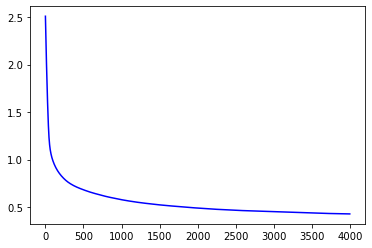

In [124]:
modeloUm = RedeNeuralModeloUm()

runnerUmCrossAdam = RedeNeuralRunner(modeloUm,
                                     X_train, y_train,
                                     4000,0.0015,'CrossEntropyLoss','Adam','runnerUmCrossAdam',False)

runnerUmCrossAdam.train()


In [125]:
runnerUmCrossAdam.evaluate(X_test,y_test)

0.8612918245387714

In [ ]:
runnerUmCrossAdam.export()

Last Epoch: 3999 Loss: 0.47900089621543884
GRÁFICO DA FUNÇÃO DE CUSTO


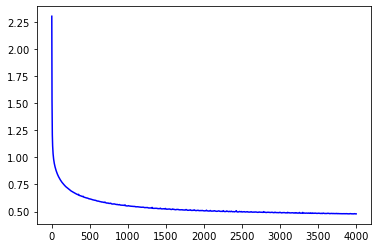

In [127]:
modeloUm = RedeNeuralModeloUm()

runnerUmCrossRMSprop = RedeNeuralRunner(modeloUm,
                                     X_train, y_train,
                                     4000,0.0015,'CrossEntropyLoss','RMSprop','runnerUmCrossRMSprop',False)

runnerUmCrossRMSprop.train()

In [128]:
runnerUmCrossRMSprop.evaluate(X_test,y_test)

0.843197225153031

In [129]:
runnerUmCrossRMSprop.export()

Last Epoch: 3999 Loss: 0.8291981816291809
GRÁFICO DA FUNÇÃO DE CUSTO


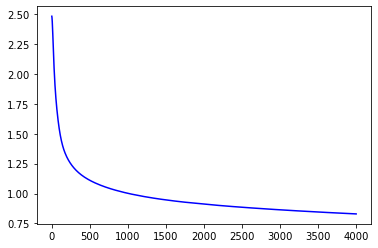

In [130]:
modeloUm = RedeNeuralModeloUm()

runnerUmCrossSGD = RedeNeuralRunner(modeloUm,
                                     X_train, y_train,
                                     4000,0.0015,'CrossEntropyLoss','SGD','runnerUmCrossSGD',False)

runnerUmCrossSGD.train()

In [131]:
runnerUmCrossSGD.evaluate(X_test,y_test)

0.7315369730417808

In [132]:
runnerUmCrossSGD.export()

Epoch: 39 Loss: 0.49780896306037903
Epoch: 39 Loss: 0.7310333251953125
Epoch: 39 Loss: 0.38815954327583313
Epoch: 39 Loss: 0.343898743391037
Epoch: 39 Loss: 0.30751439929008484
Epoch: 39 Loss: 0.30663564801216125
Epoch: 39 Loss: 0.9003517627716064
Epoch: 39 Loss: 0.45663219690322876
Epoch: 39 Loss: 0.6012573838233948
Epoch: 39 Loss: 0.6375790238380432
Epoch: 39 Loss: 0.652493417263031
Epoch: 39 Loss: 0.409173846244812
Epoch: 39 Loss: 0.20694348216056824
Epoch: 39 Loss: 0.25962337851524353
Epoch: 39 Loss: 0.4040612578392029
Epoch: 39 Loss: 0.3934897184371948
Epoch: 39 Loss: 0.41850197315216064
Epoch: 39 Loss: 0.18391194939613342
Epoch: 39 Loss: 0.1777312159538269
Epoch: 39 Loss: 0.4395234286785126
Epoch: 39 Loss: 0.6587069630622864
Epoch: 39 Loss: 0.32477304339408875
Epoch: 39 Loss: 0.29550451040267944
Epoch: 39 Loss: 0.4617499113082886
Epoch: 39 Loss: 0.515250027179718
Epoch: 39 Loss: 0.17877666652202606
Epoch: 39 Loss: 0.5089455246925354
Epoch: 39 Loss: 0.39949169754981995
Epoch: 39 L

Epoch: 39 Loss: 0.4994652271270752
Epoch: 39 Loss: 0.8926017880439758
Epoch: 39 Loss: 0.49097660183906555
Epoch: 39 Loss: 0.266527384519577
Epoch: 39 Loss: 0.43909016251564026
Epoch: 39 Loss: 0.4077754318714142
Epoch: 39 Loss: 0.6757931709289551
Epoch: 39 Loss: 0.6527234315872192
Epoch: 39 Loss: 0.26363223791122437
Epoch: 39 Loss: 0.44097480177879333
Epoch: 39 Loss: 0.25448402762413025
Epoch: 39 Loss: 0.4669940769672394
Epoch: 39 Loss: 0.2620752453804016
Epoch: 39 Loss: 0.7895339727401733
Epoch: 39 Loss: 0.39775460958480835
Epoch: 39 Loss: 0.4838041365146637
Epoch: 39 Loss: 0.3719087541103363
Epoch: 39 Loss: 0.35577157139778137
Epoch: 39 Loss: 0.45272618532180786
Epoch: 39 Loss: 0.3715421259403229
Epoch: 39 Loss: 0.6440756916999817
Epoch: 39 Loss: 0.2526835799217224
Epoch: 39 Loss: 0.5710458755493164
Epoch: 39 Loss: 0.4169600009918213
Epoch: 39 Loss: 0.4394885301589966
Epoch: 39 Loss: 0.28184449672698975
Epoch: 39 Loss: 0.4764673411846161
Epoch: 39 Loss: 0.676632285118103
Epoch: 39 Los

Epoch: 39 Loss: 0.40145179629325867
Epoch: 39 Loss: 0.42675676941871643
Epoch: 39 Loss: 0.4928448796272278
Epoch: 39 Loss: 0.4953630268573761
Epoch: 39 Loss: 0.264640748500824
Epoch: 39 Loss: 0.4813409447669983
Epoch: 39 Loss: 0.5217393040657043
Epoch: 39 Loss: 0.43519896268844604
Epoch: 39 Loss: 0.15822552144527435
Epoch: 39 Loss: 0.3304700255393982
Epoch: 39 Loss: 0.7335521578788757
Epoch: 39 Loss: 0.32240426540374756
Epoch: 39 Loss: 0.3616177439689636
Epoch: 39 Loss: 0.6344995498657227
Epoch: 39 Loss: 0.5071782469749451
Epoch: 39 Loss: 0.6548536419868469
Epoch: 39 Loss: 0.3866850733757019
Epoch: 39 Loss: 0.27067431807518005
Epoch: 39 Loss: 0.6857491135597229
Epoch: 39 Loss: 0.4051925837993622
Epoch: 39 Loss: 0.7112041711807251
Epoch: 39 Loss: 0.6491537094116211
Epoch: 39 Loss: 0.44775915145874023
Epoch: 39 Loss: 0.28325459361076355
Epoch: 39 Loss: 0.4963896870613098
Epoch: 39 Loss: 0.7319687008857727
Epoch: 39 Loss: 0.3755382001399994
Epoch: 39 Loss: 0.7928557991981506
Epoch: 39 Los

Epoch: 39 Loss: 0.48269450664520264
Epoch: 39 Loss: 0.5448101758956909
Epoch: 39 Loss: 0.23022080957889557
Epoch: 39 Loss: 0.8588423132896423
Epoch: 39 Loss: 0.34105175733566284
Epoch: 39 Loss: 0.46394386887550354
Epoch: 39 Loss: 0.32182052731513977
Epoch: 39 Loss: 0.31515809893608093
Epoch: 39 Loss: 0.315317839384079
Epoch: 39 Loss: 0.5747690796852112
Epoch: 39 Loss: 0.39360731840133667
Epoch: 39 Loss: 0.46100178360939026
Epoch: 39 Loss: 0.3772324323654175
Epoch: 39 Loss: 0.22058674693107605
Epoch: 39 Loss: 0.5622620582580566
Epoch: 39 Loss: 0.1312408298254013
Epoch: 39 Loss: 0.4912659525871277
Epoch: 39 Loss: 0.3841326832771301
Epoch: 39 Loss: 0.4241708517074585
Epoch: 39 Loss: 0.4177791178226471
Epoch: 39 Loss: 0.39745286107063293
Epoch: 39 Loss: 0.5445724725723267
Epoch: 39 Loss: 0.6953962445259094
Epoch: 39 Loss: 0.3603094518184662
Epoch: 39 Loss: 0.6350569128990173
Epoch: 39 Loss: 0.6514230370521545
Epoch: 39 Loss: 0.4763529896736145
Epoch: 39 Loss: 0.42284709215164185
Epoch: 39 

Epoch: 39 Loss: 0.31005942821502686
Epoch: 39 Loss: 0.37920987606048584
Epoch: 39 Loss: 0.3890506327152252
Epoch: 39 Loss: 0.5542276501655579
Epoch: 39 Loss: 0.36496683955192566
Epoch: 39 Loss: 0.24067924916744232
Epoch: 39 Loss: 0.3045909106731415
Epoch: 39 Loss: 0.3719519376754761
Epoch: 39 Loss: 0.427236944437027
Epoch: 39 Loss: 0.3282484710216522
Epoch: 39 Loss: 0.2644636332988739
Epoch: 39 Loss: 0.2817727327346802
Epoch: 39 Loss: 0.43271327018737793
Epoch: 39 Loss: 0.3827231824398041
Epoch: 39 Loss: 0.4870423376560211
Epoch: 39 Loss: 0.5296627283096313
Epoch: 39 Loss: 0.1758527159690857
Epoch: 39 Loss: 0.4777039885520935
Epoch: 39 Loss: 0.38142701983451843
Epoch: 39 Loss: 0.45558997988700867
Epoch: 39 Loss: 0.2169029861688614
Epoch: 39 Loss: 0.5823017954826355
Epoch: 39 Loss: 0.44462764263153076
Epoch: 39 Loss: 0.3012884259223938
Epoch: 39 Loss: 0.3142468333244324
Epoch: 39 Loss: 0.35802993178367615
Epoch: 39 Loss: 0.4486919343471527
Epoch: 39 Loss: 0.633301854133606
Epoch: 39 Los

Epoch: 39 Loss: 0.3897579312324524
Epoch: 39 Loss: 0.4481990337371826
Epoch: 39 Loss: 0.6244835257530212
Epoch: 39 Loss: 0.3941958546638489
Epoch: 39 Loss: 0.5690591931343079
Epoch: 39 Loss: 0.4860946238040924
Epoch: 39 Loss: 0.894730806350708
Epoch: 39 Loss: 0.7180323004722595
Epoch: 39 Loss: 0.3355090022087097
Epoch: 39 Loss: 0.29553475975990295
Epoch: 39 Loss: 0.44776642322540283
Epoch: 39 Loss: 0.2807880640029907
Epoch: 39 Loss: 0.33139070868492126
Epoch: 39 Loss: 0.37151238322257996
Epoch: 39 Loss: 0.5968320965766907
Epoch: 39 Loss: 0.2779647409915924
Epoch: 39 Loss: 0.6863610148429871
Epoch: 39 Loss: 0.5518661141395569
Epoch: 39 Loss: 0.5972065925598145
Epoch: 39 Loss: 0.4762829840183258
Epoch: 39 Loss: 0.5852946043014526
Epoch: 39 Loss: 0.4853268563747406
Epoch: 39 Loss: 0.5504205226898193
Epoch: 39 Loss: 0.435334712266922
Epoch: 39 Loss: 0.4348871111869812
Epoch: 39 Loss: 0.2056022584438324
Epoch: 39 Loss: 0.8112437725067139
Epoch: 39 Loss: 0.6517492532730103
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.7757512927055359
Epoch: 39 Loss: 0.3058759868144989
Epoch: 39 Loss: 0.37309199571609497
Epoch: 39 Loss: 0.3789343237876892
Epoch: 39 Loss: 0.2925350069999695
Epoch: 39 Loss: 0.3689092993736267
Epoch: 39 Loss: 0.3669067621231079
Epoch: 39 Loss: 0.36937054991722107
Epoch: 39 Loss: 0.2608624994754791
Epoch: 39 Loss: 0.8196818232536316
Epoch: 39 Loss: 0.12263555079698563
Epoch: 39 Loss: 0.41926461458206177
Epoch: 39 Loss: 0.7154014706611633
Epoch: 39 Loss: 0.9107413291931152
Epoch: 39 Loss: 0.7290493845939636
Epoch: 39 Loss: 0.3493434488773346
Epoch: 39 Loss: 0.28348293900489807
Epoch: 39 Loss: 0.34690597653388977
Epoch: 39 Loss: 0.5583208203315735
Epoch: 39 Loss: 0.39708131551742554
Epoch: 39 Loss: 0.3122307360172272
Epoch: 39 Loss: 0.5354174375534058
Epoch: 39 Loss: 0.519061267375946
Epoch: 39 Loss: 0.5697376132011414
Epoch: 39 Loss: 0.41546162962913513
Epoch: 39 Loss: 0.3034607172012329
Epoch: 39 Loss: 0.35132771730422974
Epoch: 39 Loss: 0.20871855318546295
Epoch: 39 L

Epoch: 39 Loss: 0.47657230496406555
Epoch: 39 Loss: 0.49463552236557007
Epoch: 39 Loss: 0.2856314778327942
Epoch: 39 Loss: 0.5878516435623169
Epoch: 39 Loss: 0.29576948285102844
Epoch: 39 Loss: 0.27465566992759705
Epoch: 39 Loss: 0.16101297736167908
Epoch: 39 Loss: 0.5276548862457275
Epoch: 39 Loss: 0.4607144892215729
Epoch: 39 Loss: 0.4086456596851349
Epoch: 39 Loss: 0.3790351450443268
Epoch: 39 Loss: 0.5904338359832764
Epoch: 39 Loss: 0.36975592374801636
Epoch: 39 Loss: 0.3645128011703491
Epoch: 39 Loss: 0.4910047948360443
Epoch: 39 Loss: 0.3634408116340637
Epoch: 39 Loss: 0.34213390946388245
Epoch: 39 Loss: 0.29428473114967346
Epoch: 39 Loss: 0.41108906269073486
Epoch: 39 Loss: 0.2855471670627594
Epoch: 39 Loss: 0.3603384494781494
Epoch: 39 Loss: 0.30279234051704407
Epoch: 39 Loss: 0.2565380036830902
Epoch: 39 Loss: 0.26768913865089417
Epoch: 39 Loss: 0.3516489565372467
Epoch: 39 Loss: 0.12022586166858673
Epoch: 39 Loss: 0.37051475048065186
Epoch: 39 Loss: 0.5254701972007751
Epoch: 

Epoch: 39 Loss: 0.4510948061943054
Epoch: 39 Loss: 0.41753894090652466
Epoch: 39 Loss: 0.24829041957855225
Epoch: 39 Loss: 0.45528706908226013
Epoch: 39 Loss: 0.6271049976348877
Epoch: 39 Loss: 0.5760742425918579
Epoch: 39 Loss: 0.4270267188549042
Epoch: 39 Loss: 0.5595560073852539
Epoch: 39 Loss: 0.40020281076431274
Epoch: 39 Loss: 0.27522096037864685
Epoch: 39 Loss: 0.6976019144058228
Epoch: 39 Loss: 0.531356692314148
Epoch: 39 Loss: 0.45645198225975037
Epoch: 39 Loss: 0.4573094844818115
Epoch: 39 Loss: 0.31555888056755066
Epoch: 39 Loss: 0.4706006944179535
Epoch: 39 Loss: 0.2899322807788849
Epoch: 39 Loss: 0.45417967438697815
Epoch: 39 Loss: 0.22597366571426392
Epoch: 39 Loss: 0.6595141291618347
Epoch: 39 Loss: 0.3823825716972351
Epoch: 39 Loss: 0.39403173327445984
Epoch: 39 Loss: 0.6624560356140137
Epoch: 39 Loss: 0.452908992767334
Epoch: 39 Loss: 0.5826966762542725
Epoch: 39 Loss: 0.36593490839004517
Epoch: 39 Loss: 0.34562087059020996
Epoch: 39 Loss: 0.4158540368080139
Epoch: 39 

Epoch: 39 Loss: 0.27688470482826233
Epoch: 39 Loss: 0.6117106676101685
Epoch: 39 Loss: 0.5414865612983704
Epoch: 39 Loss: 0.5685974955558777
Epoch: 39 Loss: 0.4745771288871765
Epoch: 39 Loss: 0.28991395235061646
Epoch: 39 Loss: 0.7865052223205566
Epoch: 39 Loss: 0.36161482334136963
Epoch: 39 Loss: 0.6609189510345459
Epoch: 39 Loss: 0.5302404165267944
Epoch: 39 Loss: 0.4188096821308136
Epoch: 39 Loss: 0.4928247332572937
Epoch: 39 Loss: 0.36490851640701294
Epoch: 39 Loss: 0.27610668540000916
Epoch: 39 Loss: 0.3172443211078644
Epoch: 39 Loss: 0.27502039074897766
Epoch: 39 Loss: 0.7842474579811096
Epoch: 39 Loss: 0.2719305157661438
Epoch: 39 Loss: 0.39497533440589905
Epoch: 39 Loss: 0.45627260208129883
Epoch: 39 Loss: 0.3251688480377197
Epoch: 39 Loss: 0.4173630177974701
Epoch: 39 Loss: 0.41031989455223083
Epoch: 39 Loss: 0.44973519444465637
Epoch: 39 Loss: 0.4391346573829651
Epoch: 39 Loss: 0.3392833471298218
Epoch: 39 Loss: 0.41172319650650024
Epoch: 39 Loss: 0.7898451685905457
Epoch: 39

Epoch: 39 Loss: 0.33745643496513367
Epoch: 39 Loss: 0.34328246116638184
Epoch: 39 Loss: 0.36148881912231445
Epoch: 39 Loss: 0.5538565516471863
Epoch: 39 Loss: 0.33323097229003906
Epoch: 39 Loss: 0.32886895537376404
Epoch: 39 Loss: 0.25635433197021484
Epoch: 39 Loss: 0.3957212269306183
Epoch: 39 Loss: 0.5269766449928284
Epoch: 39 Loss: 0.21285274624824524
Epoch: 39 Loss: 0.25306469202041626
Epoch: 39 Loss: 0.6723934412002563
Epoch: 39 Loss: 0.31501126289367676
Epoch: 39 Loss: 0.5086998343467712
Epoch: 39 Loss: 0.8149053454399109
Epoch: 39 Loss: 0.5760115385055542
Epoch: 39 Loss: 0.2610878348350525
Epoch: 39 Loss: 0.2844396233558655
Epoch: 39 Loss: 0.4097657799720764
Epoch: 39 Loss: 0.5312996506690979
Epoch: 39 Loss: 0.48204511404037476
Epoch: 39 Loss: 0.4608149826526642
Epoch: 39 Loss: 0.39543792605400085
Epoch: 39 Loss: 0.35068443417549133
Epoch: 39 Loss: 0.5210570693016052
Epoch: 39 Loss: 0.6844559907913208
Epoch: 39 Loss: 0.34520450234413147
Epoch: 39 Loss: 0.2365325540304184
Epoch: 

Epoch: 39 Loss: 0.4703448414802551
Epoch: 39 Loss: 0.46974462270736694
Epoch: 39 Loss: 0.3174888491630554
Epoch: 39 Loss: 0.2366870641708374
Epoch: 39 Loss: 0.2905435860157013
Epoch: 39 Loss: 0.34616315364837646
Epoch: 39 Loss: 0.3025953769683838
Epoch: 39 Loss: 0.5062887072563171
Epoch: 39 Loss: 0.5027528405189514
Epoch: 39 Loss: 0.42502474784851074
Epoch: 39 Loss: 0.3158397376537323
Epoch: 39 Loss: 0.16449475288391113
Epoch: 39 Loss: 0.270705908536911
Epoch: 39 Loss: 0.49733874201774597
Epoch: 39 Loss: 0.3850501477718353
Epoch: 39 Loss: 0.48890966176986694
Epoch: 39 Loss: 0.5002625584602356
Epoch: 39 Loss: 0.574474036693573
Epoch: 39 Loss: 0.8992422223091125
Epoch: 39 Loss: 0.2769624590873718
Epoch: 39 Loss: 0.283990740776062
Epoch: 39 Loss: 0.3373020887374878
Epoch: 39 Loss: 0.41174745559692383
Epoch: 39 Loss: 0.5085262060165405
Epoch: 39 Loss: 0.48785316944122314
Epoch: 39 Loss: 0.5041441321372986
Epoch: 39 Loss: 0.41000911593437195
Epoch: 39 Loss: 0.40659889578819275
Epoch: 39 Los

Epoch: 39 Loss: 0.39632970094680786
Epoch: 39 Loss: 0.7002619504928589
Epoch: 39 Loss: 0.6022055745124817
Epoch: 39 Loss: 0.24652674794197083
Epoch: 39 Loss: 0.280658483505249
Epoch: 39 Loss: 0.40243685245513916
Epoch: 39 Loss: 0.5391936898231506
Epoch: 39 Loss: 0.6186532378196716
Epoch: 39 Loss: 0.4111028015613556
Epoch: 39 Loss: 0.3266960084438324
Epoch: 39 Loss: 0.42141076922416687
Epoch: 39 Loss: 0.37164562940597534
Epoch: 39 Loss: 0.3703453540802002
Epoch: 39 Loss: 0.40017831325531006
Epoch: 39 Loss: 0.44468265771865845
Epoch: 39 Loss: 0.6435181498527527
Epoch: 39 Loss: 0.5338014364242554
Epoch: 39 Loss: 0.4529297649860382
Epoch: 39 Loss: 0.39970508217811584
Epoch: 39 Loss: 0.28278830647468567
Epoch: 39 Loss: 0.5797060132026672
Epoch: 39 Loss: 0.2703273594379425
Epoch: 39 Loss: 0.35172417759895325
Epoch: 39 Loss: 0.7906583547592163
Epoch: 39 Loss: 0.7267184853553772
Epoch: 39 Loss: 0.4492875337600708
Epoch: 39 Loss: 0.7526424527168274
Epoch: 39 Loss: 0.517294704914093
Epoch: 39 Lo

Epoch: 39 Loss: 0.3127591907978058
Epoch: 39 Loss: 0.4752572476863861
Epoch: 39 Loss: 0.296858549118042
Epoch: 39 Loss: 0.40762361884117126
Epoch: 39 Loss: 0.3025050759315491
Epoch: 39 Loss: 0.48069870471954346
Epoch: 39 Loss: 0.4456966817378998
Epoch: 39 Loss: 0.7470150589942932
Epoch: 39 Loss: 0.31971511244773865
Epoch: 39 Loss: 0.48935237526893616
Epoch: 39 Loss: 0.5494884848594666
Epoch: 39 Loss: 0.3966333568096161
Epoch: 39 Loss: 0.24398452043533325
Epoch: 39 Loss: 0.44029220938682556
Epoch: 39 Loss: 0.3743252754211426
Epoch: 39 Loss: 0.24608838558197021
Epoch: 39 Loss: 0.30503642559051514
Epoch: 39 Loss: 0.37854525446891785
Epoch: 39 Loss: 0.39887523651123047
Epoch: 39 Loss: 0.3956673741340637
Epoch: 39 Loss: 0.7590954303741455
Epoch: 39 Loss: 0.3198099732398987
Epoch: 39 Loss: 0.49243924021720886
Epoch: 39 Loss: 0.7197403907775879
Epoch: 39 Loss: 0.2850413918495178
Epoch: 39 Loss: 0.40744730830192566
Epoch: 39 Loss: 0.418157696723938
Epoch: 39 Loss: 0.2736275792121887
Epoch: 39 

Epoch: 39 Loss: 0.5628114342689514
Epoch: 39 Loss: 0.26677605509757996
Epoch: 39 Loss: 0.3749675452709198
Epoch: 39 Loss: 0.4022882580757141
Epoch: 39 Loss: 0.23543140292167664
Epoch: 39 Loss: 0.3207601010799408
Epoch: 39 Loss: 0.2818929851055145
Epoch: 39 Loss: 0.6111078858375549
Epoch: 39 Loss: 0.1523740589618683
Epoch: 39 Loss: 0.2982644736766815
Epoch: 39 Loss: 0.7562898993492126
Epoch: 39 Loss: 0.33067914843559265
Epoch: 39 Loss: 0.6133829951286316
Epoch: 39 Loss: 0.3902914226055145
Epoch: 39 Loss: 0.5736861228942871
Epoch: 39 Loss: 0.1860779970884323
Epoch: 39 Loss: 0.5483762621879578
Epoch: 39 Loss: 0.6047605276107788
Epoch: 39 Loss: 0.3530004024505615
Epoch: 39 Loss: 0.3552527129650116
Epoch: 39 Loss: 0.20368564128875732
Epoch: 39 Loss: 0.44683921337127686
Epoch: 39 Loss: 0.3641852140426636
Epoch: 39 Loss: 0.5057713985443115
Epoch: 39 Loss: 0.35487082600593567
Epoch: 39 Loss: 0.2866515815258026
Epoch: 39 Loss: 0.5199490189552307
Epoch: 39 Loss: 0.3301098048686981
Epoch: 39 Loss

Epoch: 39 Loss: 0.4836283326148987
Epoch: 39 Loss: 0.6439594030380249
Epoch: 39 Loss: 0.3262547552585602
Epoch: 39 Loss: 0.6764250993728638
Epoch: 39 Loss: 0.36425527930259705
Epoch: 39 Loss: 0.3754865527153015
Epoch: 39 Loss: 0.33444830775260925
Epoch: 39 Loss: 0.7542292475700378
Epoch: 39 Loss: 0.28729140758514404
Epoch: 39 Loss: 0.21945255994796753
Epoch: 39 Loss: 0.43182653188705444
Epoch: 39 Loss: 0.4007187485694885
Epoch: 39 Loss: 0.66808021068573
Epoch: 39 Loss: 0.4431906044483185
Epoch: 39 Loss: 0.35606512427330017
Epoch: 39 Loss: 0.8614336252212524
Epoch: 39 Loss: 0.49744534492492676
Epoch: 39 Loss: 0.3208591938018799
Epoch: 39 Loss: 0.5046238303184509
Epoch: 39 Loss: 0.3661397099494934
Epoch: 39 Loss: 0.36102867126464844
Epoch: 39 Loss: 0.1680072695016861
Epoch: 39 Loss: 0.35945770144462585
Epoch: 39 Loss: 0.3845007121562958
Epoch: 39 Loss: 0.4801965355873108
Epoch: 39 Loss: 0.771415650844574
Epoch: 39 Loss: 0.38206538558006287
Epoch: 39 Loss: 0.16277654469013214
Epoch: 39 Lo

Epoch: 39 Loss: 0.846651554107666
Epoch: 39 Loss: 0.5379307270050049
Epoch: 39 Loss: 0.7802428007125854
Epoch: 39 Loss: 0.5575097799301147
Epoch: 39 Loss: 0.6361275315284729
Epoch: 39 Loss: 0.37625986337661743
Epoch: 39 Loss: 0.34143558144569397
Epoch: 39 Loss: 0.6306095719337463
Epoch: 39 Loss: 0.3761906027793884
Epoch: 39 Loss: 0.4317024052143097
Epoch: 39 Loss: 0.45008689165115356
Epoch: 39 Loss: 0.6745323538780212
Epoch: 39 Loss: 0.23747065663337708
Epoch: 39 Loss: 0.49474063515663147
Epoch: 39 Loss: 0.5955886244773865
Epoch: 39 Loss: 0.45791423320770264
Epoch: 39 Loss: 0.348010390996933
Epoch: 39 Loss: 0.3762768507003784
Epoch: 39 Loss: 0.19269022345542908
Epoch: 39 Loss: 0.5059356689453125
Epoch: 39 Loss: 0.31491103768348694
Epoch: 39 Loss: 0.45177122950553894
Epoch: 39 Loss: 1.0124222040176392
Epoch: 39 Loss: 0.35082852840423584
Epoch: 39 Loss: 0.7563470602035522
Epoch: 39 Loss: 0.8420578837394714
Epoch: 39 Loss: 0.5531699061393738
Epoch: 39 Loss: 0.34900572896003723
Epoch: 39 L

Epoch: 39 Loss: 0.3931763768196106
Epoch: 39 Loss: 0.3143140971660614
Epoch: 39 Loss: 0.3244690001010895
Epoch: 39 Loss: 0.31628262996673584
Epoch: 39 Loss: 0.7441470623016357
Epoch: 39 Loss: 0.12735454738140106
Epoch: 39 Loss: 0.30231600999832153
Epoch: 39 Loss: 0.35338351130485535
Epoch: 39 Loss: 0.7839415073394775
Epoch: 39 Loss: 0.5920079946517944
Epoch: 39 Loss: 0.4420241117477417
Epoch: 39 Loss: 0.8638371825218201
Epoch: 39 Loss: 0.475220263004303
Epoch: 39 Loss: 0.3000829219818115
Epoch: 39 Loss: 0.6824132800102234
Epoch: 39 Loss: 0.4422414302825928
Epoch: 39 Loss: 0.48908424377441406
Epoch: 39 Loss: 0.7710682153701782
Epoch: 39 Loss: 0.43023619055747986
Epoch: 39 Loss: 0.5401123762130737
Epoch: 39 Loss: 0.2966826558113098
Epoch: 39 Loss: 0.5803534388542175
Epoch: 39 Loss: 0.4541897475719452
Epoch: 39 Loss: 0.2801766097545624
Epoch: 39 Loss: 0.33492836356163025
Epoch: 39 Loss: 0.4026230275630951
Epoch: 39 Loss: 0.45515093207359314
Epoch: 39 Loss: 0.8865830302238464
Epoch: 39 Los

Epoch: 39 Loss: 0.6193921566009521
Epoch: 39 Loss: 0.7704091668128967
Epoch: 39 Loss: 0.75700443983078
Epoch: 39 Loss: 0.3943485617637634
Epoch: 39 Loss: 0.5601062178611755
Epoch: 39 Loss: 0.5805267691612244
Epoch: 39 Loss: 0.6334488987922668
Epoch: 39 Loss: 0.4335312247276306
Epoch: 39 Loss: 0.21603555977344513
Epoch: 39 Loss: 0.6085165739059448
Epoch: 39 Loss: 0.537568986415863
Epoch: 39 Loss: 0.5731377005577087
Epoch: 39 Loss: 0.44071874022483826
Epoch: 39 Loss: 0.4413411021232605
Epoch: 39 Loss: 0.41006791591644287
Epoch: 39 Loss: 0.47311168909072876
Epoch: 39 Loss: 0.9092357158660889
Epoch: 39 Loss: 0.7405274510383606
Epoch: 39 Loss: 0.25755980610847473
Epoch: 39 Loss: 0.35549843311309814
Epoch: 39 Loss: 0.25318291783332825
Epoch: 39 Loss: 0.3607737720012665
Epoch: 39 Loss: 0.5015541315078735
Epoch: 39 Loss: 0.5496186017990112
Epoch: 39 Loss: 0.16634540259838104
Epoch: 39 Loss: 0.4526357054710388
Epoch: 39 Loss: 0.2085622400045395
Epoch: 39 Loss: 0.2639559209346771
Epoch: 39 Loss:

Epoch: 39 Loss: 0.2518447935581207
Epoch: 39 Loss: 0.34845009446144104
Epoch: 39 Loss: 0.4347669184207916
Epoch: 39 Loss: 0.6637359857559204
Epoch: 39 Loss: 0.36805227398872375
Epoch: 39 Loss: 0.4031367301940918
Epoch: 39 Loss: 0.27343595027923584
Epoch: 39 Loss: 0.5520467758178711
Epoch: 39 Loss: 0.33635491132736206
Epoch: 39 Loss: 0.4377407431602478
Epoch: 39 Loss: 0.38924476504325867
Epoch: 39 Loss: 1.033437967300415
Epoch: 39 Loss: 0.2573902904987335
Epoch: 39 Loss: 0.1881992369890213
Epoch: 39 Loss: 0.5219392776489258
Epoch: 39 Loss: 0.43082451820373535
Epoch: 39 Loss: 0.8474956154823303
Epoch: 39 Loss: 0.4543880522251129
Epoch: 39 Loss: 0.5867475867271423
Epoch: 39 Loss: 0.475471168756485
Epoch: 39 Loss: 0.2860425114631653
Epoch: 39 Loss: 0.7334436774253845
Epoch: 39 Loss: 0.4621736705303192
Epoch: 39 Loss: 0.45902588963508606
Epoch: 39 Loss: 0.32874196767807007
Epoch: 39 Loss: 0.3945777416229248
Epoch: 39 Loss: 0.41919583082199097
Epoch: 39 Loss: 0.4270968437194824
Epoch: 39 Los

Epoch: 39 Loss: 0.3216969072818756
Epoch: 39 Loss: 0.5690032243728638
Epoch: 39 Loss: 0.4480978548526764
Epoch: 39 Loss: 0.4180833101272583
Epoch: 39 Loss: 0.451810747385025
Epoch: 39 Loss: 0.633197546005249
Epoch: 39 Loss: 0.25400510430336
Epoch: 39 Loss: 0.4758821129798889
Epoch: 39 Loss: 0.4586458206176758
Epoch: 39 Loss: 0.47825050354003906
Epoch: 39 Loss: 0.29095354676246643
Epoch: 39 Loss: 0.6803268194198608
Epoch: 39 Loss: 0.5040901899337769
Epoch: 39 Loss: 0.5011965036392212
Epoch: 39 Loss: 0.4349883198738098
Epoch: 39 Loss: 0.5511908531188965
Epoch: 39 Loss: 0.3222763240337372
Epoch: 39 Loss: 0.25444015860557556
Epoch: 39 Loss: 0.7042058110237122
Epoch: 39 Loss: 0.29852595925331116
Epoch: 39 Loss: 0.3283379077911377
Epoch: 39 Loss: 0.36446720361709595
Epoch: 39 Loss: 0.4954710900783539
Epoch: 39 Loss: 0.3975142538547516
Epoch: 39 Loss: 0.3256848454475403
Epoch: 39 Loss: 0.2413926124572754
Epoch: 39 Loss: 0.46149778366088867
Epoch: 39 Loss: 0.35801854729652405
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.3861795663833618
Epoch: 39 Loss: 0.28522664308547974
Epoch: 39 Loss: 0.5470105409622192
Epoch: 39 Loss: 0.45733708143234253
Epoch: 39 Loss: 0.32354456186294556
Epoch: 39 Loss: 0.5215840339660645
Epoch: 39 Loss: 0.722968339920044
Epoch: 39 Loss: 0.37033116817474365
Epoch: 39 Loss: 0.5582598447799683
Epoch: 39 Loss: 0.38596463203430176
Epoch: 39 Loss: 0.24673515558242798
Epoch: 39 Loss: 0.5373275279998779
Epoch: 39 Loss: 0.4666895270347595
Epoch: 39 Loss: 0.722030758857727
Epoch: 39 Loss: 0.49582016468048096
Epoch: 39 Loss: 0.4150899648666382
Epoch: 39 Loss: 0.570730447769165
Epoch: 39 Loss: 0.558795154094696
Epoch: 39 Loss: 0.2875419557094574
Epoch: 39 Loss: 0.3755868375301361
Epoch: 39 Loss: 0.5547065734863281
Epoch: 39 Loss: 0.5746825337409973
Epoch: 39 Loss: 0.6540437340736389
Epoch: 39 Loss: 0.2507752776145935
Epoch: 39 Loss: 0.3664722740650177
Epoch: 39 Loss: 0.5546454191207886
Epoch: 39 Loss: 0.5942056775093079
Epoch: 39 Loss: 0.13933952152729034
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.3508419990539551
Epoch: 39 Loss: 0.2989942133426666
Epoch: 39 Loss: 0.5649955868721008
Epoch: 39 Loss: 0.8518758416175842
Epoch: 39 Loss: 0.4595423638820648
Epoch: 39 Loss: 0.39785248041152954
Epoch: 39 Loss: 0.5644370913505554
Epoch: 39 Loss: 0.4786449074745178
Epoch: 39 Loss: 0.6764404773712158
Epoch: 39 Loss: 0.22404679656028748
Epoch: 39 Loss: 0.5473299026489258
Epoch: 39 Loss: 0.3138902485370636
Epoch: 39 Loss: 0.5095813274383545
Epoch: 39 Loss: 0.3895551860332489
Epoch: 39 Loss: 0.1681608259677887
Epoch: 39 Loss: 0.404504656791687
Epoch: 39 Loss: 0.3061040937900543
Epoch: 39 Loss: 0.5128934979438782
Epoch: 39 Loss: 0.4324229061603546
Epoch: 39 Loss: 0.5141227841377258
Epoch: 39 Loss: 0.21653614938259125
Epoch: 39 Loss: 0.5129444599151611
Epoch: 39 Loss: 0.9898169040679932
Epoch: 39 Loss: 0.2841126322746277
Epoch: 39 Loss: 0.2729065716266632
Epoch: 39 Loss: 0.5597149133682251
Epoch: 39 Loss: 0.7001885175704956
Epoch: 39 Loss: 0.4365435540676117
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.20264391601085663
Epoch: 39 Loss: 0.5975186824798584
Epoch: 39 Loss: 0.4886230528354645
Epoch: 39 Loss: 0.579670250415802
Epoch: 39 Loss: 0.5583232045173645
Epoch: 39 Loss: 0.36530789732933044
Epoch: 39 Loss: 0.4984966516494751
Epoch: 39 Loss: 0.19530044496059418
Epoch: 39 Loss: 0.6828377842903137
Epoch: 39 Loss: 0.5509634017944336
Epoch: 39 Loss: 0.5510332584381104
Epoch: 39 Loss: 0.7364580631256104
Epoch: 39 Loss: 0.4477052688598633
Epoch: 39 Loss: 0.39186424016952515
Epoch: 39 Loss: 0.1713753193616867
Epoch: 39 Loss: 0.3014945983886719
Epoch: 39 Loss: 0.30821341276168823
Epoch: 39 Loss: 0.25658532977104187
Epoch: 39 Loss: 0.6931672096252441
Epoch: 39 Loss: 0.3233405351638794
Epoch: 39 Loss: 0.5705322623252869
Epoch: 39 Loss: 0.5317815542221069
Epoch: 39 Loss: 0.7174355983734131
Epoch: 39 Loss: 0.40667861700057983
Epoch: 39 Loss: 0.47029241919517517
Epoch: 39 Loss: 0.4965052306652069
Epoch: 39 Loss: 0.33211296796798706
Epoch: 39 Loss: 0.4733579158782959
Epoch: 39 Lo

Epoch: 39 Loss: 0.5393028259277344
Epoch: 39 Loss: 0.34363827109336853
Epoch: 39 Loss: 0.5298774838447571
Epoch: 39 Loss: 0.36762121319770813
Epoch: 39 Loss: 0.3856503665447235
Epoch: 39 Loss: 0.4521920680999756
Epoch: 39 Loss: 0.4549800455570221
Epoch: 39 Loss: 0.3869066834449768
Epoch: 39 Loss: 0.8728539347648621
Epoch: 39 Loss: 0.3855271339416504
Epoch: 39 Loss: 0.35907602310180664
Epoch: 39 Loss: 0.3462226092815399
Epoch: 39 Loss: 0.6068641543388367
Epoch: 39 Loss: 0.43419039249420166
Epoch: 39 Loss: 0.3322080969810486
Epoch: 39 Loss: 0.9091920852661133
Epoch: 39 Loss: 0.3786046504974365
Epoch: 39 Loss: 0.6483438014984131
Epoch: 39 Loss: 0.25536176562309265
Epoch: 39 Loss: 0.2622622549533844
Epoch: 39 Loss: 0.2425728589296341
Epoch: 39 Loss: 0.5431545972824097
Epoch: 39 Loss: 0.5417755842208862
Epoch: 39 Loss: 0.48137521743774414
Epoch: 39 Loss: 0.47113579511642456
Epoch: 39 Loss: 0.8224028944969177
Epoch: 39 Loss: 0.47035300731658936
Epoch: 39 Loss: 0.5738569498062134
Epoch: 39 Lo

Epoch: 39 Loss: 0.22016650438308716
Epoch: 39 Loss: 0.3196699917316437
Epoch: 39 Loss: 0.24176891148090363
Epoch: 39 Loss: 0.2582598626613617
Epoch: 39 Loss: 0.26708921790122986
Epoch: 39 Loss: 0.17762434482574463
Epoch: 39 Loss: 0.5499570965766907
Epoch: 39 Loss: 1.0783874988555908
Epoch: 39 Loss: 0.2419184297323227
Epoch: 39 Loss: 0.728208065032959
Epoch: 39 Loss: 0.47108426690101624
Epoch: 39 Loss: 0.36789724230766296
Epoch: 39 Loss: 0.6107080578804016
Epoch: 39 Loss: 0.2745053470134735
Epoch: 39 Loss: 0.36984002590179443
Epoch: 39 Loss: 0.5635544061660767
Epoch: 39 Loss: 0.49093350768089294
Epoch: 39 Loss: 0.3652736246585846
Epoch: 39 Loss: 0.5245569348335266
Epoch: 39 Loss: 0.31610244512557983
Epoch: 39 Loss: 0.5809264183044434
Epoch: 39 Loss: 0.17550870776176453
Epoch: 39 Loss: 0.23846638202667236
Epoch: 39 Loss: 0.5875765681266785
Epoch: 39 Loss: 0.30858832597732544
Epoch: 39 Loss: 0.5700502991676331
Epoch: 39 Loss: 0.40227073431015015
Epoch: 39 Loss: 0.4355114698410034
Epoch: 3

Epoch: 39 Loss: 0.3555689752101898
Epoch: 39 Loss: 0.35622167587280273
Epoch: 39 Loss: 0.4479452073574066
Epoch: 39 Loss: 0.3366064727306366
Epoch: 39 Loss: 0.29069241881370544
Epoch: 39 Loss: 0.47206753492355347
Epoch: 39 Loss: 0.3376254141330719
Epoch: 39 Loss: 0.6314622759819031
Epoch: 39 Loss: 0.36460739374160767
Epoch: 39 Loss: 0.7122051119804382
Epoch: 39 Loss: 0.5355221629142761
Epoch: 39 Loss: 0.7294166088104248
Epoch: 39 Loss: 0.6425321698188782
Epoch: 39 Loss: 0.3399995267391205
Epoch: 39 Loss: 0.38069766759872437
Epoch: 39 Loss: 0.4323766529560089
Epoch: 39 Loss: 0.73846435546875
Epoch: 39 Loss: 0.5106350779533386
Epoch: 39 Loss: 0.475835382938385
Epoch: 39 Loss: 0.4523927569389343
Epoch: 39 Loss: 0.4219396412372589
Epoch: 39 Loss: 0.5946105122566223
Epoch: 39 Loss: 0.7107512354850769
Epoch: 39 Loss: 0.43899890780448914
Epoch: 39 Loss: 0.38570013642311096
Epoch: 39 Loss: 0.2883356511592865
Epoch: 39 Loss: 0.5896388292312622
Epoch: 39 Loss: 0.2363489717245102
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.47766295075416565
Epoch: 39 Loss: 0.2998027503490448
Epoch: 39 Loss: 0.4444099962711334
Epoch: 39 Loss: 0.26985859870910645
Epoch: 39 Loss: 0.385964035987854
Epoch: 39 Loss: 0.6636593341827393
Epoch: 39 Loss: 0.3364136517047882
Epoch: 39 Loss: 0.6562504768371582
Epoch: 39 Loss: 0.3346184194087982
Epoch: 39 Loss: 0.4308527410030365
Epoch: 39 Loss: 0.29396840929985046
Epoch: 39 Loss: 0.47540292143821716
Epoch: 39 Loss: 0.36672505736351013
Epoch: 39 Loss: 0.9733131527900696
Epoch: 39 Loss: 0.5238932967185974
Epoch: 39 Loss: 0.34912967681884766
Epoch: 39 Loss: 0.17820362746715546
Epoch: 39 Loss: 0.795974612236023
Epoch: 39 Loss: 0.6238532662391663
Epoch: 39 Loss: 0.61944180727005
Epoch: 39 Loss: 0.2520548105239868
Epoch: 39 Loss: 0.31189921498298645
Epoch: 39 Loss: 0.30824533104896545
Epoch: 39 Loss: 0.18236400187015533
Epoch: 39 Loss: 0.5415952205657959
Epoch: 39 Loss: 0.3452703654766083
Epoch: 39 Loss: 0.480326384305954
Epoch: 39 Loss: 0.41911831498146057
Epoch: 39 Loss

Epoch: 39 Loss: 0.51412433385849
Epoch: 39 Loss: 0.273366779088974
Epoch: 39 Loss: 0.5390822291374207
Epoch: 39 Loss: 0.5427190065383911
Epoch: 39 Loss: 0.3955250382423401
Epoch: 39 Loss: 0.34383323788642883
Epoch: 39 Loss: 0.38756078481674194
Epoch: 39 Loss: 0.4006733298301697
Epoch: 39 Loss: 0.44343018531799316
Epoch: 39 Loss: 0.5244566202163696
Epoch: 39 Loss: 0.6221084594726562
Epoch: 39 Loss: 0.3564686179161072
Epoch: 39 Loss: 0.20130926370620728
Epoch: 39 Loss: 0.5086493492126465
Epoch: 39 Loss: 0.7321219444274902
Epoch: 39 Loss: 0.5323310494422913
Epoch: 39 Loss: 0.413800984621048
Epoch: 39 Loss: 0.684093713760376
Epoch: 39 Loss: 0.4073817729949951
Epoch: 39 Loss: 0.3927549123764038
Epoch: 39 Loss: 0.33283382654190063
Epoch: 39 Loss: 0.23537160456180573
Epoch: 39 Loss: 0.7742616534233093
Epoch: 39 Loss: 0.4255330562591553
Epoch: 39 Loss: 0.539644718170166
Epoch: 39 Loss: 0.6049879193305969
Epoch: 39 Loss: 0.39280399680137634
Epoch: 39 Loss: 0.15299591422080994
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.4616628587245941
Epoch: 39 Loss: 0.4602847397327423
Epoch: 39 Loss: 0.3122224807739258
Epoch: 39 Loss: 0.38157007098197937
Epoch: 39 Loss: 0.7637023329734802
Epoch: 39 Loss: 0.48326852917671204
Epoch: 39 Loss: 0.5459269881248474
Epoch: 39 Loss: 0.6956729888916016
Epoch: 39 Loss: 0.22263410687446594
Epoch: 39 Loss: 0.7370745539665222
Epoch: 39 Loss: 0.543698787689209
Epoch: 39 Loss: 0.17965267598628998
Epoch: 39 Loss: 0.30048611760139465
Epoch: 39 Loss: 0.28682181239128113
Epoch: 39 Loss: 0.29927462339401245
Epoch: 39 Loss: 0.4731277823448181
Epoch: 39 Loss: 0.3425370752811432
Epoch: 39 Loss: 0.5617554783821106
Epoch: 39 Loss: 0.4728834331035614
Epoch: 39 Loss: 0.5974119305610657
Epoch: 39 Loss: 0.28065288066864014
Epoch: 39 Loss: 0.5216481685638428
Epoch: 39 Loss: 0.44514578580856323
Epoch: 39 Loss: 0.7052429914474487
Epoch: 39 Loss: 0.5036517381668091
Epoch: 39 Loss: 0.5489699840545654
Epoch: 39 Loss: 0.5045747756958008
Epoch: 39 Loss: 0.3696029782295227
Epoch: 39 Lo

Epoch: 39 Loss: 0.4674224257469177
Epoch: 39 Loss: 0.808070182800293
Epoch: 39 Loss: 0.4322093725204468
Epoch: 39 Loss: 0.8807384371757507
Epoch: 39 Loss: 0.42143526673316956
Epoch: 39 Loss: 0.6418306231498718
Epoch: 39 Loss: 0.49799615144729614
Epoch: 39 Loss: 0.38945919275283813
Epoch: 39 Loss: 0.2689298689365387
Epoch: 39 Loss: 0.358085036277771
Epoch: 39 Loss: 0.3460850417613983
Epoch: 39 Loss: 0.43139714002609253
Epoch: 39 Loss: 0.5128777027130127
Epoch: 39 Loss: 0.6598674654960632
Epoch: 39 Loss: 0.2449386864900589
Epoch: 39 Loss: 0.30818498134613037
Epoch: 39 Loss: 0.34482863545417786
Epoch: 39 Loss: 0.3778253495693207
Epoch: 39 Loss: 0.7514678835868835
Epoch: 39 Loss: 0.3769495487213135
Epoch: 39 Loss: 0.37774667143821716
Epoch: 39 Loss: 0.4278131127357483
Epoch: 39 Loss: 0.38603073358535767
Epoch: 39 Loss: 0.2604977786540985
Epoch: 39 Loss: 0.3971279263496399
Epoch: 39 Loss: 0.8970244526863098
Epoch: 39 Loss: 0.480002760887146
Epoch: 39 Loss: 0.40988194942474365
Epoch: 39 Loss

Epoch: 39 Loss: 0.5715394020080566
Epoch: 39 Loss: 0.665456235408783
Epoch: 39 Loss: 0.4951469898223877
Epoch: 39 Loss: 0.2870279848575592
Epoch: 39 Loss: 0.6391188502311707
Epoch: 39 Loss: 0.4435857832431793
Epoch: 39 Loss: 0.7753294706344604
Epoch: 39 Loss: 0.331675261259079
Epoch: 39 Loss: 0.2226453721523285
Epoch: 39 Loss: 0.43927350640296936
Epoch: 39 Loss: 0.753673791885376
Epoch: 39 Loss: 0.45965123176574707
Epoch: 39 Loss: 0.15163466334342957
Epoch: 39 Loss: 0.45496076345443726
Epoch: 39 Loss: 0.5932292342185974
Epoch: 39 Loss: 0.21240338683128357
Epoch: 39 Loss: 0.34643030166625977
Epoch: 39 Loss: 0.36838191747665405
Epoch: 39 Loss: 0.39759403467178345
Epoch: 39 Loss: 0.30381548404693604
Epoch: 39 Loss: 0.29914963245391846
Epoch: 39 Loss: 0.3521153926849365
Epoch: 39 Loss: 0.616888165473938
Epoch: 39 Loss: 0.5878337621688843
Epoch: 39 Loss: 0.4795648753643036
Epoch: 39 Loss: 0.4459945261478424
Epoch: 39 Loss: 0.5169527530670166
Epoch: 39 Loss: 0.6060702800750732
Epoch: 39 Loss

Epoch: 39 Loss: 0.23235437273979187
Epoch: 39 Loss: 0.4271382987499237
Epoch: 39 Loss: 0.6393826007843018
Epoch: 39 Loss: 0.5702580809593201
Epoch: 39 Loss: 0.2852135896682739
Epoch: 39 Loss: 0.6489993333816528
Epoch: 39 Loss: 0.6604464650154114
Epoch: 39 Loss: 0.3792065382003784
Epoch: 39 Loss: 0.7873967289924622
Epoch: 39 Loss: 0.2297157496213913
Epoch: 39 Loss: 0.5314027667045593
Epoch: 39 Loss: 0.5677453875541687
Epoch: 39 Loss: 0.5487318634986877
Epoch: 39 Loss: 0.6102187633514404
Epoch: 39 Loss: 0.30125218629837036
Epoch: 39 Loss: 0.2893918752670288
Epoch: 39 Loss: 0.3398127853870392
Epoch: 39 Loss: 0.42790335416793823
Epoch: 39 Loss: 0.46561482548713684
Epoch: 39 Loss: 0.31351372599601746
Epoch: 39 Loss: 0.7278422117233276
Epoch: 39 Loss: 0.3445168435573578
Epoch: 39 Loss: 0.33955419063568115
Epoch: 39 Loss: 0.3859480917453766
Epoch: 39 Loss: 0.5034555196762085
Epoch: 39 Loss: 0.36340025067329407
Epoch: 39 Loss: 0.5774341821670532
Epoch: 39 Loss: 0.6781842112541199
Epoch: 39 Los

Epoch: 39 Loss: 0.4005213677883148
Epoch: 39 Loss: 0.5340419411659241
Epoch: 39 Loss: 0.6623914241790771
Epoch: 39 Loss: 0.44889920949935913
Epoch: 39 Loss: 0.3950241208076477
Epoch: 39 Loss: 0.5757145285606384
Epoch: 39 Loss: 0.26390013098716736
Epoch: 39 Loss: 0.4034460783004761
Epoch: 39 Loss: 0.5737970471382141
Epoch: 39 Loss: 0.7017897367477417
Epoch: 39 Loss: 0.323421835899353
Epoch: 39 Loss: 0.3124364912509918
Epoch: 39 Loss: 0.7149185538291931
Epoch: 39 Loss: 0.4197605550289154
Epoch: 39 Loss: 0.47860750555992126
Epoch: 39 Loss: 0.4215661287307739
Epoch: 39 Loss: 0.37662920355796814
Epoch: 39 Loss: 0.4413228929042816
Epoch: 39 Loss: 0.4175199866294861
Epoch: 39 Loss: 0.3776913583278656
Epoch: 39 Loss: 0.22499416768550873
Epoch: 39 Loss: 0.39576321840286255
Epoch: 39 Loss: 0.7091520428657532
Epoch: 39 Loss: 0.4419209063053131
Epoch: 39 Loss: 0.4588480293750763
Epoch: 39 Loss: 1.0210603475570679
Epoch: 39 Loss: 0.2876587510108948
Epoch: 39 Loss: 0.3711361289024353
Epoch: 39 Loss:

Epoch: 39 Loss: 0.459502249956131
Epoch: 39 Loss: 0.41088950634002686
Epoch: 39 Loss: 0.3495103120803833
Epoch: 39 Loss: 0.530524492263794
Epoch: 39 Loss: 0.5628736615180969
Epoch: 39 Loss: 0.2007543444633484
Epoch: 39 Loss: 0.3392687439918518
Epoch: 39 Loss: 0.4397563934326172
Epoch: 39 Loss: 0.47722747921943665
Epoch: 39 Loss: 0.4483969509601593
Epoch: 39 Loss: 0.27434009313583374
Epoch: 39 Loss: 0.5196210145950317
Epoch: 39 Loss: 0.10603392124176025
Epoch: 39 Loss: 0.3331112265586853
Epoch: 39 Loss: 0.9300528168678284
Epoch: 39 Loss: 0.40724673867225647
Epoch: 39 Loss: 0.634870171546936
Epoch: 39 Loss: 0.4066484570503235
Epoch: 39 Loss: 0.3678763806819916
Epoch: 39 Loss: 0.19295087456703186
Epoch: 39 Loss: 0.27057644724845886
Epoch: 39 Loss: 0.3454422652721405
Epoch: 39 Loss: 0.7555968761444092
Epoch: 39 Loss: 0.35945233702659607
Epoch: 39 Loss: 0.22393950819969177
Epoch: 39 Loss: 0.31990543007850647
Epoch: 39 Loss: 0.252856969833374
Epoch: 39 Loss: 0.39369627833366394
Epoch: 39 Los

Epoch: 39 Loss: 0.29594743251800537
Epoch: 39 Loss: 0.3405522108078003
Epoch: 39 Loss: 0.41418135166168213
Epoch: 39 Loss: 0.364890456199646
Epoch: 39 Loss: 0.7044054269790649
Epoch: 39 Loss: 0.41260141134262085
Epoch: 39 Loss: 0.5443622469902039
Epoch: 39 Loss: 0.5185418128967285
Epoch: 39 Loss: 0.4766981899738312
Epoch: 39 Loss: 0.13005729019641876
Epoch: 39 Loss: 0.4068308472633362
Epoch: 39 Loss: 0.338924378156662
Epoch: 39 Loss: 0.4661281406879425
Epoch: 39 Loss: 0.2726544439792633
Epoch: 39 Loss: 0.3629821240901947
Epoch: 39 Loss: 0.47165194153785706
Epoch: 39 Loss: 0.1789606660604477
Epoch: 39 Loss: 0.6814947724342346
Epoch: 39 Loss: 0.19140954315662384
Epoch: 39 Loss: 0.3884289860725403
Epoch: 39 Loss: 0.36869773268699646
Epoch: 39 Loss: 0.289937824010849
Epoch: 39 Loss: 0.3722530007362366
Epoch: 39 Loss: 0.361088365316391
Epoch: 39 Loss: 0.2019931823015213
Epoch: 39 Loss: 0.5926461219787598
Epoch: 39 Loss: 0.2737353444099426
Epoch: 39 Loss: 0.4054411053657532
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.32218068838119507
Epoch: 39 Loss: 0.46577560901641846
Epoch: 39 Loss: 0.6827949285507202
Epoch: 39 Loss: 0.24672923982143402
Epoch: 39 Loss: 0.3892633318901062
Epoch: 39 Loss: 0.33901771903038025
Epoch: 39 Loss: 0.25188273191452026
Epoch: 39 Loss: 0.508369505405426
Epoch: 39 Loss: 0.4883297085762024
Epoch: 39 Loss: 0.4094942510128021
Epoch: 39 Loss: 0.39595723152160645
Epoch: 39 Loss: 0.3613147735595703
Epoch: 39 Loss: 0.3880775272846222
Epoch: 39 Loss: 0.3609767258167267
Epoch: 39 Loss: 0.5278463363647461
Epoch: 39 Loss: 0.3682803511619568
Epoch: 39 Loss: 0.3949468433856964
Epoch: 39 Loss: 0.834047794342041
Epoch: 39 Loss: 0.33090370893478394
Epoch: 39 Loss: 0.5637630224227905
Epoch: 39 Loss: 0.5422040224075317
Epoch: 39 Loss: 0.2530129849910736
Epoch: 39 Loss: 0.8774746060371399
Epoch: 39 Loss: 0.5768101215362549
Epoch: 39 Loss: 0.634243369102478
Epoch: 39 Loss: 0.6899710893630981
Epoch: 39 Loss: 0.5435605645179749
Epoch: 39 Loss: 0.2644972801208496
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.3260197937488556
Epoch: 39 Loss: 0.413862019777298
Epoch: 39 Loss: 0.32037439942359924
Epoch: 39 Loss: 0.2576148509979248
Epoch: 39 Loss: 0.6303489804267883
Epoch: 39 Loss: 0.36314457654953003
Epoch: 39 Loss: 0.2752390205860138
Epoch: 39 Loss: 0.546070396900177
Epoch: 39 Loss: 0.8090990781784058
Epoch: 39 Loss: 0.26452121138572693
Epoch: 39 Loss: 0.5837019085884094
Epoch: 39 Loss: 0.18887992203235626
Epoch: 39 Loss: 0.47237396240234375
Epoch: 39 Loss: 0.3050350546836853
Epoch: 39 Loss: 0.47913670539855957
Epoch: 39 Loss: 0.306853711605072
Epoch: 39 Loss: 0.4908074736595154
Epoch: 39 Loss: 0.545052170753479
Epoch: 39 Loss: 0.5542260408401489
Epoch: 39 Loss: 0.3417855501174927
Epoch: 39 Loss: 0.6289326548576355
Epoch: 39 Loss: 0.41203731298446655
Epoch: 39 Loss: 0.9852653741836548
Epoch: 39 Loss: 0.5408632159233093
Epoch: 39 Loss: 0.6196610331535339
Epoch: 39 Loss: 0.45328861474990845
Epoch: 39 Loss: 0.37326741218566895
Epoch: 39 Loss: 0.6700085401535034
Epoch: 39 Loss:

Epoch: 39 Loss: 0.3904990553855896
Epoch: 39 Loss: 0.25337672233581543
Epoch: 39 Loss: 0.907629668712616
Epoch: 39 Loss: 0.4322264492511749
Epoch: 39 Loss: 0.33978205919265747
Epoch: 39 Loss: 0.26393529772758484
Epoch: 39 Loss: 0.5597794651985168
Epoch: 39 Loss: 0.47709423303604126
Epoch: 39 Loss: 0.4108911156654358
Epoch: 39 Loss: 0.4381263554096222
Epoch: 39 Loss: 0.46056050062179565
Epoch: 39 Loss: 0.38839733600616455
Epoch: 39 Loss: 0.6748884320259094
Epoch: 39 Loss: 0.5174960494041443
Epoch: 39 Loss: 0.3945520222187042
Epoch: 39 Loss: 0.5357906818389893
Epoch: 39 Loss: 0.763240396976471
Epoch: 39 Loss: 0.43534940481185913
Epoch: 39 Loss: 0.2908293902873993
Epoch: 39 Loss: 0.30632853507995605
Epoch: 39 Loss: 0.5683251619338989
Epoch: 39 Loss: 0.22320358455181122
Epoch: 39 Loss: 0.49173226952552795
Epoch: 39 Loss: 0.35079216957092285
Epoch: 39 Loss: 0.4566345512866974
Epoch: 39 Loss: 0.5030853748321533
Epoch: 39 Loss: 0.2537510395050049
Epoch: 39 Loss: 0.5809534192085266
Epoch: 39 L

Epoch: 39 Loss: 0.46377164125442505
Epoch: 39 Loss: 0.30218741297721863
Epoch: 39 Loss: 0.2604907751083374
Epoch: 39 Loss: 0.3767644464969635
Epoch: 39 Loss: 0.5312618017196655
Epoch: 39 Loss: 0.49677738547325134
Epoch: 39 Loss: 0.2568601369857788
Epoch: 39 Loss: 0.8041648268699646
Epoch: 39 Loss: 0.2831328213214874
Epoch: 39 Loss: 0.3690575659275055
Epoch: 39 Loss: 0.5854018330574036
Epoch: 39 Loss: 0.2922075688838959
Epoch: 39 Loss: 1.1291491985321045
Epoch: 39 Loss: 0.47486764192581177
Epoch: 39 Loss: 0.26746097207069397
Epoch: 39 Loss: 0.38456252217292786
Epoch: 39 Loss: 0.5151540637016296
Epoch: 39 Loss: 0.6163483262062073
Epoch: 39 Loss: 0.5081422328948975
Epoch: 39 Loss: 0.6799572706222534
Epoch: 39 Loss: 0.6427856087684631
Epoch: 39 Loss: 0.343109667301178
Epoch: 39 Loss: 0.3264298141002655
Epoch: 39 Loss: 0.39161139726638794
Epoch: 39 Loss: 0.396109402179718
Epoch: 39 Loss: 0.40879181027412415
Epoch: 39 Loss: 0.34068119525909424
Epoch: 39 Loss: 0.6214608550071716
Epoch: 39 Los

Epoch: 39 Loss: 0.46011412143707275
Epoch: 39 Loss: 0.43505582213401794
Epoch: 39 Loss: 0.24266588687896729
Epoch: 39 Loss: 0.33964914083480835
Epoch: 39 Loss: 0.3983760476112366
Epoch: 39 Loss: 0.3497435748577118
Epoch: 39 Loss: 0.31658482551574707
Epoch: 39 Loss: 0.5005863308906555
Epoch: 39 Loss: 0.4696405231952667
Epoch: 39 Loss: 0.5549828410148621
Epoch: 39 Loss: 0.6622765064239502
Epoch: 39 Loss: 0.45537638664245605
Epoch: 39 Loss: 0.4681623876094818
Epoch: 39 Loss: 0.48972174525260925
Epoch: 39 Loss: 0.2957673668861389
Epoch: 39 Loss: 0.2925765812397003
Epoch: 39 Loss: 0.8008275032043457
Epoch: 39 Loss: 0.46020418405532837
Epoch: 39 Loss: 0.580330491065979
Epoch: 39 Loss: 0.3601906895637512
Epoch: 39 Loss: 0.48000019788742065
Epoch: 39 Loss: 0.49591127038002014
Epoch: 39 Loss: 0.18097513914108276
Epoch: 39 Loss: 0.6103028059005737
Epoch: 39 Loss: 0.591486394405365
Epoch: 39 Loss: 0.49065130949020386
Epoch: 39 Loss: 0.785932183265686
Epoch: 39 Loss: 0.4351959526538849
Epoch: 39 L

Epoch: 39 Loss: 0.3193179965019226
Epoch: 39 Loss: 0.5426326394081116
Epoch: 39 Loss: 0.3071998655796051
Epoch: 39 Loss: 0.3309493660926819
Epoch: 39 Loss: 0.32175180315971375
Epoch: 39 Loss: 0.30060988664627075
Epoch: 39 Loss: 0.19787663221359253
Epoch: 39 Loss: 0.2895599901676178
Epoch: 39 Loss: 0.5157412886619568
Epoch: 39 Loss: 0.3661366105079651
Epoch: 39 Loss: 0.29497215151786804
Epoch: 39 Loss: 0.29372063279151917
Epoch: 39 Loss: 0.26070213317871094
Epoch: 39 Loss: 0.2868162989616394
Epoch: 39 Loss: 0.4245684742927551
Epoch: 39 Loss: 0.2840631604194641
Epoch: 39 Loss: 0.43515682220458984
Epoch: 39 Loss: 0.47679007053375244
Epoch: 39 Loss: 0.265496164560318
Epoch: 39 Loss: 0.2509625554084778
Epoch: 39 Loss: 0.42279425263404846
Epoch: 39 Loss: 0.6112156510353088
Epoch: 39 Loss: 0.2824145257472992
Epoch: 39 Loss: 0.3867661654949188
Epoch: 39 Loss: 0.2877044081687927
Epoch: 39 Loss: 0.3271089494228363
Epoch: 39 Loss: 0.4505571126937866
Epoch: 39 Loss: 0.43153780698776245
Epoch: 39 L

Epoch: 39 Loss: 0.863578736782074
Epoch: 39 Loss: 0.33912795782089233
Epoch: 39 Loss: 0.25697001814842224
Epoch: 39 Loss: 0.3337041437625885
Epoch: 39 Loss: 0.662582278251648
Epoch: 39 Loss: 0.334623783826828
Epoch: 39 Loss: 0.34793803095817566
Epoch: 39 Loss: 0.5669058561325073
Epoch: 39 Loss: 0.42796561121940613
Epoch: 39 Loss: 0.253125935792923
Epoch: 39 Loss: 0.2941323220729828
Epoch: 39 Loss: 0.3335302472114563
Epoch: 39 Loss: 0.4904129207134247
Epoch: 39 Loss: 0.3821988105773926
Epoch: 39 Loss: 0.7194926738739014
Epoch: 39 Loss: 0.3280119299888611
Epoch: 39 Loss: 0.45922303199768066
Epoch: 39 Loss: 0.5318309664726257
Epoch: 39 Loss: 0.396276593208313
Epoch: 39 Loss: 0.7263740301132202
Epoch: 39 Loss: 0.35928335785865784
Epoch: 39 Loss: 0.3548702001571655
Epoch: 39 Loss: 0.3196301758289337
Epoch: 39 Loss: 0.5793779492378235
Epoch: 39 Loss: 0.22722890973091125
Epoch: 39 Loss: 0.4681185185909271
Epoch: 39 Loss: 0.3624194264411926
Epoch: 39 Loss: 0.5418200492858887
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.8062354326248169
Epoch: 39 Loss: 0.38658052682876587
Epoch: 39 Loss: 0.29404979944229126
Epoch: 39 Loss: 0.3851774334907532
Epoch: 39 Loss: 0.35196202993392944
Epoch: 39 Loss: 0.5447262525558472
Epoch: 39 Loss: 0.461671382188797
Epoch: 39 Loss: 0.6476156115531921
Epoch: 39 Loss: 0.6917813420295715
Epoch: 39 Loss: 0.43352678418159485
Epoch: 39 Loss: 0.3796537220478058
Epoch: 39 Loss: 0.370827853679657
Epoch: 39 Loss: 0.32908597588539124
Epoch: 39 Loss: 0.4613720178604126
Epoch: 39 Loss: 0.4639081358909607
Epoch: 39 Loss: 0.41429442167282104
Epoch: 39 Loss: 0.26052337884902954
Epoch: 39 Loss: 0.4985150694847107
Epoch: 39 Loss: 0.6834511160850525
Epoch: 39 Loss: 0.4034103751182556
Epoch: 39 Loss: 0.5869371294975281
Epoch: 39 Loss: 0.14342714846134186
Epoch: 39 Loss: 0.5212964415550232
Epoch: 39 Loss: 0.33570238947868347
Epoch: 39 Loss: 0.22819776833057404
Epoch: 39 Loss: 0.2565649449825287
Epoch: 39 Loss: 0.5854108929634094
Epoch: 39 Loss: 0.28101903200149536
Epoch: 39 L

Epoch: 39 Loss: 0.4397851526737213
Epoch: 39 Loss: 0.34801238775253296
Epoch: 39 Loss: 0.777005672454834
Epoch: 39 Loss: 0.8189894556999207
Epoch: 39 Loss: 0.5014089345932007
Epoch: 39 Loss: 0.33706504106521606
Epoch: 39 Loss: 0.47133415937423706
Epoch: 39 Loss: 0.3036711513996124
Epoch: 39 Loss: 0.31055083870887756
Epoch: 39 Loss: 0.7541118860244751
Epoch: 39 Loss: 0.7141162157058716
Epoch: 39 Loss: 0.279127836227417
Epoch: 39 Loss: 0.4377635717391968
Epoch: 39 Loss: 0.4259324073791504
Epoch: 39 Loss: 0.4526045322418213
Epoch: 39 Loss: 0.24758566915988922
Epoch: 39 Loss: 0.1846056580543518
Epoch: 39 Loss: 0.9426957368850708
Epoch: 39 Loss: 0.33415913581848145
Epoch: 39 Loss: 0.29890334606170654
Epoch: 39 Loss: 0.43148544430732727
Epoch: 39 Loss: 0.35453614592552185
Epoch: 39 Loss: 0.2795226573944092
Epoch: 39 Loss: 0.3636675477027893
Epoch: 39 Loss: 0.39074671268463135
Epoch: 39 Loss: 0.3625500798225403
Epoch: 39 Loss: 0.6352697610855103
Epoch: 39 Loss: 0.5651037096977234
Epoch: 39 Lo

Epoch: 39 Loss: 0.5842881798744202
Epoch: 39 Loss: 0.4387287497520447
Epoch: 39 Loss: 0.43745651841163635
Epoch: 39 Loss: 0.548961341381073
Epoch: 39 Loss: 0.19776442646980286
Epoch: 39 Loss: 0.5268262624740601
Epoch: 39 Loss: 0.41042327880859375
Epoch: 39 Loss: 0.5032411217689514
Epoch: 39 Loss: 0.3810001313686371
Epoch: 39 Loss: 0.49714338779449463
Epoch: 39 Loss: 0.5898234844207764
Epoch: 39 Loss: 0.5421535968780518
Epoch: 39 Loss: 0.4750228524208069
Epoch: 39 Loss: 1.1136763095855713
Epoch: 39 Loss: 0.7339500188827515
Epoch: 39 Loss: 0.5793647766113281
Epoch: 39 Loss: 0.27969491481781006
Epoch: 39 Loss: 0.6583553552627563
Epoch: 39 Loss: 0.25509873032569885
Epoch: 39 Loss: 0.4667317271232605
Epoch: 39 Loss: 0.5007664561271667
Epoch: 39 Loss: 0.6445810794830322
Epoch: 39 Loss: 0.3014529347419739
Epoch: 39 Loss: 0.4704003632068634
Epoch: 39 Loss: 0.36678406596183777
Epoch: 39 Loss: 0.2586628794670105
Epoch: 39 Loss: 0.510360062122345
Epoch: 39 Loss: 0.3964312970638275
Epoch: 39 Loss:

Epoch: 39 Loss: 0.7672143578529358
Epoch: 39 Loss: 0.518568754196167
Epoch: 39 Loss: 0.21038101613521576
Epoch: 39 Loss: 0.21215133368968964
Epoch: 39 Loss: 0.7980800271034241
Epoch: 39 Loss: 0.3108147978782654
Epoch: 39 Loss: 0.5043824911117554
Epoch: 39 Loss: 0.5857310891151428
Epoch: 39 Loss: 0.2172655165195465
Epoch: 39 Loss: 0.5203728675842285
Epoch: 39 Loss: 0.4430043399333954
Epoch: 39 Loss: 0.22993731498718262
Epoch: 39 Loss: 0.5521553754806519
Epoch: 39 Loss: 0.397691547870636
Epoch: 39 Loss: 0.49621206521987915
Epoch: 39 Loss: 0.2842080593109131
Epoch: 39 Loss: 0.39626821875572205
Epoch: 39 Loss: 0.4195370674133301
Epoch: 39 Loss: 0.5262660384178162
Epoch: 39 Loss: 1.2510192394256592
Epoch: 39 Loss: 0.2856365740299225
Epoch: 39 Loss: 0.22979283332824707
Epoch: 39 Loss: 0.2031814157962799
Epoch: 39 Loss: 0.5135219097137451
Epoch: 39 Loss: 0.37701350450515747
Epoch: 39 Loss: 0.2074594795703888
Epoch: 39 Loss: 0.5676175355911255
Epoch: 39 Loss: 0.3781650960445404
Epoch: 39 Loss:

Epoch: 39 Loss: 0.238101527094841
Epoch: 39 Loss: 0.7426836490631104
Epoch: 39 Loss: 0.3349376320838928
Epoch: 39 Loss: 0.34354013204574585
Epoch: 39 Loss: 0.6004648208618164
Epoch: 39 Loss: 0.3133135437965393
Epoch: 39 Loss: 0.44646427035331726
Epoch: 39 Loss: 0.3970150351524353
Epoch: 39 Loss: 0.3737994432449341
Epoch: 39 Loss: 0.6425034999847412
Epoch: 39 Loss: 0.7251757979393005
Epoch: 39 Loss: 0.457680344581604
Epoch: 39 Loss: 0.48955240845680237
Epoch: 39 Loss: 0.3897519111633301
Epoch: 39 Loss: 0.5347277522087097
Epoch: 39 Loss: 0.28118187189102173
Epoch: 39 Loss: 0.29824256896972656
Epoch: 39 Loss: 0.29141920804977417
Epoch: 39 Loss: 0.23830795288085938
Epoch: 39 Loss: 0.49419692158699036
Epoch: 39 Loss: 0.6681807041168213
Epoch: 39 Loss: 0.29657432436943054
Epoch: 39 Loss: 0.6682590842247009
Epoch: 39 Loss: 0.3833542466163635
Epoch: 39 Loss: 0.37695664167404175
Epoch: 39 Loss: 0.6403443813323975
Epoch: 39 Loss: 0.33013927936553955
Epoch: 39 Loss: 0.32201871275901794
Epoch: 39 

Epoch: 39 Loss: 0.23564369976520538
Epoch: 39 Loss: 0.5958150625228882
Epoch: 39 Loss: 0.6472346186637878
Epoch: 39 Loss: 0.34401440620422363
Epoch: 39 Loss: 0.33408084511756897
Epoch: 39 Loss: 0.23104113340377808
Epoch: 39 Loss: 0.30676648020744324
Epoch: 39 Loss: 0.3061101734638214
Epoch: 39 Loss: 0.4716319143772125
Epoch: 39 Loss: 0.5198230743408203
Epoch: 39 Loss: 0.4537550210952759
Epoch: 39 Loss: 0.5973721742630005
Epoch: 39 Loss: 0.3481454849243164
Epoch: 39 Loss: 0.4711720049381256
Epoch: 39 Loss: 0.374109148979187
Epoch: 39 Loss: 0.3898448348045349
Epoch: 39 Loss: 0.40238964557647705
Epoch: 39 Loss: 0.8705210089683533
Epoch: 39 Loss: 0.21060410141944885
Epoch: 39 Loss: 0.6056565046310425
Epoch: 39 Loss: 0.3423285484313965
Epoch: 39 Loss: 0.2681248188018799
Epoch: 39 Loss: 0.3014046251773834
Epoch: 39 Loss: 0.8000234961509705
Epoch: 39 Loss: 0.23021025955677032
Epoch: 39 Loss: 0.3541833758354187
Epoch: 39 Loss: 0.44222837686538696
Epoch: 39 Loss: 0.38241806626319885
Epoch: 39 L

Epoch: 39 Loss: 0.39219897985458374
Epoch: 39 Loss: 0.6956688761711121
Epoch: 39 Loss: 0.4943384826183319
Epoch: 39 Loss: 0.31481099128723145
Epoch: 39 Loss: 0.6920318603515625
Epoch: 39 Loss: 0.6775088906288147
Epoch: 39 Loss: 0.439133882522583
Epoch: 39 Loss: 0.432879775762558
Epoch: 39 Loss: 0.44364437460899353
Epoch: 39 Loss: 0.18448811769485474
Epoch: 39 Loss: 0.496051549911499
Epoch: 39 Loss: 0.46013158559799194
Epoch: 39 Loss: 0.40603306889533997
Epoch: 39 Loss: 0.46202337741851807
Epoch: 39 Loss: 0.1983281373977661
Epoch: 39 Loss: 0.4725502133369446
Epoch: 39 Loss: 0.4618509113788605
Epoch: 39 Loss: 0.2721364200115204
Epoch: 39 Loss: 0.3893892168998718
Epoch: 39 Loss: 0.45834779739379883
Epoch: 39 Loss: 0.21672767400741577
Epoch: 39 Loss: 0.22038942575454712
Epoch: 39 Loss: 0.41891124844551086
Epoch: 39 Loss: 1.00765860080719
Epoch: 39 Loss: 0.43399128317832947
Epoch: 39 Loss: 0.49886032938957214
Epoch: 39 Loss: 0.39861229062080383
Epoch: 39 Loss: 0.4330480694770813
Epoch: 39 L

Epoch: 39 Loss: 0.521537184715271
Epoch: 39 Loss: 0.27303898334503174
Epoch: 39 Loss: 0.36444947123527527
Epoch: 39 Loss: 0.5847567319869995
Epoch: 39 Loss: 0.46216991543769836
Epoch: 39 Loss: 0.38490086793899536
Epoch: 39 Loss: 0.5712699890136719
Epoch: 39 Loss: 0.8601571321487427
Epoch: 39 Loss: 0.5117073655128479
Epoch: 39 Loss: 0.5450595617294312
Epoch: 39 Loss: 0.38626694679260254
Epoch: 39 Loss: 0.23767699301242828
Epoch: 39 Loss: 0.3554551899433136
Epoch: 39 Loss: 0.3275020122528076
Epoch: 39 Loss: 0.4412862956523895
Epoch: 39 Loss: 0.3027089834213257
Epoch: 39 Loss: 0.41679754853248596
Epoch: 39 Loss: 0.24351397156715393
Epoch: 39 Loss: 0.3149077892303467
Epoch: 39 Loss: 0.36081403493881226
Epoch: 39 Loss: 0.6244817972183228
Epoch: 39 Loss: 0.4638335108757019
Epoch: 39 Loss: 0.7613133788108826
Epoch: 39 Loss: 0.4102444052696228
Epoch: 39 Loss: 0.40426570177078247
Epoch: 39 Loss: 0.4572083353996277
Epoch: 39 Loss: 0.728303849697113
Epoch: 39 Loss: 0.5241523385047913
Epoch: 39 Lo

Epoch: 39 Loss: 0.44057518243789673
Epoch: 39 Loss: 0.49006709456443787
Epoch: 39 Loss: 0.6870894432067871
Epoch: 39 Loss: 0.39244893193244934
Epoch: 39 Loss: 0.5580347776412964
Epoch: 39 Loss: 0.2524619698524475
Epoch: 39 Loss: 0.19734042882919312
Epoch: 39 Loss: 0.7367464303970337
Epoch: 39 Loss: 0.6021259427070618
Epoch: 39 Loss: 0.595502495765686
Epoch: 39 Loss: 0.3916621208190918
Epoch: 39 Loss: 0.5647186040878296
Epoch: 39 Loss: 0.44814741611480713
Epoch: 39 Loss: 0.3304736614227295
Epoch: 39 Loss: 0.42395007610321045
Epoch: 39 Loss: 0.3246505856513977
Epoch: 39 Loss: 0.731306254863739
Epoch: 39 Loss: 0.3163203001022339
Epoch: 39 Loss: 0.19747963547706604
Epoch: 39 Loss: 0.42336905002593994
Epoch: 39 Loss: 0.8131798505783081
Epoch: 39 Loss: 0.4036298394203186
Epoch: 39 Loss: 0.10910003632307053
Epoch: 39 Loss: 0.5087006688117981
Epoch: 39 Loss: 0.41168564558029175
Epoch: 39 Loss: 0.34954333305358887
Epoch: 39 Loss: 0.8105848431587219
Epoch: 39 Loss: 0.30054721236228943
Epoch: 39 

Epoch: 39 Loss: 0.4425415098667145
Epoch: 39 Loss: 0.5188169479370117
Epoch: 39 Loss: 0.5110228657722473
Epoch: 39 Loss: 0.4691718816757202
Epoch: 39 Loss: 0.4813023507595062
Epoch: 39 Loss: 0.23817887902259827
Epoch: 39 Loss: 0.37494534254074097
Epoch: 39 Loss: 0.5772578120231628
Epoch: 39 Loss: 0.4842754900455475
Epoch: 39 Loss: 0.2687079608440399
Epoch: 39 Loss: 0.48382633924484253
Epoch: 39 Loss: 0.9641181826591492
Epoch: 39 Loss: 0.5736067295074463
Epoch: 39 Loss: 0.14673665165901184
Epoch: 39 Loss: 0.4108757972717285
Epoch: 39 Loss: 0.2842665910720825
Epoch: 39 Loss: 0.7432214617729187
Epoch: 39 Loss: 0.27999043464660645
Epoch: 39 Loss: 0.5135011672973633
Epoch: 39 Loss: 0.35228249430656433
Epoch: 39 Loss: 0.37103763222694397
Epoch: 39 Loss: 0.37602943181991577
Epoch: 39 Loss: 0.2370132952928543
Epoch: 39 Loss: 0.7136257886886597
Epoch: 39 Loss: 0.36681920289993286
Epoch: 39 Loss: 0.4165728986263275
Epoch: 39 Loss: 0.5520378947257996
Epoch: 39 Loss: 0.2510533630847931
Epoch: 39 L

Epoch: 39 Loss: 0.49135369062423706
Epoch: 39 Loss: 0.3130228519439697
Epoch: 39 Loss: 0.5866720080375671
Epoch: 39 Loss: 0.3890419602394104
Epoch: 39 Loss: 0.5126760601997375
Epoch: 39 Loss: 0.41540035605430603
Epoch: 39 Loss: 0.5780403017997742
Epoch: 39 Loss: 0.548279881477356
Epoch: 39 Loss: 0.7994362115859985
Epoch: 39 Loss: 0.5822945833206177
Epoch: 39 Loss: 0.47087356448173523
Epoch: 39 Loss: 0.8705110549926758
Epoch: 39 Loss: 0.44547325372695923
Epoch: 39 Loss: 0.28999942541122437
Epoch: 39 Loss: 0.21484901010990143
Epoch: 39 Loss: 0.34411096572875977
Epoch: 39 Loss: 0.8293055891990662
Epoch: 39 Loss: 0.16500574350357056
Epoch: 39 Loss: 0.42707425355911255
Epoch: 39 Loss: 0.8649795055389404
Epoch: 39 Loss: 0.8215038776397705
Epoch: 39 Loss: 0.5167016983032227
Epoch: 39 Loss: 0.29478371143341064
Epoch: 39 Loss: 0.32336392998695374
Epoch: 39 Loss: 0.34113022685050964
Epoch: 39 Loss: 0.29937994480133057
Epoch: 39 Loss: 0.23832467198371887
Epoch: 39 Loss: 0.2391834557056427
Epoch: 

Epoch: 39 Loss: 0.5340280532836914
Epoch: 39 Loss: 0.441299170255661
Epoch: 39 Loss: 0.7765284776687622
Epoch: 39 Loss: 0.42193907499313354
Epoch: 39 Loss: 0.8231452703475952
Epoch: 39 Loss: 0.33066293597221375
Epoch: 39 Loss: 0.272543340921402
Epoch: 39 Loss: 0.25031375885009766
Epoch: 39 Loss: 0.6906548142433167
Epoch: 39 Loss: 0.3435268998146057
Epoch: 39 Loss: 0.5999394655227661
Epoch: 39 Loss: 0.5075975060462952
Epoch: 39 Loss: 0.18742051720619202
Epoch: 39 Loss: 0.47195136547088623
Epoch: 39 Loss: 0.6134340763092041
Epoch: 39 Loss: 0.5618176460266113
Epoch: 39 Loss: 0.3607177734375
Epoch: 39 Loss: 0.5181960463523865
Epoch: 39 Loss: 0.6974203586578369
Epoch: 39 Loss: 0.5880460143089294
Epoch: 39 Loss: 0.29195383191108704
Epoch: 39 Loss: 0.32882988452911377
Epoch: 39 Loss: 0.7026777863502502
Epoch: 39 Loss: 0.37518107891082764
Epoch: 39 Loss: 0.4405457079410553
Epoch: 39 Loss: 0.7718271017074585
Epoch: 39 Loss: 0.4941456615924835
Epoch: 39 Loss: 0.687152624130249
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.4739086329936981
Epoch: 39 Loss: 0.17695577442646027
Epoch: 39 Loss: 0.5568915605545044
Epoch: 39 Loss: 0.32294392585754395
Epoch: 39 Loss: 0.536302387714386
Epoch: 39 Loss: 0.434122234582901
Epoch: 39 Loss: 0.47486361861228943
Epoch: 39 Loss: 0.35175472497940063
Epoch: 39 Loss: 0.4650770425796509
Epoch: 39 Loss: 0.48857203125953674
Epoch: 39 Loss: 0.39597010612487793
Epoch: 39 Loss: 0.49634498357772827
Epoch: 39 Loss: 0.6940568089485168
Epoch: 39 Loss: 0.6939942836761475
Epoch: 39 Loss: 0.48711568117141724
Epoch: 39 Loss: 0.3811403810977936
Epoch: 39 Loss: 0.53423672914505
Epoch: 39 Loss: 0.5278340578079224
Epoch: 39 Loss: 0.2467019408941269
Epoch: 39 Loss: 0.5261197686195374
Epoch: 39 Loss: 0.34172067046165466
Epoch: 39 Loss: 0.44329556822776794
Epoch: 39 Loss: 0.347645103931427
Epoch: 39 Loss: 0.31006547808647156
Epoch: 39 Loss: 0.5392221212387085
Epoch: 39 Loss: 0.42127296328544617
Epoch: 39 Loss: 0.419757217168808
Epoch: 39 Loss: 0.3972075581550598
Epoch: 39 Loss

Epoch: 39 Loss: 0.7359732985496521
Epoch: 39 Loss: 0.7601372003555298
Epoch: 39 Loss: 0.22947493195533752
Epoch: 39 Loss: 0.3057454228401184
Epoch: 39 Loss: 0.47614556550979614
Epoch: 39 Loss: 0.3462957441806793
Epoch: 39 Loss: 0.49941301345825195
Epoch: 39 Loss: 0.8135978579521179
Epoch: 39 Loss: 0.5061098337173462
Epoch: 39 Loss: 0.5521236658096313
Epoch: 39 Loss: 0.1958085149526596
Epoch: 39 Loss: 0.5455653667449951
Epoch: 39 Loss: 0.7309197187423706
Epoch: 39 Loss: 0.4149667024612427
Epoch: 39 Loss: 0.6643040776252747
Epoch: 39 Loss: 0.5123765468597412
Epoch: 39 Loss: 0.3524300158023834
Epoch: 39 Loss: 0.4483318328857422
Epoch: 39 Loss: 0.2875994145870209
Epoch: 39 Loss: 0.3412548303604126
Epoch: 39 Loss: 0.6652989983558655
Epoch: 39 Loss: 0.4608445167541504
Epoch: 39 Loss: 0.2025902420282364
Epoch: 39 Loss: 0.22490115463733673
Epoch: 39 Loss: 0.7100264430046082
Epoch: 39 Loss: 0.34458303451538086
Epoch: 39 Loss: 0.4496782720088959
Epoch: 39 Loss: 0.5711906552314758
Epoch: 39 Loss:

Epoch: 39 Loss: 0.19206443428993225
Epoch: 39 Loss: 0.24267542362213135
Epoch: 39 Loss: 0.22064779698848724
Epoch: 39 Loss: 0.5696214437484741
Epoch: 39 Loss: 0.6622394919395447
Epoch: 39 Loss: 0.39076656103134155
Epoch: 39 Loss: 0.2712823152542114
Epoch: 39 Loss: 0.2453484833240509
Epoch: 39 Loss: 0.4619416892528534
Epoch: 39 Loss: 0.35375165939331055
Epoch: 39 Loss: 0.2152339220046997
Epoch: 39 Loss: 0.37480849027633667
Epoch: 39 Loss: 0.5078542828559875
Epoch: 39 Loss: 0.36599043011665344
Epoch: 39 Loss: 0.4235863983631134
Epoch: 39 Loss: 0.41585299372673035
Epoch: 39 Loss: 0.6435195207595825
Epoch: 39 Loss: 0.422186017036438
Epoch: 39 Loss: 0.44946953654289246
Epoch: 39 Loss: 0.7014510035514832
Epoch: 39 Loss: 0.4012089669704437
Epoch: 39 Loss: 0.49511584639549255
Epoch: 39 Loss: 0.32631611824035645
Epoch: 39 Loss: 0.5695977210998535
Epoch: 39 Loss: 0.31105858087539673
Epoch: 39 Loss: 0.37261098623275757
Epoch: 39 Loss: 0.41487517952919006
Epoch: 39 Loss: 0.18020367622375488
Epoch:

Epoch: 39 Loss: 0.30500754714012146
Epoch: 39 Loss: 0.4469536542892456
Epoch: 39 Loss: 0.6372222900390625
Epoch: 39 Loss: 0.4672909677028656
Epoch: 39 Loss: 0.4102039039134979
Epoch: 39 Loss: 0.5919686555862427
Epoch: 39 Loss: 0.28052181005477905
Epoch: 39 Loss: 0.391360878944397
Epoch: 39 Loss: 0.7827925086021423
Epoch: 39 Loss: 0.48542386293411255
Epoch: 39 Loss: 0.4963791072368622
Epoch: 39 Loss: 0.28052982687950134
Epoch: 39 Loss: 0.24830257892608643
Epoch: 39 Loss: 0.46734458208084106
Epoch: 39 Loss: 0.625061571598053
Epoch: 39 Loss: 0.5555194616317749
Epoch: 39 Loss: 0.3167349696159363
Epoch: 39 Loss: 0.3804243206977844
Epoch: 39 Loss: 0.44971132278442383
Epoch: 39 Loss: 0.19443652033805847
Epoch: 39 Loss: 0.48964163661003113
Epoch: 39 Loss: 0.20228242874145508
Epoch: 39 Loss: 0.8653069734573364
Epoch: 39 Loss: 0.3172975778579712
Epoch: 39 Loss: 0.2983216643333435
Epoch: 39 Loss: 0.4511750340461731
Epoch: 39 Loss: 0.29664167761802673
Epoch: 39 Loss: 0.4543924629688263
Epoch: 39 L

Epoch: 39 Loss: 0.516992449760437
Epoch: 39 Loss: 0.633255660533905
Epoch: 39 Loss: 0.764129102230072
Epoch: 39 Loss: 0.32709258794784546
Epoch: 39 Loss: 0.49020111560821533
Epoch: 39 Loss: 0.260042279958725
Epoch: 39 Loss: 0.4512307345867157
Epoch: 39 Loss: 0.43607139587402344
Epoch: 39 Loss: 0.4852513074874878
Epoch: 39 Loss: 0.38383716344833374
Epoch: 39 Loss: 0.3227706551551819
Epoch: 39 Loss: 0.32974037528038025
Epoch: 39 Loss: 0.48778030276298523
Epoch: 39 Loss: 0.42454007267951965
Epoch: 39 Loss: 0.587189257144928
Epoch: 39 Loss: 0.4999869763851166
Epoch: 39 Loss: 0.4216799736022949
Epoch: 39 Loss: 0.36094629764556885
Epoch: 39 Loss: 0.8080247640609741
Epoch: 39 Loss: 0.6160094738006592
Epoch: 39 Loss: 0.35255178809165955
Epoch: 39 Loss: 0.41646814346313477
Epoch: 39 Loss: 0.8546110987663269
Epoch: 39 Loss: 0.5084757208824158
Epoch: 39 Loss: 1.1782296895980835
Epoch: 39 Loss: 0.4729086756706238
Epoch: 39 Loss: 0.4774669110774994
Epoch: 39 Loss: 0.4362947344779968
Epoch: 39 Loss:

Epoch: 39 Loss: 0.7036463618278503
Epoch: 39 Loss: 0.7645730972290039
Epoch: 39 Loss: 0.4127122759819031
Epoch: 39 Loss: 0.3134737014770508
Epoch: 39 Loss: 0.43864333629608154
Epoch: 39 Loss: 0.40734440088272095
Epoch: 39 Loss: 0.5581662058830261
Epoch: 39 Loss: 0.4044901728630066
Epoch: 39 Loss: 0.48812347650527954
Epoch: 39 Loss: 0.6838468909263611
Epoch: 39 Loss: 0.6474286913871765
Epoch: 39 Loss: 0.33491167426109314
Epoch: 39 Loss: 0.470284104347229
Epoch: 39 Loss: 0.3524632751941681
Epoch: 39 Loss: 0.7377128601074219
Epoch: 39 Loss: 0.409271240234375
Epoch: 39 Loss: 0.3079330325126648
Epoch: 39 Loss: 0.5312007665634155
Epoch: 39 Loss: 0.5223769545555115
Epoch: 39 Loss: 0.39465975761413574
Epoch: 39 Loss: 0.527361273765564
Epoch: 39 Loss: 0.38165900111198425
Epoch: 39 Loss: 0.2663325071334839
Epoch: 39 Loss: 0.6540848612785339
Epoch: 39 Loss: 0.33913472294807434
Epoch: 39 Loss: 0.31586596369743347
Epoch: 39 Loss: 0.24560342729091644
Epoch: 39 Loss: 0.43346601724624634
Epoch: 39 Los

Epoch: 39 Loss: 0.29474517703056335
Epoch: 39 Loss: 0.25334519147872925
Epoch: 39 Loss: 0.4261837303638458
Epoch: 39 Loss: 0.3264966309070587
Epoch: 39 Loss: 0.2578429579734802
Epoch: 39 Loss: 0.5972634553909302
Epoch: 39 Loss: 0.39122268557548523
Epoch: 39 Loss: 0.5888426303863525
Epoch: 39 Loss: 0.2803504168987274
Epoch: 39 Loss: 0.7530261278152466
Epoch: 39 Loss: 0.5155736804008484
Epoch: 39 Loss: 0.6601571440696716
Epoch: 39 Loss: 0.5058720111846924
Epoch: 39 Loss: 0.9718074202537537
Epoch: 39 Loss: 0.5929237008094788
Epoch: 39 Loss: 0.7352278828620911
Epoch: 39 Loss: 0.5028002262115479
Epoch: 39 Loss: 0.3644024133682251
Epoch: 39 Loss: 0.4632894694805145
Epoch: 39 Loss: 0.17904607951641083
Epoch: 39 Loss: 0.5422320365905762
Epoch: 39 Loss: 0.3942325711250305
Epoch: 39 Loss: 0.34188205003738403
Epoch: 39 Loss: 0.3341347277164459
Epoch: 39 Loss: 0.2116498202085495
Epoch: 39 Loss: 0.4227520525455475
Epoch: 39 Loss: 0.18671748042106628
Epoch: 39 Loss: 0.4565177261829376
Epoch: 39 Loss

Epoch: 39 Loss: 0.6527014374732971
Epoch: 39 Loss: 0.6038904190063477
Epoch: 39 Loss: 0.4166702926158905
Epoch: 39 Loss: 0.6470423340797424
Epoch: 39 Loss: 0.7507007718086243
Epoch: 39 Loss: 0.34103143215179443
Epoch: 39 Loss: 0.5699425935745239
Epoch: 39 Loss: 0.35887420177459717
Epoch: 39 Loss: 0.8141456246376038
Epoch: 39 Loss: 0.44214823842048645
Epoch: 39 Loss: 0.7358092665672302
Epoch: 39 Loss: 0.6175503134727478
Epoch: 39 Loss: 0.30478787422180176
Epoch: 39 Loss: 0.25652629137039185
Epoch: 39 Loss: 0.5977071523666382
Epoch: 39 Loss: 0.283435195684433
Epoch: 39 Loss: 0.14823205769062042
Epoch: 39 Loss: 0.4735090732574463
Epoch: 39 Loss: 0.48384997248649597
Epoch: 39 Loss: 0.5261771082878113
Epoch: 39 Loss: 0.37619516253471375
Epoch: 39 Loss: 0.48045235872268677
Epoch: 39 Loss: 0.6024685502052307
Epoch: 39 Loss: 0.4433108866214752
Epoch: 39 Loss: 0.5405412316322327
Epoch: 39 Loss: 0.5078749060630798
Epoch: 39 Loss: 0.5244103670120239
Epoch: 39 Loss: 0.5116996765136719
Epoch: 39 Lo

Epoch: 39 Loss: 0.5149315595626831
Epoch: 39 Loss: 0.36347445845603943
Epoch: 39 Loss: 0.8378092050552368
Epoch: 39 Loss: 0.24941855669021606
Epoch: 39 Loss: 0.3926469087600708
Epoch: 39 Loss: 0.17623558640480042
Epoch: 39 Loss: 0.3012814223766327
Epoch: 39 Loss: 0.8229426145553589
Epoch: 39 Loss: 0.3991481363773346
Epoch: 39 Loss: 0.42856428027153015
Epoch: 39 Loss: 0.9098264575004578
Epoch: 39 Loss: 0.28436219692230225
Epoch: 39 Loss: 0.3289119601249695
Epoch: 39 Loss: 0.7116639018058777
Epoch: 39 Loss: 0.615290641784668
Epoch: 39 Loss: 0.5360921621322632
Epoch: 39 Loss: 0.20659713447093964
Epoch: 39 Loss: 0.7059913873672485
Epoch: 39 Loss: 0.414837121963501
Epoch: 39 Loss: 0.30536115169525146
Epoch: 39 Loss: 0.7506657838821411
Epoch: 39 Loss: 0.650631844997406
Epoch: 39 Loss: 0.2713763415813446
Epoch: 39 Loss: 0.5114497542381287
Epoch: 39 Loss: 0.3703683614730835
Epoch: 39 Loss: 0.29410022497177124
Epoch: 39 Loss: 0.2695043683052063
Epoch: 39 Loss: 0.26797834038734436
Epoch: 39 Loss

Epoch: 39 Loss: 0.35681021213531494
Epoch: 39 Loss: 0.26338621973991394
Epoch: 39 Loss: 0.48554345965385437
Epoch: 39 Loss: 0.5116846561431885
Epoch: 39 Loss: 0.2435593456029892
Epoch: 39 Loss: 0.5112882256507874
Epoch: 39 Loss: 0.6579537987709045
Epoch: 39 Loss: 0.4017796516418457
Epoch: 39 Loss: 0.2007213681936264
Epoch: 39 Loss: 0.45160093903541565
Epoch: 39 Loss: 0.6826574802398682
Epoch: 39 Loss: 0.4431069791316986
Epoch: 39 Loss: 0.8005526661872864
Epoch: 39 Loss: 0.6725863814353943
Epoch: 39 Loss: 0.6307126879692078
Epoch: 39 Loss: 0.4408516585826874
Epoch: 39 Loss: 0.34046852588653564
Epoch: 39 Loss: 0.19554920494556427
Epoch: 39 Loss: 0.42462512850761414
Epoch: 39 Loss: 0.24728256464004517
Epoch: 39 Loss: 0.4058331251144409
Epoch: 39 Loss: 0.4153894782066345
Epoch: 39 Loss: 0.2362043857574463
Epoch: 39 Loss: 0.2968619167804718
Epoch: 39 Loss: 0.3593088686466217
Epoch: 39 Loss: 0.48467811942100525
Epoch: 39 Loss: 0.3282787501811981
Epoch: 39 Loss: 0.3773379921913147
Epoch: 39 L

Epoch: 39 Loss: 0.4524880647659302
Epoch: 39 Loss: 0.5023056864738464
Epoch: 39 Loss: 0.3602882921695709
Epoch: 39 Loss: 0.45603057742118835
Epoch: 39 Loss: 0.42927318811416626
Epoch: 39 Loss: 0.4368372857570648
Epoch: 39 Loss: 0.37606385350227356
Epoch: 39 Loss: 0.4722227156162262
Epoch: 39 Loss: 0.6189371943473816
Epoch: 39 Loss: 0.2697356939315796
Epoch: 39 Loss: 0.3227187693119049
Epoch: 39 Loss: 0.1572546511888504
Epoch: 39 Loss: 0.21560001373291016
Epoch: 39 Loss: 0.4284626245498657
Epoch: 39 Loss: 0.5716598629951477
Epoch: 39 Loss: 0.354205459356308
Epoch: 39 Loss: 0.41656407713890076
Epoch: 39 Loss: 0.2682097852230072
Epoch: 39 Loss: 0.45355233550071716
Epoch: 39 Loss: 0.24856111407279968
Epoch: 39 Loss: 0.38221174478530884
Epoch: 39 Loss: 0.43033453822135925
Epoch: 39 Loss: 1.0738396644592285
Epoch: 39 Loss: 0.3433065116405487
Epoch: 39 Loss: 0.4267091155052185
Epoch: 39 Loss: 0.4109315276145935
Epoch: 39 Loss: 0.4760936200618744
Epoch: 39 Loss: 0.31118839979171753
Epoch: 39 L

Epoch: 39 Loss: 0.2338833510875702
Epoch: 39 Loss: 0.7045645117759705
Epoch: 39 Loss: 0.6373416185379028
Epoch: 39 Loss: 0.2096172273159027
Epoch: 39 Loss: 0.49992772936820984
Epoch: 39 Loss: 0.5208232998847961
Epoch: 39 Loss: 0.9276639223098755
Epoch: 39 Loss: 0.3778318464756012
Epoch: 39 Loss: 0.5204436779022217
Epoch: 39 Loss: 0.5739948153495789
Epoch: 39 Loss: 0.318350225687027
Epoch: 39 Loss: 0.3641570806503296
Epoch: 39 Loss: 0.47815150022506714
Epoch: 39 Loss: 0.6442146897315979
Epoch: 39 Loss: 0.3020501434803009
Epoch: 39 Loss: 0.3304947018623352
Epoch: 39 Loss: 0.45792660117149353
Epoch: 39 Loss: 0.5174428820610046
Epoch: 39 Loss: 0.45100781321525574
Epoch: 39 Loss: 0.37719833850860596
Epoch: 39 Loss: 0.2887316644191742
Epoch: 39 Loss: 0.5530034303665161
Epoch: 39 Loss: 0.2756742835044861
Epoch: 39 Loss: 0.5424193739891052
Epoch: 39 Loss: 0.40961262583732605
Epoch: 39 Loss: 0.40219271183013916
Epoch: 39 Loss: 0.3988500237464905
Epoch: 39 Loss: 0.5931795239448547
Epoch: 39 Loss

Epoch: 39 Loss: 0.7287612557411194
Epoch: 39 Loss: 0.3027953803539276
Epoch: 39 Loss: 0.3542017638683319
Epoch: 39 Loss: 0.3920704126358032
Epoch: 39 Loss: 0.7167282104492188
Epoch: 39 Loss: 0.5916362404823303
Epoch: 39 Loss: 0.2704896628856659
Epoch: 39 Loss: 0.5618384480476379
Epoch: 39 Loss: 0.48692482709884644
Epoch: 39 Loss: 0.3216530680656433
Epoch: 39 Loss: 0.26204797625541687
Epoch: 39 Loss: 0.2694435715675354
Epoch: 39 Loss: 0.3841487765312195
Epoch: 39 Loss: 0.21987752616405487
Epoch: 39 Loss: 0.45223814249038696
Epoch: 39 Loss: 0.7702221274375916
Epoch: 39 Loss: 0.43881312012672424
Epoch: 39 Loss: 0.24128848314285278
Epoch: 39 Loss: 0.24250641465187073
Epoch: 39 Loss: 0.16410505771636963
Epoch: 39 Loss: 0.3075672686100006
Epoch: 39 Loss: 0.1746797412633896
Epoch: 39 Loss: 0.18486171960830688
Epoch: 39 Loss: 0.4040510058403015
Epoch: 39 Loss: 0.33359506726264954
Epoch: 39 Loss: 0.3092189133167267
Epoch: 39 Loss: 0.24633251130580902
Epoch: 39 Loss: 0.4449703097343445
Epoch: 39

Epoch: 39 Loss: 0.3035741448402405
Epoch: 39 Loss: 0.7836524248123169
Epoch: 39 Loss: 0.23249231278896332
Epoch: 39 Loss: 0.19367878139019012
Epoch: 39 Loss: 0.31508928537368774
Epoch: 39 Loss: 0.27208659052848816
Epoch: 39 Loss: 0.8675608038902283
Epoch: 39 Loss: 0.5165112614631653
Epoch: 39 Loss: 0.1647164523601532
Epoch: 39 Loss: 0.5229965448379517
Epoch: 39 Loss: 0.5240014791488647
Epoch: 39 Loss: 0.24799004197120667
Epoch: 39 Loss: 0.43223756551742554
Epoch: 39 Loss: 0.5480542778968811
Epoch: 39 Loss: 0.36630386114120483
Epoch: 39 Loss: 0.34263548254966736
Epoch: 39 Loss: 0.3021085560321808
Epoch: 39 Loss: 0.2841425836086273
Epoch: 39 Loss: 0.43442875146865845
Epoch: 39 Loss: 0.6609458327293396
Epoch: 39 Loss: 0.4724489450454712
Epoch: 39 Loss: 0.6026512384414673
Epoch: 39 Loss: 0.6401374936103821
Epoch: 39 Loss: 0.18728052079677582
Epoch: 39 Loss: 0.3569214642047882
Epoch: 39 Loss: 0.2803794741630554
Epoch: 39 Loss: 0.5264069437980652
Epoch: 39 Loss: 0.8358123898506165
Epoch: 39 

Epoch: 39 Loss: 0.5831732153892517
Epoch: 39 Loss: 0.5736218094825745
Epoch: 39 Loss: 0.3701505661010742
Epoch: 39 Loss: 0.5881674289703369
Epoch: 39 Loss: 0.46525683999061584
Epoch: 39 Loss: 0.31604304909706116
Epoch: 39 Loss: 0.30199381709098816
Epoch: 39 Loss: 0.4542998969554901
Epoch: 39 Loss: 0.30047520995140076
Epoch: 39 Loss: 0.24025654792785645
Epoch: 39 Loss: 0.5807621479034424
Epoch: 39 Loss: 0.6145129203796387
Epoch: 39 Loss: 0.6880698204040527
Epoch: 39 Loss: 0.9067255258560181
Epoch: 39 Loss: 0.38281184434890747
Epoch: 39 Loss: 0.3896200358867645
Epoch: 39 Loss: 0.4315786063671112
Epoch: 39 Loss: 0.5278023481369019
Epoch: 39 Loss: 0.5909321308135986
Epoch: 39 Loss: 0.2063284069299698
Epoch: 39 Loss: 0.4499679207801819
Epoch: 39 Loss: 0.7607795596122742
Epoch: 39 Loss: 0.4197961091995239
Epoch: 39 Loss: 0.27454569935798645
Epoch: 39 Loss: 0.4352279007434845
Epoch: 39 Loss: 0.37186190485954285
Epoch: 39 Loss: 0.47191086411476135
Epoch: 39 Loss: 0.6185756325721741
Epoch: 39 L

Epoch: 39 Loss: 0.3844913840293884
Epoch: 39 Loss: 0.4142491817474365
Epoch: 39 Loss: 0.487814724445343
Epoch: 39 Loss: 0.3273065686225891
Epoch: 39 Loss: 0.41585683822631836
Epoch: 39 Loss: 0.4127539396286011
Epoch: 39 Loss: 0.6059491634368896
Epoch: 39 Loss: 0.4409094750881195
Epoch: 39 Loss: 0.6758889555931091
Epoch: 39 Loss: 0.28374841809272766
Epoch: 39 Loss: 0.36419105529785156
Epoch: 39 Loss: 0.4700031578540802
Epoch: 39 Loss: 0.6409332156181335
Epoch: 39 Loss: 0.39882156252861023
Epoch: 39 Loss: 0.5396524667739868
Epoch: 39 Loss: 0.37663793563842773
Epoch: 39 Loss: 0.7465555667877197
Epoch: 39 Loss: 0.48588088154792786
Epoch: 39 Loss: 0.3284547030925751
Epoch: 39 Loss: 0.4685819745063782
Epoch: 39 Loss: 0.6208000779151917
Epoch: 39 Loss: 0.3238104283809662
Epoch: 39 Loss: 0.3714748024940491
Epoch: 39 Loss: 0.3968600928783417
Epoch: 39 Loss: 0.4028150141239166
Epoch: 39 Loss: 0.4585481584072113
Epoch: 39 Loss: 0.4548500180244446
Epoch: 39 Loss: 0.22978916764259338
Epoch: 39 Loss

Epoch: 39 Loss: 0.2471754401922226
Epoch: 39 Loss: 0.708705723285675
Epoch: 39 Loss: 0.32060492038726807
Epoch: 39 Loss: 0.3290401101112366
Epoch: 39 Loss: 0.43879544734954834
Epoch: 39 Loss: 0.4282900393009186
Epoch: 39 Loss: 0.6006975173950195
Epoch: 39 Loss: 0.36402857303619385
Epoch: 39 Loss: 0.28151556849479675
Epoch: 39 Loss: 0.44702082872390747
Epoch: 39 Loss: 0.7094082832336426
Epoch: 39 Loss: 0.24030737578868866
Epoch: 39 Loss: 0.2692052721977234
Epoch: 39 Loss: 0.44649651646614075
Epoch: 39 Loss: 0.4647669494152069
Epoch: 39 Loss: 0.3729008734226227
Epoch: 39 Loss: 0.6358945369720459
Epoch: 39 Loss: 0.538936197757721
Epoch: 39 Loss: 0.27331528067588806
Epoch: 39 Loss: 0.3273673355579376
Epoch: 39 Loss: 0.3819652795791626
Epoch: 39 Loss: 0.25983282923698425
Epoch: 39 Loss: 0.5346775650978088
Epoch: 39 Loss: 0.4490739107131958
Epoch: 39 Loss: 0.4556697905063629
Epoch: 39 Loss: 0.46268731355667114
Epoch: 39 Loss: 0.4130062460899353
Epoch: 39 Loss: 0.498444139957428
Epoch: 39 Los

Epoch: 39 Loss: 0.41063278913497925
Epoch: 39 Loss: 0.3819534480571747
Epoch: 39 Loss: 0.3553129732608795
Epoch: 39 Loss: 0.6692062616348267
Epoch: 39 Loss: 0.167680561542511
Epoch: 39 Loss: 0.33696866035461426
Epoch: 39 Loss: 0.4641856849193573
Epoch: 39 Loss: 0.45181775093078613
Epoch: 39 Loss: 0.12533047795295715
Epoch: 39 Loss: 0.5962143540382385
Epoch: 39 Loss: 0.26417192816734314
Epoch: 39 Loss: 0.8776822090148926
Epoch: 39 Loss: 0.2670365869998932
Epoch: 39 Loss: 0.6475435495376587
Epoch: 39 Loss: 0.5599376559257507
Epoch: 39 Loss: 0.43023329973220825
Epoch: 39 Loss: 0.8370195031166077
Epoch: 39 Loss: 0.28890711069107056
Epoch: 39 Loss: 0.20395605266094208
Epoch: 39 Loss: 0.5692427158355713
Epoch: 39 Loss: 0.3325003385543823
Epoch: 39 Loss: 0.5302553176879883
Epoch: 39 Loss: 0.6973490118980408
Epoch: 39 Loss: 0.5503749251365662
Epoch: 39 Loss: 0.25029557943344116
Epoch: 39 Loss: 0.4480261206626892
Epoch: 39 Loss: 0.5435454249382019
Epoch: 39 Loss: 0.3745667338371277
Epoch: 39 Lo

Epoch: 39 Loss: 0.3413240611553192
Epoch: 39 Loss: 0.4392557740211487
Epoch: 39 Loss: 0.3816717267036438
Epoch: 39 Loss: 0.21025350689888
Epoch: 39 Loss: 0.392133504152298
Epoch: 39 Loss: 0.5453277826309204
Epoch: 39 Loss: 0.2307615429162979
Epoch: 39 Loss: 0.2708442509174347
Epoch: 39 Loss: 0.26335713267326355
Epoch: 39 Loss: 0.7835814952850342
Epoch: 39 Loss: 0.456922322511673
Epoch: 39 Loss: 0.3405046761035919
Epoch: 39 Loss: 0.3710874021053314
Epoch: 39 Loss: 0.43944457173347473
Epoch: 39 Loss: 0.5087465643882751
Epoch: 39 Loss: 0.30050376057624817
Epoch: 39 Loss: 0.7034949660301208
Epoch: 39 Loss: 0.603888213634491
Epoch: 39 Loss: 0.4400671422481537
Epoch: 39 Loss: 0.5689850449562073
Epoch: 39 Loss: 0.4324124753475189
Epoch: 39 Loss: 0.505929708480835
Epoch: 39 Loss: 0.3829529285430908
Epoch: 39 Loss: 0.3792080283164978
Epoch: 39 Loss: 0.46677008271217346
Epoch: 39 Loss: 0.2769682705402374
Epoch: 39 Loss: 0.3749083876609802
Epoch: 39 Loss: 0.48583731055259705
Epoch: 39 Loss: 0.282

Epoch: 39 Loss: 0.2930140495300293
Epoch: 39 Loss: 0.46262913942337036
Epoch: 39 Loss: 0.6050398945808411
Epoch: 39 Loss: 0.6089505553245544
Epoch: 39 Loss: 0.4507848620414734
Epoch: 39 Loss: 0.20789290964603424
Epoch: 39 Loss: 0.3705013692378998
Epoch: 39 Loss: 0.32725411653518677
Epoch: 39 Loss: 0.8366970419883728
Epoch: 39 Loss: 0.5502099394798279
Epoch: 39 Loss: 0.3375663161277771
Epoch: 39 Loss: 0.5420013666152954
Epoch: 39 Loss: 1.0858279466629028
Epoch: 39 Loss: 0.8511466979980469
Epoch: 39 Loss: 0.265269011259079
Epoch: 39 Loss: 0.5094492435455322
Epoch: 39 Loss: 0.5733113288879395
Epoch: 39 Loss: 0.331587016582489
Epoch: 39 Loss: 0.3608013689517975
Epoch: 39 Loss: 0.513587474822998
Epoch: 39 Loss: 0.37567782402038574
Epoch: 39 Loss: 0.5163723826408386
Epoch: 39 Loss: 0.5998995304107666
Epoch: 39 Loss: 0.5082839131355286
Epoch: 39 Loss: 0.5002192258834839
Epoch: 39 Loss: 0.4488283693790436
Epoch: 39 Loss: 0.41587916016578674
Epoch: 39 Loss: 0.9928199648857117
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.368396520614624
Epoch: 39 Loss: 0.38744056224823
Epoch: 39 Loss: 0.36768561601638794
Epoch: 39 Loss: 0.42474979162216187
Epoch: 39 Loss: 0.4224490821361542
Epoch: 39 Loss: 0.4254659414291382
Epoch: 39 Loss: 0.36048540472984314
Epoch: 39 Loss: 0.265860915184021
Epoch: 39 Loss: 0.3658134341239929
Epoch: 39 Loss: 0.37185531854629517
Epoch: 39 Loss: 0.19839723408222198
Epoch: 39 Loss: 0.40410149097442627
Epoch: 39 Loss: 0.5479860305786133
Epoch: 39 Loss: 0.2882900834083557
Epoch: 39 Loss: 0.3480188250541687
Epoch: 39 Loss: 0.7984459400177002
Epoch: 39 Loss: 0.13541658222675323
Epoch: 39 Loss: 0.31927722692489624
Epoch: 39 Loss: 0.7484262585639954
Epoch: 39 Loss: 0.3390808403491974
Epoch: 39 Loss: 0.3337027430534363
Epoch: 39 Loss: 0.29807573556900024
Epoch: 39 Loss: 0.2895880341529846
Epoch: 39 Loss: 0.5934093594551086
Epoch: 39 Loss: 0.6446231007575989
Epoch: 39 Loss: 0.6957823634147644
Epoch: 39 Loss: 0.572470486164093
Epoch: 39 Loss: 0.5283684134483337
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.4678354263305664
Epoch: 39 Loss: 0.33051425218582153
Epoch: 39 Loss: 0.5034310817718506
Epoch: 39 Loss: 0.7417439818382263
Epoch: 39 Loss: 0.5339033603668213
Epoch: 39 Loss: 0.5603201389312744
Epoch: 39 Loss: 0.6043903231620789
Epoch: 39 Loss: 0.413504421710968
Epoch: 39 Loss: 0.45350244641304016
Epoch: 39 Loss: 0.7187826633453369
Epoch: 39 Loss: 0.32794517278671265
Epoch: 39 Loss: 0.3379333019256592
Epoch: 39 Loss: 0.5083387494087219
Epoch: 39 Loss: 0.36710068583488464
Epoch: 39 Loss: 0.45800045132637024
Epoch: 39 Loss: 0.4556431770324707
Epoch: 39 Loss: 0.4692922830581665
Epoch: 39 Loss: 0.29109662771224976
Epoch: 39 Loss: 0.6307704448699951
Epoch: 39 Loss: 0.537112295627594
Epoch: 39 Loss: 0.4004761874675751
Epoch: 39 Loss: 0.6286991834640503
Epoch: 39 Loss: 0.4894905090332031
Epoch: 39 Loss: 0.37790414690971375
Epoch: 39 Loss: 0.3937318027019501
Epoch: 39 Loss: 0.32977864146232605
Epoch: 39 Loss: 0.3400173783302307
Epoch: 39 Loss: 0.37378713488578796
Epoch: 39 Los

Epoch: 39 Loss: 0.21182383596897125
Epoch: 39 Loss: 0.4824371337890625
Epoch: 39 Loss: 0.4326849579811096
Epoch: 39 Loss: 0.33250564336776733
Epoch: 39 Loss: 0.27135801315307617
Epoch: 39 Loss: 0.43037888407707214
Epoch: 39 Loss: 0.42252132296562195
Epoch: 39 Loss: 0.3126644790172577
Epoch: 39 Loss: 0.5719577670097351
Epoch: 39 Loss: 0.43131282925605774
Epoch: 39 Loss: 0.29305407404899597
Epoch: 39 Loss: 0.3022807836532593
Epoch: 39 Loss: 0.2919071912765503
Epoch: 39 Loss: 0.6822881698608398
Epoch: 39 Loss: 0.4799481928348541
Epoch: 39 Loss: 0.3358222544193268
Epoch: 39 Loss: 0.4385017156600952
Epoch: 39 Loss: 0.18452909588813782
Epoch: 39 Loss: 0.3401049077510834
Epoch: 39 Loss: 0.32842642068862915
Epoch: 39 Loss: 0.45082783699035645
Epoch: 39 Loss: 0.8176605105400085
Epoch: 39 Loss: 0.26071104407310486
Epoch: 39 Loss: 0.3033279776573181
Epoch: 39 Loss: 0.42319005727767944
Epoch: 39 Loss: 0.16801507771015167
Epoch: 39 Loss: 0.5149166584014893
Epoch: 39 Loss: 0.29195111989974976
Epoch:

Epoch: 39 Loss: 0.5352490544319153
Epoch: 39 Loss: 0.5118277668952942
Epoch: 39 Loss: 0.47949790954589844
Epoch: 39 Loss: 0.6382741928100586
Epoch: 39 Loss: 0.288207471370697
Epoch: 39 Loss: 0.5269439816474915
Epoch: 39 Loss: 0.8495545983314514
Epoch: 39 Loss: 0.45304352045059204
Epoch: 39 Loss: 0.2673446238040924
Epoch: 39 Loss: 0.47552135586738586
Epoch: 39 Loss: 0.48903653025627136
Epoch: 39 Loss: 0.48386991024017334
Epoch: 39 Loss: 0.20534513890743256
Epoch: 39 Loss: 0.4190935790538788
Epoch: 39 Loss: 0.5594891905784607
Epoch: 39 Loss: 0.3151630163192749
Epoch: 39 Loss: 0.32175740599632263
Epoch: 39 Loss: 0.23700913786888123
Epoch: 39 Loss: 0.6319873332977295
Epoch: 39 Loss: 0.3975462019443512
Epoch: 39 Loss: 0.47798416018486023
Epoch: 39 Loss: 0.3453117907047272
Epoch: 39 Loss: 0.5602827668190002
Epoch: 39 Loss: 0.46430128812789917
Epoch: 39 Loss: 0.19050675630569458
Epoch: 39 Loss: 0.2916673421859741
Epoch: 39 Loss: 0.3275222182273865
Epoch: 39 Loss: 0.34080156683921814
Epoch: 39

Epoch: 39 Loss: 0.5585952997207642
Epoch: 39 Loss: 0.46464893221855164
Epoch: 39 Loss: 0.404588907957077
Epoch: 39 Loss: 0.6009214520454407
Epoch: 39 Loss: 0.5716948509216309
Epoch: 39 Loss: 0.29002416133880615
Epoch: 39 Loss: 0.4068377614021301
Epoch: 39 Loss: 0.6365112066268921
Epoch: 39 Loss: 0.32133564352989197
Epoch: 39 Loss: 0.32113999128341675
Epoch: 39 Loss: 0.3928481936454773
Epoch: 39 Loss: 0.9698482155799866
Epoch: 39 Loss: 0.22391259670257568
Epoch: 39 Loss: 0.385830819606781
Epoch: 39 Loss: 0.7514089941978455
Epoch: 39 Loss: 0.9714748859405518
Epoch: 39 Loss: 0.33102744817733765
Epoch: 39 Loss: 0.4533085227012634
Epoch: 39 Loss: 0.4573213458061218
Epoch: 39 Loss: 0.3332856297492981
Epoch: 39 Loss: 0.427857905626297
Epoch: 39 Loss: 0.2543492913246155
Epoch: 39 Loss: 0.4734554588794708
Epoch: 39 Loss: 0.7540278434753418
Epoch: 39 Loss: 0.47673529386520386
Epoch: 39 Loss: 0.6499481797218323
Epoch: 39 Loss: 0.20542296767234802
Epoch: 39 Loss: 0.4322061836719513
Epoch: 39 Loss:

Epoch: 39 Loss: 0.4527951180934906
Epoch: 39 Loss: 0.4823756515979767
Epoch: 39 Loss: 0.22104516625404358
Epoch: 39 Loss: 0.5268861055374146
Epoch: 39 Loss: 0.46908318996429443
Epoch: 39 Loss: 0.4689808785915375
Epoch: 39 Loss: 0.4760589301586151
Epoch: 39 Loss: 0.31874898076057434
Epoch: 39 Loss: 0.6067380905151367
Epoch: 39 Loss: 0.4626065492630005
Epoch: 39 Loss: 0.40479564666748047
Epoch: 39 Loss: 0.36674612760543823
Epoch: 39 Loss: 0.2094671130180359
Epoch: 39 Loss: 0.3947433531284332
Epoch: 39 Loss: 0.27735936641693115
Epoch: 39 Loss: 0.7937813997268677
Epoch: 39 Loss: 0.551587700843811
Epoch: 39 Loss: 1.0687118768692017
Epoch: 39 Loss: 0.42989179491996765
Epoch: 39 Loss: 0.26264089345932007
Epoch: 39 Loss: 0.2834906280040741
Epoch: 39 Loss: 0.49037495255470276
Epoch: 39 Loss: 0.29132571816444397
Epoch: 39 Loss: 0.6209182739257812
Epoch: 39 Loss: 0.5691699385643005
Epoch: 39 Loss: 0.5807361006736755
Epoch: 39 Loss: 0.16318733990192413
Epoch: 39 Loss: 0.5688760280609131
Epoch: 39 

Epoch: 39 Loss: 0.15951362252235413
Epoch: 39 Loss: 0.9313842058181763
Epoch: 39 Loss: 0.5810431241989136
Epoch: 39 Loss: 0.4127245545387268
Epoch: 39 Loss: 0.38790249824523926
Epoch: 39 Loss: 0.6047382354736328
Epoch: 39 Loss: 0.28486618399620056
Epoch: 39 Loss: 0.14264026284217834
Epoch: 39 Loss: 0.6283074021339417
Epoch: 39 Loss: 0.31429603695869446
Epoch: 39 Loss: 0.46453985571861267
Epoch: 39 Loss: 0.5369657278060913
Epoch: 39 Loss: 0.518369734287262
Epoch: 39 Loss: 0.3282497227191925
Epoch: 39 Loss: 0.37245500087738037
Epoch: 39 Loss: 0.4460296034812927
Epoch: 39 Loss: 0.3812248408794403
Epoch: 39 Loss: 0.4705107808113098
Epoch: 39 Loss: 0.29877856373786926
Epoch: 39 Loss: 0.3609245717525482
Epoch: 39 Loss: 0.33210963010787964
Epoch: 39 Loss: 0.17859040200710297
Epoch: 39 Loss: 0.16670380532741547
Epoch: 39 Loss: 0.4247100055217743
Epoch: 39 Loss: 0.5199116468429565
Epoch: 39 Loss: 0.3962898254394531
Epoch: 39 Loss: 0.5229441523551941
Epoch: 39 Loss: 0.22219058871269226
Epoch: 39

Epoch: 39 Loss: 0.20148615539073944
Epoch: 39 Loss: 0.31931179761886597
Epoch: 39 Loss: 0.6944897174835205
Epoch: 39 Loss: 0.4817771017551422
Epoch: 39 Loss: 0.31363698840141296
Epoch: 39 Loss: 0.5352028012275696
Epoch: 39 Loss: 0.37179261445999146
Epoch: 39 Loss: 0.38900360465049744
Epoch: 39 Loss: 0.6000887751579285
Epoch: 39 Loss: 0.17213872075080872
Epoch: 39 Loss: 0.4676594138145447
Epoch: 39 Loss: 0.5399870872497559
Epoch: 39 Loss: 0.576707661151886
Epoch: 39 Loss: 0.7669748067855835
Epoch: 39 Loss: 0.3790401518344879
Epoch: 39 Loss: 0.4090851843357086
Epoch: 39 Loss: 0.41800862550735474
Epoch: 39 Loss: 0.2616204619407654
Epoch: 39 Loss: 0.4065897762775421
Epoch: 39 Loss: 0.5270767211914062
Epoch: 39 Loss: 0.5275963544845581
Epoch: 39 Loss: 0.4964107871055603
Epoch: 39 Loss: 0.520967960357666
Epoch: 39 Loss: 0.2539979815483093
Epoch: 39 Loss: 0.4406258165836334
Epoch: 39 Loss: 0.4586513042449951
Epoch: 39 Loss: 0.48146259784698486
Epoch: 39 Loss: 0.525905430316925
Epoch: 39 Loss:

Epoch: 39 Loss: 0.5452863574028015
Epoch: 39 Loss: 0.4289570748806
Epoch: 39 Loss: 0.19783134758472443
Epoch: 39 Loss: 0.41583704948425293
Epoch: 39 Loss: 0.6308268308639526
Epoch: 39 Loss: 0.40446949005126953
Epoch: 39 Loss: 0.42221665382385254
Epoch: 39 Loss: 0.49278590083122253
Epoch: 39 Loss: 0.787567675113678
Epoch: 39 Loss: 0.7181482315063477
Epoch: 39 Loss: 0.6704573035240173
Epoch: 39 Loss: 0.5077414512634277
Epoch: 39 Loss: 0.45253556966781616
Epoch: 39 Loss: 0.44884440302848816
Epoch: 39 Loss: 0.336345911026001
Epoch: 39 Loss: 0.4079882502555847
Epoch: 39 Loss: 0.525305986404419
Epoch: 39 Loss: 0.5766983032226562
Epoch: 39 Loss: 0.6720888614654541
Epoch: 39 Loss: 0.49105364084243774
Epoch: 39 Loss: 0.318124383687973
Epoch: 39 Loss: 0.3761124312877655
Epoch: 39 Loss: 0.5821017026901245
Epoch: 39 Loss: 0.4070262610912323
Epoch: 39 Loss: 0.6511930823326111
Epoch: 39 Loss: 0.2491261512041092
Epoch: 39 Loss: 0.7262566089630127
Epoch: 39 Loss: 0.5343176126480103
Epoch: 39 Loss: 0.1

Epoch: 39 Loss: 0.7270479798316956
Epoch: 39 Loss: 0.3428593873977661
Epoch: 39 Loss: 0.29900050163269043
Epoch: 39 Loss: 0.3764815926551819
Epoch: 39 Loss: 0.2792116403579712
Epoch: 39 Loss: 0.3078892230987549
Epoch: 39 Loss: 0.49514973163604736
Epoch: 39 Loss: 0.6192519068717957
Epoch: 39 Loss: 0.31422528624534607
Epoch: 39 Loss: 0.8178187012672424
Epoch: 39 Loss: 0.27529188990592957
Epoch: 39 Loss: 0.26641881465911865
Epoch: 39 Loss: 0.2245393991470337
Epoch: 39 Loss: 0.4806300103664398
Epoch: 39 Loss: 0.4568581283092499
Epoch: 39 Loss: 0.4262146055698395
Epoch: 39 Loss: 0.5658206343650818
Epoch: 39 Loss: 0.38964542746543884
Epoch: 39 Loss: 0.427487313747406
Epoch: 39 Loss: 0.27971944212913513
Epoch: 39 Loss: 0.20222929120063782
Epoch: 39 Loss: 0.530937910079956
Epoch: 39 Loss: 0.4787635803222656
Epoch: 39 Loss: 0.39493224024772644
Epoch: 39 Loss: 0.17015673220157623
Epoch: 39 Loss: 0.6891235113143921
Epoch: 39 Loss: 0.47616493701934814
Epoch: 39 Loss: 0.3319619297981262
Epoch: 39 L

Epoch: 39 Loss: 0.3048557937145233
Epoch: 39 Loss: 0.3074725866317749
Epoch: 39 Loss: 0.5016487836837769
Epoch: 39 Loss: 0.3815408945083618
Epoch: 39 Loss: 0.4212876558303833
Epoch: 39 Loss: 0.24479319155216217
Epoch: 39 Loss: 0.674716591835022
Epoch: 39 Loss: 0.4313035309314728
Epoch: 39 Loss: 0.26842278242111206
Epoch: 39 Loss: 0.36767131090164185
Epoch: 39 Loss: 0.3177969753742218
Epoch: 39 Loss: 0.6640752553939819
Epoch: 39 Loss: 0.22302600741386414
Epoch: 39 Loss: 0.3692958652973175
Epoch: 39 Loss: 0.8221365809440613
Epoch: 39 Loss: 0.6122852563858032
Epoch: 39 Loss: 0.38219350576400757
Epoch: 39 Loss: 0.6671723127365112
Epoch: 39 Loss: 0.5005334615707397
Epoch: 39 Loss: 0.37463679909706116
Epoch: 39 Loss: 0.26995301246643066
Epoch: 39 Loss: 0.1363532692193985
Epoch: 39 Loss: 0.447002649307251
Epoch: 39 Loss: 0.4220150411128998
Epoch: 39 Loss: 0.5198236107826233
Epoch: 39 Loss: 0.30895063281059265
Epoch: 39 Loss: 0.19591297209262848
Epoch: 39 Loss: 0.37500452995300293
Epoch: 39 Lo

Epoch: 39 Loss: 0.5906800031661987
Epoch: 39 Loss: 0.4586336016654968
Epoch: 39 Loss: 0.4658784866333008
Epoch: 39 Loss: 0.4484661817550659
Epoch: 39 Loss: 0.3558041751384735
Epoch: 39 Loss: 0.4948570430278778
Epoch: 39 Loss: 0.2951154112815857
Epoch: 39 Loss: 0.39871734380722046
Epoch: 39 Loss: 0.43062639236450195
Epoch: 39 Loss: 0.6211239099502563
Epoch: 39 Loss: 0.5741717219352722
Epoch: 39 Loss: 0.505195140838623
Epoch: 39 Loss: 0.6194261312484741
Epoch: 39 Loss: 0.5180068612098694
Epoch: 39 Loss: 0.21883055567741394
Epoch: 39 Loss: 0.7104597091674805
Epoch: 39 Loss: 0.28740572929382324
Epoch: 39 Loss: 0.3572924733161926
Epoch: 39 Loss: 0.3827325701713562
Epoch: 39 Loss: 0.6639907956123352
Epoch: 39 Loss: 0.3670264184474945
Epoch: 39 Loss: 0.5814326405525208
Epoch: 39 Loss: 0.35117653012275696
Epoch: 39 Loss: 0.39267051219940186
Epoch: 39 Loss: 0.4402828514575958
Epoch: 39 Loss: 0.5074546933174133
Epoch: 39 Loss: 0.38500863313674927
Epoch: 39 Loss: 0.30955713987350464
Epoch: 39 Los

Epoch: 39 Loss: 0.37395527958869934
Epoch: 39 Loss: 0.3068944215774536
Epoch: 39 Loss: 0.4555444121360779
Epoch: 39 Loss: 0.3887794017791748
Epoch: 39 Loss: 0.7523593306541443
Epoch: 39 Loss: 0.35064375400543213
Epoch: 39 Loss: 0.4607831537723541
Epoch: 39 Loss: 0.5960901975631714
Epoch: 39 Loss: 0.5026769638061523
Epoch: 39 Loss: 0.6574511528015137
Epoch: 39 Loss: 0.6628890037536621
Epoch: 39 Loss: 0.16595283150672913
Epoch: 39 Loss: 0.2762647569179535
Epoch: 39 Loss: 0.548603355884552
Epoch: 39 Loss: 0.35280632972717285
Epoch: 39 Loss: 0.21336369216442108
Epoch: 39 Loss: 0.41885286569595337
Epoch: 39 Loss: 0.6114643216133118
Epoch: 39 Loss: 0.3858060836791992
Epoch: 39 Loss: 0.38890883326530457
Epoch: 39 Loss: 0.3046545684337616
Epoch: 39 Loss: 0.37000036239624023
Epoch: 39 Loss: 0.15736958384513855
Epoch: 39 Loss: 0.6789532899856567
Epoch: 39 Loss: 0.5042054653167725
Epoch: 39 Loss: 0.4609054923057556
Epoch: 39 Loss: 0.44286295771598816
Epoch: 39 Loss: 0.34945300221443176
Epoch: 39 

Epoch: 39 Loss: 0.22319906949996948
Epoch: 39 Loss: 0.434440553188324
Epoch: 39 Loss: 0.3651995062828064
Epoch: 39 Loss: 0.569004237651825
Epoch: 39 Loss: 0.5595726370811462
Epoch: 39 Loss: 0.8876067399978638
Epoch: 39 Loss: 0.37615540623664856
Epoch: 39 Loss: 0.21731238067150116
Epoch: 39 Loss: 0.550365686416626
Epoch: 39 Loss: 0.3566519021987915
Epoch: 39 Loss: 0.3447655439376831
Epoch: 39 Loss: 0.40680253505706787
Epoch: 39 Loss: 0.4423142969608307
Epoch: 39 Loss: 0.43930426239967346
Epoch: 39 Loss: 0.4518824815750122
Epoch: 39 Loss: 0.2916581630706787
Epoch: 39 Loss: 0.5752145051956177
Epoch: 39 Loss: 0.5523900985717773
Epoch: 39 Loss: 0.556935727596283
Epoch: 39 Loss: 0.4194472134113312
Epoch: 39 Loss: 0.3959598243236542
Epoch: 39 Loss: 0.40157178044319153
Epoch: 39 Loss: 0.6961336135864258
Epoch: 39 Loss: 0.5559224486351013
Epoch: 39 Loss: 0.2478189319372177
Epoch: 39 Loss: 0.4037695825099945
Epoch: 39 Loss: 0.44685354828834534
Epoch: 39 Loss: 0.5216981172561646
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.35350465774536133
Epoch: 39 Loss: 0.30028796195983887
Epoch: 39 Loss: 0.3267270028591156
Epoch: 39 Loss: 0.3838479816913605
Epoch: 39 Loss: 0.48714813590049744
Epoch: 39 Loss: 0.4263385236263275
Epoch: 39 Loss: 0.29550182819366455
Epoch: 39 Loss: 0.47133496403694153
Epoch: 39 Loss: 0.2943178415298462
Epoch: 39 Loss: 0.618208110332489
Epoch: 39 Loss: 0.24601370096206665
Epoch: 39 Loss: 0.4204131066799164
Epoch: 39 Loss: 0.3699572682380676
Epoch: 39 Loss: 0.60588538646698
Epoch: 39 Loss: 0.5032475590705872
Epoch: 39 Loss: 0.3873854875564575
Epoch: 39 Loss: 0.5156927704811096
Epoch: 39 Loss: 0.32902249693870544
Epoch: 39 Loss: 0.5313960313796997
Epoch: 39 Loss: 0.17255689203739166
Epoch: 39 Loss: 0.2411469668149948
Epoch: 39 Loss: 0.7381215691566467
Epoch: 39 Loss: 0.584710955619812
Epoch: 39 Loss: 0.40375253558158875
Epoch: 39 Loss: 0.35915523767471313
Epoch: 39 Loss: 0.17169703543186188
Epoch: 39 Loss: 0.40600159764289856
Epoch: 39 Loss: 0.5039195418357849
Epoch: 39 Lo

Epoch: 39 Loss: 0.6942589282989502
Epoch: 39 Loss: 0.33081504702568054
Epoch: 39 Loss: 0.3493100106716156
Epoch: 39 Loss: 0.3912178575992584
Epoch: 39 Loss: 0.4435531198978424
Epoch: 39 Loss: 0.5673995614051819
Epoch: 39 Loss: 0.7763760089874268
Epoch: 39 Loss: 0.486468642950058
Epoch: 39 Loss: 0.2799341380596161
Epoch: 39 Loss: 0.7211559414863586
Epoch: 39 Loss: 0.3244436979293823
Epoch: 39 Loss: 0.5365468859672546
Epoch: 39 Loss: 0.37468674778938293
Epoch: 39 Loss: 0.2339985966682434
Epoch: 39 Loss: 0.461885005235672
Epoch: 39 Loss: 0.5480215549468994
Epoch: 39 Loss: 0.6918579339981079
Epoch: 39 Loss: 0.31157222390174866
Epoch: 39 Loss: 0.4820404648780823
Epoch: 39 Loss: 0.5005090236663818
Epoch: 39 Loss: 0.46927428245544434
Epoch: 39 Loss: 0.58994060754776
Epoch: 39 Loss: 0.3332594931125641
Epoch: 39 Loss: 0.23702941834926605
Epoch: 39 Loss: 0.38675278425216675
Epoch: 39 Loss: 0.615851640701294
Epoch: 39 Loss: 0.4910489022731781
Epoch: 39 Loss: 0.2979322373867035
Epoch: 39 Loss: 0.3

Epoch: 39 Loss: 0.8429434299468994
Epoch: 39 Loss: 0.396958589553833
Epoch: 39 Loss: 0.4286329746246338
Epoch: 39 Loss: 0.3761885166168213
Epoch: 39 Loss: 0.3843127191066742
Epoch: 39 Loss: 0.7331048846244812
Epoch: 39 Loss: 0.4781056046485901
Epoch: 39 Loss: 0.29381856322288513
Epoch: 39 Loss: 0.6198543310165405
Epoch: 39 Loss: 0.47090452909469604
Epoch: 39 Loss: 0.36286798119544983
Epoch: 39 Loss: 0.5065398812294006
Epoch: 39 Loss: 0.2843191623687744
Epoch: 39 Loss: 0.4580463767051697
Epoch: 39 Loss: 0.36346936225891113
Epoch: 39 Loss: 0.6237137913703918
Epoch: 39 Loss: 0.43165987730026245
Epoch: 39 Loss: 0.4473004639148712
Epoch: 39 Loss: 0.48715633153915405
Epoch: 39 Loss: 0.3755525052547455
Epoch: 39 Loss: 0.4849640727043152
Epoch: 39 Loss: 0.35493502020835876
Epoch: 39 Loss: 0.6913117170333862
Epoch: 39 Loss: 0.2639630436897278
Epoch: 39 Loss: 0.32953935861587524
Epoch: 39 Loss: 0.6421712636947632
Epoch: 39 Loss: 0.732326090335846
Epoch: 39 Loss: 0.2209884077310562
Epoch: 39 Loss

Epoch: 39 Loss: 0.22529783844947815
Epoch: 39 Loss: 0.2624431848526001
Epoch: 39 Loss: 0.4666358530521393
Epoch: 39 Loss: 0.6343536972999573
Epoch: 39 Loss: 0.6154888868331909
Epoch: 39 Loss: 0.9361205101013184
Epoch: 39 Loss: 0.31062600016593933
Epoch: 39 Loss: 0.3985562026500702
Epoch: 39 Loss: 0.33793023228645325
Epoch: 39 Loss: 0.3406585454940796
Epoch: 39 Loss: 0.4549373686313629
Epoch: 39 Loss: 0.5546799302101135
Epoch: 39 Loss: 0.5194113254547119
Epoch: 39 Loss: 0.2868964672088623
Epoch: 39 Loss: 0.33202749490737915
Epoch: 39 Loss: 0.8388150930404663
Epoch: 39 Loss: 0.5283939838409424
Epoch: 39 Loss: 0.36887288093566895
Epoch: 39 Loss: 0.18734286725521088
Epoch: 39 Loss: 0.5006216168403625
Epoch: 39 Loss: 0.2064567506313324
Epoch: 39 Loss: 0.5296160578727722
Epoch: 39 Loss: 0.49467945098876953
Epoch: 39 Loss: 0.47599443793296814
Epoch: 39 Loss: 0.35178342461586
Epoch: 39 Loss: 0.49531441926956177
Epoch: 39 Loss: 0.7374734878540039
Epoch: 39 Loss: 0.5532267093658447
Epoch: 39 Los

Epoch: 39 Loss: 0.5772294998168945
Epoch: 39 Loss: 0.7502202987670898
Epoch: 39 Loss: 0.4442761540412903
Epoch: 39 Loss: 0.39026010036468506
Epoch: 39 Loss: 0.36669260263442993
Epoch: 39 Loss: 0.6456943154335022
Epoch: 39 Loss: 0.5458992719650269
Epoch: 39 Loss: 0.5992918014526367
Epoch: 39 Loss: 0.5772528052330017
Epoch: 39 Loss: 0.6340689063072205
Epoch: 39 Loss: 0.3256227374076843
Epoch: 39 Loss: 0.6840915679931641
Epoch: 39 Loss: 0.38031041622161865
Epoch: 39 Loss: 0.3206557035446167
Epoch: 39 Loss: 0.39124464988708496
Epoch: 39 Loss: 0.4117218554019928
Epoch: 39 Loss: 1.0703717470169067
Epoch: 39 Loss: 0.5845099687576294
Epoch: 39 Loss: 0.4168407618999481
Epoch: 39 Loss: 0.4146685004234314
Epoch: 39 Loss: 0.45478442311286926
Epoch: 39 Loss: 0.35612818598747253
Epoch: 39 Loss: 0.5536327958106995
Epoch: 39 Loss: 0.3818676173686981
Epoch: 39 Loss: 0.7379761338233948
Epoch: 39 Loss: 0.44807425141334534
Epoch: 39 Loss: 0.33948829770088196
Epoch: 39 Loss: 0.3324703276157379
Epoch: 39 Lo

Epoch: 39 Loss: 0.2573492228984833
Epoch: 39 Loss: 0.4968719184398651
Epoch: 39 Loss: 0.4457438886165619
Epoch: 39 Loss: 0.5615784525871277
Epoch: 39 Loss: 0.8577325344085693
Epoch: 39 Loss: 0.594558835029602
Epoch: 39 Loss: 0.4974367320537567
Epoch: 39 Loss: 0.30468955636024475
Epoch: 39 Loss: 0.3113362193107605
Epoch: 39 Loss: 0.5926118493080139
Epoch: 39 Loss: 0.4521520137786865
Epoch: 39 Loss: 0.8299610614776611
Epoch: 39 Loss: 0.40450868010520935
Epoch: 39 Loss: 0.5645633935928345
Epoch: 39 Loss: 0.22574344277381897
Epoch: 39 Loss: 0.7197457551956177
Epoch: 39 Loss: 0.22596539556980133
Epoch: 39 Loss: 0.27705347537994385
Epoch: 39 Loss: 0.3980177640914917
Epoch: 39 Loss: 0.4480753242969513
Epoch: 39 Loss: 0.4213908612728119
Epoch: 39 Loss: 0.4746931791305542
Epoch: 39 Loss: 0.6048659086227417
Epoch: 39 Loss: 0.3742842972278595
Epoch: 39 Loss: 0.9249656796455383
Epoch: 39 Loss: 0.33774611353874207
Epoch: 39 Loss: 0.6671939492225647
Epoch: 39 Loss: 0.3866303563117981
Epoch: 39 Loss:

Epoch: 39 Loss: 0.297233909368515
Epoch: 39 Loss: 0.39360377192497253
Epoch: 39 Loss: 0.28334251046180725
Epoch: 39 Loss: 0.594347357749939
Epoch: 39 Loss: 0.5390641689300537
Epoch: 39 Loss: 0.5319391489028931
Epoch: 39 Loss: 0.4683348834514618
Epoch: 39 Loss: 0.430448979139328
Epoch: 39 Loss: 0.3584514260292053
Epoch: 39 Loss: 0.21053406596183777
Epoch: 39 Loss: 0.36083465814590454
Epoch: 39 Loss: 0.44968298077583313
Epoch: 39 Loss: 0.5521446466445923
Epoch: 39 Loss: 0.5428646802902222
Epoch: 39 Loss: 0.31776487827301025
Epoch: 39 Loss: 0.8345893025398254
Epoch: 39 Loss: 0.29391971230506897
Epoch: 39 Loss: 0.3445909023284912
Epoch: 39 Loss: 0.4823634922504425
Epoch: 39 Loss: 0.2526610195636749
Epoch: 39 Loss: 0.4595511853694916
Epoch: 39 Loss: 0.4070957899093628
Epoch: 39 Loss: 0.7599583268165588
Epoch: 39 Loss: 0.5034348964691162
Epoch: 39 Loss: 0.40108123421669006
Epoch: 39 Loss: 0.27744364738464355
Epoch: 39 Loss: 0.600218653678894
Epoch: 39 Loss: 0.28539785742759705
Epoch: 39 Loss

Epoch: 39 Loss: 0.7612512707710266
Epoch: 39 Loss: 0.5800880193710327
Epoch: 39 Loss: 0.9228144288063049
Epoch: 39 Loss: 0.3471068739891052
Epoch: 39 Loss: 0.3643938899040222
Epoch: 39 Loss: 0.35865989327430725
Epoch: 39 Loss: 0.5275748372077942
Epoch: 39 Loss: 0.3069015145301819
Epoch: 39 Loss: 0.573715090751648
Epoch: 39 Loss: 0.7192222476005554
Epoch: 39 Loss: 0.2682124674320221
Epoch: 39 Loss: 0.3453451097011566
Epoch: 39 Loss: 0.34972870349884033
Epoch: 39 Loss: 0.2871527075767517
Epoch: 39 Loss: 0.2734542787075043
Epoch: 39 Loss: 0.45908281207084656
Epoch: 39 Loss: 0.5048096776008606
Epoch: 39 Loss: 0.2879972755908966
Epoch: 39 Loss: 0.6687688231468201
Epoch: 39 Loss: 0.39869022369384766
Epoch: 39 Loss: 0.40227633714675903
Epoch: 39 Loss: 0.4752379357814789
Epoch: 39 Loss: 0.5852696895599365
Epoch: 39 Loss: 0.3881012797355652
Epoch: 39 Loss: 0.3979751467704773
Epoch: 39 Loss: 0.27301937341690063
Epoch: 39 Loss: 0.5701203346252441
Epoch: 39 Loss: 0.5996415615081787
Epoch: 39 Loss:

Epoch: 39 Loss: 0.3681078255176544
Epoch: 39 Loss: 0.7472512722015381
Epoch: 39 Loss: 0.24717043340206146
Epoch: 39 Loss: 0.40776392817497253
Epoch: 39 Loss: 0.7173945903778076
Epoch: 39 Loss: 0.4254925847053528
Epoch: 39 Loss: 0.38368332386016846
Epoch: 39 Loss: 0.7509263753890991
Epoch: 39 Loss: 0.25061240792274475
Epoch: 39 Loss: 0.3317696750164032
Epoch: 39 Loss: 0.2807079255580902
Epoch: 39 Loss: 0.555802583694458
Epoch: 39 Loss: 0.45295506715774536
Epoch: 39 Loss: 0.35829880833625793
Epoch: 39 Loss: 0.24798673391342163
Epoch: 39 Loss: 0.48697519302368164
Epoch: 39 Loss: 0.5973552465438843
Epoch: 39 Loss: 0.5156355500221252
Epoch: 39 Loss: 0.5324645638465881
Epoch: 39 Loss: 0.3678131699562073
Epoch: 39 Loss: 0.7157570123672485
Epoch: 39 Loss: 0.6420043110847473
Epoch: 39 Loss: 0.4020600914955139
Epoch: 39 Loss: 0.4810546040534973
Epoch: 39 Loss: 0.4284699857234955
Epoch: 39 Loss: 0.6641185879707336
Epoch: 39 Loss: 0.2902648150920868
Epoch: 39 Loss: 0.5090128183364868
Epoch: 39 Los

Epoch: 39 Loss: 0.5069015622138977
Epoch: 39 Loss: 0.44323307275772095
Epoch: 39 Loss: 0.8043059706687927
Epoch: 39 Loss: 0.3870081305503845
Epoch: 39 Loss: 0.16188235580921173
Epoch: 39 Loss: 0.3272218406200409
Epoch: 39 Loss: 0.2760220766067505
Epoch: 39 Loss: 0.4414827227592468
Epoch: 39 Loss: 0.35588932037353516
Epoch: 39 Loss: 0.35609668493270874
Epoch: 39 Loss: 0.21793486177921295
Epoch: 39 Loss: 0.4957425892353058
Epoch: 39 Loss: 0.36106932163238525
Epoch: 39 Loss: 0.49739211797714233
Epoch: 39 Loss: 0.24960125982761383
Epoch: 39 Loss: 0.5909202694892883
Epoch: 39 Loss: 0.5148062705993652
Epoch: 39 Loss: 0.4559703469276428
Epoch: 39 Loss: 0.543607234954834
Epoch: 39 Loss: 0.5196141004562378
Epoch: 39 Loss: 0.30551865696907043
Epoch: 39 Loss: 0.5441949963569641
Epoch: 39 Loss: 0.3964120149612427
Epoch: 39 Loss: 0.3924664258956909
Epoch: 39 Loss: 0.2354295700788498
Epoch: 39 Loss: 0.592575192451477
Epoch: 39 Loss: 0.3619292080402374
Epoch: 39 Loss: 0.4413678050041199
Epoch: 39 Los

Epoch: 39 Loss: 0.6216383576393127
Epoch: 39 Loss: 0.308719277381897
Epoch: 39 Loss: 0.46177011728286743
Epoch: 39 Loss: 0.3910757899284363
Epoch: 39 Loss: 0.2855725884437561
Epoch: 39 Loss: 0.3116164803504944
Epoch: 39 Loss: 0.5714490413665771
Epoch: 39 Loss: 0.8375157117843628
Epoch: 39 Loss: 0.3335013687610626
Epoch: 39 Loss: 0.3643864393234253
Epoch: 39 Loss: 0.29494455456733704
Epoch: 39 Loss: 0.47970592975616455
Epoch: 39 Loss: 0.6867634654045105
Epoch: 39 Loss: 0.6150546073913574
Epoch: 39 Loss: 0.4036257266998291
Epoch: 39 Loss: 0.14426320791244507
Epoch: 39 Loss: 0.37056592106819153
Epoch: 39 Loss: 0.47755730152130127
Epoch: 39 Loss: 0.5646729469299316
Epoch: 39 Loss: 0.5169860124588013
Epoch: 39 Loss: 0.7130378484725952
Epoch: 39 Loss: 0.6164884567260742
Epoch: 39 Loss: 0.2930859625339508
Epoch: 39 Loss: 0.6441840529441833
Epoch: 39 Loss: 0.46641549468040466
Epoch: 39 Loss: 0.515519917011261
Epoch: 39 Loss: 0.4140355885028839
Epoch: 39 Loss: 0.3285139203071594
Epoch: 39 Loss:

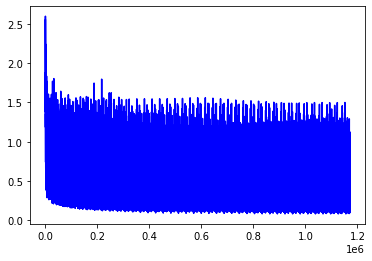

In [7]:
modeloUm = RedeNeuralModeloUm()

runnerUmCrossAdamBatch = RedeNeuralRunner(modeloUm,
                                     X_train, y_train,
                                     40,0.00015,'CrossEntropyLoss','Adam','runnerUmCrossAdamBatch',True)

runnerUmCrossAdamBatch.train()

In [8]:
runnerUmCrossAdamBatch.evaluate(X_test,y_test)

0.8539830758255982

In [10]:
runnerUmCrossAdamBatch.export()

Epoch: 29 Loss: 0.3974362909793854
Epoch: 29 Loss: 0.6810809969902039
Epoch: 29 Loss: 0.43525490164756775
Epoch: 29 Loss: 0.34443041682243347
Epoch: 29 Loss: 0.24206390976905823
Epoch: 29 Loss: 0.3870149552822113
Epoch: 29 Loss: 0.9767985343933105
Epoch: 29 Loss: 0.5500179529190063
Epoch: 29 Loss: 0.5696097612380981
Epoch: 29 Loss: 0.6461908221244812
Epoch: 29 Loss: 0.49104437232017517
Epoch: 29 Loss: 0.4094904363155365
Epoch: 29 Loss: 0.2131892293691635
Epoch: 29 Loss: 0.22612585127353668
Epoch: 29 Loss: 0.3499029874801636
Epoch: 29 Loss: 0.600213885307312
Epoch: 29 Loss: 0.5585858225822449
Epoch: 29 Loss: 0.16453638672828674
Epoch: 29 Loss: 0.2718258500099182
Epoch: 29 Loss: 0.675574779510498
Epoch: 29 Loss: 0.6340376138687134
Epoch: 29 Loss: 0.28808969259262085
Epoch: 29 Loss: 0.3683103919029236
Epoch: 29 Loss: 0.3743059039115906
Epoch: 29 Loss: 0.5541051030158997
Epoch: 29 Loss: 0.1890154480934143
Epoch: 29 Loss: 0.5331830978393555
Epoch: 29 Loss: 0.38319337368011475
Epoch: 29 Loss

Epoch: 29 Loss: 0.5557630658149719
Epoch: 29 Loss: 0.33529287576675415
Epoch: 29 Loss: 0.49957627058029175
Epoch: 29 Loss: 0.29103508591651917
Epoch: 29 Loss: 0.5192489624023438
Epoch: 29 Loss: 0.3025330603122711
Epoch: 29 Loss: 0.3172285854816437
Epoch: 29 Loss: 0.3808978199958801
Epoch: 29 Loss: 0.3657132387161255
Epoch: 29 Loss: 0.37943342328071594
Epoch: 29 Loss: 0.6606952548027039
Epoch: 29 Loss: 0.29375967383384705
Epoch: 29 Loss: 0.5494778156280518
Epoch: 29 Loss: 0.4434947967529297
Epoch: 29 Loss: 0.5845820903778076
Epoch: 29 Loss: 0.5914608836174011
Epoch: 29 Loss: 0.30623263120651245
Epoch: 29 Loss: 0.3632083535194397
Epoch: 29 Loss: 0.3014141023159027
Epoch: 29 Loss: 0.5246399641036987
Epoch: 29 Loss: 0.38973769545555115
Epoch: 29 Loss: 0.4628204107284546
Epoch: 29 Loss: 0.7115964293479919
Epoch: 29 Loss: 0.6970062851905823
Epoch: 29 Loss: 0.6246878504753113
Epoch: 29 Loss: 0.5656061172485352
Epoch: 29 Loss: 0.5313479900360107
Epoch: 29 Loss: 0.5166875123977661
Epoch: 29 Los

Epoch: 29 Loss: 0.3962749242782593
Epoch: 29 Loss: 0.27201321721076965
Epoch: 29 Loss: 0.3216552138328552
Epoch: 29 Loss: 0.5687724351882935
Epoch: 29 Loss: 0.7044320106506348
Epoch: 29 Loss: 0.2154781073331833
Epoch: 29 Loss: 0.4473499059677124
Epoch: 29 Loss: 1.1303865909576416
Epoch: 29 Loss: 0.6657334566116333
Epoch: 29 Loss: 0.5130255818367004
Epoch: 29 Loss: 0.38430285453796387
Epoch: 29 Loss: 0.6929998993873596
Epoch: 29 Loss: 0.3686923384666443
Epoch: 29 Loss: 0.31453776359558105
Epoch: 29 Loss: 0.5467007756233215
Epoch: 29 Loss: 0.38802090287208557
Epoch: 29 Loss: 0.3704996407032013
Epoch: 29 Loss: 0.1904904693365097
Epoch: 29 Loss: 0.45187246799468994
Epoch: 29 Loss: 0.4948717951774597
Epoch: 29 Loss: 0.5389847159385681
Epoch: 29 Loss: 0.5395237803459167
Epoch: 29 Loss: 0.4383651912212372
Epoch: 29 Loss: 0.21193411946296692
Epoch: 29 Loss: 0.8082064390182495
Epoch: 29 Loss: 0.4074214994907379
Epoch: 29 Loss: 0.4570808708667755
Epoch: 29 Loss: 0.4278167188167572
Epoch: 29 Loss

Epoch: 29 Loss: 0.5741214752197266
Epoch: 29 Loss: 0.521240770816803
Epoch: 29 Loss: 0.3852105140686035
Epoch: 29 Loss: 0.46642154455184937
Epoch: 29 Loss: 0.7118560671806335
Epoch: 29 Loss: 0.37523242831230164
Epoch: 29 Loss: 0.5032811164855957
Epoch: 29 Loss: 0.2544500231742859
Epoch: 29 Loss: 0.2713660001754761
Epoch: 29 Loss: 0.31519436836242676
Epoch: 29 Loss: 0.42942148447036743
Epoch: 29 Loss: 0.21078558266162872
Epoch: 29 Loss: 0.20534174144268036
Epoch: 29 Loss: 0.4865695536136627
Epoch: 29 Loss: 0.6297397017478943
Epoch: 29 Loss: 0.5441444516181946
Epoch: 29 Loss: 0.5381811261177063
Epoch: 29 Loss: 0.3117408752441406
Epoch: 29 Loss: 0.48524540662765503
Epoch: 29 Loss: 0.24187052249908447
Epoch: 29 Loss: 0.22727108001708984
Epoch: 29 Loss: 0.26479023694992065
Epoch: 29 Loss: 0.48738646507263184
Epoch: 29 Loss: 0.5334133505821228
Epoch: 29 Loss: 0.6091024279594421
Epoch: 29 Loss: 0.40106746554374695
Epoch: 29 Loss: 0.47831323742866516
Epoch: 29 Loss: 0.5893546342849731
Epoch: 2

Epoch: 29 Loss: 0.692318320274353
Epoch: 29 Loss: 0.4912128746509552
Epoch: 29 Loss: 0.4265713095664978
Epoch: 29 Loss: 0.24638782441616058
Epoch: 29 Loss: 0.29821842908859253
Epoch: 29 Loss: 0.5541131496429443
Epoch: 29 Loss: 0.4360353648662567
Epoch: 29 Loss: 0.3052566647529602
Epoch: 29 Loss: 0.17779609560966492
Epoch: 29 Loss: 0.6493712663650513
Epoch: 29 Loss: 0.3266409635543823
Epoch: 29 Loss: 0.25626716017723083
Epoch: 29 Loss: 0.25032839179039
Epoch: 29 Loss: 0.3281499147415161
Epoch: 29 Loss: 0.2921880781650543
Epoch: 29 Loss: 0.7481599450111389
Epoch: 29 Loss: 0.2554168999195099
Epoch: 29 Loss: 0.2631993293762207
Epoch: 29 Loss: 0.3814976215362549
Epoch: 29 Loss: 0.2565017342567444
Epoch: 29 Loss: 0.4887734055519104
Epoch: 29 Loss: 0.31619516015052795
Epoch: 29 Loss: 0.6570594906806946
Epoch: 29 Loss: 0.39511409401893616
Epoch: 29 Loss: 0.5846462845802307
Epoch: 29 Loss: 0.2895413041114807
Epoch: 29 Loss: 0.4336063265800476
Epoch: 29 Loss: 0.5935616493225098
Epoch: 29 Loss: 0

Epoch: 29 Loss: 0.2617209553718567
Epoch: 29 Loss: 0.32236409187316895
Epoch: 29 Loss: 0.39510926604270935
Epoch: 29 Loss: 0.31537505984306335
Epoch: 29 Loss: 0.3651491403579712
Epoch: 29 Loss: 0.4085122346878052
Epoch: 29 Loss: 0.2036914825439453
Epoch: 29 Loss: 0.2284637689590454
Epoch: 29 Loss: 0.5791430473327637
Epoch: 29 Loss: 0.599553108215332
Epoch: 29 Loss: 0.4099119305610657
Epoch: 29 Loss: 0.5611511468887329
Epoch: 29 Loss: 0.551659345626831
Epoch: 29 Loss: 0.5893435478210449
Epoch: 29 Loss: 0.3766152262687683
Epoch: 29 Loss: 0.5100563168525696
Epoch: 29 Loss: 0.3344987630844116
Epoch: 29 Loss: 0.3958754539489746
Epoch: 29 Loss: 0.4108419716358185
Epoch: 29 Loss: 0.41700708866119385
Epoch: 29 Loss: 0.5558905005455017
Epoch: 29 Loss: 0.2746095061302185
Epoch: 29 Loss: 0.49251580238342285
Epoch: 29 Loss: 0.4390734136104584
Epoch: 29 Loss: 0.34938564896583557
Epoch: 29 Loss: 0.358407199382782
Epoch: 29 Loss: 0.47251784801483154
Epoch: 29 Loss: 0.22473464906215668
Epoch: 29 Loss:

Epoch: 29 Loss: 0.47577103972435
Epoch: 29 Loss: 0.4679923951625824
Epoch: 29 Loss: 0.2681693732738495
Epoch: 29 Loss: 0.47964048385620117
Epoch: 29 Loss: 0.5052594542503357
Epoch: 29 Loss: 0.755239725112915
Epoch: 29 Loss: 0.7382836937904358
Epoch: 29 Loss: 0.34893131256103516
Epoch: 29 Loss: 0.31908273696899414
Epoch: 29 Loss: 0.4487781226634979
Epoch: 29 Loss: 0.2833895981311798
Epoch: 29 Loss: 0.5825623273849487
Epoch: 29 Loss: 0.5795709490776062
Epoch: 29 Loss: 0.35700416564941406
Epoch: 29 Loss: 0.32452985644340515
Epoch: 29 Loss: 0.47452232241630554
Epoch: 29 Loss: 0.6847103834152222
Epoch: 29 Loss: 0.21329905092716217
Epoch: 29 Loss: 0.477232962846756
Epoch: 29 Loss: 0.3652024269104004
Epoch: 29 Loss: 0.7809116840362549
Epoch: 29 Loss: 0.6172977089881897
Epoch: 29 Loss: 0.5227306485176086
Epoch: 29 Loss: 0.5907662510871887
Epoch: 29 Loss: 0.3255380392074585
Epoch: 29 Loss: 0.5474079251289368
Epoch: 29 Loss: 0.5564363598823547
Epoch: 29 Loss: 0.2099369466304779
Epoch: 29 Loss: 0

Epoch: 29 Loss: 0.4116863012313843
Epoch: 29 Loss: 0.37822097539901733
Epoch: 29 Loss: 0.591033399105072
Epoch: 29 Loss: 0.3864873945713043
Epoch: 29 Loss: 0.5251508355140686
Epoch: 29 Loss: 0.5207340717315674
Epoch: 29 Loss: 0.363940566778183
Epoch: 29 Loss: 0.5402715802192688
Epoch: 29 Loss: 0.348251074552536
Epoch: 29 Loss: 0.6911807656288147
Epoch: 29 Loss: 0.44004958868026733
Epoch: 29 Loss: 0.371155321598053
Epoch: 29 Loss: 0.5227885842323303
Epoch: 29 Loss: 0.3854323923587799
Epoch: 29 Loss: 0.4763305187225342
Epoch: 29 Loss: 0.4290011525154114
Epoch: 29 Loss: 0.6289570927619934
Epoch: 29 Loss: 0.5836735367774963
Epoch: 29 Loss: 0.488925039768219
Epoch: 29 Loss: 0.3679673373699188
Epoch: 29 Loss: 0.3760877251625061
Epoch: 29 Loss: 0.5501396656036377
Epoch: 29 Loss: 0.43138444423675537
Epoch: 29 Loss: 0.45146068930625916
Epoch: 29 Loss: 0.403850257396698
Epoch: 29 Loss: 0.6178348064422607
Epoch: 29 Loss: 0.3819710910320282
Epoch: 29 Loss: 0.5685729384422302
Epoch: 29 Loss: 0.5541

Epoch: 29 Loss: 0.4407285451889038
Epoch: 29 Loss: 0.386928915977478
Epoch: 29 Loss: 0.3475310504436493
Epoch: 29 Loss: 0.2733193337917328
Epoch: 29 Loss: 0.687768280506134
Epoch: 29 Loss: 0.4801032841205597
Epoch: 29 Loss: 0.39440417289733887
Epoch: 29 Loss: 0.3144708275794983
Epoch: 29 Loss: 1.1766763925552368
Epoch: 29 Loss: 0.27320706844329834
Epoch: 29 Loss: 0.39097660779953003
Epoch: 29 Loss: 0.8856598138809204
Epoch: 29 Loss: 0.8287782669067383
Epoch: 29 Loss: 0.40453028678894043
Epoch: 29 Loss: 0.4760609567165375
Epoch: 29 Loss: 0.4799438416957855
Epoch: 29 Loss: 0.3747541010379791
Epoch: 29 Loss: 0.31125152111053467
Epoch: 29 Loss: 0.3667973577976227
Epoch: 29 Loss: 0.4972466826438904
Epoch: 29 Loss: 0.5063332319259644
Epoch: 29 Loss: 0.21342802047729492
Epoch: 29 Loss: 0.5305613279342651
Epoch: 29 Loss: 0.4585071802139282
Epoch: 29 Loss: 0.357173889875412
Epoch: 29 Loss: 0.5905565619468689
Epoch: 29 Loss: 0.42363688349723816
Epoch: 29 Loss: 0.2476988285779953
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.44944363832473755
Epoch: 29 Loss: 0.7179217338562012
Epoch: 29 Loss: 0.4216184616088867
Epoch: 29 Loss: 0.506230890750885
Epoch: 29 Loss: 0.44350284337997437
Epoch: 29 Loss: 0.6542662978172302
Epoch: 29 Loss: 0.29736027121543884
Epoch: 29 Loss: 0.32918938994407654
Epoch: 29 Loss: 0.6062178611755371
Epoch: 29 Loss: 0.3278640806674957
Epoch: 29 Loss: 0.44757309556007385
Epoch: 29 Loss: 0.42398515343666077
Epoch: 29 Loss: 0.5594637989997864
Epoch: 29 Loss: 0.35054513812065125
Epoch: 29 Loss: 0.3687788248062134
Epoch: 29 Loss: 0.5591905117034912
Epoch: 29 Loss: 0.23015274107456207
Epoch: 29 Loss: 0.44859373569488525
Epoch: 29 Loss: 0.4214683473110199
Epoch: 29 Loss: 0.36852914094924927
Epoch: 29 Loss: 0.21483732759952545
Epoch: 29 Loss: 0.509245753288269
Epoch: 29 Loss: 0.28626057505607605
Epoch: 29 Loss: 0.28391367197036743
Epoch: 29 Loss: 0.3932760953903198
Epoch: 29 Loss: 0.4022897779941559
Epoch: 29 Loss: 0.37584298849105835
Epoch: 29 Loss: 0.3268548846244812
Epoch: 2

Epoch: 29 Loss: 0.2612954080104828
Epoch: 29 Loss: 0.4135812222957611
Epoch: 29 Loss: 0.4403749704360962
Epoch: 29 Loss: 0.6433767676353455
Epoch: 29 Loss: 0.4934704005718231
Epoch: 29 Loss: 0.4760831892490387
Epoch: 29 Loss: 0.3610844612121582
Epoch: 29 Loss: 0.3634573817253113
Epoch: 29 Loss: 0.28985798358917236
Epoch: 29 Loss: 0.6106464266777039
Epoch: 29 Loss: 0.4987143278121948
Epoch: 29 Loss: 0.6076308488845825
Epoch: 29 Loss: 0.6351052522659302
Epoch: 29 Loss: 0.34741055965423584
Epoch: 29 Loss: 0.5232250690460205
Epoch: 29 Loss: 0.4276173412799835
Epoch: 29 Loss: 0.2680127024650574
Epoch: 29 Loss: 0.5296969413757324
Epoch: 29 Loss: 0.41532284021377563
Epoch: 29 Loss: 0.320311963558197
Epoch: 29 Loss: 0.37924739718437195
Epoch: 29 Loss: 0.45778343081474304
Epoch: 29 Loss: 0.5534705519676208
Epoch: 29 Loss: 0.3362637758255005
Epoch: 29 Loss: 0.6022389531135559
Epoch: 29 Loss: 0.22843681275844574
Epoch: 29 Loss: 0.4004461467266083
Epoch: 29 Loss: 0.49846118688583374
Epoch: 29 Loss

Epoch: 29 Loss: 0.3340439200401306
Epoch: 29 Loss: 0.5501366853713989
Epoch: 29 Loss: 0.4905221462249756
Epoch: 29 Loss: 0.5913660526275635
Epoch: 29 Loss: 0.4169069826602936
Epoch: 29 Loss: 0.3674336373806
Epoch: 29 Loss: 0.4773007035255432
Epoch: 29 Loss: 0.8531711101531982
Epoch: 29 Loss: 0.4094177782535553
Epoch: 29 Loss: 0.23045755922794342
Epoch: 29 Loss: 0.6319502592086792
Epoch: 29 Loss: 0.4104387164115906
Epoch: 29 Loss: 0.38347169756889343
Epoch: 29 Loss: 0.6001224517822266
Epoch: 29 Loss: 0.5615231394767761
Epoch: 29 Loss: 0.4466400742530823
Epoch: 29 Loss: 0.312597393989563
Epoch: 29 Loss: 0.3680455684661865
Epoch: 29 Loss: 0.37799686193466187
Epoch: 29 Loss: 0.3988206088542938
Epoch: 29 Loss: 0.6362793445587158
Epoch: 29 Loss: 0.345325767993927
Epoch: 29 Loss: 0.6390653252601624
Epoch: 29 Loss: 0.23367908596992493
Epoch: 29 Loss: 0.39711055159568787
Epoch: 29 Loss: 0.2848450243473053
Epoch: 29 Loss: 0.4759182333946228
Epoch: 29 Loss: 0.4364774227142334
Epoch: 29 Loss: 0.53

Epoch: 29 Loss: 0.7487228512763977
Epoch: 29 Loss: 0.5734490752220154
Epoch: 29 Loss: 0.33051684498786926
Epoch: 29 Loss: 0.17236237227916718
Epoch: 29 Loss: 0.35868436098098755
Epoch: 29 Loss: 0.4340815544128418
Epoch: 29 Loss: 0.6389332413673401
Epoch: 29 Loss: 0.6130234599113464
Epoch: 29 Loss: 0.4326499402523041
Epoch: 29 Loss: 0.3065071403980255
Epoch: 29 Loss: 0.3921881914138794
Epoch: 29 Loss: 0.3446909189224243
Epoch: 29 Loss: 0.6254640221595764
Epoch: 29 Loss: 0.24355658888816833
Epoch: 29 Loss: 0.49161726236343384
Epoch: 29 Loss: 0.634405255317688
Epoch: 29 Loss: 0.4899914562702179
Epoch: 29 Loss: 0.5043351650238037
Epoch: 29 Loss: 0.5976831316947937
Epoch: 29 Loss: 0.27770039439201355
Epoch: 29 Loss: 0.5127595067024231
Epoch: 29 Loss: 0.4527806341648102
Epoch: 29 Loss: 0.4687716066837311
Epoch: 29 Loss: 0.38692277669906616
Epoch: 29 Loss: 0.4127819240093231
Epoch: 29 Loss: 0.6715893149375916
Epoch: 29 Loss: 0.49488183856010437
Epoch: 29 Loss: 0.4241144359111786
Epoch: 29 Los

Epoch: 29 Loss: 0.2541196644306183
Epoch: 29 Loss: 0.48308345675468445
Epoch: 29 Loss: 0.33881840109825134
Epoch: 29 Loss: 0.2847200930118561
Epoch: 29 Loss: 0.4599095582962036
Epoch: 29 Loss: 0.4213026463985443
Epoch: 29 Loss: 0.3312970697879791
Epoch: 29 Loss: 0.6747609972953796
Epoch: 29 Loss: 0.5452107787132263
Epoch: 29 Loss: 0.5539578795433044
Epoch: 29 Loss: 0.3096325993537903
Epoch: 29 Loss: 0.3897186815738678
Epoch: 29 Loss: 0.36912649869918823
Epoch: 29 Loss: 0.4959166347980499
Epoch: 29 Loss: 0.42818498611450195
Epoch: 29 Loss: 0.29461556673049927
Epoch: 29 Loss: 0.3880828619003296
Epoch: 29 Loss: 0.40698927640914917
Epoch: 29 Loss: 0.8590641617774963
Epoch: 29 Loss: 0.33750444650650024
Epoch: 29 Loss: 0.5255221128463745
Epoch: 29 Loss: 0.3839111626148224
Epoch: 29 Loss: 0.5629400610923767
Epoch: 29 Loss: 0.5234437584877014
Epoch: 29 Loss: 0.6517587900161743
Epoch: 29 Loss: 0.278950959444046
Epoch: 29 Loss: 0.5434882640838623
Epoch: 29 Loss: 0.3216308653354645
Epoch: 29 Loss

Epoch: 29 Loss: 0.3961840867996216
Epoch: 29 Loss: 0.31802138686180115
Epoch: 29 Loss: 0.31884095072746277
Epoch: 29 Loss: 0.4738749861717224
Epoch: 29 Loss: 0.268392950296402
Epoch: 29 Loss: 0.22811830043792725
Epoch: 29 Loss: 0.775199294090271
Epoch: 29 Loss: 0.25749197602272034
Epoch: 29 Loss: 0.41890743374824524
Epoch: 29 Loss: 0.33243945240974426
Epoch: 29 Loss: 0.3101554214954376
Epoch: 29 Loss: 0.3240848481655121
Epoch: 29 Loss: 0.2951844036579132
Epoch: 29 Loss: 0.5103058218955994
Epoch: 29 Loss: 0.7046622037887573
Epoch: 29 Loss: 0.4125376045703888
Epoch: 29 Loss: 0.6198607087135315
Epoch: 29 Loss: 0.5894583463668823
Epoch: 29 Loss: 0.48322793841362
Epoch: 29 Loss: 0.46545082330703735
Epoch: 29 Loss: 0.5171520113945007
Epoch: 29 Loss: 0.5427855253219604
Epoch: 29 Loss: 0.8788164258003235
Epoch: 29 Loss: 0.40666744112968445
Epoch: 29 Loss: 0.5123230814933777
Epoch: 29 Loss: 0.3827468156814575
Epoch: 29 Loss: 0.23796731233596802
Epoch: 29 Loss: 0.20737145841121674
Epoch: 29 Loss

Epoch: 29 Loss: 0.5556370615959167
Epoch: 29 Loss: 0.2331552654504776
Epoch: 29 Loss: 0.5143815875053406
Epoch: 29 Loss: 0.6475539803504944
Epoch: 29 Loss: 0.7200567126274109
Epoch: 29 Loss: 0.3424706757068634
Epoch: 29 Loss: 0.5763224959373474
Epoch: 29 Loss: 0.4368216097354889
Epoch: 29 Loss: 0.3522406220436096
Epoch: 29 Loss: 0.7643925547599792
Epoch: 29 Loss: 0.4916363060474396
Epoch: 29 Loss: 0.6180622577667236
Epoch: 29 Loss: 0.4388377368450165
Epoch: 29 Loss: 0.2037263661623001
Epoch: 29 Loss: 0.6705103516578674
Epoch: 29 Loss: 0.5192421078681946
Epoch: 29 Loss: 0.33289211988449097
Epoch: 29 Loss: 0.48144084215164185
Epoch: 29 Loss: 0.26311323046684265
Epoch: 29 Loss: 0.6060196757316589
Epoch: 29 Loss: 0.30186671018600464
Epoch: 29 Loss: 0.24534960091114044
Epoch: 29 Loss: 0.7371952533721924
Epoch: 29 Loss: 0.3191124200820923
Epoch: 29 Loss: 0.33400261402130127
Epoch: 29 Loss: 0.35981911420822144
Epoch: 29 Loss: 0.1465195268392563
Epoch: 29 Loss: 0.37851789593696594
Epoch: 29 Lo

Epoch: 29 Loss: 1.423215627670288
Epoch: 29 Loss: 0.5483912229537964
Epoch: 29 Loss: 0.583308219909668
Epoch: 29 Loss: 0.445792019367218
Epoch: 29 Loss: 0.2999933362007141
Epoch: 29 Loss: 0.22632506489753723
Epoch: 29 Loss: 0.5522841215133667
Epoch: 29 Loss: 0.3372113108634949
Epoch: 29 Loss: 0.45131224393844604
Epoch: 29 Loss: 0.3397388160228729
Epoch: 29 Loss: 0.28650805354118347
Epoch: 29 Loss: 0.6623854041099548
Epoch: 29 Loss: 0.4383910894393921
Epoch: 29 Loss: 0.34158948063850403
Epoch: 29 Loss: 0.4472005367279053
Epoch: 29 Loss: 0.42539405822753906
Epoch: 29 Loss: 0.26418933272361755
Epoch: 29 Loss: 0.646055281162262
Epoch: 29 Loss: 0.5119940638542175
Epoch: 29 Loss: 0.9257221817970276
Epoch: 29 Loss: 0.25745388865470886
Epoch: 29 Loss: 0.3865470290184021
Epoch: 29 Loss: 0.25704532861709595
Epoch: 29 Loss: 0.46840953826904297
Epoch: 29 Loss: 0.5426083207130432
Epoch: 29 Loss: 0.4848162531852722
Epoch: 29 Loss: 0.4590846300125122
Epoch: 29 Loss: 0.4490112364292145
Epoch: 29 Loss:

Epoch: 29 Loss: 0.42266368865966797
Epoch: 29 Loss: 0.5823018550872803
Epoch: 29 Loss: 0.37131980061531067
Epoch: 29 Loss: 0.3311004936695099
Epoch: 29 Loss: 0.3663884997367859
Epoch: 29 Loss: 0.5477018356323242
Epoch: 29 Loss: 0.29032862186431885
Epoch: 29 Loss: 0.27123504877090454
Epoch: 29 Loss: 0.6612098813056946
Epoch: 29 Loss: 0.8726202845573425
Epoch: 29 Loss: 0.34591612219810486
Epoch: 29 Loss: 0.444335013628006
Epoch: 29 Loss: 0.6859121322631836
Epoch: 29 Loss: 0.6029543280601501
Epoch: 29 Loss: 0.8192843198776245
Epoch: 29 Loss: 0.5913898348808289
Epoch: 29 Loss: 0.6053706407546997
Epoch: 29 Loss: 0.4934607446193695
Epoch: 29 Loss: 0.6028838753700256
Epoch: 29 Loss: 0.39700913429260254
Epoch: 29 Loss: 0.5395305156707764
Epoch: 29 Loss: 0.43465426564216614
Epoch: 29 Loss: 0.22374317049980164
Epoch: 29 Loss: 0.599036693572998
Epoch: 29 Loss: 0.41197481751441956
Epoch: 29 Loss: 0.9316821098327637
Epoch: 29 Loss: 0.5405529737472534
Epoch: 29 Loss: 0.2907870411872864
Epoch: 29 Los

Epoch: 29 Loss: 0.3365626931190491
Epoch: 29 Loss: 0.5014844536781311
Epoch: 29 Loss: 0.7660683393478394
Epoch: 29 Loss: 0.31897956132888794
Epoch: 29 Loss: 0.5698291063308716
Epoch: 29 Loss: 0.6110820174217224
Epoch: 29 Loss: 0.23418883979320526
Epoch: 29 Loss: 0.25158020853996277
Epoch: 29 Loss: 0.40522319078445435
Epoch: 29 Loss: 0.38691267371177673
Epoch: 29 Loss: 0.614618182182312
Epoch: 29 Loss: 0.6003167033195496
Epoch: 29 Loss: 0.5404253005981445
Epoch: 29 Loss: 0.7775470018386841
Epoch: 29 Loss: 0.3515051603317261
Epoch: 29 Loss: 0.4085499048233032
Epoch: 29 Loss: 0.4423213303089142
Epoch: 29 Loss: 0.30483919382095337
Epoch: 29 Loss: 0.3367272913455963
Epoch: 29 Loss: 0.485838919878006
Epoch: 29 Loss: 0.5227733850479126
Epoch: 29 Loss: 0.6841848492622375
Epoch: 29 Loss: 0.4828540086746216
Epoch: 29 Loss: 0.6613569855690002
Epoch: 29 Loss: 0.2880564033985138
Epoch: 29 Loss: 0.6352359056472778
Epoch: 29 Loss: 0.5175763368606567
Epoch: 29 Loss: 0.2719694972038269
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.4743470549583435
Epoch: 29 Loss: 0.7927127480506897
Epoch: 29 Loss: 0.5613731145858765
Epoch: 29 Loss: 1.1485575437545776
Epoch: 29 Loss: 0.4053908586502075
Epoch: 29 Loss: 0.41044971346855164
Epoch: 29 Loss: 0.7780505418777466
Epoch: 29 Loss: 0.3190746009349823
Epoch: 29 Loss: 0.44406580924987793
Epoch: 29 Loss: 0.5265694260597229
Epoch: 29 Loss: 0.7261069416999817
Epoch: 29 Loss: 0.2893693745136261
Epoch: 29 Loss: 0.6069642305374146
Epoch: 29 Loss: 0.23488356173038483
Epoch: 29 Loss: 0.3641752004623413
Epoch: 29 Loss: 0.9172732830047607
Epoch: 29 Loss: 0.25809258222579956
Epoch: 29 Loss: 0.20501741766929626
Epoch: 29 Loss: 0.5766079425811768
Epoch: 29 Loss: 0.447213739156723
Epoch: 29 Loss: 0.36406823992729187
Epoch: 29 Loss: 0.4149726927280426
Epoch: 29 Loss: 0.2693939208984375
Epoch: 29 Loss: 0.3162280321121216
Epoch: 29 Loss: 0.6817911863327026
Epoch: 29 Loss: 0.47148773074150085
Epoch: 29 Loss: 0.5407182574272156
Epoch: 29 Loss: 0.25645819306373596
Epoch: 29 Los

Epoch: 29 Loss: 0.5407456755638123
Epoch: 29 Loss: 0.6635377407073975
Epoch: 29 Loss: 0.254027396440506
Epoch: 29 Loss: 0.34964510798454285
Epoch: 29 Loss: 0.4098672866821289
Epoch: 29 Loss: 0.4144953191280365
Epoch: 29 Loss: 0.482692688703537
Epoch: 29 Loss: 0.45038583874702454
Epoch: 29 Loss: 0.5462122559547424
Epoch: 29 Loss: 0.7250424027442932
Epoch: 29 Loss: 0.6890071630477905
Epoch: 29 Loss: 0.5345790386199951
Epoch: 29 Loss: 0.37340089678764343
Epoch: 29 Loss: 0.5286435484886169
Epoch: 29 Loss: 0.3489053249359131
Epoch: 29 Loss: 0.4524567723274231
Epoch: 29 Loss: 0.37892287969589233
Epoch: 29 Loss: 0.8348302841186523
Epoch: 29 Loss: 0.5676342248916626
Epoch: 29 Loss: 0.2873949408531189
Epoch: 29 Loss: 0.49263983964920044
Epoch: 29 Loss: 1.5934748649597168
Epoch: 29 Loss: 0.304778128862381
Epoch: 29 Loss: 0.29798761010169983
Epoch: 29 Loss: 0.368875652551651
Epoch: 29 Loss: 0.3691326379776001
Epoch: 29 Loss: 0.2602541744709015
Epoch: 29 Loss: 0.5041735172271729
Epoch: 29 Loss: 0.

Epoch: 29 Loss: 0.5002965331077576
Epoch: 29 Loss: 0.5668416619300842
Epoch: 29 Loss: 0.2813969552516937
Epoch: 29 Loss: 0.6792965531349182
Epoch: 29 Loss: 0.40410664677619934
Epoch: 29 Loss: 0.4285348057746887
Epoch: 29 Loss: 0.3762968182563782
Epoch: 29 Loss: 0.3963078558444977
Epoch: 29 Loss: 0.4308951199054718
Epoch: 29 Loss: 0.44503289461135864
Epoch: 29 Loss: 0.42605268955230713
Epoch: 29 Loss: 0.33188721537590027
Epoch: 29 Loss: 0.7247432470321655
Epoch: 29 Loss: 0.623973548412323
Epoch: 29 Loss: 0.5629083514213562
Epoch: 29 Loss: 0.3026602268218994
Epoch: 29 Loss: 0.5658968091011047
Epoch: 29 Loss: 0.3481569290161133
Epoch: 29 Loss: 0.21614761650562286
Epoch: 29 Loss: 0.6417233347892761
Epoch: 29 Loss: 0.7632914781570435
Epoch: 29 Loss: 0.4199954569339752
Epoch: 29 Loss: 0.613993763923645
Epoch: 29 Loss: 0.4219720959663391
Epoch: 29 Loss: 0.42655545473098755
Epoch: 29 Loss: 0.4190877377986908
Epoch: 29 Loss: 0.4782869219779968
Epoch: 29 Loss: 0.6000949144363403
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.471932977437973
Epoch: 29 Loss: 0.42515721917152405
Epoch: 29 Loss: 1.153308629989624
Epoch: 29 Loss: 0.4474056661128998
Epoch: 29 Loss: 0.5042400360107422
Epoch: 29 Loss: 0.4193902015686035
Epoch: 29 Loss: 0.4941455125808716
Epoch: 29 Loss: 0.3923981487751007
Epoch: 29 Loss: 0.23296621441841125
Epoch: 29 Loss: 0.6215776801109314
Epoch: 29 Loss: 0.38205844163894653
Epoch: 29 Loss: 0.3833349049091339
Epoch: 29 Loss: 0.40556395053863525
Epoch: 29 Loss: 0.40470176935195923
Epoch: 29 Loss: 0.44598957896232605
Epoch: 29 Loss: 0.3767991065979004
Epoch: 29 Loss: 0.22928465902805328
Epoch: 29 Loss: 0.5179439187049866
Epoch: 29 Loss: 0.42831382155418396
Epoch: 29 Loss: 0.5704668760299683
Epoch: 29 Loss: 0.4298820495605469
Epoch: 29 Loss: 0.44148045778274536
Epoch: 29 Loss: 0.4470582604408264
Epoch: 29 Loss: 0.8709684014320374
Epoch: 29 Loss: 0.4491519033908844
Epoch: 29 Loss: 0.44483208656311035
Epoch: 29 Loss: 0.610762357711792
Epoch: 29 Loss: 0.7890664339065552
Epoch: 29 Los

Epoch: 29 Loss: 0.26287195086479187
Epoch: 29 Loss: 0.6425552368164062
Epoch: 29 Loss: 0.4926418364048004
Epoch: 29 Loss: 0.3017027676105499
Epoch: 29 Loss: 0.533825695514679
Epoch: 29 Loss: 0.39169707894325256
Epoch: 29 Loss: 0.7987062931060791
Epoch: 29 Loss: 0.23287005722522736
Epoch: 29 Loss: 0.22801484167575836
Epoch: 29 Loss: 0.32992443442344666
Epoch: 29 Loss: 0.3709977865219116
Epoch: 29 Loss: 0.5988575220108032
Epoch: 29 Loss: 0.24762822687625885
Epoch: 29 Loss: 0.6048160791397095
Epoch: 29 Loss: 0.33622926473617554
Epoch: 29 Loss: 0.3325132727622986
Epoch: 29 Loss: 0.5464730858802795
Epoch: 29 Loss: 0.36928099393844604
Epoch: 29 Loss: 0.4178200364112854
Epoch: 29 Loss: 0.39785656332969666
Epoch: 29 Loss: 0.45374977588653564
Epoch: 29 Loss: 0.23813438415527344
Epoch: 29 Loss: 0.4962433874607086
Epoch: 29 Loss: 0.21319206058979034
Epoch: 29 Loss: 0.6850737929344177
Epoch: 29 Loss: 0.3601077198982239
Epoch: 29 Loss: 0.5585692524909973
Epoch: 29 Loss: 0.5697553157806396
Epoch: 29

Epoch: 29 Loss: 0.5398311614990234
Epoch: 29 Loss: 0.692326545715332
Epoch: 29 Loss: 0.44994911551475525
Epoch: 29 Loss: 0.8696865439414978
Epoch: 29 Loss: 0.2505478262901306
Epoch: 29 Loss: 0.394184947013855
Epoch: 29 Loss: 0.43506017327308655
Epoch: 29 Loss: 0.26170286536216736
Epoch: 29 Loss: 0.3943425416946411
Epoch: 29 Loss: 0.3902946412563324
Epoch: 29 Loss: 0.32061052322387695
Epoch: 29 Loss: 0.31122997403144836
Epoch: 29 Loss: 0.4793078899383545
Epoch: 29 Loss: 0.7919491529464722
Epoch: 29 Loss: 0.49589207768440247
Epoch: 29 Loss: 0.4415395259857178
Epoch: 29 Loss: 0.5370256304740906
Epoch: 29 Loss: 0.4675159156322479
Epoch: 29 Loss: 0.6189277172088623
Epoch: 29 Loss: 0.2027556300163269
Epoch: 29 Loss: 0.4520317316055298
Epoch: 29 Loss: 0.3903580605983734
Epoch: 29 Loss: 0.4447973072528839
Epoch: 29 Loss: 0.3999021351337433
Epoch: 29 Loss: 0.12327542901039124
Epoch: 29 Loss: 0.45925310254096985
Epoch: 29 Loss: 0.2631101906299591
Epoch: 29 Loss: 0.4753122925758362
Epoch: 29 Loss

Epoch: 29 Loss: 0.4284961223602295
Epoch: 29 Loss: 0.2972986698150635
Epoch: 29 Loss: 0.4774687886238098
Epoch: 29 Loss: 0.3576684892177582
Epoch: 29 Loss: 0.5741550326347351
Epoch: 29 Loss: 0.33410316705703735
Epoch: 29 Loss: 0.34914690256118774
Epoch: 29 Loss: 0.4016773998737335
Epoch: 29 Loss: 0.20933304727077484
Epoch: 29 Loss: 0.8118628859519958
Epoch: 29 Loss: 0.5792855620384216
Epoch: 29 Loss: 0.6842894554138184
Epoch: 29 Loss: 0.43764787912368774
Epoch: 29 Loss: 0.24788716435432434
Epoch: 29 Loss: 0.3065616488456726
Epoch: 29 Loss: 0.3403206467628479
Epoch: 29 Loss: 0.5002155900001526
Epoch: 29 Loss: 0.5014469623565674
Epoch: 29 Loss: 0.34818902611732483
Epoch: 29 Loss: 0.40745478868484497
Epoch: 29 Loss: 0.5536395311355591
Epoch: 29 Loss: 0.24042917788028717
Epoch: 29 Loss: 0.7048352360725403
Epoch: 29 Loss: 0.46224626898765564
Epoch: 29 Loss: 0.3892703056335449
Epoch: 29 Loss: 0.48095181584358215
Epoch: 29 Loss: 0.47024768590927124
Epoch: 29 Loss: 0.35696107149124146
Epoch: 2

Epoch: 29 Loss: 0.4526499807834625
Epoch: 29 Loss: 0.9320440888404846
Epoch: 29 Loss: 0.4304422438144684
Epoch: 29 Loss: 0.7055225372314453
Epoch: 29 Loss: 0.21300408244132996
Epoch: 29 Loss: 0.26564258337020874
Epoch: 29 Loss: 0.5380038619041443
Epoch: 29 Loss: 0.6804963946342468
Epoch: 29 Loss: 0.1944170445203781
Epoch: 29 Loss: 0.37683042883872986
Epoch: 29 Loss: 0.2653603255748749
Epoch: 29 Loss: 0.5196788311004639
Epoch: 29 Loss: 0.26468032598495483
Epoch: 29 Loss: 0.4212954044342041
Epoch: 29 Loss: 0.34734106063842773
Epoch: 29 Loss: 0.4426046907901764
Epoch: 29 Loss: 0.7485604286193848
Epoch: 29 Loss: 0.30757367610931396
Epoch: 29 Loss: 0.49068835377693176
Epoch: 29 Loss: 0.4884296953678131
Epoch: 29 Loss: 0.4787755608558655
Epoch: 29 Loss: 0.31978967785835266
Epoch: 29 Loss: 0.4349743723869324
Epoch: 29 Loss: 0.4162804186344147
Epoch: 29 Loss: 0.739257276058197
Epoch: 29 Loss: 0.399533748626709
Epoch: 29 Loss: 0.6157766580581665
Epoch: 29 Loss: 0.2375641167163849
Epoch: 29 Loss

Epoch: 29 Loss: 0.35172438621520996
Epoch: 29 Loss: 0.43617984652519226
Epoch: 29 Loss: 0.36202722787857056
Epoch: 29 Loss: 0.35419970750808716
Epoch: 29 Loss: 0.5500412583351135
Epoch: 29 Loss: 0.9750425219535828
Epoch: 29 Loss: 0.6657019853591919
Epoch: 29 Loss: 0.5760554671287537
Epoch: 29 Loss: 0.22951145470142365
Epoch: 29 Loss: 0.24871312081813812
Epoch: 29 Loss: 0.4696148633956909
Epoch: 29 Loss: 0.6356969475746155
Epoch: 29 Loss: 0.3446162939071655
Epoch: 29 Loss: 0.4690846800804138
Epoch: 29 Loss: 0.3539406359195709
Epoch: 29 Loss: 0.3796025216579437
Epoch: 29 Loss: 0.6369551420211792
Epoch: 29 Loss: 0.5204439759254456
Epoch: 29 Loss: 1.1202337741851807
Epoch: 29 Loss: 0.5851967930793762
Epoch: 29 Loss: 0.39926451444625854
Epoch: 29 Loss: 0.36706647276878357
Epoch: 29 Loss: 0.5765553712844849
Epoch: 29 Loss: 0.5082536935806274
Epoch: 29 Loss: 0.4134560525417328
Epoch: 29 Loss: 0.5082533955574036
Epoch: 29 Loss: 0.837012529373169
Epoch: 29 Loss: 0.4918825924396515
Epoch: 29 Los

Epoch: 29 Loss: 0.19561482965946198
Epoch: 29 Loss: 0.3822484314441681
Epoch: 29 Loss: 0.2516117990016937
Epoch: 29 Loss: 0.34135183691978455
Epoch: 29 Loss: 0.6143373847007751
Epoch: 29 Loss: 0.2919158339500427
Epoch: 29 Loss: 0.6494247317314148
Epoch: 29 Loss: 0.2626519501209259
Epoch: 29 Loss: 0.2662866711616516
Epoch: 29 Loss: 0.6798117756843567
Epoch: 29 Loss: 0.3940938413143158
Epoch: 29 Loss: 0.5544186234474182
Epoch: 29 Loss: 0.5394818782806396
Epoch: 29 Loss: 0.8471275568008423
Epoch: 29 Loss: 0.20070187747478485
Epoch: 29 Loss: 0.5649378895759583
Epoch: 29 Loss: 0.5185282826423645
Epoch: 29 Loss: 0.662083625793457
Epoch: 29 Loss: 0.6327073574066162
Epoch: 29 Loss: 0.4634208381175995
Epoch: 29 Loss: 0.37278634309768677
Epoch: 29 Loss: 0.29673779010772705
Epoch: 29 Loss: 0.36520975828170776
Epoch: 29 Loss: 0.5966499447822571
Epoch: 29 Loss: 0.34441083669662476
Epoch: 29 Loss: 0.69941645860672
Epoch: 29 Loss: 0.5389943718910217
Epoch: 29 Loss: 0.5925753116607666
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.4400741755962372
Epoch: 29 Loss: 0.6454019546508789
Epoch: 29 Loss: 0.34751251339912415
Epoch: 29 Loss: 0.5767471790313721
Epoch: 29 Loss: 0.403569757938385
Epoch: 29 Loss: 0.5342376232147217
Epoch: 29 Loss: 0.2658476233482361
Epoch: 29 Loss: 0.37933090329170227
Epoch: 29 Loss: 0.6490578651428223
Epoch: 29 Loss: 0.5985362529754639
Epoch: 29 Loss: 0.3319441080093384
Epoch: 29 Loss: 0.4353622794151306
Epoch: 29 Loss: 0.6393110156059265
Epoch: 29 Loss: 0.2526474893093109
Epoch: 29 Loss: 0.5282443165779114
Epoch: 29 Loss: 0.45716142654418945
Epoch: 29 Loss: 0.5228180289268494
Epoch: 29 Loss: 0.5268077254295349
Epoch: 29 Loss: 0.3800157606601715
Epoch: 29 Loss: 0.3090871572494507
Epoch: 29 Loss: 0.331419438123703
Epoch: 29 Loss: 0.404825359582901
Epoch: 29 Loss: 0.47547101974487305
Epoch: 29 Loss: 0.5053221583366394
Epoch: 29 Loss: 0.2888389527797699
Epoch: 29 Loss: 0.5713289380073547
Epoch: 29 Loss: 0.44855719804763794
Epoch: 29 Loss: 0.5045914649963379
Epoch: 29 Loss: 1.

Epoch: 29 Loss: 0.5388509631156921
Epoch: 29 Loss: 0.8358751535415649
Epoch: 29 Loss: 0.5210726261138916
Epoch: 29 Loss: 0.505846381187439
Epoch: 29 Loss: 0.3425757884979248
Epoch: 29 Loss: 0.37784039974212646
Epoch: 29 Loss: 0.7803424000740051
Epoch: 29 Loss: 0.2443510740995407
Epoch: 29 Loss: 0.5217781662940979
Epoch: 29 Loss: 0.4025987684726715
Epoch: 29 Loss: 0.37144795060157776
Epoch: 29 Loss: 0.32235684990882874
Epoch: 29 Loss: 0.49775204062461853
Epoch: 29 Loss: 0.48866182565689087
Epoch: 29 Loss: 0.3443196713924408
Epoch: 29 Loss: 0.3680639863014221
Epoch: 29 Loss: 0.5495581030845642
Epoch: 29 Loss: 0.40785330533981323
Epoch: 29 Loss: 0.3827170729637146
Epoch: 29 Loss: 0.7838534712791443
Epoch: 29 Loss: 0.40765249729156494
Epoch: 29 Loss: 0.37499481439590454
Epoch: 29 Loss: 0.2452588677406311
Epoch: 29 Loss: 0.5069959759712219
Epoch: 29 Loss: 0.40248996019363403
Epoch: 29 Loss: 0.43697240948677063
Epoch: 29 Loss: 0.3227965831756592
Epoch: 29 Loss: 0.44572553038597107
Epoch: 29 

Epoch: 29 Loss: 0.21527837216854095
Epoch: 29 Loss: 0.5220616459846497
Epoch: 29 Loss: 0.7704852223396301
Epoch: 29 Loss: 0.47028523683547974
Epoch: 29 Loss: 0.41163116693496704
Epoch: 29 Loss: 0.514154851436615
Epoch: 29 Loss: 0.5427696704864502
Epoch: 29 Loss: 0.3413764238357544
Epoch: 29 Loss: 0.25108984112739563
Epoch: 29 Loss: 0.2909146249294281
Epoch: 29 Loss: 0.3005719780921936
Epoch: 29 Loss: 0.47210660576820374
Epoch: 29 Loss: 0.5608250498771667
Epoch: 29 Loss: 0.5394400954246521
Epoch: 29 Loss: 0.4242912232875824
Epoch: 29 Loss: 0.5467286109924316
Epoch: 29 Loss: 0.31769081950187683
Epoch: 29 Loss: 0.5150725841522217
Epoch: 29 Loss: 0.2072681486606598
Epoch: 29 Loss: 0.2688025236129761
Epoch: 29 Loss: 0.44694915413856506
Epoch: 29 Loss: 0.3488353192806244
Epoch: 29 Loss: 0.5394638776779175
Epoch: 29 Loss: 0.29946595430374146
Epoch: 29 Loss: 0.631417989730835
Epoch: 29 Loss: 0.27021729946136475
Epoch: 29 Loss: 0.3063279688358307
Epoch: 29 Loss: 0.6394277811050415
Epoch: 29 Los

Epoch: 29 Loss: 0.41021978855133057
Epoch: 29 Loss: 0.5769005417823792
Epoch: 29 Loss: 0.7816450595855713
Epoch: 29 Loss: 0.7162703275680542
Epoch: 29 Loss: 0.8355292677879333
Epoch: 29 Loss: 0.6035842895507812
Epoch: 29 Loss: 1.633669137954712
Epoch: 29 Loss: 0.47181037068367004
Epoch: 29 Loss: 0.618441104888916
Epoch: 29 Loss: 0.5233030319213867
Epoch: 29 Loss: 0.4001462757587433
Epoch: 29 Loss: 0.4724496304988861
Epoch: 29 Loss: 0.5121079087257385
Epoch: 29 Loss: 0.5117254257202148
Epoch: 29 Loss: 0.5348575711250305
Epoch: 29 Loss: 0.390440970659256
Epoch: 29 Loss: 0.383729487657547
Epoch: 29 Loss: 0.6588603854179382
Epoch: 29 Loss: 0.21389934420585632
Epoch: 29 Loss: 0.4472942054271698
Epoch: 29 Loss: 0.3456234931945801
Epoch: 29 Loss: 0.7078912854194641
Epoch: 29 Loss: 0.7945444583892822
Epoch: 29 Loss: 0.4705269932746887
Epoch: 29 Loss: 0.7000463604927063
Epoch: 29 Loss: 0.37960076332092285
Epoch: 29 Loss: 0.40896180272102356
Epoch: 29 Loss: 0.2317889779806137
Epoch: 29 Loss: 0.8

Epoch: 29 Loss: 0.5078997611999512
Epoch: 29 Loss: 0.7557963728904724
Epoch: 29 Loss: 0.20839497447013855
Epoch: 29 Loss: 0.6503974795341492
Epoch: 29 Loss: 0.0833371952176094
Epoch: 29 Loss: 0.43521827459335327
Epoch: 29 Loss: 0.7674998044967651
Epoch: 29 Loss: 0.2145128697156906
Epoch: 29 Loss: 0.2411826252937317
Epoch: 29 Loss: 0.3820929527282715
Epoch: 29 Loss: 0.5431057810783386
Epoch: 29 Loss: 0.517169713973999
Epoch: 29 Loss: 0.4915339946746826
Epoch: 29 Loss: 0.5791665315628052
Epoch: 29 Loss: 0.3015555739402771
Epoch: 29 Loss: 0.30518418550491333
Epoch: 29 Loss: 0.6782746911048889
Epoch: 29 Loss: 0.4440539479255676
Epoch: 29 Loss: 0.6069910526275635
Epoch: 29 Loss: 0.33037564158439636
Epoch: 29 Loss: 0.5367327332496643
Epoch: 29 Loss: 0.49009034037590027
Epoch: 29 Loss: 0.3154059052467346
Epoch: 29 Loss: 0.32025355100631714
Epoch: 29 Loss: 0.3312705159187317
Epoch: 29 Loss: 0.8591116070747375
Epoch: 29 Loss: 0.5805796384811401
Epoch: 29 Loss: 1.0510938167572021
Epoch: 29 Loss:

Epoch: 29 Loss: 0.17563319206237793
Epoch: 29 Loss: 0.41299116611480713
Epoch: 29 Loss: 0.7525029182434082
Epoch: 29 Loss: 0.27754783630371094
Epoch: 29 Loss: 0.3970714807510376
Epoch: 29 Loss: 0.464852511882782
Epoch: 29 Loss: 0.380243718624115
Epoch: 29 Loss: 0.2557140290737152
Epoch: 29 Loss: 0.3149659335613251
Epoch: 29 Loss: 0.4167674779891968
Epoch: 29 Loss: 0.6050294637680054
Epoch: 29 Loss: 0.6700233817100525
Epoch: 29 Loss: 0.5876149535179138
Epoch: 29 Loss: 0.8207641839981079
Epoch: 29 Loss: 0.5671831369400024
Epoch: 29 Loss: 0.581146240234375
Epoch: 29 Loss: 0.37461888790130615
Epoch: 29 Loss: 0.568615734577179
Epoch: 29 Loss: 0.5442992448806763
Epoch: 29 Loss: 0.5795155763626099
Epoch: 29 Loss: 0.4476536512374878
Epoch: 29 Loss: 0.6210951209068298
Epoch: 29 Loss: 0.4097701609134674
Epoch: 29 Loss: 0.6894907355308533
Epoch: 29 Loss: 0.49182313680648804
Epoch: 29 Loss: 0.19232839345932007
Epoch: 29 Loss: 0.2455696314573288
Epoch: 29 Loss: 0.3887485861778259
Epoch: 29 Loss: 0.

Epoch: 29 Loss: 0.3238851726055145
Epoch: 29 Loss: 0.5314880013465881
Epoch: 29 Loss: 0.47097542881965637
Epoch: 29 Loss: 0.5708694458007812
Epoch: 29 Loss: 0.7079901695251465
Epoch: 29 Loss: 0.3635529577732086
Epoch: 29 Loss: 0.5282871723175049
Epoch: 29 Loss: 0.5716937780380249
Epoch: 29 Loss: 0.503426194190979
Epoch: 29 Loss: 0.7406684160232544
Epoch: 29 Loss: 0.6916399598121643
Epoch: 29 Loss: 2.0077970027923584
Epoch: 29 Loss: 0.184024840593338
Epoch: 29 Loss: 0.6493735313415527
Epoch: 29 Loss: 0.38955003023147583
Epoch: 29 Loss: 0.7578661441802979
Epoch: 29 Loss: 0.4140946567058563
Epoch: 29 Loss: 0.4248436987400055
Epoch: 29 Loss: 0.19299234449863434
Epoch: 29 Loss: 0.8517246842384338
Epoch: 29 Loss: 0.3535773754119873
Epoch: 29 Loss: 0.3585679531097412
Epoch: 29 Loss: 0.5011751651763916
Epoch: 29 Loss: 0.343273788690567
Epoch: 29 Loss: 0.437624990940094
Epoch: 29 Loss: 0.7885462045669556
Epoch: 29 Loss: 0.2980491816997528
Epoch: 29 Loss: 0.2121068835258484
Epoch: 29 Loss: 0.454

Epoch: 29 Loss: 0.5468551516532898
Epoch: 29 Loss: 0.4189828932285309
Epoch: 29 Loss: 0.637459397315979
Epoch: 29 Loss: 0.1941487342119217
Epoch: 29 Loss: 0.39506712555885315
Epoch: 29 Loss: 0.5355569124221802
Epoch: 29 Loss: 0.6259230375289917
Epoch: 29 Loss: 0.31706446409225464
Epoch: 29 Loss: 0.3441624939441681
Epoch: 29 Loss: 0.6265764832496643
Epoch: 29 Loss: 0.5189749002456665
Epoch: 29 Loss: 0.4469043016433716
Epoch: 29 Loss: 0.398929238319397
Epoch: 29 Loss: 0.4348396360874176
Epoch: 29 Loss: 0.49444204568862915
Epoch: 29 Loss: 0.3915024995803833
Epoch: 29 Loss: 0.42381083965301514
Epoch: 29 Loss: 0.2036220282316208
Epoch: 29 Loss: 0.38731759786605835
Epoch: 29 Loss: 0.6411057114601135
Epoch: 29 Loss: 0.46704718470573425
Epoch: 29 Loss: 0.39257165789604187
Epoch: 29 Loss: 1.0305612087249756
Epoch: 29 Loss: 0.3832426071166992
Epoch: 29 Loss: 0.2856098413467407
Epoch: 29 Loss: 0.3851059377193451
Epoch: 29 Loss: 0.4276789128780365
Epoch: 29 Loss: 0.4415366053581238
Epoch: 29 Loss:

Epoch: 29 Loss: 0.3756045997142792
Epoch: 29 Loss: 0.49172499775886536
Epoch: 29 Loss: 0.35269564390182495
Epoch: 29 Loss: 0.6382766962051392
Epoch: 29 Loss: 0.3152316212654114
Epoch: 29 Loss: 0.3537105917930603
Epoch: 29 Loss: 0.46070754528045654
Epoch: 29 Loss: 0.46676746010780334
Epoch: 29 Loss: 0.3360227048397064
Epoch: 29 Loss: 0.45658615231513977
Epoch: 29 Loss: 0.6174145340919495
Epoch: 29 Loss: 0.16363492608070374
Epoch: 29 Loss: 0.38685259222984314
Epoch: 29 Loss: 0.5115334987640381
Epoch: 29 Loss: 0.5231589674949646
Epoch: 29 Loss: 0.48717349767684937
Epoch: 29 Loss: 0.2921046018600464
Epoch: 29 Loss: 0.5801165699958801
Epoch: 29 Loss: 0.10363790392875671
Epoch: 29 Loss: 0.3807731568813324
Epoch: 29 Loss: 0.9549311399459839
Epoch: 29 Loss: 0.3712468445301056
Epoch: 29 Loss: 0.5713103413581848
Epoch: 29 Loss: 0.36150094866752625
Epoch: 29 Loss: 0.418152779340744
Epoch: 29 Loss: 0.2900199294090271
Epoch: 29 Loss: 0.2765324115753174
Epoch: 29 Loss: 0.3637348413467407
Epoch: 29 L

Epoch: 29 Loss: 0.6128697395324707
Epoch: 29 Loss: 0.1832425743341446
Epoch: 29 Loss: 0.19737322628498077
Epoch: 29 Loss: 0.3796806037425995
Epoch: 29 Loss: 0.22113315761089325
Epoch: 29 Loss: 0.33665069937705994
Epoch: 29 Loss: 0.5328105688095093
Epoch: 29 Loss: 0.5959341526031494
Epoch: 29 Loss: 0.6499316096305847
Epoch: 29 Loss: 0.5474008321762085
Epoch: 29 Loss: 0.26484498381614685
Epoch: 29 Loss: 0.5303742289543152
Epoch: 29 Loss: 0.6088356971740723
Epoch: 29 Loss: 0.44109469652175903
Epoch: 29 Loss: 0.44339320063591003
Epoch: 29 Loss: 0.20191644132137299
Epoch: 29 Loss: 0.34242135286331177
Epoch: 29 Loss: 0.42160969972610474
Epoch: 29 Loss: 0.4009299874305725
Epoch: 29 Loss: 0.41647008061408997
Epoch: 29 Loss: 0.42645013332366943
Epoch: 29 Loss: 0.4023931920528412
Epoch: 29 Loss: 0.3124455213546753
Epoch: 29 Loss: 0.34811675548553467
Epoch: 29 Loss: 0.6019667983055115
Epoch: 29 Loss: 0.5371046662330627
Epoch: 29 Loss: 0.653766930103302
Epoch: 29 Loss: 0.7514702081680298
Epoch: 29

Epoch: 29 Loss: 0.3377249240875244
Epoch: 29 Loss: 0.3252969980239868
Epoch: 29 Loss: 0.5830775499343872
Epoch: 29 Loss: 0.3792850971221924
Epoch: 29 Loss: 0.6500972509384155
Epoch: 29 Loss: 0.498793363571167
Epoch: 29 Loss: 0.3192952871322632
Epoch: 29 Loss: 0.582385778427124
Epoch: 29 Loss: 0.6058401465415955
Epoch: 29 Loss: 0.9580211639404297
Epoch: 29 Loss: 0.6713707447052002
Epoch: 29 Loss: 0.4875224828720093
Epoch: 29 Loss: 0.4361318349838257
Epoch: 29 Loss: 0.680022656917572
Epoch: 29 Loss: 0.21929609775543213
Epoch: 29 Loss: 0.5686466693878174
Epoch: 29 Loss: 0.3768111765384674
Epoch: 29 Loss: 0.25480917096138
Epoch: 29 Loss: 0.19423386454582214
Epoch: 29 Loss: 0.5377562642097473
Epoch: 29 Loss: 0.4786684215068817
Epoch: 29 Loss: 0.7311409115791321
Epoch: 29 Loss: 0.33420976996421814
Epoch: 29 Loss: 0.40480509400367737
Epoch: 29 Loss: 0.28505295515060425
Epoch: 29 Loss: 0.2200438231229782
Epoch: 29 Loss: 0.728351354598999
Epoch: 29 Loss: 0.49095502495765686
Epoch: 29 Loss: 0.41

Epoch: 29 Loss: 0.402896523475647
Epoch: 29 Loss: 0.3011086881160736
Epoch: 29 Loss: 0.4275286793708801
Epoch: 29 Loss: 0.6165145635604858
Epoch: 29 Loss: 0.2941579222679138
Epoch: 29 Loss: 0.7197393178939819
Epoch: 29 Loss: 0.28063687682151794
Epoch: 29 Loss: 2.063040256500244
Epoch: 29 Loss: 0.5109207630157471
Epoch: 29 Loss: 0.4793155789375305
Epoch: 29 Loss: 0.2464125007390976
Epoch: 29 Loss: 0.3788039982318878
Epoch: 29 Loss: 0.27712300419807434
Epoch: 29 Loss: 0.553027868270874
Epoch: 29 Loss: 0.2505875825881958
Epoch: 29 Loss: 0.21759843826293945
Epoch: 29 Loss: 0.22381900250911713
Epoch: 29 Loss: 0.5658935308456421
Epoch: 29 Loss: 0.46667706966400146
Epoch: 29 Loss: 0.6978927850723267
Epoch: 29 Loss: 0.6194879412651062
Epoch: 29 Loss: 0.3801633417606354
Epoch: 29 Loss: 0.6715703010559082
Epoch: 29 Loss: 0.7660765051841736
Epoch: 29 Loss: 0.4192458391189575
Epoch: 29 Loss: 0.532198965549469
Epoch: 29 Loss: 0.4338361620903015
Epoch: 29 Loss: 0.26783064007759094
Epoch: 29 Loss: 0.

Epoch: 29 Loss: 0.3436541259288788
Epoch: 29 Loss: 0.7191775441169739
Epoch: 29 Loss: 0.3101397752761841
Epoch: 29 Loss: 0.5790549516677856
Epoch: 29 Loss: 0.36181628704071045
Epoch: 29 Loss: 0.4055286943912506
Epoch: 29 Loss: 0.39316561818122864
Epoch: 29 Loss: 0.4098842740058899
Epoch: 29 Loss: 0.28457576036453247
Epoch: 29 Loss: 0.41942867636680603
Epoch: 29 Loss: 0.8387726545333862
Epoch: 29 Loss: 0.636824369430542
Epoch: 29 Loss: 0.6017008423805237
Epoch: 29 Loss: 0.2806543707847595
Epoch: 29 Loss: 0.4118349254131317
Epoch: 29 Loss: 0.3447677493095398
Epoch: 29 Loss: 0.569938600063324
Epoch: 29 Loss: 0.4691661596298218
Epoch: 29 Loss: 0.45549920201301575
Epoch: 29 Loss: 0.7512733340263367
Epoch: 29 Loss: 0.729661762714386
Epoch: 29 Loss: 0.4172840118408203
Epoch: 29 Loss: 0.3254137337207794
Epoch: 29 Loss: 0.34894028306007385
Epoch: 29 Loss: 0.7330933213233948
Epoch: 29 Loss: 0.6102899312973022
Epoch: 29 Loss: 0.6746312975883484
Epoch: 29 Loss: 0.260201632976532
Epoch: 29 Loss: 0.

Epoch: 29 Loss: 0.3348712623119354
Epoch: 29 Loss: 0.6081231236457825
Epoch: 29 Loss: 0.5084652900695801
Epoch: 29 Loss: 0.33396708965301514
Epoch: 29 Loss: 0.36886730790138245
Epoch: 29 Loss: 0.6991074085235596
Epoch: 29 Loss: 0.25481978058815
Epoch: 29 Loss: 0.5272009372711182
Epoch: 29 Loss: 0.5596135854721069
Epoch: 29 Loss: 0.5859238505363464
Epoch: 29 Loss: 0.4716111719608307
Epoch: 29 Loss: 0.32180970907211304
Epoch: 29 Loss: 0.6048620939254761
Epoch: 29 Loss: 0.24353794753551483
Epoch: 29 Loss: 0.3267422020435333
Epoch: 29 Loss: 0.2730768322944641
Epoch: 29 Loss: 0.3913629949092865
Epoch: 29 Loss: 0.4211403429508209
Epoch: 29 Loss: 0.5437403917312622
Epoch: 29 Loss: 0.3269314765930176
Epoch: 29 Loss: 0.5208157300949097
Epoch: 29 Loss: 0.5431573390960693
Epoch: 29 Loss: 0.4277406632900238
Epoch: 29 Loss: 0.5678331255912781
Epoch: 29 Loss: 0.3965246081352234
Epoch: 29 Loss: 0.5956223011016846
Epoch: 29 Loss: 1.0322993993759155
Epoch: 29 Loss: 0.33535513281822205
Epoch: 29 Loss: 0

Epoch: 29 Loss: 0.6738103032112122
Epoch: 29 Loss: 0.4708188772201538
Epoch: 29 Loss: 0.6824328899383545
Epoch: 29 Loss: 0.316714346408844
Epoch: 29 Loss: 0.5022602081298828
Epoch: 29 Loss: 0.4396106004714966
Epoch: 29 Loss: 0.29977932572364807
Epoch: 29 Loss: 0.46591734886169434
Epoch: 29 Loss: 0.3275075852870941
Epoch: 29 Loss: 0.5548908710479736
Epoch: 29 Loss: 0.3589450716972351
Epoch: 29 Loss: 0.4760623276233673
Epoch: 29 Loss: 0.3548803925514221
Epoch: 29 Loss: 0.6371859312057495
Epoch: 29 Loss: 0.40509292483329773
Epoch: 29 Loss: 0.5852607488632202
Epoch: 29 Loss: 0.9481572508811951
Epoch: 29 Loss: 0.5419948697090149
Epoch: 29 Loss: 0.29542142152786255
Epoch: 29 Loss: 0.22657936811447144
Epoch: 29 Loss: 0.4795573055744171
Epoch: 29 Loss: 0.5671305060386658
Epoch: 29 Loss: 0.5204004049301147
Epoch: 29 Loss: 0.40917232632637024
Epoch: 29 Loss: 0.8495111465454102
Epoch: 29 Loss: 0.3286064565181732
Epoch: 29 Loss: 0.4803951382637024
Epoch: 29 Loss: 0.2182275801897049
Epoch: 29 Loss:

Epoch: 29 Loss: 0.30451205372810364
Epoch: 29 Loss: 0.5267744660377502
Epoch: 29 Loss: 0.4405968487262726
Epoch: 29 Loss: 0.6279786229133606
Epoch: 29 Loss: 0.46372514963150024
Epoch: 29 Loss: 0.37689682841300964
Epoch: 29 Loss: 0.21226437389850616
Epoch: 29 Loss: 0.4221675395965576
Epoch: 29 Loss: 0.4439053535461426
Epoch: 29 Loss: 0.2630644738674164
Epoch: 29 Loss: 0.4523940980434418
Epoch: 29 Loss: 0.5783692598342896
Epoch: 29 Loss: 0.5396891832351685
Epoch: 29 Loss: 0.45663079619407654
Epoch: 29 Loss: 0.29462769627571106
Epoch: 29 Loss: 0.5666871666908264
Epoch: 29 Loss: 0.6376709938049316
Epoch: 29 Loss: 0.46021631360054016
Epoch: 29 Loss: 0.3118862807750702
Epoch: 29 Loss: 0.5100442171096802
Epoch: 29 Loss: 0.3843480944633484
Epoch: 29 Loss: 0.4839469790458679
Epoch: 29 Loss: 0.5317009091377258
Epoch: 29 Loss: 0.3431393504142761
Epoch: 29 Loss: 0.36271601915359497
Epoch: 29 Loss: 0.36872950196266174
Epoch: 29 Loss: 0.5140759944915771
Epoch: 29 Loss: 0.6559181213378906
Epoch: 29 L

Epoch: 29 Loss: 0.43972963094711304
Epoch: 29 Loss: 0.2617208957672119
Epoch: 29 Loss: 0.30848821997642517
Epoch: 29 Loss: 0.1929233968257904
Epoch: 29 Loss: 0.33227062225341797
Epoch: 29 Loss: 0.17470329999923706
Epoch: 29 Loss: 0.35549136996269226
Epoch: 29 Loss: 0.3519500195980072
Epoch: 29 Loss: 0.34357208013534546
Epoch: 29 Loss: 0.2818770110607147
Epoch: 29 Loss: 0.5377857685089111
Epoch: 29 Loss: 0.6614086031913757
Epoch: 29 Loss: 0.5863813161849976
Epoch: 29 Loss: 0.588481605052948
Epoch: 29 Loss: 0.5239226222038269
Epoch: 29 Loss: 0.6794577836990356
Epoch: 29 Loss: 0.346532940864563
Epoch: 29 Loss: 0.467294842004776
Epoch: 29 Loss: 0.5264989733695984
Epoch: 29 Loss: 0.43633466958999634
Epoch: 29 Loss: 0.3075181543827057
Epoch: 29 Loss: 0.36454638838768005
Epoch: 29 Loss: 0.5222086906433105
Epoch: 29 Loss: 0.3600515127182007
Epoch: 29 Loss: 0.45305025577545166
Epoch: 29 Loss: 0.3778790533542633
Epoch: 29 Loss: 0.47758498787879944
Epoch: 29 Loss: 0.39042165875434875
Epoch: 29 Lo

Epoch: 29 Loss: 0.2937036454677582
Epoch: 29 Loss: 0.6272643804550171
Epoch: 29 Loss: 0.3671678602695465
Epoch: 29 Loss: 0.4920042157173157
Epoch: 29 Loss: 0.7955893874168396
Epoch: 29 Loss: 0.5622186660766602
Epoch: 29 Loss: 0.4485743045806885
Epoch: 29 Loss: 0.5028384327888489
Epoch: 29 Loss: 0.49046218395233154
Epoch: 29 Loss: 0.3512605130672455
Epoch: 29 Loss: 0.3525261878967285
Epoch: 29 Loss: 0.37550970911979675
Epoch: 29 Loss: 0.5022594332695007
Epoch: 29 Loss: 0.333604097366333
Epoch: 29 Loss: 0.4721423387527466
Epoch: 29 Loss: 0.38417258858680725
Epoch: 29 Loss: 0.28351685404777527
Epoch: 29 Loss: 0.691275954246521
Epoch: 29 Loss: 0.5455524921417236
Epoch: 29 Loss: 0.38454321026802063
Epoch: 29 Loss: 0.5014210939407349
Epoch: 29 Loss: 0.20987530052661896
Epoch: 29 Loss: 0.2988496422767639
Epoch: 29 Loss: 0.42955562472343445
Epoch: 29 Loss: 0.3361945152282715
Epoch: 29 Loss: 0.3732583522796631
Epoch: 29 Loss: 0.3737620711326599
Epoch: 29 Loss: 0.38408297300338745
Epoch: 29 Loss

Epoch: 29 Loss: 0.5071905255317688
Epoch: 29 Loss: 0.8761326670646667
Epoch: 29 Loss: 0.8659225106239319
Epoch: 29 Loss: 0.4408695697784424
Epoch: 29 Loss: 0.31390130519866943
Epoch: 29 Loss: 0.4552340507507324
Epoch: 29 Loss: 0.3174506425857544
Epoch: 29 Loss: 0.39168766140937805
Epoch: 29 Loss: 0.403251975774765
Epoch: 29 Loss: 0.4675758183002472
Epoch: 29 Loss: 0.34344813227653503
Epoch: 29 Loss: 0.4451068639755249
Epoch: 29 Loss: 0.7355170249938965
Epoch: 29 Loss: 0.3898385763168335
Epoch: 29 Loss: 0.6456963419914246
Epoch: 29 Loss: 0.23334141075611115
Epoch: 29 Loss: 0.5325673818588257
Epoch: 29 Loss: 0.42339611053466797
Epoch: 29 Loss: 0.23156479001045227
Epoch: 29 Loss: 0.2411852329969406
Epoch: 29 Loss: 0.6046136617660522
Epoch: 29 Loss: 0.2737330496311188
Epoch: 29 Loss: 0.608165979385376
Epoch: 29 Loss: 0.44834136962890625
Epoch: 29 Loss: 0.43675094842910767
Epoch: 29 Loss: 0.5446381568908691
Epoch: 29 Loss: 0.35617852210998535
Epoch: 29 Loss: 0.46951985359191895
Epoch: 29 Lo

Epoch: 29 Loss: 0.43111541867256165
Epoch: 29 Loss: 0.46323126554489136
Epoch: 29 Loss: 0.8409134149551392
Epoch: 29 Loss: 0.6308968663215637
Epoch: 29 Loss: 0.2819257974624634
Epoch: 29 Loss: 0.5155013799667358
Epoch: 29 Loss: 0.38561517000198364
Epoch: 29 Loss: 0.4530756175518036
Epoch: 29 Loss: 0.29915153980255127
Epoch: 29 Loss: 0.5187535881996155
Epoch: 29 Loss: 0.48008787631988525
Epoch: 29 Loss: 0.44987621903419495
Epoch: 29 Loss: 0.418372243642807
Epoch: 29 Loss: 0.36817824840545654
Epoch: 29 Loss: 0.491435706615448
Epoch: 29 Loss: 0.3569468855857849
Epoch: 29 Loss: 0.4326421022415161
Epoch: 29 Loss: 0.5365198254585266
Epoch: 29 Loss: 0.4820312261581421
Epoch: 29 Loss: 0.48841845989227295
Epoch: 29 Loss: 0.30521783232688904
Epoch: 29 Loss: 0.2241649180650711
Epoch: 29 Loss: 0.35256868600845337
Epoch: 29 Loss: 0.4460916519165039
Epoch: 29 Loss: 0.5037263035774231
Epoch: 29 Loss: 0.3854704797267914
Epoch: 29 Loss: 0.5595870614051819
Epoch: 29 Loss: 0.44968700408935547
Epoch: 29 L

Epoch: 29 Loss: 0.36042895913124084
Epoch: 29 Loss: 0.36163049936294556
Epoch: 29 Loss: 0.8908399939537048
Epoch: 29 Loss: 0.2189542055130005
Epoch: 29 Loss: 0.565852701663971
Epoch: 29 Loss: 0.494025319814682
Epoch: 29 Loss: 0.7108601331710815
Epoch: 29 Loss: 0.7694685459136963
Epoch: 29 Loss: 0.6598690748214722
Epoch: 29 Loss: 0.26557162404060364
Epoch: 29 Loss: 0.4590740203857422
Epoch: 29 Loss: 0.44980481266975403
Epoch: 29 Loss: 0.1743546575307846
Epoch: 29 Loss: 0.47640854120254517
Epoch: 29 Loss: 0.3563136160373688
Epoch: 29 Loss: 0.4102555811405182
Epoch: 29 Loss: 0.6099720597267151
Epoch: 29 Loss: 0.466921865940094
Epoch: 29 Loss: 0.4516483545303345
Epoch: 29 Loss: 0.4010066092014313
Epoch: 29 Loss: 0.14811134338378906
Epoch: 29 Loss: 0.5445282459259033
Epoch: 29 Loss: 0.46224719285964966
Epoch: 29 Loss: 0.5788085460662842
Epoch: 29 Loss: 0.4013611674308777
Epoch: 29 Loss: 0.5001559853553772
Epoch: 29 Loss: 0.5556716918945312
Epoch: 29 Loss: 0.5615421533584595
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.43017828464508057
Epoch: 29 Loss: 0.21584013104438782
Epoch: 29 Loss: 0.3632356822490692
Epoch: 29 Loss: 0.511736273765564
Epoch: 29 Loss: 0.6312971115112305
Epoch: 29 Loss: 0.2680893540382385
Epoch: 29 Loss: 0.3011484444141388
Epoch: 29 Loss: 0.4328518211841583
Epoch: 29 Loss: 0.20268362760543823
Epoch: 29 Loss: 0.736331045627594
Epoch: 29 Loss: 0.3895147442817688
Epoch: 29 Loss: 0.5821230411529541
Epoch: 29 Loss: 0.34562936425209045
Epoch: 29 Loss: 0.5232985019683838
Epoch: 29 Loss: 0.29399120807647705
Epoch: 29 Loss: 0.3132079839706421
Epoch: 29 Loss: 0.6834466457366943
Epoch: 29 Loss: 0.2669166028499603
Epoch: 29 Loss: 0.22440865635871887
Epoch: 29 Loss: 0.24827097356319427
Epoch: 29 Loss: 0.40828004479408264
Epoch: 29 Loss: 0.38751688599586487
Epoch: 29 Loss: 0.5167379379272461
Epoch: 29 Loss: 0.18184016644954681
Epoch: 29 Loss: 0.4854608476161957
Epoch: 29 Loss: 0.7370568513870239
Epoch: 29 Loss: 0.6330271363258362
Epoch: 29 Loss: 0.42790552973747253
Epoch: 29 L

Epoch: 29 Loss: 0.43608883023262024
Epoch: 29 Loss: 0.20292671024799347
Epoch: 29 Loss: 0.44774675369262695
Epoch: 29 Loss: 0.33136728405952454
Epoch: 29 Loss: 0.458214670419693
Epoch: 29 Loss: 0.3446514904499054
Epoch: 29 Loss: 0.4652939438819885
Epoch: 29 Loss: 0.26180869340896606
Epoch: 29 Loss: 0.331197053194046
Epoch: 29 Loss: 0.22029800713062286
Epoch: 29 Loss: 0.4213419258594513
Epoch: 29 Loss: 0.4509132504463196
Epoch: 29 Loss: 0.5162489414215088
Epoch: 29 Loss: 0.5662236213684082
Epoch: 29 Loss: 0.3084775507450104
Epoch: 29 Loss: 0.4282214343547821
Epoch: 29 Loss: 0.5218489766120911
Epoch: 29 Loss: 0.8326677680015564
Epoch: 29 Loss: 0.667570948600769
Epoch: 29 Loss: 0.44205400347709656
Epoch: 29 Loss: 0.4112758934497833
Epoch: 29 Loss: 0.40547382831573486
Epoch: 29 Loss: 0.7962301969528198
Epoch: 29 Loss: 0.4651848375797272
Epoch: 29 Loss: 0.8702893853187561
Epoch: 29 Loss: 0.3222096860408783
Epoch: 29 Loss: 1.1928421258926392
Epoch: 29 Loss: 0.22075900435447693
Epoch: 29 Loss

Epoch: 29 Loss: 0.5504536628723145
Epoch: 29 Loss: 0.36602166295051575
Epoch: 29 Loss: 0.4843633770942688
Epoch: 29 Loss: 0.36377325654029846
Epoch: 29 Loss: 0.46366190910339355
Epoch: 29 Loss: 0.3194539546966553
Epoch: 29 Loss: 0.5623545050621033
Epoch: 29 Loss: 0.6568871736526489
Epoch: 29 Loss: 0.70035719871521
Epoch: 29 Loss: 0.4252435564994812
Epoch: 29 Loss: 0.24243426322937012
Epoch: 29 Loss: 0.47978630661964417
Epoch: 29 Loss: 0.11208319664001465
Epoch: 29 Loss: 0.2816544771194458
Epoch: 29 Loss: 0.39877164363861084
Epoch: 29 Loss: 0.38176411390304565
Epoch: 29 Loss: 0.3421599268913269
Epoch: 29 Loss: 0.5219639539718628
Epoch: 29 Loss: 0.7394245862960815
Epoch: 29 Loss: 0.45104554295539856
Epoch: 29 Loss: 0.2566070258617401
Epoch: 29 Loss: 0.5401487350463867
Epoch: 29 Loss: 0.5731425285339355
Epoch: 29 Loss: 0.2970995306968689
Epoch: 29 Loss: 0.34338217973709106
Epoch: 29 Loss: 0.5615203976631165
Epoch: 29 Loss: 0.35327309370040894
Epoch: 29 Loss: 0.3425212502479553
Epoch: 29 L

Epoch: 29 Loss: 0.3298811614513397
Epoch: 29 Loss: 0.4003254473209381
Epoch: 29 Loss: 0.41090020537376404
Epoch: 29 Loss: 0.38242512941360474
Epoch: 29 Loss: 0.39110368490219116
Epoch: 29 Loss: 0.46374237537384033
Epoch: 29 Loss: 0.8408457040786743
Epoch: 29 Loss: 0.34872880578041077
Epoch: 29 Loss: 0.40694478154182434
Epoch: 29 Loss: 0.4348367154598236
Epoch: 29 Loss: 0.40399229526519775
Epoch: 29 Loss: 0.5746911764144897
Epoch: 29 Loss: 0.23179614543914795
Epoch: 29 Loss: 0.7320038676261902
Epoch: 29 Loss: 0.6686145663261414
Epoch: 29 Loss: 0.7341307997703552
Epoch: 29 Loss: 0.6728899478912354
Epoch: 29 Loss: 0.45778971910476685
Epoch: 29 Loss: 0.470662385225296
Epoch: 29 Loss: 0.42669615149497986
Epoch: 29 Loss: 0.39450591802597046
Epoch: 29 Loss: 0.4363803267478943
Epoch: 29 Loss: 0.4971103370189667
Epoch: 29 Loss: 0.44530194997787476
Epoch: 29 Loss: 0.3329862058162689
Epoch: 29 Loss: 0.5969614386558533
Epoch: 29 Loss: 0.25476333498954773
Epoch: 29 Loss: 0.24216581881046295
Epoch: 

Epoch: 29 Loss: 0.530829906463623
Epoch: 29 Loss: 0.4487457275390625
Epoch: 29 Loss: 0.44593918323516846
Epoch: 29 Loss: 0.5899142026901245
Epoch: 29 Loss: 0.28710848093032837
Epoch: 29 Loss: 0.5901575088500977
Epoch: 29 Loss: 0.6937254071235657
Epoch: 29 Loss: 0.2880266010761261
Epoch: 29 Loss: 0.36237969994544983
Epoch: 29 Loss: 0.24365943670272827
Epoch: 29 Loss: 0.4603310823440552
Epoch: 29 Loss: 0.3341638147830963
Epoch: 29 Loss: 0.4297047555446625
Epoch: 29 Loss: 0.34734034538269043
Epoch: 29 Loss: 0.6032633185386658
Epoch: 29 Loss: 0.34264013171195984
Epoch: 29 Loss: 0.5442309975624084
Epoch: 29 Loss: 0.4284183979034424
Epoch: 29 Loss: 0.7130804657936096
Epoch: 29 Loss: 0.4339773952960968
Epoch: 29 Loss: 0.7104912996292114
Epoch: 29 Loss: 0.2266426831483841
Epoch: 29 Loss: 0.39159855246543884
Epoch: 29 Loss: 0.22467494010925293
Epoch: 29 Loss: 0.5490577220916748
Epoch: 29 Loss: 0.2593405246734619
Epoch: 29 Loss: 0.5889434218406677
Epoch: 29 Loss: 0.33713409304618835
Epoch: 29 Lo

Epoch: 29 Loss: 0.34602588415145874
Epoch: 29 Loss: 0.31440460681915283
Epoch: 29 Loss: 0.4404827058315277
Epoch: 29 Loss: 0.390935480594635
Epoch: 29 Loss: 0.4886437654495239
Epoch: 29 Loss: 0.3219883143901825
Epoch: 29 Loss: 0.43980324268341064
Epoch: 29 Loss: 0.715480625629425
Epoch: 29 Loss: 0.49013984203338623
Epoch: 29 Loss: 0.378383606672287
Epoch: 29 Loss: 0.4900680184364319
Epoch: 29 Loss: 0.4870785176753998
Epoch: 29 Loss: 0.35810157656669617
Epoch: 29 Loss: 0.44652074575424194
Epoch: 29 Loss: 0.46252450346946716
Epoch: 29 Loss: 0.669334352016449
Epoch: 29 Loss: 0.5551131367683411
Epoch: 29 Loss: 0.5051571130752563
Epoch: 29 Loss: 0.3053331971168518
Epoch: 29 Loss: 0.4358329474925995
Epoch: 29 Loss: 0.6736529469490051
Epoch: 29 Loss: 0.33883821964263916
Epoch: 29 Loss: 0.40497419238090515
Epoch: 29 Loss: 0.6391821503639221
Epoch: 29 Loss: 0.372928261756897
Epoch: 29 Loss: 0.8963177800178528
Epoch: 29 Loss: 0.2967400550842285
Epoch: 29 Loss: 0.8276810050010681
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.306201696395874
Epoch: 29 Loss: 0.359607458114624
Epoch: 29 Loss: 0.5016792416572571
Epoch: 29 Loss: 0.5279113054275513
Epoch: 29 Loss: 0.46844565868377686
Epoch: 29 Loss: 0.5476745367050171
Epoch: 29 Loss: 0.49835094809532166
Epoch: 29 Loss: 0.24688231945037842
Epoch: 29 Loss: 0.17567740380764008
Epoch: 29 Loss: 0.477726548910141
Epoch: 29 Loss: 0.5880580544471741
Epoch: 29 Loss: 0.8920074105262756
Epoch: 29 Loss: 0.43860310316085815
Epoch: 29 Loss: 0.4481932520866394
Epoch: 29 Loss: 0.4629060626029968
Epoch: 29 Loss: 0.40041181445121765
Epoch: 29 Loss: 0.2644028663635254
Epoch: 29 Loss: 0.41568106412887573
Epoch: 29 Loss: 0.19744417071342468
Epoch: 29 Loss: 0.4441570043563843
Epoch: 29 Loss: 0.26670244336128235
Epoch: 29 Loss: 0.4718116819858551
Epoch: 29 Loss: 0.4428141713142395
Epoch: 29 Loss: 0.3087367117404938
Epoch: 29 Loss: 0.47446876764297485
Epoch: 29 Loss: 0.32805681228637695
Epoch: 29 Loss: 0.27719810605049133
Epoch: 29 Loss: 0.3770243525505066
Epoch: 29 L

Epoch: 29 Loss: 0.373572438955307
Epoch: 29 Loss: 0.25133785605430603
Epoch: 29 Loss: 0.518293559551239
Epoch: 29 Loss: 0.2401614636182785
Epoch: 29 Loss: 0.5466309785842896
Epoch: 29 Loss: 0.5245981216430664
Epoch: 29 Loss: 0.5197156667709351
Epoch: 29 Loss: 0.8054133057594299
Epoch: 29 Loss: 0.5510653853416443
Epoch: 29 Loss: 0.602013885974884
Epoch: 29 Loss: 0.37020963430404663
Epoch: 29 Loss: 0.48355305194854736
Epoch: 29 Loss: 0.4688306450843811
Epoch: 29 Loss: 0.5443488955497742
Epoch: 29 Loss: 0.36282971501350403
Epoch: 29 Loss: 0.7737979888916016
Epoch: 29 Loss: 0.40500208735466003
Epoch: 29 Loss: 0.6074395179748535
Epoch: 29 Loss: 0.5633906722068787
Epoch: 29 Loss: 0.3463387191295624
Epoch: 29 Loss: 0.554002583026886
Epoch: 29 Loss: 0.3410755395889282
Epoch: 29 Loss: 0.4956255257129669
Epoch: 29 Loss: 0.3659559488296509
Epoch: 29 Loss: 0.13752292096614838
Epoch: 29 Loss: 0.5381379723548889
Epoch: 29 Loss: 0.27127236127853394
Epoch: 29 Loss: 0.6169227361679077
Epoch: 29 Loss: 0

Epoch: 29 Loss: 0.5823310017585754
Epoch: 29 Loss: 0.5440090894699097
Epoch: 29 Loss: 0.2768462896347046
Epoch: 29 Loss: 0.4495457708835602
Epoch: 29 Loss: 0.5883153080940247
Epoch: 29 Loss: 0.5227292776107788
Epoch: 29 Loss: 0.4133046865463257
Epoch: 29 Loss: 0.14571428298950195
Epoch: 29 Loss: 0.4386845827102661
Epoch: 29 Loss: 0.5290125608444214
Epoch: 29 Loss: 0.3466522693634033
Epoch: 29 Loss: 0.2819012403488159
Epoch: 29 Loss: 0.558734655380249
Epoch: 29 Loss: 0.23589365184307098
Epoch: 29 Loss: 0.5306294560432434
Epoch: 29 Loss: 0.2210964560508728
Epoch: 29 Loss: 0.36448273062705994
Epoch: 29 Loss: 0.6195558309555054
Epoch: 29 Loss: 0.7589976191520691
Epoch: 29 Loss: 0.3582744300365448
Epoch: 29 Loss: 0.36664482951164246
Epoch: 29 Loss: 0.5208045244216919
Epoch: 29 Loss: 0.9740771651268005
Epoch: 29 Loss: 0.5654681921005249
Epoch: 29 Loss: 0.5392046570777893
Epoch: 29 Loss: 0.43664249777793884
Epoch: 29 Loss: 0.5406128764152527
Epoch: 29 Loss: 0.3859855532646179
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.7060264945030212
Epoch: 29 Loss: 1.0742605924606323
Epoch: 29 Loss: 0.18498514592647552
Epoch: 29 Loss: 0.5209428071975708
Epoch: 29 Loss: 0.23194816708564758
Epoch: 29 Loss: 0.3230173587799072
Epoch: 29 Loss: 0.4465761184692383
Epoch: 29 Loss: 0.5021871328353882
Epoch: 29 Loss: 0.7023271918296814
Epoch: 29 Loss: 0.7024499177932739
Epoch: 29 Loss: 0.5635575652122498
Epoch: 29 Loss: 0.3645249903202057
Epoch: 29 Loss: 0.4005008339881897
Epoch: 29 Loss: 0.5740159749984741
Epoch: 29 Loss: 0.458320677280426
Epoch: 29 Loss: 0.605104923248291
Epoch: 29 Loss: 0.7086425423622131
Epoch: 29 Loss: 0.4667106866836548
Epoch: 29 Loss: 0.45065924525260925
Epoch: 29 Loss: 0.3153296411037445
Epoch: 29 Loss: 0.6910416483879089
Epoch: 29 Loss: 0.6312909126281738
Epoch: 29 Loss: 0.3185330927371979
Epoch: 29 Loss: 0.3121704161167145
Epoch: 29 Loss: 0.21105420589447021
Epoch: 29 Loss: 0.6509055495262146
Epoch: 29 Loss: 0.38992840051651
Epoch: 29 Loss: 0.2723400294780731
Epoch: 29 Loss: 0.56

Epoch: 29 Loss: 0.433892160654068
Epoch: 29 Loss: 0.17601899802684784
Epoch: 29 Loss: 0.19682835042476654
Epoch: 29 Loss: 0.5967404842376709
Epoch: 29 Loss: 0.5564157366752625
Epoch: 29 Loss: 0.5646275877952576
Epoch: 29 Loss: 0.5781936645507812
Epoch: 29 Loss: 0.41295841336250305
Epoch: 29 Loss: 0.3090425431728363
Epoch: 29 Loss: 0.9397268891334534
Epoch: 29 Loss: 0.5247769355773926
Epoch: 29 Loss: 0.5883579254150391
Epoch: 29 Loss: 0.26148587465286255
Epoch: 29 Loss: 0.8040871024131775
Epoch: 29 Loss: 0.33383050560951233
Epoch: 29 Loss: 0.39892199635505676
Epoch: 29 Loss: 0.3783823549747467
Epoch: 29 Loss: 0.4458375573158264
Epoch: 29 Loss: 0.28153011202812195
Epoch: 29 Loss: 0.5215857028961182
Epoch: 29 Loss: 0.4910928010940552
Epoch: 29 Loss: 0.4242907762527466
Epoch: 29 Loss: 0.2612692415714264
Epoch: 29 Loss: 0.6808283925056458
Epoch: 29 Loss: 0.49173372983932495
Epoch: 29 Loss: 0.6543638706207275
Epoch: 29 Loss: 0.24299576878547668
Epoch: 29 Loss: 0.3938717544078827
Epoch: 29 Lo

Epoch: 29 Loss: 0.6560323238372803
Epoch: 29 Loss: 0.5669273734092712
Epoch: 29 Loss: 0.25610509514808655
Epoch: 29 Loss: 0.6771993041038513
Epoch: 29 Loss: 0.471321702003479
Epoch: 29 Loss: 0.5113617181777954
Epoch: 29 Loss: 0.3814288377761841
Epoch: 29 Loss: 0.1519167721271515
Epoch: 29 Loss: 0.43622303009033203
Epoch: 29 Loss: 0.2025413066148758
Epoch: 29 Loss: 0.3755636513233185
Epoch: 29 Loss: 0.4117746651172638
Epoch: 29 Loss: 0.514707088470459
Epoch: 29 Loss: 0.41105538606643677
Epoch: 29 Loss: 0.40453067421913147
Epoch: 29 Loss: 0.7648718953132629
Epoch: 29 Loss: 0.33248206973075867
Epoch: 29 Loss: 0.5957567691802979
Epoch: 29 Loss: 0.2895897626876831
Epoch: 29 Loss: 0.3525902032852173
Epoch: 29 Loss: 0.48725342750549316
Epoch: 29 Loss: 0.3712664842605591
Epoch: 29 Loss: 0.48367589712142944
Epoch: 29 Loss: 0.42544025182724
Epoch: 29 Loss: 0.9430740475654602
Epoch: 29 Loss: 0.35903167724609375
Epoch: 29 Loss: 0.5934006571769714
Epoch: 29 Loss: 0.5384644269943237
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.34425070881843567
Epoch: 29 Loss: 0.49704980850219727
Epoch: 29 Loss: 0.225337952375412
Epoch: 29 Loss: 0.3448091149330139
Epoch: 29 Loss: 0.5730640888214111
Epoch: 29 Loss: 0.2790101170539856
Epoch: 29 Loss: 0.5663262009620667
Epoch: 29 Loss: 0.3229747712612152
Epoch: 29 Loss: 0.5230994820594788
Epoch: 29 Loss: 0.2816897928714752
Epoch: 29 Loss: 0.49292874336242676
Epoch: 29 Loss: 0.46219009160995483
Epoch: 29 Loss: 0.2968067228794098
Epoch: 29 Loss: 0.41713982820510864
Epoch: 29 Loss: 0.4879032373428345
Epoch: 29 Loss: 0.48320725560188293
Epoch: 29 Loss: 0.3503131568431854
Epoch: 29 Loss: 0.3487820327281952
Epoch: 29 Loss: 0.39134421944618225
Epoch: 29 Loss: 0.5633237957954407
Epoch: 29 Loss: 0.42237433791160583
Epoch: 29 Loss: 0.3442518711090088
Epoch: 29 Loss: 0.7021927833557129
Epoch: 29 Loss: 0.27414050698280334
Epoch: 29 Loss: 0.390197217464447
Epoch: 29 Loss: 0.2106356918811798
Epoch: 29 Loss: 0.20249763131141663
Epoch: 29 Loss: 1.1769042015075684
Epoch: 29 Lo

Epoch: 29 Loss: 0.20918749272823334
Epoch: 29 Loss: 0.9370916485786438
Epoch: 29 Loss: 0.6719995141029358
Epoch: 29 Loss: 0.6137034893035889
Epoch: 29 Loss: 0.2989872097969055
Epoch: 29 Loss: 0.29356542229652405
Epoch: 29 Loss: 0.6100890636444092
Epoch: 29 Loss: 0.4356868267059326
Epoch: 29 Loss: 0.31388211250305176
Epoch: 29 Loss: 0.5176724791526794
Epoch: 29 Loss: 0.48748400807380676
Epoch: 29 Loss: 0.4975191652774811
Epoch: 29 Loss: 0.6435944437980652
Epoch: 29 Loss: 0.21118003129959106
Epoch: 29 Loss: 0.35178396105766296
Epoch: 29 Loss: 0.4703255295753479
Epoch: 29 Loss: 0.7513882517814636
Epoch: 29 Loss: 0.46050843596458435
Epoch: 29 Loss: 0.503108561038971
Epoch: 29 Loss: 0.2753017246723175
Epoch: 29 Loss: 0.20087215304374695
Epoch: 29 Loss: 0.5010839104652405
Epoch: 29 Loss: 0.385115385055542
Epoch: 29 Loss: 0.5136311650276184
Epoch: 29 Loss: 0.5434133410453796
Epoch: 29 Loss: 0.46201708912849426
Epoch: 29 Loss: 0.2419925481081009
Epoch: 29 Loss: 0.28079918026924133
Epoch: 29 Lo

Epoch: 29 Loss: 0.5591754913330078
Epoch: 29 Loss: 0.5228345394134521
Epoch: 29 Loss: 0.5880206823348999
Epoch: 29 Loss: 0.4186323583126068
Epoch: 29 Loss: 0.6866597533226013
Epoch: 29 Loss: 0.4274517595767975
Epoch: 29 Loss: 0.43417274951934814
Epoch: 29 Loss: 0.5329635143280029
Epoch: 29 Loss: 0.6828315854072571
Epoch: 29 Loss: 0.687717616558075
Epoch: 29 Loss: 0.35940608382225037
Epoch: 29 Loss: 0.5611588954925537
Epoch: 29 Loss: 0.27173542976379395
Epoch: 29 Loss: 0.40361109375953674
Epoch: 29 Loss: 0.504034698009491
Epoch: 29 Loss: 0.45177996158599854
Epoch: 29 Loss: 0.44347018003463745
Epoch: 29 Loss: 0.41926324367523193
Epoch: 29 Loss: 0.27277547121047974
Epoch: 29 Loss: 0.5965748429298401
Epoch: 29 Loss: 0.5721937417984009
Epoch: 29 Loss: 0.6733179092407227
Epoch: 29 Loss: 0.4326091408729553
Epoch: 29 Loss: 0.43338045477867126
Epoch: 29 Loss: 0.3495475649833679
Epoch: 29 Loss: 0.812380313873291
Epoch: 29 Loss: 0.672501802444458
Epoch: 29 Loss: 0.3749849200248718
Epoch: 29 Loss:

Epoch: 29 Loss: 0.4747633635997772
Epoch: 29 Loss: 0.33241501450538635
Epoch: 29 Loss: 0.3461957573890686
Epoch: 29 Loss: 0.322143018245697
Epoch: 29 Loss: 0.42931750416755676
Epoch: 29 Loss: 0.7589988708496094
Epoch: 29 Loss: 0.3885456323623657
Epoch: 29 Loss: 0.47392040491104126
Epoch: 29 Loss: 0.463393896818161
Epoch: 29 Loss: 0.2052716314792633
Epoch: 29 Loss: 0.30418527126312256
Epoch: 29 Loss: 0.35542991757392883
Epoch: 29 Loss: 0.2503974139690399
Epoch: 29 Loss: 0.5264168381690979
Epoch: 29 Loss: 0.5912906527519226
Epoch: 29 Loss: 0.6026990413665771
Epoch: 29 Loss: 0.40351077914237976
Epoch: 29 Loss: 0.3676739037036896
Epoch: 29 Loss: 0.3023218810558319
Epoch: 29 Loss: 0.4057409465312958
Epoch: 29 Loss: 0.41973498463630676
Epoch: 29 Loss: 0.6926015615463257
Epoch: 29 Loss: 0.609032154083252
Epoch: 29 Loss: 0.5331721305847168
Epoch: 29 Loss: 0.23754344880580902
Epoch: 29 Loss: 1.2197555303573608
Epoch: 29 Loss: 0.4576385021209717
Epoch: 29 Loss: 0.3190986216068268
Epoch: 29 Loss:

Epoch: 29 Loss: 0.37121692299842834
Epoch: 29 Loss: 0.5661511421203613
Epoch: 29 Loss: 0.2772555947303772
Epoch: 29 Loss: 0.4093712568283081
Epoch: 29 Loss: 0.4162003695964813
Epoch: 29 Loss: 0.5180767774581909
Epoch: 29 Loss: 0.45367494225502014
Epoch: 29 Loss: 0.28109490871429443
Epoch: 29 Loss: 0.48040860891342163
Epoch: 29 Loss: 0.26096537709236145
Epoch: 29 Loss: 0.38227739930152893
Epoch: 29 Loss: 0.5459542274475098
Epoch: 29 Loss: 0.6654077768325806
Epoch: 29 Loss: 0.6013098359107971
Epoch: 29 Loss: 0.5146493911743164
Epoch: 29 Loss: 0.4917149245738983
Epoch: 29 Loss: 0.32061246037483215
Epoch: 29 Loss: 0.43751585483551025
Epoch: 29 Loss: 0.3735737204551697
Epoch: 29 Loss: 0.3503730297088623
Epoch: 29 Loss: 0.5968762636184692
Epoch: 29 Loss: 1.1432925462722778
Epoch: 29 Loss: 0.39190369844436646
Epoch: 29 Loss: 0.24541229009628296
Epoch: 29 Loss: 0.4343903064727783
Epoch: 29 Loss: 0.4572504758834839
Epoch: 29 Loss: 0.44549474120140076
Epoch: 29 Loss: 0.8670462369918823
Epoch: 29

Epoch: 29 Loss: 0.29956644773483276
Epoch: 29 Loss: 0.28199055790901184
Epoch: 29 Loss: 0.42308467626571655
Epoch: 29 Loss: 0.44444650411605835
Epoch: 29 Loss: 0.670261561870575
Epoch: 29 Loss: 0.2876153290271759
Epoch: 29 Loss: 0.4610641300678253
Epoch: 29 Loss: 0.32149383425712585
Epoch: 29 Loss: 0.3166343569755554
Epoch: 29 Loss: 0.26251915097236633
Epoch: 29 Loss: 0.2918007969856262
Epoch: 29 Loss: 0.5807388424873352
Epoch: 29 Loss: 0.5318956971168518
Epoch: 29 Loss: 0.687907874584198
Epoch: 29 Loss: 0.6681879162788391
Epoch: 29 Loss: 0.3543779253959656
Epoch: 29 Loss: 0.5330606698989868
Epoch: 29 Loss: 0.1927475482225418
Epoch: 29 Loss: 0.6175436973571777
Epoch: 29 Loss: 0.5681155323982239
Epoch: 29 Loss: 0.3733091950416565
Epoch: 29 Loss: 0.6617977619171143
Epoch: 29 Loss: 0.7291138768196106
Epoch: 29 Loss: 0.32108360528945923
Epoch: 29 Loss: 0.5826460719108582
Epoch: 29 Loss: 0.26565372943878174
Epoch: 29 Loss: 0.8455319404602051
Epoch: 29 Loss: 0.4278172254562378
Epoch: 29 Loss

Epoch: 29 Loss: 0.4735802710056305
Epoch: 29 Loss: 0.4258558452129364
Epoch: 29 Loss: 0.6529716849327087
Epoch: 29 Loss: 0.6461526155471802
Epoch: 29 Loss: 0.8288149833679199
Epoch: 29 Loss: 0.3188711106777191
Epoch: 29 Loss: 0.7485394477844238
Epoch: 29 Loss: 0.3770580291748047
Epoch: 29 Loss: 0.6403308510780334
Epoch: 29 Loss: 0.6444063186645508
Epoch: 29 Loss: 0.3830745220184326
Epoch: 29 Loss: 0.3552570939064026
Epoch: 29 Loss: 0.4568547308444977
Epoch: 29 Loss: 0.42861077189445496
Epoch: 29 Loss: 0.5747894644737244
Epoch: 29 Loss: 0.509565532207489
Epoch: 29 Loss: 0.5502074360847473
Epoch: 29 Loss: 0.5966594815254211
Epoch: 29 Loss: 0.43619367480278015
Epoch: 29 Loss: 0.34462207555770874
Epoch: 29 Loss: 0.648086667060852
Epoch: 29 Loss: 0.36331436038017273
Epoch: 29 Loss: 0.6070160865783691
Epoch: 29 Loss: 0.5517093539237976
Epoch: 29 Loss: 0.37271490693092346
Epoch: 29 Loss: 0.27095168828964233
Epoch: 29 Loss: 0.4529631435871124
Epoch: 29 Loss: 0.24174445867538452
Epoch: 29 Loss:

Epoch: 29 Loss: 0.43170419335365295
Epoch: 29 Loss: 0.27422213554382324
Epoch: 29 Loss: 0.31634533405303955
Epoch: 29 Loss: 0.5394373536109924
Epoch: 29 Loss: 1.122069001197815
Epoch: 29 Loss: 0.5408464670181274
Epoch: 29 Loss: 0.5122591257095337
Epoch: 29 Loss: 0.2276833951473236
Epoch: 29 Loss: 0.5901252031326294
Epoch: 29 Loss: 0.35531866550445557
Epoch: 29 Loss: 0.5683102011680603
Epoch: 29 Loss: 0.3789401948451996
Epoch: 29 Loss: 0.25023990869522095
Epoch: 29 Loss: 0.1635769158601761
Epoch: 29 Loss: 0.36743032932281494
Epoch: 29 Loss: 0.5965362191200256
Epoch: 29 Loss: 0.2653273344039917
Epoch: 29 Loss: 0.4547325670719147
Epoch: 29 Loss: 0.5042228698730469
Epoch: 29 Loss: 0.2673746645450592
Epoch: 29 Loss: 0.7909911870956421
Epoch: 29 Loss: 0.5860008597373962
Epoch: 29 Loss: 0.40579378604888916
Epoch: 29 Loss: 0.346770703792572
Epoch: 29 Loss: 0.4578237235546112
Epoch: 29 Loss: 0.6708431243896484
Epoch: 29 Loss: 0.5877793431282043
Epoch: 29 Loss: 0.49928730726242065
Epoch: 29 Loss

Epoch: 29 Loss: 0.38804683089256287
Epoch: 29 Loss: 0.498219758272171
Epoch: 29 Loss: 0.2689879238605499
Epoch: 29 Loss: 0.34214913845062256
Epoch: 29 Loss: 0.47289758920669556
Epoch: 29 Loss: 0.23067009449005127
Epoch: 29 Loss: 0.3053215742111206
Epoch: 29 Loss: 0.4860989451408386
Epoch: 29 Loss: 0.544416069984436
Epoch: 29 Loss: 0.36676400899887085
Epoch: 29 Loss: 0.30636194348335266
Epoch: 29 Loss: 0.36875200271606445
Epoch: 29 Loss: 0.41087737679481506
Epoch: 29 Loss: 0.2521187365055084
Epoch: 29 Loss: 0.4398927390575409
Epoch: 29 Loss: 0.5865203738212585
Epoch: 29 Loss: 0.3403804302215576
Epoch: 29 Loss: 0.1896970421075821
Epoch: 29 Loss: 0.5215054750442505
Epoch: 29 Loss: 0.40022721886634827
Epoch: 29 Loss: 0.380068302154541
Epoch: 29 Loss: 0.5301332473754883
Epoch: 29 Loss: 0.3994128406047821
Epoch: 29 Loss: 0.46432146430015564
Epoch: 29 Loss: 0.513038694858551
Epoch: 29 Loss: 0.6035428643226624
Epoch: 29 Loss: 0.3683517277240753
Epoch: 29 Loss: 0.322152704000473
Epoch: 29 Loss:

Epoch: 29 Loss: 0.4305567741394043
Epoch: 29 Loss: 0.3218085467815399
Epoch: 29 Loss: 0.38877415657043457
Epoch: 29 Loss: 0.49764567613601685
Epoch: 29 Loss: 0.6233242750167847
Epoch: 29 Loss: 0.22285158932209015
Epoch: 29 Loss: 0.4566499888896942
Epoch: 29 Loss: 0.6015933752059937
Epoch: 29 Loss: 0.5333883762359619
Epoch: 29 Loss: 0.41175422072410583
Epoch: 29 Loss: 0.3215218782424927
Epoch: 29 Loss: 0.3811684548854828
Epoch: 29 Loss: 0.4164293706417084
Epoch: 29 Loss: 0.3101506531238556
Epoch: 29 Loss: 0.7127498984336853
Epoch: 29 Loss: 0.43045514822006226
Epoch: 29 Loss: 0.8034741282463074
Epoch: 29 Loss: 0.3840782940387726
Epoch: 29 Loss: 0.4930868148803711
Epoch: 29 Loss: 0.3521777093410492
Epoch: 29 Loss: 0.33649590611457825
Epoch: 29 Loss: 0.27775514125823975
Epoch: 29 Loss: 0.48039108514785767
Epoch: 29 Loss: 0.6326385736465454
Epoch: 29 Loss: 0.32608482241630554
Epoch: 29 Loss: 0.4291401207447052
Epoch: 29 Loss: 0.27092334628105164
Epoch: 29 Loss: 0.13433285057544708
Epoch: 29

Epoch: 29 Loss: 0.2529529333114624
Epoch: 29 Loss: 0.2744193375110626
Epoch: 29 Loss: 0.49154824018478394
Epoch: 29 Loss: 0.5347433090209961
Epoch: 29 Loss: 0.25895851850509644
Epoch: 29 Loss: 0.6556313633918762
Epoch: 29 Loss: 0.6205129623413086
Epoch: 29 Loss: 0.266889750957489
Epoch: 29 Loss: 0.3598920702934265
Epoch: 29 Loss: 0.36570367217063904
Epoch: 29 Loss: 0.5053025484085083
Epoch: 29 Loss: 0.4600455164909363
Epoch: 29 Loss: 0.3976006805896759
Epoch: 29 Loss: 0.3409454822540283
Epoch: 29 Loss: 0.48857274651527405
Epoch: 29 Loss: 0.4689262807369232
Epoch: 29 Loss: 0.27421998977661133
Epoch: 29 Loss: 0.29407158493995667
Epoch: 29 Loss: 0.3633468449115753
Epoch: 29 Loss: 0.5619336366653442
Epoch: 29 Loss: 0.5208852291107178
Epoch: 29 Loss: 0.523407518863678
Epoch: 29 Loss: 1.0405938625335693
Epoch: 29 Loss: 0.25513455271720886
Epoch: 29 Loss: 0.4915899634361267
Epoch: 29 Loss: 0.470496267080307
Epoch: 29 Loss: 0.44214990735054016
Epoch: 29 Loss: 0.6862795948982239
Epoch: 29 Loss:

Epoch: 29 Loss: 0.6865461468696594
Epoch: 29 Loss: 0.4625316560268402
Epoch: 29 Loss: 0.32299286127090454
Epoch: 29 Loss: 0.6057618260383606
Epoch: 29 Loss: 0.5353734493255615
Epoch: 29 Loss: 0.7343883514404297
Epoch: 29 Loss: 0.3790906071662903
Epoch: 29 Loss: 0.4717996418476105
Epoch: 29 Loss: 0.5257037281990051
Epoch: 29 Loss: 0.46377289295196533
Epoch: 29 Loss: 0.8418892025947571
Epoch: 29 Loss: 0.6358189582824707
Epoch: 29 Loss: 0.5068400502204895
Epoch: 29 Loss: 0.4801454246044159
Epoch: 29 Loss: 0.6194753050804138
Epoch: 29 Loss: 0.527698814868927
Epoch: 29 Loss: 0.4795577824115753
Epoch: 29 Loss: 0.3834015130996704
Epoch: 29 Loss: 0.6156225204467773
Epoch: 29 Loss: 0.34171298146247864
Epoch: 29 Loss: 0.5234604477882385
Epoch: 29 Loss: 0.7331317067146301
Epoch: 29 Loss: 0.3277324438095093
Epoch: 29 Loss: 0.36600154638290405
Epoch: 29 Loss: 0.4735913872718811
Epoch: 29 Loss: 0.3876814544200897
Epoch: 29 Loss: 0.27505895495414734
Epoch: 29 Loss: 0.4740106761455536
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.17281828820705414
Epoch: 29 Loss: 0.5604488849639893
Epoch: 29 Loss: 0.3669407069683075
Epoch: 29 Loss: 0.4785641133785248
Epoch: 29 Loss: 0.4219455420970917
Epoch: 29 Loss: 0.5894078612327576
Epoch: 29 Loss: 0.4319975972175598
Epoch: 29 Loss: 0.3523477017879486
Epoch: 29 Loss: 0.5162456035614014
Epoch: 29 Loss: 0.11499392986297607
Epoch: 29 Loss: 0.4591975510120392
Epoch: 29 Loss: 0.6903969049453735
Epoch: 29 Loss: 0.2272563874721527
Epoch: 29 Loss: 0.40570586919784546
Epoch: 29 Loss: 0.49483931064605713
Epoch: 29 Loss: 0.33851829171180725
Epoch: 29 Loss: 0.43452227115631104
Epoch: 29 Loss: 0.3554639518260956
Epoch: 29 Loss: 0.3708457946777344
Epoch: 29 Loss: 0.4786488115787506
Epoch: 29 Loss: 0.24589024484157562
Epoch: 29 Loss: 0.4304926097393036
Epoch: 29 Loss: 0.3551509380340576
Epoch: 29 Loss: 0.5326959490776062
Epoch: 29 Loss: 0.35427311062812805
Epoch: 29 Loss: 0.19810134172439575
Epoch: 29 Loss: 0.43397584557533264
Epoch: 29 Loss: 0.7584633827209473
Epoch: 29 

Epoch: 29 Loss: 0.39234164357185364
Epoch: 29 Loss: 0.5483236312866211
Epoch: 29 Loss: 0.8116551637649536
Epoch: 29 Loss: 0.3086696267127991
Epoch: 29 Loss: 0.34641751646995544
Epoch: 29 Loss: 0.45444104075431824
Epoch: 29 Loss: 0.5254490971565247
Epoch: 29 Loss: 0.3019125759601593
Epoch: 29 Loss: 0.32113686203956604
Epoch: 29 Loss: 0.600879430770874
Epoch: 29 Loss: 0.5397652983665466
Epoch: 29 Loss: 0.20508742332458496
Epoch: 29 Loss: 0.4542634189128876
Epoch: 29 Loss: 0.29345425963401794
Epoch: 29 Loss: 0.5232080817222595
Epoch: 29 Loss: 0.19945305585861206
Epoch: 29 Loss: 0.5876803398132324
Epoch: 29 Loss: 0.33776891231536865
Epoch: 29 Loss: 0.3970620036125183
Epoch: 29 Loss: 0.3937007188796997
Epoch: 29 Loss: 0.4641414284706116
Epoch: 29 Loss: 0.37191322445869446
Epoch: 29 Loss: 0.34727251529693604
Epoch: 29 Loss: 0.5557612180709839
Epoch: 29 Loss: 0.6356276273727417
Epoch: 29 Loss: 0.5026156902313232
Epoch: 29 Loss: 0.3401443660259247
Epoch: 29 Loss: 0.5235055088996887
Epoch: 29 L

Epoch: 29 Loss: 0.30696776509284973
Epoch: 29 Loss: 0.38228070735931396
Epoch: 29 Loss: 0.3957626223564148
Epoch: 29 Loss: 0.3934401869773865
Epoch: 29 Loss: 0.4713249206542969
Epoch: 29 Loss: 0.4356914758682251
Epoch: 29 Loss: 0.4414573013782501
Epoch: 29 Loss: 0.38794732093811035
Epoch: 29 Loss: 0.28971460461616516
Epoch: 29 Loss: 0.42837873101234436
Epoch: 29 Loss: 0.4609614312648773
Epoch: 29 Loss: 0.30147024989128113
Epoch: 29 Loss: 0.30819064378738403
Epoch: 29 Loss: 0.42528796195983887
Epoch: 29 Loss: 0.7877942323684692
Epoch: 29 Loss: 0.3342854976654053
Epoch: 29 Loss: 0.5371370315551758
Epoch: 29 Loss: 0.8803986310958862
Epoch: 29 Loss: 0.694814920425415
Epoch: 29 Loss: 0.5429213643074036
Epoch: 29 Loss: 0.6019721031188965
Epoch: 29 Loss: 0.4141986072063446
Epoch: 29 Loss: 0.25180256366729736
Epoch: 29 Loss: 0.5205789804458618
Epoch: 29 Loss: 0.7294225692749023
Epoch: 29 Loss: 0.6414502859115601
Epoch: 29 Loss: 1.3303686380386353
Epoch: 29 Loss: 0.6414215564727783
Epoch: 29 Lo

Epoch: 29 Loss: 0.44317612051963806
Epoch: 29 Loss: 0.14418745040893555
Epoch: 29 Loss: 0.5119707584381104
Epoch: 29 Loss: 0.8316386938095093
Epoch: 29 Loss: 0.39430058002471924
Epoch: 29 Loss: 1.40532386302948
Epoch: 29 Loss: 0.3966566026210785
Epoch: 29 Loss: 0.5864662528038025
Epoch: 29 Loss: 0.38971880078315735
Epoch: 29 Loss: 0.29509803652763367
Epoch: 29 Loss: 0.5981166362762451
Epoch: 29 Loss: 0.4246283769607544
Epoch: 29 Loss: 0.2873227894306183
Epoch: 29 Loss: 0.6997097134590149
Epoch: 29 Loss: 0.3650502562522888
Epoch: 29 Loss: 0.5966019630432129
Epoch: 29 Loss: 0.32083553075790405
Epoch: 29 Loss: 0.2758289873600006
Epoch: 29 Loss: 0.3686485290527344
Epoch: 29 Loss: 0.8465346693992615
Epoch: 29 Loss: 0.729069709777832
Epoch: 29 Loss: 0.44854164123535156
Epoch: 29 Loss: 0.2264253944158554
Epoch: 29 Loss: 0.3246372938156128
Epoch: 29 Loss: 0.6156825423240662
Epoch: 29 Loss: 0.5584511756896973
Epoch: 29 Loss: 0.733028769493103
Epoch: 29 Loss: 0.6307281255722046
Epoch: 29 Loss: 0

Epoch: 29 Loss: 0.34456807374954224
Epoch: 29 Loss: 0.45323553681373596
Epoch: 29 Loss: 0.18720410764217377
Epoch: 29 Loss: 0.5451841950416565
Epoch: 29 Loss: 0.3297816514968872
Epoch: 29 Loss: 0.45327797532081604
Epoch: 29 Loss: 0.3315885663032532
Epoch: 29 Loss: 0.49368220567703247
Epoch: 29 Loss: 0.3206833600997925
Epoch: 29 Loss: 0.29938217997550964
Epoch: 29 Loss: 0.35996633768081665
Epoch: 29 Loss: 0.3962109684944153
Epoch: 29 Loss: 0.2993161380290985
Epoch: 29 Loss: 0.3317447304725647
Epoch: 29 Loss: 0.6251779198646545
Epoch: 29 Loss: 0.35405102372169495
Epoch: 29 Loss: 0.44360601902008057
Epoch: 29 Loss: 0.5837675929069519
Epoch: 29 Loss: 0.41243916749954224
Epoch: 29 Loss: 0.47943514585494995
Epoch: 29 Loss: 0.5318838953971863
Epoch: 29 Loss: 0.4142588675022125
Epoch: 29 Loss: 0.282988578081131
Epoch: 29 Loss: 0.21806569397449493
Epoch: 29 Loss: 0.2612972557544708
Epoch: 29 Loss: 0.5846079587936401
Epoch: 29 Loss: 0.42236223816871643
Epoch: 29 Loss: 0.6256154179573059
Epoch: 2

Epoch: 29 Loss: 0.3199705481529236
Epoch: 29 Loss: 0.21920688450336456
Epoch: 29 Loss: 0.7329442501068115
Epoch: 29 Loss: 0.6270812749862671
Epoch: 29 Loss: 0.27438685297966003
Epoch: 29 Loss: 0.3958795964717865
Epoch: 29 Loss: 0.7346505522727966
Epoch: 29 Loss: 0.4266449809074402
Epoch: 29 Loss: 0.48218029737472534
Epoch: 29 Loss: 0.2775133550167084
Epoch: 29 Loss: 0.46663492918014526
Epoch: 29 Loss: 0.4600604176521301
Epoch: 29 Loss: 0.502327561378479
Epoch: 29 Loss: 0.47172239422798157
Epoch: 29 Loss: 0.23423384130001068
Epoch: 29 Loss: 0.47653231024742126
Epoch: 29 Loss: 0.7704548239707947
Epoch: 29 Loss: 0.42213571071624756
Epoch: 29 Loss: 0.42157649993896484
Epoch: 29 Loss: 0.404085636138916
Epoch: 29 Loss: 0.5734668374061584
Epoch: 29 Loss: 0.31336620450019836
Epoch: 29 Loss: 0.4709223210811615
Epoch: 29 Loss: 0.5386017560958862
Epoch: 29 Loss: 0.6533002853393555
Epoch: 29 Loss: 0.8562257885932922
Epoch: 29 Loss: 0.2788068354129791
Epoch: 29 Loss: 0.44493594765663147
Epoch: 29 L

Epoch: 29 Loss: 0.16864001750946045
Epoch: 29 Loss: 0.28633129596710205
Epoch: 29 Loss: 0.40098339319229126
Epoch: 29 Loss: 0.542232871055603
Epoch: 29 Loss: 0.5963829755783081
Epoch: 29 Loss: 0.3046027719974518
Epoch: 29 Loss: 0.469064861536026
Epoch: 29 Loss: 0.41260096430778503
Epoch: 29 Loss: 0.4147278368473053
Epoch: 29 Loss: 0.7882871031761169
Epoch: 29 Loss: 0.6947537064552307
Epoch: 29 Loss: 0.6615424156188965
Epoch: 29 Loss: 0.6606447100639343
Epoch: 29 Loss: 0.21435238420963287
Epoch: 29 Loss: 0.5287089943885803
Epoch: 29 Loss: 0.36633631587028503
Epoch: 29 Loss: 0.42896541953086853
Epoch: 29 Loss: 0.41510388255119324
Epoch: 29 Loss: 0.4583364725112915
Epoch: 29 Loss: 0.5822113752365112
Epoch: 29 Loss: 0.4200086295604706
Epoch: 29 Loss: 0.6522150635719299
Epoch: 29 Loss: 0.24389320611953735
Epoch: 29 Loss: 0.436782568693161
Epoch: 29 Loss: 0.30962005257606506
Epoch: 29 Loss: 0.31699225306510925
Epoch: 29 Loss: 0.6667776703834534
Epoch: 29 Loss: 0.5230450630187988
Epoch: 29 Lo

Epoch: 29 Loss: 0.4450056552886963
Epoch: 29 Loss: 0.6337762475013733
Epoch: 29 Loss: 0.2693538963794708
Epoch: 29 Loss: 0.28935006260871887
Epoch: 29 Loss: 0.2323513925075531
Epoch: 29 Loss: 0.6734288930892944
Epoch: 29 Loss: 0.35106000304222107
Epoch: 29 Loss: 0.4427184760570526
Epoch: 29 Loss: 0.3280867040157318
Epoch: 29 Loss: 0.42701879143714905
Epoch: 29 Loss: 0.6229680180549622
Epoch: 29 Loss: 0.6933640241622925
Epoch: 29 Loss: 0.5765791535377502
Epoch: 29 Loss: 0.26115936040878296
Epoch: 29 Loss: 0.40814247727394104
Epoch: 29 Loss: 0.4175281226634979
Epoch: 29 Loss: 0.8702216148376465
Epoch: 29 Loss: 0.8100595474243164
Epoch: 29 Loss: 0.5757238268852234
Epoch: 29 Loss: 0.6144003868103027
Epoch: 29 Loss: 0.4380488991737366
Epoch: 29 Loss: 0.4126910865306854
Epoch: 29 Loss: 0.587941586971283
Epoch: 29 Loss: 0.7561957836151123
Epoch: 29 Loss: 0.9110316038131714
Epoch: 29 Loss: 0.450499564409256
Epoch: 29 Loss: 0.5566330552101135
Epoch: 29 Loss: 0.6064247488975525
Epoch: 29 Loss: 0

Epoch: 29 Loss: 0.9816283583641052
Epoch: 29 Loss: 0.17607945203781128
Epoch: 29 Loss: 0.26453861594200134
Epoch: 29 Loss: 0.20118989050388336
Epoch: 29 Loss: 0.3596237003803253
Epoch: 29 Loss: 0.2701496481895447
Epoch: 29 Loss: 0.6568889021873474
Epoch: 29 Loss: 0.44800204038619995
Epoch: 29 Loss: 0.3603515923023224
Epoch: 29 Loss: 0.5206396579742432
Epoch: 29 Loss: 0.3462914824485779
Epoch: 29 Loss: 0.3946123719215393
Epoch: 29 Loss: 0.40090978145599365
Epoch: 29 Loss: 0.5177809000015259
Epoch: 29 Loss: 0.45988139510154724
Epoch: 29 Loss: 0.5261854529380798
Epoch: 29 Loss: 0.2809971868991852
Epoch: 29 Loss: 0.4461950659751892
Epoch: 29 Loss: 0.7241530418395996
Epoch: 29 Loss: 0.2997777760028839
Epoch: 29 Loss: 0.5278713703155518
Epoch: 29 Loss: 0.4676409065723419
Epoch: 29 Loss: 0.12487224489450455
Epoch: 29 Loss: 0.18142017722129822
Epoch: 29 Loss: 0.18654170632362366
Epoch: 29 Loss: 0.19668364524841309
Epoch: 29 Loss: 0.4081835150718689
Epoch: 29 Loss: 0.2685670852661133
Epoch: 29 

Epoch: 29 Loss: 0.47901245951652527
Epoch: 29 Loss: 0.2931045889854431
Epoch: 29 Loss: 0.2645840644836426
Epoch: 29 Loss: 0.47411587834358215
Epoch: 29 Loss: 0.3643034100532532
Epoch: 29 Loss: 0.34338608384132385
Epoch: 29 Loss: 0.5705916881561279
Epoch: 29 Loss: 0.4146498441696167
Epoch: 29 Loss: 0.3171081840991974
Epoch: 29 Loss: 0.31298092007637024
Epoch: 29 Loss: 0.44445452094078064
Epoch: 29 Loss: 0.6136589646339417
Epoch: 29 Loss: 0.5445842146873474
Epoch: 29 Loss: 0.930463433265686
Epoch: 29 Loss: 0.24519184231758118
Epoch: 29 Loss: 0.7347097992897034
Epoch: 29 Loss: 0.6554278135299683
Epoch: 29 Loss: 0.5648568272590637
Epoch: 29 Loss: 0.2549673914909363
Epoch: 29 Loss: 0.41178107261657715
Epoch: 29 Loss: 0.5342140197753906
Epoch: 29 Loss: 0.4048581123352051
Epoch: 29 Loss: 0.3248538672924042
Epoch: 29 Loss: 0.4230697751045227
Epoch: 29 Loss: 0.2608320713043213
Epoch: 29 Loss: 0.5164619088172913
Epoch: 29 Loss: 0.27447494864463806
Epoch: 29 Loss: 0.5021418929100037
Epoch: 29 Los

Epoch: 29 Loss: 0.4555262327194214
Epoch: 29 Loss: 0.6648411750793457
Epoch: 29 Loss: 0.384979784488678
Epoch: 29 Loss: 0.5963336229324341
Epoch: 29 Loss: 0.2594074606895447
Epoch: 29 Loss: 0.6274015307426453
Epoch: 29 Loss: 0.6645751595497131
Epoch: 29 Loss: 0.5097305178642273
Epoch: 29 Loss: 0.14083845913410187
Epoch: 29 Loss: 0.6285684108734131
Epoch: 29 Loss: 0.6874471306800842
Epoch: 29 Loss: 0.4011682868003845
Epoch: 29 Loss: 0.4334786832332611
Epoch: 29 Loss: 0.35190698504447937
Epoch: 29 Loss: 0.40633055567741394
Epoch: 29 Loss: 0.34168773889541626
Epoch: 29 Loss: 0.36299821734428406
Epoch: 29 Loss: 0.23237735033035278
Epoch: 29 Loss: 0.46277931332588196
Epoch: 29 Loss: 0.22670978307724
Epoch: 29 Loss: 0.5257899165153503
Epoch: 29 Loss: 0.15249201655387878
Epoch: 29 Loss: 0.5503693222999573
Epoch: 29 Loss: 0.44739145040512085
Epoch: 29 Loss: 0.17392519116401672
Epoch: 29 Loss: 0.7523488402366638
Epoch: 29 Loss: 0.39875495433807373
Epoch: 29 Loss: 0.5163385272026062
Epoch: 29 Lo

Epoch: 29 Loss: 0.3805524706840515
Epoch: 29 Loss: 0.33053502440452576
Epoch: 29 Loss: 0.40303802490234375
Epoch: 29 Loss: 0.45011764764785767
Epoch: 29 Loss: 0.576051652431488
Epoch: 29 Loss: 0.4391578137874603
Epoch: 29 Loss: 0.38918158411979675
Epoch: 29 Loss: 0.3684844672679901
Epoch: 29 Loss: 0.434623122215271
Epoch: 29 Loss: 0.25266796350479126
Epoch: 29 Loss: 0.4217850863933563
Epoch: 29 Loss: 0.6222708821296692
Epoch: 29 Loss: 0.14057625830173492
Epoch: 29 Loss: 0.7365683317184448
Epoch: 29 Loss: 0.4943017363548279
Epoch: 29 Loss: 0.47416019439697266
Epoch: 29 Loss: 0.7267596125602722
Epoch: 29 Loss: 0.2309851050376892
Epoch: 29 Loss: 0.4140239357948303
Epoch: 29 Loss: 0.25368592143058777
Epoch: 29 Loss: 0.2731955647468567
Epoch: 29 Loss: 0.6126332879066467
Epoch: 29 Loss: 0.5085930824279785
Epoch: 29 Loss: 0.3466661870479584
Epoch: 29 Loss: 0.6451376080513
Epoch: 29 Loss: 0.6613702774047852
Epoch: 29 Loss: 0.3319353461265564
Epoch: 29 Loss: 0.3607701063156128
Epoch: 29 Loss: 0

Epoch: 29 Loss: 0.3102666437625885
Epoch: 29 Loss: 0.5104793906211853
Epoch: 29 Loss: 0.40896809101104736
Epoch: 29 Loss: 0.5615988969802856
Epoch: 29 Loss: 0.3580418825149536
Epoch: 29 Loss: 0.8289385437965393
Epoch: 29 Loss: 0.2266552746295929
Epoch: 29 Loss: 0.16930297017097473
Epoch: 29 Loss: 0.27500486373901367
Epoch: 29 Loss: 0.3913634419441223
Epoch: 29 Loss: 0.41537219285964966
Epoch: 29 Loss: 0.4935638904571533
Epoch: 29 Loss: 0.6315122842788696
Epoch: 29 Loss: 0.30347245931625366
Epoch: 29 Loss: 0.9157910943031311
Epoch: 29 Loss: 0.28694602847099304
Epoch: 29 Loss: 0.3610255718231201
Epoch: 29 Loss: 0.4488579332828522
Epoch: 29 Loss: 0.4489310085773468
Epoch: 29 Loss: 0.4420926868915558
Epoch: 29 Loss: 0.5422171950340271
Epoch: 29 Loss: 0.3020605444908142
Epoch: 29 Loss: 0.3467664122581482
Epoch: 29 Loss: 0.3655204176902771
Epoch: 29 Loss: 0.19315190613269806
Epoch: 29 Loss: 0.47804027795791626
Epoch: 29 Loss: 0.22477638721466064
Epoch: 29 Loss: 0.3951617181301117
Epoch: 29 L

Epoch: 29 Loss: 0.39770397543907166
Epoch: 29 Loss: 0.47492358088493347
Epoch: 29 Loss: 0.36171185970306396
Epoch: 29 Loss: 0.28155097365379333
Epoch: 29 Loss: 0.4036809802055359
Epoch: 29 Loss: 0.44658708572387695
Epoch: 29 Loss: 0.4516262114048004
Epoch: 29 Loss: 0.5663182735443115
Epoch: 29 Loss: 0.4506588578224182
Epoch: 29 Loss: 0.32585299015045166
Epoch: 29 Loss: 0.4950672686100006
Epoch: 29 Loss: 0.23169904947280884
Epoch: 29 Loss: 0.29808464646339417
Epoch: 29 Loss: 0.3380674719810486
Epoch: 29 Loss: 0.2654852569103241
Epoch: 29 Loss: 0.5450111627578735
Epoch: 29 Loss: 0.22123068571090698
Epoch: 29 Loss: 0.3329277038574219
Epoch: 29 Loss: 0.5157919526100159
Epoch: 29 Loss: 0.3318336606025696
Epoch: 29 Loss: 0.3097958564758301
Epoch: 29 Loss: 0.4585561752319336
Epoch: 29 Loss: 0.3872215747833252
Epoch: 29 Loss: 0.5396631956100464
Epoch: 29 Loss: 0.4147605001926422
Epoch: 29 Loss: 0.2866615056991577
Epoch: 29 Loss: 0.7468357086181641
Epoch: 29 Loss: 0.719575822353363
Epoch: 29 Lo

Epoch: 29 Loss: 0.527953028678894
Epoch: 29 Loss: 0.744661271572113
Epoch: 29 Loss: 0.37905246019363403
Epoch: 29 Loss: 0.3635460436344147
Epoch: 29 Loss: 0.6386769413948059
Epoch: 29 Loss: 0.3324384093284607
Epoch: 29 Loss: 0.1571054905653
Epoch: 29 Loss: 0.4556256830692291
Epoch: 29 Loss: 0.5412964820861816
Epoch: 29 Loss: 0.3809554874897003
Epoch: 29 Loss: 0.4488326907157898
Epoch: 29 Loss: 0.31300342082977295
Epoch: 29 Loss: 0.5501554012298584
Epoch: 29 Loss: 0.5012950301170349
Epoch: 29 Loss: 0.34685176610946655
Epoch: 29 Loss: 0.4884020984172821
Epoch: 29 Loss: 0.4354010820388794
Epoch: 29 Loss: 0.5005760192871094
Epoch: 29 Loss: 0.546210527420044
Epoch: 29 Loss: 0.7159391045570374
Epoch: 29 Loss: 0.2902301251888275
Epoch: 29 Loss: 0.7273581624031067
Epoch: 29 Loss: 0.3896670341491699
Epoch: 29 Loss: 0.424010306596756
Epoch: 29 Loss: 0.43910807371139526
Epoch: 29 Loss: 0.45886823534965515
Epoch: 29 Loss: 0.405485063791275
Epoch: 29 Loss: 0.3251970410346985
Epoch: 29 Loss: 0.34617

Epoch: 29 Loss: 0.23076656460762024
Epoch: 29 Loss: 0.3327889144420624
Epoch: 29 Loss: 0.3962763845920563
Epoch: 29 Loss: 0.6129451394081116
Epoch: 29 Loss: 0.6756467223167419
Epoch: 29 Loss: 0.45995739102363586
Epoch: 29 Loss: 0.5562146306037903
Epoch: 29 Loss: 0.48019924759864807
Epoch: 29 Loss: 0.369877427816391
Epoch: 29 Loss: 0.39807188510894775
Epoch: 29 Loss: 0.15514136850833893
Epoch: 29 Loss: 0.3900454044342041
Epoch: 29 Loss: 0.26944494247436523
Epoch: 29 Loss: 0.2455420345067978
Epoch: 29 Loss: 0.6640095114707947
Epoch: 29 Loss: 0.45394381880760193
Epoch: 29 Loss: 0.6758880615234375
Epoch: 29 Loss: 0.423300176858902
Epoch: 29 Loss: 0.5963409543037415
Epoch: 29 Loss: 0.2774590849876404
Epoch: 29 Loss: 0.41737881302833557
Epoch: 29 Loss: 0.3759254217147827
Epoch: 29 Loss: 0.7530393600463867
Epoch: 29 Loss: 0.32607725262641907
Epoch: 29 Loss: 0.4538647532463074
Epoch: 29 Loss: 0.3539738357067108
Epoch: 29 Loss: 0.4304521679878235
Epoch: 29 Loss: 0.32119491696357727
Epoch: 29 Lo

Epoch: 29 Loss: 0.5064762830734253
Epoch: 29 Loss: 0.5333438515663147
Epoch: 29 Loss: 0.3708896040916443
Epoch: 29 Loss: 0.6628692150115967
Epoch: 29 Loss: 0.2896110415458679
Epoch: 29 Loss: 0.15805189311504364
Epoch: 29 Loss: 0.41310277581214905
Epoch: 29 Loss: 0.3363466262817383
Epoch: 29 Loss: 0.5017063617706299
Epoch: 29 Loss: 0.254046767950058
Epoch: 29 Loss: 0.7619789242744446
Epoch: 29 Loss: 0.28339600563049316
Epoch: 29 Loss: 0.4721531867980957
Epoch: 29 Loss: 0.35139110684394836
Epoch: 29 Loss: 0.5227909684181213
Epoch: 29 Loss: 0.5657920837402344
Epoch: 29 Loss: 0.5572120547294617
Epoch: 29 Loss: 0.476990282535553
Epoch: 29 Loss: 0.548444390296936
Epoch: 29 Loss: 0.5001046657562256
Epoch: 29 Loss: 0.36549562215805054
Epoch: 29 Loss: 0.4099362790584564
Epoch: 29 Loss: 0.6078774333000183
Epoch: 29 Loss: 0.46059080958366394
Epoch: 29 Loss: 0.4395029842853546
Epoch: 29 Loss: 0.4209916889667511
Epoch: 29 Loss: 0.33664602041244507
Epoch: 29 Loss: 0.6983091235160828
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.7686258554458618
Epoch: 29 Loss: 0.27157658338546753
Epoch: 29 Loss: 0.4334331154823303
Epoch: 29 Loss: 0.3431410789489746
Epoch: 29 Loss: 0.3018709123134613
Epoch: 29 Loss: 0.9049776196479797
Epoch: 29 Loss: 0.38085609674453735
Epoch: 29 Loss: 0.4964626431465149
Epoch: 29 Loss: 0.6177287101745605
Epoch: 29 Loss: 0.5824234485626221
Epoch: 29 Loss: 0.1983593851327896
Epoch: 29 Loss: 0.31183934211730957
Epoch: 29 Loss: 0.5371942520141602
Epoch: 29 Loss: 0.5873236656188965
Epoch: 29 Loss: 0.4183395206928253
Epoch: 29 Loss: 0.7242445945739746
Epoch: 29 Loss: 0.46599647402763367
Epoch: 29 Loss: 0.3914121091365814
Epoch: 29 Loss: 0.3896493911743164
Epoch: 29 Loss: 0.6754686832427979
Epoch: 29 Loss: 0.5048803091049194
Epoch: 29 Loss: 0.4074581265449524
Epoch: 29 Loss: 0.31064265966415405
Epoch: 29 Loss: 0.45962202548980713
Epoch: 29 Loss: 0.39901942014694214
Epoch: 29 Loss: 0.516839861869812
Epoch: 29 Loss: 0.44473329186439514
Epoch: 29 Loss: 0.20255577564239502
Epoch: 29 Lo

Epoch: 29 Loss: 0.2533339262008667
Epoch: 29 Loss: 0.608015775680542
Epoch: 29 Loss: 0.43026289343833923
Epoch: 29 Loss: 0.2361420840024948
Epoch: 29 Loss: 0.32395240664482117
Epoch: 29 Loss: 0.36679786443710327
Epoch: 29 Loss: 0.6251751780509949
Epoch: 29 Loss: 0.28138968348503113
Epoch: 29 Loss: 0.3632062077522278
Epoch: 29 Loss: 0.6998534202575684
Epoch: 29 Loss: 0.5681527853012085
Epoch: 29 Loss: 0.4483393132686615
Epoch: 29 Loss: 0.8446994423866272
Epoch: 29 Loss: 0.3642342686653137
Epoch: 29 Loss: 0.35905468463897705
Epoch: 29 Loss: 0.3654588460922241
Epoch: 29 Loss: 0.21601945161819458
Epoch: 29 Loss: 0.4710859954357147
Epoch: 29 Loss: 0.410879522562027
Epoch: 29 Loss: 0.4956594407558441
Epoch: 29 Loss: 0.3424619734287262
Epoch: 29 Loss: 0.26097941398620605
Epoch: 29 Loss: 0.5510992407798767
Epoch: 29 Loss: 0.4576941132545471
Epoch: 29 Loss: 0.2478494793176651
Epoch: 29 Loss: 0.696292519569397
Epoch: 29 Loss: 0.35127776861190796
Epoch: 29 Loss: 0.3611684739589691
Epoch: 29 Loss:

Epoch: 29 Loss: 0.5974794626235962
Epoch: 29 Loss: 0.38901227712631226
Epoch: 29 Loss: 0.48671755194664
Epoch: 29 Loss: 0.3863674998283386
Epoch: 29 Loss: 0.5178177952766418
Epoch: 29 Loss: 0.4235864281654358
Epoch: 29 Loss: 0.5411679744720459
Epoch: 29 Loss: 0.5283372402191162
Epoch: 29 Loss: 0.6508944034576416
Epoch: 29 Loss: 0.6769927740097046
Epoch: 29 Loss: 0.4366915822029114
Epoch: 29 Loss: 0.3590449094772339
Epoch: 29 Loss: 0.6141313314437866
Epoch: 29 Loss: 0.46843475103378296
Epoch: 29 Loss: 0.32749688625335693
Epoch: 29 Loss: 0.409659743309021
Epoch: 29 Loss: 0.7169910073280334
Epoch: 29 Loss: 0.3225225806236267
Epoch: 29 Loss: 0.9906244874000549
Epoch: 29 Loss: 0.32147178053855896
Epoch: 29 Loss: 0.3239258825778961
Epoch: 29 Loss: 0.5202159881591797
Epoch: 29 Loss: 0.5848320722579956
Epoch: 29 Loss: 0.4934767186641693
Epoch: 29 Loss: 0.3983492851257324
Epoch: 29 Loss: 0.5870816111564636
Epoch: 29 Loss: 0.3769879639148712
Epoch: 29 Loss: 0.40442460775375366
Epoch: 29 Loss: 0.

Epoch: 29 Loss: 0.5259021520614624
Epoch: 29 Loss: 0.46147507429122925
Epoch: 29 Loss: 0.23935069143772125
Epoch: 29 Loss: 0.46979817748069763
Epoch: 29 Loss: 0.3672826588153839
Epoch: 29 Loss: 0.578515887260437
Epoch: 29 Loss: 0.33173853158950806
Epoch: 29 Loss: 0.30339184403419495
Epoch: 29 Loss: 0.572630763053894
Epoch: 29 Loss: 0.5313050746917725
Epoch: 29 Loss: 0.43411991000175476
Epoch: 29 Loss: 0.5272111892700195
Epoch: 29 Loss: 0.399979829788208
Epoch: 29 Loss: 0.4700411856174469
Epoch: 29 Loss: 0.4526672065258026
Epoch: 29 Loss: 0.3498961329460144
Epoch: 29 Loss: 0.7514901757240295
Epoch: 29 Loss: 0.3070072531700134
Epoch: 29 Loss: 0.440755158662796
Epoch: 29 Loss: 0.22066476941108704
Epoch: 29 Loss: 0.3609403371810913
Epoch: 29 Loss: 0.3436736464500427
Epoch: 29 Loss: 0.6333725452423096
Epoch: 29 Loss: 0.44577205181121826
Epoch: 29 Loss: 0.7594965696334839
Epoch: 29 Loss: 0.4166622459888458
Epoch: 29 Loss: 0.2608662247657776
Epoch: 29 Loss: 0.5403256416320801
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.2377648949623108
Epoch: 29 Loss: 0.7105646133422852
Epoch: 29 Loss: 0.6257987022399902
Epoch: 29 Loss: 0.41946378350257874
Epoch: 29 Loss: 0.6502477526664734
Epoch: 29 Loss: 0.9996652007102966
Epoch: 29 Loss: 0.6908178925514221
Epoch: 29 Loss: 0.2909437417984009
Epoch: 29 Loss: 0.5461881160736084
Epoch: 29 Loss: 0.3727496862411499
Epoch: 29 Loss: 0.4693668782711029
Epoch: 29 Loss: 0.5131698250770569
Epoch: 29 Loss: 0.356608122587204
Epoch: 29 Loss: 0.4155641496181488
Epoch: 29 Loss: 0.2679636478424072
Epoch: 29 Loss: 0.4384559690952301
Epoch: 29 Loss: 0.2488792985677719
Epoch: 29 Loss: 0.4853711426258087
Epoch: 29 Loss: 0.29375532269477844
Epoch: 29 Loss: 0.259805828332901
Epoch: 29 Loss: 0.755256175994873
Epoch: 29 Loss: 0.432856947183609
Epoch: 29 Loss: 0.34696051478385925
Epoch: 29 Loss: 0.4433750510215759
Epoch: 29 Loss: 0.23522678017616272
Epoch: 29 Loss: 0.7341395020484924
Epoch: 29 Loss: 0.5341442227363586
Epoch: 29 Loss: 0.28922271728515625
Epoch: 29 Loss: 0.2

Epoch: 29 Loss: 0.3777984380722046
Epoch: 29 Loss: 0.3525342643260956
Epoch: 29 Loss: 0.6021226048469543
Epoch: 29 Loss: 0.45106762647628784
Epoch: 29 Loss: 0.4725354015827179
Epoch: 29 Loss: 0.37694114446640015
Epoch: 29 Loss: 0.6121899485588074
Epoch: 29 Loss: 0.6136586666107178
Epoch: 29 Loss: 0.3342617452144623
Epoch: 29 Loss: 0.6287173628807068
Epoch: 29 Loss: 0.6828737258911133
Epoch: 29 Loss: 0.5158178806304932
Epoch: 29 Loss: 0.38423842191696167
Epoch: 29 Loss: 0.17819559574127197
Epoch: 29 Loss: 0.5935694575309753
Epoch: 29 Loss: 0.24523256719112396
Epoch: 29 Loss: 0.3846628665924072
Epoch: 29 Loss: 0.42422205209732056
Epoch: 29 Loss: 0.9198538661003113
Epoch: 29 Loss: 0.5300949215888977
Epoch: 29 Loss: 0.2560509145259857
Epoch: 29 Loss: 0.4498526453971863
Epoch: 29 Loss: 0.27905622124671936
Epoch: 29 Loss: 0.46263718605041504
Epoch: 29 Loss: 0.35336390137672424
Epoch: 29 Loss: 0.33494508266448975
Epoch: 29 Loss: 0.40753793716430664
Epoch: 29 Loss: 0.21791177988052368
Epoch: 2

Epoch: 29 Loss: 0.8052763342857361
Epoch: 29 Loss: 0.33576464653015137
Epoch: 29 Loss: 0.3928036689758301
Epoch: 29 Loss: 0.471714586019516
Epoch: 29 Loss: 0.6378738880157471
Epoch: 29 Loss: 0.1948176771402359
Epoch: 29 Loss: 0.4864305853843689
Epoch: 29 Loss: 0.4358159005641937
Epoch: 29 Loss: 0.4442639648914337
Epoch: 29 Loss: 0.3749885857105255
Epoch: 29 Loss: 0.5783495306968689
Epoch: 29 Loss: 0.3130434453487396
Epoch: 29 Loss: 0.4645174443721771
Epoch: 29 Loss: 0.8894181847572327
Epoch: 29 Loss: 0.2977041006088257
Epoch: 29 Loss: 0.5785605311393738
Epoch: 29 Loss: 0.8230175375938416
Epoch: 29 Loss: 0.6522159576416016
Epoch: 29 Loss: 0.3177430331707001
Epoch: 29 Loss: 0.7387481927871704
Epoch: 29 Loss: 0.7547553777694702
Epoch: 29 Loss: 0.35521674156188965
Epoch: 29 Loss: 0.3292059302330017
Epoch: 29 Loss: 0.31561893224716187
Epoch: 29 Loss: 0.5387296676635742
Epoch: 29 Loss: 0.3157881796360016
Epoch: 29 Loss: 0.43397676944732666
Epoch: 29 Loss: 0.2737770974636078
Epoch: 29 Loss: 0

Epoch: 29 Loss: 0.5606848001480103
Epoch: 29 Loss: 0.5781288146972656
Epoch: 29 Loss: 0.3648443818092346
Epoch: 29 Loss: 0.4648149609565735
Epoch: 29 Loss: 0.47539663314819336
Epoch: 29 Loss: 0.5640600919723511
Epoch: 29 Loss: 0.36618873476982117
Epoch: 29 Loss: 0.12104834616184235
Epoch: 29 Loss: 0.18258745968341827
Epoch: 29 Loss: 0.4778536558151245
Epoch: 29 Loss: 0.4863516688346863
Epoch: 29 Loss: 0.5643523931503296
Epoch: 29 Loss: 0.3483649790287018
Epoch: 29 Loss: 0.47439876198768616
Epoch: 29 Loss: 0.5840392708778381
Epoch: 29 Loss: 0.37674480676651
Epoch: 29 Loss: 0.43707457184791565
Epoch: 29 Loss: 0.738818347454071
Epoch: 29 Loss: 0.3335639238357544
Epoch: 29 Loss: 0.4842330515384674
Epoch: 29 Loss: 0.5358448028564453
Epoch: 29 Loss: 0.34622707962989807
Epoch: 29 Loss: 0.546899139881134
Epoch: 29 Loss: 0.6484442353248596
Epoch: 29 Loss: 0.23437286913394928
Epoch: 29 Loss: 0.3670670986175537
Epoch: 29 Loss: 0.32485008239746094
Epoch: 29 Loss: 0.6793988943099976
Epoch: 29 Loss:

Epoch: 29 Loss: 0.5810667872428894
Epoch: 29 Loss: 0.42206111550331116
Epoch: 29 Loss: 0.6054602265357971
Epoch: 29 Loss: 0.7373048663139343
Epoch: 29 Loss: 0.2658481299877167
Epoch: 29 Loss: 0.3518836200237274
Epoch: 29 Loss: 0.5101813673973083
Epoch: 29 Loss: 0.23646289110183716
Epoch: 29 Loss: 0.5318498015403748
Epoch: 29 Loss: 0.5113114714622498
Epoch: 29 Loss: 0.3096246123313904
Epoch: 29 Loss: 0.6426299810409546
Epoch: 29 Loss: 0.4306713342666626
Epoch: 29 Loss: 0.28778964281082153
Epoch: 29 Loss: 0.3419099748134613
Epoch: 29 Loss: 0.847576916217804
Epoch: 29 Loss: 0.4036349356174469
Epoch: 29 Loss: 0.3334266245365143
Epoch: 29 Loss: 0.25339552760124207
Epoch: 29 Loss: 0.2833874225616455
Epoch: 29 Loss: 0.4758850038051605
Epoch: 29 Loss: 0.4734897315502167
Epoch: 29 Loss: 0.4268144965171814
Epoch: 29 Loss: 0.325130820274353
Epoch: 29 Loss: 0.3968921899795532
Epoch: 29 Loss: 0.43392235040664673
Epoch: 29 Loss: 0.36419835686683655
Epoch: 29 Loss: 0.5107181072235107
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.5910211205482483
Epoch: 29 Loss: 0.44208192825317383
Epoch: 29 Loss: 0.14862364530563354
Epoch: 29 Loss: 0.48286280035972595
Epoch: 29 Loss: 0.476326048374176
Epoch: 29 Loss: 0.708507239818573
Epoch: 29 Loss: 0.8182888627052307
Epoch: 29 Loss: 0.6926738023757935
Epoch: 29 Loss: 0.330907940864563
Epoch: 29 Loss: 0.631395161151886
Epoch: 29 Loss: 0.22937369346618652
Epoch: 29 Loss: 0.38435038924217224
Epoch: 29 Loss: 0.4162243604660034
Epoch: 29 Loss: 0.3718811571598053
Epoch: 29 Loss: 0.32814857363700867
Epoch: 29 Loss: 0.49724093079566956
Epoch: 29 Loss: 0.5972357988357544
Epoch: 29 Loss: 0.3748706579208374
Epoch: 29 Loss: 0.44875645637512207
Epoch: 29 Loss: 0.4949934184551239
Epoch: 29 Loss: 0.873195230960846
Epoch: 29 Loss: 0.4786994457244873
Epoch: 29 Loss: 0.2159956395626068
Epoch: 29 Loss: 0.5735137462615967
Epoch: 29 Loss: 0.8940929770469666
Epoch: 29 Loss: 0.30622753500938416
Epoch: 29 Loss: 0.4548183083534241
Epoch: 29 Loss: 0.5391049385070801
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.30056262016296387
Epoch: 29 Loss: 0.4560678005218506
Epoch: 29 Loss: 0.5445562601089478
Epoch: 29 Loss: 0.3573854863643646
Epoch: 29 Loss: 0.5647562146186829
Epoch: 29 Loss: 0.46195298433303833
Epoch: 29 Loss: 0.31421029567718506
Epoch: 29 Loss: 0.5636683106422424
Epoch: 29 Loss: 0.26236653327941895
Epoch: 29 Loss: 0.36205101013183594
Epoch: 29 Loss: 0.47224557399749756
Epoch: 29 Loss: 0.6062042713165283
Epoch: 29 Loss: 0.3955707848072052
Epoch: 29 Loss: 0.26447659730911255
Epoch: 29 Loss: 0.5250442624092102
Epoch: 29 Loss: 0.6219449639320374
Epoch: 29 Loss: 1.1469368934631348
Epoch: 29 Loss: 0.31802162528038025
Epoch: 29 Loss: 0.4331033527851105
Epoch: 29 Loss: 0.2572009861469269
Epoch: 29 Loss: 0.42996442317962646
Epoch: 29 Loss: 0.28022336959838867
Epoch: 29 Loss: 0.4437539875507355
Epoch: 29 Loss: 0.2597026228904724
Epoch: 29 Loss: 0.3862209916114807
Epoch: 29 Loss: 0.36631590127944946
Epoch: 29 Loss: 0.4442959427833557
Epoch: 29 Loss: 0.6796999573707581
Epoch: 29

Epoch: 29 Loss: 0.6550877690315247
Epoch: 29 Loss: 0.4686345160007477
Epoch: 29 Loss: 0.18846172094345093
Epoch: 29 Loss: 0.3435775339603424
Epoch: 29 Loss: 0.3010646402835846
Epoch: 29 Loss: 0.7636568546295166
Epoch: 29 Loss: 0.318375825881958
Epoch: 29 Loss: 0.20556312799453735
Epoch: 29 Loss: 0.3018205761909485
Epoch: 29 Loss: 0.41549986600875854
Epoch: 29 Loss: 0.6433214545249939
Epoch: 29 Loss: 0.6333460807800293
Epoch: 29 Loss: 0.601848304271698
Epoch: 29 Loss: 0.4652579724788666
Epoch: 29 Loss: 0.5018419027328491
Epoch: 29 Loss: 0.4246230721473694
Epoch: 29 Loss: 0.6058297753334045
Epoch: 29 Loss: 0.2531939148902893
Epoch: 29 Loss: 0.7398403286933899
Epoch: 29 Loss: 0.4632715582847595
Epoch: 29 Loss: 0.4666408598423004
Epoch: 29 Loss: 0.5378125309944153
Epoch: 29 Loss: 0.49214497208595276
Epoch: 29 Loss: 0.5002439022064209
Epoch: 29 Loss: 0.4653065800666809
Epoch: 29 Loss: 0.5271354913711548
Epoch: 29 Loss: 0.5211403369903564
Epoch: 29 Loss: 0.7154973745346069
Epoch: 29 Loss: 0.

Epoch: 29 Loss: 0.6930378675460815
Epoch: 29 Loss: 0.5616924166679382
Epoch: 29 Loss: 0.5669807195663452
Epoch: 29 Loss: 0.22281314432621002
Epoch: 29 Loss: 0.5306020975112915
Epoch: 29 Loss: 0.20961140096187592
Epoch: 29 Loss: 0.331547349691391
Epoch: 29 Loss: 0.36366987228393555
Epoch: 29 Loss: 0.31364479660987854
Epoch: 29 Loss: 0.8871640563011169
Epoch: 29 Loss: 0.6248090267181396
Epoch: 29 Loss: 0.5909258127212524
Epoch: 29 Loss: 0.5771223306655884
Epoch: 29 Loss: 0.8315327763557434
Epoch: 29 Loss: 0.30592697858810425
Epoch: 29 Loss: 0.2493518739938736
Epoch: 29 Loss: 0.41708672046661377
Epoch: 29 Loss: 0.4196837246417999
Epoch: 29 Loss: 0.38350072503089905
Epoch: 29 Loss: 0.4941931664943695
Epoch: 29 Loss: 0.383180171251297
Epoch: 29 Loss: 0.5448976755142212
Epoch: 29 Loss: 0.5780205130577087
Epoch: 29 Loss: 0.4615921378135681
Epoch: 29 Loss: 0.4115281105041504
Epoch: 29 Loss: 0.4295785427093506
Epoch: 29 Loss: 0.45485997200012207
Epoch: 29 Loss: 0.4135596454143524
Epoch: 29 Loss

Epoch: 29 Loss: 0.650587797164917
Epoch: 29 Loss: 0.6236329078674316
Epoch: 29 Loss: 0.6080455780029297
Epoch: 29 Loss: 0.2970302402973175
Epoch: 29 Loss: 0.35652822256088257
Epoch: 29 Loss: 0.530857264995575
Epoch: 29 Loss: 0.4069029688835144
Epoch: 29 Loss: 0.22448143362998962
Epoch: 29 Loss: 0.5460128784179688
Epoch: 29 Loss: 0.6713829636573792
Epoch: 29 Loss: 0.34872525930404663
Epoch: 29 Loss: 0.4991675019264221
Epoch: 29 Loss: 0.39993396401405334
Epoch: 29 Loss: 0.3619723320007324
Epoch: 29 Loss: 0.4188254475593567
Epoch: 29 Loss: 0.3487160801887512
Epoch: 29 Loss: 0.27509501576423645
Epoch: 29 Loss: 0.4609999358654022
Epoch: 29 Loss: 0.5388891696929932
Epoch: 29 Loss: 0.6674399375915527
Epoch: 29 Loss: 0.6259629726409912
Epoch: 29 Loss: 0.5072063207626343
Epoch: 29 Loss: 0.5605536699295044
Epoch: 29 Loss: 0.5214619040489197
Epoch: 29 Loss: 0.5981638431549072
Epoch: 29 Loss: 0.2637333273887634
Epoch: 29 Loss: 0.2350241243839264
Epoch: 29 Loss: 0.44910717010498047
Epoch: 29 Loss: 

Epoch: 29 Loss: 0.9843683242797852
Epoch: 29 Loss: 0.2596324384212494
Epoch: 29 Loss: 0.8212155699729919
Epoch: 29 Loss: 0.14740510284900665
Epoch: 29 Loss: 0.5227329730987549
Epoch: 29 Loss: 0.43616431951522827
Epoch: 29 Loss: 0.6388748288154602
Epoch: 29 Loss: 0.7221254706382751
Epoch: 29 Loss: 0.23470234870910645
Epoch: 29 Loss: 0.43441054224967957
Epoch: 29 Loss: 0.31349697709083557
Epoch: 29 Loss: 0.2731131911277771
Epoch: 29 Loss: 0.5153275728225708
Epoch: 29 Loss: 0.5996350049972534
Epoch: 29 Loss: 0.27154669165611267
Epoch: 29 Loss: 0.547887921333313
Epoch: 29 Loss: 0.39976921677589417
Epoch: 29 Loss: 0.47000885009765625
Epoch: 29 Loss: 0.18098822236061096
Epoch: 29 Loss: 0.8932916522026062
Epoch: 29 Loss: 0.3997702896595001
Epoch: 29 Loss: 0.31536874175071716
Epoch: 29 Loss: 0.41322240233421326
Epoch: 29 Loss: 0.4966815114021301
Epoch: 29 Loss: 0.5731697678565979
Epoch: 29 Loss: 0.3302445411682129
Epoch: 29 Loss: 0.7281739711761475
Epoch: 29 Loss: 0.6417021751403809
Epoch: 29 

Epoch: 29 Loss: 0.4721599221229553
Epoch: 29 Loss: 0.4827914535999298
Epoch: 29 Loss: 0.451846718788147
Epoch: 29 Loss: 0.21823661029338837
Epoch: 29 Loss: 0.39702120423316956
Epoch: 29 Loss: 0.7282896041870117
Epoch: 29 Loss: 0.4262082576751709
Epoch: 29 Loss: 0.29511725902557373
Epoch: 29 Loss: 1.042937994003296
Epoch: 29 Loss: 0.29648852348327637
Epoch: 29 Loss: 0.5248717665672302
Epoch: 29 Loss: 0.5643935799598694
Epoch: 29 Loss: 0.44225576519966125
Epoch: 29 Loss: 0.31715014576911926
Epoch: 29 Loss: 0.667987585067749
Epoch: 29 Loss: 0.6327475309371948
Epoch: 29 Loss: 0.27403372526168823
Epoch: 29 Loss: 0.33048015832901
Epoch: 29 Loss: 0.34251490235328674
Epoch: 29 Loss: 0.27327102422714233
Epoch: 29 Loss: 0.3846329152584076
Epoch: 29 Loss: 0.6539208292961121
Epoch: 29 Loss: 0.31371960043907166
Epoch: 29 Loss: 0.4004291594028473
Epoch: 29 Loss: 0.35657235980033875
Epoch: 29 Loss: 0.44040393829345703
Epoch: 29 Loss: 0.9095199108123779
Epoch: 29 Loss: 0.4919449985027313
Epoch: 29 Los

Epoch: 29 Loss: 1.1200138330459595
Epoch: 29 Loss: 0.4576217830181122
Epoch: 29 Loss: 0.3849315941333771
Epoch: 29 Loss: 0.2899339199066162
Epoch: 29 Loss: 0.33198028802871704
Epoch: 29 Loss: 0.5291101336479187
Epoch: 29 Loss: 0.0914880782365799
Epoch: 29 Loss: 0.4161996841430664
Epoch: 29 Loss: 0.24958153069019318
Epoch: 29 Loss: 0.5079164505004883
Epoch: 29 Loss: 0.7261171936988831
Epoch: 29 Loss: 0.6244756579399109
Epoch: 29 Loss: 0.48861420154571533
GRÁFICO DA FUNÇÃO DE CUSTO


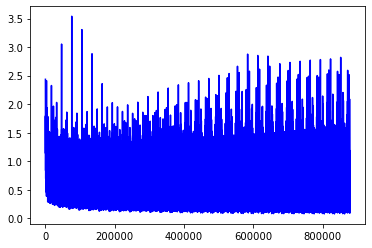

In [11]:
modeloUm = RedeNeuralModeloUm()

runnerUmCrossRMSpropBatch = RedeNeuralRunner(modeloUm,
                                     X_train, y_train,
                                     30,0.00015,'CrossEntropyLoss','RMSprop','runnerUmCrossRMSpropBatch',True)

runnerUmCrossRMSpropBatch.train()

In [12]:
runnerUmCrossRMSpropBatch.evaluate(X_test,y_test)

0.8508135307962734

In [13]:
runnerUmCrossRMSpropBatch.export()

Epoch: 39 Loss: 0.530989944934845
Epoch: 39 Loss: 0.5414248108863831
Epoch: 39 Loss: 0.4999721050262451
Epoch: 39 Loss: 0.3456219732761383
Epoch: 39 Loss: 0.2613116502761841
Epoch: 39 Loss: 0.4123065769672394
Epoch: 39 Loss: 0.7659932374954224
Epoch: 39 Loss: 0.5419642329216003
Epoch: 39 Loss: 0.8784825801849365
Epoch: 39 Loss: 0.8088406324386597
Epoch: 39 Loss: 0.6314914226531982
Epoch: 39 Loss: 0.28676319122314453
Epoch: 39 Loss: 0.22195008397102356
Epoch: 39 Loss: 0.2573588192462921
Epoch: 39 Loss: 0.42312443256378174
Epoch: 39 Loss: 0.41278156638145447
Epoch: 39 Loss: 0.48976632952690125
Epoch: 39 Loss: 0.2702467739582062
Epoch: 39 Loss: 0.2606208026409149
Epoch: 39 Loss: 0.5388787984848022
Epoch: 39 Loss: 0.8025488257408142
Epoch: 39 Loss: 0.2928449809551239
Epoch: 39 Loss: 0.3625246286392212
Epoch: 39 Loss: 0.5050828456878662
Epoch: 39 Loss: 0.7401739954948425
Epoch: 39 Loss: 0.2212875932455063
Epoch: 39 Loss: 0.5684689879417419
Epoch: 39 Loss: 0.4996282458305359
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.6293734908103943
Epoch: 39 Loss: 0.3263476490974426
Epoch: 39 Loss: 0.31305670738220215
Epoch: 39 Loss: 0.38426515460014343
Epoch: 39 Loss: 0.39732199907302856
Epoch: 39 Loss: 0.4046432375907898
Epoch: 39 Loss: 0.6405834555625916
Epoch: 39 Loss: 0.3799642026424408
Epoch: 39 Loss: 0.7144218683242798
Epoch: 39 Loss: 0.4237663745880127
Epoch: 39 Loss: 0.6807441115379333
Epoch: 39 Loss: 0.6293761134147644
Epoch: 39 Loss: 0.3451082408428192
Epoch: 39 Loss: 0.3643035590648651
Epoch: 39 Loss: 0.3021520972251892
Epoch: 39 Loss: 0.5544102191925049
Epoch: 39 Loss: 0.437599778175354
Epoch: 39 Loss: 0.31591710448265076
Epoch: 39 Loss: 0.7219048142433167
Epoch: 39 Loss: 0.7381075620651245
Epoch: 39 Loss: 0.712440550327301
Epoch: 39 Loss: 0.6702317595481873
Epoch: 39 Loss: 0.5330467224121094
Epoch: 39 Loss: 0.6430155038833618
Epoch: 39 Loss: 0.63767409324646
Epoch: 39 Loss: 0.5151942372322083
Epoch: 39 Loss: 0.387214332818985
Epoch: 39 Loss: 0.5456418395042419
Epoch: 39 Loss: 0.697

Epoch: 39 Loss: 0.589989960193634
Epoch: 39 Loss: 0.8215848207473755
Epoch: 39 Loss: 0.5626815557479858
Epoch: 39 Loss: 0.43258053064346313
Epoch: 39 Loss: 0.3777701258659363
Epoch: 39 Loss: 0.5338334441184998
Epoch: 39 Loss: 0.6548095345497131
Epoch: 39 Loss: 0.806096613407135
Epoch: 39 Loss: 0.36329561471939087
Epoch: 39 Loss: 0.6949688196182251
Epoch: 39 Loss: 0.29008597135543823
Epoch: 39 Loss: 0.5618470311164856
Epoch: 39 Loss: 0.5219494700431824
Epoch: 39 Loss: 0.28504201769828796
Epoch: 39 Loss: 0.4286700487136841
Epoch: 39 Loss: 0.5865640044212341
Epoch: 39 Loss: 0.5567324161529541
Epoch: 39 Loss: 0.30308935046195984
Epoch: 39 Loss: 0.442649245262146
Epoch: 39 Loss: 0.6829591989517212
Epoch: 39 Loss: 0.7461108565330505
Epoch: 39 Loss: 0.5369844436645508
Epoch: 39 Loss: 0.34756186604499817
Epoch: 39 Loss: 0.6994264721870422
Epoch: 39 Loss: 0.38441258668899536
Epoch: 39 Loss: 0.4770258069038391
Epoch: 39 Loss: 0.6019072532653809
Epoch: 39 Loss: 0.45813438296318054
Epoch: 39 Loss:

Epoch: 39 Loss: 0.5395228266716003
Epoch: 39 Loss: 0.35647904872894287
Epoch: 39 Loss: 0.5369396805763245
Epoch: 39 Loss: 0.44959184527397156
Epoch: 39 Loss: 0.25381702184677124
Epoch: 39 Loss: 0.8549283146858215
Epoch: 39 Loss: 0.9129067063331604
Epoch: 39 Loss: 0.689030647277832
Epoch: 39 Loss: 0.5693358778953552
Epoch: 39 Loss: 0.671820342540741
Epoch: 39 Loss: 0.25154370069503784
Epoch: 39 Loss: 0.5501416325569153
Epoch: 39 Loss: 0.605366051197052
Epoch: 39 Loss: 0.39956212043762207
Epoch: 39 Loss: 0.3442020118236542
Epoch: 39 Loss: 0.5728805065155029
Epoch: 39 Loss: 0.7699940800666809
Epoch: 39 Loss: 0.3959469199180603
Epoch: 39 Loss: 0.5478061437606812
Epoch: 39 Loss: 0.5333054661750793
Epoch: 39 Loss: 0.7053409814834595
Epoch: 39 Loss: 0.7129630446434021
Epoch: 39 Loss: 0.34249216318130493
Epoch: 39 Loss: 0.8535037040710449
Epoch: 39 Loss: 0.6772810220718384
Epoch: 39 Loss: 0.850180447101593
Epoch: 39 Loss: 0.4481913447380066
Epoch: 39 Loss: 0.48836851119995117
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.373308002948761
Epoch: 39 Loss: 0.5691836476325989
Epoch: 39 Loss: 0.5936399102210999
Epoch: 39 Loss: 0.22858849167823792
Epoch: 39 Loss: 0.2858528792858124
Epoch: 39 Loss: 0.7452957034111023
Epoch: 39 Loss: 0.590214192867279
Epoch: 39 Loss: 0.6699702143669128
Epoch: 39 Loss: 0.46075117588043213
Epoch: 39 Loss: 0.5642976760864258
Epoch: 39 Loss: 0.6445004940032959
Epoch: 39 Loss: 0.6888545155525208
Epoch: 39 Loss: 0.37999528646469116
Epoch: 39 Loss: 0.437095582485199
Epoch: 39 Loss: 0.6168350577354431
Epoch: 39 Loss: 0.572758138179779
Epoch: 39 Loss: 0.25792422890663147
Epoch: 39 Loss: 0.8282946944236755
Epoch: 39 Loss: 0.4583321213722229
Epoch: 39 Loss: 0.3818351924419403
Epoch: 39 Loss: 0.21568092703819275
Epoch: 39 Loss: 0.27845314145088196
Epoch: 39 Loss: 0.2476595789194107
Epoch: 39 Loss: 0.5882630944252014
Epoch: 39 Loss: 0.622823178768158
Epoch: 39 Loss: 0.5446245670318604
Epoch: 39 Loss: 0.4543178081512451
Epoch: 39 Loss: 0.6646647453308105
Epoch: 39 Loss: 0.3

Epoch: 39 Loss: 0.47926926612854004
Epoch: 39 Loss: 0.5805754661560059
Epoch: 39 Loss: 0.2696993052959442
Epoch: 39 Loss: 0.6660159230232239
Epoch: 39 Loss: 0.43037334084510803
Epoch: 39 Loss: 0.9204365611076355
Epoch: 39 Loss: 0.533733069896698
Epoch: 39 Loss: 0.31905192136764526
Epoch: 39 Loss: 0.3437459468841553
Epoch: 39 Loss: 0.4138258993625641
Epoch: 39 Loss: 0.34591376781463623
Epoch: 39 Loss: 0.31359919905662537
Epoch: 39 Loss: 0.4054146707057953
Epoch: 39 Loss: 0.30518171191215515
Epoch: 39 Loss: 0.2262471616268158
Epoch: 39 Loss: 0.7165388464927673
Epoch: 39 Loss: 0.41584116220474243
Epoch: 39 Loss: 0.4900814890861511
Epoch: 39 Loss: 0.5693945288658142
Epoch: 39 Loss: 0.6284300684928894
Epoch: 39 Loss: 0.6242485046386719
Epoch: 39 Loss: 0.4290462136268616
Epoch: 39 Loss: 0.6402971148490906
Epoch: 39 Loss: 0.4082992672920227
Epoch: 39 Loss: 0.4421384334564209
Epoch: 39 Loss: 0.49162793159484863
Epoch: 39 Loss: 0.34606170654296875
Epoch: 39 Loss: 0.6650866866111755
Epoch: 39 Lo

Epoch: 39 Loss: 0.2405659705400467
Epoch: 39 Loss: 0.3818470239639282
Epoch: 39 Loss: 0.35609763860702515
Epoch: 39 Loss: 0.6778407692909241
Epoch: 39 Loss: 0.6952450275421143
Epoch: 39 Loss: 0.46460792422294617
Epoch: 39 Loss: 0.8051880598068237
Epoch: 39 Loss: 0.5022352337837219
Epoch: 39 Loss: 0.5203341245651245
Epoch: 39 Loss: 0.684208869934082
Epoch: 39 Loss: 0.3239552080631256
Epoch: 39 Loss: 0.4524482786655426
Epoch: 39 Loss: 0.6278516054153442
Epoch: 39 Loss: 0.5366306304931641
Epoch: 39 Loss: 0.27870726585388184
Epoch: 39 Loss: 0.5427805781364441
Epoch: 39 Loss: 0.6859784126281738
Epoch: 39 Loss: 0.3930024802684784
Epoch: 39 Loss: 0.23643097281455994
Epoch: 39 Loss: 0.4907020926475525
Epoch: 39 Loss: 0.41475266218185425
Epoch: 39 Loss: 0.6533195972442627
Epoch: 39 Loss: 0.26691392064094543
Epoch: 39 Loss: 0.5353966355323792
Epoch: 39 Loss: 0.3903423547744751
Epoch: 39 Loss: 0.42234838008880615
Epoch: 39 Loss: 0.46639883518218994
Epoch: 39 Loss: 0.48232996463775635
Epoch: 39 Lo

Epoch: 39 Loss: 0.42214345932006836
Epoch: 39 Loss: 0.5894387364387512
Epoch: 39 Loss: 0.7398843765258789
Epoch: 39 Loss: 0.9698999524116516
Epoch: 39 Loss: 0.34684765338897705
Epoch: 39 Loss: 0.3449055850505829
Epoch: 39 Loss: 0.42282992601394653
Epoch: 39 Loss: 0.4582996070384979
Epoch: 39 Loss: 0.612898051738739
Epoch: 39 Loss: 0.6925563812255859
Epoch: 39 Loss: 0.5014206767082214
Epoch: 39 Loss: 0.6748694181442261
Epoch: 39 Loss: 0.43475204706192017
Epoch: 39 Loss: 0.5024726986885071
Epoch: 39 Loss: 0.5659469366073608
Epoch: 39 Loss: 0.6158433556556702
Epoch: 39 Loss: 0.7631357908248901
Epoch: 39 Loss: 0.3564586043357849
Epoch: 39 Loss: 0.46866750717163086
Epoch: 39 Loss: 0.3014630079269409
Epoch: 39 Loss: 0.2968495190143585
Epoch: 39 Loss: 0.3147392272949219
Epoch: 39 Loss: 0.5747301578521729
Epoch: 39 Loss: 0.6495478749275208
Epoch: 39 Loss: 0.4301599860191345
Epoch: 39 Loss: 0.6470009684562683
Epoch: 39 Loss: 0.7053366303443909
Epoch: 39 Loss: 0.32470494508743286
Epoch: 39 Loss:

Epoch: 39 Loss: 0.4905499815940857
Epoch: 39 Loss: 0.5536974668502808
Epoch: 39 Loss: 0.20983894169330597
Epoch: 39 Loss: 0.6863478422164917
Epoch: 39 Loss: 0.38057446479797363
Epoch: 39 Loss: 0.47848010063171387
Epoch: 39 Loss: 0.6139017939567566
Epoch: 39 Loss: 0.6027142405509949
Epoch: 39 Loss: 0.23347902297973633
Epoch: 39 Loss: 0.30356261134147644
Epoch: 39 Loss: 0.48155081272125244
Epoch: 39 Loss: 1.152970314025879
Epoch: 39 Loss: 0.7315446734428406
Epoch: 39 Loss: 0.5092381834983826
Epoch: 39 Loss: 0.5262807607650757
Epoch: 39 Loss: 0.642453670501709
Epoch: 39 Loss: 0.5153895616531372
Epoch: 39 Loss: 0.40353313088417053
Epoch: 39 Loss: 0.7634931802749634
Epoch: 39 Loss: 0.9013330936431885
Epoch: 39 Loss: 0.5437281131744385
Epoch: 39 Loss: 0.40940144658088684
Epoch: 39 Loss: 0.44121408462524414
Epoch: 39 Loss: 0.5468054413795471
Epoch: 39 Loss: 0.5199310779571533
Epoch: 39 Loss: 0.24093130230903625
Epoch: 39 Loss: 0.4465765357017517
Epoch: 39 Loss: 0.9153658151626587
Epoch: 39 Lo

Epoch: 39 Loss: 0.6416909694671631
Epoch: 39 Loss: 0.45894771814346313
Epoch: 39 Loss: 0.4517771601676941
Epoch: 39 Loss: 0.5697221159934998
Epoch: 39 Loss: 0.31531262397766113
Epoch: 39 Loss: 0.49292322993278503
Epoch: 39 Loss: 0.6493909358978271
Epoch: 39 Loss: 0.3314988315105438
Epoch: 39 Loss: 0.3794436752796173
Epoch: 39 Loss: 0.4899396002292633
Epoch: 39 Loss: 0.4020152688026428
Epoch: 39 Loss: 0.3381352722644806
Epoch: 39 Loss: 0.41645169258117676
Epoch: 39 Loss: 0.4634951055049896
Epoch: 39 Loss: 0.39938992261886597
Epoch: 39 Loss: 0.2827594578266144
Epoch: 39 Loss: 0.3894044756889343
Epoch: 39 Loss: 0.36875978112220764
Epoch: 39 Loss: 0.40489768981933594
Epoch: 39 Loss: 0.5412161946296692
Epoch: 39 Loss: 0.7062680721282959
Epoch: 39 Loss: 0.40069130063056946
Epoch: 39 Loss: 0.7180185317993164
Epoch: 39 Loss: 0.44827792048454285
Epoch: 39 Loss: 0.6813888549804688
Epoch: 39 Loss: 0.3590252995491028
Epoch: 39 Loss: 0.45693403482437134
Epoch: 39 Loss: 0.5409356951713562
Epoch: 39 

Epoch: 39 Loss: 0.489632248878479
Epoch: 39 Loss: 0.37250906229019165
Epoch: 39 Loss: 0.37575817108154297
Epoch: 39 Loss: 0.4272509217262268
Epoch: 39 Loss: 0.45729944109916687
Epoch: 39 Loss: 0.6992049813270569
Epoch: 39 Loss: 0.4532890319824219
Epoch: 39 Loss: 0.6879034042358398
Epoch: 39 Loss: 0.31586548686027527
Epoch: 39 Loss: 0.4519593119621277
Epoch: 39 Loss: 0.5783297419548035
Epoch: 39 Loss: 0.40827563405036926
Epoch: 39 Loss: 0.6026566624641418
Epoch: 39 Loss: 0.2778111696243286
Epoch: 39 Loss: 0.7502774000167847
Epoch: 39 Loss: 0.2945649325847626
Epoch: 39 Loss: 0.6855545043945312
Epoch: 39 Loss: 0.32232555747032166
Epoch: 39 Loss: 0.5898250937461853
Epoch: 39 Loss: 0.6748888492584229
Epoch: 39 Loss: 0.41190269589424133
Epoch: 39 Loss: 0.3818579316139221
Epoch: 39 Loss: 0.2929520606994629
Epoch: 39 Loss: 0.6397284865379333
Epoch: 39 Loss: 0.514234721660614
Epoch: 39 Loss: 0.31967055797576904
Epoch: 39 Loss: 0.7152163982391357
Epoch: 39 Loss: 0.6650243401527405
Epoch: 39 Loss

Epoch: 39 Loss: 0.43513283133506775
Epoch: 39 Loss: 0.4582739770412445
Epoch: 39 Loss: 0.6302936673164368
Epoch: 39 Loss: 0.29966557025909424
Epoch: 39 Loss: 0.3454876244068146
Epoch: 39 Loss: 0.690500020980835
Epoch: 39 Loss: 0.36873096227645874
Epoch: 39 Loss: 0.617061197757721
Epoch: 39 Loss: 0.7247124314308167
Epoch: 39 Loss: 0.63509601354599
Epoch: 39 Loss: 0.2834150195121765
Epoch: 39 Loss: 0.43942466378211975
Epoch: 39 Loss: 0.3886338770389557
Epoch: 39 Loss: 0.6504722833633423
Epoch: 39 Loss: 0.5574643015861511
Epoch: 39 Loss: 0.47150662541389465
Epoch: 39 Loss: 0.5074800252914429
Epoch: 39 Loss: 0.41179168224334717
Epoch: 39 Loss: 0.4786580502986908
Epoch: 39 Loss: 0.7870399355888367
Epoch: 39 Loss: 0.38015398383140564
Epoch: 39 Loss: 0.2995287775993347
Epoch: 39 Loss: 0.779007613658905
Epoch: 39 Loss: 0.47822168469429016
Epoch: 39 Loss: 0.37089449167251587
Epoch: 39 Loss: 0.48646435141563416
Epoch: 39 Loss: 0.6912506818771362
Epoch: 39 Loss: 0.43698549270629883
Epoch: 39 Loss

Epoch: 39 Loss: 0.41716012358665466
Epoch: 39 Loss: 0.5657100677490234
Epoch: 39 Loss: 0.4632546007633209
Epoch: 39 Loss: 0.5458962917327881
Epoch: 39 Loss: 0.45586007833480835
Epoch: 39 Loss: 0.5073574781417847
Epoch: 39 Loss: 0.9367958903312683
Epoch: 39 Loss: 0.5620707869529724
Epoch: 39 Loss: 0.36904510855674744
Epoch: 39 Loss: 0.7254929542541504
Epoch: 39 Loss: 0.2952250838279724
Epoch: 39 Loss: 0.42265865206718445
Epoch: 39 Loss: 0.28487709164619446
Epoch: 39 Loss: 0.2858223617076874
Epoch: 39 Loss: 0.4000187814235687
Epoch: 39 Loss: 0.4641255736351013
Epoch: 39 Loss: 0.4125232696533203
Epoch: 39 Loss: 0.6690071225166321
Epoch: 39 Loss: 0.2721954882144928
Epoch: 39 Loss: 0.6609959006309509
Epoch: 39 Loss: 0.5952264666557312
Epoch: 39 Loss: 0.5429796576499939
Epoch: 39 Loss: 0.5230643153190613
Epoch: 39 Loss: 0.7191681861877441
Epoch: 39 Loss: 0.349697083234787
Epoch: 39 Loss: 0.5540590882301331
Epoch: 39 Loss: 0.4940244257450104
Epoch: 39 Loss: 0.34355926513671875
Epoch: 39 Loss:

Epoch: 39 Loss: 0.4142581820487976
Epoch: 39 Loss: 0.3238639533519745
Epoch: 39 Loss: 0.3797660768032074
Epoch: 39 Loss: 0.44434961676597595
Epoch: 39 Loss: 0.4607711434364319
Epoch: 39 Loss: 0.4002121686935425
Epoch: 39 Loss: 0.44824376702308655
Epoch: 39 Loss: 0.568527102470398
Epoch: 39 Loss: 0.8419114351272583
Epoch: 39 Loss: 0.3184252083301544
Epoch: 39 Loss: 0.593798041343689
Epoch: 39 Loss: 0.5143001079559326
Epoch: 39 Loss: 0.5593500137329102
Epoch: 39 Loss: 0.6978296637535095
Epoch: 39 Loss: 0.7360471487045288
Epoch: 39 Loss: 0.2729939818382263
Epoch: 39 Loss: 0.5628499388694763
Epoch: 39 Loss: 0.3260467052459717
Epoch: 39 Loss: 0.7077351808547974
Epoch: 39 Loss: 0.6357859373092651
Epoch: 39 Loss: 0.5195436477661133
Epoch: 39 Loss: 0.8007721304893494
Epoch: 39 Loss: 0.422224223613739
Epoch: 39 Loss: 0.9003347754478455
Epoch: 39 Loss: 0.7383833527565002
Epoch: 39 Loss: 0.3209834098815918
Epoch: 39 Loss: 0.5843079090118408
Epoch: 39 Loss: 0.5060122013092041
Epoch: 39 Loss: 0.372

Epoch: 39 Loss: 0.7426371574401855
Epoch: 39 Loss: 0.513117253780365
Epoch: 39 Loss: 0.5571314692497253
Epoch: 39 Loss: 0.41685816645622253
Epoch: 39 Loss: 0.48326021432876587
Epoch: 39 Loss: 0.5042687058448792
Epoch: 39 Loss: 0.28285160660743713
Epoch: 39 Loss: 0.5717920660972595
Epoch: 39 Loss: 0.24682658910751343
Epoch: 39 Loss: 0.4442603290081024
Epoch: 39 Loss: 0.4403224587440491
Epoch: 39 Loss: 0.7865529656410217
Epoch: 39 Loss: 0.5334855318069458
Epoch: 39 Loss: 0.32764285802841187
Epoch: 39 Loss: 0.5724645853042603
Epoch: 39 Loss: 0.480497807264328
Epoch: 39 Loss: 0.34554749727249146
Epoch: 39 Loss: 0.4286973774433136
Epoch: 39 Loss: 0.619914710521698
Epoch: 39 Loss: 0.3246900737285614
Epoch: 39 Loss: 0.34865641593933105
Epoch: 39 Loss: 0.7885428071022034
Epoch: 39 Loss: 0.40415680408477783
Epoch: 39 Loss: 0.3643849194049835
Epoch: 39 Loss: 0.36228570342063904
Epoch: 39 Loss: 0.37035515904426575
Epoch: 39 Loss: 0.2927003502845764
Epoch: 39 Loss: 0.2530846893787384
Epoch: 39 Los

Epoch: 39 Loss: 0.4239462614059448
Epoch: 39 Loss: 0.715779185295105
Epoch: 39 Loss: 0.5052258372306824
Epoch: 39 Loss: 0.23139575123786926
Epoch: 39 Loss: 0.7085192203521729
Epoch: 39 Loss: 0.5718790888786316
Epoch: 39 Loss: 0.3824438154697418
Epoch: 39 Loss: 0.6200667023658752
Epoch: 39 Loss: 0.27830955386161804
Epoch: 39 Loss: 0.5924054980278015
Epoch: 39 Loss: 0.29872700572013855
Epoch: 39 Loss: 0.3536505103111267
Epoch: 39 Loss: 0.7592704892158508
Epoch: 39 Loss: 0.3810459077358246
Epoch: 39 Loss: 0.4025799036026001
Epoch: 39 Loss: 0.3816555440425873
Epoch: 39 Loss: 0.23620347678661346
Epoch: 39 Loss: 0.42902296781539917
Epoch: 39 Loss: 0.5587145090103149
Epoch: 39 Loss: 0.33988022804260254
Epoch: 39 Loss: 0.7844412922859192
Epoch: 39 Loss: 0.42811447381973267
Epoch: 39 Loss: 0.6963090300559998
Epoch: 39 Loss: 0.8235353827476501
Epoch: 39 Loss: 0.3270855247974396
Epoch: 39 Loss: 0.35279473662376404
Epoch: 39 Loss: 0.5754175782203674
Epoch: 39 Loss: 0.4267301857471466
Epoch: 39 Los

Epoch: 39 Loss: 0.40153205394744873
Epoch: 39 Loss: 0.586493194103241
Epoch: 39 Loss: 0.8188204169273376
Epoch: 39 Loss: 0.4266004264354706
Epoch: 39 Loss: 0.5488683581352234
Epoch: 39 Loss: 0.49495622515678406
Epoch: 39 Loss: 0.4009914994239807
Epoch: 39 Loss: 0.5235297679901123
Epoch: 39 Loss: 0.3815273642539978
Epoch: 39 Loss: 0.43141043186187744
Epoch: 39 Loss: 0.4084903299808502
Epoch: 39 Loss: 0.46363401412963867
Epoch: 39 Loss: 0.46020635962486267
Epoch: 39 Loss: 0.48383384943008423
Epoch: 39 Loss: 0.2097778469324112
Epoch: 39 Loss: 0.6021984219551086
Epoch: 39 Loss: 0.7389984130859375
Epoch: 39 Loss: 0.41587933897972107
Epoch: 39 Loss: 0.3929924964904785
Epoch: 39 Loss: 0.45954546332359314
Epoch: 39 Loss: 0.3297101855278015
Epoch: 39 Loss: 0.4652167558670044
Epoch: 39 Loss: 0.4826350510120392
Epoch: 39 Loss: 0.6088322401046753
Epoch: 39 Loss: 0.7153558135032654
Epoch: 39 Loss: 0.3960343897342682
Epoch: 39 Loss: 0.4367702305316925
Epoch: 39 Loss: 0.49692806601524353
Epoch: 39 Lo

Epoch: 39 Loss: 0.47993630170822144
Epoch: 39 Loss: 0.42481622099876404
Epoch: 39 Loss: 0.580572783946991
Epoch: 39 Loss: 0.4464503228664398
Epoch: 39 Loss: 0.684798538684845
Epoch: 39 Loss: 0.45376718044281006
Epoch: 39 Loss: 0.3473348021507263
Epoch: 39 Loss: 0.41134992241859436
Epoch: 39 Loss: 0.4543434977531433
Epoch: 39 Loss: 0.3296492099761963
Epoch: 39 Loss: 0.26855364441871643
Epoch: 39 Loss: 0.721211314201355
Epoch: 39 Loss: 0.8189846873283386
Epoch: 39 Loss: 0.4114525616168976
Epoch: 39 Loss: 0.5091230273246765
Epoch: 39 Loss: 0.6501622796058655
Epoch: 39 Loss: 0.5351503491401672
Epoch: 39 Loss: 0.9318810701370239
Epoch: 39 Loss: 0.546927273273468
Epoch: 39 Loss: 0.44560083746910095
Epoch: 39 Loss: 0.5318735241889954
Epoch: 39 Loss: 0.5621073842048645
Epoch: 39 Loss: 0.40049928426742554
Epoch: 39 Loss: 0.6173611283302307
Epoch: 39 Loss: 0.4414924681186676
Epoch: 39 Loss: 0.27537500858306885
Epoch: 39 Loss: 0.8991283178329468
Epoch: 39 Loss: 0.46644479036331177
Epoch: 39 Loss:

Epoch: 39 Loss: 0.5819283723831177
Epoch: 39 Loss: 0.448124498128891
Epoch: 39 Loss: 0.5264143347740173
Epoch: 39 Loss: 0.5268290638923645
Epoch: 39 Loss: 0.5608031153678894
Epoch: 39 Loss: 0.6071900725364685
Epoch: 39 Loss: 0.601496696472168
Epoch: 39 Loss: 0.5630017518997192
Epoch: 39 Loss: 0.5843717455863953
Epoch: 39 Loss: 0.5185091495513916
Epoch: 39 Loss: 0.6843977570533752
Epoch: 39 Loss: 0.6730393171310425
Epoch: 39 Loss: 0.5735029578208923
Epoch: 39 Loss: 0.54820716381073
Epoch: 39 Loss: 0.5111897587776184
Epoch: 39 Loss: 0.3257405757904053
Epoch: 39 Loss: 0.6932439804077148
Epoch: 39 Loss: 0.5661974549293518
Epoch: 39 Loss: 0.5065551400184631
Epoch: 39 Loss: 0.3384566605091095
Epoch: 39 Loss: 0.5472016334533691
Epoch: 39 Loss: 0.7964873313903809
Epoch: 39 Loss: 0.35592782497406006
Epoch: 39 Loss: 0.7104874849319458
Epoch: 39 Loss: 0.7493387460708618
Epoch: 39 Loss: 0.3405076563358307
Epoch: 39 Loss: 0.3227563798427582
Epoch: 39 Loss: 0.5019795894622803
Epoch: 39 Loss: 0.42527

Epoch: 39 Loss: 0.586277961730957
Epoch: 39 Loss: 0.8462778925895691
Epoch: 39 Loss: 0.5672280192375183
Epoch: 39 Loss: 0.451938658952713
Epoch: 39 Loss: 1.0874110460281372
Epoch: 39 Loss: 0.4594142735004425
Epoch: 39 Loss: 0.40454161167144775
Epoch: 39 Loss: 0.7975773811340332
Epoch: 39 Loss: 0.4806811511516571
Epoch: 39 Loss: 0.5023534297943115
Epoch: 39 Loss: 0.29292306303977966
Epoch: 39 Loss: 0.6524841785430908
Epoch: 39 Loss: 0.49561449885368347
Epoch: 39 Loss: 0.3342551589012146
Epoch: 39 Loss: 0.4301924705505371
Epoch: 39 Loss: 0.5317051410675049
Epoch: 39 Loss: 0.4539918899536133
Epoch: 39 Loss: 0.9748639464378357
Epoch: 39 Loss: 0.6319469213485718
Epoch: 39 Loss: 1.0381678342819214
Epoch: 39 Loss: 0.68497234582901
Epoch: 39 Loss: 0.4460505247116089
Epoch: 39 Loss: 0.563607931137085
Epoch: 39 Loss: 0.3895762860774994
Epoch: 39 Loss: 0.4596751928329468
Epoch: 39 Loss: 0.7295721173286438
Epoch: 39 Loss: 0.6758937835693359
Epoch: 39 Loss: 0.35084864497184753
Epoch: 39 Loss: 1.073

Epoch: 39 Loss: 0.4846322238445282
Epoch: 39 Loss: 0.5901533961296082
Epoch: 39 Loss: 0.5927545428276062
Epoch: 39 Loss: 0.7774441838264465
Epoch: 39 Loss: 0.717698872089386
Epoch: 39 Loss: 0.5053501725196838
Epoch: 39 Loss: 0.3726791441440582
Epoch: 39 Loss: 0.4363243579864502
Epoch: 39 Loss: 0.3515302240848541
Epoch: 39 Loss: 0.4864104092121124
Epoch: 39 Loss: 0.27077510952949524
Epoch: 39 Loss: 0.9312570095062256
Epoch: 39 Loss: 0.6428912878036499
Epoch: 39 Loss: 0.42104876041412354
Epoch: 39 Loss: 0.4678007960319519
Epoch: 39 Loss: 0.9387181997299194
Epoch: 39 Loss: 0.3499900698661804
Epoch: 39 Loss: 0.34070122241973877
Epoch: 39 Loss: 0.3706461191177368
Epoch: 39 Loss: 0.4564465880393982
Epoch: 39 Loss: 0.29804107546806335
Epoch: 39 Loss: 0.4637853503227234
Epoch: 39 Loss: 0.5796144604682922
Epoch: 39 Loss: 0.3813727796077728
Epoch: 39 Loss: 0.48086822032928467
Epoch: 39 Loss: 0.4251514673233032
Epoch: 39 Loss: 0.4707161784172058
Epoch: 39 Loss: 0.41982194781303406
Epoch: 39 Loss:

Epoch: 39 Loss: 0.1913454234600067
Epoch: 39 Loss: 0.7206653356552124
Epoch: 39 Loss: 0.40041589736938477
Epoch: 39 Loss: 0.7706753015518188
Epoch: 39 Loss: 0.5937732458114624
Epoch: 39 Loss: 0.5058451890945435
Epoch: 39 Loss: 0.4719195067882538
Epoch: 39 Loss: 0.40911146998405457
Epoch: 39 Loss: 0.5173391699790955
Epoch: 39 Loss: 0.5565876960754395
Epoch: 39 Loss: 0.5420024394989014
Epoch: 39 Loss: 0.44430652260780334
Epoch: 39 Loss: 0.5120652318000793
Epoch: 39 Loss: 0.2628272771835327
Epoch: 39 Loss: 0.49644625186920166
Epoch: 39 Loss: 0.45534956455230713
Epoch: 39 Loss: 0.4187573194503784
Epoch: 39 Loss: 0.3609575033187866
Epoch: 39 Loss: 1.2260915040969849
Epoch: 39 Loss: 0.36770954728126526
Epoch: 39 Loss: 0.28789281845092773
Epoch: 39 Loss: 0.5283397436141968
Epoch: 39 Loss: 0.5763385891914368
Epoch: 39 Loss: 0.9904133081436157
Epoch: 39 Loss: 0.39984574913978577
Epoch: 39 Loss: 0.650443971157074
Epoch: 39 Loss: 0.5374201536178589
Epoch: 39 Loss: 0.32795584201812744
Epoch: 39 Lo

Epoch: 39 Loss: 0.539200484752655
Epoch: 39 Loss: 0.5160374045372009
Epoch: 39 Loss: 0.6071166396141052
Epoch: 39 Loss: 0.7153441905975342
Epoch: 39 Loss: 0.2878296971321106
Epoch: 39 Loss: 0.4773998558521271
Epoch: 39 Loss: 0.570347249507904
Epoch: 39 Loss: 0.5723223090171814
Epoch: 39 Loss: 0.38649386167526245
Epoch: 39 Loss: 0.7245262861251831
Epoch: 39 Loss: 0.5743134021759033
Epoch: 39 Loss: 0.5756460428237915
Epoch: 39 Loss: 0.38040053844451904
Epoch: 39 Loss: 0.4747125804424286
Epoch: 39 Loss: 0.46713772416114807
Epoch: 39 Loss: 0.30433133244514465
Epoch: 39 Loss: 0.5846390724182129
Epoch: 39 Loss: 0.3205854296684265
Epoch: 39 Loss: 0.34770089387893677
Epoch: 39 Loss: 0.4767194986343384
Epoch: 39 Loss: 0.5840469002723694
Epoch: 39 Loss: 0.5387890338897705
Epoch: 39 Loss: 0.41917484998703003
Epoch: 39 Loss: 0.28478193283081055
Epoch: 39 Loss: 0.5348875522613525
Epoch: 39 Loss: 0.32828259468078613
Epoch: 39 Loss: 0.4753873348236084
Epoch: 39 Loss: 0.46009543538093567
Epoch: 39 Los

Epoch: 39 Loss: 0.5616793632507324
Epoch: 39 Loss: 0.32280153036117554
Epoch: 39 Loss: 0.43177419900894165
Epoch: 39 Loss: 0.4580257833003998
Epoch: 39 Loss: 0.627413809299469
Epoch: 39 Loss: 0.6717040538787842
Epoch: 39 Loss: 0.4647901654243469
Epoch: 39 Loss: 0.37042322754859924
Epoch: 39 Loss: 0.2731795907020569
Epoch: 39 Loss: 0.3890637457370758
Epoch: 39 Loss: 0.3299614191055298
Epoch: 39 Loss: 0.3882310092449188
Epoch: 39 Loss: 0.38848331570625305
Epoch: 39 Loss: 0.36273133754730225
Epoch: 39 Loss: 0.8100494742393494
Epoch: 39 Loss: 0.2744631767272949
Epoch: 39 Loss: 0.8296120166778564
Epoch: 39 Loss: 0.6395939588546753
Epoch: 39 Loss: 0.48098403215408325
Epoch: 39 Loss: 0.4478253126144409
Epoch: 39 Loss: 0.46589037775993347
Epoch: 39 Loss: 0.47499027848243713
Epoch: 39 Loss: 1.1698410511016846
Epoch: 39 Loss: 0.6761902570724487
Epoch: 39 Loss: 0.4360174238681793
Epoch: 39 Loss: 0.3118554353713989
Epoch: 39 Loss: 0.37462034821510315
Epoch: 39 Loss: 0.28329113125801086
Epoch: 39 L

Epoch: 39 Loss: 0.8173333406448364
Epoch: 39 Loss: 0.5144195556640625
Epoch: 39 Loss: 0.3699929118156433
Epoch: 39 Loss: 0.3962763249874115
Epoch: 39 Loss: 0.5837886333465576
Epoch: 39 Loss: 0.40301406383514404
Epoch: 39 Loss: 0.5647150874137878
Epoch: 39 Loss: 0.6242548823356628
Epoch: 39 Loss: 0.501102089881897
Epoch: 39 Loss: 0.7298597693443298
Epoch: 39 Loss: 0.4055406153202057
Epoch: 39 Loss: 0.5346801280975342
Epoch: 39 Loss: 0.731130063533783
Epoch: 39 Loss: 0.3665698766708374
Epoch: 39 Loss: 0.6681761741638184
Epoch: 39 Loss: 0.2663230299949646
Epoch: 39 Loss: 0.4288405776023865
Epoch: 39 Loss: 0.5840224027633667
Epoch: 39 Loss: 0.3769190311431885
Epoch: 39 Loss: 0.5951138138771057
Epoch: 39 Loss: 0.31372904777526855
Epoch: 39 Loss: 0.40272268652915955
Epoch: 39 Loss: 0.3943001627922058
Epoch: 39 Loss: 0.5687723159790039
Epoch: 39 Loss: 0.8518007397651672
Epoch: 39 Loss: 0.7860677242279053
Epoch: 39 Loss: 0.2536448538303375
Epoch: 39 Loss: 0.26127204298973083
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.43060028553009033
Epoch: 39 Loss: 0.40829211473464966
Epoch: 39 Loss: 0.5729190707206726
Epoch: 39 Loss: 0.7093231678009033
Epoch: 39 Loss: 0.4483891427516937
Epoch: 39 Loss: 0.33582744002342224
Epoch: 39 Loss: 0.2600271999835968
Epoch: 39 Loss: 0.48556438088417053
Epoch: 39 Loss: 0.4829097390174866
Epoch: 39 Loss: 0.6216330528259277
Epoch: 39 Loss: 0.45849594473838806
Epoch: 39 Loss: 0.5124475955963135
Epoch: 39 Loss: 0.5522766709327698
Epoch: 39 Loss: 0.6007207036018372
Epoch: 39 Loss: 0.3845113217830658
Epoch: 39 Loss: 0.6496036052703857
Epoch: 39 Loss: 0.3600374758243561
Epoch: 39 Loss: 0.4084922969341278
Epoch: 39 Loss: 0.41394174098968506
Epoch: 39 Loss: 0.5811418890953064
Epoch: 39 Loss: 0.41015419363975525
Epoch: 39 Loss: 0.48343732953071594
Epoch: 39 Loss: 0.3474996089935303
Epoch: 39 Loss: 0.29154467582702637
Epoch: 39 Loss: 0.37635138630867004
Epoch: 39 Loss: 0.7354540824890137
Epoch: 39 Loss: 0.29930636286735535
Epoch: 39 Loss: 0.5596871972084045
Epoch: 39

Epoch: 39 Loss: 0.5203737616539001
Epoch: 39 Loss: 0.43008220195770264
Epoch: 39 Loss: 0.37729477882385254
Epoch: 39 Loss: 0.5603299736976624
Epoch: 39 Loss: 0.5709921717643738
Epoch: 39 Loss: 0.5289739370346069
Epoch: 39 Loss: 0.411246120929718
Epoch: 39 Loss: 0.9030548930168152
Epoch: 39 Loss: 0.24825918674468994
Epoch: 39 Loss: 0.3457481265068054
Epoch: 39 Loss: 0.3594798743724823
Epoch: 39 Loss: 0.6717524528503418
Epoch: 39 Loss: 0.6264337301254272
Epoch: 39 Loss: 0.5091959834098816
Epoch: 39 Loss: 0.44668421149253845
Epoch: 39 Loss: 0.5964964032173157
Epoch: 39 Loss: 0.46393224596977234
Epoch: 39 Loss: 0.44219857454299927
Epoch: 39 Loss: 0.4647720456123352
Epoch: 39 Loss: 0.6637009382247925
Epoch: 39 Loss: 0.24457278847694397
Epoch: 39 Loss: 0.2536749541759491
Epoch: 39 Loss: 0.6675265431404114
Epoch: 39 Loss: 0.8097912669181824
Epoch: 39 Loss: 0.20546387135982513
Epoch: 39 Loss: 0.36929386854171753
Epoch: 39 Loss: 0.32525670528411865
Epoch: 39 Loss: 0.5163724422454834
Epoch: 39 L

Epoch: 39 Loss: 0.39472609758377075
Epoch: 39 Loss: 0.9713560342788696
Epoch: 39 Loss: 0.7550287246704102
Epoch: 39 Loss: 0.4532928764820099
Epoch: 39 Loss: 0.6488979458808899
Epoch: 39 Loss: 0.34849080443382263
Epoch: 39 Loss: 0.5413856506347656
Epoch: 39 Loss: 0.44362571835517883
Epoch: 39 Loss: 0.6688295602798462
Epoch: 39 Loss: 0.6429857015609741
Epoch: 39 Loss: 0.7072068452835083
Epoch: 39 Loss: 0.867327094078064
Epoch: 39 Loss: 0.4764389991760254
Epoch: 39 Loss: 0.8182286024093628
Epoch: 39 Loss: 0.41012006998062134
Epoch: 39 Loss: 0.5352476835250854
Epoch: 39 Loss: 0.7818739414215088
Epoch: 39 Loss: 0.5271949172019958
Epoch: 39 Loss: 0.7538109421730042
Epoch: 39 Loss: 0.4829702079296112
Epoch: 39 Loss: 0.3408113420009613
Epoch: 39 Loss: 0.4493681788444519
Epoch: 39 Loss: 0.3163202404975891
Epoch: 39 Loss: 0.32470986247062683
Epoch: 39 Loss: 0.3331572413444519
Epoch: 39 Loss: 0.40844377875328064
Epoch: 39 Loss: 0.5146871209144592
Epoch: 39 Loss: 0.5720563530921936
Epoch: 39 Loss:

Epoch: 39 Loss: 0.5134309530258179
Epoch: 39 Loss: 1.1458244323730469
Epoch: 39 Loss: 0.4956475794315338
Epoch: 39 Loss: 0.3899383842945099
Epoch: 39 Loss: 0.5464775562286377
Epoch: 39 Loss: 0.705134391784668
Epoch: 39 Loss: 0.3161303400993347
Epoch: 39 Loss: 0.35470354557037354
Epoch: 39 Loss: 0.5940058827400208
Epoch: 39 Loss: 0.29193246364593506
Epoch: 39 Loss: 0.642765462398529
Epoch: 39 Loss: 0.6012049913406372
Epoch: 39 Loss: 0.35616597533226013
Epoch: 39 Loss: 0.4671781659126282
Epoch: 39 Loss: 0.6378956437110901
Epoch: 39 Loss: 0.5384995937347412
Epoch: 39 Loss: 0.5323993563652039
Epoch: 39 Loss: 0.518330454826355
Epoch: 39 Loss: 0.5121058225631714
Epoch: 39 Loss: 0.5585877895355225
Epoch: 39 Loss: 0.7769017219543457
Epoch: 39 Loss: 0.38902926445007324
Epoch: 39 Loss: 0.41810792684555054
Epoch: 39 Loss: 0.3114315867424011
Epoch: 39 Loss: 0.8273198008537292
Epoch: 39 Loss: 0.3826063275337219
Epoch: 39 Loss: 0.7158442735671997
Epoch: 39 Loss: 0.6533624529838562
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.5100923180580139
Epoch: 39 Loss: 0.5820048451423645
Epoch: 39 Loss: 0.4041286110877991
Epoch: 39 Loss: 0.38384509086608887
Epoch: 39 Loss: 0.47092047333717346
Epoch: 39 Loss: 0.3691112697124481
Epoch: 39 Loss: 0.37279900908470154
Epoch: 39 Loss: 0.671356737613678
Epoch: 39 Loss: 0.6215707659721375
Epoch: 39 Loss: 0.40459051728248596
Epoch: 39 Loss: 0.7344610095024109
Epoch: 39 Loss: 0.8303490877151489
Epoch: 39 Loss: 0.4338846802711487
Epoch: 39 Loss: 0.3478018045425415
Epoch: 39 Loss: 0.49834826588630676
Epoch: 39 Loss: 0.42065680027008057
Epoch: 39 Loss: 0.622511625289917
Epoch: 39 Loss: 0.5041149258613586
Epoch: 39 Loss: 0.49460262060165405
Epoch: 39 Loss: 0.6015292406082153
Epoch: 39 Loss: 0.22243130207061768
Epoch: 39 Loss: 0.5342534780502319
Epoch: 39 Loss: 0.3927192687988281
Epoch: 39 Loss: 0.511665940284729
Epoch: 39 Loss: 0.723874568939209
Epoch: 39 Loss: 0.3346923887729645
Epoch: 39 Loss: 0.300545334815979
Epoch: 39 Loss: 0.42340710759162903
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.6010921001434326
Epoch: 39 Loss: 0.33360347151756287
Epoch: 39 Loss: 0.4477069079875946
Epoch: 39 Loss: 0.6965338587760925
Epoch: 39 Loss: 0.46873655915260315
Epoch: 39 Loss: 0.6776878833770752
Epoch: 39 Loss: 0.3764744699001312
Epoch: 39 Loss: 0.452674001455307
Epoch: 39 Loss: 0.3030258119106293
Epoch: 39 Loss: 0.5118462443351746
Epoch: 39 Loss: 0.43006032705307007
Epoch: 39 Loss: 0.7942360639572144
Epoch: 39 Loss: 0.4876205325126648
Epoch: 39 Loss: 0.5081138014793396
Epoch: 39 Loss: 0.2174772471189499
Epoch: 39 Loss: 0.8203299045562744
Epoch: 39 Loss: 0.7520590424537659
Epoch: 39 Loss: 0.7518881559371948
Epoch: 39 Loss: 0.3012058138847351
Epoch: 39 Loss: 0.3681944012641907
Epoch: 39 Loss: 0.3982086181640625
Epoch: 39 Loss: 0.23862852156162262
Epoch: 39 Loss: 0.5657834410667419
Epoch: 39 Loss: 0.33346065878868103
Epoch: 39 Loss: 0.41504523158073425
Epoch: 39 Loss: 0.5133164525032043
Epoch: 39 Loss: 0.6400625705718994
Epoch: 39 Loss: 0.4826289415359497
Epoch: 39 Loss:

Epoch: 39 Loss: 0.39265480637550354
Epoch: 39 Loss: 0.5170836448669434
Epoch: 39 Loss: 0.3660676181316376
Epoch: 39 Loss: 0.21847203373908997
Epoch: 39 Loss: 0.3283858001232147
Epoch: 39 Loss: 0.25253453850746155
Epoch: 39 Loss: 0.4332527816295624
Epoch: 39 Loss: 0.41489869356155396
Epoch: 39 Loss: 0.6232256889343262
Epoch: 39 Loss: 0.4583356976509094
Epoch: 39 Loss: 0.2586674690246582
Epoch: 39 Loss: 0.344513475894928
Epoch: 39 Loss: 0.24747660756111145
Epoch: 39 Loss: 0.44220170378685
Epoch: 39 Loss: 0.4839828908443451
Epoch: 39 Loss: 0.701274037361145
Epoch: 39 Loss: 0.5884411931037903
Epoch: 39 Loss: 0.709481418132782
Epoch: 39 Loss: 0.6811124682426453
Epoch: 39 Loss: 0.45659980177879333
Epoch: 39 Loss: 0.3107065260410309
Epoch: 39 Loss: 0.5565750002861023
Epoch: 39 Loss: 0.47568953037261963
Epoch: 39 Loss: 0.49578016996383667
Epoch: 39 Loss: 0.6273293495178223
Epoch: 39 Loss: 0.4295988082885742
Epoch: 39 Loss: 0.44212767481803894
Epoch: 39 Loss: 0.2312093824148178
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.2907697856426239
Epoch: 39 Loss: 0.5179029703140259
Epoch: 39 Loss: 0.376913845539093
Epoch: 39 Loss: 0.4780116081237793
Epoch: 39 Loss: 0.4617164731025696
Epoch: 39 Loss: 0.368736207485199
Epoch: 39 Loss: 0.35465091466903687
Epoch: 39 Loss: 0.5932074189186096
Epoch: 39 Loss: 0.44365179538726807
Epoch: 39 Loss: 0.46436789631843567
Epoch: 39 Loss: 0.2963241636753082
Epoch: 39 Loss: 0.6399962306022644
Epoch: 39 Loss: 0.7203112840652466
Epoch: 39 Loss: 0.6630380749702454
Epoch: 39 Loss: 0.4863145351409912
Epoch: 39 Loss: 0.3604414463043213
Epoch: 39 Loss: 0.5754450559616089
Epoch: 39 Loss: 0.5445700287818909
Epoch: 39 Loss: 0.5218524932861328
Epoch: 39 Loss: 0.27396702766418457
Epoch: 39 Loss: 0.7403519749641418
Epoch: 39 Loss: 0.46916624903678894
Epoch: 39 Loss: 0.32463502883911133
Epoch: 39 Loss: 0.2822519540786743
Epoch: 39 Loss: 0.3261164128780365
Epoch: 39 Loss: 0.27231544256210327
Epoch: 39 Loss: 0.2937440574169159
Epoch: 39 Loss: 0.7377687692642212
Epoch: 39 Loss:

Epoch: 39 Loss: 0.5471762418746948
Epoch: 39 Loss: 0.9018592834472656
Epoch: 39 Loss: 0.6398628354072571
Epoch: 39 Loss: 0.5169812440872192
Epoch: 39 Loss: 0.42887037992477417
Epoch: 39 Loss: 0.6255345940589905
Epoch: 39 Loss: 0.39614471793174744
Epoch: 39 Loss: 1.0403854846954346
Epoch: 39 Loss: 0.3811035752296448
Epoch: 39 Loss: 0.24694812297821045
Epoch: 39 Loss: 0.3787766396999359
Epoch: 39 Loss: 0.3707527220249176
Epoch: 39 Loss: 0.47760021686553955
Epoch: 39 Loss: 0.4850974380970001
Epoch: 39 Loss: 0.6683707237243652
Epoch: 39 Loss: 0.739684522151947
Epoch: 39 Loss: 0.3990098536014557
Epoch: 39 Loss: 1.0570687055587769
Epoch: 39 Loss: 0.733557939529419
Epoch: 39 Loss: 0.5582671761512756
Epoch: 39 Loss: 0.35532674193382263
Epoch: 39 Loss: 0.5587608218193054
Epoch: 39 Loss: 0.9646646976470947
Epoch: 39 Loss: 0.3212336599826813
Epoch: 39 Loss: 0.5649871826171875
Epoch: 39 Loss: 0.5565855503082275
Epoch: 39 Loss: 0.3384246230125427
Epoch: 39 Loss: 0.24518102407455444
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.663566529750824
Epoch: 39 Loss: 0.23491179943084717
Epoch: 39 Loss: 0.5733376145362854
Epoch: 39 Loss: 0.7380099296569824
Epoch: 39 Loss: 0.4102293848991394
Epoch: 39 Loss: 0.6935997605323792
Epoch: 39 Loss: 0.29346227645874023
Epoch: 39 Loss: 0.5612180829048157
Epoch: 39 Loss: 0.5683274269104004
Epoch: 39 Loss: 0.4404048025608063
Epoch: 39 Loss: 0.4998544454574585
Epoch: 39 Loss: 0.2638055384159088
Epoch: 39 Loss: 0.42655402421951294
Epoch: 39 Loss: 0.40186062455177307
Epoch: 39 Loss: 0.4066375494003296
Epoch: 39 Loss: 0.4301675260066986
Epoch: 39 Loss: 0.36295926570892334
Epoch: 39 Loss: 0.5177926421165466
Epoch: 39 Loss: 0.43625307083129883
Epoch: 39 Loss: 0.7075927257537842
Epoch: 39 Loss: 0.5678773522377014
Epoch: 39 Loss: 0.6882052421569824
Epoch: 39 Loss: 0.44423967599868774
Epoch: 39 Loss: 0.5889217853546143
Epoch: 39 Loss: 0.5132570862770081
Epoch: 39 Loss: 0.4490841329097748
Epoch: 39 Loss: 0.32283923029899597
Epoch: 39 Loss: 0.36625275015830994
Epoch: 39 Lo

Epoch: 39 Loss: 0.511592447757721
Epoch: 39 Loss: 0.8358101844787598
Epoch: 39 Loss: 0.5453680753707886
Epoch: 39 Loss: 0.6527548432350159
Epoch: 39 Loss: 0.48333653807640076
Epoch: 39 Loss: 0.4564034342765808
Epoch: 39 Loss: 0.3843557834625244
Epoch: 39 Loss: 0.4870014190673828
Epoch: 39 Loss: 0.4546719789505005
Epoch: 39 Loss: 0.5970837473869324
Epoch: 39 Loss: 0.5822542309761047
Epoch: 39 Loss: 0.312157541513443
Epoch: 39 Loss: 0.374239981174469
Epoch: 39 Loss: 0.5057594180107117
Epoch: 39 Loss: 0.6552222967147827
Epoch: 39 Loss: 0.4959070086479187
Epoch: 39 Loss: 0.4943820834159851
Epoch: 39 Loss: 0.6391473412513733
Epoch: 39 Loss: 0.2616722881793976
Epoch: 39 Loss: 0.4867199957370758
Epoch: 39 Loss: 0.4543388783931732
Epoch: 39 Loss: 0.6238046288490295
Epoch: 39 Loss: 0.5639274716377258
Epoch: 39 Loss: 0.35593003034591675
Epoch: 39 Loss: 0.7133452296257019
Epoch: 39 Loss: 0.2755097448825836
Epoch: 39 Loss: 0.3413124680519104
Epoch: 39 Loss: 0.4691402316093445
Epoch: 39 Loss: 0.242

Epoch: 39 Loss: 0.48894619941711426
Epoch: 39 Loss: 0.3799055516719818
Epoch: 39 Loss: 0.339040070772171
Epoch: 39 Loss: 0.31167328357696533
Epoch: 39 Loss: 0.5399003028869629
Epoch: 39 Loss: 0.595790445804596
Epoch: 39 Loss: 0.7741619944572449
Epoch: 39 Loss: 0.6771737933158875
Epoch: 39 Loss: 0.23879402875900269
Epoch: 39 Loss: 0.33989235758781433
Epoch: 39 Loss: 0.3925093412399292
Epoch: 39 Loss: 0.351321280002594
Epoch: 39 Loss: 0.5781756043434143
Epoch: 39 Loss: 0.3027225732803345
Epoch: 39 Loss: 0.3905791640281677
Epoch: 39 Loss: 0.6428200602531433
Epoch: 39 Loss: 0.3258388936519623
Epoch: 39 Loss: 0.5415354371070862
Epoch: 39 Loss: 0.36988958716392517
Epoch: 39 Loss: 0.47357288002967834
Epoch: 39 Loss: 0.4027532637119293
Epoch: 39 Loss: 0.4113955795764923
Epoch: 39 Loss: 0.46536168456077576
Epoch: 39 Loss: 0.4488089382648468
Epoch: 39 Loss: 0.5889295339584351
Epoch: 39 Loss: 0.4072462022304535
Epoch: 39 Loss: 0.39060255885124207
Epoch: 39 Loss: 0.3725961744785309
Epoch: 39 Loss:

Epoch: 39 Loss: 0.3292931914329529
Epoch: 39 Loss: 0.5982010364532471
Epoch: 39 Loss: 0.37206315994262695
Epoch: 39 Loss: 0.5178101658821106
Epoch: 39 Loss: 0.5977137088775635
Epoch: 39 Loss: 0.5252640247344971
Epoch: 39 Loss: 0.5180538892745972
Epoch: 39 Loss: 0.8298525810241699
Epoch: 39 Loss: 0.5854532718658447
Epoch: 39 Loss: 0.8760565519332886
Epoch: 39 Loss: 0.591480016708374
Epoch: 39 Loss: 0.48342275619506836
Epoch: 39 Loss: 0.537846028804779
Epoch: 39 Loss: 0.47142913937568665
Epoch: 39 Loss: 0.47292158007621765
Epoch: 39 Loss: 0.5561227202415466
Epoch: 39 Loss: 0.29105597734451294
Epoch: 39 Loss: 0.5800076723098755
Epoch: 39 Loss: 0.42183566093444824
Epoch: 39 Loss: 0.5063274502754211
Epoch: 39 Loss: 0.49630454182624817
Epoch: 39 Loss: 0.5816786289215088
Epoch: 39 Loss: 0.5316577553749084
Epoch: 39 Loss: 0.7315516471862793
Epoch: 39 Loss: 0.35863423347473145
Epoch: 39 Loss: 0.4417138993740082
Epoch: 39 Loss: 0.5204841494560242
Epoch: 39 Loss: 0.7080686092376709
Epoch: 39 Loss

Epoch: 39 Loss: 0.29117050766944885
Epoch: 39 Loss: 0.41951385140419006
Epoch: 39 Loss: 0.4532696306705475
Epoch: 39 Loss: 0.7367326617240906
Epoch: 39 Loss: 0.46323177218437195
Epoch: 39 Loss: 0.4532634913921356
Epoch: 39 Loss: 0.6885838508605957
Epoch: 39 Loss: 0.4189900755882263
Epoch: 39 Loss: 0.4244002103805542
Epoch: 39 Loss: 0.6257426738739014
Epoch: 39 Loss: 0.5329602956771851
Epoch: 39 Loss: 0.521714448928833
Epoch: 39 Loss: 0.40689319372177124
Epoch: 39 Loss: 0.5510718822479248
Epoch: 39 Loss: 0.39916348457336426
Epoch: 39 Loss: 0.6591436266899109
Epoch: 39 Loss: 0.44004514813423157
Epoch: 39 Loss: 0.42716172337532043
Epoch: 39 Loss: 0.32016822695732117
Epoch: 39 Loss: 0.5814967155456543
Epoch: 39 Loss: 0.2692621946334839
Epoch: 39 Loss: 0.44766855239868164
Epoch: 39 Loss: 0.33348962664604187
Epoch: 39 Loss: 0.4545656442642212
Epoch: 39 Loss: 0.6376453638076782
Epoch: 39 Loss: 0.6274040937423706
Epoch: 39 Loss: 0.6239913702011108
Epoch: 39 Loss: 0.4946838915348053
Epoch: 39 L

Epoch: 39 Loss: 0.3964698612689972
Epoch: 39 Loss: 0.37959954142570496
Epoch: 39 Loss: 0.3639973998069763
Epoch: 39 Loss: 0.653577446937561
Epoch: 39 Loss: 0.6906224489212036
Epoch: 39 Loss: 0.6100044846534729
Epoch: 39 Loss: 0.47582411766052246
Epoch: 39 Loss: 0.6975424289703369
Epoch: 39 Loss: 0.307333379983902
Epoch: 39 Loss: 0.5304973721504211
Epoch: 39 Loss: 0.43197953701019287
Epoch: 39 Loss: 0.385861873626709
Epoch: 39 Loss: 0.3575677275657654
Epoch: 39 Loss: 0.553017795085907
Epoch: 39 Loss: 0.5309659242630005
Epoch: 39 Loss: 0.38671258091926575
Epoch: 39 Loss: 0.7159544229507446
Epoch: 39 Loss: 0.5935652256011963
Epoch: 39 Loss: 0.5784742832183838
Epoch: 39 Loss: 0.47237953543663025
Epoch: 39 Loss: 0.5915276408195496
Epoch: 39 Loss: 0.6307833790779114
Epoch: 39 Loss: 0.5945266485214233
Epoch: 39 Loss: 0.3826419413089752
Epoch: 39 Loss: 0.35592713952064514
Epoch: 39 Loss: 0.6127510070800781
Epoch: 39 Loss: 0.3668753206729889
Epoch: 39 Loss: 0.47462326288223267
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.8696262836456299
Epoch: 39 Loss: 0.4951435625553131
Epoch: 39 Loss: 0.4767391085624695
Epoch: 39 Loss: 0.7499645948410034
Epoch: 39 Loss: 0.5982671976089478
Epoch: 39 Loss: 0.5777551531791687
Epoch: 39 Loss: 0.5212988257408142
Epoch: 39 Loss: 0.5879156589508057
Epoch: 39 Loss: 0.36530911922454834
Epoch: 39 Loss: 0.3399241864681244
Epoch: 39 Loss: 0.6427151560783386
Epoch: 39 Loss: 0.3835729658603668
Epoch: 39 Loss: 0.42802730202674866
Epoch: 39 Loss: 0.47348546981811523
Epoch: 39 Loss: 0.48708534240722656
Epoch: 39 Loss: 0.31512829661369324
Epoch: 39 Loss: 0.6853712797164917
Epoch: 39 Loss: 0.5305341482162476
Epoch: 39 Loss: 0.668045699596405
Epoch: 39 Loss: 0.8029575943946838
Epoch: 39 Loss: 0.8406095504760742
Epoch: 39 Loss: 0.2663550078868866
Epoch: 39 Loss: 0.27889180183410645
Epoch: 39 Loss: 0.2557678520679474
Epoch: 39 Loss: 0.5020528435707092
Epoch: 39 Loss: 0.26192235946655273
Epoch: 39 Loss: 0.46046730875968933
Epoch: 39 Loss: 0.7821264266967773
Epoch: 39 Los

Epoch: 39 Loss: 0.5260530710220337
Epoch: 39 Loss: 0.757844090461731
Epoch: 39 Loss: 0.3934827148914337
Epoch: 39 Loss: 0.33597031235694885
Epoch: 39 Loss: 0.6484161615371704
Epoch: 39 Loss: 0.6083187460899353
Epoch: 39 Loss: 0.4010195732116699
Epoch: 39 Loss: 0.6229485273361206
Epoch: 39 Loss: 0.7647899985313416
Epoch: 39 Loss: 0.20323103666305542
Epoch: 39 Loss: 0.7752885818481445
Epoch: 39 Loss: 0.17548339068889618
Epoch: 39 Loss: 0.6685364246368408
Epoch: 39 Loss: 0.4384724199771881
Epoch: 39 Loss: 0.44678398966789246
Epoch: 39 Loss: 0.4706660807132721
Epoch: 39 Loss: 0.3176400065422058
Epoch: 39 Loss: 0.9088028073310852
Epoch: 39 Loss: 0.34746402502059937
Epoch: 39 Loss: 0.37074172496795654
Epoch: 39 Loss: 0.6073809266090393
Epoch: 39 Loss: 1.041955590248108
Epoch: 39 Loss: 0.3083524703979492
Epoch: 39 Loss: 0.5866312384605408
Epoch: 39 Loss: 0.28757381439208984
Epoch: 39 Loss: 0.5889406204223633
Epoch: 39 Loss: 0.3398424983024597
Epoch: 39 Loss: 0.3406536281108856
Epoch: 39 Loss:

Epoch: 39 Loss: 0.33460596203804016
Epoch: 39 Loss: 0.5611584186553955
Epoch: 39 Loss: 0.3941628932952881
Epoch: 39 Loss: 0.7454900145530701
Epoch: 39 Loss: 0.5427588224411011
Epoch: 39 Loss: 0.36952218413352966
Epoch: 39 Loss: 0.39675939083099365
Epoch: 39 Loss: 0.741805911064148
Epoch: 39 Loss: 0.48979419469833374
Epoch: 39 Loss: 0.5278064012527466
Epoch: 39 Loss: 0.6759410500526428
Epoch: 39 Loss: 0.3123738765716553
Epoch: 39 Loss: 0.38507044315338135
Epoch: 39 Loss: 0.39013978838920593
Epoch: 39 Loss: 0.34765732288360596
Epoch: 39 Loss: 0.3876835107803345
Epoch: 39 Loss: 0.3251749873161316
Epoch: 39 Loss: 0.3790896534919739
Epoch: 39 Loss: 0.5349871516227722
Epoch: 39 Loss: 0.3607880473136902
Epoch: 39 Loss: 0.33229029178619385
Epoch: 39 Loss: 0.39535975456237793
Epoch: 39 Loss: 0.4613933265209198
Epoch: 39 Loss: 0.348422110080719
Epoch: 39 Loss: 0.5250303149223328
Epoch: 39 Loss: 0.29028114676475525
Epoch: 39 Loss: 1.0806492567062378
Epoch: 39 Loss: 0.4788932502269745
Epoch: 39 Lo

Epoch: 39 Loss: 0.31564292311668396
Epoch: 39 Loss: 0.5703655481338501
Epoch: 39 Loss: 0.45531943440437317
Epoch: 39 Loss: 0.7403711676597595
Epoch: 39 Loss: 0.728306770324707
Epoch: 39 Loss: 0.29351767897605896
Epoch: 39 Loss: 0.5063135623931885
Epoch: 39 Loss: 0.4414260983467102
Epoch: 39 Loss: 0.6182790398597717
Epoch: 39 Loss: 0.32252445816993713
Epoch: 39 Loss: 0.554377019405365
Epoch: 39 Loss: 0.5957099795341492
Epoch: 39 Loss: 0.4625224173069
Epoch: 39 Loss: 0.4460020959377289
Epoch: 39 Loss: 0.6600379347801208
Epoch: 39 Loss: 0.8750595450401306
Epoch: 39 Loss: 0.43181851506233215
Epoch: 39 Loss: 0.4891798794269562
Epoch: 39 Loss: 0.5899567604064941
Epoch: 39 Loss: 0.771145761013031
Epoch: 39 Loss: 0.5179987549781799
Epoch: 39 Loss: 0.19504791498184204
Epoch: 39 Loss: 0.47802242636680603
Epoch: 39 Loss: 0.37239986658096313
Epoch: 39 Loss: 0.27381232380867004
Epoch: 39 Loss: 0.4781586825847626
Epoch: 39 Loss: 0.3765142560005188
Epoch: 39 Loss: 0.2929691672325134
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.5355440378189087
Epoch: 39 Loss: 0.43536147475242615
Epoch: 39 Loss: 0.4669650197029114
Epoch: 39 Loss: 0.5878635048866272
Epoch: 39 Loss: 0.35662344098091125
Epoch: 39 Loss: 0.32013338804244995
Epoch: 39 Loss: 0.41172534227371216
Epoch: 39 Loss: 0.4682829976081848
Epoch: 39 Loss: 0.4575987160205841
Epoch: 39 Loss: 0.6573315858840942
Epoch: 39 Loss: 0.34518417716026306
Epoch: 39 Loss: 0.3169516921043396
Epoch: 39 Loss: 0.6115646362304688
Epoch: 39 Loss: 0.3550208806991577
Epoch: 39 Loss: 0.2541882395744324
Epoch: 39 Loss: 0.3700312376022339
Epoch: 39 Loss: 0.5657083988189697
Epoch: 39 Loss: 0.5430130362510681
Epoch: 39 Loss: 0.31004324555397034
Epoch: 39 Loss: 0.5171489715576172
Epoch: 39 Loss: 0.7443190217018127
Epoch: 39 Loss: 0.3905410170555115
Epoch: 39 Loss: 0.28373000025749207
Epoch: 39 Loss: 0.3642404079437256
Epoch: 39 Loss: 0.6204031705856323
Epoch: 39 Loss: 0.5685924291610718
Epoch: 39 Loss: 0.627535879611969
Epoch: 39 Loss: 0.5035104155540466
Epoch: 39 Loss

Epoch: 39 Loss: 0.33266326785087585
Epoch: 39 Loss: 0.8342521786689758
Epoch: 39 Loss: 0.5689541101455688
Epoch: 39 Loss: 0.6343652606010437
Epoch: 39 Loss: 0.662960410118103
Epoch: 39 Loss: 0.42563751339912415
Epoch: 39 Loss: 0.45945602655410767
Epoch: 39 Loss: 0.5574560761451721
Epoch: 39 Loss: 0.544491708278656
Epoch: 39 Loss: 0.42163267731666565
Epoch: 39 Loss: 0.5475224852561951
Epoch: 39 Loss: 0.6060084700584412
Epoch: 39 Loss: 0.3580707907676697
Epoch: 39 Loss: 0.5477733612060547
Epoch: 39 Loss: 0.603505551815033
Epoch: 39 Loss: 0.6153225898742676
Epoch: 39 Loss: 0.30918243527412415
Epoch: 39 Loss: 0.45595940947532654
Epoch: 39 Loss: 0.3883495628833771
Epoch: 39 Loss: 0.3591541051864624
Epoch: 39 Loss: 0.6122678518295288
Epoch: 39 Loss: 0.3914988040924072
Epoch: 39 Loss: 0.5693098902702332
Epoch: 39 Loss: 0.749269425868988
Epoch: 39 Loss: 0.3907751739025116
Epoch: 39 Loss: 0.6674008369445801
Epoch: 39 Loss: 0.40259310603141785
Epoch: 39 Loss: 0.7064468264579773
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.39966675639152527
Epoch: 39 Loss: 0.6440340280532837
Epoch: 39 Loss: 0.37697383761405945
Epoch: 39 Loss: 0.5895590782165527
Epoch: 39 Loss: 0.6159964799880981
Epoch: 39 Loss: 0.47631096839904785
Epoch: 39 Loss: 0.4459787905216217
Epoch: 39 Loss: 0.634864091873169
Epoch: 39 Loss: 0.42191728949546814
Epoch: 39 Loss: 0.35453900694847107
Epoch: 39 Loss: 0.5469970107078552
Epoch: 39 Loss: 0.30946072936058044
Epoch: 39 Loss: 0.47797584533691406
Epoch: 39 Loss: 0.2410162389278412
Epoch: 39 Loss: 0.6635691523551941
Epoch: 39 Loss: 0.1880519986152649
Epoch: 39 Loss: 0.49386048316955566
Epoch: 39 Loss: 0.5475585460662842
Epoch: 39 Loss: 0.4752027690410614
Epoch: 39 Loss: 0.457234650850296
Epoch: 39 Loss: 0.20686554908752441
Epoch: 39 Loss: 0.453369140625
Epoch: 39 Loss: 0.5340871810913086
Epoch: 39 Loss: 0.5097557902336121
Epoch: 39 Loss: 0.4827641546726227
Epoch: 39 Loss: 0.25712692737579346
Epoch: 39 Loss: 0.7549924254417419
Epoch: 39 Loss: 0.5722452998161316
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.5795446038246155
Epoch: 39 Loss: 0.3000577688217163
Epoch: 39 Loss: 0.4172455370426178
Epoch: 39 Loss: 0.4188670516014099
Epoch: 39 Loss: 0.38743817806243896
Epoch: 39 Loss: 0.46034958958625793
Epoch: 39 Loss: 0.40709856152534485
Epoch: 39 Loss: 0.3701574504375458
Epoch: 39 Loss: 0.413051038980484
Epoch: 39 Loss: 0.5681477785110474
Epoch: 39 Loss: 0.4198952317237854
Epoch: 39 Loss: 0.4031383693218231
Epoch: 39 Loss: 0.31527429819107056
Epoch: 39 Loss: 0.2692100703716278
Epoch: 39 Loss: 0.35204505920410156
Epoch: 39 Loss: 0.6979907751083374
Epoch: 39 Loss: 0.42540690302848816
Epoch: 39 Loss: 0.601177990436554
Epoch: 39 Loss: 0.5252609252929688
Epoch: 39 Loss: 0.6830049753189087
Epoch: 39 Loss: 0.6218186020851135
Epoch: 39 Loss: 0.4767635762691498
Epoch: 39 Loss: 0.5270500183105469
Epoch: 39 Loss: 0.42842549085617065
Epoch: 39 Loss: 0.405429482460022
Epoch: 39 Loss: 0.2769884169101715
Epoch: 39 Loss: 0.40289345383644104
Epoch: 39 Loss: 0.45798856019973755
Epoch: 39 Loss

Epoch: 39 Loss: 0.3118267357349396
Epoch: 39 Loss: 0.7439566254615784
Epoch: 39 Loss: 0.6659712791442871
Epoch: 39 Loss: 0.4298618733882904
Epoch: 39 Loss: 0.5249361395835876
Epoch: 39 Loss: 0.42525923252105713
Epoch: 39 Loss: 0.7508991360664368
Epoch: 39 Loss: 0.5161545276641846
Epoch: 39 Loss: 0.4461333453655243
Epoch: 39 Loss: 0.6418147683143616
Epoch: 39 Loss: 0.4535019099712372
Epoch: 39 Loss: 0.8372964262962341
Epoch: 39 Loss: 0.3332226276397705
Epoch: 39 Loss: 0.8718320727348328
Epoch: 39 Loss: 0.4840000867843628
Epoch: 39 Loss: 0.45412740111351013
Epoch: 39 Loss: 0.5462382435798645
Epoch: 39 Loss: 0.6239063143730164
Epoch: 39 Loss: 0.2684261202812195
Epoch: 39 Loss: 0.5221779942512512
Epoch: 39 Loss: 0.20379820466041565
Epoch: 39 Loss: 0.38527533411979675
Epoch: 39 Loss: 0.4382122755050659
Epoch: 39 Loss: 0.6550499200820923
Epoch: 39 Loss: 0.7009027004241943
Epoch: 39 Loss: 0.9363777041435242
Epoch: 39 Loss: 0.4951668977737427
Epoch: 39 Loss: 0.6665823459625244
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.5792456865310669
Epoch: 39 Loss: 0.3160814642906189
Epoch: 39 Loss: 0.519611120223999
Epoch: 39 Loss: 0.5664852857589722
Epoch: 39 Loss: 0.36373046040534973
Epoch: 39 Loss: 0.5377918481826782
Epoch: 39 Loss: 0.46563830971717834
Epoch: 39 Loss: 0.516744077205658
Epoch: 39 Loss: 0.6969172954559326
Epoch: 39 Loss: 0.32376188039779663
Epoch: 39 Loss: 0.6956865191459656
Epoch: 39 Loss: 0.38189756870269775
Epoch: 39 Loss: 0.3861957788467407
Epoch: 39 Loss: 0.6668379306793213
Epoch: 39 Loss: 0.4733409881591797
Epoch: 39 Loss: 0.6743965148925781
Epoch: 39 Loss: 0.7967864274978638
Epoch: 39 Loss: 0.7639699578285217
Epoch: 39 Loss: 0.3342810869216919
Epoch: 39 Loss: 0.5666624903678894
Epoch: 39 Loss: 0.43988049030303955
Epoch: 39 Loss: 0.43579456210136414
Epoch: 39 Loss: 0.34221646189689636
Epoch: 39 Loss: 0.5939337015151978
Epoch: 39 Loss: 0.5978553295135498
Epoch: 39 Loss: 0.5191249251365662
Epoch: 39 Loss: 0.4416593313217163
Epoch: 39 Loss: 0.44247671961784363
Epoch: 39 Loss

Epoch: 39 Loss: 0.4846750795841217
Epoch: 39 Loss: 0.7348737716674805
Epoch: 39 Loss: 0.7747793197631836
Epoch: 39 Loss: 0.46812427043914795
Epoch: 39 Loss: 0.2706310451030731
Epoch: 39 Loss: 0.5755380392074585
Epoch: 39 Loss: 0.3439536690711975
Epoch: 39 Loss: 0.4255235195159912
Epoch: 39 Loss: 0.7732449173927307
Epoch: 39 Loss: 0.670357882976532
Epoch: 39 Loss: 0.4110800623893738
Epoch: 39 Loss: 0.45500099658966064
Epoch: 39 Loss: 0.44291043281555176
Epoch: 39 Loss: 0.2661187946796417
Epoch: 39 Loss: 0.4226646423339844
Epoch: 39 Loss: 0.3688141703605652
Epoch: 39 Loss: 0.4722929000854492
Epoch: 39 Loss: 0.6182748079299927
Epoch: 39 Loss: 0.4871705174446106
Epoch: 39 Loss: 0.2488633692264557
Epoch: 39 Loss: 0.6814957857131958
Epoch: 39 Loss: 0.24552878737449646
Epoch: 39 Loss: 0.5952067971229553
Epoch: 39 Loss: 0.40203896164894104
Epoch: 39 Loss: 0.21289540827274323
Epoch: 39 Loss: 0.4102548360824585
Epoch: 39 Loss: 0.44508957862854004
Epoch: 39 Loss: 0.3559204638004303
Epoch: 39 Loss

Epoch: 39 Loss: 0.4836941957473755
Epoch: 39 Loss: 0.4147303104400635
Epoch: 39 Loss: 0.26027578115463257
Epoch: 39 Loss: 1.0845550298690796
Epoch: 39 Loss: 0.5212115049362183
Epoch: 39 Loss: 0.42642658948898315
Epoch: 39 Loss: 0.4781554341316223
Epoch: 39 Loss: 0.723135232925415
Epoch: 39 Loss: 0.3058725893497467
Epoch: 39 Loss: 0.53648841381073
Epoch: 39 Loss: 0.7734333276748657
Epoch: 39 Loss: 0.5282743573188782
Epoch: 39 Loss: 0.760057270526886
Epoch: 39 Loss: 0.5306237936019897
Epoch: 39 Loss: 0.4620722234249115
Epoch: 39 Loss: 0.44397860765457153
Epoch: 39 Loss: 0.3652651607990265
Epoch: 39 Loss: 0.22001862525939941
Epoch: 39 Loss: 0.5940086245536804
Epoch: 39 Loss: 0.39957261085510254
Epoch: 39 Loss: 0.7573579549789429
Epoch: 39 Loss: 0.6011458039283752
Epoch: 39 Loss: 0.35674938559532166
Epoch: 39 Loss: 0.5767444372177124
Epoch: 39 Loss: 0.27591317892074585
Epoch: 39 Loss: 0.6719403266906738
Epoch: 39 Loss: 0.5918786525726318
Epoch: 39 Loss: 0.2717931866645813
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.375185489654541
Epoch: 39 Loss: 0.7431835532188416
Epoch: 39 Loss: 0.3311927914619446
Epoch: 39 Loss: 0.42436927556991577
Epoch: 39 Loss: 0.21972477436065674
Epoch: 39 Loss: 0.3068300783634186
Epoch: 39 Loss: 0.5623618364334106
Epoch: 39 Loss: 0.7639224529266357
Epoch: 39 Loss: 0.6329067945480347
Epoch: 39 Loss: 0.5153913497924805
Epoch: 39 Loss: 0.6807082295417786
Epoch: 39 Loss: 0.4744601547718048
Epoch: 39 Loss: 0.6595616340637207
Epoch: 39 Loss: 0.30777761340141296
Epoch: 39 Loss: 0.39439287781715393
Epoch: 39 Loss: 0.39020052552223206
Epoch: 39 Loss: 0.2953602969646454
Epoch: 39 Loss: 0.4336468577384949
Epoch: 39 Loss: 0.5093092918395996
Epoch: 39 Loss: 0.36810028553009033
Epoch: 39 Loss: 0.4811805188655853
Epoch: 39 Loss: 0.4977106750011444
Epoch: 39 Loss: 0.7407684326171875
Epoch: 39 Loss: 0.5457478761672974
Epoch: 39 Loss: 0.3692638874053955
Epoch: 39 Loss: 0.5232885479927063
Epoch: 39 Loss: 0.5651193261146545
Epoch: 39 Loss: 0.3966946005821228
Epoch: 39 Loss:

Epoch: 39 Loss: 0.4984382092952728
Epoch: 39 Loss: 0.34276026487350464
Epoch: 39 Loss: 0.6182945966720581
Epoch: 39 Loss: 0.6262239813804626
Epoch: 39 Loss: 0.52938312292099
Epoch: 39 Loss: 0.32855603098869324
Epoch: 39 Loss: 0.4894726276397705
Epoch: 39 Loss: 0.4310678243637085
Epoch: 39 Loss: 0.3346901535987854
Epoch: 39 Loss: 0.2891375422477722
Epoch: 39 Loss: 0.5352604985237122
Epoch: 39 Loss: 0.48800861835479736
Epoch: 39 Loss: 0.5004793405532837
Epoch: 39 Loss: 0.7870893478393555
Epoch: 39 Loss: 0.3532980978488922
Epoch: 39 Loss: 0.61631178855896
Epoch: 39 Loss: 0.2747965455055237
Epoch: 39 Loss: 0.46278777718544006
Epoch: 39 Loss: 0.5837348103523254
Epoch: 39 Loss: 0.2886684536933899
Epoch: 39 Loss: 0.598301112651825
Epoch: 39 Loss: 0.9324390292167664
Epoch: 39 Loss: 1.1529948711395264
Epoch: 39 Loss: 0.46693068742752075
Epoch: 39 Loss: 0.3030947148799896
Epoch: 39 Loss: 0.4617261290550232
Epoch: 39 Loss: 0.5081276297569275
Epoch: 39 Loss: 0.515048086643219
Epoch: 39 Loss: 0.407

Epoch: 39 Loss: 0.3165260851383209
Epoch: 39 Loss: 0.3052629232406616
Epoch: 39 Loss: 0.5021682977676392
Epoch: 39 Loss: 0.5384600758552551
Epoch: 39 Loss: 0.4705052077770233
Epoch: 39 Loss: 0.4419202506542206
Epoch: 39 Loss: 0.25174593925476074
Epoch: 39 Loss: 0.4418084919452667
Epoch: 39 Loss: 0.5270793437957764
Epoch: 39 Loss: 0.7918150424957275
Epoch: 39 Loss: 0.3638957738876343
Epoch: 39 Loss: 0.7013446092605591
Epoch: 39 Loss: 0.2646770775318146
Epoch: 39 Loss: 0.43242037296295166
Epoch: 39 Loss: 0.4930829107761383
Epoch: 39 Loss: 0.3888917565345764
Epoch: 39 Loss: 0.693364679813385
Epoch: 39 Loss: 0.2508074641227722
Epoch: 39 Loss: 0.5693073272705078
Epoch: 39 Loss: 0.28239497542381287
Epoch: 39 Loss: 0.54360431432724
Epoch: 39 Loss: 0.6554613709449768
Epoch: 39 Loss: 0.4711143672466278
Epoch: 39 Loss: 0.4924843907356262
Epoch: 39 Loss: 0.28545865416526794
Epoch: 39 Loss: 0.5422435998916626
Epoch: 39 Loss: 0.7732018828392029
Epoch: 39 Loss: 0.4327002167701721
Epoch: 39 Loss: 0.3

Epoch: 39 Loss: 0.9353625774383545
Epoch: 39 Loss: 0.43413010239601135
Epoch: 39 Loss: 0.378473162651062
Epoch: 39 Loss: 0.4846526086330414
Epoch: 39 Loss: 0.6144822835922241
Epoch: 39 Loss: 0.25357353687286377
Epoch: 39 Loss: 0.44075796008110046
Epoch: 39 Loss: 0.28651875257492065
Epoch: 39 Loss: 0.48397132754325867
Epoch: 39 Loss: 0.8586466312408447
Epoch: 39 Loss: 0.2369663417339325
Epoch: 39 Loss: 0.5387606024742126
Epoch: 39 Loss: 0.7539699673652649
Epoch: 39 Loss: 0.4413739740848541
Epoch: 39 Loss: 0.5802230834960938
Epoch: 39 Loss: 0.5165636539459229
Epoch: 39 Loss: 0.40664514899253845
Epoch: 39 Loss: 0.2815488576889038
Epoch: 39 Loss: 0.5857509970664978
Epoch: 39 Loss: 0.5237199068069458
Epoch: 39 Loss: 0.5242346525192261
Epoch: 39 Loss: 0.5344824194908142
Epoch: 39 Loss: 0.41245734691619873
Epoch: 39 Loss: 0.30698060989379883
Epoch: 39 Loss: 0.4815780222415924
Epoch: 39 Loss: 0.45765557885169983
Epoch: 39 Loss: 0.4895860254764557
Epoch: 39 Loss: 0.6966075301170349
Epoch: 39 Lo

Epoch: 39 Loss: 0.4831800162792206
Epoch: 39 Loss: 0.775528609752655
Epoch: 39 Loss: 0.5388709306716919
Epoch: 39 Loss: 0.306087851524353
Epoch: 39 Loss: 0.6478419303894043
Epoch: 39 Loss: 0.31556910276412964
Epoch: 39 Loss: 0.5611003041267395
Epoch: 39 Loss: 0.4209625720977783
Epoch: 39 Loss: 0.34386301040649414
Epoch: 39 Loss: 0.3482971787452698
Epoch: 39 Loss: 0.3824966251850128
Epoch: 39 Loss: 0.32614606618881226
Epoch: 39 Loss: 0.4886346161365509
Epoch: 39 Loss: 0.3835102915763855
Epoch: 39 Loss: 0.3841569721698761
Epoch: 39 Loss: 0.3115001916885376
Epoch: 39 Loss: 0.5346637964248657
Epoch: 39 Loss: 0.49595269560813904
Epoch: 39 Loss: 0.5893707275390625
Epoch: 39 Loss: 0.3062187135219574
Epoch: 39 Loss: 0.5146763920783997
Epoch: 39 Loss: 0.337900847196579
Epoch: 39 Loss: 0.3653821349143982
Epoch: 39 Loss: 0.5320857167243958
Epoch: 39 Loss: 0.2705387473106384
Epoch: 39 Loss: 0.3689251244068146
Epoch: 39 Loss: 0.6923731565475464
Epoch: 39 Loss: 0.6468663811683655
Epoch: 39 Loss: 0.9

Epoch: 39 Loss: 0.27365970611572266
Epoch: 39 Loss: 0.32600221037864685
Epoch: 39 Loss: 0.3739420175552368
Epoch: 39 Loss: 0.318058043718338
Epoch: 39 Loss: 0.7356030941009521
Epoch: 39 Loss: 0.4010621905326843
Epoch: 39 Loss: 0.4323125183582306
Epoch: 39 Loss: 0.3797576129436493
Epoch: 39 Loss: 0.6459562182426453
Epoch: 39 Loss: 0.4158264696598053
Epoch: 39 Loss: 0.4108274579048157
Epoch: 39 Loss: 0.5344539284706116
Epoch: 39 Loss: 0.8992468118667603
Epoch: 39 Loss: 0.5712600350379944
Epoch: 39 Loss: 0.6441184878349304
Epoch: 39 Loss: 0.615447998046875
Epoch: 39 Loss: 0.39377498626708984
Epoch: 39 Loss: 0.4052126109600067
Epoch: 39 Loss: 0.3761502802371979
Epoch: 39 Loss: 0.5051456689834595
Epoch: 39 Loss: 0.2787603735923767
Epoch: 39 Loss: 0.822967529296875
Epoch: 39 Loss: 0.6023489236831665
Epoch: 39 Loss: 0.5401151180267334
Epoch: 39 Loss: 0.3321187198162079
Epoch: 39 Loss: 0.681424617767334
Epoch: 39 Loss: 0.4356438219547272
Epoch: 39 Loss: 0.4256058931350708
Epoch: 39 Loss: 0.515

Epoch: 39 Loss: 0.42830759286880493
Epoch: 39 Loss: 0.3112702965736389
Epoch: 39 Loss: 0.4759955406188965
Epoch: 39 Loss: 0.7875959873199463
Epoch: 39 Loss: 0.46607330441474915
Epoch: 39 Loss: 0.5064144134521484
Epoch: 39 Loss: 0.4313068091869354
Epoch: 39 Loss: 0.37461212277412415
Epoch: 39 Loss: 0.9398460984230042
Epoch: 39 Loss: 0.521856427192688
Epoch: 39 Loss: 0.30137982964515686
Epoch: 39 Loss: 0.23520724475383759
Epoch: 39 Loss: 0.2891405522823334
Epoch: 39 Loss: 0.22810789942741394
Epoch: 39 Loss: 0.2546858489513397
Epoch: 39 Loss: 0.8559651374816895
Epoch: 39 Loss: 0.3560973107814789
Epoch: 39 Loss: 0.22235523164272308
Epoch: 39 Loss: 0.46044498682022095
Epoch: 39 Loss: 0.48159778118133545
Epoch: 39 Loss: 0.6801468729972839
Epoch: 39 Loss: 0.7636840343475342
Epoch: 39 Loss: 0.38821685314178467
Epoch: 39 Loss: 0.3388218581676483
Epoch: 39 Loss: 0.15168115496635437
Epoch: 39 Loss: 0.3537653386592865
Epoch: 39 Loss: 0.3467887341976166
Epoch: 39 Loss: 0.47098660469055176
Epoch: 39

Epoch: 39 Loss: 0.41926413774490356
Epoch: 39 Loss: 0.47791117429733276
Epoch: 39 Loss: 0.7244855165481567
Epoch: 39 Loss: 0.23215852677822113
Epoch: 39 Loss: 0.4830276072025299
Epoch: 39 Loss: 0.650363564491272
Epoch: 39 Loss: 0.532862663269043
Epoch: 39 Loss: 0.2910037636756897
Epoch: 39 Loss: 0.34765592217445374
Epoch: 39 Loss: 0.5317608118057251
Epoch: 39 Loss: 0.5277076363563538
Epoch: 39 Loss: 0.294755220413208
Epoch: 39 Loss: 0.7710610032081604
Epoch: 39 Loss: 0.5789499282836914
Epoch: 39 Loss: 0.4563167095184326
Epoch: 39 Loss: 0.39876097440719604
Epoch: 39 Loss: 0.4800637662410736
Epoch: 39 Loss: 0.53612220287323
Epoch: 39 Loss: 0.2461598813533783
Epoch: 39 Loss: 0.8323421478271484
Epoch: 39 Loss: 0.41485899686813354
Epoch: 39 Loss: 0.35890471935272217
Epoch: 39 Loss: 0.6060864329338074
Epoch: 39 Loss: 0.40573209524154663
Epoch: 39 Loss: 0.32051825523376465
Epoch: 39 Loss: 0.5429805517196655
Epoch: 39 Loss: 0.36401140689849854
Epoch: 39 Loss: 0.5209985971450806
Epoch: 39 Loss:

Epoch: 39 Loss: 0.4340410530567169
Epoch: 39 Loss: 0.5266678929328918
Epoch: 39 Loss: 0.7669847011566162
Epoch: 39 Loss: 0.6390045881271362
Epoch: 39 Loss: 0.7369019389152527
Epoch: 39 Loss: 0.37955600023269653
Epoch: 39 Loss: 0.5064815282821655
Epoch: 39 Loss: 0.46863508224487305
Epoch: 39 Loss: 0.3118036687374115
Epoch: 39 Loss: 0.6970040202140808
Epoch: 39 Loss: 0.48592984676361084
Epoch: 39 Loss: 0.44926953315734863
Epoch: 39 Loss: 0.5221772193908691
Epoch: 39 Loss: 0.5852553844451904
Epoch: 39 Loss: 0.3963201642036438
Epoch: 39 Loss: 0.5365358591079712
Epoch: 39 Loss: 0.6010017395019531
Epoch: 39 Loss: 0.419349730014801
Epoch: 39 Loss: 0.5498940348625183
Epoch: 39 Loss: 0.3426262438297272
Epoch: 39 Loss: 0.37148717045783997
Epoch: 39 Loss: 1.06364905834198
Epoch: 39 Loss: 0.45192235708236694
Epoch: 39 Loss: 0.5468859076499939
Epoch: 39 Loss: 0.6115391850471497
Epoch: 39 Loss: 0.6405819058418274
Epoch: 39 Loss: 0.43519940972328186
Epoch: 39 Loss: 0.6457878351211548
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.4425502419471741
Epoch: 39 Loss: 0.3810850977897644
Epoch: 39 Loss: 0.35151293873786926
Epoch: 39 Loss: 0.6237037181854248
Epoch: 39 Loss: 0.7625105381011963
Epoch: 39 Loss: 0.7178298830986023
Epoch: 39 Loss: 0.5725789070129395
Epoch: 39 Loss: 0.3454601466655731
Epoch: 39 Loss: 0.18740080296993256
Epoch: 39 Loss: 0.32000526785850525
Epoch: 39 Loss: 0.2791276276111603
Epoch: 39 Loss: 0.8692940473556519
Epoch: 39 Loss: 0.5805553197860718
Epoch: 39 Loss: 0.22638583183288574
Epoch: 39 Loss: 0.6532273292541504
Epoch: 39 Loss: 0.5138079524040222
Epoch: 39 Loss: 0.540202260017395
Epoch: 39 Loss: 0.5734423398971558
Epoch: 39 Loss: 0.4593561589717865
Epoch: 39 Loss: 0.3891257345676422
Epoch: 39 Loss: 0.5276827216148376
Epoch: 39 Loss: 0.34847569465637207
Epoch: 39 Loss: 0.3320377767086029
Epoch: 39 Loss: 0.3317493796348572
Epoch: 39 Loss: 0.6260861754417419
Epoch: 39 Loss: 0.28038710355758667
Epoch: 39 Loss: 0.36285433173179626
Epoch: 39 Loss: 0.2668325901031494
Epoch: 39 Loss

Epoch: 39 Loss: 0.5721239447593689
Epoch: 39 Loss: 0.4323407709598541
Epoch: 39 Loss: 0.4398868978023529
Epoch: 39 Loss: 0.37196922302246094
Epoch: 39 Loss: 0.6370247006416321
Epoch: 39 Loss: 0.5632740259170532
Epoch: 39 Loss: 0.6860519647598267
Epoch: 39 Loss: 0.3640570640563965
Epoch: 39 Loss: 0.5376190543174744
Epoch: 39 Loss: 0.4811239540576935
Epoch: 39 Loss: 0.47663646936416626
Epoch: 39 Loss: 0.14678096771240234
Epoch: 39 Loss: 0.28009605407714844
Epoch: 39 Loss: 0.26241666078567505
Epoch: 39 Loss: 0.4360305070877075
Epoch: 39 Loss: 0.42677921056747437
Epoch: 39 Loss: 0.2667851448059082
Epoch: 39 Loss: 0.39017432928085327
Epoch: 39 Loss: 0.36089208722114563
Epoch: 39 Loss: 0.21047154068946838
Epoch: 39 Loss: 0.5070905685424805
Epoch: 39 Loss: 0.40193045139312744
Epoch: 39 Loss: 0.37957409024238586
Epoch: 39 Loss: 0.6499152779579163
Epoch: 39 Loss: 0.35539186000823975
Epoch: 39 Loss: 0.4508078098297119
Epoch: 39 Loss: 0.4569891691207886
Epoch: 39 Loss: 0.5957707762718201
Epoch: 3

Epoch: 39 Loss: 0.5693861842155457
Epoch: 39 Loss: 0.5539209842681885
Epoch: 39 Loss: 0.4789597690105438
Epoch: 39 Loss: 0.6884370446205139
Epoch: 39 Loss: 0.41146668791770935
Epoch: 39 Loss: 0.4697427749633789
Epoch: 39 Loss: 0.7808544635772705
Epoch: 39 Loss: 0.8266956806182861
Epoch: 39 Loss: 0.6361307501792908
Epoch: 39 Loss: 0.5217077732086182
Epoch: 39 Loss: 0.39780575037002563
Epoch: 39 Loss: 0.4505131244659424
Epoch: 39 Loss: 0.3805413544178009
Epoch: 39 Loss: 0.42587506771087646
Epoch: 39 Loss: 0.7564270496368408
Epoch: 39 Loss: 0.33593082427978516
Epoch: 39 Loss: 0.8178960084915161
Epoch: 39 Loss: 0.6150199770927429
Epoch: 39 Loss: 0.42302170395851135
Epoch: 39 Loss: 0.3854966163635254
Epoch: 39 Loss: 0.4457463324069977
Epoch: 39 Loss: 0.35423916578292847
Epoch: 39 Loss: 0.3987899720668793
Epoch: 39 Loss: 0.5524561405181885
Epoch: 39 Loss: 0.3635355234146118
Epoch: 39 Loss: 0.2953372597694397
Epoch: 39 Loss: 0.48039767146110535
Epoch: 39 Loss: 0.5089536309242249
Epoch: 39 Los

Epoch: 39 Loss: 0.4619963765144348
Epoch: 39 Loss: 0.7125632166862488
Epoch: 39 Loss: 0.4429427981376648
Epoch: 39 Loss: 0.2697732746601105
Epoch: 39 Loss: 0.6067171692848206
Epoch: 39 Loss: 0.4053155779838562
Epoch: 39 Loss: 0.7103549242019653
Epoch: 39 Loss: 0.5672816634178162
Epoch: 39 Loss: 0.7150912284851074
Epoch: 39 Loss: 0.7993685603141785
Epoch: 39 Loss: 0.5725987553596497
Epoch: 39 Loss: 0.3513227105140686
Epoch: 39 Loss: 0.31879204511642456
Epoch: 39 Loss: 0.6692938804626465
Epoch: 39 Loss: 0.18052025139331818
Epoch: 39 Loss: 0.49280914664268494
Epoch: 39 Loss: 0.5060890913009644
Epoch: 39 Loss: 0.5054024457931519
Epoch: 39 Loss: 0.5926703810691833
Epoch: 39 Loss: 0.21400626003742218
Epoch: 39 Loss: 0.29643210768699646
Epoch: 39 Loss: 0.5052560567855835
Epoch: 39 Loss: 0.5252106785774231
Epoch: 39 Loss: 0.4652109742164612
Epoch: 39 Loss: 0.5368912816047668
Epoch: 39 Loss: 0.5534437894821167
Epoch: 39 Loss: 0.49717503786087036
Epoch: 39 Loss: 0.5264331698417664
Epoch: 39 Loss

Epoch: 39 Loss: 0.36312779784202576
Epoch: 39 Loss: 0.48928967118263245
Epoch: 39 Loss: 0.5616867542266846
Epoch: 39 Loss: 0.5313066244125366
Epoch: 39 Loss: 0.3062382638454437
Epoch: 39 Loss: 0.3851955533027649
Epoch: 39 Loss: 0.5815572142601013
Epoch: 39 Loss: 0.5500240325927734
Epoch: 39 Loss: 0.29674816131591797
Epoch: 39 Loss: 0.848499059677124
Epoch: 39 Loss: 0.3259589970111847
Epoch: 39 Loss: 0.39923688769340515
Epoch: 39 Loss: 0.37049007415771484
Epoch: 39 Loss: 0.5345330238342285
Epoch: 39 Loss: 0.375641793012619
Epoch: 39 Loss: 0.4118695557117462
Epoch: 39 Loss: 0.30145522952079773
Epoch: 39 Loss: 0.37204238772392273
Epoch: 39 Loss: 0.6378037929534912
Epoch: 39 Loss: 0.6404061913490295
Epoch: 39 Loss: 0.3679150342941284
Epoch: 39 Loss: 0.6718634366989136
Epoch: 39 Loss: 0.9618505835533142
Epoch: 39 Loss: 0.6004422903060913
Epoch: 39 Loss: 0.29645779728889465
Epoch: 39 Loss: 0.5781903266906738
Epoch: 39 Loss: 0.50238436460495
Epoch: 39 Loss: 0.6879184246063232
Epoch: 39 Loss: 

Epoch: 39 Loss: 1.1098074913024902
Epoch: 39 Loss: 0.3282108008861542
Epoch: 39 Loss: 0.9211013317108154
Epoch: 39 Loss: 0.6276453733444214
Epoch: 39 Loss: 0.40049615502357483
Epoch: 39 Loss: 0.7564349174499512
Epoch: 39 Loss: 0.3525014817714691
Epoch: 39 Loss: 0.5589261651039124
Epoch: 39 Loss: 0.5897858142852783
Epoch: 39 Loss: 0.6955615878105164
Epoch: 39 Loss: 0.6402540802955627
Epoch: 39 Loss: 0.37180981040000916
Epoch: 39 Loss: 0.7458922266960144
Epoch: 39 Loss: 0.5279844999313354
Epoch: 39 Loss: 0.5131756663322449
Epoch: 39 Loss: 0.15617385506629944
Epoch: 39 Loss: 0.5646159648895264
Epoch: 39 Loss: 0.41361141204833984
Epoch: 39 Loss: 0.4340161383152008
Epoch: 39 Loss: 0.6362330317497253
Epoch: 39 Loss: 0.4979712963104248
Epoch: 39 Loss: 0.36674848198890686
Epoch: 39 Loss: 0.41765087842941284
Epoch: 39 Loss: 0.42104893922805786
Epoch: 39 Loss: 0.4610200822353363
Epoch: 39 Loss: 0.6185305714607239
Epoch: 39 Loss: 0.5575684905052185
Epoch: 39 Loss: 0.3631906807422638
Epoch: 39 Los

Epoch: 39 Loss: 0.3472580909729004
Epoch: 39 Loss: 0.7595360279083252
Epoch: 39 Loss: 0.42435258626937866
Epoch: 39 Loss: 0.5436933040618896
Epoch: 39 Loss: 0.3123415410518646
Epoch: 39 Loss: 0.922964334487915
Epoch: 39 Loss: 0.4648038446903229
Epoch: 39 Loss: 0.37659451365470886
Epoch: 39 Loss: 0.21597671508789062
Epoch: 39 Loss: 0.3709701895713806
Epoch: 39 Loss: 0.31666168570518494
Epoch: 39 Loss: 0.5372138619422913
Epoch: 39 Loss: 0.3892732262611389
Epoch: 39 Loss: 0.3648128807544708
Epoch: 39 Loss: 0.5321229696273804
Epoch: 39 Loss: 0.5033654570579529
Epoch: 39 Loss: 0.35758742690086365
Epoch: 39 Loss: 0.4170478582382202
Epoch: 39 Loss: 0.836540699005127
Epoch: 39 Loss: 0.4183424711227417
Epoch: 39 Loss: 0.2618884742259979
Epoch: 39 Loss: 0.47915011644363403
Epoch: 39 Loss: 0.3619312345981598
Epoch: 39 Loss: 0.44565266370773315
Epoch: 39 Loss: 0.6781770586967468
Epoch: 39 Loss: 0.37266939878463745
Epoch: 39 Loss: 0.49794670939445496
Epoch: 39 Loss: 0.44521576166152954
Epoch: 39 Lo

Epoch: 39 Loss: 0.48850202560424805
Epoch: 39 Loss: 0.6951215267181396
Epoch: 39 Loss: 0.47275686264038086
Epoch: 39 Loss: 1.0919890403747559
Epoch: 39 Loss: 0.6273276805877686
Epoch: 39 Loss: 0.6899358630180359
Epoch: 39 Loss: 0.6892739534378052
Epoch: 39 Loss: 0.37566789984703064
Epoch: 39 Loss: 0.623728334903717
Epoch: 39 Loss: 0.20565733313560486
Epoch: 39 Loss: 0.5427819490432739
Epoch: 39 Loss: 0.4638108015060425
Epoch: 39 Loss: 0.3325096070766449
Epoch: 39 Loss: 0.37127161026000977
Epoch: 39 Loss: 0.23570072650909424
Epoch: 39 Loss: 0.610986053943634
Epoch: 39 Loss: 0.2608586847782135
Epoch: 39 Loss: 0.5103073716163635
Epoch: 39 Loss: 0.29356443881988525
Epoch: 39 Loss: 0.7634901404380798
Epoch: 39 Loss: 0.7516101002693176
Epoch: 39 Loss: 0.49796831607818604
Epoch: 39 Loss: 0.3755187392234802
Epoch: 39 Loss: 0.8211847543716431
Epoch: 39 Loss: 0.27708593010902405
Epoch: 39 Loss: 0.7375487685203552
Epoch: 39 Loss: 0.43335068225860596
Epoch: 39 Loss: 0.5442371964454651
Epoch: 39 Lo

Epoch: 39 Loss: 0.40507304668426514
Epoch: 39 Loss: 0.5822131633758545
Epoch: 39 Loss: 0.41161662340164185
Epoch: 39 Loss: 0.3001430630683899
Epoch: 39 Loss: 0.630968451499939
Epoch: 39 Loss: 0.5351709723472595
Epoch: 39 Loss: 0.4730531573295593
Epoch: 39 Loss: 0.3498424291610718
Epoch: 39 Loss: 0.5816720724105835
Epoch: 39 Loss: 0.3245329260826111
Epoch: 39 Loss: 0.31698188185691833
Epoch: 39 Loss: 0.32370781898498535
Epoch: 39 Loss: 0.45161667466163635
Epoch: 39 Loss: 0.6292610764503479
Epoch: 39 Loss: 0.5064477324485779
Epoch: 39 Loss: 0.5775238871574402
Epoch: 39 Loss: 0.3036152422428131
Epoch: 39 Loss: 0.30033382773399353
Epoch: 39 Loss: 0.8545659184455872
Epoch: 39 Loss: 0.6618648171424866
Epoch: 39 Loss: 0.670860767364502
Epoch: 39 Loss: 0.7978891134262085
Epoch: 39 Loss: 0.3163348436355591
Epoch: 39 Loss: 0.30595093965530396
Epoch: 39 Loss: 0.3976166546344757
Epoch: 39 Loss: 0.5888921618461609
Epoch: 39 Loss: 0.4465714693069458
Epoch: 39 Loss: 0.4863117039203644
Epoch: 39 Loss:

Epoch: 39 Loss: 0.507929801940918
Epoch: 39 Loss: 0.27356842160224915
Epoch: 39 Loss: 0.5028741955757141
Epoch: 39 Loss: 0.4489811360836029
Epoch: 39 Loss: 0.5091786980628967
Epoch: 39 Loss: 0.533845841884613
Epoch: 39 Loss: 0.8792922496795654
Epoch: 39 Loss: 0.24763233959674835
Epoch: 39 Loss: 0.4349205791950226
Epoch: 39 Loss: 0.9158691763877869
Epoch: 39 Loss: 0.5692917704582214
Epoch: 39 Loss: 0.34992972016334534
Epoch: 39 Loss: 0.34061703085899353
Epoch: 39 Loss: 0.5950971245765686
Epoch: 39 Loss: 0.4099120795726776
Epoch: 39 Loss: 0.7732850313186646
Epoch: 39 Loss: 0.2823105752468109
Epoch: 39 Loss: 0.4309563934803009
Epoch: 39 Loss: 0.23136234283447266
Epoch: 39 Loss: 0.37732061743736267
Epoch: 39 Loss: 0.8607186675071716
Epoch: 39 Loss: 0.42997807264328003
Epoch: 39 Loss: 0.4677427113056183
Epoch: 39 Loss: 1.1064773797988892
Epoch: 39 Loss: 0.31950417160987854
Epoch: 39 Loss: 0.4261767268180847
Epoch: 39 Loss: 0.8236188888549805
Epoch: 39 Loss: 0.6855924725532532
Epoch: 39 Loss

Epoch: 39 Loss: 0.47015273571014404
Epoch: 39 Loss: 0.4650917649269104
Epoch: 39 Loss: 0.8231014013290405
Epoch: 39 Loss: 0.3339484930038452
Epoch: 39 Loss: 0.3901088237762451
Epoch: 39 Loss: 0.4798489809036255
Epoch: 39 Loss: 0.5248144268989563
Epoch: 39 Loss: 0.28488829731941223
Epoch: 39 Loss: 0.5847119688987732
Epoch: 39 Loss: 0.69612717628479
Epoch: 39 Loss: 0.4871128499507904
Epoch: 39 Loss: 0.32205259799957275
Epoch: 39 Loss: 0.3937082588672638
Epoch: 39 Loss: 0.48654502630233765
Epoch: 39 Loss: 0.4543837308883667
Epoch: 39 Loss: 0.7328908443450928
Epoch: 39 Loss: 0.7117759585380554
Epoch: 39 Loss: 0.6443017721176147
Epoch: 39 Loss: 0.5329700708389282
Epoch: 39 Loss: 0.3105319142341614
Epoch: 39 Loss: 0.2826455235481262
Epoch: 39 Loss: 0.400591641664505
Epoch: 39 Loss: 0.36035752296447754
Epoch: 39 Loss: 0.4884677231311798
Epoch: 39 Loss: 0.4953649938106537
Epoch: 39 Loss: 0.2821684777736664
Epoch: 39 Loss: 0.3386807143688202
Epoch: 39 Loss: 0.343080073595047
Epoch: 39 Loss: 0.5

Epoch: 39 Loss: 0.2574092447757721
Epoch: 39 Loss: 0.45297878980636597
Epoch: 39 Loss: 0.5329408645629883
Epoch: 39 Loss: 0.2910018265247345
Epoch: 39 Loss: 0.33214810490608215
Epoch: 39 Loss: 0.5477457642555237
Epoch: 39 Loss: 0.6996990442276001
Epoch: 39 Loss: 0.5944143533706665
Epoch: 39 Loss: 0.2780800461769104
Epoch: 39 Loss: 0.30933862924575806
Epoch: 39 Loss: 0.3319205939769745
Epoch: 39 Loss: 0.8361899852752686
Epoch: 39 Loss: 0.4680302143096924
Epoch: 39 Loss: 0.5855308771133423
Epoch: 39 Loss: 0.742592453956604
Epoch: 39 Loss: 0.6216807961463928
Epoch: 39 Loss: 0.32552292943000793
Epoch: 39 Loss: 0.44608640670776367
Epoch: 39 Loss: 0.33647873997688293
Epoch: 39 Loss: 0.7036719918251038
Epoch: 39 Loss: 0.42077988386154175
Epoch: 39 Loss: 0.3883213400840759
Epoch: 39 Loss: 0.4287393391132355
Epoch: 39 Loss: 0.6334546208381653
Epoch: 39 Loss: 0.8124922513961792
Epoch: 39 Loss: 0.34010744094848633
Epoch: 39 Loss: 0.4920099973678589
Epoch: 39 Loss: 0.853192150592804
Epoch: 39 Loss

Epoch: 39 Loss: 0.8379909992218018
Epoch: 39 Loss: 0.37623077630996704
Epoch: 39 Loss: 0.6227641105651855
Epoch: 39 Loss: 0.3017677962779999
Epoch: 39 Loss: 0.2347463220357895
Epoch: 39 Loss: 0.5603962540626526
Epoch: 39 Loss: 0.2927231192588806
Epoch: 39 Loss: 0.38265618681907654
Epoch: 39 Loss: 0.6719720363616943
Epoch: 39 Loss: 0.5262947678565979
Epoch: 39 Loss: 0.35462239384651184
Epoch: 39 Loss: 0.28049418330192566
Epoch: 39 Loss: 0.5465195775032043
Epoch: 39 Loss: 0.32516664266586304
Epoch: 39 Loss: 0.3783603608608246
Epoch: 39 Loss: 0.3687409460544586
Epoch: 39 Loss: 0.28285616636276245
Epoch: 39 Loss: 0.8072010278701782
Epoch: 39 Loss: 0.6376983523368835
Epoch: 39 Loss: 0.8835575580596924
Epoch: 39 Loss: 0.38021084666252136
Epoch: 39 Loss: 0.30583655834198
Epoch: 39 Loss: 0.3761748969554901
Epoch: 39 Loss: 0.3891758918762207
Epoch: 39 Loss: 0.415263295173645
Epoch: 39 Loss: 0.29632383584976196
Epoch: 39 Loss: 0.30396297574043274
Epoch: 39 Loss: 0.4092121720314026
Epoch: 39 Loss

Epoch: 39 Loss: 0.36195921897888184
Epoch: 39 Loss: 0.28743261098861694
Epoch: 39 Loss: 0.3826819360256195
Epoch: 39 Loss: 0.6113015413284302
Epoch: 39 Loss: 0.2962872087955475
Epoch: 39 Loss: 0.9085294008255005
Epoch: 39 Loss: 0.5501875281333923
Epoch: 39 Loss: 0.3918706476688385
Epoch: 39 Loss: 0.3375934362411499
Epoch: 39 Loss: 0.4081423282623291
Epoch: 39 Loss: 0.44458332657814026
Epoch: 39 Loss: 0.4792706072330475
Epoch: 39 Loss: 0.5022174715995789
Epoch: 39 Loss: 0.5527340173721313
Epoch: 39 Loss: 0.4498794674873352
Epoch: 39 Loss: 0.6662123203277588
Epoch: 39 Loss: 0.2924562096595764
Epoch: 39 Loss: 0.29464197158813477
Epoch: 39 Loss: 0.3882845342159271
Epoch: 39 Loss: 0.5188916921615601
Epoch: 39 Loss: 0.5099933743476868
Epoch: 39 Loss: 0.6845265626907349
Epoch: 39 Loss: 0.8418686985969543
Epoch: 39 Loss: 0.2847352921962738
Epoch: 39 Loss: 0.4560040831565857
Epoch: 39 Loss: 0.43632960319519043
Epoch: 39 Loss: 0.5186324119567871
Epoch: 39 Loss: 0.7565658092498779
Epoch: 39 Loss:

Epoch: 39 Loss: 0.5145105719566345
Epoch: 39 Loss: 0.4036470651626587
Epoch: 39 Loss: 0.5067768096923828
Epoch: 39 Loss: 0.6174889206886292
Epoch: 39 Loss: 0.17845383286476135
Epoch: 39 Loss: 1.071221113204956
Epoch: 39 Loss: 0.4213230609893799
Epoch: 39 Loss: 0.3072932958602905
Epoch: 39 Loss: 0.2708534002304077
Epoch: 39 Loss: 0.45754274725914
Epoch: 39 Loss: 0.6585611701011658
Epoch: 39 Loss: 0.4691646099090576
Epoch: 39 Loss: 0.3880634903907776
Epoch: 39 Loss: 0.5252077579498291
Epoch: 39 Loss: 0.3009464144706726
Epoch: 39 Loss: 0.510279655456543
Epoch: 39 Loss: 0.5333789587020874
Epoch: 39 Loss: 0.6635802984237671
Epoch: 39 Loss: 0.31700679659843445
Epoch: 39 Loss: 0.493496298789978
Epoch: 39 Loss: 0.43106964230537415
Epoch: 39 Loss: 0.24932099878787994
Epoch: 39 Loss: 0.19429297745227814
Epoch: 39 Loss: 0.4503438472747803
Epoch: 39 Loss: 0.3030215799808502
Epoch: 39 Loss: 0.6680404543876648
Epoch: 39 Loss: 0.655072808265686
Epoch: 39 Loss: 0.4428972601890564
Epoch: 39 Loss: 0.934

Epoch: 39 Loss: 0.2683124542236328
Epoch: 39 Loss: 0.4211909770965576
Epoch: 39 Loss: 0.7574139833450317
Epoch: 39 Loss: 0.723138689994812
Epoch: 39 Loss: 0.6144253015518188
Epoch: 39 Loss: 0.38918960094451904
Epoch: 39 Loss: 0.501059889793396
Epoch: 39 Loss: 0.48552051186561584
Epoch: 39 Loss: 0.584115743637085
Epoch: 39 Loss: 0.5265272259712219
Epoch: 39 Loss: 0.4271014928817749
Epoch: 39 Loss: 0.687781572341919
Epoch: 39 Loss: 0.44815921783447266
Epoch: 39 Loss: 0.6963518857955933
Epoch: 39 Loss: 0.6480118036270142
Epoch: 39 Loss: 0.3491661548614502
Epoch: 39 Loss: 0.5111432075500488
Epoch: 39 Loss: 0.9536888003349304
Epoch: 39 Loss: 0.5565187335014343
Epoch: 39 Loss: 0.4945458173751831
Epoch: 39 Loss: 0.4929126799106598
Epoch: 39 Loss: 0.693665623664856
Epoch: 39 Loss: 0.24134935438632965
Epoch: 39 Loss: 0.5180379152297974
Epoch: 39 Loss: 0.5256255865097046
Epoch: 39 Loss: 0.5039649605751038
Epoch: 39 Loss: 0.20931704342365265
Epoch: 39 Loss: 0.4441228210926056
Epoch: 39 Loss: 0.53

Epoch: 39 Loss: 0.2644282877445221
Epoch: 39 Loss: 0.3798713684082031
Epoch: 39 Loss: 0.3944566249847412
Epoch: 39 Loss: 0.5198588371276855
Epoch: 39 Loss: 0.3551824688911438
Epoch: 39 Loss: 0.3277650475502014
Epoch: 39 Loss: 0.6589820384979248
Epoch: 39 Loss: 0.5372832417488098
Epoch: 39 Loss: 0.24304628372192383
Epoch: 39 Loss: 0.4752371907234192
Epoch: 39 Loss: 0.35606709122657776
Epoch: 39 Loss: 0.5397046208381653
Epoch: 39 Loss: 0.3185540437698364
Epoch: 39 Loss: 0.6315619349479675
Epoch: 39 Loss: 0.2592219114303589
Epoch: 39 Loss: 0.3882497549057007
Epoch: 39 Loss: 0.4183444082736969
Epoch: 39 Loss: 0.5281583666801453
Epoch: 39 Loss: 0.48474857211112976
Epoch: 39 Loss: 0.316214919090271
Epoch: 39 Loss: 0.5887104868888855
Epoch: 39 Loss: 0.6487705111503601
Epoch: 39 Loss: 0.6432978510856628
Epoch: 39 Loss: 0.4052012264728546
Epoch: 39 Loss: 0.44532883167266846
Epoch: 39 Loss: 0.5480726361274719
Epoch: 39 Loss: 0.44419392943382263
Epoch: 39 Loss: 0.6227638721466064
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.7510828375816345
Epoch: 39 Loss: 0.675968587398529
Epoch: 39 Loss: 0.6550488471984863
Epoch: 39 Loss: 0.3832048773765564
Epoch: 39 Loss: 0.3724610209465027
Epoch: 39 Loss: 0.5161757469177246
Epoch: 39 Loss: 0.7376655340194702
Epoch: 39 Loss: 0.6120144128799438
Epoch: 39 Loss: 0.6858034729957581
Epoch: 39 Loss: 0.6964364051818848
Epoch: 39 Loss: 0.4233872592449188
Epoch: 39 Loss: 0.47676369547843933
Epoch: 39 Loss: 0.37888941168785095
Epoch: 39 Loss: 0.40896013379096985
Epoch: 39 Loss: 0.6426783204078674
Epoch: 39 Loss: 0.2575952410697937
Epoch: 39 Loss: 0.3763377070426941
Epoch: 39 Loss: 0.6376831531524658
Epoch: 39 Loss: 0.2473166286945343
Epoch: 39 Loss: 0.5235539674758911
Epoch: 39 Loss: 0.25660064816474915
Epoch: 39 Loss: 0.5390974283218384
Epoch: 39 Loss: 0.40932488441467285
Epoch: 39 Loss: 0.2355281114578247
Epoch: 39 Loss: 0.42618048191070557
Epoch: 39 Loss: 0.5328999161720276
Epoch: 39 Loss: 0.25207069516181946
Epoch: 39 Loss: 0.4363700747489929
Epoch: 39 Loss

Epoch: 39 Loss: 0.48331838846206665
Epoch: 39 Loss: 0.4896940290927887
Epoch: 39 Loss: 0.3781539797782898
Epoch: 39 Loss: 0.29131555557250977
Epoch: 39 Loss: 0.2444225549697876
Epoch: 39 Loss: 0.5718014240264893
Epoch: 39 Loss: 0.6187030076980591
Epoch: 39 Loss: 0.46819835901260376
Epoch: 39 Loss: 0.7379376292228699
Epoch: 39 Loss: 0.5058712363243103
Epoch: 39 Loss: 0.4943239688873291
Epoch: 39 Loss: 0.40798622369766235
Epoch: 39 Loss: 0.5107516646385193
Epoch: 39 Loss: 0.2976757884025574
Epoch: 39 Loss: 0.5234773755073547
Epoch: 39 Loss: 0.1679167002439499
Epoch: 39 Loss: 0.4469306766986847
Epoch: 39 Loss: 0.8815966248512268
Epoch: 39 Loss: 0.459443062543869
Epoch: 39 Loss: 0.5139646530151367
Epoch: 39 Loss: 0.47899314761161804
Epoch: 39 Loss: 0.6615689992904663
Epoch: 39 Loss: 0.5252941250801086
Epoch: 39 Loss: 0.33955317735671997
Epoch: 39 Loss: 0.5706413984298706
Epoch: 39 Loss: 0.5275102257728577
Epoch: 39 Loss: 0.30379319190979004
Epoch: 39 Loss: 0.5709810256958008
Epoch: 39 Loss

Epoch: 39 Loss: 0.6030206680297852
Epoch: 39 Loss: 0.7973065376281738
Epoch: 39 Loss: 0.464880108833313
Epoch: 39 Loss: 0.3786965608596802
Epoch: 39 Loss: 0.43831121921539307
Epoch: 39 Loss: 0.294094443321228
Epoch: 39 Loss: 0.5575079321861267
Epoch: 39 Loss: 0.25365859270095825
Epoch: 39 Loss: 0.5134599804878235
Epoch: 39 Loss: 0.4379444122314453
Epoch: 39 Loss: 0.43229925632476807
Epoch: 39 Loss: 0.3250785171985626
Epoch: 39 Loss: 0.327383816242218
Epoch: 39 Loss: 0.4469393193721771
Epoch: 39 Loss: 0.4440222978591919
Epoch: 39 Loss: 0.3243256211280823
Epoch: 39 Loss: 0.36530447006225586
Epoch: 39 Loss: 0.6068752408027649
Epoch: 39 Loss: 0.408127099275589
Epoch: 39 Loss: 0.37130865454673767
Epoch: 39 Loss: 0.5552403330802917
Epoch: 39 Loss: 0.3950672149658203
Epoch: 39 Loss: 0.6912074089050293
Epoch: 39 Loss: 0.564574122428894
Epoch: 39 Loss: 0.5081865787506104
Epoch: 39 Loss: 0.2902158498764038
Epoch: 39 Loss: 0.20705105364322662
Epoch: 39 Loss: 0.33815425634384155
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.40348219871520996
Epoch: 39 Loss: 0.6293388605117798
Epoch: 39 Loss: 0.5324137806892395
Epoch: 39 Loss: 0.41747039556503296
Epoch: 39 Loss: 0.6143162250518799
Epoch: 39 Loss: 0.43661603331565857
Epoch: 39 Loss: 0.45280560851097107
Epoch: 39 Loss: 0.2923522889614105
Epoch: 39 Loss: 0.3835051357746124
Epoch: 39 Loss: 0.2857101857662201
Epoch: 39 Loss: 0.5146300792694092
Epoch: 39 Loss: 0.7253840565681458
Epoch: 39 Loss: 0.32663342356681824
Epoch: 39 Loss: 0.3951440453529358
Epoch: 39 Loss: 1.0014853477478027
Epoch: 39 Loss: 0.46808382868766785
Epoch: 39 Loss: 0.5423133373260498
Epoch: 39 Loss: 0.37615811824798584
Epoch: 39 Loss: 0.5018004179000854
Epoch: 39 Loss: 0.5243569612503052
Epoch: 39 Loss: 0.4807334840297699
Epoch: 39 Loss: 0.44756683707237244
Epoch: 39 Loss: 0.23792506754398346
Epoch: 39 Loss: 0.5166345834732056
Epoch: 39 Loss: 0.7715244293212891
Epoch: 39 Loss: 0.602884829044342
Epoch: 39 Loss: 0.47938740253448486
Epoch: 39 Loss: 0.4205905497074127
Epoch: 39 L

Epoch: 39 Loss: 0.43271195888519287
Epoch: 39 Loss: 0.2515736520290375
Epoch: 39 Loss: 0.5060833692550659
Epoch: 39 Loss: 0.50705885887146
Epoch: 39 Loss: 0.5478243827819824
Epoch: 39 Loss: 0.45032164454460144
Epoch: 39 Loss: 0.3344704508781433
Epoch: 39 Loss: 0.3706018626689911
Epoch: 39 Loss: 0.4603200852870941
Epoch: 39 Loss: 0.5689691305160522
Epoch: 39 Loss: 0.35078150033950806
Epoch: 39 Loss: 0.27021849155426025
Epoch: 39 Loss: 0.4917641580104828
Epoch: 39 Loss: 0.6465292572975159
Epoch: 39 Loss: 0.3147236108779907
Epoch: 39 Loss: 0.555134654045105
Epoch: 39 Loss: 0.3803589642047882
Epoch: 39 Loss: 0.5264987349510193
Epoch: 39 Loss: 0.4894771873950958
Epoch: 39 Loss: 0.5962079763412476
Epoch: 39 Loss: 0.3004336357116699
Epoch: 39 Loss: 0.5353541970252991
Epoch: 39 Loss: 0.4093683660030365
Epoch: 39 Loss: 0.5188807249069214
Epoch: 39 Loss: 0.3576144874095917
Epoch: 39 Loss: 0.44340524077415466
Epoch: 39 Loss: 0.5175331234931946
Epoch: 39 Loss: 0.5767436027526855
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.47911903262138367
Epoch: 39 Loss: 0.5070126056671143
Epoch: 39 Loss: 0.6022912859916687
Epoch: 39 Loss: 0.3703484535217285
Epoch: 39 Loss: 0.9525397419929504
Epoch: 39 Loss: 0.3646629750728607
Epoch: 39 Loss: 0.654693603515625
Epoch: 39 Loss: 0.29120635986328125
Epoch: 39 Loss: 0.4194798469543457
Epoch: 39 Loss: 0.5655468106269836
Epoch: 39 Loss: 0.8652740716934204
Epoch: 39 Loss: 0.23622700572013855
Epoch: 39 Loss: 0.4396939277648926
Epoch: 39 Loss: 0.6367729306221008
Epoch: 39 Loss: 0.27663660049438477
Epoch: 39 Loss: 0.5862768888473511
Epoch: 39 Loss: 0.26537448167800903
Epoch: 39 Loss: 0.2100377082824707
Epoch: 39 Loss: 0.7242121696472168
Epoch: 39 Loss: 0.3977222144603729
Epoch: 39 Loss: 0.6434764266014099
Epoch: 39 Loss: 0.3703155517578125
Epoch: 39 Loss: 0.6039881110191345
Epoch: 39 Loss: 0.48611003160476685
Epoch: 39 Loss: 0.32621821761131287
Epoch: 39 Loss: 0.5767946839332581
Epoch: 39 Loss: 0.39721906185150146
Epoch: 39 Loss: 0.41936439275741577
Epoch: 39 Lo

Epoch: 39 Loss: 0.24504053592681885
Epoch: 39 Loss: 0.3018059730529785
Epoch: 39 Loss: 0.2555992603302002
Epoch: 39 Loss: 0.48128485679626465
Epoch: 39 Loss: 0.40265753865242004
Epoch: 39 Loss: 0.6402880549430847
Epoch: 39 Loss: 0.44829121232032776
Epoch: 39 Loss: 0.4799904525279999
Epoch: 39 Loss: 0.4992374777793884
Epoch: 39 Loss: 0.34924834966659546
Epoch: 39 Loss: 0.4258422553539276
Epoch: 39 Loss: 0.5252463221549988
Epoch: 39 Loss: 0.6953135132789612
Epoch: 39 Loss: 0.5161214470863342
Epoch: 39 Loss: 0.6119378805160522
Epoch: 39 Loss: 0.31624913215637207
Epoch: 39 Loss: 0.4618530869483948
Epoch: 39 Loss: 0.9077056050300598
Epoch: 39 Loss: 0.3430365324020386
Epoch: 39 Loss: 0.5869161486625671
Epoch: 39 Loss: 0.5996277332305908
Epoch: 39 Loss: 0.16727140545845032
Epoch: 39 Loss: 0.2408233880996704
Epoch: 39 Loss: 0.2284592092037201
Epoch: 39 Loss: 0.2971698045730591
Epoch: 39 Loss: 0.5073216557502747
Epoch: 39 Loss: 0.29246824979782104
Epoch: 39 Loss: 0.29227596521377563
Epoch: 39 L

Epoch: 39 Loss: 0.6303625702857971
Epoch: 39 Loss: 0.45848584175109863
Epoch: 39 Loss: 0.3661336302757263
Epoch: 39 Loss: 0.19864313304424286
Epoch: 39 Loss: 0.4875231981277466
Epoch: 39 Loss: 0.4458596110343933
Epoch: 39 Loss: 0.6226378083229065
Epoch: 39 Loss: 0.41524040699005127
Epoch: 39 Loss: 0.5366442799568176
Epoch: 39 Loss: 0.4320715665817261
Epoch: 39 Loss: 0.27125316858291626
Epoch: 39 Loss: 0.4799303710460663
Epoch: 39 Loss: 0.3040359616279602
Epoch: 39 Loss: 0.43602338433265686
Epoch: 39 Loss: 0.4808705449104309
Epoch: 39 Loss: 0.5267005562782288
Epoch: 39 Loss: 0.2642036974430084
Epoch: 39 Loss: 0.6356785297393799
Epoch: 39 Loss: 0.9145489931106567
Epoch: 39 Loss: 0.37100595235824585
Epoch: 39 Loss: 0.3373423218727112
Epoch: 39 Loss: 0.5705740451812744
Epoch: 39 Loss: 0.5496805906295776
Epoch: 39 Loss: 0.47261708974838257
Epoch: 39 Loss: 0.2599748373031616
Epoch: 39 Loss: 0.4141749143600464
Epoch: 39 Loss: 0.8499072194099426
Epoch: 39 Loss: 0.5198778510093689
Epoch: 39 Los

Epoch: 39 Loss: 0.3838949203491211
Epoch: 39 Loss: 0.6583948135375977
Epoch: 39 Loss: 0.43740570545196533
Epoch: 39 Loss: 0.30591487884521484
Epoch: 39 Loss: 0.48377522826194763
Epoch: 39 Loss: 0.6485087871551514
Epoch: 39 Loss: 0.42189711332321167
Epoch: 39 Loss: 0.5282885432243347
Epoch: 39 Loss: 0.49791473150253296
Epoch: 39 Loss: 0.6356813907623291
Epoch: 39 Loss: 0.3493046164512634
Epoch: 39 Loss: 0.43039196729660034
Epoch: 39 Loss: 0.5737031698226929
Epoch: 39 Loss: 0.6788171529769897
Epoch: 39 Loss: 0.3758857846260071
Epoch: 39 Loss: 0.4222862422466278
Epoch: 39 Loss: 0.16884653270244598
Epoch: 39 Loss: 0.6207367777824402
Epoch: 39 Loss: 0.3997712731361389
Epoch: 39 Loss: 0.44633039832115173
Epoch: 39 Loss: 0.24249213933944702
Epoch: 39 Loss: 0.44119057059288025
Epoch: 39 Loss: 0.4666804075241089
Epoch: 39 Loss: 0.3216187059879303
Epoch: 39 Loss: 1.036935806274414
Epoch: 39 Loss: 0.46181192994117737
Epoch: 39 Loss: 0.26622116565704346
Epoch: 39 Loss: 0.36126476526260376
Epoch: 3

Epoch: 39 Loss: 0.44807201623916626
Epoch: 39 Loss: 0.2370195835828781
Epoch: 39 Loss: 0.25061842799186707
Epoch: 39 Loss: 0.36100533604621887
Epoch: 39 Loss: 0.6493076682090759
Epoch: 39 Loss: 0.5339487195014954
Epoch: 39 Loss: 0.5538167953491211
Epoch: 39 Loss: 0.33161798119544983
Epoch: 39 Loss: 0.49397966265678406
Epoch: 39 Loss: 0.31025320291519165
Epoch: 39 Loss: 0.5580632090568542
Epoch: 39 Loss: 0.6145392656326294
Epoch: 39 Loss: 0.6616222858428955
Epoch: 39 Loss: 0.4356994330883026
Epoch: 39 Loss: 0.4547382593154907
Epoch: 39 Loss: 0.7107394337654114
Epoch: 39 Loss: 0.36605653166770935
Epoch: 39 Loss: 0.4114966094493866
Epoch: 39 Loss: 0.4797203540802002
Epoch: 39 Loss: 0.4592083692550659
Epoch: 39 Loss: 0.522699773311615
Epoch: 39 Loss: 0.42487627267837524
Epoch: 39 Loss: 0.3926893174648285
Epoch: 39 Loss: 0.4925023913383484
Epoch: 39 Loss: 0.33109381794929504
Epoch: 39 Loss: 0.4151388108730316
Epoch: 39 Loss: 0.33188366889953613
Epoch: 39 Loss: 0.5155060291290283
Epoch: 39 L

Epoch: 39 Loss: 0.2593294680118561
Epoch: 39 Loss: 0.35579735040664673
Epoch: 39 Loss: 0.35626065731048584
Epoch: 39 Loss: 0.36821192502975464
Epoch: 39 Loss: 0.6779491305351257
Epoch: 39 Loss: 0.6266913414001465
Epoch: 39 Loss: 0.7055857181549072
Epoch: 39 Loss: 0.6052559018135071
Epoch: 39 Loss: 0.5748534798622131
Epoch: 39 Loss: 0.7243152260780334
Epoch: 39 Loss: 0.40216609835624695
Epoch: 39 Loss: 0.3144358992576599
Epoch: 39 Loss: 0.48639339208602905
Epoch: 39 Loss: 0.7916814088821411
Epoch: 39 Loss: 0.616417407989502
Epoch: 39 Loss: 0.7976092100143433
Epoch: 39 Loss: 0.49963730573654175
Epoch: 39 Loss: 0.47600728273391724
Epoch: 39 Loss: 0.27461013197898865
Epoch: 39 Loss: 0.47636568546295166
Epoch: 39 Loss: 0.4782045781612396
Epoch: 39 Loss: 1.0376789569854736
Epoch: 39 Loss: 0.7033048272132874
Epoch: 39 Loss: 0.6829394698143005
Epoch: 39 Loss: 0.9779387712478638
Epoch: 39 Loss: 0.27946537733078003
Epoch: 39 Loss: 0.3893941640853882
Epoch: 39 Loss: 0.5510494112968445
Epoch: 39 L

Epoch: 39 Loss: 0.6382119655609131
Epoch: 39 Loss: 0.6154696941375732
Epoch: 39 Loss: 0.5805745124816895
Epoch: 39 Loss: 0.28040048480033875
Epoch: 39 Loss: 0.2382761538028717
Epoch: 39 Loss: 0.3412179946899414
Epoch: 39 Loss: 0.41220909357070923
Epoch: 39 Loss: 0.5164355039596558
Epoch: 39 Loss: 0.5824149250984192
Epoch: 39 Loss: 0.34325945377349854
Epoch: 39 Loss: 0.3548943102359772
Epoch: 39 Loss: 0.5710210204124451
Epoch: 39 Loss: 0.5444746613502502
Epoch: 39 Loss: 0.5224747061729431
Epoch: 39 Loss: 0.7855156064033508
Epoch: 39 Loss: 0.3060486614704132
Epoch: 39 Loss: 0.4708843231201172
Epoch: 39 Loss: 0.6821011304855347
Epoch: 39 Loss: 0.6149066090583801
Epoch: 39 Loss: 0.23694857954978943
Epoch: 39 Loss: 0.41183361411094666
Epoch: 39 Loss: 0.45123305916786194
Epoch: 39 Loss: 0.5900893807411194
Epoch: 39 Loss: 0.41770046949386597
Epoch: 39 Loss: 0.5510371923446655
Epoch: 39 Loss: 0.3573251962661743
Epoch: 39 Loss: 0.7056847214698792
Epoch: 39 Loss: 0.37556129693984985
Epoch: 39 Lo

Epoch: 39 Loss: 0.4567117691040039
Epoch: 39 Loss: 0.651665210723877
Epoch: 39 Loss: 0.73724764585495
Epoch: 39 Loss: 0.534816324710846
Epoch: 39 Loss: 0.5670903921127319
Epoch: 39 Loss: 0.2480972856283188
Epoch: 39 Loss: 0.5481372475624084
Epoch: 39 Loss: 0.5313599705696106
Epoch: 39 Loss: 0.7012274861335754
Epoch: 39 Loss: 0.5196934342384338
Epoch: 39 Loss: 0.31226953864097595
Epoch: 39 Loss: 0.3191506564617157
Epoch: 39 Loss: 0.5497819781303406
Epoch: 39 Loss: 0.5348187685012817
Epoch: 39 Loss: 0.564736545085907
Epoch: 39 Loss: 0.5142877101898193
Epoch: 39 Loss: 0.2586890161037445
Epoch: 39 Loss: 0.16110186278820038
Epoch: 39 Loss: 0.5382970571517944
Epoch: 39 Loss: 1.0023044347763062
Epoch: 39 Loss: 0.5093333721160889
Epoch: 39 Loss: 0.3260312080383301
Epoch: 39 Loss: 0.6105790734291077
Epoch: 39 Loss: 0.5081914067268372
Epoch: 39 Loss: 0.9483717679977417
Epoch: 39 Loss: 0.9218936562538147
Epoch: 39 Loss: 0.6921359300613403
Epoch: 39 Loss: 0.9591053128242493
Epoch: 39 Loss: 0.45499

Epoch: 39 Loss: 0.3310959041118622
Epoch: 39 Loss: 0.2550864517688751
Epoch: 39 Loss: 0.3434884250164032
Epoch: 39 Loss: 0.3369210362434387
Epoch: 39 Loss: 0.5402728319168091
Epoch: 39 Loss: 0.3964999318122864
Epoch: 39 Loss: 0.6736534833908081
Epoch: 39 Loss: 0.44444870948791504
Epoch: 39 Loss: 0.25669392943382263
Epoch: 39 Loss: 0.3593062162399292
Epoch: 39 Loss: 0.33663180470466614
Epoch: 39 Loss: 0.6472195386886597
Epoch: 39 Loss: 0.48219725489616394
Epoch: 39 Loss: 0.8838514089584351
Epoch: 39 Loss: 0.4551064074039459
Epoch: 39 Loss: 0.4609377384185791
Epoch: 39 Loss: 0.4964052736759186
Epoch: 39 Loss: 0.24070587754249573
Epoch: 39 Loss: 0.2531757354736328
Epoch: 39 Loss: 0.62263423204422
Epoch: 39 Loss: 0.4411552846431732
Epoch: 39 Loss: 0.36239075660705566
Epoch: 39 Loss: 0.4359148442745209
Epoch: 39 Loss: 0.8205165863037109
Epoch: 39 Loss: 0.6009992361068726
Epoch: 39 Loss: 0.5511362552642822
Epoch: 39 Loss: 0.4484141170978546
Epoch: 39 Loss: 1.0650418996810913
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.4879273474216461
Epoch: 39 Loss: 0.3065083622932434
Epoch: 39 Loss: 0.2785255014896393
Epoch: 39 Loss: 0.47996780276298523
Epoch: 39 Loss: 0.8072299361228943
Epoch: 39 Loss: 0.4110618531703949
Epoch: 39 Loss: 0.9507465958595276
Epoch: 39 Loss: 0.31151172518730164
Epoch: 39 Loss: 0.3592413365840912
Epoch: 39 Loss: 0.22966636717319489
Epoch: 39 Loss: 0.4997970461845398
Epoch: 39 Loss: 0.40625613927841187
Epoch: 39 Loss: 0.47319769859313965
Epoch: 39 Loss: 0.575118362903595
Epoch: 39 Loss: 0.513339102268219
Epoch: 39 Loss: 0.49519404768943787
Epoch: 39 Loss: 0.3662852346897125
Epoch: 39 Loss: 0.29191797971725464
Epoch: 39 Loss: 0.5390630960464478
Epoch: 39 Loss: 0.5646741986274719
Epoch: 39 Loss: 0.4435153901576996
Epoch: 39 Loss: 0.18859107792377472
Epoch: 39 Loss: 0.6781031489372253
Epoch: 39 Loss: 0.8378304243087769
Epoch: 39 Loss: 0.4032945930957794
Epoch: 39 Loss: 0.358308881521225
Epoch: 39 Loss: 0.48277997970581055
Epoch: 39 Loss: 0.20644912123680115
Epoch: 39 Los

Epoch: 39 Loss: 0.4952426254749298
Epoch: 39 Loss: 0.7111904621124268
Epoch: 39 Loss: 0.5263455510139465
Epoch: 39 Loss: 0.6229661107063293
Epoch: 39 Loss: 0.291175901889801
Epoch: 39 Loss: 0.42553195357322693
Epoch: 39 Loss: 0.2618473470211029
Epoch: 39 Loss: 0.6459794640541077
Epoch: 39 Loss: 0.9509280920028687
Epoch: 39 Loss: 0.36371928453445435
Epoch: 39 Loss: 0.4858779013156891
Epoch: 39 Loss: 0.42299196124076843
Epoch: 39 Loss: 0.5050818920135498
Epoch: 39 Loss: 0.37615880370140076
Epoch: 39 Loss: 0.7661216259002686
Epoch: 39 Loss: 0.6438596248626709
Epoch: 39 Loss: 0.5125994086265564
Epoch: 39 Loss: 0.3257204592227936
Epoch: 39 Loss: 0.6311829090118408
Epoch: 39 Loss: 0.5033283233642578
Epoch: 39 Loss: 0.5684984922409058
Epoch: 39 Loss: 0.5823062062263489
Epoch: 39 Loss: 0.6775480508804321
Epoch: 39 Loss: 0.31341585516929626
Epoch: 39 Loss: 0.3286246061325073
Epoch: 39 Loss: 0.49839547276496887
Epoch: 39 Loss: 0.34604254364967346
Epoch: 39 Loss: 0.33008891344070435
Epoch: 39 Los

Epoch: 39 Loss: 0.1710524559020996
Epoch: 39 Loss: 0.34524044394493103
Epoch: 39 Loss: 0.5530229806900024
Epoch: 39 Loss: 0.6661602258682251
Epoch: 39 Loss: 0.4387719929218292
Epoch: 39 Loss: 0.4204840362071991
Epoch: 39 Loss: 0.4518766403198242
Epoch: 39 Loss: 0.46504294872283936
Epoch: 39 Loss: 0.31472817063331604
Epoch: 39 Loss: 0.5375384092330933
Epoch: 39 Loss: 0.5677781105041504
Epoch: 39 Loss: 0.5955604314804077
Epoch: 39 Loss: 0.24697694182395935
Epoch: 39 Loss: 0.7125197649002075
Epoch: 39 Loss: 0.560981273651123
Epoch: 39 Loss: 0.713002622127533
Epoch: 39 Loss: 0.34659481048583984
Epoch: 39 Loss: 0.5525075793266296
Epoch: 39 Loss: 0.585486888885498
Epoch: 39 Loss: 0.46254539489746094
Epoch: 39 Loss: 0.45606285333633423
Epoch: 39 Loss: 0.49825307726860046
Epoch: 39 Loss: 0.2782832086086273
Epoch: 39 Loss: 0.35188767313957214
Epoch: 39 Loss: 0.23903487622737885
Epoch: 39 Loss: 0.37626948952674866
Epoch: 39 Loss: 0.5782694816589355
Epoch: 39 Loss: 0.6883390545845032
Epoch: 39 Lo

Epoch: 39 Loss: 0.6925554871559143
Epoch: 39 Loss: 0.40577998757362366
Epoch: 39 Loss: 0.5990107655525208
Epoch: 39 Loss: 0.6875454783439636
Epoch: 39 Loss: 0.6147053241729736
Epoch: 39 Loss: 0.4374946355819702
Epoch: 39 Loss: 0.9736466407775879
Epoch: 39 Loss: 0.6467874646186829
Epoch: 39 Loss: 0.3269461989402771
Epoch: 39 Loss: 0.6782026886940002
Epoch: 39 Loss: 0.47764280438423157
Epoch: 39 Loss: 0.624579668045044
Epoch: 39 Loss: 0.2964556813240051
Epoch: 39 Loss: 0.7516824007034302
Epoch: 39 Loss: 0.5801311135292053
Epoch: 39 Loss: 0.47043576836586
Epoch: 39 Loss: 0.34500545263290405
Epoch: 39 Loss: 0.5357025265693665
Epoch: 39 Loss: 0.4187411963939667
Epoch: 39 Loss: 0.7097815871238708
Epoch: 39 Loss: 0.14566974341869354
Epoch: 39 Loss: 0.23164613544940948
Epoch: 39 Loss: 0.7887366414070129
Epoch: 39 Loss: 0.5642400979995728
Epoch: 39 Loss: 0.7482187151908875
Epoch: 39 Loss: 0.4561970829963684
Epoch: 39 Loss: 0.4687361717224121
Epoch: 39 Loss: 0.5403472185134888
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.3485267460346222
Epoch: 39 Loss: 0.49082472920417786
Epoch: 39 Loss: 0.5472419261932373
Epoch: 39 Loss: 0.46230724453926086
Epoch: 39 Loss: 0.6055963635444641
Epoch: 39 Loss: 0.6134106516838074
Epoch: 39 Loss: 0.4305267333984375
Epoch: 39 Loss: 0.26663464307785034
Epoch: 39 Loss: 0.7628985643386841
Epoch: 39 Loss: 0.6593295931816101
Epoch: 39 Loss: 0.6464107632637024
Epoch: 39 Loss: 0.48864299058914185
Epoch: 39 Loss: 0.3663148581981659
Epoch: 39 Loss: 0.32840636372566223
Epoch: 39 Loss: 0.5833128094673157
Epoch: 39 Loss: 0.7716015577316284
Epoch: 39 Loss: 0.4779655933380127
Epoch: 39 Loss: 0.8257881999015808
Epoch: 39 Loss: 0.23470550775527954
Epoch: 39 Loss: 0.4988732933998108
Epoch: 39 Loss: 0.6213340759277344
Epoch: 39 Loss: 0.6297001838684082
Epoch: 39 Loss: 0.287337064743042
Epoch: 39 Loss: 0.7067431807518005
Epoch: 39 Loss: 0.467936247587204
Epoch: 39 Loss: 0.5001233816146851
Epoch: 39 Loss: 0.3259294331073761
Epoch: 39 Loss: 0.5088071227073669
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.7648776173591614
Epoch: 39 Loss: 0.3656068742275238
Epoch: 39 Loss: 0.5782766938209534
Epoch: 39 Loss: 0.9186537861824036
Epoch: 39 Loss: 0.3579571545124054
Epoch: 39 Loss: 0.3689974844455719
Epoch: 39 Loss: 0.41296374797821045
Epoch: 39 Loss: 0.24777188897132874
Epoch: 39 Loss: 0.3102789521217346
Epoch: 39 Loss: 0.49581143260002136
Epoch: 39 Loss: 0.6490122675895691
Epoch: 39 Loss: 0.6061496734619141
Epoch: 39 Loss: 0.44391924142837524
Epoch: 39 Loss: 0.8992698192596436
Epoch: 39 Loss: 0.5058484673500061
Epoch: 39 Loss: 0.6809651851654053
Epoch: 39 Loss: 0.8145192861557007
Epoch: 39 Loss: 0.48229989409446716
Epoch: 39 Loss: 0.579879879951477
Epoch: 39 Loss: 0.4403691291809082
Epoch: 39 Loss: 0.4980747401714325
Epoch: 39 Loss: 0.36886903643608093
Epoch: 39 Loss: 0.44323867559432983
Epoch: 39 Loss: 0.22580818831920624
Epoch: 39 Loss: 0.39932405948638916
Epoch: 39 Loss: 0.39151084423065186
Epoch: 39 Loss: 0.5584027171134949
Epoch: 39 Loss: 0.38374820351600647
Epoch: 39 

Epoch: 39 Loss: 0.37720632553100586
Epoch: 39 Loss: 0.5624353885650635
Epoch: 39 Loss: 0.3688991665840149
Epoch: 39 Loss: 0.5961470603942871
Epoch: 39 Loss: 0.410128116607666
Epoch: 39 Loss: 0.4683198928833008
Epoch: 39 Loss: 0.42842990159988403
Epoch: 39 Loss: 0.480049192905426
Epoch: 39 Loss: 0.5563644766807556
Epoch: 39 Loss: 0.37363746762275696
Epoch: 39 Loss: 0.8173053860664368
Epoch: 39 Loss: 0.742481529712677
Epoch: 39 Loss: 0.4513716697692871
Epoch: 39 Loss: 0.4299909174442291
Epoch: 39 Loss: 0.4827579855918884
Epoch: 39 Loss: 0.589012086391449
Epoch: 39 Loss: 0.4163695275783539
Epoch: 39 Loss: 0.2290245145559311
Epoch: 39 Loss: 0.29739269614219666
Epoch: 39 Loss: 0.5961757898330688
Epoch: 39 Loss: 0.32191550731658936
Epoch: 39 Loss: 0.8015360832214355
Epoch: 39 Loss: 0.6440539360046387
Epoch: 39 Loss: 0.34521839022636414
Epoch: 39 Loss: 0.6250166893005371
Epoch: 39 Loss: 0.34345030784606934
Epoch: 39 Loss: 0.5654324889183044
Epoch: 39 Loss: 0.7110506892204285
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.8299875855445862
Epoch: 39 Loss: 0.5712120532989502
Epoch: 39 Loss: 0.32270383834838867
Epoch: 39 Loss: 0.5018389225006104
Epoch: 39 Loss: 0.5984563231468201
Epoch: 39 Loss: 0.2405337244272232
Epoch: 39 Loss: 0.3834490180015564
Epoch: 39 Loss: 0.6178255081176758
Epoch: 39 Loss: 0.44186627864837646
Epoch: 39 Loss: 0.4618151783943176
Epoch: 39 Loss: 0.49938714504241943
Epoch: 39 Loss: 0.5241544246673584
Epoch: 39 Loss: 0.776727557182312
Epoch: 39 Loss: 0.4815771281719208
Epoch: 39 Loss: 0.4570261240005493
Epoch: 39 Loss: 0.3767120838165283
Epoch: 39 Loss: 0.5486607551574707
Epoch: 39 Loss: 0.5263035297393799
Epoch: 39 Loss: 0.3772468864917755
Epoch: 39 Loss: 0.41256582736968994
Epoch: 39 Loss: 0.5707288980484009
Epoch: 39 Loss: 0.36083272099494934
Epoch: 39 Loss: 0.4432954490184784
Epoch: 39 Loss: 0.6927704215049744
Epoch: 39 Loss: 0.69912189245224
Epoch: 39 Loss: 0.5629358887672424
Epoch: 39 Loss: 0.5086746215820312
Epoch: 39 Loss: 0.23173092305660248
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.45439261198043823
Epoch: 39 Loss: 0.5711660981178284
Epoch: 39 Loss: 0.128114715218544
Epoch: 39 Loss: 0.391122967004776
Epoch: 39 Loss: 0.36631208658218384
Epoch: 39 Loss: 0.3044010400772095
Epoch: 39 Loss: 0.44552549719810486
Epoch: 39 Loss: 1.0131703615188599
Epoch: 39 Loss: 0.683466374874115
Epoch: 39 Loss: 0.31914466619491577
Epoch: 39 Loss: 0.5583696961402893
Epoch: 39 Loss: 0.4041299521923065
Epoch: 39 Loss: 0.5608783960342407
Epoch: 39 Loss: 0.21849201619625092
Epoch: 39 Loss: 0.5683599710464478
Epoch: 39 Loss: 0.3919509947299957
Epoch: 39 Loss: 0.3923124670982361
Epoch: 39 Loss: 0.7422702312469482
Epoch: 39 Loss: 0.3302174210548401
Epoch: 39 Loss: 0.11514843255281448
Epoch: 39 Loss: 0.7324603796005249
Epoch: 39 Loss: 0.4871743619441986
Epoch: 39 Loss: 0.5181422233581543
Epoch: 39 Loss: 0.3181278705596924
Epoch: 39 Loss: 0.3818731904029846
Epoch: 39 Loss: 0.866424560546875
Epoch: 39 Loss: 0.4860094487667084
Epoch: 39 Loss: 0.6107161045074463
Epoch: 39 Loss: 0.

Epoch: 39 Loss: 0.549039900302887
Epoch: 39 Loss: 0.8349799513816833
Epoch: 39 Loss: 0.9535911083221436
Epoch: 39 Loss: 0.33037620782852173
Epoch: 39 Loss: 0.4365587830543518
Epoch: 39 Loss: 0.4063323736190796
Epoch: 39 Loss: 0.47983434796333313
Epoch: 39 Loss: 0.4309282600879669
Epoch: 39 Loss: 0.5397758483886719
Epoch: 39 Loss: 0.5639249086380005
Epoch: 39 Loss: 0.36473673582077026
Epoch: 39 Loss: 0.4150834381580353
Epoch: 39 Loss: 0.9600269198417664
Epoch: 39 Loss: 0.5623056292533875
Epoch: 39 Loss: 0.5995887517929077
Epoch: 39 Loss: 0.2899200916290283
Epoch: 39 Loss: 0.48588815331459045
Epoch: 39 Loss: 0.22343561053276062
Epoch: 39 Loss: 0.576422393321991
Epoch: 39 Loss: 0.5391314029693604
Epoch: 39 Loss: 0.5251383781433105
Epoch: 39 Loss: 0.3946625292301178
Epoch: 39 Loss: 0.6586909294128418
Epoch: 39 Loss: 0.6570951342582703
Epoch: 39 Loss: 0.43371814489364624
Epoch: 39 Loss: 0.3914214074611664
Epoch: 39 Loss: 0.34192895889282227
Epoch: 39 Loss: 0.5238853096961975
Epoch: 39 Loss:

Epoch: 39 Loss: 0.40127283334732056
Epoch: 39 Loss: 0.5125197768211365
Epoch: 39 Loss: 0.39143943786621094
Epoch: 39 Loss: 0.4756580591201782
Epoch: 39 Loss: 0.31579992175102234
Epoch: 39 Loss: 0.34110701084136963
Epoch: 39 Loss: 0.4074700176715851
Epoch: 39 Loss: 0.33488166332244873
Epoch: 39 Loss: 0.5222437381744385
Epoch: 39 Loss: 0.43884485960006714
Epoch: 39 Loss: 0.3696151375770569
Epoch: 39 Loss: 0.3313697576522827
Epoch: 39 Loss: 0.6064748167991638
Epoch: 39 Loss: 0.36815568804740906
Epoch: 39 Loss: 0.3961337208747864
Epoch: 39 Loss: 0.8490882515907288
Epoch: 39 Loss: 0.3687306344509125
Epoch: 39 Loss: 0.4685794413089752
Epoch: 39 Loss: 0.8720924258232117
Epoch: 39 Loss: 0.5002553462982178
Epoch: 39 Loss: 0.8585720062255859
Epoch: 39 Loss: 0.3937745690345764
Epoch: 39 Loss: 0.149795264005661
Epoch: 39 Loss: 0.4613412916660309
Epoch: 39 Loss: 0.3053646981716156
Epoch: 39 Loss: 0.39094609022140503
Epoch: 39 Loss: 0.5021042823791504
Epoch: 39 Loss: 0.4133715331554413
Epoch: 39 Los

Epoch: 39 Loss: 0.5125465393066406
Epoch: 39 Loss: 0.7265047430992126
Epoch: 39 Loss: 0.6294405460357666
Epoch: 39 Loss: 0.5668925046920776
Epoch: 39 Loss: 0.6130335330963135
Epoch: 39 Loss: 0.820364773273468
Epoch: 39 Loss: 0.5745295882225037
Epoch: 39 Loss: 0.6167523860931396
Epoch: 39 Loss: 0.4024375379085541
Epoch: 39 Loss: 0.30885785818099976
Epoch: 39 Loss: 0.8522986769676208
Epoch: 39 Loss: 0.26418328285217285
Epoch: 39 Loss: 0.16631300747394562
Epoch: 39 Loss: 0.46182918548583984
Epoch: 39 Loss: 0.3023022711277008
Epoch: 39 Loss: 0.4364287853240967
Epoch: 39 Loss: 0.35742616653442383
Epoch: 39 Loss: 0.5594009160995483
Epoch: 39 Loss: 0.44742897152900696
Epoch: 39 Loss: 0.8376524448394775
Epoch: 39 Loss: 0.23815402388572693
Epoch: 39 Loss: 0.32095882296562195
Epoch: 39 Loss: 0.3721383213996887
Epoch: 39 Loss: 0.5722281336784363
Epoch: 39 Loss: 0.2973553240299225
Epoch: 39 Loss: 0.5201844573020935
Epoch: 39 Loss: 0.6693208813667297
Epoch: 39 Loss: 0.7815365791320801
Epoch: 39 Los

Epoch: 39 Loss: 0.5282557010650635
Epoch: 39 Loss: 0.8259351253509521
Epoch: 39 Loss: 0.5392038226127625
Epoch: 39 Loss: 0.7382276058197021
Epoch: 39 Loss: 0.5961847305297852
Epoch: 39 Loss: 0.7058582305908203
Epoch: 39 Loss: 0.4901120662689209
Epoch: 39 Loss: 0.816693902015686
Epoch: 39 Loss: 0.444701224565506
Epoch: 39 Loss: 0.5905975699424744
Epoch: 39 Loss: 0.33997470140457153
Epoch: 39 Loss: 0.4048256576061249
Epoch: 39 Loss: 0.8472845554351807
Epoch: 39 Loss: 0.5976923704147339
Epoch: 39 Loss: 0.5534307360649109
Epoch: 39 Loss: 0.24573664367198944
Epoch: 39 Loss: 0.28256577253341675
Epoch: 39 Loss: 0.45237481594085693
Epoch: 39 Loss: 0.730618953704834
Epoch: 39 Loss: 0.38501906394958496
Epoch: 39 Loss: 0.45867130160331726
Epoch: 39 Loss: 0.5477319955825806
Epoch: 39 Loss: 0.42316338419914246
Epoch: 39 Loss: 0.5186585187911987
Epoch: 39 Loss: 0.3898986577987671
Epoch: 39 Loss: 0.3366164267063141
Epoch: 39 Loss: 0.3748186528682709
Epoch: 39 Loss: 0.41807180643081665
Epoch: 39 Loss:

Epoch: 39 Loss: 0.2912759780883789
Epoch: 39 Loss: 0.16042611002922058
Epoch: 39 Loss: 0.4631889760494232
Epoch: 39 Loss: 0.34687644243240356
Epoch: 39 Loss: 0.16847772896289825
Epoch: 39 Loss: 0.4719680845737457
Epoch: 39 Loss: 0.4151388108730316
Epoch: 39 Loss: 0.5217688083648682
Epoch: 39 Loss: 0.4426926374435425
Epoch: 39 Loss: 0.6221922039985657
Epoch: 39 Loss: 0.5890653133392334
Epoch: 39 Loss: 0.6045374274253845
Epoch: 39 Loss: 0.558171272277832
Epoch: 39 Loss: 0.7242871522903442
Epoch: 39 Loss: 0.40067705512046814
Epoch: 39 Loss: 0.4273470640182495
Epoch: 39 Loss: 0.46180489659309387
Epoch: 39 Loss: 0.2944576144218445
Epoch: 39 Loss: 0.22979015111923218
Epoch: 39 Loss: 0.6191555261611938
Epoch: 39 Loss: 0.46306341886520386
Epoch: 39 Loss: 0.8787419199943542
Epoch: 39 Loss: 0.4506480097770691
Epoch: 39 Loss: 0.7648701667785645
Epoch: 39 Loss: 0.6557285785675049
Epoch: 39 Loss: 0.5345507860183716
Epoch: 39 Loss: 0.19799669086933136
Epoch: 39 Loss: 0.7895674109458923
Epoch: 39 Los

Epoch: 39 Loss: 0.5002453327178955
Epoch: 39 Loss: 0.6524222493171692
Epoch: 39 Loss: 0.6953093409538269
Epoch: 39 Loss: 0.5875054597854614
Epoch: 39 Loss: 0.7471433877944946
Epoch: 39 Loss: 0.3985540568828583
Epoch: 39 Loss: 0.318558007478714
Epoch: 39 Loss: 0.4288973808288574
Epoch: 39 Loss: 0.5180460214614868
Epoch: 39 Loss: 0.4470788538455963
Epoch: 39 Loss: 0.36137855052948
Epoch: 39 Loss: 0.4563804268836975
Epoch: 39 Loss: 0.40104129910469055
Epoch: 39 Loss: 0.6082812547683716
Epoch: 39 Loss: 0.5667033791542053
Epoch: 39 Loss: 0.39241981506347656
Epoch: 39 Loss: 0.5098133683204651
Epoch: 39 Loss: 0.571147084236145
Epoch: 39 Loss: 0.5230391025543213
Epoch: 39 Loss: 0.50093674659729
Epoch: 39 Loss: 0.4094539284706116
Epoch: 39 Loss: 0.21320946514606476
Epoch: 39 Loss: 0.4946644902229309
Epoch: 39 Loss: 0.7557935118675232
Epoch: 39 Loss: 0.3631485402584076
Epoch: 39 Loss: 0.5206198692321777
Epoch: 39 Loss: 0.38581952452659607
Epoch: 39 Loss: 0.5547624826431274
Epoch: 39 Loss: 0.6181

Epoch: 39 Loss: 0.5842413902282715
Epoch: 39 Loss: 0.3483726680278778
Epoch: 39 Loss: 0.3944292664527893
Epoch: 39 Loss: 0.25822967290878296
Epoch: 39 Loss: 0.4829771816730499
Epoch: 39 Loss: 0.4831364154815674
Epoch: 39 Loss: 0.29511773586273193
Epoch: 39 Loss: 0.6943917274475098
Epoch: 39 Loss: 0.9951392412185669
Epoch: 39 Loss: 0.3235466480255127
Epoch: 39 Loss: 0.549248456954956
Epoch: 39 Loss: 0.5292938947677612
Epoch: 39 Loss: 0.6708695292472839
Epoch: 39 Loss: 0.4335830807685852
Epoch: 39 Loss: 0.4680047631263733
Epoch: 39 Loss: 0.460065096616745
Epoch: 39 Loss: 0.33574703335762024
Epoch: 39 Loss: 0.17474842071533203
Epoch: 39 Loss: 0.4874820411205292
Epoch: 39 Loss: 0.7297179102897644
Epoch: 39 Loss: 0.6423349380493164
Epoch: 39 Loss: 0.28846466541290283
Epoch: 39 Loss: 1.0506550073623657
Epoch: 39 Loss: 0.6847055554389954
Epoch: 39 Loss: 0.38938531279563904
Epoch: 39 Loss: 0.40241432189941406
Epoch: 39 Loss: 0.5216449499130249
Epoch: 39 Loss: 0.35346224904060364
Epoch: 39 Loss

Epoch: 39 Loss: 0.6049036383628845
Epoch: 39 Loss: 0.4613170921802521
Epoch: 39 Loss: 0.501751184463501
Epoch: 39 Loss: 0.4881346821784973
Epoch: 39 Loss: 0.616982102394104
Epoch: 39 Loss: 0.7114521861076355
Epoch: 39 Loss: 0.9326195120811462
Epoch: 39 Loss: 0.5678489208221436
Epoch: 39 Loss: 0.6475947499275208
Epoch: 39 Loss: 0.38160672783851624
Epoch: 39 Loss: 0.3668655455112457
Epoch: 39 Loss: 0.3952377736568451
Epoch: 39 Loss: 0.42065417766571045
Epoch: 39 Loss: 0.3346376121044159
Epoch: 39 Loss: 0.37748849391937256
Epoch: 39 Loss: 0.5625919103622437
Epoch: 39 Loss: 0.32483789324760437
Epoch: 39 Loss: 0.5305952429771423
Epoch: 39 Loss: 0.5734642744064331
Epoch: 39 Loss: 0.33465710282325745
Epoch: 39 Loss: 0.31986871361732483
Epoch: 39 Loss: 0.28976330161094666
Epoch: 39 Loss: 0.2589879333972931
Epoch: 39 Loss: 0.4830624759197235
Epoch: 39 Loss: 0.41164010763168335
Epoch: 39 Loss: 0.3434356153011322
Epoch: 39 Loss: 0.6283320188522339
Epoch: 39 Loss: 0.8067216873168945
Epoch: 39 Loss

Epoch: 39 Loss: 0.5783911943435669
Epoch: 39 Loss: 0.6160898208618164
Epoch: 39 Loss: 0.3661704659461975
Epoch: 39 Loss: 0.3530137240886688
Epoch: 39 Loss: 0.3028163015842438
Epoch: 39 Loss: 0.5491269826889038
Epoch: 39 Loss: 0.4383585751056671
Epoch: 39 Loss: 0.38821497559547424
Epoch: 39 Loss: 0.6418219804763794
Epoch: 39 Loss: 0.26605916023254395
Epoch: 39 Loss: 0.4315451383590698
Epoch: 39 Loss: 0.8011669516563416
Epoch: 39 Loss: 0.46363532543182373
Epoch: 39 Loss: 0.6808931827545166
Epoch: 39 Loss: 0.5151832103729248
Epoch: 39 Loss: 0.36386922001838684
Epoch: 39 Loss: 0.6696150302886963
Epoch: 39 Loss: 0.35570213198661804
Epoch: 39 Loss: 0.9959484934806824
Epoch: 39 Loss: 0.35772135853767395
Epoch: 39 Loss: 0.23208077251911163
Epoch: 39 Loss: 0.5653399229049683
Epoch: 39 Loss: 0.5071079730987549
Epoch: 39 Loss: 0.5817276239395142
Epoch: 39 Loss: 0.39364898204803467
Epoch: 39 Loss: 0.5523778796195984
Epoch: 39 Loss: 0.7140059471130371
Epoch: 39 Loss: 0.5444523692131042
Epoch: 39 Lo

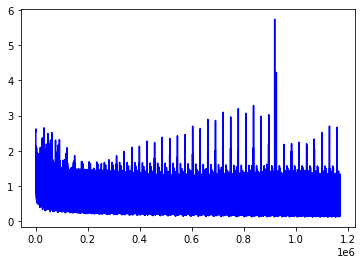

In [14]:
modeloUm = RedeNeuralModeloUm()

runnerUmCrossSGDBatch = RedeNeuralRunner(modeloUm,
                                     X_train, y_train,
                                     40,0.00015,'CrossEntropyLoss','SGD','runnerUmCrossSGDBatch',True)

runnerUmCrossSGDBatch.train()

In [16]:
runnerUmCrossSGDBatch.evaluate(X_test,y_test)

0.8403010640615456

In [17]:
runnerUmCrossRMSpropBatch.export()

In [ ]:
###########
#
# Modelo 2
#
############

Last Epoch: 3999 Loss: 0.31486639380455017
GRÁFICO DA FUNÇÃO DE CUSTO


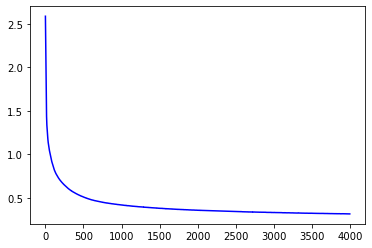

In [18]:
modeloDois = RedeNeuralModeloDois()

runnerDoisCrossAdam = RedeNeuralRunner(modeloDois,
                                     X_train, y_train,
                                     4000,0.0015,'CrossEntropyLoss','Adam','runnerDoisCrossAdam',False)

runnerDoisCrossAdam.train()


In [19]:
runnerDoisCrossAdam.evaluate(X_test,y_test)

0.8885875020824168

In [20]:
runnerDoisCrossAdam.export()

Last Epoch: 3999 Loss: 0.37624233961105347
GRÁFICO DA FUNÇÃO DE CUSTO


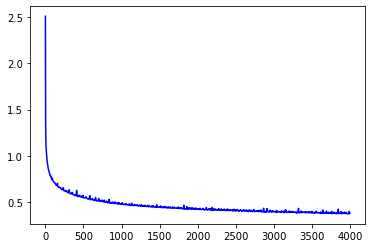

In [21]:
modeloDois = RedeNeuralModeloDois()

runnerDoisCrossRMSprop = RedeNeuralRunner(modeloDois,
                                     X_train, y_train,
                                     4000,0.0015,'CrossEntropyLoss','RMSprop','runnerDoisRMSprop',False)

runnerDoisCrossRMSprop.train()


In [22]:
runnerDoisCrossRMSprop.evaluate(X_test,y_test)

0.869954678069055

In [23]:
runnerDoisCrossRMSprop.export()

Last Epoch: 3999 Loss: 0.8229306936264038
GRÁFICO DA FUNÇÃO DE CUSTO


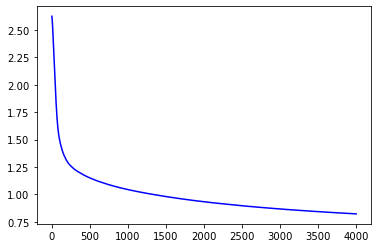

In [24]:
modeloDois = RedeNeuralModeloDois()

runnerDoisCrossSGD = RedeNeuralRunner(modeloDois,
                                     X_train, y_train,
                                     4000,0.0015,'CrossEntropyLoss','SGD','runnerDoisSGD',False)

runnerDoisCrossSGD.train()


In [25]:
runnerDoisCrossSGD.evaluate(X_test,y_test)

0.7361588702408769

In [26]:
runnerDoisCrossSGD.export()

Epoch: 39 Loss: 0.26679712533950806
Epoch: 39 Loss: 0.2985011339187622
Epoch: 39 Loss: 0.30210041999816895
Epoch: 39 Loss: 0.08821386098861694
Epoch: 39 Loss: 0.2176002711057663
Epoch: 39 Loss: 0.2715218961238861
Epoch: 39 Loss: 0.6548073291778564
Epoch: 39 Loss: 0.33266785740852356
Epoch: 39 Loss: 0.3293415904045105
Epoch: 39 Loss: 0.43051302433013916
Epoch: 39 Loss: 0.5203157067298889
Epoch: 39 Loss: 0.364458829164505
Epoch: 39 Loss: 0.08333590626716614
Epoch: 39 Loss: 0.19528226554393768
Epoch: 39 Loss: 0.268045574426651
Epoch: 39 Loss: 0.22834397852420807
Epoch: 39 Loss: 0.24314838647842407
Epoch: 39 Loss: 0.15577541291713715
Epoch: 39 Loss: 0.1982056200504303
Epoch: 39 Loss: 0.29221826791763306
Epoch: 39 Loss: 0.4369714558124542
Epoch: 39 Loss: 0.1973249912261963
Epoch: 39 Loss: 0.340285986661911
Epoch: 39 Loss: 0.19298070669174194
Epoch: 39 Loss: 0.4362976849079132
Epoch: 39 Loss: 0.1357199251651764
Epoch: 39 Loss: 0.5300585031509399
Epoch: 39 Loss: 0.3055364191532135
Epoch: 39 L

Epoch: 39 Loss: 0.1853332370519638
Epoch: 39 Loss: 0.3740319609642029
Epoch: 39 Loss: 0.5306000113487244
Epoch: 39 Loss: 0.3549771308898926
Epoch: 39 Loss: 0.2680649161338806
Epoch: 39 Loss: 0.3156684935092926
Epoch: 39 Loss: 0.38098806142807007
Epoch: 39 Loss: 0.2505371868610382
Epoch: 39 Loss: 0.2055107057094574
Epoch: 39 Loss: 0.2404085397720337
Epoch: 39 Loss: 0.24816426634788513
Epoch: 39 Loss: 0.2910527288913727
Epoch: 39 Loss: 0.2743508219718933
Epoch: 39 Loss: 0.1990945190191269
Epoch: 39 Loss: 0.3338583707809448
Epoch: 39 Loss: 0.31126558780670166
Epoch: 39 Loss: 0.28471553325653076
Epoch: 39 Loss: 0.45155951380729675
Epoch: 39 Loss: 0.22200514376163483
Epoch: 39 Loss: 0.21836324036121368
Epoch: 39 Loss: 0.19398155808448792
Epoch: 39 Loss: 0.3530777394771576
Epoch: 39 Loss: 0.26388436555862427
Epoch: 39 Loss: 0.2641918361186981
Epoch: 39 Loss: 0.511667788028717
Epoch: 39 Loss: 0.43285149335861206
Epoch: 39 Loss: 0.5435001850128174
Epoch: 39 Loss: 0.22880063951015472
Epoch: 39 

Epoch: 39 Loss: 0.22720707952976227
Epoch: 39 Loss: 0.31892210245132446
Epoch: 39 Loss: 0.670283317565918
Epoch: 39 Loss: 0.3023528754711151
Epoch: 39 Loss: 0.17294098436832428
Epoch: 39 Loss: 0.26000428199768066
Epoch: 39 Loss: 0.1949514001607895
Epoch: 39 Loss: 0.2529095411300659
Epoch: 39 Loss: 0.22828330099582672
Epoch: 39 Loss: 0.42290329933166504
Epoch: 39 Loss: 0.23670606315135956
Epoch: 39 Loss: 0.2876136302947998
Epoch: 39 Loss: 0.34644845128059387
Epoch: 39 Loss: 0.4539872705936432
Epoch: 39 Loss: 0.2662769854068756
Epoch: 39 Loss: 0.27478960156440735
Epoch: 39 Loss: 0.31581103801727295
Epoch: 39 Loss: 0.20115913450717926
Epoch: 39 Loss: 0.29515743255615234
Epoch: 39 Loss: 0.36547890305519104
Epoch: 39 Loss: 0.38241738080978394
Epoch: 39 Loss: 0.2600748836994171
Epoch: 39 Loss: 0.3176789879798889
Epoch: 39 Loss: 0.13888072967529297
Epoch: 39 Loss: 0.41350075602531433
Epoch: 39 Loss: 0.13007882237434387
Epoch: 39 Loss: 0.5350353121757507
Epoch: 39 Loss: 0.5078877210617065
Epoc

Epoch: 39 Loss: 0.4265078604221344
Epoch: 39 Loss: 0.3508036434650421
Epoch: 39 Loss: 0.2618875801563263
Epoch: 39 Loss: 0.4749503433704376
Epoch: 39 Loss: 0.46733805537223816
Epoch: 39 Loss: 0.2796875834465027
Epoch: 39 Loss: 0.37459617853164673
Epoch: 39 Loss: 0.2781500518321991
Epoch: 39 Loss: 0.3580354154109955
Epoch: 39 Loss: 0.14316441118717194
Epoch: 39 Loss: 0.17307108640670776
Epoch: 39 Loss: 0.1869271695613861
Epoch: 39 Loss: 0.4490750730037689
Epoch: 39 Loss: 0.4662746489048004
Epoch: 39 Loss: 0.16465958952903748
Epoch: 39 Loss: 0.5571677088737488
Epoch: 39 Loss: 0.30148574709892273
Epoch: 39 Loss: 0.16222845017910004
Epoch: 39 Loss: 0.31990447640419006
Epoch: 39 Loss: 1.231336236000061
Epoch: 39 Loss: 0.16150441765785217
Epoch: 39 Loss: 0.2420177459716797
Epoch: 39 Loss: 0.20278555154800415
Epoch: 39 Loss: 0.16423100233078003
Epoch: 39 Loss: 0.22448565065860748
Epoch: 39 Loss: 0.34694522619247437
Epoch: 39 Loss: 0.28009605407714844
Epoch: 39 Loss: 0.3113287091255188
Epoch: 

Epoch: 39 Loss: 0.6494885683059692
Epoch: 39 Loss: 0.6066908240318298
Epoch: 39 Loss: 0.2315215766429901
Epoch: 39 Loss: 0.14575473964214325
Epoch: 39 Loss: 0.7832506895065308
Epoch: 39 Loss: 0.32749301195144653
Epoch: 39 Loss: 0.32604026794433594
Epoch: 39 Loss: 0.49234554171562195
Epoch: 39 Loss: 0.17785599827766418
Epoch: 39 Loss: 0.5268489718437195
Epoch: 39 Loss: 0.4089549481868744
Epoch: 39 Loss: 0.4600295126438141
Epoch: 39 Loss: 0.3488421142101288
Epoch: 39 Loss: 0.1681823879480362
Epoch: 39 Loss: 0.1552688479423523
Epoch: 39 Loss: 0.2816900312900543
Epoch: 39 Loss: 0.3208853602409363
Epoch: 39 Loss: 0.30698370933532715
Epoch: 39 Loss: 0.6375264525413513
Epoch: 39 Loss: 0.5198034644126892
Epoch: 39 Loss: 0.6017648577690125
Epoch: 39 Loss: 0.38194984197616577
Epoch: 39 Loss: 0.5353807210922241
Epoch: 39 Loss: 0.5125192999839783
Epoch: 39 Loss: 0.18606799840927124
Epoch: 39 Loss: 0.42025813460350037
Epoch: 39 Loss: 0.3309614658355713
Epoch: 39 Loss: 0.2080463171005249
Epoch: 39 L

Epoch: 39 Loss: 0.22687408328056335
Epoch: 39 Loss: 0.1078455001115799
Epoch: 39 Loss: 0.31776586174964905
Epoch: 39 Loss: 0.14807385206222534
Epoch: 39 Loss: 0.19800922274589539
Epoch: 39 Loss: 0.6298562288284302
Epoch: 39 Loss: 0.3324281871318817
Epoch: 39 Loss: 0.43667474389076233
Epoch: 39 Loss: 0.25558754801750183
Epoch: 39 Loss: 0.5446838140487671
Epoch: 39 Loss: 0.6016839146614075
Epoch: 39 Loss: 0.2175968438386917
Epoch: 39 Loss: 0.11283725500106812
Epoch: 39 Loss: 0.3188204765319824
Epoch: 39 Loss: 0.2930915355682373
Epoch: 39 Loss: 0.35439178347587585
Epoch: 39 Loss: 0.30455246567726135
Epoch: 39 Loss: 0.3522060811519623
Epoch: 39 Loss: 0.4361347258090973
Epoch: 39 Loss: 0.2962161898612976
Epoch: 39 Loss: 0.4185938239097595
Epoch: 39 Loss: 0.46491846442222595
Epoch: 39 Loss: 0.40733179450035095
Epoch: 39 Loss: 0.24933628737926483
Epoch: 39 Loss: 0.3056899607181549
Epoch: 39 Loss: 0.2921734154224396
Epoch: 39 Loss: 0.4061940014362335
Epoch: 39 Loss: 0.4155134856700897
Epoch: 3

Epoch: 39 Loss: 0.2806954085826874
Epoch: 39 Loss: 0.21552489697933197
Epoch: 39 Loss: 0.25354447960853577
Epoch: 39 Loss: 0.3455323278903961
Epoch: 39 Loss: 0.31764155626296997
Epoch: 39 Loss: 0.3868092894554138
Epoch: 39 Loss: 0.6362324953079224
Epoch: 39 Loss: 0.3275078535079956
Epoch: 39 Loss: 0.4973861873149872
Epoch: 39 Loss: 0.3346494734287262
Epoch: 39 Loss: 0.2473374456167221
Epoch: 39 Loss: 0.17915616929531097
Epoch: 39 Loss: 0.24825650453567505
Epoch: 39 Loss: 0.20836107432842255
Epoch: 39 Loss: 0.15763702988624573
Epoch: 39 Loss: 0.33734455704689026
Epoch: 39 Loss: 0.7734662294387817
Epoch: 39 Loss: 0.4819982945919037
Epoch: 39 Loss: 0.27520322799682617
Epoch: 39 Loss: 0.4110136032104492
Epoch: 39 Loss: 0.26874247193336487
Epoch: 39 Loss: 0.4984825551509857
Epoch: 39 Loss: 0.2144935429096222
Epoch: 39 Loss: 0.4082338213920593
Epoch: 39 Loss: 0.1932591199874878
Epoch: 39 Loss: 0.2842939496040344
Epoch: 39 Loss: 0.2713550925254822
Epoch: 39 Loss: 0.14311523735523224
Epoch: 39

Epoch: 39 Loss: 0.7269785404205322
Epoch: 39 Loss: 0.15588341653347015
Epoch: 39 Loss: 0.13471269607543945
Epoch: 39 Loss: 0.36250248551368713
Epoch: 39 Loss: 0.3772123456001282
Epoch: 39 Loss: 0.4024675488471985
Epoch: 39 Loss: 0.3258003294467926
Epoch: 39 Loss: 0.35962817072868347
Epoch: 39 Loss: 0.3142239451408386
Epoch: 39 Loss: 0.16698090732097626
Epoch: 39 Loss: 0.43521758913993835
Epoch: 39 Loss: 0.2271249145269394
Epoch: 39 Loss: 0.2878989577293396
Epoch: 39 Loss: 0.5527695417404175
Epoch: 39 Loss: 0.16558852791786194
Epoch: 39 Loss: 0.5289716124534607
Epoch: 39 Loss: 0.21694618463516235
Epoch: 39 Loss: 0.1895628720521927
Epoch: 39 Loss: 0.16752420365810394
Epoch: 39 Loss: 0.3317907750606537
Epoch: 39 Loss: 0.43204912543296814
Epoch: 39 Loss: 0.18990665674209595
Epoch: 39 Loss: 0.35547128319740295
Epoch: 39 Loss: 0.5421310067176819
Epoch: 39 Loss: 0.27720656991004944
Epoch: 39 Loss: 0.21640640497207642
Epoch: 39 Loss: 0.1160699650645256
Epoch: 39 Loss: 0.37519022822380066
Epoch

Epoch: 39 Loss: 0.7488862872123718
Epoch: 39 Loss: 0.36691322922706604
Epoch: 39 Loss: 0.282968133687973
Epoch: 39 Loss: 0.5262223482131958
Epoch: 39 Loss: 0.25591838359832764
Epoch: 39 Loss: 0.18454194068908691
Epoch: 39 Loss: 0.11536118388175964
Epoch: 39 Loss: 0.24409246444702148
Epoch: 39 Loss: 0.25706946849823
Epoch: 39 Loss: 0.43238359689712524
Epoch: 39 Loss: 0.09883087873458862
Epoch: 39 Loss: 0.4099694788455963
Epoch: 39 Loss: 0.32946908473968506
Epoch: 39 Loss: 0.21904292702674866
Epoch: 39 Loss: 0.3349591791629791
Epoch: 39 Loss: 0.2894207537174225
Epoch: 39 Loss: 0.1884070187807083
Epoch: 39 Loss: 0.20152950286865234
Epoch: 39 Loss: 0.45073992013931274
Epoch: 39 Loss: 0.5816646814346313
Epoch: 39 Loss: 0.41225242614746094
Epoch: 39 Loss: 0.2595289945602417
Epoch: 39 Loss: 0.3481557071208954
Epoch: 39 Loss: 0.2771424353122711
Epoch: 39 Loss: 0.3431658446788788
Epoch: 39 Loss: 0.3094232976436615
Epoch: 39 Loss: 0.49707531929016113
Epoch: 39 Loss: 0.3070094585418701
Epoch: 39 

Epoch: 39 Loss: 0.4925651550292969
Epoch: 39 Loss: 0.19137610495090485
Epoch: 39 Loss: 0.2855586111545563
Epoch: 39 Loss: 0.3243286609649658
Epoch: 39 Loss: 0.4667039215564728
Epoch: 39 Loss: 0.28881263732910156
Epoch: 39 Loss: 0.2940170466899872
Epoch: 39 Loss: 0.3759750723838806
Epoch: 39 Loss: 0.22680629789829254
Epoch: 39 Loss: 0.4005385637283325
Epoch: 39 Loss: 0.3227636218070984
Epoch: 39 Loss: 0.3106885850429535
Epoch: 39 Loss: 0.13089871406555176
Epoch: 39 Loss: 0.4371030032634735
Epoch: 39 Loss: 0.17262916266918182
Epoch: 39 Loss: 0.23606279492378235
Epoch: 39 Loss: 0.24127008020877838
Epoch: 39 Loss: 0.2780877351760864
Epoch: 39 Loss: 0.21953286230564117
Epoch: 39 Loss: 0.1660512387752533
Epoch: 39 Loss: 0.29901403188705444
Epoch: 39 Loss: 0.3143027126789093
Epoch: 39 Loss: 0.4446617066860199
Epoch: 39 Loss: 0.2844976782798767
Epoch: 39 Loss: 0.36675968766212463
Epoch: 39 Loss: 0.21159930527210236
Epoch: 39 Loss: 0.35435885190963745
Epoch: 39 Loss: 0.44351422786712646
Epoch: 

Epoch: 39 Loss: 0.12977927923202515
Epoch: 39 Loss: 0.3465896248817444
Epoch: 39 Loss: 0.2855873107910156
Epoch: 39 Loss: 0.5312649011611938
Epoch: 39 Loss: 0.20249173045158386
Epoch: 39 Loss: 0.36595457792282104
Epoch: 39 Loss: 0.3105378746986389
Epoch: 39 Loss: 0.21588408946990967
Epoch: 39 Loss: 0.2039327621459961
Epoch: 39 Loss: 0.4124486446380615
Epoch: 39 Loss: 0.2477284073829651
Epoch: 39 Loss: 0.36642590165138245
Epoch: 39 Loss: 0.42847490310668945
Epoch: 39 Loss: 0.2778104543685913
Epoch: 39 Loss: 0.414399653673172
Epoch: 39 Loss: 0.20059585571289062
Epoch: 39 Loss: 0.15100988745689392
Epoch: 39 Loss: 0.3147617280483246
Epoch: 39 Loss: 0.29049286246299744
Epoch: 39 Loss: 0.2215103954076767
Epoch: 39 Loss: 0.29480862617492676
Epoch: 39 Loss: 0.26026734709739685
Epoch: 39 Loss: 0.5560230612754822
Epoch: 39 Loss: 0.21044999361038208
Epoch: 39 Loss: 0.5716522336006165
Epoch: 39 Loss: 0.11343775689601898
Epoch: 39 Loss: 0.3095933198928833
Epoch: 39 Loss: 0.3652246296405792
Epoch: 3

Epoch: 39 Loss: 0.4014532268047333
Epoch: 39 Loss: 0.20865657925605774
Epoch: 39 Loss: 0.23109136521816254
Epoch: 39 Loss: 0.29800939559936523
Epoch: 39 Loss: 0.5388221144676208
Epoch: 39 Loss: 0.4196493625640869
Epoch: 39 Loss: 0.15695996582508087
Epoch: 39 Loss: 0.24883757531642914
Epoch: 39 Loss: 0.4198751747608185
Epoch: 39 Loss: 0.3478994369506836
Epoch: 39 Loss: 0.4746985137462616
Epoch: 39 Loss: 0.4212280809879303
Epoch: 39 Loss: 0.20100215077400208
Epoch: 39 Loss: 0.3121677041053772
Epoch: 39 Loss: 0.12773527204990387
Epoch: 39 Loss: 0.3155953884124756
Epoch: 39 Loss: 0.22614100575447083
Epoch: 39 Loss: 0.3177531957626343
Epoch: 39 Loss: 0.2502318322658539
Epoch: 39 Loss: 0.3277093470096588
Epoch: 39 Loss: 0.315300852060318
Epoch: 39 Loss: 0.5060275793075562
Epoch: 39 Loss: 0.3364235460758209
Epoch: 39 Loss: 0.18169385194778442
Epoch: 39 Loss: 0.08787309378385544
Epoch: 39 Loss: 0.21634911000728607
Epoch: 39 Loss: 0.3207118809223175
Epoch: 39 Loss: 0.2497069239616394
Epoch: 39 

Epoch: 39 Loss: 0.35586440563201904
Epoch: 39 Loss: 0.2731410562992096
Epoch: 39 Loss: 0.4128507673740387
Epoch: 39 Loss: 0.1792651265859604
Epoch: 39 Loss: 0.21599267423152924
Epoch: 39 Loss: 0.20602792501449585
Epoch: 39 Loss: 0.46758076548576355
Epoch: 39 Loss: 0.3134514093399048
Epoch: 39 Loss: 0.5136095285415649
Epoch: 39 Loss: 0.5332164168357849
Epoch: 39 Loss: 0.37051159143447876
Epoch: 39 Loss: 0.6112256050109863
Epoch: 39 Loss: 0.5953696370124817
Epoch: 39 Loss: 0.4528574049472809
Epoch: 39 Loss: 0.45974603295326233
Epoch: 39 Loss: 0.3256712257862091
Epoch: 39 Loss: 0.17932191491127014
Epoch: 39 Loss: 0.2711585462093353
Epoch: 39 Loss: 0.2744021713733673
Epoch: 39 Loss: 0.23551751673221588
Epoch: 39 Loss: 0.2503610849380493
Epoch: 39 Loss: 0.16090162098407745
Epoch: 39 Loss: 0.28593695163726807
Epoch: 39 Loss: 0.2370063215494156
Epoch: 39 Loss: 0.3096989095211029
Epoch: 39 Loss: 0.4079209268093109
Epoch: 39 Loss: 0.18377110362052917
Epoch: 39 Loss: 0.300907701253891
Epoch: 39 

Epoch: 39 Loss: 0.380828320980072
Epoch: 39 Loss: 0.17100228369235992
Epoch: 39 Loss: 0.18337398767471313
Epoch: 39 Loss: 0.3575383722782135
Epoch: 39 Loss: 0.2775889039039612
Epoch: 39 Loss: 0.29552191495895386
Epoch: 39 Loss: 0.3183007836341858
Epoch: 39 Loss: 0.14311520755290985
Epoch: 39 Loss: 0.3583463132381439
Epoch: 39 Loss: 0.17931422591209412
Epoch: 39 Loss: 0.22667936980724335
Epoch: 39 Loss: 0.3026859760284424
Epoch: 39 Loss: 0.3446650207042694
Epoch: 39 Loss: 0.4096718728542328
Epoch: 39 Loss: 0.14729776978492737
Epoch: 39 Loss: 0.2255672663450241
Epoch: 39 Loss: 0.3573595881462097
Epoch: 39 Loss: 0.12755966186523438
Epoch: 39 Loss: 0.13617850840091705
Epoch: 39 Loss: 0.261362224817276
Epoch: 39 Loss: 0.37689414620399475
Epoch: 39 Loss: 0.2026965618133545
Epoch: 39 Loss: 0.2654492259025574
Epoch: 39 Loss: 0.22429756820201874
Epoch: 39 Loss: 0.26398801803588867
Epoch: 39 Loss: 0.4610786736011505
Epoch: 39 Loss: 0.26412251591682434
Epoch: 39 Loss: 0.22396554052829742
Epoch: 3

Epoch: 39 Loss: 0.38244375586509705
Epoch: 39 Loss: 0.25809308886528015
Epoch: 39 Loss: 0.3539635241031647
Epoch: 39 Loss: 0.09609714150428772
Epoch: 39 Loss: 0.485903263092041
Epoch: 39 Loss: 0.3003784120082855
Epoch: 39 Loss: 0.1760360300540924
Epoch: 39 Loss: 0.1636943519115448
Epoch: 39 Loss: 0.9780944585800171
Epoch: 39 Loss: 0.23453977704048157
Epoch: 39 Loss: 0.14680546522140503
Epoch: 39 Loss: 0.5456425547599792
Epoch: 39 Loss: 0.21192604303359985
Epoch: 39 Loss: 0.1752059906721115
Epoch: 39 Loss: 0.21455346047878265
Epoch: 39 Loss: 0.44241833686828613
Epoch: 39 Loss: 0.263409823179245
Epoch: 39 Loss: 0.5053080916404724
Epoch: 39 Loss: 0.1375114619731903
Epoch: 39 Loss: 0.588951826095581
Epoch: 39 Loss: 0.3547062873840332
Epoch: 39 Loss: 0.12449841946363449
Epoch: 39 Loss: 0.3063364624977112
Epoch: 39 Loss: 0.30198198556900024
Epoch: 39 Loss: 0.34676918387413025
Epoch: 39 Loss: 0.2107124775648117
Epoch: 39 Loss: 0.4670982360839844
Epoch: 39 Loss: 0.4065544009208679
Epoch: 39 Lo

Epoch: 39 Loss: 0.3508268892765045
Epoch: 39 Loss: 0.48565638065338135
Epoch: 39 Loss: 0.31872013211250305
Epoch: 39 Loss: 0.20415076613426208
Epoch: 39 Loss: 0.4004940390586853
Epoch: 39 Loss: 0.2925342619419098
Epoch: 39 Loss: 0.16013166308403015
Epoch: 39 Loss: 0.18514466285705566
Epoch: 39 Loss: 0.2660599946975708
Epoch: 39 Loss: 0.4907824397087097
Epoch: 39 Loss: 0.24467256665229797
Epoch: 39 Loss: 0.5922684669494629
Epoch: 39 Loss: 0.21854150295257568
Epoch: 39 Loss: 0.600939154624939
Epoch: 39 Loss: 0.5800413489341736
Epoch: 39 Loss: 0.3068612217903137
Epoch: 39 Loss: 0.345684289932251
Epoch: 39 Loss: 0.25350722670555115
Epoch: 39 Loss: 0.28485721349716187
Epoch: 39 Loss: 0.30427902936935425
Epoch: 39 Loss: 0.362213671207428
Epoch: 39 Loss: 0.21272140741348267
Epoch: 39 Loss: 0.5008464455604553
Epoch: 39 Loss: 0.26825374364852905
Epoch: 39 Loss: 0.3902727961540222
Epoch: 39 Loss: 0.21264979243278503
Epoch: 39 Loss: 0.5929940342903137
Epoch: 39 Loss: 0.24003976583480835
Epoch: 39

Epoch: 39 Loss: 0.33945196866989136
Epoch: 39 Loss: 0.2607613801956177
Epoch: 39 Loss: 0.2187999188899994
Epoch: 39 Loss: 0.3631654679775238
Epoch: 39 Loss: 0.20435158908367157
Epoch: 39 Loss: 0.33962616324424744
Epoch: 39 Loss: 0.4546321630477905
Epoch: 39 Loss: 0.38300347328186035
Epoch: 39 Loss: 0.34211423993110657
Epoch: 39 Loss: 0.24228620529174805
Epoch: 39 Loss: 0.41652563214302063
Epoch: 39 Loss: 0.18049822747707367
Epoch: 39 Loss: 0.1812160462141037
Epoch: 39 Loss: 0.23798514902591705
Epoch: 39 Loss: 0.32676711678504944
Epoch: 39 Loss: 0.3186418116092682
Epoch: 39 Loss: 0.3954349160194397
Epoch: 39 Loss: 0.4402938485145569
Epoch: 39 Loss: 0.16167399287223816
Epoch: 39 Loss: 0.3622221052646637
Epoch: 39 Loss: 0.12329795956611633
Epoch: 39 Loss: 0.07532700896263123
Epoch: 39 Loss: 0.3265276551246643
Epoch: 39 Loss: 0.4041112959384918
Epoch: 39 Loss: 0.27435576915740967
Epoch: 39 Loss: 0.1961226761341095
Epoch: 39 Loss: 0.5605473518371582
Epoch: 39 Loss: 0.4367731809616089
Epoch:

Epoch: 39 Loss: 0.6633716225624084
Epoch: 39 Loss: 0.4093289077281952
Epoch: 39 Loss: 0.3023448884487152
Epoch: 39 Loss: 0.28268879652023315
Epoch: 39 Loss: 0.24483419954776764
Epoch: 39 Loss: 0.3757072687149048
Epoch: 39 Loss: 0.28532251715660095
Epoch: 39 Loss: 0.3249714970588684
Epoch: 39 Loss: 0.5649278163909912
Epoch: 39 Loss: 0.29813456535339355
Epoch: 39 Loss: 0.5233921408653259
Epoch: 39 Loss: 0.4413573145866394
Epoch: 39 Loss: 0.2899925112724304
Epoch: 39 Loss: 0.2802373468875885
Epoch: 39 Loss: 0.32886213064193726
Epoch: 39 Loss: 0.26937973499298096
Epoch: 39 Loss: 0.23375286161899567
Epoch: 39 Loss: 0.1344103217124939
Epoch: 39 Loss: 0.2307615578174591
Epoch: 39 Loss: 0.41178372502326965
Epoch: 39 Loss: 0.3832054138183594
Epoch: 39 Loss: 0.1486608237028122
Epoch: 39 Loss: 0.2580074965953827
Epoch: 39 Loss: 0.3402993977069855
Epoch: 39 Loss: 0.31489014625549316
Epoch: 39 Loss: 0.43185919523239136
Epoch: 39 Loss: 0.2298976331949234
Epoch: 39 Loss: 0.28581759333610535
Epoch: 39

Epoch: 39 Loss: 0.19712230563163757
Epoch: 39 Loss: 0.16632436215877533
Epoch: 39 Loss: 0.2887696623802185
Epoch: 39 Loss: 0.7266054749488831
Epoch: 39 Loss: 0.34028249979019165
Epoch: 39 Loss: 0.4214394986629486
Epoch: 39 Loss: 0.30339309573173523
Epoch: 39 Loss: 0.37493476271629333
Epoch: 39 Loss: 0.3393363058567047
Epoch: 39 Loss: 0.3190273344516754
Epoch: 39 Loss: 0.2518673539161682
Epoch: 39 Loss: 0.2265888750553131
Epoch: 39 Loss: 0.18013954162597656
Epoch: 39 Loss: 0.44945228099823
Epoch: 39 Loss: 0.21643084287643433
Epoch: 39 Loss: 0.5747020244598389
Epoch: 39 Loss: 0.26970893144607544
Epoch: 39 Loss: 0.19195374846458435
Epoch: 39 Loss: 0.28863221406936646
Epoch: 39 Loss: 0.211692675948143
Epoch: 39 Loss: 0.4044290781021118
Epoch: 39 Loss: 0.37811851501464844
Epoch: 39 Loss: 0.5169336795806885
Epoch: 39 Loss: 0.22057420015335083
Epoch: 39 Loss: 0.5411145687103271
Epoch: 39 Loss: 0.17445199191570282
Epoch: 39 Loss: 0.4467867314815521
Epoch: 39 Loss: 0.9041000604629517
Epoch: 39 

Epoch: 39 Loss: 0.2990986108779907
Epoch: 39 Loss: 0.18641440570354462
Epoch: 39 Loss: 0.37479034066200256
Epoch: 39 Loss: 0.4364297091960907
Epoch: 39 Loss: 0.2677171230316162
Epoch: 39 Loss: 0.3635648190975189
Epoch: 39 Loss: 0.3510492146015167
Epoch: 39 Loss: 0.3528608977794647
Epoch: 39 Loss: 0.5321134924888611
Epoch: 39 Loss: 0.35088789463043213
Epoch: 39 Loss: 0.2519441843032837
Epoch: 39 Loss: 0.3849182426929474
Epoch: 39 Loss: 0.35245203971862793
Epoch: 39 Loss: 0.9599699378013611
Epoch: 39 Loss: 0.2800193727016449
Epoch: 39 Loss: 0.3170362710952759
Epoch: 39 Loss: 0.20194648206233978
Epoch: 39 Loss: 0.7429380416870117
Epoch: 39 Loss: 0.2655341327190399
Epoch: 39 Loss: 0.11493173986673355
Epoch: 39 Loss: 0.38793084025382996
Epoch: 39 Loss: 0.30679744482040405
Epoch: 39 Loss: 0.3020814061164856
Epoch: 39 Loss: 0.27277103066444397
Epoch: 39 Loss: 0.10863754898309708
Epoch: 39 Loss: 0.2952485680580139
Epoch: 39 Loss: 0.22413848340511322
Epoch: 39 Loss: 0.2811070680618286
Epoch: 39

Epoch: 39 Loss: 0.49710145592689514
Epoch: 39 Loss: 0.24469220638275146
Epoch: 39 Loss: 0.29998767375946045
Epoch: 39 Loss: 0.2255280464887619
Epoch: 39 Loss: 0.2721836566925049
Epoch: 39 Loss: 0.2574177384376526
Epoch: 39 Loss: 0.4093133807182312
Epoch: 39 Loss: 0.39528173208236694
Epoch: 39 Loss: 0.23257608711719513
Epoch: 39 Loss: 0.29631492495536804
Epoch: 39 Loss: 0.39216089248657227
Epoch: 39 Loss: 0.17940163612365723
Epoch: 39 Loss: 0.5567662715911865
Epoch: 39 Loss: 0.24830685555934906
Epoch: 39 Loss: 0.24930116534233093
Epoch: 39 Loss: 0.171325221657753
Epoch: 39 Loss: 0.3034588694572449
Epoch: 39 Loss: 0.39065811038017273
Epoch: 39 Loss: 0.42483794689178467
Epoch: 39 Loss: 0.14584316313266754
Epoch: 39 Loss: 0.18934448063373566
Epoch: 39 Loss: 0.25153210759162903
Epoch: 39 Loss: 0.25052574276924133
Epoch: 39 Loss: 0.3986320197582245
Epoch: 39 Loss: 0.2413739711046219
Epoch: 39 Loss: 0.4857172966003418
Epoch: 39 Loss: 0.33843114972114563
Epoch: 39 Loss: 0.3903840482234955
Epoc

Epoch: 39 Loss: 0.32715845108032227
Epoch: 39 Loss: 0.1743212789297104
Epoch: 39 Loss: 0.30248579382896423
Epoch: 39 Loss: 0.3718235492706299
Epoch: 39 Loss: 0.4573071599006653
Epoch: 39 Loss: 0.36677613854408264
Epoch: 39 Loss: 0.15608955919742584
Epoch: 39 Loss: 0.26912879943847656
Epoch: 39 Loss: 0.2785004675388336
Epoch: 39 Loss: 0.5190845131874084
Epoch: 39 Loss: 0.4335744380950928
Epoch: 39 Loss: 0.48496586084365845
Epoch: 39 Loss: 0.4711703062057495
Epoch: 39 Loss: 0.31072545051574707
Epoch: 39 Loss: 0.19289761781692505
Epoch: 39 Loss: 0.18895183503627777
Epoch: 39 Loss: 0.36511069536209106
Epoch: 39 Loss: 0.3978886604309082
Epoch: 39 Loss: 0.32684755325317383
Epoch: 39 Loss: 0.5132550001144409
Epoch: 39 Loss: 0.21510928869247437
Epoch: 39 Loss: 0.27012190222740173
Epoch: 39 Loss: 0.145022913813591
Epoch: 39 Loss: 0.5748413801193237
Epoch: 39 Loss: 0.2826708257198334
Epoch: 39 Loss: 0.6027350425720215
Epoch: 39 Loss: 0.23047880828380585
Epoch: 39 Loss: 0.5495178699493408
Epoch: 

Epoch: 39 Loss: 0.3248704671859741
Epoch: 39 Loss: 0.3034697473049164
Epoch: 39 Loss: 0.37523701786994934
Epoch: 39 Loss: 0.5218070149421692
Epoch: 39 Loss: 0.34920427203178406
Epoch: 39 Loss: 0.23132029175758362
Epoch: 39 Loss: 0.2565760910511017
Epoch: 39 Loss: 0.31938979029655457
Epoch: 39 Loss: 0.15273602306842804
Epoch: 39 Loss: 0.2800634801387787
Epoch: 39 Loss: 0.23544149100780487
Epoch: 39 Loss: 0.26715826988220215
Epoch: 39 Loss: 0.6533352136611938
Epoch: 39 Loss: 0.27500638365745544
Epoch: 39 Loss: 0.3686397075653076
Epoch: 39 Loss: 0.2660079896450043
Epoch: 39 Loss: 0.524025559425354
Epoch: 39 Loss: 0.1508868783712387
Epoch: 39 Loss: 0.2366369068622589
Epoch: 39 Loss: 0.2654173970222473
Epoch: 39 Loss: 0.32540959119796753
Epoch: 39 Loss: 0.33207905292510986
Epoch: 39 Loss: 0.3201831579208374
Epoch: 39 Loss: 0.2648492753505707
Epoch: 39 Loss: 0.22204406559467316
Epoch: 39 Loss: 0.1974945217370987
Epoch: 39 Loss: 0.45534148812294006
Epoch: 39 Loss: 0.31523188948631287
Epoch: 3

Epoch: 39 Loss: 0.41849786043167114
Epoch: 39 Loss: 0.37652507424354553
Epoch: 39 Loss: 0.148527130484581
Epoch: 39 Loss: 0.5144522786140442
Epoch: 39 Loss: 0.561059832572937
Epoch: 39 Loss: 0.16704367101192474
Epoch: 39 Loss: 0.5427339673042297
Epoch: 39 Loss: 0.3008151352405548
Epoch: 39 Loss: 0.5153613686561584
Epoch: 39 Loss: 0.23504146933555603
Epoch: 39 Loss: 0.3132190704345703
Epoch: 39 Loss: 0.24915939569473267
Epoch: 39 Loss: 0.2836970388889313
Epoch: 39 Loss: 0.2715432643890381
Epoch: 39 Loss: 0.18927820026874542
Epoch: 39 Loss: 0.15521207451820374
Epoch: 39 Loss: 0.5518661141395569
Epoch: 39 Loss: 0.2501969039440155
Epoch: 39 Loss: 0.4849555492401123
Epoch: 39 Loss: 0.12266495823860168
Epoch: 39 Loss: 0.23159641027450562
Epoch: 39 Loss: 0.520249605178833
Epoch: 39 Loss: 0.1972421109676361
Epoch: 39 Loss: 0.30333125591278076
Epoch: 39 Loss: 0.5049911141395569
Epoch: 39 Loss: 0.25393733382225037
Epoch: 39 Loss: 0.21558871865272522
Epoch: 39 Loss: 0.4447507858276367
Epoch: 39 L

Epoch: 39 Loss: 0.3752085864543915
Epoch: 39 Loss: 0.2789367735385895
Epoch: 39 Loss: 0.19791750609874725
Epoch: 39 Loss: 0.28341469168663025
Epoch: 39 Loss: 0.09505856037139893
Epoch: 39 Loss: 0.42833736538887024
Epoch: 39 Loss: 0.1726888120174408
Epoch: 39 Loss: 0.43815475702285767
Epoch: 39 Loss: 0.5661673545837402
Epoch: 39 Loss: 0.23461522161960602
Epoch: 39 Loss: 0.28949829936027527
Epoch: 39 Loss: 0.6320439577102661
Epoch: 39 Loss: 0.3221789002418518
Epoch: 39 Loss: 0.341121107339859
Epoch: 39 Loss: 0.31246936321258545
Epoch: 39 Loss: 0.16992095112800598
Epoch: 39 Loss: 0.2594776749610901
Epoch: 39 Loss: 0.47445496916770935
Epoch: 39 Loss: 0.5047699213027954
Epoch: 39 Loss: 0.21129854023456573
Epoch: 39 Loss: 0.3357427716255188
Epoch: 39 Loss: 0.09563756734132767
Epoch: 39 Loss: 0.29445505142211914
Epoch: 39 Loss: 0.3596043884754181
Epoch: 39 Loss: 0.4577574133872986
Epoch: 39 Loss: 0.2802925407886505
Epoch: 39 Loss: 0.41478028893470764
Epoch: 39 Loss: 0.40323033928871155
Epoch:

Epoch: 39 Loss: 0.43276816606521606
Epoch: 39 Loss: 0.24416251480579376
Epoch: 39 Loss: 0.3074881136417389
Epoch: 39 Loss: 0.22514860332012177
Epoch: 39 Loss: 0.18291907012462616
Epoch: 39 Loss: 0.24350836873054504
Epoch: 39 Loss: 0.21142040193080902
Epoch: 39 Loss: 0.14150142669677734
Epoch: 39 Loss: 0.18850848078727722
Epoch: 39 Loss: 0.2430332452058792
Epoch: 39 Loss: 0.44439783692359924
Epoch: 39 Loss: 0.2213994860649109
Epoch: 39 Loss: 0.4068600833415985
Epoch: 39 Loss: 0.1271481215953827
Epoch: 39 Loss: 0.13118301331996918
Epoch: 39 Loss: 0.3324151039123535
Epoch: 39 Loss: 0.4769136607646942
Epoch: 39 Loss: 0.719372034072876
Epoch: 39 Loss: 0.33490437269210815
Epoch: 39 Loss: 0.2823109030723572
Epoch: 39 Loss: 0.1452171504497528
Epoch: 39 Loss: 0.23592238128185272
Epoch: 39 Loss: 0.34937864542007446
Epoch: 39 Loss: 0.1190783753991127
Epoch: 39 Loss: 0.2582027316093445
Epoch: 39 Loss: 0.43672505021095276
Epoch: 39 Loss: 0.27570775151252747
Epoch: 39 Loss: 0.1805754154920578
Epoch:

Epoch: 39 Loss: 0.5560852289199829
Epoch: 39 Loss: 0.46549609303474426
Epoch: 39 Loss: 0.4514288008213043
Epoch: 39 Loss: 0.584357738494873
Epoch: 39 Loss: 0.5238063931465149
Epoch: 39 Loss: 0.2752842605113983
Epoch: 39 Loss: 0.24032430350780487
Epoch: 39 Loss: 0.1070856899023056
Epoch: 39 Loss: 0.29011690616607666
Epoch: 39 Loss: 0.1843850165605545
Epoch: 39 Loss: 0.3426855504512787
Epoch: 39 Loss: 0.4436473548412323
Epoch: 39 Loss: 0.5004931688308716
Epoch: 39 Loss: 0.4453074634075165
Epoch: 39 Loss: 0.4994829297065735
Epoch: 39 Loss: 0.3962082862854004
Epoch: 39 Loss: 0.30845069885253906
Epoch: 39 Loss: 0.3337935209274292
Epoch: 39 Loss: 0.28990045189857483
Epoch: 39 Loss: 0.24875929951667786
Epoch: 39 Loss: 0.4267776608467102
Epoch: 39 Loss: 0.387099951505661
Epoch: 39 Loss: 0.3308624029159546
Epoch: 39 Loss: 0.4361310601234436
Epoch: 39 Loss: 0.279105544090271
Epoch: 39 Loss: 0.24205712974071503
Epoch: 39 Loss: 0.19959379732608795
Epoch: 39 Loss: 0.07012616842985153
Epoch: 39 Loss

Epoch: 39 Loss: 0.2755275368690491
Epoch: 39 Loss: 0.41153597831726074
Epoch: 39 Loss: 0.6041747331619263
Epoch: 39 Loss: 0.2877926230430603
Epoch: 39 Loss: 0.35509902238845825
Epoch: 39 Loss: 0.1873651146888733
Epoch: 39 Loss: 0.25976765155792236
Epoch: 39 Loss: 0.24805355072021484
Epoch: 39 Loss: 0.3819686770439148
Epoch: 39 Loss: 0.47628921270370483
Epoch: 39 Loss: 0.2766934037208557
Epoch: 39 Loss: 0.2629612684249878
Epoch: 39 Loss: 0.4260937571525574
Epoch: 39 Loss: 0.2810056805610657
Epoch: 39 Loss: 0.15219518542289734
Epoch: 39 Loss: 0.21446552872657776
Epoch: 39 Loss: 0.2008713036775589
Epoch: 39 Loss: 0.5137732028961182
Epoch: 39 Loss: 0.35718587040901184
Epoch: 39 Loss: 0.19656871259212494
Epoch: 39 Loss: 0.6197354197502136
Epoch: 39 Loss: 0.2978536784648895
Epoch: 39 Loss: 0.3394258916378021
Epoch: 39 Loss: 0.2038334757089615
Epoch: 39 Loss: 0.3250143826007843
Epoch: 39 Loss: 0.25445133447647095
Epoch: 39 Loss: 0.3047378361225128
Epoch: 39 Loss: 0.21753640472888947
Epoch: 39

Epoch: 39 Loss: 0.31271424889564514
Epoch: 39 Loss: 0.2842113971710205
Epoch: 39 Loss: 0.2070547342300415
Epoch: 39 Loss: 0.1901969164609909
Epoch: 39 Loss: 0.2405068427324295
Epoch: 39 Loss: 0.4283744990825653
Epoch: 39 Loss: 0.5298144817352295
Epoch: 39 Loss: 0.4814898669719696
Epoch: 39 Loss: 0.2887256443500519
Epoch: 39 Loss: 0.13974788784980774
Epoch: 39 Loss: 0.16687557101249695
Epoch: 39 Loss: 0.32496514916419983
Epoch: 39 Loss: 0.2866663336753845
Epoch: 39 Loss: 0.2613813281059265
Epoch: 39 Loss: 0.36296728253364563
Epoch: 39 Loss: 0.4605691134929657
Epoch: 39 Loss: 0.2853330373764038
Epoch: 39 Loss: 0.5129061937332153
Epoch: 39 Loss: 0.417205810546875
Epoch: 39 Loss: 0.9008272290229797
Epoch: 39 Loss: 0.4774596393108368
Epoch: 39 Loss: 0.3089112341403961
Epoch: 39 Loss: 0.10141191631555557
Epoch: 39 Loss: 0.3328271806240082
Epoch: 39 Loss: 0.34160786867141724
Epoch: 39 Loss: 0.30242642760276794
Epoch: 39 Loss: 0.2664131820201874
Epoch: 39 Loss: 0.9354627728462219
Epoch: 39 Los

Epoch: 39 Loss: 0.362912654876709
Epoch: 39 Loss: 0.2694310247898102
Epoch: 39 Loss: 0.23195679485797882
Epoch: 39 Loss: 0.3160012662410736
Epoch: 39 Loss: 0.35022521018981934
Epoch: 39 Loss: 0.19395557045936584
Epoch: 39 Loss: 0.40402325987815857
Epoch: 39 Loss: 0.2814217805862427
Epoch: 39 Loss: 0.4368193447589874
Epoch: 39 Loss: 0.6608024835586548
Epoch: 39 Loss: 0.48190584778785706
Epoch: 39 Loss: 0.21110811829566956
Epoch: 39 Loss: 0.24905359745025635
Epoch: 39 Loss: 0.29080909490585327
Epoch: 39 Loss: 0.48408424854278564
Epoch: 39 Loss: 0.27729055285453796
Epoch: 39 Loss: 0.25696203112602234
Epoch: 39 Loss: 0.3756800889968872
Epoch: 39 Loss: 0.3117712438106537
Epoch: 39 Loss: 0.1745922863483429
Epoch: 39 Loss: 0.5465519428253174
Epoch: 39 Loss: 0.5026645660400391
Epoch: 39 Loss: 0.3809158205986023
Epoch: 39 Loss: 0.25178754329681396
Epoch: 39 Loss: 0.41082894802093506
Epoch: 39 Loss: 0.6452545523643494
Epoch: 39 Loss: 0.19184285402297974
Epoch: 39 Loss: 0.4098416864871979
Epoch: 

Epoch: 39 Loss: 0.33801937103271484
Epoch: 39 Loss: 0.4036271274089813
Epoch: 39 Loss: 0.2691129744052887
Epoch: 39 Loss: 0.37453603744506836
Epoch: 39 Loss: 0.2329106330871582
Epoch: 39 Loss: 0.2550789415836334
Epoch: 39 Loss: 0.43233078718185425
Epoch: 39 Loss: 0.2694723904132843
Epoch: 39 Loss: 0.14198845624923706
Epoch: 39 Loss: 0.37994274497032166
Epoch: 39 Loss: 0.3277707099914551
Epoch: 39 Loss: 0.13327330350875854
Epoch: 39 Loss: 0.41941264271736145
Epoch: 39 Loss: 0.36741918325424194
Epoch: 39 Loss: 0.3028520941734314
Epoch: 39 Loss: 0.3022010326385498
Epoch: 39 Loss: 0.2980814576148987
Epoch: 39 Loss: 0.22943702340126038
Epoch: 39 Loss: 0.23499342799186707
Epoch: 39 Loss: 0.26046106219291687
Epoch: 39 Loss: 0.208032488822937
Epoch: 39 Loss: 0.3206935524940491
Epoch: 39 Loss: 0.16023628413677216
Epoch: 39 Loss: 0.4018048346042633
Epoch: 39 Loss: 0.47863784432411194
Epoch: 39 Loss: 0.33329665660858154
Epoch: 39 Loss: 0.4762052297592163
Epoch: 39 Loss: 0.28823545575141907
Epoch:

Epoch: 39 Loss: 0.1591108739376068
Epoch: 39 Loss: 0.11139675974845886
Epoch: 39 Loss: 0.29717060923576355
Epoch: 39 Loss: 0.33787938952445984
Epoch: 39 Loss: 0.47383639216423035
Epoch: 39 Loss: 0.5265586376190186
Epoch: 39 Loss: 0.36963585019111633
Epoch: 39 Loss: 0.49162787199020386
Epoch: 39 Loss: 0.2625111937522888
Epoch: 39 Loss: 1.0154142379760742
Epoch: 39 Loss: 0.2661823332309723
Epoch: 39 Loss: 0.32578763365745544
Epoch: 39 Loss: 0.44922763109207153
Epoch: 39 Loss: 0.4227488934993744
Epoch: 39 Loss: 0.1694016307592392
Epoch: 39 Loss: 0.3214617967605591
Epoch: 39 Loss: 0.446880578994751
Epoch: 39 Loss: 0.3663056194782257
Epoch: 39 Loss: 0.18845103681087494
Epoch: 39 Loss: 0.7006042003631592
Epoch: 39 Loss: 0.344372421503067
Epoch: 39 Loss: 0.19003579020500183
Epoch: 39 Loss: 0.4221636950969696
Epoch: 39 Loss: 0.35965824127197266
Epoch: 39 Loss: 0.4415604770183563
Epoch: 39 Loss: 0.2033921778202057
Epoch: 39 Loss: 0.3993854224681854
Epoch: 39 Loss: 0.29763248562812805
Epoch: 39 

Epoch: 39 Loss: 0.20595213770866394
Epoch: 39 Loss: 0.2281908541917801
Epoch: 39 Loss: 0.3826025128364563
Epoch: 39 Loss: 0.3063657879829407
Epoch: 39 Loss: 0.22458113729953766
Epoch: 39 Loss: 0.16570229828357697
Epoch: 39 Loss: 0.20901475846767426
Epoch: 39 Loss: 0.314480721950531
Epoch: 39 Loss: 0.28795790672302246
Epoch: 39 Loss: 0.2821301519870758
Epoch: 39 Loss: 0.12474716454744339
Epoch: 39 Loss: 0.2141994684934616
Epoch: 39 Loss: 0.46375715732574463
Epoch: 39 Loss: 0.2520139515399933
Epoch: 39 Loss: 0.33180731534957886
Epoch: 39 Loss: 0.29213809967041016
Epoch: 39 Loss: 0.34574639797210693
Epoch: 39 Loss: 0.2229285091161728
Epoch: 39 Loss: 0.190859854221344
Epoch: 39 Loss: 0.2803023159503937
Epoch: 39 Loss: 0.29832321405410767
Epoch: 39 Loss: 0.13648630678653717
Epoch: 39 Loss: 0.13510161638259888
Epoch: 39 Loss: 0.18166184425354004
Epoch: 39 Loss: 0.2993117570877075
Epoch: 39 Loss: 0.15009385347366333
Epoch: 39 Loss: 0.16308186948299408
Epoch: 39 Loss: 0.08484678715467453
Epoch

Epoch: 39 Loss: 0.24939922988414764
Epoch: 39 Loss: 0.4598812460899353
Epoch: 39 Loss: 0.2372226119041443
Epoch: 39 Loss: 0.5082418918609619
Epoch: 39 Loss: 0.3143024444580078
Epoch: 39 Loss: 0.45219042897224426
Epoch: 39 Loss: 0.2919199466705322
Epoch: 39 Loss: 0.5551002025604248
Epoch: 39 Loss: 0.5632545948028564
Epoch: 39 Loss: 0.6215358376502991
Epoch: 39 Loss: 0.22742979228496552
Epoch: 39 Loss: 0.26068395376205444
Epoch: 39 Loss: 0.39418187737464905
Epoch: 39 Loss: 0.4566721022129059
Epoch: 39 Loss: 0.3959825932979584
Epoch: 39 Loss: 0.18084724247455597
Epoch: 39 Loss: 0.359498530626297
Epoch: 39 Loss: 0.467445969581604
Epoch: 39 Loss: 0.37512004375457764
Epoch: 39 Loss: 0.5508248805999756
Epoch: 39 Loss: 0.24618014693260193
Epoch: 39 Loss: 0.3846122622489929
Epoch: 39 Loss: 0.5400765538215637
Epoch: 39 Loss: 0.26861903071403503
Epoch: 39 Loss: 0.3424060046672821
Epoch: 39 Loss: 0.2724684774875641
Epoch: 39 Loss: 0.30269110202789307
Epoch: 39 Loss: 0.5886744260787964
Epoch: 39 Lo

Epoch: 39 Loss: 0.21970593929290771
Epoch: 39 Loss: 0.3953164219856262
Epoch: 39 Loss: 0.5528005957603455
Epoch: 39 Loss: 0.5536038875579834
Epoch: 39 Loss: 0.364320307970047
Epoch: 39 Loss: 0.18972311913967133
Epoch: 39 Loss: 0.4213699996471405
Epoch: 39 Loss: 0.20963835716247559
Epoch: 39 Loss: 0.4816542863845825
Epoch: 39 Loss: 0.29841241240501404
Epoch: 39 Loss: 0.16240452229976654
Epoch: 39 Loss: 0.3089461922645569
Epoch: 39 Loss: 0.3493683636188507
Epoch: 39 Loss: 0.1399068832397461
Epoch: 39 Loss: 0.24515391886234283
Epoch: 39 Loss: 0.3000691831111908
Epoch: 39 Loss: 0.6721584796905518
Epoch: 39 Loss: 0.2324264794588089
Epoch: 39 Loss: 0.8848366141319275
Epoch: 39 Loss: 0.4731487035751343
Epoch: 39 Loss: 0.3065091669559479
Epoch: 39 Loss: 0.3598982095718384
Epoch: 39 Loss: 0.3746120035648346
Epoch: 39 Loss: 0.6748577356338501
Epoch: 39 Loss: 0.2690139710903168
Epoch: 39 Loss: 0.4610614776611328
Epoch: 39 Loss: 0.2871706485748291
Epoch: 39 Loss: 0.20179134607315063
Epoch: 39 Loss

Epoch: 39 Loss: 0.7602185010910034
Epoch: 39 Loss: 0.3047989308834076
Epoch: 39 Loss: 0.22199009358882904
Epoch: 39 Loss: 0.17411814630031586
Epoch: 39 Loss: 0.19834846258163452
Epoch: 39 Loss: 0.16816446185112
Epoch: 39 Loss: 0.24175941944122314
Epoch: 39 Loss: 0.33561116456985474
Epoch: 39 Loss: 0.1908409744501114
Epoch: 39 Loss: 0.39903494715690613
Epoch: 39 Loss: 0.4962911307811737
Epoch: 39 Loss: 0.6334143877029419
Epoch: 39 Loss: 0.645487904548645
Epoch: 39 Loss: 0.26310986280441284
Epoch: 39 Loss: 0.5109800696372986
Epoch: 39 Loss: 0.5192071199417114
Epoch: 39 Loss: 0.41015440225601196
Epoch: 39 Loss: 0.36527320742607117
Epoch: 39 Loss: 0.38404926657676697
Epoch: 39 Loss: 0.3882506787776947
Epoch: 39 Loss: 0.20960938930511475
Epoch: 39 Loss: 0.2976994812488556
Epoch: 39 Loss: 0.19611608982086182
Epoch: 39 Loss: 0.33619964122772217
Epoch: 39 Loss: 0.27357831597328186
Epoch: 39 Loss: 0.18831266462802887
Epoch: 39 Loss: 0.5754667520523071
Epoch: 39 Loss: 0.21118630468845367
Epoch: 

Epoch: 39 Loss: 0.30278629064559937
Epoch: 39 Loss: 0.3287378251552582
Epoch: 39 Loss: 0.4173486530780792
Epoch: 39 Loss: 0.33708295226097107
Epoch: 39 Loss: 0.2532210350036621
Epoch: 39 Loss: 0.2093527615070343
Epoch: 39 Loss: 0.28584417700767517
Epoch: 39 Loss: 0.49039873480796814
Epoch: 39 Loss: 0.4665124714374542
Epoch: 39 Loss: 0.13386212289333344
Epoch: 39 Loss: 0.30218297243118286
Epoch: 39 Loss: 0.3777429461479187
Epoch: 39 Loss: 0.6007282733917236
Epoch: 39 Loss: 0.6704952716827393
Epoch: 39 Loss: 0.2624451220035553
Epoch: 39 Loss: 0.3434674143791199
Epoch: 39 Loss: 0.24795936048030853
Epoch: 39 Loss: 0.3146280348300934
Epoch: 39 Loss: 0.25101935863494873
Epoch: 39 Loss: 0.2196734994649887
Epoch: 39 Loss: 0.34838372468948364
Epoch: 39 Loss: 0.26015958189964294
Epoch: 39 Loss: 0.17968253791332245
Epoch: 39 Loss: 0.20911923050880432
Epoch: 39 Loss: 0.2004067599773407
Epoch: 39 Loss: 0.19400998950004578
Epoch: 39 Loss: 0.2422325164079666
Epoch: 39 Loss: 0.12066750973463058
Epoch:

Epoch: 39 Loss: 0.2139994502067566
Epoch: 39 Loss: 0.2707820236682892
Epoch: 39 Loss: 0.2756664752960205
Epoch: 39 Loss: 0.23463867604732513
Epoch: 39 Loss: 0.3177309036254883
Epoch: 39 Loss: 0.4228346049785614
Epoch: 39 Loss: 0.2871280312538147
Epoch: 39 Loss: 0.2940848171710968
Epoch: 39 Loss: 0.1068258285522461
Epoch: 39 Loss: 0.44989335536956787
Epoch: 39 Loss: 0.27360427379608154
Epoch: 39 Loss: 0.19534674286842346
Epoch: 39 Loss: 0.46234944462776184
Epoch: 39 Loss: 0.33467522263526917
Epoch: 39 Loss: 0.4784836173057556
Epoch: 39 Loss: 0.6819331645965576
Epoch: 39 Loss: 0.2720952033996582
Epoch: 39 Loss: 0.2196905016899109
Epoch: 39 Loss: 0.3803452253341675
Epoch: 39 Loss: 0.342901349067688
Epoch: 39 Loss: 0.3564203083515167
Epoch: 39 Loss: 0.3393585979938507
Epoch: 39 Loss: 0.13956031203269958
Epoch: 39 Loss: 0.30851292610168457
Epoch: 39 Loss: 0.5538105964660645
Epoch: 39 Loss: 0.21638703346252441
Epoch: 39 Loss: 0.48792845010757446
Epoch: 39 Loss: 0.37475040555000305
Epoch: 39 

Epoch: 39 Loss: 0.2810579836368561
Epoch: 39 Loss: 0.28809764981269836
Epoch: 39 Loss: 0.4104495644569397
Epoch: 39 Loss: 0.3842454254627228
Epoch: 39 Loss: 0.2942609488964081
Epoch: 39 Loss: 0.4251275956630707
Epoch: 39 Loss: 0.2307942509651184
Epoch: 39 Loss: 0.22328798472881317
Epoch: 39 Loss: 0.46164029836654663
Epoch: 39 Loss: 0.4844170808792114
Epoch: 39 Loss: 0.149519145488739
Epoch: 39 Loss: 0.30602020025253296
Epoch: 39 Loss: 0.44953691959381104
Epoch: 39 Loss: 0.24890413880348206
Epoch: 39 Loss: 0.2383262813091278
Epoch: 39 Loss: 0.3429737091064453
Epoch: 39 Loss: 0.37751010060310364
Epoch: 39 Loss: 0.3591925799846649
Epoch: 39 Loss: 0.4699975848197937
Epoch: 39 Loss: 0.4715944528579712
Epoch: 39 Loss: 0.2608698308467865
Epoch: 39 Loss: 0.15546654164791107
Epoch: 39 Loss: 0.5040451884269714
Epoch: 39 Loss: 0.34949180483818054
Epoch: 39 Loss: 0.4595484137535095
Epoch: 39 Loss: 0.6765435338020325
Epoch: 39 Loss: 0.33204734325408936
Epoch: 39 Loss: 0.20286917686462402
Epoch: 39 

Epoch: 39 Loss: 0.15402230620384216
Epoch: 39 Loss: 0.2026108056306839
Epoch: 39 Loss: 0.31112581491470337
Epoch: 39 Loss: 0.4928165078163147
Epoch: 39 Loss: 0.33186882734298706
Epoch: 39 Loss: 0.2780132591724396
Epoch: 39 Loss: 0.35439106822013855
Epoch: 39 Loss: 0.06463062763214111
Epoch: 39 Loss: 0.2082856148481369
Epoch: 39 Loss: 0.5050674676895142
Epoch: 39 Loss: 0.16634467244148254
Epoch: 39 Loss: 0.5706267356872559
Epoch: 39 Loss: 0.251916766166687
Epoch: 39 Loss: 0.2986906170845032
Epoch: 39 Loss: 0.2147432565689087
Epoch: 39 Loss: 0.19964566826820374
Epoch: 39 Loss: 0.19336499273777008
Epoch: 39 Loss: 0.4073314666748047
Epoch: 39 Loss: 0.29441776871681213
Epoch: 39 Loss: 0.14616845548152924
Epoch: 39 Loss: 0.1936918944120407
Epoch: 39 Loss: 0.12909938395023346
Epoch: 39 Loss: 0.20076987147331238
Epoch: 39 Loss: 0.478018581867218
Epoch: 39 Loss: 0.45253556966781616
Epoch: 39 Loss: 0.3433947265148163
Epoch: 39 Loss: 0.24940846860408783
Epoch: 39 Loss: 0.3296467065811157
Epoch: 3

Epoch: 39 Loss: 0.37633365392684937
Epoch: 39 Loss: 0.1906922310590744
Epoch: 39 Loss: 0.21711689233779907
Epoch: 39 Loss: 0.6287336945533752
Epoch: 39 Loss: 0.28726717829704285
Epoch: 39 Loss: 0.19991149008274078
Epoch: 39 Loss: 0.2910451292991638
Epoch: 39 Loss: 0.27862605452537537
Epoch: 39 Loss: 0.33052974939346313
Epoch: 39 Loss: 0.3025379478931427
Epoch: 39 Loss: 0.42372244596481323
Epoch: 39 Loss: 0.20556697249412537
Epoch: 39 Loss: 0.09866616874933243
Epoch: 39 Loss: 0.2492879033088684
Epoch: 39 Loss: 0.22716374695301056
Epoch: 39 Loss: 0.4001825749874115
Epoch: 39 Loss: 0.3855510950088501
Epoch: 39 Loss: 0.4139374792575836
Epoch: 39 Loss: 0.39319902658462524
Epoch: 39 Loss: 0.3382013440132141
Epoch: 39 Loss: 0.2578032612800598
Epoch: 39 Loss: 0.5848033428192139
Epoch: 39 Loss: 0.3293851613998413
Epoch: 39 Loss: 0.3187192678451538
Epoch: 39 Loss: 0.22512823343276978
Epoch: 39 Loss: 0.12186644226312637
Epoch: 39 Loss: 0.2940448522567749
Epoch: 39 Loss: 0.3683781027793884
Epoch: 

Epoch: 39 Loss: 0.19912607967853546
Epoch: 39 Loss: 0.28840529918670654
Epoch: 39 Loss: 0.23778216540813446
Epoch: 39 Loss: 0.19816339015960693
Epoch: 39 Loss: 0.23323187232017517
Epoch: 39 Loss: 0.21371304988861084
Epoch: 39 Loss: 0.2612704634666443
Epoch: 39 Loss: 0.44424089789390564
Epoch: 39 Loss: 0.23149172961711884
Epoch: 39 Loss: 0.27518635988235474
Epoch: 39 Loss: 0.21896342933177948
Epoch: 39 Loss: 0.7126716375350952
Epoch: 39 Loss: 0.6963613033294678
Epoch: 39 Loss: 0.4542132318019867
Epoch: 39 Loss: 0.19139420986175537
Epoch: 39 Loss: 0.17437699437141418
Epoch: 39 Loss: 0.2065698355436325
Epoch: 39 Loss: 0.3911451995372772
Epoch: 39 Loss: 0.11720065772533417
Epoch: 39 Loss: 0.1506119817495346
Epoch: 39 Loss: 0.2418070286512375
Epoch: 39 Loss: 0.44246459007263184
Epoch: 39 Loss: 0.2879275381565094
Epoch: 39 Loss: 0.36089107394218445
Epoch: 39 Loss: 0.41907939314842224
Epoch: 39 Loss: 0.24746747314929962
Epoch: 39 Loss: 0.40849947929382324
Epoch: 39 Loss: 0.30836591124534607
E

Epoch: 39 Loss: 0.3719925880432129
Epoch: 39 Loss: 0.2626352310180664
Epoch: 39 Loss: 0.16967789828777313
Epoch: 39 Loss: 0.31855759024620056
Epoch: 39 Loss: 0.40168747305870056
Epoch: 39 Loss: 0.35620370507240295
Epoch: 39 Loss: 0.6478511691093445
Epoch: 39 Loss: 0.3060780465602875
Epoch: 39 Loss: 0.2598705589771271
Epoch: 39 Loss: 0.24976928532123566
Epoch: 39 Loss: 0.3662286698818207
Epoch: 39 Loss: 0.45208877325057983
Epoch: 39 Loss: 0.5540593266487122
Epoch: 39 Loss: 0.2086840718984604
Epoch: 39 Loss: 0.36921244859695435
Epoch: 39 Loss: 0.24280259013175964
Epoch: 39 Loss: 0.49026498198509216
Epoch: 39 Loss: 0.19032178819179535
Epoch: 39 Loss: 0.2925206422805786
Epoch: 39 Loss: 0.20641569793224335
Epoch: 39 Loss: 0.3412133455276489
Epoch: 39 Loss: 0.18988960981369019
Epoch: 39 Loss: 0.2820494771003723
Epoch: 39 Loss: 0.219427227973938
Epoch: 39 Loss: 0.35322776436805725
Epoch: 39 Loss: 0.34074345231056213
Epoch: 39 Loss: 0.35382577776908875
Epoch: 39 Loss: 0.2988319396972656
Epoch:

Epoch: 39 Loss: 0.17037785053253174
Epoch: 39 Loss: 0.2735235095024109
Epoch: 39 Loss: 0.2684316039085388
Epoch: 39 Loss: 0.2776718735694885
Epoch: 39 Loss: 0.3293944299221039
Epoch: 39 Loss: 0.20316462218761444
Epoch: 39 Loss: 0.44854074716567993
Epoch: 39 Loss: 0.23236632347106934
Epoch: 39 Loss: 0.38975071907043457
Epoch: 39 Loss: 0.2561415433883667
Epoch: 39 Loss: 0.35628628730773926
Epoch: 39 Loss: 0.6850497126579285
Epoch: 39 Loss: 0.373831182718277
Epoch: 39 Loss: 0.6171571016311646
Epoch: 39 Loss: 0.27363571524620056
Epoch: 39 Loss: 0.41977494955062866
Epoch: 39 Loss: 0.2542940080165863
Epoch: 39 Loss: 0.18670925498008728
Epoch: 39 Loss: 0.2364303469657898
Epoch: 39 Loss: 0.26249122619628906
Epoch: 39 Loss: 0.1850304752588272
Epoch: 39 Loss: 0.2405012995004654
Epoch: 39 Loss: 0.13237081468105316
Epoch: 39 Loss: 0.32879549264907837
Epoch: 39 Loss: 0.4117628037929535
Epoch: 39 Loss: 0.25282737612724304
Epoch: 39 Loss: 0.33013787865638733
Epoch: 39 Loss: 0.22044456005096436
Epoch:

Epoch: 39 Loss: 0.23378458619117737
Epoch: 39 Loss: 0.4055989682674408
Epoch: 39 Loss: 0.44629281759262085
Epoch: 39 Loss: 0.20858655869960785
Epoch: 39 Loss: 0.13903683423995972
Epoch: 39 Loss: 0.6131971478462219
Epoch: 39 Loss: 0.2952263653278351
Epoch: 39 Loss: 0.2630493640899658
Epoch: 39 Loss: 0.2468654364347458
Epoch: 39 Loss: 0.23017430305480957
Epoch: 39 Loss: 0.35040614008903503
Epoch: 39 Loss: 0.4426586925983429
Epoch: 39 Loss: 0.36155563592910767
Epoch: 39 Loss: 0.27742135524749756
Epoch: 39 Loss: 0.3637535870075226
Epoch: 39 Loss: 0.13536661863327026
Epoch: 39 Loss: 0.11435963213443756
Epoch: 39 Loss: 0.33134934306144714
Epoch: 39 Loss: 0.3126612901687622
Epoch: 39 Loss: 0.2519282400608063
Epoch: 39 Loss: 0.2852896749973297
Epoch: 39 Loss: 0.34776732325553894
Epoch: 39 Loss: 0.413006991147995
Epoch: 39 Loss: 0.26870277523994446
Epoch: 39 Loss: 0.23326829075813293
Epoch: 39 Loss: 0.197183758020401
Epoch: 39 Loss: 0.34043100476264954
Epoch: 39 Loss: 0.35902902483940125
Epoch:

Epoch: 39 Loss: 0.16999498009681702
Epoch: 39 Loss: 0.17365887761116028
Epoch: 39 Loss: 0.2967219650745392
Epoch: 39 Loss: 0.5647534132003784
Epoch: 39 Loss: 0.27305224537849426
Epoch: 39 Loss: 0.6725233197212219
Epoch: 39 Loss: 0.48827067017555237
Epoch: 39 Loss: 0.18950380384922028
Epoch: 39 Loss: 0.2116614729166031
Epoch: 39 Loss: 0.11587415635585785
Epoch: 39 Loss: 0.2818993330001831
Epoch: 39 Loss: 0.42226848006248474
Epoch: 39 Loss: 0.464652955532074
Epoch: 39 Loss: 0.3845040500164032
Epoch: 39 Loss: 0.5365134477615356
Epoch: 39 Loss: 0.11220536381006241
Epoch: 39 Loss: 0.18219131231307983
Epoch: 39 Loss: 0.12056764215230942
Epoch: 39 Loss: 0.2858281433582306
Epoch: 39 Loss: 0.2491171956062317
Epoch: 39 Loss: 0.11021831631660461
Epoch: 39 Loss: 0.3780747950077057
Epoch: 39 Loss: 0.17432749271392822
Epoch: 39 Loss: 0.21311073005199432
Epoch: 39 Loss: 0.3498961925506592
Epoch: 39 Loss: 0.35153383016586304
Epoch: 39 Loss: 0.30471834540367126
Epoch: 39 Loss: 0.29917022585868835
Epoch

Epoch: 39 Loss: 0.3073725402355194
Epoch: 39 Loss: 0.33047011494636536
Epoch: 39 Loss: 0.46970194578170776
Epoch: 39 Loss: 0.4694081246852875
Epoch: 39 Loss: 0.3037174344062805
Epoch: 39 Loss: 0.40837961435317993
Epoch: 39 Loss: 0.28296175599098206
Epoch: 39 Loss: 0.3537360727787018
Epoch: 39 Loss: 0.10223757475614548
Epoch: 39 Loss: 0.29224327206611633
Epoch: 39 Loss: 0.5296616554260254
Epoch: 39 Loss: 0.3859439790248871
Epoch: 39 Loss: 0.449918270111084
Epoch: 39 Loss: 0.20757661759853363
Epoch: 39 Loss: 0.7639510035514832
Epoch: 39 Loss: 0.4082227051258087
Epoch: 39 Loss: 0.14927564561367035
Epoch: 39 Loss: 0.2231028974056244
Epoch: 39 Loss: 0.2976648211479187
Epoch: 39 Loss: 0.2029067873954773
Epoch: 39 Loss: 0.26257508993148804
Epoch: 39 Loss: 0.31693291664123535
Epoch: 39 Loss: 0.1598627269268036
Epoch: 39 Loss: 0.33812689781188965
Epoch: 39 Loss: 0.5438868403434753
Epoch: 39 Loss: 0.31614580750465393
Epoch: 39 Loss: 0.5881595611572266
Epoch: 39 Loss: 0.30516985058784485
Epoch: 3

Epoch: 39 Loss: 0.6462216377258301
Epoch: 39 Loss: 0.4347001910209656
Epoch: 39 Loss: 0.31266316771507263
Epoch: 39 Loss: 0.2747392952442169
Epoch: 39 Loss: 0.3324281871318817
Epoch: 39 Loss: 0.21528448164463043
Epoch: 39 Loss: 0.4286081790924072
Epoch: 39 Loss: 0.34195664525032043
Epoch: 39 Loss: 0.3163481056690216
Epoch: 39 Loss: 0.5810988545417786
Epoch: 39 Loss: 0.21245688199996948
Epoch: 39 Loss: 0.3855217695236206
Epoch: 39 Loss: 0.19542919099330902
Epoch: 39 Loss: 0.5619900822639465
Epoch: 39 Loss: 0.362342894077301
Epoch: 39 Loss: 0.3073085844516754
Epoch: 39 Loss: 0.2796509861946106
Epoch: 39 Loss: 0.1664532572031021
Epoch: 39 Loss: 0.32371628284454346
Epoch: 39 Loss: 0.2608863115310669
Epoch: 39 Loss: 0.20425277948379517
Epoch: 39 Loss: 0.10623038560152054
Epoch: 39 Loss: 0.3337843716144562
Epoch: 39 Loss: 0.4165266454219818
Epoch: 39 Loss: 0.16532844305038452
Epoch: 39 Loss: 0.12501755356788635
Epoch: 39 Loss: 0.2669205367565155
Epoch: 39 Loss: 0.12378872185945511
Epoch: 39 

Epoch: 39 Loss: 0.3012288212776184
Epoch: 39 Loss: 0.3711034953594208
Epoch: 39 Loss: 0.18095678091049194
Epoch: 39 Loss: 0.37985262274742126
Epoch: 39 Loss: 0.24670837819576263
Epoch: 39 Loss: 0.2588600814342499
Epoch: 39 Loss: 0.2144985795021057
Epoch: 39 Loss: 0.29011982679367065
Epoch: 39 Loss: 0.17481307685375214
Epoch: 39 Loss: 0.09157836437225342
Epoch: 39 Loss: 0.2918577790260315
Epoch: 39 Loss: 0.24707020819187164
Epoch: 39 Loss: 0.5557923316955566
Epoch: 39 Loss: 0.134048730134964
Epoch: 39 Loss: 0.20851750671863556
Epoch: 39 Loss: 0.16672401130199432
Epoch: 39 Loss: 0.3763337731361389
Epoch: 39 Loss: 0.5787711143493652
Epoch: 39 Loss: 0.20374150574207306
Epoch: 39 Loss: 0.28385692834854126
Epoch: 39 Loss: 0.3820209801197052
Epoch: 39 Loss: 0.24542400240898132
Epoch: 39 Loss: 0.27910491824150085
Epoch: 39 Loss: 0.2469443380832672
Epoch: 39 Loss: 0.18436671793460846
Epoch: 39 Loss: 0.23359417915344238
Epoch: 39 Loss: 0.459042489528656
Epoch: 39 Loss: 0.20368549227714539
Epoch:

Epoch: 39 Loss: 0.39168357849121094
Epoch: 39 Loss: 0.16516152024269104
Epoch: 39 Loss: 0.5082821249961853
Epoch: 39 Loss: 0.2262232005596161
Epoch: 39 Loss: 0.3083704710006714
Epoch: 39 Loss: 0.4685170352458954
Epoch: 39 Loss: 0.24784035980701447
Epoch: 39 Loss: 0.33186328411102295
Epoch: 39 Loss: 0.3114091455936432
Epoch: 39 Loss: 0.19620877504348755
Epoch: 39 Loss: 0.5531017184257507
Epoch: 39 Loss: 0.3548320531845093
Epoch: 39 Loss: 0.19290632009506226
Epoch: 39 Loss: 0.2333383709192276
Epoch: 39 Loss: 0.25478488206863403
Epoch: 39 Loss: 0.18493065237998962
Epoch: 39 Loss: 0.16899201273918152
Epoch: 39 Loss: 0.35794126987457275
Epoch: 39 Loss: 0.1745622158050537
Epoch: 39 Loss: 0.4685884714126587
Epoch: 39 Loss: 0.7035513520240784
Epoch: 39 Loss: 0.6269412636756897
Epoch: 39 Loss: 0.29007279872894287
Epoch: 39 Loss: 0.5410240292549133
Epoch: 39 Loss: 0.3211212754249573
Epoch: 39 Loss: 0.20252980291843414
Epoch: 39 Loss: 0.33987191319465637
Epoch: 39 Loss: 0.6444993019104004
Epoch: 

Epoch: 39 Loss: 0.3123345971107483
Epoch: 39 Loss: 0.6990587115287781
Epoch: 39 Loss: 0.3256654441356659
Epoch: 39 Loss: 0.18335071206092834
Epoch: 39 Loss: 0.21545344591140747
Epoch: 39 Loss: 0.12984643876552582
Epoch: 39 Loss: 0.5866257548332214
Epoch: 39 Loss: 0.34053629636764526
Epoch: 39 Loss: 0.5593722462654114
Epoch: 39 Loss: 0.2608361840248108
Epoch: 39 Loss: 0.5011382102966309
Epoch: 39 Loss: 0.24592149257659912
Epoch: 39 Loss: 0.3821982443332672
Epoch: 39 Loss: 0.29309380054473877
Epoch: 39 Loss: 0.5894684195518494
Epoch: 39 Loss: 0.45172062516212463
Epoch: 39 Loss: 0.24361693859100342
Epoch: 39 Loss: 0.32942771911621094
Epoch: 39 Loss: 0.5469983816146851
Epoch: 39 Loss: 0.3546608090400696
Epoch: 39 Loss: 0.5108863711357117
Epoch: 39 Loss: 0.24627995491027832
Epoch: 39 Loss: 0.40147125720977783
Epoch: 39 Loss: 0.2007339745759964
Epoch: 39 Loss: 0.31511959433555603
Epoch: 39 Loss: 0.40081682801246643
Epoch: 39 Loss: 0.5317113995552063
Epoch: 39 Loss: 0.14913426339626312
Epoch:

Epoch: 39 Loss: 0.2082010805606842
Epoch: 39 Loss: 0.4582081735134125
Epoch: 39 Loss: 0.3703783452510834
Epoch: 39 Loss: 0.16929225623607635
Epoch: 39 Loss: 0.29630082845687866
Epoch: 39 Loss: 0.27550140023231506
Epoch: 39 Loss: 0.3389504849910736
Epoch: 39 Loss: 0.27964556217193604
Epoch: 39 Loss: 0.26301103830337524
Epoch: 39 Loss: 0.18639986217021942
Epoch: 39 Loss: 0.3409915864467621
Epoch: 39 Loss: 0.5510575771331787
Epoch: 39 Loss: 0.21636903285980225
Epoch: 39 Loss: 0.1414409726858139
Epoch: 39 Loss: 0.32768765091896057
Epoch: 39 Loss: 0.20680145919322968
Epoch: 39 Loss: 0.28958654403686523
Epoch: 39 Loss: 0.1967220902442932
Epoch: 39 Loss: 0.21451376378536224
Epoch: 39 Loss: 0.16821511089801788
Epoch: 39 Loss: 0.32553523778915405
Epoch: 39 Loss: 0.4221847653388977
Epoch: 39 Loss: 0.3954811096191406
Epoch: 39 Loss: 0.24062100052833557
Epoch: 39 Loss: 0.11717499792575836
Epoch: 39 Loss: 0.3690226078033447
Epoch: 39 Loss: 0.1829432249069214
Epoch: 39 Loss: 0.6331789493560791
Epoch

Epoch: 39 Loss: 0.1654529571533203
Epoch: 39 Loss: 0.15469332039356232
Epoch: 39 Loss: 0.4498107135295868
Epoch: 39 Loss: 0.27412843704223633
Epoch: 39 Loss: 0.2378569394350052
Epoch: 39 Loss: 0.45378759503364563
Epoch: 39 Loss: 0.4183577001094818
Epoch: 39 Loss: 0.17593349516391754
Epoch: 39 Loss: 0.2873658835887909
Epoch: 39 Loss: 0.3025510907173157
Epoch: 39 Loss: 0.06545640528202057
Epoch: 39 Loss: 0.3623339533805847
Epoch: 39 Loss: 0.29479241371154785
Epoch: 39 Loss: 0.33505159616470337
Epoch: 39 Loss: 0.5610477328300476
Epoch: 39 Loss: 0.3110211491584778
Epoch: 39 Loss: 0.31387728452682495
Epoch: 39 Loss: 0.46832725405693054
Epoch: 39 Loss: 0.2743532955646515
Epoch: 39 Loss: 0.34128299355506897
Epoch: 39 Loss: 0.34627583622932434
Epoch: 39 Loss: 0.3268709182739258
Epoch: 39 Loss: 0.30509886145591736
Epoch: 39 Loss: 0.2978266477584839
Epoch: 39 Loss: 0.32629650831222534
Epoch: 39 Loss: 0.32182854413986206
Epoch: 39 Loss: 0.46185916662216187
Epoch: 39 Loss: 0.2700401842594147
Epoch

Epoch: 39 Loss: 0.3527098298072815
Epoch: 39 Loss: 0.5017865300178528
Epoch: 39 Loss: 0.44194695353507996
Epoch: 39 Loss: 0.36725082993507385
Epoch: 39 Loss: 0.2381550371646881
Epoch: 39 Loss: 0.4039689302444458
Epoch: 39 Loss: 0.2652978301048279
Epoch: 39 Loss: 0.1420820951461792
Epoch: 39 Loss: 0.2862829566001892
Epoch: 39 Loss: 0.43425998091697693
Epoch: 39 Loss: 0.2790370583534241
Epoch: 39 Loss: 0.2167336642742157
Epoch: 39 Loss: 0.27138128876686096
Epoch: 39 Loss: 0.181131511926651
Epoch: 39 Loss: 0.4663572907447815
Epoch: 39 Loss: 0.23366878926753998
Epoch: 39 Loss: 0.18827585875988007
Epoch: 39 Loss: 0.311801552772522
Epoch: 39 Loss: 0.30002811551094055
Epoch: 39 Loss: 0.3435167372226715
Epoch: 39 Loss: 0.2132192999124527
Epoch: 39 Loss: 0.3003808856010437
Epoch: 39 Loss: 0.30745863914489746
Epoch: 39 Loss: 0.17366977035999298
Epoch: 39 Loss: 0.5806692838668823
Epoch: 39 Loss: 0.4058631658554077
Epoch: 39 Loss: 0.2829362154006958
Epoch: 39 Loss: 0.3547546863555908
Epoch: 39 Los

Epoch: 39 Loss: 0.21350614726543427
Epoch: 39 Loss: 0.34171345829963684
Epoch: 39 Loss: 0.2847290337085724
Epoch: 39 Loss: 0.5120141506195068
Epoch: 39 Loss: 0.24946047365665436
Epoch: 39 Loss: 0.3919414281845093
Epoch: 39 Loss: 0.329365611076355
Epoch: 39 Loss: 0.4181898236274719
Epoch: 39 Loss: 0.25429767370224
Epoch: 39 Loss: 0.19676394760608673
Epoch: 39 Loss: 0.26253220438957214
Epoch: 39 Loss: 0.36479929089546204
Epoch: 39 Loss: 0.5190117359161377
Epoch: 39 Loss: 0.1687696874141693
Epoch: 39 Loss: 0.3157300651073456
Epoch: 39 Loss: 0.2539174258708954
Epoch: 39 Loss: 0.1112515926361084
Epoch: 39 Loss: 0.29481974244117737
Epoch: 39 Loss: 0.2827005684375763
Epoch: 39 Loss: 0.33576202392578125
Epoch: 39 Loss: 0.15349838137626648
Epoch: 39 Loss: 0.6089656949043274
Epoch: 39 Loss: 0.468304306268692
Epoch: 39 Loss: 0.6636959314346313
Epoch: 39 Loss: 0.4536823630332947
Epoch: 39 Loss: 0.36865663528442383
Epoch: 39 Loss: 0.7349548935890198
Epoch: 39 Loss: 0.1009339764714241
Epoch: 39 Loss

Epoch: 39 Loss: 0.2471880167722702
Epoch: 39 Loss: 0.1915559023618698
Epoch: 39 Loss: 0.37592026591300964
Epoch: 39 Loss: 0.5129485130310059
Epoch: 39 Loss: 0.22022150456905365
Epoch: 39 Loss: 0.4333488941192627
Epoch: 39 Loss: 0.3458109200000763
Epoch: 39 Loss: 0.27057868242263794
Epoch: 39 Loss: 0.28564050793647766
Epoch: 39 Loss: 0.3841456472873688
Epoch: 39 Loss: 0.2688053548336029
Epoch: 39 Loss: 0.3539939224720001
Epoch: 39 Loss: 0.3513849973678589
Epoch: 39 Loss: 0.2809765934944153
Epoch: 39 Loss: 0.26319175958633423
Epoch: 39 Loss: 0.34460893273353577
Epoch: 39 Loss: 0.49347612261772156
Epoch: 39 Loss: 0.44080621004104614
Epoch: 39 Loss: 0.6224936842918396
Epoch: 39 Loss: 0.4936046302318573
Epoch: 39 Loss: 0.18946321308612823
Epoch: 39 Loss: 0.37559574842453003
Epoch: 39 Loss: 0.20335279405117035
Epoch: 39 Loss: 0.5330460071563721
Epoch: 39 Loss: 0.36623260378837585
Epoch: 39 Loss: 0.4369828701019287
Epoch: 39 Loss: 0.31528228521347046
Epoch: 39 Loss: 0.270761102437973
Epoch: 3

Epoch: 39 Loss: 0.41061198711395264
Epoch: 39 Loss: 0.2831130921840668
Epoch: 39 Loss: 0.22175352275371552
Epoch: 39 Loss: 0.3280414342880249
Epoch: 39 Loss: 0.17188310623168945
Epoch: 39 Loss: 0.10254573822021484
Epoch: 39 Loss: 0.4321857988834381
Epoch: 39 Loss: 0.2830848693847656
Epoch: 39 Loss: 0.16975069046020508
Epoch: 39 Loss: 0.16714291274547577
Epoch: 39 Loss: 0.45978713035583496
Epoch: 39 Loss: 0.4240601062774658
Epoch: 39 Loss: 0.47790732979774475
Epoch: 39 Loss: 0.12681393325328827
Epoch: 39 Loss: 0.253068208694458
Epoch: 39 Loss: 0.291616290807724
Epoch: 39 Loss: 0.36549997329711914
Epoch: 39 Loss: 0.3292515277862549
Epoch: 39 Loss: 0.3502730131149292
Epoch: 39 Loss: 0.27053210139274597
Epoch: 39 Loss: 0.3849848806858063
Epoch: 39 Loss: 0.4620456397533417
Epoch: 39 Loss: 0.5320116877555847
Epoch: 39 Loss: 0.136531263589859
Epoch: 39 Loss: 0.13058170676231384
Epoch: 39 Loss: 0.2738453149795532
Epoch: 39 Loss: 0.08058705925941467
Epoch: 39 Loss: 0.29900842905044556
Epoch: 39

Epoch: 39 Loss: 0.15713274478912354
Epoch: 39 Loss: 0.44081005454063416
Epoch: 39 Loss: 0.25244879722595215
Epoch: 39 Loss: 0.5742236971855164
Epoch: 39 Loss: 0.34083613753318787
Epoch: 39 Loss: 0.466489315032959
Epoch: 39 Loss: 0.22191929817199707
Epoch: 39 Loss: 0.1474362015724182
Epoch: 39 Loss: 0.449709951877594
Epoch: 39 Loss: 0.1973973959684372
Epoch: 39 Loss: 0.2802389860153198
Epoch: 39 Loss: 0.9076724648475647
Epoch: 39 Loss: 0.3429165482521057
Epoch: 39 Loss: 0.2879972457885742
Epoch: 39 Loss: 0.42210638523101807
Epoch: 39 Loss: 0.2390083372592926
Epoch: 39 Loss: 0.5114469528198242
Epoch: 39 Loss: 0.22284099459648132
Epoch: 39 Loss: 0.4887359142303467
Epoch: 39 Loss: 0.2411169558763504
Epoch: 39 Loss: 0.44727662205696106
Epoch: 39 Loss: 0.5028313994407654
Epoch: 39 Loss: 0.21497014164924622
Epoch: 39 Loss: 0.20179317891597748
Epoch: 39 Loss: 0.5687786340713501
Epoch: 39 Loss: 0.29587987065315247
Epoch: 39 Loss: 0.3795442283153534
Epoch: 39 Loss: 0.389574259519577
Epoch: 39 Lo

Epoch: 39 Loss: 0.44542017579078674
Epoch: 39 Loss: 0.28726255893707275
Epoch: 39 Loss: 0.18599970638751984
Epoch: 39 Loss: 0.3268392086029053
Epoch: 39 Loss: 0.5657466053962708
Epoch: 39 Loss: 0.24204015731811523
Epoch: 39 Loss: 0.31134751439094543
Epoch: 39 Loss: 0.5093614459037781
Epoch: 39 Loss: 0.27040356397628784
Epoch: 39 Loss: 0.37066951394081116
Epoch: 39 Loss: 0.2767985165119171
Epoch: 39 Loss: 0.17741461098194122
Epoch: 39 Loss: 0.197050079703331
Epoch: 39 Loss: 0.18246231973171234
Epoch: 39 Loss: 0.2288859337568283
Epoch: 39 Loss: 0.1515904814004898
Epoch: 39 Loss: 0.517552375793457
Epoch: 39 Loss: 0.34611406922340393
Epoch: 39 Loss: 0.07687301933765411
Epoch: 39 Loss: 0.2870076298713684
Epoch: 39 Loss: 0.38322195410728455
Epoch: 39 Loss: 0.29785361886024475
Epoch: 39 Loss: 0.604557991027832
Epoch: 39 Loss: 0.28399479389190674
Epoch: 39 Loss: 0.28044793009757996
Epoch: 39 Loss: 0.05704439431428909
Epoch: 39 Loss: 0.3171490430831909
Epoch: 39 Loss: 0.21006692945957184
Epoch:

Epoch: 39 Loss: 0.17819777131080627
Epoch: 39 Loss: 0.35210728645324707
Epoch: 39 Loss: 0.15995460748672485
Epoch: 39 Loss: 0.5452908873558044
Epoch: 39 Loss: 0.32357001304626465
Epoch: 39 Loss: 0.323567271232605
Epoch: 39 Loss: 0.20104236900806427
Epoch: 39 Loss: 0.09490451216697693
Epoch: 39 Loss: 0.2566099464893341
Epoch: 39 Loss: 0.16892966628074646
Epoch: 39 Loss: 0.37518566846847534
Epoch: 39 Loss: 0.2554400563240051
Epoch: 39 Loss: 0.21777641773223877
Epoch: 39 Loss: 0.24537324905395508
Epoch: 39 Loss: 0.10373363643884659
Epoch: 39 Loss: 0.4418489933013916
Epoch: 39 Loss: 0.2470010668039322
Epoch: 39 Loss: 0.35866788029670715
Epoch: 39 Loss: 0.23588138818740845
Epoch: 39 Loss: 0.13046644628047943
Epoch: 39 Loss: 0.2772284746170044
Epoch: 39 Loss: 0.4595435559749603
Epoch: 39 Loss: 0.2612731158733368
Epoch: 39 Loss: 0.27628687024116516
Epoch: 39 Loss: 0.1754315048456192
Epoch: 39 Loss: 0.4822128415107727
Epoch: 39 Loss: 0.3170775771141052
Epoch: 39 Loss: 0.15026476979255676
Epoch

Epoch: 39 Loss: 0.32545414566993713
Epoch: 39 Loss: 0.4064810574054718
Epoch: 39 Loss: 0.4947734475135803
Epoch: 39 Loss: 0.32872670888900757
Epoch: 39 Loss: 0.26575782895088196
Epoch: 39 Loss: 0.4044766426086426
Epoch: 39 Loss: 0.2577444911003113
Epoch: 39 Loss: 0.436233788728714
Epoch: 39 Loss: 0.23802617192268372
Epoch: 39 Loss: 0.18804490566253662
Epoch: 39 Loss: 0.8675681948661804
Epoch: 39 Loss: 0.11123181879520416
Epoch: 39 Loss: 0.3389133810997009
Epoch: 39 Loss: 0.26540812849998474
Epoch: 39 Loss: 0.2746961712837219
Epoch: 39 Loss: 0.27532991766929626
Epoch: 39 Loss: 0.3403869867324829
Epoch: 39 Loss: 0.27270036935806274
Epoch: 39 Loss: 0.36199113726615906
Epoch: 39 Loss: 0.5389768481254578
Epoch: 39 Loss: 0.13285814225673676
Epoch: 39 Loss: 0.685295581817627
Epoch: 39 Loss: 0.19357816874980927
Epoch: 39 Loss: 0.11638572812080383
Epoch: 39 Loss: 0.30975356698036194
Epoch: 39 Loss: 0.3699725866317749
Epoch: 39 Loss: 0.5729905366897583
Epoch: 39 Loss: 0.16740791499614716
Epoch: 

Epoch: 39 Loss: 0.2889403700828552
Epoch: 39 Loss: 0.23777300119400024
Epoch: 39 Loss: 0.32765212655067444
Epoch: 39 Loss: 0.45119354128837585
Epoch: 39 Loss: 0.2625272572040558
Epoch: 39 Loss: 0.23887225985527039
Epoch: 39 Loss: 0.3937148153781891
Epoch: 39 Loss: 0.598304271697998
Epoch: 39 Loss: 0.1817663013935089
Epoch: 39 Loss: 0.3968298137187958
Epoch: 39 Loss: 0.38212722539901733
Epoch: 39 Loss: 0.3687009811401367
Epoch: 39 Loss: 0.2481386661529541
Epoch: 39 Loss: 0.38041242957115173
Epoch: 39 Loss: 0.26361775398254395
Epoch: 39 Loss: 0.32676371932029724
Epoch: 39 Loss: 0.23104795813560486
Epoch: 39 Loss: 0.1934729367494583
Epoch: 39 Loss: 0.2989485561847687
Epoch: 39 Loss: 0.47066807746887207
Epoch: 39 Loss: 0.491298109292984
Epoch: 39 Loss: 0.22615666687488556
Epoch: 39 Loss: 0.28953462839126587
Epoch: 39 Loss: 0.4946494698524475
Epoch: 39 Loss: 0.6162564158439636
Epoch: 39 Loss: 0.38244250416755676
Epoch: 39 Loss: 0.31929224729537964
Epoch: 39 Loss: 0.4404192864894867
Epoch: 3

Epoch: 39 Loss: 0.45803675055503845
Epoch: 39 Loss: 0.3869955539703369
Epoch: 39 Loss: 0.4528895318508148
Epoch: 39 Loss: 0.45101380348205566
Epoch: 39 Loss: 0.11774301528930664
Epoch: 39 Loss: 0.45501983165740967
Epoch: 39 Loss: 0.1847427636384964
Epoch: 39 Loss: 0.09881484508514404
Epoch: 39 Loss: 0.19966872036457062
Epoch: 39 Loss: 0.10191936790943146
Epoch: 39 Loss: 0.1659955382347107
Epoch: 39 Loss: 0.231545090675354
Epoch: 39 Loss: 0.4503677785396576
Epoch: 39 Loss: 0.19551722705364227
Epoch: 39 Loss: 0.28136277198791504
Epoch: 39 Loss: 0.20787033438682556
Epoch: 39 Loss: 0.2637590169906616
Epoch: 39 Loss: 0.4218944013118744
Epoch: 39 Loss: 0.3396412432193756
Epoch: 39 Loss: 0.42461714148521423
Epoch: 39 Loss: 0.3756500482559204
Epoch: 39 Loss: 0.26365798711776733
Epoch: 39 Loss: 0.36347880959510803
Epoch: 39 Loss: 0.3407668173313141
Epoch: 39 Loss: 0.1601698249578476
Epoch: 39 Loss: 0.2737618088722229
Epoch: 39 Loss: 0.36708247661590576
Epoch: 39 Loss: 0.17574220895767212
Epoch:

Epoch: 39 Loss: 0.19870907068252563
Epoch: 39 Loss: 0.24448607861995697
Epoch: 39 Loss: 0.36310139298439026
Epoch: 39 Loss: 0.19259262084960938
Epoch: 39 Loss: 0.3403226137161255
Epoch: 39 Loss: 0.29220765829086304
Epoch: 39 Loss: 0.14835476875305176
Epoch: 39 Loss: 0.2407427281141281
Epoch: 39 Loss: 0.24703870713710785
Epoch: 39 Loss: 0.3042778968811035
Epoch: 39 Loss: 0.6117656230926514
Epoch: 39 Loss: 0.1754031479358673
Epoch: 39 Loss: 0.20886026322841644
Epoch: 39 Loss: 0.33469823002815247
Epoch: 39 Loss: 0.23683606088161469
Epoch: 39 Loss: 0.39333993196487427
Epoch: 39 Loss: 0.15987691283226013
Epoch: 39 Loss: 0.33303049206733704
Epoch: 39 Loss: 0.26584628224372864
Epoch: 39 Loss: 0.27155372500419617
Epoch: 39 Loss: 0.4305971562862396
Epoch: 39 Loss: 0.5215581655502319
Epoch: 39 Loss: 0.1890919953584671
Epoch: 39 Loss: 0.15616458654403687
Epoch: 39 Loss: 0.2985355257987976
Epoch: 39 Loss: 0.2661477327346802
Epoch: 39 Loss: 0.3161777853965759
Epoch: 39 Loss: 0.1621813029050827
Epoc

Epoch: 39 Loss: 0.21310919523239136
Epoch: 39 Loss: 0.2647477984428406
Epoch: 39 Loss: 0.35660964250564575
Epoch: 39 Loss: 0.14503113925457
Epoch: 39 Loss: 0.28064554929733276
Epoch: 39 Loss: 0.6689982414245605
Epoch: 39 Loss: 0.3525577187538147
Epoch: 39 Loss: 0.2783941626548767
Epoch: 39 Loss: 0.3750650882720947
Epoch: 39 Loss: 0.25906822085380554
Epoch: 39 Loss: 0.3214394152164459
Epoch: 39 Loss: 0.3108651638031006
Epoch: 39 Loss: 0.3317406177520752
Epoch: 39 Loss: 0.3816981613636017
Epoch: 39 Loss: 0.3176223039627075
Epoch: 39 Loss: 0.38250434398651123
Epoch: 39 Loss: 0.27974289655685425
Epoch: 39 Loss: 0.1670522540807724
Epoch: 39 Loss: 0.44694530963897705
Epoch: 39 Loss: 0.6328285932540894
Epoch: 39 Loss: 0.3306577503681183
Epoch: 39 Loss: 0.4189698100090027
Epoch: 39 Loss: 0.337223082780838
Epoch: 39 Loss: 0.40697136521339417
Epoch: 39 Loss: 0.26126623153686523
Epoch: 39 Loss: 0.45572903752326965
Epoch: 39 Loss: 0.16999922692775726
Epoch: 39 Loss: 0.6915689706802368
Epoch: 39 Lo

Epoch: 39 Loss: 0.3936815559864044
Epoch: 39 Loss: 0.4200740158557892
Epoch: 39 Loss: 0.2064824402332306
Epoch: 39 Loss: 0.2984442114830017
Epoch: 39 Loss: 0.41091442108154297
Epoch: 39 Loss: 0.22891898453235626
Epoch: 39 Loss: 0.693490743637085
Epoch: 39 Loss: 0.2777347266674042
Epoch: 39 Loss: 0.43732982873916626
Epoch: 39 Loss: 0.1217917799949646
Epoch: 39 Loss: 0.623721718788147
Epoch: 39 Loss: 0.20575352013111115
Epoch: 39 Loss: 0.20636656880378723
Epoch: 39 Loss: 0.34308624267578125
Epoch: 39 Loss: 0.273576945066452
Epoch: 39 Loss: 0.3043968081474304
Epoch: 39 Loss: 0.4086114466190338
Epoch: 39 Loss: 0.19820824265480042
Epoch: 39 Loss: 0.5322710871696472
Epoch: 39 Loss: 0.2735888659954071
Epoch: 39 Loss: 0.19048666954040527
Epoch: 39 Loss: 0.8048670887947083
Epoch: 39 Loss: 0.4198893904685974
Epoch: 39 Loss: 0.46253931522369385
Epoch: 39 Loss: 0.20635849237442017
Epoch: 39 Loss: 0.20628494024276733
Epoch: 39 Loss: 0.5411166548728943
Epoch: 39 Loss: 0.34443074464797974
Epoch: 39 L

Epoch: 39 Loss: 0.3788878321647644
Epoch: 39 Loss: 0.5835424661636353
Epoch: 39 Loss: 0.31874212622642517
Epoch: 39 Loss: 0.21870948374271393
Epoch: 39 Loss: 0.32170212268829346
Epoch: 39 Loss: 0.2645134925842285
Epoch: 39 Loss: 0.18087130784988403
Epoch: 39 Loss: 0.300375372171402
Epoch: 39 Loss: 0.2033742517232895
Epoch: 39 Loss: 0.15608017146587372
Epoch: 39 Loss: 0.37395530939102173
Epoch: 39 Loss: 0.12266084551811218
Epoch: 39 Loss: 0.36893996596336365
Epoch: 39 Loss: 0.7277038097381592
Epoch: 39 Loss: 0.1862628012895584
Epoch: 39 Loss: 0.20493453741073608
Epoch: 39 Loss: 0.4918002486228943
Epoch: 39 Loss: 0.18296873569488525
Epoch: 39 Loss: 0.307873010635376
Epoch: 39 Loss: 0.3059442639350891
Epoch: 39 Loss: 0.20621569454669952
Epoch: 39 Loss: 0.20736153423786163
Epoch: 39 Loss: 0.23320364952087402
Epoch: 39 Loss: 0.7304861545562744
Epoch: 39 Loss: 0.20168347656726837
Epoch: 39 Loss: 0.41723427176475525
Epoch: 39 Loss: 0.12742145359516144
Epoch: 39 Loss: 0.2165069729089737
Epoch:

Epoch: 39 Loss: 0.19699732959270477
Epoch: 39 Loss: 0.42145416140556335
Epoch: 39 Loss: 0.1701822578907013
Epoch: 39 Loss: 0.25775855779647827
Epoch: 39 Loss: 0.5084623098373413
Epoch: 39 Loss: 0.25912272930145264
Epoch: 39 Loss: 0.40302568674087524
Epoch: 39 Loss: 0.20936694741249084
Epoch: 39 Loss: 0.5646083354949951
Epoch: 39 Loss: 0.30221617221832275
Epoch: 39 Loss: 0.2545550465583801
Epoch: 39 Loss: 0.4249137043952942
Epoch: 39 Loss: 0.4987417757511139
Epoch: 39 Loss: 0.3969888687133789
Epoch: 39 Loss: 0.3887042701244354
Epoch: 39 Loss: 0.301280677318573
Epoch: 39 Loss: 0.37899336218833923
Epoch: 39 Loss: 0.378169983625412
Epoch: 39 Loss: 0.5155748128890991
Epoch: 39 Loss: 0.23316216468811035
Epoch: 39 Loss: 0.19122593104839325
Epoch: 39 Loss: 0.451031357049942
Epoch: 39 Loss: 0.35332679748535156
Epoch: 39 Loss: 0.45543625950813293
Epoch: 39 Loss: 0.4687293469905853
Epoch: 39 Loss: 0.24443665146827698
Epoch: 39 Loss: 0.24103081226348877
Epoch: 39 Loss: 0.23080240190029144
Epoch: 3

Epoch: 39 Loss: 0.35273477435112
Epoch: 39 Loss: 0.24246497452259064
Epoch: 39 Loss: 0.20839017629623413
Epoch: 39 Loss: 0.2442576289176941
Epoch: 39 Loss: 0.3379767835140228
Epoch: 39 Loss: 0.6092010140419006
Epoch: 39 Loss: 0.20020142197608948
Epoch: 39 Loss: 0.5050171613693237
Epoch: 39 Loss: 0.5528483390808105
Epoch: 39 Loss: 0.2042648047208786
Epoch: 39 Loss: 0.6641216278076172
Epoch: 39 Loss: 0.3436815142631531
Epoch: 39 Loss: 0.2461158186197281
Epoch: 39 Loss: 0.4126127362251282
Epoch: 39 Loss: 0.38628146052360535
Epoch: 39 Loss: 0.2358754277229309
Epoch: 39 Loss: 0.3165283799171448
Epoch: 39 Loss: 0.5460014939308167
Epoch: 39 Loss: 0.43098098039627075
Epoch: 39 Loss: 0.41718921065330505
Epoch: 39 Loss: 0.29878705739974976
Epoch: 39 Loss: 0.35585248470306396
Epoch: 39 Loss: 0.39510783553123474
Epoch: 39 Loss: 0.7785667777061462
Epoch: 39 Loss: 0.12409789115190506
Epoch: 39 Loss: 0.13464723527431488
Epoch: 39 Loss: 0.4416792690753937
Epoch: 39 Loss: 0.20868007838726044
Epoch: 39 

Epoch: 39 Loss: 0.294134259223938
Epoch: 39 Loss: 0.20830686390399933
Epoch: 39 Loss: 0.2619101405143738
Epoch: 39 Loss: 0.29304811358451843
Epoch: 39 Loss: 0.24917618930339813
Epoch: 39 Loss: 0.3090866208076477
Epoch: 39 Loss: 0.33768630027770996
Epoch: 39 Loss: 0.2434110790491104
Epoch: 39 Loss: 0.5009202361106873
Epoch: 39 Loss: 0.16554908454418182
Epoch: 39 Loss: 0.24603509902954102
Epoch: 39 Loss: 0.2636190354824066
Epoch: 39 Loss: 0.2147839367389679
Epoch: 39 Loss: 0.15286535024642944
Epoch: 39 Loss: 0.26267334818840027
Epoch: 39 Loss: 0.3080708980560303
Epoch: 39 Loss: 0.38882875442504883
Epoch: 39 Loss: 0.24548152089118958
Epoch: 39 Loss: 0.17385253310203552
Epoch: 39 Loss: 0.36533644795417786
Epoch: 39 Loss: 0.26530078053474426
Epoch: 39 Loss: 0.443239688873291
Epoch: 39 Loss: 0.5508341789245605
Epoch: 39 Loss: 0.42060208320617676
Epoch: 39 Loss: 0.10118817538022995
Epoch: 39 Loss: 0.630569338798523
Epoch: 39 Loss: 0.19177432358264923
Epoch: 39 Loss: 0.2099023312330246
Epoch: 

Epoch: 39 Loss: 0.30226218700408936
Epoch: 39 Loss: 0.15877434611320496
Epoch: 39 Loss: 0.19573301076889038
Epoch: 39 Loss: 0.23198311030864716
Epoch: 39 Loss: 0.2654361426830292
Epoch: 39 Loss: 0.7303379774093628
Epoch: 39 Loss: 0.29519155621528625
Epoch: 39 Loss: 0.3403441905975342
Epoch: 39 Loss: 0.38802245259284973
Epoch: 39 Loss: 0.5232394337654114
Epoch: 39 Loss: 0.5065152049064636
Epoch: 39 Loss: 0.2755412459373474
Epoch: 39 Loss: 0.5121477842330933
Epoch: 39 Loss: 0.15092971920967102
Epoch: 39 Loss: 0.22374944388866425
Epoch: 39 Loss: 0.40317481756210327
Epoch: 39 Loss: 0.33818477392196655
Epoch: 39 Loss: 0.3294137716293335
Epoch: 39 Loss: 0.21088677644729614
Epoch: 39 Loss: 0.6243998408317566
Epoch: 39 Loss: 0.2007739543914795
Epoch: 39 Loss: 0.4500085413455963
Epoch: 39 Loss: 0.3767034411430359
Epoch: 39 Loss: 0.21727505326271057
Epoch: 39 Loss: 0.2658241093158722
Epoch: 39 Loss: 0.7954311966896057
Epoch: 39 Loss: 0.36116617918014526
Epoch: 39 Loss: 0.5279251933097839
Epoch: 

Epoch: 39 Loss: 0.10648314654827118
Epoch: 39 Loss: 0.2306327223777771
Epoch: 39 Loss: 0.6270426511764526
Epoch: 39 Loss: 0.38363492488861084
Epoch: 39 Loss: 0.4172348082065582
Epoch: 39 Loss: 0.5248160362243652
Epoch: 39 Loss: 0.11175850033760071
Epoch: 39 Loss: 0.2694603204727173
Epoch: 39 Loss: 0.5139462947845459
Epoch: 39 Loss: 0.6586024761199951
Epoch: 39 Loss: 0.39712002873420715
Epoch: 39 Loss: 0.11847801506519318
Epoch: 39 Loss: 0.5308374166488647
Epoch: 39 Loss: 0.29642781615257263
Epoch: 39 Loss: 0.1568344533443451
Epoch: 39 Loss: 0.45505955815315247
Epoch: 39 Loss: 0.5552068948745728
Epoch: 39 Loss: 0.16364941000938416
Epoch: 39 Loss: 0.23163482546806335
Epoch: 39 Loss: 0.23853334784507751
Epoch: 39 Loss: 0.2626872658729553
Epoch: 39 Loss: 0.16976581513881683
Epoch: 39 Loss: 0.2221960574388504
Epoch: 39 Loss: 0.18342556059360504
Epoch: 39 Loss: 0.0988110601902008
Epoch: 39 Loss: 0.2785290777683258
Epoch: 39 Loss: 0.28016898036003113
Epoch: 39 Loss: 0.525610625743866
Epoch: 3

Epoch: 39 Loss: 0.15803536772727966
Epoch: 39 Loss: 0.2964083254337311
Epoch: 39 Loss: 0.16954495012760162
Epoch: 39 Loss: 0.3942490518093109
Epoch: 39 Loss: 0.23672407865524292
Epoch: 39 Loss: 0.17377328872680664
Epoch: 39 Loss: 0.3023650050163269
Epoch: 39 Loss: 0.21921923756599426
Epoch: 39 Loss: 0.48741331696510315
Epoch: 39 Loss: 0.32969555258750916
Epoch: 39 Loss: 0.22894497215747833
Epoch: 39 Loss: 0.09384762495756149
Epoch: 39 Loss: 0.5948183536529541
Epoch: 39 Loss: 0.40978842973709106
Epoch: 39 Loss: 0.2896443009376526
Epoch: 39 Loss: 0.30163517594337463
Epoch: 39 Loss: 0.1878291815519333
Epoch: 39 Loss: 0.5510386228561401
Epoch: 39 Loss: 0.4108445346355438
Epoch: 39 Loss: 0.4333598017692566
Epoch: 39 Loss: 0.22572167217731476
Epoch: 39 Loss: 0.22003528475761414
Epoch: 39 Loss: 0.14015509188175201
Epoch: 39 Loss: 0.44080793857574463
Epoch: 39 Loss: 0.22399957478046417
Epoch: 39 Loss: 0.44743040204048157
Epoch: 39 Loss: 0.5011366009712219
Epoch: 39 Loss: 0.2820572853088379
Epo

Epoch: 39 Loss: 0.4374333918094635
Epoch: 39 Loss: 0.24687454104423523
Epoch: 39 Loss: 0.24790944159030914
Epoch: 39 Loss: 0.35357680916786194
Epoch: 39 Loss: 0.5418094396591187
Epoch: 39 Loss: 0.6182023882865906
Epoch: 39 Loss: 0.11823294311761856
Epoch: 39 Loss: 0.23452921211719513
Epoch: 39 Loss: 0.7038992047309875
Epoch: 39 Loss: 0.4992220997810364
Epoch: 39 Loss: 0.17193837463855743
Epoch: 39 Loss: 0.3367447853088379
Epoch: 39 Loss: 0.4385348856449127
Epoch: 39 Loss: 0.25369277596473694
Epoch: 39 Loss: 0.3611631393432617
Epoch: 39 Loss: 0.5632005929946899
Epoch: 39 Loss: 0.26058927178382874
Epoch: 39 Loss: 0.3313227593898773
Epoch: 39 Loss: 0.32090526819229126
Epoch: 39 Loss: 0.33751413226127625
Epoch: 39 Loss: 0.16367201507091522
Epoch: 39 Loss: 0.4345591068267822
Epoch: 39 Loss: 0.09618522971868515
Epoch: 39 Loss: 0.41389942169189453
Epoch: 39 Loss: 0.41409194469451904
Epoch: 39 Loss: 0.32684385776519775
Epoch: 39 Loss: 0.2864932715892792
Epoch: 39 Loss: 0.23475539684295654
Epoc

Epoch: 39 Loss: 0.27564913034439087
Epoch: 39 Loss: 0.16405057907104492
Epoch: 39 Loss: 0.2909456491470337
Epoch: 39 Loss: 0.1833781898021698
Epoch: 39 Loss: 0.11025727540254593
Epoch: 39 Loss: 0.4574764370918274
Epoch: 39 Loss: 0.2454186975955963
Epoch: 39 Loss: 0.46587783098220825
Epoch: 39 Loss: 0.6875505447387695
Epoch: 39 Loss: 0.3378332257270813
Epoch: 39 Loss: 0.3324485421180725
Epoch: 39 Loss: 0.17822140455245972
Epoch: 39 Loss: 0.2619304358959198
Epoch: 39 Loss: 0.23372142016887665
Epoch: 39 Loss: 0.33480575680732727
Epoch: 39 Loss: 0.18771371245384216
Epoch: 39 Loss: 0.18817615509033203
Epoch: 39 Loss: 0.16123168170452118
Epoch: 39 Loss: 0.37761351466178894
Epoch: 39 Loss: 0.4342339336872101
Epoch: 39 Loss: 0.1806049942970276
Epoch: 39 Loss: 0.8220207095146179
Epoch: 39 Loss: 0.2843327820301056
Epoch: 39 Loss: 0.15945221483707428
Epoch: 39 Loss: 0.44445130228996277
Epoch: 39 Loss: 0.2541305720806122
Epoch: 39 Loss: 0.22139498591423035
Epoch: 39 Loss: 0.24037691950798035
Epoch

Epoch: 39 Loss: 0.5805566906929016
Epoch: 39 Loss: 0.35687193274497986
Epoch: 39 Loss: 0.30481982231140137
Epoch: 39 Loss: 0.23246341943740845
Epoch: 39 Loss: 0.46664944291114807
Epoch: 39 Loss: 0.35010090470314026
Epoch: 39 Loss: 0.46498027443885803
Epoch: 39 Loss: 0.14842228591442108
Epoch: 39 Loss: 0.2131185680627823
Epoch: 39 Loss: 0.15469424426555634
Epoch: 39 Loss: 0.2896066904067993
Epoch: 39 Loss: 0.379945307970047
Epoch: 39 Loss: 0.21239037811756134
Epoch: 39 Loss: 0.5415265560150146
Epoch: 39 Loss: 0.32023298740386963
Epoch: 39 Loss: 0.1662599891424179
Epoch: 39 Loss: 0.31444814801216125
Epoch: 39 Loss: 0.24074459075927734
Epoch: 39 Loss: 0.41371411085128784
Epoch: 39 Loss: 0.3227032423019409
Epoch: 39 Loss: 0.4543461501598358
Epoch: 39 Loss: 0.2716500759124756
Epoch: 39 Loss: 0.35046249628067017
Epoch: 39 Loss: 0.22754286229610443
Epoch: 39 Loss: 0.12816037237644196
Epoch: 39 Loss: 0.15779700875282288
Epoch: 39 Loss: 0.2083384394645691
Epoch: 39 Loss: 0.41234835982322693
Epo

Epoch: 39 Loss: 0.3058454692363739
Epoch: 39 Loss: 0.23346945643424988
Epoch: 39 Loss: 0.4551214873790741
Epoch: 39 Loss: 0.13620677590370178
Epoch: 39 Loss: 0.33620399236679077
Epoch: 39 Loss: 0.2003486156463623
Epoch: 39 Loss: 0.15404577553272247
Epoch: 39 Loss: 0.14517757296562195
Epoch: 39 Loss: 0.7674177885055542
Epoch: 39 Loss: 0.21017096936702728
Epoch: 39 Loss: 0.42506951093673706
Epoch: 39 Loss: 0.39751189947128296
Epoch: 39 Loss: 0.605432391166687
Epoch: 39 Loss: 0.2301725149154663
Epoch: 39 Loss: 0.24595560133457184
Epoch: 39 Loss: 0.2139343023300171
Epoch: 39 Loss: 0.21159657835960388
Epoch: 39 Loss: 0.3045141100883484
Epoch: 39 Loss: 0.3162825107574463
Epoch: 39 Loss: 0.2923873960971832
Epoch: 39 Loss: 0.5003453493118286
Epoch: 39 Loss: 0.5153589248657227
Epoch: 39 Loss: 0.3383921980857849
Epoch: 39 Loss: 0.32628390192985535
Epoch: 39 Loss: 0.5487998127937317
Epoch: 39 Loss: 0.37586718797683716
Epoch: 39 Loss: 0.292890727519989
Epoch: 39 Loss: 0.17899349331855774
Epoch: 39

Epoch: 39 Loss: 0.27683115005493164
Epoch: 39 Loss: 0.3200570344924927
Epoch: 39 Loss: 0.4689919948577881
Epoch: 39 Loss: 0.308380663394928
Epoch: 39 Loss: 0.26413214206695557
Epoch: 39 Loss: 0.377949595451355
Epoch: 39 Loss: 0.2602236866950989
Epoch: 39 Loss: 0.2222663164138794
Epoch: 39 Loss: 0.358797162771225
Epoch: 39 Loss: 0.1867668777704239
Epoch: 39 Loss: 0.12446386367082596
Epoch: 39 Loss: 0.3878653049468994
Epoch: 39 Loss: 0.821125328540802
Epoch: 39 Loss: 0.31208550930023193
Epoch: 39 Loss: 0.35702186822891235
Epoch: 39 Loss: 0.35210296511650085
Epoch: 39 Loss: 0.23764917254447937
Epoch: 39 Loss: 0.395588219165802
Epoch: 39 Loss: 0.27463585138320923
Epoch: 39 Loss: 0.34037676453590393
Epoch: 39 Loss: 0.48221898078918457
Epoch: 39 Loss: 0.32695239782333374
Epoch: 39 Loss: 0.42655515670776367
Epoch: 39 Loss: 0.20222677290439606
Epoch: 39 Loss: 0.3895638585090637
Epoch: 39 Loss: 0.7136290669441223
Epoch: 39 Loss: 0.4751298129558563
Epoch: 39 Loss: 0.14695708453655243
Epoch: 39 L

Epoch: 39 Loss: 0.15248163044452667
Epoch: 39 Loss: 0.39234909415245056
Epoch: 39 Loss: 0.19730529189109802
Epoch: 39 Loss: 0.35485753417015076
Epoch: 39 Loss: 0.23513662815093994
Epoch: 39 Loss: 0.3194964528083801
Epoch: 39 Loss: 0.40430960059165955
Epoch: 39 Loss: 0.22981585562229156
Epoch: 39 Loss: 0.4318843483924866
Epoch: 39 Loss: 0.14102692902088165
Epoch: 39 Loss: 0.525021493434906
Epoch: 39 Loss: 0.40715014934539795
Epoch: 39 Loss: 0.3740513026714325
Epoch: 39 Loss: 0.23251578211784363
Epoch: 39 Loss: 0.25909245014190674
Epoch: 39 Loss: 0.49090027809143066
Epoch: 39 Loss: 0.1789061427116394
Epoch: 39 Loss: 0.16697032749652863
Epoch: 39 Loss: 0.19104230403900146
Epoch: 39 Loss: 0.4588562846183777
Epoch: 39 Loss: 0.39249029755592346
Epoch: 39 Loss: 0.3756418228149414
Epoch: 39 Loss: 0.2484055608510971
Epoch: 39 Loss: 0.24217019975185394
Epoch: 39 Loss: 0.3169495761394501
Epoch: 39 Loss: 0.368207722902298
Epoch: 39 Loss: 0.46168944239616394
Epoch: 39 Loss: 0.13512302935123444
Epoc

Epoch: 39 Loss: 0.16205771267414093
Epoch: 39 Loss: 0.3408689796924591
Epoch: 39 Loss: 0.30279314517974854
Epoch: 39 Loss: 0.14294885098934174
Epoch: 39 Loss: 0.5567768812179565
Epoch: 39 Loss: 0.31566014885902405
Epoch: 39 Loss: 0.3657173812389374
Epoch: 39 Loss: 0.42085206508636475
Epoch: 39 Loss: 0.42012473940849304
Epoch: 39 Loss: 0.3353501856327057
Epoch: 39 Loss: 0.30864250659942627
Epoch: 39 Loss: 0.402342826128006
Epoch: 39 Loss: 0.3753896653652191
Epoch: 39 Loss: 0.6260435581207275
Epoch: 39 Loss: 0.29258134961128235
Epoch: 39 Loss: 0.17017559707164764
Epoch: 39 Loss: 0.45402851700782776
Epoch: 39 Loss: 0.305807501077652
Epoch: 39 Loss: 0.2044026404619217
Epoch: 39 Loss: 0.30616188049316406
Epoch: 39 Loss: 0.3090856671333313
Epoch: 39 Loss: 0.5386075377464294
Epoch: 39 Loss: 0.5981554388999939
Epoch: 39 Loss: 0.20748314261436462
Epoch: 39 Loss: 0.3841368854045868
Epoch: 39 Loss: 0.4525429904460907
Epoch: 39 Loss: 0.35411232709884644
Epoch: 39 Loss: 0.27974265813827515
Epoch: 3

Epoch: 39 Loss: 0.16664987802505493
Epoch: 39 Loss: 0.17121931910514832
Epoch: 39 Loss: 0.29375749826431274
Epoch: 39 Loss: 0.2902814745903015
Epoch: 39 Loss: 0.36923569440841675
Epoch: 39 Loss: 0.17706365883350372
Epoch: 39 Loss: 0.3056863248348236
Epoch: 39 Loss: 0.46088987588882446
Epoch: 39 Loss: 0.16069158911705017
Epoch: 39 Loss: 0.47605112195014954
Epoch: 39 Loss: 0.1695435494184494
Epoch: 39 Loss: 0.3276706635951996
Epoch: 39 Loss: 0.2849213182926178
Epoch: 39 Loss: 0.30044299364089966
Epoch: 39 Loss: 0.1424143761396408
Epoch: 39 Loss: 0.1773257553577423
Epoch: 39 Loss: 0.2890072762966156
Epoch: 39 Loss: 0.3282639682292938
Epoch: 39 Loss: 0.1885855346918106
Epoch: 39 Loss: 0.2684963345527649
Epoch: 39 Loss: 0.46292340755462646
Epoch: 39 Loss: 0.2379748672246933
Epoch: 39 Loss: 0.18815968930721283
Epoch: 39 Loss: 0.218411386013031
Epoch: 39 Loss: 0.2717690169811249
Epoch: 39 Loss: 0.1084553524851799
Epoch: 39 Loss: 0.2829289734363556
Epoch: 39 Loss: 0.320881187915802
Epoch: 39 L

Epoch: 39 Loss: 0.14880244433879852
Epoch: 39 Loss: 0.18185098469257355
Epoch: 39 Loss: 0.40938037633895874
Epoch: 39 Loss: 0.5034554600715637
Epoch: 39 Loss: 0.43521764874458313
Epoch: 39 Loss: 0.4821404814720154
Epoch: 39 Loss: 0.1119953840970993
Epoch: 39 Loss: 0.314520925283432
Epoch: 39 Loss: 0.3705917298793793
Epoch: 39 Loss: 0.234689399600029
Epoch: 39 Loss: 0.20306140184402466
Epoch: 39 Loss: 0.4482024908065796
Epoch: 39 Loss: 0.5622851252555847
Epoch: 39 Loss: 0.6054707765579224
Epoch: 39 Loss: 0.30751216411590576
Epoch: 39 Loss: 0.2925782799720764
Epoch: 39 Loss: 0.35589250922203064
Epoch: 39 Loss: 0.40747374296188354
Epoch: 39 Loss: 0.20482486486434937
Epoch: 39 Loss: 0.21835647523403168
Epoch: 39 Loss: 0.27830424904823303
Epoch: 39 Loss: 0.3130493760108948
Epoch: 39 Loss: 0.15765056014060974
Epoch: 39 Loss: 0.48974910378456116
Epoch: 39 Loss: 0.20785312354564667
Epoch: 39 Loss: 0.32006245851516724
Epoch: 39 Loss: 0.305523157119751
Epoch: 39 Loss: 0.33277687430381775
Epoch: 

Epoch: 39 Loss: 0.3331497311592102
Epoch: 39 Loss: 0.21282537281513214
Epoch: 39 Loss: 0.15121223032474518
Epoch: 39 Loss: 0.18877296149730682
Epoch: 39 Loss: 0.5875498056411743
Epoch: 39 Loss: 0.23705914616584778
Epoch: 39 Loss: 0.23158004879951477
Epoch: 39 Loss: 0.23270870745182037
Epoch: 39 Loss: 0.5747257471084595
Epoch: 39 Loss: 0.3338041603565216
Epoch: 39 Loss: 0.19132888317108154
Epoch: 39 Loss: 0.6894643902778625
Epoch: 39 Loss: 0.48677095770835876
Epoch: 39 Loss: 0.3260422348976135
Epoch: 39 Loss: 0.5500433444976807
Epoch: 39 Loss: 0.23899121582508087
Epoch: 39 Loss: 0.33569401502609253
Epoch: 39 Loss: 0.2722821533679962
Epoch: 39 Loss: 0.27966025471687317
Epoch: 39 Loss: 0.3023698031902313
Epoch: 39 Loss: 0.250959187746048
Epoch: 39 Loss: 0.13551071286201477
Epoch: 39 Loss: 0.2916959524154663
Epoch: 39 Loss: 0.28297901153564453
Epoch: 39 Loss: 0.32994991540908813
Epoch: 39 Loss: 0.11311254650354385
Epoch: 39 Loss: 0.2663668394088745
Epoch: 39 Loss: 0.2542291283607483
Epoch:

Epoch: 39 Loss: 0.3740280270576477
Epoch: 39 Loss: 0.31400981545448303
Epoch: 39 Loss: 0.23652470111846924
Epoch: 39 Loss: 0.32529541850090027
Epoch: 39 Loss: 0.2256259173154831
Epoch: 39 Loss: 0.28759071230888367
Epoch: 39 Loss: 0.4546251893043518
Epoch: 39 Loss: 0.28658047318458557
Epoch: 39 Loss: 0.39659327268600464
Epoch: 39 Loss: 0.2918131649494171
Epoch: 39 Loss: 0.3555603623390198
Epoch: 39 Loss: 0.30994245409965515
Epoch: 39 Loss: 0.41702014207839966
Epoch: 39 Loss: 0.19491493701934814
Epoch: 39 Loss: 0.29978176951408386
Epoch: 39 Loss: 0.46139422059059143
Epoch: 39 Loss: 0.2128896266222
Epoch: 39 Loss: 0.30807754397392273
Epoch: 39 Loss: 0.40397047996520996
Epoch: 39 Loss: 0.37794628739356995
Epoch: 39 Loss: 0.3639076352119446
Epoch: 39 Loss: 0.4348878562450409
Epoch: 39 Loss: 0.23644442856311798
Epoch: 39 Loss: 0.3620486855506897
Epoch: 39 Loss: 0.2609019875526428
Epoch: 39 Loss: 0.4145487844944
Epoch: 39 Loss: 0.2675626277923584
Epoch: 39 Loss: 0.29686495661735535
Epoch: 39 

Epoch: 39 Loss: 0.18328294157981873
Epoch: 39 Loss: 0.3155341148376465
Epoch: 39 Loss: 0.2208888679742813
Epoch: 39 Loss: 0.2574807405471802
Epoch: 39 Loss: 0.2841801345348358
Epoch: 39 Loss: 0.17825859785079956
Epoch: 39 Loss: 0.19687508046627045
Epoch: 39 Loss: 0.6290163993835449
Epoch: 39 Loss: 0.4965415596961975
Epoch: 39 Loss: 0.2874971330165863
Epoch: 39 Loss: 0.4276038408279419
Epoch: 39 Loss: 0.21815156936645508
Epoch: 39 Loss: 0.20707158744335175
Epoch: 39 Loss: 0.42187488079071045
Epoch: 39 Loss: 0.4145931601524353
Epoch: 39 Loss: 0.3522229492664337
Epoch: 39 Loss: 0.42957091331481934
Epoch: 39 Loss: 0.32311320304870605
Epoch: 39 Loss: 0.31906914710998535
Epoch: 39 Loss: 0.3073984384536743
Epoch: 39 Loss: 0.3607170879840851
Epoch: 39 Loss: 0.35774680972099304
Epoch: 39 Loss: 0.19010566174983978
Epoch: 39 Loss: 0.4724566638469696
Epoch: 39 Loss: 0.32892540097236633
Epoch: 39 Loss: 0.5735177397727966
Epoch: 39 Loss: 0.2505016326904297
Epoch: 39 Loss: 0.19968898594379425
Epoch: 

Epoch: 39 Loss: 0.4509301781654358
Epoch: 39 Loss: 0.43251901865005493
Epoch: 39 Loss: 0.3054007589817047
Epoch: 39 Loss: 0.41936805844306946
Epoch: 39 Loss: 0.3026518225669861
Epoch: 39 Loss: 0.10648547857999802
Epoch: 39 Loss: 0.29910916090011597
Epoch: 39 Loss: 0.20040924847126007
Epoch: 39 Loss: 0.19565489888191223
Epoch: 39 Loss: 0.3031694293022156
Epoch: 39 Loss: 0.3676019012928009
Epoch: 39 Loss: 0.44464924931526184
Epoch: 39 Loss: 0.37472110986709595
Epoch: 39 Loss: 0.1578330248594284
Epoch: 39 Loss: 0.43396347761154175
Epoch: 39 Loss: 0.19801968336105347
Epoch: 39 Loss: 0.20560984313488007
Epoch: 39 Loss: 0.3707757294178009
Epoch: 39 Loss: 0.2245015650987625
Epoch: 39 Loss: 0.29320815205574036
Epoch: 39 Loss: 0.4342074394226074
Epoch: 39 Loss: 0.5251842737197876
Epoch: 39 Loss: 0.4104083776473999
Epoch: 39 Loss: 0.4489104449748993
Epoch: 39 Loss: 0.18469703197479248
Epoch: 39 Loss: 0.1803082376718521
Epoch: 39 Loss: 0.15006180107593536
Epoch: 39 Loss: 0.6136484742164612
Epoch:

Epoch: 39 Loss: 0.20145973563194275
Epoch: 39 Loss: 0.24914032220840454
Epoch: 39 Loss: 0.3247504234313965
Epoch: 39 Loss: 0.49555733799934387
Epoch: 39 Loss: 0.2144322544336319
Epoch: 39 Loss: 0.27561578154563904
Epoch: 39 Loss: 0.4577859044075012
Epoch: 39 Loss: 0.12824629247188568
Epoch: 39 Loss: 0.29264628887176514
Epoch: 39 Loss: 0.1668672114610672
Epoch: 39 Loss: 0.4094424545764923
Epoch: 39 Loss: 0.26314088702201843
Epoch: 39 Loss: 0.24917453527450562
Epoch: 39 Loss: 0.10945699363946915
Epoch: 39 Loss: 0.3758258819580078
Epoch: 39 Loss: 0.1636672019958496
Epoch: 39 Loss: 0.2207578420639038
Epoch: 39 Loss: 0.3323744833469391
Epoch: 39 Loss: 0.2820022404193878
Epoch: 39 Loss: 0.3527684509754181
Epoch: 39 Loss: 0.5701884627342224
Epoch: 39 Loss: 0.3711519241333008
Epoch: 39 Loss: 0.06710072606801987
Epoch: 39 Loss: 0.2696041166782379
Epoch: 39 Loss: 0.6448174715042114
Epoch: 39 Loss: 0.22656522691249847
Epoch: 39 Loss: 0.32710734009742737
Epoch: 39 Loss: 0.3666835129261017
Epoch: 3

Epoch: 39 Loss: 0.10473500192165375
Epoch: 39 Loss: 0.2842923402786255
Epoch: 39 Loss: 0.42350825667381287
Epoch: 39 Loss: 0.26638829708099365
Epoch: 39 Loss: 0.19418291747570038
Epoch: 39 Loss: 0.1342284083366394
Epoch: 39 Loss: 0.31194671988487244
Epoch: 39 Loss: 0.22951830923557281
Epoch: 39 Loss: 0.4838668406009674
Epoch: 39 Loss: 0.3381177484989166
Epoch: 39 Loss: 0.4514801502227783
Epoch: 39 Loss: 0.35531267523765564
Epoch: 39 Loss: 0.11032684892416
Epoch: 39 Loss: 0.22045403718948364
Epoch: 39 Loss: 0.23737592995166779
Epoch: 39 Loss: 0.3256635069847107
Epoch: 39 Loss: 0.18365556001663208
Epoch: 39 Loss: 0.30374184250831604
Epoch: 39 Loss: 0.18393678963184357
Epoch: 39 Loss: 0.24380609393119812
Epoch: 39 Loss: 0.25984111428260803
Epoch: 39 Loss: 0.4468196928501129
Epoch: 39 Loss: 0.4583122730255127
Epoch: 39 Loss: 0.31989964842796326
Epoch: 39 Loss: 0.30106014013290405
Epoch: 39 Loss: 0.39428767561912537
Epoch: 39 Loss: 0.3760661780834198
Epoch: 39 Loss: 0.1651000678539276
Epoch

Epoch: 39 Loss: 0.44372594356536865
Epoch: 39 Loss: 0.12902475893497467
Epoch: 39 Loss: 0.647490918636322
Epoch: 39 Loss: 0.28901445865631104
Epoch: 39 Loss: 0.2536684572696686
Epoch: 39 Loss: 0.3992176651954651
Epoch: 39 Loss: 0.447061687707901
Epoch: 39 Loss: 0.08421778678894043
Epoch: 39 Loss: 0.3599172532558441
Epoch: 39 Loss: 0.3536711633205414
Epoch: 39 Loss: 0.30417314171791077
Epoch: 39 Loss: 0.24239391088485718
Epoch: 39 Loss: 0.22846612334251404
Epoch: 39 Loss: 0.14928601682186127
Epoch: 39 Loss: 0.306669145822525
Epoch: 39 Loss: 0.28929388523101807
Epoch: 39 Loss: 0.19160790741443634
Epoch: 39 Loss: 0.33236774802207947
Epoch: 39 Loss: 0.21623529493808746
Epoch: 39 Loss: 0.2892705500125885
Epoch: 39 Loss: 0.6399570107460022
Epoch: 39 Loss: 0.2494886964559555
Epoch: 39 Loss: 0.30093780159950256
Epoch: 39 Loss: 0.672058641910553
Epoch: 39 Loss: 0.24332936108112335
Epoch: 39 Loss: 0.19905908405780792
Epoch: 39 Loss: 0.1885761022567749
Epoch: 39 Loss: 0.13533207774162292
Epoch: 3

Epoch: 39 Loss: 0.2964293658733368
Epoch: 39 Loss: 0.25269949436187744
Epoch: 39 Loss: 0.2948877513408661
Epoch: 39 Loss: 0.1912265568971634
Epoch: 39 Loss: 0.17449720203876495
Epoch: 39 Loss: 0.4034542441368103
Epoch: 39 Loss: 0.2855837643146515
Epoch: 39 Loss: 0.14704547822475433
Epoch: 39 Loss: 0.18867413699626923
Epoch: 39 Loss: 0.4980679452419281
Epoch: 39 Loss: 0.22979120910167694
Epoch: 39 Loss: 0.32029005885124207
Epoch: 39 Loss: 0.23098120093345642
Epoch: 39 Loss: 0.35126620531082153
Epoch: 39 Loss: 0.3453598618507385
Epoch: 39 Loss: 0.2940619885921478
Epoch: 39 Loss: 0.449454128742218
Epoch: 39 Loss: 0.33718743920326233
Epoch: 39 Loss: 0.7450313568115234
Epoch: 39 Loss: 0.25341305136680603
Epoch: 39 Loss: 0.5039777755737305
Epoch: 39 Loss: 0.5039134621620178
Epoch: 39 Loss: 0.5483947992324829
Epoch: 39 Loss: 0.31674009561538696
Epoch: 39 Loss: 0.40837666392326355
Epoch: 39 Loss: 0.5626410841941833
Epoch: 39 Loss: 0.30137723684310913
Epoch: 39 Loss: 0.7110241055488586
Epoch: 3

Epoch: 39 Loss: 0.37820374965667725
Epoch: 39 Loss: 0.3042842745780945
Epoch: 39 Loss: 0.21430328488349915
Epoch: 39 Loss: 0.25945502519607544
Epoch: 39 Loss: 0.11738522350788116
Epoch: 39 Loss: 0.49930262565612793
Epoch: 39 Loss: 0.34339556097984314
Epoch: 39 Loss: 0.25458839535713196
Epoch: 39 Loss: 0.2071608155965805
Epoch: 39 Loss: 0.2989194393157959
Epoch: 39 Loss: 0.378414511680603
Epoch: 39 Loss: 0.1490326076745987
Epoch: 39 Loss: 0.4281139671802521
Epoch: 39 Loss: 0.2151075005531311
Epoch: 39 Loss: 0.13239039480686188
Epoch: 39 Loss: 0.35047611594200134
Epoch: 39 Loss: 0.12073881924152374
Epoch: 39 Loss: 0.3074547350406647
Epoch: 39 Loss: 0.2325444370508194
Epoch: 39 Loss: 0.558262288570404
Epoch: 39 Loss: 0.30279862880706787
Epoch: 39 Loss: 0.26933610439300537
Epoch: 39 Loss: 0.28135985136032104
Epoch: 39 Loss: 0.19712431728839874
Epoch: 39 Loss: 0.23499315977096558
Epoch: 39 Loss: 0.30158835649490356
Epoch: 39 Loss: 0.35183846950531006
Epoch: 39 Loss: 0.4078328311443329
Epoch

Epoch: 39 Loss: 0.37464556097984314
Epoch: 39 Loss: 0.15275195240974426
Epoch: 39 Loss: 0.2053440660238266
Epoch: 39 Loss: 0.29437822103500366
Epoch: 39 Loss: 0.5179544687271118
Epoch: 39 Loss: 0.16197818517684937
Epoch: 39 Loss: 0.3486892282962799
Epoch: 39 Loss: 0.26073288917541504
Epoch: 39 Loss: 0.40935179591178894
Epoch: 39 Loss: 0.42778193950653076
Epoch: 39 Loss: 0.18353812396526337
Epoch: 39 Loss: 0.5029287338256836
Epoch: 39 Loss: 0.41751018166542053
Epoch: 39 Loss: 0.28021755814552307
Epoch: 39 Loss: 0.36988410353660583
Epoch: 39 Loss: 0.20551159977912903
Epoch: 39 Loss: 0.2233087569475174
Epoch: 39 Loss: 0.41887038946151733
Epoch: 39 Loss: 0.7462802529335022
Epoch: 39 Loss: 0.514273464679718
Epoch: 39 Loss: 0.11964820325374603
Epoch: 39 Loss: 0.14403212070465088
Epoch: 39 Loss: 0.32409319281578064
Epoch: 39 Loss: 0.3050585687160492
Epoch: 39 Loss: 0.13848184049129486
Epoch: 39 Loss: 0.2500133812427521
Epoch: 39 Loss: 0.14166179299354553
Epoch: 39 Loss: 0.4448578953742981
Epo

Epoch: 39 Loss: 0.3907928168773651
Epoch: 39 Loss: 0.15138296782970428
Epoch: 39 Loss: 0.3284766674041748
Epoch: 39 Loss: 0.5210512280464172
Epoch: 39 Loss: 0.3551974296569824
Epoch: 39 Loss: 0.2603776454925537
Epoch: 39 Loss: 0.49624064564704895
Epoch: 39 Loss: 0.5507042407989502
Epoch: 39 Loss: 0.5823208689689636
Epoch: 39 Loss: 0.5345310568809509
Epoch: 39 Loss: 0.4742809236049652
Epoch: 39 Loss: 0.28992998600006104
Epoch: 39 Loss: 0.4172343611717224
Epoch: 39 Loss: 0.27344390749931335
Epoch: 39 Loss: 0.3036004900932312
Epoch: 39 Loss: 0.30510202050209045
Epoch: 39 Loss: 0.2742157280445099
Epoch: 39 Loss: 0.3668248653411865
Epoch: 39 Loss: 0.546998918056488
Epoch: 39 Loss: 0.23422245681285858
Epoch: 39 Loss: 0.21456871926784515
Epoch: 39 Loss: 0.5176272988319397
Epoch: 39 Loss: 0.3426547944545746
Epoch: 39 Loss: 0.41789865493774414
Epoch: 39 Loss: 0.16773755848407745
Epoch: 39 Loss: 0.3199261426925659
Epoch: 39 Loss: 0.3810673654079437
Epoch: 39 Loss: 0.13594749569892883
Epoch: 39 L

Epoch: 39 Loss: 0.33933141827583313
Epoch: 39 Loss: 0.27287939190864563
Epoch: 39 Loss: 0.19597403705120087
Epoch: 39 Loss: 0.3437049388885498
Epoch: 39 Loss: 0.47821393609046936
Epoch: 39 Loss: 0.21742023527622223
Epoch: 39 Loss: 0.7263535261154175
Epoch: 39 Loss: 0.28303632140159607
Epoch: 39 Loss: 0.21642722189426422
Epoch: 39 Loss: 0.09700649976730347
Epoch: 39 Loss: 0.2694840729236603
Epoch: 39 Loss: 0.20145653188228607
Epoch: 39 Loss: 0.3331066966056824
Epoch: 39 Loss: 0.5259621143341064
Epoch: 39 Loss: 0.30174383521080017
Epoch: 39 Loss: 0.34930744767189026
Epoch: 39 Loss: 0.2775099575519562
Epoch: 39 Loss: 0.22270037233829498
Epoch: 39 Loss: 0.3222999572753906
Epoch: 39 Loss: 0.2605781853199005
Epoch: 39 Loss: 0.2833545506000519
Epoch: 39 Loss: 0.15989384055137634
Epoch: 39 Loss: 0.6262350082397461
Epoch: 39 Loss: 0.2807958424091339
Epoch: 39 Loss: 0.2014269232749939
Epoch: 39 Loss: 0.27917811274528503
Epoch: 39 Loss: 0.4710157811641693
Epoch: 39 Loss: 0.15805146098136902
Epoch

Epoch: 39 Loss: 0.2894691228866577
Epoch: 39 Loss: 0.23514153063297272
Epoch: 39 Loss: 0.12999069690704346
Epoch: 39 Loss: 0.22609372437000275
Epoch: 39 Loss: 0.11260426044464111
Epoch: 39 Loss: 0.5900159478187561
Epoch: 39 Loss: 0.32921209931373596
Epoch: 39 Loss: 0.23934663832187653
Epoch: 39 Loss: 0.47925010323524475
Epoch: 39 Loss: 0.49127423763275146
Epoch: 39 Loss: 0.2541264295578003
Epoch: 39 Loss: 0.7085046768188477
Epoch: 39 Loss: 0.6343830227851868
Epoch: 39 Loss: 0.4040026366710663
Epoch: 39 Loss: 0.18436472117900848
Epoch: 39 Loss: 0.5279762148857117
Epoch: 39 Loss: 0.690592348575592
Epoch: 39 Loss: 0.3914140462875366
Epoch: 39 Loss: 0.17213663458824158
Epoch: 39 Loss: 0.1600385308265686
Epoch: 39 Loss: 0.17052491009235382
Epoch: 39 Loss: 0.25766444206237793
Epoch: 39 Loss: 0.4444855749607086
Epoch: 39 Loss: 0.16929197311401367
Epoch: 39 Loss: 0.3362414836883545
Epoch: 39 Loss: 0.2672135829925537
Epoch: 39 Loss: 0.22741366922855377
Epoch: 39 Loss: 0.26968106627464294
Epoch:

Epoch: 39 Loss: 0.18642321228981018
Epoch: 39 Loss: 0.44113653898239136
Epoch: 39 Loss: 0.1752992421388626
Epoch: 39 Loss: 0.42368605732917786
Epoch: 39 Loss: 0.4872351586818695
Epoch: 39 Loss: 0.1517520546913147
Epoch: 39 Loss: 0.37007635831832886
Epoch: 39 Loss: 0.6217283606529236
Epoch: 39 Loss: 0.13291017711162567
Epoch: 39 Loss: 0.16941280663013458
Epoch: 39 Loss: 0.2731114327907562
Epoch: 39 Loss: 0.3641986846923828
Epoch: 39 Loss: 0.3789549469947815
Epoch: 39 Loss: 0.4438894987106323
Epoch: 39 Loss: 0.417581170797348
Epoch: 39 Loss: 0.1786988526582718
Epoch: 39 Loss: 0.1458633542060852
Epoch: 39 Loss: 0.23779475688934326
Epoch: 39 Loss: 0.24938617646694183
Epoch: 39 Loss: 0.3321823179721832
Epoch: 39 Loss: 0.2124290019273758
Epoch: 39 Loss: 0.502769410610199
Epoch: 39 Loss: 0.17196093499660492
Epoch: 39 Loss: 0.3381084203720093
Epoch: 39 Loss: 0.2522781789302826
Epoch: 39 Loss: 0.4174664318561554
Epoch: 39 Loss: 0.40623483061790466
Epoch: 39 Loss: 0.40475738048553467
Epoch: 39 L

Epoch: 39 Loss: 0.15369325876235962
Epoch: 39 Loss: 0.47941797971725464
Epoch: 39 Loss: 0.20991945266723633
Epoch: 39 Loss: 0.24497388303279877
Epoch: 39 Loss: 1.0352237224578857
Epoch: 39 Loss: 0.38819220662117004
Epoch: 39 Loss: 0.12352027744054794
Epoch: 39 Loss: 0.5140711665153503
Epoch: 39 Loss: 0.43841227889060974
Epoch: 39 Loss: 0.2649880051612854
Epoch: 39 Loss: 0.11461048573255539
Epoch: 39 Loss: 0.3204149603843689
Epoch: 39 Loss: 0.48222455382347107
Epoch: 39 Loss: 0.35065391659736633
Epoch: 39 Loss: 0.5110459923744202
Epoch: 39 Loss: 0.4003162980079651
Epoch: 39 Loss: 0.2700895667076111
Epoch: 39 Loss: 0.2691292464733124
Epoch: 39 Loss: 0.42720258235931396
Epoch: 39 Loss: 0.45490798354148865
Epoch: 39 Loss: 0.4699636399745941
Epoch: 39 Loss: 0.47665736079216003
Epoch: 39 Loss: 0.46092045307159424
Epoch: 39 Loss: 0.16567741334438324
Epoch: 39 Loss: 0.43956562876701355
Epoch: 39 Loss: 0.3572566509246826
Epoch: 39 Loss: 0.4955015182495117
Epoch: 39 Loss: 0.38868921995162964
Epo

Epoch: 39 Loss: 0.38803401589393616
Epoch: 39 Loss: 0.3699805438518524
Epoch: 39 Loss: 0.2630525529384613
Epoch: 39 Loss: 0.3463115096092224
Epoch: 39 Loss: 0.3513510227203369
Epoch: 39 Loss: 0.396567702293396
Epoch: 39 Loss: 0.302236944437027
Epoch: 39 Loss: 0.4612728953361511
Epoch: 39 Loss: 0.2160099297761917
Epoch: 39 Loss: 0.3792897164821625
Epoch: 39 Loss: 0.1498854160308838
Epoch: 39 Loss: 0.1385674923658371
Epoch: 39 Loss: 0.36767762899398804
Epoch: 39 Loss: 0.26915794610977173
Epoch: 39 Loss: 0.37414297461509705
Epoch: 39 Loss: 0.3071657717227936
Epoch: 39 Loss: 0.4245394468307495
Epoch: 39 Loss: 0.4402635991573334
Epoch: 39 Loss: 0.20849452912807465
Epoch: 39 Loss: 0.4385623335838318
Epoch: 39 Loss: 0.20495562255382538
Epoch: 39 Loss: 0.23830856382846832
Epoch: 39 Loss: 0.2852053642272949
Epoch: 39 Loss: 0.5488067865371704
Epoch: 39 Loss: 0.31491538882255554
Epoch: 39 Loss: 0.22112217545509338
Epoch: 39 Loss: 0.5179457664489746
Epoch: 39 Loss: 0.2501676380634308
Epoch: 39 Los

Epoch: 39 Loss: 0.22914472222328186
Epoch: 39 Loss: 0.17206284403800964
Epoch: 39 Loss: 0.21656107902526855
Epoch: 39 Loss: 0.4035680890083313
Epoch: 39 Loss: 0.3271210789680481
Epoch: 39 Loss: 0.19389040768146515
Epoch: 39 Loss: 0.17670540511608124
Epoch: 39 Loss: 0.3177947998046875
Epoch: 39 Loss: 0.26300084590911865
Epoch: 39 Loss: 0.26861390471458435
Epoch: 39 Loss: 0.23719307780265808
Epoch: 39 Loss: 0.21661722660064697
Epoch: 39 Loss: 0.11612715572118759
Epoch: 39 Loss: 0.2990511655807495
Epoch: 39 Loss: 0.5589317083358765
Epoch: 39 Loss: 0.35348212718963623
Epoch: 39 Loss: 0.46068376302719116
Epoch: 39 Loss: 0.1389307677745819
Epoch: 39 Loss: 0.2164982557296753
Epoch: 39 Loss: 0.2246047705411911
Epoch: 39 Loss: 0.18406406044960022
Epoch: 39 Loss: 0.2392309606075287
Epoch: 39 Loss: 0.2925688922405243
Epoch: 39 Loss: 0.2812168002128601
Epoch: 39 Loss: 0.31899312138557434
Epoch: 39 Loss: 0.16024702787399292
Epoch: 39 Loss: 0.24896353483200073
Epoch: 39 Loss: 0.4231679141521454
Epoc

Epoch: 39 Loss: 0.24278117716312408
Epoch: 39 Loss: 0.3592488169670105
Epoch: 39 Loss: 0.1673978865146637
Epoch: 39 Loss: 0.3491332530975342
Epoch: 39 Loss: 0.2721741497516632
Epoch: 39 Loss: 0.27465498447418213
Epoch: 39 Loss: 0.6143029928207397
Epoch: 39 Loss: 0.17099229991436005
Epoch: 39 Loss: 0.24232256412506104
Epoch: 39 Loss: 0.2285306751728058
Epoch: 39 Loss: 0.2795978784561157
Epoch: 39 Loss: 0.2424948811531067
Epoch: 39 Loss: 0.20834487676620483
Epoch: 39 Loss: 0.25072601437568665
Epoch: 39 Loss: 0.27911660075187683
Epoch: 39 Loss: 0.45318880677223206
Epoch: 39 Loss: 0.29024624824523926
Epoch: 39 Loss: 0.23016729950904846
Epoch: 39 Loss: 0.19579194486141205
Epoch: 39 Loss: 0.22920435667037964
Epoch: 39 Loss: 0.5482790470123291
Epoch: 39 Loss: 0.15677493810653687
Epoch: 39 Loss: 0.366681843996048
Epoch: 39 Loss: 0.2789842486381531
Epoch: 39 Loss: 0.42909517884254456
Epoch: 39 Loss: 0.36517733335494995
Epoch: 39 Loss: 0.3115347921848297
Epoch: 39 Loss: 0.39046838879585266
Epoch

Epoch: 39 Loss: 0.40416160225868225
Epoch: 39 Loss: 0.3018099367618561
Epoch: 39 Loss: 0.2526162564754486
Epoch: 39 Loss: 0.3978467881679535
Epoch: 39 Loss: 0.1870003491640091
Epoch: 39 Loss: 0.5029824376106262
Epoch: 39 Loss: 0.3494957685470581
Epoch: 39 Loss: 0.48807504773139954
Epoch: 39 Loss: 0.5675928592681885
Epoch: 39 Loss: 0.12202686816453934
Epoch: 39 Loss: 0.4247802495956421
Epoch: 39 Loss: 0.3435453772544861
Epoch: 39 Loss: 0.45458540320396423
Epoch: 39 Loss: 0.3895074129104614
Epoch: 39 Loss: 0.15511900186538696
Epoch: 39 Loss: 0.4206995964050293
Epoch: 39 Loss: 0.2822847366333008
Epoch: 39 Loss: 0.2242068201303482
Epoch: 39 Loss: 0.3469209372997284
Epoch: 39 Loss: 0.2677294909954071
Epoch: 39 Loss: 0.6618515253067017
Epoch: 39 Loss: 0.5531576871871948
Epoch: 39 Loss: 0.26662397384643555
Epoch: 39 Loss: 0.24533629417419434
Epoch: 39 Loss: 0.46044641733169556
Epoch: 39 Loss: 0.3885301947593689
Epoch: 39 Loss: 0.40408432483673096
Epoch: 39 Loss: 0.2684730589389801
Epoch: 39 L

Epoch: 39 Loss: 0.3551071584224701
Epoch: 39 Loss: 0.3581410348415375
Epoch: 39 Loss: 0.4455864429473877
Epoch: 39 Loss: 0.3762679398059845
Epoch: 39 Loss: 0.5231683850288391
Epoch: 39 Loss: 0.5146361589431763
Epoch: 39 Loss: 0.37157025933265686
Epoch: 39 Loss: 0.3318392336368561
Epoch: 39 Loss: 0.6480582356452942
Epoch: 39 Loss: 0.49348559975624084
Epoch: 39 Loss: 0.2022058069705963
Epoch: 39 Loss: 0.15561094880104065
Epoch: 39 Loss: 0.3186447322368622
Epoch: 39 Loss: 0.25083205103874207
Epoch: 39 Loss: 0.32756659388542175
Epoch: 39 Loss: 0.31881648302078247
Epoch: 39 Loss: 0.2460738867521286
Epoch: 39 Loss: 0.1841178685426712
Epoch: 39 Loss: 0.19655495882034302
Epoch: 39 Loss: 0.23984476923942566
Epoch: 39 Loss: 0.2165740430355072
Epoch: 39 Loss: 0.22562363743782043
Epoch: 39 Loss: 0.24242858588695526
Epoch: 39 Loss: 0.4038323163986206
Epoch: 39 Loss: 0.36839187145233154
Epoch: 39 Loss: 0.20599478483200073
Epoch: 39 Loss: 0.17682892084121704
Epoch: 39 Loss: 0.15240395069122314
Epoch:

Epoch: 39 Loss: 0.2501499652862549
Epoch: 39 Loss: 0.15878671407699585
Epoch: 39 Loss: 0.2261158525943756
Epoch: 39 Loss: 0.47030162811279297
Epoch: 39 Loss: 0.35913801193237305
Epoch: 39 Loss: 0.3453444540500641
Epoch: 39 Loss: 0.44956541061401367
Epoch: 39 Loss: 0.2751653492450714
Epoch: 39 Loss: 0.39832833409309387
Epoch: 39 Loss: 0.35141727328300476
Epoch: 39 Loss: 0.1984635889530182
Epoch: 39 Loss: 0.44795334339141846
Epoch: 39 Loss: 0.1934758573770523
Epoch: 39 Loss: 0.4226303696632385
Epoch: 39 Loss: 0.1989670991897583
Epoch: 39 Loss: 0.6614645719528198
Epoch: 39 Loss: 0.4024437367916107
Epoch: 39 Loss: 0.6042200922966003
Epoch: 39 Loss: 0.2012310028076172
Epoch: 39 Loss: 0.34256303310394287
Epoch: 39 Loss: 0.25869473814964294
Epoch: 39 Loss: 0.24271444976329803
Epoch: 39 Loss: 0.1791868507862091
Epoch: 39 Loss: 0.29780441522598267
Epoch: 39 Loss: 0.2971004247665405
Epoch: 39 Loss: 0.36009034514427185
Epoch: 39 Loss: 0.11041924357414246
Epoch: 39 Loss: 0.14980708062648773
Epoch:

Epoch: 39 Loss: 0.4055896997451782
Epoch: 39 Loss: 0.5887007713317871
Epoch: 39 Loss: 0.32811763882637024
Epoch: 39 Loss: 0.5501806139945984
Epoch: 39 Loss: 0.2069016695022583
Epoch: 39 Loss: 0.3782656192779541
Epoch: 39 Loss: 0.1979423463344574
Epoch: 39 Loss: 0.2051568627357483
Epoch: 39 Loss: 0.34117236733436584
Epoch: 39 Loss: 0.25178563594818115
Epoch: 39 Loss: 0.2479255050420761
Epoch: 39 Loss: 0.09010344743728638
Epoch: 39 Loss: 0.5369188189506531
Epoch: 39 Loss: 0.1789221167564392
Epoch: 39 Loss: 0.1458364725112915
Epoch: 39 Loss: 0.3061232268810272
Epoch: 39 Loss: 0.43136516213417053
Epoch: 39 Loss: 0.2684081196784973
Epoch: 39 Loss: 0.23186710476875305
Epoch: 39 Loss: 0.5436061024665833
Epoch: 39 Loss: 0.34141823649406433
Epoch: 39 Loss: 0.14943571388721466
Epoch: 39 Loss: 0.5716745257377625
Epoch: 39 Loss: 0.2593931555747986
Epoch: 39 Loss: 0.33715566992759705
Epoch: 39 Loss: 0.5543608069419861
Epoch: 39 Loss: 0.22049739956855774
Epoch: 39 Loss: 0.3428269624710083
Epoch: 39 

Epoch: 39 Loss: 0.2606951892375946
Epoch: 39 Loss: 0.1519956886768341
Epoch: 39 Loss: 0.5489891767501831
Epoch: 39 Loss: 0.1761711686849594
Epoch: 39 Loss: 0.3913871943950653
Epoch: 39 Loss: 0.40970322489738464
Epoch: 39 Loss: 0.414090633392334
Epoch: 39 Loss: 0.21085941791534424
Epoch: 39 Loss: 0.22085730731487274
Epoch: 39 Loss: 0.4072008430957794
Epoch: 39 Loss: 0.17181538045406342
Epoch: 39 Loss: 0.24309904873371124
Epoch: 39 Loss: 0.3889709413051605
Epoch: 39 Loss: 0.23583632707595825
Epoch: 39 Loss: 0.22907176613807678
Epoch: 39 Loss: 0.5202502608299255
Epoch: 39 Loss: 0.10174974054098129
Epoch: 39 Loss: 0.2112831324338913
Epoch: 39 Loss: 0.4209045171737671
Epoch: 39 Loss: 0.2625196874141693
Epoch: 39 Loss: 0.3744511008262634
Epoch: 39 Loss: 0.3827601373195648
Epoch: 39 Loss: 0.4182671904563904
Epoch: 39 Loss: 0.2850717306137085
Epoch: 39 Loss: 0.44935333728790283
Epoch: 39 Loss: 0.4858200252056122
Epoch: 39 Loss: 0.34665563702583313
Epoch: 39 Loss: 0.17017944157123566
Epoch: 39 

Epoch: 39 Loss: 0.3295707702636719
Epoch: 39 Loss: 0.2149006873369217
Epoch: 39 Loss: 0.5760068297386169
Epoch: 39 Loss: 0.6187154054641724
Epoch: 39 Loss: 0.2928730845451355
Epoch: 39 Loss: 0.35810917615890503
Epoch: 39 Loss: 0.2576722502708435
Epoch: 39 Loss: 0.5229364633560181
Epoch: 39 Loss: 0.09158673137426376
Epoch: 39 Loss: 0.27625954151153564
Epoch: 39 Loss: 0.081880122423172
Epoch: 39 Loss: 0.26179423928260803
Epoch: 39 Loss: 0.13381224870681763
Epoch: 39 Loss: 0.42559343576431274
Epoch: 39 Loss: 0.19834484159946442
Epoch: 39 Loss: 0.1549169421195984
Epoch: 39 Loss: 0.5214446187019348
Epoch: 39 Loss: 0.2256474792957306
Epoch: 39 Loss: 0.2021031677722931
Epoch: 39 Loss: 0.4104509651660919
Epoch: 39 Loss: 0.1674329936504364
Epoch: 39 Loss: 0.30866706371307373
Epoch: 39 Loss: 0.3316984474658966
Epoch: 39 Loss: 0.3592178225517273
Epoch: 39 Loss: 0.2181123048067093
Epoch: 39 Loss: 0.18541927635669708
Epoch: 39 Loss: 0.41127902269363403
Epoch: 39 Loss: 0.44880133867263794
Epoch: 39 

Epoch: 39 Loss: 0.39819204807281494
Epoch: 39 Loss: 0.5818257331848145
Epoch: 39 Loss: 0.16672077775001526
Epoch: 39 Loss: 0.32560136914253235
Epoch: 39 Loss: 0.2500143349170685
Epoch: 39 Loss: 0.20404782891273499
Epoch: 39 Loss: 0.3672177791595459
Epoch: 39 Loss: 0.36511552333831787
Epoch: 39 Loss: 0.4496879279613495
Epoch: 39 Loss: 0.15943799912929535
Epoch: 39 Loss: 0.4058467447757721
Epoch: 39 Loss: 0.2978229820728302
Epoch: 39 Loss: 0.2101878672838211
Epoch: 39 Loss: 0.3028080463409424
Epoch: 39 Loss: 0.41598808765411377
Epoch: 39 Loss: 0.10367224365472794
Epoch: 39 Loss: 0.19854877889156342
Epoch: 39 Loss: 0.1687087118625641
Epoch: 39 Loss: 0.6959456205368042
Epoch: 39 Loss: 0.22902148962020874
Epoch: 39 Loss: 0.18723337352275848
Epoch: 39 Loss: 0.232049360871315
Epoch: 39 Loss: 0.3744310438632965
Epoch: 39 Loss: 0.3082907199859619
Epoch: 39 Loss: 0.49083635210990906
Epoch: 39 Loss: 0.30836230516433716
Epoch: 39 Loss: 0.27595141530036926
Epoch: 39 Loss: 0.16060777008533478
Epoch:

Epoch: 39 Loss: 0.37802809476852417
Epoch: 39 Loss: 0.12155698984861374
Epoch: 39 Loss: 0.3357304334640503
Epoch: 39 Loss: 0.30594366788864136
Epoch: 39 Loss: 0.5089293122291565
Epoch: 39 Loss: 0.2772526741027832
Epoch: 39 Loss: 0.27613353729248047
Epoch: 39 Loss: 0.4159419536590576
Epoch: 39 Loss: 0.39638379216194153
Epoch: 39 Loss: 0.09419818967580795
Epoch: 39 Loss: 0.418949693441391
Epoch: 39 Loss: 0.3493633270263672
Epoch: 39 Loss: 0.20569297671318054
Epoch: 39 Loss: 0.27202874422073364
Epoch: 39 Loss: 0.3596712648868561
Epoch: 39 Loss: 0.18262577056884766
Epoch: 39 Loss: 0.23894599080085754
Epoch: 39 Loss: 0.40300866961479187
Epoch: 39 Loss: 0.6612096428871155
Epoch: 39 Loss: 0.22253496944904327
Epoch: 39 Loss: 0.3790247440338135
Epoch: 39 Loss: 0.20811356604099274
Epoch: 39 Loss: 0.1628120094537735
Epoch: 39 Loss: 0.34149447083473206
Epoch: 39 Loss: 0.21673719584941864
Epoch: 39 Loss: 0.2945849299430847
Epoch: 39 Loss: 0.19245997071266174
Epoch: 39 Loss: 0.2569936513900757
Epoch

Epoch: 39 Loss: 0.429286926984787
Epoch: 39 Loss: 0.2673094570636749
Epoch: 39 Loss: 0.24226810038089752
Epoch: 39 Loss: 0.35915881395339966
Epoch: 39 Loss: 0.1495799869298935
Epoch: 39 Loss: 0.4246648848056793
Epoch: 39 Loss: 0.4795897603034973
Epoch: 39 Loss: 0.33867892622947693
Epoch: 39 Loss: 0.5416707992553711
Epoch: 39 Loss: 0.2940923273563385
Epoch: 39 Loss: 0.3107505440711975
Epoch: 39 Loss: 0.3099859356880188
Epoch: 39 Loss: 0.692886471748352
Epoch: 39 Loss: 0.2680186927318573
Epoch: 39 Loss: 0.29839518666267395
Epoch: 39 Loss: 0.16216033697128296
Epoch: 39 Loss: 0.18872492015361786
Epoch: 39 Loss: 0.15329793095588684
Epoch: 39 Loss: 0.4909760057926178
Epoch: 39 Loss: 0.2748429477214813
Epoch: 39 Loss: 0.41020071506500244
Epoch: 39 Loss: 0.33441534638404846
Epoch: 39 Loss: 0.3825388252735138
Epoch: 39 Loss: 0.08937505632638931
Epoch: 39 Loss: 0.12790967524051666
Epoch: 39 Loss: 0.39466729760169983
Epoch: 39 Loss: 0.20926439762115479
Epoch: 39 Loss: 0.2869054675102234
Epoch: 39

Epoch: 39 Loss: 0.1347871571779251
Epoch: 39 Loss: 0.48157358169555664
Epoch: 39 Loss: 0.30290278792381287
Epoch: 39 Loss: 0.4743229150772095
Epoch: 39 Loss: 0.14828729629516602
Epoch: 39 Loss: 0.3587764501571655
Epoch: 39 Loss: 0.45974865555763245
Epoch: 39 Loss: 0.42141419649124146
Epoch: 39 Loss: 0.23873429000377655
Epoch: 39 Loss: 0.14982879161834717
Epoch: 39 Loss: 0.17732669413089752
Epoch: 39 Loss: 0.44759222865104675
Epoch: 39 Loss: 0.20939306914806366
Epoch: 39 Loss: 0.34169527888298035
Epoch: 39 Loss: 0.26082637906074524
Epoch: 39 Loss: 0.4112638831138611
Epoch: 39 Loss: 0.34542807936668396
Epoch: 39 Loss: 0.2840288579463959
Epoch: 39 Loss: 0.1746564507484436
Epoch: 39 Loss: 0.14452038705348969
Epoch: 39 Loss: 0.26351597905158997
Epoch: 39 Loss: 0.25230392813682556
Epoch: 39 Loss: 0.327802836894989
Epoch: 39 Loss: 0.2879975736141205
Epoch: 39 Loss: 0.3907143175601959
Epoch: 39 Loss: 0.4683557450771332
Epoch: 39 Loss: 0.5560034513473511
Epoch: 39 Loss: 0.16145455837249756
Epoc

Epoch: 39 Loss: 0.42013058066368103
Epoch: 39 Loss: 0.24862828850746155
Epoch: 39 Loss: 0.20604442059993744
Epoch: 39 Loss: 0.26796334981918335
Epoch: 39 Loss: 0.27049702405929565
Epoch: 39 Loss: 0.1713472455739975
Epoch: 39 Loss: 0.26995986700057983
Epoch: 39 Loss: 0.703315019607544
Epoch: 39 Loss: 0.266440749168396
Epoch: 39 Loss: 0.22084571421146393
Epoch: 39 Loss: 0.4698474109172821
Epoch: 39 Loss: 0.2720215916633606
Epoch: 39 Loss: 0.5833645462989807
Epoch: 39 Loss: 0.3388027250766754
Epoch: 39 Loss: 0.5055246949195862
Epoch: 39 Loss: 0.26435697078704834
Epoch: 39 Loss: 0.30489280819892883
Epoch: 39 Loss: 0.49527111649513245
Epoch: 39 Loss: 0.6476418375968933
Epoch: 39 Loss: 0.35213303565979004
Epoch: 39 Loss: 0.23836547136306763
Epoch: 39 Loss: 0.2474554479122162
Epoch: 39 Loss: 0.38965004682540894
Epoch: 39 Loss: 0.2362101674079895
Epoch: 39 Loss: 0.44242802262306213
Epoch: 39 Loss: 0.25343388319015503
Epoch: 39 Loss: 0.3341267704963684
Epoch: 39 Loss: 0.3676692247390747
Epoch: 

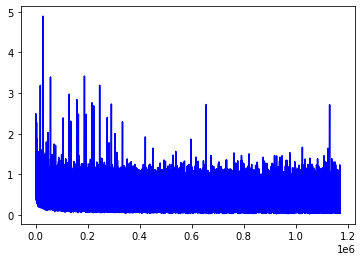

In [28]:
modeloDois = RedeNeuralModeloDois()

runnerDoisCrossAdamBatch = RedeNeuralRunner(modeloDois,
                                     X_train, y_train,
                                     40,0.00015,'CrossEntropyLoss','Adam','runnerDoisCrossAdamBatch',True)

runnerDoisCrossAdamBatch.train()

In [29]:
runnerDoisCrossAdamBatch.evaluate(X_test,y_test)

0.8841407414684989

In [30]:
runnerDoisCrossAdamBatch.export()

Epoch: 39 Loss: 0.379867821931839
Epoch: 39 Loss: 0.3365999460220337
Epoch: 39 Loss: 0.36256593465805054
Epoch: 39 Loss: 0.13965393602848053
Epoch: 39 Loss: 0.3537347912788391
Epoch: 39 Loss: 0.28233808279037476
Epoch: 39 Loss: 0.555525541305542
Epoch: 39 Loss: 0.42933231592178345
Epoch: 39 Loss: 0.3863372206687927
Epoch: 39 Loss: 0.5314290523529053
Epoch: 39 Loss: 0.5118838548660278
Epoch: 39 Loss: 0.2270127832889557
Epoch: 39 Loss: 0.14288325607776642
Epoch: 39 Loss: 0.20351266860961914
Epoch: 39 Loss: 0.2906142473220825
Epoch: 39 Loss: 1.2366251945495605
Epoch: 39 Loss: 0.261872261762619
Epoch: 39 Loss: 0.20013520121574402
Epoch: 39 Loss: 0.1773461550474167
Epoch: 39 Loss: 0.3635900318622589
Epoch: 39 Loss: 0.6150774955749512
Epoch: 39 Loss: 0.2648392915725708
Epoch: 39 Loss: 0.38235652446746826
Epoch: 39 Loss: 0.4211568236351013
Epoch: 39 Loss: 0.4517965018749237
Epoch: 39 Loss: 0.20337919890880585
Epoch: 39 Loss: 0.43065428733825684
Epoch: 39 Loss: 0.38663250207901
Epoch: 39 Loss:

Epoch: 39 Loss: 0.24019549787044525
Epoch: 39 Loss: 0.32467710971832275
Epoch: 39 Loss: 0.3859829008579254
Epoch: 39 Loss: 0.21537411212921143
Epoch: 39 Loss: 0.6300885081291199
Epoch: 39 Loss: 0.3939526081085205
Epoch: 39 Loss: 0.3630409240722656
Epoch: 39 Loss: 0.21696116030216217
Epoch: 39 Loss: 0.34537768363952637
Epoch: 39 Loss: 0.585469663143158
Epoch: 39 Loss: 0.2915774881839752
Epoch: 39 Loss: 0.1977362185716629
Epoch: 39 Loss: 0.33444586396217346
Epoch: 39 Loss: 0.26440608501434326
Epoch: 39 Loss: 0.19885988533496857
Epoch: 39 Loss: 0.5257068276405334
Epoch: 39 Loss: 0.2946165204048157
Epoch: 39 Loss: 0.4653344750404358
Epoch: 39 Loss: 0.37922316789627075
Epoch: 39 Loss: 0.33346331119537354
Epoch: 39 Loss: 0.5866921544075012
Epoch: 39 Loss: 0.2312658727169037
Epoch: 39 Loss: 0.25469881296157837
Epoch: 39 Loss: 0.25116997957229614
Epoch: 39 Loss: 0.29050540924072266
Epoch: 39 Loss: 0.24122457206249237
Epoch: 39 Loss: 0.28822165727615356
Epoch: 39 Loss: 0.5215362906455994
Epoch:

Epoch: 39 Loss: 0.30153316259384155
Epoch: 39 Loss: 0.5321419835090637
Epoch: 39 Loss: 0.620286762714386
Epoch: 39 Loss: 0.2538009583950043
Epoch: 39 Loss: 0.2745336890220642
Epoch: 39 Loss: 0.6131553649902344
Epoch: 39 Loss: 0.3224308490753174
Epoch: 39 Loss: 0.3787071406841278
Epoch: 39 Loss: 0.23669835925102234
Epoch: 39 Loss: 0.4862078130245209
Epoch: 39 Loss: 0.2337173968553543
Epoch: 39 Loss: 0.5096766352653503
Epoch: 39 Loss: 0.5046699047088623
Epoch: 39 Loss: 0.23792621493339539
Epoch: 39 Loss: 0.23411591351032257
Epoch: 39 Loss: 0.3027612864971161
Epoch: 39 Loss: 0.27102088928222656
Epoch: 39 Loss: 0.19047212600708008
Epoch: 39 Loss: 0.5993024110794067
Epoch: 39 Loss: 0.21829214692115784
Epoch: 39 Loss: 0.40233737230300903
Epoch: 39 Loss: 0.268053263425827
Epoch: 39 Loss: 0.361774206161499
Epoch: 39 Loss: 0.16834129393100739
Epoch: 39 Loss: 0.5637391209602356
Epoch: 39 Loss: 0.1797170490026474
Epoch: 39 Loss: 0.17645291984081268
Epoch: 39 Loss: 0.3739951550960541
Epoch: 39 Los

Epoch: 39 Loss: 0.5910639762878418
Epoch: 39 Loss: 0.9702578186988831
Epoch: 39 Loss: 0.3116503357887268
Epoch: 39 Loss: 0.2849632501602173
Epoch: 39 Loss: 0.4110841155052185
Epoch: 39 Loss: 0.29984933137893677
Epoch: 39 Loss: 0.3685009181499481
Epoch: 39 Loss: 0.4304223954677582
Epoch: 39 Loss: 0.47708749771118164
Epoch: 39 Loss: 0.2725032567977905
Epoch: 39 Loss: 0.2736088037490845
Epoch: 39 Loss: 0.14813058078289032
Epoch: 39 Loss: 0.5368764400482178
Epoch: 39 Loss: 0.16593550145626068
Epoch: 39 Loss: 0.8947476148605347
Epoch: 39 Loss: 0.5287532210350037
Epoch: 39 Loss: 0.3681356608867645
Epoch: 39 Loss: 0.6677659153938293
Epoch: 39 Loss: 0.1264784336090088
Epoch: 39 Loss: 0.4401644766330719
Epoch: 39 Loss: 0.19248558580875397
Epoch: 39 Loss: 0.16670237481594086
Epoch: 39 Loss: 0.3507159948348999
Epoch: 39 Loss: 0.25525572896003723
Epoch: 39 Loss: 0.31167227029800415
Epoch: 39 Loss: 0.3869597315788269
Epoch: 39 Loss: 0.24011410772800446
Epoch: 39 Loss: 0.6110449433326721
Epoch: 39 L

Epoch: 39 Loss: 0.4178710877895355
Epoch: 39 Loss: 0.38082003593444824
Epoch: 39 Loss: 0.20095893740653992
Epoch: 39 Loss: 0.3550020456314087
Epoch: 39 Loss: 0.7273193001747131
Epoch: 39 Loss: 0.6632303595542908
Epoch: 39 Loss: 0.4467712938785553
Epoch: 39 Loss: 0.3279251754283905
Epoch: 39 Loss: 0.5592771768569946
Epoch: 39 Loss: 0.5587076544761658
Epoch: 39 Loss: 0.36951813101768494
Epoch: 39 Loss: 0.2603158950805664
Epoch: 39 Loss: 0.2755996882915497
Epoch: 39 Loss: 0.36501914262771606
Epoch: 39 Loss: 0.18021970987319946
Epoch: 39 Loss: 0.24309292435646057
Epoch: 39 Loss: 0.21985198557376862
Epoch: 39 Loss: 0.5241948366165161
Epoch: 39 Loss: 0.47183969616889954
Epoch: 39 Loss: 0.19513078033924103
Epoch: 39 Loss: 0.42775484919548035
Epoch: 39 Loss: 0.5560659170150757
Epoch: 39 Loss: 0.38808152079582214
Epoch: 39 Loss: 0.3916402757167816
Epoch: 39 Loss: 1.9601815938949585
Epoch: 39 Loss: 0.1846519410610199
Epoch: 39 Loss: 0.4519461691379547
Epoch: 39 Loss: 0.23474915325641632
Epoch: 3

Epoch: 39 Loss: 0.44751259684562683
Epoch: 39 Loss: 0.2383042275905609
Epoch: 39 Loss: 0.6457232236862183
Epoch: 39 Loss: 0.35671529173851013
Epoch: 39 Loss: 0.2266625463962555
Epoch: 39 Loss: 0.23927229642868042
Epoch: 39 Loss: 0.48104995489120483
Epoch: 39 Loss: 0.44207897782325745
Epoch: 39 Loss: 0.9103288054466248
Epoch: 39 Loss: 0.3092896640300751
Epoch: 39 Loss: 0.12338832020759583
Epoch: 39 Loss: 0.49178794026374817
Epoch: 39 Loss: 0.12991687655448914
Epoch: 39 Loss: 0.3829427659511566
Epoch: 39 Loss: 0.25118130445480347
Epoch: 39 Loss: 0.35118645429611206
Epoch: 39 Loss: 0.33759045600891113
Epoch: 39 Loss: 0.5752765536308289
Epoch: 39 Loss: 0.611463725566864
Epoch: 39 Loss: 0.5628229379653931
Epoch: 39 Loss: 0.4241950511932373
Epoch: 39 Loss: 0.19441242516040802
Epoch: 39 Loss: 0.520832896232605
Epoch: 39 Loss: 0.3743085563182831
Epoch: 39 Loss: 0.44674429297447205
Epoch: 39 Loss: 0.4847860038280487
Epoch: 39 Loss: 0.20577847957611084
Epoch: 39 Loss: 0.5557822585105896
Epoch: 3

Epoch: 39 Loss: 0.43182772397994995
Epoch: 39 Loss: 0.6240277886390686
Epoch: 39 Loss: 0.4797111749649048
Epoch: 39 Loss: 0.4415108263492584
Epoch: 39 Loss: 0.15735547244548798
Epoch: 39 Loss: 0.36155006289482117
Epoch: 39 Loss: 0.3630731701850891
Epoch: 39 Loss: 0.5156760811805725
Epoch: 39 Loss: 0.3232647478580475
Epoch: 39 Loss: 0.4255492389202118
Epoch: 39 Loss: 0.30080804228782654
Epoch: 39 Loss: 0.33610498905181885
Epoch: 39 Loss: 0.5196786522865295
Epoch: 39 Loss: 0.4308716058731079
Epoch: 39 Loss: 0.24906466901302338
Epoch: 39 Loss: 0.20947033166885376
Epoch: 39 Loss: 0.19730089604854584
Epoch: 39 Loss: 0.336454302072525
Epoch: 39 Loss: 0.11932985484600067
Epoch: 39 Loss: 0.2985612154006958
Epoch: 39 Loss: 0.23804137110710144
Epoch: 39 Loss: 0.33827507495880127
Epoch: 39 Loss: 0.6830078363418579
Epoch: 39 Loss: 0.3389345109462738
Epoch: 39 Loss: 0.43046125769615173
Epoch: 39 Loss: 0.4923297166824341
Epoch: 39 Loss: 0.77623051404953
Epoch: 39 Loss: 0.9381589293479919
Epoch: 39 L

Epoch: 39 Loss: 0.282853901386261
Epoch: 39 Loss: 0.21923165023326874
Epoch: 39 Loss: 0.3060479164123535
Epoch: 39 Loss: 0.2951146364212036
Epoch: 39 Loss: 0.46236082911491394
Epoch: 39 Loss: 0.6435273885726929
Epoch: 39 Loss: 0.5539772510528564
Epoch: 39 Loss: 0.44404977560043335
Epoch: 39 Loss: 0.24340248107910156
Epoch: 39 Loss: 0.4352993667125702
Epoch: 39 Loss: 0.3532804250717163
Epoch: 39 Loss: 0.48884955048561096
Epoch: 39 Loss: 0.45150959491729736
Epoch: 39 Loss: 0.4717923104763031
Epoch: 39 Loss: 0.4040217995643616
Epoch: 39 Loss: 0.48496952652931213
Epoch: 39 Loss: 0.15499083697795868
Epoch: 39 Loss: 0.5061193108558655
Epoch: 39 Loss: 0.3625815212726593
Epoch: 39 Loss: 0.8717761039733887
Epoch: 39 Loss: 0.23109762370586395
Epoch: 39 Loss: 0.4468334913253784
Epoch: 39 Loss: 0.27573490142822266
Epoch: 39 Loss: 0.4539022147655487
Epoch: 39 Loss: 0.2718920409679413
Epoch: 39 Loss: 0.3288929760456085
Epoch: 39 Loss: 0.4148523509502411
Epoch: 39 Loss: 0.6449610590934753
Epoch: 39 L

Epoch: 39 Loss: 0.84398353099823
Epoch: 39 Loss: 0.6055846214294434
Epoch: 39 Loss: 0.35423341393470764
Epoch: 39 Loss: 0.15704891085624695
Epoch: 39 Loss: 0.3876083493232727
Epoch: 39 Loss: 0.3648837208747864
Epoch: 39 Loss: 0.4971293807029724
Epoch: 39 Loss: 0.32331621646881104
Epoch: 39 Loss: 0.31938236951828003
Epoch: 39 Loss: 0.3172991871833801
Epoch: 39 Loss: 0.19103172421455383
Epoch: 39 Loss: 0.13364939391613007
Epoch: 39 Loss: 0.30931079387664795
Epoch: 39 Loss: 0.24959641695022583
Epoch: 39 Loss: 0.5329206585884094
Epoch: 39 Loss: 0.2386786937713623
Epoch: 39 Loss: 0.6394356489181519
Epoch: 39 Loss: 0.6177051067352295
Epoch: 39 Loss: 0.23548460006713867
Epoch: 39 Loss: 0.7072370648384094
Epoch: 39 Loss: 0.31372907757759094
Epoch: 39 Loss: 0.8146603107452393
Epoch: 39 Loss: 1.1754858493804932
Epoch: 39 Loss: 0.914387047290802
Epoch: 39 Loss: 0.3326950669288635
Epoch: 39 Loss: 0.179073303937912
Epoch: 39 Loss: 0.48312389850616455
Epoch: 39 Loss: 0.456590473651886
Epoch: 39 Loss

Epoch: 39 Loss: 0.32489338517189026
Epoch: 39 Loss: 0.4137350022792816
Epoch: 39 Loss: 0.3812183737754822
Epoch: 39 Loss: 0.24650664627552032
Epoch: 39 Loss: 0.23530441522598267
Epoch: 39 Loss: 0.4106215834617615
Epoch: 39 Loss: 0.2636120617389679
Epoch: 39 Loss: 0.3286658227443695
Epoch: 39 Loss: 0.20976947247982025
Epoch: 39 Loss: 0.28839558362960815
Epoch: 39 Loss: 0.4641597270965576
Epoch: 39 Loss: 0.5003538727760315
Epoch: 39 Loss: 0.274554580450058
Epoch: 39 Loss: 0.5472837090492249
Epoch: 39 Loss: 0.5429311394691467
Epoch: 39 Loss: 0.220488503575325
Epoch: 39 Loss: 0.3210870623588562
Epoch: 39 Loss: 0.24493107199668884
Epoch: 39 Loss: 0.30269700288772583
Epoch: 39 Loss: 0.45450741052627563
Epoch: 39 Loss: 0.29365774989128113
Epoch: 39 Loss: 0.4447561204433441
Epoch: 39 Loss: 0.1815912276506424
Epoch: 39 Loss: 0.7409731149673462
Epoch: 39 Loss: 0.3488316833972931
Epoch: 39 Loss: 0.38912463188171387
Epoch: 39 Loss: 0.3106021285057068
Epoch: 39 Loss: 1.1397264003753662
Epoch: 39 Lo

Epoch: 39 Loss: 0.2498818188905716
Epoch: 39 Loss: 0.34901776909828186
Epoch: 39 Loss: 0.27489766478538513
Epoch: 39 Loss: 0.11842791736125946
Epoch: 39 Loss: 0.23778274655342102
Epoch: 39 Loss: 0.6999431252479553
Epoch: 39 Loss: 0.5504543781280518
Epoch: 39 Loss: 0.33419638872146606
Epoch: 39 Loss: 0.39914628863334656
Epoch: 39 Loss: 0.2566615641117096
Epoch: 39 Loss: 0.32578858733177185
Epoch: 39 Loss: 0.37299612164497375
Epoch: 39 Loss: 0.25270241498947144
Epoch: 39 Loss: 0.5225028991699219
Epoch: 39 Loss: 0.29166197776794434
Epoch: 39 Loss: 0.37903404235839844
Epoch: 39 Loss: 0.2711067795753479
Epoch: 39 Loss: 0.2229066640138626
Epoch: 39 Loss: 0.5090904831886292
Epoch: 39 Loss: 0.30901819467544556
Epoch: 39 Loss: 0.44657161831855774
Epoch: 39 Loss: 0.4614063799381256
Epoch: 39 Loss: 0.42619311809539795
Epoch: 39 Loss: 0.2805783152580261
Epoch: 39 Loss: 0.40939798951148987
Epoch: 39 Loss: 0.28029996156692505
Epoch: 39 Loss: 0.21339209377765656
Epoch: 39 Loss: 0.6352178454399109
Epo

Epoch: 39 Loss: 0.5546804666519165
Epoch: 39 Loss: 0.24944129586219788
Epoch: 39 Loss: 0.4112699031829834
Epoch: 39 Loss: 0.2488909512758255
Epoch: 39 Loss: 0.5369442701339722
Epoch: 39 Loss: 0.4596053659915924
Epoch: 39 Loss: 0.377425879240036
Epoch: 39 Loss: 0.357484370470047
Epoch: 39 Loss: 0.3718760013580322
Epoch: 39 Loss: 0.4149514138698578
Epoch: 39 Loss: 0.3336501717567444
Epoch: 39 Loss: 0.34541961550712585
Epoch: 39 Loss: 0.20401562750339508
Epoch: 39 Loss: 0.19579364359378815
Epoch: 39 Loss: 0.43674236536026
Epoch: 39 Loss: 0.10650631785392761
Epoch: 39 Loss: 0.15794971585273743
Epoch: 39 Loss: 0.7546606659889221
Epoch: 39 Loss: 0.6265047788619995
Epoch: 39 Loss: 0.5959948301315308
Epoch: 39 Loss: 0.4685847759246826
Epoch: 39 Loss: 0.19712495803833008
Epoch: 39 Loss: 0.5655993819236755
Epoch: 39 Loss: 0.29187557101249695
Epoch: 39 Loss: 0.623180627822876
Epoch: 39 Loss: 0.20298884809017181
Epoch: 39 Loss: 0.3079776465892792
Epoch: 39 Loss: 0.3357577621936798
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.2954680621623993
Epoch: 39 Loss: 0.2309601753950119
Epoch: 39 Loss: 0.26803094148635864
Epoch: 39 Loss: 0.38903406262397766
Epoch: 39 Loss: 0.37526875734329224
Epoch: 39 Loss: 0.45844775438308716
Epoch: 39 Loss: 0.43809589743614197
Epoch: 39 Loss: 0.38860389590263367
Epoch: 39 Loss: 0.2701855003833771
Epoch: 39 Loss: 0.6741516590118408
Epoch: 39 Loss: 0.387717604637146
Epoch: 39 Loss: 0.21055088937282562
Epoch: 39 Loss: 0.28555601835250854
Epoch: 39 Loss: 0.25526928901672363
Epoch: 39 Loss: 0.47251373529434204
Epoch: 39 Loss: 0.18066996335983276
Epoch: 39 Loss: 0.555766224861145
Epoch: 39 Loss: 0.3512887954711914
Epoch: 39 Loss: 0.5289353728294373
Epoch: 39 Loss: 0.43853890895843506
Epoch: 39 Loss: 0.4025053083896637
Epoch: 39 Loss: 0.10591970384120941
Epoch: 39 Loss: 0.2983638644218445
Epoch: 39 Loss: 0.43701472878456116
Epoch: 39 Loss: 0.22227922081947327
Epoch: 39 Loss: 0.2878161370754242
Epoch: 39 Loss: 0.6032633781433105
Epoch: 39 Loss: 0.1402861624956131
Epoch: 

Epoch: 39 Loss: 0.26448091864585876
Epoch: 39 Loss: 0.32677608728408813
Epoch: 39 Loss: 0.3309032917022705
Epoch: 39 Loss: 0.30363544821739197
Epoch: 39 Loss: 0.41333991289138794
Epoch: 39 Loss: 0.562820315361023
Epoch: 39 Loss: 0.4411095380783081
Epoch: 39 Loss: 0.1812257170677185
Epoch: 39 Loss: 0.5105592608451843
Epoch: 39 Loss: 0.2884235084056854
Epoch: 39 Loss: 0.46530765295028687
Epoch: 39 Loss: 0.2630634009838104
Epoch: 39 Loss: 0.3910967707633972
Epoch: 39 Loss: 0.5166767239570618
Epoch: 39 Loss: 0.4280117452144623
Epoch: 39 Loss: 0.21399645507335663
Epoch: 39 Loss: 0.7396636605262756
Epoch: 39 Loss: 0.2574880123138428
Epoch: 39 Loss: 0.3540579676628113
Epoch: 39 Loss: 0.3185831308364868
Epoch: 39 Loss: 0.3572235703468323
Epoch: 39 Loss: 0.429222971200943
Epoch: 39 Loss: 0.2497398853302002
Epoch: 39 Loss: 0.3950728178024292
Epoch: 39 Loss: 0.4527733027935028
Epoch: 39 Loss: 0.5094422101974487
Epoch: 39 Loss: 0.348059743642807
Epoch: 39 Loss: 0.4462476074695587
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.876920223236084
Epoch: 39 Loss: 0.516854465007782
Epoch: 39 Loss: 0.36273783445358276
Epoch: 39 Loss: 0.3562301993370056
Epoch: 39 Loss: 0.5098982453346252
Epoch: 39 Loss: 0.36274370551109314
Epoch: 39 Loss: 0.5016543865203857
Epoch: 39 Loss: 0.4306381642818451
Epoch: 39 Loss: 0.2922961711883545
Epoch: 39 Loss: 0.13847415149211884
Epoch: 39 Loss: 0.3969324231147766
Epoch: 39 Loss: 0.3217232823371887
Epoch: 39 Loss: 0.4581376016139984
Epoch: 39 Loss: 0.4007055163383484
Epoch: 39 Loss: 0.24785177409648895
Epoch: 39 Loss: 0.2100227177143097
Epoch: 39 Loss: 0.3442930281162262
Epoch: 39 Loss: 0.32012349367141724
Epoch: 39 Loss: 0.49428603053092957
Epoch: 39 Loss: 0.5446827411651611
Epoch: 39 Loss: 0.401092529296875
Epoch: 39 Loss: 0.6156360507011414
Epoch: 39 Loss: 0.3092631995677948
Epoch: 39 Loss: 0.39924490451812744
Epoch: 39 Loss: 0.27870801091194153
Epoch: 39 Loss: 0.6712654829025269
Epoch: 39 Loss: 0.32714542746543884
Epoch: 39 Loss: 0.2805473208427429
Epoch: 39 Loss

Epoch: 39 Loss: 0.41167542338371277
Epoch: 39 Loss: 0.1867195963859558
Epoch: 39 Loss: 0.3627687990665436
Epoch: 39 Loss: 0.7786177396774292
Epoch: 39 Loss: 0.5620740652084351
Epoch: 39 Loss: 0.3369350731372833
Epoch: 39 Loss: 0.40251752734184265
Epoch: 39 Loss: 0.2493707835674286
Epoch: 39 Loss: 0.280765175819397
Epoch: 39 Loss: 0.625059962272644
Epoch: 39 Loss: 0.3388173282146454
Epoch: 39 Loss: 0.513441801071167
Epoch: 39 Loss: 0.19902953505516052
Epoch: 39 Loss: 0.1475626826286316
Epoch: 39 Loss: 0.7573904395103455
Epoch: 39 Loss: 0.6508498191833496
Epoch: 39 Loss: 0.24705636501312256
Epoch: 39 Loss: 0.43047448992729187
Epoch: 39 Loss: 0.44106531143188477
Epoch: 39 Loss: 0.616425096988678
Epoch: 39 Loss: 0.19066357612609863
Epoch: 39 Loss: 0.13079209625720978
Epoch: 39 Loss: 0.6607948541641235
Epoch: 39 Loss: 0.33632081747055054
Epoch: 39 Loss: 0.3024507164955139
Epoch: 39 Loss: 0.2929989695549011
Epoch: 39 Loss: 0.1568879336118698
Epoch: 39 Loss: 0.19233354926109314
Epoch: 39 Loss

Epoch: 39 Loss: 0.3319501280784607
Epoch: 39 Loss: 0.1312737911939621
Epoch: 39 Loss: 0.24393866956233978
Epoch: 39 Loss: 0.3194993734359741
Epoch: 39 Loss: 0.6977441906929016
Epoch: 39 Loss: 0.4336368143558502
Epoch: 39 Loss: 0.34647488594055176
Epoch: 39 Loss: 0.3623240292072296
Epoch: 39 Loss: 0.7160254120826721
Epoch: 39 Loss: 0.657751202583313
Epoch: 39 Loss: 0.6123752593994141
Epoch: 39 Loss: 0.28575804829597473
Epoch: 39 Loss: 0.19494731724262238
Epoch: 39 Loss: 0.19321419298648834
Epoch: 39 Loss: 0.37974655628204346
Epoch: 39 Loss: 0.28084316849708557
Epoch: 39 Loss: 0.36595970392227173
Epoch: 39 Loss: 0.8362440466880798
Epoch: 39 Loss: 0.22368329763412476
Epoch: 39 Loss: 0.49365559220314026
Epoch: 39 Loss: 0.3938823640346527
Epoch: 39 Loss: 0.22424468398094177
Epoch: 39 Loss: 0.5214503407478333
Epoch: 39 Loss: 0.4896593987941742
Epoch: 39 Loss: 0.6745834946632385
Epoch: 39 Loss: 0.40939804911613464
Epoch: 39 Loss: 0.2824094295501709
Epoch: 39 Loss: 0.3044036328792572
Epoch: 39

Epoch: 39 Loss: 0.5397939682006836
Epoch: 39 Loss: 0.2517559230327606
Epoch: 39 Loss: 0.2933225929737091
Epoch: 39 Loss: 0.1084030345082283
Epoch: 39 Loss: 0.19517788290977478
Epoch: 39 Loss: 0.11332409083843231
Epoch: 39 Loss: 0.44082579016685486
Epoch: 39 Loss: 0.5274237990379333
Epoch: 39 Loss: 0.4307737648487091
Epoch: 39 Loss: 0.17821086943149567
Epoch: 39 Loss: 0.30587658286094666
Epoch: 39 Loss: 0.2610302269458771
Epoch: 39 Loss: 0.10235518962144852
Epoch: 39 Loss: 0.40600821375846863
Epoch: 39 Loss: 0.4266431927680969
Epoch: 39 Loss: 0.33469074964523315
Epoch: 39 Loss: 0.6106009483337402
Epoch: 39 Loss: 0.35615214705467224
Epoch: 39 Loss: 0.2580397129058838
Epoch: 39 Loss: 0.4196932911872864
Epoch: 39 Loss: 0.4275462329387665
Epoch: 39 Loss: 0.5204885601997375
Epoch: 39 Loss: 0.24231012165546417
Epoch: 39 Loss: 0.3233882784843445
Epoch: 39 Loss: 0.3519861698150635
Epoch: 39 Loss: 0.3437475860118866
Epoch: 39 Loss: 0.43702560663223267
Epoch: 39 Loss: 0.6159953474998474
Epoch: 39

Epoch: 39 Loss: 0.42437827587127686
Epoch: 39 Loss: 0.37930551171302795
Epoch: 39 Loss: 0.23084810376167297
Epoch: 39 Loss: 0.4210321009159088
Epoch: 39 Loss: 0.6078245639801025
Epoch: 39 Loss: 0.25596195459365845
Epoch: 39 Loss: 0.35649290680885315
Epoch: 39 Loss: 0.2654745280742645
Epoch: 39 Loss: 0.12100336700677872
Epoch: 39 Loss: 0.40424156188964844
Epoch: 39 Loss: 0.36777031421661377
Epoch: 39 Loss: 0.3399881422519684
Epoch: 39 Loss: 2.4461240768432617
Epoch: 39 Loss: 0.4427802860736847
Epoch: 39 Loss: 0.7199360132217407
Epoch: 39 Loss: 0.6436234712600708
Epoch: 39 Loss: 0.4023231863975525
Epoch: 39 Loss: 0.30651605129241943
Epoch: 39 Loss: 0.2699665427207947
Epoch: 39 Loss: 0.49575817584991455
Epoch: 39 Loss: 0.5081946849822998
Epoch: 39 Loss: 0.3072473108768463
Epoch: 39 Loss: 0.25547245144844055
Epoch: 39 Loss: 0.3599120080471039
Epoch: 39 Loss: 0.3043462932109833
Epoch: 39 Loss: 0.6466357111930847
Epoch: 39 Loss: 0.31675368547439575
Epoch: 39 Loss: 0.4368492662906647
Epoch: 3

Epoch: 39 Loss: 0.2166241556406021
Epoch: 39 Loss: 0.3314436376094818
Epoch: 39 Loss: 0.5676941871643066
Epoch: 39 Loss: 0.7863290905952454
Epoch: 39 Loss: 0.2739314138889313
Epoch: 39 Loss: 0.5584551095962524
Epoch: 39 Loss: 0.2503991425037384
Epoch: 39 Loss: 0.9157344102859497
Epoch: 39 Loss: 0.46033552289009094
Epoch: 39 Loss: 0.5345907211303711
Epoch: 39 Loss: 0.4155501425266266
Epoch: 39 Loss: 0.42132657766342163
Epoch: 39 Loss: 0.4376677870750427
Epoch: 39 Loss: 0.46348339319229126
Epoch: 39 Loss: 0.2811129689216614
Epoch: 39 Loss: 0.29407843947410583
Epoch: 39 Loss: 0.46182096004486084
Epoch: 39 Loss: 0.5010524392127991
Epoch: 39 Loss: 0.47641721367836
Epoch: 39 Loss: 0.23338551819324493
Epoch: 39 Loss: 0.3815624415874481
Epoch: 39 Loss: 0.22862985730171204
Epoch: 39 Loss: 0.4814606308937073
Epoch: 39 Loss: 0.46346762776374817
Epoch: 39 Loss: 0.6368962526321411
Epoch: 39 Loss: 0.5261320471763611
Epoch: 39 Loss: 0.31000539660453796
Epoch: 39 Loss: 0.14744815230369568
Epoch: 39 Lo

Epoch: 39 Loss: 0.4400617480278015
Epoch: 39 Loss: 0.4235287308692932
Epoch: 39 Loss: 0.37478041648864746
Epoch: 39 Loss: 0.24137304723262787
Epoch: 39 Loss: 0.44031524658203125
Epoch: 39 Loss: 0.34631630778312683
Epoch: 39 Loss: 0.8059616684913635
Epoch: 39 Loss: 0.3779895305633545
Epoch: 39 Loss: 0.45216676592826843
Epoch: 39 Loss: 0.5849782228469849
Epoch: 39 Loss: 0.5958865284919739
Epoch: 39 Loss: 0.43823379278182983
Epoch: 39 Loss: 0.2978607416152954
Epoch: 39 Loss: 0.3145061433315277
Epoch: 39 Loss: 0.46718040108680725
Epoch: 39 Loss: 0.3176526427268982
Epoch: 39 Loss: 0.6197975277900696
Epoch: 39 Loss: 1.3774610757827759
Epoch: 39 Loss: 0.5320629477500916
Epoch: 39 Loss: 0.32277998328208923
Epoch: 39 Loss: 0.4106501638889313
Epoch: 39 Loss: 0.34515875577926636
Epoch: 39 Loss: 0.26863041520118713
Epoch: 39 Loss: 0.5782223343849182
Epoch: 39 Loss: 0.48383480310440063
Epoch: 39 Loss: 0.41046246886253357
Epoch: 39 Loss: 0.396213173866272
Epoch: 39 Loss: 0.25783053040504456
Epoch: 3

Epoch: 39 Loss: 0.7424560785293579
Epoch: 39 Loss: 0.22091250121593475
Epoch: 39 Loss: 0.39874380826950073
Epoch: 39 Loss: 0.2898515462875366
Epoch: 39 Loss: 0.45534372329711914
Epoch: 39 Loss: 0.5385113954544067
Epoch: 39 Loss: 0.39652958512306213
Epoch: 39 Loss: 0.15848655998706818
Epoch: 39 Loss: 0.4523589015007019
Epoch: 39 Loss: 0.5196273326873779
Epoch: 39 Loss: 0.36726805567741394
Epoch: 39 Loss: 0.22917038202285767
Epoch: 39 Loss: 0.13298733532428741
Epoch: 39 Loss: 0.3054068386554718
Epoch: 39 Loss: 0.28099095821380615
Epoch: 39 Loss: 0.3717302083969116
Epoch: 39 Loss: 0.3004082143306732
Epoch: 39 Loss: 0.23938585817813873
Epoch: 39 Loss: 0.1985352784395218
Epoch: 39 Loss: 0.500275731086731
Epoch: 39 Loss: 0.3820197582244873
Epoch: 39 Loss: 0.16594362258911133
Epoch: 39 Loss: 0.5709604620933533
Epoch: 39 Loss: 0.37573447823524475
Epoch: 39 Loss: 0.4638872444629669
Epoch: 39 Loss: 0.33899298310279846
Epoch: 39 Loss: 0.6394733190536499
Epoch: 39 Loss: 0.4163091778755188
Epoch: 3

Epoch: 39 Loss: 0.40565720200538635
Epoch: 39 Loss: 0.37281322479248047
Epoch: 39 Loss: 0.24956470727920532
Epoch: 39 Loss: 0.7584719061851501
Epoch: 39 Loss: 0.30935585498809814
Epoch: 39 Loss: 0.6338154673576355
Epoch: 39 Loss: 0.21367454528808594
Epoch: 39 Loss: 0.48717841506004333
Epoch: 39 Loss: 0.25594472885131836
Epoch: 39 Loss: 0.14631110429763794
Epoch: 39 Loss: 0.7001948356628418
Epoch: 39 Loss: 0.6559450626373291
Epoch: 39 Loss: 0.27643096446990967
Epoch: 39 Loss: 0.6516520977020264
Epoch: 39 Loss: 0.42120352387428284
Epoch: 39 Loss: 0.35119906067848206
Epoch: 39 Loss: 0.24008561670780182
Epoch: 39 Loss: 0.35114380717277527
Epoch: 39 Loss: 0.3735836148262024
Epoch: 39 Loss: 0.7049847841262817
Epoch: 39 Loss: 0.23585812747478485
Epoch: 39 Loss: 0.30223408341407776
Epoch: 39 Loss: 0.6001647114753723
Epoch: 39 Loss: 0.4245157539844513
Epoch: 39 Loss: 0.38818231225013733
Epoch: 39 Loss: 0.31169673800468445
Epoch: 39 Loss: 0.37149742245674133
Epoch: 39 Loss: 0.1965634822845459
Ep

Epoch: 39 Loss: 0.21426008641719818
Epoch: 39 Loss: 0.16598154604434967
Epoch: 39 Loss: 0.5410325527191162
Epoch: 39 Loss: 0.36617574095726013
Epoch: 39 Loss: 0.3504651188850403
Epoch: 39 Loss: 0.3059230148792267
Epoch: 39 Loss: 0.2764910161495209
Epoch: 39 Loss: 0.5083571672439575
Epoch: 39 Loss: 0.44119271636009216
Epoch: 39 Loss: 0.2804277241230011
Epoch: 39 Loss: 0.6108689308166504
Epoch: 39 Loss: 0.42455920577049255
Epoch: 39 Loss: 0.4150063097476959
Epoch: 39 Loss: 0.3394440710544586
Epoch: 39 Loss: 0.3377211391925812
Epoch: 39 Loss: 0.31028056144714355
Epoch: 39 Loss: 0.5971912145614624
Epoch: 39 Loss: 0.4567834138870239
Epoch: 39 Loss: 0.3703198730945587
Epoch: 39 Loss: 0.5690798163414001
Epoch: 39 Loss: 0.678898274898529
Epoch: 39 Loss: 0.5852482318878174
Epoch: 39 Loss: 1.0825872421264648
Epoch: 39 Loss: 0.5078147649765015
Epoch: 39 Loss: 0.3952081799507141
Epoch: 39 Loss: 0.4053337275981903
Epoch: 39 Loss: 0.28476953506469727
Epoch: 39 Loss: 0.4999461770057678
Epoch: 39 Loss

Epoch: 39 Loss: 0.28765803575515747
Epoch: 39 Loss: 0.3603774905204773
Epoch: 39 Loss: 0.6715152859687805
Epoch: 39 Loss: 0.2567368447780609
Epoch: 39 Loss: 0.5558019280433655
Epoch: 39 Loss: 0.4039576053619385
Epoch: 39 Loss: 0.5648011565208435
Epoch: 39 Loss: 0.38704589009284973
Epoch: 39 Loss: 0.2981823980808258
Epoch: 39 Loss: 0.4123169481754303
Epoch: 39 Loss: 0.6197451949119568
Epoch: 39 Loss: 0.40560150146484375
Epoch: 39 Loss: 0.18483024835586548
Epoch: 39 Loss: 0.18965059518814087
Epoch: 39 Loss: 0.24862700700759888
Epoch: 39 Loss: 0.2247277796268463
Epoch: 39 Loss: 0.4751688241958618
Epoch: 39 Loss: 0.5065075755119324
Epoch: 39 Loss: 0.2501674294471741
Epoch: 39 Loss: 0.509567379951477
Epoch: 39 Loss: 0.2996376156806946
Epoch: 39 Loss: 0.6614925265312195
Epoch: 39 Loss: 0.21550807356834412
Epoch: 39 Loss: 0.16673821210861206
Epoch: 39 Loss: 0.2773476541042328
Epoch: 39 Loss: 0.20936153829097748
Epoch: 39 Loss: 1.2710800170898438
Epoch: 39 Loss: 0.2248591184616089
Epoch: 39 Lo

Epoch: 39 Loss: 0.2843993902206421
Epoch: 39 Loss: 0.253836452960968
Epoch: 39 Loss: 0.47225961089134216
Epoch: 39 Loss: 0.6990602016448975
Epoch: 39 Loss: 0.4034609794616699
Epoch: 39 Loss: 0.22777600586414337
Epoch: 39 Loss: 0.32597821950912476
Epoch: 39 Loss: 0.3881273865699768
Epoch: 39 Loss: 0.47141581773757935
Epoch: 39 Loss: 0.4187491536140442
Epoch: 39 Loss: 0.3918432295322418
Epoch: 39 Loss: 0.6353036761283875
Epoch: 39 Loss: 0.38098379969596863
Epoch: 39 Loss: 0.3608192503452301
Epoch: 39 Loss: 0.27686840295791626
Epoch: 39 Loss: 0.30334144830703735
Epoch: 39 Loss: 0.29085057973861694
Epoch: 39 Loss: 0.4292118549346924
Epoch: 39 Loss: 0.5276991724967957
Epoch: 39 Loss: 0.8136966824531555
Epoch: 39 Loss: 0.5064172744750977
Epoch: 39 Loss: 0.27418696880340576
Epoch: 39 Loss: 0.3260996341705322
Epoch: 39 Loss: 0.6493642926216125
Epoch: 39 Loss: 0.2950858175754547
Epoch: 39 Loss: 0.5187190175056458
Epoch: 39 Loss: 0.29501616954803467
Epoch: 39 Loss: 0.2595941722393036
Epoch: 39 L

Epoch: 39 Loss: 0.5124845504760742
Epoch: 39 Loss: 0.6176533699035645
Epoch: 39 Loss: 0.7165802121162415
Epoch: 39 Loss: 0.3370039463043213
Epoch: 39 Loss: 0.20825423300266266
Epoch: 39 Loss: 0.5629326701164246
Epoch: 39 Loss: 0.5355280637741089
Epoch: 39 Loss: 0.26313769817352295
Epoch: 39 Loss: 0.29889705777168274
Epoch: 39 Loss: 0.38611721992492676
Epoch: 39 Loss: 0.24471192061901093
Epoch: 39 Loss: 0.34341657161712646
Epoch: 39 Loss: 0.29286855459213257
Epoch: 39 Loss: 0.11316777020692825
Epoch: 39 Loss: 0.18705908954143524
Epoch: 39 Loss: 0.24719581007957458
Epoch: 39 Loss: 0.374667227268219
Epoch: 39 Loss: 0.3514159619808197
Epoch: 39 Loss: 0.3101133704185486
Epoch: 39 Loss: 0.38755476474761963
Epoch: 39 Loss: 0.25058457255363464
Epoch: 39 Loss: 0.2930585443973541
Epoch: 39 Loss: 0.2854195833206177
Epoch: 39 Loss: 0.27893733978271484
Epoch: 39 Loss: 0.18170884251594543
Epoch: 39 Loss: 0.1647818684577942
Epoch: 39 Loss: 0.7745405435562134
Epoch: 39 Loss: 0.13671936094760895
Epoch:

Epoch: 39 Loss: 0.5821149945259094
Epoch: 39 Loss: 0.31416502594947815
Epoch: 39 Loss: 0.3097182512283325
Epoch: 39 Loss: 0.38388675451278687
Epoch: 39 Loss: 0.30672258138656616
Epoch: 39 Loss: 0.19334575533866882
Epoch: 39 Loss: 0.3547004759311676
Epoch: 39 Loss: 0.39153817296028137
Epoch: 39 Loss: 1.2647184133529663
Epoch: 39 Loss: 0.3805405795574188
Epoch: 39 Loss: 0.3239482045173645
Epoch: 39 Loss: 0.347880482673645
Epoch: 39 Loss: 0.34966984391212463
Epoch: 39 Loss: 0.2583453059196472
Epoch: 39 Loss: 0.37146538496017456
Epoch: 39 Loss: 0.7521052956581116
Epoch: 39 Loss: 0.24728727340698242
Epoch: 39 Loss: 0.2418096661567688
Epoch: 39 Loss: 0.2906661629676819
Epoch: 39 Loss: 0.2821144163608551
Epoch: 39 Loss: 0.5284527540206909
Epoch: 39 Loss: 0.22992363572120667
Epoch: 39 Loss: 0.36102041602134705
Epoch: 39 Loss: 0.46930167078971863
Epoch: 39 Loss: 0.3849303722381592
Epoch: 39 Loss: 0.5294512510299683
Epoch: 39 Loss: 0.4651013910770416
Epoch: 39 Loss: 0.34576359391212463
Epoch: 39

Epoch: 39 Loss: 0.3758087456226349
Epoch: 39 Loss: 0.2691308259963989
Epoch: 39 Loss: 0.35449135303497314
Epoch: 39 Loss: 0.2623143494129181
Epoch: 39 Loss: 0.29014351963996887
Epoch: 39 Loss: 0.27472326159477234
Epoch: 39 Loss: 0.504169762134552
Epoch: 39 Loss: 0.4330447018146515
Epoch: 39 Loss: 0.26454463601112366
Epoch: 39 Loss: 0.8197000026702881
Epoch: 39 Loss: 0.25123441219329834
Epoch: 39 Loss: 0.4931762218475342
Epoch: 39 Loss: 0.3540174663066864
Epoch: 39 Loss: 0.27712389826774597
Epoch: 39 Loss: 0.3937981128692627
Epoch: 39 Loss: 0.4522594213485718
Epoch: 39 Loss: 0.36219507455825806
Epoch: 39 Loss: 0.1745559573173523
Epoch: 39 Loss: 0.6477597951889038
Epoch: 39 Loss: 0.19947074353694916
Epoch: 39 Loss: 0.4335446357727051
Epoch: 39 Loss: 0.374316930770874
Epoch: 39 Loss: 0.15709994733333588
Epoch: 39 Loss: 0.7548032999038696
Epoch: 39 Loss: 0.5099427103996277
Epoch: 39 Loss: 0.4201391339302063
Epoch: 39 Loss: 0.47603318095207214
Epoch: 39 Loss: 0.32845550775527954
Epoch: 39 L

Epoch: 39 Loss: 0.5639511346817017
Epoch: 39 Loss: 0.31039702892303467
Epoch: 39 Loss: 0.5919367671012878
Epoch: 39 Loss: 0.4944801926612854
Epoch: 39 Loss: 0.7764202356338501
Epoch: 39 Loss: 0.48389965295791626
Epoch: 39 Loss: 0.2792803645133972
Epoch: 39 Loss: 0.16158069670200348
Epoch: 39 Loss: 0.49320247769355774
Epoch: 39 Loss: 0.42933687567710876
Epoch: 39 Loss: 0.46667051315307617
Epoch: 39 Loss: 0.3705676198005676
Epoch: 39 Loss: 0.9273110628128052
Epoch: 39 Loss: 0.4673148989677429
Epoch: 39 Loss: 0.49147018790245056
Epoch: 39 Loss: 0.6407180428504944
Epoch: 39 Loss: 0.25009700655937195
Epoch: 39 Loss: 0.7137191295623779
Epoch: 39 Loss: 0.3191928267478943
Epoch: 39 Loss: 0.43645960092544556
Epoch: 39 Loss: 0.3255317509174347
Epoch: 39 Loss: 0.21975915133953094
Epoch: 39 Loss: 0.46902012825012207
Epoch: 39 Loss: 0.4790005087852478
Epoch: 39 Loss: 0.4748266637325287
Epoch: 39 Loss: 0.3061027228832245
Epoch: 39 Loss: 0.5011483430862427
Epoch: 39 Loss: 0.2741389870643616
Epoch: 39

Epoch: 39 Loss: 0.4219670295715332
Epoch: 39 Loss: 0.3300458788871765
Epoch: 39 Loss: 0.35763460397720337
Epoch: 39 Loss: 0.577954113483429
Epoch: 39 Loss: 0.4042189121246338
Epoch: 39 Loss: 0.17318826913833618
Epoch: 39 Loss: 0.4503685534000397
Epoch: 39 Loss: 0.3117803931236267
Epoch: 39 Loss: 1.2195836305618286
Epoch: 39 Loss: 0.559421956539154
Epoch: 39 Loss: 0.4091322720050812
Epoch: 39 Loss: 0.17333194613456726
Epoch: 39 Loss: 0.31125131249427795
Epoch: 39 Loss: 0.3825262784957886
Epoch: 39 Loss: 0.34302133321762085
Epoch: 39 Loss: 0.49005380272865295
Epoch: 39 Loss: 0.4270288348197937
Epoch: 39 Loss: 0.43798014521598816
Epoch: 39 Loss: 0.3923451602458954
Epoch: 39 Loss: 0.2626163065433502
Epoch: 39 Loss: 0.7258437871932983
Epoch: 39 Loss: 0.41489413380622864
Epoch: 39 Loss: 0.3041525185108185
Epoch: 39 Loss: 0.2702685296535492
Epoch: 39 Loss: 0.38403189182281494
Epoch: 39 Loss: 1.0358589887619019
Epoch: 39 Loss: 0.2058432400226593
Epoch: 39 Loss: 0.40981823205947876
Epoch: 39 Lo

Epoch: 39 Loss: 0.4603763520717621
Epoch: 39 Loss: 0.5072519779205322
Epoch: 39 Loss: 0.12006353586912155
Epoch: 39 Loss: 0.17031286656856537
Epoch: 39 Loss: 0.28354910016059875
Epoch: 39 Loss: 0.37277740240097046
Epoch: 39 Loss: 0.40093210339546204
Epoch: 39 Loss: 0.3845100700855255
Epoch: 39 Loss: 0.2529504597187042
Epoch: 39 Loss: 0.3168736696243286
Epoch: 39 Loss: 0.5130599141120911
Epoch: 39 Loss: 0.4376853406429291
Epoch: 39 Loss: 0.4288097321987152
Epoch: 39 Loss: 0.41633543372154236
Epoch: 39 Loss: 0.3806404769420624
Epoch: 39 Loss: 0.2630777060985565
Epoch: 39 Loss: 0.2583291828632355
Epoch: 39 Loss: 0.511685311794281
Epoch: 39 Loss: 0.4098145663738251
Epoch: 39 Loss: 0.3067900240421295
Epoch: 39 Loss: 0.37858855724334717
Epoch: 39 Loss: 0.4472229480743408
Epoch: 39 Loss: 0.1508113592863083
Epoch: 39 Loss: 0.42797210812568665
Epoch: 39 Loss: 0.38891690969467163
Epoch: 39 Loss: 0.4471643567085266
Epoch: 39 Loss: 0.5802304148674011
Epoch: 39 Loss: 0.2913283109664917
Epoch: 39 Lo

Epoch: 39 Loss: 0.944402813911438
Epoch: 39 Loss: 0.18924644589424133
Epoch: 39 Loss: 0.31240925192832947
Epoch: 39 Loss: 0.32137349247932434
Epoch: 39 Loss: 0.250384658575058
Epoch: 39 Loss: 0.4068681299686432
Epoch: 39 Loss: 0.3852950930595398
Epoch: 39 Loss: 0.2894531190395355
Epoch: 39 Loss: 0.4901697337627411
Epoch: 39 Loss: 0.26062843203544617
Epoch: 39 Loss: 1.3728538751602173
Epoch: 39 Loss: 0.8429535031318665
Epoch: 39 Loss: 0.8291082382202148
Epoch: 39 Loss: 0.2706091105937958
Epoch: 39 Loss: 0.39796948432922363
Epoch: 39 Loss: 0.5418114066123962
Epoch: 39 Loss: 0.3741200864315033
Epoch: 39 Loss: 0.2842707931995392
Epoch: 39 Loss: 0.6320276260375977
Epoch: 39 Loss: 0.19074270129203796
Epoch: 39 Loss: 0.18524834513664246
Epoch: 39 Loss: 0.32105889916419983
Epoch: 39 Loss: 0.42382848262786865
Epoch: 39 Loss: 0.16914434731006622
Epoch: 39 Loss: 0.3628532290458679
Epoch: 39 Loss: 0.31945398449897766
Epoch: 39 Loss: 0.3696436285972595
Epoch: 39 Loss: 0.15077532827854156
Epoch: 39 

Epoch: 39 Loss: 0.16938516497612
Epoch: 39 Loss: 0.18549901247024536
Epoch: 39 Loss: 0.40731221437454224
Epoch: 39 Loss: 0.23670807480812073
Epoch: 39 Loss: 0.368395060300827
Epoch: 39 Loss: 0.6670691967010498
Epoch: 39 Loss: 0.5051263570785522
Epoch: 39 Loss: 0.526260495185852
Epoch: 39 Loss: 0.5059192776679993
Epoch: 39 Loss: 0.3362372815608978
Epoch: 39 Loss: 0.4781666696071625
Epoch: 39 Loss: 0.2533574104309082
Epoch: 39 Loss: 0.2732108533382416
Epoch: 39 Loss: 0.34938734769821167
Epoch: 39 Loss: 0.45741844177246094
Epoch: 39 Loss: 0.7517999410629272
Epoch: 39 Loss: 0.45464983582496643
Epoch: 39 Loss: 0.15285566449165344
Epoch: 39 Loss: 0.443316251039505
Epoch: 39 Loss: 0.3452114164829254
Epoch: 39 Loss: 0.19017161428928375
Epoch: 39 Loss: 0.47432777285575867
Epoch: 39 Loss: 0.19737689197063446
Epoch: 39 Loss: 0.41926416754722595
Epoch: 39 Loss: 0.27284446358680725
Epoch: 39 Loss: 0.5751346945762634
Epoch: 39 Loss: 0.31751710176467896
Epoch: 39 Loss: 0.14600728452205658
Epoch: 39 L

Epoch: 39 Loss: 0.8181396126747131
Epoch: 39 Loss: 0.441226989030838
Epoch: 39 Loss: 0.4400337338447571
Epoch: 39 Loss: 0.3615764379501343
Epoch: 39 Loss: 0.19447243213653564
Epoch: 39 Loss: 0.2887013256549835
Epoch: 39 Loss: 0.23692502081394196
Epoch: 39 Loss: 0.27576744556427
Epoch: 39 Loss: 0.32222479581832886
Epoch: 39 Loss: 0.44318145513534546
Epoch: 39 Loss: 0.41963934898376465
Epoch: 39 Loss: 0.2765881419181824
Epoch: 39 Loss: 1.0211637020111084
Epoch: 39 Loss: 0.4564567506313324
Epoch: 39 Loss: 0.3360404372215271
Epoch: 39 Loss: 0.5926319360733032
Epoch: 39 Loss: 0.21821361780166626
Epoch: 39 Loss: 0.12924498319625854
Epoch: 39 Loss: 0.23339268565177917
Epoch: 39 Loss: 0.24652916193008423
Epoch: 39 Loss: 0.26551517844200134
Epoch: 39 Loss: 0.21805262565612793
Epoch: 39 Loss: 0.22604386508464813
Epoch: 39 Loss: 0.5550382137298584
Epoch: 39 Loss: 0.34538233280181885
Epoch: 39 Loss: 0.17457182705402374
Epoch: 39 Loss: 0.29864439368247986
Epoch: 39 Loss: 0.2949289083480835
Epoch: 3

Epoch: 39 Loss: 0.47350627183914185
Epoch: 39 Loss: 0.47898048162460327
Epoch: 39 Loss: 0.2809115946292877
Epoch: 39 Loss: 0.556990921497345
Epoch: 39 Loss: 0.44629600644111633
Epoch: 39 Loss: 0.23207353055477142
Epoch: 39 Loss: 0.2762487530708313
Epoch: 39 Loss: 0.276736855506897
Epoch: 39 Loss: 0.5182176828384399
Epoch: 39 Loss: 0.6043321490287781
Epoch: 39 Loss: 0.2549799680709839
Epoch: 39 Loss: 0.2888137698173523
Epoch: 39 Loss: 0.2211439609527588
Epoch: 39 Loss: 0.23490236699581146
Epoch: 39 Loss: 0.2964021563529968
Epoch: 39 Loss: 0.4291782081127167
Epoch: 39 Loss: 0.377486914396286
Epoch: 39 Loss: 0.2472584992647171
Epoch: 39 Loss: 0.20580920577049255
Epoch: 39 Loss: 0.2573529779911041
Epoch: 39 Loss: 0.5619513392448425
Epoch: 39 Loss: 0.08002439886331558
Epoch: 39 Loss: 0.27269446849823
Epoch: 39 Loss: 0.2945300340652466
Epoch: 39 Loss: 0.618756115436554
Epoch: 39 Loss: 0.7836658954620361
Epoch: 39 Loss: 0.3538063168525696
Epoch: 39 Loss: 0.5482158064842224
Epoch: 39 Loss: 0.6

Epoch: 39 Loss: 0.7466575503349304
Epoch: 39 Loss: 0.6873254776000977
Epoch: 39 Loss: 0.7483595609664917
Epoch: 39 Loss: 0.3131253123283386
Epoch: 39 Loss: 0.3933662176132202
Epoch: 39 Loss: 0.5371751189231873
Epoch: 39 Loss: 0.33060482144355774
Epoch: 39 Loss: 0.49287405610084534
Epoch: 39 Loss: 0.1524782031774521
Epoch: 39 Loss: 0.39742541313171387
Epoch: 39 Loss: 0.2659052014350891
Epoch: 39 Loss: 0.6303998231887817
Epoch: 39 Loss: 0.2998056709766388
Epoch: 39 Loss: 0.33539050817489624
Epoch: 39 Loss: 0.31252941489219666
Epoch: 39 Loss: 0.187718003988266
Epoch: 39 Loss: 0.2679488956928253
Epoch: 39 Loss: 0.26931676268577576
Epoch: 39 Loss: 0.5560452342033386
Epoch: 39 Loss: 0.6830807328224182
Epoch: 39 Loss: 0.30315661430358887
Epoch: 39 Loss: 0.6258837580680847
Epoch: 39 Loss: 0.29801321029663086
Epoch: 39 Loss: 0.19908197224140167
Epoch: 39 Loss: 0.15862169861793518
Epoch: 39 Loss: 0.6710620522499084
Epoch: 39 Loss: 0.540912926197052
Epoch: 39 Loss: 0.28422629833221436
Epoch: 39 L

Epoch: 39 Loss: 0.806877076625824
Epoch: 39 Loss: 0.5966877937316895
Epoch: 39 Loss: 0.394550085067749
Epoch: 39 Loss: 0.16121742129325867
Epoch: 39 Loss: 0.23262998461723328
Epoch: 39 Loss: 0.2977274954319
Epoch: 39 Loss: 0.4858291745185852
Epoch: 39 Loss: 1.0015231370925903
Epoch: 39 Loss: 0.742919385433197
Epoch: 39 Loss: 7.360308647155762
Epoch: 39 Loss: 0.39641937613487244
Epoch: 39 Loss: 0.6393210291862488
Epoch: 39 Loss: 0.3340266942977905
Epoch: 39 Loss: 0.5552454590797424
Epoch: 39 Loss: 0.5666359663009644
Epoch: 39 Loss: 0.6147277355194092
Epoch: 39 Loss: 0.25328677892684937
Epoch: 39 Loss: 0.2715045213699341
Epoch: 39 Loss: 0.4177677631378174
Epoch: 39 Loss: 0.7132400274276733
Epoch: 39 Loss: 0.2602575719356537
Epoch: 39 Loss: 0.28801092505455017
Epoch: 39 Loss: 0.20959129929542542
Epoch: 39 Loss: 0.8015324473381042
Epoch: 39 Loss: 0.2300281524658203
Epoch: 39 Loss: 0.8639267086982727
Epoch: 39 Loss: 0.5480040311813354
Epoch: 39 Loss: 0.482242614030838
Epoch: 39 Loss: 0.4873

Epoch: 39 Loss: 0.407018780708313
Epoch: 39 Loss: 0.3945225179195404
Epoch: 39 Loss: 0.4856398105621338
Epoch: 39 Loss: 0.47239381074905396
Epoch: 39 Loss: 0.7877578139305115
Epoch: 39 Loss: 0.178379088640213
Epoch: 39 Loss: 0.5516898036003113
Epoch: 39 Loss: 0.32445091009140015
Epoch: 39 Loss: 0.4905359745025635
Epoch: 39 Loss: 0.317899227142334
Epoch: 39 Loss: 0.4454406499862671
Epoch: 39 Loss: 0.11262458562850952
Epoch: 39 Loss: 0.593852162361145
Epoch: 39 Loss: 0.3287852704524994
Epoch: 39 Loss: 0.3766682744026184
Epoch: 39 Loss: 0.4450082778930664
Epoch: 39 Loss: 0.30319878458976746
Epoch: 39 Loss: 0.37245094776153564
Epoch: 39 Loss: 0.5392417311668396
Epoch: 39 Loss: 0.42823487520217896
Epoch: 39 Loss: 0.2659250497817993
Epoch: 39 Loss: 0.2678976058959961
Epoch: 39 Loss: 0.5540403723716736
Epoch: 39 Loss: 0.4446696639060974
Epoch: 39 Loss: 0.24526238441467285
Epoch: 39 Loss: 0.23567268252372742
Epoch: 39 Loss: 0.1443447470664978
Epoch: 39 Loss: 0.4430873692035675
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.7556827068328857
Epoch: 39 Loss: 0.14185331761837006
Epoch: 39 Loss: 0.8296153545379639
Epoch: 39 Loss: 0.3359016180038452
Epoch: 39 Loss: 0.25937607884407043
Epoch: 39 Loss: 0.23392195999622345
Epoch: 39 Loss: 0.3843245208263397
Epoch: 39 Loss: 0.27019259333610535
Epoch: 39 Loss: 0.38245368003845215
Epoch: 39 Loss: 0.7551788091659546
Epoch: 39 Loss: 0.3990468680858612
Epoch: 39 Loss: 0.3060949146747589
Epoch: 39 Loss: 0.3185928165912628
Epoch: 39 Loss: 0.21707063913345337
Epoch: 39 Loss: 0.2531977891921997
Epoch: 39 Loss: 0.686545193195343
Epoch: 39 Loss: 0.5272992849349976
Epoch: 39 Loss: 0.36208483576774597
Epoch: 39 Loss: 0.15890192985534668
Epoch: 39 Loss: 0.301760733127594
Epoch: 39 Loss: 0.7771186232566833
Epoch: 39 Loss: 0.55085289478302
Epoch: 39 Loss: 0.4658205807209015
Epoch: 39 Loss: 0.23801083862781525
Epoch: 39 Loss: 0.5074754953384399
Epoch: 39 Loss: 0.5244465470314026
Epoch: 39 Loss: 0.3875481188297272
Epoch: 39 Loss: 0.7805261015892029
Epoch: 39 Loss:

Epoch: 39 Loss: 0.3770126402378082
Epoch: 39 Loss: 0.4305480122566223
Epoch: 39 Loss: 0.4443991184234619
Epoch: 39 Loss: 0.20597311854362488
Epoch: 39 Loss: 0.2333803027868271
Epoch: 39 Loss: 0.35233601927757263
Epoch: 39 Loss: 0.18626242876052856
Epoch: 39 Loss: 0.6621333360671997
Epoch: 39 Loss: 0.3318103551864624
Epoch: 39 Loss: 0.3892354667186737
Epoch: 39 Loss: 0.5046044588088989
Epoch: 39 Loss: 0.146084725856781
Epoch: 39 Loss: 0.40069061517715454
Epoch: 39 Loss: 0.11749610304832458
Epoch: 39 Loss: 0.4250129461288452
Epoch: 39 Loss: 0.31006312370300293
Epoch: 39 Loss: 0.4227001965045929
Epoch: 39 Loss: 0.4987802505493164
Epoch: 39 Loss: 0.23016101121902466
Epoch: 39 Loss: 0.06996864080429077
Epoch: 39 Loss: 0.6650902032852173
Epoch: 39 Loss: 0.1999315321445465
Epoch: 39 Loss: 0.5874877572059631
Epoch: 39 Loss: 0.4406731426715851
Epoch: 39 Loss: 0.3611330986022949
Epoch: 39 Loss: 0.40012621879577637
Epoch: 39 Loss: 0.09391842037439346
Epoch: 39 Loss: 0.5031827688217163
Epoch: 39 L

Epoch: 39 Loss: 0.551296591758728
Epoch: 39 Loss: 0.3587171137332916
Epoch: 39 Loss: 2.306863784790039
Epoch: 39 Loss: 0.4637743830680847
Epoch: 39 Loss: 0.530677080154419
Epoch: 39 Loss: 0.15947498381137848
Epoch: 39 Loss: 0.3659881055355072
Epoch: 39 Loss: 0.3689890503883362
Epoch: 39 Loss: 0.4979858696460724
Epoch: 39 Loss: 0.3461165130138397
Epoch: 39 Loss: 0.169561967253685
Epoch: 39 Loss: 0.37269333004951477
Epoch: 39 Loss: 0.25258174538612366
Epoch: 39 Loss: 0.34295424818992615
Epoch: 39 Loss: 0.20146434009075165
Epoch: 39 Loss: 0.364406019449234
Epoch: 39 Loss: 0.388439416885376
Epoch: 39 Loss: 0.555807888507843
Epoch: 39 Loss: 0.3020944595336914
Epoch: 39 Loss: 0.43695032596588135
Epoch: 39 Loss: 0.3309977948665619
Epoch: 39 Loss: 0.31759539246559143
Epoch: 39 Loss: 5.35939359664917
Epoch: 39 Loss: 0.2066853642463684
Epoch: 39 Loss: 0.345921128988266
Epoch: 39 Loss: 0.161270871758461
Epoch: 39 Loss: 0.2657926082611084
Epoch: 39 Loss: 0.2596249282360077
Epoch: 39 Loss: 0.182792

Epoch: 39 Loss: 0.712853193283081
Epoch: 39 Loss: 0.14341259002685547
Epoch: 39 Loss: 0.22738543152809143
Epoch: 39 Loss: 0.22026480734348297
Epoch: 39 Loss: 0.1985776424407959
Epoch: 39 Loss: 0.32122209668159485
Epoch: 39 Loss: 0.41309237480163574
Epoch: 39 Loss: 0.3955370783805847
Epoch: 39 Loss: 0.36467042565345764
Epoch: 39 Loss: 0.3201572299003601
Epoch: 39 Loss: 0.21350356936454773
Epoch: 39 Loss: 0.4522508680820465
Epoch: 39 Loss: 0.2682245969772339
Epoch: 39 Loss: 0.459656298160553
Epoch: 39 Loss: 0.5508431792259216
Epoch: 39 Loss: 0.4846333861351013
Epoch: 39 Loss: 0.37146610021591187
Epoch: 39 Loss: 0.20451219379901886
Epoch: 39 Loss: 0.5292782783508301
Epoch: 39 Loss: 0.2312159538269043
Epoch: 39 Loss: 0.244055837392807
Epoch: 39 Loss: 0.4175240397453308
Epoch: 39 Loss: 0.5826167464256287
Epoch: 39 Loss: 0.433065265417099
Epoch: 39 Loss: 0.4905056953430176
Epoch: 39 Loss: 7.034669399261475
Epoch: 39 Loss: 0.5069763660430908
Epoch: 39 Loss: 0.36071258783340454
Epoch: 39 Loss:

Epoch: 39 Loss: 0.25245440006256104
Epoch: 39 Loss: 0.3373701870441437
Epoch: 39 Loss: 0.2332896739244461
Epoch: 39 Loss: 0.4951151907444
Epoch: 39 Loss: 0.3126180171966553
Epoch: 39 Loss: 0.6674910187721252
Epoch: 39 Loss: 0.2856943905353546
Epoch: 39 Loss: 0.36249297857284546
Epoch: 39 Loss: 0.15655456483364105
Epoch: 39 Loss: 0.29487767815589905
Epoch: 39 Loss: 0.19951710104942322
Epoch: 39 Loss: 0.6460183262825012
Epoch: 39 Loss: 0.30285143852233887
Epoch: 39 Loss: 0.2126128077507019
Epoch: 39 Loss: 0.7725718021392822
Epoch: 39 Loss: 0.525847852230072
Epoch: 39 Loss: 0.28317609429359436
Epoch: 39 Loss: 0.16932052373886108
Epoch: 39 Loss: 0.4165061116218567
Epoch: 39 Loss: 0.20248284935951233
Epoch: 39 Loss: 0.2791695296764374
Epoch: 39 Loss: 0.4782141447067261
Epoch: 39 Loss: 0.4685678482055664
Epoch: 39 Loss: 0.5098146200180054
Epoch: 39 Loss: 0.14583437144756317
Epoch: 39 Loss: 0.3576590120792389
Epoch: 39 Loss: 0.18958733975887299
Epoch: 39 Loss: 0.7156773805618286
Epoch: 39 Los

Epoch: 39 Loss: 0.44915106892585754
Epoch: 39 Loss: 0.3584959805011749
Epoch: 39 Loss: 0.37110865116119385
Epoch: 39 Loss: 0.2348194122314453
Epoch: 39 Loss: 0.5690872669219971
Epoch: 39 Loss: 0.23495645821094513
Epoch: 39 Loss: 0.5231621265411377
Epoch: 39 Loss: 0.3778659403324127
Epoch: 39 Loss: 0.16175486147403717
Epoch: 39 Loss: 0.16802164912223816
Epoch: 39 Loss: 0.25302788615226746
Epoch: 39 Loss: 0.35062071681022644
Epoch: 39 Loss: 0.31429094076156616
Epoch: 39 Loss: 0.5298542976379395
Epoch: 39 Loss: 0.27459821105003357
Epoch: 39 Loss: 0.4326816201210022
Epoch: 39 Loss: 0.3764495253562927
Epoch: 39 Loss: 0.4229912757873535
Epoch: 39 Loss: 0.4134179353713989
Epoch: 39 Loss: 0.3738749623298645
Epoch: 39 Loss: 0.5299683213233948
Epoch: 39 Loss: 0.10268443822860718
Epoch: 39 Loss: 0.2547450661659241
Epoch: 39 Loss: 0.6173794865608215
Epoch: 39 Loss: 0.9686079025268555
Epoch: 39 Loss: 0.3726801574230194
Epoch: 39 Loss: 0.1423623114824295
Epoch: 39 Loss: 0.44196954369544983
Epoch: 39

Epoch: 39 Loss: 0.5127646327018738
Epoch: 39 Loss: 0.6095512509346008
Epoch: 39 Loss: 0.26339513063430786
Epoch: 39 Loss: 0.4147881269454956
Epoch: 39 Loss: 0.7723320126533508
Epoch: 39 Loss: 0.21748636662960052
Epoch: 39 Loss: 0.21954040229320526
Epoch: 39 Loss: 0.3651043474674225
Epoch: 39 Loss: 0.38021397590637207
Epoch: 39 Loss: 0.3856653571128845
Epoch: 39 Loss: 0.27785903215408325
Epoch: 39 Loss: 0.4375501275062561
Epoch: 39 Loss: 0.27844730019569397
Epoch: 39 Loss: 0.26388493180274963
Epoch: 39 Loss: 0.8051776885986328
Epoch: 39 Loss: 0.2768213450908661
Epoch: 39 Loss: 0.41308802366256714
Epoch: 39 Loss: 0.2409450113773346
Epoch: 39 Loss: 0.47672343254089355
Epoch: 39 Loss: 0.6102409362792969
Epoch: 39 Loss: 0.24326184391975403
Epoch: 39 Loss: 0.35571736097335815
Epoch: 39 Loss: 0.4417681097984314
Epoch: 39 Loss: 0.42420774698257446
Epoch: 39 Loss: 0.3283008933067322
Epoch: 39 Loss: 0.5115334391593933
Epoch: 39 Loss: 0.32997381687164307
Epoch: 39 Loss: 0.23351755738258362
Epoch:

Epoch: 39 Loss: 0.3587581217288971
Epoch: 39 Loss: 0.21690697968006134
Epoch: 39 Loss: 0.3122616112232208
Epoch: 39 Loss: 0.2591719925403595
Epoch: 39 Loss: 0.1892315149307251
Epoch: 39 Loss: 0.330077588558197
Epoch: 39 Loss: 0.254475474357605
Epoch: 39 Loss: 0.2739613950252533
Epoch: 39 Loss: 0.5296310186386108
Epoch: 39 Loss: 0.1700499802827835
Epoch: 39 Loss: 0.19769351184368134
Epoch: 39 Loss: 0.2985568642616272
Epoch: 39 Loss: 0.160087451338768
Epoch: 39 Loss: 0.6485984325408936
Epoch: 39 Loss: 0.20028935372829437
Epoch: 39 Loss: 0.7822199463844299
Epoch: 39 Loss: 0.5611736178398132
Epoch: 39 Loss: 0.3941704034805298
Epoch: 39 Loss: 0.7076120376586914
Epoch: 39 Loss: 0.43857672810554504
Epoch: 39 Loss: 0.3785591125488281
Epoch: 39 Loss: 0.2790336012840271
Epoch: 39 Loss: 0.9015358686447144
Epoch: 39 Loss: 0.49683696031570435
Epoch: 39 Loss: 0.8120953440666199
Epoch: 39 Loss: 0.2830056846141815
Epoch: 39 Loss: 0.3684884309768677
Epoch: 39 Loss: 0.27838683128356934
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.6302449107170105
Epoch: 39 Loss: 0.3308849334716797
Epoch: 39 Loss: 0.383686900138855
Epoch: 39 Loss: 0.4949633479118347
Epoch: 39 Loss: 0.3795487582683563
Epoch: 39 Loss: 0.18519729375839233
Epoch: 39 Loss: 0.38892847299575806
Epoch: 39 Loss: 0.3690701425075531
Epoch: 39 Loss: 0.20343706011772156
Epoch: 39 Loss: 0.3944031000137329
Epoch: 39 Loss: 0.5483411550521851
Epoch: 39 Loss: 0.6688944101333618
Epoch: 39 Loss: 0.32924193143844604
Epoch: 39 Loss: 0.39488649368286133
Epoch: 39 Loss: 0.42782965302467346
Epoch: 39 Loss: 0.2892836034297943
Epoch: 39 Loss: 0.16101592779159546
Epoch: 39 Loss: 0.3418927490711212
Epoch: 39 Loss: 0.26019033789634705
Epoch: 39 Loss: 0.5490759015083313
Epoch: 39 Loss: 0.08323873579502106
Epoch: 39 Loss: 0.6160658597946167
Epoch: 39 Loss: 0.5593029856681824
Epoch: 39 Loss: 0.46743181347846985
Epoch: 39 Loss: 0.18095546960830688
Epoch: 39 Loss: 0.30580419301986694
Epoch: 39 Loss: 0.14987093210220337
Epoch: 39 Loss: 0.49733951687812805
Epoch: 

Epoch: 39 Loss: 0.5797474384307861
Epoch: 39 Loss: 0.20822928845882416
Epoch: 39 Loss: 0.34804567694664
Epoch: 39 Loss: 0.37321045994758606
Epoch: 39 Loss: 0.21304814517498016
Epoch: 39 Loss: 0.23274226486682892
Epoch: 39 Loss: 0.2864983379840851
Epoch: 39 Loss: 0.31982243061065674
Epoch: 39 Loss: 0.35939955711364746
Epoch: 39 Loss: 0.17744632065296173
Epoch: 39 Loss: 0.4278586804866791
Epoch: 39 Loss: 0.2284902185201645
Epoch: 39 Loss: 0.5484749674797058
Epoch: 39 Loss: 0.4197799861431122
Epoch: 39 Loss: 0.22146005928516388
Epoch: 39 Loss: 0.25900596380233765
Epoch: 39 Loss: 0.4197016656398773
Epoch: 39 Loss: 0.2828201949596405
Epoch: 39 Loss: 0.9409196376800537
Epoch: 39 Loss: 0.39505481719970703
Epoch: 39 Loss: 0.3548770844936371
Epoch: 39 Loss: 0.5842298865318298
Epoch: 39 Loss: 0.39241576194763184
Epoch: 39 Loss: 0.6355641484260559
Epoch: 39 Loss: 0.3172104060649872
Epoch: 39 Loss: 0.36162328720092773
Epoch: 39 Loss: 0.6458625793457031
Epoch: 39 Loss: 0.2951708734035492
Epoch: 39 

Epoch: 39 Loss: 0.6151362061500549
Epoch: 39 Loss: 0.33329129219055176
Epoch: 39 Loss: 0.35561424493789673
Epoch: 39 Loss: 0.44863978028297424
Epoch: 39 Loss: 0.6882901191711426
Epoch: 39 Loss: 0.3072774410247803
Epoch: 39 Loss: 0.26709678769111633
Epoch: 39 Loss: 0.5536301136016846
Epoch: 39 Loss: 0.33256837725639343
Epoch: 39 Loss: 0.5461506247520447
Epoch: 39 Loss: 0.7024601697921753
Epoch: 39 Loss: 0.21090321242809296
Epoch: 39 Loss: 0.3776080012321472
Epoch: 39 Loss: 0.18845784664154053
Epoch: 39 Loss: 0.24617984890937805
Epoch: 39 Loss: 0.22565452754497528
Epoch: 39 Loss: 0.3653411567211151
Epoch: 39 Loss: 1.1821004152297974
Epoch: 39 Loss: 0.11557149887084961
Epoch: 39 Loss: 0.4476979374885559
Epoch: 39 Loss: 0.41551852226257324
Epoch: 39 Loss: 0.355451762676239
Epoch: 39 Loss: 0.356206476688385
Epoch: 39 Loss: 0.474938303232193
Epoch: 39 Loss: 0.21345962584018707
Epoch: 39 Loss: 0.30935001373291016
Epoch: 39 Loss: 1.059922695159912
Epoch: 39 Loss: 0.39957094192504883
Epoch: 39 

Epoch: 39 Loss: 0.5119867920875549
Epoch: 39 Loss: 0.659986138343811
Epoch: 39 Loss: 0.26638445258140564
Epoch: 39 Loss: 0.41791287064552307
Epoch: 39 Loss: 0.2902168035507202
Epoch: 39 Loss: 0.4346487522125244
Epoch: 39 Loss: 0.3177160918712616
Epoch: 39 Loss: 0.32360902428627014
Epoch: 39 Loss: 0.3376559019088745
Epoch: 39 Loss: 0.19662627577781677
Epoch: 39 Loss: 0.4614035189151764
Epoch: 39 Loss: 0.2685682475566864
Epoch: 39 Loss: 0.24761930108070374
Epoch: 39 Loss: 0.1181885153055191
Epoch: 39 Loss: 0.1594972014427185
Epoch: 39 Loss: 0.5209360122680664
Epoch: 39 Loss: 0.6862584948539734
Epoch: 39 Loss: 0.5074276924133301
Epoch: 39 Loss: 0.5732977986335754
Epoch: 39 Loss: 0.3174945116043091
Epoch: 39 Loss: 0.20765596628189087
Epoch: 39 Loss: 0.6229433417320251
Epoch: 39 Loss: 0.34323394298553467
Epoch: 39 Loss: 0.37174540758132935
Epoch: 39 Loss: 0.26003071665763855
Epoch: 39 Loss: 0.501769483089447
Epoch: 39 Loss: 0.3971840739250183
Epoch: 39 Loss: 0.27413490414619446
Epoch: 39 Lo

Epoch: 39 Loss: 0.3784583806991577
Epoch: 39 Loss: 0.4795365333557129
Epoch: 39 Loss: 0.20027078688144684
Epoch: 39 Loss: 0.5380099415779114
Epoch: 39 Loss: 0.5437368750572205
Epoch: 39 Loss: 0.4433479607105255
Epoch: 39 Loss: 0.3491118848323822
Epoch: 39 Loss: 0.7432349920272827
Epoch: 39 Loss: 0.614080011844635
Epoch: 39 Loss: 0.33103829622268677
Epoch: 39 Loss: 0.4365553855895996
Epoch: 39 Loss: 0.4604996144771576
Epoch: 39 Loss: 0.322237491607666
Epoch: 39 Loss: 0.3416670262813568
Epoch: 39 Loss: 0.4402570426464081
Epoch: 39 Loss: 0.2613237500190735
Epoch: 39 Loss: 0.33510076999664307
Epoch: 39 Loss: 0.3123621642589569
Epoch: 39 Loss: 0.2593696713447571
Epoch: 39 Loss: 0.36433830857276917
Epoch: 39 Loss: 0.329183965921402
Epoch: 39 Loss: 0.41885143518447876
Epoch: 39 Loss: 0.3983992338180542
Epoch: 39 Loss: 0.5292834043502808
Epoch: 39 Loss: 0.5578811168670654
Epoch: 39 Loss: 0.14830686151981354
Epoch: 39 Loss: 0.20952436327934265
Epoch: 39 Loss: 0.47112900018692017
Epoch: 39 Loss:

Epoch: 39 Loss: 0.44093191623687744
Epoch: 39 Loss: 0.29269087314605713
Epoch: 39 Loss: 0.38718050718307495
Epoch: 39 Loss: 0.5832157135009766
Epoch: 39 Loss: 0.7961097359657288
Epoch: 39 Loss: 0.34739693999290466
Epoch: 39 Loss: 0.6715693473815918
Epoch: 39 Loss: 0.3882252275943756
Epoch: 39 Loss: 0.4141383171081543
Epoch: 39 Loss: 0.45428359508514404
Epoch: 39 Loss: 0.21056240797042847
Epoch: 39 Loss: 0.4244813024997711
Epoch: 39 Loss: 0.34404951333999634
Epoch: 39 Loss: 0.39128002524375916
Epoch: 39 Loss: 0.44088730216026306
Epoch: 39 Loss: 0.21617472171783447
Epoch: 39 Loss: 0.2958132028579712
Epoch: 39 Loss: 0.553612232208252
Epoch: 39 Loss: 0.43943825364112854
Epoch: 39 Loss: 0.20725037157535553
Epoch: 39 Loss: 0.37925827503204346
Epoch: 39 Loss: 0.4777681827545166
Epoch: 39 Loss: 0.1391480267047882
Epoch: 39 Loss: 0.417441189289093
Epoch: 39 Loss: 0.28906258940696716
Epoch: 39 Loss: 0.5022843480110168
Epoch: 39 Loss: 0.34249451756477356
Epoch: 39 Loss: 0.35831037163734436
Epoch:

Epoch: 39 Loss: 0.3384344279766083
Epoch: 39 Loss: 0.41244494915008545
Epoch: 39 Loss: 0.27546268701553345
Epoch: 39 Loss: 0.7131026387214661
Epoch: 39 Loss: 0.3649429678916931
Epoch: 39 Loss: 0.4525274336338043
Epoch: 39 Loss: 0.2371176928281784
Epoch: 39 Loss: 0.3717198371887207
Epoch: 39 Loss: 0.3476705253124237
Epoch: 39 Loss: 0.2809433043003082
Epoch: 39 Loss: 0.60065758228302
Epoch: 39 Loss: 0.15357989072799683
Epoch: 39 Loss: 0.38558533787727356
Epoch: 39 Loss: 0.257046103477478
Epoch: 39 Loss: 0.451627641916275
Epoch: 39 Loss: 0.5512195229530334
Epoch: 39 Loss: 0.321781724691391
Epoch: 39 Loss: 0.5583003163337708
Epoch: 39 Loss: 0.37685611844062805
Epoch: 39 Loss: 0.40323445200920105
Epoch: 39 Loss: 0.37504032254219055
Epoch: 39 Loss: 0.3774676024913788
Epoch: 39 Loss: 0.37883609533309937
Epoch: 39 Loss: 0.5573713183403015
Epoch: 39 Loss: 0.42308905720710754
Epoch: 39 Loss: 0.19396533071994781
Epoch: 39 Loss: 0.2181217521429062
Epoch: 39 Loss: 0.4360377788543701
Epoch: 39 Loss:

Epoch: 39 Loss: 0.31555110216140747
Epoch: 39 Loss: 0.6021569967269897
Epoch: 39 Loss: 0.3069359064102173
Epoch: 39 Loss: 0.6370876431465149
Epoch: 39 Loss: 0.5473362803459167
Epoch: 39 Loss: 0.3687903583049774
Epoch: 39 Loss: 0.3083209991455078
Epoch: 39 Loss: 0.3554445803165436
Epoch: 39 Loss: 0.2569235563278198
Epoch: 39 Loss: 0.35260602831840515
Epoch: 39 Loss: 0.31796014308929443
Epoch: 39 Loss: 0.4194333851337433
Epoch: 39 Loss: 0.5674862861633301
Epoch: 39 Loss: 0.29036468267440796
Epoch: 39 Loss: 0.12811709940433502
Epoch: 39 Loss: 0.5303640961647034
Epoch: 39 Loss: 0.6267967224121094
Epoch: 39 Loss: 0.7879443764686584
Epoch: 39 Loss: 0.7216365933418274
Epoch: 39 Loss: 0.19398215413093567
Epoch: 39 Loss: 0.39783811569213867
Epoch: 39 Loss: 0.5766278505325317
Epoch: 39 Loss: 0.4345833361148834
Epoch: 39 Loss: 0.5065914392471313
Epoch: 39 Loss: 0.6882055401802063
Epoch: 39 Loss: 0.3635120391845703
Epoch: 39 Loss: 0.4671157896518707
Epoch: 39 Loss: 0.4188458025455475
Epoch: 39 Los

Epoch: 39 Loss: 0.3795689046382904
Epoch: 39 Loss: 0.3502894341945648
Epoch: 39 Loss: 0.347748339176178
Epoch: 39 Loss: 0.579633891582489
Epoch: 39 Loss: 0.20066654682159424
Epoch: 39 Loss: 0.35459014773368835
Epoch: 39 Loss: 0.3675142228603363
Epoch: 39 Loss: 0.45808231830596924
Epoch: 39 Loss: 0.3666114807128906
Epoch: 39 Loss: 0.7834073305130005
Epoch: 39 Loss: 0.15596269071102142
Epoch: 39 Loss: 0.6440069079399109
Epoch: 39 Loss: 0.2766930162906647
Epoch: 39 Loss: 0.2517739236354828
Epoch: 39 Loss: 0.2622031569480896
Epoch: 39 Loss: 0.22882463037967682
Epoch: 39 Loss: 0.41099071502685547
Epoch: 39 Loss: 0.553097128868103
Epoch: 39 Loss: 0.47077786922454834
Epoch: 39 Loss: 0.3562353849411011
Epoch: 39 Loss: 0.28646233677864075
Epoch: 39 Loss: 0.2775874435901642
Epoch: 39 Loss: 0.4596281051635742
Epoch: 39 Loss: 0.21875835955142975
Epoch: 39 Loss: 0.4323490262031555
Epoch: 39 Loss: 0.34426745772361755
Epoch: 39 Loss: 0.24363897740840912
Epoch: 39 Loss: 0.43471941351890564
Epoch: 39 L

Epoch: 39 Loss: 0.28277528285980225
Epoch: 39 Loss: 0.3131147623062134
Epoch: 39 Loss: 0.22313269972801208
Epoch: 39 Loss: 0.42143088579177856
Epoch: 39 Loss: 0.22623306512832642
Epoch: 39 Loss: 0.26931431889533997
Epoch: 39 Loss: 0.34912949800491333
Epoch: 39 Loss: 0.2599787414073944
Epoch: 39 Loss: 0.6759849786758423
Epoch: 39 Loss: 0.5073181390762329
Epoch: 39 Loss: 0.33224809169769287
Epoch: 39 Loss: 0.6914457082748413
Epoch: 39 Loss: 0.23353341221809387
Epoch: 39 Loss: 0.24817612767219543
Epoch: 39 Loss: 0.5084441900253296
Epoch: 39 Loss: 0.40441960096359253
Epoch: 39 Loss: 0.18527758121490479
Epoch: 39 Loss: 0.26293906569480896
Epoch: 39 Loss: 0.26159733533859253
Epoch: 39 Loss: 0.3279126286506653
Epoch: 39 Loss: 0.36924463510513306
Epoch: 39 Loss: 0.21492065489292145
Epoch: 39 Loss: 0.3607925474643707
Epoch: 39 Loss: 0.54463130235672
Epoch: 39 Loss: 0.6283230781555176
Epoch: 39 Loss: 0.6159846186637878
Epoch: 39 Loss: 0.4438982605934143
Epoch: 39 Loss: 0.4766581356525421
Epoch: 

Epoch: 39 Loss: 0.20935949683189392
Epoch: 39 Loss: 0.5347195863723755
Epoch: 39 Loss: 0.23866808414459229
Epoch: 39 Loss: 0.2775793969631195
Epoch: 39 Loss: 0.2775198221206665
Epoch: 39 Loss: 0.6766325831413269
Epoch: 39 Loss: 0.39944443106651306
Epoch: 39 Loss: 0.4455963969230652
Epoch: 39 Loss: 0.35178619623184204
Epoch: 39 Loss: 0.11837083101272583
Epoch: 39 Loss: 0.22823822498321533
Epoch: 39 Loss: 0.17916461825370789
Epoch: 39 Loss: 0.5891727209091187
Epoch: 39 Loss: 0.22871391475200653
Epoch: 39 Loss: 0.3146466314792633
Epoch: 39 Loss: 0.4128171503543854
Epoch: 39 Loss: 0.2552470564842224
Epoch: 39 Loss: 0.35302212834358215
Epoch: 39 Loss: 0.4834122955799103
Epoch: 39 Loss: 0.6178590059280396
Epoch: 39 Loss: 0.38699859380722046
Epoch: 39 Loss: 0.330218106508255
Epoch: 39 Loss: 0.287953644990921
Epoch: 39 Loss: 0.3878161609172821
Epoch: 39 Loss: 0.30693694949150085
Epoch: 39 Loss: 0.22425290942192078
Epoch: 39 Loss: 0.5225570201873779
Epoch: 39 Loss: 0.28032994270324707
Epoch: 39

Epoch: 39 Loss: 0.24072231352329254
Epoch: 39 Loss: 0.3288429379463196
Epoch: 39 Loss: 0.3475961983203888
Epoch: 39 Loss: 0.4861429035663605
Epoch: 39 Loss: 0.24068763852119446
Epoch: 39 Loss: 0.31534141302108765
Epoch: 39 Loss: 0.536034882068634
Epoch: 39 Loss: 0.4438686966896057
Epoch: 39 Loss: 0.7890709042549133
Epoch: 39 Loss: 1.394406795501709
Epoch: 39 Loss: 0.23092707991600037
Epoch: 39 Loss: 0.5393229126930237
Epoch: 39 Loss: 0.35284876823425293
Epoch: 39 Loss: 0.37444478273391724
Epoch: 39 Loss: 0.6623605489730835
Epoch: 39 Loss: 0.5083811283111572
Epoch: 39 Loss: 0.5906908512115479
Epoch: 39 Loss: 0.3481057286262512
Epoch: 39 Loss: 0.16710448265075684
Epoch: 39 Loss: 0.4352175295352936
Epoch: 39 Loss: 0.20518355071544647
Epoch: 39 Loss: 0.5792734622955322
Epoch: 39 Loss: 0.08800185471773148
Epoch: 39 Loss: 0.622888445854187
Epoch: 39 Loss: 0.21693339943885803
Epoch: 39 Loss: 0.7056542038917542
Epoch: 39 Loss: 0.5351412892341614
Epoch: 39 Loss: 0.330098956823349
Epoch: 39 Loss

Epoch: 39 Loss: 0.7112038135528564
Epoch: 39 Loss: 0.30887752771377563
Epoch: 39 Loss: 0.22802186012268066
Epoch: 39 Loss: 0.33626270294189453
Epoch: 39 Loss: 0.19512519240379333
Epoch: 39 Loss: 0.18869836628437042
Epoch: 39 Loss: 0.4264214038848877
Epoch: 39 Loss: 0.21051941812038422
Epoch: 39 Loss: 0.28210899233818054
Epoch: 39 Loss: 0.2213066667318344
Epoch: 39 Loss: 0.4870428740978241
Epoch: 39 Loss: 0.3730732500553131
Epoch: 39 Loss: 0.4986439347267151
Epoch: 39 Loss: 0.24335531890392303
Epoch: 39 Loss: 0.19297105073928833
Epoch: 39 Loss: 0.2828846275806427
Epoch: 39 Loss: 0.3842339813709259
Epoch: 39 Loss: 0.47516393661499023
Epoch: 39 Loss: 0.28130409121513367
Epoch: 39 Loss: 0.32258179783821106
Epoch: 39 Loss: 0.5532746315002441
Epoch: 39 Loss: 0.43559882044792175
Epoch: 39 Loss: 0.6762105226516724
Epoch: 39 Loss: 0.19515463709831238
Epoch: 39 Loss: 0.12122740596532822
Epoch: 39 Loss: 0.4876497685909271
Epoch: 39 Loss: 0.23501862585544586
Epoch: 39 Loss: 0.3594810366630554
Epoc

Epoch: 39 Loss: 0.4817785322666168
Epoch: 39 Loss: 0.48726212978363037
Epoch: 39 Loss: 0.34376439452171326
Epoch: 39 Loss: 0.24041670560836792
Epoch: 39 Loss: 0.43194901943206787
Epoch: 39 Loss: 0.22111482918262482
Epoch: 39 Loss: 0.38938191533088684
Epoch: 39 Loss: 0.8734150528907776
Epoch: 39 Loss: 0.4154129922389984
Epoch: 39 Loss: 0.3584369421005249
Epoch: 39 Loss: 0.5000918507575989
Epoch: 39 Loss: 0.3676794469356537
Epoch: 39 Loss: 0.7706637978553772
Epoch: 39 Loss: 0.30939140915870667
Epoch: 39 Loss: 0.549588143825531
Epoch: 39 Loss: 0.22212833166122437
Epoch: 39 Loss: 0.49004092812538147
Epoch: 39 Loss: 0.4794740676879883
Epoch: 39 Loss: 0.688934326171875
Epoch: 39 Loss: 0.24915136396884918
Epoch: 39 Loss: 0.6962679028511047
Epoch: 39 Loss: 0.4098021984100342
Epoch: 39 Loss: 0.2562604546546936
Epoch: 39 Loss: 0.46701759099960327
Epoch: 39 Loss: 0.5028439164161682
Epoch: 39 Loss: 0.3190667927265167
Epoch: 39 Loss: 0.29917579889297485
Epoch: 39 Loss: 0.3033238649368286
Epoch: 39 

Epoch: 39 Loss: 0.2212800532579422
Epoch: 39 Loss: 0.45300084352493286
Epoch: 39 Loss: 0.6952300071716309
Epoch: 39 Loss: 0.14729733765125275
Epoch: 39 Loss: 0.30472585558891296
Epoch: 39 Loss: 0.6012156009674072
Epoch: 39 Loss: 0.23396877944469452
Epoch: 39 Loss: 0.2774806618690491
Epoch: 39 Loss: 0.5026494860649109
Epoch: 39 Loss: 0.3460371792316437
Epoch: 39 Loss: 1.0468791723251343
Epoch: 39 Loss: 0.3246577978134155
Epoch: 39 Loss: 0.23924478888511658
Epoch: 39 Loss: 0.2509550154209137
Epoch: 39 Loss: 0.20927627384662628
Epoch: 39 Loss: 0.2657886743545532
Epoch: 39 Loss: 0.21984930336475372
Epoch: 39 Loss: 0.3804871439933777
Epoch: 39 Loss: 0.3794195353984833
Epoch: 39 Loss: 0.15485845506191254
Epoch: 39 Loss: 0.3615192174911499
Epoch: 39 Loss: 0.37949222326278687
Epoch: 39 Loss: 0.35086140036582947
Epoch: 39 Loss: 0.6443321108818054
Epoch: 39 Loss: 0.39385300874710083
Epoch: 39 Loss: 0.203749880194664
Epoch: 39 Loss: 0.061014752835035324
Epoch: 39 Loss: 0.2232370525598526
Epoch: 3

Epoch: 39 Loss: 0.3244915306568146
Epoch: 39 Loss: 0.5279373526573181
Epoch: 39 Loss: 0.4865492284297943
Epoch: 39 Loss: 0.40574076771736145
Epoch: 39 Loss: 0.3817557990550995
Epoch: 39 Loss: 0.4134053885936737
Epoch: 39 Loss: 0.39895910024642944
Epoch: 39 Loss: 0.15421012043952942
Epoch: 39 Loss: 0.18372510373592377
Epoch: 39 Loss: 0.29821449518203735
Epoch: 39 Loss: 0.45078346133232117
Epoch: 39 Loss: 0.6357799172401428
Epoch: 39 Loss: 0.2141188234090805
Epoch: 39 Loss: 0.39598318934440613
Epoch: 39 Loss: 0.16598351299762726
Epoch: 39 Loss: 0.37956926226615906
Epoch: 39 Loss: 0.39760807156562805
Epoch: 39 Loss: 0.6521149277687073
Epoch: 39 Loss: 0.25334128737449646
Epoch: 39 Loss: 0.8442090153694153
Epoch: 39 Loss: 0.22224347293376923
Epoch: 39 Loss: 0.18119780719280243
Epoch: 39 Loss: 0.3152017295360565
Epoch: 39 Loss: 0.1920621544122696
Epoch: 39 Loss: 0.4725843071937561
Epoch: 39 Loss: 0.32206887006759644
Epoch: 39 Loss: 0.23261748254299164
Epoch: 39 Loss: 0.346118301153183
Epoch:

Epoch: 39 Loss: 0.2318190038204193
Epoch: 39 Loss: 0.40193870663642883
Epoch: 39 Loss: 0.16778908669948578
Epoch: 39 Loss: 0.15891462564468384
Epoch: 39 Loss: 0.2910463213920593
Epoch: 39 Loss: 0.5203248858451843
Epoch: 39 Loss: 0.12096905708312988
Epoch: 39 Loss: 0.6335700154304504
Epoch: 39 Loss: 0.4677555561065674
Epoch: 39 Loss: 0.38743680715560913
Epoch: 39 Loss: 0.2355930358171463
Epoch: 39 Loss: 0.5320800542831421
Epoch: 39 Loss: 1.0435936450958252
Epoch: 39 Loss: 0.4168972074985504
Epoch: 39 Loss: 0.45434123277664185
Epoch: 39 Loss: 0.5925307869911194
Epoch: 39 Loss: 0.4112979471683502
Epoch: 39 Loss: 0.6255407333374023
Epoch: 39 Loss: 0.4256696105003357
Epoch: 39 Loss: 0.49723002314567566
Epoch: 39 Loss: 0.3016166090965271
Epoch: 39 Loss: 0.2559897303581238
Epoch: 39 Loss: 0.23064178228378296
Epoch: 39 Loss: 0.30505770444869995
Epoch: 39 Loss: 0.3918248414993286
Epoch: 39 Loss: 0.145900160074234
Epoch: 39 Loss: 0.3889229893684387
Epoch: 39 Loss: 0.3459756672382355
Epoch: 39 Lo

Epoch: 39 Loss: 0.39455753564834595
Epoch: 39 Loss: 0.5124419927597046
Epoch: 39 Loss: 0.11997847259044647
Epoch: 39 Loss: 0.4296892285346985
Epoch: 39 Loss: 0.3655533790588379
Epoch: 39 Loss: 0.6154422760009766
Epoch: 39 Loss: 0.40360915660858154
Epoch: 39 Loss: 0.23600515723228455
Epoch: 39 Loss: 0.35637789964675903
Epoch: 39 Loss: 0.4325306713581085
Epoch: 39 Loss: 0.5198380351066589
Epoch: 39 Loss: 0.3941982090473175
Epoch: 39 Loss: 0.35428330302238464
Epoch: 39 Loss: 0.49439433217048645
Epoch: 39 Loss: 0.5518003106117249
Epoch: 39 Loss: 1.1867393255233765
Epoch: 39 Loss: 0.15892255306243896
Epoch: 39 Loss: 0.5782572031021118
Epoch: 39 Loss: 0.19670285284519196
Epoch: 39 Loss: 0.25469985604286194
Epoch: 39 Loss: 0.518767237663269
Epoch: 39 Loss: 0.4846658706665039
Epoch: 39 Loss: 0.6712506413459778
Epoch: 39 Loss: 0.6373679637908936
Epoch: 39 Loss: 0.4641208052635193
Epoch: 39 Loss: 0.2268361747264862
Epoch: 39 Loss: 0.2729083001613617
Epoch: 39 Loss: 0.4517988860607147
Epoch: 39 L

Epoch: 39 Loss: 0.2300375998020172
Epoch: 39 Loss: 0.3713182508945465
Epoch: 39 Loss: 0.374433308839798
Epoch: 39 Loss: 0.339187353849411
Epoch: 39 Loss: 0.23737706243991852
Epoch: 39 Loss: 0.22886966168880463
Epoch: 39 Loss: 0.4692378342151642
Epoch: 39 Loss: 0.26282408833503723
Epoch: 39 Loss: 0.3908904492855072
Epoch: 39 Loss: 0.42983493208885193
Epoch: 39 Loss: 0.5554260015487671
Epoch: 39 Loss: 0.5224326848983765
Epoch: 39 Loss: 0.24136434495449066
Epoch: 39 Loss: 0.43973851203918457
Epoch: 39 Loss: 0.3972776532173157
Epoch: 39 Loss: 0.3292968273162842
Epoch: 39 Loss: 0.23831084370613098
Epoch: 39 Loss: 0.5786234140396118
Epoch: 39 Loss: 0.23675498366355896
Epoch: 39 Loss: 0.28028446435928345
Epoch: 39 Loss: 0.49624356627464294
Epoch: 39 Loss: 0.3182615339756012
Epoch: 39 Loss: 0.10275367647409439
Epoch: 39 Loss: 0.1449512243270874
Epoch: 39 Loss: 0.5130259990692139
Epoch: 39 Loss: 0.36780691146850586
Epoch: 39 Loss: 0.5188122391700745
Epoch: 39 Loss: 0.4014715850353241
Epoch: 39 

Epoch: 39 Loss: 0.8419017791748047
Epoch: 39 Loss: 0.41232621669769287
Epoch: 39 Loss: 0.38553667068481445
Epoch: 39 Loss: 0.5029134750366211
Epoch: 39 Loss: 0.3573320806026459
Epoch: 39 Loss: 0.44415172934532166
Epoch: 39 Loss: 0.40641018748283386
Epoch: 39 Loss: 0.3302319347858429
Epoch: 39 Loss: 0.4594062566757202
Epoch: 39 Loss: 0.6910622715950012
Epoch: 39 Loss: 0.4526534378528595
Epoch: 39 Loss: 0.2420930415391922
Epoch: 39 Loss: 0.16185946762561798
Epoch: 39 Loss: 0.45636993646621704
Epoch: 39 Loss: 0.4489632546901703
Epoch: 39 Loss: 0.4237990975379944
Epoch: 39 Loss: 0.3793351948261261
Epoch: 39 Loss: 0.286968469619751
Epoch: 39 Loss: 0.46144163608551025
Epoch: 39 Loss: 0.2911771535873413
Epoch: 39 Loss: 1.5615625381469727
Epoch: 39 Loss: 0.2911931276321411
Epoch: 39 Loss: 0.4962317645549774
Epoch: 39 Loss: 0.2641202211380005
Epoch: 39 Loss: 0.24590983986854553
Epoch: 39 Loss: 0.41714128851890564
Epoch: 39 Loss: 0.3619046211242676
Epoch: 39 Loss: 0.6056965589523315
Epoch: 39 Lo

Epoch: 39 Loss: 0.4066088795661926
Epoch: 39 Loss: 0.5884435176849365
Epoch: 39 Loss: 0.08666826039552689
Epoch: 39 Loss: 1.3410100936889648
Epoch: 39 Loss: 0.26807674765586853
Epoch: 39 Loss: 0.4403664767742157
Epoch: 39 Loss: 0.5873174667358398
Epoch: 39 Loss: 0.527388870716095
Epoch: 39 Loss: 0.4252241551876068
Epoch: 39 Loss: 0.7053916454315186
Epoch: 39 Loss: 0.5157123804092407
Epoch: 39 Loss: 0.5383971333503723
Epoch: 39 Loss: 0.3184448182582855
Epoch: 39 Loss: 0.4822433590888977
Epoch: 39 Loss: 0.4338988661766052
Epoch: 39 Loss: 0.23680053651332855
Epoch: 39 Loss: 0.1504095196723938
Epoch: 39 Loss: 0.6236573457717896
Epoch: 39 Loss: 0.40706124901771545
Epoch: 39 Loss: 0.5237176418304443
Epoch: 39 Loss: 0.26497897505760193
Epoch: 39 Loss: 0.1853591948747635
Epoch: 39 Loss: 0.5864295363426208
Epoch: 39 Loss: 0.2962607741355896
Epoch: 39 Loss: 0.4955138862133026
Epoch: 39 Loss: 0.34463250637054443
Epoch: 39 Loss: 0.642284631729126
Epoch: 39 Loss: 0.6212623715400696
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.8637323379516602
Epoch: 39 Loss: 0.7493875026702881
Epoch: 39 Loss: 0.3419514000415802
Epoch: 39 Loss: 0.4370426535606384
Epoch: 39 Loss: 0.36055439710617065
Epoch: 39 Loss: 0.2596782445907593
Epoch: 39 Loss: 0.14416024088859558
Epoch: 39 Loss: 0.2729351222515106
Epoch: 39 Loss: 0.38410866260528564
Epoch: 39 Loss: 0.4424877464771271
Epoch: 39 Loss: 0.27039265632629395
Epoch: 39 Loss: 0.3727809190750122
Epoch: 39 Loss: 0.3121175765991211
Epoch: 39 Loss: 0.30870988965034485
Epoch: 39 Loss: 0.2610703408718109
Epoch: 39 Loss: 0.39696890115737915
Epoch: 39 Loss: 0.43024885654449463
Epoch: 39 Loss: 0.38419079780578613
Epoch: 39 Loss: 0.14623108506202698
Epoch: 39 Loss: 0.25935694575309753
Epoch: 39 Loss: 0.48448795080184937
Epoch: 39 Loss: 0.7653384208679199
Epoch: 39 Loss: 0.242265522480011
Epoch: 39 Loss: 0.47200512886047363
Epoch: 39 Loss: 0.6568881869316101
Epoch: 39 Loss: 0.5275008678436279
Epoch: 39 Loss: 0.2512016296386719
Epoch: 39 Loss: 0.532194972038269
Epoch: 39 

Epoch: 39 Loss: 0.32219794392585754
Epoch: 39 Loss: 0.5170634984970093
Epoch: 39 Loss: 0.36510828137397766
Epoch: 39 Loss: 0.2952790856361389
Epoch: 39 Loss: 0.2619642913341522
Epoch: 39 Loss: 0.7450286149978638
Epoch: 39 Loss: 0.3356826603412628
Epoch: 39 Loss: 0.4994373917579651
Epoch: 39 Loss: 0.2602665424346924
Epoch: 39 Loss: 0.4286332130432129
Epoch: 39 Loss: 0.4987470507621765
Epoch: 39 Loss: 0.42530155181884766
Epoch: 39 Loss: 0.3021045923233032
Epoch: 39 Loss: 0.3144439458847046
Epoch: 39 Loss: 0.26119616627693176
Epoch: 39 Loss: 0.4189448952674866
Epoch: 39 Loss: 0.5293655395507812
Epoch: 39 Loss: 0.2091992050409317
Epoch: 39 Loss: 0.5015434622764587
Epoch: 39 Loss: 0.5884910225868225
Epoch: 39 Loss: 0.39937925338745117
Epoch: 39 Loss: 0.8179052472114563
Epoch: 39 Loss: 0.20235393941402435
Epoch: 39 Loss: 0.5903104543685913
Epoch: 39 Loss: 0.6602217555046082
Epoch: 39 Loss: 0.3404081463813782
Epoch: 39 Loss: 0.4209294021129608
Epoch: 39 Loss: 0.3638017773628235
Epoch: 39 Loss

Epoch: 39 Loss: 0.20722873508930206
Epoch: 39 Loss: 0.2102484554052353
Epoch: 39 Loss: 0.335732102394104
Epoch: 39 Loss: 0.3264990448951721
Epoch: 39 Loss: 0.20386362075805664
Epoch: 39 Loss: 0.27444741129875183
Epoch: 39 Loss: 0.312915176153183
Epoch: 39 Loss: 0.6989253163337708
Epoch: 39 Loss: 0.44855332374572754
Epoch: 39 Loss: 0.43054845929145813
Epoch: 39 Loss: 0.3782142996788025
Epoch: 39 Loss: 0.13315066695213318
Epoch: 39 Loss: 0.397911012172699
Epoch: 39 Loss: 0.4021177589893341
Epoch: 39 Loss: 0.17303556203842163
Epoch: 39 Loss: 1.109477162361145
Epoch: 39 Loss: 0.4928683042526245
Epoch: 39 Loss: 0.44201573729515076
Epoch: 39 Loss: 0.37705197930336
Epoch: 39 Loss: 0.3483594059944153
Epoch: 39 Loss: 0.291471004486084
Epoch: 39 Loss: 0.3191898465156555
Epoch: 39 Loss: 0.3446751832962036
Epoch: 39 Loss: 0.7011603116989136
Epoch: 39 Loss: 0.4645974636077881
Epoch: 39 Loss: 0.3516038954257965
Epoch: 39 Loss: 0.2611466646194458
Epoch: 39 Loss: 0.7121034264564514
Epoch: 39 Loss: 0.3

Epoch: 39 Loss: 0.5517603158950806
Epoch: 39 Loss: 0.20022466778755188
Epoch: 39 Loss: 0.36450716853141785
Epoch: 39 Loss: 0.34934911131858826
Epoch: 39 Loss: 0.325799822807312
Epoch: 39 Loss: 0.19535937905311584
Epoch: 39 Loss: 0.4693933427333832
Epoch: 39 Loss: 0.24026381969451904
Epoch: 39 Loss: 0.3949569761753082
Epoch: 39 Loss: 0.3113099932670593
Epoch: 39 Loss: 0.2734089195728302
Epoch: 39 Loss: 0.33915776014328003
Epoch: 39 Loss: 0.18393640220165253
Epoch: 39 Loss: 0.5569639205932617
Epoch: 39 Loss: 0.2748374044895172
Epoch: 39 Loss: 0.4085630774497986
Epoch: 39 Loss: 0.5325760245323181
Epoch: 39 Loss: 0.6046538352966309
Epoch: 39 Loss: 0.28962433338165283
Epoch: 39 Loss: 0.21634253859519958
Epoch: 39 Loss: 0.48318836092948914
Epoch: 39 Loss: 0.2806817889213562
Epoch: 39 Loss: 0.30270323157310486
Epoch: 39 Loss: 0.35363784432411194
Epoch: 39 Loss: 4.6634650230407715
Epoch: 39 Loss: 0.2737105190753937
Epoch: 39 Loss: 0.2994290888309479
Epoch: 39 Loss: 0.5512492060661316
Epoch: 39

Epoch: 39 Loss: 0.3941294550895691
Epoch: 39 Loss: 0.31613194942474365
Epoch: 39 Loss: 0.21468190848827362
Epoch: 39 Loss: 0.36681583523750305
Epoch: 39 Loss: 0.2679334878921509
Epoch: 39 Loss: 0.21513493359088898
Epoch: 39 Loss: 0.6560013890266418
Epoch: 39 Loss: 0.48623979091644287
Epoch: 39 Loss: 0.3391261696815491
Epoch: 39 Loss: 0.36803972721099854
Epoch: 39 Loss: 0.11732133477926254
Epoch: 39 Loss: 0.4367838203907013
Epoch: 39 Loss: 0.27845439314842224
Epoch: 39 Loss: 0.4922628402709961
Epoch: 39 Loss: 0.7949715256690979
Epoch: 39 Loss: 0.7716487646102905
Epoch: 39 Loss: 1.40964674949646
Epoch: 39 Loss: 0.5400983691215515
Epoch: 39 Loss: 0.2892027497291565
Epoch: 39 Loss: 0.6129609942436218
Epoch: 39 Loss: 0.32906898856163025
Epoch: 39 Loss: 0.1919787973165512
Epoch: 39 Loss: 0.3897138833999634
Epoch: 39 Loss: 0.2991776764392853
Epoch: 39 Loss: 0.19203992187976837
Epoch: 39 Loss: 0.520072877407074
Epoch: 39 Loss: 0.3726905286312103
Epoch: 39 Loss: 0.5674038529396057
Epoch: 39 Los

Epoch: 39 Loss: 0.4144660532474518
Epoch: 39 Loss: 1.400880217552185
Epoch: 39 Loss: 0.5474997162818909
Epoch: 39 Loss: 0.31395384669303894
Epoch: 39 Loss: 0.25654369592666626
Epoch: 39 Loss: 0.322510689496994
Epoch: 39 Loss: 0.3839671313762665
Epoch: 39 Loss: 0.393825501203537
Epoch: 39 Loss: 0.1609148383140564
Epoch: 39 Loss: 0.2572559714317322
Epoch: 39 Loss: 0.3468370735645294
Epoch: 39 Loss: 0.38159868121147156
Epoch: 39 Loss: 0.6009646058082581
Epoch: 39 Loss: 0.3379627466201782
Epoch: 39 Loss: 0.3092097342014313
Epoch: 39 Loss: 0.3491194248199463
Epoch: 39 Loss: 0.6040437817573547
Epoch: 39 Loss: 0.19627855718135834
Epoch: 39 Loss: 0.2493770718574524
Epoch: 39 Loss: 0.3328934609889984
Epoch: 39 Loss: 0.4414188265800476
Epoch: 39 Loss: 0.47017064690589905
Epoch: 39 Loss: 0.14578591287136078
Epoch: 39 Loss: 0.29025423526763916
Epoch: 39 Loss: 0.24511045217514038
Epoch: 39 Loss: 0.6937773823738098
Epoch: 39 Loss: 0.33311566710472107
Epoch: 39 Loss: 0.2645196318626404
Epoch: 39 Loss

Epoch: 39 Loss: 0.2946678698062897
Epoch: 39 Loss: 0.7816773653030396
Epoch: 39 Loss: 0.32204657793045044
Epoch: 39 Loss: 0.13468854129314423
Epoch: 39 Loss: 0.37756583094596863
Epoch: 39 Loss: 0.27430543303489685
Epoch: 39 Loss: 0.6459577083587646
Epoch: 39 Loss: 0.24310801923274994
Epoch: 39 Loss: 0.3299384117126465
Epoch: 39 Loss: 0.44857314229011536
Epoch: 39 Loss: 0.4350148141384125
Epoch: 39 Loss: 0.2482355386018753
Epoch: 39 Loss: 0.6186110377311707
Epoch: 39 Loss: 0.28927600383758545
Epoch: 39 Loss: 0.7266952991485596
Epoch: 39 Loss: 0.40600621700286865
Epoch: 39 Loss: 0.4178145229816437
Epoch: 39 Loss: 0.06894740462303162
Epoch: 39 Loss: 0.26156172156333923
Epoch: 39 Loss: 0.117337666451931
Epoch: 39 Loss: 0.1646711379289627
Epoch: 39 Loss: 0.3365091383457184
Epoch: 39 Loss: 0.3589741289615631
Epoch: 39 Loss: 0.0936862900853157
Epoch: 39 Loss: 0.26893264055252075
Epoch: 39 Loss: 0.352422297000885
Epoch: 39 Loss: 0.291375070810318
Epoch: 39 Loss: 0.4937970042228699
Epoch: 39 Lo

Epoch: 39 Loss: 0.43432846665382385
Epoch: 39 Loss: 0.2161400318145752
Epoch: 39 Loss: 0.22671544551849365
Epoch: 39 Loss: 0.20749518275260925
Epoch: 39 Loss: 0.20103438198566437
Epoch: 39 Loss: 0.41801366209983826
Epoch: 39 Loss: 0.17664052546024323
Epoch: 39 Loss: 0.3693160116672516
Epoch: 39 Loss: 0.21429724991321564
Epoch: 39 Loss: 0.6163458228111267
Epoch: 39 Loss: 0.2503228485584259
Epoch: 39 Loss: 0.24565492570400238
Epoch: 39 Loss: 0.26652830839157104
Epoch: 39 Loss: 0.16929711401462555
Epoch: 39 Loss: 0.44052669405937195
Epoch: 39 Loss: 1.222914695739746
Epoch: 39 Loss: 0.21869739890098572
Epoch: 39 Loss: 0.2974574565887451
Epoch: 39 Loss: 0.20315776765346527
Epoch: 39 Loss: 0.394256055355072
Epoch: 39 Loss: 0.29696062207221985
Epoch: 39 Loss: 0.28758522868156433
Epoch: 39 Loss: 0.609403669834137
Epoch: 39 Loss: 0.48934081196784973
Epoch: 39 Loss: 0.09841282665729523
Epoch: 39 Loss: 0.4502512514591217
Epoch: 39 Loss: 0.3963056802749634
Epoch: 39 Loss: 0.40976160764694214
Epoch

Epoch: 39 Loss: 0.4006686210632324
Epoch: 39 Loss: 0.718755841255188
Epoch: 39 Loss: 0.2826997935771942
Epoch: 39 Loss: 0.3902398943901062
Epoch: 39 Loss: 0.2757139801979065
Epoch: 39 Loss: 0.2239636331796646
Epoch: 39 Loss: 0.1384309083223343
Epoch: 39 Loss: 0.43759867548942566
Epoch: 39 Loss: 0.5765935182571411
Epoch: 39 Loss: 0.2050568014383316
Epoch: 39 Loss: 0.3505443036556244
Epoch: 39 Loss: 0.2206268608570099
Epoch: 39 Loss: 0.14600640535354614
Epoch: 39 Loss: 0.34103092551231384
Epoch: 39 Loss: 0.43524402379989624
Epoch: 39 Loss: 0.32109513878822327
Epoch: 39 Loss: 0.6742504239082336
Epoch: 39 Loss: 0.9564756155014038
Epoch: 39 Loss: 0.8680067658424377
Epoch: 39 Loss: 0.17172028124332428
Epoch: 39 Loss: 0.2569337785243988
Epoch: 39 Loss: 0.3850518465042114
Epoch: 39 Loss: 0.1430400311946869
Epoch: 39 Loss: 0.5336757898330688
Epoch: 39 Loss: 0.3879567086696625
Epoch: 39 Loss: 0.4571959972381592
Epoch: 39 Loss: 0.19655320048332214
Epoch: 39 Loss: 0.5187873244285583
Epoch: 39 Loss

Epoch: 39 Loss: 0.20880720019340515
Epoch: 39 Loss: 0.17588330805301666
Epoch: 39 Loss: 1.0128182172775269
Epoch: 39 Loss: 0.21615098416805267
Epoch: 39 Loss: 0.5700094699859619
Epoch: 39 Loss: 0.4916636347770691
Epoch: 39 Loss: 0.6621266007423401
Epoch: 39 Loss: 0.182064950466156
Epoch: 39 Loss: 0.32911601662635803
Epoch: 39 Loss: 0.1842404156923294
Epoch: 39 Loss: 0.3356086313724518
Epoch: 39 Loss: 0.4495425224304199
Epoch: 39 Loss: 0.41119468212127686
Epoch: 39 Loss: 0.27029022574424744
Epoch: 39 Loss: 0.5669030547142029
Epoch: 39 Loss: 0.6617047190666199
Epoch: 39 Loss: 0.4270377457141876
Epoch: 39 Loss: 0.20166932046413422
Epoch: 39 Loss: 0.46994373202323914
Epoch: 39 Loss: 0.4608365595340729
Epoch: 39 Loss: 0.8583732843399048
Epoch: 39 Loss: 0.2885969579219818
Epoch: 39 Loss: 0.38714104890823364
Epoch: 39 Loss: 0.35096630454063416
Epoch: 39 Loss: 0.6388267278671265
Epoch: 39 Loss: 0.6627086997032166
Epoch: 39 Loss: 0.5666757822036743
Epoch: 39 Loss: 0.426178514957428
Epoch: 39 Lo

Epoch: 39 Loss: 0.2882353663444519
Epoch: 39 Loss: 0.5949867963790894
Epoch: 39 Loss: 0.4489723742008209
Epoch: 39 Loss: 0.10746912658214569
Epoch: 39 Loss: 0.22246825695037842
Epoch: 39 Loss: 0.704465925693512
Epoch: 39 Loss: 0.33811187744140625
Epoch: 39 Loss: 0.334713876247406
Epoch: 39 Loss: 0.44855019450187683
Epoch: 39 Loss: 0.39457419514656067
Epoch: 39 Loss: 0.33196163177490234
Epoch: 39 Loss: 0.38895660638809204
Epoch: 39 Loss: 0.3288942575454712
Epoch: 39 Loss: 0.18796369433403015
Epoch: 39 Loss: 0.6193267107009888
Epoch: 39 Loss: 0.3689614534378052
Epoch: 39 Loss: 0.16878287494182587
Epoch: 39 Loss: 0.45999497175216675
Epoch: 39 Loss: 0.752143383026123
Epoch: 39 Loss: 0.31032419204711914
Epoch: 39 Loss: 0.4612201750278473
Epoch: 39 Loss: 0.6195452213287354
Epoch: 39 Loss: 0.522773802280426
Epoch: 39 Loss: 0.3994474709033966
Epoch: 39 Loss: 0.3323245644569397
Epoch: 39 Loss: 0.3935937285423279
Epoch: 39 Loss: 0.5389071106910706
Epoch: 39 Loss: 0.3169659674167633
Epoch: 39 Los

Epoch: 39 Loss: 0.2038237303495407
Epoch: 39 Loss: 0.16681312024593353
Epoch: 39 Loss: 0.41387489438056946
Epoch: 39 Loss: 0.5442490577697754
Epoch: 39 Loss: 0.3178580403327942
Epoch: 39 Loss: 0.43340766429901123
Epoch: 39 Loss: 0.5678282976150513
Epoch: 39 Loss: 0.26670411229133606
Epoch: 39 Loss: 0.569106936454773
Epoch: 39 Loss: 0.4487997591495514
Epoch: 39 Loss: 0.33058422803878784
Epoch: 39 Loss: 0.5463033318519592
Epoch: 39 Loss: 0.1727336049079895
Epoch: 39 Loss: 0.3950391709804535
Epoch: 39 Loss: 0.4329180121421814
Epoch: 39 Loss: 0.2214851826429367
Epoch: 39 Loss: 0.4422470033168793
Epoch: 39 Loss: 0.3972320258617401
Epoch: 39 Loss: 0.3151604235172272
Epoch: 39 Loss: 0.4479449391365051
Epoch: 39 Loss: 0.42875415086746216
Epoch: 39 Loss: 0.31398218870162964
Epoch: 39 Loss: 0.31240570545196533
Epoch: 39 Loss: 0.3036108911037445
Epoch: 39 Loss: 0.430139422416687
Epoch: 39 Loss: 0.4531058967113495
Epoch: 39 Loss: 0.23961976170539856
Epoch: 39 Loss: 0.2807615399360657
Epoch: 39 Los

Epoch: 39 Loss: 0.3921269178390503
Epoch: 39 Loss: 0.366237998008728
Epoch: 39 Loss: 0.3960663378238678
Epoch: 39 Loss: 0.4111519157886505
Epoch: 39 Loss: 0.38116025924682617
Epoch: 39 Loss: 0.3700920641422272
Epoch: 39 Loss: 0.28664496541023254
Epoch: 39 Loss: 0.4324263036251068
Epoch: 39 Loss: 0.47577762603759766
Epoch: 39 Loss: 0.6973460912704468
Epoch: 39 Loss: 0.4435158669948578
Epoch: 39 Loss: 0.20096656680107117
Epoch: 39 Loss: 0.16789017617702484
Epoch: 39 Loss: 0.21991048753261566
Epoch: 39 Loss: 0.25352177023887634
Epoch: 39 Loss: 0.33883464336395264
Epoch: 39 Loss: 0.4022071361541748
Epoch: 39 Loss: 0.35943692922592163
Epoch: 39 Loss: 0.27260464429855347
Epoch: 39 Loss: 0.6966403722763062
Epoch: 39 Loss: 0.5416332483291626
Epoch: 39 Loss: 0.3724365532398224
Epoch: 39 Loss: 0.3087520897388458
Epoch: 39 Loss: 0.25289085507392883
Epoch: 39 Loss: 0.6375539302825928
Epoch: 39 Loss: 0.3013446629047394
Epoch: 39 Loss: 0.24403566122055054
Epoch: 39 Loss: 0.3397599160671234
Epoch: 39

Epoch: 39 Loss: 0.24909168481826782
Epoch: 39 Loss: 0.4730117917060852
Epoch: 39 Loss: 0.15934623777866364
Epoch: 39 Loss: 0.34296250343322754
Epoch: 39 Loss: 0.3136574327945709
Epoch: 39 Loss: 0.6850576400756836
Epoch: 39 Loss: 0.48624372482299805
Epoch: 39 Loss: 0.45867812633514404
Epoch: 39 Loss: 0.1550285667181015
Epoch: 39 Loss: 0.21616992354393005
Epoch: 39 Loss: 0.47901856899261475
Epoch: 39 Loss: 0.47857582569122314
Epoch: 39 Loss: 0.8144946694374084
Epoch: 39 Loss: 0.41877710819244385
Epoch: 39 Loss: 0.6137409806251526
Epoch: 39 Loss: 0.6172598004341125
Epoch: 39 Loss: 0.202353373169899
Epoch: 39 Loss: 0.375911682844162
Epoch: 39 Loss: 0.31352561712265015
Epoch: 39 Loss: 0.3884168863296509
Epoch: 39 Loss: 0.34448686242103577
Epoch: 39 Loss: 0.22678431868553162
Epoch: 39 Loss: 0.3965100646018982
Epoch: 39 Loss: 0.35609668493270874
Epoch: 39 Loss: 0.35490211844444275
Epoch: 39 Loss: 0.6364366412162781
Epoch: 39 Loss: 0.20276586711406708
Epoch: 39 Loss: 0.36403167247772217
Epoch:

Epoch: 39 Loss: 0.21172469854354858
Epoch: 39 Loss: 0.4247094988822937
Epoch: 39 Loss: 0.18997102975845337
Epoch: 39 Loss: 0.34809765219688416
Epoch: 39 Loss: 0.26371198892593384
Epoch: 39 Loss: 0.36347973346710205
Epoch: 39 Loss: 0.3967158794403076
Epoch: 39 Loss: 0.24019445478916168
Epoch: 39 Loss: 0.3533034920692444
Epoch: 39 Loss: 0.4467148780822754
Epoch: 39 Loss: 0.39067673683166504
Epoch: 39 Loss: 0.31050431728363037
Epoch: 39 Loss: 0.5005533695220947
Epoch: 39 Loss: 0.35304388403892517
Epoch: 39 Loss: 0.47609296441078186
Epoch: 39 Loss: 0.4939923882484436
Epoch: 39 Loss: 0.3985287845134735
Epoch: 39 Loss: 0.4609260857105255
Epoch: 39 Loss: 0.4795770049095154
Epoch: 39 Loss: 0.3461383581161499
Epoch: 39 Loss: 0.2628951668739319
Epoch: 39 Loss: 0.1775885820388794
Epoch: 39 Loss: 0.29300570487976074
Epoch: 39 Loss: 0.3527073264122009
Epoch: 39 Loss: 0.403342068195343
Epoch: 39 Loss: 0.3926667273044586
Epoch: 39 Loss: 0.48025795817375183
Epoch: 39 Loss: 0.21801164746284485
Epoch: 3

Epoch: 39 Loss: 0.42612436413764954
Epoch: 39 Loss: 0.42291486263275146
Epoch: 39 Loss: 0.28206688165664673
Epoch: 39 Loss: 0.4371565282344818
Epoch: 39 Loss: 0.306388258934021
Epoch: 39 Loss: 0.43435919284820557
Epoch: 39 Loss: 0.23270343244075775
Epoch: 39 Loss: 0.3176719546318054
Epoch: 39 Loss: 0.40234655141830444
Epoch: 39 Loss: 0.33686769008636475
Epoch: 39 Loss: 0.5056382417678833
Epoch: 39 Loss: 0.16366270184516907
Epoch: 39 Loss: 0.22033432126045227
Epoch: 39 Loss: 0.6110242009162903
Epoch: 39 Loss: 0.30729812383651733
Epoch: 39 Loss: 0.36890709400177
Epoch: 39 Loss: 0.2840770184993744
Epoch: 39 Loss: 0.37087464332580566
Epoch: 39 Loss: 0.3658675253391266
Epoch: 39 Loss: 0.44714146852493286
Epoch: 39 Loss: 0.35142675042152405
Epoch: 39 Loss: 0.14668358862400055
Epoch: 39 Loss: 0.29307764768600464
Epoch: 39 Loss: 0.7178672552108765
Epoch: 39 Loss: 0.4314209818840027
Epoch: 39 Loss: 0.4071916341781616
Epoch: 39 Loss: 0.4071839153766632
Epoch: 39 Loss: 0.41826438903808594
Epoch: 

Epoch: 39 Loss: 0.29061663150787354
Epoch: 39 Loss: 0.3329613506793976
Epoch: 39 Loss: 0.28835710883140564
Epoch: 39 Loss: 0.5224756002426147
Epoch: 39 Loss: 0.3129752278327942
Epoch: 39 Loss: 0.35357174277305603
Epoch: 39 Loss: 0.5370171666145325
Epoch: 39 Loss: 0.23519578576087952
Epoch: 39 Loss: 0.57103031873703
Epoch: 39 Loss: 0.5483453869819641
Epoch: 39 Loss: 0.2528710961341858
Epoch: 39 Loss: 0.32647615671157837
Epoch: 39 Loss: 0.49990344047546387
Epoch: 39 Loss: 0.4708356559276581
Epoch: 39 Loss: 0.257315069437027
Epoch: 39 Loss: 0.2681881785392761
Epoch: 39 Loss: 0.3604801893234253
Epoch: 39 Loss: 0.22182413935661316
Epoch: 39 Loss: 0.2203637957572937
Epoch: 39 Loss: 0.4558209776878357
Epoch: 39 Loss: 0.18576623499393463
Epoch: 39 Loss: 0.34027600288391113
Epoch: 39 Loss: 0.36932694911956787
Epoch: 39 Loss: 0.20047536492347717
Epoch: 39 Loss: 0.4399658143520355
Epoch: 39 Loss: 0.3486787676811218
Epoch: 39 Loss: 0.18257272243499756
Epoch: 39 Loss: 0.12658952176570892
Epoch: 39 

Epoch: 39 Loss: 0.45497018098831177
Epoch: 39 Loss: 0.3734901547431946
Epoch: 39 Loss: 0.49885278940200806
Epoch: 39 Loss: 0.3184235990047455
Epoch: 39 Loss: 0.36715948581695557
Epoch: 39 Loss: 0.48065876960754395
Epoch: 39 Loss: 0.5058488845825195
Epoch: 39 Loss: 0.32944774627685547
Epoch: 39 Loss: 0.09024295210838318
Epoch: 39 Loss: 0.6690788269042969
Epoch: 39 Loss: 0.3016301691532135
Epoch: 39 Loss: 0.462205171585083
Epoch: 39 Loss: 0.32361873984336853
Epoch: 39 Loss: 0.15616270899772644
Epoch: 39 Loss: 0.21724660694599152
Epoch: 39 Loss: 0.32139477133750916
Epoch: 39 Loss: 0.24004308879375458
Epoch: 39 Loss: 0.49281346797943115
Epoch: 39 Loss: 0.2925640046596527
Epoch: 39 Loss: 0.09032704681158066
Epoch: 39 Loss: 0.17500922083854675
Epoch: 39 Loss: 0.24698084592819214
Epoch: 39 Loss: 0.4253145158290863
Epoch: 39 Loss: 0.564082682132721
Epoch: 39 Loss: 0.4231833219528198
Epoch: 39 Loss: 0.26646894216537476
Epoch: 39 Loss: 0.38386353850364685
Epoch: 39 Loss: 0.446432501077652
Epoch:

Epoch: 39 Loss: 0.46371015906333923
Epoch: 39 Loss: 0.36786726117134094
Epoch: 39 Loss: 0.2851603031158447
Epoch: 39 Loss: 0.3351845443248749
Epoch: 39 Loss: 0.24203114211559296
Epoch: 39 Loss: 0.3950098156929016
Epoch: 39 Loss: 0.2849458158016205
Epoch: 39 Loss: 0.27930185198783875
Epoch: 39 Loss: 0.1933586597442627
Epoch: 39 Loss: 0.41973021626472473
Epoch: 39 Loss: 0.6801738739013672
Epoch: 39 Loss: 0.21755929291248322
Epoch: 39 Loss: 0.2264370322227478
Epoch: 39 Loss: 0.5268314480781555
Epoch: 39 Loss: 0.48675477504730225
Epoch: 39 Loss: 0.31169193983078003
Epoch: 39 Loss: 0.5145552158355713
Epoch: 39 Loss: 0.25860264897346497
Epoch: 39 Loss: 0.5888427495956421
Epoch: 39 Loss: 0.5101574659347534
Epoch: 39 Loss: 0.6140138506889343
Epoch: 39 Loss: 0.36442244052886963
Epoch: 39 Loss: 0.3903198838233948
Epoch: 39 Loss: 0.2427050620317459
Epoch: 39 Loss: 0.8226703405380249
Epoch: 39 Loss: 0.4467063844203949
Epoch: 39 Loss: 0.16616308689117432
Epoch: 39 Loss: 0.3822253346443176
Epoch: 39

Epoch: 39 Loss: 0.5125530362129211
Epoch: 39 Loss: 0.40111321210861206
Epoch: 39 Loss: 0.33947834372520447
Epoch: 39 Loss: 0.4114076495170593
Epoch: 39 Loss: 0.344882994890213
Epoch: 39 Loss: 0.3343348205089569
Epoch: 39 Loss: 0.3580090403556824
Epoch: 39 Loss: 0.19073176383972168
Epoch: 39 Loss: 0.4567737877368927
Epoch: 39 Loss: 0.19877713918685913
Epoch: 39 Loss: 0.26310035586357117
Epoch: 39 Loss: 0.21734488010406494
Epoch: 39 Loss: 0.8158466815948486
Epoch: 39 Loss: 0.3230789005756378
Epoch: 39 Loss: 0.38289687037467957
Epoch: 39 Loss: 0.2317056655883789
Epoch: 39 Loss: 0.7811132669448853
Epoch: 39 Loss: 0.32392269372940063
Epoch: 39 Loss: 0.19163286685943604
Epoch: 39 Loss: 0.18112066388130188
Epoch: 39 Loss: 0.36484578251838684
Epoch: 39 Loss: 0.1377137154340744
Epoch: 39 Loss: 0.5775006413459778
Epoch: 39 Loss: 0.5366755723953247
Epoch: 39 Loss: 0.48732081055641174
Epoch: 39 Loss: 0.210430309176445
Epoch: 39 Loss: 0.3123590052127838
Epoch: 39 Loss: 0.12801103293895721
Epoch: 39

Epoch: 39 Loss: 0.32105785608291626
Epoch: 39 Loss: 0.330687940120697
Epoch: 39 Loss: 0.36414843797683716
Epoch: 39 Loss: 0.7237793803215027
Epoch: 39 Loss: 0.2850297689437866
Epoch: 39 Loss: 0.5532127022743225
Epoch: 39 Loss: 0.4946609139442444
Epoch: 39 Loss: 0.22033041715621948
Epoch: 39 Loss: 0.2308090627193451
Epoch: 39 Loss: 0.21902085840702057
Epoch: 39 Loss: 0.14563477039337158
Epoch: 39 Loss: 0.2965133786201477
Epoch: 39 Loss: 0.3181866705417633
Epoch: 39 Loss: 0.31064221262931824
Epoch: 39 Loss: 0.40213966369628906
Epoch: 39 Loss: 0.13408979773521423
Epoch: 39 Loss: 0.23941391706466675
Epoch: 39 Loss: 0.23031866550445557
Epoch: 39 Loss: 0.20637236535549164
Epoch: 39 Loss: 0.2891139090061188
Epoch: 39 Loss: 0.5038431286811829
Epoch: 39 Loss: 0.3878255784511566
Epoch: 39 Loss: 0.3967653214931488
Epoch: 39 Loss: 0.825480580329895
Epoch: 39 Loss: 0.6632345914840698
Epoch: 39 Loss: 0.4059140980243683
Epoch: 39 Loss: 0.33135470747947693
Epoch: 39 Loss: 0.37698906660079956
Epoch: 39

Epoch: 39 Loss: 0.2161508947610855
Epoch: 39 Loss: 0.08547854423522949
Epoch: 39 Loss: 0.4334767758846283
Epoch: 39 Loss: 0.37646016478538513
Epoch: 39 Loss: 0.3896227478981018
Epoch: 39 Loss: 0.586769700050354
Epoch: 39 Loss: 0.5314491987228394
Epoch: 39 Loss: 0.27309170365333557
Epoch: 39 Loss: 0.5203093886375427
Epoch: 39 Loss: 0.2533290982246399
Epoch: 39 Loss: 0.3657335340976715
Epoch: 39 Loss: 1.228961706161499
Epoch: 39 Loss: 0.44643837213516235
Epoch: 39 Loss: 0.3977148234844208
Epoch: 39 Loss: 0.3677119314670563
Epoch: 39 Loss: 0.8403435349464417
Epoch: 39 Loss: 0.26707568764686584
Epoch: 39 Loss: 0.4413374066352844
Epoch: 39 Loss: 0.6629095673561096
Epoch: 39 Loss: 0.33326244354248047
Epoch: 39 Loss: 0.37813642621040344
Epoch: 39 Loss: 0.2694820761680603
Epoch: 39 Loss: 0.2092789262533188
Epoch: 39 Loss: 0.34790414571762085
Epoch: 39 Loss: 0.22534361481666565
Epoch: 39 Loss: 0.34064024686813354
Epoch: 39 Loss: 0.2483144998550415
Epoch: 39 Loss: 0.27012717723846436
Epoch: 39 L

Epoch: 39 Loss: 0.3291696012020111
Epoch: 39 Loss: 0.24791863560676575
Epoch: 39 Loss: 0.3143261969089508
Epoch: 39 Loss: 0.34975466132164
Epoch: 39 Loss: 0.31268635392189026
Epoch: 39 Loss: 0.40948230028152466
Epoch: 39 Loss: 0.3782096207141876
Epoch: 39 Loss: 0.33818572759628296
Epoch: 39 Loss: 0.3027787506580353
Epoch: 39 Loss: 0.2843847870826721
Epoch: 39 Loss: 0.34153303503990173
Epoch: 39 Loss: 0.36357855796813965
Epoch: 39 Loss: 0.17269396781921387
Epoch: 39 Loss: 0.6906335353851318
Epoch: 39 Loss: 0.6106253862380981
Epoch: 39 Loss: 0.3216736912727356
Epoch: 39 Loss: 0.7612102031707764
Epoch: 39 Loss: 0.16025002300739288
Epoch: 39 Loss: 0.22371317446231842
Epoch: 39 Loss: 0.21857590973377228
Epoch: 39 Loss: 0.12531045079231262
Epoch: 39 Loss: 0.31440719962120056
Epoch: 39 Loss: 0.45786309242248535
Epoch: 39 Loss: 0.24569496512413025
Epoch: 39 Loss: 0.4402628540992737
Epoch: 39 Loss: 0.4509772062301636
Epoch: 39 Loss: 0.2620445787906647
Epoch: 39 Loss: 0.4482274353504181
Epoch: 3

Epoch: 39 Loss: 0.15537647902965546
Epoch: 39 Loss: 0.5174692273139954
Epoch: 39 Loss: 0.15406492352485657
Epoch: 39 Loss: 0.22277997434139252
Epoch: 39 Loss: 0.48623064160346985
Epoch: 39 Loss: 0.8790738582611084
Epoch: 39 Loss: 0.1378612220287323
Epoch: 39 Loss: 0.20116454362869263
Epoch: 39 Loss: 0.3449910283088684
Epoch: 39 Loss: 0.27510979771614075
Epoch: 39 Loss: 0.32956430315971375
Epoch: 39 Loss: 0.3845483660697937
Epoch: 39 Loss: 0.4155479371547699
Epoch: 39 Loss: 0.1445557177066803
Epoch: 39 Loss: 0.35861828923225403
Epoch: 39 Loss: 0.3018702566623688
Epoch: 39 Loss: 0.34499651193618774
Epoch: 39 Loss: 0.2048913836479187
Epoch: 39 Loss: 0.39842844009399414
Epoch: 39 Loss: 0.22594688832759857
Epoch: 39 Loss: 0.472296804189682
Epoch: 39 Loss: 0.40627166628837585
Epoch: 39 Loss: 0.20328031480312347
Epoch: 39 Loss: 0.28796088695526123
Epoch: 39 Loss: 0.4252980649471283
Epoch: 39 Loss: 0.36530953645706177
Epoch: 39 Loss: 0.19292575120925903
Epoch: 39 Loss: 0.19916918873786926
Epoc

Epoch: 39 Loss: 0.3492986559867859
Epoch: 39 Loss: 0.43765029311180115
Epoch: 39 Loss: 0.28510457277297974
Epoch: 39 Loss: 0.2950887382030487
Epoch: 39 Loss: 0.31274330615997314
Epoch: 39 Loss: 0.22872722148895264
Epoch: 39 Loss: 0.3064085841178894
Epoch: 39 Loss: 0.15424415469169617
Epoch: 39 Loss: 0.38669881224632263
Epoch: 39 Loss: 0.27294453978538513
Epoch: 39 Loss: 0.2858048379421234
Epoch: 39 Loss: 0.31932830810546875
Epoch: 39 Loss: 0.22115691006183624
Epoch: 39 Loss: 0.4406036138534546
Epoch: 39 Loss: 0.5433691143989563
Epoch: 39 Loss: 0.39147868752479553
Epoch: 39 Loss: 0.315108060836792
Epoch: 39 Loss: 0.26377055048942566
Epoch: 39 Loss: 0.04312294349074364
Epoch: 39 Loss: 0.38457509875297546
Epoch: 39 Loss: 0.5035582780838013
Epoch: 39 Loss: 0.30412769317626953
Epoch: 39 Loss: 0.2900082767009735
Epoch: 39 Loss: 0.6802361011505127
Epoch: 39 Loss: 0.4809800088405609
Epoch: 39 Loss: 0.2531326115131378
Epoch: 39 Loss: 0.2686535716056824
Epoch: 39 Loss: 0.38790637254714966
Epoch:

Epoch: 39 Loss: 0.3714159429073334
Epoch: 39 Loss: 0.6453317403793335
Epoch: 39 Loss: 0.5128653049468994
Epoch: 39 Loss: 0.21403592824935913
Epoch: 39 Loss: 0.39603519439697266
Epoch: 39 Loss: 0.523891806602478
Epoch: 39 Loss: 0.47160619497299194
Epoch: 39 Loss: 0.3268369138240814
Epoch: 39 Loss: 0.21764032542705536
Epoch: 39 Loss: 0.31120565533638
Epoch: 39 Loss: 0.39156585931777954
Epoch: 39 Loss: 0.4213421940803528
Epoch: 39 Loss: 0.34619390964508057
Epoch: 39 Loss: 0.2261848896741867
Epoch: 39 Loss: 0.3150205612182617
Epoch: 39 Loss: 0.40130624175071716
Epoch: 39 Loss: 0.5905689001083374
Epoch: 39 Loss: 0.32743433117866516
Epoch: 39 Loss: 0.4285300672054291
Epoch: 39 Loss: 0.47659799456596375
Epoch: 39 Loss: 0.20054423809051514
Epoch: 39 Loss: 0.25881391763687134
Epoch: 39 Loss: 0.3916463851928711
Epoch: 39 Loss: 0.39423441886901855
Epoch: 39 Loss: 0.4977957606315613
Epoch: 39 Loss: 0.21360816061496735
Epoch: 39 Loss: 0.2650120258331299
Epoch: 39 Loss: 0.2668759226799011
Epoch: 39 

Epoch: 39 Loss: 0.1287868469953537
Epoch: 39 Loss: 0.518849790096283
Epoch: 39 Loss: 0.1595446616411209
Epoch: 39 Loss: 0.07612475752830505
Epoch: 39 Loss: 0.3475947976112366
Epoch: 39 Loss: 0.3404698073863983
Epoch: 39 Loss: 0.2464793473482132
Epoch: 39 Loss: 0.4574081003665924
Epoch: 39 Loss: 0.19481801986694336
Epoch: 39 Loss: 0.5693131685256958
Epoch: 39 Loss: 0.41529205441474915
Epoch: 39 Loss: 0.6982903480529785
Epoch: 39 Loss: 0.43666455149650574
Epoch: 39 Loss: 0.3300155699253082
Epoch: 39 Loss: 0.2642868161201477
Epoch: 39 Loss: 0.2768571376800537
Epoch: 39 Loss: 0.8089645504951477
Epoch: 39 Loss: 0.18515688180923462
Epoch: 39 Loss: 0.3921962082386017
Epoch: 39 Loss: 0.324209064245224
Epoch: 39 Loss: 0.355798602104187
Epoch: 39 Loss: 0.8965377807617188
Epoch: 39 Loss: 0.44307586550712585
Epoch: 39 Loss: 0.5044128894805908
Epoch: 39 Loss: 0.25581759214401245
Epoch: 39 Loss: 0.28576478362083435
Epoch: 39 Loss: 0.44168439507484436
Epoch: 39 Loss: 0.269992858171463
Epoch: 39 Loss:

Epoch: 39 Loss: 0.2408599704504013
Epoch: 39 Loss: 0.17065081000328064
Epoch: 39 Loss: 0.2910504639148712
Epoch: 39 Loss: 0.4112749397754669
Epoch: 39 Loss: 0.23740634322166443
Epoch: 39 Loss: 0.5161354541778564
Epoch: 39 Loss: 0.25183019042015076
Epoch: 39 Loss: 0.4042803943157196
Epoch: 39 Loss: 0.30100947618484497
Epoch: 39 Loss: 0.47114458680152893
Epoch: 39 Loss: 0.3039321303367615
Epoch: 39 Loss: 0.5109854340553284
Epoch: 39 Loss: 0.3741079866886139
Epoch: 39 Loss: 0.32392632961273193
Epoch: 39 Loss: 0.37749987840652466
Epoch: 39 Loss: 1.6762340068817139
Epoch: 39 Loss: 0.29767045378685
Epoch: 39 Loss: 0.3820948004722595
Epoch: 39 Loss: 0.46798473596572876
Epoch: 39 Loss: 0.3290742039680481
Epoch: 39 Loss: 0.4966640770435333
Epoch: 39 Loss: 0.39043959975242615
Epoch: 39 Loss: 0.26440587639808655
Epoch: 39 Loss: 0.4035099148750305
Epoch: 39 Loss: 0.4046001732349396
Epoch: 39 Loss: 0.36674126982688904
Epoch: 39 Loss: 0.43905338644981384
Epoch: 39 Loss: 0.23078739643096924
Epoch: 39

Epoch: 39 Loss: 0.4011336863040924
Epoch: 39 Loss: 0.09215080738067627
Epoch: 39 Loss: 0.5630791783332825
Epoch: 39 Loss: 0.6043497920036316
Epoch: 39 Loss: 0.3648527264595032
Epoch: 39 Loss: 0.1916700303554535
Epoch: 39 Loss: 0.5474446415901184
Epoch: 39 Loss: 0.18164420127868652
Epoch: 39 Loss: 0.2658628523349762
Epoch: 39 Loss: 0.3820442259311676
Epoch: 39 Loss: 0.6607642769813538
Epoch: 39 Loss: 0.5338206887245178
Epoch: 39 Loss: 0.3722388744354248
Epoch: 39 Loss: 0.4498448967933655
Epoch: 39 Loss: 0.2586051821708679
Epoch: 39 Loss: 0.3323674201965332
Epoch: 39 Loss: 0.4814591407775879
Epoch: 39 Loss: 0.47714555263519287
Epoch: 39 Loss: 0.8797773718833923
Epoch: 39 Loss: 0.9221650958061218
Epoch: 39 Loss: 0.23175908625125885
Epoch: 39 Loss: 0.530035138130188
Epoch: 39 Loss: 0.25910311937332153
Epoch: 39 Loss: 0.42629876732826233
Epoch: 39 Loss: 0.48371079564094543
Epoch: 39 Loss: 0.21993388235569
Epoch: 39 Loss: 0.4383249878883362
Epoch: 39 Loss: 0.42157360911369324
Epoch: 39 Loss:

Epoch: 39 Loss: 0.2174798846244812
Epoch: 39 Loss: 0.599413275718689
Epoch: 39 Loss: 0.3648306131362915
Epoch: 39 Loss: 0.2933610677719116
Epoch: 39 Loss: 0.9445844292640686
Epoch: 39 Loss: 0.21205280721187592
Epoch: 39 Loss: 0.5054845809936523
Epoch: 39 Loss: 0.3783946931362152
Epoch: 39 Loss: 0.405969500541687
Epoch: 39 Loss: 0.3300341069698334
Epoch: 39 Loss: 0.5495136976242065
Epoch: 39 Loss: 0.3309669494628906
Epoch: 39 Loss: 0.37321728467941284
Epoch: 39 Loss: 0.36535120010375977
Epoch: 39 Loss: 0.42983317375183105
Epoch: 39 Loss: 0.3093379735946655
Epoch: 39 Loss: 0.41990506649017334
Epoch: 39 Loss: 0.2641259729862213
Epoch: 39 Loss: 0.6001565456390381
Epoch: 39 Loss: 0.5380297303199768
Epoch: 39 Loss: 0.49224287271499634
Epoch: 39 Loss: 0.5933271646499634
Epoch: 39 Loss: 0.46998122334480286
Epoch: 39 Loss: 0.20858454704284668
Epoch: 39 Loss: 0.27664604783058167
Epoch: 39 Loss: 0.304036021232605
Epoch: 39 Loss: 0.41597887873649597
Epoch: 39 Loss: 0.4993498623371124
Epoch: 39 Los

Epoch: 39 Loss: 0.37231680750846863
Epoch: 39 Loss: 0.4667549133300781
Epoch: 39 Loss: 0.4167312681674957
Epoch: 39 Loss: 0.2658223509788513
Epoch: 39 Loss: 0.3036206066608429
Epoch: 39 Loss: 0.39849981665611267
Epoch: 39 Loss: 0.33036378026008606
Epoch: 39 Loss: 0.15069031715393066
Epoch: 39 Loss: 0.21873342990875244
Epoch: 39 Loss: 0.29321786761283875
Epoch: 39 Loss: 0.5487987399101257
Epoch: 39 Loss: 0.3144080638885498
Epoch: 39 Loss: 0.4597707986831665
Epoch: 39 Loss: 0.4500957429409027
Epoch: 39 Loss: 0.34428033232688904
Epoch: 39 Loss: 0.2105143517255783
Epoch: 39 Loss: 0.4763326644897461
Epoch: 39 Loss: 0.4112361967563629
Epoch: 39 Loss: 0.2567412555217743
Epoch: 39 Loss: 0.22742585837841034
Epoch: 39 Loss: 0.5465217232704163
Epoch: 39 Loss: 0.1870642751455307
Epoch: 39 Loss: 0.5486829876899719
Epoch: 39 Loss: 0.34763994812965393
Epoch: 39 Loss: 0.32286080718040466
Epoch: 39 Loss: 0.24566799402236938
Epoch: 39 Loss: 0.44076666235923767
Epoch: 39 Loss: 0.1893460750579834
Epoch: 3

Epoch: 39 Loss: 0.5190882086753845
Epoch: 39 Loss: 0.34942081570625305
Epoch: 39 Loss: 0.41772815585136414
Epoch: 39 Loss: 0.5391427874565125
Epoch: 39 Loss: 0.434486985206604
Epoch: 39 Loss: 0.47611871361732483
Epoch: 39 Loss: 0.39028090238571167
Epoch: 39 Loss: 0.5814215540885925
Epoch: 39 Loss: 0.29910340905189514
Epoch: 39 Loss: 0.4741768538951874
Epoch: 39 Loss: 0.4283362925052643
Epoch: 39 Loss: 0.24167849123477936
Epoch: 39 Loss: 0.4944797456264496
Epoch: 39 Loss: 0.5156785249710083
Epoch: 39 Loss: 0.3069855868816376
Epoch: 39 Loss: 0.1730925738811493
Epoch: 39 Loss: 0.2536841034889221
Epoch: 39 Loss: 0.8343144655227661
Epoch: 39 Loss: 0.41778266429901123
Epoch: 39 Loss: 0.288207471370697
Epoch: 39 Loss: 0.42005103826522827
Epoch: 39 Loss: 0.3960808515548706
Epoch: 39 Loss: 0.5182610750198364
Epoch: 39 Loss: 0.3607548773288727
Epoch: 39 Loss: 0.5147086977958679
Epoch: 39 Loss: 0.45938557386398315
Epoch: 39 Loss: 0.37428420782089233
Epoch: 39 Loss: 0.40173694491386414
Epoch: 39 L

Epoch: 39 Loss: 0.4094443619251251
Epoch: 39 Loss: 0.37648653984069824
Epoch: 39 Loss: 0.2398039698600769
Epoch: 39 Loss: 0.45485109090805054
Epoch: 39 Loss: 0.38168618083000183
Epoch: 39 Loss: 0.14773917198181152
Epoch: 39 Loss: 0.5315648317337036
Epoch: 39 Loss: 0.48513826727867126
Epoch: 39 Loss: 0.27850985527038574
Epoch: 39 Loss: 0.32860067486763
Epoch: 39 Loss: 0.3287334740161896
Epoch: 39 Loss: 0.6705217957496643
Epoch: 39 Loss: 0.5585547089576721
Epoch: 39 Loss: 0.3506276607513428
Epoch: 39 Loss: 0.5938366651535034
Epoch: 39 Loss: 0.43612140417099
Epoch: 39 Loss: 0.40911588072776794
Epoch: 39 Loss: 0.4051509499549866
Epoch: 39 Loss: 0.17674027383327484
Epoch: 39 Loss: 0.2930513620376587
Epoch: 39 Loss: 0.508838415145874
Epoch: 39 Loss: 0.2773033380508423
Epoch: 39 Loss: 0.44882962107658386
Epoch: 39 Loss: 0.5671237111091614
Epoch: 39 Loss: 0.37703660130500793
Epoch: 39 Loss: 0.4245621860027313
Epoch: 39 Loss: 0.4880829155445099
Epoch: 39 Loss: 0.49957406520843506
Epoch: 39 Loss

Epoch: 39 Loss: 0.4061814248561859
Epoch: 39 Loss: 0.43214151263237
Epoch: 39 Loss: 0.284318208694458
Epoch: 39 Loss: 0.27808481454849243
Epoch: 39 Loss: 0.2488580346107483
Epoch: 39 Loss: 0.3528973162174225
Epoch: 39 Loss: 0.21879982948303223
Epoch: 39 Loss: 0.3401866555213928
Epoch: 39 Loss: 0.23076045513153076
Epoch: 39 Loss: 0.29082244634628296
Epoch: 39 Loss: 0.7083336710929871
Epoch: 39 Loss: 0.2535598576068878
Epoch: 39 Loss: 0.4140911400318146
Epoch: 39 Loss: 0.3243281841278076
Epoch: 39 Loss: 0.12448295950889587
Epoch: 39 Loss: 0.7459403872489929
Epoch: 39 Loss: 0.632209300994873
Epoch: 39 Loss: 0.29305708408355713
Epoch: 39 Loss: 0.3045184314250946
Epoch: 39 Loss: 0.6638840436935425
Epoch: 39 Loss: 0.7219926714897156
Epoch: 39 Loss: 0.23155274987220764
Epoch: 39 Loss: 0.35054469108581543
Epoch: 39 Loss: 0.30941081047058105
Epoch: 39 Loss: 0.6712483763694763
Epoch: 39 Loss: 0.3715345859527588
Epoch: 39 Loss: 0.6432780623435974
Epoch: 39 Loss: 0.46667933464050293
Epoch: 39 Loss

Epoch: 39 Loss: 0.1857004016637802
Epoch: 39 Loss: 0.29068484902381897
Epoch: 39 Loss: 0.47441864013671875
Epoch: 39 Loss: 0.36967000365257263
Epoch: 39 Loss: 0.46861734986305237
Epoch: 39 Loss: 0.4765155017375946
Epoch: 39 Loss: 0.35381391644477844
Epoch: 39 Loss: 0.354017436504364
Epoch: 39 Loss: 0.8295155167579651
Epoch: 39 Loss: 0.6601862907409668
Epoch: 39 Loss: 0.19166871905326843
Epoch: 39 Loss: 0.3208799362182617
Epoch: 39 Loss: 0.192849263548851
Epoch: 39 Loss: 0.4327511191368103
Epoch: 39 Loss: 0.4867827296257019
Epoch: 39 Loss: 0.2488313764333725
Epoch: 39 Loss: 0.31377264857292175
Epoch: 39 Loss: 0.3254227638244629
Epoch: 39 Loss: 0.14083042740821838
Epoch: 39 Loss: 0.2759389281272888
Epoch: 39 Loss: 0.2923010587692261
Epoch: 39 Loss: 0.22030706703662872
Epoch: 39 Loss: 0.22790944576263428
Epoch: 39 Loss: 0.5405489206314087
Epoch: 39 Loss: 0.5503851175308228
Epoch: 39 Loss: 0.682495653629303
Epoch: 39 Loss: 0.14937196671962738
Epoch: 39 Loss: 0.4666001796722412
Epoch: 39 Lo

Epoch: 39 Loss: 0.3392222821712494
Epoch: 39 Loss: 0.2322458028793335
Epoch: 39 Loss: 0.289814829826355
Epoch: 39 Loss: 0.29434865713119507
Epoch: 39 Loss: 0.6261913180351257
Epoch: 39 Loss: 0.30156803131103516
Epoch: 39 Loss: 0.18778873980045319
Epoch: 39 Loss: 0.26626133918762207
Epoch: 39 Loss: 0.3682911694049835
Epoch: 39 Loss: 0.44989046454429626
Epoch: 39 Loss: 0.18331994116306305
Epoch: 39 Loss: 0.28413233160972595
Epoch: 39 Loss: 0.33518731594085693
Epoch: 39 Loss: 0.49325576424598694
Epoch: 39 Loss: 0.2100604921579361
Epoch: 39 Loss: 0.27304089069366455
Epoch: 39 Loss: 0.3058008849620819
Epoch: 39 Loss: 0.44205644726753235
Epoch: 39 Loss: 0.1760336309671402
Epoch: 39 Loss: 0.4770689606666565
Epoch: 39 Loss: 0.29560205340385437
Epoch: 39 Loss: 0.3253472149372101
Epoch: 39 Loss: 0.3844541907310486
Epoch: 39 Loss: 0.5718293190002441
Epoch: 39 Loss: 0.4492589831352234
Epoch: 39 Loss: 0.5505373477935791
Epoch: 39 Loss: 0.39709118008613586
Epoch: 39 Loss: 0.5302057266235352
Epoch: 3

Epoch: 39 Loss: 0.33774542808532715
Epoch: 39 Loss: 0.2670946717262268
Epoch: 39 Loss: 0.41172006726264954
Epoch: 39 Loss: 0.37090229988098145
Epoch: 39 Loss: 0.354091614484787
Epoch: 39 Loss: 0.19275788962841034
Epoch: 39 Loss: 1.0569157600402832
Epoch: 39 Loss: 0.42307960987091064
Epoch: 39 Loss: 0.8898749351501465
Epoch: 39 Loss: 0.16378210484981537
Epoch: 39 Loss: 0.38578879833221436
Epoch: 39 Loss: 0.28503313660621643
Epoch: 39 Loss: 0.27946728467941284
Epoch: 39 Loss: 0.22163107991218567
Epoch: 39 Loss: 0.27836504578590393
Epoch: 39 Loss: 0.3892991840839386
Epoch: 39 Loss: 0.35669755935668945
Epoch: 39 Loss: 0.13502700626850128
Epoch: 39 Loss: 0.13719864189624786
Epoch: 39 Loss: 0.3013230264186859
Epoch: 39 Loss: 0.29739880561828613
Epoch: 39 Loss: 0.724187433719635
Epoch: 39 Loss: 0.25202885270118713
Epoch: 39 Loss: 0.30804550647735596
Epoch: 39 Loss: 0.3414614200592041
Epoch: 39 Loss: 0.4402855634689331
Epoch: 39 Loss: 0.2437596172094345
Epoch: 39 Loss: 0.20048728585243225
Epoc

Epoch: 39 Loss: 0.7485330104827881
Epoch: 39 Loss: 0.5866674184799194
Epoch: 39 Loss: 0.3899616003036499
Epoch: 39 Loss: 0.22044338285923004
Epoch: 39 Loss: 0.2094806730747223
Epoch: 39 Loss: 0.3793758153915405
Epoch: 39 Loss: 0.23967212438583374
Epoch: 39 Loss: 0.6000184416770935
Epoch: 39 Loss: 0.15302637219429016
Epoch: 39 Loss: 0.4167623221874237
Epoch: 39 Loss: 0.5704890489578247
Epoch: 39 Loss: 0.21460916101932526
Epoch: 39 Loss: 0.5917404890060425
Epoch: 39 Loss: 0.2930176854133606
Epoch: 39 Loss: 0.15202948451042175
Epoch: 39 Loss: 0.708172082901001
Epoch: 39 Loss: 0.44182464480400085
Epoch: 39 Loss: 0.4264054000377655
Epoch: 39 Loss: 0.21197330951690674
Epoch: 39 Loss: 0.1872086524963379
Epoch: 39 Loss: 0.2916046679019928
Epoch: 39 Loss: 0.3284214437007904
Epoch: 39 Loss: 0.23740597069263458
Epoch: 39 Loss: 0.6142153739929199
Epoch: 39 Loss: 0.4610137343406677
Epoch: 39 Loss: 0.3110535442829132
Epoch: 39 Loss: 0.42741093039512634
Epoch: 39 Loss: 0.2492508888244629
Epoch: 39 Lo

Epoch: 39 Loss: 0.5219191908836365
Epoch: 39 Loss: 0.2156398594379425
Epoch: 39 Loss: 0.42580631375312805
Epoch: 39 Loss: 0.4554484486579895
Epoch: 39 Loss: 0.20620641112327576
Epoch: 39 Loss: 0.7348650097846985
Epoch: 39 Loss: 0.20910100638866425
Epoch: 39 Loss: 0.392858624458313
Epoch: 39 Loss: 0.29015353322029114
Epoch: 39 Loss: 0.14025330543518066
Epoch: 39 Loss: 0.5394597053527832
Epoch: 39 Loss: 0.18285617232322693
Epoch: 39 Loss: 0.4159574806690216
Epoch: 39 Loss: 0.29881590604782104
Epoch: 39 Loss: 0.17675699293613434
Epoch: 39 Loss: 0.16482500731945038
Epoch: 39 Loss: 0.14569200575351715
Epoch: 39 Loss: 0.6576975584030151
Epoch: 39 Loss: 0.36930781602859497
Epoch: 39 Loss: 0.32202428579330444
Epoch: 39 Loss: 0.30319398641586304
Epoch: 39 Loss: 0.3020037114620209
Epoch: 39 Loss: 0.23480010032653809
Epoch: 39 Loss: 0.19671577215194702
Epoch: 39 Loss: 0.6021735072135925
Epoch: 39 Loss: 0.37962156534194946
Epoch: 39 Loss: 0.41202616691589355
Epoch: 39 Loss: 0.20440605282783508
Epo

Epoch: 39 Loss: 0.36913254857063293
Epoch: 39 Loss: 0.3306398093700409
Epoch: 39 Loss: 0.4453834593296051
Epoch: 39 Loss: 0.506162166595459
Epoch: 39 Loss: 0.5649805068969727
Epoch: 39 Loss: 0.33555740118026733
Epoch: 39 Loss: 0.4542318880558014
Epoch: 39 Loss: 0.3263566195964813
Epoch: 39 Loss: 0.25744447112083435
Epoch: 39 Loss: 0.25783973932266235
Epoch: 39 Loss: 0.32832688093185425
Epoch: 39 Loss: 0.481958270072937
Epoch: 39 Loss: 0.34522107243537903
Epoch: 39 Loss: 0.47470608353614807
Epoch: 39 Loss: 0.46108734607696533
Epoch: 39 Loss: 0.4233609735965729
Epoch: 39 Loss: 0.5481466054916382
Epoch: 39 Loss: 0.3475082516670227
Epoch: 39 Loss: 0.5055074691772461
Epoch: 39 Loss: 0.5075673460960388
Epoch: 39 Loss: 0.264875203371048
Epoch: 39 Loss: 0.16152645647525787
Epoch: 39 Loss: 0.5354310274124146
Epoch: 39 Loss: 0.38445666432380676
Epoch: 39 Loss: 0.4956362545490265
Epoch: 39 Loss: 0.27485811710357666
Epoch: 39 Loss: 0.5123515725135803
Epoch: 39 Loss: 0.4380369484424591
Epoch: 39 Lo

Epoch: 39 Loss: 0.4140685498714447
Epoch: 39 Loss: 0.19921483099460602
Epoch: 39 Loss: 0.48911598324775696
Epoch: 39 Loss: 0.4233211576938629
Epoch: 39 Loss: 0.3334709405899048
Epoch: 39 Loss: 0.511961817741394
Epoch: 39 Loss: 0.8520980477333069
Epoch: 39 Loss: 0.12254784256219864
Epoch: 39 Loss: 0.2719830274581909
Epoch: 39 Loss: 0.2371581345796585
Epoch: 39 Loss: 0.1371375471353531
Epoch: 39 Loss: 0.5042779445648193
Epoch: 39 Loss: 0.32994723320007324
Epoch: 39 Loss: 0.38776594400405884
Epoch: 39 Loss: 0.20388510823249817
Epoch: 39 Loss: 0.2974579930305481
Epoch: 39 Loss: 0.21052485704421997
Epoch: 39 Loss: 0.5388920307159424
Epoch: 39 Loss: 0.16132095456123352
Epoch: 39 Loss: 0.13172821700572968
Epoch: 39 Loss: 0.3514443039894104
Epoch: 39 Loss: 0.15817061066627502
Epoch: 39 Loss: 0.24210946261882782
Epoch: 39 Loss: 0.3457747995853424
Epoch: 39 Loss: 0.3967115581035614
Epoch: 39 Loss: 0.4204027056694031
Epoch: 39 Loss: 0.4896509647369385
Epoch: 39 Loss: 0.3518304228782654
Epoch: 39 

Epoch: 39 Loss: 0.16526588797569275
Epoch: 39 Loss: 0.25566720962524414
Epoch: 39 Loss: 0.5939339995384216
Epoch: 39 Loss: 0.089635469019413
Epoch: 39 Loss: 0.3582300841808319
Epoch: 39 Loss: 0.3504551649093628
Epoch: 39 Loss: 0.40333041548728943
Epoch: 39 Loss: 0.14756667613983154
Epoch: 39 Loss: 0.3035010099411011
Epoch: 39 Loss: 0.3160703778266907
Epoch: 39 Loss: 0.5000854134559631
Epoch: 39 Loss: 0.5960673093795776
Epoch: 39 Loss: 0.4142497479915619
Epoch: 39 Loss: 0.3160259425640106
Epoch: 39 Loss: 0.20968660712242126
Epoch: 39 Loss: 0.19885125756263733
Epoch: 39 Loss: 0.3855200707912445
Epoch: 39 Loss: 0.6797986030578613
Epoch: 39 Loss: 0.8655450344085693
Epoch: 39 Loss: 0.2211051732301712
Epoch: 39 Loss: 0.26740923523902893
Epoch: 39 Loss: 0.14087161421775818
Epoch: 39 Loss: 0.4574037790298462
Epoch: 39 Loss: 0.17058567702770233
Epoch: 39 Loss: 0.24774406850337982
Epoch: 39 Loss: 0.3266937732696533
Epoch: 39 Loss: 0.3485647439956665
Epoch: 39 Loss: 0.6720274090766907
Epoch: 39 L

Epoch: 39 Loss: 0.41250598430633545
Epoch: 39 Loss: 0.3215426802635193
Epoch: 39 Loss: 0.3731827735900879
Epoch: 39 Loss: 0.29123663902282715
Epoch: 39 Loss: 0.3694777190685272
Epoch: 39 Loss: 0.37722247838974
Epoch: 39 Loss: 0.295591801404953
Epoch: 39 Loss: 0.3947453498840332
Epoch: 39 Loss: 0.779445469379425
Epoch: 39 Loss: 0.44709041714668274
Epoch: 39 Loss: 0.36964622139930725
Epoch: 39 Loss: 0.4474587142467499
Epoch: 39 Loss: 0.5090910196304321
Epoch: 39 Loss: 0.29943665862083435
Epoch: 39 Loss: 0.23391850292682648
Epoch: 39 Loss: 0.32613906264305115
Epoch: 39 Loss: 0.23272250592708588
Epoch: 39 Loss: 0.09719427675008774
Epoch: 39 Loss: 0.27848687767982483
Epoch: 39 Loss: 0.4585207998752594
Epoch: 39 Loss: 0.7415534257888794
Epoch: 39 Loss: 0.14134803414344788
Epoch: 39 Loss: 0.6000964641571045
Epoch: 39 Loss: 0.5704410672187805
Epoch: 39 Loss: 0.26231998205184937
Epoch: 39 Loss: 0.21950554847717285
Epoch: 39 Loss: 1.0322222709655762
Epoch: 39 Loss: 0.37459179759025574
Epoch: 39 

Epoch: 39 Loss: 0.2765936255455017
Epoch: 39 Loss: 0.3017435073852539
Epoch: 39 Loss: 0.37024378776550293
Epoch: 39 Loss: 0.428970068693161
Epoch: 39 Loss: 0.7587119340896606
Epoch: 39 Loss: 0.3243475556373596
Epoch: 39 Loss: 0.413371205329895
Epoch: 39 Loss: 0.23270751535892487
Epoch: 39 Loss: 0.32789161801338196
Epoch: 39 Loss: 0.1991080641746521
Epoch: 39 Loss: 0.32769060134887695
Epoch: 39 Loss: 0.8102670311927795
Epoch: 39 Loss: 0.5238556265830994
Epoch: 39 Loss: 0.4502907991409302
Epoch: 39 Loss: 0.44228801131248474
Epoch: 39 Loss: 0.5283976197242737
Epoch: 39 Loss: 0.4551372230052948
Epoch: 39 Loss: 0.1781361699104309
Epoch: 39 Loss: 0.44419142603874207
Epoch: 39 Loss: 0.7139468789100647
Epoch: 39 Loss: 0.41162779927253723
Epoch: 39 Loss: 0.4787246286869049
Epoch: 39 Loss: 0.2782260477542877
Epoch: 39 Loss: 0.544082522392273
Epoch: 39 Loss: 0.39016449451446533
Epoch: 39 Loss: 0.09276735037565231
Epoch: 39 Loss: 0.2085646241903305
Epoch: 39 Loss: 0.5097469091415405
Epoch: 39 Loss

Epoch: 39 Loss: 0.18582573533058167
Epoch: 39 Loss: 0.3306998014450073
Epoch: 39 Loss: 0.32355159521102905
Epoch: 39 Loss: 0.43518468737602234
Epoch: 39 Loss: 0.19401909410953522
Epoch: 39 Loss: 0.47518640756607056
Epoch: 39 Loss: 0.3591747581958771
Epoch: 39 Loss: 0.40701955556869507
Epoch: 39 Loss: 0.338851660490036
Epoch: 39 Loss: 0.34468916058540344
Epoch: 39 Loss: 0.4842357933521271
Epoch: 39 Loss: 0.2668619155883789
Epoch: 39 Loss: 0.3764108419418335
Epoch: 39 Loss: 1.0213277339935303
Epoch: 39 Loss: 0.26915714144706726
Epoch: 39 Loss: 0.34989622235298157
Epoch: 39 Loss: 0.4826142191886902
Epoch: 39 Loss: 0.26271510124206543
Epoch: 39 Loss: 0.3829875886440277
Epoch: 39 Loss: 0.45957615971565247
Epoch: 39 Loss: 0.4085809588432312
Epoch: 39 Loss: 0.44885796308517456
Epoch: 39 Loss: 0.30469346046447754
Epoch: 39 Loss: 0.42684221267700195
Epoch: 39 Loss: 0.23462466895580292
Epoch: 39 Loss: 0.13211706280708313
Epoch: 39 Loss: 0.27863290905952454
Epoch: 39 Loss: 0.35336774587631226
Epo

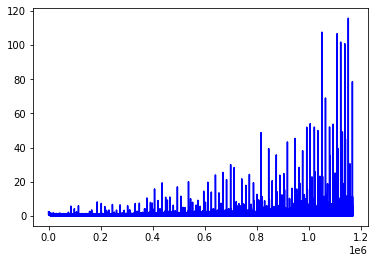

In [31]:
modeloDois = RedeNeuralModeloDois()

runnerDoisCrossRMSpropBatch = RedeNeuralRunner(modeloDois,
                                     X_train, y_train,
                                     40,0.00015,'CrossEntropyLoss','RMSprop','runnerDoisCrossRMSpropBatch',True)

runnerDoisCrossRMSpropBatch.train()

In [33]:
runnerDoisCrossRMSpropBatch.evaluate(X_test,y_test)

0.87098841108401

In [34]:
runnerDoisCrossRMSpropBatch.export()

Epoch: 39 Loss: 0.3840208351612091
Epoch: 39 Loss: 0.5435406565666199
Epoch: 39 Loss: 0.4721093475818634
Epoch: 39 Loss: 0.20066523551940918
Epoch: 39 Loss: 0.2757616341114044
Epoch: 39 Loss: 0.34700116515159607
Epoch: 39 Loss: 0.6481330394744873
Epoch: 39 Loss: 0.4205177128314972
Epoch: 39 Loss: 0.5151491165161133
Epoch: 39 Loss: 0.5884739756584167
Epoch: 39 Loss: 0.5522704720497131
Epoch: 39 Loss: 0.2698858678340912
Epoch: 39 Loss: 0.12182866036891937
Epoch: 39 Loss: 0.23361872136592865
Epoch: 39 Loss: 0.2825004756450653
Epoch: 39 Loss: 0.5271750092506409
Epoch: 39 Loss: 0.4543287754058838
Epoch: 39 Loss: 0.17729872465133667
Epoch: 39 Loss: 0.22640322148799896
Epoch: 39 Loss: 0.3892022967338562
Epoch: 39 Loss: 0.6526851654052734
Epoch: 39 Loss: 0.29853469133377075
Epoch: 39 Loss: 0.35086125135421753
Epoch: 39 Loss: 0.3862214982509613
Epoch: 39 Loss: 0.4482276737689972
Epoch: 39 Loss: 0.18858982622623444
Epoch: 39 Loss: 0.5025931596755981
Epoch: 39 Loss: 0.36927154660224915
Epoch: 39 

Epoch: 39 Loss: 0.5138243436813354
Epoch: 39 Loss: 0.30908408761024475
Epoch: 39 Loss: 0.25193458795547485
Epoch: 39 Loss: 0.38948577642440796
Epoch: 39 Loss: 0.3275498151779175
Epoch: 39 Loss: 0.2901208698749542
Epoch: 39 Loss: 0.5475050210952759
Epoch: 39 Loss: 0.38773807883262634
Epoch: 39 Loss: 0.5309339165687561
Epoch: 39 Loss: 0.4616338908672333
Epoch: 39 Loss: 0.4632943868637085
Epoch: 39 Loss: 0.5339431166648865
Epoch: 39 Loss: 0.31957870721817017
Epoch: 39 Loss: 0.2597464621067047
Epoch: 39 Loss: 0.25224360823631287
Epoch: 39 Loss: 0.4124937057495117
Epoch: 39 Loss: 0.22907505929470062
Epoch: 39 Loss: 0.40327078104019165
Epoch: 39 Loss: 0.6275495290756226
Epoch: 39 Loss: 0.4696624279022217
Epoch: 39 Loss: 0.6756044030189514
Epoch: 39 Loss: 0.4678945541381836
Epoch: 39 Loss: 0.3975212275981903
Epoch: 39 Loss: 0.42988401651382446
Epoch: 39 Loss: 0.48832494020462036
Epoch: 39 Loss: 0.36585116386413574
Epoch: 39 Loss: 0.37295517325401306
Epoch: 39 Loss: 0.4571869373321533
Epoch: 3

Epoch: 39 Loss: 0.447571337223053
Epoch: 39 Loss: 0.39094632863998413
Epoch: 39 Loss: 0.3031315207481384
Epoch: 39 Loss: 0.4506992697715759
Epoch: 39 Loss: 0.28746047616004944
Epoch: 39 Loss: 0.48742443323135376
Epoch: 39 Loss: 0.5763333439826965
Epoch: 39 Loss: 0.2670542299747467
Epoch: 39 Loss: 0.28377535939216614
Epoch: 39 Loss: 0.364886999130249
Epoch: 39 Loss: 0.2517370283603668
Epoch: 39 Loss: 0.2805006802082062
Epoch: 39 Loss: 0.41007909178733826
Epoch: 39 Loss: 0.2690846621990204
Epoch: 39 Loss: 0.41824913024902344
Epoch: 39 Loss: 0.41420382261276245
Epoch: 39 Loss: 0.3956965506076813
Epoch: 39 Loss: 0.1646953523159027
Epoch: 39 Loss: 0.4819088578224182
Epoch: 39 Loss: 0.24658402800559998
Epoch: 39 Loss: 0.22364629805088043
Epoch: 39 Loss: 0.499456524848938
Epoch: 39 Loss: 0.27737393975257874
Epoch: 39 Loss: 0.6920042634010315
Epoch: 39 Loss: 0.40813732147216797
Epoch: 39 Loss: 0.9018371105194092
Epoch: 39 Loss: 0.5300590395927429
Epoch: 39 Loss: 0.4101770222187042
Epoch: 39 Lo

Epoch: 39 Loss: 0.22055692970752716
Epoch: 39 Loss: 0.5055370330810547
Epoch: 39 Loss: 0.2598077654838562
Epoch: 39 Loss: 0.6998664140701294
Epoch: 39 Loss: 0.5678497552871704
Epoch: 39 Loss: 0.5360465049743652
Epoch: 39 Loss: 0.5687413811683655
Epoch: 39 Loss: 0.13017167150974274
Epoch: 39 Loss: 0.4629764258861542
Epoch: 39 Loss: 0.26650750637054443
Epoch: 39 Loss: 0.3104730248451233
Epoch: 39 Loss: 0.4593481123447418
Epoch: 39 Loss: 0.3281635344028473
Epoch: 39 Loss: 0.4562974274158478
Epoch: 39 Loss: 0.6240015029907227
Epoch: 39 Loss: 0.20345629751682281
Epoch: 39 Loss: 0.5319006443023682
Epoch: 39 Loss: 0.16570137441158295
Epoch: 39 Loss: 0.19351433217525482
Epoch: 39 Loss: 0.42226454615592957
Epoch: 39 Loss: 0.18973781168460846
Epoch: 39 Loss: 0.4406765103340149
Epoch: 39 Loss: 0.18825384974479675
Epoch: 39 Loss: 0.25268474221229553
Epoch: 39 Loss: 0.2431650012731552
Epoch: 39 Loss: 0.17578062415122986
Epoch: 39 Loss: 0.37709447741508484
Epoch: 39 Loss: 0.42341849207878113
Epoch: 

Epoch: 39 Loss: 0.46446388959884644
Epoch: 39 Loss: 0.22522523999214172
Epoch: 39 Loss: 0.34337612986564636
Epoch: 39 Loss: 0.24785059690475464
Epoch: 39 Loss: 0.6386851072311401
Epoch: 39 Loss: 0.5454410314559937
Epoch: 39 Loss: 0.15995757281780243
Epoch: 39 Loss: 0.6896299123764038
Epoch: 39 Loss: 0.5594533085823059
Epoch: 39 Loss: 0.2596275806427002
Epoch: 39 Loss: 0.5685845017433167
Epoch: 39 Loss: 0.8314871788024902
Epoch: 39 Loss: 0.2397926300764084
Epoch: 39 Loss: 0.43853649497032166
Epoch: 39 Loss: 0.39637038111686707
Epoch: 39 Loss: 0.2986506521701813
Epoch: 39 Loss: 0.3786981999874115
Epoch: 39 Loss: 0.5259812474250793
Epoch: 39 Loss: 0.2553606331348419
Epoch: 39 Loss: 0.47430235147476196
Epoch: 39 Loss: 0.30791112780570984
Epoch: 39 Loss: 0.44052654504776
Epoch: 39 Loss: 0.2677398920059204
Epoch: 39 Loss: 0.398013710975647
Epoch: 39 Loss: 0.2161967158317566
Epoch: 39 Loss: 0.5950278639793396
Epoch: 39 Loss: 0.4229728579521179
Epoch: 39 Loss: 1.00357985496521
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.675670325756073
Epoch: 39 Loss: 0.3762284219264984
Epoch: 39 Loss: 0.27585622668266296
Epoch: 39 Loss: 0.5512083768844604
Epoch: 39 Loss: 0.5850938558578491
Epoch: 39 Loss: 0.4279044568538666
Epoch: 39 Loss: 0.5951504111289978
Epoch: 39 Loss: 0.18756212294101715
Epoch: 39 Loss: 0.47355538606643677
Epoch: 39 Loss: 0.5280582904815674
Epoch: 39 Loss: 0.30503422021865845
Epoch: 39 Loss: 0.2842649519443512
Epoch: 39 Loss: 0.24615876376628876
Epoch: 39 Loss: 0.24289995431900024
Epoch: 39 Loss: 0.3504718840122223
Epoch: 39 Loss: 0.43316736817359924
Epoch: 39 Loss: 0.3398819863796234
Epoch: 39 Loss: 0.7266219854354858
Epoch: 39 Loss: 0.6792935729026794
Epoch: 39 Loss: 0.5982566475868225
Epoch: 39 Loss: 0.5275540947914124
Epoch: 39 Loss: 0.6574656963348389
Epoch: 39 Loss: 0.5078439712524414
Epoch: 39 Loss: 0.26625561714172363
Epoch: 39 Loss: 0.5420961380004883
Epoch: 39 Loss: 0.47417140007019043
Epoch: 39 Loss: 0.3263978958129883
Epoch: 39 Loss: 0.41192445158958435
Epoch: 39 L

Epoch: 39 Loss: 0.5374608039855957
Epoch: 39 Loss: 0.6123655438423157
Epoch: 39 Loss: 0.7409989237785339
Epoch: 39 Loss: 0.5560227632522583
Epoch: 39 Loss: 0.12716183066368103
Epoch: 39 Loss: 0.2428726702928543
Epoch: 39 Loss: 0.3056555390357971
Epoch: 39 Loss: 0.519474446773529
Epoch: 39 Loss: 0.3115241527557373
Epoch: 39 Loss: 0.5373404026031494
Epoch: 39 Loss: 0.39469486474990845
Epoch: 39 Loss: 0.4749804139137268
Epoch: 39 Loss: 0.4439714550971985
Epoch: 39 Loss: 0.5003930926322937
Epoch: 39 Loss: 0.40323519706726074
Epoch: 39 Loss: 0.36694812774658203
Epoch: 39 Loss: 0.3645473122596741
Epoch: 39 Loss: 0.5752657055854797
Epoch: 39 Loss: 0.48862746357917786
Epoch: 39 Loss: 0.3877801299095154
Epoch: 39 Loss: 0.7002633810043335
Epoch: 39 Loss: 0.8372688889503479
Epoch: 39 Loss: 0.34317997097969055
Epoch: 39 Loss: 0.227646604180336
Epoch: 39 Loss: 0.3125210702419281
Epoch: 39 Loss: 0.41438543796539307
Epoch: 39 Loss: 0.22031429409980774
Epoch: 39 Loss: 0.5497472286224365
Epoch: 39 Loss

Epoch: 39 Loss: 0.301752507686615
Epoch: 39 Loss: 0.4550659954547882
Epoch: 39 Loss: 0.22593216598033905
Epoch: 39 Loss: 0.3593024015426636
Epoch: 39 Loss: 0.6126450896263123
Epoch: 39 Loss: 0.6168582439422607
Epoch: 39 Loss: 0.553303062915802
Epoch: 39 Loss: 0.5280163288116455
Epoch: 39 Loss: 0.30348822474479675
Epoch: 39 Loss: 0.5267680883407593
Epoch: 39 Loss: 0.26054853200912476
Epoch: 39 Loss: 0.26766660809516907
Epoch: 39 Loss: 0.2842028737068176
Epoch: 39 Loss: 0.3253268301486969
Epoch: 39 Loss: 0.22370795905590057
Epoch: 39 Loss: 0.19699743390083313
Epoch: 39 Loss: 0.5503814816474915
Epoch: 39 Loss: 0.6030198931694031
Epoch: 39 Loss: 0.5261507630348206
Epoch: 39 Loss: 0.4051472544670105
Epoch: 39 Loss: 0.4909617602825165
Epoch: 39 Loss: 0.365505576133728
Epoch: 39 Loss: 0.40768423676490784
Epoch: 39 Loss: 0.2976050078868866
Epoch: 39 Loss: 0.5693723559379578
Epoch: 39 Loss: 0.17798849940299988
Epoch: 39 Loss: 0.3272358477115631
Epoch: 39 Loss: 0.33142346143722534
Epoch: 39 Loss

Epoch: 39 Loss: 0.4033842980861664
Epoch: 39 Loss: 0.45221975445747375
Epoch: 39 Loss: 0.6389108300209045
Epoch: 39 Loss: 0.3133343756198883
Epoch: 39 Loss: 0.3533128798007965
Epoch: 39 Loss: 0.2659870982170105
Epoch: 39 Loss: 0.23882709443569183
Epoch: 39 Loss: 0.2539592683315277
Epoch: 39 Loss: 0.3870203197002411
Epoch: 39 Loss: 0.6306065917015076
Epoch: 39 Loss: 0.37401172518730164
Epoch: 39 Loss: 0.4769158959388733
Epoch: 39 Loss: 0.565636932849884
Epoch: 39 Loss: 0.23985949158668518
Epoch: 39 Loss: 0.3177525997161865
Epoch: 39 Loss: 0.2576488256454468
Epoch: 39 Loss: 0.3893565237522125
Epoch: 39 Loss: 0.3040761947631836
Epoch: 39 Loss: 0.3917780816555023
Epoch: 39 Loss: 0.3412451446056366
Epoch: 39 Loss: 0.4535749554634094
Epoch: 39 Loss: 0.27161985635757446
Epoch: 39 Loss: 0.24155031144618988
Epoch: 39 Loss: 0.18669885396957397
Epoch: 39 Loss: 0.539413332939148
Epoch: 39 Loss: 0.29958078265190125
Epoch: 39 Loss: 0.5563458204269409
Epoch: 39 Loss: 0.4103606939315796
Epoch: 39 Loss

Epoch: 39 Loss: 0.5207780599594116
Epoch: 39 Loss: 0.34590715169906616
Epoch: 39 Loss: 0.1519068330526352
Epoch: 39 Loss: 0.2156761735677719
Epoch: 39 Loss: 0.48607635498046875
Epoch: 39 Loss: 0.8370334506034851
Epoch: 39 Loss: 0.6065528988838196
Epoch: 39 Loss: 0.342793345451355
Epoch: 39 Loss: 0.42641741037368774
Epoch: 39 Loss: 0.45879271626472473
Epoch: 39 Loss: 0.49829724431037903
Epoch: 39 Loss: 0.3520607352256775
Epoch: 39 Loss: 0.5671765804290771
Epoch: 39 Loss: 0.4756386876106262
Epoch: 39 Loss: 0.5993672609329224
Epoch: 39 Loss: 0.2958981394767761
Epoch: 39 Loss: 0.34127071499824524
Epoch: 39 Loss: 0.5308154225349426
Epoch: 39 Loss: 0.47173407673835754
Epoch: 39 Loss: 0.14602065086364746
Epoch: 39 Loss: 0.2716917097568512
Epoch: 39 Loss: 0.7587968111038208
Epoch: 39 Loss: 0.23492255806922913
Epoch: 39 Loss: 0.31863370537757874
Epoch: 39 Loss: 0.3003116846084595
Epoch: 39 Loss: 0.5577858090400696
Epoch: 39 Loss: 0.46297383308410645
Epoch: 39 Loss: 0.3917939066886902
Epoch: 39 

Epoch: 39 Loss: 0.24310213327407837
Epoch: 39 Loss: 0.6005486249923706
Epoch: 39 Loss: 0.43454644083976746
Epoch: 39 Loss: 0.6189172863960266
Epoch: 39 Loss: 0.26906540989875793
Epoch: 39 Loss: 0.4130280911922455
Epoch: 39 Loss: 0.4872532784938812
Epoch: 39 Loss: 0.47446465492248535
Epoch: 39 Loss: 0.3080105483531952
Epoch: 39 Loss: 0.3500646948814392
Epoch: 39 Loss: 0.4348263442516327
Epoch: 39 Loss: 0.39004307985305786
Epoch: 39 Loss: 0.3305076062679291
Epoch: 39 Loss: 0.7735169529914856
Epoch: 39 Loss: 0.3550868332386017
Epoch: 39 Loss: 0.43906283378601074
Epoch: 39 Loss: 0.5869054198265076
Epoch: 39 Loss: 0.28561586141586304
Epoch: 39 Loss: 0.42962366342544556
Epoch: 39 Loss: 0.5294700860977173
Epoch: 39 Loss: 0.39278489351272583
Epoch: 39 Loss: 0.45087122917175293
Epoch: 39 Loss: 0.40544456243515015
Epoch: 39 Loss: 0.2365867793560028
Epoch: 39 Loss: 0.43276455998420715
Epoch: 39 Loss: 0.5425236225128174
Epoch: 39 Loss: 0.31145623326301575
Epoch: 39 Loss: 0.36917412281036377
Epoch:

Epoch: 39 Loss: 0.2768070697784424
Epoch: 39 Loss: 0.5314468741416931
Epoch: 39 Loss: 0.4875357449054718
Epoch: 39 Loss: 0.29235148429870605
Epoch: 39 Loss: 0.24379941821098328
Epoch: 39 Loss: 0.17691323161125183
Epoch: 39 Loss: 0.5114641189575195
Epoch: 39 Loss: 0.5172907114028931
Epoch: 39 Loss: 0.3722817599773407
Epoch: 39 Loss: 0.5772517919540405
Epoch: 39 Loss: 0.5441162586212158
Epoch: 39 Loss: 0.5298267006874084
Epoch: 39 Loss: 0.36632198095321655
Epoch: 39 Loss: 0.2486870437860489
Epoch: 39 Loss: 0.8031374216079712
Epoch: 39 Loss: 0.48012351989746094
Epoch: 39 Loss: 0.5726497173309326
Epoch: 39 Loss: 0.5313053727149963
Epoch: 39 Loss: 0.4147413372993469
Epoch: 39 Loss: 0.33972683548927307
Epoch: 39 Loss: 0.4452795088291168
Epoch: 39 Loss: 0.16558481752872467
Epoch: 39 Loss: 0.32002493739128113
Epoch: 39 Loss: 0.2985888123512268
Epoch: 39 Loss: 0.6681333780288696
Epoch: 39 Loss: 0.27048638463020325
Epoch: 39 Loss: 0.36595508456230164
Epoch: 39 Loss: 0.40500250458717346
Epoch: 39

Epoch: 39 Loss: 0.7109194397926331
Epoch: 39 Loss: 0.8432197570800781
Epoch: 39 Loss: 0.31130582094192505
Epoch: 39 Loss: 0.44483840465545654
Epoch: 39 Loss: 0.6075387001037598
Epoch: 39 Loss: 0.22619740664958954
Epoch: 39 Loss: 0.42485788464546204
Epoch: 39 Loss: 0.34555187821388245
Epoch: 39 Loss: 0.5259206891059875
Epoch: 39 Loss: 0.12003690749406815
Epoch: 39 Loss: 0.28136226534843445
Epoch: 39 Loss: 0.2273004800081253
Epoch: 39 Loss: 0.2893252372741699
Epoch: 39 Loss: 0.29389819502830505
Epoch: 39 Loss: 0.500874936580658
Epoch: 39 Loss: 0.2736261188983917
Epoch: 39 Loss: 0.2815656363964081
Epoch: 39 Loss: 0.3017350435256958
Epoch: 39 Loss: 0.44768011569976807
Epoch: 39 Loss: 0.6142465472221375
Epoch: 39 Loss: 0.20116212964057922
Epoch: 39 Loss: 0.3318154513835907
Epoch: 39 Loss: 0.48415282368659973
Epoch: 39 Loss: 0.3417511582374573
Epoch: 39 Loss: 0.4058181643486023
Epoch: 39 Loss: 0.8005381226539612
Epoch: 39 Loss: 0.5543811321258545
Epoch: 39 Loss: 0.1908772885799408
Epoch: 39 

Epoch: 39 Loss: 0.5209113955497742
Epoch: 39 Loss: 0.35263171792030334
Epoch: 39 Loss: 0.3765491545200348
Epoch: 39 Loss: 0.20339040458202362
Epoch: 39 Loss: 0.38393595814704895
Epoch: 39 Loss: 0.3391793370246887
Epoch: 39 Loss: 0.23472285270690918
Epoch: 39 Loss: 0.20890356600284576
Epoch: 39 Loss: 0.5631653666496277
Epoch: 39 Loss: 0.26964834332466125
Epoch: 39 Loss: 0.4447758197784424
Epoch: 39 Loss: 0.4048587381839752
Epoch: 39 Loss: 0.40433385968208313
Epoch: 39 Loss: 0.14627201855182648
Epoch: 39 Loss: 0.24033603072166443
Epoch: 39 Loss: 0.4621451497077942
Epoch: 39 Loss: 0.35537752509117126
Epoch: 39 Loss: 0.3508809804916382
Epoch: 39 Loss: 0.30347734689712524
Epoch: 39 Loss: 0.31447306275367737
Epoch: 39 Loss: 0.3187544643878937
Epoch: 39 Loss: 0.4683849811553955
Epoch: 39 Loss: 0.5021206140518188
Epoch: 39 Loss: 0.23717784881591797
Epoch: 39 Loss: 0.2624102830886841
Epoch: 39 Loss: 0.33817651867866516
Epoch: 39 Loss: 0.6784814596176147
Epoch: 39 Loss: 0.1673521101474762
Epoch:

Epoch: 39 Loss: 0.47953516244888306
Epoch: 39 Loss: 0.4097827970981598
Epoch: 39 Loss: 0.3577803075313568
Epoch: 39 Loss: 0.29433366656303406
Epoch: 39 Loss: 0.21326996386051178
Epoch: 39 Loss: 0.29632481932640076
Epoch: 39 Loss: 0.5247833728790283
Epoch: 39 Loss: 0.21669885516166687
Epoch: 39 Loss: 0.2447371780872345
Epoch: 39 Loss: 0.494938462972641
Epoch: 39 Loss: 0.24875067174434662
Epoch: 39 Loss: 0.5603578090667725
Epoch: 39 Loss: 0.3093439042568207
Epoch: 39 Loss: 0.2816300094127655
Epoch: 39 Loss: 0.24253468215465546
Epoch: 39 Loss: 0.3293008804321289
Epoch: 39 Loss: 0.26850441098213196
Epoch: 39 Loss: 0.45160993933677673
Epoch: 39 Loss: 0.20074445009231567
Epoch: 39 Loss: 0.3974479138851166
Epoch: 39 Loss: 0.40439993143081665
Epoch: 39 Loss: 0.2006533145904541
Epoch: 39 Loss: 0.3418218791484833
Epoch: 39 Loss: 0.5602298974990845
Epoch: 39 Loss: 0.437407523393631
Epoch: 39 Loss: 0.23035231232643127
Epoch: 39 Loss: 0.5574076771736145
Epoch: 39 Loss: 0.6546324491500854
Epoch: 39 

Epoch: 39 Loss: 0.3619866371154785
Epoch: 39 Loss: 0.12021230161190033
Epoch: 39 Loss: 0.3445940911769867
Epoch: 39 Loss: 0.34503400325775146
Epoch: 39 Loss: 0.3494981825351715
Epoch: 39 Loss: 0.28435593843460083
Epoch: 39 Loss: 0.2655377984046936
Epoch: 39 Loss: 0.3808209300041199
Epoch: 39 Loss: 0.13992226123809814
Epoch: 39 Loss: 0.2882528305053711
Epoch: 39 Loss: 0.9025033712387085
Epoch: 39 Loss: 0.12067819386720657
Epoch: 39 Loss: 0.3872303068637848
Epoch: 39 Loss: 0.3424876034259796
Epoch: 39 Loss: 0.7128874063491821
Epoch: 39 Loss: 0.4446481466293335
Epoch: 39 Loss: 0.21881459653377533
Epoch: 39 Loss: 0.2280731201171875
Epoch: 39 Loss: 0.4388883411884308
Epoch: 39 Loss: 0.4447721242904663
Epoch: 39 Loss: 0.6040967106819153
Epoch: 39 Loss: 0.3823433220386505
Epoch: 39 Loss: 0.3648892939090729
Epoch: 39 Loss: 0.6626278162002563
Epoch: 39 Loss: 0.4587479531764984
Epoch: 39 Loss: 0.6150153279304504
Epoch: 39 Loss: 0.4458393454551697
Epoch: 39 Loss: 0.789494514465332
Epoch: 39 Loss:

Epoch: 39 Loss: 0.41417962312698364
Epoch: 39 Loss: 0.3367592394351959
Epoch: 39 Loss: 0.5429425239562988
Epoch: 39 Loss: 0.42483440041542053
Epoch: 39 Loss: 0.41791263222694397
Epoch: 39 Loss: 0.4608875811100006
Epoch: 39 Loss: 0.3658001124858856
Epoch: 39 Loss: 0.39954420924186707
Epoch: 39 Loss: 0.6189913153648376
Epoch: 39 Loss: 0.30628159642219543
Epoch: 39 Loss: 0.5467067360877991
Epoch: 39 Loss: 0.34752702713012695
Epoch: 39 Loss: 0.24642810225486755
Epoch: 39 Loss: 0.2787352204322815
Epoch: 39 Loss: 0.14819404482841492
Epoch: 39 Loss: 0.20004525780677795
Epoch: 39 Loss: 0.1724167913198471
Epoch: 39 Loss: 0.1876560002565384
Epoch: 39 Loss: 0.3855818510055542
Epoch: 39 Loss: 0.380460649728775
Epoch: 39 Loss: 0.6213414072990417
Epoch: 39 Loss: 0.6190208196640015
Epoch: 39 Loss: 0.45114168524742126
Epoch: 39 Loss: 0.1891106218099594
Epoch: 39 Loss: 0.3419305682182312
Epoch: 39 Loss: 0.4394321143627167
Epoch: 39 Loss: 0.2768772840499878
Epoch: 39 Loss: 0.459192156791687
Epoch: 39 Lo

Epoch: 39 Loss: 0.19683773815631866
Epoch: 39 Loss: 0.18073159456253052
Epoch: 39 Loss: 0.2929540276527405
Epoch: 39 Loss: 0.3512680232524872
Epoch: 39 Loss: 0.3607383072376251
Epoch: 39 Loss: 0.4532915949821472
Epoch: 39 Loss: 0.4087521433830261
Epoch: 39 Loss: 0.15221354365348816
Epoch: 39 Loss: 0.5240609049797058
Epoch: 39 Loss: 0.18793292343616486
Epoch: 39 Loss: 0.13137583434581757
Epoch: 39 Loss: 0.3699139356613159
Epoch: 39 Loss: 0.44504600763320923
Epoch: 39 Loss: 0.3577663004398346
Epoch: 39 Loss: 0.31611448526382446
Epoch: 39 Loss: 0.5306516885757446
Epoch: 39 Loss: 0.42487987875938416
Epoch: 39 Loss: 0.4517538845539093
Epoch: 39 Loss: 0.2852938175201416
Epoch: 39 Loss: 0.31718552112579346
Epoch: 39 Loss: 0.3647245168685913
Epoch: 39 Loss: 0.2748025953769684
Epoch: 39 Loss: 0.3171672523021698
Epoch: 39 Loss: 0.6641013026237488
Epoch: 39 Loss: 0.16081975400447845
Epoch: 39 Loss: 0.31650036573410034
Epoch: 39 Loss: 0.34250324964523315
Epoch: 39 Loss: 0.26772841811180115
Epoch: 

Epoch: 39 Loss: 0.40967655181884766
Epoch: 39 Loss: 0.4345751404762268
Epoch: 39 Loss: 0.2536243498325348
Epoch: 39 Loss: 0.4097050130367279
Epoch: 39 Loss: 0.8765323758125305
Epoch: 39 Loss: 0.3427756726741791
Epoch: 39 Loss: 0.32632291316986084
Epoch: 39 Loss: 0.698398768901825
Epoch: 39 Loss: 0.4052249491214752
Epoch: 39 Loss: 0.20691034197807312
Epoch: 39 Loss: 0.47985556721687317
Epoch: 39 Loss: 0.2577456831932068
Epoch: 39 Loss: 0.52911376953125
Epoch: 39 Loss: 0.44653135538101196
Epoch: 39 Loss: 0.5331923961639404
Epoch: 39 Loss: 0.37916770577430725
Epoch: 39 Loss: 0.20653432607650757
Epoch: 39 Loss: 0.5463076829910278
Epoch: 39 Loss: 0.4648817479610443
Epoch: 39 Loss: 0.5080299377441406
Epoch: 39 Loss: 0.5287229418754578
Epoch: 39 Loss: 0.46435558795928955
Epoch: 39 Loss: 0.2472398430109024
Epoch: 39 Loss: 0.556024432182312
Epoch: 39 Loss: 0.378391832113266
Epoch: 39 Loss: 0.2634022831916809
Epoch: 39 Loss: 0.3923287093639374
Epoch: 39 Loss: 0.43369153141975403
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.2642073333263397
Epoch: 39 Loss: 0.25448518991470337
Epoch: 39 Loss: 0.5572995543479919
Epoch: 39 Loss: 0.4685944616794586
Epoch: 39 Loss: 0.5646061897277832
Epoch: 39 Loss: 0.3229844570159912
Epoch: 39 Loss: 0.22597353160381317
Epoch: 39 Loss: 0.6510025262832642
Epoch: 39 Loss: 0.5262643098831177
Epoch: 39 Loss: 0.4215857684612274
Epoch: 39 Loss: 0.23128429055213928
Epoch: 39 Loss: 0.3259315490722656
Epoch: 39 Loss: 0.43583041429519653
Epoch: 39 Loss: 0.4624076783657074
Epoch: 39 Loss: 0.567197322845459
Epoch: 39 Loss: 0.23992712795734406
Epoch: 39 Loss: 0.3194795548915863
Epoch: 39 Loss: 0.6944241523742676
Epoch: 39 Loss: 0.3632107079029083
Epoch: 39 Loss: 0.6017829179763794
Epoch: 39 Loss: 0.49131134152412415
Epoch: 39 Loss: 0.48669061064720154
Epoch: 39 Loss: 0.6096964478492737
Epoch: 39 Loss: 0.3332444429397583
Epoch: 39 Loss: 0.5286974310874939
Epoch: 39 Loss: 0.6908209323883057
Epoch: 39 Loss: 0.1653706133365631
Epoch: 39 Loss: 0.6273364424705505
Epoch: 39 Loss

Epoch: 39 Loss: 0.5642921328544617
Epoch: 39 Loss: 0.5519171357154846
Epoch: 39 Loss: 0.4537545442581177
Epoch: 39 Loss: 0.5359335541725159
Epoch: 39 Loss: 0.4491613209247589
Epoch: 39 Loss: 0.62762850522995
Epoch: 39 Loss: 0.6881763935089111
Epoch: 39 Loss: 0.16560834646224976
Epoch: 39 Loss: 0.46640199422836304
Epoch: 39 Loss: 0.707817554473877
Epoch: 39 Loss: 0.2799683213233948
Epoch: 39 Loss: 0.27236467599868774
Epoch: 39 Loss: 0.4554443359375
Epoch: 39 Loss: 0.500154972076416
Epoch: 39 Loss: 0.5168201327323914
Epoch: 39 Loss: 0.31147828698158264
Epoch: 39 Loss: 0.26178309321403503
Epoch: 39 Loss: 0.37809640169143677
Epoch: 39 Loss: 0.5173372030258179
Epoch: 39 Loss: 0.30017098784446716
Epoch: 39 Loss: 0.7240492105484009
Epoch: 39 Loss: 0.347234308719635
Epoch: 39 Loss: 0.18476073443889618
Epoch: 39 Loss: 0.33596882224082947
Epoch: 39 Loss: 0.2746126353740692
Epoch: 39 Loss: 0.497063547372818
Epoch: 39 Loss: 0.3055029511451721
Epoch: 39 Loss: 0.6183505058288574
Epoch: 39 Loss: 0.73

Epoch: 39 Loss: 0.5179639458656311
Epoch: 39 Loss: 0.25923240184783936
Epoch: 39 Loss: 0.2125939130783081
Epoch: 39 Loss: 0.5157620310783386
Epoch: 39 Loss: 0.5664833188056946
Epoch: 39 Loss: 0.38347145915031433
Epoch: 39 Loss: 0.6368452310562134
Epoch: 39 Loss: 0.35383549332618713
Epoch: 39 Loss: 0.45536544919013977
Epoch: 39 Loss: 0.6075674295425415
Epoch: 39 Loss: 0.23481883108615875
Epoch: 39 Loss: 0.41253209114074707
Epoch: 39 Loss: 0.2933979332447052
Epoch: 39 Loss: 0.663699209690094
Epoch: 39 Loss: 0.33191823959350586
Epoch: 39 Loss: 0.32564738392829895
Epoch: 39 Loss: 0.5045486092567444
Epoch: 39 Loss: 0.43379300832748413
Epoch: 39 Loss: 0.6728036403656006
Epoch: 39 Loss: 0.3065846264362335
Epoch: 39 Loss: 0.3591686487197876
Epoch: 39 Loss: 0.3022316098213196
Epoch: 39 Loss: 0.4991495907306671
Epoch: 39 Loss: 0.5624790787696838
Epoch: 39 Loss: 0.40891575813293457
Epoch: 39 Loss: 0.17580309510231018
Epoch: 39 Loss: 0.3321705162525177
Epoch: 39 Loss: 0.4686206877231598
Epoch: 39 

Epoch: 39 Loss: 0.672073483467102
Epoch: 39 Loss: 0.38244035840034485
Epoch: 39 Loss: 0.24129319190979004
Epoch: 39 Loss: 0.5906180739402771
Epoch: 39 Loss: 0.23359961807727814
Epoch: 39 Loss: 0.28425681591033936
Epoch: 39 Loss: 0.4345627427101135
Epoch: 39 Loss: 0.3759084939956665
Epoch: 39 Loss: 0.4771493077278137
Epoch: 39 Loss: 0.36049535870552063
Epoch: 39 Loss: 0.3954627513885498
Epoch: 39 Loss: 0.32420477271080017
Epoch: 39 Loss: 0.8437284827232361
Epoch: 39 Loss: 0.48964765667915344
Epoch: 39 Loss: 0.5265034437179565
Epoch: 39 Loss: 0.46489712595939636
Epoch: 39 Loss: 0.38541460037231445
Epoch: 39 Loss: 0.39907723665237427
Epoch: 39 Loss: 0.42016535997390747
Epoch: 39 Loss: 0.3137315511703491
Epoch: 39 Loss: 0.22150379419326782
Epoch: 39 Loss: 0.3385828137397766
Epoch: 39 Loss: 0.26697805523872375
Epoch: 39 Loss: 0.28111326694488525
Epoch: 39 Loss: 0.351936936378479
Epoch: 39 Loss: 0.247171550989151
Epoch: 39 Loss: 0.4438624382019043
Epoch: 39 Loss: 0.5125791430473328
Epoch: 39

Epoch: 39 Loss: 0.3275875747203827
Epoch: 39 Loss: 0.6946855187416077
Epoch: 39 Loss: 0.534329891204834
Epoch: 39 Loss: 0.33092713356018066
Epoch: 39 Loss: 0.5377476215362549
Epoch: 39 Loss: 0.15435925126075745
Epoch: 39 Loss: 0.46808508038520813
Epoch: 39 Loss: 0.37390270829200745
Epoch: 39 Loss: 0.647619366645813
Epoch: 39 Loss: 0.3925875127315521
Epoch: 39 Loss: 0.4477914869785309
Epoch: 39 Loss: 0.26999640464782715
Epoch: 39 Loss: 0.24489706754684448
Epoch: 39 Loss: 0.3696967363357544
Epoch: 39 Loss: 0.399872362613678
Epoch: 39 Loss: 0.39356040954589844
Epoch: 39 Loss: 0.31972774863243103
Epoch: 39 Loss: 0.36593323945999146
Epoch: 39 Loss: 0.1765730082988739
Epoch: 39 Loss: 0.5511689186096191
Epoch: 39 Loss: 0.2945498526096344
Epoch: 39 Loss: 0.4080626964569092
Epoch: 39 Loss: 0.35120725631713867
Epoch: 39 Loss: 0.8878304362297058
Epoch: 39 Loss: 0.2477750927209854
Epoch: 39 Loss: 0.2378028929233551
Epoch: 39 Loss: 0.5007185339927673
Epoch: 39 Loss: 0.42091822624206543
Epoch: 39 Lo

Epoch: 39 Loss: 0.30151987075805664
Epoch: 39 Loss: 0.39592987298965454
Epoch: 39 Loss: 0.5962492227554321
Epoch: 39 Loss: 0.24016088247299194
Epoch: 39 Loss: 0.5855798721313477
Epoch: 39 Loss: 0.3515905737876892
Epoch: 39 Loss: 0.16304714977741241
Epoch: 39 Loss: 0.20871618390083313
Epoch: 39 Loss: 0.3519057035446167
Epoch: 39 Loss: 0.42901065945625305
Epoch: 39 Loss: 0.5049118995666504
Epoch: 39 Loss: 0.5022488236427307
Epoch: 39 Loss: 0.5671244263648987
Epoch: 39 Loss: 0.27325525879859924
Epoch: 39 Loss: 0.4651402533054352
Epoch: 39 Loss: 0.6520994901657104
Epoch: 39 Loss: 0.5443606972694397
Epoch: 39 Loss: 0.599898636341095
Epoch: 39 Loss: 0.49748843908309937
Epoch: 39 Loss: 0.6971465349197388
Epoch: 39 Loss: 0.2686381936073303
Epoch: 39 Loss: 0.24694381654262543
Epoch: 39 Loss: 0.4094424247741699
Epoch: 39 Loss: 0.5975291132926941
Epoch: 39 Loss: 0.45308297872543335
Epoch: 39 Loss: 0.34468305110931396
Epoch: 39 Loss: 0.19797268509864807
Epoch: 39 Loss: 0.4953893721103668
Epoch: 39

Epoch: 39 Loss: 0.454771488904953
Epoch: 39 Loss: 0.5014068484306335
Epoch: 39 Loss: 0.3773384392261505
Epoch: 39 Loss: 0.4591559171676636
Epoch: 39 Loss: 0.3824658989906311
Epoch: 39 Loss: 0.34030821919441223
Epoch: 39 Loss: 0.23889730870723724
Epoch: 39 Loss: 0.6618925333023071
Epoch: 39 Loss: 0.3626110255718231
Epoch: 39 Loss: 0.3414528965950012
Epoch: 39 Loss: 0.18608534336090088
Epoch: 39 Loss: 0.35745957493782043
Epoch: 39 Loss: 0.44918206334114075
Epoch: 39 Loss: 0.444810152053833
Epoch: 39 Loss: 0.3683794438838959
Epoch: 39 Loss: 0.5053070187568665
Epoch: 39 Loss: 0.26960447430610657
Epoch: 39 Loss: 0.26033636927604675
Epoch: 39 Loss: 0.2809085547924042
Epoch: 39 Loss: 0.2519003450870514
Epoch: 39 Loss: 0.2962988317012787
Epoch: 39 Loss: 0.3387778401374817
Epoch: 39 Loss: 0.32061952352523804
Epoch: 39 Loss: 0.6549009084701538
Epoch: 39 Loss: 0.25436311960220337
Epoch: 39 Loss: 0.6422706842422485
Epoch: 39 Loss: 0.5502369403839111
Epoch: 39 Loss: 0.2780079245567322
Epoch: 39 Los

Epoch: 39 Loss: 0.49132513999938965
Epoch: 39 Loss: 0.38930797576904297
Epoch: 39 Loss: 0.3494409918785095
Epoch: 39 Loss: 0.2558042109012604
Epoch: 39 Loss: 0.4136548638343811
Epoch: 39 Loss: 0.8144744634628296
Epoch: 39 Loss: 0.4624076783657074
Epoch: 39 Loss: 0.19040262699127197
Epoch: 39 Loss: 0.35368117690086365
Epoch: 39 Loss: 0.5047743916511536
Epoch: 39 Loss: 0.6424115896224976
Epoch: 39 Loss: 0.3475869297981262
Epoch: 39 Loss: 0.25153008103370667
Epoch: 39 Loss: 0.7251238822937012
Epoch: 39 Loss: 0.39876946806907654
Epoch: 39 Loss: 0.3329605162143707
Epoch: 39 Loss: 0.29285189509391785
Epoch: 39 Loss: 0.42522040009498596
Epoch: 39 Loss: 0.2857053875923157
Epoch: 39 Loss: 0.47867268323898315
Epoch: 39 Loss: 0.591374933719635
Epoch: 39 Loss: 0.5848550796508789
Epoch: 39 Loss: 0.5216960310935974
Epoch: 39 Loss: 0.24908345937728882
Epoch: 39 Loss: 0.4818711280822754
Epoch: 39 Loss: 0.6295612454414368
Epoch: 39 Loss: 0.25052011013031006
Epoch: 39 Loss: 0.5625484585762024
Epoch: 39 

Epoch: 39 Loss: 0.5501734614372253
Epoch: 39 Loss: 0.9341375231742859
Epoch: 39 Loss: 0.3950013816356659
Epoch: 39 Loss: 0.3289274573326111
Epoch: 39 Loss: 0.5937842130661011
Epoch: 39 Loss: 0.3756259083747864
Epoch: 39 Loss: 0.3607352674007416
Epoch: 39 Loss: 0.26119765639305115
Epoch: 39 Loss: 0.5569524765014648
Epoch: 39 Loss: 0.34311679005622864
Epoch: 39 Loss: 0.32142117619514465
Epoch: 39 Loss: 0.5287367105484009
Epoch: 39 Loss: 0.17173534631729126
Epoch: 39 Loss: 0.19030697643756866
Epoch: 39 Loss: 0.30220097303390503
Epoch: 39 Loss: 0.4843367636203766
Epoch: 39 Loss: 0.4267749786376953
Epoch: 39 Loss: 0.38806185126304626
Epoch: 39 Loss: 0.440589040517807
Epoch: 39 Loss: 0.41726621985435486
Epoch: 39 Loss: 0.38956817984580994
Epoch: 39 Loss: 0.20211178064346313
Epoch: 39 Loss: 0.32270804047584534
Epoch: 39 Loss: 0.2885621190071106
Epoch: 39 Loss: 0.21427953243255615
Epoch: 39 Loss: 0.9200075268745422
Epoch: 39 Loss: 0.3184872269630432
Epoch: 39 Loss: 0.4663350582122803
Epoch: 39

Epoch: 39 Loss: 0.5652042031288147
Epoch: 39 Loss: 0.3913494348526001
Epoch: 39 Loss: 0.2702820599079132
Epoch: 39 Loss: 0.29729127883911133
Epoch: 39 Loss: 0.3141571283340454
Epoch: 39 Loss: 0.2853253483772278
Epoch: 39 Loss: 0.6187736392021179
Epoch: 39 Loss: 0.3195854723453522
Epoch: 39 Loss: 0.34000974893569946
Epoch: 39 Loss: 0.3600480258464813
Epoch: 39 Loss: 0.29821035265922546
Epoch: 39 Loss: 0.5046873092651367
Epoch: 39 Loss: 0.21334707736968994
Epoch: 39 Loss: 0.4532715976238251
Epoch: 39 Loss: 0.44674479961395264
Epoch: 39 Loss: 0.6255168914794922
Epoch: 39 Loss: 0.595787763595581
Epoch: 39 Loss: 0.35463085770606995
Epoch: 39 Loss: 0.5742843151092529
Epoch: 39 Loss: 0.30069616436958313
Epoch: 39 Loss: 0.5056401491165161
Epoch: 39 Loss: 0.19413311779499054
Epoch: 39 Loss: 0.5312010049819946
Epoch: 39 Loss: 0.314573734998703
Epoch: 39 Loss: 0.23851649463176727
Epoch: 39 Loss: 0.34928441047668457
Epoch: 39 Loss: 0.24171581864356995
Epoch: 39 Loss: 0.5210261940956116
Epoch: 39 L

Epoch: 39 Loss: 0.44006621837615967
Epoch: 39 Loss: 0.5260520577430725
Epoch: 39 Loss: 0.31516969203948975
Epoch: 39 Loss: 0.4930873215198517
Epoch: 39 Loss: 0.28463631868362427
Epoch: 39 Loss: 0.33038750290870667
Epoch: 39 Loss: 0.3428453803062439
Epoch: 39 Loss: 0.5910003781318665
Epoch: 39 Loss: 0.23131656646728516
Epoch: 39 Loss: 0.3859776258468628
Epoch: 39 Loss: 0.24017103016376495
Epoch: 39 Loss: 0.4028286337852478
Epoch: 39 Loss: 0.44047534465789795
Epoch: 39 Loss: 0.49833324551582336
Epoch: 39 Loss: 0.5712575912475586
Epoch: 39 Loss: 0.5127857327461243
Epoch: 39 Loss: 0.41956257820129395
Epoch: 39 Loss: 0.49732691049575806
Epoch: 39 Loss: 0.560792863368988
Epoch: 39 Loss: 0.3567946255207062
Epoch: 39 Loss: 0.3110619783401489
Epoch: 39 Loss: 0.2898126542568207
Epoch: 39 Loss: 0.4311457574367523
Epoch: 39 Loss: 0.498847633600235
Epoch: 39 Loss: 0.2954408824443817
Epoch: 39 Loss: 0.3831949830055237
Epoch: 39 Loss: 0.1600014567375183
Epoch: 39 Loss: 0.7253614068031311
Epoch: 39 Lo

Epoch: 39 Loss: 0.4066287875175476
Epoch: 39 Loss: 0.548051655292511
Epoch: 39 Loss: 0.3077465891838074
Epoch: 39 Loss: 0.29111477732658386
Epoch: 39 Loss: 0.16029390692710876
Epoch: 39 Loss: 0.56828773021698
Epoch: 39 Loss: 0.18856583535671234
Epoch: 39 Loss: 0.4915463328361511
Epoch: 39 Loss: 0.33507776260375977
Epoch: 39 Loss: 0.37512198090553284
Epoch: 39 Loss: 0.5703926086425781
Epoch: 39 Loss: 0.2879874110221863
Epoch: 39 Loss: 0.48280516266822815
Epoch: 39 Loss: 0.28631851077079773
Epoch: 39 Loss: 0.31289365887641907
Epoch: 39 Loss: 0.4880087375640869
Epoch: 39 Loss: 0.44013527035713196
Epoch: 39 Loss: 0.4206223487854004
Epoch: 39 Loss: 0.35957100987434387
Epoch: 39 Loss: 0.15949994325637817
Epoch: 39 Loss: 0.22934699058532715
Epoch: 39 Loss: 0.3111971318721771
Epoch: 39 Loss: 0.4990079998970032
Epoch: 39 Loss: 0.676462709903717
Epoch: 39 Loss: 0.16515719890594482
Epoch: 39 Loss: 0.3110242784023285
Epoch: 39 Loss: 0.3614735007286072
Epoch: 39 Loss: 0.33852115273475647
Epoch: 39 

Epoch: 39 Loss: 0.24078169465065002
Epoch: 39 Loss: 0.3730182349681854
Epoch: 39 Loss: 0.568286120891571
Epoch: 39 Loss: 0.2946244776248932
Epoch: 39 Loss: 0.24281428754329681
Epoch: 39 Loss: 0.5190804600715637
Epoch: 39 Loss: 0.3813328146934509
Epoch: 39 Loss: 0.36859720945358276
Epoch: 39 Loss: 0.3287704288959503
Epoch: 39 Loss: 0.3565273582935333
Epoch: 39 Loss: 0.6059232354164124
Epoch: 39 Loss: 0.38271331787109375
Epoch: 39 Loss: 0.3010777235031128
Epoch: 39 Loss: 0.3961421251296997
Epoch: 39 Loss: 0.35130107402801514
Epoch: 39 Loss: 0.48259270191192627
Epoch: 39 Loss: 0.17765182256698608
Epoch: 39 Loss: 0.4447183609008789
Epoch: 39 Loss: 0.34531691670417786
Epoch: 39 Loss: 0.6963675618171692
Epoch: 39 Loss: 0.3055956959724426
Epoch: 39 Loss: 0.3108943998813629
Epoch: 39 Loss: 0.4098094701766968
Epoch: 39 Loss: 0.45534053444862366
Epoch: 39 Loss: 0.4906037151813507
Epoch: 39 Loss: 0.413743257522583
Epoch: 39 Loss: 0.6741438508033752
Epoch: 39 Loss: 0.41244032979011536
Epoch: 39 Lo

Epoch: 39 Loss: 0.2354777604341507
Epoch: 39 Loss: 0.4038955867290497
Epoch: 39 Loss: 0.503053605556488
Epoch: 39 Loss: 0.23507997393608093
Epoch: 39 Loss: 0.47334614396095276
Epoch: 39 Loss: 0.3613129258155823
Epoch: 39 Loss: 0.3497125804424286
Epoch: 39 Loss: 0.5448233485221863
Epoch: 39 Loss: 0.28341206908226013
Epoch: 39 Loss: 0.2701929807662964
Epoch: 39 Loss: 0.3240608274936676
Epoch: 39 Loss: 0.3333750367164612
Epoch: 39 Loss: 0.3129923343658447
Epoch: 39 Loss: 0.340249627828598
Epoch: 39 Loss: 0.4336775243282318
Epoch: 39 Loss: 0.16528013348579407
Epoch: 39 Loss: 0.30857720971107483
Epoch: 39 Loss: 0.5393988490104675
Epoch: 39 Loss: 0.5868732333183289
Epoch: 39 Loss: 0.17884665727615356
Epoch: 39 Loss: 0.20484767854213715
Epoch: 39 Loss: 0.4241425693035126
Epoch: 39 Loss: 0.6180366277694702
Epoch: 39 Loss: 0.5332401394844055
Epoch: 39 Loss: 0.3209956884384155
Epoch: 39 Loss: 0.27476760745048523
Epoch: 39 Loss: 0.41956204175949097
Epoch: 39 Loss: 0.6839838624000549
Epoch: 39 Los

Epoch: 39 Loss: 0.35674500465393066
Epoch: 39 Loss: 0.2662244141101837
Epoch: 39 Loss: 0.42418810725212097
Epoch: 39 Loss: 0.5484734177589417
Epoch: 39 Loss: 0.3839671015739441
Epoch: 39 Loss: 0.38560283184051514
Epoch: 39 Loss: 0.36905574798583984
Epoch: 39 Loss: 0.5054563283920288
Epoch: 39 Loss: 0.6602976322174072
Epoch: 39 Loss: 0.4804072380065918
Epoch: 39 Loss: 0.339287668466568
Epoch: 39 Loss: 0.21644780039787292
Epoch: 39 Loss: 0.3090672791004181
Epoch: 39 Loss: 0.31197476387023926
Epoch: 39 Loss: 0.4779122471809387
Epoch: 39 Loss: 0.2775481939315796
Epoch: 39 Loss: 0.3179689049720764
Epoch: 39 Loss: 0.4349741041660309
Epoch: 39 Loss: 0.7277006506919861
Epoch: 39 Loss: 0.4238978624343872
Epoch: 39 Loss: 0.3970640301704407
Epoch: 39 Loss: 0.40439048409461975
Epoch: 39 Loss: 0.3861018419265747
Epoch: 39 Loss: 0.541976273059845
Epoch: 39 Loss: 0.22017253935337067
Epoch: 39 Loss: 0.5286697149276733
Epoch: 39 Loss: 0.40161341428756714
Epoch: 39 Loss: 0.33673012256622314
Epoch: 39 Lo

Epoch: 39 Loss: 0.7249622344970703
Epoch: 39 Loss: 0.2598453760147095
Epoch: 39 Loss: 0.3796531558036804
Epoch: 39 Loss: 0.29481029510498047
Epoch: 39 Loss: 0.5240386128425598
Epoch: 39 Loss: 0.3703180253505707
Epoch: 39 Loss: 0.24661503732204437
Epoch: 39 Loss: 0.36660706996917725
Epoch: 39 Loss: 0.33726000785827637
Epoch: 39 Loss: 0.38292545080184937
Epoch: 39 Loss: 0.5189760327339172
Epoch: 39 Loss: 0.24459552764892578
Epoch: 39 Loss: 0.7010941505432129
Epoch: 39 Loss: 0.16270577907562256
Epoch: 39 Loss: 0.5125479102134705
Epoch: 39 Loss: 0.7742854356765747
Epoch: 39 Loss: 0.4418007433414459
Epoch: 39 Loss: 0.3443596363067627
Epoch: 39 Loss: 0.5559163093566895
Epoch: 39 Loss: 0.41766002774238586
Epoch: 39 Loss: 0.36626681685447693
Epoch: 39 Loss: 0.26421383023262024
Epoch: 39 Loss: 0.2659360468387604
Epoch: 39 Loss: 0.41373294591903687
Epoch: 39 Loss: 0.3611167073249817
Epoch: 39 Loss: 0.6063889861106873
Epoch: 39 Loss: 0.40904513001441956
Epoch: 39 Loss: 0.3374638557434082
Epoch: 3

Epoch: 39 Loss: 0.24499660730361938
Epoch: 39 Loss: 0.6311031579971313
Epoch: 39 Loss: 0.3244253695011139
Epoch: 39 Loss: 0.5073400735855103
Epoch: 39 Loss: 0.4354507327079773
Epoch: 39 Loss: 0.5733020305633545
Epoch: 39 Loss: 0.3093230128288269
Epoch: 39 Loss: 0.6283955574035645
Epoch: 39 Loss: 0.4181470274925232
Epoch: 39 Loss: 0.6603893041610718
Epoch: 39 Loss: 0.4563221335411072
Epoch: 39 Loss: 0.5374101400375366
Epoch: 39 Loss: 0.5320650935173035
Epoch: 39 Loss: 0.33240073919296265
Epoch: 39 Loss: 0.3936639130115509
Epoch: 39 Loss: 0.5570613741874695
Epoch: 39 Loss: 0.27024945616722107
Epoch: 39 Loss: 0.4176109731197357
Epoch: 39 Loss: 0.2224603146314621
Epoch: 39 Loss: 0.2710840106010437
Epoch: 39 Loss: 0.7402898073196411
Epoch: 39 Loss: 0.22842252254486084
Epoch: 39 Loss: 0.32626017928123474
Epoch: 39 Loss: 0.3282884955406189
Epoch: 39 Loss: 0.4394296109676361
Epoch: 39 Loss: 0.2358442097902298
Epoch: 39 Loss: 0.5111034512519836
Epoch: 39 Loss: 0.3467894494533539
Epoch: 39 Loss:

Epoch: 39 Loss: 0.7625452876091003
Epoch: 39 Loss: 0.28883278369903564
Epoch: 39 Loss: 0.4096395671367645
Epoch: 39 Loss: 0.41793322563171387
Epoch: 39 Loss: 0.24991931021213531
Epoch: 39 Loss: 0.8366698026657104
Epoch: 39 Loss: 0.42183730006217957
Epoch: 39 Loss: 0.3877544701099396
Epoch: 39 Loss: 0.6457797288894653
Epoch: 39 Loss: 0.30858108401298523
Epoch: 39 Loss: 0.35177379846572876
Epoch: 39 Loss: 0.43833836913108826
Epoch: 39 Loss: 0.8183968663215637
Epoch: 39 Loss: 0.5020990371704102
Epoch: 39 Loss: 0.4245871603488922
Epoch: 39 Loss: 0.5248523950576782
Epoch: 39 Loss: 0.37609025835990906
Epoch: 39 Loss: 0.7142826914787292
Epoch: 39 Loss: 0.25863707065582275
Epoch: 39 Loss: 0.4141845107078552
Epoch: 39 Loss: 0.3423844873905182
Epoch: 39 Loss: 0.6699690222740173
Epoch: 39 Loss: 0.5776090025901794
Epoch: 39 Loss: 0.7426310181617737
Epoch: 39 Loss: 0.7044481635093689
Epoch: 39 Loss: 0.30761462450027466
Epoch: 39 Loss: 0.20234505832195282
Epoch: 39 Loss: 0.4141717255115509
Epoch: 39

Epoch: 39 Loss: 0.3134017586708069
Epoch: 39 Loss: 0.45418068766593933
Epoch: 39 Loss: 0.31828564405441284
Epoch: 39 Loss: 0.46823304891586304
Epoch: 39 Loss: 0.4760861396789551
Epoch: 39 Loss: 0.5859723687171936
Epoch: 39 Loss: 0.39737576246261597
Epoch: 39 Loss: 0.4023817777633667
Epoch: 39 Loss: 0.4410228729248047
Epoch: 39 Loss: 0.3477160930633545
Epoch: 39 Loss: 0.3639700412750244
Epoch: 39 Loss: 0.3462972640991211
Epoch: 39 Loss: 0.37398841977119446
Epoch: 39 Loss: 0.3438217341899872
Epoch: 39 Loss: 0.4508754312992096
Epoch: 39 Loss: 0.6310585141181946
Epoch: 39 Loss: 0.2944989800453186
Epoch: 39 Loss: 0.2580370008945465
Epoch: 39 Loss: 0.44587406516075134
Epoch: 39 Loss: 0.5876125693321228
Epoch: 39 Loss: 0.36341527104377747
Epoch: 39 Loss: 0.41413313150405884
Epoch: 39 Loss: 0.3319249153137207
Epoch: 39 Loss: 0.3762252628803253
Epoch: 39 Loss: 0.5380332469940186
Epoch: 39 Loss: 0.634566605091095
Epoch: 39 Loss: 0.2424674928188324
Epoch: 39 Loss: 0.3623363673686981
Epoch: 39 Los

Epoch: 39 Loss: 0.4178110659122467
Epoch: 39 Loss: 0.8779128193855286
Epoch: 39 Loss: 0.22727404534816742
Epoch: 39 Loss: 0.5659929513931274
Epoch: 39 Loss: 0.6011176705360413
Epoch: 39 Loss: 0.43532422184944153
Epoch: 39 Loss: 0.30639806389808655
Epoch: 39 Loss: 0.39123985171318054
Epoch: 39 Loss: 0.31622233986854553
Epoch: 39 Loss: 0.5916346311569214
Epoch: 39 Loss: 0.42753079533576965
Epoch: 39 Loss: 0.3761145770549774
Epoch: 39 Loss: 0.3079061508178711
Epoch: 39 Loss: 0.17112107574939728
Epoch: 39 Loss: 0.22244520485401154
Epoch: 39 Loss: 0.5315501689910889
Epoch: 39 Loss: 0.37627676129341125
Epoch: 39 Loss: 0.176935613155365
Epoch: 39 Loss: 0.35866981744766235
Epoch: 39 Loss: 0.6143997311592102
Epoch: 39 Loss: 0.476951539516449
Epoch: 39 Loss: 0.4827845096588135
Epoch: 39 Loss: 0.3973013758659363
Epoch: 39 Loss: 0.7849781513214111
Epoch: 39 Loss: 0.42429986596107483
Epoch: 39 Loss: 0.19810111820697784
Epoch: 39 Loss: 0.23883409798145294
Epoch: 39 Loss: 0.4133760631084442
Epoch: 39

Epoch: 39 Loss: 0.4529225826263428
Epoch: 39 Loss: 0.4220808744430542
Epoch: 39 Loss: 0.21592970192432404
Epoch: 39 Loss: 0.47937890887260437
Epoch: 39 Loss: 0.41973644495010376
Epoch: 39 Loss: 0.2895994782447815
Epoch: 39 Loss: 0.21996383368968964
Epoch: 39 Loss: 0.4684412479400635
Epoch: 39 Loss: 0.46549007296562195
Epoch: 39 Loss: 0.34505730867385864
Epoch: 39 Loss: 0.3123364746570587
Epoch: 39 Loss: 0.24179136753082275
Epoch: 39 Loss: 0.1576075255870819
Epoch: 39 Loss: 0.7717585563659668
Epoch: 39 Loss: 0.1805211305618286
Epoch: 39 Loss: 0.5892418026924133
Epoch: 39 Loss: 0.3820722997188568
Epoch: 39 Loss: 0.3734966814517975
Epoch: 39 Loss: 0.431037962436676
Epoch: 39 Loss: 0.599683403968811
Epoch: 39 Loss: 0.17510423064231873
Epoch: 39 Loss: 0.3991031348705292
Epoch: 39 Loss: 0.3690541982650757
Epoch: 39 Loss: 0.41533389687538147
Epoch: 39 Loss: 0.41595256328582764
Epoch: 39 Loss: 0.20577667653560638
Epoch: 39 Loss: 0.4876677989959717
Epoch: 39 Loss: 0.1481933295726776
Epoch: 39 L

Epoch: 39 Loss: 0.5432819724082947
Epoch: 39 Loss: 0.34373167157173157
Epoch: 39 Loss: 0.3990859389305115
Epoch: 39 Loss: 0.353397011756897
Epoch: 39 Loss: 0.5818604826927185
Epoch: 39 Loss: 0.3843259811401367
Epoch: 39 Loss: 0.41667476296424866
Epoch: 39 Loss: 0.32314929366111755
Epoch: 39 Loss: 0.2023964375257492
Epoch: 39 Loss: 0.7617619037628174
Epoch: 39 Loss: 0.5719908475875854
Epoch: 39 Loss: 0.42670249938964844
Epoch: 39 Loss: 0.1936168521642685
Epoch: 39 Loss: 0.21270796656608582
Epoch: 39 Loss: 0.4546004831790924
Epoch: 39 Loss: 0.43916311860084534
Epoch: 39 Loss: 0.3999865651130676
Epoch: 39 Loss: 0.1878574937582016
Epoch: 39 Loss: 0.3105168044567108
Epoch: 39 Loss: 0.3965340256690979
Epoch: 39 Loss: 0.3479861319065094
Epoch: 39 Loss: 0.5972570180892944
Epoch: 39 Loss: 0.24107855558395386
Epoch: 39 Loss: 0.36985117197036743
Epoch: 39 Loss: 0.37420541048049927
Epoch: 39 Loss: 0.5559108257293701
Epoch: 39 Loss: 0.5623680949211121
Epoch: 39 Loss: 0.2942253053188324
Epoch: 39 Lo

Epoch: 39 Loss: 0.45777422189712524
Epoch: 39 Loss: 0.5404632687568665
Epoch: 39 Loss: 0.4771973788738251
Epoch: 39 Loss: 0.5808544754981995
Epoch: 39 Loss: 0.2741970419883728
Epoch: 39 Loss: 0.5625935196876526
Epoch: 39 Loss: 0.3568245768547058
Epoch: 39 Loss: 0.4225930869579315
Epoch: 39 Loss: 0.12678952515125275
Epoch: 39 Loss: 0.4984567165374756
Epoch: 39 Loss: 0.5131688714027405
Epoch: 39 Loss: 0.5445036292076111
Epoch: 39 Loss: 0.2516029477119446
Epoch: 39 Loss: 0.4575839936733246
Epoch: 39 Loss: 0.3692413866519928
Epoch: 39 Loss: 0.25000205636024475
Epoch: 39 Loss: 0.2169550210237503
Epoch: 39 Loss: 0.5443267226219177
Epoch: 39 Loss: 0.462555855512619
Epoch: 39 Loss: 0.2155647873878479
Epoch: 39 Loss: 0.5124999284744263
Epoch: 39 Loss: 0.4387921392917633
Epoch: 39 Loss: 0.4460158050060272
Epoch: 39 Loss: 0.4196581244468689
Epoch: 39 Loss: 0.40629419684410095
Epoch: 39 Loss: 0.2891879677772522
Epoch: 39 Loss: 0.7028959393501282
Epoch: 39 Loss: 0.40149369835853577
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.39370161294937134
Epoch: 39 Loss: 0.3567414879798889
Epoch: 39 Loss: 0.7315533757209778
Epoch: 39 Loss: 0.48959043622016907
Epoch: 39 Loss: 0.31256169080734253
Epoch: 39 Loss: 0.46266788244247437
Epoch: 39 Loss: 0.5281122326850891
Epoch: 39 Loss: 0.6433319449424744
Epoch: 39 Loss: 0.19356992840766907
Epoch: 39 Loss: 0.13953648507595062
Epoch: 39 Loss: 0.36689165234565735
Epoch: 39 Loss: 0.3508228659629822
Epoch: 39 Loss: 0.21413838863372803
Epoch: 39 Loss: 1.2502620220184326
Epoch: 39 Loss: 0.3303018808364868
Epoch: 39 Loss: 0.4948771297931671
Epoch: 39 Loss: 0.5305881500244141
Epoch: 39 Loss: 0.4333518445491791
Epoch: 39 Loss: 0.33921051025390625
Epoch: 39 Loss: 0.3500717878341675
Epoch: 39 Loss: 0.6238352060317993
Epoch: 39 Loss: 0.5475184917449951
Epoch: 39 Loss: 0.7070870995521545
Epoch: 39 Loss: 0.3123779892921448
Epoch: 39 Loss: 0.37292730808258057
Epoch: 39 Loss: 0.558618426322937
Epoch: 39 Loss: 0.2510111927986145
Epoch: 39 Loss: 0.3335368037223816
Epoch: 39 L

Epoch: 39 Loss: 0.4170949459075928
Epoch: 39 Loss: 0.49836403131484985
Epoch: 39 Loss: 0.29427874088287354
Epoch: 39 Loss: 0.37292546033859253
Epoch: 39 Loss: 0.38013955950737
Epoch: 39 Loss: 0.2349187731742859
Epoch: 39 Loss: 0.4650786817073822
Epoch: 39 Loss: 0.4837437570095062
Epoch: 39 Loss: 0.2400008589029312
Epoch: 39 Loss: 0.513673722743988
Epoch: 39 Loss: 0.4867083430290222
Epoch: 39 Loss: 0.3462885618209839
Epoch: 39 Loss: 0.4423369765281677
Epoch: 39 Loss: 0.21974655985832214
Epoch: 39 Loss: 0.3864220976829529
Epoch: 39 Loss: 0.22863541543483734
Epoch: 39 Loss: 0.24220512807369232
Epoch: 39 Loss: 0.32798582315444946
Epoch: 39 Loss: 0.2533704340457916
Epoch: 39 Loss: 0.3373889625072479
Epoch: 39 Loss: 0.6222161054611206
Epoch: 39 Loss: 0.3931697607040405
Epoch: 39 Loss: 0.35029658675193787
Epoch: 39 Loss: 0.14406366646289825
Epoch: 39 Loss: 0.3647264242172241
Epoch: 39 Loss: 0.18478216230869293
Epoch: 39 Loss: 0.463103324174881
Epoch: 39 Loss: 0.514432430267334
Epoch: 39 Loss:

Epoch: 39 Loss: 0.3121107518672943
Epoch: 39 Loss: 0.47772932052612305
Epoch: 39 Loss: 0.3009852468967438
Epoch: 39 Loss: 0.2791585326194763
Epoch: 39 Loss: 0.5210164785385132
Epoch: 39 Loss: 0.37640994787216187
Epoch: 39 Loss: 0.5868940353393555
Epoch: 39 Loss: 0.6520682573318481
Epoch: 39 Loss: 0.6217736005783081
Epoch: 39 Loss: 0.39787834882736206
Epoch: 39 Loss: 0.4337339401245117
Epoch: 39 Loss: 0.3255946636199951
Epoch: 39 Loss: 0.5977690815925598
Epoch: 39 Loss: 0.40581271052360535
Epoch: 39 Loss: 0.3986659646034241
Epoch: 39 Loss: 0.42617785930633545
Epoch: 39 Loss: 0.36060622334480286
Epoch: 39 Loss: 0.3228413462638855
Epoch: 39 Loss: 0.3161981403827667
Epoch: 39 Loss: 0.8270874619483948
Epoch: 39 Loss: 0.20767375826835632
Epoch: 39 Loss: 0.46061980724334717
Epoch: 39 Loss: 0.26407861709594727
Epoch: 39 Loss: 0.5372952222824097
Epoch: 39 Loss: 0.3766200840473175
Epoch: 39 Loss: 0.40525737404823303
Epoch: 39 Loss: 0.40467187762260437
Epoch: 39 Loss: 0.2889271080493927
Epoch: 39

Epoch: 39 Loss: 0.4062407612800598
Epoch: 39 Loss: 0.3473527729511261
Epoch: 39 Loss: 0.2813417911529541
Epoch: 39 Loss: 0.24383065104484558
Epoch: 39 Loss: 0.28735214471817017
Epoch: 39 Loss: 0.28623634576797485
Epoch: 39 Loss: 0.49576908349990845
Epoch: 39 Loss: 0.40280216932296753
Epoch: 39 Loss: 0.556205153465271
Epoch: 39 Loss: 0.641829788684845
Epoch: 39 Loss: 0.4469064474105835
Epoch: 39 Loss: 0.4034770429134369
Epoch: 39 Loss: 0.2716159224510193
Epoch: 39 Loss: 0.3193577527999878
Epoch: 39 Loss: 0.5905944108963013
Epoch: 39 Loss: 0.3913186490535736
Epoch: 39 Loss: 0.36351048946380615
Epoch: 39 Loss: 0.3401947319507599
Epoch: 39 Loss: 0.417781800031662
Epoch: 39 Loss: 0.22854666411876678
Epoch: 39 Loss: 0.2990092933177948
Epoch: 39 Loss: 0.4352853000164032
Epoch: 39 Loss: 0.20055612921714783
Epoch: 39 Loss: 0.3160579800605774
Epoch: 39 Loss: 0.34550631046295166
Epoch: 39 Loss: 0.6714819669723511
Epoch: 39 Loss: 0.564081609249115
Epoch: 39 Loss: 0.708796501159668
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.19788949191570282
Epoch: 39 Loss: 0.39015987515449524
Epoch: 39 Loss: 0.2973319888114929
Epoch: 39 Loss: 0.19463033974170685
Epoch: 39 Loss: 0.3063501715660095
Epoch: 39 Loss: 0.4015907645225525
Epoch: 39 Loss: 0.34325915575027466
Epoch: 39 Loss: 0.4151937663555145
Epoch: 39 Loss: 0.47118136286735535
Epoch: 39 Loss: 0.5316030383110046
Epoch: 39 Loss: 0.23877671360969543
Epoch: 39 Loss: 0.2104005515575409
Epoch: 39 Loss: 0.29325398802757263
Epoch: 39 Loss: 0.4066806435585022
Epoch: 39 Loss: 0.4015474021434784
Epoch: 39 Loss: 0.26641368865966797
Epoch: 39 Loss: 0.6894724369049072
Epoch: 39 Loss: 0.2732531428337097
Epoch: 39 Loss: 0.32318466901779175
Epoch: 39 Loss: 0.5364790558815002
Epoch: 39 Loss: 0.2153211236000061
Epoch: 39 Loss: 1.0483698844909668
Epoch: 39 Loss: 0.41487109661102295
Epoch: 39 Loss: 0.24410155415534973
Epoch: 39 Loss: 0.2620420455932617
Epoch: 39 Loss: 0.625882625579834
Epoch: 39 Loss: 0.5187975168228149
Epoch: 39 Loss: 0.37854668498039246
Epoch: 39

Epoch: 39 Loss: 0.5701518058776855
Epoch: 39 Loss: 0.41332459449768066
Epoch: 39 Loss: 0.2476039081811905
Epoch: 39 Loss: 0.5689707398414612
Epoch: 39 Loss: 0.5514237284660339
Epoch: 39 Loss: 0.44189921021461487
Epoch: 39 Loss: 0.28574562072753906
Epoch: 39 Loss: 0.28971582651138306
Epoch: 39 Loss: 0.31364673376083374
Epoch: 39 Loss: 0.48417899012565613
Epoch: 39 Loss: 0.2950451672077179
Epoch: 39 Loss: 0.594790518283844
Epoch: 39 Loss: 0.3703950345516205
Epoch: 39 Loss: 0.22988368570804596
Epoch: 39 Loss: 0.228104367852211
Epoch: 39 Loss: 0.33351755142211914
Epoch: 39 Loss: 0.3952508866786957
Epoch: 39 Loss: 0.27446556091308594
Epoch: 39 Loss: 0.4623448848724365
Epoch: 39 Loss: 0.33924996852874756
Epoch: 39 Loss: 0.4488593339920044
Epoch: 39 Loss: 0.5071802139282227
Epoch: 39 Loss: 0.3981972336769104
Epoch: 39 Loss: 0.3707618713378906
Epoch: 39 Loss: 0.606743574142456
Epoch: 39 Loss: 0.24861925840377808
Epoch: 39 Loss: 0.2768712341785431
Epoch: 39 Loss: 0.7939794659614563
Epoch: 39 Lo

Epoch: 39 Loss: 0.33698922395706177
Epoch: 39 Loss: 0.559074878692627
Epoch: 39 Loss: 0.30257242918014526
Epoch: 39 Loss: 0.4159840941429138
Epoch: 39 Loss: 0.4290233254432678
Epoch: 39 Loss: 0.3711831569671631
Epoch: 39 Loss: 0.6825793981552124
Epoch: 39 Loss: 0.3026682436466217
Epoch: 39 Loss: 0.6441363096237183
Epoch: 39 Loss: 0.6091243028640747
Epoch: 39 Loss: 0.35548004508018494
Epoch: 39 Loss: 0.603523313999176
Epoch: 39 Loss: 0.2762478291988373
Epoch: 39 Loss: 0.36580997705459595
Epoch: 39 Loss: 0.5434208512306213
Epoch: 39 Loss: 0.221880704164505
Epoch: 39 Loss: 0.4312285780906677
Epoch: 39 Loss: 0.37664729356765747
Epoch: 39 Loss: 0.7564270496368408
Epoch: 39 Loss: 0.3405369818210602
Epoch: 39 Loss: 0.6372557878494263
Epoch: 39 Loss: 0.4716326594352722
Epoch: 39 Loss: 0.3679150640964508
Epoch: 39 Loss: 0.5769925117492676
Epoch: 39 Loss: 0.3345479369163513
Epoch: 39 Loss: 0.37893441319465637
Epoch: 39 Loss: 0.5044689178466797
Epoch: 39 Loss: 0.6990246176719666
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.4759839177131653
Epoch: 39 Loss: 0.420987993478775
Epoch: 39 Loss: 0.34262406826019287
Epoch: 39 Loss: 0.49783778190612793
Epoch: 39 Loss: 0.314787894487381
Epoch: 39 Loss: 0.26595214009284973
Epoch: 39 Loss: 0.4165862798690796
Epoch: 39 Loss: 0.17174802720546722
Epoch: 39 Loss: 0.40742361545562744
Epoch: 39 Loss: 0.1696062684059143
Epoch: 39 Loss: 0.62042635679245
Epoch: 39 Loss: 0.14744019508361816
Epoch: 39 Loss: 0.47567638754844666
Epoch: 39 Loss: 0.536228597164154
Epoch: 39 Loss: 0.4676761031150818
Epoch: 39 Loss: 0.3986450731754303
Epoch: 39 Loss: 0.1549626737833023
Epoch: 39 Loss: 0.4848403334617615
Epoch: 39 Loss: 0.49329718947410583
Epoch: 39 Loss: 0.39309343695640564
Epoch: 39 Loss: 0.3327362835407257
Epoch: 39 Loss: 0.22284336388111115
Epoch: 39 Loss: 0.6116896867752075
Epoch: 39 Loss: 0.5179088115692139
Epoch: 39 Loss: 0.34138044714927673
Epoch: 39 Loss: 0.42343443632125854
Epoch: 39 Loss: 0.20708605647087097
Epoch: 39 Loss: 0.282224178314209
Epoch: 39 Los

Epoch: 39 Loss: 0.22769244015216827
Epoch: 39 Loss: 0.24340222775936127
Epoch: 39 Loss: 0.316754013299942
Epoch: 39 Loss: 0.5506737232208252
Epoch: 39 Loss: 0.4639623761177063
Epoch: 39 Loss: 0.37064892053604126
Epoch: 39 Loss: 0.3436189293861389
Epoch: 39 Loss: 0.35486772656440735
Epoch: 39 Loss: 0.4979522228240967
Epoch: 39 Loss: 0.32192176580429077
Epoch: 39 Loss: 0.3119661211967468
Epoch: 39 Loss: 0.23727989196777344
Epoch: 39 Loss: 0.3334089517593384
Epoch: 39 Loss: 0.20774199068546295
Epoch: 39 Loss: 0.2849760353565216
Epoch: 39 Loss: 0.4769843816757202
Epoch: 39 Loss: 0.5836226344108582
Epoch: 39 Loss: 0.38953015208244324
Epoch: 39 Loss: 0.24319151043891907
Epoch: 39 Loss: 0.47855499386787415
Epoch: 39 Loss: 0.45663291215896606
Epoch: 39 Loss: 0.24711282551288605
Epoch: 39 Loss: 0.3653549551963806
Epoch: 39 Loss: 0.36365535855293274
Epoch: 39 Loss: 0.34256964921951294
Epoch: 39 Loss: 0.21305394172668457
Epoch: 39 Loss: 0.5185997486114502
Epoch: 39 Loss: 0.3589477241039276
Epoch:

Epoch: 39 Loss: 0.47670456767082214
Epoch: 39 Loss: 0.47292470932006836
Epoch: 39 Loss: 0.2993885278701782
Epoch: 39 Loss: 0.4895610809326172
Epoch: 39 Loss: 0.34091925621032715
Epoch: 39 Loss: 0.4795675575733185
Epoch: 39 Loss: 0.4344595670700073
Epoch: 39 Loss: 0.5121896862983704
Epoch: 39 Loss: 0.5506511330604553
Epoch: 39 Loss: 0.4221663475036621
Epoch: 39 Loss: 0.5620286464691162
Epoch: 39 Loss: 0.22490710020065308
Epoch: 39 Loss: 0.2140781730413437
Epoch: 39 Loss: 0.5264029502868652
Epoch: 39 Loss: 0.5636986494064331
Epoch: 39 Loss: 0.3982786536216736
Epoch: 39 Loss: 0.4604700207710266
Epoch: 39 Loss: 0.25875717401504517
Epoch: 39 Loss: 0.680669367313385
Epoch: 39 Loss: 0.3359919488430023
Epoch: 39 Loss: 0.29840052127838135
Epoch: 39 Loss: 0.5675098896026611
Epoch: 39 Loss: 0.350575715303421
Epoch: 39 Loss: 0.5155273675918579
Epoch: 39 Loss: 0.3048883378505707
Epoch: 39 Loss: 0.7745440006256104
Epoch: 39 Loss: 0.31851503252983093
Epoch: 39 Loss: 0.3929782807826996
Epoch: 39 Loss:

Epoch: 39 Loss: 0.2476452738046646
Epoch: 39 Loss: 0.2252057045698166
Epoch: 39 Loss: 0.5191454887390137
Epoch: 39 Loss: 0.3352157175540924
Epoch: 39 Loss: 0.20836707949638367
Epoch: 39 Loss: 0.27966901659965515
Epoch: 39 Loss: 0.24117411673069
Epoch: 39 Loss: 0.2713039517402649
Epoch: 39 Loss: 0.4481881558895111
Epoch: 39 Loss: 0.43005576729774475
Epoch: 39 Loss: 0.24275003373622894
Epoch: 39 Loss: 0.6676427721977234
Epoch: 39 Loss: 0.2966710925102234
Epoch: 39 Loss: 0.2577521502971649
Epoch: 39 Loss: 0.2906545400619507
Epoch: 39 Loss: 0.3512274920940399
Epoch: 39 Loss: 0.34682559967041016
Epoch: 39 Loss: 0.2572892904281616
Epoch: 39 Loss: 0.21187879145145416
Epoch: 39 Loss: 0.8581126928329468
Epoch: 39 Loss: 0.4572960138320923
Epoch: 39 Loss: 0.7210511565208435
Epoch: 39 Loss: 0.33258458971977234
Epoch: 39 Loss: 0.2605275511741638
Epoch: 39 Loss: 0.44413942098617554
Epoch: 39 Loss: 0.34208154678344727
Epoch: 39 Loss: 0.301145076751709
Epoch: 39 Loss: 0.6613255143165588
Epoch: 39 Loss

Epoch: 39 Loss: 0.5214800238609314
Epoch: 39 Loss: 0.3548378050327301
Epoch: 39 Loss: 0.2331891804933548
Epoch: 39 Loss: 0.22904807329177856
Epoch: 39 Loss: 0.6355893611907959
Epoch: 39 Loss: 0.5113372802734375
Epoch: 39 Loss: 0.5810763239860535
Epoch: 39 Loss: 0.28419044613838196
Epoch: 39 Loss: 0.3259454071521759
Epoch: 39 Loss: 0.3750808835029602
Epoch: 39 Loss: 0.2998424768447876
Epoch: 39 Loss: 0.5481635332107544
Epoch: 39 Loss: 0.41002100706100464
Epoch: 39 Loss: 0.5452052354812622
Epoch: 39 Loss: 0.3428882658481598
Epoch: 39 Loss: 0.35848188400268555
Epoch: 39 Loss: 0.3216153383255005
Epoch: 39 Loss: 0.3404217064380646
Epoch: 39 Loss: 0.4815433919429779
Epoch: 39 Loss: 0.20643405616283417
Epoch: 39 Loss: 0.42244988679885864
Epoch: 39 Loss: 0.32561880350112915
Epoch: 39 Loss: 0.539443850517273
Epoch: 39 Loss: 0.5085081458091736
Epoch: 39 Loss: 0.3633173704147339
Epoch: 39 Loss: 0.44878557324409485
Epoch: 39 Loss: 0.3248467743396759
Epoch: 39 Loss: 0.3544043302536011
Epoch: 39 Los

Epoch: 39 Loss: 0.3393339216709137
Epoch: 39 Loss: 0.3642400801181793
Epoch: 39 Loss: 0.33835747838020325
Epoch: 39 Loss: 0.39952898025512695
Epoch: 39 Loss: 0.23762787878513336
Epoch: 39 Loss: 0.4208272695541382
Epoch: 39 Loss: 0.3007452189922333
Epoch: 39 Loss: 0.5020954608917236
Epoch: 39 Loss: 0.5644258856773376
Epoch: 39 Loss: 0.2644486129283905
Epoch: 39 Loss: 0.18427473306655884
Epoch: 39 Loss: 0.5330407619476318
Epoch: 39 Loss: 0.5064611434936523
Epoch: 39 Loss: 0.781528115272522
Epoch: 39 Loss: 0.7382103204727173
Epoch: 39 Loss: 0.18894736468791962
Epoch: 39 Loss: 0.4127989709377289
Epoch: 39 Loss: 0.6574023962020874
Epoch: 39 Loss: 0.3626147508621216
Epoch: 39 Loss: 0.7454538345336914
Epoch: 39 Loss: 0.565303385257721
Epoch: 39 Loss: 0.22276872396469116
Epoch: 39 Loss: 0.5098847150802612
Epoch: 39 Loss: 0.513982892036438
Epoch: 39 Loss: 0.5251504182815552
Epoch: 39 Loss: 0.5019302368164062
Epoch: 39 Loss: 0.40839749574661255
Epoch: 39 Loss: 0.3767697811126709
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.6507988572120667
Epoch: 39 Loss: 0.23464275896549225
Epoch: 39 Loss: 0.8110700845718384
Epoch: 39 Loss: 0.2628408372402191
Epoch: 39 Loss: 0.4390218257904053
Epoch: 39 Loss: 0.37469905614852905
Epoch: 39 Loss: 0.26781901717185974
Epoch: 39 Loss: 0.45554080605506897
Epoch: 39 Loss: 0.5297296047210693
Epoch: 39 Loss: 0.5976341366767883
Epoch: 39 Loss: 0.3503551781177521
Epoch: 39 Loss: 0.32804006338119507
Epoch: 39 Loss: 0.3711446225643158
Epoch: 39 Loss: 0.4024967849254608
Epoch: 39 Loss: 0.18796466290950775
Epoch: 39 Loss: 0.746901273727417
Epoch: 39 Loss: 0.46820569038391113
Epoch: 39 Loss: 0.25403812527656555
Epoch: 39 Loss: 0.4734579026699066
Epoch: 39 Loss: 0.5369152426719666
Epoch: 39 Loss: 0.6080644726753235
Epoch: 39 Loss: 0.2698139548301697
Epoch: 39 Loss: 0.5073396563529968
Epoch: 39 Loss: 0.38314715027809143
Epoch: 39 Loss: 0.25022655725479126
Epoch: 39 Loss: 0.24970358610153198
Epoch: 39 Loss: 0.42040374875068665
Epoch: 39 Loss: 0.2797451913356781
Epoch: 39

Epoch: 39 Loss: 0.5891062021255493
Epoch: 39 Loss: 0.46489110589027405
Epoch: 39 Loss: 0.3130239248275757
Epoch: 39 Loss: 0.27566835284233093
Epoch: 39 Loss: 0.41780975461006165
Epoch: 39 Loss: 0.26093724370002747
Epoch: 39 Loss: 0.3754304051399231
Epoch: 39 Loss: 0.5861527323722839
Epoch: 39 Loss: 0.4175082743167877
Epoch: 39 Loss: 0.4689265787601471
Epoch: 39 Loss: 0.5624837875366211
Epoch: 39 Loss: 0.5389100313186646
Epoch: 39 Loss: 0.2741817235946655
Epoch: 39 Loss: 0.4134294092655182
Epoch: 39 Loss: 0.2906420826911926
Epoch: 39 Loss: 0.3846394121646881
Epoch: 39 Loss: 0.5366597771644592
Epoch: 39 Loss: 0.2574830651283264
Epoch: 39 Loss: 0.23107659816741943
Epoch: 39 Loss: 0.3219121992588043
Epoch: 39 Loss: 0.3409445285797119
Epoch: 39 Loss: 0.46176090836524963
Epoch: 39 Loss: 0.12180373072624207
Epoch: 39 Loss: 0.368538498878479
Epoch: 39 Loss: 0.12439446896314621
Epoch: 39 Loss: 0.32210206985473633
Epoch: 39 Loss: 0.34013035893440247
Epoch: 39 Loss: 0.49350666999816895
Epoch: 39 

Epoch: 39 Loss: 0.3641531765460968
Epoch: 39 Loss: 0.4234786927700043
Epoch: 39 Loss: 0.15920040011405945
Epoch: 39 Loss: 0.3429916501045227
Epoch: 39 Loss: 0.36456719040870667
Epoch: 39 Loss: 0.20803014934062958
Epoch: 39 Loss: 0.4219190180301666
Epoch: 39 Loss: 0.3147299885749817
Epoch: 39 Loss: 0.32564258575439453
Epoch: 39 Loss: 0.45337042212486267
Epoch: 39 Loss: 0.5147325992584229
Epoch: 39 Loss: 0.49456077814102173
Epoch: 39 Loss: 0.38558754324913025
Epoch: 39 Loss: 0.6061129570007324
Epoch: 39 Loss: 0.24162350594997406
Epoch: 39 Loss: 0.17370304465293884
Epoch: 39 Loss: 0.6183016300201416
Epoch: 39 Loss: 0.46591436862945557
Epoch: 39 Loss: 0.4458218216896057
Epoch: 39 Loss: 0.36719200015068054
Epoch: 39 Loss: 0.3344588279724121
Epoch: 39 Loss: 0.29985061287879944
Epoch: 39 Loss: 0.2962489128112793
Epoch: 39 Loss: 0.31705236434936523
Epoch: 39 Loss: 0.25571393966674805
Epoch: 39 Loss: 0.6466759443283081
Epoch: 39 Loss: 0.2632078528404236
Epoch: 39 Loss: 0.22568683326244354
Epoch

Epoch: 39 Loss: 0.2801198661327362
Epoch: 39 Loss: 0.2550452947616577
Epoch: 39 Loss: 0.27402639389038086
Epoch: 39 Loss: 0.2931268811225891
Epoch: 39 Loss: 0.3583945333957672
Epoch: 39 Loss: 0.5385764837265015
Epoch: 39 Loss: 0.3495867848396301
Epoch: 39 Loss: 0.5373108386993408
Epoch: 39 Loss: 0.4872071146965027
Epoch: 39 Loss: 0.34972018003463745
Epoch: 39 Loss: 0.5390792489051819
Epoch: 39 Loss: 0.3984138071537018
Epoch: 39 Loss: 0.5995813012123108
Epoch: 39 Loss: 0.16066689789295197
Epoch: 39 Loss: 0.41601133346557617
Epoch: 39 Loss: 0.6171417236328125
Epoch: 39 Loss: 0.5857325792312622
Epoch: 39 Loss: 0.6134960055351257
Epoch: 39 Loss: 0.46698907017707825
Epoch: 39 Loss: 0.5864810943603516
Epoch: 39 Loss: 0.3437024652957916
Epoch: 39 Loss: 0.3370862305164337
Epoch: 39 Loss: 0.34456175565719604
Epoch: 39 Loss: 0.4190478026866913
Epoch: 39 Loss: 0.5008362531661987
Epoch: 39 Loss: 0.3231968581676483
Epoch: 39 Loss: 0.5186758041381836
Epoch: 39 Loss: 0.24351730942726135
Epoch: 39 Los

Epoch: 39 Loss: 0.4187769889831543
Epoch: 39 Loss: 0.6455023288726807
Epoch: 39 Loss: 0.44494399428367615
Epoch: 39 Loss: 0.44229400157928467
Epoch: 39 Loss: 0.6246939301490784
Epoch: 39 Loss: 0.26643723249435425
Epoch: 39 Loss: 0.4928305745124817
Epoch: 39 Loss: 0.4911266267299652
Epoch: 39 Loss: 0.21870312094688416
Epoch: 39 Loss: 0.28561896085739136
Epoch: 39 Loss: 0.23259343206882477
Epoch: 39 Loss: 0.4595717489719391
Epoch: 39 Loss: 0.2923837900161743
Epoch: 39 Loss: 0.40034806728363037
Epoch: 39 Loss: 0.3053377568721771
Epoch: 39 Loss: 0.49132901430130005
Epoch: 39 Loss: 0.30239471793174744
Epoch: 39 Loss: 0.47956398129463196
Epoch: 39 Loss: 0.45830315351486206
Epoch: 39 Loss: 0.7166101932525635
Epoch: 39 Loss: 0.4458566904067993
Epoch: 39 Loss: 0.5505506992340088
Epoch: 39 Loss: 0.1448994129896164
Epoch: 39 Loss: 0.4441831111907959
Epoch: 39 Loss: 0.2862558364868164
Epoch: 39 Loss: 0.39108943939208984
Epoch: 39 Loss: 0.31833165884017944
Epoch: 39 Loss: 0.40611371397972107
Epoch:

Epoch: 39 Loss: 0.3996952772140503
Epoch: 39 Loss: 0.396456241607666
Epoch: 39 Loss: 0.4699670076370239
Epoch: 39 Loss: 0.4372081756591797
Epoch: 39 Loss: 0.5269945859909058
Epoch: 39 Loss: 0.3722687363624573
Epoch: 39 Loss: 0.4206843674182892
Epoch: 39 Loss: 0.34129053354263306
Epoch: 39 Loss: 0.5054736137390137
Epoch: 39 Loss: 0.6109745502471924
Epoch: 39 Loss: 0.42304447293281555
Epoch: 39 Loss: 0.29755255579948425
Epoch: 39 Loss: 0.19079647958278656
Epoch: 39 Loss: 0.8656904101371765
Epoch: 39 Loss: 0.33075931668281555
Epoch: 39 Loss: 0.33419743180274963
Epoch: 39 Loss: 0.4061453640460968
Epoch: 39 Loss: 0.32453498244285583
Epoch: 39 Loss: 0.5131231546401978
Epoch: 39 Loss: 0.33009207248687744
Epoch: 39 Loss: 0.36732178926467896
Epoch: 39 Loss: 0.4824225604534149
Epoch: 39 Loss: 0.39945006370544434
Epoch: 39 Loss: 0.2661811113357544
Epoch: 39 Loss: 0.28494906425476074
Epoch: 39 Loss: 0.48687291145324707
Epoch: 39 Loss: 0.38194113969802856
Epoch: 39 Loss: 0.4550250470638275
Epoch: 3

Epoch: 39 Loss: 0.39333170652389526
Epoch: 39 Loss: 0.5142531991004944
Epoch: 39 Loss: 0.32059162855148315
Epoch: 39 Loss: 0.35050827264785767
Epoch: 39 Loss: 0.25241249799728394
Epoch: 39 Loss: 0.4382358491420746
Epoch: 39 Loss: 0.26794129610061646
Epoch: 39 Loss: 0.6283493041992188
Epoch: 39 Loss: 0.4976232051849365
Epoch: 39 Loss: 0.41227126121520996
Epoch: 39 Loss: 0.4666003882884979
Epoch: 39 Loss: 0.2105303555727005
Epoch: 39 Loss: 0.2420060932636261
Epoch: 39 Loss: 0.4504362940788269
Epoch: 39 Loss: 0.7230300307273865
Epoch: 39 Loss: 0.21570295095443726
Epoch: 39 Loss: 0.44210830330848694
Epoch: 39 Loss: 0.2603236734867096
Epoch: 39 Loss: 0.5056167840957642
Epoch: 39 Loss: 0.4758526384830475
Epoch: 39 Loss: 0.30972951650619507
Epoch: 39 Loss: 0.40257754921913147
Epoch: 39 Loss: 0.20536713302135468
Epoch: 39 Loss: 0.5055229663848877
Epoch: 39 Loss: 0.48533231019973755
Epoch: 39 Loss: 0.49992385506629944
Epoch: 39 Loss: 0.34830209612846375
Epoch: 39 Loss: 0.43923890590667725
Epoch

Epoch: 39 Loss: 0.6385517120361328
Epoch: 39 Loss: 0.31911027431488037
Epoch: 39 Loss: 0.5823060870170593
Epoch: 39 Loss: 0.30479317903518677
Epoch: 39 Loss: 0.328865110874176
Epoch: 39 Loss: 0.22116386890411377
Epoch: 39 Loss: 0.3932194113731384
Epoch: 39 Loss: 0.4154954254627228
Epoch: 39 Loss: 0.48547759652137756
Epoch: 39 Loss: 0.4782021939754486
Epoch: 39 Loss: 0.4197210371494293
Epoch: 39 Loss: 0.5510603189468384
Epoch: 39 Loss: 0.5869295001029968
Epoch: 39 Loss: 0.3315182626247406
Epoch: 39 Loss: 0.46123427152633667
Epoch: 39 Loss: 0.30133235454559326
Epoch: 39 Loss: 0.37161335349082947
Epoch: 39 Loss: 0.5140622854232788
Epoch: 39 Loss: 0.3534688353538513
Epoch: 39 Loss: 0.34930914640426636
Epoch: 39 Loss: 0.450782835483551
Epoch: 39 Loss: 0.43620964884757996
Epoch: 39 Loss: 0.5603064298629761
Epoch: 39 Loss: 0.25371497869491577
Epoch: 39 Loss: 0.19958561658859253
Epoch: 39 Loss: 0.5377218723297119
Epoch: 39 Loss: 0.5341132879257202
Epoch: 39 Loss: 0.34460708498954773
Epoch: 39 

Epoch: 39 Loss: 0.5649404525756836
Epoch: 39 Loss: 0.38761261105537415
Epoch: 39 Loss: 0.22953732311725616
Epoch: 39 Loss: 0.3435986638069153
Epoch: 39 Loss: 0.272875040769577
Epoch: 39 Loss: 0.4943395256996155
Epoch: 39 Loss: 0.3851687014102936
Epoch: 39 Loss: 0.4825703501701355
Epoch: 39 Loss: 0.3940332233905792
Epoch: 39 Loss: 0.2883876860141754
Epoch: 39 Loss: 0.35672566294670105
Epoch: 39 Loss: 0.5711479783058167
Epoch: 39 Loss: 0.5066335797309875
Epoch: 39 Loss: 0.4453917145729065
Epoch: 39 Loss: 0.7532285451889038
Epoch: 39 Loss: 0.42701002955436707
Epoch: 39 Loss: 0.3147064447402954
Epoch: 39 Loss: 0.19704501330852509
Epoch: 39 Loss: 0.22491973638534546
Epoch: 39 Loss: 0.7376872897148132
Epoch: 39 Loss: 0.15212330222129822
Epoch: 39 Loss: 0.26874345541000366
Epoch: 39 Loss: 0.7446085214614868
Epoch: 39 Loss: 0.6247586607933044
Epoch: 39 Loss: 0.5838940739631653
Epoch: 39 Loss: 0.3428981900215149
Epoch: 39 Loss: 0.3425074517726898
Epoch: 39 Loss: 0.4729923605918884
Epoch: 39 Los

Epoch: 39 Loss: 0.7555887699127197
Epoch: 39 Loss: 0.19287151098251343
Epoch: 39 Loss: 0.20402418076992035
Epoch: 39 Loss: 0.5470018982887268
Epoch: 39 Loss: 0.4513899087905884
Epoch: 39 Loss: 0.6805676817893982
Epoch: 39 Loss: 0.32944944500923157
Epoch: 39 Loss: 0.745570719242096
Epoch: 39 Loss: 0.30761033296585083
Epoch: 39 Loss: 0.180709108710289
Epoch: 39 Loss: 0.22937066853046417
Epoch: 39 Loss: 0.6466709971427917
Epoch: 39 Loss: 0.26809319853782654
Epoch: 39 Loss: 0.4658834636211395
Epoch: 39 Loss: 0.42064157128334045
Epoch: 39 Loss: 0.1330844610929489
Epoch: 39 Loss: 0.3292180895805359
Epoch: 39 Loss: 0.48756441473960876
Epoch: 39 Loss: 0.5591335892677307
Epoch: 39 Loss: 0.3460707664489746
Epoch: 39 Loss: 0.40220212936401367
Epoch: 39 Loss: 0.5289990305900574
Epoch: 39 Loss: 0.6508786082267761
Epoch: 39 Loss: 0.32994237542152405
Epoch: 39 Loss: 0.22518381476402283
Epoch: 39 Loss: 0.5316208004951477
Epoch: 39 Loss: 0.3727988600730896
Epoch: 39 Loss: 0.3673185408115387
Epoch: 39 L

Epoch: 39 Loss: 0.2624928057193756
Epoch: 39 Loss: 0.47100910544395447
Epoch: 39 Loss: 0.3839775323867798
Epoch: 39 Loss: 0.4090839922428131
Epoch: 39 Loss: 0.2446984052658081
Epoch: 39 Loss: 0.4885069727897644
Epoch: 39 Loss: 0.5065233111381531
Epoch: 39 Loss: 0.2857648730278015
Epoch: 39 Loss: 0.24591124057769775
Epoch: 39 Loss: 0.23482702672481537
Epoch: 39 Loss: 0.29486003518104553
Epoch: 39 Loss: 0.5420078039169312
Epoch: 39 Loss: 0.6494717597961426
Epoch: 39 Loss: 0.5730516314506531
Epoch: 39 Loss: 0.30874475836753845
Epoch: 39 Loss: 0.626250684261322
Epoch: 39 Loss: 0.536666989326477
Epoch: 39 Loss: 0.2890476584434509
Epoch: 39 Loss: 0.39329254627227783
Epoch: 39 Loss: 0.47911715507507324
Epoch: 39 Loss: 0.6590768098831177
Epoch: 39 Loss: 0.38090795278549194
Epoch: 39 Loss: 0.3222334682941437
Epoch: 39 Loss: 0.3376440107822418
Epoch: 39 Loss: 0.6518275737762451
Epoch: 39 Loss: 0.4392665922641754
Epoch: 39 Loss: 0.30090996623039246
Epoch: 39 Loss: 0.3971225917339325
Epoch: 39 Los

Epoch: 39 Loss: 0.3378274738788605
Epoch: 39 Loss: 0.5112534761428833
Epoch: 39 Loss: 0.4128198027610779
Epoch: 39 Loss: 0.15107274055480957
Epoch: 39 Loss: 0.6285403370857239
Epoch: 39 Loss: 0.4063761532306671
Epoch: 39 Loss: 0.46253329515457153
Epoch: 39 Loss: 0.517954409122467
Epoch: 39 Loss: 0.19153660535812378
Epoch: 39 Loss: 0.39571043848991394
Epoch: 39 Loss: 0.37849196791648865
Epoch: 39 Loss: 0.14994271099567413
Epoch: 39 Loss: 0.19610141217708588
Epoch: 39 Loss: 0.21637679636478424
Epoch: 39 Loss: 0.176474466919899
Epoch: 39 Loss: 0.3028150200843811
Epoch: 39 Loss: 0.5453785061836243
Epoch: 39 Loss: 0.3657585680484772
Epoch: 39 Loss: 0.32731711864471436
Epoch: 39 Loss: 0.24684365093708038
Epoch: 39 Loss: 0.3360900580883026
Epoch: 39 Loss: 0.4171333312988281
Epoch: 39 Loss: 0.47012341022491455
Epoch: 39 Loss: 0.6092290878295898
Epoch: 39 Loss: 0.4534973204135895
Epoch: 39 Loss: 0.4154883623123169
Epoch: 39 Loss: 0.4218643307685852
Epoch: 39 Loss: 0.6374499797821045
Epoch: 39 L

Epoch: 39 Loss: 0.6071913838386536
Epoch: 39 Loss: 0.2565973997116089
Epoch: 39 Loss: 0.3169707655906677
Epoch: 39 Loss: 0.4144621193408966
Epoch: 39 Loss: 0.32234060764312744
Epoch: 39 Loss: 0.47905460000038147
Epoch: 39 Loss: 0.2521957457065582
Epoch: 39 Loss: 0.4160829782485962
Epoch: 39 Loss: 0.22903606295585632
Epoch: 39 Loss: 0.37738022208213806
Epoch: 39 Loss: 0.4816393554210663
Epoch: 39 Loss: 0.5773430466651917
Epoch: 39 Loss: 0.37500622868537903
Epoch: 39 Loss: 0.2290714979171753
Epoch: 39 Loss: 0.5403203368186951
Epoch: 39 Loss: 0.39087486267089844
Epoch: 39 Loss: 0.5389816164970398
Epoch: 39 Loss: 0.20424605906009674
Epoch: 39 Loss: 0.6003590226173401
Epoch: 39 Loss: 0.5941567420959473
Epoch: 39 Loss: 0.4337886869907379
Epoch: 39 Loss: 0.4555569887161255
Epoch: 39 Loss: 0.44670629501342773
Epoch: 39 Loss: 0.4160847067832947
Epoch: 39 Loss: 0.6691038608551025
Epoch: 39 Loss: 0.38107889890670776
Epoch: 39 Loss: 0.3653324842453003
Epoch: 39 Loss: 0.47893601655960083
Epoch: 39 

Epoch: 39 Loss: 0.21912609040737152
Epoch: 39 Loss: 0.41502645611763
Epoch: 39 Loss: 0.5414587259292603
Epoch: 39 Loss: 0.3581254780292511
Epoch: 39 Loss: 0.42671656608581543
Epoch: 39 Loss: 0.38843441009521484
Epoch: 39 Loss: 0.589644730091095
Epoch: 39 Loss: 0.3746124804019928
Epoch: 39 Loss: 0.48348870873451233
Epoch: 39 Loss: 0.231925830245018
Epoch: 39 Loss: 0.6148694753646851
Epoch: 39 Loss: 0.32933834195137024
Epoch: 39 Loss: 0.23488324880599976
Epoch: 39 Loss: 0.46738940477371216
Epoch: 39 Loss: 0.464913547039032
Epoch: 39 Loss: 0.31786343455314636
Epoch: 39 Loss: 0.3650405704975128
Epoch: 39 Loss: 0.22209541499614716
Epoch: 39 Loss: 0.229486882686615
Epoch: 39 Loss: 0.8078542351722717
Epoch: 39 Loss: 0.33410587906837463
Epoch: 39 Loss: 0.22647538781166077
Epoch: 39 Loss: 0.3954141438007355
Epoch: 39 Loss: 0.1522107720375061
Epoch: 39 Loss: 0.28964945673942566
Epoch: 39 Loss: 0.691466212272644
Epoch: 39 Loss: 0.2560938000679016
Epoch: 39 Loss: 0.4612436294555664
Epoch: 39 Loss:

Epoch: 39 Loss: 0.3694019317626953
Epoch: 39 Loss: 0.2572921812534332
Epoch: 39 Loss: 0.344010591506958
Epoch: 39 Loss: 0.38708654046058655
Epoch: 39 Loss: 0.4025900661945343
Epoch: 39 Loss: 0.38651522994041443
Epoch: 39 Loss: 0.29280903935432434
Epoch: 39 Loss: 0.853239893913269
Epoch: 39 Loss: 0.4042620062828064
Epoch: 39 Loss: 0.12474090605974197
Epoch: 39 Loss: 0.9898309111595154
Epoch: 39 Loss: 0.6054815649986267
Epoch: 39 Loss: 0.5855485200881958
Epoch: 39 Loss: 0.24662064015865326
Epoch: 39 Loss: 0.2346429079771042
Epoch: 39 Loss: 0.5496999621391296
Epoch: 39 Loss: 0.6260510683059692
Epoch: 39 Loss: 0.3139147162437439
Epoch: 39 Loss: 0.44523176550865173
Epoch: 39 Loss: 0.4515502154827118
Epoch: 39 Loss: 0.49917125701904297
Epoch: 39 Loss: 0.7097054719924927
Epoch: 39 Loss: 0.20823517441749573
Epoch: 39 Loss: 0.3915656507015228
Epoch: 39 Loss: 0.36382797360420227
Epoch: 39 Loss: 0.8139206171035767
Epoch: 39 Loss: 0.44294628500938416
Epoch: 39 Loss: 0.39042696356773376
Epoch: 39 L

Epoch: 39 Loss: 0.27505695819854736
Epoch: 39 Loss: 0.4984222650527954
Epoch: 39 Loss: 0.2621546983718872
Epoch: 39 Loss: 0.22087936103343964
Epoch: 39 Loss: 0.3938992917537689
Epoch: 39 Loss: 0.43479079008102417
Epoch: 39 Loss: 0.1425735354423523
Epoch: 39 Loss: 0.5593159198760986
Epoch: 39 Loss: 0.20909567177295685
Epoch: 39 Loss: 0.25882208347320557
Epoch: 39 Loss: 0.5957598686218262
Epoch: 39 Loss: 0.3903750479221344
Epoch: 39 Loss: 0.432890921831131
Epoch: 39 Loss: 0.5544520616531372
Epoch: 39 Loss: 0.2783997058868408
Epoch: 39 Loss: 0.39949098229408264
Epoch: 39 Loss: 0.4950377941131592
Epoch: 39 Loss: 0.6637494564056396
Epoch: 39 Loss: 0.5768908262252808
Epoch: 39 Loss: 0.536720335483551
Epoch: 39 Loss: 0.42224931716918945
Epoch: 39 Loss: 0.3936438262462616
Epoch: 39 Loss: 0.21083970367908478
Epoch: 39 Loss: 0.5925645232200623
Epoch: 39 Loss: 0.3937705159187317
Epoch: 39 Loss: 0.567130446434021
Epoch: 39 Loss: 0.461289644241333
Epoch: 39 Loss: 0.673200786113739
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.47718939185142517
Epoch: 39 Loss: 0.6419886350631714
Epoch: 39 Loss: 0.4523818790912628
Epoch: 39 Loss: 0.3239454925060272
Epoch: 39 Loss: 0.28350064158439636
Epoch: 39 Loss: 0.3646421432495117
Epoch: 39 Loss: 0.5579617619514465
Epoch: 39 Loss: 0.5903716683387756
Epoch: 39 Loss: 0.3296104967594147
Epoch: 39 Loss: 0.47926947474479675
Epoch: 39 Loss: 0.3778991401195526
Epoch: 39 Loss: 0.47903695702552795
Epoch: 39 Loss: 0.2446591556072235
Epoch: 39 Loss: 0.4242786169052124
Epoch: 39 Loss: 0.5168376564979553
Epoch: 39 Loss: 0.38125112652778625
Epoch: 39 Loss: 0.4044138491153717
Epoch: 39 Loss: 0.24047431349754333
Epoch: 39 Loss: 0.2349129617214203
Epoch: 39 Loss: 0.3420543968677521
Epoch: 39 Loss: 0.6337870359420776
Epoch: 39 Loss: 0.3108840584754944
Epoch: 39 Loss: 0.6339054703712463
Epoch: 39 Loss: 0.3158896565437317
Epoch: 39 Loss: 0.17706672847270966
Epoch: 39 Loss: 0.4346972405910492
Epoch: 39 Loss: 0.7238481640815735
Epoch: 39 Loss: 0.49498048424720764
Epoch: 39 Lo

Epoch: 39 Loss: 0.14687231183052063
Epoch: 39 Loss: 0.2548188865184784
Epoch: 39 Loss: 0.35643714666366577
Epoch: 39 Loss: 0.37042030692100525
Epoch: 39 Loss: 0.48191219568252563
Epoch: 39 Loss: 0.31322482228279114
Epoch: 39 Loss: 0.5614622831344604
Epoch: 39 Loss: 0.38271182775497437
Epoch: 39 Loss: 0.48566094040870667
Epoch: 39 Loss: 0.6435818672180176
Epoch: 39 Loss: 0.32805898785591125
Epoch: 39 Loss: 0.5806780457496643
Epoch: 39 Loss: 0.2811702787876129
Epoch: 39 Loss: 0.4273269474506378
Epoch: 39 Loss: 0.5552012920379639
Epoch: 39 Loss: 0.1240483745932579
Epoch: 39 Loss: 0.37571001052856445
Epoch: 39 Loss: 0.3478001058101654
Epoch: 39 Loss: 0.40428993105888367
Epoch: 39 Loss: 0.31710514426231384
Epoch: 39 Loss: 0.3241026699542999
Epoch: 39 Loss: 0.2657132148742676
Epoch: 39 Loss: 0.47012224793434143
Epoch: 39 Loss: 0.49233970046043396
Epoch: 39 Loss: 0.26351362466812134
Epoch: 39 Loss: 0.1326795220375061
Epoch: 39 Loss: 0.4339432716369629
Epoch: 39 Loss: 0.3187369704246521
Epoch:

Epoch: 39 Loss: 0.5639051198959351
Epoch: 39 Loss: 0.40584543347358704
Epoch: 39 Loss: 0.19639071822166443
Epoch: 39 Loss: 0.5399474501609802
Epoch: 39 Loss: 0.36584606766700745
Epoch: 39 Loss: 0.4304179549217224
Epoch: 39 Loss: 0.5988380312919617
Epoch: 39 Loss: 0.6016508340835571
Epoch: 39 Loss: 0.172225221991539
Epoch: 39 Loss: 0.5172826051712036
Epoch: 39 Loss: 0.25130870938301086
Epoch: 39 Loss: 0.2999785542488098
Epoch: 39 Loss: 0.3968721628189087
Epoch: 39 Loss: 0.4657684564590454
Epoch: 39 Loss: 0.38232317566871643
Epoch: 39 Loss: 0.47686076164245605
Epoch: 39 Loss: 0.16241082549095154
Epoch: 39 Loss: 0.26528388261795044
Epoch: 39 Loss: 0.16332532465457916
Epoch: 39 Loss: 0.19227182865142822
Epoch: 39 Loss: 0.17496071755886078
Epoch: 39 Loss: 0.6623960733413696
Epoch: 39 Loss: 0.28581246733665466
Epoch: 39 Loss: 0.33951815962791443
Epoch: 39 Loss: 0.27968427538871765
Epoch: 39 Loss: 0.4564288556575775
Epoch: 39 Loss: 0.29109853506088257
Epoch: 39 Loss: 0.7749872803688049
Epoch:

Epoch: 39 Loss: 0.4319663941860199
Epoch: 39 Loss: 0.5532523989677429
Epoch: 39 Loss: 0.2674570679664612
Epoch: 39 Loss: 0.7934149503707886
Epoch: 39 Loss: 0.38594698905944824
Epoch: 39 Loss: 0.48547500371932983
Epoch: 39 Loss: 0.4020046889781952
Epoch: 39 Loss: 0.3509158492088318
Epoch: 39 Loss: 0.40859052538871765
Epoch: 39 Loss: 0.7182992696762085
Epoch: 39 Loss: 0.35887548327445984
Epoch: 39 Loss: 0.6036879420280457
Epoch: 39 Loss: 0.42382824420928955
Epoch: 39 Loss: 0.4239496886730194
Epoch: 39 Loss: 0.2979808747768402
Epoch: 39 Loss: 0.4887499511241913
Epoch: 39 Loss: 0.2277708202600479
Epoch: 39 Loss: 0.1868334263563156
Epoch: 39 Loss: 0.3769092857837677
Epoch: 39 Loss: 0.19265635311603546
Epoch: 39 Loss: 0.5237610340118408
Epoch: 39 Loss: 0.3307340145111084
Epoch: 39 Loss: 0.39445558190345764
Epoch: 39 Loss: 0.3923903703689575
Epoch: 39 Loss: 0.42944902181625366
Epoch: 39 Loss: 0.33118966221809387
Epoch: 39 Loss: 0.4392464756965637
Epoch: 39 Loss: 0.44126272201538086
Epoch: 39 

Epoch: 39 Loss: 0.5926552414894104
Epoch: 39 Loss: 0.3374173641204834
Epoch: 39 Loss: 0.23355033993721008
Epoch: 39 Loss: 0.5007696151733398
Epoch: 39 Loss: 0.6290221810340881
Epoch: 39 Loss: 0.2392720878124237
Epoch: 39 Loss: 0.37146347761154175
Epoch: 39 Loss: 0.24172307550907135
Epoch: 39 Loss: 0.2804297208786011
Epoch: 39 Loss: 0.21308238804340363
Epoch: 39 Loss: 0.2939441502094269
Epoch: 39 Loss: 0.1891743689775467
Epoch: 39 Loss: 0.2274009883403778
Epoch: 39 Loss: 0.23846545815467834
Epoch: 39 Loss: 0.3636076748371124
Epoch: 39 Loss: 0.8972909450531006
Epoch: 39 Loss: 0.1686362326145172
Epoch: 39 Loss: 0.19471441209316254
Epoch: 39 Loss: 0.22407929599285126
Epoch: 39 Loss: 0.5859430432319641
Epoch: 39 Loss: 0.7251740097999573
Epoch: 39 Loss: 0.3903409540653229
Epoch: 39 Loss: 0.45356377959251404
Epoch: 39 Loss: 0.2959715723991394
Epoch: 39 Loss: 0.3054294288158417
Epoch: 39 Loss: 0.22338218986988068
Epoch: 39 Loss: 0.3695227801799774
Epoch: 39 Loss: 0.3613917827606201
Epoch: 39 L

Epoch: 39 Loss: 0.37601715326309204
Epoch: 39 Loss: 0.28131189942359924
Epoch: 39 Loss: 0.3234740197658539
Epoch: 39 Loss: 0.2974611520767212
Epoch: 39 Loss: 0.6717068552970886
Epoch: 39 Loss: 0.31874656677246094
Epoch: 39 Loss: 0.2937932312488556
Epoch: 39 Loss: 0.15570098161697388
Epoch: 39 Loss: 0.6439440846443176
Epoch: 39 Loss: 0.6122379302978516
Epoch: 39 Loss: 0.3318614065647125
Epoch: 39 Loss: 0.504512369632721
Epoch: 39 Loss: 0.21478217840194702
Epoch: 39 Loss: 0.5475528240203857
Epoch: 39 Loss: 0.45161253213882446
Epoch: 39 Loss: 0.4759780764579773
Epoch: 39 Loss: 0.2758510112762451
Epoch: 39 Loss: 0.2726098895072937
Epoch: 39 Loss: 0.32581740617752075
Epoch: 39 Loss: 0.6144428253173828
Epoch: 39 Loss: 0.20962978899478912
Epoch: 39 Loss: 0.5034472942352295
Epoch: 39 Loss: 0.5894014239311218
Epoch: 39 Loss: 0.41047942638397217
Epoch: 39 Loss: 0.41075897216796875
Epoch: 39 Loss: 0.3745900094509125
Epoch: 39 Loss: 0.3674134612083435
Epoch: 39 Loss: 0.7555639147758484
Epoch: 39 L

Epoch: 39 Loss: 0.49043917655944824
Epoch: 39 Loss: 0.6088057160377502
Epoch: 39 Loss: 0.2596891522407532
Epoch: 39 Loss: 0.342136949300766
Epoch: 39 Loss: 0.4801376760005951
Epoch: 39 Loss: 0.22023509442806244
Epoch: 39 Loss: 0.37001878023147583
Epoch: 39 Loss: 0.27643877267837524
Epoch: 39 Loss: 0.5893487334251404
Epoch: 39 Loss: 0.12845610082149506
Epoch: 39 Loss: 0.3124849796295166
Epoch: 39 Loss: 0.14994116127490997
Epoch: 39 Loss: 0.635610818862915
Epoch: 39 Loss: 0.3265848755836487
Epoch: 39 Loss: 0.33928182721138
Epoch: 39 Loss: 0.28411683440208435
Epoch: 39 Loss: 0.32464367151260376
Epoch: 39 Loss: 0.26800450682640076
Epoch: 39 Loss: 0.40341106057167053
Epoch: 39 Loss: 0.32639530301094055
Epoch: 39 Loss: 0.25856736302375793
Epoch: 39 Loss: 0.4397423267364502
Epoch: 39 Loss: 0.4253300428390503
Epoch: 39 Loss: 0.28884172439575195
Epoch: 39 Loss: 0.39172786474227905
Epoch: 39 Loss: 0.4041452705860138
Epoch: 39 Loss: 0.6332364678382874
Epoch: 39 Loss: 0.40009230375289917
Epoch: 39

Epoch: 39 Loss: 0.3885766565799713
Epoch: 39 Loss: 0.24784067273139954
Epoch: 39 Loss: 0.16974078118801117
Epoch: 39 Loss: 0.3192741870880127
Epoch: 39 Loss: 0.4315860867500305
Epoch: 39 Loss: 0.5530037879943848
Epoch: 39 Loss: 0.23635147511959076
Epoch: 39 Loss: 0.8346787095069885
Epoch: 39 Loss: 0.4312078058719635
Epoch: 39 Loss: 0.1766544133424759
Epoch: 39 Loss: 0.5130858421325684
Epoch: 39 Loss: 0.4947490692138672
Epoch: 39 Loss: 0.2810807526111603
Epoch: 39 Loss: 0.3493620753288269
Epoch: 39 Loss: 0.36291587352752686
Epoch: 39 Loss: 0.34492847323417664
Epoch: 39 Loss: 0.5482845902442932
Epoch: 39 Loss: 0.16437894105911255
Epoch: 39 Loss: 0.32165589928627014
Epoch: 39 Loss: 0.5229369401931763
Epoch: 39 Loss: 0.4915130138397217
Epoch: 39 Loss: 0.43397390842437744
Epoch: 39 Loss: 0.3083578646183014
Epoch: 39 Loss: 0.41813546419143677
Epoch: 39 Loss: 0.4112365245819092
Epoch: 39 Loss: 0.44697505235671997
Epoch: 39 Loss: 0.4742625951766968
Epoch: 39 Loss: 0.3715430498123169
Epoch: 39 

Epoch: 39 Loss: 0.2523309588432312
Epoch: 39 Loss: 0.5173007845878601
Epoch: 39 Loss: 0.33962175250053406
Epoch: 39 Loss: 0.8537152409553528
Epoch: 39 Loss: 0.48160892724990845
Epoch: 39 Loss: 0.30459022521972656
Epoch: 39 Loss: 0.5285528302192688
Epoch: 39 Loss: 0.5355830192565918
Epoch: 39 Loss: 0.47887083888053894
Epoch: 39 Loss: 0.5774046778678894
Epoch: 39 Loss: 0.2405160665512085
Epoch: 39 Loss: 0.2996087968349457
Epoch: 39 Loss: 0.2081148624420166
Epoch: 39 Loss: 0.3862787187099457
Epoch: 39 Loss: 0.542897641658783
Epoch: 39 Loss: 0.3094739317893982
Epoch: 39 Loss: 0.6691663861274719
Epoch: 39 Loss: 0.4065069854259491
Epoch: 39 Loss: 0.32488417625427246
Epoch: 39 Loss: 0.30771082639694214
Epoch: 39 Loss: 0.21917583048343658
Epoch: 39 Loss: 0.5013628602027893
Epoch: 39 Loss: 0.416887104511261
Epoch: 39 Loss: 0.44010278582572937
Epoch: 39 Loss: 0.3221876919269562
Epoch: 39 Loss: 0.39337319135665894
Epoch: 39 Loss: 0.5360822081565857
Epoch: 39 Loss: 0.20754997432231903
Epoch: 39 Lo

Epoch: 39 Loss: 0.38372859358787537
Epoch: 39 Loss: 0.4861125349998474
Epoch: 39 Loss: 0.12079356610774994
Epoch: 39 Loss: 0.856456995010376
Epoch: 39 Loss: 0.2592405378818512
Epoch: 39 Loss: 0.26005351543426514
Epoch: 39 Loss: 0.2624702453613281
Epoch: 39 Loss: 0.3522709012031555
Epoch: 39 Loss: 0.640841007232666
Epoch: 39 Loss: 0.2526220977306366
Epoch: 39 Loss: 0.22993487119674683
Epoch: 39 Loss: 0.4098619222640991
Epoch: 39 Loss: 0.23877988755702972
Epoch: 39 Loss: 0.39792725443840027
Epoch: 39 Loss: 0.2573449909687042
Epoch: 39 Loss: 0.6102076172828674
Epoch: 39 Loss: 0.2240077406167984
Epoch: 39 Loss: 0.34935492277145386
Epoch: 39 Loss: 0.40052270889282227
Epoch: 39 Loss: 0.25209516286849976
Epoch: 39 Loss: 0.11267927289009094
Epoch: 39 Loss: 0.37136131525039673
Epoch: 39 Loss: 0.18704836070537567
Epoch: 39 Loss: 0.6221375465393066
Epoch: 39 Loss: 0.4997239112854004
Epoch: 39 Loss: 0.490873783826828
Epoch: 39 Loss: 0.9905496835708618
Epoch: 39 Loss: 0.3674169182777405
Epoch: 39 L

Epoch: 39 Loss: 0.4987340271472931
Epoch: 39 Loss: 0.39400333166122437
Epoch: 39 Loss: 0.582827091217041
Epoch: 39 Loss: 0.6032776832580566
Epoch: 39 Loss: 0.29385924339294434
Epoch: 39 Loss: 0.3567471504211426
Epoch: 39 Loss: 0.8656581044197083
Epoch: 39 Loss: 0.4670511484146118
Epoch: 39 Loss: 0.3632221817970276
Epoch: 39 Loss: 0.3168017566204071
Epoch: 39 Loss: 0.27736523747444153
Epoch: 39 Loss: 0.17463113367557526
Epoch: 39 Loss: 0.3848556578159332
Epoch: 39 Loss: 0.5886180400848389
Epoch: 39 Loss: 0.5544241666793823
Epoch: 39 Loss: 0.1827041506767273
Epoch: 39 Loss: 0.4772367477416992
Epoch: 39 Loss: 0.5595663785934448
Epoch: 39 Loss: 0.5031805634498596
Epoch: 39 Loss: 0.43209677934646606
Epoch: 39 Loss: 0.560526967048645
Epoch: 39 Loss: 0.44811156392097473
Epoch: 39 Loss: 0.2766302824020386
Epoch: 39 Loss: 0.5732793211936951
Epoch: 39 Loss: 0.09879409521818161
Epoch: 39 Loss: 0.2469274401664734
Epoch: 39 Loss: 0.5637511610984802
Epoch: 39 Loss: 0.2078952193260193
Epoch: 39 Loss:

Epoch: 39 Loss: 0.3233400285243988
Epoch: 39 Loss: 0.39281606674194336
Epoch: 39 Loss: 0.47764620184898376
Epoch: 39 Loss: 0.38168400526046753
Epoch: 39 Loss: 0.2645186185836792
Epoch: 39 Loss: 0.5058642029762268
Epoch: 39 Loss: 0.6327459216117859
Epoch: 39 Loss: 0.5629556179046631
Epoch: 39 Loss: 0.3025748133659363
Epoch: 39 Loss: 0.39907047152519226
Epoch: 39 Loss: 0.3232121765613556
Epoch: 39 Loss: 0.3795134425163269
Epoch: 39 Loss: 0.5094682574272156
Epoch: 39 Loss: 0.5191065669059753
Epoch: 39 Loss: 0.5122274160385132
Epoch: 39 Loss: 0.4402589499950409
Epoch: 39 Loss: 0.3171136677265167
Epoch: 39 Loss: 0.5437986850738525
Epoch: 39 Loss: 0.4922654628753662
Epoch: 39 Loss: 0.26475176215171814
Epoch: 39 Loss: 0.36847221851348877
Epoch: 39 Loss: 0.40764495730400085
Epoch: 39 Loss: 0.43560412526130676
Epoch: 39 Loss: 0.37235602736473083
Epoch: 39 Loss: 0.2834112048149109
Epoch: 39 Loss: 0.6382761597633362
Epoch: 39 Loss: 0.7089987397193909
Epoch: 39 Loss: 0.33347076177597046
Epoch: 39 

Epoch: 39 Loss: 0.5918564796447754
Epoch: 39 Loss: 0.502839982509613
Epoch: 39 Loss: 0.2968262732028961
Epoch: 39 Loss: 0.3993932902812958
Epoch: 39 Loss: 0.2871250510215759
Epoch: 39 Loss: 0.28112953901290894
Epoch: 39 Loss: 0.6543126702308655
Epoch: 39 Loss: 0.18114227056503296
Epoch: 39 Loss: 0.22471806406974792
Epoch: 39 Loss: 0.593469500541687
Epoch: 39 Loss: 0.21711349487304688
Epoch: 39 Loss: 0.28193002939224243
Epoch: 39 Loss: 0.136038675904274
Epoch: 39 Loss: 0.5356342792510986
Epoch: 39 Loss: 0.35655859112739563
Epoch: 39 Loss: 0.17802442610263824
Epoch: 39 Loss: 0.3415330946445465
Epoch: 39 Loss: 0.3952804207801819
Epoch: 39 Loss: 0.26165440678596497
Epoch: 39 Loss: 0.4230325520038605
Epoch: 39 Loss: 0.41558367013931274
Epoch: 39 Loss: 0.46927496790885925
Epoch: 39 Loss: 0.20285508036613464
Epoch: 39 Loss: 0.228115513920784
Epoch: 39 Loss: 0.3033406436443329
Epoch: 39 Loss: 0.5242800116539001
Epoch: 39 Loss: 0.453204870223999
Epoch: 39 Loss: 0.18268974125385284
Epoch: 39 Los

Epoch: 39 Loss: 0.45614367723464966
Epoch: 39 Loss: 0.42384016513824463
Epoch: 39 Loss: 0.4422105550765991
Epoch: 39 Loss: 0.44871440529823303
Epoch: 39 Loss: 0.3457547724246979
Epoch: 39 Loss: 0.4423021972179413
Epoch: 39 Loss: 0.3501568138599396
Epoch: 39 Loss: 0.4488910138607025
Epoch: 39 Loss: 0.6705449819564819
Epoch: 39 Loss: 0.32467371225357056
Epoch: 39 Loss: 0.2188432663679123
Epoch: 39 Loss: 0.8783882260322571
Epoch: 39 Loss: 0.3832133710384369
Epoch: 39 Loss: 0.24042895436286926
Epoch: 39 Loss: 0.37898850440979004
Epoch: 39 Loss: 0.6226986646652222
Epoch: 39 Loss: 0.28820496797561646
Epoch: 39 Loss: 0.38708916306495667
Epoch: 39 Loss: 0.7473886013031006
Epoch: 39 Loss: 0.21617698669433594
Epoch: 39 Loss: 0.21755219995975494
Epoch: 39 Loss: 0.2623818814754486
Epoch: 39 Loss: 0.24554412066936493
Epoch: 39 Loss: 0.3219200670719147
Epoch: 39 Loss: 0.24555519223213196
Epoch: 39 Loss: 0.30276229977607727
Epoch: 39 Loss: 0.2134159505367279
Epoch: 39 Loss: 0.37921085953712463
Epoch:

Epoch: 39 Loss: 0.3372199833393097
Epoch: 39 Loss: 0.3161313533782959
Epoch: 39 Loss: 0.4050990343093872
Epoch: 39 Loss: 0.2930081784725189
Epoch: 39 Loss: 0.3391161561012268
Epoch: 39 Loss: 0.21992111206054688
Epoch: 39 Loss: 0.6614516973495483
Epoch: 39 Loss: 0.1224246546626091
Epoch: 39 Loss: 0.25782203674316406
Epoch: 39 Loss: 0.28326305747032166
Epoch: 39 Loss: 0.4601975083351135
Epoch: 39 Loss: 0.426203191280365
Epoch: 39 Loss: 0.28688767552375793
Epoch: 39 Loss: 0.38729342818260193
Epoch: 39 Loss: 0.5360317230224609
Epoch: 39 Loss: 0.5456480383872986
Epoch: 39 Loss: 0.4531259834766388
Epoch: 39 Loss: 0.40314942598342896
Epoch: 39 Loss: 0.3223320245742798
Epoch: 39 Loss: 0.24220556020736694
Epoch: 39 Loss: 0.45126551389694214
Epoch: 39 Loss: 0.1753958761692047
Epoch: 39 Loss: 0.48203834891319275
Epoch: 39 Loss: 0.39993807673454285
Epoch: 39 Loss: 0.38909098505973816
Epoch: 39 Loss: 0.2386298030614853
Epoch: 39 Loss: 0.30369827151298523
Epoch: 39 Loss: 0.2932766377925873
Epoch: 39

Epoch: 39 Loss: 0.16209401190280914
Epoch: 39 Loss: 0.2667941451072693
Epoch: 39 Loss: 0.8308922052383423
Epoch: 39 Loss: 0.3286270499229431
Epoch: 39 Loss: 0.4744302034378052
Epoch: 39 Loss: 0.2585010230541229
Epoch: 39 Loss: 0.4219973087310791
Epoch: 39 Loss: 0.4399373531341553
Epoch: 39 Loss: 0.33110129833221436
Epoch: 39 Loss: 0.36792415380477905
Epoch: 39 Loss: 0.18875600397586823
Epoch: 39 Loss: 0.4130004346370697
Epoch: 39 Loss: 0.6034420132637024
Epoch: 39 Loss: 0.4585466682910919
Epoch: 39 Loss: 0.4085851013660431
Epoch: 39 Loss: 0.30228090286254883
Epoch: 39 Loss: 0.4572542905807495
Epoch: 39 Loss: 0.246409073472023
Epoch: 39 Loss: 0.5263220071792603
Epoch: 39 Loss: 0.6451621651649475
Epoch: 39 Loss: 0.5088205933570862
Epoch: 39 Loss: 0.5254533886909485
Epoch: 39 Loss: 0.23342210054397583
Epoch: 39 Loss: 0.627614438533783
Epoch: 39 Loss: 0.330960214138031
Epoch: 39 Loss: 0.2482563555240631
Epoch: 39 Loss: 0.20766933262348175
Epoch: 39 Loss: 0.41801732778549194
Epoch: 39 Loss:

Epoch: 39 Loss: 0.3170432150363922
Epoch: 39 Loss: 0.3383362591266632
Epoch: 39 Loss: 0.5177167654037476
Epoch: 39 Loss: 0.28076496720314026
Epoch: 39 Loss: 0.37519723176956177
Epoch: 39 Loss: 0.28363853693008423
Epoch: 39 Loss: 0.33091744780540466
Epoch: 39 Loss: 0.23749442398548126
Epoch: 39 Loss: 0.3264995515346527
Epoch: 39 Loss: 0.37430471181869507
Epoch: 39 Loss: 0.4796121120452881
Epoch: 39 Loss: 0.7169834971427917
Epoch: 39 Loss: 0.14078544080257416
Epoch: 39 Loss: 0.5754048228263855
Epoch: 39 Loss: 0.8300765156745911
Epoch: 39 Loss: 0.3759920597076416
Epoch: 39 Loss: 0.47778740525245667
Epoch: 39 Loss: 0.21954162418842316
Epoch: 39 Loss: 0.30953747034072876
Epoch: 39 Loss: 0.4100014865398407
Epoch: 39 Loss: 0.5289734601974487
Epoch: 39 Loss: 0.5278550386428833
Epoch: 39 Loss: 0.2966066300868988
Epoch: 39 Loss: 0.20926864445209503
Epoch: 39 Loss: 0.28340446949005127
Epoch: 39 Loss: 0.3469153046607971
Epoch: 39 Loss: 0.7729262709617615
Epoch: 39 Loss: 0.44423338770866394
Epoch: 

Epoch: 39 Loss: 0.18968908488750458
Epoch: 39 Loss: 0.25508826971054077
Epoch: 39 Loss: 0.4059457778930664
Epoch: 39 Loss: 0.20145775377750397
Epoch: 39 Loss: 0.4034558832645416
Epoch: 39 Loss: 0.12124510854482651
Epoch: 39 Loss: 0.14444798231124878
Epoch: 39 Loss: 0.6111983060836792
Epoch: 39 Loss: 0.30916938185691833
Epoch: 39 Loss: 0.6103653907775879
Epoch: 39 Loss: 0.2584855556488037
Epoch: 39 Loss: 0.5923725962638855
Epoch: 39 Loss: 0.40709611773490906
Epoch: 39 Loss: 0.3386651277542114
Epoch: 39 Loss: 0.4120020866394043
Epoch: 39 Loss: 0.338844358921051
Epoch: 39 Loss: 0.3540605306625366
Epoch: 39 Loss: 0.3984338939189911
Epoch: 39 Loss: 0.26321688294410706
Epoch: 39 Loss: 0.19395016133785248
Epoch: 39 Loss: 0.29024893045425415
Epoch: 39 Loss: 0.3870435953140259
Epoch: 39 Loss: 0.44756489992141724
Epoch: 39 Loss: 0.6271498799324036
Epoch: 39 Loss: 0.7220263481140137
Epoch: 39 Loss: 0.1783994734287262
Epoch: 39 Loss: 0.4947952628135681
Epoch: 39 Loss: 0.4835278391838074
Epoch: 39 

Epoch: 39 Loss: 0.4532274305820465
Epoch: 39 Loss: 0.41692864894866943
Epoch: 39 Loss: 0.18493656814098358
Epoch: 39 Loss: 0.31589648127555847
Epoch: 39 Loss: 0.336134135723114
Epoch: 39 Loss: 0.3203963041305542
Epoch: 39 Loss: 0.2592718303203583
Epoch: 39 Loss: 0.23707818984985352
Epoch: 39 Loss: 0.32745423913002014
Epoch: 39 Loss: 0.36866143345832825
Epoch: 39 Loss: 0.35866549611091614
Epoch: 39 Loss: 0.26910173892974854
Epoch: 39 Loss: 0.37750011682510376
Epoch: 39 Loss: 0.25280269980430603
Epoch: 39 Loss: 0.19639788568019867
Epoch: 39 Loss: 0.37831106781959534
Epoch: 39 Loss: 0.4391683042049408
Epoch: 39 Loss: 0.6264061331748962
Epoch: 39 Loss: 0.3488800823688507
Epoch: 39 Loss: 0.6757013201713562
Epoch: 39 Loss: 0.24778705835342407
Epoch: 39 Loss: 0.3777480721473694
Epoch: 39 Loss: 0.16787424683570862
Epoch: 39 Loss: 0.13688309490680695
Epoch: 39 Loss: 0.19602090120315552
Epoch: 39 Loss: 0.27267876267433167
Epoch: 39 Loss: 0.16637873649597168
Epoch: 39 Loss: 0.5548240542411804
Epo

Epoch: 39 Loss: 0.21446768939495087
Epoch: 39 Loss: 0.43722665309906006
Epoch: 39 Loss: 0.3421703577041626
Epoch: 39 Loss: 0.23800495266914368
Epoch: 39 Loss: 0.3431796729564667
Epoch: 39 Loss: 0.20117001235485077
Epoch: 39 Loss: 0.3645317554473877
Epoch: 39 Loss: 0.3439294993877411
Epoch: 39 Loss: 0.3161109685897827
Epoch: 39 Loss: 0.20266112685203552
Epoch: 39 Loss: 0.5477504134178162
Epoch: 39 Loss: 0.22251112759113312
Epoch: 39 Loss: 0.39760008454322815
Epoch: 39 Loss: 0.11628573387861252
Epoch: 39 Loss: 0.305618554353714
Epoch: 39 Loss: 0.16951121389865875
Epoch: 39 Loss: 0.3459717929363251
Epoch: 39 Loss: 0.3722294867038727
Epoch: 39 Loss: 0.5416222810745239
Epoch: 39 Loss: 0.32567739486694336
Epoch: 39 Loss: 0.3748466968536377
Epoch: 39 Loss: 0.30826330184936523
Epoch: 39 Loss: 0.22470730543136597
Epoch: 39 Loss: 0.41270068287849426
Epoch: 39 Loss: 0.2881401777267456
Epoch: 39 Loss: 0.39335566759109497
Epoch: 39 Loss: 0.5197080373764038
Epoch: 39 Loss: 0.5523459315299988
Epoch: 

Epoch: 39 Loss: 0.44069477915763855
Epoch: 39 Loss: 0.23695681989192963
Epoch: 39 Loss: 0.5508953332901001
Epoch: 39 Loss: 0.15934576094150543
Epoch: 39 Loss: 0.7035759687423706
Epoch: 39 Loss: 0.1317034512758255
Epoch: 39 Loss: 0.6416366100311279
Epoch: 39 Loss: 0.3390767276287079
Epoch: 39 Loss: 0.39409157633781433
Epoch: 39 Loss: 0.8172988891601562
Epoch: 39 Loss: 0.29860565066337585
Epoch: 39 Loss: 0.22817981243133545
Epoch: 39 Loss: 0.3397376239299774
Epoch: 39 Loss: 0.5540938377380371
Epoch: 39 Loss: 0.35743439197540283
Epoch: 39 Loss: 0.4363156259059906
Epoch: 39 Loss: 0.4353957176208496
Epoch: 39 Loss: 0.17495831847190857
Epoch: 39 Loss: 0.27254167199134827
Epoch: 39 Loss: 0.4570436477661133
Epoch: 39 Loss: 0.37709924578666687
Epoch: 39 Loss: 0.39691999554634094
Epoch: 39 Loss: 0.44501084089279175
Epoch: 39 Loss: 0.4670683443546295
Epoch: 39 Loss: 0.3073223829269409
Epoch: 39 Loss: 0.40162256360054016
Epoch: 39 Loss: 0.420215904712677
Epoch: 39 Loss: 0.49565041065216064
Epoch: 

Epoch: 39 Loss: 0.35596802830696106
Epoch: 39 Loss: 0.4223756492137909
Epoch: 39 Loss: 0.20787476003170013
Epoch: 39 Loss: 0.5028651356697083
Epoch: 39 Loss: 0.22864484786987305
Epoch: 39 Loss: 0.4410913288593292
Epoch: 39 Loss: 0.1985313594341278
Epoch: 39 Loss: 0.5161963701248169
Epoch: 39 Loss: 0.2647089958190918
Epoch: 39 Loss: 0.2926170229911804
Epoch: 39 Loss: 0.4146031439304352
Epoch: 39 Loss: 0.28376853466033936
Epoch: 39 Loss: 0.5023336410522461
Epoch: 39 Loss: 0.37555021047592163
Epoch: 39 Loss: 0.45464763045310974
Epoch: 39 Loss: 0.38643282651901245
Epoch: 39 Loss: 0.3468545973300934
Epoch: 39 Loss: 0.22980652749538422
Epoch: 39 Loss: 0.17546065151691437
Epoch: 39 Loss: 0.347284734249115
Epoch: 39 Loss: 0.2310134321451187
Epoch: 39 Loss: 0.18152183294296265
Epoch: 39 Loss: 0.1927790343761444
Epoch: 39 Loss: 0.5059031248092651
Epoch: 39 Loss: 0.4205322861671448
Epoch: 39 Loss: 0.40703508257865906
Epoch: 39 Loss: 0.25422394275665283
Epoch: 39 Loss: 0.3687880039215088
Epoch: 39

Epoch: 39 Loss: 0.44318607449531555
Epoch: 39 Loss: 0.3007088899612427
Epoch: 39 Loss: 0.25220736861228943
Epoch: 39 Loss: 0.3227546215057373
Epoch: 39 Loss: 0.3485632836818695
Epoch: 39 Loss: 0.8771247267723083
Epoch: 39 Loss: 0.19957149028778076
Epoch: 39 Loss: 0.5143079161643982
Epoch: 39 Loss: 0.30074286460876465
Epoch: 39 Loss: 0.30499520897865295
Epoch: 39 Loss: 0.4205758571624756
Epoch: 39 Loss: 0.13616235554218292
Epoch: 39 Loss: 0.27767759561538696
Epoch: 39 Loss: 0.5334097743034363
Epoch: 39 Loss: 0.8816843032836914
Epoch: 39 Loss: 0.13752484321594238
Epoch: 39 Loss: 0.2945995628833771
Epoch: 39 Loss: 0.5772339701652527
Epoch: 39 Loss: 0.2659587860107422
Epoch: 39 Loss: 0.3240013122558594
Epoch: 39 Loss: 0.48734143376350403
Epoch: 39 Loss: 0.4224744439125061
Epoch: 39 Loss: 0.13896922767162323
Epoch: 39 Loss: 0.38143008947372437
Epoch: 39 Loss: 0.38460826873779297
Epoch: 39 Loss: 0.31594735383987427
Epoch: 39 Loss: 0.2487718015909195
Epoch: 39 Loss: 0.3040437698364258
Epoch: 

Epoch: 39 Loss: 0.5169949531555176
Epoch: 39 Loss: 0.5506738424301147
Epoch: 39 Loss: 0.3478037714958191
Epoch: 39 Loss: 0.46113884449005127
Epoch: 39 Loss: 0.33139246702194214
Epoch: 39 Loss: 0.10039552301168442
Epoch: 39 Loss: 0.48983699083328247
Epoch: 39 Loss: 0.640733003616333
Epoch: 39 Loss: 0.3965619206428528
Epoch: 39 Loss: 0.30787035822868347
Epoch: 39 Loss: 0.35422709584236145
Epoch: 39 Loss: 0.4294757843017578
Epoch: 39 Loss: 0.20322328805923462
Epoch: 39 Loss: 0.29937636852264404
Epoch: 39 Loss: 0.25493261218070984
Epoch: 39 Loss: 0.24562416970729828
Epoch: 39 Loss: 0.5568192005157471
Epoch: 39 Loss: 0.2088494449853897
Epoch: 39 Loss: 0.2785898745059967
Epoch: 39 Loss: 0.4351378381252289
Epoch: 39 Loss: 0.9690886735916138
Epoch: 39 Loss: 0.37499210238456726
Epoch: 39 Loss: 0.3399704098701477
Epoch: 39 Loss: 0.4644293785095215
Epoch: 39 Loss: 0.5997722148895264
Epoch: 39 Loss: 0.3781624436378479
Epoch: 39 Loss: 0.5099344253540039
Epoch: 39 Loss: 0.37243661284446716
Epoch: 39

Epoch: 39 Loss: 0.4079799950122833
Epoch: 39 Loss: 0.45878148078918457
Epoch: 39 Loss: 0.12696844339370728
Epoch: 39 Loss: 0.6657121777534485
Epoch: 39 Loss: 0.6288895010948181
Epoch: 39 Loss: 0.3977203071117401
Epoch: 39 Loss: 0.3759079873561859
Epoch: 39 Loss: 0.580315351486206
Epoch: 39 Loss: 0.3004530072212219
Epoch: 39 Loss: 0.16531533002853394
Epoch: 39 Loss: 0.5530608296394348
Epoch: 39 Loss: 0.30777013301849365
Epoch: 39 Loss: 0.46586042642593384
Epoch: 39 Loss: 0.49209392070770264
Epoch: 39 Loss: 0.38408172130584717
Epoch: 39 Loss: 0.28818291425704956
Epoch: 39 Loss: 0.4184168875217438
Epoch: 39 Loss: 0.36063775420188904
Epoch: 39 Loss: 0.32990020513534546
Epoch: 39 Loss: 0.5423567295074463
Epoch: 39 Loss: 0.23794689774513245
Epoch: 39 Loss: 0.38014286756515503
Epoch: 39 Loss: 0.27570056915283203
Epoch: 39 Loss: 0.23725128173828125
Epoch: 39 Loss: 0.15264131128787994
Epoch: 39 Loss: 0.42259272933006287
Epoch: 39 Loss: 0.48455044627189636
Epoch: 39 Loss: 0.3134286403656006
Epoc

Epoch: 39 Loss: 0.504852831363678
Epoch: 39 Loss: 0.8219069838523865
Epoch: 39 Loss: 0.38985562324523926
Epoch: 39 Loss: 0.27138790488243103
Epoch: 39 Loss: 0.31026214361190796
Epoch: 39 Loss: 0.2545931339263916
Epoch: 39 Loss: 0.48564791679382324
Epoch: 39 Loss: 0.5308102965354919
Epoch: 39 Loss: 0.5573202967643738
Epoch: 39 Loss: 0.42897942662239075
Epoch: 39 Loss: 0.42968928813934326
Epoch: 39 Loss: 0.1710226684808731
Epoch: 39 Loss: 0.38401198387145996
Epoch: 39 Loss: 0.40698540210723877
Epoch: 39 Loss: 0.43012046813964844
Epoch: 39 Loss: 0.4598461091518402
Epoch: 39 Loss: 0.27430248260498047
Epoch: 39 Loss: 0.2512419521808624
Epoch: 39 Loss: 0.5157830715179443
Epoch: 39 Loss: 0.3761592209339142
Epoch: 39 Loss: 0.5765252709388733
Epoch: 39 Loss: 0.48461729288101196
Epoch: 39 Loss: 0.29391834139823914
Epoch: 39 Loss: 0.15373367071151733
Epoch: 39 Loss: 0.46532973647117615
Epoch: 39 Loss: 0.536602258682251
Epoch: 39 Loss: 0.4724556505680084
Epoch: 39 Loss: 0.2774730920791626
Epoch: 3

Epoch: 39 Loss: 0.16587528586387634
Epoch: 39 Loss: 0.5366544723510742
Epoch: 39 Loss: 0.6579108834266663
Epoch: 39 Loss: 0.34545236825942993
Epoch: 39 Loss: 0.8741474151611328
Epoch: 39 Loss: 0.29997718334198
Epoch: 39 Loss: 0.3814220130443573
Epoch: 39 Loss: 0.25404760241508484
Epoch: 39 Loss: 0.6545279026031494
Epoch: 39 Loss: 0.209596186876297
Epoch: 39 Loss: 0.45413535833358765
Epoch: 39 Loss: 0.4546731412410736
Epoch: 39 Loss: 0.5570054054260254
Epoch: 39 Loss: 0.5110335350036621
Epoch: 39 Loss: 0.15275856852531433
Epoch: 39 Loss: 0.2013120800256729
Epoch: 39 Loss: 0.3371272087097168
Epoch: 39 Loss: 0.4448661208152771
Epoch: 39 Loss: 0.45426812767982483
Epoch: 39 Loss: 0.10309528559446335
Epoch: 39 Loss: 0.28445571660995483
Epoch: 39 Loss: 0.21097786724567413
Epoch: 39 Loss: 0.5042532086372375
Epoch: 39 Loss: 0.3380504548549652
Epoch: 39 Loss: 0.27110570669174194
Epoch: 39 Loss: 0.18732397258281708
Epoch: 39 Loss: 0.3597920835018158
Epoch: 39 Loss: 0.3905241787433624
Epoch: 39 Lo

Epoch: 39 Loss: 0.31866976618766785
Epoch: 39 Loss: 0.19716912508010864
Epoch: 39 Loss: 0.5501410961151123
Epoch: 39 Loss: 0.23554228246212006
Epoch: 39 Loss: 0.2745063006877899
Epoch: 39 Loss: 0.2639472186565399
Epoch: 39 Loss: 0.28011083602905273
Epoch: 39 Loss: 0.2861470878124237
Epoch: 39 Loss: 0.15434584021568298
Epoch: 39 Loss: 0.7507169246673584
Epoch: 39 Loss: 0.41790318489074707
Epoch: 39 Loss: 0.5939752459526062
Epoch: 39 Loss: 0.4505622982978821
Epoch: 39 Loss: 0.3145054876804352
Epoch: 39 Loss: 0.2722819745540619
Epoch: 39 Loss: 0.4832027554512024
Epoch: 39 Loss: 0.28099045157432556
Epoch: 39 Loss: 0.5847623944282532
Epoch: 39 Loss: 0.3738844096660614
Epoch: 39 Loss: 0.2910231649875641
Epoch: 39 Loss: 0.37238654494285583
Epoch: 39 Loss: 0.3843000829219818
Epoch: 39 Loss: 0.48054206371307373
Epoch: 39 Loss: 0.6288381814956665
Epoch: 39 Loss: 0.176849365234375
Epoch: 39 Loss: 0.46135932207107544
Epoch: 39 Loss: 0.40567588806152344
Epoch: 39 Loss: 0.41479188203811646
Epoch: 39

Epoch: 39 Loss: 0.2788453698158264
Epoch: 39 Loss: 0.254473477602005
Epoch: 39 Loss: 0.4136436879634857
Epoch: 39 Loss: 0.43057873845100403
Epoch: 39 Loss: 0.42386066913604736
Epoch: 39 Loss: 0.25965434312820435
Epoch: 39 Loss: 0.21382462978363037
Epoch: 39 Loss: 0.24004127085208893
Epoch: 39 Loss: 0.5137923359870911
Epoch: 39 Loss: 0.5802990198135376
Epoch: 39 Loss: 0.6870548725128174
Epoch: 39 Loss: 0.4657616913318634
Epoch: 39 Loss: 0.10488707572221756
Epoch: 39 Loss: 0.6915560364723206
Epoch: 39 Loss: 0.43006670475006104
Epoch: 39 Loss: 0.42023569345474243
Epoch: 39 Loss: 0.2417372316122055
Epoch: 39 Loss: 0.3849332332611084
Epoch: 39 Loss: 0.3520166873931885
Epoch: 39 Loss: 0.2056201696395874
Epoch: 39 Loss: 0.2607229948043823
Epoch: 39 Loss: 0.674297571182251
Epoch: 39 Loss: 0.624729573726654
Epoch: 39 Loss: 0.1645497977733612
Epoch: 39 Loss: 0.5451589822769165
Epoch: 39 Loss: 0.6081048250198364
Epoch: 39 Loss: 0.5407321453094482
Epoch: 39 Loss: 0.24688510596752167
Epoch: 39 Loss

Epoch: 39 Loss: 0.3549901843070984
Epoch: 39 Loss: 0.31142404675483704
Epoch: 39 Loss: 0.46877163648605347
Epoch: 39 Loss: 0.2071136087179184
Epoch: 39 Loss: 0.5733076930046082
Epoch: 39 Loss: 0.4633710980415344
Epoch: 39 Loss: 0.535984456539154
Epoch: 39 Loss: 0.3433661460876465
Epoch: 39 Loss: 0.18553371727466583
Epoch: 39 Loss: 0.30421382188796997
Epoch: 39 Loss: 0.4191567003726959
Epoch: 39 Loss: 0.3482523262500763
Epoch: 39 Loss: 0.45404165983200073
Epoch: 39 Loss: 0.21334920823574066
Epoch: 39 Loss: 0.5021542906761169
Epoch: 39 Loss: 0.49175509810447693
Epoch: 39 Loss: 0.446208655834198
Epoch: 39 Loss: 0.8024440407752991
Epoch: 39 Loss: 0.3596290349960327
Epoch: 39 Loss: 0.5104990601539612
Epoch: 39 Loss: 0.3462676703929901
Epoch: 39 Loss: 0.4783112406730652
Epoch: 39 Loss: 0.37045350670814514
Epoch: 39 Loss: 0.2960400879383087
Epoch: 39 Loss: 0.5838426947593689
Epoch: 39 Loss: 0.30131012201309204
Epoch: 39 Loss: 0.3570267856121063
Epoch: 39 Loss: 0.3408554792404175
Epoch: 39 Los

Epoch: 39 Loss: 0.5545953512191772
Epoch: 39 Loss: 0.5815006494522095
Epoch: 39 Loss: 0.2638108432292938
Epoch: 39 Loss: 0.3350965678691864
Epoch: 39 Loss: 0.5497269034385681
Epoch: 39 Loss: 0.29915910959243774
Epoch: 39 Loss: 0.1428612768650055
Epoch: 39 Loss: 0.3019595742225647
Epoch: 39 Loss: 0.43546032905578613
Epoch: 39 Loss: 0.21599805355072021
Epoch: 39 Loss: 0.22139251232147217
Epoch: 39 Loss: 0.28453704714775085
Epoch: 39 Loss: 0.39345526695251465
Epoch: 39 Loss: 0.6931565999984741
Epoch: 39 Loss: 0.18851645290851593
Epoch: 39 Loss: 0.1901315599679947
Epoch: 39 Loss: 0.19518163800239563
Epoch: 39 Loss: 0.4195374548435211
Epoch: 39 Loss: 0.5399510264396667
Epoch: 39 Loss: 0.40521371364593506
Epoch: 39 Loss: 0.2965646982192993
Epoch: 39 Loss: 0.5599405169487
Epoch: 39 Loss: 0.41278791427612305
Epoch: 39 Loss: 0.34183430671691895
Epoch: 39 Loss: 0.4968261420726776
Epoch: 39 Loss: 0.5089996457099915
Epoch: 39 Loss: 0.37642809748649597
Epoch: 39 Loss: 0.17416498064994812
Epoch: 39 

Epoch: 39 Loss: 0.3312946557998657
Epoch: 39 Loss: 0.37818291783332825
Epoch: 39 Loss: 0.2407953441143036
Epoch: 39 Loss: 0.2822939455509186
Epoch: 39 Loss: 0.18460950255393982
Epoch: 39 Loss: 0.2882395088672638
Epoch: 39 Loss: 0.202059805393219
Epoch: 39 Loss: 0.3351351320743561
Epoch: 39 Loss: 0.2237701267004013
Epoch: 39 Loss: 0.1434318721294403
Epoch: 39 Loss: 0.423825740814209
Epoch: 39 Loss: 0.3975697159767151
Epoch: 39 Loss: 0.5802347660064697
Epoch: 39 Loss: 0.2698935270309448
Epoch: 39 Loss: 0.41367107629776
Epoch: 39 Loss: 0.5487826466560364
Epoch: 39 Loss: 0.3830273449420929
Epoch: 39 Loss: 0.25053170323371887
Epoch: 39 Loss: 0.6146308183670044
Epoch: 39 Loss: 0.2782849371433258
Epoch: 39 Loss: 0.6119916439056396
Epoch: 39 Loss: 0.6118260025978088
Epoch: 39 Loss: 0.17368648946285248
Epoch: 39 Loss: 0.2929617166519165
Epoch: 39 Loss: 0.3384101390838623
Epoch: 39 Loss: 0.19458457827568054
Epoch: 39 Loss: 0.23522405326366425
Epoch: 39 Loss: 0.30735769867897034
Epoch: 39 Loss: 0

Epoch: 39 Loss: 0.21991802752017975
Epoch: 39 Loss: 0.5392541289329529
Epoch: 39 Loss: 0.41034018993377686
Epoch: 39 Loss: 0.3856458067893982
Epoch: 39 Loss: 0.4217882454395294
Epoch: 39 Loss: 0.3816947340965271
Epoch: 39 Loss: 0.6205371618270874
Epoch: 39 Loss: 0.22178871929645538
Epoch: 39 Loss: 0.3299599587917328
Epoch: 39 Loss: 0.2612040638923645
Epoch: 39 Loss: 0.3416195213794708
Epoch: 39 Loss: 0.46332862973213196
Epoch: 39 Loss: 0.22379402816295624
Epoch: 39 Loss: 0.2833738327026367
Epoch: 39 Loss: 0.40396764874458313
Epoch: 39 Loss: 0.2957015633583069
Epoch: 39 Loss: 0.39012038707733154
Epoch: 39 Loss: 0.3720014691352844
Epoch: 39 Loss: 0.260445237159729
Epoch: 39 Loss: 0.49648430943489075
Epoch: 39 Loss: 0.33014464378356934
Epoch: 39 Loss: 0.4091947078704834
Epoch: 39 Loss: 0.27523308992385864
Epoch: 39 Loss: 0.3694394826889038
Epoch: 39 Loss: 0.41438305377960205
Epoch: 39 Loss: 0.3430037796497345
Epoch: 39 Loss: 0.49272531270980835
Epoch: 39 Loss: 0.7307224273681641
Epoch: 39

Epoch: 39 Loss: 0.4148631691932678
Epoch: 39 Loss: 0.38830628991127014
Epoch: 39 Loss: 0.4070780575275421
Epoch: 39 Loss: 0.3483670651912689
Epoch: 39 Loss: 0.40990152955055237
Epoch: 39 Loss: 0.6078022718429565
Epoch: 39 Loss: 0.30054038763046265
Epoch: 39 Loss: 0.4788670539855957
Epoch: 39 Loss: 0.31066110730171204
Epoch: 39 Loss: 0.36143195629119873
Epoch: 39 Loss: 0.2810131907463074
Epoch: 39 Loss: 0.24116043746471405
Epoch: 39 Loss: 0.40952810645103455
Epoch: 39 Loss: 0.5732007026672363
Epoch: 39 Loss: 0.23289652168750763
Epoch: 39 Loss: 0.3581272065639496
Epoch: 39 Loss: 0.4391794204711914
Epoch: 39 Loss: 0.7013606429100037
Epoch: 39 Loss: 0.5613662004470825
Epoch: 39 Loss: 0.47596046328544617
Epoch: 39 Loss: 0.1609533280134201
Epoch: 39 Loss: 0.461127370595932
Epoch: 39 Loss: 0.33391043543815613
Epoch: 39 Loss: 0.3225516080856323
Epoch: 39 Loss: 0.4075659513473511
Epoch: 39 Loss: 0.627481997013092
Epoch: 39 Loss: 0.19415228068828583
Epoch: 39 Loss: 0.14266884326934814
Epoch: 39 

Epoch: 39 Loss: 0.7229061126708984
Epoch: 39 Loss: 0.2687787711620331
Epoch: 39 Loss: 0.09752403944730759
Epoch: 39 Loss: 0.6747839450836182
Epoch: 39 Loss: 0.43198758363723755
Epoch: 39 Loss: 0.4843077063560486
Epoch: 39 Loss: 0.24826620519161224
Epoch: 39 Loss: 0.28830987215042114
Epoch: 39 Loss: 0.7519066333770752
Epoch: 39 Loss: 0.28690826892852783
Epoch: 39 Loss: 0.44573673605918884
Epoch: 39 Loss: 0.40450096130371094
Epoch: 39 Loss: 0.4755873680114746
Epoch: 39 Loss: 0.6203210949897766
Epoch: 39 Loss: 0.40482714772224426
Epoch: 39 Loss: 0.2802012860774994
Epoch: 39 Loss: 0.48560065031051636
Epoch: 39 Loss: 0.5173949599266052
Epoch: 39 Loss: 0.28531038761138916
Epoch: 39 Loss: 0.3639077842235565
Epoch: 39 Loss: 0.23671221733093262
Epoch: 39 Loss: 0.574134886264801
Epoch: 39 Loss: 0.29889538884162903
Epoch: 39 Loss: 0.4486999809741974
Epoch: 39 Loss: 0.467408686876297
Epoch: 39 Loss: 0.3477901518344879
Epoch: 39 Loss: 0.4959124028682709
Epoch: 39 Loss: 0.3735898733139038
Epoch: 39 

Epoch: 39 Loss: 0.22735553979873657
Epoch: 39 Loss: 0.29881855845451355
Epoch: 39 Loss: 0.2903229296207428
Epoch: 39 Loss: 0.3531862497329712
Epoch: 39 Loss: 0.3581402897834778
Epoch: 39 Loss: 0.5136361122131348
Epoch: 39 Loss: 0.3928808867931366
Epoch: 39 Loss: 0.23870176076889038
Epoch: 39 Loss: 0.29252901673316956
Epoch: 39 Loss: 0.7859657406806946
Epoch: 39 Loss: 0.4522646367549896
Epoch: 39 Loss: 0.5010581016540527
Epoch: 39 Loss: 0.2238200306892395
Epoch: 39 Loss: 0.3827632963657379
Epoch: 39 Loss: 0.14389146864414215
Epoch: 39 Loss: 0.42842066287994385
Epoch: 39 Loss: 0.44897547364234924
Epoch: 39 Loss: 0.3943561613559723
Epoch: 39 Loss: 0.35061880946159363
Epoch: 39 Loss: 0.5907304286956787
Epoch: 39 Loss: 0.5639113187789917
Epoch: 39 Loss: 0.43737223744392395
Epoch: 39 Loss: 0.31116899847984314
Epoch: 39 Loss: 0.30883100628852844
Epoch: 39 Loss: 0.38454291224479675
Epoch: 39 Loss: 0.3678441047668457
Epoch: 39 Loss: 0.47180527448654175
Epoch: 39 Loss: 0.7311268448829651
Epoch: 

Epoch: 39 Loss: 0.2363290786743164
Epoch: 39 Loss: 0.360381543636322
Epoch: 39 Loss: 0.2750038504600525
Epoch: 39 Loss: 0.6359958052635193
Epoch: 39 Loss: 0.39905574917793274
Epoch: 39 Loss: 0.38770362734794617
Epoch: 39 Loss: 0.24490681290626526
Epoch: 39 Loss: 0.7439143061637878
Epoch: 39 Loss: 0.47489362955093384
Epoch: 39 Loss: 0.33423569798469543
Epoch: 39 Loss: 0.4867139160633087
Epoch: 39 Loss: 0.2785094082355499
Epoch: 39 Loss: 0.34979140758514404
Epoch: 39 Loss: 0.3287757635116577
Epoch: 39 Loss: 0.4053439199924469
Epoch: 39 Loss: 0.24065923690795898
Epoch: 39 Loss: 0.4797164797782898
Epoch: 39 Loss: 0.3919910788536072
Epoch: 39 Loss: 0.39899197220802307
Epoch: 39 Loss: 0.2859329283237457
Epoch: 39 Loss: 0.3901684582233429
Epoch: 39 Loss: 0.27458077669143677
Epoch: 39 Loss: 0.3366789221763611
Epoch: 39 Loss: 0.1372358649969101
Epoch: 39 Loss: 0.21381963789463043
Epoch: 39 Loss: 0.16487270593643188
Epoch: 39 Loss: 0.6976916193962097
Epoch: 39 Loss: 0.36797410249710083
Epoch: 39

Epoch: 39 Loss: 0.5222105979919434
Epoch: 39 Loss: 0.30968114733695984
Epoch: 39 Loss: 0.5921810269355774
Epoch: 39 Loss: 0.5414148569107056
Epoch: 39 Loss: 0.7919426560401917
Epoch: 39 Loss: 0.5024891495704651
Epoch: 39 Loss: 0.5793615579605103
Epoch: 39 Loss: 0.32728612422943115
Epoch: 39 Loss: 0.4180472195148468
Epoch: 39 Loss: 0.2261490374803543
Epoch: 39 Loss: 0.5895014405250549
Epoch: 39 Loss: 0.21484434604644775
Epoch: 39 Loss: 0.1688406765460968
Epoch: 39 Loss: 0.4628927707672119
Epoch: 39 Loss: 0.390194296836853
Epoch: 39 Loss: 0.26114174723625183
Epoch: 39 Loss: 0.5976576805114746
Epoch: 39 Loss: 0.600872814655304
Epoch: 39 Loss: 0.48555225133895874
Epoch: 39 Loss: 0.4554341733455658
Epoch: 39 Loss: 0.6487303972244263
Epoch: 39 Loss: 0.48819103837013245
Epoch: 39 Loss: 0.528766393661499
Epoch: 39 Loss: 0.36241236329078674
Epoch: 39 Loss: 0.2336258441209793
Epoch: 39 Loss: 0.6526229977607727
Epoch: 39 Loss: 0.214157372713089
Epoch: 39 Loss: 0.12463399767875671
Epoch: 39 Loss: 

Epoch: 39 Loss: 0.29410046339035034
Epoch: 39 Loss: 0.39675769209861755
Epoch: 39 Loss: 0.48717576265335083
Epoch: 39 Loss: 0.3580959141254425
Epoch: 39 Loss: 0.5728533864021301
Epoch: 39 Loss: 0.46420565247535706
Epoch: 39 Loss: 0.4853186309337616
Epoch: 39 Loss: 0.483946293592453
Epoch: 39 Loss: 0.3444189131259918
Epoch: 39 Loss: 0.4461383819580078
Epoch: 39 Loss: 0.5589860677719116
Epoch: 39 Loss: 0.18904845416545868
Epoch: 39 Loss: 0.1879386454820633
Epoch: 39 Loss: 0.5254610776901245
Epoch: 39 Loss: 0.4043709337711334
Epoch: 39 Loss: 0.4733630418777466
Epoch: 39 Loss: 0.38124585151672363
Epoch: 39 Loss: 0.6360160708427429
Epoch: 39 Loss: 0.45669183135032654
Epoch: 39 Loss: 0.4638108015060425
Epoch: 39 Loss: 0.2299155443906784
Epoch: 39 Loss: 0.35284730792045593
Epoch: 39 Loss: 0.5020498633384705
Epoch: 39 Loss: 0.48497486114501953
Epoch: 39 Loss: 0.31151193380355835
Epoch: 39 Loss: 0.35134193301200867
Epoch: 39 Loss: 0.697644054889679
Epoch: 39 Loss: 0.3850672245025635
Epoch: 39 L

Epoch: 39 Loss: 0.30853471159935
Epoch: 39 Loss: 0.2825550436973572
Epoch: 39 Loss: 0.37925204634666443
Epoch: 39 Loss: 0.2986671030521393
Epoch: 39 Loss: 0.42006435990333557
Epoch: 39 Loss: 0.4004659056663513
Epoch: 39 Loss: 0.29489022493362427
Epoch: 39 Loss: 0.21331842243671417
Epoch: 39 Loss: 0.2486044019460678
Epoch: 39 Loss: 0.3114350140094757
Epoch: 39 Loss: 0.49634140729904175
Epoch: 39 Loss: 0.5407116413116455
Epoch: 39 Loss: 0.18575230240821838
Epoch: 39 Loss: 0.4411396384239197
Epoch: 39 Loss: 0.29299265146255493
Epoch: 39 Loss: 0.311419814825058
Epoch: 39 Loss: 0.29766225814819336
Epoch: 39 Loss: 0.44663146138191223
Epoch: 39 Loss: 0.2520253658294678
Epoch: 39 Loss: 0.39194080233573914
Epoch: 39 Loss: 0.5369572639465332
Epoch: 39 Loss: 0.4075769782066345
Epoch: 39 Loss: 0.3944881558418274
Epoch: 39 Loss: 0.24820128083229065
Epoch: 39 Loss: 0.7346066832542419
Epoch: 39 Loss: 0.35448557138442993
Epoch: 39 Loss: 0.33855995535850525
Epoch: 39 Loss: 0.5234560370445251
Epoch: 39 

Epoch: 39 Loss: 0.5356584191322327
Epoch: 39 Loss: 0.36680981516838074
Epoch: 39 Loss: 0.39809465408325195
Epoch: 39 Loss: 0.26631680130958557
Epoch: 39 Loss: 0.32995104789733887
Epoch: 39 Loss: 0.5293837189674377
Epoch: 39 Loss: 0.33008694648742676
Epoch: 39 Loss: 0.37147828936576843
Epoch: 39 Loss: 0.391863614320755
Epoch: 39 Loss: 0.5138287544250488
Epoch: 39 Loss: 0.33730271458625793
Epoch: 39 Loss: 0.5238277912139893
Epoch: 39 Loss: 0.5313161611557007
Epoch: 39 Loss: 0.6216623187065125
Epoch: 39 Loss: 0.466791033744812
Epoch: 39 Loss: 0.3282628655433655
Epoch: 39 Loss: 0.4684009850025177
Epoch: 39 Loss: 0.2887060046195984
Epoch: 39 Loss: 0.45314136147499084
Epoch: 39 Loss: 0.433468222618103
Epoch: 39 Loss: 0.33701303601264954
Epoch: 39 Loss: 0.40854907035827637
Epoch: 39 Loss: 0.26542407274246216
Epoch: 39 Loss: 0.36636391282081604
Epoch: 39 Loss: 0.3093794286251068
Epoch: 39 Loss: 0.3139309585094452
Epoch: 39 Loss: 0.458179771900177
Epoch: 39 Loss: 0.20986111462116241
Epoch: 39 L

Epoch: 39 Loss: 0.1023494154214859
Epoch: 39 Loss: 0.3361191749572754
Epoch: 39 Loss: 0.4266740679740906
Epoch: 39 Loss: 0.5235934853553772
Epoch: 39 Loss: 0.47738486528396606
Epoch: 39 Loss: 0.49498188495635986
Epoch: 39 Loss: 0.5600599050521851
Epoch: 39 Loss: 0.24693185091018677
Epoch: 39 Loss: 0.2558816075325012
Epoch: 39 Loss: 0.4976058304309845
Epoch: 39 Loss: 0.4409966766834259
Epoch: 39 Loss: 0.36718758940696716
Epoch: 39 Loss: 0.5441270470619202
Epoch: 39 Loss: 0.34402745962142944
Epoch: 39 Loss: 0.4734497666358948
Epoch: 39 Loss: 0.47806575894355774
Epoch: 39 Loss: 0.5672971606254578
Epoch: 39 Loss: 0.32152506709098816
Epoch: 39 Loss: 0.3680337369441986
Epoch: 39 Loss: 0.48412466049194336
Epoch: 39 Loss: 0.5573440194129944
Epoch: 39 Loss: 0.28873130679130554
Epoch: 39 Loss: 0.2261452078819275
Epoch: 39 Loss: 0.43623363971710205
Epoch: 39 Loss: 0.3202529847621918
Epoch: 39 Loss: 0.4051598012447357
Epoch: 39 Loss: 0.4012635052204132
Epoch: 39 Loss: 0.32877668738365173
Epoch: 39

Epoch: 39 Loss: 0.2918834686279297
Epoch: 39 Loss: 0.5310924053192139
Epoch: 39 Loss: 0.7329474687576294
Epoch: 39 Loss: 0.5715301036834717
Epoch: 39 Loss: 0.3495848476886749
Epoch: 39 Loss: 0.25248679518699646
Epoch: 39 Loss: 0.28193867206573486
Epoch: 39 Loss: 0.5742098093032837
Epoch: 39 Loss: 0.2985226511955261
Epoch: 39 Loss: 0.525282621383667
Epoch: 39 Loss: 0.3186935484409332
Epoch: 39 Loss: 0.47821059823036194
Epoch: 39 Loss: 0.3899187743663788
Epoch: 39 Loss: 0.34008947014808655
Epoch: 39 Loss: 0.15440620481967926
Epoch: 39 Loss: 0.24768765270709991
Epoch: 39 Loss: 0.34265172481536865
Epoch: 39 Loss: 0.40336284041404724
Epoch: 39 Loss: 0.30876511335372925
Epoch: 39 Loss: 0.27978357672691345
Epoch: 39 Loss: 0.36185842752456665
Epoch: 39 Loss: 0.5202773809432983
Epoch: 39 Loss: 0.6335302591323853
Epoch: 39 Loss: 0.24924565851688385
Epoch: 39 Loss: 0.43360522389411926
Epoch: 39 Loss: 0.2705182433128357
Epoch: 39 Loss: 0.42369094491004944
Epoch: 39 Loss: 0.24327534437179565
Epoch:

Epoch: 39 Loss: 0.5414762496948242
Epoch: 39 Loss: 0.2927115261554718
Epoch: 39 Loss: 0.29888200759887695
Epoch: 39 Loss: 0.7811784744262695
Epoch: 39 Loss: 0.2904805541038513
Epoch: 39 Loss: 0.43080928921699524
Epoch: 39 Loss: 0.30056169629096985
Epoch: 39 Loss: 0.46844494342803955
Epoch: 39 Loss: 0.38610923290252686
Epoch: 39 Loss: 0.4339373707771301
Epoch: 39 Loss: 0.3675464987754822
Epoch: 39 Loss: 0.28999799489974976
Epoch: 39 Loss: 0.5449042320251465
Epoch: 39 Loss: 0.4186769425868988
Epoch: 39 Loss: 0.43037956953048706
Epoch: 39 Loss: 0.20428432524204254
Epoch: 39 Loss: 0.3137511610984802
Epoch: 39 Loss: 0.21300551295280457
Epoch: 39 Loss: 0.5491153597831726
Epoch: 39 Loss: 0.5757335424423218
Epoch: 39 Loss: 0.3283626437187195
Epoch: 39 Loss: 0.4010150730609894
Epoch: 39 Loss: 0.27424052357673645
Epoch: 39 Loss: 0.5060142874717712
Epoch: 39 Loss: 0.5684707164764404
Epoch: 39 Loss: 0.5199093818664551
Epoch: 39 Loss: 0.4968245029449463
Epoch: 39 Loss: 0.14331616461277008
Epoch: 39

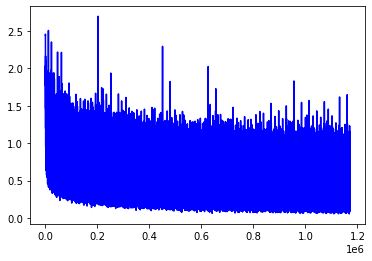

In [35]:
modeloDois = RedeNeuralModeloDois()

runnerDoisCrossSGDBatch = RedeNeuralRunner(modeloDois,
                                     X_train, y_train,
                                     40,0.00015,'CrossEntropyLoss','SGD','runnerDoisCrossSGDBatch',True)

runnerDoisCrossSGDBatch.train()

In [36]:
runnerDoisCrossSGDBatch.evaluate(X_test,y_test)

0.8658880919936951

In [37]:
runnerDoisCrossSGDBatch.export()

In [ ]:
###########
#
# Modelo 3
#
############

Last Epoch: 2999 Loss: 0.25118640065193176
GRÁFICO DA FUNÇÃO DE CUSTO


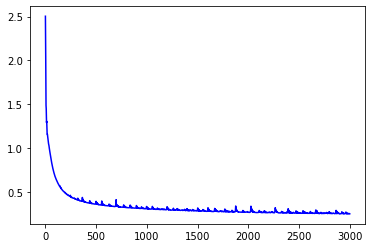

In [7]:
modeloTres = RedeNeuralModeloTres()

runnerTresCrossAdam = RedeNeuralRunner(modeloTres,
                                     X_train, y_train,
                                     3000,0.0015,'CrossEntropyLoss','Adam','runnerTresCrossAdam',False)

runnerTresCrossAdam.train()


In [8]:
runnerTresCrossAdam.evaluate(X_test,y_test)

0.9065026932589502

In [9]:
runnerTresCrossAdam.export()

Last Epoch: 2999 Loss: 0.2681378722190857
GRÁFICO DA FUNÇÃO DE CUSTO


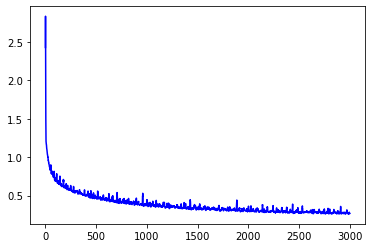

In [11]:
modeloTres = RedeNeuralModeloTres()

runnerTresCrossRMSprop = RedeNeuralRunner(modeloTres,
                                     X_train, y_train,
                                     3000,0.0015,'CrossEntropyLoss','RMSprop','runnerTresCrossRMSprop',False)

runnerTresCrossRMSprop.train()


In [12]:
runnerTresCrossRMSprop.evaluate(X_test,y_test)

0.8992238459139781

In [13]:
runnerTresCrossRMSprop.export()

Last Epoch: 2999 Loss: 0.7935694456100464
GRÁFICO DA FUNÇÃO DE CUSTO


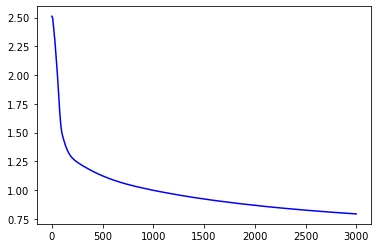

In [7]:
modeloTres = RedeNeuralModeloTres()

runnerTresCrossSGD = RedeNeuralRunner(modeloTres,
                                     X_train, y_train,
                                     3000,0.0015,'CrossEntropyLoss','SGD','runnerTresCrossSGD',False)

runnerTresCrossSGD.train()


In [8]:
runnerTresCrossSGD.evaluate(X_test,y_test)

0.7530446000264841

In [9]:
runnerTresCrossSGD.export()

Epoch: 39 Loss: 0.1822419911623001
Epoch: 39 Loss: 0.12687474489212036
Epoch: 39 Loss: 0.40812918543815613
Epoch: 39 Loss: 0.034968603402376175
Epoch: 39 Loss: 0.28547877073287964
Epoch: 39 Loss: 0.15806540846824646
Epoch: 39 Loss: 0.4026315212249756
Epoch: 39 Loss: 0.28916290402412415
Epoch: 39 Loss: 0.37201279401779175
Epoch: 39 Loss: 0.2267247885465622
Epoch: 39 Loss: 0.36048468947410583
Epoch: 39 Loss: 0.14833615720272064
Epoch: 39 Loss: 0.05973229929804802
Epoch: 39 Loss: 0.1734907180070877
Epoch: 39 Loss: 0.20728176832199097
Epoch: 39 Loss: 0.2771596312522888
Epoch: 39 Loss: 0.14587032794952393
Epoch: 39 Loss: 0.12981636822223663
Epoch: 39 Loss: 0.0723201259970665
Epoch: 39 Loss: 0.15229590237140656
Epoch: 39 Loss: 0.2957741916179657
Epoch: 39 Loss: 0.19720272719860077
Epoch: 39 Loss: 0.3054603040218353
Epoch: 39 Loss: 0.22443941235542297
Epoch: 39 Loss: 0.3357385993003845
Epoch: 39 Loss: 0.10975343734025955
Epoch: 39 Loss: 0.46243685483932495
Epoch: 39 Loss: 0.22089581191539764


Epoch: 39 Loss: 0.08182226121425629
Epoch: 39 Loss: 0.13484804332256317
Epoch: 39 Loss: 0.18365269899368286
Epoch: 39 Loss: 0.2351551353931427
Epoch: 39 Loss: 0.11793734133243561
Epoch: 39 Loss: 0.14704357087612152
Epoch: 39 Loss: 0.16699989140033722
Epoch: 39 Loss: 0.24434775114059448
Epoch: 39 Loss: 0.22872786223888397
Epoch: 39 Loss: 0.17837630212306976
Epoch: 39 Loss: 0.31641650199890137
Epoch: 39 Loss: 0.2551371455192566
Epoch: 39 Loss: 0.23256443440914154
Epoch: 39 Loss: 0.22594693303108215
Epoch: 39 Loss: 0.10579126328229904
Epoch: 39 Loss: 0.2033706158399582
Epoch: 39 Loss: 0.1970522701740265
Epoch: 39 Loss: 0.17817944288253784
Epoch: 39 Loss: 0.4838695228099823
Epoch: 39 Loss: 0.1609153151512146
Epoch: 39 Loss: 0.16701245307922363
Epoch: 39 Loss: 0.18617282807826996
Epoch: 39 Loss: 0.22524042427539825
Epoch: 39 Loss: 0.17807714641094208
Epoch: 39 Loss: 0.15289847552776337
Epoch: 39 Loss: 0.39840129017829895
Epoch: 39 Loss: 0.1839817762374878
Epoch: 39 Loss: 0.4338217079639435


Epoch: 39 Loss: 0.44488224387168884
Epoch: 39 Loss: 0.14271244406700134
Epoch: 39 Loss: 0.22901973128318787
Epoch: 39 Loss: 0.17211008071899414
Epoch: 39 Loss: 0.319997638463974
Epoch: 39 Loss: 0.2683880925178528
Epoch: 39 Loss: 0.05836650729179382
Epoch: 39 Loss: 0.10791190713644028
Epoch: 39 Loss: 0.2616499066352844
Epoch: 39 Loss: 0.2890560030937195
Epoch: 39 Loss: 0.24384145438671112
Epoch: 39 Loss: 0.14884471893310547
Epoch: 39 Loss: 0.28216424584388733
Epoch: 39 Loss: 0.1385630965232849
Epoch: 39 Loss: 0.31514525413513184
Epoch: 39 Loss: 0.3898293972015381
Epoch: 39 Loss: 0.06654702126979828
Epoch: 39 Loss: 0.15595422685146332
Epoch: 39 Loss: 0.19687563180923462
Epoch: 39 Loss: 0.14551666378974915
Epoch: 39 Loss: 0.08575572818517685
Epoch: 39 Loss: 0.3444939851760864
Epoch: 39 Loss: 0.10361362248659134
Epoch: 39 Loss: 0.46455278992652893
Epoch: 39 Loss: 0.11605388671159744
Epoch: 39 Loss: 0.26313602924346924
Epoch: 39 Loss: 0.1388312727212906
Epoch: 39 Loss: 0.45884969830513
Epoc

Epoch: 39 Loss: 0.5647249221801758
Epoch: 39 Loss: 0.13501325249671936
Epoch: 39 Loss: 0.13976813852787018
Epoch: 39 Loss: 0.1743275225162506
Epoch: 39 Loss: 0.1967652440071106
Epoch: 39 Loss: 0.1129378080368042
Epoch: 39 Loss: 0.14404484629631042
Epoch: 39 Loss: 0.17635631561279297
Epoch: 39 Loss: 0.13640634715557098
Epoch: 39 Loss: 0.15707658231258392
Epoch: 39 Loss: 0.13073685765266418
Epoch: 39 Loss: 0.31044289469718933
Epoch: 39 Loss: 0.17940372228622437
Epoch: 39 Loss: 0.11740179359912872
Epoch: 39 Loss: 0.399016797542572
Epoch: 39 Loss: 0.20975737273693085
Epoch: 39 Loss: 0.3478396534919739
Epoch: 39 Loss: 0.14705468714237213
Epoch: 39 Loss: 0.303493857383728
Epoch: 39 Loss: 0.19535177946090698
Epoch: 39 Loss: 0.13612070679664612
Epoch: 39 Loss: 0.055630553513765335
Epoch: 39 Loss: 0.2628558874130249
Epoch: 39 Loss: 0.1306212842464447
Epoch: 39 Loss: 0.4061853289604187
Epoch: 39 Loss: 0.43497076630592346
Epoch: 39 Loss: 0.2407079041004181
Epoch: 39 Loss: 0.31938210129737854
Epoc

Epoch: 39 Loss: 0.08582093566656113
Epoch: 39 Loss: 0.32359662652015686
Epoch: 39 Loss: 0.1507377326488495
Epoch: 39 Loss: 0.22730717062950134
Epoch: 39 Loss: 0.2409067153930664
Epoch: 39 Loss: 0.34490182995796204
Epoch: 39 Loss: 0.33468514680862427
Epoch: 39 Loss: 0.3902452886104584
Epoch: 39 Loss: 0.12795044481754303
Epoch: 39 Loss: 0.2527100443840027
Epoch: 39 Loss: 0.2665221393108368
Epoch: 39 Loss: 0.28204983472824097
Epoch: 39 Loss: 0.20154701173305511
Epoch: 39 Loss: 0.2026256024837494
Epoch: 39 Loss: 0.395740270614624
Epoch: 39 Loss: 0.3566386103630066
Epoch: 39 Loss: 0.3194707930088043
Epoch: 39 Loss: 0.38641178607940674
Epoch: 39 Loss: 0.18214482069015503
Epoch: 39 Loss: 0.35327640175819397
Epoch: 39 Loss: 0.3886690139770508
Epoch: 39 Loss: 0.20697207748889923
Epoch: 39 Loss: 0.19966258108615875
Epoch: 39 Loss: 0.1604861170053482
Epoch: 39 Loss: 0.276159405708313
Epoch: 39 Loss: 0.06372861564159393
Epoch: 39 Loss: 0.1491938680410385
Epoch: 39 Loss: 0.15181021392345428
Epoch: 

Epoch: 39 Loss: 0.11963246762752533
Epoch: 39 Loss: 0.37413105368614197
Epoch: 39 Loss: 0.19069698452949524
Epoch: 39 Loss: 0.10164932161569595
Epoch: 39 Loss: 0.07800159603357315
Epoch: 39 Loss: 0.11427041888237
Epoch: 39 Loss: 0.2568359375
Epoch: 39 Loss: 0.40553709864616394
Epoch: 39 Loss: 0.3133244812488556
Epoch: 39 Loss: 0.12823060154914856
Epoch: 39 Loss: 0.38907498121261597
Epoch: 39 Loss: 0.0682147964835167
Epoch: 39 Loss: 0.3785156309604645
Epoch: 39 Loss: 0.13076144456863403
Epoch: 39 Loss: 0.20442023873329163
Epoch: 39 Loss: 0.20666494965553284
Epoch: 39 Loss: 0.3413598835468292
Epoch: 39 Loss: 0.3331620693206787
Epoch: 39 Loss: 0.4219369888305664
Epoch: 39 Loss: 0.08874259889125824
Epoch: 39 Loss: 0.09698811173439026
Epoch: 39 Loss: 0.4768604040145874
Epoch: 39 Loss: 0.26324501633644104
Epoch: 39 Loss: 0.22475890815258026
Epoch: 39 Loss: 0.30836156010627747
Epoch: 39 Loss: 0.16645053029060364
Epoch: 39 Loss: 0.5637637376785278
Epoch: 39 Loss: 0.3108804523944855
Epoch: 39 L

Epoch: 39 Loss: 0.3460162878036499
Epoch: 39 Loss: 0.28266996145248413
Epoch: 39 Loss: 0.21471042931079865
Epoch: 39 Loss: 0.27090561389923096
Epoch: 39 Loss: 0.10401654243469238
Epoch: 39 Loss: 0.22938568890094757
Epoch: 39 Loss: 0.11533737182617188
Epoch: 39 Loss: 0.2723165452480316
Epoch: 39 Loss: 0.29056185483932495
Epoch: 39 Loss: 0.30228060483932495
Epoch: 39 Loss: 0.24236737191677094
Epoch: 39 Loss: 0.18453770875930786
Epoch: 39 Loss: 0.33649349212646484
Epoch: 39 Loss: 0.28587695956230164
Epoch: 39 Loss: 0.06763307750225067
Epoch: 39 Loss: 0.11900435388088226
Epoch: 39 Loss: 0.1353001892566681
Epoch: 39 Loss: 0.25624337792396545
Epoch: 39 Loss: 0.07290159165859222
Epoch: 39 Loss: 0.1940443515777588
Epoch: 39 Loss: 0.11755245178937912
Epoch: 39 Loss: 0.14554962515830994
Epoch: 39 Loss: 0.4077703356742859
Epoch: 39 Loss: 0.19996877014636993
Epoch: 39 Loss: 0.2619239091873169
Epoch: 39 Loss: 0.3358887732028961
Epoch: 39 Loss: 0.39088842272758484
Epoch: 39 Loss: 0.27241167426109314

Epoch: 39 Loss: 0.2710738182067871
Epoch: 39 Loss: 0.1938556730747223
Epoch: 39 Loss: 0.17090333998203278
Epoch: 39 Loss: 0.2047918289899826
Epoch: 39 Loss: 0.2699648141860962
Epoch: 39 Loss: 0.39438191056251526
Epoch: 39 Loss: 0.22956043481826782
Epoch: 39 Loss: 0.24547190964221954
Epoch: 39 Loss: 0.20604462921619415
Epoch: 39 Loss: 0.16562415659427643
Epoch: 39 Loss: 0.23223374783992767
Epoch: 39 Loss: 0.30175989866256714
Epoch: 39 Loss: 0.1775575876235962
Epoch: 39 Loss: 0.18906980752944946
Epoch: 39 Loss: 0.12279150635004044
Epoch: 39 Loss: 0.291990727186203
Epoch: 39 Loss: 0.20405343174934387
Epoch: 39 Loss: 0.14240261912345886
Epoch: 39 Loss: 0.18619011342525482
Epoch: 39 Loss: 0.2528776228427887
Epoch: 39 Loss: 0.11405307799577713
Epoch: 39 Loss: 0.19985029101371765
Epoch: 39 Loss: 0.11432449519634247
Epoch: 39 Loss: 0.1656576544046402
Epoch: 39 Loss: 0.27317699790000916
Epoch: 39 Loss: 0.12581443786621094
Epoch: 39 Loss: 0.16830052435398102
Epoch: 39 Loss: 0.4070313274860382
Ep

Epoch: 39 Loss: 0.3327484726905823
Epoch: 39 Loss: 0.06582427024841309
Epoch: 39 Loss: 0.25949230790138245
Epoch: 39 Loss: 0.16044767200946808
Epoch: 39 Loss: 0.20080919563770294
Epoch: 39 Loss: 0.2219865322113037
Epoch: 39 Loss: 0.09278780221939087
Epoch: 39 Loss: 0.1539829969406128
Epoch: 39 Loss: 0.2656559348106384
Epoch: 39 Loss: 0.14283832907676697
Epoch: 39 Loss: 0.41281354427337646
Epoch: 39 Loss: 0.2836097776889801
Epoch: 39 Loss: 0.03580542281270027
Epoch: 39 Loss: 0.31451278924942017
Epoch: 39 Loss: 0.14882193505764008
Epoch: 39 Loss: 0.3167417049407959
Epoch: 39 Loss: 0.13293860852718353
Epoch: 39 Loss: 0.11420824378728867
Epoch: 39 Loss: 0.369658887386322
Epoch: 39 Loss: 0.3669193387031555
Epoch: 39 Loss: 0.1215282455086708
Epoch: 39 Loss: 0.36330971121788025
Epoch: 39 Loss: 0.18742933869361877
Epoch: 39 Loss: 0.15354034304618835
Epoch: 39 Loss: 0.1467592716217041
Epoch: 39 Loss: 0.27427366375923157
Epoch: 39 Loss: 0.2047736942768097
Epoch: 39 Loss: 0.18923790752887726
Epoc

Epoch: 39 Loss: 0.15619567036628723
Epoch: 39 Loss: 0.1860596239566803
Epoch: 39 Loss: 0.09781837463378906
Epoch: 39 Loss: 0.1911204606294632
Epoch: 39 Loss: 0.1476484090089798
Epoch: 39 Loss: 0.258004754781723
Epoch: 39 Loss: 0.25137656927108765
Epoch: 39 Loss: 0.2616323232650757
Epoch: 39 Loss: 0.3712417781352997
Epoch: 39 Loss: 0.22800809144973755
Epoch: 39 Loss: 0.1147758960723877
Epoch: 39 Loss: 0.3796704113483429
Epoch: 39 Loss: 0.41346028447151184
Epoch: 39 Loss: 0.22120463848114014
Epoch: 39 Loss: 0.1821499615907669
Epoch: 39 Loss: 0.12472358345985413
Epoch: 39 Loss: 0.3565612733364105
Epoch: 39 Loss: 0.1566549837589264
Epoch: 39 Loss: 0.21889732778072357
Epoch: 39 Loss: 0.04445262253284454
Epoch: 39 Loss: 0.13041213154792786
Epoch: 39 Loss: 0.4238220453262329
Epoch: 39 Loss: 0.2790217995643616
Epoch: 39 Loss: 0.22286228835582733
Epoch: 39 Loss: 0.17552269995212555
Epoch: 39 Loss: 0.03931045904755592
Epoch: 39 Loss: 0.15634430944919586
Epoch: 39 Loss: 0.14171656966209412
Epoch:

Epoch: 39 Loss: 0.21871770918369293
Epoch: 39 Loss: 0.49035024642944336
Epoch: 39 Loss: 0.29446715116500854
Epoch: 39 Loss: 0.15271948277950287
Epoch: 39 Loss: 0.20992158353328705
Epoch: 39 Loss: 0.177626371383667
Epoch: 39 Loss: 0.24930498003959656
Epoch: 39 Loss: 0.14570362865924835
Epoch: 39 Loss: 0.13405729830265045
Epoch: 39 Loss: 0.24296562373638153
Epoch: 39 Loss: 0.06090609356760979
Epoch: 39 Loss: 0.2652694582939148
Epoch: 39 Loss: 0.14332371950149536
Epoch: 39 Loss: 0.14204458892345428
Epoch: 39 Loss: 0.35834863781929016
Epoch: 39 Loss: 0.08571338653564453
Epoch: 39 Loss: 0.2370501309633255
Epoch: 39 Loss: 0.34003251791000366
Epoch: 39 Loss: 0.22920697927474976
Epoch: 39 Loss: 0.20915503799915314
Epoch: 39 Loss: 0.2978403866291046
Epoch: 39 Loss: 0.15550968050956726
Epoch: 39 Loss: 0.13389359414577484
Epoch: 39 Loss: 0.4231405556201935
Epoch: 39 Loss: 0.1435224711894989
Epoch: 39 Loss: 0.20002645254135132
Epoch: 39 Loss: 0.12809613347053528
Epoch: 39 Loss: 0.13125574588775635

Epoch: 39 Loss: 0.25468188524246216
Epoch: 39 Loss: 0.42146924138069153
Epoch: 39 Loss: 0.22147874534130096
Epoch: 39 Loss: 0.20158086717128754
Epoch: 39 Loss: 0.2832818627357483
Epoch: 39 Loss: 0.19410543143749237
Epoch: 39 Loss: 0.26342859864234924
Epoch: 39 Loss: 0.10694275796413422
Epoch: 39 Loss: 0.14723318815231323
Epoch: 39 Loss: 0.14782306551933289
Epoch: 39 Loss: 0.1796390563249588
Epoch: 39 Loss: 0.10831702500581741
Epoch: 39 Loss: 0.171494722366333
Epoch: 39 Loss: 0.26814597845077515
Epoch: 39 Loss: 0.13659608364105225
Epoch: 39 Loss: 0.08176732808351517
Epoch: 39 Loss: 0.12215657532215118
Epoch: 39 Loss: 0.14067627489566803
Epoch: 39 Loss: 0.07556827366352081
Epoch: 39 Loss: 0.3272923231124878
Epoch: 39 Loss: 0.06470026075839996
Epoch: 39 Loss: 0.10033106803894043
Epoch: 39 Loss: 0.2449711263179779
Epoch: 39 Loss: 0.14539191126823425
Epoch: 39 Loss: 0.24900758266448975
Epoch: 39 Loss: 0.052288468927145004
Epoch: 39 Loss: 0.2181474268436432
Epoch: 39 Loss: 0.1516917645931244

Epoch: 39 Loss: 0.3522090017795563
Epoch: 39 Loss: 0.36747992038726807
Epoch: 39 Loss: 0.19175274670124054
Epoch: 39 Loss: 0.5020363926887512
Epoch: 39 Loss: 0.2066793143749237
Epoch: 39 Loss: 0.23991845548152924
Epoch: 39 Loss: 0.27834025025367737
Epoch: 39 Loss: 0.10314856469631195
Epoch: 39 Loss: 0.20366708934307098
Epoch: 39 Loss: 0.1801653355360031
Epoch: 39 Loss: 0.19145707786083221
Epoch: 39 Loss: 0.2345232516527176
Epoch: 39 Loss: 0.06547843664884567
Epoch: 39 Loss: 0.3208916485309601
Epoch: 39 Loss: 0.4653298556804657
Epoch: 39 Loss: 0.33292290568351746
Epoch: 39 Loss: 0.12808316946029663
Epoch: 39 Loss: 0.1272483468055725
Epoch: 39 Loss: 0.4704607129096985
Epoch: 39 Loss: 0.09970177710056305
Epoch: 39 Loss: 0.288301557302475
Epoch: 39 Loss: 0.34874024987220764
Epoch: 39 Loss: 0.22953437268733978
Epoch: 39 Loss: 0.1495293527841568
Epoch: 39 Loss: 0.07072135806083679
Epoch: 39 Loss: 0.1861424446105957
Epoch: 39 Loss: 0.055303897708654404
Epoch: 39 Loss: 0.18916894495487213
Epoc

Epoch: 39 Loss: 0.03430904448032379
Epoch: 39 Loss: 0.1504916250705719
Epoch: 39 Loss: 0.47334590554237366
Epoch: 39 Loss: 0.06192049756646156
Epoch: 39 Loss: 0.13305464386940002
Epoch: 39 Loss: 0.33129939436912537
Epoch: 39 Loss: 0.1374412477016449
Epoch: 39 Loss: 0.06310198456048965
Epoch: 39 Loss: 0.17007189989089966
Epoch: 39 Loss: 0.13427317142486572
Epoch: 39 Loss: 0.14336054027080536
Epoch: 39 Loss: 0.1364053636789322
Epoch: 39 Loss: 0.18389169871807098
Epoch: 39 Loss: 0.18867233395576477
Epoch: 39 Loss: 0.1523318737745285
Epoch: 39 Loss: 0.26963311433792114
Epoch: 39 Loss: 0.24711646139621735
Epoch: 39 Loss: 0.1988256722688675
Epoch: 39 Loss: 0.19258913397789001
Epoch: 39 Loss: 0.14731493592262268
Epoch: 39 Loss: 0.2270636409521103
Epoch: 39 Loss: 0.2864944338798523
Epoch: 39 Loss: 0.16011036932468414
Epoch: 39 Loss: 0.322774201631546
Epoch: 39 Loss: 0.18627256155014038
Epoch: 39 Loss: 0.3130096197128296
Epoch: 39 Loss: 0.18552175164222717
Epoch: 39 Loss: 0.204238161444664
Epoc

Epoch: 39 Loss: 0.41017282009124756
Epoch: 39 Loss: 0.20826329290866852
Epoch: 39 Loss: 0.18105779588222504
Epoch: 39 Loss: 0.20576149225234985
Epoch: 39 Loss: 0.09982143342494965
Epoch: 39 Loss: 0.39606350660324097
Epoch: 39 Loss: 0.2047777622938156
Epoch: 39 Loss: 0.06360413134098053
Epoch: 39 Loss: 0.304372638463974
Epoch: 39 Loss: 0.2241223007440567
Epoch: 39 Loss: 0.17977574467658997
Epoch: 39 Loss: 0.27517837285995483
Epoch: 39 Loss: 0.2246641218662262
Epoch: 39 Loss: 0.16785968840122223
Epoch: 39 Loss: 0.26643380522727966
Epoch: 39 Loss: 0.10957406461238861
Epoch: 39 Loss: 0.14949074387550354
Epoch: 39 Loss: 0.13104690611362457
Epoch: 39 Loss: 0.27980148792266846
Epoch: 39 Loss: 0.2013668417930603
Epoch: 39 Loss: 0.11544108390808105
Epoch: 39 Loss: 0.13807497918605804
Epoch: 39 Loss: 0.19801822304725647
Epoch: 39 Loss: 0.2141193449497223
Epoch: 39 Loss: 0.1028795838356018
Epoch: 39 Loss: 0.22815868258476257
Epoch: 39 Loss: 0.07915281504392624
Epoch: 39 Loss: 0.38174980878829956


Epoch: 39 Loss: 0.07444006204605103
Epoch: 39 Loss: 0.06319203972816467
Epoch: 39 Loss: 0.18681007623672485
Epoch: 39 Loss: 0.2894364595413208
Epoch: 39 Loss: 0.32602542638778687
Epoch: 39 Loss: 0.34192636609077454
Epoch: 39 Loss: 0.16454719007015228
Epoch: 39 Loss: 0.2332877814769745
Epoch: 39 Loss: 0.225075826048851
Epoch: 39 Loss: 0.26902616024017334
Epoch: 39 Loss: 0.08550342917442322
Epoch: 39 Loss: 0.22663742303848267
Epoch: 39 Loss: 0.32434019446372986
Epoch: 39 Loss: 0.2280004471540451
Epoch: 39 Loss: 0.2360175997018814
Epoch: 39 Loss: 0.24727416038513184
Epoch: 39 Loss: 0.3135719895362854
Epoch: 39 Loss: 0.2778341472148895
Epoch: 39 Loss: 0.11414670944213867
Epoch: 39 Loss: 0.5951066613197327
Epoch: 39 Loss: 0.367702841758728
Epoch: 39 Loss: 0.21905212104320526
Epoch: 39 Loss: 0.4794027507305145
Epoch: 39 Loss: 0.29062819480895996
Epoch: 39 Loss: 0.1603340208530426
Epoch: 39 Loss: 0.14698415994644165
Epoch: 39 Loss: 0.19047316908836365
Epoch: 39 Loss: 0.15129344165325165
Epoch

Epoch: 39 Loss: 0.24119791388511658
Epoch: 39 Loss: 0.17779900133609772
Epoch: 39 Loss: 0.10632866621017456
Epoch: 39 Loss: 0.15530700981616974
Epoch: 39 Loss: 0.49653729796409607
Epoch: 39 Loss: 0.09542373567819595
Epoch: 39 Loss: 0.1218525692820549
Epoch: 39 Loss: 0.43091246485710144
Epoch: 39 Loss: 0.12048108875751495
Epoch: 39 Loss: 0.18763232231140137
Epoch: 39 Loss: 0.2535492181777954
Epoch: 39 Loss: 0.06586169451475143
Epoch: 39 Loss: 0.11732876300811768
Epoch: 39 Loss: 0.2749386727809906
Epoch: 39 Loss: 0.2938823401927948
Epoch: 39 Loss: 0.23801623284816742
Epoch: 39 Loss: 0.14076025784015656
Epoch: 39 Loss: 0.3043738603591919
Epoch: 39 Loss: 0.3488883078098297
Epoch: 39 Loss: 0.14090511202812195
Epoch: 39 Loss: 0.1952226161956787
Epoch: 39 Loss: 0.09999365359544754
Epoch: 39 Loss: 0.3202173113822937
Epoch: 39 Loss: 0.1785871982574463
Epoch: 39 Loss: 0.14369094371795654
Epoch: 39 Loss: 0.02128135785460472
Epoch: 39 Loss: 0.1920684278011322
Epoch: 39 Loss: 0.15902112424373627
Ep

Epoch: 39 Loss: 0.1410900503396988
Epoch: 39 Loss: 0.2155928909778595
Epoch: 39 Loss: 0.18477694690227509
Epoch: 39 Loss: 0.26229429244995117
Epoch: 39 Loss: 0.1420329362154007
Epoch: 39 Loss: 0.2575961649417877
Epoch: 39 Loss: 0.1635483205318451
Epoch: 39 Loss: 0.17111484706401825
Epoch: 39 Loss: 0.344871461391449
Epoch: 39 Loss: 0.23870885372161865
Epoch: 39 Loss: 0.33972930908203125
Epoch: 39 Loss: 0.11822740733623505
Epoch: 39 Loss: 0.2742331922054291
Epoch: 39 Loss: 0.16411639750003815
Epoch: 39 Loss: 0.13271376490592957
Epoch: 39 Loss: 0.27231425046920776
Epoch: 39 Loss: 0.04895966872572899
Epoch: 39 Loss: 0.21620188653469086
Epoch: 39 Loss: 0.220594123005867
Epoch: 39 Loss: 0.2696208953857422
Epoch: 39 Loss: 0.26115962862968445
Epoch: 39 Loss: 0.2654503881931305
Epoch: 39 Loss: 0.15998484194278717
Epoch: 39 Loss: 0.15359251201152802
Epoch: 39 Loss: 0.24947227537631989
Epoch: 39 Loss: 0.24288326501846313
Epoch: 39 Loss: 0.42859750986099243
Epoch: 39 Loss: 0.09816370904445648
Epoc

Epoch: 39 Loss: 0.43150973320007324
Epoch: 39 Loss: 0.17888574302196503
Epoch: 39 Loss: 0.15791885554790497
Epoch: 39 Loss: 0.1590864062309265
Epoch: 39 Loss: 0.2463294267654419
Epoch: 39 Loss: 0.3218115568161011
Epoch: 39 Loss: 0.12224364280700684
Epoch: 39 Loss: 0.1992598921060562
Epoch: 39 Loss: 0.25670352578163147
Epoch: 39 Loss: 0.18198202550411224
Epoch: 39 Loss: 0.21383769810199738
Epoch: 39 Loss: 0.39703306555747986
Epoch: 39 Loss: 0.09223422408103943
Epoch: 39 Loss: 0.13074713945388794
Epoch: 39 Loss: 0.3233809471130371
Epoch: 39 Loss: 0.09258030354976654
Epoch: 39 Loss: 0.2768225073814392
Epoch: 39 Loss: 0.3382483124732971
Epoch: 39 Loss: 0.2562223970890045
Epoch: 39 Loss: 0.16649998724460602
Epoch: 39 Loss: 0.21830911934375763
Epoch: 39 Loss: 0.27997666597366333
Epoch: 39 Loss: 0.222760409116745
Epoch: 39 Loss: 0.0962148904800415
Epoch: 39 Loss: 0.24935409426689148
Epoch: 39 Loss: 0.2856404483318329
Epoch: 39 Loss: 0.07544723153114319
Epoch: 39 Loss: 0.16928377747535706
Epoc

Epoch: 39 Loss: 0.3056962192058563
Epoch: 39 Loss: 0.17401453852653503
Epoch: 39 Loss: 0.23348967730998993
Epoch: 39 Loss: 0.23985709249973297
Epoch: 39 Loss: 0.22740992903709412
Epoch: 39 Loss: 0.28621888160705566
Epoch: 39 Loss: 0.13085582852363586
Epoch: 39 Loss: 0.10771481692790985
Epoch: 39 Loss: 0.28468915820121765
Epoch: 39 Loss: 0.45928138494491577
Epoch: 39 Loss: 0.4138634502887726
Epoch: 39 Loss: 0.13973025977611542
Epoch: 39 Loss: 0.08676410466432571
Epoch: 39 Loss: 0.043780356645584106
Epoch: 39 Loss: 0.20272454619407654
Epoch: 39 Loss: 0.11655938625335693
Epoch: 39 Loss: 0.2998279631137848
Epoch: 39 Loss: 0.3123950660228729
Epoch: 39 Loss: 0.10693257302045822
Epoch: 39 Loss: 0.07862323522567749
Epoch: 39 Loss: 0.28048738837242126
Epoch: 39 Loss: 0.22774040699005127
Epoch: 39 Loss: 0.16752687096595764
Epoch: 39 Loss: 0.3271166980266571
Epoch: 39 Loss: 0.33282163739204407
Epoch: 39 Loss: 0.3016478717327118
Epoch: 39 Loss: 0.18030093610286713
Epoch: 39 Loss: 0.088172107934951

Epoch: 39 Loss: 0.36021509766578674
Epoch: 39 Loss: 0.16546832025051117
Epoch: 39 Loss: 0.6965199708938599
Epoch: 39 Loss: 0.1968400925397873
Epoch: 39 Loss: 0.29568400979042053
Epoch: 39 Loss: 0.4794626832008362
Epoch: 39 Loss: 0.6884061694145203
Epoch: 39 Loss: 0.2991785705089569
Epoch: 39 Loss: 0.22482512891292572
Epoch: 39 Loss: 0.24949920177459717
Epoch: 39 Loss: 0.3735800087451935
Epoch: 39 Loss: 0.11103636026382446
Epoch: 39 Loss: 0.4574112296104431
Epoch: 39 Loss: 0.6571484804153442
Epoch: 39 Loss: 0.3368277847766876
Epoch: 39 Loss: 0.16562055051326752
Epoch: 39 Loss: 0.18337208032608032
Epoch: 39 Loss: 0.14336326718330383
Epoch: 39 Loss: 0.15130245685577393
Epoch: 39 Loss: 0.2138916254043579
Epoch: 39 Loss: 0.16461262106895447
Epoch: 39 Loss: 0.14801155030727386
Epoch: 39 Loss: 0.19717653095722198
Epoch: 39 Loss: 0.19031772017478943
Epoch: 39 Loss: 0.17532585561275482
Epoch: 39 Loss: 0.11150738596916199
Epoch: 39 Loss: 0.31817910075187683
Epoch: 39 Loss: 0.1106763556599617
Epo

Epoch: 39 Loss: 0.15586009621620178
Epoch: 39 Loss: 0.2517879605293274
Epoch: 39 Loss: 0.22451043128967285
Epoch: 39 Loss: 0.13376449048519135
Epoch: 39 Loss: 0.4324978291988373
Epoch: 39 Loss: 0.08628284931182861
Epoch: 39 Loss: 0.4466557800769806
Epoch: 39 Loss: 0.18122698366641998
Epoch: 39 Loss: 0.21130970120429993
Epoch: 39 Loss: 0.3798675537109375
Epoch: 39 Loss: 0.22187566757202148
Epoch: 39 Loss: 0.19495618343353271
Epoch: 39 Loss: 0.4167046844959259
Epoch: 39 Loss: 0.2692261338233948
Epoch: 39 Loss: 0.21994569897651672
Epoch: 39 Loss: 0.09835977852344513
Epoch: 39 Loss: 0.056726422160863876
Epoch: 39 Loss: 0.3082669675350189
Epoch: 39 Loss: 0.3296579420566559
Epoch: 39 Loss: 0.48923206329345703
Epoch: 39 Loss: 0.1648760586977005
Epoch: 39 Loss: 0.2798766791820526
Epoch: 39 Loss: 0.08377835154533386
Epoch: 39 Loss: 0.47900575399398804
Epoch: 39 Loss: 0.1853916496038437
Epoch: 39 Loss: 0.09105958789587021
Epoch: 39 Loss: 0.5724058747291565
Epoch: 39 Loss: 0.4453217685222626
Epoc

Epoch: 39 Loss: 0.26262128353118896
Epoch: 39 Loss: 0.15271995961666107
Epoch: 39 Loss: 0.15880414843559265
Epoch: 39 Loss: 0.24650388956069946
Epoch: 39 Loss: 0.23424440622329712
Epoch: 39 Loss: 0.3194591701030731
Epoch: 39 Loss: 0.26885730028152466
Epoch: 39 Loss: 0.09965387731790543
Epoch: 39 Loss: 0.1833740621805191
Epoch: 39 Loss: 0.22396953403949738
Epoch: 39 Loss: 0.1600850224494934
Epoch: 39 Loss: 0.3077046871185303
Epoch: 39 Loss: 0.4726501703262329
Epoch: 39 Loss: 0.12552987039089203
Epoch: 39 Loss: 0.30268019437789917
Epoch: 39 Loss: 0.07514713704586029
Epoch: 39 Loss: 0.2518778443336487
Epoch: 39 Loss: 0.16265346109867096
Epoch: 39 Loss: 0.30085787177085876
Epoch: 39 Loss: 0.10705733299255371
Epoch: 39 Loss: 0.10160575807094574
Epoch: 39 Loss: 0.2764318585395813
Epoch: 39 Loss: 0.23603345453739166
Epoch: 39 Loss: 0.20547223091125488
Epoch: 39 Loss: 0.33806177973747253
Epoch: 39 Loss: 0.1978493630886078
Epoch: 39 Loss: 0.17475172877311707
Epoch: 39 Loss: 0.15057873725891113


Epoch: 39 Loss: 0.18618811666965485
Epoch: 39 Loss: 0.13599328696727753
Epoch: 39 Loss: 0.23163387179374695
Epoch: 39 Loss: 0.39667296409606934
Epoch: 39 Loss: 0.2789860665798187
Epoch: 39 Loss: 0.18331056833267212
Epoch: 39 Loss: 0.323404461145401
Epoch: 39 Loss: 0.08049572259187698
Epoch: 39 Loss: 0.3747732937335968
Epoch: 39 Loss: 0.16173772513866425
Epoch: 39 Loss: 0.17427116632461548
Epoch: 39 Loss: 0.18317219614982605
Epoch: 39 Loss: 0.2535175383090973
Epoch: 39 Loss: 0.1354510486125946
Epoch: 39 Loss: 0.14189086854457855
Epoch: 39 Loss: 0.13274697959423065
Epoch: 39 Loss: 0.19616347551345825
Epoch: 39 Loss: 0.09908649325370789
Epoch: 39 Loss: 0.19706352055072784
Epoch: 39 Loss: 0.17023056745529175
Epoch: 39 Loss: 0.18674392998218536
Epoch: 39 Loss: 0.29690757393836975
Epoch: 39 Loss: 0.25693169236183167
Epoch: 39 Loss: 0.11286603659391403
Epoch: 39 Loss: 0.1764274537563324
Epoch: 39 Loss: 0.23878130316734314
Epoch: 39 Loss: 0.08637499809265137
Epoch: 39 Loss: 0.35155925154685974

Epoch: 39 Loss: 0.23316553235054016
Epoch: 39 Loss: 0.08525746315717697
Epoch: 39 Loss: 0.17888908088207245
Epoch: 39 Loss: 0.1042863056063652
Epoch: 39 Loss: 0.2470342069864273
Epoch: 39 Loss: 0.10807619243860245
Epoch: 39 Loss: 0.3357938826084137
Epoch: 39 Loss: 0.7199974060058594
Epoch: 39 Loss: 0.157310351729393
Epoch: 39 Loss: 0.36125701665878296
Epoch: 39 Loss: 0.3510345220565796
Epoch: 39 Loss: 0.21177765727043152
Epoch: 39 Loss: 0.3150550127029419
Epoch: 39 Loss: 0.11135093867778778
Epoch: 39 Loss: 0.22236360609531403
Epoch: 39 Loss: 0.3008110821247101
Epoch: 39 Loss: 0.25857147574424744
Epoch: 39 Loss: 0.16134175658226013
Epoch: 39 Loss: 0.09667181223630905
Epoch: 39 Loss: 0.1532973349094391
Epoch: 39 Loss: 0.18486984074115753
Epoch: 39 Loss: 0.27426227927207947
Epoch: 39 Loss: 0.2183057814836502
Epoch: 39 Loss: 0.21196965873241425
Epoch: 39 Loss: 0.24092532694339752
Epoch: 39 Loss: 0.19515708088874817
Epoch: 39 Loss: 0.33410730957984924
Epoch: 39 Loss: 0.15872885286808014
Epo

Epoch: 39 Loss: 0.22352883219718933
Epoch: 39 Loss: 0.30089515447616577
Epoch: 39 Loss: 0.36375391483306885
Epoch: 39 Loss: 0.16340430080890656
Epoch: 39 Loss: 0.34578603506088257
Epoch: 39 Loss: 0.10690183937549591
Epoch: 39 Loss: 0.10667800158262253
Epoch: 39 Loss: 0.26064345240592957
Epoch: 39 Loss: 0.12644463777542114
Epoch: 39 Loss: 0.19443844258785248
Epoch: 39 Loss: 0.3843511939048767
Epoch: 39 Loss: 0.14870961010456085
Epoch: 39 Loss: 0.12337462604045868
Epoch: 39 Loss: 0.24032580852508545
Epoch: 39 Loss: 0.2578847408294678
Epoch: 39 Loss: 0.4101373553276062
Epoch: 39 Loss: 0.14188110828399658
Epoch: 39 Loss: 0.15225078165531158
Epoch: 39 Loss: 0.5526340007781982
Epoch: 39 Loss: 0.14766518771648407
Epoch: 39 Loss: 0.2165462225675583
Epoch: 39 Loss: 0.19490671157836914
Epoch: 39 Loss: 0.19960620999336243
Epoch: 39 Loss: 0.16945601999759674
Epoch: 39 Loss: 0.32138657569885254
Epoch: 39 Loss: 0.2758252024650574
Epoch: 39 Loss: 0.24597656726837158
Epoch: 39 Loss: 0.2377176433801651

Epoch: 39 Loss: 0.4434676468372345
Epoch: 39 Loss: 0.20669710636138916
Epoch: 39 Loss: 0.33492568135261536
Epoch: 39 Loss: 0.13433896005153656
Epoch: 39 Loss: 0.09819009155035019
Epoch: 39 Loss: 0.3533467650413513
Epoch: 39 Loss: 0.0809364840388298
Epoch: 39 Loss: 0.15730266273021698
Epoch: 39 Loss: 0.33935225009918213
Epoch: 39 Loss: 0.39521506428718567
Epoch: 39 Loss: 0.42110010981559753
Epoch: 39 Loss: 0.386000394821167
Epoch: 39 Loss: 0.12178391218185425
Epoch: 39 Loss: 0.14320829510688782
Epoch: 39 Loss: 0.5861737132072449
Epoch: 39 Loss: 0.2094385027885437
Epoch: 39 Loss: 0.19956380128860474
Epoch: 39 Loss: 0.18777282536029816
Epoch: 39 Loss: 0.2686828672885895
Epoch: 39 Loss: 0.16431833803653717
Epoch: 39 Loss: 0.0871325433254242
Epoch: 39 Loss: 0.2364627867937088
Epoch: 39 Loss: 0.02705303207039833
Epoch: 39 Loss: 0.0368509441614151
Epoch: 39 Loss: 0.19983366131782532
Epoch: 39 Loss: 0.18708421289920807
Epoch: 39 Loss: 0.24810217320919037
Epoch: 39 Loss: 0.18621087074279785
Epo

Epoch: 39 Loss: 0.08328607678413391
Epoch: 39 Loss: 0.24634194374084473
Epoch: 39 Loss: 0.0857587680220604
Epoch: 39 Loss: 0.26700907945632935
Epoch: 39 Loss: 0.28071871399879456
Epoch: 39 Loss: 0.49194884300231934
Epoch: 39 Loss: 0.2225741595029831
Epoch: 39 Loss: 0.15335479378700256
Epoch: 39 Loss: 0.1258878856897354
Epoch: 39 Loss: 0.2993885576725006
Epoch: 39 Loss: 0.21673732995986938
Epoch: 39 Loss: 0.2863692045211792
Epoch: 39 Loss: 0.16902606189250946
Epoch: 39 Loss: 0.19913527369499207
Epoch: 39 Loss: 0.08199488371610641
Epoch: 39 Loss: 0.2229069173336029
Epoch: 39 Loss: 0.09223653376102448
Epoch: 39 Loss: 0.11577588319778442
Epoch: 39 Loss: 0.29053589701652527
Epoch: 39 Loss: 0.3003842234611511
Epoch: 39 Loss: 0.3416185677051544
Epoch: 39 Loss: 0.3133416771888733
Epoch: 39 Loss: 0.1528455913066864
Epoch: 39 Loss: 0.1918412446975708
Epoch: 39 Loss: 0.13882537186145782
Epoch: 39 Loss: 0.14768177270889282
Epoch: 39 Loss: 0.4745059013366699
Epoch: 39 Loss: 0.17158561944961548
Epoc

Epoch: 39 Loss: 0.13360148668289185
Epoch: 39 Loss: 0.22063545882701874
Epoch: 39 Loss: 0.12708160281181335
Epoch: 39 Loss: 0.4041632115840912
Epoch: 39 Loss: 0.26789551973342896
Epoch: 39 Loss: 0.15438689291477203
Epoch: 39 Loss: 0.43781358003616333
Epoch: 39 Loss: 0.16869832575321198
Epoch: 39 Loss: 0.45753365755081177
Epoch: 39 Loss: 0.1446630209684372
Epoch: 39 Loss: 0.2066877782344818
Epoch: 39 Loss: 0.13736942410469055
Epoch: 39 Loss: 0.14267638325691223
Epoch: 39 Loss: 0.15486164391040802
Epoch: 39 Loss: 0.24323025345802307
Epoch: 39 Loss: 0.31484779715538025
Epoch: 39 Loss: 0.32008716464042664
Epoch: 39 Loss: 0.45970049500465393
Epoch: 39 Loss: 0.14715085923671722
Epoch: 39 Loss: 0.6372528672218323
Epoch: 39 Loss: 0.22522121667861938
Epoch: 39 Loss: 0.20154251158237457
Epoch: 39 Loss: 0.18957044184207916
Epoch: 39 Loss: 0.2664405107498169
Epoch: 39 Loss: 0.11869127303361893
Epoch: 39 Loss: 0.14897650480270386
Epoch: 39 Loss: 0.3547077775001526
Epoch: 39 Loss: 0.1662197858095169

Epoch: 39 Loss: 0.23515701293945312
Epoch: 39 Loss: 0.3220751881599426
Epoch: 39 Loss: 0.43491894006729126
Epoch: 39 Loss: 0.6480833888053894
Epoch: 39 Loss: 0.3345237672328949
Epoch: 39 Loss: 0.2611088454723358
Epoch: 39 Loss: 0.07279713451862335
Epoch: 39 Loss: 0.22402289509773254
Epoch: 39 Loss: 0.20924164354801178
Epoch: 39 Loss: 0.49956464767456055
Epoch: 39 Loss: 0.29798486828804016
Epoch: 39 Loss: 0.25465500354766846
Epoch: 39 Loss: 0.2605568468570709
Epoch: 39 Loss: 0.30371347069740295
Epoch: 39 Loss: 0.1772346794605255
Epoch: 39 Loss: 0.16392038762569427
Epoch: 39 Loss: 0.304842472076416
Epoch: 39 Loss: 0.09671833366155624
Epoch: 39 Loss: 0.2938932478427887
Epoch: 39 Loss: 0.1656051129102707
Epoch: 39 Loss: 0.16505438089370728
Epoch: 39 Loss: 0.2928636372089386
Epoch: 39 Loss: 0.23319034278392792
Epoch: 39 Loss: 0.1893167644739151
Epoch: 39 Loss: 0.10859750211238861
Epoch: 39 Loss: 0.2804098427295685
Epoch: 39 Loss: 0.24694494903087616
Epoch: 39 Loss: 0.13603337109088898
Epoch

Epoch: 39 Loss: 0.15588027238845825
Epoch: 39 Loss: 0.20859774947166443
Epoch: 39 Loss: 0.0566159226000309
Epoch: 39 Loss: 0.30427855253219604
Epoch: 39 Loss: 0.1438399851322174
Epoch: 39 Loss: 0.3679407238960266
Epoch: 39 Loss: 0.37027186155319214
Epoch: 39 Loss: 0.38603705167770386
Epoch: 39 Loss: 0.07172727584838867
Epoch: 39 Loss: 0.2352411299943924
Epoch: 39 Loss: 0.1418771892786026
Epoch: 39 Loss: 0.517382800579071
Epoch: 39 Loss: 0.2743896543979645
Epoch: 39 Loss: 0.15744759142398834
Epoch: 39 Loss: 0.2397758811712265
Epoch: 39 Loss: 0.2214636206626892
Epoch: 39 Loss: 0.06684819608926773
Epoch: 39 Loss: 0.32632115483283997
Epoch: 39 Loss: 0.3921717703342438
Epoch: 39 Loss: 0.1711364984512329
Epoch: 39 Loss: 0.16952800750732422
Epoch: 39 Loss: 0.20239505171775818
Epoch: 39 Loss: 0.30034351348876953
Epoch: 39 Loss: 0.11864966154098511
Epoch: 39 Loss: 0.2713618576526642
Epoch: 39 Loss: 0.20002083480358124
Epoch: 39 Loss: 0.12972071766853333
Epoch: 39 Loss: 0.13994701206684113
Epoch

Epoch: 39 Loss: 0.20133768022060394
Epoch: 39 Loss: 0.5398370623588562
Epoch: 39 Loss: 0.20770159363746643
Epoch: 39 Loss: 0.24294252693653107
Epoch: 39 Loss: 0.1899494230747223
Epoch: 39 Loss: 0.18850769102573395
Epoch: 39 Loss: 0.28692591190338135
Epoch: 39 Loss: 0.12696753442287445
Epoch: 39 Loss: 0.06862404942512512
Epoch: 39 Loss: 0.3509926199913025
Epoch: 39 Loss: 0.16185830533504486
Epoch: 39 Loss: 0.10720213502645493
Epoch: 39 Loss: 0.2357901632785797
Epoch: 39 Loss: 0.2472778707742691
Epoch: 39 Loss: 0.2690962553024292
Epoch: 39 Loss: 0.1657356470823288
Epoch: 39 Loss: 0.08115232735872269
Epoch: 39 Loss: 0.10891249030828476
Epoch: 39 Loss: 0.16184009611606598
Epoch: 39 Loss: 0.12743301689624786
Epoch: 39 Loss: 0.15793153643608093
Epoch: 39 Loss: 0.1893235445022583
Epoch: 39 Loss: 0.1200878769159317
Epoch: 39 Loss: 0.1590033769607544
Epoch: 39 Loss: 0.29087626934051514
Epoch: 39 Loss: 0.3171427547931671
Epoch: 39 Loss: 0.22551962733268738
Epoch: 39 Loss: 0.10560150444507599
Epo

Epoch: 39 Loss: 0.2455751597881317
Epoch: 39 Loss: 0.32612109184265137
Epoch: 39 Loss: 0.39044189453125
Epoch: 39 Loss: 0.21023619174957275
Epoch: 39 Loss: 0.27841466665267944
Epoch: 39 Loss: 0.07275734096765518
Epoch: 39 Loss: 0.08116155862808228
Epoch: 39 Loss: 0.10611344128847122
Epoch: 39 Loss: 0.29432764649391174
Epoch: 39 Loss: 0.08737558871507645
Epoch: 39 Loss: 0.17742827534675598
Epoch: 39 Loss: 0.3617500960826874
Epoch: 39 Loss: 0.11730969697237015
Epoch: 39 Loss: 0.07702426612377167
Epoch: 39 Loss: 0.16016344726085663
Epoch: 39 Loss: 0.22363191843032837
Epoch: 39 Loss: 0.3775058090686798
Epoch: 39 Loss: 0.288132905960083
Epoch: 39 Loss: 0.19706623256206512
Epoch: 39 Loss: 0.2702452838420868
Epoch: 39 Loss: 0.20396508276462555
Epoch: 39 Loss: 0.4129704236984253
Epoch: 39 Loss: 0.2147379070520401
Epoch: 39 Loss: 0.1649162471294403
Epoch: 39 Loss: 0.27880701422691345
Epoch: 39 Loss: 0.2421998232603073
Epoch: 39 Loss: 0.156135693192482
Epoch: 39 Loss: 0.19497831165790558
Epoch: 

Epoch: 39 Loss: 0.3523198962211609
Epoch: 39 Loss: 0.11740101128816605
Epoch: 39 Loss: 0.1671420931816101
Epoch: 39 Loss: 0.3098716735839844
Epoch: 39 Loss: 0.5365844368934631
Epoch: 39 Loss: 0.23190169036388397
Epoch: 39 Loss: 0.1861535608768463
Epoch: 39 Loss: 0.28941676020622253
Epoch: 39 Loss: 0.20127427577972412
Epoch: 39 Loss: 0.09343321621417999
Epoch: 39 Loss: 0.21982111036777496
Epoch: 39 Loss: 0.13148580491542816
Epoch: 39 Loss: 0.31739458441734314
Epoch: 39 Loss: 0.1493150293827057
Epoch: 39 Loss: 0.3376559913158417
Epoch: 39 Loss: 0.20965300500392914
Epoch: 39 Loss: 0.07751613855361938
Epoch: 39 Loss: 0.08654513210058212
Epoch: 39 Loss: 0.12072541564702988
Epoch: 39 Loss: 0.22341933846473694
Epoch: 39 Loss: 0.2628929615020752
Epoch: 39 Loss: 0.2607327103614807
Epoch: 39 Loss: 0.1870163530111313
Epoch: 39 Loss: 0.3606134057044983
Epoch: 39 Loss: 0.2668676972389221
Epoch: 39 Loss: 0.4446335434913635
Epoch: 39 Loss: 0.06562316417694092
Epoch: 39 Loss: 0.3781430721282959
Epoch:

Epoch: 39 Loss: 0.22316111624240875
Epoch: 39 Loss: 0.17364619672298431
Epoch: 39 Loss: 0.2401893436908722
Epoch: 39 Loss: 0.5087966322898865
Epoch: 39 Loss: 0.19103936851024628
Epoch: 39 Loss: 0.3241974711418152
Epoch: 39 Loss: 0.12157824635505676
Epoch: 39 Loss: 0.03648362308740616
Epoch: 39 Loss: 0.17877230048179626
Epoch: 39 Loss: 0.15171903371810913
Epoch: 39 Loss: 0.22322501242160797
Epoch: 39 Loss: 0.07556535303592682
Epoch: 39 Loss: 0.20827136933803558
Epoch: 39 Loss: 0.3203624486923218
Epoch: 39 Loss: 0.23136530816555023
Epoch: 39 Loss: 0.11976972967386246
Epoch: 39 Loss: 0.18685129284858704
Epoch: 39 Loss: 0.15214087069034576
Epoch: 39 Loss: 0.15783070027828217
Epoch: 39 Loss: 0.151638925075531
Epoch: 39 Loss: 0.37989237904548645
Epoch: 39 Loss: 0.5019136071205139
Epoch: 39 Loss: 0.34700867533683777
Epoch: 39 Loss: 0.20851516723632812
Epoch: 39 Loss: 0.09094727039337158
Epoch: 39 Loss: 0.15110991895198822
Epoch: 39 Loss: 0.24233509600162506
Epoch: 39 Loss: 0.12421568483114243

Epoch: 39 Loss: 0.23137277364730835
Epoch: 39 Loss: 0.11347921937704086
Epoch: 39 Loss: 0.14187560975551605
Epoch: 39 Loss: 0.06940396130084991
Epoch: 39 Loss: 0.5567172765731812
Epoch: 39 Loss: 0.1642555147409439
Epoch: 39 Loss: 0.20566309988498688
Epoch: 39 Loss: 0.16402900218963623
Epoch: 39 Loss: 0.12946216762065887
Epoch: 39 Loss: 0.09368090331554413
Epoch: 39 Loss: 0.132444828748703
Epoch: 39 Loss: 0.22322674095630646
Epoch: 39 Loss: 0.14307041466236115
Epoch: 39 Loss: 0.17676755785942078
Epoch: 39 Loss: 0.28382164239883423
Epoch: 39 Loss: 0.5236451625823975
Epoch: 39 Loss: 0.046664148569107056
Epoch: 39 Loss: 0.13571028411388397
Epoch: 39 Loss: 0.20592358708381653
Epoch: 39 Loss: 0.4556606113910675
Epoch: 39 Loss: 0.12508508563041687
Epoch: 39 Loss: 0.25414368510246277
Epoch: 39 Loss: 0.29637861251831055
Epoch: 39 Loss: 0.5113590359687805
Epoch: 39 Loss: 0.3615417182445526
Epoch: 39 Loss: 0.39647576212882996
Epoch: 39 Loss: 0.2366073727607727
Epoch: 39 Loss: 0.09353678673505783


Epoch: 39 Loss: 0.22539784014225006
Epoch: 39 Loss: 0.2550942897796631
Epoch: 39 Loss: 0.15507477521896362
Epoch: 39 Loss: 0.19293643534183502
Epoch: 39 Loss: 0.4441942572593689
Epoch: 39 Loss: 0.15759415924549103
Epoch: 39 Loss: 0.25057148933410645
Epoch: 39 Loss: 0.14695250988006592
Epoch: 39 Loss: 0.19270668923854828
Epoch: 39 Loss: 0.17443668842315674
Epoch: 39 Loss: 0.18434374034404755
Epoch: 39 Loss: 0.2635774314403534
Epoch: 39 Loss: 0.1293780505657196
Epoch: 39 Loss: 0.04623877629637718
Epoch: 39 Loss: 0.08521557599306107
Epoch: 39 Loss: 0.08205966651439667
Epoch: 39 Loss: 0.12656813859939575
Epoch: 39 Loss: 0.23419135808944702
Epoch: 39 Loss: 0.5524266958236694
Epoch: 39 Loss: 0.09153576195240021
Epoch: 39 Loss: 0.17880487442016602
Epoch: 39 Loss: 0.15923261642456055
Epoch: 39 Loss: 0.1567748785018921
Epoch: 39 Loss: 0.045423101633787155
Epoch: 39 Loss: 0.27714043855667114
Epoch: 39 Loss: 0.41004759073257446
Epoch: 39 Loss: 0.08353162556886673
Epoch: 39 Loss: 0.102808959782123

Epoch: 39 Loss: 0.31399038434028625
Epoch: 39 Loss: 0.22327008843421936
Epoch: 39 Loss: 0.22947584092617035
Epoch: 39 Loss: 0.17031161487102509
Epoch: 39 Loss: 0.08244936913251877
Epoch: 39 Loss: 0.1546788215637207
Epoch: 39 Loss: 0.12115252017974854
Epoch: 39 Loss: 0.22495679557323456
Epoch: 39 Loss: 0.13451045751571655
Epoch: 39 Loss: 0.2956562042236328
Epoch: 39 Loss: 0.3233277499675751
Epoch: 39 Loss: 0.24417679011821747
Epoch: 39 Loss: 0.2728799879550934
Epoch: 39 Loss: 0.26513242721557617
Epoch: 39 Loss: 0.2708638310432434
Epoch: 39 Loss: 0.3688857853412628
Epoch: 39 Loss: 0.3573884963989258
Epoch: 39 Loss: 0.15938527882099152
Epoch: 39 Loss: 0.10749456286430359
Epoch: 39 Loss: 0.18069249391555786
Epoch: 39 Loss: 0.37466198205947876
Epoch: 39 Loss: 0.10573927313089371
Epoch: 39 Loss: 0.10197491198778152
Epoch: 39 Loss: 0.0707322433590889
Epoch: 39 Loss: 0.3383505046367645
Epoch: 39 Loss: 0.08616317063570023
Epoch: 39 Loss: 0.6440033912658691
Epoch: 39 Loss: 0.4012349843978882
Epo

Epoch: 39 Loss: 0.16995945572853088
Epoch: 39 Loss: 0.06370474398136139
Epoch: 39 Loss: 0.6249157190322876
Epoch: 39 Loss: 0.09346940368413925
Epoch: 39 Loss: 0.19169995188713074
Epoch: 39 Loss: 0.08412680774927139
Epoch: 39 Loss: 0.1294042319059372
Epoch: 39 Loss: 0.10265205055475235
Epoch: 39 Loss: 0.27525386214256287
Epoch: 39 Loss: 0.45425131916999817
Epoch: 39 Loss: 0.20074261724948883
Epoch: 39 Loss: 0.22115570306777954
Epoch: 39 Loss: 0.34216564893722534
Epoch: 39 Loss: 0.2737734019756317
Epoch: 39 Loss: 0.08068384230136871
Epoch: 39 Loss: 0.42608481645584106
Epoch: 39 Loss: 0.26612845063209534
Epoch: 39 Loss: 0.10477638244628906
Epoch: 39 Loss: 0.08450914919376373
Epoch: 39 Loss: 0.09036264568567276
Epoch: 39 Loss: 0.3748524487018585
Epoch: 39 Loss: 0.3829076290130615
Epoch: 39 Loss: 0.24512812495231628
Epoch: 39 Loss: 0.08109848946332932
Epoch: 39 Loss: 0.3866412341594696
Epoch: 39 Loss: 0.2605447769165039
Epoch: 39 Loss: 0.21808305382728577
Epoch: 39 Loss: 0.5952081680297852


Epoch: 39 Loss: 0.4704664945602417
Epoch: 39 Loss: 0.11578154563903809
Epoch: 39 Loss: 0.15573538839817047
Epoch: 39 Loss: 0.32782331109046936
Epoch: 39 Loss: 0.5550464987754822
Epoch: 39 Loss: 0.2003224492073059
Epoch: 39 Loss: 0.30610159039497375
Epoch: 39 Loss: 0.2220534235239029
Epoch: 39 Loss: 0.3376903533935547
Epoch: 39 Loss: 0.12239351868629456
Epoch: 39 Loss: 0.183223694562912
Epoch: 39 Loss: 0.1521397978067398
Epoch: 39 Loss: 0.08454976975917816
Epoch: 39 Loss: 0.2928471863269806
Epoch: 39 Loss: 0.2676241397857666
Epoch: 39 Loss: 0.2636611759662628
Epoch: 39 Loss: 0.33059966564178467
Epoch: 39 Loss: 0.24372541904449463
Epoch: 39 Loss: 0.3315080404281616
Epoch: 39 Loss: 0.030597783625125885
Epoch: 39 Loss: 0.3125361204147339
Epoch: 39 Loss: 0.21625974774360657
Epoch: 39 Loss: 0.19657546281814575
Epoch: 39 Loss: 0.31680771708488464
Epoch: 39 Loss: 0.14029055833816528
Epoch: 39 Loss: 0.03376254811882973
Epoch: 39 Loss: 0.37140730023384094
Epoch: 39 Loss: 0.07349575310945511
Epoc

Epoch: 39 Loss: 0.13129839301109314
Epoch: 39 Loss: 0.347701758146286
Epoch: 39 Loss: 0.2047954648733139
Epoch: 39 Loss: 0.17380547523498535
Epoch: 39 Loss: 0.1242193952202797
Epoch: 39 Loss: 0.3867035508155823
Epoch: 39 Loss: 0.09983699023723602
Epoch: 39 Loss: 0.2666725218296051
Epoch: 39 Loss: 0.25170376896858215
Epoch: 39 Loss: 0.09752207249403
Epoch: 39 Loss: 0.18226157128810883
Epoch: 39 Loss: 0.3303128182888031
Epoch: 39 Loss: 0.1155468001961708
Epoch: 39 Loss: 0.16605591773986816
Epoch: 39 Loss: 0.16015885770320892
Epoch: 39 Loss: 0.2199801504611969
Epoch: 39 Loss: 0.06565061956644058
Epoch: 39 Loss: 0.08762086927890778
Epoch: 39 Loss: 0.20705005526542664
Epoch: 39 Loss: 0.22022606432437897
Epoch: 39 Loss: 0.2653091549873352
Epoch: 39 Loss: 0.28128334879875183
Epoch: 39 Loss: 0.10637006163597107
Epoch: 39 Loss: 0.18991197645664215
Epoch: 39 Loss: 0.2846229672431946
Epoch: 39 Loss: 0.20048457384109497
Epoch: 39 Loss: 0.15724849700927734
Epoch: 39 Loss: 0.41944894194602966
Epoch:

Epoch: 39 Loss: 0.3876460790634155
Epoch: 39 Loss: 0.449884831905365
Epoch: 39 Loss: 0.08840489387512207
Epoch: 39 Loss: 0.10756190121173859
Epoch: 39 Loss: 0.10863776504993439
Epoch: 39 Loss: 0.12481731921434402
Epoch: 39 Loss: 0.14243414998054504
Epoch: 39 Loss: 0.3700990378856659
Epoch: 39 Loss: 0.36804625391960144
Epoch: 39 Loss: 0.3688206076622009
Epoch: 39 Loss: 0.19092756509780884
Epoch: 39 Loss: 0.13201752305030823
Epoch: 39 Loss: 0.2769815921783447
Epoch: 39 Loss: 0.15586139261722565
Epoch: 39 Loss: 0.30512726306915283
Epoch: 39 Loss: 0.2795966863632202
Epoch: 39 Loss: 0.253298819065094
Epoch: 39 Loss: 0.16677363216876984
Epoch: 39 Loss: 0.12040157616138458
Epoch: 39 Loss: 0.39782533049583435
Epoch: 39 Loss: 0.15521056950092316
Epoch: 39 Loss: 0.2528188228607178
Epoch: 39 Loss: 0.2860042154788971
Epoch: 39 Loss: 0.3841545879840851
Epoch: 39 Loss: 0.15100331604480743
Epoch: 39 Loss: 0.2363625019788742
Epoch: 39 Loss: 0.07015234977006912
Epoch: 39 Loss: 0.2816128432750702
Epoch:

Epoch: 39 Loss: 0.10780155658721924
Epoch: 39 Loss: 0.12506702542304993
Epoch: 39 Loss: 0.10119654983282089
Epoch: 39 Loss: 0.143212229013443
Epoch: 39 Loss: 0.1668001115322113
Epoch: 39 Loss: 0.18317684531211853
Epoch: 39 Loss: 0.2101801037788391
Epoch: 39 Loss: 0.1938713937997818
Epoch: 39 Loss: 0.2992831766605377
Epoch: 39 Loss: 0.1442192792892456
Epoch: 39 Loss: 0.19306299090385437
Epoch: 39 Loss: 0.09081526100635529
Epoch: 39 Loss: 0.22409342229366302
Epoch: 39 Loss: 0.15637816488742828
Epoch: 39 Loss: 0.3249165713787079
Epoch: 39 Loss: 0.16938737034797668
Epoch: 39 Loss: 0.1857667863368988
Epoch: 39 Loss: 0.37942197918891907
Epoch: 39 Loss: 0.16847339272499084
Epoch: 39 Loss: 0.13363832235336304
Epoch: 39 Loss: 0.08574597537517548
Epoch: 39 Loss: 0.3024405539035797
Epoch: 39 Loss: 0.12385951727628708
Epoch: 39 Loss: 0.24373260140419006
Epoch: 39 Loss: 0.33392786979675293
Epoch: 39 Loss: 0.21992544829845428
Epoch: 39 Loss: 0.31042325496673584
Epoch: 39 Loss: 0.09774447977542877
Ep

Epoch: 39 Loss: 0.33174601197242737
Epoch: 39 Loss: 0.08931834995746613
Epoch: 39 Loss: 0.09327440708875656
Epoch: 39 Loss: 0.11610163748264313
Epoch: 39 Loss: 0.09662044793367386
Epoch: 39 Loss: 0.11043782532215118
Epoch: 39 Loss: 0.21699832379817963
Epoch: 39 Loss: 0.3475112318992615
Epoch: 39 Loss: 0.15949027240276337
Epoch: 39 Loss: 0.10982485115528107
Epoch: 39 Loss: 0.27879875898361206
Epoch: 39 Loss: 0.2526153326034546
Epoch: 39 Loss: 0.05254237353801727
Epoch: 39 Loss: 0.3345215916633606
Epoch: 39 Loss: 0.11055715382099152
Epoch: 39 Loss: 0.40117746591567993
Epoch: 39 Loss: 0.11137329787015915
Epoch: 39 Loss: 0.10055215656757355
Epoch: 39 Loss: 0.13403168320655823
Epoch: 39 Loss: 0.10045666992664337
Epoch: 39 Loss: 0.2326645404100418
Epoch: 39 Loss: 0.20563949644565582
Epoch: 39 Loss: 0.2102162092924118
Epoch: 39 Loss: 0.18007878959178925
Epoch: 39 Loss: 0.21437491476535797
Epoch: 39 Loss: 0.17791101336479187
Epoch: 39 Loss: 0.2954903542995453
Epoch: 39 Loss: 0.2687709331512451

Epoch: 39 Loss: 0.2534087002277374
Epoch: 39 Loss: 0.26756900548934937
Epoch: 39 Loss: 0.33137351274490356
Epoch: 39 Loss: 0.3070935308933258
Epoch: 39 Loss: 0.1985885202884674
Epoch: 39 Loss: 0.28378182649612427
Epoch: 39 Loss: 0.28113090991973877
Epoch: 39 Loss: 0.44291573762893677
Epoch: 39 Loss: 0.30658239126205444
Epoch: 39 Loss: 0.11143182218074799
Epoch: 39 Loss: 0.15740466117858887
Epoch: 39 Loss: 0.2752944231033325
Epoch: 39 Loss: 0.12365449219942093
Epoch: 39 Loss: 0.3970378637313843
Epoch: 39 Loss: 0.26357948780059814
Epoch: 39 Loss: 0.3310990035533905
Epoch: 39 Loss: 0.10654217004776001
Epoch: 39 Loss: 0.4258686602115631
Epoch: 39 Loss: 0.6185348629951477
Epoch: 39 Loss: 0.09444525092840195
Epoch: 39 Loss: 0.10330626368522644
Epoch: 39 Loss: 0.1364699900150299
Epoch: 39 Loss: 0.19361332058906555
Epoch: 39 Loss: 0.39441555738449097
Epoch: 39 Loss: 0.09408427774906158
Epoch: 39 Loss: 0.39396774768829346
Epoch: 39 Loss: 0.2205033302307129
Epoch: 39 Loss: 0.2621364891529083
Epo

Epoch: 39 Loss: 0.3605172634124756
Epoch: 39 Loss: 0.5397757291793823
Epoch: 39 Loss: 0.1801653355360031
Epoch: 39 Loss: 0.1372910439968109
Epoch: 39 Loss: 0.09484713524580002
Epoch: 39 Loss: 0.2430325597524643
Epoch: 39 Loss: 0.25086137652397156
Epoch: 39 Loss: 0.05691506713628769
Epoch: 39 Loss: 0.12954629957675934
Epoch: 39 Loss: 0.2444491684436798
Epoch: 39 Loss: 0.21382761001586914
Epoch: 39 Loss: 0.16436630487442017
Epoch: 39 Loss: 0.2966127097606659
Epoch: 39 Loss: 0.22791431844234467
Epoch: 39 Loss: 0.08734897524118423
Epoch: 39 Loss: 0.156023770570755
Epoch: 39 Loss: 0.11328291147947311
Epoch: 39 Loss: 0.08781450241804123
Epoch: 39 Loss: 0.12548178434371948
Epoch: 39 Loss: 0.302777498960495
Epoch: 39 Loss: 0.15944120287895203
Epoch: 39 Loss: 0.2901904881000519
Epoch: 39 Loss: 0.06642872095108032
Epoch: 39 Loss: 0.09088949859142303
Epoch: 39 Loss: 0.15729913115501404
Epoch: 39 Loss: 0.13206830620765686
Epoch: 39 Loss: 0.30172404646873474
Epoch: 39 Loss: 0.10010763257741928
Epoc

Epoch: 39 Loss: 0.37956398725509644
Epoch: 39 Loss: 0.14601892232894897
Epoch: 39 Loss: 0.33010759949684143
Epoch: 39 Loss: 0.28111445903778076
Epoch: 39 Loss: 0.2925502061843872
Epoch: 39 Loss: 0.13359299302101135
Epoch: 39 Loss: 0.10010692477226257
Epoch: 39 Loss: 0.2438274621963501
Epoch: 39 Loss: 0.12436673045158386
Epoch: 39 Loss: 0.4912589490413666
Epoch: 39 Loss: 0.20002804696559906
Epoch: 39 Loss: 0.41371217370033264
Epoch: 39 Loss: 0.15673722326755524
Epoch: 39 Loss: 0.19886305928230286
Epoch: 39 Loss: 0.17407338321208954
Epoch: 39 Loss: 0.16400855779647827
Epoch: 39 Loss: 0.04839609935879707
Epoch: 39 Loss: 0.14056964218616486
Epoch: 39 Loss: 0.1577073186635971
Epoch: 39 Loss: 0.2962264120578766
Epoch: 39 Loss: 0.07121057063341141
Epoch: 39 Loss: 0.35801756381988525
Epoch: 39 Loss: 0.2661803662776947
Epoch: 39 Loss: 0.22659528255462646
Epoch: 39 Loss: 0.05588194727897644
Epoch: 39 Loss: 0.10028065741062164
Epoch: 39 Loss: 0.14437761902809143
Epoch: 39 Loss: 0.3116871118545532

Epoch: 39 Loss: 0.18481244146823883
Epoch: 39 Loss: 0.5474823713302612
Epoch: 39 Loss: 0.3426873981952667
Epoch: 39 Loss: 0.45185813307762146
Epoch: 39 Loss: 0.3408403694629669
Epoch: 39 Loss: 0.2874382734298706
Epoch: 39 Loss: 0.08112488687038422
Epoch: 39 Loss: 0.13468708097934723
Epoch: 39 Loss: 0.32207682728767395
Epoch: 39 Loss: 0.12315358966588974
Epoch: 39 Loss: 0.30234065651893616
Epoch: 39 Loss: 0.19359399378299713
Epoch: 39 Loss: 0.209627166390419
Epoch: 39 Loss: 0.14792343974113464
Epoch: 39 Loss: 0.09402786940336227
Epoch: 39 Loss: 0.37141358852386475
Epoch: 39 Loss: 0.19826237857341766
Epoch: 39 Loss: 0.2839384973049164
Epoch: 39 Loss: 0.2463301718235016
Epoch: 39 Loss: 0.19841986894607544
Epoch: 39 Loss: 0.07547177374362946
Epoch: 39 Loss: 0.1216689944267273
Epoch: 39 Loss: 0.16782251000404358
Epoch: 39 Loss: 0.49702075123786926
Epoch: 39 Loss: 0.14569419622421265
Epoch: 39 Loss: 0.16496822237968445
Epoch: 39 Loss: 0.3958030641078949
Epoch: 39 Loss: 0.2994548976421356
Epo

Epoch: 39 Loss: 0.08142911642789841
Epoch: 39 Loss: 0.2756173014640808
Epoch: 39 Loss: 0.3441174626350403
Epoch: 39 Loss: 0.10974770039319992
Epoch: 39 Loss: 0.20713140070438385
Epoch: 39 Loss: 0.2187894880771637
Epoch: 39 Loss: 0.32965660095214844
Epoch: 39 Loss: 0.15575703978538513
Epoch: 39 Loss: 0.3354821503162384
Epoch: 39 Loss: 0.29809895157814026
Epoch: 39 Loss: 0.2930115759372711
Epoch: 39 Loss: 0.2893070876598358
Epoch: 39 Loss: 0.27961912751197815
Epoch: 39 Loss: 0.2300921231508255
Epoch: 39 Loss: 0.35252609848976135
Epoch: 39 Loss: 0.1822197586297989
Epoch: 39 Loss: 0.08740050345659256
Epoch: 39 Loss: 0.2096598595380783
Epoch: 39 Loss: 0.12425102293491364
Epoch: 39 Loss: 0.1420392394065857
Epoch: 39 Loss: 0.08563835173845291
Epoch: 39 Loss: 0.2500492334365845
Epoch: 39 Loss: 0.24684612452983856
Epoch: 39 Loss: 0.07675521075725555
Epoch: 39 Loss: 0.2102053463459015
Epoch: 39 Loss: 0.197313129901886
Epoch: 39 Loss: 0.2281895875930786
Epoch: 39 Loss: 0.2076970487833023
Epoch: 3

Epoch: 39 Loss: 0.21066752076148987
Epoch: 39 Loss: 0.07926709949970245
Epoch: 39 Loss: 0.3568485379219055
Epoch: 39 Loss: 0.22183716297149658
Epoch: 39 Loss: 0.3347071707248688
Epoch: 39 Loss: 0.1125526875257492
Epoch: 39 Loss: 0.2643950581550598
Epoch: 39 Loss: 0.2789750099182129
Epoch: 39 Loss: 0.10036743432283401
Epoch: 39 Loss: 0.28693637251853943
Epoch: 39 Loss: 0.3386496603488922
Epoch: 39 Loss: 0.2044609636068344
Epoch: 39 Loss: 0.09535083174705505
Epoch: 39 Loss: 0.14210094511508942
Epoch: 39 Loss: 0.14243212342262268
Epoch: 39 Loss: 0.06812827289104462
Epoch: 39 Loss: 0.05463671311736107
Epoch: 39 Loss: 0.3028009235858917
Epoch: 39 Loss: 0.5467807650566101
Epoch: 39 Loss: 0.2816246747970581
Epoch: 39 Loss: 0.22938430309295654
Epoch: 39 Loss: 0.11450628191232681
Epoch: 39 Loss: 0.13688451051712036
Epoch: 39 Loss: 0.23476262390613556
Epoch: 39 Loss: 0.16588284075260162
Epoch: 39 Loss: 0.2677537798881531
Epoch: 39 Loss: 0.04826747253537178
Epoch: 39 Loss: 0.3687551021575928
Epoc

Epoch: 39 Loss: 0.22565901279449463
Epoch: 39 Loss: 0.0778086706995964
Epoch: 39 Loss: 0.10877645760774612
Epoch: 39 Loss: 0.4621870517730713
Epoch: 39 Loss: 0.04939579218626022
Epoch: 39 Loss: 0.05853067710995674
Epoch: 39 Loss: 0.26991257071495056
Epoch: 39 Loss: 0.5278543829917908
Epoch: 39 Loss: 0.1548936814069748
Epoch: 39 Loss: 0.3561426103115082
Epoch: 39 Loss: 0.29940277338027954
Epoch: 39 Loss: 0.2786604166030884
Epoch: 39 Loss: 0.10374665260314941
Epoch: 39 Loss: 0.41098934412002563
Epoch: 39 Loss: 0.5217708945274353
Epoch: 39 Loss: 0.21345168352127075
Epoch: 39 Loss: 0.11504355072975159
Epoch: 39 Loss: 0.2154640108346939
Epoch: 39 Loss: 0.4807354807853699
Epoch: 39 Loss: 0.16600051522254944
Epoch: 39 Loss: 0.20212732255458832
Epoch: 39 Loss: 0.5618387460708618
Epoch: 39 Loss: 0.1826370358467102
Epoch: 39 Loss: 0.33399614691734314
Epoch: 39 Loss: 0.2023697793483734
Epoch: 39 Loss: 0.21151034533977509
Epoch: 39 Loss: 0.2703174352645874
Epoch: 39 Loss: 0.22166648507118225
Epoch

Epoch: 39 Loss: 0.17765125632286072
Epoch: 39 Loss: 0.3375091850757599
Epoch: 39 Loss: 0.18184223771095276
Epoch: 39 Loss: 0.3015475571155548
Epoch: 39 Loss: 0.11460617929697037
Epoch: 39 Loss: 0.23539268970489502
Epoch: 39 Loss: 0.11875636130571365
Epoch: 39 Loss: 0.31094738841056824
Epoch: 39 Loss: 0.13368220627307892
Epoch: 39 Loss: 0.2199551910161972
Epoch: 39 Loss: 0.16544131934642792
Epoch: 39 Loss: 0.3334324061870575
Epoch: 39 Loss: 0.4404476583003998
Epoch: 39 Loss: 0.6956971883773804
Epoch: 39 Loss: 0.1466594636440277
Epoch: 39 Loss: 0.38854363560676575
Epoch: 39 Loss: 0.21764063835144043
Epoch: 39 Loss: 0.30958476662635803
Epoch: 39 Loss: 0.17961843311786652
Epoch: 39 Loss: 0.07668450474739075
Epoch: 39 Loss: 0.42986762523651123
Epoch: 39 Loss: 0.15749900043010712
Epoch: 39 Loss: 0.2809961140155792
Epoch: 39 Loss: 0.3310374319553375
Epoch: 39 Loss: 0.07953662425279617
Epoch: 39 Loss: 0.1717403680086136
Epoch: 39 Loss: 0.3236388862133026
Epoch: 39 Loss: 0.1985062211751938
Epoc

Epoch: 39 Loss: 0.18487435579299927
Epoch: 39 Loss: 0.09129619598388672
Epoch: 39 Loss: 0.37824323773384094
Epoch: 39 Loss: 0.1292114406824112
Epoch: 39 Loss: 0.4588609039783478
Epoch: 39 Loss: 0.2745380401611328
Epoch: 39 Loss: 0.18369875848293304
Epoch: 39 Loss: 0.12454954534769058
Epoch: 39 Loss: 0.17450301349163055
Epoch: 39 Loss: 0.08240226656198502
Epoch: 39 Loss: 0.1769694685935974
Epoch: 39 Loss: 0.33973103761672974
Epoch: 39 Loss: 0.12399233132600784
Epoch: 39 Loss: 0.5250243544578552
Epoch: 39 Loss: 0.44766244292259216
Epoch: 39 Loss: 0.12327038496732712
Epoch: 39 Loss: 0.3256514370441437
Epoch: 39 Loss: 0.1557464748620987
Epoch: 39 Loss: 0.3281089961528778
Epoch: 39 Loss: 0.1125514805316925
Epoch: 39 Loss: 0.24323825538158417
Epoch: 39 Loss: 0.198128342628479
Epoch: 39 Loss: 0.06284653395414352
Epoch: 39 Loss: 0.1602177768945694
Epoch: 39 Loss: 0.4119667410850525
Epoch: 39 Loss: 0.10573048889636993
Epoch: 39 Loss: 0.0779680609703064
Epoch: 39 Loss: 0.17924000322818756
Epoch:

Epoch: 39 Loss: 0.18880364298820496
Epoch: 39 Loss: 0.2904224991798401
Epoch: 39 Loss: 0.11333554238080978
Epoch: 39 Loss: 0.08111689239740372
Epoch: 39 Loss: 0.39982715249061584
Epoch: 39 Loss: 0.22233466804027557
Epoch: 39 Loss: 0.2905014455318451
Epoch: 39 Loss: 0.14764495193958282
Epoch: 39 Loss: 0.1074606403708458
Epoch: 39 Loss: 0.15679894387722015
Epoch: 39 Loss: 0.18606449663639069
Epoch: 39 Loss: 0.25751036405563354
Epoch: 39 Loss: 0.1905565857887268
Epoch: 39 Loss: 0.23496170341968536
Epoch: 39 Loss: 0.08979256451129913
Epoch: 39 Loss: 0.21106617152690887
Epoch: 39 Loss: 0.28186938166618347
Epoch: 39 Loss: 0.1679416447877884
Epoch: 39 Loss: 0.4906616806983948
Epoch: 39 Loss: 0.07484062016010284
Epoch: 39 Loss: 0.17359502613544464
Epoch: 39 Loss: 0.10451718419790268
Epoch: 39 Loss: 0.21572691202163696
Epoch: 39 Loss: 0.6339794397354126
Epoch: 39 Loss: 0.1583942174911499
Epoch: 39 Loss: 0.36784544587135315
Epoch: 39 Loss: 0.26235249638557434
Epoch: 39 Loss: 0.16429375112056732


Epoch: 39 Loss: 0.2547420561313629
Epoch: 39 Loss: 0.35706961154937744
Epoch: 39 Loss: 0.203823983669281
Epoch: 39 Loss: 0.26846617460250854
Epoch: 39 Loss: 0.3344780206680298
Epoch: 39 Loss: 0.2371925413608551
Epoch: 39 Loss: 0.07393170893192291
Epoch: 39 Loss: 0.3462134003639221
Epoch: 39 Loss: 0.23690220713615417
Epoch: 39 Loss: 0.3740750551223755
Epoch: 39 Loss: 0.24536722898483276
Epoch: 39 Loss: 0.19046200811862946
Epoch: 39 Loss: 0.17409919202327728
Epoch: 39 Loss: 0.09714273363351822
Epoch: 39 Loss: 0.16866585612297058
Epoch: 39 Loss: 0.24488233029842377
Epoch: 39 Loss: 0.24445852637290955
Epoch: 39 Loss: 0.3106260895729065
Epoch: 39 Loss: 0.33145684003829956
Epoch: 39 Loss: 0.1796097457408905
Epoch: 39 Loss: 0.1182776391506195
Epoch: 39 Loss: 0.3309113383293152
Epoch: 39 Loss: 0.29267430305480957
Epoch: 39 Loss: 0.7190362811088562
Epoch: 39 Loss: 0.2975063621997833
Epoch: 39 Loss: 0.18887628614902496
Epoch: 39 Loss: 0.35859012603759766
Epoch: 39 Loss: 0.46782949566841125
Epoch

Epoch: 39 Loss: 0.318615585565567
Epoch: 39 Loss: 0.08547627925872803
Epoch: 39 Loss: 0.3682514429092407
Epoch: 39 Loss: 0.13269059360027313
Epoch: 39 Loss: 0.13792040944099426
Epoch: 39 Loss: 0.2220107913017273
Epoch: 39 Loss: 0.28411340713500977
Epoch: 39 Loss: 0.0663590356707573
Epoch: 39 Loss: 0.6232587099075317
Epoch: 39 Loss: 0.08021058142185211
Epoch: 39 Loss: 0.14706818759441376
Epoch: 39 Loss: 0.2027771770954132
Epoch: 39 Loss: 0.20327085256576538
Epoch: 39 Loss: 0.30296945571899414
Epoch: 39 Loss: 0.35531800985336304
Epoch: 39 Loss: 0.23882730305194855
Epoch: 39 Loss: 0.1684843897819519
Epoch: 39 Loss: 0.12118257582187653
Epoch: 39 Loss: 0.18491974472999573
Epoch: 39 Loss: 0.2972452640533447
Epoch: 39 Loss: 0.10566356033086777
Epoch: 39 Loss: 0.4240093529224396
Epoch: 39 Loss: 0.3934844434261322
Epoch: 39 Loss: 0.14397068321704865
Epoch: 39 Loss: 0.1989206075668335
Epoch: 39 Loss: 0.27481892704963684
Epoch: 39 Loss: 0.16775500774383545
Epoch: 39 Loss: 0.15873676538467407
Epoc

Epoch: 39 Loss: 0.15898562967777252
Epoch: 39 Loss: 0.2012365162372589
Epoch: 39 Loss: 0.20668728649616241
Epoch: 39 Loss: 0.1604371815919876
Epoch: 39 Loss: 0.08442387729883194
Epoch: 39 Loss: 0.16121819615364075
Epoch: 39 Loss: 0.1888129711151123
Epoch: 39 Loss: 0.12449727952480316
Epoch: 39 Loss: 0.27028942108154297
Epoch: 39 Loss: 0.2665645182132721
Epoch: 39 Loss: 0.24059203267097473
Epoch: 39 Loss: 0.13293001055717468
Epoch: 39 Loss: 0.1181211844086647
Epoch: 39 Loss: 0.0787457600235939
Epoch: 39 Loss: 0.3266029357910156
Epoch: 39 Loss: 0.25216418504714966
Epoch: 39 Loss: 0.1217304989695549
Epoch: 39 Loss: 0.16124354302883148
Epoch: 39 Loss: 0.27526575326919556
Epoch: 39 Loss: 0.17720068991184235
Epoch: 39 Loss: 0.32802140712738037
Epoch: 39 Loss: 0.1164424940943718
Epoch: 39 Loss: 0.26307550072669983
Epoch: 39 Loss: 0.4023580551147461
Epoch: 39 Loss: 0.3203272223472595
Epoch: 39 Loss: 0.25625020265579224
Epoch: 39 Loss: 0.356403112411499
Epoch: 39 Loss: 0.30943286418914795
Epoch

Epoch: 39 Loss: 0.2521142363548279
Epoch: 39 Loss: 0.21679028868675232
Epoch: 39 Loss: 0.24682393670082092
Epoch: 39 Loss: 0.05457914248108864
Epoch: 39 Loss: 0.16523084044456482
Epoch: 39 Loss: 0.03926070034503937
Epoch: 39 Loss: 0.21175530552864075
Epoch: 39 Loss: 0.23728571832180023
Epoch: 39 Loss: 0.23442615568637848
Epoch: 39 Loss: 0.1997569501399994
Epoch: 39 Loss: 0.12906982004642487
Epoch: 39 Loss: 0.18061412870883942
Epoch: 39 Loss: 0.42901182174682617
Epoch: 39 Loss: 0.38274306058883667
Epoch: 39 Loss: 0.27491772174835205
Epoch: 39 Loss: 0.2714611291885376
Epoch: 39 Loss: 0.2056158483028412
Epoch: 39 Loss: 0.25310733914375305
Epoch: 39 Loss: 0.16383114457130432
Epoch: 39 Loss: 0.11173523217439651
Epoch: 39 Loss: 0.31422796845436096
Epoch: 39 Loss: 0.21615299582481384
Epoch: 39 Loss: 0.07427330315113068
Epoch: 39 Loss: 0.09305065125226974
Epoch: 39 Loss: 0.27434852719306946
Epoch: 39 Loss: 0.2621363699436188
Epoch: 39 Loss: 0.14837077260017395
Epoch: 39 Loss: 0.105049021542072

Epoch: 39 Loss: 0.3061748147010803
Epoch: 39 Loss: 0.2975460886955261
Epoch: 39 Loss: 0.3336620032787323
Epoch: 39 Loss: 0.2804103195667267
Epoch: 39 Loss: 0.12267190963029861
Epoch: 39 Loss: 0.25327882170677185
Epoch: 39 Loss: 0.23555560410022736
Epoch: 39 Loss: 0.44034871459007263
Epoch: 39 Loss: 0.10784264653921127
Epoch: 39 Loss: 0.18645980954170227
Epoch: 39 Loss: 0.1525425910949707
Epoch: 39 Loss: 0.10095781087875366
Epoch: 39 Loss: 0.19919483363628387
Epoch: 39 Loss: 0.15946568548679352
Epoch: 39 Loss: 0.2675588130950928
Epoch: 39 Loss: 0.17646682262420654
Epoch: 39 Loss: 0.41747424006462097
Epoch: 39 Loss: 0.25496765971183777
Epoch: 39 Loss: 0.4948117136955261
Epoch: 39 Loss: 0.25896361470222473
Epoch: 39 Loss: 0.24788767099380493
Epoch: 39 Loss: 0.4690954387187958
Epoch: 39 Loss: 0.03841971978545189
Epoch: 39 Loss: 0.10448518395423889
Epoch: 39 Loss: 0.22601482272148132
Epoch: 39 Loss: 0.08232645690441132
Epoch: 39 Loss: 0.4057040512561798
Epoch: 39 Loss: 0.39946746826171875
E

Epoch: 39 Loss: 0.5478106141090393
Epoch: 39 Loss: 0.19438621401786804
Epoch: 39 Loss: 0.28733542561531067
Epoch: 39 Loss: 0.2845730483531952
Epoch: 39 Loss: 0.16876569390296936
Epoch: 39 Loss: 0.15244410932064056
Epoch: 39 Loss: 0.3458819091320038
Epoch: 39 Loss: 0.36788296699523926
Epoch: 39 Loss: 0.23224221169948578
Epoch: 39 Loss: 0.25274336338043213
Epoch: 39 Loss: 0.35156023502349854
Epoch: 39 Loss: 0.11193260550498962
Epoch: 39 Loss: 0.3856709897518158
Epoch: 39 Loss: 0.14638064801692963
Epoch: 39 Loss: 0.24902865290641785
Epoch: 39 Loss: 0.294899582862854
Epoch: 39 Loss: 0.323405921459198
Epoch: 39 Loss: 0.3093448579311371
Epoch: 39 Loss: 0.13976848125457764
Epoch: 39 Loss: 0.21224717795848846
Epoch: 39 Loss: 0.2555769383907318
Epoch: 39 Loss: 0.11349771171808243
Epoch: 39 Loss: 0.33491602540016174
Epoch: 39 Loss: 0.03630022704601288
Epoch: 39 Loss: 0.38822633028030396
Epoch: 39 Loss: 0.10792245715856552
Epoch: 39 Loss: 0.3934057950973511
Epoch: 39 Loss: 0.14803792536258698
Epo

Epoch: 39 Loss: 0.10495046526193619
Epoch: 39 Loss: 0.3549113869667053
Epoch: 39 Loss: 0.11294247955083847
Epoch: 39 Loss: 0.27778321504592896
Epoch: 39 Loss: 0.27363643050193787
Epoch: 39 Loss: 0.1810428649187088
Epoch: 39 Loss: 0.24342335760593414
Epoch: 39 Loss: 0.09894148260354996
Epoch: 39 Loss: 0.0410875603556633
Epoch: 39 Loss: 0.28690290451049805
Epoch: 39 Loss: 0.1662633717060089
Epoch: 39 Loss: 0.12136609107255936
Epoch: 39 Loss: 0.08537668734788895
Epoch: 39 Loss: 0.3428767919540405
Epoch: 39 Loss: 0.27852070331573486
Epoch: 39 Loss: 0.25989577174186707
Epoch: 39 Loss: 0.09115658700466156
Epoch: 39 Loss: 0.1811343878507614
Epoch: 39 Loss: 0.07842932641506195
Epoch: 39 Loss: 0.2847764790058136
Epoch: 39 Loss: 0.3215210437774658
Epoch: 39 Loss: 0.20127935707569122
Epoch: 39 Loss: 0.07039929926395416
Epoch: 39 Loss: 0.16195373237133026
Epoch: 39 Loss: 0.4036616086959839
Epoch: 39 Loss: 0.4369211196899414
Epoch: 39 Loss: 0.11477281898260117
Epoch: 39 Loss: 0.07671796530485153
Ep

Epoch: 39 Loss: 0.3013303577899933
Epoch: 39 Loss: 0.16301485896110535
Epoch: 39 Loss: 0.17314574122428894
Epoch: 39 Loss: 0.43802064657211304
Epoch: 39 Loss: 0.21078377962112427
Epoch: 39 Loss: 0.18281309306621552
Epoch: 39 Loss: 0.31633898615837097
Epoch: 39 Loss: 0.167921245098114
Epoch: 39 Loss: 0.3574209213256836
Epoch: 39 Loss: 0.2288484424352646
Epoch: 39 Loss: 0.3696810007095337
Epoch: 39 Loss: 0.29934024810791016
Epoch: 39 Loss: 0.16488274931907654
Epoch: 39 Loss: 0.4088190495967865
Epoch: 39 Loss: 0.11586541682481766
Epoch: 39 Loss: 0.10445818305015564
Epoch: 39 Loss: 0.4503594934940338
Epoch: 39 Loss: 0.256923109292984
Epoch: 39 Loss: 0.17177005112171173
Epoch: 39 Loss: 0.21698173880577087
Epoch: 39 Loss: 0.3024287819862366
Epoch: 39 Loss: 0.2191760241985321
Epoch: 39 Loss: 0.17261210083961487
Epoch: 39 Loss: 0.21365591883659363
Epoch: 39 Loss: 0.30089884996414185
Epoch: 39 Loss: 0.33375823497772217
Epoch: 39 Loss: 0.13793204724788666
Epoch: 39 Loss: 0.24435490369796753
Epoc

Epoch: 39 Loss: 0.44345054030418396
Epoch: 39 Loss: 0.1497078239917755
Epoch: 39 Loss: 0.19595934450626373
Epoch: 39 Loss: 0.42431774735450745
Epoch: 39 Loss: 0.1298714280128479
Epoch: 39 Loss: 0.4253772795200348
Epoch: 39 Loss: 0.25704529881477356
Epoch: 39 Loss: 0.14663654565811157
Epoch: 39 Loss: 0.136942520737648
Epoch: 39 Loss: 0.13017284870147705
Epoch: 39 Loss: 0.10032540559768677
Epoch: 39 Loss: 0.19786232709884644
Epoch: 39 Loss: 0.29274019598960876
Epoch: 39 Loss: 0.2944759130477905
Epoch: 39 Loss: 0.035140667110681534
Epoch: 39 Loss: 0.2349725365638733
Epoch: 39 Loss: 0.3202587962150574
Epoch: 39 Loss: 0.14145773649215698
Epoch: 39 Loss: 0.361851304769516
Epoch: 39 Loss: 0.19004619121551514
Epoch: 39 Loss: 0.11925539374351501
Epoch: 39 Loss: 0.02321600914001465
Epoch: 39 Loss: 0.16131921112537384
Epoch: 39 Loss: 0.1346960961818695
Epoch: 39 Loss: 0.24181950092315674
Epoch: 39 Loss: 0.10513944923877716
Epoch: 39 Loss: 0.5661554336547852
Epoch: 39 Loss: 0.10306544601917267
Epo

Epoch: 39 Loss: 0.18426470458507538
Epoch: 39 Loss: 0.3225692808628082
Epoch: 39 Loss: 0.2045699805021286
Epoch: 39 Loss: 0.1914505660533905
Epoch: 39 Loss: 0.18194326758384705
Epoch: 39 Loss: 0.08958557993173599
Epoch: 39 Loss: 0.18538278341293335
Epoch: 39 Loss: 0.18479028344154358
Epoch: 39 Loss: 0.22994820773601532
Epoch: 39 Loss: 0.28159472346305847
Epoch: 39 Loss: 0.23331095278263092
Epoch: 39 Loss: 0.08544601500034332
Epoch: 39 Loss: 0.3350335359573364
Epoch: 39 Loss: 0.0909072607755661
Epoch: 39 Loss: 0.437416672706604
Epoch: 39 Loss: 0.24672384560108185
Epoch: 39 Loss: 0.18220490217208862
Epoch: 39 Loss: 0.1871103197336197
Epoch: 39 Loss: 0.06028495356440544
Epoch: 39 Loss: 0.1755051612854004
Epoch: 39 Loss: 0.11697880923748016
Epoch: 39 Loss: 0.2340044528245926
Epoch: 39 Loss: 0.12697482109069824
Epoch: 39 Loss: 0.13562381267547607
Epoch: 39 Loss: 0.11086449027061462
Epoch: 39 Loss: 0.1606007069349289
Epoch: 39 Loss: 0.36898738145828247
Epoch: 39 Loss: 0.21496881544589996
Epo

Epoch: 39 Loss: 0.13782986998558044
Epoch: 39 Loss: 0.17150552570819855
Epoch: 39 Loss: 0.12643350660800934
Epoch: 39 Loss: 0.46418172121047974
Epoch: 39 Loss: 0.23710229992866516
Epoch: 39 Loss: 0.18891693651676178
Epoch: 39 Loss: 0.16112536191940308
Epoch: 39 Loss: 0.2947542667388916
Epoch: 39 Loss: 0.7940621376037598
Epoch: 39 Loss: 0.3863714337348938
Epoch: 39 Loss: 0.26569971442222595
Epoch: 39 Loss: 0.28576305508613586
Epoch: 39 Loss: 0.2527087926864624
Epoch: 39 Loss: 0.276103138923645
Epoch: 39 Loss: 0.2886542081832886
Epoch: 39 Loss: 0.330074280500412
Epoch: 39 Loss: 0.19986754655838013
Epoch: 39 Loss: 0.1269332766532898
Epoch: 39 Loss: 0.10176756978034973
Epoch: 39 Loss: 0.3252449929714203
Epoch: 39 Loss: 0.274297833442688
Epoch: 39 Loss: 0.08509998023509979
Epoch: 39 Loss: 0.287606805562973
Epoch: 39 Loss: 0.14652003347873688
Epoch: 39 Loss: 0.25273939967155457
Epoch: 39 Loss: 0.39360079169273376
Epoch: 39 Loss: 0.2715449929237366
Epoch: 39 Loss: 0.1034560576081276
Epoch: 39

Epoch: 39 Loss: 0.3490693271160126
Epoch: 39 Loss: 0.3922278881072998
Epoch: 39 Loss: 0.3702838718891144
Epoch: 39 Loss: 0.25702449679374695
Epoch: 39 Loss: 0.1869422346353531
Epoch: 39 Loss: 0.26760390400886536
Epoch: 39 Loss: 0.23100361227989197
Epoch: 39 Loss: 0.17503945529460907
Epoch: 39 Loss: 0.3628256916999817
Epoch: 39 Loss: 0.12522301077842712
Epoch: 39 Loss: 0.09399086982011795
Epoch: 39 Loss: 0.45848697423934937
Epoch: 39 Loss: 0.1104060634970665
Epoch: 39 Loss: 0.20632024109363556
Epoch: 39 Loss: 0.27325868606567383
Epoch: 39 Loss: 0.3416936993598938
Epoch: 39 Loss: 0.5000868439674377
Epoch: 39 Loss: 0.3404703438282013
Epoch: 39 Loss: 0.25520461797714233
Epoch: 39 Loss: 0.09429200738668442
Epoch: 39 Loss: 0.1381819099187851
Epoch: 39 Loss: 0.21299973130226135
Epoch: 39 Loss: 0.07850334793329239
Epoch: 39 Loss: 0.24860630929470062
Epoch: 39 Loss: 0.25161170959472656
Epoch: 39 Loss: 0.27693504095077515
Epoch: 39 Loss: 0.20297297835350037
Epoch: 39 Loss: 0.12143273651599884
Ep

Epoch: 39 Loss: 0.41732680797576904
Epoch: 39 Loss: 0.12349355965852737
Epoch: 39 Loss: 0.19859082996845245
Epoch: 39 Loss: 0.2503962218761444
Epoch: 39 Loss: 0.2949729859828949
Epoch: 39 Loss: 0.3222957253456116
Epoch: 39 Loss: 0.17968879640102386
Epoch: 39 Loss: 0.457358181476593
Epoch: 39 Loss: 0.32253867387771606
Epoch: 39 Loss: 0.23278439044952393
Epoch: 39 Loss: 0.06554862856864929
Epoch: 39 Loss: 0.21154911816120148
Epoch: 39 Loss: 0.10576218366622925
Epoch: 39 Loss: 0.1573420614004135
Epoch: 39 Loss: 0.25668030977249146
Epoch: 39 Loss: 0.24959546327590942
Epoch: 39 Loss: 0.05581486597657204
Epoch: 39 Loss: 0.04235600307583809
Epoch: 39 Loss: 0.24084532260894775
Epoch: 39 Loss: 0.19056110084056854
Epoch: 39 Loss: 0.22372040152549744
Epoch: 39 Loss: 0.23479531705379486
Epoch: 39 Loss: 0.1918894648551941
Epoch: 39 Loss: 0.10721238702535629
Epoch: 39 Loss: 0.5186464786529541
Epoch: 39 Loss: 0.3504104018211365
Epoch: 39 Loss: 0.14044564962387085
Epoch: 39 Loss: 0.07696179300546646
E

Epoch: 39 Loss: 0.2352408766746521
Epoch: 39 Loss: 0.08600912988185883
Epoch: 39 Loss: 0.07245925068855286
Epoch: 39 Loss: 0.12589597702026367
Epoch: 39 Loss: 0.23102641105651855
Epoch: 39 Loss: 0.23925840854644775
Epoch: 39 Loss: 0.3233432173728943
Epoch: 39 Loss: 0.17546820640563965
Epoch: 39 Loss: 0.28993189334869385
Epoch: 39 Loss: 0.3122915029525757
Epoch: 39 Loss: 0.31614118814468384
Epoch: 39 Loss: 0.18699629604816437
Epoch: 39 Loss: 0.11744104325771332
Epoch: 39 Loss: 0.08138645440340042
Epoch: 39 Loss: 0.09384791553020477
Epoch: 39 Loss: 0.27493298053741455
Epoch: 39 Loss: 0.17434388399124146
Epoch: 39 Loss: 0.3715916872024536
Epoch: 39 Loss: 0.3815319836139679
Epoch: 39 Loss: 0.08402567356824875
Epoch: 39 Loss: 0.20727527141571045
Epoch: 39 Loss: 0.14572052657604218
Epoch: 39 Loss: 0.0923495963215828
Epoch: 39 Loss: 0.06767220795154572
Epoch: 39 Loss: 0.21576964855194092
Epoch: 39 Loss: 0.18118594586849213
Epoch: 39 Loss: 0.11262170225381851
Epoch: 39 Loss: 0.2215851396322250

Epoch: 39 Loss: 0.33295854926109314
Epoch: 39 Loss: 0.3814372420310974
Epoch: 39 Loss: 0.19811934232711792
Epoch: 39 Loss: 0.3499357998371124
Epoch: 39 Loss: 0.2318580001592636
Epoch: 39 Loss: 0.21433784067630768
Epoch: 39 Loss: 0.45221734046936035
Epoch: 39 Loss: 0.2666475474834442
Epoch: 39 Loss: 0.1481340527534485
Epoch: 39 Loss: 0.10308489203453064
Epoch: 39 Loss: 0.1602073609828949
Epoch: 39 Loss: 0.26733237504959106
Epoch: 39 Loss: 0.2321701943874359
Epoch: 39 Loss: 0.0842975452542305
Epoch: 39 Loss: 0.1588594615459442
Epoch: 39 Loss: 0.24307049810886383
Epoch: 39 Loss: 0.15184266865253448
Epoch: 39 Loss: 0.1995568722486496
Epoch: 39 Loss: 0.17591586709022522
Epoch: 39 Loss: 0.17637309432029724
Epoch: 39 Loss: 0.2342168092727661
Epoch: 39 Loss: 0.13079695403575897
Epoch: 39 Loss: 0.11673972010612488
Epoch: 39 Loss: 0.10799802094697952
Epoch: 39 Loss: 0.2717505991458893
Epoch: 39 Loss: 0.28700941801071167
Epoch: 39 Loss: 0.27377811074256897
Epoch: 39 Loss: 0.3769308626651764
Epoch

Epoch: 39 Loss: 0.09942535310983658
Epoch: 39 Loss: 0.05073279142379761
Epoch: 39 Loss: 0.26352617144584656
Epoch: 39 Loss: 0.4392856955528259
Epoch: 39 Loss: 0.06315169483423233
Epoch: 39 Loss: 0.24606941640377045
Epoch: 39 Loss: 0.12644624710083008
Epoch: 39 Loss: 0.3146827816963196
Epoch: 39 Loss: 0.18513816595077515
Epoch: 39 Loss: 0.26007091999053955
Epoch: 39 Loss: 0.5036047697067261
Epoch: 39 Loss: 0.4358363151550293
Epoch: 39 Loss: 0.20593181252479553
Epoch: 39 Loss: 0.2781093418598175
Epoch: 39 Loss: 0.06159009411931038
Epoch: 39 Loss: 0.3643481135368347
Epoch: 39 Loss: 0.45595377683639526
Epoch: 39 Loss: 0.1125299334526062
Epoch: 39 Loss: 0.14753946661949158
Epoch: 39 Loss: 0.5162393450737
Epoch: 39 Loss: 0.2492312490940094
Epoch: 39 Loss: 0.176122784614563
Epoch: 39 Loss: 0.21769657731056213
Epoch: 39 Loss: 0.07818562537431717
Epoch: 39 Loss: 0.2189323902130127
Epoch: 39 Loss: 0.15792198479175568
Epoch: 39 Loss: 0.2869032621383667
Epoch: 39 Loss: 0.2558819651603699
Epoch: 39

Epoch: 39 Loss: 0.15985949337482452
Epoch: 39 Loss: 0.22159145772457123
Epoch: 39 Loss: 0.21353289484977722
Epoch: 39 Loss: 0.15051932632923126
Epoch: 39 Loss: 0.32417619228363037
Epoch: 39 Loss: 0.1517399251461029
Epoch: 39 Loss: 0.10908704996109009
Epoch: 39 Loss: 0.1089889332652092
Epoch: 39 Loss: 0.14995738863945007
Epoch: 39 Loss: 0.50196772813797
Epoch: 39 Loss: 0.1057751476764679
Epoch: 39 Loss: 0.48910948634147644
Epoch: 39 Loss: 0.4250778257846832
Epoch: 39 Loss: 0.36184659600257874
Epoch: 39 Loss: 0.2516816556453705
Epoch: 39 Loss: 0.2639719247817993
Epoch: 39 Loss: 0.381925106048584
Epoch: 39 Loss: 0.25697827339172363
Epoch: 39 Loss: 0.24899278581142426
Epoch: 39 Loss: 0.24273186922073364
Epoch: 39 Loss: 0.114128977060318
Epoch: 39 Loss: 0.15616396069526672
Epoch: 39 Loss: 0.040789857506752014
Epoch: 39 Loss: 0.20776070654392242
Epoch: 39 Loss: 0.1982765644788742
Epoch: 39 Loss: 0.18045812845230103
Epoch: 39 Loss: 0.2000783383846283
Epoch: 39 Loss: 0.32994744181632996
Epoch:

Epoch: 39 Loss: 0.2601928114891052
Epoch: 39 Loss: 0.31606870889663696
Epoch: 39 Loss: 0.2487608641386032
Epoch: 39 Loss: 0.13641506433486938
Epoch: 39 Loss: 0.27892282605171204
Epoch: 39 Loss: 0.37063348293304443
Epoch: 39 Loss: 0.18867409229278564
Epoch: 39 Loss: 0.43306389451026917
Epoch: 39 Loss: 0.07695770263671875
Epoch: 39 Loss: 0.42264631390571594
Epoch: 39 Loss: 0.38726094365119934
Epoch: 39 Loss: 0.1252288967370987
Epoch: 39 Loss: 0.3447323739528656
Epoch: 39 Loss: 0.21675348281860352
Epoch: 39 Loss: 0.24650970101356506
Epoch: 39 Loss: 0.32247811555862427
Epoch: 39 Loss: 0.33668479323387146
Epoch: 39 Loss: 0.29858487844467163
Epoch: 39 Loss: 0.15385419130325317
Epoch: 39 Loss: 0.28537020087242126
Epoch: 39 Loss: 0.16640198230743408
Epoch: 39 Loss: 0.2613567113876343
Epoch: 39 Loss: 0.06754128634929657
Epoch: 39 Loss: 0.16974729299545288
Epoch: 39 Loss: 0.2765948176383972
Epoch: 39 Loss: 0.1844547688961029
Epoch: 39 Loss: 0.25326240062713623
Epoch: 39 Loss: 0.1832885593175888


Epoch: 39 Loss: 0.17070931196212769
Epoch: 39 Loss: 0.14028705656528473
Epoch: 39 Loss: 0.11080227047204971
Epoch: 39 Loss: 0.0940897986292839
Epoch: 39 Loss: 0.17516730725765228
Epoch: 39 Loss: 0.0794929563999176
Epoch: 39 Loss: 0.16297872364521027
Epoch: 39 Loss: 0.09632424265146255
Epoch: 39 Loss: 0.46915382146835327
Epoch: 39 Loss: 0.17660412192344666
Epoch: 39 Loss: 0.11081956326961517
Epoch: 39 Loss: 0.07014405727386475
Epoch: 39 Loss: 0.20760883390903473
Epoch: 39 Loss: 0.07873580604791641
Epoch: 39 Loss: 0.2577765882015228
Epoch: 39 Loss: 0.5643827319145203
Epoch: 39 Loss: 0.12024903297424316
Epoch: 39 Loss: 0.3030950129032135
Epoch: 39 Loss: 0.407495379447937
Epoch: 39 Loss: 0.11883576214313507
Epoch: 39 Loss: 0.148733988404274
Epoch: 39 Loss: 0.22572799026966095
Epoch: 39 Loss: 0.250462144613266
Epoch: 39 Loss: 0.32263731956481934
Epoch: 39 Loss: 0.19334030151367188
Epoch: 39 Loss: 0.19096440076828003
Epoch: 39 Loss: 0.4476965367794037
Epoch: 39 Loss: 0.11558372527360916
Epoc

Epoch: 39 Loss: 0.13397188484668732
Epoch: 39 Loss: 0.14653609693050385
Epoch: 39 Loss: 0.4031451344490051
Epoch: 39 Loss: 0.13107052445411682
Epoch: 39 Loss: 0.2182253748178482
Epoch: 39 Loss: 0.20586158335208893
Epoch: 39 Loss: 0.23211748898029327
Epoch: 39 Loss: 0.20844796299934387
Epoch: 39 Loss: 0.47005918622016907
Epoch: 39 Loss: 0.10713797062635422
Epoch: 39 Loss: 0.07196176797151566
Epoch: 39 Loss: 0.23369614779949188
Epoch: 39 Loss: 0.1923523247241974
Epoch: 39 Loss: 0.10763131827116013
Epoch: 39 Loss: 0.35615745186805725
Epoch: 39 Loss: 0.1353801041841507
Epoch: 39 Loss: 0.18251104652881622
Epoch: 39 Loss: 0.42186179757118225
Epoch: 39 Loss: 0.11905445158481598
Epoch: 39 Loss: 0.26160261034965515
Epoch: 39 Loss: 0.34728679060935974
Epoch: 39 Loss: 0.21473979949951172
Epoch: 39 Loss: 0.7927385568618774
Epoch: 39 Loss: 0.43817466497421265
Epoch: 39 Loss: 0.2763040363788605
Epoch: 39 Loss: 0.18906372785568237
Epoch: 39 Loss: 0.2930186986923218
Epoch: 39 Loss: 0.2224915623664856


Epoch: 39 Loss: 0.15177351236343384
Epoch: 39 Loss: 0.2930443286895752
Epoch: 39 Loss: 0.19471700489521027
Epoch: 39 Loss: 0.3490475118160248
Epoch: 39 Loss: 0.254040002822876
Epoch: 39 Loss: 0.2471015900373459
Epoch: 39 Loss: 0.06829067319631577
Epoch: 39 Loss: 0.10018987208604813
Epoch: 39 Loss: 0.16775687038898468
Epoch: 39 Loss: 0.15204134583473206
Epoch: 39 Loss: 0.31084924936294556
Epoch: 39 Loss: 0.23253685235977173
Epoch: 39 Loss: 0.49007537961006165
Epoch: 39 Loss: 0.32344725728034973
Epoch: 39 Loss: 0.12428933382034302
Epoch: 39 Loss: 0.3993167281150818
Epoch: 39 Loss: 0.10773971676826477
Epoch: 39 Loss: 0.44772738218307495
Epoch: 39 Loss: 0.3360583186149597
Epoch: 39 Loss: 0.15236115455627441
Epoch: 39 Loss: 0.22644300758838654
Epoch: 39 Loss: 0.5329827666282654
Epoch: 39 Loss: 0.18921807408332825
Epoch: 39 Loss: 0.16823503375053406
Epoch: 39 Loss: 0.08156858384609222
Epoch: 39 Loss: 0.31368041038513184
Epoch: 39 Loss: 0.34328752756118774
Epoch: 39 Loss: 0.33725595474243164


Epoch: 39 Loss: 0.13940604031085968
Epoch: 39 Loss: 0.18327611684799194
Epoch: 39 Loss: 0.16221630573272705
Epoch: 39 Loss: 0.07767051458358765
Epoch: 39 Loss: 0.25450244545936584
Epoch: 39 Loss: 0.37552839517593384
Epoch: 39 Loss: 0.19824433326721191
Epoch: 39 Loss: 0.3066788613796234
Epoch: 39 Loss: 0.07112816721200943
Epoch: 39 Loss: 0.18239976465702057
Epoch: 39 Loss: 0.2373248040676117
Epoch: 39 Loss: 0.24313001334667206
Epoch: 39 Loss: 0.2570265531539917
Epoch: 39 Loss: 0.3102058470249176
Epoch: 39 Loss: 0.11486395448446274
Epoch: 39 Loss: 0.09246648102998734
Epoch: 39 Loss: 0.12859512865543365
Epoch: 39 Loss: 0.31123992800712585
Epoch: 39 Loss: 0.40441614389419556
Epoch: 39 Loss: 0.08677824586629868
Epoch: 39 Loss: 0.07458218932151794
Epoch: 39 Loss: 0.27811744809150696
Epoch: 39 Loss: 0.13599638640880585
Epoch: 39 Loss: 0.26023465394973755
Epoch: 39 Loss: 0.30297306180000305
Epoch: 39 Loss: 0.1310199797153473
Epoch: 39 Loss: 0.2726394832134247
Epoch: 39 Loss: 0.4519044756889343

Epoch: 39 Loss: 0.1347047984600067
Epoch: 39 Loss: 0.21493345499038696
Epoch: 39 Loss: 0.11870259046554565
Epoch: 39 Loss: 0.17525890469551086
Epoch: 39 Loss: 0.09503768384456635
Epoch: 39 Loss: 0.2413099855184555
Epoch: 39 Loss: 0.37332507967948914
Epoch: 39 Loss: 0.29319560527801514
Epoch: 39 Loss: 0.15154090523719788
Epoch: 39 Loss: 0.2304587960243225
Epoch: 39 Loss: 0.2530110478401184
Epoch: 39 Loss: 0.28120744228363037
Epoch: 39 Loss: 0.2309836745262146
Epoch: 39 Loss: 0.2689638137817383
Epoch: 39 Loss: 0.24065329134464264
Epoch: 39 Loss: 0.10679135471582413
Epoch: 39 Loss: 0.27984651923179626
Epoch: 39 Loss: 0.08992170542478561
Epoch: 39 Loss: 0.14355053007602692
Epoch: 39 Loss: 0.17337504029273987
Epoch: 39 Loss: 0.23847144842147827
Epoch: 39 Loss: 0.6373200416564941
Epoch: 39 Loss: 0.18922720849514008
Epoch: 39 Loss: 0.15921759605407715
Epoch: 39 Loss: 0.46114540100097656
Epoch: 39 Loss: 0.09455408900976181
Epoch: 39 Loss: 0.3961911201477051
Epoch: 39 Loss: 0.1841556429862976
E

Epoch: 39 Loss: 0.1361146718263626
Epoch: 39 Loss: 0.27456995844841003
Epoch: 39 Loss: 0.22906892001628876
Epoch: 39 Loss: 0.16871680319309235
Epoch: 39 Loss: 0.2923024296760559
Epoch: 39 Loss: 0.28687456250190735
Epoch: 39 Loss: 0.10142792761325836
Epoch: 39 Loss: 0.2945035994052887
Epoch: 39 Loss: 0.26271671056747437
Epoch: 39 Loss: 0.34590548276901245
Epoch: 39 Loss: 0.26818257570266724
Epoch: 39 Loss: 0.20048218965530396
Epoch: 39 Loss: 0.1267288774251938
Epoch: 39 Loss: 0.4007611870765686
Epoch: 39 Loss: 0.20257516205310822
Epoch: 39 Loss: 0.0959336906671524
Epoch: 39 Loss: 0.11697610467672348
Epoch: 39 Loss: 0.17076285183429718
Epoch: 39 Loss: 0.5369988679885864
Epoch: 39 Loss: 0.3590458631515503
Epoch: 39 Loss: 0.18286742269992828
Epoch: 39 Loss: 0.20556429028511047
Epoch: 39 Loss: 0.05918847769498825
Epoch: 39 Loss: 0.2376357465982437
Epoch: 39 Loss: 0.1762848198413849
Epoch: 39 Loss: 0.17941875755786896
Epoch: 39 Loss: 0.4714988172054291
Epoch: 39 Loss: 0.12935008108615875
Epo

Epoch: 39 Loss: 0.07741773873567581
Epoch: 39 Loss: 0.23851528763771057
Epoch: 39 Loss: 0.131341353058815
Epoch: 39 Loss: 0.15593603253364563
Epoch: 39 Loss: 0.24459566175937653
Epoch: 39 Loss: 0.0759955495595932
Epoch: 39 Loss: 0.18763823807239532
Epoch: 39 Loss: 0.19467470049858093
Epoch: 39 Loss: 0.5174546837806702
Epoch: 39 Loss: 0.27559894323349
Epoch: 39 Loss: 0.36396387219429016
Epoch: 39 Loss: 0.6079624891281128
Epoch: 39 Loss: 0.18419553339481354
Epoch: 39 Loss: 0.1167307049036026
Epoch: 39 Loss: 0.14179928600788116
Epoch: 39 Loss: 0.041345637291669846
Epoch: 39 Loss: 0.2606729567050934
Epoch: 39 Loss: 0.2609720230102539
Epoch: 39 Loss: 0.260858416557312
Epoch: 39 Loss: 0.11432428658008575
Epoch: 39 Loss: 0.0957130566239357
Epoch: 39 Loss: 0.13820745050907135
Epoch: 39 Loss: 0.18477898836135864
Epoch: 39 Loss: 0.16907364130020142
Epoch: 39 Loss: 0.38984736800193787
Epoch: 39 Loss: 0.20977115631103516
Epoch: 39 Loss: 0.2864569425582886
Epoch: 39 Loss: 0.14676132798194885
Epoch:

Epoch: 39 Loss: 0.15256176888942719
Epoch: 39 Loss: 0.11806394159793854
Epoch: 39 Loss: 0.14489762485027313
Epoch: 39 Loss: 0.19595390558242798
Epoch: 39 Loss: 0.4119124114513397
Epoch: 39 Loss: 0.14875246584415436
Epoch: 39 Loss: 0.6613308787345886
Epoch: 39 Loss: 0.15772223472595215
Epoch: 39 Loss: 0.2655930519104004
Epoch: 39 Loss: 0.16550388932228088
Epoch: 39 Loss: 0.2204502373933792
Epoch: 39 Loss: 0.20881132781505585
Epoch: 39 Loss: 0.3584173619747162
Epoch: 39 Loss: 0.23068399727344513
Epoch: 39 Loss: 0.3042503595352173
Epoch: 39 Loss: 0.2063366025686264
Epoch: 39 Loss: 0.10560669004917145
Epoch: 39 Loss: 0.5683112740516663
Epoch: 39 Loss: 0.12430480867624283
Epoch: 39 Loss: 0.2005813866853714
Epoch: 39 Loss: 0.31255802512168884
Epoch: 39 Loss: 0.25689759850502014
Epoch: 39 Loss: 0.18916791677474976
Epoch: 39 Loss: 0.18564042448997498
Epoch: 39 Loss: 0.13192029297351837
Epoch: 39 Loss: 0.07434402406215668
Epoch: 39 Loss: 0.06963539123535156
Epoch: 39 Loss: 0.08499252796173096
E

Epoch: 39 Loss: 0.13710227608680725
Epoch: 39 Loss: 0.44195762276649475
Epoch: 39 Loss: 0.4130866527557373
Epoch: 39 Loss: 0.25490233302116394
Epoch: 39 Loss: 0.185653418302536
Epoch: 39 Loss: 0.30946114659309387
Epoch: 39 Loss: 0.2967342436313629
Epoch: 39 Loss: 0.23410090804100037
Epoch: 39 Loss: 0.18407554924488068
Epoch: 39 Loss: 0.23935727775096893
Epoch: 39 Loss: 0.1758907586336136
Epoch: 39 Loss: 0.4462180435657501
Epoch: 39 Loss: 0.5132806897163391
Epoch: 39 Loss: 0.42209863662719727
Epoch: 39 Loss: 0.4117741584777832
Epoch: 39 Loss: 0.30776509642601013
Epoch: 39 Loss: 0.1739393025636673
Epoch: 39 Loss: 0.2175496369600296
Epoch: 39 Loss: 0.43521711230278015
Epoch: 39 Loss: 0.16033051908016205
Epoch: 39 Loss: 0.29167693853378296
Epoch: 39 Loss: 0.1292515993118286
Epoch: 39 Loss: 0.34827977418899536
Epoch: 39 Loss: 0.3730209469795227
Epoch: 39 Loss: 0.18787021934986115
Epoch: 39 Loss: 0.248495951294899
Epoch: 39 Loss: 0.1816413551568985
Epoch: 39 Loss: 0.29446348547935486
Epoch: 

Epoch: 39 Loss: 0.24220362305641174
Epoch: 39 Loss: 0.09828470647335052
Epoch: 39 Loss: 0.32999488711357117
Epoch: 39 Loss: 0.3180844187736511
Epoch: 39 Loss: 0.2991355061531067
Epoch: 39 Loss: 0.3121812343597412
Epoch: 39 Loss: 0.23070582747459412
Epoch: 39 Loss: 0.210520401597023
Epoch: 39 Loss: 0.11284676194190979
Epoch: 39 Loss: 0.06637489050626755
Epoch: 39 Loss: 0.11859887093305588
Epoch: 39 Loss: 0.3226146996021271
Epoch: 39 Loss: 0.16262739896774292
Epoch: 39 Loss: 0.23626653850078583
Epoch: 39 Loss: 0.20419985055923462
Epoch: 39 Loss: 0.07937376946210861
Epoch: 39 Loss: 0.21542470157146454
Epoch: 39 Loss: 0.27071425318717957
Epoch: 39 Loss: 0.3729104995727539
Epoch: 39 Loss: 0.04009704664349556
Epoch: 39 Loss: 0.20347802340984344
Epoch: 39 Loss: 0.14277946949005127
Epoch: 39 Loss: 0.21386797726154327
Epoch: 39 Loss: 0.23065578937530518
Epoch: 39 Loss: 0.09357046335935593
Epoch: 39 Loss: 0.3352315425872803
Epoch: 39 Loss: 0.3743799030780792
Epoch: 39 Loss: 0.23180505633354187
E

Epoch: 39 Loss: 0.319885790348053
Epoch: 39 Loss: 0.24227243661880493
Epoch: 39 Loss: 0.17560559511184692
Epoch: 39 Loss: 0.13532300293445587
Epoch: 39 Loss: 0.25357916951179504
Epoch: 39 Loss: 0.22951196134090424
Epoch: 39 Loss: 0.3920172154903412
Epoch: 39 Loss: 0.26209431886672974
Epoch: 39 Loss: 0.10316413640975952
Epoch: 39 Loss: 0.48703497648239136
Epoch: 39 Loss: 0.2114691585302353
Epoch: 39 Loss: 0.21768967807292938
Epoch: 39 Loss: 0.18949639797210693
Epoch: 39 Loss: 0.2437458634376526
Epoch: 39 Loss: 0.34940674901008606
Epoch: 39 Loss: 0.2272927314043045
Epoch: 39 Loss: 0.2206002175807953
Epoch: 39 Loss: 0.34621572494506836
Epoch: 39 Loss: 0.37776902318000793
Epoch: 39 Loss: 0.15640148520469666
Epoch: 39 Loss: 0.2496742159128189
Epoch: 39 Loss: 0.17993557453155518
Epoch: 39 Loss: 0.26681119203567505
Epoch: 39 Loss: 0.1866985410451889
Epoch: 39 Loss: 0.174650639295578
Epoch: 39 Loss: 0.2558605670928955
Epoch: 39 Loss: 0.31108206510543823
Epoch: 39 Loss: 0.19107358157634735
Epoc

Epoch: 39 Loss: 0.1363934576511383
Epoch: 39 Loss: 0.11088041216135025
Epoch: 39 Loss: 0.4677918255329132
Epoch: 39 Loss: 0.12171539664268494
Epoch: 39 Loss: 0.09479128569364548
Epoch: 39 Loss: 0.26917168498039246
Epoch: 39 Loss: 0.2050216943025589
Epoch: 39 Loss: 0.3378337621688843
Epoch: 39 Loss: 0.11100968718528748
Epoch: 39 Loss: 0.11544393002986908
Epoch: 39 Loss: 0.27919405698776245
Epoch: 39 Loss: 0.18010887503623962
Epoch: 39 Loss: 0.333690345287323
Epoch: 39 Loss: 0.1368022859096527
Epoch: 39 Loss: 0.171156108379364
Epoch: 39 Loss: 0.3210163712501526
Epoch: 39 Loss: 0.1378125548362732
Epoch: 39 Loss: 0.16454297304153442
Epoch: 39 Loss: 0.08043624460697174
Epoch: 39 Loss: 0.19831602275371552
Epoch: 39 Loss: 0.27265849709510803
Epoch: 39 Loss: 0.2377604842185974
Epoch: 39 Loss: 0.11579717695713043
Epoch: 39 Loss: 0.22780579328536987
Epoch: 39 Loss: 0.17437578737735748
Epoch: 39 Loss: 0.1651754528284073
Epoch: 39 Loss: 0.1315375119447708
Epoch: 39 Loss: 0.22986134886741638
Epoch:

Epoch: 39 Loss: 0.085487499833107
Epoch: 39 Loss: 0.16779181361198425
Epoch: 39 Loss: 0.17554019391536713
Epoch: 39 Loss: 0.17878931760787964
Epoch: 39 Loss: 0.40558522939682007
Epoch: 39 Loss: 0.09278461337089539
Epoch: 39 Loss: 0.15991388261318207
Epoch: 39 Loss: 0.21802403032779694
Epoch: 39 Loss: 0.4382643699645996
Epoch: 39 Loss: 0.10340714454650879
Epoch: 39 Loss: 0.29196473956108093
Epoch: 39 Loss: 0.4978119730949402
Epoch: 39 Loss: 0.3720322251319885
Epoch: 39 Loss: 0.22575634717941284
Epoch: 39 Loss: 0.09665749967098236
Epoch: 39 Loss: 0.2594565451145172
Epoch: 39 Loss: 0.09412526339292526
Epoch: 39 Loss: 0.049211591482162476
Epoch: 39 Loss: 0.32291921973228455
Epoch: 39 Loss: 0.4472143352031708
Epoch: 39 Loss: 0.13019275665283203
Epoch: 39 Loss: 0.29823431372642517
Epoch: 39 Loss: 0.08831007778644562
Epoch: 39 Loss: 0.1928359717130661
Epoch: 39 Loss: 0.15052150189876556
Epoch: 39 Loss: 0.11847665905952454
Epoch: 39 Loss: 0.14483389258384705
Epoch: 39 Loss: 0.23958756029605865

Epoch: 39 Loss: 0.15664957463741302
Epoch: 39 Loss: 0.580898642539978
Epoch: 39 Loss: 0.2681472897529602
Epoch: 39 Loss: 0.3208388686180115
Epoch: 39 Loss: 0.08705584704875946
Epoch: 39 Loss: 0.1265154629945755
Epoch: 39 Loss: 0.11800013482570648
Epoch: 39 Loss: 0.27043941617012024
Epoch: 39 Loss: 0.2631361782550812
Epoch: 39 Loss: 0.3559610843658447
Epoch: 39 Loss: 0.19501893222332
Epoch: 39 Loss: 0.40561094880104065
Epoch: 39 Loss: 0.1738007515668869
Epoch: 39 Loss: 0.4281412661075592
Epoch: 39 Loss: 0.3085855543613434
Epoch: 39 Loss: 0.13112272322177887
Epoch: 39 Loss: 0.2940780818462372
Epoch: 39 Loss: 0.2963654398918152
Epoch: 39 Loss: 0.18000686168670654
Epoch: 39 Loss: 0.32235756516456604
Epoch: 39 Loss: 0.2805531620979309
Epoch: 39 Loss: 0.4023537039756775
Epoch: 39 Loss: 0.20413032174110413
Epoch: 39 Loss: 0.0997372418642044
Epoch: 39 Loss: 0.06044901907444
Epoch: 39 Loss: 0.05527298524975777
Epoch: 39 Loss: 0.1518244594335556
Epoch: 39 Loss: 0.17663007974624634
Epoch: 39 Loss

Epoch: 39 Loss: 0.3163338005542755
Epoch: 39 Loss: 0.11351687461137772
Epoch: 39 Loss: 0.17161574959754944
Epoch: 39 Loss: 0.18213200569152832
Epoch: 39 Loss: 0.12702101469039917
Epoch: 39 Loss: 0.2248704433441162
Epoch: 39 Loss: 0.15452897548675537
Epoch: 39 Loss: 0.0693201944231987
Epoch: 39 Loss: 0.03567037731409073
Epoch: 39 Loss: 0.11608558148145676
Epoch: 39 Loss: 0.23775359988212585
Epoch: 39 Loss: 0.23514367640018463
Epoch: 39 Loss: 0.2525904178619385
Epoch: 39 Loss: 0.1011401042342186
Epoch: 39 Loss: 0.09184017777442932
Epoch: 39 Loss: 0.31337785720825195
Epoch: 39 Loss: 0.3861936330795288
Epoch: 39 Loss: 0.24497874081134796
Epoch: 39 Loss: 0.3340062201023102
Epoch: 39 Loss: 0.26841607689857483
Epoch: 39 Loss: 0.2143910527229309
Epoch: 39 Loss: 0.14987806975841522
Epoch: 39 Loss: 0.17053815722465515
Epoch: 39 Loss: 0.09482908993959427
Epoch: 39 Loss: 0.16432221233844757
Epoch: 39 Loss: 0.5465409159660339
Epoch: 39 Loss: 0.06403792649507523
Epoch: 39 Loss: 0.39017316699028015
E

Epoch: 39 Loss: 0.1150314062833786
Epoch: 39 Loss: 0.14127890765666962
Epoch: 39 Loss: 0.21381409466266632
Epoch: 39 Loss: 0.1145755797624588
Epoch: 39 Loss: 0.2632127106189728
Epoch: 39 Loss: 0.22469598054885864
Epoch: 39 Loss: 0.10273594409227371
Epoch: 39 Loss: 0.11079221963882446
Epoch: 39 Loss: 0.16502827405929565
Epoch: 39 Loss: 0.23037724196910858
Epoch: 39 Loss: 0.17749866843223572
Epoch: 39 Loss: 0.2675250172615051
Epoch: 39 Loss: 0.11378476023674011
Epoch: 39 Loss: 0.2834778130054474
Epoch: 39 Loss: 0.14132633805274963
Epoch: 39 Loss: 0.12140576541423798
Epoch: 39 Loss: 0.33051401376724243
Epoch: 39 Loss: 0.17115214467048645
Epoch: 39 Loss: 0.21946552395820618
Epoch: 39 Loss: 0.20420560240745544
Epoch: 39 Loss: 0.3233059048652649
Epoch: 39 Loss: 0.31053897738456726
Epoch: 39 Loss: 0.13366951048374176
Epoch: 39 Loss: 0.15632794797420502
Epoch: 39 Loss: 0.2598627507686615
Epoch: 39 Loss: 0.20891538262367249
Epoch: 39 Loss: 0.30874255299568176
Epoch: 39 Loss: 0.2956763803958893


Epoch: 39 Loss: 0.2596452534198761
Epoch: 39 Loss: 0.1540968120098114
Epoch: 39 Loss: 0.2638090252876282
Epoch: 39 Loss: 0.20218214392662048
Epoch: 39 Loss: 0.12334620952606201
Epoch: 39 Loss: 0.11355938017368317
Epoch: 39 Loss: 0.08288776874542236
Epoch: 39 Loss: 0.2967372536659241
Epoch: 39 Loss: 0.2751692235469818
Epoch: 39 Loss: 0.1778019815683365
Epoch: 39 Loss: 0.12629292905330658
Epoch: 39 Loss: 0.5635297894477844
Epoch: 39 Loss: 0.17380687594413757
Epoch: 39 Loss: 0.08953319489955902
Epoch: 39 Loss: 0.2400011420249939
Epoch: 39 Loss: 0.16206425428390503
Epoch: 39 Loss: 0.06111486628651619
Epoch: 39 Loss: 0.35752519965171814
Epoch: 39 Loss: 0.20839999616146088
Epoch: 39 Loss: 0.10423588007688522
Epoch: 39 Loss: 0.07467420399188995
Epoch: 39 Loss: 0.13450223207473755
Epoch: 39 Loss: 0.0902421697974205
Epoch: 39 Loss: 0.1278967708349228
Epoch: 39 Loss: 0.11265144497156143
Epoch: 39 Loss: 0.11011572927236557
Epoch: 39 Loss: 0.11124642193317413
Epoch: 39 Loss: 0.14218232035636902
Ep

Epoch: 39 Loss: 0.04654897376894951
Epoch: 39 Loss: 0.22548577189445496
Epoch: 39 Loss: 0.3769305646419525
Epoch: 39 Loss: 0.18538375198841095
Epoch: 39 Loss: 0.19964654743671417
Epoch: 39 Loss: 0.16992636024951935
Epoch: 39 Loss: 0.13214710354804993
Epoch: 39 Loss: 0.3681985139846802
Epoch: 39 Loss: 0.10270919650793076
Epoch: 39 Loss: 0.31149181723594666
Epoch: 39 Loss: 0.1742437183856964
Epoch: 39 Loss: 0.1304168403148651
Epoch: 39 Loss: 0.19635163247585297
Epoch: 39 Loss: 0.13235928118228912
Epoch: 39 Loss: 0.09055329859256744
Epoch: 39 Loss: 0.15458597242832184
Epoch: 39 Loss: 0.14890745282173157
Epoch: 39 Loss: 0.33179184794425964
Epoch: 39 Loss: 0.14398591220378876
Epoch: 39 Loss: 0.38122862577438354
Epoch: 39 Loss: 0.18549172580242157
Epoch: 39 Loss: 0.1137719377875328
Epoch: 39 Loss: 0.15352223813533783
Epoch: 39 Loss: 0.30593493580818176
Epoch: 39 Loss: 0.20608067512512207
Epoch: 39 Loss: 0.1532370150089264
Epoch: 39 Loss: 0.2808164358139038
Epoch: 39 Loss: 0.07861293107271194

Epoch: 39 Loss: 0.13852088153362274
Epoch: 39 Loss: 0.053977008908987045
Epoch: 39 Loss: 0.2384464293718338
Epoch: 39 Loss: 0.2796509265899658
Epoch: 39 Loss: 0.18729445338249207
Epoch: 39 Loss: 0.16681452095508575
Epoch: 39 Loss: 0.2087746262550354
Epoch: 39 Loss: 0.3023027181625366
Epoch: 39 Loss: 0.2935161292552948
Epoch: 39 Loss: 0.4429752826690674
Epoch: 39 Loss: 0.15317828953266144
Epoch: 39 Loss: 0.6006026864051819
Epoch: 39 Loss: 0.10966477543115616
Epoch: 39 Loss: 0.3421817421913147
Epoch: 39 Loss: 0.19674977660179138
Epoch: 39 Loss: 0.06472489982843399
Epoch: 39 Loss: 0.3482114374637604
Epoch: 39 Loss: 0.19386890530586243
Epoch: 39 Loss: 0.08646468818187714
Epoch: 39 Loss: 0.09293118119239807
Epoch: 39 Loss: 0.3271682858467102
Epoch: 39 Loss: 0.22975611686706543
Epoch: 39 Loss: 0.20820720493793488
Epoch: 39 Loss: 0.34636375308036804
Epoch: 39 Loss: 0.16025620698928833
Epoch: 39 Loss: 0.21934030950069427
Epoch: 39 Loss: 0.2117156684398651
Epoch: 39 Loss: 0.1602163463830948
Epo

Epoch: 39 Loss: 0.21166187524795532
Epoch: 39 Loss: 0.3117666244506836
Epoch: 39 Loss: 0.06205325946211815
Epoch: 39 Loss: 0.31351780891418457
Epoch: 39 Loss: 0.19065889716148376
Epoch: 39 Loss: 0.18891997635364532
Epoch: 39 Loss: 0.13673074543476105
Epoch: 39 Loss: 0.1673927754163742
Epoch: 39 Loss: 0.07772432267665863
Epoch: 39 Loss: 0.3125099241733551
Epoch: 39 Loss: 0.08911504596471786
Epoch: 39 Loss: 0.14892083406448364
Epoch: 39 Loss: 0.13138745725154877
Epoch: 39 Loss: 0.23838727176189423
Epoch: 39 Loss: 0.08216167241334915
Epoch: 39 Loss: 0.11095669120550156
Epoch: 39 Loss: 0.11791268736124039
Epoch: 39 Loss: 0.200531467795372
Epoch: 39 Loss: 0.09556116163730621
Epoch: 39 Loss: 0.11760126054286957
Epoch: 39 Loss: 0.04682182893157005
Epoch: 39 Loss: 0.20503342151641846
Epoch: 39 Loss: 0.3409123122692108
Epoch: 39 Loss: 0.21253718435764313
Epoch: 39 Loss: 0.3599760830402374
Epoch: 39 Loss: 0.42650148272514343
Epoch: 39 Loss: 0.24363721907138824
Epoch: 39 Loss: 0.4405233561992645


Epoch: 39 Loss: 0.13485169410705566
Epoch: 39 Loss: 0.1659177988767624
Epoch: 39 Loss: 0.24983154237270355
Epoch: 39 Loss: 0.07987669110298157
Epoch: 39 Loss: 0.3814868927001953
Epoch: 39 Loss: 0.1613394320011139
Epoch: 39 Loss: 0.12793594598770142
Epoch: 39 Loss: 0.20706138014793396
Epoch: 39 Loss: 0.1134817972779274
Epoch: 39 Loss: 0.37010496854782104
Epoch: 39 Loss: 0.3411780893802643
Epoch: 39 Loss: 0.32449620962142944
Epoch: 39 Loss: 0.20983189344406128
Epoch: 39 Loss: 0.18473555147647858
Epoch: 39 Loss: 0.05770958960056305
Epoch: 39 Loss: 0.22727370262145996
Epoch: 39 Loss: 0.27994978427886963
Epoch: 39 Loss: 0.1669989377260208
Epoch: 39 Loss: 0.12267475575208664
Epoch: 39 Loss: 0.24530160427093506
Epoch: 39 Loss: 0.3633325695991516
Epoch: 39 Loss: 0.13126444816589355
Epoch: 39 Loss: 0.16132625937461853
Epoch: 39 Loss: 0.19802460074424744
Epoch: 39 Loss: 0.024626508355140686
Epoch: 39 Loss: 0.29997801780700684
Epoch: 39 Loss: 0.05363869294524193
Epoch: 39 Loss: 0.0988208949565887

Epoch: 39 Loss: 0.415570467710495
Epoch: 39 Loss: 0.0634218230843544
Epoch: 39 Loss: 0.0343196839094162
Epoch: 39 Loss: 0.21016579866409302
Epoch: 39 Loss: 0.37342387437820435
Epoch: 39 Loss: 0.32590600848197937
Epoch: 39 Loss: 0.35384252667427063
Epoch: 39 Loss: 0.09616502374410629
Epoch: 39 Loss: 0.3376246690750122
Epoch: 39 Loss: 0.34469595551490784
Epoch: 39 Loss: 0.4680805504322052
Epoch: 39 Loss: 0.22563162446022034
Epoch: 39 Loss: 0.19687111675739288
Epoch: 39 Loss: 0.16023902595043182
Epoch: 39 Loss: 0.20836929976940155
Epoch: 39 Loss: 0.10144971311092377
Epoch: 39 Loss: 0.08964699506759644
Epoch: 39 Loss: 0.23629160225391388
Epoch: 39 Loss: 0.23526808619499207
Epoch: 39 Loss: 0.14500433206558228
Epoch: 39 Loss: 0.4045228660106659
Epoch: 39 Loss: 0.11484450101852417
Epoch: 39 Loss: 0.3376666307449341
Epoch: 39 Loss: 0.16824011504650116
Epoch: 39 Loss: 0.03005784936249256
Epoch: 39 Loss: 0.3114977180957794
Epoch: 39 Loss: 0.09708724915981293
Epoch: 39 Loss: 0.15609894692897797
E

Epoch: 39 Loss: 0.08597008138895035
Epoch: 39 Loss: 0.1561422199010849
Epoch: 39 Loss: 0.19228745996952057
Epoch: 39 Loss: 0.1446733921766281
Epoch: 39 Loss: 0.4116077125072479
Epoch: 39 Loss: 0.08815914392471313
Epoch: 39 Loss: 0.2230553776025772
Epoch: 39 Loss: 0.18116070330142975
Epoch: 39 Loss: 0.26824718713760376
Epoch: 39 Loss: 0.17256124317646027
Epoch: 39 Loss: 0.3237916827201843
Epoch: 39 Loss: 0.23001544177532196
Epoch: 39 Loss: 0.1829942911863327
Epoch: 39 Loss: 0.26829034090042114
Epoch: 39 Loss: 0.37444227933883667
Epoch: 39 Loss: 0.1297784149646759
Epoch: 39 Loss: 0.18244953453540802
Epoch: 39 Loss: 0.1866915374994278
Epoch: 39 Loss: 0.22677069902420044
Epoch: 39 Loss: 0.34990379214286804
Epoch: 39 Loss: 0.36098209023475647
Epoch: 39 Loss: 0.1089087501168251
Epoch: 39 Loss: 0.24635832011699677
Epoch: 39 Loss: 0.08893425762653351
Epoch: 39 Loss: 0.1940661370754242
Epoch: 39 Loss: 0.29927805066108704
Epoch: 39 Loss: 0.10978610813617706
Epoch: 39 Loss: 0.5869608521461487
Epo

Epoch: 39 Loss: 0.2443692982196808
Epoch: 39 Loss: 0.3974185883998871
Epoch: 39 Loss: 0.19734233617782593
Epoch: 39 Loss: 0.2658058702945709
Epoch: 39 Loss: 0.36147552728652954
Epoch: 39 Loss: 0.23460274934768677
Epoch: 39 Loss: 0.28189727663993835
Epoch: 39 Loss: 0.21396659314632416
Epoch: 39 Loss: 0.1761663854122162
Epoch: 39 Loss: 0.10750032961368561
Epoch: 39 Loss: 0.3439742922782898
Epoch: 39 Loss: 0.2382192611694336
Epoch: 39 Loss: 0.10140963643789291
Epoch: 39 Loss: 0.15471838414669037
Epoch: 39 Loss: 0.18726904690265656
Epoch: 39 Loss: 0.1291033923625946
Epoch: 39 Loss: 0.1059916540980339
Epoch: 39 Loss: 0.2717915177345276
Epoch: 39 Loss: 0.04710575193166733
Epoch: 39 Loss: 0.2890687584877014
Epoch: 39 Loss: 0.12719713151454926
Epoch: 39 Loss: 0.19336596131324768
Epoch: 39 Loss: 0.3635912835597992
Epoch: 39 Loss: 0.19818748533725739
Epoch: 39 Loss: 0.37445467710494995
Epoch: 39 Loss: 0.17523548007011414
Epoch: 39 Loss: 0.10714907944202423
Epoch: 39 Loss: 0.12875251471996307
Epo

Epoch: 39 Loss: 0.06361089646816254
Epoch: 39 Loss: 0.38108015060424805
Epoch: 39 Loss: 0.236917182803154
Epoch: 39 Loss: 0.3579292595386505
Epoch: 39 Loss: 0.11866152286529541
Epoch: 39 Loss: 0.368587851524353
Epoch: 39 Loss: 0.05256012827157974
Epoch: 39 Loss: 0.10518145561218262
Epoch: 39 Loss: 0.20697839558124542
Epoch: 39 Loss: 0.38181406259536743
Epoch: 39 Loss: 0.31121838092803955
Epoch: 39 Loss: 0.1363219916820526
Epoch: 39 Loss: 0.24080757796764374
Epoch: 39 Loss: 0.09112084656953812
Epoch: 39 Loss: 0.28313490748405457
Epoch: 39 Loss: 0.3056879937648773
Epoch: 39 Loss: 0.47510984539985657
Epoch: 39 Loss: 0.508199155330658
Epoch: 39 Loss: 0.1824515461921692
Epoch: 39 Loss: 0.17107750475406647
Epoch: 39 Loss: 0.31716352701187134
Epoch: 39 Loss: 0.21796585619449615
Epoch: 39 Loss: 0.2099567949771881
Epoch: 39 Loss: 0.17889705300331116
Epoch: 39 Loss: 0.22651079297065735
Epoch: 39 Loss: 0.29057466983795166
Epoch: 39 Loss: 0.20235280692577362
Epoch: 39 Loss: 0.10021942108869553
Epo

Epoch: 39 Loss: 0.1661844551563263
Epoch: 39 Loss: 0.15540067851543427
Epoch: 39 Loss: 0.44764444231987
Epoch: 39 Loss: 0.26726505160331726
Epoch: 39 Loss: 0.11960697174072266
Epoch: 39 Loss: 0.7001272439956665
Epoch: 39 Loss: 0.08702372759580612
Epoch: 39 Loss: 0.3391154706478119
Epoch: 39 Loss: 0.20582449436187744
Epoch: 39 Loss: 0.17433515191078186
Epoch: 39 Loss: 0.10543358325958252
Epoch: 39 Loss: 0.328095942735672
Epoch: 39 Loss: 0.19090527296066284
Epoch: 39 Loss: 0.32600659132003784
Epoch: 39 Loss: 0.18494631350040436
Epoch: 39 Loss: 0.28165456652641296
Epoch: 39 Loss: 0.12154310196638107
Epoch: 39 Loss: 0.4501347839832306
Epoch: 39 Loss: 0.14438660442829132
Epoch: 39 Loss: 0.22722721099853516
Epoch: 39 Loss: 0.22951965034008026
Epoch: 39 Loss: 0.23741157352924347
Epoch: 39 Loss: 0.3209870457649231
Epoch: 39 Loss: 0.1735953390598297
Epoch: 39 Loss: 0.1402270793914795
Epoch: 39 Loss: 0.1269385665655136
Epoch: 39 Loss: 0.16490671038627625
Epoch: 39 Loss: 0.3009156286716461
Epoch:

Epoch: 39 Loss: 0.11729580163955688
Epoch: 39 Loss: 0.06145728379487991
Epoch: 39 Loss: 0.29469016194343567
Epoch: 39 Loss: 0.31394752860069275
Epoch: 39 Loss: 0.2753300964832306
Epoch: 39 Loss: 0.3588220477104187
Epoch: 39 Loss: 0.24785353243350983
Epoch: 39 Loss: 0.11495562642812729
Epoch: 39 Loss: 0.36290255188941956
Epoch: 39 Loss: 0.2829481363296509
Epoch: 39 Loss: 0.20274288952350616
Epoch: 39 Loss: 0.2001473754644394
Epoch: 39 Loss: 0.27536776661872864
Epoch: 39 Loss: 0.21890631318092346
Epoch: 39 Loss: 0.22780989110469818
Epoch: 39 Loss: 0.34371596574783325
Epoch: 39 Loss: 0.13897046446800232
Epoch: 39 Loss: 0.10488561540842056
Epoch: 39 Loss: 0.13907159864902496
Epoch: 39 Loss: 0.08286227285861969
Epoch: 39 Loss: 0.11352305114269257
Epoch: 39 Loss: 0.40966635942459106
Epoch: 39 Loss: 0.0768439993262291
Epoch: 39 Loss: 0.21693582832813263
Epoch: 39 Loss: 0.1278829723596573
Epoch: 39 Loss: 0.3193817734718323
Epoch: 39 Loss: 0.33083686232566833
Epoch: 39 Loss: 0.3611834645271301


Epoch: 39 Loss: 0.033883236348629
Epoch: 39 Loss: 0.05015533044934273
Epoch: 39 Loss: 0.131380096077919
Epoch: 39 Loss: 0.08843201398849487
Epoch: 39 Loss: 0.5268319249153137
Epoch: 39 Loss: 0.20858332514762878
Epoch: 39 Loss: 0.06383278965950012
Epoch: 39 Loss: 0.02754976786673069
Epoch: 39 Loss: 0.33175110816955566
Epoch: 39 Loss: 0.28098830580711365
Epoch: 39 Loss: 0.11407920718193054
Epoch: 39 Loss: 0.10633554309606552
Epoch: 39 Loss: 0.5054418444633484
Epoch: 39 Loss: 0.18165987730026245
Epoch: 39 Loss: 0.10751327872276306
Epoch: 39 Loss: 0.2382921576499939
Epoch: 39 Loss: 0.16322490572929382
Epoch: 39 Loss: 0.18116843700408936
Epoch: 39 Loss: 0.13172392547130585
Epoch: 39 Loss: 0.41168543696403503
Epoch: 39 Loss: 0.21639364957809448
Epoch: 39 Loss: 0.3571280241012573
Epoch: 39 Loss: 0.13582012057304382
Epoch: 39 Loss: 0.19159135222434998
Epoch: 39 Loss: 0.0863875225186348
Epoch: 39 Loss: 0.32360023260116577
Epoch: 39 Loss: 0.2999219596385956
Epoch: 39 Loss: 0.485195130109787
Epoc

Epoch: 39 Loss: 0.17299224436283112
Epoch: 39 Loss: 0.11343897134065628
Epoch: 39 Loss: 0.07425505667924881
Epoch: 39 Loss: 0.08430563658475876
Epoch: 39 Loss: 0.28388962149620056
Epoch: 39 Loss: 0.3581157922744751
Epoch: 39 Loss: 0.3240607976913452
Epoch: 39 Loss: 0.05299115180969238
Epoch: 39 Loss: 0.14340554177761078
Epoch: 39 Loss: 0.17587514221668243
Epoch: 39 Loss: 0.09361874312162399
Epoch: 39 Loss: 0.10834606736898422
Epoch: 39 Loss: 0.1956242322921753
Epoch: 39 Loss: 0.15751980245113373
Epoch: 39 Loss: 0.11423145234584808
Epoch: 39 Loss: 0.07599708437919617
Epoch: 39 Loss: 0.087127186357975
Epoch: 39 Loss: 0.2813321650028229
Epoch: 39 Loss: 0.18952946364879608
Epoch: 39 Loss: 0.17889899015426636
Epoch: 39 Loss: 0.3667255938053131
Epoch: 39 Loss: 0.20782022178173065
Epoch: 39 Loss: 0.043489839881658554
Epoch: 39 Loss: 0.14017504453659058
Epoch: 39 Loss: 0.30477413535118103
Epoch: 39 Loss: 0.17003999650478363
Epoch: 39 Loss: 0.17650257050991058
Epoch: 39 Loss: 0.1226717457175254

Epoch: 39 Loss: 0.09112873673439026
Epoch: 39 Loss: 0.18106943368911743
Epoch: 39 Loss: 0.27378085255622864
Epoch: 39 Loss: 0.20666515827178955
Epoch: 39 Loss: 0.1351253241300583
Epoch: 39 Loss: 0.28910934925079346
Epoch: 39 Loss: 0.15439490973949432
Epoch: 39 Loss: 0.30712589621543884
Epoch: 39 Loss: 0.31031495332717896
Epoch: 39 Loss: 0.15298105776309967
Epoch: 39 Loss: 0.0890621766448021
Epoch: 39 Loss: 0.31100961565971375
Epoch: 39 Loss: 0.3582940697669983
Epoch: 39 Loss: 0.17615854740142822
Epoch: 39 Loss: 0.17909540235996246
Epoch: 39 Loss: 0.2337561696767807
Epoch: 39 Loss: 0.16024279594421387
Epoch: 39 Loss: 0.09933792799711227
Epoch: 39 Loss: 0.3253708779811859
Epoch: 39 Loss: 0.2004455327987671
Epoch: 39 Loss: 0.24039579927921295
Epoch: 39 Loss: 0.11899222433567047
Epoch: 39 Loss: 0.21172361075878143
Epoch: 39 Loss: 0.1215878427028656
Epoch: 39 Loss: 0.10257205367088318
Epoch: 39 Loss: 0.4500048756599426
Epoch: 39 Loss: 0.1691807061433792
Epoch: 39 Loss: 0.2492930144071579
Ep

Epoch: 39 Loss: 0.07569905370473862
Epoch: 39 Loss: 0.3719678819179535
Epoch: 39 Loss: 0.18279090523719788
Epoch: 39 Loss: 0.2371906191110611
Epoch: 39 Loss: 0.20623721182346344
Epoch: 39 Loss: 0.24364373087882996
Epoch: 39 Loss: 0.05482230335474014
Epoch: 39 Loss: 0.22665585577487946
Epoch: 39 Loss: 0.3041936159133911
Epoch: 39 Loss: 0.4466838240623474
Epoch: 39 Loss: 0.07210374623537064
Epoch: 39 Loss: 0.19464176893234253
Epoch: 39 Loss: 0.05791318416595459
Epoch: 39 Loss: 0.14358367025852203
Epoch: 39 Loss: 0.29717573523521423
Epoch: 39 Loss: 0.21360844373703003
Epoch: 39 Loss: 0.1932850331068039
Epoch: 39 Loss: 0.32548412680625916
Epoch: 39 Loss: 0.1494055539369583
Epoch: 39 Loss: 0.3163855969905853
Epoch: 39 Loss: 0.37277644872665405
Epoch: 39 Loss: 0.19558753073215485
Epoch: 39 Loss: 0.22599324584007263
Epoch: 39 Loss: 0.19275876879692078
Epoch: 39 Loss: 0.04290168359875679
Epoch: 39 Loss: 0.17594687640666962
Epoch: 39 Loss: 0.13960634171962738
Epoch: 39 Loss: 0.44409090280532837

Epoch: 39 Loss: 0.07789500802755356
Epoch: 39 Loss: 0.15340493619441986
Epoch: 39 Loss: 0.029057297855615616
Epoch: 39 Loss: 0.22930282354354858
Epoch: 39 Loss: 0.15940791368484497
Epoch: 39 Loss: 0.19705219566822052
Epoch: 39 Loss: 0.17146112024784088
Epoch: 39 Loss: 0.2009207308292389
Epoch: 39 Loss: 0.14754095673561096
Epoch: 39 Loss: 0.28065428137779236
Epoch: 39 Loss: 0.4622189998626709
Epoch: 39 Loss: 0.10470637679100037
Epoch: 39 Loss: 0.3657306134700775
Epoch: 39 Loss: 0.18189235031604767
Epoch: 39 Loss: 0.30721789598464966
Epoch: 39 Loss: 0.1935192346572876
Epoch: 39 Loss: 0.22330977022647858
Epoch: 39 Loss: 0.23236198723316193
Epoch: 39 Loss: 0.27599745988845825
Epoch: 39 Loss: 0.14226849377155304
Epoch: 39 Loss: 0.11374503374099731
Epoch: 39 Loss: 0.15390735864639282
Epoch: 39 Loss: 0.2649731934070587
Epoch: 39 Loss: 0.10849107056856155
Epoch: 39 Loss: 0.048443958163261414
Epoch: 39 Loss: 0.18327730894088745
Epoch: 39 Loss: 0.09410936385393143
Epoch: 39 Loss: 0.1362778246402

Epoch: 39 Loss: 0.42747756838798523
Epoch: 39 Loss: 0.2869192659854889
Epoch: 39 Loss: 0.16412784159183502
Epoch: 39 Loss: 0.04187430441379547
Epoch: 39 Loss: 0.16804814338684082
Epoch: 39 Loss: 0.08277793973684311
Epoch: 39 Loss: 0.24590647220611572
Epoch: 39 Loss: 0.13670030236244202
Epoch: 39 Loss: 0.1688023954629898
Epoch: 39 Loss: 0.3186629116535187
Epoch: 39 Loss: 0.3387314975261688
Epoch: 39 Loss: 0.09859780222177505
Epoch: 39 Loss: 0.22078000009059906
Epoch: 39 Loss: 0.3611496388912201
Epoch: 39 Loss: 0.2148335874080658
Epoch: 39 Loss: 0.25576111674308777
Epoch: 39 Loss: 0.23985815048217773
Epoch: 39 Loss: 0.19711191952228546
Epoch: 39 Loss: 0.2541586458683014
Epoch: 39 Loss: 0.42196327447891235
Epoch: 39 Loss: 0.10447976738214493
Epoch: 39 Loss: 0.1251906305551529
Epoch: 39 Loss: 0.18727058172225952
Epoch: 39 Loss: 0.2658817768096924
Epoch: 39 Loss: 0.6272860169410706
Epoch: 39 Loss: 0.20008604228496552
Epoch: 39 Loss: 0.12555749714374542
Epoch: 39 Loss: 0.09582388401031494
Ep

Epoch: 39 Loss: 0.17457817494869232
Epoch: 39 Loss: 0.17813628911972046
Epoch: 39 Loss: 0.07929658144712448
Epoch: 39 Loss: 0.25754719972610474
Epoch: 39 Loss: 0.35097330808639526
Epoch: 39 Loss: 0.35443800687789917
Epoch: 39 Loss: 0.18038858473300934
Epoch: 39 Loss: 0.19080330431461334
Epoch: 39 Loss: 0.1995082050561905
Epoch: 39 Loss: 0.1137615367770195
Epoch: 39 Loss: 0.5852809548377991
Epoch: 39 Loss: 0.14148546755313873
Epoch: 39 Loss: 0.10245465487241745
Epoch: 39 Loss: 0.16823455691337585
Epoch: 39 Loss: 0.08491908013820648
Epoch: 39 Loss: 0.2068699300289154
Epoch: 39 Loss: 0.2234201729297638
Epoch: 39 Loss: 0.318460077047348
Epoch: 39 Loss: 0.12215501070022583
Epoch: 39 Loss: 0.1250336468219757
Epoch: 39 Loss: 0.3001442849636078
Epoch: 39 Loss: 0.12052856385707855
Epoch: 39 Loss: 0.24250715970993042
Epoch: 39 Loss: 0.0933711975812912
Epoch: 39 Loss: 0.37612730264663696
Epoch: 39 Loss: 0.12765705585479736
Epoch: 39 Loss: 0.293893963098526
Epoch: 39 Loss: 0.253080278635025
Epoch:

Epoch: 39 Loss: 0.02373143658041954
Epoch: 39 Loss: 0.1682986170053482
Epoch: 39 Loss: 0.3183165490627289
Epoch: 39 Loss: 0.09667815268039703
Epoch: 39 Loss: 0.19859328866004944
Epoch: 39 Loss: 0.18247665464878082
Epoch: 39 Loss: 0.2873130142688751
Epoch: 39 Loss: 0.25667157769203186
Epoch: 39 Loss: 0.06992699950933456
Epoch: 39 Loss: 0.3295415937900543
Epoch: 39 Loss: 0.23780012130737305
Epoch: 39 Loss: 0.29516860842704773
Epoch: 39 Loss: 0.1178288459777832
Epoch: 39 Loss: 0.5018726587295532
Epoch: 39 Loss: 0.20616206526756287
Epoch: 39 Loss: 0.06976193189620972
Epoch: 39 Loss: 0.2303372323513031
Epoch: 39 Loss: 0.28227686882019043
Epoch: 39 Loss: 0.11991504579782486
Epoch: 39 Loss: 0.5357999205589294
Epoch: 39 Loss: 0.10916769504547119
Epoch: 39 Loss: 0.4062388837337494
Epoch: 39 Loss: 0.1479170173406601
Epoch: 39 Loss: 0.2772294878959656
Epoch: 39 Loss: 0.2570040225982666
Epoch: 39 Loss: 0.1998073011636734
Epoch: 39 Loss: 0.27130553126335144
Epoch: 39 Loss: 0.5352234244346619
Epoch:

Epoch: 39 Loss: 0.5138547420501709
Epoch: 39 Loss: 0.22034285962581635
Epoch: 39 Loss: 0.1268421858549118
Epoch: 39 Loss: 0.08672040700912476
Epoch: 39 Loss: 0.23119942843914032
Epoch: 39 Loss: 0.05742763355374336
Epoch: 39 Loss: 0.2061072736978531
Epoch: 39 Loss: 0.3080350160598755
Epoch: 39 Loss: 0.20752234756946564
Epoch: 39 Loss: 0.1975582242012024
Epoch: 39 Loss: 0.22109171748161316
Epoch: 39 Loss: 0.21705687046051025
Epoch: 39 Loss: 0.1517183780670166
Epoch: 39 Loss: 0.21466144919395447
Epoch: 39 Loss: 0.05402513965964317
Epoch: 39 Loss: 0.27434006333351135
Epoch: 39 Loss: 0.17449726164340973
Epoch: 39 Loss: 0.30996114015579224
Epoch: 39 Loss: 0.10902471095323563
Epoch: 39 Loss: 0.21974924206733704
Epoch: 39 Loss: 0.17320041358470917
Epoch: 39 Loss: 0.18009473383426666
Epoch: 39 Loss: 0.37012362480163574
Epoch: 39 Loss: 0.38635721802711487
Epoch: 39 Loss: 0.503510594367981
Epoch: 39 Loss: 0.2736089527606964
Epoch: 39 Loss: 0.11823185533285141
Epoch: 39 Loss: 0.0998372733592987
Ep

Epoch: 39 Loss: 0.13611552119255066
Epoch: 39 Loss: 0.2885354459285736
Epoch: 39 Loss: 0.2310134619474411
Epoch: 39 Loss: 0.23950724303722382
Epoch: 39 Loss: 0.4997953772544861
Epoch: 39 Loss: 0.16633419692516327
Epoch: 39 Loss: 0.44022583961486816
Epoch: 39 Loss: 0.11638160049915314
Epoch: 39 Loss: 0.30687934160232544
Epoch: 39 Loss: 0.42249828577041626
Epoch: 39 Loss: 0.20434482395648956
Epoch: 39 Loss: 0.21423962712287903
Epoch: 39 Loss: 0.07861886918544769
Epoch: 39 Loss: 0.15926992893218994
Epoch: 39 Loss: 0.1258896142244339
Epoch: 39 Loss: 0.4156133532524109
Epoch: 39 Loss: 0.2325131744146347
Epoch: 39 Loss: 0.1260395348072052
Epoch: 39 Loss: 0.14823214709758759
Epoch: 39 Loss: 0.280987948179245
Epoch: 39 Loss: 0.34328415989875793
Epoch: 39 Loss: 0.18345779180526733
Epoch: 39 Loss: 0.20364812016487122
Epoch: 39 Loss: 0.18146257102489471
Epoch: 39 Loss: 0.08079075813293457
Epoch: 39 Loss: 0.20221278071403503
Epoch: 39 Loss: 0.18742500245571136
Epoch: 39 Loss: 0.09653238207101822
E

Epoch: 39 Loss: 0.13063110411167145
Epoch: 39 Loss: 0.14132103323936462
Epoch: 39 Loss: 0.25228601694107056
Epoch: 39 Loss: 0.42933204770088196
Epoch: 39 Loss: 0.6085228323936462
Epoch: 39 Loss: 0.2792171835899353
Epoch: 39 Loss: 0.11602633446455002
Epoch: 39 Loss: 0.19478963315486908
Epoch: 39 Loss: 0.1713120937347412
Epoch: 39 Loss: 0.195505753159523
Epoch: 39 Loss: 0.40035563707351685
Epoch: 39 Loss: 0.35985955595970154
Epoch: 39 Loss: 0.05520632490515709
Epoch: 39 Loss: 0.17542867362499237
Epoch: 39 Loss: 0.22663427889347076
Epoch: 39 Loss: 0.14994050562381744
Epoch: 39 Loss: 0.4507225751876831
Epoch: 39 Loss: 0.10647095739841461
Epoch: 39 Loss: 0.3905239701271057
Epoch: 39 Loss: 0.16237470507621765
Epoch: 39 Loss: 0.124326191842556
Epoch: 39 Loss: 0.11562348902225494
Epoch: 39 Loss: 0.3822086751461029
Epoch: 39 Loss: 0.18541166186332703
Epoch: 39 Loss: 0.06355150789022446
Epoch: 39 Loss: 0.19965992867946625
Epoch: 39 Loss: 0.14054150879383087
Epoch: 39 Loss: 0.13692627847194672
Ep

Epoch: 39 Loss: 0.3083261251449585
Epoch: 39 Loss: 0.4867469072341919
Epoch: 39 Loss: 0.12471334636211395
Epoch: 39 Loss: 0.20060361921787262
Epoch: 39 Loss: 0.2064805030822754
Epoch: 39 Loss: 0.19326896965503693
Epoch: 39 Loss: 0.23020321130752563
Epoch: 39 Loss: 0.3374714255332947
Epoch: 39 Loss: 0.1411638855934143
Epoch: 39 Loss: 0.2973673939704895
Epoch: 39 Loss: 0.15856848657131195
Epoch: 39 Loss: 0.14008060097694397
Epoch: 39 Loss: 0.15524424612522125
Epoch: 39 Loss: 0.11108745634555817
Epoch: 39 Loss: 0.30905064940452576
Epoch: 39 Loss: 0.06303191930055618
Epoch: 39 Loss: 0.0852767750620842
Epoch: 39 Loss: 0.47513267397880554
Epoch: 39 Loss: 0.19255629181861877
Epoch: 39 Loss: 0.16579493880271912
Epoch: 39 Loss: 0.1006103977560997
Epoch: 39 Loss: 0.20453570783138275
Epoch: 39 Loss: 0.4466008245944977
Epoch: 39 Loss: 0.39893725514411926
Epoch: 39 Loss: 0.17004485428333282
Epoch: 39 Loss: 0.197525754570961
Epoch: 39 Loss: 0.38317015767097473
Epoch: 39 Loss: 0.2123742401599884
Epoc

Epoch: 39 Loss: 0.27372458577156067
Epoch: 39 Loss: 0.07260127365589142
Epoch: 39 Loss: 0.23280692100524902
Epoch: 39 Loss: 0.3955567479133606
Epoch: 39 Loss: 0.24795657396316528
Epoch: 39 Loss: 0.03904155641794205
Epoch: 39 Loss: 0.13687901198863983
Epoch: 39 Loss: 0.21639174222946167
Epoch: 39 Loss: 0.18300341069698334
Epoch: 39 Loss: 0.4190196990966797
Epoch: 39 Loss: 0.29682254791259766
Epoch: 39 Loss: 0.31305617094039917
Epoch: 39 Loss: 0.09834394603967667
Epoch: 39 Loss: 0.20515847206115723
Epoch: 39 Loss: 0.44175198674201965
Epoch: 39 Loss: 0.18724025785923004
Epoch: 39 Loss: 0.3447531461715698
Epoch: 39 Loss: 0.35287556052207947
Epoch: 39 Loss: 0.322234570980072
Epoch: 39 Loss: 0.2404717355966568
Epoch: 39 Loss: 0.13502594828605652
Epoch: 39 Loss: 0.30011624097824097
Epoch: 39 Loss: 0.05125771090388298
Epoch: 39 Loss: 0.2966432571411133
Epoch: 39 Loss: 0.258483350276947
Epoch: 39 Loss: 0.12396104633808136
Epoch: 39 Loss: 0.2451353818178177
Epoch: 39 Loss: 0.11999069899320602
Ep

Epoch: 39 Loss: 0.2425519973039627
Epoch: 39 Loss: 0.3341078460216522
Epoch: 39 Loss: 0.28710177540779114
Epoch: 39 Loss: 0.23269273340702057
Epoch: 39 Loss: 0.4261111915111542
Epoch: 39 Loss: 0.25091391801834106
Epoch: 39 Loss: 0.09398633986711502
Epoch: 39 Loss: 0.3164953589439392
Epoch: 39 Loss: 0.2889293432235718
Epoch: 39 Loss: 0.17922168970108032
Epoch: 39 Loss: 0.11548644304275513
Epoch: 39 Loss: 0.2674575746059418
Epoch: 39 Loss: 0.1971013993024826
Epoch: 39 Loss: 0.1246015876531601
Epoch: 39 Loss: 0.1817428469657898
Epoch: 39 Loss: 0.35066917538642883
Epoch: 39 Loss: 0.17114266753196716
Epoch: 39 Loss: 0.08699680119752884
Epoch: 39 Loss: 0.13713882863521576
Epoch: 39 Loss: 0.15468348562717438
Epoch: 39 Loss: 0.11874561011791229
Epoch: 39 Loss: 0.32246842980384827
Epoch: 39 Loss: 0.14831127226352692
Epoch: 39 Loss: 0.3296090364456177
Epoch: 39 Loss: 0.17574097216129303
Epoch: 39 Loss: 0.06425013393163681
Epoch: 39 Loss: 0.41803857684135437
Epoch: 39 Loss: 0.12886516749858856
Ep

Epoch: 39 Loss: 0.39655357599258423
Epoch: 39 Loss: 0.3421969711780548
Epoch: 39 Loss: 0.19405877590179443
Epoch: 39 Loss: 0.5702619552612305
Epoch: 39 Loss: 0.20286543667316437
Epoch: 39 Loss: 0.25389358401298523
Epoch: 39 Loss: 0.3608419597148895
Epoch: 39 Loss: 0.10346490889787674
Epoch: 39 Loss: 0.20081491768360138
Epoch: 39 Loss: 0.21694569289684296
Epoch: 39 Loss: 0.14928315579891205
Epoch: 39 Loss: 0.12477505207061768
Epoch: 39 Loss: 0.17878563702106476
Epoch: 39 Loss: 0.2684624195098877
Epoch: 39 Loss: 0.24949626624584198
Epoch: 39 Loss: 0.047123853117227554
Epoch: 39 Loss: 0.158717080950737
Epoch: 39 Loss: 0.27415671944618225
Epoch: 39 Loss: 0.13606803119182587
Epoch: 39 Loss: 0.04815860837697983
Epoch: 39 Loss: 0.21409612894058228
Epoch: 39 Loss: 0.4362768828868866
Epoch: 39 Loss: 0.3653722107410431
Epoch: 39 Loss: 0.39567553997039795
Epoch: 39 Loss: 0.18855123221874237
Epoch: 39 Loss: 0.10027425736188889
Epoch: 39 Loss: 0.39324191212654114
Epoch: 39 Loss: 0.22831222414970398

Epoch: 39 Loss: 0.3278336226940155
Epoch: 39 Loss: 0.30574461817741394
Epoch: 39 Loss: 0.13841257989406586
Epoch: 39 Loss: 0.21806778013706207
Epoch: 39 Loss: 0.35303959250450134
Epoch: 39 Loss: 0.41175761818885803
Epoch: 39 Loss: 0.2685765027999878
Epoch: 39 Loss: 0.16287823021411896
Epoch: 39 Loss: 0.24899441003799438
Epoch: 39 Loss: 0.18226735293865204
Epoch: 39 Loss: 0.3081020712852478
Epoch: 39 Loss: 0.35157737135887146
Epoch: 39 Loss: 0.1145532950758934
Epoch: 39 Loss: 0.11646644026041031
Epoch: 39 Loss: 0.22930091619491577
Epoch: 39 Loss: 0.18234972655773163
Epoch: 39 Loss: 0.19932934641838074
Epoch: 39 Loss: 0.10465783625841141
Epoch: 39 Loss: 0.0900813639163971
Epoch: 39 Loss: 0.05581173300743103
Epoch: 39 Loss: 0.24770641326904297
Epoch: 39 Loss: 0.19712388515472412
Epoch: 39 Loss: 0.2169603556394577
Epoch: 39 Loss: 0.2631595730781555
Epoch: 39 Loss: 0.12356125563383102
Epoch: 39 Loss: 0.10396764427423477
Epoch: 39 Loss: 0.2032228410243988
Epoch: 39 Loss: 0.04479561001062393


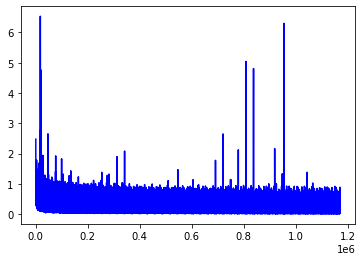

In [10]:
modeloTres = RedeNeuralModeloTres()

runnerTresCrossAdamBatch = RedeNeuralRunner(modeloTres,
                                     X_train, y_train,
                                     40,0.00015,'CrossEntropyLoss','Adam','runnerTresCrossAdamBatch',True)

runnerTresCrossAdamBatch.train()

In [11]:
runnerTresCrossAdamBatch.evaluate(X_test,y_test)

0.9112869121711383

In [20]:
runnerTresCrossAdamBatch.export()

Epoch: 39 Loss: 0.1622648537158966
Epoch: 39 Loss: 0.1813407838344574
Epoch: 39 Loss: 0.4249997138977051
Epoch: 39 Loss: 0.08109679818153381
Epoch: 39 Loss: 0.2619588077068329
Epoch: 39 Loss: 0.14743228256702423
Epoch: 39 Loss: 0.5170415043830872
Epoch: 39 Loss: 0.3315275013446808
Epoch: 39 Loss: 0.4281502962112427
Epoch: 39 Loss: 0.30770349502563477
Epoch: 39 Loss: 0.3296244442462921
Epoch: 39 Loss: 0.23235754668712616
Epoch: 39 Loss: 0.050216834992170334
Epoch: 39 Loss: 0.14410455524921417
Epoch: 39 Loss: 0.2558525502681732
Epoch: 39 Loss: 0.28462424874305725
Epoch: 39 Loss: 0.2604973316192627
Epoch: 39 Loss: 0.07699518650770187
Epoch: 39 Loss: 0.09045035392045975
Epoch: 39 Loss: 0.36626267433166504
Epoch: 39 Loss: 0.3180910348892212
Epoch: 39 Loss: 0.17421184480190277
Epoch: 39 Loss: 0.18832847476005554
Epoch: 39 Loss: 0.3333456516265869
Epoch: 39 Loss: 0.3285919427871704
Epoch: 39 Loss: 0.14504770934581757
Epoch: 39 Loss: 0.3557109832763672
Epoch: 39 Loss: 0.21836914122104645
Epoch

Epoch: 39 Loss: 0.23450495302677155
Epoch: 39 Loss: 0.3300262987613678
Epoch: 39 Loss: 0.24408942461013794
Epoch: 39 Loss: 0.1444096714258194
Epoch: 39 Loss: 0.14148548245429993
Epoch: 39 Loss: 0.18194480240345
Epoch: 39 Loss: 0.31654801964759827
Epoch: 39 Loss: 0.24595195055007935
Epoch: 39 Loss: 0.17121370136737823
Epoch: 39 Loss: 0.1751571148633957
Epoch: 39 Loss: 0.19242160022258759
Epoch: 39 Loss: 0.3242393434047699
Epoch: 39 Loss: 0.14348304271697998
Epoch: 39 Loss: 0.23047494888305664
Epoch: 39 Loss: 0.2714725136756897
Epoch: 39 Loss: 0.21503159403800964
Epoch: 39 Loss: 0.24190892279148102
Epoch: 39 Loss: 0.2627178430557251
Epoch: 39 Loss: 0.18861813843250275
Epoch: 39 Loss: 0.18769527971744537
Epoch: 39 Loss: 0.2631402909755707
Epoch: 39 Loss: 0.21468840539455414
Epoch: 39 Loss: 0.4247082471847534
Epoch: 39 Loss: 0.18804001808166504
Epoch: 39 Loss: 0.1501920223236084
Epoch: 39 Loss: 0.1982576847076416
Epoch: 39 Loss: 0.2604733407497406
Epoch: 39 Loss: 0.20150898396968842
Epoch:

Epoch: 39 Loss: 0.14934957027435303
Epoch: 39 Loss: 0.2327246069908142
Epoch: 39 Loss: 0.19532234966754913
Epoch: 39 Loss: 0.29160457849502563
Epoch: 39 Loss: 0.3926841914653778
Epoch: 39 Loss: 0.1244945079088211
Epoch: 39 Loss: 0.0934964269399643
Epoch: 39 Loss: 0.3411855697631836
Epoch: 39 Loss: 0.3763377368450165
Epoch: 39 Loss: 0.35808154940605164
Epoch: 39 Loss: 0.22334086894989014
Epoch: 39 Loss: 0.27874165773391724
Epoch: 39 Loss: 0.15697167813777924
Epoch: 39 Loss: 0.363271027803421
Epoch: 39 Loss: 0.4963392913341522
Epoch: 39 Loss: 0.06835860013961792
Epoch: 39 Loss: 0.15937091410160065
Epoch: 39 Loss: 0.2938087284564972
Epoch: 39 Loss: 0.16162459552288055
Epoch: 39 Loss: 0.13630349934101105
Epoch: 39 Loss: 0.5861026644706726
Epoch: 39 Loss: 0.2151724249124527
Epoch: 39 Loss: 0.3876846134662628
Epoch: 39 Loss: 0.1279641091823578
Epoch: 39 Loss: 0.3273146450519562
Epoch: 39 Loss: 0.07463601976633072
Epoch: 39 Loss: 0.4274432063102722
Epoch: 39 Loss: 0.16774426400661469
Epoch: 3

Epoch: 39 Loss: 0.11834727972745895
Epoch: 39 Loss: 0.32382604479789734
Epoch: 39 Loss: 0.16580037772655487
Epoch: 39 Loss: 0.1900842785835266
Epoch: 39 Loss: 0.3611335754394531
Epoch: 39 Loss: 0.4105924963951111
Epoch: 39 Loss: 0.28492581844329834
Epoch: 39 Loss: 0.1505523920059204
Epoch: 39 Loss: 0.4797506332397461
Epoch: 39 Loss: 0.19068555533885956
Epoch: 39 Loss: 0.4185602068901062
Epoch: 39 Loss: 0.20893041789531708
Epoch: 39 Loss: 0.294903427362442
Epoch: 39 Loss: 0.20144091546535492
Epoch: 39 Loss: 0.1704956442117691
Epoch: 39 Loss: 0.09249798953533173
Epoch: 39 Loss: 0.3968997001647949
Epoch: 39 Loss: 0.11444613337516785
Epoch: 39 Loss: 0.4137879014015198
Epoch: 39 Loss: 0.35976994037628174
Epoch: 39 Loss: 0.2098807692527771
Epoch: 39 Loss: 0.30021974444389343
Epoch: 39 Loss: 0.08281264454126358
Epoch: 39 Loss: 0.24876314401626587
Epoch: 39 Loss: 0.17190013825893402
Epoch: 39 Loss: 0.1294444054365158
Epoch: 39 Loss: 0.3286101818084717
Epoch: 39 Loss: 0.25044772028923035
Epoch:

Epoch: 39 Loss: 0.2391228824853897
Epoch: 39 Loss: 0.30497103929519653
Epoch: 39 Loss: 0.36939293146133423
Epoch: 39 Loss: 0.239524707198143
Epoch: 39 Loss: 0.3038705289363861
Epoch: 39 Loss: 0.4380922019481659
Epoch: 39 Loss: 0.45677661895751953
Epoch: 39 Loss: 0.5125699043273926
Epoch: 39 Loss: 0.3385113775730133
Epoch: 39 Loss: 0.27584049105644226
Epoch: 39 Loss: 0.3437502682209015
Epoch: 39 Loss: 0.33535951375961304
Epoch: 39 Loss: 0.2626986503601074
Epoch: 39 Loss: 0.23530080914497375
Epoch: 39 Loss: 0.14456644654273987
Epoch: 39 Loss: 0.2632211744785309
Epoch: 39 Loss: 0.08618772774934769
Epoch: 39 Loss: 0.15218845009803772
Epoch: 39 Loss: 0.14139467477798462
Epoch: 39 Loss: 0.34585559368133545
Epoch: 39 Loss: 0.4458150267601013
Epoch: 39 Loss: 0.0989852175116539
Epoch: 39 Loss: 0.31876280903816223
Epoch: 39 Loss: 0.24823783338069916
Epoch: 39 Loss: 0.20758172869682312
Epoch: 39 Loss: 0.2732499837875366
Epoch: 39 Loss: 0.5211157202720642
Epoch: 39 Loss: 0.10767719894647598
Epoch:

Epoch: 39 Loss: 0.10124903917312622
Epoch: 39 Loss: 0.4580666720867157
Epoch: 39 Loss: 0.24750828742980957
Epoch: 39 Loss: 0.13286231458187103
Epoch: 39 Loss: 0.11525624990463257
Epoch: 39 Loss: 0.13963860273361206
Epoch: 39 Loss: 0.20158728957176208
Epoch: 39 Loss: 0.4717392027378082
Epoch: 39 Loss: 0.340289831161499
Epoch: 39 Loss: 0.07655836641788483
Epoch: 39 Loss: 0.44872599840164185
Epoch: 39 Loss: 0.07237924635410309
Epoch: 39 Loss: 0.285900741815567
Epoch: 39 Loss: 0.14172327518463135
Epoch: 39 Loss: 0.22742320597171783
Epoch: 39 Loss: 0.28866368532180786
Epoch: 39 Loss: 0.2967771887779236
Epoch: 39 Loss: 0.40082406997680664
Epoch: 39 Loss: 0.4744509160518646
Epoch: 39 Loss: 0.13249458372592926
Epoch: 39 Loss: 0.0508216954767704
Epoch: 39 Loss: 0.4971410632133484
Epoch: 39 Loss: 0.1910930871963501
Epoch: 39 Loss: 0.362540602684021
Epoch: 39 Loss: 0.3233540952205658
Epoch: 39 Loss: 0.1060631200671196
Epoch: 39 Loss: 0.6140501499176025
Epoch: 39 Loss: 0.2764866054058075
Epoch: 39

Epoch: 39 Loss: 0.303725928068161
Epoch: 39 Loss: 0.2213708609342575
Epoch: 39 Loss: 0.2627229690551758
Epoch: 39 Loss: 0.3591907024383545
Epoch: 39 Loss: 0.3223226070404053
Epoch: 39 Loss: 0.4599999785423279
Epoch: 39 Loss: 0.13530993461608887
Epoch: 39 Loss: 0.2531207203865051
Epoch: 39 Loss: 0.15974704921245575
Epoch: 39 Loss: 0.30630093812942505
Epoch: 39 Loss: 0.36371761560440063
Epoch: 39 Loss: 0.3415473401546478
Epoch: 39 Loss: 0.23097831010818481
Epoch: 39 Loss: 0.2849108874797821
Epoch: 39 Loss: 0.3807542622089386
Epoch: 39 Loss: 0.24362637102603912
Epoch: 39 Loss: 0.16558244824409485
Epoch: 39 Loss: 0.14138175547122955
Epoch: 39 Loss: 0.13549265265464783
Epoch: 39 Loss: 0.2046462595462799
Epoch: 39 Loss: 0.11729535460472107
Epoch: 39 Loss: 0.20163032412528992
Epoch: 39 Loss: 0.1514168530702591
Epoch: 39 Loss: 0.12238216400146484
Epoch: 39 Loss: 0.36082375049591064
Epoch: 39 Loss: 0.2941189706325531
Epoch: 39 Loss: 0.3471341133117676
Epoch: 39 Loss: 0.43318429589271545
Epoch: 

Epoch: 39 Loss: 0.2583613693714142
Epoch: 39 Loss: 0.11101245135068893
Epoch: 39 Loss: 0.1346646100282669
Epoch: 39 Loss: 0.3430665135383606
Epoch: 39 Loss: 0.32769545912742615
Epoch: 39 Loss: 0.24056963622570038
Epoch: 39 Loss: 0.3711816966533661
Epoch: 39 Loss: 0.3846163749694824
Epoch: 39 Loss: 0.3451237678527832
Epoch: 39 Loss: 0.20367266237735748
Epoch: 39 Loss: 0.1842990517616272
Epoch: 39 Loss: 0.15947000682353973
Epoch: 39 Loss: 0.2777477204799652
Epoch: 39 Loss: 0.32499149441719055
Epoch: 39 Loss: 0.2944762706756592
Epoch: 39 Loss: 0.13523001968860626
Epoch: 39 Loss: 0.185269296169281
Epoch: 39 Loss: 0.1486877202987671
Epoch: 39 Loss: 0.48668089509010315
Epoch: 39 Loss: 0.321711003780365
Epoch: 39 Loss: 0.1473890244960785
Epoch: 39 Loss: 0.1998986154794693
Epoch: 39 Loss: 0.29730111360549927
Epoch: 39 Loss: 0.11040206998586655
Epoch: 39 Loss: 0.1918252557516098
Epoch: 39 Loss: 0.0888328030705452
Epoch: 39 Loss: 0.17283183336257935
Epoch: 39 Loss: 0.4295960068702698
Epoch: 39 L

Epoch: 39 Loss: 0.0778983011841774
Epoch: 39 Loss: 0.334281325340271
Epoch: 39 Loss: 0.12871694564819336
Epoch: 39 Loss: 0.27220454812049866
Epoch: 39 Loss: 0.43757450580596924
Epoch: 39 Loss: 0.2327486127614975
Epoch: 39 Loss: 0.17824259400367737
Epoch: 39 Loss: 0.22931942343711853
Epoch: 39 Loss: 0.19225919246673584
Epoch: 39 Loss: 0.4612053334712982
Epoch: 39 Loss: 0.3203221261501312
Epoch: 39 Loss: 0.1812957376241684
Epoch: 39 Loss: 0.17582790553569794
Epoch: 39 Loss: 0.07768721133470535
Epoch: 39 Loss: 0.12108606845140457
Epoch: 39 Loss: 0.20181958377361298
Epoch: 39 Loss: 0.1861923336982727
Epoch: 39 Loss: 0.20506854355335236
Epoch: 39 Loss: 0.060045260936021805
Epoch: 39 Loss: 0.27695387601852417
Epoch: 39 Loss: 0.42839527130126953
Epoch: 39 Loss: 0.13082458078861237
Epoch: 39 Loss: 0.6567221879959106
Epoch: 39 Loss: 0.22013862431049347
Epoch: 39 Loss: 0.3461048901081085
Epoch: 39 Loss: 0.8741447329521179
Epoch: 39 Loss: 0.6003088355064392
Epoch: 39 Loss: 0.09218594431877136
Epo

Epoch: 39 Loss: 0.31517964601516724
Epoch: 39 Loss: 0.04949896037578583
Epoch: 39 Loss: 0.2049066722393036
Epoch: 39 Loss: 0.2946122884750366
Epoch: 39 Loss: 0.2210669219493866
Epoch: 39 Loss: 0.2600669264793396
Epoch: 39 Loss: 0.06661073863506317
Epoch: 39 Loss: 0.19150324165821075
Epoch: 39 Loss: 0.24920721352100372
Epoch: 39 Loss: 0.2160850465297699
Epoch: 39 Loss: 0.4572267532348633
Epoch: 39 Loss: 0.24169300496578217
Epoch: 39 Loss: 0.11019706726074219
Epoch: 39 Loss: 0.324749618768692
Epoch: 39 Loss: 0.11106105148792267
Epoch: 39 Loss: 0.4016130268573761
Epoch: 39 Loss: 0.19519010186195374
Epoch: 39 Loss: 0.16633927822113037
Epoch: 39 Loss: 0.2927749752998352
Epoch: 39 Loss: 0.490266889333725
Epoch: 39 Loss: 0.1009083092212677
Epoch: 39 Loss: 0.36007145047187805
Epoch: 39 Loss: 0.40678709745407104
Epoch: 39 Loss: 0.16780200600624084
Epoch: 39 Loss: 0.08748877048492432
Epoch: 39 Loss: 0.2774471342563629
Epoch: 39 Loss: 0.16877791285514832
Epoch: 39 Loss: 0.2122134268283844
Epoch: 

Epoch: 39 Loss: 0.47856202721595764
Epoch: 39 Loss: 0.21506689488887787
Epoch: 39 Loss: 0.20112043619155884
Epoch: 39 Loss: 0.2141086906194687
Epoch: 39 Loss: 0.22553281486034393
Epoch: 39 Loss: 0.2442246377468109
Epoch: 39 Loss: 0.34408169984817505
Epoch: 39 Loss: 0.07954562455415726
Epoch: 39 Loss: 0.21146370470523834
Epoch: 39 Loss: 0.26224544644355774
Epoch: 39 Loss: 0.30672281980514526
Epoch: 39 Loss: 0.29565638303756714
Epoch: 39 Loss: 0.2958396077156067
Epoch: 39 Loss: 0.4178636968135834
Epoch: 39 Loss: 0.23173919320106506
Epoch: 39 Loss: 0.15830625593662262
Epoch: 39 Loss: 0.536668062210083
Epoch: 39 Loss: 0.4252011477947235
Epoch: 39 Loss: 0.27743515372276306
Epoch: 39 Loss: 0.23627057671546936
Epoch: 39 Loss: 0.13318723440170288
Epoch: 39 Loss: 0.35791802406311035
Epoch: 39 Loss: 0.20563656091690063
Epoch: 39 Loss: 0.44010743498802185
Epoch: 39 Loss: 0.07949262857437134
Epoch: 39 Loss: 0.20753584802150726
Epoch: 39 Loss: 0.3817172944545746
Epoch: 39 Loss: 0.3135950267314911
E

Epoch: 39 Loss: 0.30349117517471313
Epoch: 39 Loss: 0.27071237564086914
Epoch: 39 Loss: 0.13689583539962769
Epoch: 39 Loss: 0.11655676364898682
Epoch: 39 Loss: 0.19270683825016022
Epoch: 39 Loss: 0.6782398223876953
Epoch: 39 Loss: 0.3663342297077179
Epoch: 39 Loss: 0.16019181907176971
Epoch: 39 Loss: 0.1681484580039978
Epoch: 39 Loss: 0.19065387547016144
Epoch: 39 Loss: 0.22252938151359558
Epoch: 39 Loss: 0.2594722509384155
Epoch: 39 Loss: 0.1293613612651825
Epoch: 39 Loss: 0.26879096031188965
Epoch: 39 Loss: 0.11307620257139206
Epoch: 39 Loss: 0.198586568236351
Epoch: 39 Loss: 0.15467418730258942
Epoch: 39 Loss: 0.11690268665552139
Epoch: 39 Loss: 0.43622368574142456
Epoch: 39 Loss: 0.10634427517652512
Epoch: 39 Loss: 0.23166446387767792
Epoch: 39 Loss: 0.32877346873283386
Epoch: 39 Loss: 0.19220517575740814
Epoch: 39 Loss: 0.16539500653743744
Epoch: 39 Loss: 0.30507224798202515
Epoch: 39 Loss: 0.16747230291366577
Epoch: 39 Loss: 0.15261200070381165
Epoch: 39 Loss: 0.7226800918579102


Epoch: 39 Loss: 0.06261803209781647
Epoch: 39 Loss: 0.268368661403656
Epoch: 39 Loss: 0.24127313494682312
Epoch: 39 Loss: 0.3720839321613312
Epoch: 39 Loss: 0.2886994779109955
Epoch: 39 Loss: 0.19131191074848175
Epoch: 39 Loss: 0.3141501247882843
Epoch: 39 Loss: 0.20834358036518097
Epoch: 39 Loss: 0.21555213630199432
Epoch: 39 Loss: 0.3411448001861572
Epoch: 39 Loss: 0.21267928183078766
Epoch: 39 Loss: 0.09967708587646484
Epoch: 39 Loss: 0.2317190021276474
Epoch: 39 Loss: 0.33460453152656555
Epoch: 39 Loss: 0.12951186299324036
Epoch: 39 Loss: 0.0864594504237175
Epoch: 39 Loss: 0.5038866400718689
Epoch: 39 Loss: 0.4065849184989929
Epoch: 39 Loss: 0.6254515051841736
Epoch: 39 Loss: 0.22922587394714355
Epoch: 39 Loss: 0.28716081380844116
Epoch: 39 Loss: 0.4248986542224884
Epoch: 39 Loss: 0.4628342092037201
Epoch: 39 Loss: 0.20454446971416473
Epoch: 39 Loss: 0.17426545917987823
Epoch: 39 Loss: 0.1630396693944931
Epoch: 39 Loss: 0.13084185123443604
Epoch: 39 Loss: 0.1892872005701065
Epoch: 

Epoch: 39 Loss: 0.15927909314632416
Epoch: 39 Loss: 0.20339679718017578
Epoch: 39 Loss: 0.21553382277488708
Epoch: 39 Loss: 0.2781955897808075
Epoch: 39 Loss: 0.21551118791103363
Epoch: 39 Loss: 0.31777405738830566
Epoch: 39 Loss: 0.25799915194511414
Epoch: 39 Loss: 0.17792831361293793
Epoch: 39 Loss: 0.26019084453582764
Epoch: 39 Loss: 0.1868683248758316
Epoch: 39 Loss: 0.24434468150138855
Epoch: 39 Loss: 0.2020862102508545
Epoch: 39 Loss: 0.6940411925315857
Epoch: 39 Loss: 0.17901796102523804
Epoch: 39 Loss: 0.40013113617897034
Epoch: 39 Loss: 0.3134365379810333
Epoch: 39 Loss: 0.27506232261657715
Epoch: 39 Loss: 0.31609010696411133
Epoch: 39 Loss: 0.16936539113521576
Epoch: 39 Loss: 0.34462568163871765
Epoch: 39 Loss: 0.15142662823200226
Epoch: 39 Loss: 0.30410003662109375
Epoch: 39 Loss: 0.2423715591430664
Epoch: 39 Loss: 0.21739308536052704
Epoch: 39 Loss: 0.7396515607833862
Epoch: 39 Loss: 0.3585173785686493
Epoch: 39 Loss: 0.22968176007270813
Epoch: 39 Loss: 0.20251435041427612


Epoch: 39 Loss: 0.22770541906356812
Epoch: 39 Loss: 0.5201418399810791
Epoch: 39 Loss: 0.2214120775461197
Epoch: 39 Loss: 0.14463475346565247
Epoch: 39 Loss: 0.16193340718746185
Epoch: 39 Loss: 0.1759413629770279
Epoch: 39 Loss: 0.3129951059818268
Epoch: 39 Loss: 0.24479058384895325
Epoch: 39 Loss: 0.3936655819416046
Epoch: 39 Loss: 0.32659247517585754
Epoch: 39 Loss: 0.31294578313827515
Epoch: 39 Loss: 0.314482182264328
Epoch: 39 Loss: 0.5006710886955261
Epoch: 39 Loss: 0.17650240659713745
Epoch: 39 Loss: 0.15089896321296692
Epoch: 39 Loss: 0.1630404144525528
Epoch: 39 Loss: 0.20696549117565155
Epoch: 39 Loss: 0.41837745904922485
Epoch: 39 Loss: 0.16487284004688263
Epoch: 39 Loss: 0.40618500113487244
Epoch: 39 Loss: 0.20642231404781342
Epoch: 39 Loss: 0.3985598087310791
Epoch: 39 Loss: 0.09769802540540695
Epoch: 39 Loss: 0.23608210682868958
Epoch: 39 Loss: 0.06313862651586533
Epoch: 39 Loss: 0.13237951695919037
Epoch: 39 Loss: 0.3924826383590698
Epoch: 39 Loss: 0.10547255724668503
Epo

Epoch: 39 Loss: 0.37827250361442566
Epoch: 39 Loss: 0.3042133152484894
Epoch: 39 Loss: 0.2581431269645691
Epoch: 39 Loss: 0.24525335431098938
Epoch: 39 Loss: 0.2943965494632721
Epoch: 39 Loss: 0.4127448797225952
Epoch: 39 Loss: 0.25820785760879517
Epoch: 39 Loss: 0.27945733070373535
Epoch: 39 Loss: 0.20240472257137299
Epoch: 39 Loss: 0.23027701675891876
Epoch: 39 Loss: 0.20658138394355774
Epoch: 39 Loss: 0.3784155547618866
Epoch: 39 Loss: 0.216082364320755
Epoch: 39 Loss: 0.1472170650959015
Epoch: 39 Loss: 0.3789140284061432
Epoch: 39 Loss: 0.09410008043050766
Epoch: 39 Loss: 0.29386866092681885
Epoch: 39 Loss: 0.07454554736614227
Epoch: 39 Loss: 0.23326528072357178
Epoch: 39 Loss: 0.2451673299074173
Epoch: 39 Loss: 0.44457533955574036
Epoch: 39 Loss: 0.19592155516147614
Epoch: 39 Loss: 0.5316869020462036
Epoch: 39 Loss: 0.20212477445602417
Epoch: 39 Loss: 0.23143690824508667
Epoch: 39 Loss: 0.19914232194423676
Epoch: 39 Loss: 0.07230142503976822
Epoch: 39 Loss: 0.36243176460266113
Epo

Epoch: 39 Loss: 0.23821096122264862
Epoch: 39 Loss: 0.2513009309768677
Epoch: 39 Loss: 0.12673602998256683
Epoch: 39 Loss: 0.10794255137443542
Epoch: 39 Loss: 0.43800318241119385
Epoch: 39 Loss: 0.2613065242767334
Epoch: 39 Loss: 0.25808456540107727
Epoch: 39 Loss: 0.36028429865837097
Epoch: 39 Loss: 0.31754937767982483
Epoch: 39 Loss: 0.24068310856819153
Epoch: 39 Loss: 0.23669247329235077
Epoch: 39 Loss: 0.25887948274612427
Epoch: 39 Loss: 0.38298270106315613
Epoch: 39 Loss: 0.21731485426425934
Epoch: 39 Loss: 0.3627777695655823
Epoch: 39 Loss: 0.3485708236694336
Epoch: 39 Loss: 0.23217016458511353
Epoch: 39 Loss: 0.19720280170440674
Epoch: 39 Loss: 0.10311363637447357
Epoch: 39 Loss: 0.28424525260925293
Epoch: 39 Loss: 0.3278380334377289
Epoch: 39 Loss: 0.3003355860710144
Epoch: 39 Loss: 0.2893669605255127
Epoch: 39 Loss: 0.07698418945074081
Epoch: 39 Loss: 0.1334410160779953
Epoch: 39 Loss: 0.16917063295841217
Epoch: 39 Loss: 0.1952952891588211
Epoch: 39 Loss: 0.3172133266925812
Ep

Epoch: 39 Loss: 0.5259014964103699
Epoch: 39 Loss: 0.27534180879592896
Epoch: 39 Loss: 0.32408058643341064
Epoch: 39 Loss: 0.16311433911323547
Epoch: 39 Loss: 0.17024849355220795
Epoch: 39 Loss: 0.28100165724754333
Epoch: 39 Loss: 0.23366409540176392
Epoch: 39 Loss: 0.11662508547306061
Epoch: 39 Loss: 0.17132875323295593
Epoch: 39 Loss: 0.29695314168930054
Epoch: 39 Loss: 0.3843115270137787
Epoch: 39 Loss: 0.18153882026672363
Epoch: 39 Loss: 0.2214110791683197
Epoch: 39 Loss: 0.2994633615016937
Epoch: 39 Loss: 0.3053654730319977
Epoch: 39 Loss: 0.2973968982696533
Epoch: 39 Loss: 0.2929346263408661
Epoch: 39 Loss: 0.4540163278579712
Epoch: 39 Loss: 0.19606563448905945
Epoch: 39 Loss: 0.1402452439069748
Epoch: 39 Loss: 0.5564106702804565
Epoch: 39 Loss: 0.39689013361930847
Epoch: 39 Loss: 0.2802509665489197
Epoch: 39 Loss: 0.27461862564086914
Epoch: 39 Loss: 0.22370105981826782
Epoch: 39 Loss: 0.41122791171073914
Epoch: 39 Loss: 0.12916900217533112
Epoch: 39 Loss: 0.12877848744392395
Epo

Epoch: 39 Loss: 0.6851300001144409
Epoch: 39 Loss: 0.15182721614837646
Epoch: 39 Loss: 0.06624864786863327
Epoch: 39 Loss: 0.14602337777614594
Epoch: 39 Loss: 0.3238668739795685
Epoch: 39 Loss: 0.7735636234283447
Epoch: 39 Loss: 0.4489348530769348
Epoch: 39 Loss: 0.17042586207389832
Epoch: 39 Loss: 0.22994260489940643
Epoch: 39 Loss: 0.39657559990882874
Epoch: 39 Loss: 0.5237351655960083
Epoch: 39 Loss: 0.24484777450561523
Epoch: 39 Loss: 0.13880066573619843
Epoch: 39 Loss: 0.11448676139116287
Epoch: 39 Loss: 0.10251496732234955
Epoch: 39 Loss: 0.20727461576461792
Epoch: 39 Loss: 0.18488678336143494
Epoch: 39 Loss: 0.19495178759098053
Epoch: 39 Loss: 0.4648856222629547
Epoch: 39 Loss: 0.28732460737228394
Epoch: 39 Loss: 0.2532860338687897
Epoch: 39 Loss: 0.20860910415649414
Epoch: 39 Loss: 0.20351779460906982
Epoch: 39 Loss: 0.39325085282325745
Epoch: 39 Loss: 1.1496696472167969
Epoch: 39 Loss: 0.45890742540359497
Epoch: 39 Loss: 0.17202071845531464
Epoch: 39 Loss: 0.33512255549430847


Epoch: 39 Loss: 0.5095887184143066
Epoch: 39 Loss: 0.5114175081253052
Epoch: 39 Loss: 0.4267440438270569
Epoch: 39 Loss: 0.3711450397968292
Epoch: 39 Loss: 0.1284359246492386
Epoch: 39 Loss: 0.2534152865409851
Epoch: 39 Loss: 0.07601919025182724
Epoch: 39 Loss: 0.05320794880390167
Epoch: 39 Loss: 0.10398410260677338
Epoch: 39 Loss: 0.2566262483596802
Epoch: 39 Loss: 0.30575862526893616
Epoch: 39 Loss: 0.44229254126548767
Epoch: 39 Loss: 0.07313011586666107
Epoch: 39 Loss: 0.2356293946504593
Epoch: 39 Loss: 0.16780659556388855
Epoch: 39 Loss: 0.04617077857255936
Epoch: 39 Loss: 0.3207572400569916
Epoch: 39 Loss: 0.3246108591556549
Epoch: 39 Loss: 0.22948391735553741
Epoch: 39 Loss: 0.511243462562561
Epoch: 39 Loss: 0.18184848129749298
Epoch: 39 Loss: 0.20045383274555206
Epoch: 39 Loss: 0.13327844440937042
Epoch: 39 Loss: 0.24049198627471924
Epoch: 39 Loss: 0.35473063588142395
Epoch: 39 Loss: 0.16385886073112488
Epoch: 39 Loss: 0.23374179005622864
Epoch: 39 Loss: 0.2676880359649658
Epoch

Epoch: 39 Loss: 0.38393497467041016
Epoch: 39 Loss: 0.5767048001289368
Epoch: 39 Loss: 0.2998253405094147
Epoch: 39 Loss: 0.11099907010793686
Epoch: 39 Loss: 0.13922518491744995
Epoch: 39 Loss: 0.212880939245224
Epoch: 39 Loss: 0.1268581598997116
Epoch: 39 Loss: 0.3679943084716797
Epoch: 39 Loss: 0.3613067865371704
Epoch: 39 Loss: 0.11382096260786057
Epoch: 39 Loss: 0.2526651918888092
Epoch: 39 Loss: 0.45955944061279297
Epoch: 39 Loss: 0.15261410176753998
Epoch: 39 Loss: 0.2489221841096878
Epoch: 39 Loss: 0.23920197784900665
Epoch: 39 Loss: 0.07811788469552994
Epoch: 39 Loss: 0.23450197279453278
Epoch: 39 Loss: 0.14965341985225677
Epoch: 39 Loss: 0.5115159153938293
Epoch: 39 Loss: 0.3636742830276489
Epoch: 39 Loss: 0.22358739376068115
Epoch: 39 Loss: 0.4483351707458496
Epoch: 39 Loss: 0.44408562779426575
Epoch: 39 Loss: 0.31657737493515015
Epoch: 39 Loss: 0.33667421340942383
Epoch: 39 Loss: 0.14012491703033447
Epoch: 39 Loss: 0.21997475624084473
Epoch: 39 Loss: 0.2696317434310913
Epoch

Epoch: 39 Loss: 0.17532747983932495
Epoch: 39 Loss: 0.2395581156015396
Epoch: 39 Loss: 0.27871349453926086
Epoch: 39 Loss: 0.3191168010234833
Epoch: 39 Loss: 0.20208105444908142
Epoch: 39 Loss: 0.1603107750415802
Epoch: 39 Loss: 0.23299828171730042
Epoch: 39 Loss: 0.31445255875587463
Epoch: 39 Loss: 0.3960188925266266
Epoch: 39 Loss: 0.25085747241973877
Epoch: 39 Loss: 0.2944156229496002
Epoch: 39 Loss: 0.27666759490966797
Epoch: 39 Loss: 0.8498781323432922
Epoch: 39 Loss: 0.3840426802635193
Epoch: 39 Loss: 0.31092748045921326
Epoch: 39 Loss: 0.3301435112953186
Epoch: 39 Loss: 0.279329776763916
Epoch: 39 Loss: 0.3011549711227417
Epoch: 39 Loss: 0.4914221465587616
Epoch: 39 Loss: 0.17129801213741302
Epoch: 39 Loss: 0.10797501355409622
Epoch: 39 Loss: 0.31144168972969055
Epoch: 39 Loss: 0.31254711747169495
Epoch: 39 Loss: 0.4119877517223358
Epoch: 39 Loss: 0.10485158860683441
Epoch: 39 Loss: 0.12372320145368576
Epoch: 39 Loss: 0.05879002436995506
Epoch: 39 Loss: 0.33889564871788025
Epoch

Epoch: 39 Loss: 0.2931700050830841
Epoch: 39 Loss: 0.2708680033683777
Epoch: 39 Loss: 0.21530131995677948
Epoch: 39 Loss: 0.1641494333744049
Epoch: 39 Loss: 0.3691873550415039
Epoch: 39 Loss: 0.3077857494354248
Epoch: 39 Loss: 0.32327932119369507
Epoch: 39 Loss: 0.1923227608203888
Epoch: 39 Loss: 0.28035327792167664
Epoch: 39 Loss: 0.3236319124698639
Epoch: 39 Loss: 0.09864930063486099
Epoch: 39 Loss: 0.442842036485672
Epoch: 39 Loss: 0.22096411883831024
Epoch: 39 Loss: 0.706794261932373
Epoch: 39 Loss: 0.15590862929821014
Epoch: 39 Loss: 0.3307543694972992
Epoch: 39 Loss: 0.44844499230384827
Epoch: 39 Loss: 0.6230678558349609
Epoch: 39 Loss: 0.27048325538635254
Epoch: 39 Loss: 0.23537594079971313
Epoch: 39 Loss: 0.2830304801464081
Epoch: 39 Loss: 0.43701857328414917
Epoch: 39 Loss: 0.14967553317546844
Epoch: 39 Loss: 0.4794726073741913
Epoch: 39 Loss: 0.6415581703186035
Epoch: 39 Loss: 0.30460870265960693
Epoch: 39 Loss: 0.15795639157295227
Epoch: 39 Loss: 0.22296449542045593
Epoch: 3

Epoch: 39 Loss: 0.24348348379135132
Epoch: 39 Loss: 0.24977163970470428
Epoch: 39 Loss: 0.3588448166847229
Epoch: 39 Loss: 0.22362178564071655
Epoch: 39 Loss: 0.3396374583244324
Epoch: 39 Loss: 0.1269756704568863
Epoch: 39 Loss: 0.3305417597293854
Epoch: 39 Loss: 0.19271205365657806
Epoch: 39 Loss: 0.16827607154846191
Epoch: 39 Loss: 0.2961231470108032
Epoch: 39 Loss: 0.24006184935569763
Epoch: 39 Loss: 0.20384275913238525
Epoch: 39 Loss: 0.536801278591156
Epoch: 39 Loss: 0.12769484519958496
Epoch: 39 Loss: 0.45333734154701233
Epoch: 39 Loss: 0.20330682396888733
Epoch: 39 Loss: 0.2780863046646118
Epoch: 39 Loss: 0.5872284770011902
Epoch: 39 Loss: 0.17120146751403809
Epoch: 39 Loss: 0.18091730773448944
Epoch: 39 Loss: 0.29909953474998474
Epoch: 39 Loss: 0.28524377942085266
Epoch: 39 Loss: 0.18989381194114685
Epoch: 39 Loss: 0.10713008046150208
Epoch: 39 Loss: 0.03861599415540695
Epoch: 39 Loss: 0.27333128452301025
Epoch: 39 Loss: 0.20659996569156647
Epoch: 39 Loss: 0.49498099088668823
E

Epoch: 39 Loss: 0.23195932805538177
Epoch: 39 Loss: 0.23760204017162323
Epoch: 39 Loss: 0.12836553156375885
Epoch: 39 Loss: 0.5004565715789795
Epoch: 39 Loss: 0.1064174547791481
Epoch: 39 Loss: 0.11507008224725723
Epoch: 39 Loss: 0.28401482105255127
Epoch: 39 Loss: 0.15600474178791046
Epoch: 39 Loss: 0.30696797370910645
Epoch: 39 Loss: 0.2662782073020935
Epoch: 39 Loss: 0.2558742165565491
Epoch: 39 Loss: 0.17843841016292572
Epoch: 39 Loss: 0.27914959192276
Epoch: 39 Loss: 0.36292022466659546
Epoch: 39 Loss: 0.27690428495407104
Epoch: 39 Loss: 0.1212582141160965
Epoch: 39 Loss: 0.2015829235315323
Epoch: 39 Loss: 0.2692386507987976
Epoch: 39 Loss: 0.21747033298015594
Epoch: 39 Loss: 0.41890236735343933
Epoch: 39 Loss: 0.9022172689437866
Epoch: 39 Loss: 0.1379234492778778
Epoch: 39 Loss: 0.29003995656967163
Epoch: 39 Loss: 0.10332167893648148
Epoch: 39 Loss: 0.32074764370918274
Epoch: 39 Loss: 0.28304949402809143
Epoch: 39 Loss: 0.3695664703845978
Epoch: 39 Loss: 0.14634720981121063
Epoch

Epoch: 39 Loss: 0.08019854128360748
Epoch: 39 Loss: 0.1663341075181961
Epoch: 39 Loss: 30.038433074951172
Epoch: 39 Loss: 0.21969415247440338
Epoch: 39 Loss: 0.2093157321214676
Epoch: 39 Loss: 0.18749195337295532
Epoch: 39 Loss: 0.2643950581550598
Epoch: 39 Loss: 0.197936549782753
Epoch: 39 Loss: 0.19936731457710266
Epoch: 39 Loss: 0.3190521001815796
Epoch: 39 Loss: 0.26620322465896606
Epoch: 39 Loss: 0.39765670895576477
Epoch: 39 Loss: 0.2233404815196991
Epoch: 39 Loss: 0.24628852307796478
Epoch: 39 Loss: 0.27911752462387085
Epoch: 39 Loss: 0.29824501276016235
Epoch: 39 Loss: 0.14637815952301025
Epoch: 39 Loss: 0.23034176230430603
Epoch: 39 Loss: 0.3187851905822754
Epoch: 39 Loss: 0.22077977657318115
Epoch: 39 Loss: 0.20839974284172058
Epoch: 39 Loss: 0.2645629346370697
Epoch: 39 Loss: 0.19871413707733154
Epoch: 39 Loss: 0.4784235954284668
Epoch: 39 Loss: 0.25289058685302734
Epoch: 39 Loss: 0.4446745812892914
Epoch: 39 Loss: 0.47739267349243164
Epoch: 39 Loss: 0.7039419412612915
Epoch

Epoch: 39 Loss: 0.24400687217712402
Epoch: 39 Loss: 0.35582205653190613
Epoch: 39 Loss: 0.3932860791683197
Epoch: 39 Loss: 0.2815152406692505
Epoch: 39 Loss: 0.3048742413520813
Epoch: 39 Loss: 0.2884241044521332
Epoch: 39 Loss: 0.10115118324756622
Epoch: 39 Loss: 0.16903088986873627
Epoch: 39 Loss: 0.1810280978679657
Epoch: 39 Loss: 0.26556453108787537
Epoch: 39 Loss: 0.1654776632785797
Epoch: 39 Loss: 0.2989361882209778
Epoch: 39 Loss: 0.47715017199516296
Epoch: 39 Loss: 0.18090792000293732
Epoch: 39 Loss: 0.44089004397392273
Epoch: 39 Loss: 0.4288465082645416
Epoch: 39 Loss: 0.17185448110103607
Epoch: 39 Loss: 0.35750889778137207
Epoch: 39 Loss: 0.15721406042575836
Epoch: 39 Loss: 0.2942662835121155
Epoch: 39 Loss: 0.34240075945854187
Epoch: 39 Loss: 0.32064950466156006
Epoch: 39 Loss: 0.1639365255832672
Epoch: 39 Loss: 0.1524617075920105
Epoch: 39 Loss: 0.16988582909107208
Epoch: 39 Loss: 0.1529155671596527
Epoch: 39 Loss: 0.39370661973953247
Epoch: 39 Loss: 0.16682058572769165
Epoc

Epoch: 39 Loss: 0.23006942868232727
Epoch: 39 Loss: 0.16641393303871155
Epoch: 39 Loss: 0.25375643372535706
Epoch: 39 Loss: 0.16348828375339508
Epoch: 39 Loss: 0.4528125822544098
Epoch: 39 Loss: 0.2268706113100052
Epoch: 39 Loss: 0.406442254781723
Epoch: 39 Loss: 0.21570070087909698
Epoch: 39 Loss: 0.350619375705719
Epoch: 39 Loss: 0.22360287606716156
Epoch: 39 Loss: 0.29954302310943604
Epoch: 39 Loss: 0.14489775896072388
Epoch: 39 Loss: 0.19085435569286346
Epoch: 39 Loss: 0.40881243348121643
Epoch: 39 Loss: 0.07359841465950012
Epoch: 39 Loss: 0.15095928311347961
Epoch: 39 Loss: 0.3163031041622162
Epoch: 39 Loss: 0.5437921285629272
Epoch: 39 Loss: 0.4913923144340515
Epoch: 39 Loss: 0.4650249779224396
Epoch: 39 Loss: 0.17116566002368927
Epoch: 39 Loss: 0.2015412151813507
Epoch: 39 Loss: 0.5659230947494507
Epoch: 39 Loss: 0.17131119966506958
Epoch: 39 Loss: 0.2083367109298706
Epoch: 39 Loss: 0.19114990532398224
Epoch: 39 Loss: 0.22420784831047058
Epoch: 39 Loss: 0.16265636682510376
Epoch

Epoch: 39 Loss: 0.17235179245471954
Epoch: 39 Loss: 0.32278892397880554
Epoch: 39 Loss: 0.390170156955719
Epoch: 39 Loss: 0.2903502881526947
Epoch: 39 Loss: 0.31406259536743164
Epoch: 39 Loss: 0.20710842311382294
Epoch: 39 Loss: 0.4060875475406647
Epoch: 39 Loss: 0.22593314945697784
Epoch: 39 Loss: 0.0708208680152893
Epoch: 39 Loss: 0.08542416989803314
Epoch: 39 Loss: 0.10184485465288162
Epoch: 39 Loss: 0.23676759004592896
Epoch: 39 Loss: 0.10882223397493362
Epoch: 39 Loss: 0.3869624733924866
Epoch: 39 Loss: 0.31923824548721313
Epoch: 39 Loss: 0.5911269187927246
Epoch: 39 Loss: 0.24594542384147644
Epoch: 39 Loss: 0.2214195728302002
Epoch: 39 Loss: 0.16536399722099304
Epoch: 39 Loss: 0.3367852568626404
Epoch: 39 Loss: 0.3896041512489319
Epoch: 39 Loss: 0.4013410806655884
Epoch: 39 Loss: 0.14323587715625763
Epoch: 39 Loss: 0.22100037336349487
Epoch: 39 Loss: 0.13166411221027374
Epoch: 39 Loss: 0.21036648750305176
Epoch: 39 Loss: 0.1172076016664505
Epoch: 39 Loss: 0.17970889806747437
Epoc

Epoch: 39 Loss: 0.15791766345500946
Epoch: 39 Loss: 0.16600829362869263
Epoch: 39 Loss: 0.36848437786102295
Epoch: 39 Loss: 0.2672297954559326
Epoch: 39 Loss: 0.17501576244831085
Epoch: 39 Loss: 0.2652209997177124
Epoch: 39 Loss: 0.2398512065410614
Epoch: 39 Loss: 0.2287750542163849
Epoch: 39 Loss: 0.11463910341262817
Epoch: 39 Loss: 0.26666533946990967
Epoch: 39 Loss: 0.13536812365055084
Epoch: 39 Loss: 0.47607630491256714
Epoch: 39 Loss: 0.31693246960639954
Epoch: 39 Loss: 0.1556745320558548
Epoch: 39 Loss: 0.4616695046424866
Epoch: 39 Loss: 0.35259371995925903
Epoch: 39 Loss: 0.4866824150085449
Epoch: 39 Loss: 0.16167253255844116
Epoch: 39 Loss: 0.2940576672554016
Epoch: 39 Loss: 0.22024056315422058
Epoch: 39 Loss: 0.2064138948917389
Epoch: 39 Loss: 0.28361445665359497
Epoch: 39 Loss: 0.311371386051178
Epoch: 39 Loss: 0.4225083887577057
Epoch: 39 Loss: 0.3272564113140106
Epoch: 39 Loss: 0.3861694037914276
Epoch: 39 Loss: 0.12485110759735107
Epoch: 39 Loss: 0.46202200651168823
Epoch:

Epoch: 39 Loss: 0.08589551597833633
Epoch: 39 Loss: 0.11734147369861603
Epoch: 39 Loss: 0.20914092659950256
Epoch: 39 Loss: 0.11957456171512604
Epoch: 39 Loss: 0.6679008603096008
Epoch: 39 Loss: 0.46934911608695984
Epoch: 39 Loss: 0.364065557718277
Epoch: 39 Loss: 0.13101132214069366
Epoch: 39 Loss: 0.12473937124013901
Epoch: 39 Loss: 0.18750283122062683
Epoch: 39 Loss: 0.2809474468231201
Epoch: 39 Loss: 0.04664552956819534
Epoch: 39 Loss: 0.4582456350326538
Epoch: 39 Loss: 0.3626217544078827
Epoch: 39 Loss: 0.23404449224472046
Epoch: 39 Loss: 0.39160364866256714
Epoch: 39 Loss: 0.717846691608429
Epoch: 39 Loss: 0.7593642473220825
Epoch: 39 Loss: 0.3569404184818268
Epoch: 39 Loss: 0.23095664381980896
Epoch: 39 Loss: 0.08541708439588547
Epoch: 39 Loss: 0.26023992896080017
Epoch: 39 Loss: 0.2252206802368164
Epoch: 39 Loss: 0.3658967912197113
Epoch: 39 Loss: 0.31914880871772766
Epoch: 39 Loss: 0.4952927231788635
Epoch: 39 Loss: 0.3467700481414795
Epoch: 39 Loss: 0.3547479808330536
Epoch: 

Epoch: 39 Loss: 0.053442031145095825
Epoch: 39 Loss: 0.1491224318742752
Epoch: 39 Loss: 0.14123855531215668
Epoch: 39 Loss: 0.13473322987556458
Epoch: 39 Loss: 0.25413063168525696
Epoch: 39 Loss: 0.23213276267051697
Epoch: 39 Loss: 0.4035297930240631
Epoch: 39 Loss: 0.28012970089912415
Epoch: 39 Loss: 0.10217976570129395
Epoch: 39 Loss: 0.27313026785850525
Epoch: 39 Loss: 0.2363412082195282
Epoch: 39 Loss: 0.2619803547859192
Epoch: 39 Loss: 0.19145554304122925
Epoch: 39 Loss: 0.23814857006072998
Epoch: 39 Loss: 0.03467833623290062
Epoch: 39 Loss: 0.3515069782733917
Epoch: 39 Loss: 0.13920705020427704
Epoch: 39 Loss: 0.3976382315158844
Epoch: 39 Loss: 0.3885759115219116
Epoch: 39 Loss: 0.5536525845527649
Epoch: 39 Loss: 0.1233343631029129
Epoch: 39 Loss: 0.2611910104751587
Epoch: 39 Loss: 0.2365778386592865
Epoch: 39 Loss: 0.46199172735214233
Epoch: 39 Loss: 0.35822567343711853
Epoch: 39 Loss: 0.1584022343158722
Epoch: 39 Loss: 0.27497997879981995
Epoch: 39 Loss: 0.34676483273506165
Epo

Epoch: 39 Loss: 0.3432057201862335
Epoch: 39 Loss: 0.2866765856742859
Epoch: 39 Loss: 0.12618513405323029
Epoch: 39 Loss: 0.46245428919792175
Epoch: 39 Loss: 0.1791210025548935
Epoch: 39 Loss: 0.12505365908145905
Epoch: 39 Loss: 0.2505190372467041
Epoch: 39 Loss: 0.359824001789093
Epoch: 39 Loss: 0.7016612887382507
Epoch: 39 Loss: 0.1540956348180771
Epoch: 39 Loss: 0.05357961356639862
Epoch: 39 Loss: 0.3213219940662384
Epoch: 39 Loss: 0.3102576732635498
Epoch: 39 Loss: 0.563947319984436
Epoch: 39 Loss: 0.3685419261455536
Epoch: 39 Loss: 0.28513631224632263
Epoch: 39 Loss: 0.13272890448570251
Epoch: 39 Loss: 0.4321546256542206
Epoch: 39 Loss: 0.04109139367938042
Epoch: 39 Loss: 0.09974782913923264
Epoch: 39 Loss: 0.272664338350296
Epoch: 39 Loss: 0.184611976146698
Epoch: 39 Loss: 0.38727352023124695
Epoch: 39 Loss: 0.2542482018470764
Epoch: 39 Loss: 0.03257819265127182
Epoch: 39 Loss: 0.20052088797092438
Epoch: 39 Loss: 0.27910706400871277
Epoch: 39 Loss: 0.20933198928833008
Epoch: 39 L

Epoch: 39 Loss: 0.12559083104133606
Epoch: 39 Loss: 0.27635058760643005
Epoch: 39 Loss: 0.5127977728843689
Epoch: 39 Loss: 0.37522193789482117
Epoch: 39 Loss: 0.3691880404949188
Epoch: 39 Loss: 0.497509241104126
Epoch: 39 Loss: 0.08507057279348373
Epoch: 39 Loss: 0.37813082337379456
Epoch: 39 Loss: 0.3325211703777313
Epoch: 39 Loss: 0.30881959199905396
Epoch: 39 Loss: 0.141898512840271
Epoch: 39 Loss: 0.18862518668174744
Epoch: 39 Loss: 0.14930905401706696
Epoch: 39 Loss: 0.32549116015434265
Epoch: 39 Loss: 0.33999723196029663
Epoch: 39 Loss: 0.18935728073120117
Epoch: 39 Loss: 0.32791873812675476
Epoch: 39 Loss: 0.2769555151462555
Epoch: 39 Loss: 0.43214839696884155
Epoch: 39 Loss: 0.4199373722076416
Epoch: 39 Loss: 0.6244953870773315
Epoch: 39 Loss: 0.16594408452510834
Epoch: 39 Loss: 0.15381145477294922
Epoch: 39 Loss: 0.3891432285308838
Epoch: 39 Loss: 0.29621461033821106
Epoch: 39 Loss: 0.24066242575645447
Epoch: 39 Loss: 0.2913352847099304
Epoch: 39 Loss: 0.1212572380900383
Epoch

Epoch: 39 Loss: 0.20738591253757477
Epoch: 39 Loss: 0.297818124294281
Epoch: 39 Loss: 0.14561057090759277
Epoch: 39 Loss: 0.4697226285934448
Epoch: 39 Loss: 0.19063127040863037
Epoch: 39 Loss: 0.3086467385292053
Epoch: 39 Loss: 0.16736093163490295
Epoch: 39 Loss: 0.09386572241783142
Epoch: 39 Loss: 0.11279624700546265
Epoch: 39 Loss: 0.09933403879404068
Epoch: 39 Loss: 0.5105962157249451
Epoch: 39 Loss: 0.19250595569610596
Epoch: 39 Loss: 0.4631637930870056
Epoch: 39 Loss: 0.4197911322116852
Epoch: 39 Loss: 0.3293801248073578
Epoch: 39 Loss: 0.39074942469596863
Epoch: 39 Loss: 0.2805953621864319
Epoch: 39 Loss: 0.17823822796344757
Epoch: 39 Loss: 0.30586206912994385
Epoch: 39 Loss: 0.32576197385787964
Epoch: 39 Loss: 0.13354404270648956
Epoch: 39 Loss: 0.25919994711875916
Epoch: 39 Loss: 0.3016016185283661
Epoch: 39 Loss: 0.6409239768981934
Epoch: 39 Loss: 0.30656319856643677
Epoch: 39 Loss: 0.19483178853988647
Epoch: 39 Loss: 0.29977262020111084
Epoch: 39 Loss: 0.22353540360927582
Epo

Epoch: 39 Loss: 0.19778716564178467
Epoch: 39 Loss: 0.2859334647655487
Epoch: 39 Loss: 0.26754656434059143
Epoch: 39 Loss: 0.11656324565410614
Epoch: 39 Loss: 0.15864093601703644
Epoch: 39 Loss: 0.3404073417186737
Epoch: 39 Loss: 0.3129875063896179
Epoch: 39 Loss: 0.1584801822900772
Epoch: 39 Loss: 0.4992213547229767
Epoch: 39 Loss: 0.30244573950767517
Epoch: 39 Loss: 0.21013614535331726
Epoch: 39 Loss: 0.24921411275863647
Epoch: 39 Loss: 0.5988599061965942
Epoch: 39 Loss: 0.21515129506587982
Epoch: 39 Loss: 0.2129325568675995
Epoch: 39 Loss: 0.19155415892601013
Epoch: 39 Loss: 0.1569739282131195
Epoch: 39 Loss: 0.08043313771486282
Epoch: 39 Loss: 0.5691033005714417
Epoch: 39 Loss: 0.1830175369977951
Epoch: 39 Loss: 0.19527606666088104
Epoch: 39 Loss: 0.22360454499721527
Epoch: 39 Loss: 0.14011578261852264
Epoch: 39 Loss: 0.10507389158010483
Epoch: 39 Loss: 0.17995694279670715
Epoch: 39 Loss: 0.2986820936203003
Epoch: 39 Loss: 0.09624980390071869
Epoch: 39 Loss: 0.19535906612873077
Epo

Epoch: 39 Loss: 0.1888219118118286
Epoch: 39 Loss: 0.14051538705825806
Epoch: 39 Loss: 0.3579849302768707
Epoch: 39 Loss: 0.3153182864189148
Epoch: 39 Loss: 0.24017022550106049
Epoch: 39 Loss: 0.08643300086259842
Epoch: 39 Loss: 0.3021095097064972
Epoch: 39 Loss: 0.285177618265152
Epoch: 39 Loss: 0.24129818379878998
Epoch: 39 Loss: 0.27443331480026245
Epoch: 39 Loss: 0.09478943049907684
Epoch: 39 Loss: 0.2323177009820938
Epoch: 39 Loss: 0.15596307814121246
Epoch: 39 Loss: 0.15758547186851501
Epoch: 39 Loss: 0.14326757192611694
Epoch: 39 Loss: 0.20029672980308533
Epoch: 39 Loss: 0.4678014814853668
Epoch: 39 Loss: 0.2617197632789612
Epoch: 39 Loss: 0.29532328248023987
Epoch: 39 Loss: 0.20487238466739655
Epoch: 39 Loss: 0.29385238885879517
Epoch: 39 Loss: 0.5380305051803589
Epoch: 39 Loss: 0.21561908721923828
Epoch: 39 Loss: 0.32956311106681824
Epoch: 39 Loss: 0.10490122437477112
Epoch: 39 Loss: 0.25470420718193054
Epoch: 39 Loss: 0.31734299659729004
Epoch: 39 Loss: 0.33900025486946106
Ep

Epoch: 39 Loss: 0.3122752904891968
Epoch: 39 Loss: 0.4082949757575989
Epoch: 39 Loss: 0.20801101624965668
Epoch: 39 Loss: 0.20136356353759766
Epoch: 39 Loss: 0.38241901993751526
Epoch: 39 Loss: 0.2783660590648651
Epoch: 39 Loss: 0.29356715083122253
Epoch: 39 Loss: 0.23068252205848694
Epoch: 39 Loss: 0.26230350136756897
Epoch: 39 Loss: 0.28111565113067627
Epoch: 39 Loss: 0.28923407196998596
Epoch: 39 Loss: 0.07722192257642746
Epoch: 39 Loss: 0.3952741026878357
Epoch: 39 Loss: 0.3694119155406952
Epoch: 39 Loss: 0.42898306250572205
Epoch: 39 Loss: 0.3349860906600952
Epoch: 39 Loss: 0.09150313585996628
Epoch: 39 Loss: 0.150882288813591
Epoch: 39 Loss: 0.15181253850460052
Epoch: 39 Loss: 0.23595069348812103
Epoch: 39 Loss: 0.20354177057743073
Epoch: 39 Loss: 0.39101001620292664
Epoch: 39 Loss: 0.5710030198097229
Epoch: 39 Loss: 0.3184598982334137
Epoch: 39 Loss: 0.4195009469985962
Epoch: 39 Loss: 0.1992042064666748
Epoch: 39 Loss: 0.2784581482410431
Epoch: 39 Loss: 0.33955931663513184
Epoch

Epoch: 39 Loss: 0.11612389981746674
Epoch: 39 Loss: 0.15941151976585388
Epoch: 39 Loss: 0.2963705062866211
Epoch: 39 Loss: 0.32233068346977234
Epoch: 39 Loss: 0.26911231875419617
Epoch: 39 Loss: 0.11110946536064148
Epoch: 39 Loss: 0.2109496146440506
Epoch: 39 Loss: 0.251766562461853
Epoch: 39 Loss: 0.26140910387039185
Epoch: 39 Loss: 0.14189362525939941
Epoch: 39 Loss: 0.22248241305351257
Epoch: 39 Loss: 0.24070802330970764
Epoch: 39 Loss: 0.42631644010543823
Epoch: 39 Loss: 0.335609495639801
Epoch: 39 Loss: 0.24981029331684113
Epoch: 39 Loss: 0.3305671513080597
Epoch: 39 Loss: 0.17825399339199066
Epoch: 39 Loss: 0.5641181468963623
Epoch: 39 Loss: 0.25690534710884094
Epoch: 39 Loss: 0.3018234670162201
Epoch: 39 Loss: 0.08067017793655396
Epoch: 39 Loss: 0.24498550593852997
Epoch: 39 Loss: 0.22467541694641113
Epoch: 39 Loss: 0.28794142603874207
Epoch: 39 Loss: 0.5431711077690125
Epoch: 39 Loss: 0.3569124937057495
Epoch: 39 Loss: 0.34444016218185425
Epoch: 39 Loss: 0.1280362904071808
Epoc

Epoch: 39 Loss: 0.3539893627166748
Epoch: 39 Loss: 0.12103292346000671
Epoch: 39 Loss: 0.17945122718811035
Epoch: 39 Loss: 0.16507096588611603
Epoch: 39 Loss: 0.39897748827934265
Epoch: 39 Loss: 0.3447664678096771
Epoch: 39 Loss: 0.11261964589357376
Epoch: 39 Loss: 0.09454832226037979
Epoch: 39 Loss: 0.23849301040172577
Epoch: 39 Loss: 0.15766629576683044
Epoch: 39 Loss: 0.1955288052558899
Epoch: 39 Loss: 0.10327059030532837
Epoch: 39 Loss: 0.26516613364219666
Epoch: 39 Loss: 0.13521280884742737
Epoch: 39 Loss: 0.43374311923980713
Epoch: 39 Loss: 0.2846015691757202
Epoch: 39 Loss: 0.08551390469074249
Epoch: 39 Loss: 0.24780462682247162
Epoch: 39 Loss: 0.08022544533014297
Epoch: 39 Loss: 0.8022007942199707
Epoch: 39 Loss: 0.16466815769672394
Epoch: 39 Loss: 0.2147797793149948
Epoch: 39 Loss: 0.10391335189342499
Epoch: 39 Loss: 0.14264102280139923
Epoch: 39 Loss: 0.16371746361255646
Epoch: 39 Loss: 0.33866021037101746
Epoch: 39 Loss: 0.6804484724998474
Epoch: 39 Loss: 0.24525301158428192

Epoch: 39 Loss: 0.22176970541477203
Epoch: 39 Loss: 0.23958618938922882
Epoch: 39 Loss: 0.2614566683769226
Epoch: 39 Loss: 0.2852054834365845
Epoch: 39 Loss: 0.08567755669355392
Epoch: 39 Loss: 0.14975018799304962
Epoch: 39 Loss: 0.11242308467626572
Epoch: 39 Loss: 0.06471916288137436
Epoch: 39 Loss: 0.4356207251548767
Epoch: 39 Loss: 0.16644416749477386
Epoch: 39 Loss: 0.6600971221923828
Epoch: 39 Loss: 0.17224200069904327
Epoch: 39 Loss: 0.13988244533538818
Epoch: 39 Loss: 0.3687297999858856
Epoch: 39 Loss: 0.16262076795101166
Epoch: 39 Loss: 0.2826232612133026
Epoch: 39 Loss: 0.36202117800712585
Epoch: 39 Loss: 0.39733874797821045
Epoch: 39 Loss: 0.11588780581951141
Epoch: 39 Loss: 0.21409232914447784
Epoch: 39 Loss: 0.3994308114051819
Epoch: 39 Loss: 0.6586861610412598
Epoch: 39 Loss: 0.1475515067577362
Epoch: 39 Loss: 0.29649513959884644
Epoch: 39 Loss: 0.20389489829540253
Epoch: 39 Loss: 0.38030946254730225
Epoch: 39 Loss: 0.19960647821426392
Epoch: 39 Loss: 0.19342076778411865
E

Epoch: 39 Loss: 0.16753648221492767
Epoch: 39 Loss: 0.36297133564949036
Epoch: 39 Loss: 0.1307213008403778
Epoch: 39 Loss: 0.2135622650384903
Epoch: 39 Loss: 0.09553204476833344
Epoch: 39 Loss: 0.25039225816726685
Epoch: 39 Loss: 0.26818594336509705
Epoch: 39 Loss: 0.34301963448524475
Epoch: 39 Loss: 0.22407251596450806
Epoch: 39 Loss: 0.2159757912158966
Epoch: 39 Loss: 0.33805030584335327
Epoch: 39 Loss: 0.2622724175453186
Epoch: 39 Loss: 0.051924929022789
Epoch: 39 Loss: 0.11133994907140732
Epoch: 39 Loss: 0.1135031059384346
Epoch: 39 Loss: 0.25458478927612305
Epoch: 39 Loss: 0.3948931396007538
Epoch: 39 Loss: 0.1529410034418106
Epoch: 39 Loss: 0.21347719430923462
Epoch: 39 Loss: 0.45539751648902893
Epoch: 39 Loss: 0.2776457667350769
Epoch: 39 Loss: 0.07556847482919693
Epoch: 39 Loss: 0.14356499910354614
Epoch: 39 Loss: 0.3263823688030243
Epoch: 39 Loss: 0.49594956636428833
Epoch: 39 Loss: 0.06692735850811005
Epoch: 39 Loss: 0.3597366213798523
Epoch: 39 Loss: 0.1189139261841774
Epoch

Epoch: 39 Loss: 0.1883595883846283
Epoch: 39 Loss: 0.23012080788612366
Epoch: 39 Loss: 0.2029673308134079
Epoch: 39 Loss: 0.523171067237854
Epoch: 39 Loss: 0.03703490272164345
Epoch: 39 Loss: 0.3338765501976013
Epoch: 39 Loss: 0.28658902645111084
Epoch: 39 Loss: 0.09591921418905258
Epoch: 39 Loss: 0.24558867514133453
Epoch: 39 Loss: 0.17518408596515656
Epoch: 39 Loss: 0.10407990217208862
Epoch: 39 Loss: 0.44574102759361267
Epoch: 39 Loss: 0.2218380570411682
Epoch: 39 Loss: 0.29563453793525696
Epoch: 39 Loss: 0.08279197663068771
Epoch: 39 Loss: 0.28700244426727295
Epoch: 39 Loss: 0.1938910335302353
Epoch: 39 Loss: 0.27107489109039307
Epoch: 39 Loss: 0.11341993510723114
Epoch: 39 Loss: 0.2709874212741852
Epoch: 39 Loss: 0.5269861817359924
Epoch: 39 Loss: 0.2511367201805115
Epoch: 39 Loss: 0.14394110441207886
Epoch: 39 Loss: 0.42666730284690857
Epoch: 39 Loss: 0.4710255265235901
Epoch: 39 Loss: 0.12885062396526337
Epoch: 39 Loss: 0.12782545387744904
Epoch: 39 Loss: 0.10456828773021698
Epo

Epoch: 39 Loss: 0.09484174102544785
Epoch: 39 Loss: 0.4293225109577179
Epoch: 39 Loss: 0.12360310554504395
Epoch: 39 Loss: 0.18503440916538239
Epoch: 39 Loss: 0.4097103476524353
Epoch: 39 Loss: 0.28760409355163574
Epoch: 39 Loss: 0.17699046432971954
Epoch: 39 Loss: 0.1943923830986023
Epoch: 39 Loss: 0.3018047511577606
Epoch: 39 Loss: 0.23725751042366028
Epoch: 39 Loss: 0.2209930717945099
Epoch: 39 Loss: 0.3415486812591553
Epoch: 39 Loss: 0.32422956824302673
Epoch: 39 Loss: 0.19600822031497955
Epoch: 39 Loss: 0.5109351873397827
Epoch: 39 Loss: 0.20165196061134338
Epoch: 39 Loss: 0.2680402994155884
Epoch: 39 Loss: 0.3744877278804779
Epoch: 39 Loss: 0.09252716600894928
Epoch: 39 Loss: 0.23554515838623047
Epoch: 39 Loss: 0.31052494049072266
Epoch: 39 Loss: 0.4025358557701111
Epoch: 39 Loss: 0.37236154079437256
Epoch: 39 Loss: 0.26766663789749146
Epoch: 39 Loss: 0.1185009703040123
Epoch: 39 Loss: 0.13290932774543762
Epoch: 39 Loss: 0.15036295354366302
Epoch: 39 Loss: 0.10253408551216125
Epo

Epoch: 39 Loss: 0.24833078682422638
Epoch: 39 Loss: 0.21149539947509766
Epoch: 39 Loss: 0.2518712282180786
Epoch: 39 Loss: 0.2337781935930252
Epoch: 39 Loss: 0.22972838580608368
Epoch: 39 Loss: 0.3521898090839386
Epoch: 39 Loss: 0.11298985779285431
Epoch: 39 Loss: 0.3295726478099823
Epoch: 39 Loss: 0.22427062690258026
Epoch: 39 Loss: 0.2522386312484741
Epoch: 39 Loss: 0.2758834660053253
Epoch: 39 Loss: 0.23697729408740997
Epoch: 39 Loss: 0.36016348004341125
Epoch: 39 Loss: 0.25259554386138916
Epoch: 39 Loss: 0.15491260588169098
Epoch: 39 Loss: 0.3278734087944031
Epoch: 39 Loss: 0.3982369899749756
Epoch: 39 Loss: 0.10909892618656158
Epoch: 39 Loss: 0.17889466881752014
Epoch: 39 Loss: 0.273266077041626
Epoch: 39 Loss: 0.09542941302061081
Epoch: 39 Loss: 0.11725841462612152
Epoch: 39 Loss: 0.22259056568145752
Epoch: 39 Loss: 0.14856772124767303
Epoch: 39 Loss: 0.11671269685029984
Epoch: 39 Loss: 0.19918961822986603
Epoch: 39 Loss: 0.3375862240791321
Epoch: 39 Loss: 0.33498823642730713
Epo

Epoch: 39 Loss: 0.19590745866298676
Epoch: 39 Loss: 0.1118222028017044
Epoch: 39 Loss: 0.32597145438194275
Epoch: 39 Loss: 0.25373604893684387
Epoch: 39 Loss: 0.23352979123592377
Epoch: 39 Loss: 0.198172926902771
Epoch: 39 Loss: 0.23893293738365173
Epoch: 39 Loss: 0.30223318934440613
Epoch: 39 Loss: 0.6494843363761902
Epoch: 39 Loss: 0.12813587486743927
Epoch: 39 Loss: 0.26586103439331055
Epoch: 39 Loss: 0.6763545274734497
Epoch: 39 Loss: 0.6188276410102844
Epoch: 39 Loss: 0.26305264234542847
Epoch: 39 Loss: 0.17813058197498322
Epoch: 39 Loss: 0.17141132056713104
Epoch: 39 Loss: 0.20947614312171936
Epoch: 39 Loss: 0.24519984424114227
Epoch: 39 Loss: 0.34432876110076904
Epoch: 39 Loss: 0.22086212038993835
Epoch: 39 Loss: 0.3207106590270996
Epoch: 39 Loss: 0.43772459030151367
Epoch: 39 Loss: 0.4277344048023224
Epoch: 39 Loss: 0.18527093529701233
Epoch: 39 Loss: 0.40494585037231445
Epoch: 39 Loss: 0.36314845085144043
Epoch: 39 Loss: 0.41444653272628784
Epoch: 39 Loss: 0.342282235622406
Ep

Epoch: 39 Loss: 0.45212316513061523
Epoch: 39 Loss: 0.3648434579372406
Epoch: 39 Loss: 0.5571030378341675
Epoch: 39 Loss: 0.11113516241312027
Epoch: 39 Loss: 0.10953690856695175
Epoch: 39 Loss: 0.309317946434021
Epoch: 39 Loss: 0.20852813124656677
Epoch: 39 Loss: 0.14853031933307648
Epoch: 39 Loss: 0.31549975275993347
Epoch: 39 Loss: 0.11362669616937637
Epoch: 39 Loss: 0.35963717103004456
Epoch: 39 Loss: 0.23670068383216858
Epoch: 39 Loss: 0.322845458984375
Epoch: 39 Loss: 0.22492654621601105
Epoch: 39 Loss: 0.12830466032028198
Epoch: 39 Loss: 0.3881446421146393
Epoch: 39 Loss: 0.35588139295578003
Epoch: 39 Loss: 0.32329294085502625
Epoch: 39 Loss: 0.1431267261505127
Epoch: 39 Loss: 0.16615508496761322
Epoch: 39 Loss: 0.5283343195915222
Epoch: 39 Loss: 0.5378372669219971
Epoch: 39 Loss: 0.16738533973693848
Epoch: 39 Loss: 0.13325954973697662
Epoch: 39 Loss: 0.11829867959022522
Epoch: 39 Loss: 0.23844891786575317
Epoch: 39 Loss: 0.2512461245059967
Epoch: 39 Loss: 14.168498992919922
Epoc

Epoch: 39 Loss: 0.5805508494377136
Epoch: 39 Loss: 0.6029736399650574
Epoch: 39 Loss: 0.6294448375701904
Epoch: 39 Loss: 0.49040114879608154
Epoch: 39 Loss: 0.5636307001113892
Epoch: 39 Loss: 0.5283421277999878
Epoch: 39 Loss: 0.1691456139087677
Epoch: 39 Loss: 0.40863797068595886
Epoch: 39 Loss: 0.5265502333641052
Epoch: 39 Loss: 0.41511374711990356
Epoch: 39 Loss: 0.30171290040016174
Epoch: 39 Loss: 0.30681273341178894
Epoch: 39 Loss: 0.36386609077453613
Epoch: 39 Loss: 0.2999877333641052
Epoch: 39 Loss: 0.2785632014274597
Epoch: 39 Loss: 0.19784483313560486
Epoch: 39 Loss: 0.1687614619731903
Epoch: 39 Loss: 0.2602577805519104
Epoch: 39 Loss: 0.24409684538841248
Epoch: 39 Loss: 0.306029349565506
Epoch: 39 Loss: 0.21610891819000244
Epoch: 39 Loss: 0.14784298837184906
Epoch: 39 Loss: 0.15368589758872986
Epoch: 39 Loss: 0.1574162095785141
Epoch: 39 Loss: 0.3610399663448334
Epoch: 39 Loss: 0.48616400361061096
Epoch: 39 Loss: 0.42172083258628845
Epoch: 39 Loss: 0.28899604082107544
Epoch: 

Epoch: 39 Loss: 0.12845513224601746
Epoch: 39 Loss: 0.09011697769165039
Epoch: 39 Loss: 0.31919339299201965
Epoch: 39 Loss: 0.2699816823005676
Epoch: 39 Loss: 0.35487011075019836
Epoch: 39 Loss: 0.5658677816390991
Epoch: 39 Loss: 0.3439074456691742
Epoch: 39 Loss: 0.17627045512199402
Epoch: 39 Loss: 0.4319021701812744
Epoch: 39 Loss: 0.1490631252527237
Epoch: 39 Loss: 0.17467938363552094
Epoch: 39 Loss: 0.5017414093017578
Epoch: 39 Loss: 0.11638662964105606
Epoch: 39 Loss: 0.4435167908668518
Epoch: 39 Loss: 0.26324400305747986
Epoch: 39 Loss: 0.24102970957756042
Epoch: 39 Loss: 0.2097923457622528
Epoch: 39 Loss: 0.09644404798746109
Epoch: 39 Loss: 0.4101952612400055
Epoch: 39 Loss: 0.41797614097595215
Epoch: 39 Loss: 0.2148900181055069
Epoch: 39 Loss: 0.5701766610145569
Epoch: 39 Loss: 0.3594154417514801
Epoch: 39 Loss: 0.30937430262565613
Epoch: 39 Loss: 0.4868417978286743
Epoch: 39 Loss: 0.5574563145637512
Epoch: 39 Loss: 0.4536028802394867
Epoch: 39 Loss: 0.3361450731754303
Epoch: 3

Epoch: 39 Loss: 0.2985987961292267
Epoch: 39 Loss: 0.6402084827423096
Epoch: 39 Loss: 0.12111886590719223
Epoch: 39 Loss: 0.3800908327102661
Epoch: 39 Loss: 0.2709293067455292
Epoch: 39 Loss: 0.24115099012851715
Epoch: 39 Loss: 0.48079439997673035
Epoch: 39 Loss: 0.15678220987319946
Epoch: 39 Loss: 0.1162533164024353
Epoch: 39 Loss: 0.34320947527885437
Epoch: 39 Loss: 0.3571920096874237
Epoch: 39 Loss: 0.3317725360393524
Epoch: 39 Loss: 0.25474485754966736
Epoch: 39 Loss: 0.2500045597553253
Epoch: 39 Loss: 0.4012843072414398
Epoch: 39 Loss: 0.31558680534362793
Epoch: 39 Loss: 0.3051252067089081
Epoch: 39 Loss: 0.23292481899261475
Epoch: 39 Loss: 0.18191567063331604
Epoch: 39 Loss: 0.09614557027816772
Epoch: 39 Loss: 0.09368022531270981
Epoch: 39 Loss: 0.30959373712539673
Epoch: 39 Loss: 0.3596985638141632
Epoch: 39 Loss: 0.20199280977249146
Epoch: 39 Loss: 0.24069544672966003
Epoch: 39 Loss: 0.31285664439201355
Epoch: 39 Loss: 0.38963964581489563
Epoch: 39 Loss: 0.16620789468288422
Epo

Epoch: 39 Loss: 0.4914632737636566
Epoch: 39 Loss: 0.2908421754837036
Epoch: 39 Loss: 0.1762983649969101
Epoch: 39 Loss: 0.20087194442749023
Epoch: 39 Loss: 0.34378868341445923
Epoch: 39 Loss: 0.21481241285800934
Epoch: 39 Loss: 0.1888747215270996
Epoch: 39 Loss: 0.49057674407958984
Epoch: 39 Loss: 0.09000755101442337
Epoch: 39 Loss: 0.09149851649999619
Epoch: 39 Loss: 0.7366851568222046
Epoch: 39 Loss: 0.24058255553245544
Epoch: 39 Loss: 0.3861268162727356
Epoch: 39 Loss: 0.1751219928264618
Epoch: 39 Loss: 0.3101719319820404
Epoch: 39 Loss: 0.23660224676132202
Epoch: 39 Loss: 0.26542162895202637
Epoch: 39 Loss: 0.19002676010131836
Epoch: 39 Loss: 0.27509406208992004
Epoch: 39 Loss: 0.27409130334854126
Epoch: 39 Loss: 0.32974839210510254
Epoch: 39 Loss: 0.1793520599603653
Epoch: 39 Loss: 0.13405020534992218
Epoch: 39 Loss: 0.3988039195537567
Epoch: 39 Loss: 0.3202416002750397
Epoch: 39 Loss: 0.2589986026287079
Epoch: 39 Loss: 0.15523095428943634
Epoch: 39 Loss: 0.23304787278175354
Epoc

Epoch: 39 Loss: 0.24462378025054932
Epoch: 39 Loss: 0.22867603600025177
Epoch: 39 Loss: 0.1224447637796402
Epoch: 39 Loss: 0.11484452337026596
Epoch: 39 Loss: 0.32213151454925537
Epoch: 39 Loss: 0.10660605877637863
Epoch: 39 Loss: 0.1287524551153183
Epoch: 39 Loss: 0.27117615938186646
Epoch: 39 Loss: 0.13824895024299622
Epoch: 39 Loss: 0.16248202323913574
Epoch: 39 Loss: 0.19899982213974
Epoch: 39 Loss: 0.3362039029598236
Epoch: 39 Loss: 0.1667308509349823
Epoch: 39 Loss: 0.18448585271835327
Epoch: 39 Loss: 0.3059418797492981
Epoch: 39 Loss: 0.5037882924079895
Epoch: 39 Loss: 0.18920530378818512
Epoch: 39 Loss: 0.24573694169521332
Epoch: 39 Loss: 0.19986441731452942
Epoch: 39 Loss: 0.0634598508477211
Epoch: 39 Loss: 0.132905513048172
Epoch: 39 Loss: 0.3096224367618561
Epoch: 39 Loss: 0.12958408892154694
Epoch: 39 Loss: 0.09675194323062897
Epoch: 39 Loss: 0.25452104210853577
Epoch: 39 Loss: 0.4501292109489441
Epoch: 39 Loss: 0.20200535655021667
Epoch: 39 Loss: 0.28788039088249207
Epoch:

Epoch: 39 Loss: 0.4105556309223175
Epoch: 39 Loss: 0.12545521557331085
Epoch: 39 Loss: 0.1123243197798729
Epoch: 39 Loss: 0.2487468123435974
Epoch: 39 Loss: 0.2975163757801056
Epoch: 39 Loss: 0.2080499827861786
Epoch: 39 Loss: 0.5211552381515503
Epoch: 39 Loss: 0.16188471019268036
Epoch: 39 Loss: 0.4543786942958832
Epoch: 39 Loss: 0.2018812894821167
Epoch: 39 Loss: 0.2477467656135559
Epoch: 39 Loss: 1.0720025300979614
Epoch: 39 Loss: 0.2214680016040802
Epoch: 39 Loss: 0.42840704321861267
Epoch: 39 Loss: 0.23819579184055328
Epoch: 39 Loss: 0.5350492596626282
Epoch: 39 Loss: 0.26195335388183594
Epoch: 39 Loss: 0.4211278259754181
Epoch: 39 Loss: 0.13152974843978882
Epoch: 39 Loss: 0.2829267084598541
Epoch: 39 Loss: 0.13155658543109894
Epoch: 39 Loss: 0.41774654388427734
Epoch: 39 Loss: 0.11272994428873062
Epoch: 39 Loss: 0.35510560870170593
Epoch: 39 Loss: 0.1334124207496643
Epoch: 39 Loss: 0.311625599861145
Epoch: 39 Loss: 0.5614295601844788
Epoch: 39 Loss: 0.835027277469635
Epoch: 39 Lo

Epoch: 39 Loss: 0.14986547827720642
Epoch: 39 Loss: 0.13965976238250732
Epoch: 39 Loss: 0.2419447898864746
Epoch: 39 Loss: 0.4278801679611206
Epoch: 39 Loss: 0.36094582080841064
Epoch: 39 Loss: 0.32725903391838074
Epoch: 39 Loss: 0.15475620329380035
Epoch: 39 Loss: 0.15410920977592468
Epoch: 39 Loss: 0.38794031739234924
Epoch: 39 Loss: 0.293610155582428
Epoch: 39 Loss: 0.28291404247283936
Epoch: 39 Loss: 0.10586616396903992
Epoch: 39 Loss: 0.2289801388978958
Epoch: 39 Loss: 0.096513532102108
Epoch: 39 Loss: 0.3750161826610565
Epoch: 39 Loss: 0.3305528461933136
Epoch: 39 Loss: 0.19619274139404297
Epoch: 39 Loss: 0.47858506441116333
Epoch: 39 Loss: 0.15045182406902313
Epoch: 39 Loss: 0.1475658118724823
Epoch: 39 Loss: 0.21137097477912903
Epoch: 39 Loss: 0.3215542733669281
Epoch: 39 Loss: 0.11749466508626938
Epoch: 39 Loss: 0.29008734226226807
Epoch: 39 Loss: 0.10549644380807877
Epoch: 39 Loss: 0.4265468120574951
Epoch: 39 Loss: 0.14094318449497223
Epoch: 39 Loss: 0.5809269547462463
Epoch

Epoch: 39 Loss: 0.20762820541858673
Epoch: 39 Loss: 0.11477720737457275
Epoch: 39 Loss: 0.20649977028369904
Epoch: 39 Loss: 0.11568479984998703
Epoch: 39 Loss: 0.3032577931880951
Epoch: 39 Loss: 0.41909828782081604
Epoch: 39 Loss: 0.12238636612892151
Epoch: 39 Loss: 0.2986859679222107
Epoch: 39 Loss: 0.27901285886764526
Epoch: 39 Loss: 0.1532413214445114
Epoch: 39 Loss: 0.18746748566627502
Epoch: 39 Loss: 0.3046558201313019
Epoch: 39 Loss: 0.3478551208972931
Epoch: 39 Loss: 0.07634712755680084
Epoch: 39 Loss: 0.28674840927124023
Epoch: 39 Loss: 0.2692570984363556
Epoch: 39 Loss: 0.2723129093647003
Epoch: 39 Loss: 0.46476978063583374
Epoch: 39 Loss: 0.35640978813171387
Epoch: 39 Loss: 0.3867812156677246
Epoch: 39 Loss: 0.2641286253929138
Epoch: 39 Loss: 0.20106224715709686
Epoch: 39 Loss: 0.2938694655895233
Epoch: 39 Loss: 0.1869572401046753
Epoch: 39 Loss: 0.17412340641021729
Epoch: 39 Loss: 0.6223104000091553
Epoch: 39 Loss: 0.25970348715782166
Epoch: 39 Loss: 0.4868663251399994
Epoch

Epoch: 39 Loss: 0.1768607497215271
Epoch: 39 Loss: 0.4031074047088623
Epoch: 39 Loss: 0.25075966119766235
Epoch: 39 Loss: 0.14592918753623962
Epoch: 39 Loss: 0.28439801931381226
Epoch: 39 Loss: 0.22726178169250488
Epoch: 39 Loss: 0.2205733358860016
Epoch: 39 Loss: 0.16909082233905792
Epoch: 39 Loss: 0.20003876090049744
Epoch: 39 Loss: 0.29207029938697815
Epoch: 39 Loss: 0.04696524515748024
Epoch: 39 Loss: 0.1315895915031433
Epoch: 39 Loss: 0.20993639528751373
Epoch: 39 Loss: 0.38509565591812134
Epoch: 39 Loss: 0.08733642101287842
Epoch: 39 Loss: 0.23289147019386292
Epoch: 39 Loss: 0.16279718279838562
Epoch: 39 Loss: 0.3442659378051758
Epoch: 39 Loss: 0.21876287460327148
Epoch: 39 Loss: 0.08884220570325851
Epoch: 39 Loss: 0.06305660307407379
Epoch: 39 Loss: 0.5718259215354919
Epoch: 39 Loss: 0.14712589979171753
Epoch: 39 Loss: 0.16461020708084106
Epoch: 39 Loss: 0.3410899341106415
Epoch: 39 Loss: 0.3598822355270386
Epoch: 39 Loss: 0.23886585235595703
Epoch: 39 Loss: 0.26206135749816895


Epoch: 39 Loss: 0.14746998250484467
Epoch: 39 Loss: 0.30726224184036255
Epoch: 39 Loss: 0.38446101546287537
Epoch: 39 Loss: 0.3372640907764435
Epoch: 39 Loss: 0.23023539781570435
Epoch: 39 Loss: 0.414514422416687
Epoch: 39 Loss: 0.27973294258117676
Epoch: 39 Loss: 0.770757794380188
Epoch: 39 Loss: 0.15754733979701996
Epoch: 39 Loss: 0.20155774056911469
Epoch: 39 Loss: 0.31499695777893066
Epoch: 39 Loss: 0.38635745644569397
Epoch: 39 Loss: 0.3299718201160431
Epoch: 39 Loss: 0.2691505551338196
Epoch: 39 Loss: 0.22673358023166656
Epoch: 39 Loss: 0.33375540375709534
Epoch: 39 Loss: 0.2512948215007782
Epoch: 39 Loss: 0.06822279840707779
Epoch: 39 Loss: 0.1015017032623291
Epoch: 39 Loss: 0.37528476119041443
Epoch: 39 Loss: 0.3360551595687866
Epoch: 39 Loss: 0.13934116065502167
Epoch: 39 Loss: 0.20444023609161377
Epoch: 39 Loss: 0.21692503988742828
Epoch: 39 Loss: 0.3728507459163666
Epoch: 39 Loss: 0.15548138320446014
Epoch: 39 Loss: 0.14299064874649048
Epoch: 39 Loss: 0.136138454079628
Epoch

Epoch: 39 Loss: 0.27970975637435913
Epoch: 39 Loss: 0.2281518429517746
Epoch: 39 Loss: 0.22904984652996063
Epoch: 39 Loss: 0.3366905450820923
Epoch: 39 Loss: 0.3745827078819275
Epoch: 39 Loss: 0.30292901396751404
Epoch: 39 Loss: 0.43592143058776855
Epoch: 39 Loss: 0.23070722818374634
Epoch: 39 Loss: 0.24290168285369873
Epoch: 39 Loss: 0.16896222531795502
Epoch: 39 Loss: 0.4390577971935272
Epoch: 39 Loss: 0.1281287968158722
Epoch: 39 Loss: 0.09356554597616196
Epoch: 39 Loss: 0.19300228357315063
Epoch: 39 Loss: 0.4113798141479492
Epoch: 39 Loss: 0.1731027215719223
Epoch: 39 Loss: 0.2847849726676941
Epoch: 39 Loss: 0.46423858404159546
Epoch: 39 Loss: 0.6975895762443542
Epoch: 39 Loss: 0.11225958168506622
Epoch: 39 Loss: 0.28912609815597534
Epoch: 39 Loss: 0.09929951280355453
Epoch: 39 Loss: 0.13704301416873932
Epoch: 39 Loss: 0.16746710240840912
Epoch: 39 Loss: 0.5271215438842773
Epoch: 39 Loss: 0.2563101649284363
Epoch: 39 Loss: 0.12346716225147247
Epoch: 39 Loss: 0.2486725002527237
Epoc

Epoch: 39 Loss: 0.23192821443080902
Epoch: 39 Loss: 0.2722024619579315
Epoch: 39 Loss: 0.27796053886413574
Epoch: 39 Loss: 0.24639198184013367
Epoch: 39 Loss: 0.40862250328063965
Epoch: 39 Loss: 0.3883853256702423
Epoch: 39 Loss: 0.279295414686203
Epoch: 39 Loss: 0.240675151348114
Epoch: 39 Loss: 0.17809003591537476
Epoch: 39 Loss: 0.15857218205928802
Epoch: 39 Loss: 0.3994501531124115
Epoch: 39 Loss: 0.1636582612991333
Epoch: 39 Loss: 0.47720110416412354
Epoch: 39 Loss: 0.32758820056915283
Epoch: 39 Loss: 0.3763812184333801
Epoch: 39 Loss: 0.1905754804611206
Epoch: 39 Loss: 0.260749876499176
Epoch: 39 Loss: 0.21050183475017548
Epoch: 39 Loss: 0.33211666345596313
Epoch: 39 Loss: 0.18443700671195984
Epoch: 39 Loss: 0.28911805152893066
Epoch: 39 Loss: 0.2235794961452484
Epoch: 39 Loss: 0.38265490531921387
Epoch: 39 Loss: 0.23168836534023285
Epoch: 39 Loss: 0.12761759757995605
Epoch: 39 Loss: 0.32083389163017273
Epoch: 39 Loss: 0.3062810003757477
Epoch: 39 Loss: 0.4154644310474396
Epoch: 

Epoch: 39 Loss: 0.19469279050827026
Epoch: 39 Loss: 0.6928255558013916
Epoch: 39 Loss: 0.24323855340480804
Epoch: 39 Loss: 0.2583012282848358
Epoch: 39 Loss: 0.33719363808631897
Epoch: 39 Loss: 0.45585498213768005
Epoch: 39 Loss: 0.6093354821205139
Epoch: 39 Loss: 0.23736949265003204
Epoch: 39 Loss: 0.31459322571754456
Epoch: 39 Loss: 0.19028694927692413
Epoch: 39 Loss: 0.5296002626419067
Epoch: 39 Loss: 0.16114459931850433
Epoch: 39 Loss: 0.22835083305835724
Epoch: 39 Loss: 0.12297935783863068
Epoch: 39 Loss: 0.12442570179700851
Epoch: 39 Loss: 0.09265176206827164
Epoch: 39 Loss: 0.12159741669893265
Epoch: 39 Loss: 0.20081859827041626
Epoch: 39 Loss: 0.5536218881607056
Epoch: 39 Loss: 0.14961308240890503
Epoch: 39 Loss: 0.26350730657577515
Epoch: 39 Loss: 0.26132264733314514
Epoch: 39 Loss: 0.27076947689056396
Epoch: 39 Loss: 0.20923197269439697
Epoch: 39 Loss: 0.4379834830760956
Epoch: 39 Loss: 0.289790540933609
Epoch: 39 Loss: 0.36633771657943726
Epoch: 39 Loss: 0.21563422679901123


Epoch: 39 Loss: 0.18176226317882538
Epoch: 39 Loss: 0.5883418321609497
Epoch: 39 Loss: 0.13437148928642273
Epoch: 39 Loss: 0.08843919634819031
Epoch: 39 Loss: 0.1962178498506546
Epoch: 39 Loss: 0.3834476172924042
Epoch: 39 Loss: 0.3172874450683594
Epoch: 39 Loss: 0.19189296662807465
Epoch: 39 Loss: 0.1986750066280365
Epoch: 39 Loss: 0.34496891498565674
Epoch: 39 Loss: 0.34865275025367737
Epoch: 39 Loss: 0.4959375858306885
Epoch: 39 Loss: 0.321750670671463
Epoch: 39 Loss: 0.40230825543403625
Epoch: 39 Loss: 0.22897034883499146
Epoch: 39 Loss: 0.15972420573234558
Epoch: 39 Loss: 0.15445253252983093
Epoch: 39 Loss: 0.5777028203010559
Epoch: 39 Loss: 0.24246807396411896
Epoch: 39 Loss: 0.2221459299325943
Epoch: 39 Loss: 0.38692066073417664
Epoch: 39 Loss: 0.1123264729976654
Epoch: 39 Loss: 0.2728806436061859
Epoch: 39 Loss: 0.2345018833875656
Epoch: 39 Loss: 0.3340148329734802
Epoch: 39 Loss: 0.06982209533452988
Epoch: 39 Loss: 0.26864051818847656
Epoch: 39 Loss: 0.22971311211585999
Epoch:

Epoch: 39 Loss: 0.20711684226989746
Epoch: 39 Loss: 0.11980783194303513
Epoch: 39 Loss: 0.16649873554706573
Epoch: 39 Loss: 0.5811351537704468
Epoch: 39 Loss: 0.4189423620700836
Epoch: 39 Loss: 0.15071038901805878
Epoch: 39 Loss: 0.3608055114746094
Epoch: 39 Loss: 0.29115769267082214
Epoch: 39 Loss: 0.08301525563001633
Epoch: 39 Loss: 0.24629133939743042
Epoch: 39 Loss: 0.14023436605930328
Epoch: 39 Loss: 0.14869342744350433
Epoch: 39 Loss: 0.10014782845973969
Epoch: 39 Loss: 0.3235566020011902
Epoch: 39 Loss: 0.2292661815881729
Epoch: 39 Loss: 0.1347939819097519
Epoch: 39 Loss: 0.27564486861228943
Epoch: 39 Loss: 0.1119079664349556
Epoch: 39 Loss: 0.2783941626548767
Epoch: 39 Loss: 0.14296717941761017
Epoch: 39 Loss: 0.1734379380941391
Epoch: 39 Loss: 0.2303549200296402
Epoch: 39 Loss: 0.17431123554706573
Epoch: 39 Loss: 0.02884422428905964
Epoch: 39 Loss: 0.4284152686595917
Epoch: 39 Loss: 0.28702980279922485
Epoch: 39 Loss: 0.2511674761772156
Epoch: 39 Loss: 0.3549796938896179
Epoch

Epoch: 39 Loss: 0.3144933879375458
Epoch: 39 Loss: 0.2963334619998932
Epoch: 39 Loss: 0.19655998051166534
Epoch: 39 Loss: 0.4913020730018616
Epoch: 39 Loss: 0.11994253844022751
Epoch: 39 Loss: 0.12142417579889297
Epoch: 39 Loss: 0.42814257740974426
Epoch: 39 Loss: 0.2033768743276596
Epoch: 39 Loss: 0.10186006128787994
Epoch: 39 Loss: 0.3005104064941406
Epoch: 39 Loss: 0.1658952832221985
Epoch: 39 Loss: 0.2663751542568207
Epoch: 39 Loss: 0.2123689204454422
Epoch: 39 Loss: 0.41562917828559875
Epoch: 39 Loss: 0.2824098765850067
Epoch: 39 Loss: 0.2296934425830841
Epoch: 39 Loss: 0.11808062344789505
Epoch: 39 Loss: 0.40801775455474854
Epoch: 39 Loss: 0.4273238182067871
Epoch: 39 Loss: 0.23016628623008728
Epoch: 39 Loss: 0.33470970392227173
Epoch: 39 Loss: 0.38602182269096375
Epoch: 39 Loss: 0.20062008500099182
Epoch: 39 Loss: 0.18619294464588165
Epoch: 39 Loss: 0.27836525440216064
Epoch: 39 Loss: 0.1943931132555008
Epoch: 39 Loss: 0.1551527976989746
Epoch: 39 Loss: 0.3681870698928833
Epoch:

Epoch: 39 Loss: 0.26765403151512146
Epoch: 39 Loss: 0.22640031576156616
Epoch: 39 Loss: 0.24082671105861664
Epoch: 39 Loss: 0.17983633279800415
Epoch: 39 Loss: 0.4556441307067871
Epoch: 39 Loss: 0.26553016901016235
Epoch: 39 Loss: 0.13511551916599274
Epoch: 39 Loss: 0.39529258012771606
Epoch: 39 Loss: 0.400979220867157
Epoch: 39 Loss: 0.3844442069530487
Epoch: 39 Loss: 0.18594735860824585
Epoch: 39 Loss: 0.2449110597372055
Epoch: 39 Loss: 0.5156142711639404
Epoch: 39 Loss: 0.2179868221282959
Epoch: 39 Loss: 0.1445467323064804
Epoch: 39 Loss: 0.26410481333732605
Epoch: 39 Loss: 0.0676947608590126
Epoch: 39 Loss: 0.44710129499435425
Epoch: 39 Loss: 0.2419525384902954
Epoch: 39 Loss: 0.12849830090999603
Epoch: 39 Loss: 0.1344667226076126
Epoch: 39 Loss: 0.5676977038383484
Epoch: 39 Loss: 0.3162299692630768
Epoch: 39 Loss: 0.42184802889823914
Epoch: 39 Loss: 0.5403041839599609
Epoch: 39 Loss: 0.6121543049812317
Epoch: 39 Loss: 0.19557715952396393
Epoch: 39 Loss: 0.35380417108535767
Epoch: 

Epoch: 39 Loss: 0.3353215456008911
Epoch: 39 Loss: 0.2716834247112274
Epoch: 39 Loss: 0.29592815041542053
Epoch: 39 Loss: 0.417099267244339
Epoch: 39 Loss: 0.1964956521987915
Epoch: 39 Loss: 0.21369867026805878
Epoch: 39 Loss: 0.16226810216903687
Epoch: 39 Loss: 0.262862890958786
Epoch: 39 Loss: 0.07750758528709412
Epoch: 39 Loss: 0.2919827997684479
Epoch: 39 Loss: 0.2270786464214325
Epoch: 39 Loss: 0.29533541202545166
Epoch: 39 Loss: 0.22089436650276184
Epoch: 39 Loss: 0.21700499951839447
Epoch: 39 Loss: 0.23111791908740997
Epoch: 39 Loss: 0.09957826882600784
Epoch: 39 Loss: 0.08008000254631042
Epoch: 39 Loss: 0.20150116086006165
Epoch: 39 Loss: 0.6043838262557983
Epoch: 39 Loss: 0.2765859365463257
Epoch: 39 Loss: 0.11118991672992706
Epoch: 39 Loss: 0.1264992505311966
Epoch: 39 Loss: 0.23529592156410217
Epoch: 39 Loss: 0.4762409031391144
Epoch: 39 Loss: 0.18781264126300812
Epoch: 39 Loss: 0.4238031208515167
Epoch: 39 Loss: 0.20460601150989532
Epoch: 39 Loss: 0.15179908275604248
Epoch:

Epoch: 39 Loss: 0.08948975056409836
Epoch: 39 Loss: 0.2566867470741272
Epoch: 39 Loss: 0.19857914745807648
Epoch: 39 Loss: 0.29941096901893616
Epoch: 39 Loss: 0.11841142177581787
Epoch: 39 Loss: 0.3329319357872009
Epoch: 39 Loss: 0.16093984246253967
Epoch: 39 Loss: 0.42135465145111084
Epoch: 39 Loss: 0.30401501059532166
Epoch: 39 Loss: 0.26909756660461426
Epoch: 39 Loss: 0.39868369698524475
Epoch: 39 Loss: 0.29182687401771545
Epoch: 39 Loss: 0.28646770119667053
Epoch: 39 Loss: 0.32090505957603455
Epoch: 39 Loss: 0.21052327752113342
Epoch: 39 Loss: 0.28309205174446106
Epoch: 39 Loss: 0.5530408620834351
Epoch: 39 Loss: 0.20481251180171967
Epoch: 39 Loss: 0.357528954744339
Epoch: 39 Loss: 0.14057017862796783
Epoch: 39 Loss: 0.22742009162902832
Epoch: 39 Loss: 0.1519962102174759
Epoch: 39 Loss: 0.5320234894752502
Epoch: 39 Loss: 0.20592248439788818
Epoch: 39 Loss: 0.23483100533485413
Epoch: 39 Loss: 0.3168754279613495
Epoch: 39 Loss: 0.16710615158081055
Epoch: 39 Loss: 0.24552366137504578


Epoch: 39 Loss: 0.15861481428146362
Epoch: 39 Loss: 0.41428473591804504
Epoch: 39 Loss: 0.15830792486667633
Epoch: 39 Loss: 0.13695406913757324
Epoch: 39 Loss: 0.4780448377132416
Epoch: 39 Loss: 0.3378077447414398
Epoch: 39 Loss: 0.10068376362323761
Epoch: 39 Loss: 0.09994927793741226
Epoch: 39 Loss: 0.21813029050827026
Epoch: 39 Loss: 0.2812023460865021
Epoch: 39 Loss: 0.2777582108974457
Epoch: 39 Loss: 0.4619404673576355
Epoch: 39 Loss: 0.24940279126167297
Epoch: 39 Loss: 0.21573583781719208
Epoch: 39 Loss: 0.5751338005065918
Epoch: 39 Loss: 0.16101370751857758
Epoch: 39 Loss: 0.13453790545463562
Epoch: 39 Loss: 0.17900997400283813
Epoch: 39 Loss: 0.29977017641067505
Epoch: 39 Loss: 0.4111774265766144
Epoch: 39 Loss: 0.19340336322784424
Epoch: 39 Loss: 0.3289346396923065
Epoch: 39 Loss: 0.2525445818901062
Epoch: 39 Loss: 0.1918558031320572
Epoch: 39 Loss: 0.2935086488723755
Epoch: 39 Loss: 0.3146527409553528
Epoch: 39 Loss: 0.2927728593349457
Epoch: 39 Loss: 0.08322498202323914
Epoch

Epoch: 39 Loss: 0.2655184268951416
Epoch: 39 Loss: 0.2673972249031067
Epoch: 39 Loss: 0.09486202895641327
Epoch: 39 Loss: 0.21409574151039124
Epoch: 39 Loss: 0.1312871128320694
Epoch: 39 Loss: 0.2383822202682495
Epoch: 39 Loss: 0.19005656242370605
Epoch: 39 Loss: 0.5252549052238464
Epoch: 39 Loss: 0.3054869771003723
Epoch: 39 Loss: 0.2828272879123688
Epoch: 39 Loss: 0.40672624111175537
Epoch: 39 Loss: 0.4722433388233185
Epoch: 39 Loss: 0.31597253680229187
Epoch: 39 Loss: 0.09399494528770447
Epoch: 39 Loss: 0.23164357244968414
Epoch: 39 Loss: 0.30281004309654236
Epoch: 39 Loss: 0.2284323275089264
Epoch: 39 Loss: 0.2448335587978363
Epoch: 39 Loss: 0.09433320164680481
Epoch: 39 Loss: 0.15875627100467682
Epoch: 39 Loss: 0.16670311987400055
Epoch: 39 Loss: 0.10129310935735703
Epoch: 39 Loss: 0.22048154473304749
Epoch: 39 Loss: 0.15554103255271912
Epoch: 39 Loss: 0.4851454794406891
Epoch: 39 Loss: 0.05551520735025406
Epoch: 39 Loss: 0.3845473527908325
Epoch: 39 Loss: 0.4679504632949829
Epoch

Epoch: 39 Loss: 0.2661852240562439
Epoch: 39 Loss: 0.4102630913257599
Epoch: 39 Loss: 0.3731212615966797
Epoch: 39 Loss: 0.4698454439640045
Epoch: 39 Loss: 0.2904769778251648
Epoch: 39 Loss: 0.17224228382110596
Epoch: 39 Loss: 0.06542475521564484
Epoch: 39 Loss: 0.17972254753112793
Epoch: 39 Loss: 0.16020619869232178
Epoch: 39 Loss: 0.36601242423057556
Epoch: 39 Loss: 0.21471919119358063
Epoch: 39 Loss: 0.2061028927564621
Epoch: 39 Loss: 0.4106629490852356
Epoch: 39 Loss: 0.1695614755153656
Epoch: 39 Loss: 0.49659305810928345
Epoch: 39 Loss: 0.19965064525604248
Epoch: 39 Loss: 0.43204396963119507
Epoch: 39 Loss: 0.3855857849121094
Epoch: 39 Loss: 0.3410738706588745
Epoch: 39 Loss: 0.15649333596229553
Epoch: 39 Loss: 0.18969866633415222
Epoch: 39 Loss: 0.15633808076381683
Epoch: 39 Loss: 0.1563018411397934
Epoch: 39 Loss: 0.09488486498594284
Epoch: 39 Loss: 0.21165499091148376
Epoch: 39 Loss: 0.3545912802219391
Epoch: 39 Loss: 0.43293821811676025
Epoch: 39 Loss: 0.23408032953739166
Epoc

Epoch: 39 Loss: 0.1063326820731163
Epoch: 39 Loss: 0.2665572166442871
Epoch: 39 Loss: 0.31832483410835266
Epoch: 39 Loss: 0.3330481946468353
Epoch: 39 Loss: 0.06557077169418335
Epoch: 39 Loss: 0.4440263509750366
Epoch: 39 Loss: 0.1161503717303276
Epoch: 39 Loss: 0.2701440453529358
Epoch: 39 Loss: 0.3198300898075104
Epoch: 39 Loss: 0.15404734015464783
Epoch: 39 Loss: 0.2006293088197708
Epoch: 39 Loss: 0.10248346626758575
Epoch: 39 Loss: 0.24400050938129425
Epoch: 39 Loss: 0.1789206713438034
Epoch: 39 Loss: 0.23117052018642426
Epoch: 39 Loss: 0.23369544744491577
Epoch: 39 Loss: 0.22220627963542938
Epoch: 39 Loss: 0.09046121686697006
Epoch: 39 Loss: 0.41873839497566223
Epoch: 39 Loss: 0.1721952259540558
Epoch: 39 Loss: 0.1696498990058899
Epoch: 39 Loss: 0.18192210793495178
Epoch: 39 Loss: 0.2556426227092743
Epoch: 39 Loss: 0.24406294524669647
Epoch: 39 Loss: 0.3748188614845276
Epoch: 39 Loss: 0.15074171125888824
Epoch: 39 Loss: 0.3463432490825653
Epoch: 39 Loss: 0.27680009603500366
Epoch:

Epoch: 39 Loss: 0.1852889209985733
Epoch: 39 Loss: 0.33826714754104614
Epoch: 39 Loss: 0.16337689757347107
Epoch: 39 Loss: 0.9818758964538574
Epoch: 39 Loss: 0.3677942454814911
Epoch: 39 Loss: 0.3975687026977539
Epoch: 39 Loss: 0.11873596161603928
Epoch: 39 Loss: 0.3606666624546051
Epoch: 39 Loss: 0.22366799414157867
Epoch: 39 Loss: 0.14411571621894836
Epoch: 39 Loss: 0.12236732989549637
Epoch: 39 Loss: 0.32315492630004883
Epoch: 39 Loss: 0.3067813515663147
Epoch: 39 Loss: 0.6384216547012329
Epoch: 39 Loss: 0.3591992259025574
Epoch: 39 Loss: 0.368605375289917
Epoch: 39 Loss: 0.16455179452896118
Epoch: 39 Loss: 0.3045903146266937
Epoch: 39 Loss: 0.3539894223213196
Epoch: 39 Loss: 0.1804846078157425
Epoch: 39 Loss: 0.40421804785728455
Epoch: 39 Loss: 0.20812760293483734
Epoch: 39 Loss: 0.288021445274353
Epoch: 39 Loss: 0.17249974608421326
Epoch: 39 Loss: 0.30611345171928406
Epoch: 39 Loss: 0.2188027799129486
Epoch: 39 Loss: 0.2568911015987396
Epoch: 39 Loss: 0.3674493730068207
Epoch: 39 

Epoch: 39 Loss: 0.17459742724895477
Epoch: 39 Loss: 0.3944326937198639
Epoch: 39 Loss: 0.33682000637054443
Epoch: 39 Loss: 0.22546657919883728
Epoch: 39 Loss: 0.34448671340942383
Epoch: 39 Loss: 0.2897922098636627
Epoch: 39 Loss: 0.21827241778373718
Epoch: 39 Loss: 0.29703089594841003
Epoch: 39 Loss: 0.5927896499633789
Epoch: 39 Loss: 0.13876301050186157
Epoch: 39 Loss: 0.3471337556838989
Epoch: 39 Loss: 0.4049866795539856
Epoch: 39 Loss: 0.11939262598752975
Epoch: 39 Loss: 0.2779697775840759
Epoch: 39 Loss: 0.4956667423248291
Epoch: 39 Loss: 0.4746655225753784
Epoch: 39 Loss: 0.4243547022342682
Epoch: 39 Loss: 0.22776737809181213
Epoch: 39 Loss: 0.24094368517398834
Epoch: 39 Loss: 0.22608260810375214
Epoch: 39 Loss: 0.09535667300224304
Epoch: 39 Loss: 0.24737441539764404
Epoch: 39 Loss: 0.2676629424095154
Epoch: 39 Loss: 0.2437562346458435
Epoch: 39 Loss: 0.41421228647232056
Epoch: 39 Loss: 0.309589147567749
Epoch: 39 Loss: 0.30012428760528564
Epoch: 39 Loss: 0.2556828260421753
Epoch:

Epoch: 39 Loss: 0.08941306918859482
Epoch: 39 Loss: 0.31105226278305054
Epoch: 39 Loss: 0.3770934045314789
Epoch: 39 Loss: 0.1256035417318344
Epoch: 39 Loss: 0.2627108693122864
Epoch: 39 Loss: 0.14641545712947845
Epoch: 39 Loss: 0.30889737606048584
Epoch: 39 Loss: 0.2310405969619751
Epoch: 39 Loss: 0.304060697555542
Epoch: 39 Loss: 0.37358906865119934
Epoch: 39 Loss: 0.35466864705085754
Epoch: 39 Loss: 0.16064223647117615
Epoch: 39 Loss: 0.23555509746074677
Epoch: 39 Loss: 0.11193512380123138
Epoch: 39 Loss: 0.044779222458601
Epoch: 39 Loss: 0.28115659952163696
Epoch: 39 Loss: 0.2480015903711319
Epoch: 39 Loss: 0.3467482626438141
Epoch: 39 Loss: 0.39680421352386475
Epoch: 39 Loss: 0.4208641052246094
Epoch: 39 Loss: 0.1893673688173294
Epoch: 39 Loss: 0.29184940457344055
Epoch: 39 Loss: 0.20042458176612854
Epoch: 39 Loss: 0.15213355422019958
Epoch: 39 Loss: 0.4003027677536011
Epoch: 39 Loss: 0.15718354284763336
Epoch: 39 Loss: 0.16418971121311188
Epoch: 39 Loss: 0.1079338937997818
Epoch:

Epoch: 39 Loss: 0.3036974370479584
Epoch: 39 Loss: 0.3442375063896179
Epoch: 39 Loss: 0.16708266735076904
Epoch: 39 Loss: 0.09303180128335953
Epoch: 39 Loss: 0.09472455829381943
Epoch: 39 Loss: 0.14753840863704681
Epoch: 39 Loss: 0.3616810739040375
Epoch: 39 Loss: 0.23186548054218292
Epoch: 39 Loss: 0.19441846013069153
Epoch: 39 Loss: 0.2037758082151413
Epoch: 39 Loss: 0.08597114682197571
Epoch: 39 Loss: 0.23965205252170563
Epoch: 39 Loss: 0.2217225283384323
Epoch: 39 Loss: 0.47559094429016113
Epoch: 39 Loss: 0.38051483035087585
Epoch: 39 Loss: 0.24952158331871033
Epoch: 39 Loss: 0.299506813287735
Epoch: 39 Loss: 0.151366725564003
Epoch: 39 Loss: 0.1736956685781479
Epoch: 39 Loss: 0.5705553293228149
Epoch: 39 Loss: 0.3231368362903595
Epoch: 39 Loss: 0.299545556306839
Epoch: 39 Loss: 0.3266015350818634
Epoch: 39 Loss: 0.0955565869808197
Epoch: 39 Loss: 0.11565064638853073
Epoch: 39 Loss: 0.1518934667110443
Epoch: 39 Loss: 0.19807399809360504
Epoch: 39 Loss: 0.15370042622089386
Epoch: 39

Epoch: 39 Loss: 0.34660038352012634
Epoch: 39 Loss: 0.1394834667444229
Epoch: 39 Loss: 0.25980788469314575
Epoch: 39 Loss: 0.14604827761650085
Epoch: 39 Loss: 0.4727955162525177
Epoch: 39 Loss: 0.1960742175579071
Epoch: 39 Loss: 0.3191709518432617
Epoch: 39 Loss: 0.2561345100402832
Epoch: 39 Loss: 0.09496251493692398
Epoch: 39 Loss: 0.17634990811347961
Epoch: 39 Loss: 0.12696969509124756
Epoch: 39 Loss: 0.030165545642375946
Epoch: 39 Loss: 0.3078140318393707
Epoch: 39 Loss: 0.31766653060913086
Epoch: 39 Loss: 0.14252857863903046
Epoch: 39 Loss: 0.11840526014566422
Epoch: 39 Loss: 0.3608274459838867
Epoch: 39 Loss: 0.3370873034000397
Epoch: 39 Loss: 0.6666209101676941
Epoch: 39 Loss: 0.28362590074539185
Epoch: 39 Loss: 0.21996481716632843
Epoch: 39 Loss: 0.23889920115470886
Epoch: 39 Loss: 0.14385810494422913
Epoch: 39 Loss: 0.0330163799226284
Epoch: 39 Loss: 0.12415218353271484
Epoch: 39 Loss: 0.07185890525579453
Epoch: 39 Loss: 0.341625452041626
Epoch: 39 Loss: 0.25995466113090515
Epo

Epoch: 39 Loss: 0.4092182517051697
Epoch: 39 Loss: 0.2726912200450897
Epoch: 39 Loss: 0.12053372710943222
Epoch: 39 Loss: 0.08007476478815079
Epoch: 39 Loss: 0.5344230532646179
Epoch: 39 Loss: 0.337696373462677
Epoch: 39 Loss: 0.28228721022605896
Epoch: 39 Loss: 0.23733223974704742
Epoch: 39 Loss: 0.17180345952510834
Epoch: 39 Loss: 0.38271915912628174
Epoch: 39 Loss: 0.25681570172309875
Epoch: 39 Loss: 0.2973988354206085
Epoch: 39 Loss: 0.14274801313877106
Epoch: 39 Loss: 0.2155112475156784
Epoch: 39 Loss: 0.19500567018985748
Epoch: 39 Loss: 0.2875305712223053
Epoch: 39 Loss: 0.12620049715042114
Epoch: 39 Loss: 0.42182016372680664
Epoch: 39 Loss: 0.4814032316207886
Epoch: 39 Loss: 0.27246615290641785
Epoch: 39 Loss: 0.3076772391796112
Epoch: 39 Loss: 0.2812480032444
Epoch: 39 Loss: 0.22661463916301727
Epoch: 39 Loss: 0.3502139151096344
Epoch: 39 Loss: 0.5154955387115479
Epoch: 39 Loss: 0.2106611132621765
Epoch: 39 Loss: 0.12938395142555237
Epoch: 39 Loss: 0.41058629751205444
Epoch: 39

Epoch: 39 Loss: 0.13315394520759583
Epoch: 39 Loss: 0.12814810872077942
Epoch: 39 Loss: 0.14756742119789124
Epoch: 39 Loss: 0.4975665509700775
Epoch: 39 Loss: 0.5160489678382874
Epoch: 39 Loss: 0.12821492552757263
Epoch: 39 Loss: 0.2901645600795746
Epoch: 39 Loss: 0.37785446643829346
Epoch: 39 Loss: 0.3284313678741455
Epoch: 39 Loss: 0.08677685260772705
Epoch: 39 Loss: 0.24289360642433167
Epoch: 39 Loss: 0.3784031867980957
Epoch: 39 Loss: 0.3401941955089569
Epoch: 39 Loss: 0.29931116104125977
Epoch: 39 Loss: 0.22582705318927765
Epoch: 39 Loss: 0.19248123466968536
Epoch: 39 Loss: 0.30295848846435547
Epoch: 39 Loss: 0.22083333134651184
Epoch: 39 Loss: 0.2851370573043823
Epoch: 39 Loss: 0.06279974430799484
Epoch: 39 Loss: 0.23173148930072784
Epoch: 39 Loss: 0.0912814512848854
Epoch: 39 Loss: 0.5064187049865723
Epoch: 39 Loss: 0.3224705457687378
Epoch: 39 Loss: 0.3939615786075592
Epoch: 39 Loss: 0.17270472645759583
Epoch: 39 Loss: 0.2911161184310913
Epoch: 39 Loss: 0.1827215552330017
Epoch

Epoch: 39 Loss: 0.15818074345588684
Epoch: 39 Loss: 0.36750638484954834
Epoch: 39 Loss: 0.1230684146285057
Epoch: 39 Loss: 0.16624535620212555
Epoch: 39 Loss: 0.40771612524986267
Epoch: 39 Loss: 0.18529167771339417
Epoch: 39 Loss: 0.22273047268390656
Epoch: 39 Loss: 0.3864462077617645
Epoch: 39 Loss: 0.27987179160118103
Epoch: 39 Loss: 0.3390084207057953
Epoch: 39 Loss: 0.10578823834657669
Epoch: 39 Loss: 0.2441672384738922
Epoch: 39 Loss: 0.07866725325584412
Epoch: 39 Loss: 0.24309183657169342
Epoch: 39 Loss: 0.25009673833847046
Epoch: 39 Loss: 0.1620456725358963
Epoch: 39 Loss: 0.26649391651153564
Epoch: 39 Loss: 0.36927342414855957
Epoch: 39 Loss: 0.30551910400390625
Epoch: 39 Loss: 0.2553524971008301
Epoch: 39 Loss: 0.13823209702968597
Epoch: 39 Loss: 0.30941736698150635
Epoch: 39 Loss: 0.28729549050331116
Epoch: 39 Loss: 0.35195690393447876
Epoch: 39 Loss: 0.19023746252059937
Epoch: 39 Loss: 0.0991063043475151
Epoch: 39 Loss: 0.12571583688259125
Epoch: 39 Loss: 0.3086470067501068


Epoch: 39 Loss: 0.10256236046552658
Epoch: 39 Loss: 0.3414221405982971
Epoch: 39 Loss: 0.17726431787014008
Epoch: 39 Loss: 0.35616910457611084
Epoch: 39 Loss: 0.13330420851707458
Epoch: 39 Loss: 0.20199322700500488
Epoch: 39 Loss: 0.3420157730579376
Epoch: 39 Loss: 0.13312214612960815
Epoch: 39 Loss: 0.14981946349143982
Epoch: 39 Loss: 0.18258444964885712
Epoch: 39 Loss: 0.49238526821136475
Epoch: 39 Loss: 0.3169501721858978
Epoch: 39 Loss: 0.17382001876831055
Epoch: 39 Loss: 0.3718577027320862
Epoch: 39 Loss: 0.505675196647644
Epoch: 39 Loss: 0.29192036390304565
Epoch: 39 Loss: 0.19311608374118805
Epoch: 39 Loss: 0.2603277266025543
Epoch: 39 Loss: 0.27152004837989807
Epoch: 39 Loss: 0.5494265556335449
Epoch: 39 Loss: 0.2109425961971283
Epoch: 39 Loss: 0.30724114179611206
Epoch: 39 Loss: 0.41745129227638245
Epoch: 39 Loss: 0.12145578116178513
Epoch: 39 Loss: 0.1998341679573059
Epoch: 39 Loss: 0.24946027994155884
Epoch: 39 Loss: 0.31783515214920044
Epoch: 39 Loss: 0.054715726524591446
E

Epoch: 39 Loss: 0.4980294108390808
Epoch: 39 Loss: 0.34040358662605286
Epoch: 39 Loss: 0.4140649735927582
Epoch: 39 Loss: 0.21282324194908142
Epoch: 39 Loss: 0.3120006322860718
Epoch: 39 Loss: 0.38122785091400146
Epoch: 39 Loss: 0.3672674894332886
Epoch: 39 Loss: 0.7317197918891907
Epoch: 39 Loss: 0.48867613077163696
Epoch: 39 Loss: 0.18212531507015228
Epoch: 39 Loss: 0.2018323689699173
Epoch: 39 Loss: 0.7478116750717163
Epoch: 39 Loss: 0.10239320993423462
Epoch: 39 Loss: 0.18362897634506226
Epoch: 39 Loss: 0.23326967656612396
Epoch: 39 Loss: 0.18392598628997803
Epoch: 39 Loss: 0.12474434822797775
Epoch: 39 Loss: 0.11978675425052643
Epoch: 39 Loss: 0.48832839727401733
Epoch: 39 Loss: 0.10021539032459259
Epoch: 39 Loss: 0.27001649141311646
Epoch: 39 Loss: 0.314546138048172
Epoch: 39 Loss: 0.3343864679336548
Epoch: 39 Loss: 0.12339296191930771
Epoch: 39 Loss: 0.18015405535697937
Epoch: 39 Loss: 0.4294106960296631
Epoch: 39 Loss: 0.49897274374961853
Epoch: 39 Loss: 0.16169044375419617
Epo

Epoch: 39 Loss: 0.40989071130752563
Epoch: 39 Loss: 0.4710661768913269
Epoch: 39 Loss: 0.314706951379776
Epoch: 39 Loss: 0.24094858765602112
Epoch: 39 Loss: 0.17660067975521088
Epoch: 39 Loss: 0.3331992030143738
Epoch: 39 Loss: 0.18624170124530792
Epoch: 39 Loss: 0.3720967769622803
Epoch: 39 Loss: 0.285189151763916
Epoch: 39 Loss: 0.26684674620628357
Epoch: 39 Loss: 0.334735631942749
Epoch: 39 Loss: 0.2108064591884613
Epoch: 39 Loss: 0.20571333169937134
Epoch: 39 Loss: 0.16984176635742188
Epoch: 39 Loss: 0.42808687686920166
Epoch: 39 Loss: 0.4479183554649353
Epoch: 39 Loss: 0.2054644525051117
Epoch: 39 Loss: 0.24691686034202576
Epoch: 39 Loss: 0.254801481962204
Epoch: 39 Loss: 0.12517701089382172
Epoch: 39 Loss: 0.3894408345222473
Epoch: 39 Loss: 0.4217377305030823
Epoch: 39 Loss: 0.16645091772079468
Epoch: 39 Loss: 0.4667477309703827
Epoch: 39 Loss: 0.26494166254997253
Epoch: 39 Loss: 0.22387705743312836
Epoch: 39 Loss: 0.2183864414691925
Epoch: 39 Loss: 0.29075008630752563
Epoch: 39 

Epoch: 39 Loss: 0.2709120512008667
Epoch: 39 Loss: 0.24196875095367432
Epoch: 39 Loss: 0.3025257885456085
Epoch: 39 Loss: 0.20340637862682343
Epoch: 39 Loss: 0.10917051136493683
Epoch: 39 Loss: 0.20316046476364136
Epoch: 39 Loss: 0.19701403379440308
Epoch: 39 Loss: 0.3613159656524658
Epoch: 39 Loss: 0.33802902698516846
Epoch: 39 Loss: 0.2925724685192108
Epoch: 39 Loss: 0.22788433730602264
Epoch: 39 Loss: 0.09000953286886215
Epoch: 39 Loss: 0.021866286173462868
Epoch: 39 Loss: 0.09145009517669678
Epoch: 39 Loss: 0.2811535596847534
Epoch: 39 Loss: 0.6569900512695312
Epoch: 39 Loss: 0.16996899247169495
Epoch: 39 Loss: 0.35575851798057556
Epoch: 39 Loss: 0.26221153140068054
Epoch: 39 Loss: 0.1222587525844574
Epoch: 39 Loss: 0.23191004991531372
Epoch: 39 Loss: 0.456001877784729
Epoch: 39 Loss: 0.38826707005500793
Epoch: 39 Loss: 0.35297951102256775
Epoch: 39 Loss: 0.2682977318763733
Epoch: 39 Loss: 0.14329682290554047
Epoch: 39 Loss: 0.3225921094417572
Epoch: 39 Loss: 0.18923842906951904
Ep

Epoch: 39 Loss: 0.10731741786003113
Epoch: 39 Loss: 0.34689274430274963
Epoch: 39 Loss: 0.2721732556819916
Epoch: 39 Loss: 0.05191247537732124
Epoch: 39 Loss: 0.20915541052818298
Epoch: 39 Loss: 0.10847410559654236
Epoch: 39 Loss: 0.05339429900050163
Epoch: 39 Loss: 0.5544464588165283
Epoch: 39 Loss: 0.21993951499462128
Epoch: 39 Loss: 0.160073384642601
Epoch: 39 Loss: 0.28295910358428955
Epoch: 39 Loss: 0.15852370858192444
Epoch: 39 Loss: 0.08974496275186539
Epoch: 39 Loss: 0.12521597743034363
Epoch: 39 Loss: 0.17919383943080902
Epoch: 39 Loss: 0.11011088639497757
Epoch: 39 Loss: 0.43459948897361755
Epoch: 39 Loss: 0.18819551169872284
Epoch: 39 Loss: 0.15596556663513184
Epoch: 39 Loss: 0.5911857485771179
Epoch: 39 Loss: 0.1634065806865692
Epoch: 39 Loss: 0.3593609035015106
Epoch: 39 Loss: 0.1122356429696083
Epoch: 39 Loss: 0.2028353065252304
Epoch: 39 Loss: 0.18783441185951233
Epoch: 39 Loss: 0.2908213436603546
Epoch: 39 Loss: 0.22241376340389252
Epoch: 39 Loss: 0.7221845984458923
Epo

Epoch: 39 Loss: 0.4368036687374115
Epoch: 39 Loss: 0.16307124495506287
Epoch: 39 Loss: 0.06227795407176018
Epoch: 39 Loss: 0.26349979639053345
Epoch: 39 Loss: 0.30480363965034485
Epoch: 39 Loss: 0.06425205618143082
Epoch: 39 Loss: 0.28476250171661377
Epoch: 39 Loss: 0.29453301429748535
Epoch: 39 Loss: 0.49685347080230713
Epoch: 39 Loss: 0.14358100295066833
Epoch: 39 Loss: 0.4450436532497406
Epoch: 39 Loss: 0.29464223980903625
Epoch: 39 Loss: 0.16426363587379456
Epoch: 39 Loss: 0.2707284092903137
Epoch: 39 Loss: 0.388773649930954
Epoch: 39 Loss: 0.1985827535390854
Epoch: 39 Loss: 0.20241741836071014
Epoch: 39 Loss: 0.5203204154968262
Epoch: 39 Loss: 0.21445102989673615
Epoch: 39 Loss: 0.13208919763565063
Epoch: 39 Loss: 0.3378061056137085
Epoch: 39 Loss: 0.37077346444129944
Epoch: 39 Loss: 0.12125783413648605
Epoch: 39 Loss: 0.2845889925956726
Epoch: 39 Loss: 0.42262211441993713
Epoch: 39 Loss: 0.0652044340968132
Epoch: 39 Loss: 0.13306556642055511
Epoch: 39 Loss: 0.16966533660888672
Ep

Epoch: 39 Loss: 0.2387082874774933
Epoch: 39 Loss: 0.17284302413463593
Epoch: 39 Loss: 0.11122692376375198
Epoch: 39 Loss: 0.25910207629203796
Epoch: 39 Loss: 0.26452359557151794
Epoch: 39 Loss: 0.34138017892837524
Epoch: 39 Loss: 0.3669264614582062
Epoch: 39 Loss: 0.28327155113220215
Epoch: 39 Loss: 0.20507024228572845
Epoch: 39 Loss: 0.21542476117610931
Epoch: 39 Loss: 0.24477767944335938
Epoch: 39 Loss: 0.3953612744808197
Epoch: 39 Loss: 0.5777628421783447
Epoch: 39 Loss: 0.2649732530117035
Epoch: 39 Loss: 0.12908253073692322
Epoch: 39 Loss: 0.20901262760162354
Epoch: 39 Loss: 0.1916806846857071
Epoch: 39 Loss: 0.268507182598114
Epoch: 39 Loss: 0.1384703367948532
Epoch: 39 Loss: 0.10471533983945847
Epoch: 39 Loss: 0.24918732047080994
Epoch: 39 Loss: 0.40738850831985474
Epoch: 39 Loss: 0.2929247319698334
Epoch: 39 Loss: 0.3205089569091797
Epoch: 39 Loss: 0.16833941638469696
Epoch: 39 Loss: 0.07912379503250122
Epoch: 39 Loss: 0.27289727330207825
Epoch: 39 Loss: 0.3385625183582306
Epoc

Epoch: 39 Loss: 0.08734050393104553
Epoch: 39 Loss: 0.21465174853801727
Epoch: 39 Loss: 0.1402246505022049
Epoch: 39 Loss: 0.3830149471759796
Epoch: 39 Loss: 0.1501307487487793
Epoch: 39 Loss: 0.1563696563243866
Epoch: 39 Loss: 0.13271597027778625
Epoch: 39 Loss: 0.4215856194496155
Epoch: 39 Loss: 0.27082908153533936
Epoch: 39 Loss: 0.2650904357433319
Epoch: 39 Loss: 0.18316812813282013
Epoch: 39 Loss: 0.2560444176197052
Epoch: 39 Loss: 0.1794610321521759
Epoch: 39 Loss: 0.41302430629730225
Epoch: 39 Loss: 0.2131563276052475
Epoch: 39 Loss: 0.14013069868087769
Epoch: 39 Loss: 0.24813459813594818
Epoch: 39 Loss: 0.27467891573905945
Epoch: 39 Loss: 0.3399818241596222
Epoch: 39 Loss: 0.19391685724258423
Epoch: 39 Loss: 0.328875333070755
Epoch: 39 Loss: 0.3751716613769531
Epoch: 39 Loss: 0.3050418794155121
Epoch: 39 Loss: 0.41147729754447937
Epoch: 39 Loss: 0.429735392332077
Epoch: 39 Loss: 0.2727753221988678
Epoch: 39 Loss: 0.3293458819389343
Epoch: 39 Loss: 0.25400957465171814
Epoch: 39 

Epoch: 39 Loss: 0.18737731873989105
Epoch: 39 Loss: 0.08656075596809387
Epoch: 39 Loss: 0.1947249174118042
Epoch: 39 Loss: 0.2903658151626587
Epoch: 39 Loss: 0.5535882115364075
Epoch: 39 Loss: 0.14501053094863892
Epoch: 39 Loss: 0.2386482208967209
Epoch: 39 Loss: 0.20907564461231232
Epoch: 39 Loss: 0.39955198764801025
Epoch: 39 Loss: 0.39106109738349915
Epoch: 39 Loss: 0.1481478363275528
Epoch: 39 Loss: 0.19788502156734467
Epoch: 39 Loss: 0.13631847500801086
Epoch: 39 Loss: 0.202571839094162
Epoch: 39 Loss: 0.15506739914417267
Epoch: 39 Loss: 0.20574159920215607
Epoch: 39 Loss: 0.3479248285293579
Epoch: 39 Loss: 0.16625279188156128
Epoch: 39 Loss: 0.6250711679458618
Epoch: 39 Loss: 0.32664427161216736
Epoch: 39 Loss: 0.25925156474113464
Epoch: 39 Loss: 0.25264742970466614
Epoch: 39 Loss: 0.22910410165786743
Epoch: 39 Loss: 0.6002781391143799
Epoch: 39 Loss: 0.4313354194164276
Epoch: 39 Loss: 0.3917345702648163
Epoch: 39 Loss: 0.22290383279323578
Epoch: 39 Loss: 0.48259469866752625
Epoc

Epoch: 39 Loss: 0.18444806337356567
Epoch: 39 Loss: 0.3227732479572296
Epoch: 39 Loss: 0.052023131400346756
Epoch: 39 Loss: 0.17404437065124512
Epoch: 39 Loss: 0.04112802818417549
Epoch: 39 Loss: 0.2603856027126312
Epoch: 39 Loss: 0.16859322786331177
Epoch: 39 Loss: 0.12287110835313797
Epoch: 39 Loss: 0.15470966696739197
Epoch: 39 Loss: 0.07835740596055984
Epoch: 39 Loss: 0.2501055598258972
Epoch: 39 Loss: 0.1073189452290535
Epoch: 39 Loss: 0.26582780480384827
Epoch: 39 Loss: 0.2350471019744873
Epoch: 39 Loss: 0.08069784194231033
Epoch: 39 Loss: 0.24147465825080872
Epoch: 39 Loss: 0.4433128833770752
Epoch: 39 Loss: 0.1869019865989685
Epoch: 39 Loss: 0.2901420593261719
Epoch: 39 Loss: 0.1848537027835846
Epoch: 39 Loss: 0.15843698382377625
Epoch: 39 Loss: 0.15288543701171875
Epoch: 39 Loss: 0.20410524308681488
Epoch: 39 Loss: 0.26417016983032227
Epoch: 39 Loss: 0.16495999693870544
Epoch: 39 Loss: 0.29968246817588806
Epoch: 39 Loss: 0.3342614471912384
Epoch: 39 Loss: 0.24639815092086792
E

Epoch: 39 Loss: 0.16837231814861298
Epoch: 39 Loss: 0.267972469329834
Epoch: 39 Loss: 0.22920027375221252
Epoch: 39 Loss: 0.28353020548820496
Epoch: 39 Loss: 0.37289243936538696
Epoch: 39 Loss: 0.3366158604621887
Epoch: 39 Loss: 0.20674985647201538
Epoch: 39 Loss: 0.47174447774887085
Epoch: 39 Loss: 0.5030306577682495
Epoch: 39 Loss: 0.17541523277759552
Epoch: 39 Loss: 0.23424404859542847
Epoch: 39 Loss: 0.3906975984573364
Epoch: 39 Loss: 0.5088019371032715
Epoch: 39 Loss: 0.28219351172447205
Epoch: 39 Loss: 0.3502677381038666
Epoch: 39 Loss: 0.3796561062335968
Epoch: 39 Loss: 0.1470278650522232
Epoch: 39 Loss: 0.15175168216228485
Epoch: 39 Loss: 0.3871132731437683
Epoch: 39 Loss: 0.16583256423473358
Epoch: 39 Loss: 0.13610263168811798
Epoch: 39 Loss: 0.28951048851013184
Epoch: 39 Loss: 0.3690909147262573
Epoch: 39 Loss: 0.2929301857948303
Epoch: 39 Loss: 0.2125880867242813
Epoch: 39 Loss: 0.5387833118438721
Epoch: 39 Loss: 0.21150809526443481
Epoch: 39 Loss: 0.26173272728919983
Epoch:

Epoch: 39 Loss: 0.346967875957489
Epoch: 39 Loss: 0.27894166111946106
Epoch: 39 Loss: 0.11676763743162155
Epoch: 39 Loss: 0.21158039569854736
Epoch: 39 Loss: 0.16834431886672974
Epoch: 39 Loss: 0.1589723825454712
Epoch: 39 Loss: 0.3144659996032715
Epoch: 39 Loss: 0.08179851621389389
Epoch: 39 Loss: 0.47214484214782715
Epoch: 39 Loss: 0.5310911536216736
Epoch: 39 Loss: 0.24714738130569458
Epoch: 39 Loss: 0.4376516044139862
Epoch: 39 Loss: 0.30059054493904114
Epoch: 39 Loss: 0.09688752889633179
Epoch: 39 Loss: 0.2523079812526703
Epoch: 39 Loss: 0.1364741325378418
Epoch: 39 Loss: 0.3018873333930969
Epoch: 39 Loss: 0.11899210512638092
Epoch: 39 Loss: 0.1599579155445099
Epoch: 39 Loss: 0.2625267505645752
Epoch: 39 Loss: 0.19672644138336182
Epoch: 39 Loss: 0.1990022212266922
Epoch: 39 Loss: 0.3041341006755829
Epoch: 39 Loss: 0.19212894141674042
Epoch: 39 Loss: 1.0273159742355347
Epoch: 39 Loss: 0.0893329605460167
Epoch: 39 Loss: 0.29618149995803833
Epoch: 39 Loss: 0.2899368405342102
Epoch: 3

Epoch: 39 Loss: 0.2695624530315399
Epoch: 39 Loss: 0.2241927981376648
Epoch: 39 Loss: 0.12872295081615448
Epoch: 39 Loss: 0.4287870228290558
Epoch: 39 Loss: 0.09826943278312683
Epoch: 39 Loss: 0.28174448013305664
Epoch: 39 Loss: 0.2528719902038574
Epoch: 39 Loss: 0.10188640654087067
Epoch: 39 Loss: 0.3038358688354492
Epoch: 39 Loss: 0.23405703902244568
Epoch: 39 Loss: 0.26873281598091125
Epoch: 39 Loss: 0.033222753554582596
Epoch: 39 Loss: 0.2692171633243561
Epoch: 39 Loss: 0.31332334876060486
Epoch: 39 Loss: 0.1829022914171219
Epoch: 39 Loss: 0.2992980480194092
Epoch: 39 Loss: 0.15658575296401978
Epoch: 39 Loss: 0.232234388589859
Epoch: 39 Loss: 0.26305732131004333
Epoch: 39 Loss: 0.19884999096393585
Epoch: 39 Loss: 0.3611268103122711
Epoch: 39 Loss: 0.2774496078491211
Epoch: 39 Loss: 0.5647873282432556
Epoch: 39 Loss: 0.27421483397483826
Epoch: 39 Loss: 0.22496911883354187
Epoch: 39 Loss: 0.2528681457042694
Epoch: 39 Loss: 0.17236550152301788
Epoch: 39 Loss: 0.15749771893024445
Epoch

Epoch: 39 Loss: 0.25697606801986694
Epoch: 39 Loss: 0.10454434156417847
Epoch: 39 Loss: 0.2638787627220154
Epoch: 39 Loss: 0.03496749699115753
Epoch: 39 Loss: 0.26806074380874634
Epoch: 39 Loss: 0.1463262438774109
Epoch: 39 Loss: 0.14339673519134521
Epoch: 39 Loss: 0.2614564895629883
Epoch: 39 Loss: 0.3999640941619873
Epoch: 39 Loss: 8.848657608032227
Epoch: 39 Loss: 0.08182726800441742
Epoch: 39 Loss: 0.782368540763855
Epoch: 39 Loss: 0.1434021294116974
Epoch: 39 Loss: 0.16795951128005981
Epoch: 39 Loss: 0.1833784431219101
Epoch: 39 Loss: 0.17220701277256012
Epoch: 39 Loss: 0.44861623644828796
Epoch: 39 Loss: 0.34547528624534607
Epoch: 39 Loss: 0.19102045893669128
Epoch: 39 Loss: 0.23744848370552063
Epoch: 39 Loss: 0.20648756623268127
Epoch: 39 Loss: 0.11746390908956528
Epoch: 39 Loss: 0.5115969777107239
Epoch: 39 Loss: 0.5297260284423828
Epoch: 39 Loss: 0.10082710534334183
Epoch: 39 Loss: 0.4256311058998108
Epoch: 39 Loss: 0.19869156181812286
Epoch: 39 Loss: 0.5449919700622559
Epoch:

Epoch: 39 Loss: 0.31020304560661316
Epoch: 39 Loss: 0.13365526497364044
Epoch: 39 Loss: 0.23006054759025574
Epoch: 39 Loss: 0.09399496763944626
Epoch: 39 Loss: 0.31006908416748047
Epoch: 39 Loss: 0.2996171712875366
Epoch: 39 Loss: 0.2556893229484558
Epoch: 39 Loss: 0.2898489534854889
Epoch: 39 Loss: 0.10547734051942825
Epoch: 39 Loss: 0.2800860106945038
Epoch: 39 Loss: 0.12152739614248276
Epoch: 39 Loss: 0.2855108082294464
Epoch: 39 Loss: 0.08763506263494492
Epoch: 39 Loss: 0.38904452323913574
Epoch: 39 Loss: 0.15358683466911316
Epoch: 39 Loss: 0.4363469183444977
Epoch: 39 Loss: 0.11029637604951859
Epoch: 39 Loss: 0.262204110622406
Epoch: 39 Loss: 0.2371361404657364
Epoch: 39 Loss: 0.24421174824237823
Epoch: 39 Loss: 0.1811506450176239
Epoch: 39 Loss: 0.14786462485790253
Epoch: 39 Loss: 0.38847896456718445
Epoch: 39 Loss: 0.2085268348455429
Epoch: 39 Loss: 0.3710175156593323
Epoch: 39 Loss: 0.1571379005908966
Epoch: 39 Loss: 0.10799964517354965
Epoch: 39 Loss: 0.21153509616851807
Epoch

Epoch: 39 Loss: 0.4646884799003601
Epoch: 39 Loss: 0.2844829559326172
Epoch: 39 Loss: 0.36395347118377686
Epoch: 39 Loss: 0.12912049889564514
Epoch: 39 Loss: 0.2802464962005615
Epoch: 39 Loss: 0.19939512014389038
Epoch: 39 Loss: 0.13301506638526917
Epoch: 39 Loss: 0.1747698187828064
Epoch: 39 Loss: 0.39196673035621643
Epoch: 39 Loss: 0.2908632457256317
Epoch: 39 Loss: 0.3884909749031067
Epoch: 39 Loss: 0.24651797115802765
Epoch: 39 Loss: 0.1542007327079773
Epoch: 39 Loss: 0.4072522521018982
Epoch: 39 Loss: 0.23296712338924408
Epoch: 39 Loss: 0.3651558458805084
Epoch: 39 Loss: 0.46398645639419556
Epoch: 39 Loss: 0.19223034381866455
Epoch: 39 Loss: 0.28231799602508545
Epoch: 39 Loss: 0.1612747609615326
Epoch: 39 Loss: 0.5512880682945251
Epoch: 39 Loss: 0.29499050974845886
Epoch: 39 Loss: 0.3862261474132538
Epoch: 39 Loss: 0.27158859372138977
Epoch: 39 Loss: 0.15907084941864014
Epoch: 39 Loss: 0.19090695679187775
Epoch: 39 Loss: 0.9480401873588562
Epoch: 39 Loss: 0.21190646290779114
Epoch

Epoch: 39 Loss: 0.19011087715625763
Epoch: 39 Loss: 0.1980486363172531
Epoch: 39 Loss: 0.12122359871864319
Epoch: 39 Loss: 0.38170409202575684
Epoch: 39 Loss: 0.032403457909822464
Epoch: 39 Loss: 0.286592036485672
Epoch: 39 Loss: 0.11976352334022522
Epoch: 39 Loss: 0.3525581359863281
Epoch: 39 Loss: 0.15267451107501984
Epoch: 39 Loss: 0.5225247144699097
Epoch: 39 Loss: 0.26374685764312744
Epoch: 39 Loss: 0.2339480221271515
Epoch: 39 Loss: 0.18290014564990997
Epoch: 39 Loss: 0.13983333110809326
Epoch: 39 Loss: 0.15314684808254242
Epoch: 39 Loss: 0.25840330123901367
Epoch: 39 Loss: 0.4992569386959076
Epoch: 39 Loss: 0.33777329325675964
Epoch: 39 Loss: 0.0822983980178833
Epoch: 39 Loss: 0.3367519676685333
Epoch: 39 Loss: 0.09111053496599197
Epoch: 39 Loss: 0.3328915536403656
Epoch: 39 Loss: 0.398526132106781
Epoch: 39 Loss: 0.09862589836120605
Epoch: 39 Loss: 0.2875176966190338
Epoch: 39 Loss: 0.18987077474594116
Epoch: 39 Loss: 0.18405073881149292
Epoch: 39 Loss: 0.1809648722410202
Epoch

Epoch: 39 Loss: 0.10810519754886627
Epoch: 39 Loss: 0.27966147661209106
Epoch: 39 Loss: 0.1455412358045578
Epoch: 39 Loss: 0.14218150079250336
Epoch: 39 Loss: 0.19313062727451324
Epoch: 39 Loss: 0.28554660081863403
Epoch: 39 Loss: 0.36642730236053467
Epoch: 39 Loss: 0.426331490278244
Epoch: 39 Loss: 0.44314897060394287
Epoch: 39 Loss: 0.26551157236099243
Epoch: 39 Loss: 0.15046390891075134
Epoch: 39 Loss: 0.19370019435882568
Epoch: 39 Loss: 0.26868411898612976
Epoch: 39 Loss: 0.42767149209976196
Epoch: 39 Loss: 0.3380597233772278
Epoch: 39 Loss: 0.29597392678260803
Epoch: 39 Loss: 0.09551122784614563
Epoch: 39 Loss: 0.23191197216510773
Epoch: 39 Loss: 0.4971529245376587
Epoch: 39 Loss: 0.18968342244625092
Epoch: 39 Loss: 0.6207622289657593
Epoch: 39 Loss: 0.43780410289764404
Epoch: 39 Loss: 0.39266011118888855
Epoch: 39 Loss: 0.33214494585990906
Epoch: 39 Loss: 0.18013527989387512
Epoch: 39 Loss: 0.316948801279068
Epoch: 39 Loss: 0.1513494849205017
Epoch: 39 Loss: 0.41216403245925903
E

Epoch: 39 Loss: 0.13202008605003357
Epoch: 39 Loss: 0.2877975404262543
Epoch: 39 Loss: 0.17255868017673492
Epoch: 39 Loss: 0.12807214260101318
Epoch: 39 Loss: 0.29290881752967834
Epoch: 39 Loss: 0.21926161646842957
Epoch: 39 Loss: 0.1976471096277237
Epoch: 39 Loss: 0.1007106751203537
Epoch: 39 Loss: 0.18281793594360352
Epoch: 39 Loss: 0.12811988592147827
Epoch: 39 Loss: 0.16876359283924103
Epoch: 39 Loss: 0.1655350625514984
Epoch: 39 Loss: 0.32748842239379883
Epoch: 39 Loss: 0.10374812036752701
Epoch: 39 Loss: 0.2268397957086563
Epoch: 39 Loss: 0.253671258687973
Epoch: 39 Loss: 0.25103044509887695
Epoch: 39 Loss: 0.10110555589199066
Epoch: 39 Loss: 0.41369497776031494
Epoch: 39 Loss: 0.4532889425754547
Epoch: 39 Loss: 0.34383219480514526
Epoch: 39 Loss: 0.13018785417079926
Epoch: 39 Loss: 0.13774235546588898
Epoch: 39 Loss: 0.13867433369159698
Epoch: 39 Loss: 0.3070324957370758
Epoch: 39 Loss: 0.172353133559227
Epoch: 39 Loss: 0.28102487325668335
Epoch: 39 Loss: 0.3381396234035492
Epoc

Epoch: 39 Loss: 0.20949886739253998
Epoch: 39 Loss: 0.4539340138435364
Epoch: 39 Loss: 0.030907796695828438
Epoch: 39 Loss: 0.18339502811431885
Epoch: 39 Loss: 0.10565312206745148
Epoch: 39 Loss: 0.3605344295501709
Epoch: 39 Loss: 0.2345144897699356
Epoch: 39 Loss: 0.494619756937027
Epoch: 39 Loss: 0.2567993998527527
Epoch: 39 Loss: 0.2104102075099945
Epoch: 39 Loss: 0.23066511750221252
Epoch: 39 Loss: 0.16120204329490662
Epoch: 39 Loss: 0.2504037916660309
Epoch: 39 Loss: 0.043154943734407425
Epoch: 39 Loss: 0.7982919216156006
Epoch: 39 Loss: 0.2511294186115265
Epoch: 39 Loss: 0.4379537105560303
Epoch: 39 Loss: 0.18965496122837067
Epoch: 39 Loss: 0.2173340618610382
Epoch: 39 Loss: 0.12238318473100662
Epoch: 39 Loss: 0.41686320304870605
Epoch: 39 Loss: 0.2570042312145233
Epoch: 39 Loss: 0.19987519085407257
Epoch: 39 Loss: 0.30783140659332275
Epoch: 39 Loss: 0.27400457859039307
Epoch: 39 Loss: 0.30529019236564636
Epoch: 39 Loss: 0.10812152177095413
Epoch: 39 Loss: 0.05461397394537926
Epo

Epoch: 39 Loss: 0.48310649394989014
Epoch: 39 Loss: 0.3929852545261383
Epoch: 39 Loss: 0.15548212826251984
Epoch: 39 Loss: 0.5077718496322632
Epoch: 39 Loss: 0.13506051898002625
Epoch: 39 Loss: 0.2711704671382904
Epoch: 39 Loss: 0.3599790334701538
Epoch: 39 Loss: 0.20808158814907074
Epoch: 39 Loss: 0.36455726623535156
Epoch: 39 Loss: 0.34066784381866455
Epoch: 39 Loss: 0.30458441376686096
Epoch: 39 Loss: 0.4531992971897125
Epoch: 39 Loss: 0.3079882562160492
Epoch: 39 Loss: 0.9244878888130188
Epoch: 39 Loss: 0.2888842821121216
Epoch: 39 Loss: 0.39869722723960876
Epoch: 39 Loss: 0.16465294361114502
Epoch: 39 Loss: 0.21016231179237366
Epoch: 39 Loss: 0.2526223063468933
Epoch: 39 Loss: 0.16674019396305084
Epoch: 39 Loss: 0.14800813794136047
Epoch: 39 Loss: 0.49594545364379883
Epoch: 39 Loss: 0.4927900433540344
Epoch: 39 Loss: 0.3831596076488495
Epoch: 39 Loss: 0.3468738794326782
Epoch: 39 Loss: 0.26987335085868835
Epoch: 39 Loss: 0.12625016272068024
Epoch: 39 Loss: 0.09220351278781891
Epoc

Epoch: 39 Loss: 0.15404483675956726
Epoch: 39 Loss: 0.19166885316371918
Epoch: 39 Loss: 0.7660106420516968
Epoch: 39 Loss: 0.3126523494720459
Epoch: 39 Loss: 0.33916977047920227
Epoch: 39 Loss: 0.11006639897823334
Epoch: 39 Loss: 0.1925269365310669
Epoch: 39 Loss: 0.2303992062807083
Epoch: 39 Loss: 0.30323681235313416
Epoch: 39 Loss: 0.14340001344680786
Epoch: 39 Loss: 0.10054521262645721
Epoch: 39 Loss: 0.4700411558151245
Epoch: 39 Loss: 0.201986625790596
Epoch: 39 Loss: 0.15409153699874878
Epoch: 39 Loss: 0.22895297408103943
Epoch: 39 Loss: 0.3823915421962738
Epoch: 39 Loss: 0.08462516218423843
Epoch: 39 Loss: 0.13681398332118988
Epoch: 39 Loss: 0.4574498236179352
Epoch: 39 Loss: 0.46252647042274475
Epoch: 39 Loss: 0.3354228138923645
Epoch: 39 Loss: 0.3202331066131592
Epoch: 39 Loss: 0.46739625930786133
Epoch: 39 Loss: 0.2685326933860779
Epoch: 39 Loss: 0.5040993690490723
Epoch: 39 Loss: 0.41275808215141296
Epoch: 39 Loss: 0.25972387194633484
Epoch: 39 Loss: 0.12531153857707977
Epoch

Epoch: 39 Loss: 0.3043627440929413
Epoch: 39 Loss: 0.29743579030036926
Epoch: 39 Loss: 0.0593872033059597
Epoch: 39 Loss: 0.24553416669368744
Epoch: 39 Loss: 0.22804176807403564
Epoch: 39 Loss: 0.07756518572568893
Epoch: 39 Loss: 0.4548877477645874
Epoch: 39 Loss: 0.20258548855781555
Epoch: 39 Loss: 0.43044549226760864
Epoch: 39 Loss: 0.3851763904094696
Epoch: 39 Loss: 0.08018452674150467
Epoch: 39 Loss: 0.31275707483291626
Epoch: 39 Loss: 0.6404696106910706
Epoch: 39 Loss: 0.13131627440452576
Epoch: 39 Loss: 0.22994989156723022
Epoch: 39 Loss: 0.23303481936454773
Epoch: 39 Loss: 0.31685811281204224
Epoch: 39 Loss: 0.28142622113227844
Epoch: 39 Loss: 0.31438693404197693
Epoch: 39 Loss: 0.3131161630153656
Epoch: 39 Loss: 0.11847330629825592
Epoch: 39 Loss: 0.10478458553552628
Epoch: 39 Loss: 0.1968093067407608
Epoch: 39 Loss: 0.19094958901405334
Epoch: 39 Loss: 0.24320387840270996
Epoch: 39 Loss: 0.16085059940814972
Epoch: 39 Loss: 0.27996930480003357
Epoch: 39 Loss: 0.11528322100639343

Epoch: 39 Loss: 0.07409548759460449
Epoch: 39 Loss: 0.4561861753463745
Epoch: 39 Loss: 0.3283955156803131
Epoch: 39 Loss: 0.16175641119480133
Epoch: 39 Loss: 0.2779613137245178
Epoch: 39 Loss: 0.32172828912734985
Epoch: 39 Loss: 0.1919490545988083
Epoch: 39 Loss: 0.11822940409183502
Epoch: 39 Loss: 0.23718279600143433
Epoch: 39 Loss: 0.21725033223628998
Epoch: 39 Loss: 0.19965067505836487
Epoch: 39 Loss: 0.2984706461429596
Epoch: 39 Loss: 0.24106872081756592
Epoch: 39 Loss: 1.9002841711044312
Epoch: 39 Loss: 0.23960517346858978
Epoch: 39 Loss: 0.13331878185272217
Epoch: 39 Loss: 0.4008529782295227
Epoch: 39 Loss: 0.20528516173362732
Epoch: 39 Loss: 0.25300291180610657
Epoch: 39 Loss: 0.3180641531944275
Epoch: 39 Loss: 0.3851434290409088
Epoch: 39 Loss: 0.08181953430175781
Epoch: 39 Loss: 0.27381467819213867
Epoch: 39 Loss: 0.38098570704460144
Epoch: 39 Loss: 0.2128804624080658
Epoch: 39 Loss: 0.03900996223092079
Epoch: 39 Loss: 0.11809196323156357
Epoch: 39 Loss: 0.5070008635520935
Epo

Epoch: 39 Loss: 0.17788633704185486
Epoch: 39 Loss: 0.11091487109661102
Epoch: 39 Loss: 0.24018284678459167
Epoch: 39 Loss: 0.20059069991111755
Epoch: 39 Loss: 0.29789111018180847
Epoch: 39 Loss: 0.16424809396266937
Epoch: 39 Loss: 0.11671164631843567
Epoch: 39 Loss: 0.668750524520874
Epoch: 39 Loss: 0.287033349275589
Epoch: 39 Loss: 0.3001006245613098
Epoch: 39 Loss: 0.2186223566532135
Epoch: 39 Loss: 0.12308033555746078
Epoch: 39 Loss: 0.12721207737922668
Epoch: 39 Loss: 0.16813553869724274
Epoch: 39 Loss: 0.21989890933036804
Epoch: 39 Loss: 0.3198673725128174
Epoch: 39 Loss: 0.1683017909526825
Epoch: 39 Loss: 0.20630501210689545
Epoch: 39 Loss: 0.1635461002588272
Epoch: 39 Loss: 0.7038728594779968
Epoch: 39 Loss: 0.2240283489227295
Epoch: 39 Loss: 0.2539103329181671
Epoch: 39 Loss: 0.17950810492038727
Epoch: 39 Loss: 0.346946120262146
Epoch: 39 Loss: 0.22432737052440643
Epoch: 39 Loss: 0.1300387978553772
Epoch: 39 Loss: 0.25045639276504517
Epoch: 39 Loss: 0.3036956787109375
Epoch: 3

Epoch: 39 Loss: 0.1560898721218109
Epoch: 39 Loss: 0.20610260963439941
Epoch: 39 Loss: 0.2515333890914917
Epoch: 39 Loss: 0.15093326568603516
Epoch: 39 Loss: 0.13554905354976654
Epoch: 39 Loss: 0.1825542002916336
Epoch: 39 Loss: 0.1849224865436554
Epoch: 39 Loss: 0.1932060569524765
Epoch: 39 Loss: 0.06308209896087646
Epoch: 39 Loss: 0.17697378993034363
Epoch: 39 Loss: 0.102195143699646
Epoch: 39 Loss: 0.288348913192749
Epoch: 39 Loss: 0.2154158502817154
Epoch: 39 Loss: 0.468319296836853
Epoch: 39 Loss: 0.13184469938278198
Epoch: 39 Loss: 0.23153218626976013
Epoch: 39 Loss: 0.263577938079834
Epoch: 39 Loss: 0.20563361048698425
Epoch: 39 Loss: 0.1290803998708725
Epoch: 39 Loss: 0.24570122361183167
Epoch: 39 Loss: 0.2964653968811035
Epoch: 39 Loss: 0.18943408131599426
Epoch: 39 Loss: 0.32830485701560974
Epoch: 39 Loss: 0.3119649291038513
Epoch: 39 Loss: 0.3962377607822418
Epoch: 39 Loss: 0.12312105298042297
Epoch: 39 Loss: 0.17991383373737335
Epoch: 39 Loss: 0.2320045828819275
Epoch: 39 L

Epoch: 39 Loss: 0.6404789686203003
Epoch: 39 Loss: 0.2893342971801758
Epoch: 39 Loss: 0.1859143227338791
Epoch: 39 Loss: 0.18399843573570251
Epoch: 39 Loss: 0.5866473317146301
Epoch: 39 Loss: 0.15975666046142578
Epoch: 39 Loss: 0.204671710729599
Epoch: 39 Loss: 0.10159794241189957
Epoch: 39 Loss: 0.20049041509628296
Epoch: 39 Loss: 0.3282240629196167
Epoch: 39 Loss: 0.35620585083961487
Epoch: 39 Loss: 0.19562798738479614
Epoch: 39 Loss: 0.3846036195755005
Epoch: 39 Loss: 0.5774155259132385
Epoch: 39 Loss: 0.27703824639320374
Epoch: 39 Loss: 0.1959308236837387
Epoch: 39 Loss: 0.17022931575775146
Epoch: 39 Loss: 0.17816412448883057
Epoch: 39 Loss: 0.1596076339483261
Epoch: 39 Loss: 0.5154616832733154
Epoch: 39 Loss: 0.2842271625995636
Epoch: 39 Loss: 0.28823322057724
Epoch: 39 Loss: 0.32046884298324585
Epoch: 39 Loss: 0.7427712678909302
Epoch: 39 Loss: 0.25907203555107117
Epoch: 39 Loss: 0.1383674442768097
Epoch: 39 Loss: 0.23976363241672516
Epoch: 39 Loss: 0.3449753224849701
Epoch: 39 L

Epoch: 39 Loss: 0.07368969917297363
Epoch: 39 Loss: 0.20023566484451294
Epoch: 39 Loss: 0.38542407751083374
Epoch: 39 Loss: 0.2942558228969574
Epoch: 39 Loss: 0.4349081218242645
Epoch: 39 Loss: 0.33755913376808167
Epoch: 39 Loss: 0.24243281781673431
Epoch: 39 Loss: 0.2610926628112793
Epoch: 39 Loss: 0.42577633261680603
Epoch: 39 Loss: 0.41707876324653625
Epoch: 39 Loss: 0.13847769796848297
Epoch: 39 Loss: 0.3492128849029541
Epoch: 39 Loss: 0.20764440298080444
Epoch: 39 Loss: 0.4157807528972626
Epoch: 39 Loss: 0.40933480858802795
Epoch: 39 Loss: 0.19938597083091736
Epoch: 39 Loss: 0.23028843104839325
Epoch: 39 Loss: 0.3265434801578522
Epoch: 39 Loss: 0.08195921033620834
Epoch: 39 Loss: 0.057206619530916214
Epoch: 39 Loss: 0.27937790751457214
Epoch: 39 Loss: 0.13044609129428864
Epoch: 39 Loss: 0.15893061459064484
Epoch: 39 Loss: 0.3934584856033325
Epoch: 39 Loss: 0.29052498936653137
Epoch: 39 Loss: 0.341123104095459
Epoch: 39 Loss: 0.08091926574707031
Epoch: 39 Loss: 0.43512359261512756


Epoch: 39 Loss: 0.2650267779827118
Epoch: 39 Loss: 0.3731374442577362
Epoch: 39 Loss: 0.35859405994415283
Epoch: 39 Loss: 0.18200673162937164
Epoch: 39 Loss: 0.4023892283439636
Epoch: 39 Loss: 0.2971891462802887
Epoch: 39 Loss: 0.4371047914028168
Epoch: 39 Loss: 0.24979136884212494
Epoch: 39 Loss: 0.19384106993675232
Epoch: 39 Loss: 0.17272716760635376
Epoch: 39 Loss: 0.07736001163721085
Epoch: 39 Loss: 0.3394072353839874
Epoch: 39 Loss: 0.17347288131713867
Epoch: 39 Loss: 0.16793350875377655
Epoch: 39 Loss: 0.11628372967243195
Epoch: 39 Loss: 0.1648593246936798
Epoch: 39 Loss: 0.2065313756465912
Epoch: 39 Loss: 0.3301796019077301
Epoch: 39 Loss: 0.11535173654556274
Epoch: 39 Loss: 0.35941100120544434
Epoch: 39 Loss: 0.19873781502246857
Epoch: 39 Loss: 0.23928605020046234
Epoch: 39 Loss: 0.33957594633102417
Epoch: 39 Loss: 0.22258751094341278
Epoch: 39 Loss: 0.3573237657546997
Epoch: 39 Loss: 0.31729474663734436
Epoch: 39 Loss: 0.18229486048221588
Epoch: 39 Loss: 0.3650452494621277
Epo

Epoch: 39 Loss: 0.4846027195453644
Epoch: 39 Loss: 0.07576262950897217
Epoch: 39 Loss: 0.2798481285572052
Epoch: 39 Loss: 0.5005627870559692
Epoch: 39 Loss: 0.9484708905220032
Epoch: 39 Loss: 0.2348708212375641
Epoch: 39 Loss: 0.08331508189439774
Epoch: 39 Loss: 0.17961494624614716
Epoch: 39 Loss: 0.17748957872390747
Epoch: 39 Loss: 0.1967754364013672
Epoch: 39 Loss: 0.20302437245845795
Epoch: 39 Loss: 0.2856904864311218
Epoch: 39 Loss: 0.1690397560596466
Epoch: 39 Loss: 0.13478204607963562
Epoch: 39 Loss: 0.22895507514476776
Epoch: 39 Loss: 0.2855709195137024
Epoch: 39 Loss: 0.15774975717067719
Epoch: 39 Loss: 0.4179147481918335
Epoch: 39 Loss: 0.29429396986961365
Epoch: 39 Loss: 0.24846166372299194
Epoch: 39 Loss: 0.14303992688655853
Epoch: 39 Loss: 0.11387898772954941
Epoch: 39 Loss: 0.6395999193191528
Epoch: 39 Loss: 0.2325585037469864
Epoch: 39 Loss: 0.34864914417266846
Epoch: 39 Loss: 0.5608376264572144
Epoch: 39 Loss: 0.144105464220047
Epoch: 39 Loss: 0.4793161451816559
Epoch: 3

Epoch: 39 Loss: 0.4177226722240448
Epoch: 39 Loss: 0.2965558171272278
Epoch: 39 Loss: 0.3304905891418457
Epoch: 39 Loss: 0.386788547039032
Epoch: 39 Loss: 0.36296266317367554
Epoch: 39 Loss: 0.3445754945278168
Epoch: 39 Loss: 0.24012130498886108
Epoch: 39 Loss: 0.37637266516685486
Epoch: 39 Loss: 0.3166116774082184
Epoch: 39 Loss: 0.10343725234270096
Epoch: 39 Loss: 0.2399688959121704
Epoch: 39 Loss: 0.1676250845193863
Epoch: 39 Loss: 0.5720231533050537
Epoch: 39 Loss: 0.3931896388530731
Epoch: 39 Loss: 0.5075890421867371
Epoch: 39 Loss: 0.12450965493917465
Epoch: 39 Loss: 0.4285844564437866
Epoch: 39 Loss: 0.283338725566864
Epoch: 39 Loss: 0.18872077763080597
Epoch: 39 Loss: 0.3829174041748047
Epoch: 39 Loss: 0.19992658495903015
Epoch: 39 Loss: 0.13648360967636108
Epoch: 39 Loss: 0.33525654673576355
Epoch: 39 Loss: 0.4006449282169342
Epoch: 39 Loss: 0.1316128522157669
Epoch: 39 Loss: 0.33829236030578613
Epoch: 39 Loss: 0.48623204231262207
Epoch: 39 Loss: 0.3468238115310669
Epoch: 39 L

Epoch: 39 Loss: 0.3439791202545166
Epoch: 39 Loss: 0.31665074825286865
Epoch: 39 Loss: 0.509583592414856
Epoch: 39 Loss: 0.20308277010917664
Epoch: 39 Loss: 0.47119078040122986
Epoch: 39 Loss: 0.1272653043270111
Epoch: 39 Loss: 0.22102423012256622
Epoch: 39 Loss: 0.4097032845020294
Epoch: 39 Loss: 0.2884169816970825
Epoch: 39 Loss: 0.13473713397979736
Epoch: 39 Loss: 0.406538724899292
Epoch: 39 Loss: 0.36132991313934326
Epoch: 39 Loss: 0.4328179657459259
Epoch: 39 Loss: 0.23137402534484863
Epoch: 39 Loss: 0.3637002408504486
Epoch: 39 Loss: 0.2542644441127777
Epoch: 39 Loss: 0.22434909641742706
Epoch: 39 Loss: 0.12012756615877151
Epoch: 39 Loss: 0.25925177335739136
Epoch: 39 Loss: 0.12699243426322937
Epoch: 39 Loss: 0.1274389773607254
Epoch: 39 Loss: 0.18541821837425232
Epoch: 39 Loss: 0.26065099239349365
Epoch: 39 Loss: 0.12540851533412933
Epoch: 39 Loss: 0.40322721004486084
Epoch: 39 Loss: 0.5577330589294434
Epoch: 39 Loss: 0.31223204731941223
Epoch: 39 Loss: 0.23686830699443817
Epoch

Epoch: 39 Loss: 0.18976850807666779
Epoch: 39 Loss: 0.26101505756378174
Epoch: 39 Loss: 0.5737929940223694
Epoch: 39 Loss: 0.40324530005455017
Epoch: 39 Loss: 0.12221389263868332
Epoch: 39 Loss: 0.5215229392051697
Epoch: 39 Loss: 0.29251396656036377
Epoch: 39 Loss: 0.18902841210365295
Epoch: 39 Loss: 0.2224842756986618
Epoch: 39 Loss: 0.317346453666687
Epoch: 39 Loss: 0.1892639547586441
Epoch: 39 Loss: 0.28022444248199463
Epoch: 39 Loss: 0.23502737283706665
Epoch: 39 Loss: 0.29742497205734253
Epoch: 39 Loss: 0.2110266387462616
Epoch: 39 Loss: 0.23482032120227814
Epoch: 39 Loss: 0.4277980625629425
Epoch: 39 Loss: 0.24966950714588165
Epoch: 39 Loss: 0.36997687816619873
Epoch: 39 Loss: 0.1785481572151184
Epoch: 39 Loss: 0.13205373287200928
Epoch: 39 Loss: 0.1848631203174591
Epoch: 39 Loss: 0.2474876046180725
Epoch: 39 Loss: 0.34799543023109436
Epoch: 39 Loss: 0.3025290071964264
Epoch: 39 Loss: 0.38067495822906494
Epoch: 39 Loss: 0.11552748084068298
Epoch: 39 Loss: 0.35595187544822693
Epoc

Epoch: 39 Loss: 0.37735265493392944
Epoch: 39 Loss: 0.23711338639259338
Epoch: 39 Loss: 0.3215109407901764
Epoch: 39 Loss: 0.43873143196105957
Epoch: 39 Loss: 0.5489716529846191
Epoch: 39 Loss: 0.27345678210258484
Epoch: 39 Loss: 0.13840815424919128
Epoch: 39 Loss: 0.24636423587799072
Epoch: 39 Loss: 0.4364350140094757
Epoch: 39 Loss: 0.47282758355140686
Epoch: 39 Loss: 0.7533578276634216
Epoch: 39 Loss: 0.2862792909145355
Epoch: 39 Loss: 0.5901516675949097
Epoch: 39 Loss: 0.2512513995170593
Epoch: 39 Loss: 0.20284590125083923
Epoch: 39 Loss: 0.2295074611902237
Epoch: 39 Loss: 0.35124167799949646
Epoch: 39 Loss: 0.20330387353897095
Epoch: 39 Loss: 0.22307537496089935
Epoch: 39 Loss: 0.14969202876091003
Epoch: 39 Loss: 0.5837724208831787
Epoch: 39 Loss: 0.19979573786258698
Epoch: 39 Loss: 0.19537566602230072
Epoch: 39 Loss: 0.25285622477531433
Epoch: 39 Loss: 0.2707380950450897
Epoch: 39 Loss: 0.2999702990055084
Epoch: 39 Loss: 0.23745942115783691
Epoch: 39 Loss: 0.1693044900894165
Epoc

Epoch: 39 Loss: 0.4084852337837219
Epoch: 39 Loss: 0.3036288917064667
Epoch: 39 Loss: 0.3406001329421997
Epoch: 39 Loss: 0.2162700742483139
Epoch: 39 Loss: 0.14815682172775269
Epoch: 39 Loss: 0.2327166348695755
Epoch: 39 Loss: 0.09785676002502441
Epoch: 39 Loss: 0.2519277036190033
Epoch: 39 Loss: 0.28517308831214905
Epoch: 39 Loss: 0.1323532611131668
Epoch: 39 Loss: 0.3818305432796478
Epoch: 39 Loss: 0.2897435128688812
Epoch: 39 Loss: 0.32963448762893677
Epoch: 39 Loss: 0.3685419261455536
Epoch: 39 Loss: 0.3974543511867523
Epoch: 39 Loss: 0.2930551767349243
Epoch: 39 Loss: 0.15379451215267181
Epoch: 39 Loss: 0.14722386002540588
Epoch: 39 Loss: 0.06970749795436859
Epoch: 39 Loss: 0.185370072722435
Epoch: 39 Loss: 0.2663230299949646
Epoch: 39 Loss: 0.16074389219284058
Epoch: 39 Loss: 0.3898259401321411
Epoch: 39 Loss: 0.2672319710254669
Epoch: 39 Loss: 0.1557006984949112
Epoch: 39 Loss: 0.5399298071861267
Epoch: 39 Loss: 0.4393536448478699
Epoch: 39 Loss: 0.2388465702533722
Epoch: 39 Los

Epoch: 39 Loss: 0.2381322979927063
Epoch: 39 Loss: 0.7961528897285461
Epoch: 39 Loss: 0.257114440202713
Epoch: 39 Loss: 0.18614165484905243
Epoch: 39 Loss: 0.24181383848190308
Epoch: 39 Loss: 0.44744184613227844
Epoch: 39 Loss: 0.372582346200943
Epoch: 39 Loss: 0.1420331746339798
Epoch: 39 Loss: 0.23273009061813354
Epoch: 39 Loss: 0.39136871695518494
Epoch: 39 Loss: 0.31656113266944885
Epoch: 39 Loss: 0.21870651841163635
Epoch: 39 Loss: 0.4154234230518341
Epoch: 39 Loss: 0.5366018414497375
Epoch: 39 Loss: 0.185900017619133
Epoch: 39 Loss: 0.5375180840492249
Epoch: 39 Loss: 0.2441345453262329
Epoch: 39 Loss: 0.10576746612787247
Epoch: 39 Loss: 0.3261522054672241
Epoch: 39 Loss: 0.13865260779857635
Epoch: 39 Loss: 0.24088120460510254
Epoch: 39 Loss: 0.21697008609771729
Epoch: 39 Loss: 0.29569414258003235
Epoch: 39 Loss: 0.3257645070552826
Epoch: 39 Loss: 0.45039257407188416
Epoch: 39 Loss: 0.455461710691452
Epoch: 39 Loss: 0.5043790340423584
Epoch: 39 Loss: 0.25114530324935913
Epoch: 39 

Epoch: 39 Loss: 0.20759378373622894
Epoch: 39 Loss: 0.29954659938812256
Epoch: 39 Loss: 0.29081717133522034
Epoch: 39 Loss: 0.3652302920818329
Epoch: 39 Loss: 0.307024210691452
Epoch: 39 Loss: 0.20769405364990234
Epoch: 39 Loss: 0.5092036724090576
Epoch: 39 Loss: 0.25179415941238403
Epoch: 39 Loss: 0.43833717703819275
Epoch: 39 Loss: 0.22905662655830383
Epoch: 39 Loss: 0.4406780004501343
Epoch: 39 Loss: 0.288178414106369
Epoch: 39 Loss: 0.3609204888343811
Epoch: 39 Loss: 0.06446875631809235
Epoch: 39 Loss: 0.2667291760444641
Epoch: 39 Loss: 0.38631707429885864
Epoch: 39 Loss: 0.2489851713180542
Epoch: 39 Loss: 0.21072626113891602
Epoch: 39 Loss: 0.44608575105667114
Epoch: 39 Loss: 0.3858394920825958
Epoch: 39 Loss: 0.19932815432548523
Epoch: 39 Loss: 0.16423378884792328
Epoch: 39 Loss: 0.4577464759349823
Epoch: 39 Loss: 0.20968355238437653
Epoch: 39 Loss: 0.21418538689613342
Epoch: 39 Loss: 0.08825410157442093
Epoch: 39 Loss: 0.18578648567199707
Epoch: 39 Loss: 0.4480142593383789
Epoch

Epoch: 39 Loss: 0.29241296648979187
Epoch: 39 Loss: 0.17047728598117828
Epoch: 39 Loss: 0.13579250872135162
Epoch: 39 Loss: 0.20077912509441376
Epoch: 39 Loss: 0.2605920433998108
Epoch: 39 Loss: 0.22812603414058685
Epoch: 39 Loss: 0.329609751701355
Epoch: 39 Loss: 0.4106728732585907
Epoch: 39 Loss: 0.47169482707977295
Epoch: 39 Loss: 0.2296285331249237
Epoch: 39 Loss: 0.17351114749908447
Epoch: 39 Loss: 0.12023964524269104
Epoch: 39 Loss: 0.2665702998638153
Epoch: 39 Loss: 0.5176306962966919
Epoch: 39 Loss: 0.2297765612602234
Epoch: 39 Loss: 0.2757343351840973
Epoch: 39 Loss: 0.06718122959136963
Epoch: 39 Loss: 0.30291345715522766
Epoch: 39 Loss: 0.29132482409477234
Epoch: 39 Loss: 0.04348970204591751
Epoch: 39 Loss: 0.05574925243854523
Epoch: 39 Loss: 0.5498046278953552
Epoch: 39 Loss: 0.2374458909034729
Epoch: 39 Loss: 0.20243476331233978
Epoch: 39 Loss: 0.17893825471401215
Epoch: 39 Loss: 0.04270420968532562
Epoch: 39 Loss: 0.11366360634565353
Epoch: 39 Loss: 0.09830596297979355
Epo

Epoch: 39 Loss: 0.1930825561285019
Epoch: 39 Loss: 0.18283604085445404
Epoch: 39 Loss: 0.33549898862838745
Epoch: 39 Loss: 0.20252636075019836
Epoch: 39 Loss: 0.22637197375297546
Epoch: 39 Loss: 0.273323655128479
Epoch: 39 Loss: 0.23973886668682098
Epoch: 39 Loss: 0.0539393350481987
Epoch: 39 Loss: 0.29095137119293213
Epoch: 39 Loss: 0.07011351734399796
Epoch: 39 Loss: 0.3244718313217163
Epoch: 39 Loss: 0.0653093084692955
Epoch: 39 Loss: 0.4637158513069153
Epoch: 39 Loss: 0.06453803926706314
Epoch: 39 Loss: 0.1590808928012848
Epoch: 39 Loss: 0.2649070620536804
Epoch: 39 Loss: 0.5194350481033325
Epoch: 39 Loss: 0.1965518742799759
Epoch: 39 Loss: 0.1374465674161911
Epoch: 39 Loss: 0.098025843501091
Epoch: 39 Loss: 0.1963464468717575
Epoch: 39 Loss: 0.2281956821680069
Epoch: 39 Loss: 0.22622156143188477
Epoch: 39 Loss: 0.06453385204076767
Epoch: 39 Loss: 0.10889022797346115
Epoch: 39 Loss: 0.48396065831184387
Epoch: 39 Loss: 0.2849089503288269
Epoch: 39 Loss: 0.21725867688655853
Epoch: 39

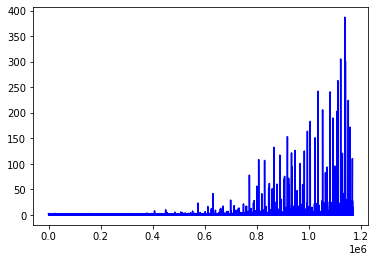

In [13]:
modeloTres = RedeNeuralModeloTres()

runnerTresCrossRMSpropBatch = RedeNeuralRunner(modeloTres,
                                     X_train, y_train,
                                     40,0.00015,'CrossEntropyLoss','RMSprop','runnerTresCrossRMSpropBatch',True)

runnerTresCrossRMSpropBatch.train()

In [15]:
runnerTresCrossRMSpropBatch.evaluate(X_test,y_test)

0.9049691802326326

In [16]:
runnerTresCrossRMSpropBatch.export()

Epoch: 39 Loss: 0.2616281807422638
Epoch: 39 Loss: 0.26947152614593506
Epoch: 39 Loss: 0.33150649070739746
Epoch: 39 Loss: 0.07344289124011993
Epoch: 39 Loss: 0.2465001344680786
Epoch: 39 Loss: 0.20014412701129913
Epoch: 39 Loss: 0.5719884634017944
Epoch: 39 Loss: 0.3183673024177551
Epoch: 39 Loss: 0.35526609420776367
Epoch: 39 Loss: 0.46610403060913086
Epoch: 39 Loss: 0.4122467339038849
Epoch: 39 Loss: 0.19570669531822205
Epoch: 39 Loss: 0.12076546251773834
Epoch: 39 Loss: 0.1911373734474182
Epoch: 39 Loss: 0.16909123957157135
Epoch: 39 Loss: 0.28336432576179504
Epoch: 39 Loss: 0.2012595385313034
Epoch: 39 Loss: 0.14227525889873505
Epoch: 39 Loss: 0.11407771706581116
Epoch: 39 Loss: 0.269405335187912
Epoch: 39 Loss: 0.5120348334312439
Epoch: 39 Loss: 0.29232513904571533
Epoch: 39 Loss: 0.2532973885536194
Epoch: 39 Loss: 0.31512388586997986
Epoch: 39 Loss: 0.4767075479030609
Epoch: 39 Loss: 0.14677636325359344
Epoch: 39 Loss: 0.42397087812423706
Epoch: 39 Loss: 0.31929123401641846
Epoc

Epoch: 39 Loss: 0.20938880741596222
Epoch: 39 Loss: 0.21462921798229218
Epoch: 39 Loss: 0.33058586716651917
Epoch: 39 Loss: 0.24694837629795074
Epoch: 39 Loss: 0.27796801924705505
Epoch: 39 Loss: 0.34063297510147095
Epoch: 39 Loss: 0.13788653910160065
Epoch: 39 Loss: 0.2955796718597412
Epoch: 39 Loss: 0.24167831242084503
Epoch: 39 Loss: 0.2870316207408905
Epoch: 39 Loss: 0.44381245970726013
Epoch: 39 Loss: 0.2937549948692322
Epoch: 39 Loss: 0.15162453055381775
Epoch: 39 Loss: 0.1671493649482727
Epoch: 39 Loss: 0.3396550118923187
Epoch: 39 Loss: 0.16511458158493042
Epoch: 39 Loss: 0.2849218249320984
Epoch: 39 Loss: 0.486939400434494
Epoch: 39 Loss: 0.23926985263824463
Epoch: 39 Loss: 0.5402319431304932
Epoch: 39 Loss: 0.194541335105896
Epoch: 39 Loss: 0.22208642959594727
Epoch: 39 Loss: 0.20195840299129486
Epoch: 39 Loss: 0.4899481534957886
Epoch: 39 Loss: 0.41849860548973083
Epoch: 39 Loss: 0.22051595151424408
Epoch: 39 Loss: 0.32488736510276794
Epoch: 39 Loss: 0.4538578689098358
Epoch

Epoch: 39 Loss: 0.32487350702285767
Epoch: 39 Loss: 0.22596067190170288
Epoch: 39 Loss: 0.3727419972419739
Epoch: 39 Loss: 0.45377200841903687
Epoch: 39 Loss: 0.08075138926506042
Epoch: 39 Loss: 0.19574598968029022
Epoch: 39 Loss: 0.22942203283309937
Epoch: 39 Loss: 0.20627209544181824
Epoch: 39 Loss: 0.13306738436222076
Epoch: 39 Loss: 0.4451361894607544
Epoch: 39 Loss: 0.11454848200082779
Epoch: 39 Loss: 0.46596598625183105
Epoch: 39 Loss: 0.2954156994819641
Epoch: 39 Loss: 0.335488885641098
Epoch: 39 Loss: 0.11849995702505112
Epoch: 39 Loss: 0.5923248529434204
Epoch: 39 Loss: 0.16900919377803802
Epoch: 39 Loss: 0.16116872429847717
Epoch: 39 Loss: 0.3238818049430847
Epoch: 39 Loss: 0.2443891316652298
Epoch: 39 Loss: 0.4311060905456543
Epoch: 39 Loss: 0.1745651662349701
Epoch: 39 Loss: 0.763173520565033
Epoch: 39 Loss: 0.3425876200199127
Epoch: 39 Loss: 0.1944757103919983
Epoch: 39 Loss: 0.20973870158195496
Epoch: 39 Loss: 0.1939159482717514
Epoch: 39 Loss: 0.39499756693840027
Epoch: 

Epoch: 39 Loss: 0.45374155044555664
Epoch: 39 Loss: 0.2662414610385895
Epoch: 39 Loss: 0.35613033175468445
Epoch: 39 Loss: 0.10743442922830582
Epoch: 39 Loss: 0.31480419635772705
Epoch: 39 Loss: 0.1911412626504898
Epoch: 39 Loss: 0.1619311273097992
Epoch: 39 Loss: 0.3809799253940582
Epoch: 39 Loss: 0.2655254602432251
Epoch: 39 Loss: 0.3113122582435608
Epoch: 39 Loss: 0.29547959566116333
Epoch: 39 Loss: 0.19081857800483704
Epoch: 39 Loss: 0.46544522047042847
Epoch: 39 Loss: 0.07293452322483063
Epoch: 39 Loss: 0.10960830748081207
Epoch: 39 Loss: 0.4609740078449249
Epoch: 39 Loss: 0.19917209446430206
Epoch: 39 Loss: 0.25301700830459595
Epoch: 39 Loss: 0.20307785272598267
Epoch: 39 Loss: 0.1492198258638382
Epoch: 39 Loss: 0.18971124291419983
Epoch: 39 Loss: 0.22933590412139893
Epoch: 39 Loss: 0.2784590721130371
Epoch: 39 Loss: 0.31907761096954346
Epoch: 39 Loss: 0.2003583461046219
Epoch: 39 Loss: 0.4103177487850189
Epoch: 39 Loss: 0.17560291290283203
Epoch: 39 Loss: 0.6892258524894714
Epoc

Epoch: 39 Loss: 0.11794345080852509
Epoch: 39 Loss: 0.47596120834350586
Epoch: 39 Loss: 0.3614262342453003
Epoch: 39 Loss: 0.22345693409442902
Epoch: 39 Loss: 0.29407089948654175
Epoch: 39 Loss: 0.8065693974494934
Epoch: 39 Loss: 0.13258369266986847
Epoch: 39 Loss: 0.35174787044525146
Epoch: 39 Loss: 0.29695430397987366
Epoch: 39 Loss: 0.17487964034080505
Epoch: 39 Loss: 0.2204279601573944
Epoch: 39 Loss: 0.4777460992336273
Epoch: 39 Loss: 0.22230841219425201
Epoch: 39 Loss: 0.2961452007293701
Epoch: 39 Loss: 0.13551132380962372
Epoch: 39 Loss: 0.40979063510894775
Epoch: 39 Loss: 0.21706750988960266
Epoch: 39 Loss: 0.21005283296108246
Epoch: 39 Loss: 0.19051234424114227
Epoch: 39 Loss: 0.44167953729629517
Epoch: 39 Loss: 0.37893033027648926
Epoch: 39 Loss: 0.7676964998245239
Epoch: 39 Loss: 0.16913512349128723
Epoch: 39 Loss: 0.43448302149772644
Epoch: 39 Loss: 0.17561902105808258
Epoch: 39 Loss: 0.17804399132728577
Epoch: 39 Loss: 0.1548086702823639
Epoch: 39 Loss: 0.2595402002334595


Epoch: 39 Loss: 0.1586364209651947
Epoch: 39 Loss: 0.28050023317337036
Epoch: 39 Loss: 0.26350197196006775
Epoch: 39 Loss: 0.31742385029792786
Epoch: 39 Loss: 0.5249679684638977
Epoch: 39 Loss: 0.5905057787895203
Epoch: 39 Loss: 0.20451030135154724
Epoch: 39 Loss: 0.09027030318975449
Epoch: 39 Loss: 0.6656976342201233
Epoch: 39 Loss: 0.36148354411125183
Epoch: 39 Loss: 0.303577184677124
Epoch: 39 Loss: 0.4062775671482086
Epoch: 39 Loss: 0.1927422732114792
Epoch: 39 Loss: 0.4796532392501831
Epoch: 39 Loss: 0.36000704765319824
Epoch: 39 Loss: 0.26922374963760376
Epoch: 39 Loss: 0.23094546794891357
Epoch: 39 Loss: 0.13430383801460266
Epoch: 39 Loss: 0.16798454523086548
Epoch: 39 Loss: 0.2678103744983673
Epoch: 39 Loss: 0.28802984952926636
Epoch: 39 Loss: 0.34231922030448914
Epoch: 39 Loss: 0.5821040868759155
Epoch: 39 Loss: 0.4901997745037079
Epoch: 39 Loss: 0.6873764395713806
Epoch: 39 Loss: 0.48143407702445984
Epoch: 39 Loss: 0.5045381188392639
Epoch: 39 Loss: 0.3982623219490051
Epoch: 

Epoch: 39 Loss: 0.6269587874412537
Epoch: 39 Loss: 0.2435261607170105
Epoch: 39 Loss: 0.08612585067749023
Epoch: 39 Loss: 0.12675990164279938
Epoch: 39 Loss: 0.21039970219135284
Epoch: 39 Loss: 0.39879924058914185
Epoch: 39 Loss: 0.2444896697998047
Epoch: 39 Loss: 0.3143042027950287
Epoch: 39 Loss: 0.37123212218284607
Epoch: 39 Loss: 0.41605323553085327
Epoch: 39 Loss: 0.3780714273452759
Epoch: 39 Loss: 0.4287216067314148
Epoch: 39 Loss: 0.2902297079563141
Epoch: 39 Loss: 0.23039914667606354
Epoch: 39 Loss: 0.2940274775028229
Epoch: 39 Loss: 0.3654230535030365
Epoch: 39 Loss: 0.35000717639923096
Epoch: 39 Loss: 0.3558495044708252
Epoch: 39 Loss: 0.48487815260887146
Epoch: 39 Loss: 0.6356981992721558
Epoch: 39 Loss: 0.4004148840904236
Epoch: 39 Loss: 0.15264038741588593
Epoch: 39 Loss: 0.1879565268754959
Epoch: 39 Loss: 0.2799185812473297
Epoch: 39 Loss: 0.1751510202884674
Epoch: 39 Loss: 0.5049409866333008
Epoch: 39 Loss: 0.18911248445510864
Epoch: 39 Loss: 0.19953769445419312
Epoch: 3

Epoch: 39 Loss: 0.18821902573108673
Epoch: 39 Loss: 0.2957645356655121
Epoch: 39 Loss: 0.15602289140224457
Epoch: 39 Loss: 0.21699996292591095
Epoch: 39 Loss: 0.5569937229156494
Epoch: 39 Loss: 0.24195389449596405
Epoch: 39 Loss: 0.23452487587928772
Epoch: 39 Loss: 0.4771304428577423
Epoch: 39 Loss: 0.2869197428226471
Epoch: 39 Loss: 0.41131263971328735
Epoch: 39 Loss: 0.2895863950252533
Epoch: 39 Loss: 0.14387167990207672
Epoch: 39 Loss: 0.14737959206104279
Epoch: 39 Loss: 0.3913534879684448
Epoch: 39 Loss: 0.2546996772289276
Epoch: 39 Loss: 0.15643037855625153
Epoch: 39 Loss: 0.4382517337799072
Epoch: 39 Loss: 0.36547982692718506
Epoch: 39 Loss: 0.5751955509185791
Epoch: 39 Loss: 0.19292543828487396
Epoch: 39 Loss: 0.36409157514572144
Epoch: 39 Loss: 0.2819218635559082
Epoch: 39 Loss: 0.3041532635688782
Epoch: 39 Loss: 0.2535308599472046
Epoch: 39 Loss: 0.44536978006362915
Epoch: 39 Loss: 0.10608847439289093
Epoch: 39 Loss: 0.2603452205657959
Epoch: 39 Loss: 0.19505082070827484
Epoch

Epoch: 39 Loss: 0.5395979285240173
Epoch: 39 Loss: 0.6912293434143066
Epoch: 39 Loss: 0.6681469082832336
Epoch: 39 Loss: 0.1337050199508667
Epoch: 39 Loss: 0.14796681702136993
Epoch: 39 Loss: 0.32290568947792053
Epoch: 39 Loss: 0.45004427433013916
Epoch: 39 Loss: 0.3837333917617798
Epoch: 39 Loss: 0.511500895023346
Epoch: 39 Loss: 0.3997378945350647
Epoch: 39 Loss: 0.17014352977275848
Epoch: 39 Loss: 0.1110384613275528
Epoch: 39 Loss: 0.4259960949420929
Epoch: 39 Loss: 0.31361207365989685
Epoch: 39 Loss: 0.2870451807975769
Epoch: 39 Loss: 0.44143709540367126
Epoch: 39 Loss: 0.19147102534770966
Epoch: 39 Loss: 0.324930876493454
Epoch: 39 Loss: 0.25053533911705017
Epoch: 39 Loss: 0.12262967973947525
Epoch: 39 Loss: 0.16155584156513214
Epoch: 39 Loss: 0.29477453231811523
Epoch: 39 Loss: 0.4246659576892853
Epoch: 39 Loss: 0.20937299728393555
Epoch: 39 Loss: 0.2624914050102234
Epoch: 39 Loss: 0.3544315993785858
Epoch: 39 Loss: 0.22252818942070007
Epoch: 39 Loss: 0.18648821115493774
Epoch: 3

Epoch: 39 Loss: 0.2702634036540985
Epoch: 39 Loss: 0.1828681081533432
Epoch: 39 Loss: 0.41384756565093994
Epoch: 39 Loss: 0.377086877822876
Epoch: 39 Loss: 0.3207210898399353
Epoch: 39 Loss: 0.24265770614147186
Epoch: 39 Loss: 0.6924030780792236
Epoch: 39 Loss: 0.13959625363349915
Epoch: 39 Loss: 0.2463402897119522
Epoch: 39 Loss: 0.6699904799461365
Epoch: 39 Loss: 0.5409902334213257
Epoch: 39 Loss: 0.22874535620212555
Epoch: 39 Loss: 0.34480300545692444
Epoch: 39 Loss: 0.14804737269878387
Epoch: 39 Loss: 0.19885392487049103
Epoch: 39 Loss: 0.1688975840806961
Epoch: 39 Loss: 0.20843765139579773
Epoch: 39 Loss: 0.21092438697814941
Epoch: 39 Loss: 0.35278499126434326
Epoch: 39 Loss: 0.10910727828741074
Epoch: 39 Loss: 0.3881480395793915
Epoch: 39 Loss: 0.2616066038608551
Epoch: 39 Loss: 0.21338210999965668
Epoch: 39 Loss: 0.24703268706798553
Epoch: 39 Loss: 0.17550340294837952
Epoch: 39 Loss: 0.2056148201227188
Epoch: 39 Loss: 0.19271740317344666
Epoch: 39 Loss: 0.31277036666870117
Epoch

Epoch: 39 Loss: 0.20483829081058502
Epoch: 39 Loss: 0.3571873605251312
Epoch: 39 Loss: 0.26721319556236267
Epoch: 39 Loss: 0.3652917742729187
Epoch: 39 Loss: 0.213871031999588
Epoch: 39 Loss: 0.2601538300514221
Epoch: 39 Loss: 0.3176669776439667
Epoch: 39 Loss: 0.1573154181241989
Epoch: 39 Loss: 0.323852002620697
Epoch: 39 Loss: 0.2588263750076294
Epoch: 39 Loss: 0.2896704375743866
Epoch: 39 Loss: 0.059284940361976624
Epoch: 39 Loss: 0.3794993460178375
Epoch: 39 Loss: 0.18100503087043762
Epoch: 39 Loss: 0.23110421001911163
Epoch: 39 Loss: 0.2151656150817871
Epoch: 39 Loss: 0.2567117512226105
Epoch: 39 Loss: 0.34093546867370605
Epoch: 39 Loss: 0.12412812560796738
Epoch: 39 Loss: 0.28907519578933716
Epoch: 39 Loss: 0.25442439317703247
Epoch: 39 Loss: 0.28428512811660767
Epoch: 39 Loss: 0.276842325925827
Epoch: 39 Loss: 0.33884233236312866
Epoch: 39 Loss: 0.15022709965705872
Epoch: 39 Loss: 0.3394968509674072
Epoch: 39 Loss: 0.4319588243961334
Epoch: 39 Loss: 0.5058865547180176
Epoch: 39 

Epoch: 39 Loss: 0.20022499561309814
Epoch: 39 Loss: 0.21989530324935913
Epoch: 39 Loss: 0.2824118435382843
Epoch: 39 Loss: 0.1882615089416504
Epoch: 39 Loss: 0.3505330979824066
Epoch: 39 Loss: 0.3058941960334778
Epoch: 39 Loss: 0.17706181108951569
Epoch: 39 Loss: 0.28262418508529663
Epoch: 39 Loss: 0.48955076932907104
Epoch: 39 Loss: 0.31719157099723816
Epoch: 39 Loss: 0.2938491106033325
Epoch: 39 Loss: 0.1528235226869583
Epoch: 39 Loss: 0.24101392924785614
Epoch: 39 Loss: 0.33941975235939026
Epoch: 39 Loss: 0.3026536703109741
Epoch: 39 Loss: 0.20612797141075134
Epoch: 39 Loss: 0.17670807242393494
Epoch: 39 Loss: 0.12847267091274261
Epoch: 39 Loss: 0.4395100176334381
Epoch: 39 Loss: 0.18248043954372406
Epoch: 39 Loss: 0.24811317026615143
Epoch: 39 Loss: 0.3241213858127594
Epoch: 39 Loss: 0.43936124444007874
Epoch: 39 Loss: 0.3182564973831177
Epoch: 39 Loss: 0.14983400702476501
Epoch: 39 Loss: 0.2038504034280777
Epoch: 39 Loss: 0.44122442603111267
Epoch: 39 Loss: 0.1985824853181839
Epoc

Epoch: 39 Loss: 0.3244868218898773
Epoch: 39 Loss: 0.3947586119174957
Epoch: 39 Loss: 0.33762431144714355
Epoch: 39 Loss: 0.2810128927230835
Epoch: 39 Loss: 0.1795099824666977
Epoch: 39 Loss: 0.13154198229312897
Epoch: 39 Loss: 0.3824799954891205
Epoch: 39 Loss: 0.36613452434539795
Epoch: 39 Loss: 0.5090203285217285
Epoch: 39 Loss: 0.2735236585140228
Epoch: 39 Loss: 0.32242751121520996
Epoch: 39 Loss: 0.31559309363365173
Epoch: 39 Loss: 0.26069626212120056
Epoch: 39 Loss: 0.40451157093048096
Epoch: 39 Loss: 0.17315883934497833
Epoch: 39 Loss: 0.32278403639793396
Epoch: 39 Loss: 0.36805063486099243
Epoch: 39 Loss: 0.2811734676361084
Epoch: 39 Loss: 0.590260922908783
Epoch: 39 Loss: 0.21014925837516785
Epoch: 39 Loss: 0.13176512718200684
Epoch: 39 Loss: 0.27175602316856384
Epoch: 39 Loss: 0.2780618965625763
Epoch: 39 Loss: 0.25005683302879333
Epoch: 39 Loss: 0.17283761501312256
Epoch: 39 Loss: 0.45977354049682617
Epoch: 39 Loss: 0.6841387152671814
Epoch: 39 Loss: 0.20594297349452972
Epoc

Epoch: 39 Loss: 0.26513078808784485
Epoch: 39 Loss: 0.2835442125797272
Epoch: 39 Loss: 0.5973336100578308
Epoch: 39 Loss: 0.24634519219398499
Epoch: 39 Loss: 0.2162305861711502
Epoch: 39 Loss: 0.2480202466249466
Epoch: 39 Loss: 0.6160835027694702
Epoch: 39 Loss: 0.38300713896751404
Epoch: 39 Loss: 0.30803340673446655
Epoch: 39 Loss: 0.27995792031288147
Epoch: 39 Loss: 0.3392670154571533
Epoch: 39 Loss: 0.10733239352703094
Epoch: 39 Loss: 0.36667123436927795
Epoch: 39 Loss: 0.3043249547481537
Epoch: 39 Loss: 0.29918932914733887
Epoch: 39 Loss: 0.4304184913635254
Epoch: 39 Loss: 0.13362206518650055
Epoch: 39 Loss: 0.3197472393512726
Epoch: 39 Loss: 0.2410801649093628
Epoch: 39 Loss: 0.2892966568470001
Epoch: 39 Loss: 0.5354917645454407
Epoch: 39 Loss: 0.23752614855766296
Epoch: 39 Loss: 0.33004793524742126
Epoch: 39 Loss: 0.2838316261768341
Epoch: 39 Loss: 0.26631635427474976
Epoch: 39 Loss: 0.28121522068977356
Epoch: 39 Loss: 0.08319675177335739
Epoch: 39 Loss: 0.31415843963623047
Epoch

Epoch: 39 Loss: 0.3905603289604187
Epoch: 39 Loss: 0.3394884169101715
Epoch: 39 Loss: 0.2544320523738861
Epoch: 39 Loss: 0.44456735253334045
Epoch: 39 Loss: 0.23447737097740173
Epoch: 39 Loss: 0.10764173418283463
Epoch: 39 Loss: 0.3158797025680542
Epoch: 39 Loss: 0.22563757002353668
Epoch: 39 Loss: 0.2706122398376465
Epoch: 39 Loss: 0.32908686995506287
Epoch: 39 Loss: 0.21186800301074982
Epoch: 39 Loss: 0.28315269947052
Epoch: 39 Loss: 0.31886470317840576
Epoch: 39 Loss: 0.09445294737815857
Epoch: 39 Loss: 0.6282556056976318
Epoch: 39 Loss: 0.6302452087402344
Epoch: 39 Loss: 0.1730109304189682
Epoch: 39 Loss: 0.45330825448036194
Epoch: 39 Loss: 0.5234225392341614
Epoch: 39 Loss: 0.32178643345832825
Epoch: 39 Loss: 0.3764195442199707
Epoch: 39 Loss: 0.3287300169467926
Epoch: 39 Loss: 0.11718947440385818
Epoch: 39 Loss: 0.34815776348114014
Epoch: 39 Loss: 0.43189704418182373
Epoch: 39 Loss: 0.2150285243988037
Epoch: 39 Loss: 0.41036978363990784
Epoch: 39 Loss: 0.2936873733997345
Epoch: 3

Epoch: 39 Loss: 0.3974185883998871
Epoch: 39 Loss: 0.16278047859668732
Epoch: 39 Loss: 0.324786901473999
Epoch: 39 Loss: 0.3981510102748871
Epoch: 39 Loss: 0.39594754576683044
Epoch: 39 Loss: 0.41518670320510864
Epoch: 39 Loss: 0.23373185098171234
Epoch: 39 Loss: 0.2887549102306366
Epoch: 39 Loss: 0.34285998344421387
Epoch: 39 Loss: 0.17516443133354187
Epoch: 39 Loss: 0.38735368847846985
Epoch: 39 Loss: 0.11655735224485397
Epoch: 39 Loss: 0.1824244111776352
Epoch: 39 Loss: 0.42673760652542114
Epoch: 39 Loss: 0.039637137204408646
Epoch: 39 Loss: 0.7028672695159912
Epoch: 39 Loss: 0.2851751744747162
Epoch: 39 Loss: 0.25983941555023193
Epoch: 39 Loss: 0.34529590606689453
Epoch: 39 Loss: 0.12024395167827606
Epoch: 39 Loss: 0.21264725923538208
Epoch: 39 Loss: 0.07888396829366684
Epoch: 39 Loss: 0.2285504937171936
Epoch: 39 Loss: 0.23343928158283234
Epoch: 39 Loss: 0.340422660112381
Epoch: 39 Loss: 0.1662035584449768
Epoch: 39 Loss: 0.16789127886295319
Epoch: 39 Loss: 0.5037392377853394
Epoc

Epoch: 39 Loss: 0.22209912538528442
Epoch: 39 Loss: 0.3835020959377289
Epoch: 39 Loss: 0.5505195260047913
Epoch: 39 Loss: 0.2492699772119522
Epoch: 39 Loss: 0.2528260052204132
Epoch: 39 Loss: 0.35396483540534973
Epoch: 39 Loss: 0.28646227717399597
Epoch: 39 Loss: 0.24136902391910553
Epoch: 39 Loss: 0.16120265424251556
Epoch: 39 Loss: 0.28391531109809875
Epoch: 39 Loss: 0.39570480585098267
Epoch: 39 Loss: 0.2796500623226166
Epoch: 39 Loss: 0.28560611605644226
Epoch: 39 Loss: 0.44600313901901245
Epoch: 39 Loss: 0.40888890624046326
Epoch: 39 Loss: 0.4974830150604248
Epoch: 39 Loss: 0.20659692585468292
Epoch: 39 Loss: 0.28430503606796265
Epoch: 39 Loss: 0.23916663229465485
Epoch: 39 Loss: 0.27748897671699524
Epoch: 39 Loss: 0.18849393725395203
Epoch: 39 Loss: 0.2432311773300171
Epoch: 39 Loss: 0.45687344670295715
Epoch: 39 Loss: 0.37684395909309387
Epoch: 39 Loss: 0.3035482168197632
Epoch: 39 Loss: 0.1968466341495514
Epoch: 39 Loss: 0.29731467366218567
Epoch: 39 Loss: 0.2480241358280182
Ep

Epoch: 39 Loss: 0.3251499533653259
Epoch: 39 Loss: 0.3427382707595825
Epoch: 39 Loss: 0.18630941212177277
Epoch: 39 Loss: 0.1702243834733963
Epoch: 39 Loss: 0.3191397190093994
Epoch: 39 Loss: 0.09714815020561218
Epoch: 39 Loss: 0.2641979455947876
Epoch: 39 Loss: 0.344526082277298
Epoch: 39 Loss: 0.34834617376327515
Epoch: 39 Loss: 0.42486119270324707
Epoch: 39 Loss: 0.29063549637794495
Epoch: 39 Loss: 0.7769168615341187
Epoch: 39 Loss: 0.33412402868270874
Epoch: 39 Loss: 0.40301698446273804
Epoch: 39 Loss: 0.2314005196094513
Epoch: 39 Loss: 0.32827475666999817
Epoch: 39 Loss: 0.27362188696861267
Epoch: 39 Loss: 0.4845940172672272
Epoch: 39 Loss: 0.19954043626785278
Epoch: 39 Loss: 0.23075294494628906
Epoch: 39 Loss: 0.26661285758018494
Epoch: 39 Loss: 0.3235255181789398
Epoch: 39 Loss: 0.33398666977882385
Epoch: 39 Loss: 0.13038912415504456
Epoch: 39 Loss: 0.5099527835845947
Epoch: 39 Loss: 0.40248236060142517
Epoch: 39 Loss: 0.38290318846702576
Epoch: 39 Loss: 0.20377464592456818
Epoc

Epoch: 39 Loss: 0.2574315667152405
Epoch: 39 Loss: 0.2851382791996002
Epoch: 39 Loss: 0.2989128530025482
Epoch: 39 Loss: 0.1768001914024353
Epoch: 39 Loss: 0.16886155307292938
Epoch: 39 Loss: 0.36293140053749084
Epoch: 39 Loss: 0.346701979637146
Epoch: 39 Loss: 0.3056477904319763
Epoch: 39 Loss: 0.1304950714111328
Epoch: 39 Loss: 0.5633723735809326
Epoch: 39 Loss: 0.24715834856033325
Epoch: 39 Loss: 0.34638214111328125
Epoch: 39 Loss: 0.5205695033073425
Epoch: 39 Loss: 0.3550936281681061
Epoch: 39 Loss: 0.20999519526958466
Epoch: 39 Loss: 0.43555983901023865
Epoch: 39 Loss: 0.3430178761482239
Epoch: 39 Loss: 0.4298925995826721
Epoch: 39 Loss: 0.44093969464302063
Epoch: 39 Loss: 0.30765724182128906
Epoch: 39 Loss: 0.16223901510238647
Epoch: 39 Loss: 0.3591247498989105
Epoch: 39 Loss: 0.3422141969203949
Epoch: 39 Loss: 0.47174787521362305
Epoch: 39 Loss: 0.49076786637306213
Epoch: 39 Loss: 0.39802736043930054
Epoch: 39 Loss: 0.11446326971054077
Epoch: 39 Loss: 0.2328416407108307
Epoch: 3

Epoch: 39 Loss: 0.5011980533599854
Epoch: 39 Loss: 0.4011506736278534
Epoch: 39 Loss: 0.42700138688087463
Epoch: 39 Loss: 0.3626391589641571
Epoch: 39 Loss: 0.3572709560394287
Epoch: 39 Loss: 0.3586684763431549
Epoch: 39 Loss: 0.30645260214805603
Epoch: 39 Loss: 0.4061771631240845
Epoch: 39 Loss: 0.35013720393180847
Epoch: 39 Loss: 0.174183189868927
Epoch: 39 Loss: 0.3343592584133148
Epoch: 39 Loss: 0.28593727946281433
Epoch: 39 Loss: 0.26333484053611755
Epoch: 39 Loss: 0.31700822710990906
Epoch: 39 Loss: 0.2563243806362152
Epoch: 39 Loss: 0.24551226198673248
Epoch: 39 Loss: 0.09016521275043488
Epoch: 39 Loss: 0.40390104055404663
Epoch: 39 Loss: 0.3779672086238861
Epoch: 39 Loss: 0.24116778373718262
Epoch: 39 Loss: 0.22928953170776367
Epoch: 39 Loss: 0.1699841171503067
Epoch: 39 Loss: 0.22679701447486877
Epoch: 39 Loss: 0.3131170868873596
Epoch: 39 Loss: 0.5980762839317322
Epoch: 39 Loss: 0.4380665421485901
Epoch: 39 Loss: 0.3095751404762268
Epoch: 39 Loss: 0.16235379874706268
Epoch: 3

Epoch: 39 Loss: 0.47749435901641846
Epoch: 39 Loss: 0.11642543971538544
Epoch: 39 Loss: 0.21817132830619812
Epoch: 39 Loss: 0.20762215554714203
Epoch: 39 Loss: 0.28882306814193726
Epoch: 39 Loss: 0.1890878826379776
Epoch: 39 Loss: 0.34223851561546326
Epoch: 39 Loss: 0.31933334469795227
Epoch: 39 Loss: 0.0569925382733345
Epoch: 39 Loss: 0.2481243759393692
Epoch: 39 Loss: 0.4760468602180481
Epoch: 39 Loss: 0.36136457324028015
Epoch: 39 Loss: 0.3643885552883148
Epoch: 39 Loss: 0.27705225348472595
Epoch: 39 Loss: 0.22020620107650757
Epoch: 39 Loss: 0.24655768275260925
Epoch: 39 Loss: 0.4811071753501892
Epoch: 39 Loss: 0.25542786717414856
Epoch: 39 Loss: 0.6851537227630615
Epoch: 39 Loss: 0.1477988213300705
Epoch: 39 Loss: 0.25424936413764954
Epoch: 39 Loss: 0.10763726383447647
Epoch: 39 Loss: 0.3219698369503021
Epoch: 39 Loss: 0.17527779936790466
Epoch: 39 Loss: 0.2939210534095764
Epoch: 39 Loss: 0.29547953605651855
Epoch: 39 Loss: 0.1699194312095642
Epoch: 39 Loss: 0.25964510440826416
Epo

Epoch: 39 Loss: 0.31244373321533203
Epoch: 39 Loss: 0.4824758768081665
Epoch: 39 Loss: 0.5397337675094604
Epoch: 39 Loss: 0.4349501430988312
Epoch: 39 Loss: 0.16639697551727295
Epoch: 39 Loss: 0.3371681869029999
Epoch: 39 Loss: 0.2851315438747406
Epoch: 39 Loss: 0.2638809382915497
Epoch: 39 Loss: 0.4655914306640625
Epoch: 39 Loss: 0.16120146214962006
Epoch: 39 Loss: 0.3522645831108093
Epoch: 39 Loss: 0.25186240673065186
Epoch: 39 Loss: 0.16767974197864532
Epoch: 39 Loss: 0.2567199468612671
Epoch: 39 Loss: 0.5011793375015259
Epoch: 39 Loss: 0.20563502609729767
Epoch: 39 Loss: 0.38592076301574707
Epoch: 39 Loss: 0.523029088973999
Epoch: 39 Loss: 0.45119139552116394
Epoch: 39 Loss: 0.7396696209907532
Epoch: 39 Loss: 0.2357727438211441
Epoch: 39 Loss: 0.39741426706314087
Epoch: 39 Loss: 0.37970784306526184
Epoch: 39 Loss: 0.10552575439214706
Epoch: 39 Loss: 0.317720890045166
Epoch: 39 Loss: 0.27699407935142517
Epoch: 39 Loss: 0.23113958537578583
Epoch: 39 Loss: 0.3532296419143677
Epoch: 39

Epoch: 39 Loss: 0.2518097460269928
Epoch: 39 Loss: 0.2450118213891983
Epoch: 39 Loss: 0.3911813497543335
Epoch: 39 Loss: 0.41943714022636414
Epoch: 39 Loss: 0.16913697123527527
Epoch: 39 Loss: 0.24012687802314758
Epoch: 39 Loss: 0.2769777774810791
Epoch: 39 Loss: 0.25388869643211365
Epoch: 39 Loss: 0.4126284122467041
Epoch: 39 Loss: 0.29044875502586365
Epoch: 39 Loss: 0.2124345749616623
Epoch: 39 Loss: 0.32865026593208313
Epoch: 39 Loss: 0.28912702202796936
Epoch: 39 Loss: 0.3786529004573822
Epoch: 39 Loss: 0.5915130376815796
Epoch: 39 Loss: 0.4642426371574402
Epoch: 39 Loss: 0.26232728362083435
Epoch: 39 Loss: 0.2023943066596985
Epoch: 39 Loss: 0.5697198510169983
Epoch: 39 Loss: 0.21542535722255707
Epoch: 39 Loss: 0.34304824471473694
Epoch: 39 Loss: 0.12447548657655716
Epoch: 39 Loss: 0.5633752346038818
Epoch: 39 Loss: 0.36019742488861084
Epoch: 39 Loss: 0.1926065981388092
Epoch: 39 Loss: 0.27367591857910156
Epoch: 39 Loss: 0.20539820194244385
Epoch: 39 Loss: 0.17492960393428802
Epoch

Epoch: 39 Loss: 0.23689565062522888
Epoch: 39 Loss: 0.1605842113494873
Epoch: 39 Loss: 0.19325782358646393
Epoch: 39 Loss: 0.21717892587184906
Epoch: 39 Loss: 0.17719818651676178
Epoch: 39 Loss: 0.2958250939846039
Epoch: 39 Loss: 0.29116547107696533
Epoch: 39 Loss: 0.6340664625167847
Epoch: 39 Loss: 0.2264946550130844
Epoch: 39 Loss: 0.1468449980020523
Epoch: 39 Loss: 0.18428243696689606
Epoch: 39 Loss: 0.36465877294540405
Epoch: 39 Loss: 0.5779179334640503
Epoch: 39 Loss: 0.248097226023674
Epoch: 39 Loss: 0.3050451874732971
Epoch: 39 Loss: 0.400690495967865
Epoch: 39 Loss: 0.19677913188934326
Epoch: 39 Loss: 0.2074137181043625
Epoch: 39 Loss: 0.3497677445411682
Epoch: 39 Loss: 0.14389486610889435
Epoch: 39 Loss: 0.2193736732006073
Epoch: 39 Loss: 0.27119681239128113
Epoch: 39 Loss: 0.13142679631710052
Epoch: 39 Loss: 0.13350732624530792
Epoch: 39 Loss: 0.13476869463920593
Epoch: 39 Loss: 0.2530997693538666
Epoch: 39 Loss: 0.3506511151790619
Epoch: 39 Loss: 0.12283337116241455
Epoch: 3

Epoch: 39 Loss: 0.5050020813941956
Epoch: 39 Loss: 0.15282543003559113
Epoch: 39 Loss: 0.3066260516643524
Epoch: 39 Loss: 0.45366308093070984
Epoch: 39 Loss: 0.3868824541568756
Epoch: 39 Loss: 0.14542600512504578
Epoch: 39 Loss: 0.17099113762378693
Epoch: 39 Loss: 0.24696889519691467
Epoch: 39 Loss: 0.43272864818573
Epoch: 39 Loss: 0.22991521656513214
Epoch: 39 Loss: 0.2762381434440613
Epoch: 39 Loss: 0.35340437293052673
Epoch: 39 Loss: 0.19933883845806122
Epoch: 39 Loss: 0.1521981954574585
Epoch: 39 Loss: 0.10483941435813904
Epoch: 39 Loss: 0.19706907868385315
Epoch: 39 Loss: 0.15950964391231537
Epoch: 39 Loss: 0.23108112812042236
Epoch: 39 Loss: 0.25272905826568604
Epoch: 39 Loss: 0.18745577335357666
Epoch: 39 Loss: 0.18982376158237457
Epoch: 39 Loss: 0.2961287200450897
Epoch: 39 Loss: 0.2019687443971634
Epoch: 39 Loss: 0.27722644805908203
Epoch: 39 Loss: 0.21165820956230164
Epoch: 39 Loss: 0.2751268744468689
Epoch: 39 Loss: 0.20579616725444794
Epoch: 39 Loss: 0.2255541831254959
Epoc

Epoch: 39 Loss: 0.3161144256591797
Epoch: 39 Loss: 0.15330229699611664
Epoch: 39 Loss: 0.3070138394832611
Epoch: 39 Loss: 0.2859303653240204
Epoch: 39 Loss: 0.24891191720962524
Epoch: 39 Loss: 0.6306599378585815
Epoch: 39 Loss: 0.5956276655197144
Epoch: 39 Loss: 0.22238966822624207
Epoch: 39 Loss: 0.37385857105255127
Epoch: 39 Loss: 0.23260018229484558
Epoch: 39 Loss: 0.1354934722185135
Epoch: 39 Loss: 0.2572866976261139
Epoch: 39 Loss: 0.36662453413009644
Epoch: 39 Loss: 0.19734658300876617
Epoch: 39 Loss: 0.43557995557785034
Epoch: 39 Loss: 0.4808464050292969
Epoch: 39 Loss: 0.2877228260040283
Epoch: 39 Loss: 0.3041972219944
Epoch: 39 Loss: 0.29315343499183655
Epoch: 39 Loss: 0.16213585436344147
Epoch: 39 Loss: 0.2900526225566864
Epoch: 39 Loss: 0.3442816436290741
Epoch: 39 Loss: 0.40656301379203796
Epoch: 39 Loss: 0.33927297592163086
Epoch: 39 Loss: 0.18910127878189087
Epoch: 39 Loss: 0.32286176085472107
Epoch: 39 Loss: 0.382129043340683
Epoch: 39 Loss: 0.19399473071098328
Epoch: 39

Epoch: 39 Loss: 0.5889341235160828
Epoch: 39 Loss: 0.606166660785675
Epoch: 39 Loss: 0.32042741775512695
Epoch: 39 Loss: 0.15881234407424927
Epoch: 39 Loss: 0.3551780581474304
Epoch: 39 Loss: 0.08126824349164963
Epoch: 39 Loss: 0.4254858195781708
Epoch: 39 Loss: 0.09012731164693832
Epoch: 39 Loss: 0.22970564663410187
Epoch: 39 Loss: 0.23721304535865784
Epoch: 39 Loss: 0.3638766407966614
Epoch: 39 Loss: 0.37502068281173706
Epoch: 39 Loss: 0.3660125136375427
Epoch: 39 Loss: 0.20401467382907867
Epoch: 39 Loss: 0.2772863805294037
Epoch: 39 Loss: 0.25932151079177856
Epoch: 39 Loss: 0.24354007840156555
Epoch: 39 Loss: 0.27552980184555054
Epoch: 39 Loss: 0.24031411111354828
Epoch: 39 Loss: 0.27428290247917175
Epoch: 39 Loss: 0.3173896372318268
Epoch: 39 Loss: 0.23661065101623535
Epoch: 39 Loss: 0.63390052318573
Epoch: 39 Loss: 0.18572749197483063
Epoch: 39 Loss: 0.4152846336364746
Epoch: 39 Loss: 0.3382177948951721
Epoch: 39 Loss: 0.24981676042079926
Epoch: 39 Loss: 0.4572688639163971
Epoch: 

Epoch: 39 Loss: 0.5967822074890137
Epoch: 39 Loss: 0.31159332394599915
Epoch: 39 Loss: 0.5620332956314087
Epoch: 39 Loss: 0.3308340609073639
Epoch: 39 Loss: 0.4153166115283966
Epoch: 39 Loss: 0.14883068203926086
Epoch: 39 Loss: 0.3062012493610382
Epoch: 39 Loss: 0.3159053921699524
Epoch: 39 Loss: 0.24513262510299683
Epoch: 39 Loss: 0.3116353750228882
Epoch: 39 Loss: 0.1583358496427536
Epoch: 39 Loss: 0.26063618063926697
Epoch: 39 Loss: 0.23593029379844666
Epoch: 39 Loss: 0.19210979342460632
Epoch: 39 Loss: 0.2192772626876831
Epoch: 39 Loss: 0.1859884262084961
Epoch: 39 Loss: 0.14481034874916077
Epoch: 39 Loss: 0.20071426033973694
Epoch: 39 Loss: 0.15591345727443695
Epoch: 39 Loss: 0.4802917540073395
Epoch: 39 Loss: 0.17216429114341736
Epoch: 39 Loss: 0.21038922667503357
Epoch: 39 Loss: 0.2965318560600281
Epoch: 39 Loss: 0.30729198455810547
Epoch: 39 Loss: 0.26486122608184814
Epoch: 39 Loss: 0.15280045568943024
Epoch: 39 Loss: 0.2896359860897064
Epoch: 39 Loss: 0.054812073707580566
Epoc

Epoch: 39 Loss: 0.33753418922424316
Epoch: 39 Loss: 0.4744512438774109
Epoch: 39 Loss: 0.2015029788017273
Epoch: 39 Loss: 0.35381168127059937
Epoch: 39 Loss: 0.3260578513145447
Epoch: 39 Loss: 0.364920049905777
Epoch: 39 Loss: 0.20801977813243866
Epoch: 39 Loss: 0.42399585247039795
Epoch: 39 Loss: 0.3036337196826935
Epoch: 39 Loss: 0.3927095830440521
Epoch: 39 Loss: 0.14727963507175446
Epoch: 39 Loss: 0.17283442616462708
Epoch: 39 Loss: 0.3480924963951111
Epoch: 39 Loss: 0.4073721766471863
Epoch: 39 Loss: 0.37546730041503906
Epoch: 39 Loss: 0.3487496078014374
Epoch: 39 Loss: 0.2442338615655899
Epoch: 39 Loss: 0.35809966921806335
Epoch: 39 Loss: 0.3947232663631439
Epoch: 39 Loss: 0.16341355443000793
Epoch: 39 Loss: 0.4969603419303894
Epoch: 39 Loss: 0.1255563646554947
Epoch: 39 Loss: 0.3999985456466675
Epoch: 39 Loss: 0.5039345026016235
Epoch: 39 Loss: 0.2862600088119507
Epoch: 39 Loss: 0.2214851826429367
Epoch: 39 Loss: 0.27377793192863464
Epoch: 39 Loss: 0.24431951344013214
Epoch: 39 

Epoch: 39 Loss: 0.5338059663772583
Epoch: 39 Loss: 0.5893716812133789
Epoch: 39 Loss: 0.1792195439338684
Epoch: 39 Loss: 0.5854665637016296
Epoch: 39 Loss: 0.5651940703392029
Epoch: 39 Loss: 0.1928900182247162
Epoch: 39 Loss: 0.3831615746021271
Epoch: 39 Loss: 0.204252690076828
Epoch: 39 Loss: 0.22114332020282745
Epoch: 39 Loss: 0.2829625904560089
Epoch: 39 Loss: 0.32705289125442505
Epoch: 39 Loss: 0.29452481865882874
Epoch: 39 Loss: 0.2631659209728241
Epoch: 39 Loss: 0.23888114094734192
Epoch: 39 Loss: 0.38750866055488586
Epoch: 39 Loss: 0.11265876889228821
Epoch: 39 Loss: 0.17216241359710693
Epoch: 39 Loss: 0.3212648928165436
Epoch: 39 Loss: 0.20483455061912537
Epoch: 39 Loss: 0.4249069094657898
Epoch: 39 Loss: 0.398847371339798
Epoch: 39 Loss: 0.19361698627471924
Epoch: 39 Loss: 0.41883957386016846
Epoch: 39 Loss: 0.4617241621017456
Epoch: 39 Loss: 0.16230657696723938
Epoch: 39 Loss: 0.4545346200466156
Epoch: 39 Loss: 0.4522446095943451
Epoch: 39 Loss: 0.29114821553230286
Epoch: 39 

Epoch: 39 Loss: 0.08810348063707352
Epoch: 39 Loss: 0.4921063482761383
Epoch: 39 Loss: 0.20418274402618408
Epoch: 39 Loss: 0.2081732451915741
Epoch: 39 Loss: 0.344347208738327
Epoch: 39 Loss: 0.1868983656167984
Epoch: 39 Loss: 0.20390789210796356
Epoch: 39 Loss: 0.2458309829235077
Epoch: 39 Loss: 0.07656434923410416
Epoch: 39 Loss: 0.3944067060947418
Epoch: 39 Loss: 0.23906192183494568
Epoch: 39 Loss: 0.5276930928230286
Epoch: 39 Loss: 0.309004545211792
Epoch: 39 Loss: 0.45151573419570923
Epoch: 39 Loss: 0.40326371788978577
Epoch: 39 Loss: 0.1404990255832672
Epoch: 39 Loss: 0.16716240346431732
Epoch: 39 Loss: 0.35846617817878723
Epoch: 39 Loss: 0.4575994610786438
Epoch: 39 Loss: 0.29906708002090454
Epoch: 39 Loss: 0.33490100502967834
Epoch: 39 Loss: 0.24793854355812073
Epoch: 39 Loss: 0.2307567149400711
Epoch: 39 Loss: 0.3245466351509094
Epoch: 39 Loss: 0.37941575050354004
Epoch: 39 Loss: 0.2615605890750885
Epoch: 39 Loss: 0.4114355742931366
Epoch: 39 Loss: 0.290698379278183
Epoch: 39 

Epoch: 39 Loss: 0.10607067495584488
Epoch: 39 Loss: 0.24738307297229767
Epoch: 39 Loss: 0.4351143538951874
Epoch: 39 Loss: 0.12545804679393768
Epoch: 39 Loss: 0.21173903346061707
Epoch: 39 Loss: 0.24803465604782104
Epoch: 39 Loss: 0.4896787405014038
Epoch: 39 Loss: 0.29578882455825806
Epoch: 39 Loss: 0.2641576826572418
Epoch: 39 Loss: 0.21511057019233704
Epoch: 39 Loss: 0.2669411599636078
Epoch: 39 Loss: 0.6054871678352356
Epoch: 39 Loss: 0.2016632854938507
Epoch: 39 Loss: 0.15092769265174866
Epoch: 39 Loss: 0.06895957887172699
Epoch: 39 Loss: 0.5116446018218994
Epoch: 39 Loss: 0.23535166680812836
Epoch: 39 Loss: 0.28980493545532227
Epoch: 39 Loss: 0.3768855035305023
Epoch: 39 Loss: 0.2704083323478699
Epoch: 39 Loss: 0.570329487323761
Epoch: 39 Loss: 0.20016686618328094
Epoch: 39 Loss: 0.5570451617240906
Epoch: 39 Loss: 0.16921380162239075
Epoch: 39 Loss: 0.048949357122182846
Epoch: 39 Loss: 0.1645195186138153
Epoch: 39 Loss: 0.21811671555042267
Epoch: 39 Loss: 0.27009516954421997
Epoc

Epoch: 39 Loss: 0.2155534029006958
Epoch: 39 Loss: 0.5755289196968079
Epoch: 39 Loss: 0.2563963234424591
Epoch: 39 Loss: 0.4305938482284546
Epoch: 39 Loss: 0.16895157098770142
Epoch: 39 Loss: 0.394458144903183
Epoch: 39 Loss: 0.31032872200012207
Epoch: 39 Loss: 0.1482875794172287
Epoch: 39 Loss: 0.3384171724319458
Epoch: 39 Loss: 0.35286441445350647
Epoch: 39 Loss: 0.31629490852355957
Epoch: 39 Loss: 0.36751458048820496
Epoch: 39 Loss: 0.1350240409374237
Epoch: 39 Loss: 0.48816654086112976
Epoch: 39 Loss: 0.10573438555002213
Epoch: 39 Loss: 0.3581540286540985
Epoch: 39 Loss: 0.37370237708091736
Epoch: 39 Loss: 0.3097110092639923
Epoch: 39 Loss: 0.30283790826797485
Epoch: 39 Loss: 0.3310094177722931
Epoch: 39 Loss: 0.5234029293060303
Epoch: 39 Loss: 0.1879543662071228
Epoch: 39 Loss: 0.15896132588386536
Epoch: 39 Loss: 0.24731580913066864
Epoch: 39 Loss: 0.22646401822566986
Epoch: 39 Loss: 0.2724803388118744
Epoch: 39 Loss: 0.42136499285697937
Epoch: 39 Loss: 0.2967562675476074
Epoch: 3

Epoch: 39 Loss: 0.319395512342453
Epoch: 39 Loss: 0.7515199184417725
Epoch: 39 Loss: 0.18817554414272308
Epoch: 39 Loss: 0.33227697014808655
Epoch: 39 Loss: 0.33924686908721924
Epoch: 39 Loss: 0.16317801177501678
Epoch: 39 Loss: 0.23799563944339752
Epoch: 39 Loss: 0.26680663228034973
Epoch: 39 Loss: 0.2592051327228546
Epoch: 39 Loss: 0.4491821527481079
Epoch: 39 Loss: 0.22737736999988556
Epoch: 39 Loss: 0.44667813181877136
Epoch: 39 Loss: 0.2994178235530853
Epoch: 39 Loss: 0.4895108640193939
Epoch: 39 Loss: 0.1447286456823349
Epoch: 39 Loss: 0.5565484762191772
Epoch: 39 Loss: 0.34797585010528564
Epoch: 39 Loss: 0.4703086316585541
Epoch: 39 Loss: 0.42452317476272583
Epoch: 39 Loss: 0.37093761563301086
Epoch: 39 Loss: 0.3429369032382965
Epoch: 39 Loss: 0.3186589181423187
Epoch: 39 Loss: 0.25942882895469666
Epoch: 39 Loss: 0.4817558228969574
Epoch: 39 Loss: 0.21693287789821625
Epoch: 39 Loss: 0.2273939698934555
Epoch: 39 Loss: 0.12987756729125977
Epoch: 39 Loss: 0.1972668319940567
Epoch: 

Epoch: 39 Loss: 0.16517126560211182
Epoch: 39 Loss: 0.09579741954803467
Epoch: 39 Loss: 0.46043187379837036
Epoch: 39 Loss: 0.4736027121543884
Epoch: 39 Loss: 0.28666529059410095
Epoch: 39 Loss: 0.5584353804588318
Epoch: 39 Loss: 0.3512444496154785
Epoch: 39 Loss: 0.31664860248565674
Epoch: 39 Loss: 0.29530006647109985
Epoch: 39 Loss: 0.2393690049648285
Epoch: 39 Loss: 0.09374819695949554
Epoch: 39 Loss: 0.432140052318573
Epoch: 39 Loss: 0.19297313690185547
Epoch: 39 Loss: 0.3818897306919098
Epoch: 39 Loss: 0.4076811969280243
Epoch: 39 Loss: 0.5311763286590576
Epoch: 39 Loss: 0.15985257923603058
Epoch: 39 Loss: 0.46026721596717834
Epoch: 39 Loss: 0.20525610446929932
Epoch: 39 Loss: 0.1572260707616806
Epoch: 39 Loss: 0.2915121912956238
Epoch: 39 Loss: 0.30317991971969604
Epoch: 39 Loss: 0.24831552803516388
Epoch: 39 Loss: 0.33457931876182556
Epoch: 39 Loss: 0.1852131187915802
Epoch: 39 Loss: 0.22900092601776123
Epoch: 39 Loss: 0.25979214906692505
Epoch: 39 Loss: 0.6364181637763977
Epoch

Epoch: 39 Loss: 0.5880680084228516
Epoch: 39 Loss: 0.4673805832862854
Epoch: 39 Loss: 0.23160484433174133
Epoch: 39 Loss: 0.41716042160987854
Epoch: 39 Loss: 0.42077159881591797
Epoch: 39 Loss: 0.4535437524318695
Epoch: 39 Loss: 0.4230731725692749
Epoch: 39 Loss: 0.2910521924495697
Epoch: 39 Loss: 0.36364302039146423
Epoch: 39 Loss: 0.23198530077934265
Epoch: 39 Loss: 0.27602893114089966
Epoch: 39 Loss: 0.21902400255203247
Epoch: 39 Loss: 0.3185083270072937
Epoch: 39 Loss: 0.39928001165390015
Epoch: 39 Loss: 0.3074636161327362
Epoch: 39 Loss: 0.537114679813385
Epoch: 39 Loss: 0.15809670090675354
Epoch: 39 Loss: 0.32938945293426514
Epoch: 39 Loss: 0.2034650295972824
Epoch: 39 Loss: 0.19601230323314667
Epoch: 39 Loss: 0.21014630794525146
Epoch: 39 Loss: 0.2313154637813568
Epoch: 39 Loss: 0.09277388453483582
Epoch: 39 Loss: 0.44959741830825806
Epoch: 39 Loss: 0.2930757999420166
Epoch: 39 Loss: 0.10367907583713531
Epoch: 39 Loss: 0.2092398703098297
Epoch: 39 Loss: 0.3053777515888214
Epoch:

Epoch: 39 Loss: 0.23868580162525177
Epoch: 39 Loss: 0.38852494955062866
Epoch: 39 Loss: 0.17630118131637573
Epoch: 39 Loss: 0.2233043909072876
Epoch: 39 Loss: 0.21361705660820007
Epoch: 39 Loss: 0.374347448348999
Epoch: 39 Loss: 0.24028019607067108
Epoch: 39 Loss: 0.20516392588615417
Epoch: 39 Loss: 0.2452155351638794
Epoch: 39 Loss: 0.2698373794555664
Epoch: 39 Loss: 0.22994883358478546
Epoch: 39 Loss: 0.09092811495065689
Epoch: 39 Loss: 0.19357436895370483
Epoch: 39 Loss: 0.16883240640163422
Epoch: 39 Loss: 0.28060242533683777
Epoch: 39 Loss: 0.4271126091480255
Epoch: 39 Loss: 0.2532092034816742
Epoch: 39 Loss: 0.2652154266834259
Epoch: 39 Loss: 0.30305588245391846
Epoch: 39 Loss: 0.36116963624954224
Epoch: 39 Loss: 0.7075031995773315
Epoch: 39 Loss: 0.34367796778678894
Epoch: 39 Loss: 0.11250194907188416
Epoch: 39 Loss: 0.5288484692573547
Epoch: 39 Loss: 0.5019155740737915
Epoch: 39 Loss: 0.27041083574295044
Epoch: 39 Loss: 0.19537562131881714
Epoch: 39 Loss: 0.34936097264289856
Epo

Epoch: 39 Loss: 0.22662226855754852
Epoch: 39 Loss: 0.18138444423675537
Epoch: 39 Loss: 0.08165929466485977
Epoch: 39 Loss: 0.2771690785884857
Epoch: 39 Loss: 0.2432788610458374
Epoch: 39 Loss: 0.12150406837463379
Epoch: 39 Loss: 0.4527122676372528
Epoch: 39 Loss: 0.3343389928340912
Epoch: 39 Loss: 0.3418692350387573
Epoch: 39 Loss: 0.5165914297103882
Epoch: 39 Loss: 0.250051349401474
Epoch: 39 Loss: 0.280847430229187
Epoch: 39 Loss: 0.23235122859477997
Epoch: 39 Loss: 0.46161094307899475
Epoch: 39 Loss: 0.3354070782661438
Epoch: 39 Loss: 0.28563883900642395
Epoch: 39 Loss: 0.091781847178936
Epoch: 39 Loss: 0.3178391456604004
Epoch: 39 Loss: 0.4025406539440155
Epoch: 39 Loss: 0.2009931355714798
Epoch: 39 Loss: 0.44337642192840576
Epoch: 39 Loss: 0.46517953276634216
Epoch: 39 Loss: 0.17869526147842407
Epoch: 39 Loss: 0.41911253333091736
Epoch: 39 Loss: 0.17652638256549835
Epoch: 39 Loss: 0.12031681835651398
Epoch: 39 Loss: 0.3175664246082306
Epoch: 39 Loss: 0.8038725256919861
Epoch: 39 

Epoch: 39 Loss: 0.5241647958755493
Epoch: 39 Loss: 0.13824763894081116
Epoch: 39 Loss: 0.24138298630714417
Epoch: 39 Loss: 0.5630233287811279
Epoch: 39 Loss: 0.44335299730300903
Epoch: 39 Loss: 0.09635377675294876
Epoch: 39 Loss: 0.2332289069890976
Epoch: 39 Loss: 0.3899107873439789
Epoch: 39 Loss: 0.2663073241710663
Epoch: 39 Loss: 0.23076725006103516
Epoch: 39 Loss: 0.30125316977500916
Epoch: 39 Loss: 0.2623159885406494
Epoch: 39 Loss: 0.2810511291027069
Epoch: 39 Loss: 0.48331475257873535
Epoch: 39 Loss: 0.27656230330467224
Epoch: 39 Loss: 0.16839954257011414
Epoch: 39 Loss: 0.13270282745361328
Epoch: 39 Loss: 0.5218708515167236
Epoch: 39 Loss: 0.43033674359321594
Epoch: 39 Loss: 0.3920295238494873
Epoch: 39 Loss: 0.5811408758163452
Epoch: 39 Loss: 0.2166244387626648
Epoch: 39 Loss: 0.15010464191436768
Epoch: 39 Loss: 0.33897802233695984
Epoch: 39 Loss: 0.3043353259563446
Epoch: 39 Loss: 0.2661615312099457
Epoch: 39 Loss: 0.278203547000885
Epoch: 39 Loss: 0.1425851434469223
Epoch: 3

Epoch: 39 Loss: 0.3742319941520691
Epoch: 39 Loss: 0.3703543245792389
Epoch: 39 Loss: 0.302928626537323
Epoch: 39 Loss: 0.22371338307857513
Epoch: 39 Loss: 0.4194924831390381
Epoch: 39 Loss: 0.23313258588314056
Epoch: 39 Loss: 0.1590290069580078
Epoch: 39 Loss: 0.19724217057228088
Epoch: 39 Loss: 0.3409176170825958
Epoch: 39 Loss: 0.3118595778942108
Epoch: 39 Loss: 0.25800275802612305
Epoch: 39 Loss: 0.4574700891971588
Epoch: 39 Loss: 0.17092658579349518
Epoch: 39 Loss: 0.1966545432806015
Epoch: 39 Loss: 0.30744484066963196
Epoch: 39 Loss: 0.4032653272151947
Epoch: 39 Loss: 0.3722898066043854
Epoch: 39 Loss: 0.22033937275409698
Epoch: 39 Loss: 0.24930284917354584
Epoch: 39 Loss: 0.044755224138498306
Epoch: 39 Loss: 0.15587030351161957
Epoch: 39 Loss: 0.5667718052864075
Epoch: 39 Loss: 0.18183784186840057
Epoch: 39 Loss: 0.43865180015563965
Epoch: 39 Loss: 0.2678724527359009
Epoch: 39 Loss: 0.19481277465820312
Epoch: 39 Loss: 0.15882639586925507
Epoch: 39 Loss: 0.16127771139144897
Epoch

Epoch: 39 Loss: 0.23021434247493744
Epoch: 39 Loss: 0.487330824136734
Epoch: 39 Loss: 0.13632065057754517
Epoch: 39 Loss: 0.3993608355522156
Epoch: 39 Loss: 0.5580573081970215
Epoch: 39 Loss: 0.24045135080814362
Epoch: 39 Loss: 0.15593433380126953
Epoch: 39 Loss: 0.16489864885807037
Epoch: 39 Loss: 0.43159809708595276
Epoch: 39 Loss: 0.14543062448501587
Epoch: 39 Loss: 0.16491536796092987
Epoch: 39 Loss: 0.6377208232879639
Epoch: 39 Loss: 0.1776755303144455
Epoch: 39 Loss: 0.2118489295244217
Epoch: 39 Loss: 0.29768234491348267
Epoch: 39 Loss: 0.2759612500667572
Epoch: 39 Loss: 0.2361588031053543
Epoch: 39 Loss: 0.31971508264541626
Epoch: 39 Loss: 0.47879907488822937
Epoch: 39 Loss: 0.12941522896289825
Epoch: 39 Loss: 0.09678790718317032
Epoch: 39 Loss: 0.33459922671318054
Epoch: 39 Loss: 0.13844546675682068
Epoch: 39 Loss: 0.2682393193244934
Epoch: 39 Loss: 0.4320623576641083
Epoch: 39 Loss: 0.369896799325943
Epoch: 39 Loss: 0.2997277081012726
Epoch: 39 Loss: 0.37491893768310547
Epoch:

Epoch: 39 Loss: 0.15627136826515198
Epoch: 39 Loss: 0.2657534182071686
Epoch: 39 Loss: 0.1825244277715683
Epoch: 39 Loss: 0.44716688990592957
Epoch: 39 Loss: 0.3479246497154236
Epoch: 39 Loss: 0.1554277241230011
Epoch: 39 Loss: 0.3771618902683258
Epoch: 39 Loss: 0.427884966135025
Epoch: 39 Loss: 0.21211807429790497
Epoch: 39 Loss: 0.5619235038757324
Epoch: 39 Loss: 0.18035918474197388
Epoch: 39 Loss: 0.4619706869125366
Epoch: 39 Loss: 0.33133938908576965
Epoch: 39 Loss: 0.2771330177783966
Epoch: 39 Loss: 0.2422717660665512
Epoch: 39 Loss: 0.1661524921655655
Epoch: 39 Loss: 0.23653234541416168
Epoch: 39 Loss: 0.11562640219926834
Epoch: 39 Loss: 0.29922252893447876
Epoch: 39 Loss: 0.21301884949207306
Epoch: 39 Loss: 0.513130784034729
Epoch: 39 Loss: 0.11990123242139816
Epoch: 39 Loss: 0.23011380434036255
Epoch: 39 Loss: 0.2021484524011612
Epoch: 39 Loss: 0.1369338482618332
Epoch: 39 Loss: 0.27160510420799255
Epoch: 39 Loss: 0.13933135569095612
Epoch: 39 Loss: 0.15879298746585846
Epoch: 3

Epoch: 39 Loss: 0.25132378935813904
Epoch: 39 Loss: 0.18278612196445465
Epoch: 39 Loss: 0.1707194298505783
Epoch: 39 Loss: 0.16054540872573853
Epoch: 39 Loss: 0.49674317240715027
Epoch: 39 Loss: 0.30790987610816956
Epoch: 39 Loss: 0.19384180009365082
Epoch: 39 Loss: 0.38767343759536743
Epoch: 39 Loss: 0.39275556802749634
Epoch: 39 Loss: 0.20022480189800262
Epoch: 39 Loss: 0.4888722896575928
Epoch: 39 Loss: 0.16482971608638763
Epoch: 39 Loss: 0.29829102754592896
Epoch: 39 Loss: 0.10367270559072495
Epoch: 39 Loss: 0.3028579652309418
Epoch: 39 Loss: 0.3270476460456848
Epoch: 39 Loss: 0.3141852021217346
Epoch: 39 Loss: 0.3735332190990448
Epoch: 39 Loss: 0.48149794340133667
Epoch: 39 Loss: 0.3345533609390259
Epoch: 39 Loss: 0.3824090361595154
Epoch: 39 Loss: 0.2795829772949219
Epoch: 39 Loss: 0.8635656237602234
Epoch: 39 Loss: 0.4679514467716217
Epoch: 39 Loss: 0.28896594047546387
Epoch: 39 Loss: 0.17662258446216583
Epoch: 39 Loss: 0.412125825881958
Epoch: 39 Loss: 0.39835113286972046
Epoch

Epoch: 39 Loss: 0.19863414764404297
Epoch: 39 Loss: 0.1849934458732605
Epoch: 39 Loss: 0.24063266813755035
Epoch: 39 Loss: 0.17279130220413208
Epoch: 39 Loss: 0.12228795886039734
Epoch: 39 Loss: 0.3551279306411743
Epoch: 39 Loss: 0.21318060159683228
Epoch: 39 Loss: 0.10956235229969025
Epoch: 39 Loss: 0.12966188788414001
Epoch: 39 Loss: 0.18740445375442505
Epoch: 39 Loss: 0.3517541289329529
Epoch: 39 Loss: 0.38407114148139954
Epoch: 39 Loss: 0.2567896842956543
Epoch: 39 Loss: 0.4971400201320648
Epoch: 39 Loss: 0.29966574907302856
Epoch: 39 Loss: 0.3057079315185547
Epoch: 39 Loss: 0.1058695837855339
Epoch: 39 Loss: 0.3743012845516205
Epoch: 39 Loss: 0.2488679140806198
Epoch: 39 Loss: 0.20879067480564117
Epoch: 39 Loss: 0.3279421329498291
Epoch: 39 Loss: 0.34525856375694275
Epoch: 39 Loss: 0.2636699080467224
Epoch: 39 Loss: 0.3659646511077881
Epoch: 39 Loss: 0.35185009241104126
Epoch: 39 Loss: 0.41226229071617126
Epoch: 39 Loss: 0.27656739950180054
Epoch: 39 Loss: 0.5596882700920105
Epoch

Epoch: 39 Loss: 0.23376035690307617
Epoch: 39 Loss: 0.3113195598125458
Epoch: 39 Loss: 0.22219990193843842
Epoch: 39 Loss: 0.2724100649356842
Epoch: 39 Loss: 0.34888720512390137
Epoch: 39 Loss: 0.217811718583107
Epoch: 39 Loss: 0.6233312487602234
Epoch: 39 Loss: 0.7094740271568298
Epoch: 39 Loss: 0.22533583641052246
Epoch: 39 Loss: 0.24963630735874176
Epoch: 39 Loss: 0.12018480896949768
Epoch: 39 Loss: 0.460384726524353
Epoch: 39 Loss: 0.2485673427581787
Epoch: 39 Loss: 0.37126535177230835
Epoch: 39 Loss: 0.5598747134208679
Epoch: 39 Loss: 0.22238397598266602
Epoch: 39 Loss: 0.30031436681747437
Epoch: 39 Loss: 0.3141516149044037
Epoch: 39 Loss: 0.3014664649963379
Epoch: 39 Loss: 0.1408586949110031
Epoch: 39 Loss: 0.46787843108177185
Epoch: 39 Loss: 0.3177016079425812
Epoch: 39 Loss: 0.25402694940567017
Epoch: 39 Loss: 0.2705536186695099
Epoch: 39 Loss: 0.29696720838546753
Epoch: 39 Loss: 0.506547749042511
Epoch: 39 Loss: 0.3698793947696686
Epoch: 39 Loss: 0.26950761675834656
Epoch: 39 

Epoch: 39 Loss: 0.18100130558013916
Epoch: 39 Loss: 0.08385250717401505
Epoch: 39 Loss: 0.35827094316482544
Epoch: 39 Loss: 0.3467831015586853
Epoch: 39 Loss: 0.392670601606369
Epoch: 39 Loss: 0.35182633996009827
Epoch: 39 Loss: 0.7190137505531311
Epoch: 39 Loss: 0.13405443727970123
Epoch: 39 Loss: 0.2985421121120453
Epoch: 39 Loss: 0.09133727848529816
Epoch: 39 Loss: 0.3853909969329834
Epoch: 39 Loss: 0.2458408772945404
Epoch: 39 Loss: 0.17226684093475342
Epoch: 39 Loss: 0.22288501262664795
Epoch: 39 Loss: 0.2293122559785843
Epoch: 39 Loss: 0.2684597373008728
Epoch: 39 Loss: 0.3526855707168579
Epoch: 39 Loss: 0.3454047441482544
Epoch: 39 Loss: 0.5482944250106812
Epoch: 39 Loss: 0.32817700505256653
Epoch: 39 Loss: 0.17745177447795868
Epoch: 39 Loss: 0.37445443868637085
Epoch: 39 Loss: 0.3365522623062134
Epoch: 39 Loss: 0.38660457730293274
Epoch: 39 Loss: 0.3754124939441681
Epoch: 39 Loss: 0.15098176896572113
Epoch: 39 Loss: 0.14512410759925842
Epoch: 39 Loss: 0.08020640164613724
Epoch:

Epoch: 39 Loss: 0.48531320691108704
Epoch: 39 Loss: 0.2145601063966751
Epoch: 39 Loss: 0.34108296036720276
Epoch: 39 Loss: 0.23920582234859467
Epoch: 39 Loss: 0.3415239453315735
Epoch: 39 Loss: 0.2997432351112366
Epoch: 39 Loss: 0.11437594145536423
Epoch: 39 Loss: 0.33409491181373596
Epoch: 39 Loss: 0.4947659969329834
Epoch: 39 Loss: 0.38124677538871765
Epoch: 39 Loss: 0.19112668931484222
Epoch: 39 Loss: 0.29329317808151245
Epoch: 39 Loss: 0.3040870130062103
Epoch: 39 Loss: 0.3704793155193329
Epoch: 39 Loss: 0.2791433036327362
Epoch: 39 Loss: 0.2618812620639801
Epoch: 39 Loss: 0.32516250014305115
Epoch: 39 Loss: 0.24840743839740753
Epoch: 39 Loss: 0.4343937337398529
Epoch: 39 Loss: 0.4425203502178192
Epoch: 39 Loss: 0.445179283618927
Epoch: 39 Loss: 0.2647244334220886
Epoch: 39 Loss: 0.5180355310440063
Epoch: 39 Loss: 0.30358004570007324
Epoch: 39 Loss: 0.18558833003044128
Epoch: 39 Loss: 0.3053382635116577
Epoch: 39 Loss: 0.23545750975608826
Epoch: 39 Loss: 0.5262672901153564
Epoch: 3

Epoch: 39 Loss: 0.1518401801586151
Epoch: 39 Loss: 0.15107855200767517
Epoch: 39 Loss: 0.23879975080490112
Epoch: 39 Loss: 0.3849064111709595
Epoch: 39 Loss: 0.1476089060306549
Epoch: 39 Loss: 0.18932442367076874
Epoch: 39 Loss: 0.2109057903289795
Epoch: 39 Loss: 0.24102571606636047
Epoch: 39 Loss: 0.45256686210632324
Epoch: 39 Loss: 0.3328789174556732
Epoch: 39 Loss: 0.27941662073135376
Epoch: 39 Loss: 0.18995456397533417
Epoch: 39 Loss: 0.16289055347442627
Epoch: 39 Loss: 0.26409217715263367
Epoch: 39 Loss: 0.271932989358902
Epoch: 39 Loss: 0.28007304668426514
Epoch: 39 Loss: 0.5530198812484741
Epoch: 39 Loss: 0.22919513285160065
Epoch: 39 Loss: 0.11290347576141357
Epoch: 39 Loss: 0.5316566228866577
Epoch: 39 Loss: 0.44705188274383545
Epoch: 39 Loss: 0.30821818113327026
Epoch: 39 Loss: 0.13583587110042572
Epoch: 39 Loss: 0.33711621165275574
Epoch: 39 Loss: 0.4683713912963867
Epoch: 39 Loss: 0.3714185059070587
Epoch: 39 Loss: 0.31257787346839905
Epoch: 39 Loss: 0.18868733942508698
Epo

Epoch: 39 Loss: 0.2131306529045105
Epoch: 39 Loss: 0.2447601556777954
Epoch: 39 Loss: 0.1973646581172943
Epoch: 39 Loss: 0.22528642416000366
Epoch: 39 Loss: 0.2302507758140564
Epoch: 39 Loss: 0.4714893102645874
Epoch: 39 Loss: 0.32109472155570984
Epoch: 39 Loss: 0.26055675745010376
Epoch: 39 Loss: 0.5253784656524658
Epoch: 39 Loss: 0.16512486338615417
Epoch: 39 Loss: 0.25252076983451843
Epoch: 39 Loss: 0.2744423449039459
Epoch: 39 Loss: 0.17923499643802643
Epoch: 39 Loss: 0.47616106271743774
Epoch: 39 Loss: 0.27191370725631714
Epoch: 39 Loss: 0.15261989831924438
Epoch: 39 Loss: 0.14542338252067566
Epoch: 39 Loss: 0.48790013790130615
Epoch: 39 Loss: 0.09805572777986526
Epoch: 39 Loss: 0.3084147274494171
Epoch: 39 Loss: 0.23201622068881989
Epoch: 39 Loss: 0.2718387246131897
Epoch: 39 Loss: 0.1110733151435852
Epoch: 39 Loss: 0.16523924469947815
Epoch: 39 Loss: 0.24169519543647766
Epoch: 39 Loss: 0.4676267206668854
Epoch: 39 Loss: 0.22513754665851593
Epoch: 39 Loss: 0.3841243088245392
Epoc

Epoch: 39 Loss: 0.3255431354045868
Epoch: 39 Loss: 0.24136584997177124
Epoch: 39 Loss: 0.33340099453926086
Epoch: 39 Loss: 0.44787558913230896
Epoch: 39 Loss: 0.15832486748695374
Epoch: 39 Loss: 0.3245616555213928
Epoch: 39 Loss: 0.49495673179626465
Epoch: 39 Loss: 0.2037801742553711
Epoch: 39 Loss: 0.6075132489204407
Epoch: 39 Loss: 0.26686760783195496
Epoch: 39 Loss: 0.3480781316757202
Epoch: 39 Loss: 0.6152087450027466
Epoch: 39 Loss: 0.2187754064798355
Epoch: 39 Loss: 0.33708563446998596
Epoch: 39 Loss: 0.4328184723854065
Epoch: 39 Loss: 0.19287443161010742
Epoch: 39 Loss: 0.12605156004428864
Epoch: 39 Loss: 0.3555000424385071
Epoch: 39 Loss: 0.22362969815731049
Epoch: 39 Loss: 0.34894540905952454
Epoch: 39 Loss: 0.2222207933664322
Epoch: 39 Loss: 0.276526540517807
Epoch: 39 Loss: 0.3479803204536438
Epoch: 39 Loss: 0.2772688567638397
Epoch: 39 Loss: 0.4578227698802948
Epoch: 39 Loss: 0.527942955493927
Epoch: 39 Loss: 0.28850865364074707
Epoch: 39 Loss: 0.24716493487358093
Epoch: 39

Epoch: 39 Loss: 0.2822902798652649
Epoch: 39 Loss: 0.5951052904129028
Epoch: 39 Loss: 0.3829783797264099
Epoch: 39 Loss: 0.5140476226806641
Epoch: 39 Loss: 0.42757561802864075
Epoch: 39 Loss: 0.217119961977005
Epoch: 39 Loss: 0.38823163509368896
Epoch: 39 Loss: 0.3182007074356079
Epoch: 39 Loss: 0.2590785622596741
Epoch: 39 Loss: 0.49732816219329834
Epoch: 39 Loss: 0.21830156445503235
Epoch: 39 Loss: 0.7719599604606628
Epoch: 39 Loss: 0.40937310457229614
Epoch: 39 Loss: 0.32701799273490906
Epoch: 39 Loss: 0.37411049008369446
Epoch: 39 Loss: 0.20074963569641113
Epoch: 39 Loss: 0.14142805337905884
Epoch: 39 Loss: 0.3103242814540863
Epoch: 39 Loss: 0.33633530139923096
Epoch: 39 Loss: 0.2747790217399597
Epoch: 39 Loss: 0.23811529576778412
Epoch: 39 Loss: 0.4740990996360779
Epoch: 39 Loss: 0.3973560035228729
Epoch: 39 Loss: 0.22202068567276
Epoch: 39 Loss: 0.36885693669319153
Epoch: 39 Loss: 0.12390304356813431
Epoch: 39 Loss: 0.26204174757003784
Epoch: 39 Loss: 0.2872697114944458
Epoch: 39

Epoch: 39 Loss: 0.2705729603767395
Epoch: 39 Loss: 0.21097594499588013
Epoch: 39 Loss: 0.23462960124015808
Epoch: 39 Loss: 0.20624947547912598
Epoch: 39 Loss: 0.14016327261924744
Epoch: 39 Loss: 0.2600954473018646
Epoch: 39 Loss: 0.17248232662677765
Epoch: 39 Loss: 0.060712359845638275
Epoch: 39 Loss: 0.4831081032752991
Epoch: 39 Loss: 0.08961134403944016
Epoch: 39 Loss: 0.24389652907848358
Epoch: 39 Loss: 0.16672532260417938
Epoch: 39 Loss: 0.07397978752851486
Epoch: 39 Loss: 0.24996857345104218
Epoch: 39 Loss: 0.5519984364509583
Epoch: 39 Loss: 0.17606507241725922
Epoch: 39 Loss: 0.3847074508666992
Epoch: 39 Loss: 0.2870129644870758
Epoch: 39 Loss: 0.3973122537136078
Epoch: 39 Loss: 0.480712890625
Epoch: 39 Loss: 0.5602425336837769
Epoch: 39 Loss: 0.10430631786584854
Epoch: 39 Loss: 0.26383188366889954
Epoch: 39 Loss: 0.5200925469398499
Epoch: 39 Loss: 0.3055322468280792
Epoch: 39 Loss: 0.24472132325172424
Epoch: 39 Loss: 0.2727512717247009
Epoch: 39 Loss: 0.4882095158100128
Epoch: 3

Epoch: 39 Loss: 0.17402514815330505
Epoch: 39 Loss: 0.4016799330711365
Epoch: 39 Loss: 0.2765023112297058
Epoch: 39 Loss: 0.4023612439632416
Epoch: 39 Loss: 0.17997005581855774
Epoch: 39 Loss: 0.23391640186309814
Epoch: 39 Loss: 0.14405350387096405
Epoch: 39 Loss: 0.4075086712837219
Epoch: 39 Loss: 0.6615196466445923
Epoch: 39 Loss: 0.1681445688009262
Epoch: 39 Loss: 0.13548694550991058
Epoch: 39 Loss: 0.2004362940788269
Epoch: 39 Loss: 0.19078317284584045
Epoch: 39 Loss: 0.19632281363010406
Epoch: 39 Loss: 0.10072958469390869
Epoch: 39 Loss: 0.3080008029937744
Epoch: 39 Loss: 0.21849142014980316
Epoch: 39 Loss: 0.17619669437408447
Epoch: 39 Loss: 0.18163473904132843
Epoch: 39 Loss: 0.41079556941986084
Epoch: 39 Loss: 0.11114376783370972
Epoch: 39 Loss: 0.337782084941864
Epoch: 39 Loss: 0.38551467657089233
Epoch: 39 Loss: 0.35609638690948486
Epoch: 39 Loss: 0.5256906747817993
Epoch: 39 Loss: 0.45770329236984253
Epoch: 39 Loss: 0.26577889919281006
Epoch: 39 Loss: 0.12973830103874207
Epo

Epoch: 39 Loss: 0.16957227885723114
Epoch: 39 Loss: 0.2769937515258789
Epoch: 39 Loss: 0.5052618980407715
Epoch: 39 Loss: 0.4978131949901581
Epoch: 39 Loss: 0.36685019731521606
Epoch: 39 Loss: 0.24994660913944244
Epoch: 39 Loss: 0.17209221422672272
Epoch: 39 Loss: 0.5150883197784424
Epoch: 39 Loss: 0.37118634581565857
Epoch: 39 Loss: 0.1765928864479065
Epoch: 39 Loss: 0.219274640083313
Epoch: 39 Loss: 0.19316360354423523
Epoch: 39 Loss: 0.285898357629776
Epoch: 39 Loss: 0.1603533923625946
Epoch: 39 Loss: 0.23849183320999146
Epoch: 39 Loss: 0.14603540301322937
Epoch: 39 Loss: 0.19886153936386108
Epoch: 39 Loss: 0.37287968397140503
Epoch: 39 Loss: 0.6038350462913513
Epoch: 39 Loss: 0.45117491483688354
Epoch: 39 Loss: 0.433724045753479
Epoch: 39 Loss: 0.2146829217672348
Epoch: 39 Loss: 0.2531946897506714
Epoch: 39 Loss: 0.3739835023880005
Epoch: 39 Loss: 0.14686796069145203
Epoch: 39 Loss: 0.19709353148937225
Epoch: 39 Loss: 0.2252538651227951
Epoch: 39 Loss: 0.23588231205940247
Epoch: 39

Epoch: 39 Loss: 0.29429876804351807
Epoch: 39 Loss: 0.07501904666423798
Epoch: 39 Loss: 0.2324674129486084
Epoch: 39 Loss: 0.2705417573451996
Epoch: 39 Loss: 0.21696175634860992
Epoch: 39 Loss: 0.5178486704826355
Epoch: 39 Loss: 0.3425980508327484
Epoch: 39 Loss: 0.26563411951065063
Epoch: 39 Loss: 0.5815941095352173
Epoch: 39 Loss: 0.2634434401988983
Epoch: 39 Loss: 0.3160952925682068
Epoch: 39 Loss: 0.43232056498527527
Epoch: 39 Loss: 0.35583263635635376
Epoch: 39 Loss: 0.14123564958572388
Epoch: 39 Loss: 0.35272693634033203
Epoch: 39 Loss: 0.34820547699928284
Epoch: 39 Loss: 0.2819215655326843
Epoch: 39 Loss: 0.2805858850479126
Epoch: 39 Loss: 0.3355858325958252
Epoch: 39 Loss: 0.07646670937538147
Epoch: 39 Loss: 0.22783318161964417
Epoch: 39 Loss: 0.48708656430244446
Epoch: 39 Loss: 0.42606186866760254
Epoch: 39 Loss: 0.26463061571121216
Epoch: 39 Loss: 0.5693446397781372
Epoch: 39 Loss: 0.09350629150867462
Epoch: 39 Loss: 0.2831358015537262
Epoch: 39 Loss: 0.41639697551727295
Epoc

Epoch: 39 Loss: 0.16462792456150055
Epoch: 39 Loss: 0.3186586797237396
Epoch: 39 Loss: 0.11931859701871872
Epoch: 39 Loss: 0.5661388635635376
Epoch: 39 Loss: 0.23444485664367676
Epoch: 39 Loss: 0.14338278770446777
Epoch: 39 Loss: 0.2564654052257538
Epoch: 39 Loss: 0.2801840603351593
Epoch: 39 Loss: 0.1561247855424881
Epoch: 39 Loss: 0.13752935826778412
Epoch: 39 Loss: 0.2672240138053894
Epoch: 39 Loss: 0.6700578927993774
Epoch: 39 Loss: 0.27656280994415283
Epoch: 39 Loss: 0.32094302773475647
Epoch: 39 Loss: 0.21417248249053955
Epoch: 39 Loss: 0.29134273529052734
Epoch: 39 Loss: 0.29071998596191406
Epoch: 39 Loss: 0.418992280960083
Epoch: 39 Loss: 0.136335551738739
Epoch: 39 Loss: 0.4216032028198242
Epoch: 39 Loss: 0.3133523762226105
Epoch: 39 Loss: 0.16721931099891663
Epoch: 39 Loss: 0.2266625165939331
Epoch: 39 Loss: 0.2544046938419342
Epoch: 39 Loss: 0.2002808302640915
Epoch: 39 Loss: 0.07029217481613159
Epoch: 39 Loss: 0.664567232131958
Epoch: 39 Loss: 0.17339995503425598
Epoch: 39 

Epoch: 39 Loss: 0.33464953303337097
Epoch: 39 Loss: 0.19312915205955505
Epoch: 39 Loss: 0.31804579496383667
Epoch: 39 Loss: 0.6082342863082886
Epoch: 39 Loss: 0.36076000332832336
Epoch: 39 Loss: 0.39907601475715637
Epoch: 39 Loss: 0.24178549647331238
Epoch: 39 Loss: 0.16468852758407593
Epoch: 39 Loss: 0.3081463873386383
Epoch: 39 Loss: 0.17257556319236755
Epoch: 39 Loss: 0.17074377834796906
Epoch: 39 Loss: 0.15348957479000092
Epoch: 39 Loss: 0.3017214834690094
Epoch: 39 Loss: 0.11618511378765106
Epoch: 39 Loss: 0.2072177678346634
Epoch: 39 Loss: 0.2898222506046295
Epoch: 39 Loss: 0.44875654578208923
Epoch: 39 Loss: 0.44370266795158386
Epoch: 39 Loss: 0.6131637692451477
Epoch: 39 Loss: 0.2708032727241516
Epoch: 39 Loss: 0.3363732695579529
Epoch: 39 Loss: 0.34641334414482117
Epoch: 39 Loss: 0.4388766586780548
Epoch: 39 Loss: 0.15262746810913086
Epoch: 39 Loss: 0.4157090187072754
Epoch: 39 Loss: 0.31059208512306213
Epoch: 39 Loss: 0.3370685577392578
Epoch: 39 Loss: 0.470747709274292
Epoch

Epoch: 39 Loss: 0.2268519550561905
Epoch: 39 Loss: 0.118509441614151
Epoch: 39 Loss: 0.22940561175346375
Epoch: 39 Loss: 0.3663894236087799
Epoch: 39 Loss: 0.3160311281681061
Epoch: 39 Loss: 0.2639063596725464
Epoch: 39 Loss: 0.22585569322109222
Epoch: 39 Loss: 0.1911546289920807
Epoch: 39 Loss: 0.294502317905426
Epoch: 39 Loss: 0.19943463802337646
Epoch: 39 Loss: 0.19995173811912537
Epoch: 39 Loss: 0.5056991577148438
Epoch: 39 Loss: 0.23831695318222046
Epoch: 39 Loss: 0.277049720287323
Epoch: 39 Loss: 0.32831957936286926
Epoch: 39 Loss: 0.12195708602666855
Epoch: 39 Loss: 0.14315414428710938
Epoch: 39 Loss: 0.23385296761989594
Epoch: 39 Loss: 0.2651704251766205
Epoch: 39 Loss: 0.20380902290344238
Epoch: 39 Loss: 0.1911548227071762
Epoch: 39 Loss: 0.20300409197807312
Epoch: 39 Loss: 0.32132020592689514
Epoch: 39 Loss: 0.3515787124633789
Epoch: 39 Loss: 0.3378531038761139
Epoch: 39 Loss: 0.19481895864009857
Epoch: 39 Loss: 0.26941365003585815
Epoch: 39 Loss: 0.25887995958328247
Epoch: 3

Epoch: 39 Loss: 0.2176821380853653
Epoch: 39 Loss: 0.13508273661136627
Epoch: 39 Loss: 0.2640920877456665
Epoch: 39 Loss: 0.4911050796508789
Epoch: 39 Loss: 0.5151044130325317
Epoch: 39 Loss: 0.47711536288261414
Epoch: 39 Loss: 0.15454131364822388
Epoch: 39 Loss: 0.46587446331977844
Epoch: 39 Loss: 0.35830485820770264
Epoch: 39 Loss: 0.40545976161956787
Epoch: 39 Loss: 0.2936569154262543
Epoch: 39 Loss: 0.36931830644607544
Epoch: 39 Loss: 0.3082578480243683
Epoch: 39 Loss: 0.3161047399044037
Epoch: 39 Loss: 0.3138178586959839
Epoch: 39 Loss: 0.430027574300766
Epoch: 39 Loss: 0.1270226240158081
Epoch: 39 Loss: 0.36568206548690796
Epoch: 39 Loss: 0.14349496364593506
Epoch: 39 Loss: 0.48246222734451294
Epoch: 39 Loss: 0.4047473073005676
Epoch: 39 Loss: 0.10944541543722153
Epoch: 39 Loss: 0.2557952404022217
Epoch: 39 Loss: 0.24610649049282074
Epoch: 39 Loss: 0.14485998451709747
Epoch: 39 Loss: 0.1334070861339569
Epoch: 39 Loss: 0.14223958551883698
Epoch: 39 Loss: 0.45626646280288696
Epoch:

Epoch: 39 Loss: 0.12946729362010956
Epoch: 39 Loss: 0.38659340143203735
Epoch: 39 Loss: 0.3178737759590149
Epoch: 39 Loss: 0.198003888130188
Epoch: 39 Loss: 0.48432761430740356
Epoch: 39 Loss: 0.4569266140460968
Epoch: 39 Loss: 0.33325114846229553
Epoch: 39 Loss: 0.36710870265960693
Epoch: 39 Loss: 0.4800345301628113
Epoch: 39 Loss: 0.4355885088443756
Epoch: 39 Loss: 0.27374234795570374
Epoch: 39 Loss: 0.1385413110256195
Epoch: 39 Loss: 0.12244941294193268
Epoch: 39 Loss: 0.16513262689113617
Epoch: 39 Loss: 0.5100520253181458
Epoch: 39 Loss: 0.5217784643173218
Epoch: 39 Loss: 0.31515416502952576
Epoch: 39 Loss: 0.4297029972076416
Epoch: 39 Loss: 0.2971910238265991
Epoch: 39 Loss: 0.4988996088504791
Epoch: 39 Loss: 0.2993725538253784
Epoch: 39 Loss: 0.11898535490036011
Epoch: 39 Loss: 0.11455635726451874
Epoch: 39 Loss: 0.20733268558979034
Epoch: 39 Loss: 0.44247111678123474
Epoch: 39 Loss: 0.22063128650188446
Epoch: 39 Loss: 0.23690421879291534
Epoch: 39 Loss: 0.1062745675444603
Epoch:

Epoch: 39 Loss: 0.6484990119934082
Epoch: 39 Loss: 0.4178215265274048
Epoch: 39 Loss: 0.1425914466381073
Epoch: 39 Loss: 0.3134464919567108
Epoch: 39 Loss: 0.31313812732696533
Epoch: 39 Loss: 0.15686926245689392
Epoch: 39 Loss: 0.1220264658331871
Epoch: 39 Loss: 0.20555232465267181
Epoch: 39 Loss: 0.21959161758422852
Epoch: 39 Loss: 0.46225425601005554
Epoch: 39 Loss: 0.3799540400505066
Epoch: 39 Loss: 0.25641539692878723
Epoch: 39 Loss: 0.5194350481033325
Epoch: 39 Loss: 0.21968288719654083
Epoch: 39 Loss: 0.25439903140068054
Epoch: 39 Loss: 0.2660536468029022
Epoch: 39 Loss: 0.510879635810852
Epoch: 39 Loss: 0.24209997057914734
Epoch: 39 Loss: 0.382964164018631
Epoch: 39 Loss: 0.30321353673934937
Epoch: 39 Loss: 0.26093539595603943
Epoch: 39 Loss: 0.4398013949394226
Epoch: 39 Loss: 0.3392823338508606
Epoch: 39 Loss: 0.34865427017211914
Epoch: 39 Loss: 0.9006830453872681
Epoch: 39 Loss: 0.31071385741233826
Epoch: 39 Loss: 0.33174705505371094
Epoch: 39 Loss: 0.2027798444032669
Epoch: 3

Epoch: 39 Loss: 0.2831466794013977
Epoch: 39 Loss: 0.38775157928466797
Epoch: 39 Loss: 0.08168110251426697
Epoch: 39 Loss: 0.30399736762046814
Epoch: 39 Loss: 0.37864208221435547
Epoch: 39 Loss: 0.3772585690021515
Epoch: 39 Loss: 0.2828347384929657
Epoch: 39 Loss: 0.2860288619995117
Epoch: 39 Loss: 0.5056011080741882
Epoch: 39 Loss: 0.47394680976867676
Epoch: 39 Loss: 0.1656966507434845
Epoch: 39 Loss: 0.13514067232608795
Epoch: 39 Loss: 0.32722699642181396
Epoch: 39 Loss: 0.239345982670784
Epoch: 39 Loss: 0.24615919589996338
Epoch: 39 Loss: 0.6097083687782288
Epoch: 39 Loss: 0.3480857014656067
Epoch: 39 Loss: 0.3503778576850891
Epoch: 39 Loss: 0.21824316680431366
Epoch: 39 Loss: 0.32308074831962585
Epoch: 39 Loss: 0.2668515741825104
Epoch: 39 Loss: 0.21906769275665283
Epoch: 39 Loss: 0.42461439967155457
Epoch: 39 Loss: 0.3142380118370056
Epoch: 39 Loss: 0.11649226397275925
Epoch: 39 Loss: 0.3177156448364258
Epoch: 39 Loss: 0.46570077538490295
Epoch: 39 Loss: 0.2530442178249359
Epoch: 

Epoch: 39 Loss: 0.4070774018764496
Epoch: 39 Loss: 0.5509787797927856
Epoch: 39 Loss: 0.21695053577423096
Epoch: 39 Loss: 0.18157318234443665
Epoch: 39 Loss: 0.4300153851509094
Epoch: 39 Loss: 0.3536224365234375
Epoch: 39 Loss: 0.2594793140888214
Epoch: 39 Loss: 0.39344310760498047
Epoch: 39 Loss: 0.1969977468252182
Epoch: 39 Loss: 0.6039390563964844
Epoch: 39 Loss: 0.29374784231185913
Epoch: 39 Loss: 0.2764497697353363
Epoch: 39 Loss: 0.3164544105529785
Epoch: 39 Loss: 0.4685872197151184
Epoch: 39 Loss: 0.13728240132331848
Epoch: 39 Loss: 0.39007890224456787
Epoch: 39 Loss: 0.21656616032123566
Epoch: 39 Loss: 0.4884776175022125
Epoch: 39 Loss: 0.5080298185348511
Epoch: 39 Loss: 0.557655930519104
Epoch: 39 Loss: 0.8790732622146606
Epoch: 39 Loss: 0.21582671999931335
Epoch: 39 Loss: 0.418362557888031
Epoch: 39 Loss: 0.2388521432876587
Epoch: 39 Loss: 0.510802686214447
Epoch: 39 Loss: 0.21579843759536743
Epoch: 39 Loss: 0.10582929104566574
Epoch: 39 Loss: 0.2820858061313629
Epoch: 39 Los

Epoch: 39 Loss: 0.2771386504173279
Epoch: 39 Loss: 0.34191519021987915
Epoch: 39 Loss: 0.346350759267807
Epoch: 39 Loss: 0.08161933720111847
Epoch: 39 Loss: 0.3617982864379883
Epoch: 39 Loss: 0.14594829082489014
Epoch: 39 Loss: 0.06902625411748886
Epoch: 39 Loss: 0.11658090353012085
Epoch: 39 Loss: 0.13530737161636353
Epoch: 39 Loss: 0.14853385090827942
Epoch: 39 Loss: 0.25029420852661133
Epoch: 39 Loss: 0.36812669038772583
Epoch: 39 Loss: 0.17742371559143066
Epoch: 39 Loss: 0.28531914949417114
Epoch: 39 Loss: 0.24216879904270172
Epoch: 39 Loss: 0.17588630318641663
Epoch: 39 Loss: 0.46382662653923035
Epoch: 39 Loss: 0.263427734375
Epoch: 39 Loss: 0.5548661351203918
Epoch: 39 Loss: 0.36925119161605835
Epoch: 39 Loss: 0.24307960271835327
Epoch: 39 Loss: 0.38428032398223877
Epoch: 39 Loss: 0.397295743227005
Epoch: 39 Loss: 0.12455644458532333
Epoch: 39 Loss: 0.19504761695861816
Epoch: 39 Loss: 0.4188897907733917
Epoch: 39 Loss: 0.15288719534873962
Epoch: 39 Loss: 0.1461392641067505
Epoch:

Epoch: 39 Loss: 0.1600077748298645
Epoch: 39 Loss: 0.3530198633670807
Epoch: 39 Loss: 0.21582067012786865
Epoch: 39 Loss: 0.23831480741500854
Epoch: 39 Loss: 0.20672708749771118
Epoch: 39 Loss: 0.19569548964500427
Epoch: 39 Loss: 0.22682563960552216
Epoch: 39 Loss: 0.2029249370098114
Epoch: 39 Loss: 0.2289912849664688
Epoch: 39 Loss: 0.563772439956665
Epoch: 39 Loss: 0.15872013568878174
Epoch: 39 Loss: 0.20395046472549438
Epoch: 39 Loss: 0.470586359500885
Epoch: 39 Loss: 0.23451565206050873
Epoch: 39 Loss: 0.3027251362800598
Epoch: 39 Loss: 0.15166497230529785
Epoch: 39 Loss: 0.36717432737350464
Epoch: 39 Loss: 0.22430361807346344
Epoch: 39 Loss: 0.16395054757595062
Epoch: 39 Loss: 0.3808732032775879
Epoch: 39 Loss: 0.46562519669532776
Epoch: 39 Loss: 0.20313405990600586
Epoch: 39 Loss: 0.1613295078277588
Epoch: 39 Loss: 0.3196372091770172
Epoch: 39 Loss: 0.27024826407432556
Epoch: 39 Loss: 0.42930757999420166
Epoch: 39 Loss: 0.13453452289104462
Epoch: 39 Loss: 0.29804322123527527
Epoc

Epoch: 39 Loss: 0.2867119014263153
Epoch: 39 Loss: 0.20274163782596588
Epoch: 39 Loss: 0.32896000146865845
Epoch: 39 Loss: 0.24422362446784973
Epoch: 39 Loss: 0.3260829448699951
Epoch: 39 Loss: 0.42871084809303284
Epoch: 39 Loss: 0.23177899420261383
Epoch: 39 Loss: 0.3025882840156555
Epoch: 39 Loss: 0.21188834309577942
Epoch: 39 Loss: 0.11093377321958542
Epoch: 39 Loss: 0.4001113176345825
Epoch: 39 Loss: 0.5522000193595886
Epoch: 39 Loss: 0.33239006996154785
Epoch: 39 Loss: 0.3617594242095947
Epoch: 39 Loss: 0.32123085856437683
Epoch: 39 Loss: 0.4064936637878418
Epoch: 39 Loss: 0.18981032073497772
Epoch: 39 Loss: 0.3292428255081177
Epoch: 39 Loss: 0.22251862287521362
Epoch: 39 Loss: 0.42628416419029236
Epoch: 39 Loss: 0.20076391100883484
Epoch: 39 Loss: 0.2264259308576584
Epoch: 39 Loss: 0.24451066553592682
Epoch: 39 Loss: 0.33575138449668884
Epoch: 39 Loss: 0.2781975269317627
Epoch: 39 Loss: 0.29204750061035156
Epoch: 39 Loss: 0.14605548977851868
Epoch: 39 Loss: 0.18407708406448364
Ep

Epoch: 39 Loss: 0.13968899846076965
Epoch: 39 Loss: 0.3435053825378418
Epoch: 39 Loss: 0.18339903652668
Epoch: 39 Loss: 0.3593372404575348
Epoch: 39 Loss: 0.37043553590774536
Epoch: 39 Loss: 0.3870154321193695
Epoch: 39 Loss: 0.4646923243999481
Epoch: 39 Loss: 0.16252408921718597
Epoch: 39 Loss: 0.5706965327262878
Epoch: 39 Loss: 0.10125640779733658
Epoch: 39 Loss: 0.0953022837638855
Epoch: 39 Loss: 0.32020115852355957
Epoch: 39 Loss: 0.2853001058101654
Epoch: 39 Loss: 0.4753791093826294
Epoch: 39 Loss: 0.5166252851486206
Epoch: 39 Loss: 0.3776121437549591
Epoch: 39 Loss: 0.26844286918640137
Epoch: 39 Loss: 0.4479076862335205
Epoch: 39 Loss: 0.4145383834838867
Epoch: 39 Loss: 0.24747268855571747
Epoch: 39 Loss: 0.6942843198776245
Epoch: 39 Loss: 0.247686505317688
Epoch: 39 Loss: 0.40310707688331604
Epoch: 39 Loss: 0.1263563632965088
Epoch: 39 Loss: 0.33183354139328003
Epoch: 39 Loss: 0.3167596161365509
Epoch: 39 Loss: 0.1744253784418106
Epoch: 39 Loss: 0.30976712703704834
Epoch: 39 Los

Epoch: 39 Loss: 0.33054906129837036
Epoch: 39 Loss: 0.37869971990585327
Epoch: 39 Loss: 0.2743794322013855
Epoch: 39 Loss: 0.5707467198371887
Epoch: 39 Loss: 0.18574082851409912
Epoch: 39 Loss: 0.41936832666397095
Epoch: 39 Loss: 0.32097357511520386
Epoch: 39 Loss: 0.3164706528186798
Epoch: 39 Loss: 0.478229820728302
Epoch: 39 Loss: 0.4643516540527344
Epoch: 39 Loss: 0.22323928773403168
Epoch: 39 Loss: 0.08803080767393112
Epoch: 39 Loss: 0.4440482258796692
Epoch: 39 Loss: 0.6189562678337097
Epoch: 39 Loss: 0.31715646386146545
Epoch: 39 Loss: 0.2745586335659027
Epoch: 39 Loss: 0.24808147549629211
Epoch: 39 Loss: 0.2501247525215149
Epoch: 39 Loss: 0.17704598605632782
Epoch: 39 Loss: 0.14784348011016846
Epoch: 39 Loss: 0.24486738443374634
Epoch: 39 Loss: 0.16081517934799194
Epoch: 39 Loss: 0.44771650433540344
Epoch: 39 Loss: 0.09888746589422226
Epoch: 39 Loss: 0.3421594798564911
Epoch: 39 Loss: 0.5303382873535156
Epoch: 39 Loss: 0.09344024211168289
Epoch: 39 Loss: 0.1947147101163864
Epoch

Epoch: 39 Loss: 0.32109105587005615
Epoch: 39 Loss: 0.12502770125865936
Epoch: 39 Loss: 0.42450812458992004
Epoch: 39 Loss: 0.18483740091323853
Epoch: 39 Loss: 0.3844682276248932
Epoch: 39 Loss: 0.17102089524269104
Epoch: 39 Loss: 0.2512754797935486
Epoch: 39 Loss: 0.37321335077285767
Epoch: 39 Loss: 0.2065136879682541
Epoch: 39 Loss: 0.4492630064487457
Epoch: 39 Loss: 0.16171999275684357
Epoch: 39 Loss: 0.4724750220775604
Epoch: 39 Loss: 0.30102625489234924
Epoch: 39 Loss: 0.21709215641021729
Epoch: 39 Loss: 0.3436106741428375
Epoch: 39 Loss: 0.4168822765350342
Epoch: 39 Loss: 0.41324567794799805
Epoch: 39 Loss: 0.2765330374240875
Epoch: 39 Loss: 0.2834606468677521
Epoch: 39 Loss: 0.2955647110939026
Epoch: 39 Loss: 0.3594335913658142
Epoch: 39 Loss: 0.34678947925567627
Epoch: 39 Loss: 0.26228073239326477
Epoch: 39 Loss: 0.19001449644565582
Epoch: 39 Loss: 0.48398128151893616
Epoch: 39 Loss: 0.3230553865432739
Epoch: 39 Loss: 0.3169477880001068
Epoch: 39 Loss: 0.47320109605789185
Epoch

Epoch: 39 Loss: 0.3639601469039917
Epoch: 39 Loss: 0.22876635193824768
Epoch: 39 Loss: 0.21788132190704346
Epoch: 39 Loss: 0.27366960048675537
Epoch: 39 Loss: 0.20804977416992188
Epoch: 39 Loss: 0.23310548067092896
Epoch: 39 Loss: 0.21766677498817444
Epoch: 39 Loss: 0.10463926196098328
Epoch: 39 Loss: 0.1850542426109314
Epoch: 39 Loss: 0.44033288955688477
Epoch: 39 Loss: 0.3049067556858063
Epoch: 39 Loss: 0.14839263260364532
Epoch: 39 Loss: 0.17801515758037567
Epoch: 39 Loss: 0.22976472973823547
Epoch: 39 Loss: 0.31162211298942566
Epoch: 39 Loss: 0.3553619086742401
Epoch: 39 Loss: 0.14816036820411682
Epoch: 39 Loss: 0.1788713037967682
Epoch: 39 Loss: 0.17920967936515808
Epoch: 39 Loss: 0.3036118745803833
Epoch: 39 Loss: 0.7135765552520752
Epoch: 39 Loss: 0.19851793348789215
Epoch: 39 Loss: 0.4795769453048706
Epoch: 39 Loss: 0.4571704864501953
Epoch: 39 Loss: 0.1657770276069641
Epoch: 39 Loss: 0.523391604423523
Epoch: 39 Loss: 0.28352972865104675
Epoch: 39 Loss: 0.23498693108558655
Epoc

Epoch: 39 Loss: 0.2647412419319153
Epoch: 39 Loss: 0.2947147786617279
Epoch: 39 Loss: 0.14244772493839264
Epoch: 39 Loss: 0.38856735825538635
Epoch: 39 Loss: 0.14699043333530426
Epoch: 39 Loss: 0.5265398025512695
Epoch: 39 Loss: 0.2551646828651428
Epoch: 39 Loss: 0.27758610248565674
Epoch: 39 Loss: 0.4076889455318451
Epoch: 39 Loss: 0.8874244093894958
Epoch: 39 Loss: 0.313495010137558
Epoch: 39 Loss: 0.2671979069709778
Epoch: 39 Loss: 0.4565988779067993
Epoch: 39 Loss: 0.2079705446958542
Epoch: 39 Loss: 0.15229222178459167
Epoch: 39 Loss: 0.21401672065258026
Epoch: 39 Loss: 0.22184185683727264
Epoch: 39 Loss: 0.38052940368652344
Epoch: 39 Loss: 0.2600676715373993
Epoch: 39 Loss: 0.32885682582855225
Epoch: 39 Loss: 0.2793876826763153
Epoch: 39 Loss: 0.09568720310926437
Epoch: 39 Loss: 0.2145186811685562
Epoch: 39 Loss: 0.2294069230556488
Epoch: 39 Loss: 0.1764838844537735
Epoch: 39 Loss: 0.2737714946269989
Epoch: 39 Loss: 0.20184166729450226
Epoch: 39 Loss: 0.15701033174991608
Epoch: 39

Epoch: 39 Loss: 0.16005179286003113
Epoch: 39 Loss: 0.30277299880981445
Epoch: 39 Loss: 0.3319333791732788
Epoch: 39 Loss: 0.37177228927612305
Epoch: 39 Loss: 0.2918742001056671
Epoch: 39 Loss: 0.27293282747268677
Epoch: 39 Loss: 0.3102758228778839
Epoch: 39 Loss: 0.1327473223209381
Epoch: 39 Loss: 0.365158349275589
Epoch: 39 Loss: 0.36682742834091187
Epoch: 39 Loss: 0.7029845118522644
Epoch: 39 Loss: 0.27510032057762146
Epoch: 39 Loss: 0.2202201932668686
Epoch: 39 Loss: 0.08226849883794785
Epoch: 39 Loss: 0.2504381239414215
Epoch: 39 Loss: 0.15424317121505737
Epoch: 39 Loss: 0.2530675232410431
Epoch: 39 Loss: 0.2526389956474304
Epoch: 39 Loss: 0.19594107568264008
Epoch: 39 Loss: 0.3353480398654938
Epoch: 39 Loss: 0.10360930860042572
Epoch: 39 Loss: 0.2283126562833786
Epoch: 39 Loss: 0.46345946192741394
Epoch: 39 Loss: 0.35385075211524963
Epoch: 39 Loss: 0.27430301904678345
Epoch: 39 Loss: 0.537404477596283
Epoch: 39 Loss: 0.11333998292684555
Epoch: 39 Loss: 0.24353069067001343
Epoch: 

Epoch: 39 Loss: 0.24029481410980225
Epoch: 39 Loss: 0.2183922380208969
Epoch: 39 Loss: 0.3875422477722168
Epoch: 39 Loss: 0.20094311237335205
Epoch: 39 Loss: 0.21943458914756775
Epoch: 39 Loss: 0.40120580792427063
Epoch: 39 Loss: 0.11240199208259583
Epoch: 39 Loss: 0.3480817973613739
Epoch: 39 Loss: 0.26417556405067444
Epoch: 39 Loss: 0.4024461507797241
Epoch: 39 Loss: 0.4800293445587158
Epoch: 39 Loss: 0.30751585960388184
Epoch: 39 Loss: 0.23594807088375092
Epoch: 39 Loss: 0.4256117641925812
Epoch: 39 Loss: 0.47672754526138306
Epoch: 39 Loss: 0.5979101657867432
Epoch: 39 Loss: 0.2500860095024109
Epoch: 39 Loss: 0.5249017477035522
Epoch: 39 Loss: 0.26185232400894165
Epoch: 39 Loss: 0.5170577764511108
Epoch: 39 Loss: 0.3819398581981659
Epoch: 39 Loss: 0.12149947881698608
Epoch: 39 Loss: 0.28534698486328125
Epoch: 39 Loss: 0.3656495213508606
Epoch: 39 Loss: 0.2752494215965271
Epoch: 39 Loss: 0.3206792175769806
Epoch: 39 Loss: 0.474409818649292
Epoch: 39 Loss: 0.2476540058851242
Epoch: 39

Epoch: 39 Loss: 0.3640046715736389
Epoch: 39 Loss: 0.13541485369205475
Epoch: 39 Loss: 0.18516331911087036
Epoch: 39 Loss: 0.2717549204826355
Epoch: 39 Loss: 0.38327354192733765
Epoch: 39 Loss: 0.29372018575668335
Epoch: 39 Loss: 0.2032342255115509
Epoch: 39 Loss: 0.08892333507537842
Epoch: 39 Loss: 0.29971441626548767
Epoch: 39 Loss: 0.2475445568561554
Epoch: 39 Loss: 0.32446327805519104
Epoch: 39 Loss: 0.4786517322063446
Epoch: 39 Loss: 0.35999447107315063
Epoch: 39 Loss: 0.4041738212108612
Epoch: 39 Loss: 0.38424643874168396
Epoch: 39 Loss: 0.10985317081212997
Epoch: 39 Loss: 0.26351282000541687
Epoch: 39 Loss: 0.2424411177635193
Epoch: 39 Loss: 0.24245703220367432
Epoch: 39 Loss: 0.18694350123405457
Epoch: 39 Loss: 0.14408813416957855
Epoch: 39 Loss: 0.27103617787361145
Epoch: 39 Loss: 0.23685485124588013
Epoch: 39 Loss: 0.2800356447696686
Epoch: 39 Loss: 0.3912103474140167
Epoch: 39 Loss: 0.45372074842453003
Epoch: 39 Loss: 0.4297350347042084
Epoch: 39 Loss: 0.26323333382606506
Ep

Epoch: 39 Loss: 0.0878942459821701
Epoch: 39 Loss: 0.16181792318820953
Epoch: 39 Loss: 0.22799921035766602
Epoch: 39 Loss: 0.3941202461719513
Epoch: 39 Loss: 0.3211170434951782
Epoch: 39 Loss: 0.35070016980171204
Epoch: 39 Loss: 0.4859178066253662
Epoch: 39 Loss: 0.4917728900909424
Epoch: 39 Loss: 0.43290290236473083
Epoch: 39 Loss: 0.17540857195854187
Epoch: 39 Loss: 0.3459094166755676
Epoch: 39 Loss: 0.2103937417268753
Epoch: 39 Loss: 0.31886547803878784
Epoch: 39 Loss: 0.2994459569454193
Epoch: 39 Loss: 0.15668001770973206
Epoch: 39 Loss: 0.5826742053031921
Epoch: 39 Loss: 0.39438143372535706
Epoch: 39 Loss: 0.36362379789352417
Epoch: 39 Loss: 0.40948864817619324
Epoch: 39 Loss: 0.523124635219574
Epoch: 39 Loss: 0.25349727272987366
Epoch: 39 Loss: 0.25934866070747375
Epoch: 39 Loss: 0.8108041286468506
Epoch: 39 Loss: 0.43886706233024597
Epoch: 39 Loss: 0.21145059168338776
Epoch: 39 Loss: 0.13247467577457428
Epoch: 39 Loss: 0.2903355658054352
Epoch: 39 Loss: 0.18387502431869507
Epoch

Epoch: 39 Loss: 0.3051506578922272
Epoch: 39 Loss: 0.1677483171224594
Epoch: 39 Loss: 0.3692707419395447
Epoch: 39 Loss: 0.11652494221925735
Epoch: 39 Loss: 0.3643494248390198
Epoch: 39 Loss: 0.24312330782413483
Epoch: 39 Loss: 0.21276921033859253
Epoch: 39 Loss: 0.18524226546287537
Epoch: 39 Loss: 0.2589379847049713
Epoch: 39 Loss: 0.1682364046573639
Epoch: 39 Loss: 0.2293715924024582
Epoch: 39 Loss: 0.22753433883190155
Epoch: 39 Loss: 0.46926406025886536
Epoch: 39 Loss: 0.15171225368976593
Epoch: 39 Loss: 0.1570514291524887
Epoch: 39 Loss: 0.3581533432006836
Epoch: 39 Loss: 0.2575782835483551
Epoch: 39 Loss: 0.15747034549713135
Epoch: 39 Loss: 0.38768166303634644
Epoch: 39 Loss: 0.17148329317569733
Epoch: 39 Loss: 0.4138842523097992
Epoch: 39 Loss: 0.38349661231040955
Epoch: 39 Loss: 0.7982308864593506
Epoch: 39 Loss: 0.3573659658432007
Epoch: 39 Loss: 0.2965993881225586
Epoch: 39 Loss: 0.3435986042022705
Epoch: 39 Loss: 0.16828623414039612
Epoch: 39 Loss: 0.4662666916847229
Epoch: 3

Epoch: 39 Loss: 0.22551345825195312
Epoch: 39 Loss: 0.35197460651397705
Epoch: 39 Loss: 0.09191454946994781
Epoch: 39 Loss: 0.28298550844192505
Epoch: 39 Loss: 0.4405728280544281
Epoch: 39 Loss: 0.15284039080142975
Epoch: 39 Loss: 0.2005530446767807
Epoch: 39 Loss: 0.45428019762039185
Epoch: 39 Loss: 0.22328266501426697
Epoch: 39 Loss: 0.3269023895263672
Epoch: 39 Loss: 0.4296104907989502
Epoch: 39 Loss: 0.23587603867053986
Epoch: 39 Loss: 0.4606197476387024
Epoch: 39 Loss: 0.17970828711986542
Epoch: 39 Loss: 0.34146595001220703
Epoch: 39 Loss: 0.35684704780578613
Epoch: 39 Loss: 0.20928855240345
Epoch: 39 Loss: 0.23929256200790405
Epoch: 39 Loss: 0.09151902794837952
Epoch: 39 Loss: 0.23278145492076874
Epoch: 39 Loss: 0.3067997992038727
Epoch: 39 Loss: 0.4401848316192627
Epoch: 39 Loss: 0.29664045572280884
Epoch: 39 Loss: 0.19823333621025085
Epoch: 39 Loss: 0.16117045283317566
Epoch: 39 Loss: 0.18651269376277924
Epoch: 39 Loss: 0.3544114828109741
Epoch: 39 Loss: 0.23750826716423035
Epo

Epoch: 39 Loss: 0.28936100006103516
Epoch: 39 Loss: 0.2837161123752594
Epoch: 39 Loss: 0.32746025919914246
Epoch: 39 Loss: 0.33814477920532227
Epoch: 39 Loss: 0.3817111849784851
Epoch: 39 Loss: 0.11387269198894501
Epoch: 39 Loss: 0.16229261457920074
Epoch: 39 Loss: 0.22824132442474365
Epoch: 39 Loss: 0.29155218601226807
Epoch: 39 Loss: 0.3628329932689667
Epoch: 39 Loss: 0.37329649925231934
Epoch: 39 Loss: 0.28315725922584534
Epoch: 39 Loss: 0.4109622836112976
Epoch: 39 Loss: 0.3652828335762024
Epoch: 39 Loss: 0.2902470529079437
Epoch: 39 Loss: 0.19169633090496063
Epoch: 39 Loss: 0.2708641588687897
Epoch: 39 Loss: 0.32943177223205566
Epoch: 39 Loss: 0.2605774998664856
Epoch: 39 Loss: 0.2218957394361496
Epoch: 39 Loss: 0.14562301337718964
Epoch: 39 Loss: 0.14441227912902832
Epoch: 39 Loss: 0.11999986320734024
Epoch: 39 Loss: 0.4780280888080597
Epoch: 39 Loss: 0.29411113262176514
Epoch: 39 Loss: 0.16519533097743988
Epoch: 39 Loss: 0.2254774570465088
Epoch: 39 Loss: 0.38963034749031067
Epo

Epoch: 39 Loss: 0.5465255379676819
Epoch: 39 Loss: 0.3288208246231079
Epoch: 39 Loss: 0.4416578412055969
Epoch: 39 Loss: 0.2830197811126709
Epoch: 39 Loss: 0.4953039288520813
Epoch: 39 Loss: 0.25995445251464844
Epoch: 39 Loss: 0.20450536906719208
Epoch: 39 Loss: 0.2462313026189804
Epoch: 39 Loss: 0.2393750101327896
Epoch: 39 Loss: 0.3421975076198578
Epoch: 39 Loss: 0.4138741195201874
Epoch: 39 Loss: 0.439159095287323
Epoch: 39 Loss: 0.19318844377994537
Epoch: 39 Loss: 0.21134841442108154
Epoch: 39 Loss: 0.251932293176651
Epoch: 39 Loss: 0.6938527822494507
Epoch: 39 Loss: 0.16403895616531372
Epoch: 39 Loss: 0.4583125412464142
Epoch: 39 Loss: 0.468450129032135
Epoch: 39 Loss: 0.22932471334934235
Epoch: 39 Loss: 0.32888519763946533
Epoch: 39 Loss: 0.2508341372013092
Epoch: 39 Loss: 0.557571530342102
Epoch: 39 Loss: 0.2710539698600769
Epoch: 39 Loss: 0.29428866505622864
Epoch: 39 Loss: 0.5545974969863892
Epoch: 39 Loss: 0.21974509954452515
Epoch: 39 Loss: 0.3343142867088318
Epoch: 39 Loss:

Epoch: 39 Loss: 0.2266855090856552
Epoch: 39 Loss: 0.172281414270401
Epoch: 39 Loss: 0.4127466380596161
Epoch: 39 Loss: 0.21889761090278625
Epoch: 39 Loss: 0.0893123671412468
Epoch: 39 Loss: 0.42309844493865967
Epoch: 39 Loss: 0.27644193172454834
Epoch: 39 Loss: 0.09660308063030243
Epoch: 39 Loss: 0.09746582061052322
Epoch: 39 Loss: 0.09324708580970764
Epoch: 39 Loss: 0.34811562299728394
Epoch: 39 Loss: 0.17984072864055634
Epoch: 39 Loss: 0.23051536083221436
Epoch: 39 Loss: 0.26436689496040344
Epoch: 39 Loss: 0.29166048765182495
Epoch: 39 Loss: 0.41591912508010864
Epoch: 39 Loss: 0.22551017999649048
Epoch: 39 Loss: 0.14240378141403198
Epoch: 39 Loss: 0.3193895220756531
Epoch: 39 Loss: 0.2255326509475708
Epoch: 39 Loss: 0.22508655488491058
Epoch: 39 Loss: 0.44229230284690857
Epoch: 39 Loss: 0.7348777055740356
Epoch: 39 Loss: 0.14181116223335266
Epoch: 39 Loss: 0.3693998456001282
Epoch: 39 Loss: 0.2270905077457428
Epoch: 39 Loss: 0.15695405006408691
Epoch: 39 Loss: 0.3480525016784668
Epo

Epoch: 39 Loss: 0.3197062313556671
Epoch: 39 Loss: 0.2954320013523102
Epoch: 39 Loss: 0.2788422405719757
Epoch: 39 Loss: 0.4067472517490387
Epoch: 39 Loss: 0.36898550391197205
Epoch: 39 Loss: 0.2723759114742279
Epoch: 39 Loss: 0.2280818521976471
Epoch: 39 Loss: 0.4588312804698944
Epoch: 39 Loss: 0.16562873125076294
Epoch: 39 Loss: 0.2718037962913513
Epoch: 39 Loss: 0.3864859938621521
Epoch: 39 Loss: 0.3497064709663391
Epoch: 39 Loss: 0.4057997763156891
Epoch: 39 Loss: 0.3297913372516632
Epoch: 39 Loss: 0.28080078959465027
Epoch: 39 Loss: 0.422783762216568
Epoch: 39 Loss: 0.25888535380363464
Epoch: 39 Loss: 0.22655770182609558
Epoch: 39 Loss: 0.25850266218185425
Epoch: 39 Loss: 0.2866978049278259
Epoch: 39 Loss: 0.24904921650886536
Epoch: 39 Loss: 0.34115302562713623
Epoch: 39 Loss: 0.21852202713489532
Epoch: 39 Loss: 0.5135700702667236
Epoch: 39 Loss: 0.4990026354789734
Epoch: 39 Loss: 0.34910672903060913
Epoch: 39 Loss: 0.16427932679653168
Epoch: 39 Loss: 0.38254493474960327
Epoch: 39

Epoch: 39 Loss: 0.2697371244430542
Epoch: 39 Loss: 0.6881617307662964
Epoch: 39 Loss: 0.42182302474975586
Epoch: 39 Loss: 0.16895423829555511
Epoch: 39 Loss: 0.1689583659172058
Epoch: 39 Loss: 0.2783977687358856
Epoch: 39 Loss: 0.24203777313232422
Epoch: 39 Loss: 0.32076141238212585
Epoch: 39 Loss: 0.36250975728034973
Epoch: 39 Loss: 0.2725849151611328
Epoch: 39 Loss: 0.29140397906303406
Epoch: 39 Loss: 0.15913845598697662
Epoch: 39 Loss: 0.29291465878486633
Epoch: 39 Loss: 0.25067245960235596
Epoch: 39 Loss: 0.10343581438064575
Epoch: 39 Loss: 0.19540926814079285
Epoch: 39 Loss: 0.4829883575439453
Epoch: 39 Loss: 0.3782997131347656
Epoch: 39 Loss: 0.17037272453308105
Epoch: 39 Loss: 0.20941129326820374
Epoch: 39 Loss: 0.33305174112319946
Epoch: 39 Loss: 0.47854337096214294
Epoch: 39 Loss: 0.26813197135925293
Epoch: 39 Loss: 0.4917684495449066
Epoch: 39 Loss: 0.2578238844871521
Epoch: 39 Loss: 0.14394733309745789
Epoch: 39 Loss: 0.38510048389434814
Epoch: 39 Loss: 0.48480692505836487
E

Epoch: 39 Loss: 0.22501309216022491
Epoch: 39 Loss: 0.17754174768924713
Epoch: 39 Loss: 0.293806254863739
Epoch: 39 Loss: 0.1122155413031578
Epoch: 39 Loss: 0.43579453229904175
Epoch: 39 Loss: 0.34877726435661316
Epoch: 39 Loss: 0.16619254648685455
Epoch: 39 Loss: 0.16214601695537567
Epoch: 39 Loss: 0.28589028120040894
Epoch: 39 Loss: 0.44338086247444153
Epoch: 39 Loss: 0.1644047051668167
Epoch: 39 Loss: 0.18477530777454376
Epoch: 39 Loss: 0.32254353165626526
Epoch: 39 Loss: 0.3312930762767792
Epoch: 39 Loss: 0.197898268699646
Epoch: 39 Loss: 0.07616303861141205
Epoch: 39 Loss: 0.3434655964374542
Epoch: 39 Loss: 0.16216526925563812
Epoch: 39 Loss: 0.3293486535549164
Epoch: 39 Loss: 0.23269955813884735
Epoch: 39 Loss: 0.23493312299251556
Epoch: 39 Loss: 0.1293412446975708
Epoch: 39 Loss: 0.1938052922487259
Epoch: 39 Loss: 0.08753302693367004
Epoch: 39 Loss: 0.39993762969970703
Epoch: 39 Loss: 0.1453573852777481
Epoch: 39 Loss: 0.3283863961696625
Epoch: 39 Loss: 0.1592927873134613
Epoch:

Epoch: 39 Loss: 0.46643537282943726
Epoch: 39 Loss: 0.35608428716659546
Epoch: 39 Loss: 0.15412399172782898
Epoch: 39 Loss: 0.06149236485362053
Epoch: 39 Loss: 0.2306727021932602
Epoch: 39 Loss: 0.16937699913978577
Epoch: 39 Loss: 0.27542024850845337
Epoch: 39 Loss: 0.2820996940135956
Epoch: 39 Loss: 0.33324170112609863
Epoch: 39 Loss: 0.25792503356933594
Epoch: 39 Loss: 0.3622504770755768
Epoch: 39 Loss: 0.3256368935108185
Epoch: 39 Loss: 0.3517041802406311
Epoch: 39 Loss: 0.369462788105011
Epoch: 39 Loss: 0.14501073956489563
Epoch: 39 Loss: 0.1423778533935547
Epoch: 39 Loss: 0.22076568007469177
Epoch: 39 Loss: 0.1917404681444168
Epoch: 39 Loss: 0.347009539604187
Epoch: 39 Loss: 0.2612934410572052
Epoch: 39 Loss: 0.43417805433273315
Epoch: 39 Loss: 0.3326026499271393
Epoch: 39 Loss: 0.4454137086868286
Epoch: 39 Loss: 0.25070634484291077
Epoch: 39 Loss: 0.2042776644229889
Epoch: 39 Loss: 0.31425759196281433
Epoch: 39 Loss: 0.17319762706756592
Epoch: 39 Loss: 0.2834737002849579
Epoch: 3

Epoch: 39 Loss: 0.1112399473786354
Epoch: 39 Loss: 0.24626074731349945
Epoch: 39 Loss: 0.3149682879447937
Epoch: 39 Loss: 0.4182102382183075
Epoch: 39 Loss: 0.262337327003479
Epoch: 39 Loss: 0.3543050289154053
Epoch: 39 Loss: 0.21297012269496918
Epoch: 39 Loss: 0.16893978416919708
Epoch: 39 Loss: 0.33642885088920593
Epoch: 39 Loss: 0.1838795691728592
Epoch: 39 Loss: 0.1893947869539261
Epoch: 39 Loss: 0.37676194310188293
Epoch: 39 Loss: 0.25790712237358093
Epoch: 39 Loss: 0.5026749968528748
Epoch: 39 Loss: 0.5104148387908936
Epoch: 39 Loss: 0.24740268290042877
Epoch: 39 Loss: 0.34743958711624146
Epoch: 39 Loss: 0.14887654781341553
Epoch: 39 Loss: 0.39069029688835144
Epoch: 39 Loss: 0.26035425066947937
Epoch: 39 Loss: 0.3385218679904938
Epoch: 39 Loss: 0.25452548265457153
Epoch: 39 Loss: 0.16311413049697876
Epoch: 39 Loss: 0.15427884459495544
Epoch: 39 Loss: 0.6760234832763672
Epoch: 39 Loss: 0.24279683828353882
Epoch: 39 Loss: 0.4215232729911804
Epoch: 39 Loss: 0.2528621256351471
Epoch:

Epoch: 39 Loss: 0.1345849186182022
Epoch: 39 Loss: 0.19269078969955444
Epoch: 39 Loss: 0.2881147265434265
Epoch: 39 Loss: 0.2427240014076233
Epoch: 39 Loss: 0.17025254666805267
Epoch: 39 Loss: 0.1564832180738449
Epoch: 39 Loss: 0.42924752831459045
Epoch: 39 Loss: 0.23631462454795837
Epoch: 39 Loss: 0.4490306079387665
Epoch: 39 Loss: 0.07243458926677704
Epoch: 39 Loss: 0.5467236042022705
Epoch: 39 Loss: 0.47888389229774475
Epoch: 39 Loss: 0.11423832923173904
Epoch: 39 Loss: 0.43202927708625793
Epoch: 39 Loss: 0.3230217695236206
Epoch: 39 Loss: 0.2517433166503906
Epoch: 39 Loss: 0.2888317406177521
Epoch: 39 Loss: 0.4336244761943817
Epoch: 39 Loss: 0.14838173985481262
Epoch: 39 Loss: 0.5601381063461304
Epoch: 39 Loss: 0.39278644323349
Epoch: 39 Loss: 0.20041462779045105
Epoch: 39 Loss: 0.24347619712352753
Epoch: 39 Loss: 0.34987860918045044
Epoch: 39 Loss: 0.2804364562034607
Epoch: 39 Loss: 0.2737792134284973
Epoch: 39 Loss: 0.41686540842056274
Epoch: 39 Loss: 0.42832696437835693
Epoch: 3

Epoch: 39 Loss: 0.3676837384700775
Epoch: 39 Loss: 0.34267568588256836
Epoch: 39 Loss: 0.23821020126342773
Epoch: 39 Loss: 0.5003127455711365
Epoch: 39 Loss: 0.31382206082344055
Epoch: 39 Loss: 0.18980644643306732
Epoch: 39 Loss: 0.091240793466568
Epoch: 39 Loss: 0.1919330209493637
Epoch: 39 Loss: 0.5363364815711975
Epoch: 39 Loss: 0.2760240137577057
Epoch: 39 Loss: 0.248163104057312
Epoch: 39 Loss: 0.20421120524406433
Epoch: 39 Loss: 0.33842965960502625
Epoch: 39 Loss: 0.30463898181915283
Epoch: 39 Loss: 0.27137476205825806
Epoch: 39 Loss: 0.46189191937446594
Epoch: 39 Loss: 0.10259830951690674
Epoch: 39 Loss: 0.3552975654602051
Epoch: 39 Loss: 0.155063197016716
Epoch: 39 Loss: 0.08139902353286743
Epoch: 39 Loss: 0.28994449973106384
Epoch: 39 Loss: 0.3824784457683563
Epoch: 39 Loss: 0.22009260952472687
Epoch: 39 Loss: 0.4597654342651367
Epoch: 39 Loss: 0.18576695024967194
Epoch: 39 Loss: 0.33679914474487305
Epoch: 39 Loss: 0.3486478924751282
Epoch: 39 Loss: 0.13124121725559235
Epoch: 

Epoch: 39 Loss: 0.29106149077415466
Epoch: 39 Loss: 0.4072442948818207
Epoch: 39 Loss: 0.06576883047819138
Epoch: 39 Loss: 0.3104419708251953
Epoch: 39 Loss: 0.3521570563316345
Epoch: 39 Loss: 0.252160906791687
Epoch: 39 Loss: 0.38664719462394714
Epoch: 39 Loss: 0.25846144556999207
Epoch: 39 Loss: 0.5410565733909607
Epoch: 39 Loss: 0.31801530718803406
Epoch: 39 Loss: 0.4265309274196625
Epoch: 39 Loss: 0.3723595440387726
Epoch: 39 Loss: 0.1582528054714203
Epoch: 39 Loss: 0.31202247738838196
Epoch: 39 Loss: 0.324916273355484
Epoch: 39 Loss: 0.30372586846351624
Epoch: 39 Loss: 0.27930399775505066
Epoch: 39 Loss: 0.27473631501197815
Epoch: 39 Loss: 0.3993229568004608
Epoch: 39 Loss: 0.5103458762168884
Epoch: 39 Loss: 0.3670843243598938
Epoch: 39 Loss: 0.22735588252544403
Epoch: 39 Loss: 0.3299962878227234
Epoch: 39 Loss: 0.17519494891166687
Epoch: 39 Loss: 0.3874271810054779
Epoch: 39 Loss: 0.38142555952072144
Epoch: 39 Loss: 0.2798883318901062
Epoch: 39 Loss: 0.21299514174461365
Epoch: 39

Epoch: 39 Loss: 0.11114376038312912
Epoch: 39 Loss: 0.11929795145988464
Epoch: 39 Loss: 0.2247256189584732
Epoch: 39 Loss: 0.17855875194072723
Epoch: 39 Loss: 0.07538742572069168
Epoch: 39 Loss: 0.26494401693344116
Epoch: 39 Loss: 0.19418545067310333
Epoch: 39 Loss: 0.4039146304130554
Epoch: 39 Loss: 0.10061399638652802
Epoch: 39 Loss: 0.279839426279068
Epoch: 39 Loss: 0.31411439180374146
Epoch: 39 Loss: 0.2379942536354065
Epoch: 39 Loss: 0.2896275818347931
Epoch: 39 Loss: 0.24629275500774384
Epoch: 39 Loss: 0.15357038378715515
Epoch: 39 Loss: 0.13691428303718567
Epoch: 39 Loss: 0.4156649708747864
Epoch: 39 Loss: 0.328595370054245
Epoch: 39 Loss: 0.43823760747909546
Epoch: 39 Loss: 0.1520889848470688
Epoch: 39 Loss: 0.2020433247089386
Epoch: 39 Loss: 0.43967244029045105
Epoch: 39 Loss: 0.1335870623588562
Epoch: 39 Loss: 0.6235964894294739
Epoch: 39 Loss: 0.22222161293029785
Epoch: 39 Loss: 0.24923759698867798
Epoch: 39 Loss: 0.3473537266254425
Epoch: 39 Loss: 0.20084047317504883
Epoch:

Epoch: 39 Loss: 0.10398560762405396
Epoch: 39 Loss: 0.3877606689929962
Epoch: 39 Loss: 0.08088076114654541
Epoch: 39 Loss: 0.29748106002807617
Epoch: 39 Loss: 0.11521834135055542
Epoch: 39 Loss: 0.2548680305480957
Epoch: 39 Loss: 0.1701153963804245
Epoch: 39 Loss: 0.21026527881622314
Epoch: 39 Loss: 0.24632802605628967
Epoch: 39 Loss: 0.47429758310317993
Epoch: 39 Loss: 0.3549391031265259
Epoch: 39 Loss: 0.3319610357284546
Epoch: 39 Loss: 0.07568281143903732
Epoch: 39 Loss: 0.12251530587673187
Epoch: 39 Loss: 0.31260788440704346
Epoch: 39 Loss: 0.156241312623024
Epoch: 39 Loss: 0.2408047318458557
Epoch: 39 Loss: 0.376074880361557
Epoch: 39 Loss: 0.5618361234664917
Epoch: 39 Loss: 0.12794387340545654
Epoch: 39 Loss: 0.4194047749042511
Epoch: 39 Loss: 0.3068821430206299
Epoch: 39 Loss: 0.2929169535636902
Epoch: 39 Loss: 0.18906596302986145
Epoch: 39 Loss: 0.14202867448329926
Epoch: 39 Loss: 0.4676887094974518
Epoch: 39 Loss: 0.22082777321338654
Epoch: 39 Loss: 0.19618597626686096
Epoch: 

Epoch: 39 Loss: 0.15348371863365173
Epoch: 39 Loss: 0.1899033635854721
Epoch: 39 Loss: 0.5241767764091492
Epoch: 39 Loss: 0.7562006711959839
Epoch: 39 Loss: 0.26151159405708313
Epoch: 39 Loss: 0.23072059452533722
Epoch: 39 Loss: 0.2505909204483032
Epoch: 39 Loss: 0.1650722771883011
Epoch: 39 Loss: 0.2678602933883667
Epoch: 39 Loss: 0.08501769602298737
Epoch: 39 Loss: 0.3781801164150238
Epoch: 39 Loss: 0.2814783453941345
Epoch: 39 Loss: 0.3551357090473175
Epoch: 39 Loss: 0.19742155075073242
Epoch: 39 Loss: 0.1964835375547409
Epoch: 39 Loss: 0.5811193585395813
Epoch: 39 Loss: 0.4148327708244324
Epoch: 39 Loss: 0.24217119812965393
Epoch: 39 Loss: 0.25206708908081055
Epoch: 39 Loss: 0.23401255905628204
Epoch: 39 Loss: 0.6044057607650757
Epoch: 39 Loss: 0.16699624061584473
Epoch: 39 Loss: 0.16836337745189667
Epoch: 39 Loss: 0.16882824897766113
Epoch: 39 Loss: 0.4242773950099945
Epoch: 39 Loss: 0.13386379182338715
Epoch: 39 Loss: 0.5354106426239014
Epoch: 39 Loss: 0.08579079806804657
Epoch: 

Epoch: 39 Loss: 0.5705734491348267
Epoch: 39 Loss: 0.4198865294456482
Epoch: 39 Loss: 0.4828740656375885
Epoch: 39 Loss: 0.197911337018013
Epoch: 39 Loss: 0.15661762654781342
Epoch: 39 Loss: 0.2545662820339203
Epoch: 39 Loss: 0.19470418989658356
Epoch: 39 Loss: 0.3396095335483551
Epoch: 39 Loss: 0.28067898750305176
Epoch: 39 Loss: 0.428800493478775
Epoch: 39 Loss: 0.6670017838478088
Epoch: 39 Loss: 0.2721908688545227
Epoch: 39 Loss: 0.4964767098426819
Epoch: 39 Loss: 0.35099610686302185
Epoch: 39 Loss: 0.29241618514060974
Epoch: 39 Loss: 0.6285110712051392
Epoch: 39 Loss: 0.2816372513771057
Epoch: 39 Loss: 0.44723790884017944
Epoch: 39 Loss: 0.34465867280960083
Epoch: 39 Loss: 0.2859078347682953
Epoch: 39 Loss: 0.3756870925426483
Epoch: 39 Loss: 0.31759607791900635
Epoch: 39 Loss: 0.26758456230163574
Epoch: 39 Loss: 0.5038589239120483
Epoch: 39 Loss: 0.27267900109291077
Epoch: 39 Loss: 0.21299295127391815
Epoch: 39 Loss: 0.42449167370796204
Epoch: 39 Loss: 0.2900203764438629
Epoch: 39 

Epoch: 39 Loss: 0.25291708111763
Epoch: 39 Loss: 0.42488566040992737
Epoch: 39 Loss: 0.33497804403305054
Epoch: 39 Loss: 0.11061584949493408
Epoch: 39 Loss: 0.4744545817375183
Epoch: 39 Loss: 0.4206552803516388
Epoch: 39 Loss: 0.2821708619594574
Epoch: 39 Loss: 0.27809256315231323
Epoch: 39 Loss: 0.29918211698532104
Epoch: 39 Loss: 0.13497120141983032
Epoch: 39 Loss: 0.21307140588760376
Epoch: 39 Loss: 0.23265403509140015
Epoch: 39 Loss: 0.215805783867836
Epoch: 39 Loss: 0.5283073782920837
Epoch: 39 Loss: 0.3647719919681549
Epoch: 39 Loss: 0.336802214384079
Epoch: 39 Loss: 0.13538749516010284
Epoch: 39 Loss: 0.35209164023399353
Epoch: 39 Loss: 0.29173755645751953
Epoch: 39 Loss: 0.29104140400886536
Epoch: 39 Loss: 0.27628207206726074
Epoch: 39 Loss: 0.21488140523433685
Epoch: 39 Loss: 0.5250830054283142
Epoch: 39 Loss: 0.37480390071868896
Epoch: 39 Loss: 0.2841716706752777
Epoch: 39 Loss: 0.1708066165447235
Epoch: 39 Loss: 0.3530040383338928
Epoch: 39 Loss: 0.18406981229782104
Epoch: 3

Epoch: 39 Loss: 0.2945252060890198
Epoch: 39 Loss: 0.14711861312389374
Epoch: 39 Loss: 0.38782572746276855
Epoch: 39 Loss: 0.2295728623867035
Epoch: 39 Loss: 0.2728288471698761
Epoch: 39 Loss: 0.13166174292564392
Epoch: 39 Loss: 0.21934236586093903
Epoch: 39 Loss: 0.1489867866039276
Epoch: 39 Loss: 0.4431292414665222
Epoch: 39 Loss: 0.37163838744163513
Epoch: 39 Loss: 0.1485331952571869
Epoch: 39 Loss: 0.3594112992286682
Epoch: 39 Loss: 0.2946520149707794
Epoch: 39 Loss: 0.1333455741405487
Epoch: 39 Loss: 0.304877370595932
Epoch: 39 Loss: 0.26300129294395447
Epoch: 39 Loss: 0.23042066395282745
Epoch: 39 Loss: 0.2598101794719696
Epoch: 39 Loss: 0.38880133628845215
Epoch: 39 Loss: 0.20069731771945953
Epoch: 39 Loss: 0.15251211822032928
Epoch: 39 Loss: 0.3018666207790375
Epoch: 39 Loss: 0.24229773879051208
Epoch: 39 Loss: 0.34350308775901794
Epoch: 39 Loss: 0.31816425919532776
Epoch: 39 Loss: 0.22261083126068115
Epoch: 39 Loss: 0.3060385286808014
Epoch: 39 Loss: 0.22712813317775726
Epoch:

Epoch: 39 Loss: 0.2337525337934494
Epoch: 39 Loss: 0.37816786766052246
Epoch: 39 Loss: 0.10903511941432953
Epoch: 39 Loss: 0.4417557120323181
Epoch: 39 Loss: 0.22313611209392548
Epoch: 39 Loss: 0.6133539080619812
Epoch: 39 Loss: 0.27583107352256775
Epoch: 39 Loss: 0.4240837097167969
Epoch: 39 Loss: 0.2723080813884735
Epoch: 39 Loss: 0.42589640617370605
Epoch: 39 Loss: 0.4005076289176941
Epoch: 39 Loss: 0.1690724492073059
Epoch: 39 Loss: 0.26124000549316406
Epoch: 39 Loss: 0.177616149187088
Epoch: 39 Loss: 0.3366531431674957
Epoch: 39 Loss: 0.11692935228347778
Epoch: 39 Loss: 0.4134998321533203
Epoch: 39 Loss: 0.42710110545158386
Epoch: 39 Loss: 0.14422686398029327
Epoch: 39 Loss: 0.3811892867088318
Epoch: 39 Loss: 0.3426443934440613
Epoch: 39 Loss: 0.18142279982566833
Epoch: 39 Loss: 0.21304748952388763
Epoch: 39 Loss: 0.1453632414340973
Epoch: 39 Loss: 0.24193201959133148
Epoch: 39 Loss: 0.18883705139160156
Epoch: 39 Loss: 0.13614672422409058
Epoch: 39 Loss: 0.04632662609219551
Epoch:

Epoch: 39 Loss: 0.13995176553726196
Epoch: 39 Loss: 0.17096522450447083
Epoch: 39 Loss: 0.27598971128463745
Epoch: 39 Loss: 0.26568299531936646
Epoch: 39 Loss: 0.1342116892337799
Epoch: 39 Loss: 0.3020001947879791
Epoch: 39 Loss: 0.17123572528362274
Epoch: 39 Loss: 0.37993401288986206
Epoch: 39 Loss: 0.5156852602958679
Epoch: 39 Loss: 0.41613367199897766
Epoch: 39 Loss: 0.32368203997612
Epoch: 39 Loss: 0.2044362723827362
Epoch: 39 Loss: 0.2557414770126343
Epoch: 39 Loss: 0.37733030319213867
Epoch: 39 Loss: 0.3563966155052185
Epoch: 39 Loss: 0.19861197471618652
Epoch: 39 Loss: 0.4528104364871979
Epoch: 39 Loss: 0.2120814025402069
Epoch: 39 Loss: 0.3093510568141937
Epoch: 39 Loss: 0.26606518030166626
Epoch: 39 Loss: 0.22919961810112
Epoch: 39 Loss: 0.1391589194536209
Epoch: 39 Loss: 0.13797475397586823
Epoch: 39 Loss: 0.09235724061727524
Epoch: 39 Loss: 0.3676956593990326
Epoch: 39 Loss: 0.34508591890335083
Epoch: 39 Loss: 0.2711170017719269
Epoch: 39 Loss: 0.13088421523571014
Epoch: 39 

Epoch: 39 Loss: 0.21809077262878418
Epoch: 39 Loss: 0.29284635186195374
Epoch: 39 Loss: 0.606200635433197
Epoch: 39 Loss: 0.09182395040988922
Epoch: 39 Loss: 0.4439437985420227
Epoch: 39 Loss: 0.423765629529953
Epoch: 39 Loss: 0.16706280410289764
Epoch: 39 Loss: 0.4107927680015564
Epoch: 39 Loss: 0.2667011022567749
Epoch: 39 Loss: 0.27499067783355713
Epoch: 39 Loss: 0.338783323764801
Epoch: 39 Loss: 0.33916693925857544
Epoch: 39 Loss: 0.07143150269985199
Epoch: 39 Loss: 0.2739124000072479
Epoch: 39 Loss: 0.12132148444652557
Epoch: 39 Loss: 0.6440863609313965
Epoch: 39 Loss: 0.16021640598773956
Epoch: 39 Loss: 0.12275766581296921
Epoch: 39 Loss: 0.07930959016084671
Epoch: 39 Loss: 0.2578190565109253
Epoch: 39 Loss: 0.36191344261169434
Epoch: 39 Loss: 0.281856507062912
Epoch: 39 Loss: 0.3194043040275574
Epoch: 39 Loss: 0.23522114753723145
Epoch: 39 Loss: 0.4923495352268219
Epoch: 39 Loss: 0.05775780603289604
Epoch: 39 Loss: 0.18997173011302948
Epoch: 39 Loss: 0.15038736164569855
Epoch: 3

Epoch: 39 Loss: 0.26040393114089966
Epoch: 39 Loss: 0.6597740054130554
Epoch: 39 Loss: 0.38641661405563354
Epoch: 39 Loss: 0.44446322321891785
Epoch: 39 Loss: 0.21958225965499878
Epoch: 39 Loss: 0.2163112312555313
Epoch: 39 Loss: 0.4123494029045105
Epoch: 39 Loss: 0.12764431536197662
Epoch: 39 Loss: 0.32800203561782837
Epoch: 39 Loss: 0.6468033790588379
Epoch: 39 Loss: 0.44839826226234436
Epoch: 39 Loss: 0.23465341329574585
Epoch: 39 Loss: 0.3272612988948822
Epoch: 39 Loss: 0.1596287488937378
Epoch: 39 Loss: 0.3574083745479584
Epoch: 39 Loss: 0.33352163434028625
Epoch: 39 Loss: 0.22558313608169556
Epoch: 39 Loss: 0.42503586411476135
Epoch: 39 Loss: 0.2860470414161682
Epoch: 39 Loss: 0.2625759243965149
Epoch: 39 Loss: 0.3683664798736572
Epoch: 39 Loss: 0.4870821535587311
Epoch: 39 Loss: 0.4202306568622589
Epoch: 39 Loss: 0.28012409806251526
Epoch: 39 Loss: 0.4332648515701294
Epoch: 39 Loss: 0.28331729769706726
Epoch: 39 Loss: 0.2092539668083191
Epoch: 39 Loss: 0.2846292555332184
Epoch: 

Epoch: 39 Loss: 0.1309855580329895
Epoch: 39 Loss: 0.2384476363658905
Epoch: 39 Loss: 0.4287519156932831
Epoch: 39 Loss: 0.19135941565036774
Epoch: 39 Loss: 0.6911353468894958
Epoch: 39 Loss: 0.20737935602664948
Epoch: 39 Loss: 0.12132515758275986
Epoch: 39 Loss: 0.09863349795341492
Epoch: 39 Loss: 0.17599526047706604
Epoch: 39 Loss: 0.1541726291179657
Epoch: 39 Loss: 0.33396095037460327
Epoch: 39 Loss: 0.5376275181770325
Epoch: 39 Loss: 0.3200961947441101
Epoch: 39 Loss: 0.31389257311820984
Epoch: 39 Loss: 0.21484625339508057
Epoch: 39 Loss: 0.24279125034809113
Epoch: 39 Loss: 0.22431522607803345
Epoch: 39 Loss: 0.27088505029678345
Epoch: 39 Loss: 0.17503252625465393
Epoch: 39 Loss: 0.12242180109024048
Epoch: 39 Loss: 0.48607078194618225
Epoch: 39 Loss: 0.44854697585105896
Epoch: 39 Loss: 0.19742919504642487
Epoch: 39 Loss: 0.24116963148117065
Epoch: 39 Loss: 0.47343018651008606
Epoch: 39 Loss: 0.09753762930631638
Epoch: 39 Loss: 0.15806248784065247
Epoch: 39 Loss: 0.6316031217575073


Epoch: 39 Loss: 0.17542420327663422
Epoch: 39 Loss: 0.14907605946063995
Epoch: 39 Loss: 0.20633284747600555
Epoch: 39 Loss: 0.3435313403606415
Epoch: 39 Loss: 0.2738771140575409
Epoch: 39 Loss: 0.15550732612609863
Epoch: 39 Loss: 0.09591614454984665
Epoch: 39 Loss: 0.2083941251039505
Epoch: 39 Loss: 0.09301069378852844
Epoch: 39 Loss: 0.5835207104682922
Epoch: 39 Loss: 0.20237308740615845
Epoch: 39 Loss: 0.16810140013694763
Epoch: 39 Loss: 0.48873573541641235
Epoch: 39 Loss: 0.5479302406311035
Epoch: 39 Loss: 0.29439908266067505
Epoch: 39 Loss: 0.70490962266922
Epoch: 39 Loss: 0.620832085609436
Epoch: 39 Loss: 0.3706569969654083
Epoch: 39 Loss: 0.2534545660018921
Epoch: 39 Loss: 0.4446909427642822
Epoch: 39 Loss: 0.5549156665802002
Epoch: 39 Loss: 0.3781849145889282
Epoch: 39 Loss: 0.21281348168849945
Epoch: 39 Loss: 0.14489969611167908
Epoch: 39 Loss: 0.10254906117916107
Epoch: 39 Loss: 0.2004486620426178
Epoch: 39 Loss: 0.40381214022636414
Epoch: 39 Loss: 0.23518337309360504
Epoch: 3

Epoch: 39 Loss: 0.42709314823150635
Epoch: 39 Loss: 0.29558390378952026
Epoch: 39 Loss: 0.3371887505054474
Epoch: 39 Loss: 0.10011445730924606
Epoch: 39 Loss: 0.17339806258678436
Epoch: 39 Loss: 0.13648827373981476
Epoch: 39 Loss: 0.11819227039813995
Epoch: 39 Loss: 0.3830752372741699
Epoch: 39 Loss: 0.23792043328285217
Epoch: 39 Loss: 0.31440961360931396
Epoch: 39 Loss: 0.35387977957725525
Epoch: 39 Loss: 0.11542286723852158
Epoch: 39 Loss: 0.23444247245788574
Epoch: 39 Loss: 0.6036472320556641
Epoch: 39 Loss: 0.11465895175933838
Epoch: 39 Loss: 0.17976510524749756
Epoch: 39 Loss: 0.21968382596969604
Epoch: 39 Loss: 0.31092730164527893
Epoch: 39 Loss: 0.34141969680786133
Epoch: 39 Loss: 0.31670621037483215
Epoch: 39 Loss: 0.3555910587310791
Epoch: 39 Loss: 0.12946419417858124
Epoch: 39 Loss: 0.14555348455905914
Epoch: 39 Loss: 0.23163655400276184
Epoch: 39 Loss: 0.24742452800273895
Epoch: 39 Loss: 0.28840121626853943
Epoch: 39 Loss: 0.23040737211704254
Epoch: 39 Loss: 0.43728262186050

Epoch: 39 Loss: 0.33663174510002136
Epoch: 39 Loss: 0.47184792160987854
Epoch: 39 Loss: 0.49385103583335876
Epoch: 39 Loss: 0.4956079125404358
Epoch: 39 Loss: 0.23975509405136108
Epoch: 39 Loss: 0.4869247078895569
Epoch: 39 Loss: 0.30873990058898926
Epoch: 39 Loss: 0.08579697459936142
Epoch: 39 Loss: 0.2298707515001297
Epoch: 39 Loss: 0.1342424899339676
Epoch: 39 Loss: 0.32848668098449707
Epoch: 39 Loss: 0.20832328498363495
Epoch: 39 Loss: 0.3061877489089966
Epoch: 39 Loss: 0.7056854963302612
Epoch: 39 Loss: 0.2694975435733795
Epoch: 39 Loss: 0.20688597857952118
Epoch: 39 Loss: 0.415075421333313
Epoch: 39 Loss: 0.2232113927602768
Epoch: 39 Loss: 0.1393079310655594
Epoch: 39 Loss: 0.24015381932258606
Epoch: 39 Loss: 0.2646860182285309
Epoch: 39 Loss: 0.36066678166389465
Epoch: 39 Loss: 0.2094658464193344
Epoch: 39 Loss: 0.22017578780651093
Epoch: 39 Loss: 0.3796389698982239
Epoch: 39 Loss: 0.32058683037757874
Epoch: 39 Loss: 0.20494045317173004
Epoch: 39 Loss: 0.17773669958114624
Epoch:

Epoch: 39 Loss: 0.28804048895835876
Epoch: 39 Loss: 0.1749325543642044
Epoch: 39 Loss: 0.4494608938694
Epoch: 39 Loss: 0.25236108899116516
Epoch: 39 Loss: 0.35042792558670044
Epoch: 39 Loss: 0.28754255175590515
Epoch: 39 Loss: 0.1425650417804718
Epoch: 39 Loss: 0.19487087428569794
Epoch: 39 Loss: 0.2887599766254425
Epoch: 39 Loss: 0.07487501204013824
Epoch: 39 Loss: 0.4031582474708557
Epoch: 39 Loss: 0.46505311131477356
Epoch: 39 Loss: 0.22381721436977386
Epoch: 39 Loss: 0.2661007046699524
Epoch: 39 Loss: 0.665234386920929
Epoch: 39 Loss: 0.4825704097747803
Epoch: 39 Loss: 0.15157917141914368
Epoch: 39 Loss: 0.35628873109817505
Epoch: 39 Loss: 0.3597537577152252
Epoch: 39 Loss: 0.13237015902996063
Epoch: 39 Loss: 0.7303800582885742
Epoch: 39 Loss: 0.19403500854969025
Epoch: 39 Loss: 0.3951197564601898
Epoch: 39 Loss: 0.2635887563228607
Epoch: 39 Loss: 0.4169197082519531
Epoch: 39 Loss: 0.39334428310394287
Epoch: 39 Loss: 0.39607223868370056
Epoch: 39 Loss: 0.2864575684070587
Epoch: 39 

Epoch: 39 Loss: 0.4447271525859833
Epoch: 39 Loss: 0.14417126774787903
Epoch: 39 Loss: 0.34264734387397766
Epoch: 39 Loss: 0.1968795508146286
Epoch: 39 Loss: 0.15837037563323975
Epoch: 39 Loss: 0.3173799514770508
Epoch: 39 Loss: 0.13540463149547577
Epoch: 39 Loss: 0.33299344778060913
Epoch: 39 Loss: 0.453730970621109
Epoch: 39 Loss: 0.20255611836910248
Epoch: 39 Loss: 0.1661972552537918
Epoch: 39 Loss: 0.301388680934906
Epoch: 39 Loss: 0.1759454756975174
Epoch: 39 Loss: 0.16732890903949738
Epoch: 39 Loss: 0.3201243579387665
Epoch: 39 Loss: 0.421211302280426
Epoch: 39 Loss: 0.3600051701068878
Epoch: 39 Loss: 0.22156693041324615
Epoch: 39 Loss: 0.12675780057907104
Epoch: 39 Loss: 0.16268864274024963
Epoch: 39 Loss: 0.500849723815918
Epoch: 39 Loss: 0.17126180231571198
Epoch: 39 Loss: 0.11687906831502914
Epoch: 39 Loss: 0.2545793652534485
Epoch: 39 Loss: 0.3981247842311859
Epoch: 39 Loss: 0.2699586749076843
Epoch: 39 Loss: 0.5086055994033813
Epoch: 39 Loss: 0.36282214522361755
Epoch: 39 L

Epoch: 39 Loss: 0.30569717288017273
Epoch: 39 Loss: 0.4245820641517639
Epoch: 39 Loss: 0.23302167654037476
Epoch: 39 Loss: 0.35028398036956787
Epoch: 39 Loss: 0.31317639350891113
Epoch: 39 Loss: 0.33603426814079285
Epoch: 39 Loss: 0.3683573007583618
Epoch: 39 Loss: 0.1312260627746582
Epoch: 39 Loss: 0.17313989996910095
Epoch: 39 Loss: 0.09583894163370132
Epoch: 39 Loss: 0.1687057614326477
Epoch: 39 Loss: 0.1997336596250534
Epoch: 39 Loss: 0.2459658682346344
Epoch: 39 Loss: 0.47779417037963867
Epoch: 39 Loss: 0.27534130215644836
Epoch: 39 Loss: 0.40217459201812744
Epoch: 39 Loss: 0.43563565611839294
Epoch: 39 Loss: 0.3397062122821808
Epoch: 39 Loss: 0.346711665391922
Epoch: 39 Loss: 0.44829291105270386
Epoch: 39 Loss: 0.08907302469015121
Epoch: 39 Loss: 0.36162009835243225
Epoch: 39 Loss: 0.24902813136577606
Epoch: 39 Loss: 0.49040085077285767
Epoch: 39 Loss: 0.3014335036277771
Epoch: 39 Loss: 0.2670302987098694
Epoch: 39 Loss: 0.24590809643268585
Epoch: 39 Loss: 0.21906787157058716
Epo

Epoch: 39 Loss: 0.4504922926425934
Epoch: 39 Loss: 0.29266616702079773
Epoch: 39 Loss: 0.3112422227859497
Epoch: 39 Loss: 0.3523677587509155
Epoch: 39 Loss: 0.19853468239307404
Epoch: 39 Loss: 0.3148629367351532
Epoch: 39 Loss: 0.4698295593261719
Epoch: 39 Loss: 0.14218582212924957
Epoch: 39 Loss: 0.1655443012714386
Epoch: 39 Loss: 0.3530116677284241
Epoch: 39 Loss: 0.6516098380088806
Epoch: 39 Loss: 0.1630956381559372
Epoch: 39 Loss: 0.2937760055065155
Epoch: 39 Loss: 0.36926698684692383
Epoch: 39 Loss: 0.10296524316072464
Epoch: 39 Loss: 0.5753962993621826
Epoch: 39 Loss: 0.30446282029151917
Epoch: 39 Loss: 0.21017228066921234
Epoch: 39 Loss: 0.18196366727352142
Epoch: 39 Loss: 0.26017314195632935
Epoch: 39 Loss: 0.3202447295188904
Epoch: 39 Loss: 0.2310631275177002
Epoch: 39 Loss: 0.3660869896411896
Epoch: 39 Loss: 0.12976138293743134
Epoch: 39 Loss: 0.3735350966453552
Epoch: 39 Loss: 0.4082300066947937
Epoch: 39 Loss: 0.43705692887306213
Epoch: 39 Loss: 0.3505716025829315
Epoch: 39

Epoch: 39 Loss: 0.1437968909740448
Epoch: 39 Loss: 0.35316354036331177
Epoch: 39 Loss: 0.12543483078479767
Epoch: 39 Loss: 0.3543461859226227
Epoch: 39 Loss: 0.5268529057502747
Epoch: 39 Loss: 0.2413652390241623
Epoch: 39 Loss: 0.29350772500038147
Epoch: 39 Loss: 0.4511108994483948
Epoch: 39 Loss: 0.38569626212120056
Epoch: 39 Loss: 0.4014224708080292
Epoch: 39 Loss: 0.1491750329732895
Epoch: 39 Loss: 0.21226198971271515
Epoch: 39 Loss: 0.31074681878089905
Epoch: 39 Loss: 0.1689198762178421
Epoch: 39 Loss: 0.295766681432724
Epoch: 39 Loss: 0.7225704789161682
Epoch: 39 Loss: 0.3552533686161041
Epoch: 39 Loss: 0.5758035182952881
Epoch: 39 Loss: 0.16854847967624664
Epoch: 39 Loss: 0.5167521834373474
Epoch: 39 Loss: 0.18020710349082947
Epoch: 39 Loss: 0.22253505885601044
Epoch: 39 Loss: 0.5476845502853394
Epoch: 39 Loss: 0.12825550138950348
Epoch: 39 Loss: 0.2899017333984375
Epoch: 39 Loss: 0.30114176869392395
Epoch: 39 Loss: 0.30252617597579956
Epoch: 39 Loss: 0.2857004404067993
Epoch: 39

Epoch: 39 Loss: 0.10928332805633545
Epoch: 39 Loss: 0.20794478058815002
Epoch: 39 Loss: 0.16439208388328552
Epoch: 39 Loss: 0.4458969235420227
Epoch: 39 Loss: 0.28732770681381226
Epoch: 39 Loss: 0.2670062184333801
Epoch: 39 Loss: 0.23759622871875763
Epoch: 39 Loss: 0.2972864806652069
Epoch: 39 Loss: 0.1682819426059723
Epoch: 39 Loss: 0.1133950725197792
Epoch: 39 Loss: 0.4082237482070923
Epoch: 39 Loss: 0.24254390597343445
Epoch: 39 Loss: 0.29042625427246094
Epoch: 39 Loss: 0.24202774465084076
Epoch: 39 Loss: 0.22897295653820038
Epoch: 39 Loss: 0.3579573929309845
Epoch: 39 Loss: 0.10628391057252884
Epoch: 39 Loss: 0.14743225276470184
Epoch: 39 Loss: 0.4215194880962372
Epoch: 39 Loss: 0.4170638620853424
Epoch: 39 Loss: 0.44520512223243713
Epoch: 39 Loss: 0.2606888711452484
Epoch: 39 Loss: 0.49654102325439453
Epoch: 39 Loss: 0.2567863166332245
Epoch: 39 Loss: 0.16095249354839325
Epoch: 39 Loss: 0.21666964888572693
Epoch: 39 Loss: 0.41722342371940613
Epoch: 39 Loss: 0.24636036157608032
Epo

Epoch: 39 Loss: 0.11136610060930252
Epoch: 39 Loss: 0.17504292726516724
Epoch: 39 Loss: 0.2696675956249237
Epoch: 39 Loss: 0.1505226343870163
Epoch: 39 Loss: 0.28630325198173523
Epoch: 39 Loss: 0.6018544435501099
Epoch: 39 Loss: 0.43515852093696594
Epoch: 39 Loss: 0.4862971305847168
Epoch: 39 Loss: 0.13556134700775146
Epoch: 39 Loss: 0.3417443633079529
Epoch: 39 Loss: 0.25786900520324707
Epoch: 39 Loss: 0.3776710331439972
Epoch: 39 Loss: 0.21880020201206207
Epoch: 39 Loss: 0.3496061861515045
Epoch: 39 Loss: 0.22008591890335083
Epoch: 39 Loss: 0.3995356261730194
Epoch: 39 Loss: 0.2751131057739258
Epoch: 39 Loss: 0.2636348605155945
Epoch: 39 Loss: 0.24263663589954376
Epoch: 39 Loss: 0.1873052418231964
Epoch: 39 Loss: 0.2649151682853699
Epoch: 39 Loss: 0.3222734034061432
Epoch: 39 Loss: 0.36813855171203613
Epoch: 39 Loss: 0.2684577405452728
Epoch: 39 Loss: 0.15225858986377716
Epoch: 39 Loss: 0.5021796822547913
Epoch: 39 Loss: 0.5488516688346863
Epoch: 39 Loss: 0.28148892521858215
Epoch: 3

Epoch: 39 Loss: 0.13065649569034576
Epoch: 39 Loss: 0.28861939907073975
Epoch: 39 Loss: 0.14386413991451263
Epoch: 39 Loss: 0.17479000985622406
Epoch: 39 Loss: 0.21178121864795685
Epoch: 39 Loss: 0.1452263742685318
Epoch: 39 Loss: 0.3169376850128174
Epoch: 39 Loss: 0.12336912751197815
Epoch: 39 Loss: 0.24336950480937958
Epoch: 39 Loss: 0.33981701731681824
Epoch: 39 Loss: 0.3030545711517334
Epoch: 39 Loss: 0.21981766819953918
Epoch: 39 Loss: 0.18600112199783325
Epoch: 39 Loss: 0.6383776068687439
Epoch: 39 Loss: 0.2512701153755188
Epoch: 39 Loss: 0.1848439872264862
Epoch: 39 Loss: 0.2678503096103668
Epoch: 39 Loss: 0.3775999844074249
Epoch: 39 Loss: 0.4178799092769623
Epoch: 39 Loss: 0.25516724586486816
Epoch: 39 Loss: 0.46043458580970764
Epoch: 39 Loss: 0.5814986824989319
Epoch: 39 Loss: 0.29018643498420715
Epoch: 39 Loss: 0.17266523838043213
Epoch: 39 Loss: 0.23331667482852936
Epoch: 39 Loss: 0.3894953727722168
Epoch: 39 Loss: 0.41162291169166565
Epoch: 39 Loss: 0.5804797410964966
Epoc

Epoch: 39 Loss: 0.25232163071632385
Epoch: 39 Loss: 0.2651953399181366
Epoch: 39 Loss: 0.26620444655418396
Epoch: 39 Loss: 0.34843873977661133
Epoch: 39 Loss: 0.28306514024734497
Epoch: 39 Loss: 0.17465050518512726
Epoch: 39 Loss: 0.23201106488704681
Epoch: 39 Loss: 0.4271165430545807
Epoch: 39 Loss: 0.4067837595939636
Epoch: 39 Loss: 0.33768031001091003
Epoch: 39 Loss: 0.2614176869392395
Epoch: 39 Loss: 0.14255042374134064
Epoch: 39 Loss: 0.04746607691049576
Epoch: 39 Loss: 0.4721040725708008
Epoch: 39 Loss: 0.14586548507213593
Epoch: 39 Loss: 0.3018178343772888
Epoch: 39 Loss: 0.2542230486869812
Epoch: 39 Loss: 0.06688205897808075
Epoch: 39 Loss: 0.12862321734428406
Epoch: 39 Loss: 0.42849665880203247
Epoch: 39 Loss: 0.2978925406932831
Epoch: 39 Loss: 0.4011562168598175
Epoch: 39 Loss: 0.3508725166320801
Epoch: 39 Loss: 0.1510835886001587
Epoch: 39 Loss: 0.2822796702384949
Epoch: 39 Loss: 0.14208713173866272
Epoch: 39 Loss: 0.1209191232919693
Epoch: 39 Loss: 0.3235456645488739
Epoch:

Epoch: 39 Loss: 0.5055669546127319
Epoch: 39 Loss: 0.6122703552246094
Epoch: 39 Loss: 0.4405895471572876
Epoch: 39 Loss: 0.20495794713497162
Epoch: 39 Loss: 0.48167839646339417
Epoch: 39 Loss: 0.20273078978061676
Epoch: 39 Loss: 0.3203502893447876
Epoch: 39 Loss: 0.23649713397026062
Epoch: 39 Loss: 0.24336710572242737
Epoch: 39 Loss: 0.32885801792144775
Epoch: 39 Loss: 0.16640517115592957
Epoch: 39 Loss: 0.2300647646188736
Epoch: 39 Loss: 0.2754783034324646
Epoch: 39 Loss: 0.34503844380378723
Epoch: 39 Loss: 0.3589116334915161
Epoch: 39 Loss: 0.4270467162132263
Epoch: 39 Loss: 0.21432146430015564
Epoch: 39 Loss: 0.24559485912322998
Epoch: 39 Loss: 0.4393196702003479
Epoch: 39 Loss: 0.28231775760650635
Epoch: 39 Loss: 0.45964834094047546
Epoch: 39 Loss: 0.30019423365592957
Epoch: 39 Loss: 0.39549195766448975
Epoch: 39 Loss: 0.3499520421028137
Epoch: 39 Loss: 0.2699294984340668
Epoch: 39 Loss: 0.07723025232553482
Epoch: 39 Loss: 0.4149208962917328
Epoch: 39 Loss: 0.3594406843185425
Epoch

Epoch: 39 Loss: 0.3979422450065613
Epoch: 39 Loss: 0.3571033477783203
Epoch: 39 Loss: 0.5054574608802795
Epoch: 39 Loss: 0.1465403437614441
Epoch: 39 Loss: 0.22810982167720795
Epoch: 39 Loss: 0.19062110781669617
Epoch: 39 Loss: 0.206244558095932
Epoch: 39 Loss: 0.2166338860988617
Epoch: 39 Loss: 0.3577890396118164
Epoch: 39 Loss: 0.2008354663848877
Epoch: 39 Loss: 0.5972127318382263
Epoch: 39 Loss: 0.22867155075073242
Epoch: 39 Loss: 0.37746161222457886
Epoch: 39 Loss: 0.21970778703689575
Epoch: 39 Loss: 0.20817667245864868
Epoch: 39 Loss: 0.12027931213378906
Epoch: 39 Loss: 0.23989364504814148
Epoch: 39 Loss: 0.521195113658905
Epoch: 39 Loss: 0.3382858335971832
Epoch: 39 Loss: 0.4019058048725128
Epoch: 39 Loss: 0.38933879137039185
Epoch: 39 Loss: 0.3117993474006653
Epoch: 39 Loss: 0.20601484179496765
Epoch: 39 Loss: 0.13938963413238525
Epoch: 39 Loss: 0.31303220987319946
Epoch: 39 Loss: 0.7691598534584045
Epoch: 39 Loss: 0.305569589138031
Epoch: 39 Loss: 0.2503068745136261
Epoch: 39 L

Epoch: 39 Loss: 0.09412771463394165
Epoch: 39 Loss: 0.5157876014709473
Epoch: 39 Loss: 0.1147107481956482
Epoch: 39 Loss: 0.15479321777820587
Epoch: 39 Loss: 0.4541862905025482
Epoch: 39 Loss: 0.4354110360145569
Epoch: 39 Loss: 0.24501954019069672
Epoch: 39 Loss: 0.44254669547080994
Epoch: 39 Loss: 0.2305591106414795
Epoch: 39 Loss: 0.292545348405838
Epoch: 39 Loss: 0.20364929735660553
Epoch: 39 Loss: 0.37538936734199524
Epoch: 39 Loss: 0.17757390439510345
Epoch: 39 Loss: 0.23154336214065552
Epoch: 39 Loss: 0.3881438970565796
Epoch: 39 Loss: 0.2486741691827774
Epoch: 39 Loss: 0.2552773356437683
Epoch: 39 Loss: 0.3157584071159363
Epoch: 39 Loss: 0.22150978446006775
Epoch: 39 Loss: 0.13040071725845337
Epoch: 39 Loss: 0.4435513913631439
Epoch: 39 Loss: 0.17191949486732483
Epoch: 39 Loss: 0.39393115043640137
Epoch: 39 Loss: 0.05545085668563843
Epoch: 39 Loss: 0.448493629693985
Epoch: 39 Loss: 0.12465743720531464
Epoch: 39 Loss: 0.18969452381134033
Epoch: 39 Loss: 0.3709271252155304
Epoch: 

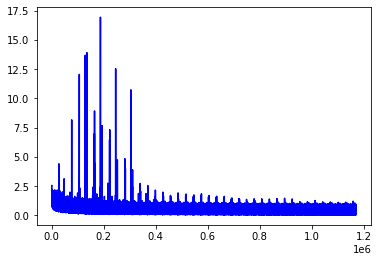

In [17]:
modeloTres = RedeNeuralModeloTres()

runnerTresCrosSGDBatch = RedeNeuralRunner(modeloTres,
                                     X_train, y_train,
                                     40,0.00015,'CrossEntropyLoss','SGD','runnerTresCrossSGDBatch',True)

runnerTresCrosSGDBatch.train()

In [18]:
runnerTresCrosSGDBatch.evaluate(X_test,y_test)

0.8947599988039453

In [19]:
runnerTresCrosSGDBatch.export()

In [ ]:
###########
#
# Tentanto otimizar mais ainda melhor modelo
#
############

Epoch: 79 Loss: 0.1501724272966385
Epoch: 79 Loss: 0.14630354940891266
Epoch: 79 Loss: 0.2838200330734253
Epoch: 79 Loss: 0.049288343638181686
Epoch: 79 Loss: 0.23250816762447357
Epoch: 79 Loss: 0.09977973252534866
Epoch: 79 Loss: 0.4477589428424835
Epoch: 79 Loss: 0.2392611801624298
Epoch: 79 Loss: 0.45510387420654297
Epoch: 79 Loss: 0.29600706696510315
Epoch: 79 Loss: 0.33612632751464844
Epoch: 79 Loss: 0.16343384981155396
Epoch: 79 Loss: 0.05077448487281799
Epoch: 79 Loss: 0.1516253650188446
Epoch: 79 Loss: 0.21458375453948975
Epoch: 79 Loss: 0.23535940051078796
Epoch: 79 Loss: 0.17252402007579803
Epoch: 79 Loss: 0.10321087390184402
Epoch: 79 Loss: 0.05266530066728592
Epoch: 79 Loss: 0.1668558418750763
Epoch: 79 Loss: 0.26263177394866943
Epoch: 79 Loss: 0.17216219007968903
Epoch: 79 Loss: 0.25324559211730957
Epoch: 79 Loss: 0.17395883798599243
Epoch: 79 Loss: 0.31328585743904114
Epoch: 79 Loss: 0.1318303495645523
Epoch: 79 Loss: 0.266858845949173
Epoch: 79 Loss: 0.2538990080356598
E

Epoch: 79 Loss: 0.16397345066070557
Epoch: 79 Loss: 0.12640197575092316
Epoch: 79 Loss: 0.22573526203632355
Epoch: 79 Loss: 0.21773295104503632
Epoch: 79 Loss: 0.11188172549009323
Epoch: 79 Loss: 0.1278841346502304
Epoch: 79 Loss: 0.18089459836483002
Epoch: 79 Loss: 0.2980506122112274
Epoch: 79 Loss: 0.08006753027439117
Epoch: 79 Loss: 0.11598115414381027
Epoch: 79 Loss: 0.14364281296730042
Epoch: 79 Loss: 0.27801987528800964
Epoch: 79 Loss: 0.1722540706396103
Epoch: 79 Loss: 0.1634560376405716
Epoch: 79 Loss: 0.2599047124385834
Epoch: 79 Loss: 0.19134822487831116
Epoch: 79 Loss: 0.16976936161518097
Epoch: 79 Loss: 0.17255008220672607
Epoch: 79 Loss: 0.0948672667145729
Epoch: 79 Loss: 0.17695166170597076
Epoch: 79 Loss: 0.1910192370414734
Epoch: 79 Loss: 0.1660335808992386
Epoch: 79 Loss: 0.3921719193458557
Epoch: 79 Loss: 0.1588975042104721
Epoch: 79 Loss: 0.12843865156173706
Epoch: 79 Loss: 0.152630016207695
Epoch: 79 Loss: 0.1830764263868332
Epoch: 79 Loss: 0.15249331295490265
Epoch

Epoch: 79 Loss: 0.08244901150465012
Epoch: 79 Loss: 0.10375599563121796
Epoch: 79 Loss: 0.295063316822052
Epoch: 79 Loss: 0.4406687021255493
Epoch: 79 Loss: 0.28930774331092834
Epoch: 79 Loss: 0.11293407529592514
Epoch: 79 Loss: 0.2816619873046875
Epoch: 79 Loss: 0.14459238946437836
Epoch: 79 Loss: 0.3752072751522064
Epoch: 79 Loss: 0.4222196042537689
Epoch: 79 Loss: 0.054992545396089554
Epoch: 79 Loss: 0.157195582985878
Epoch: 79 Loss: 0.20840506255626678
Epoch: 79 Loss: 0.13440614938735962
Epoch: 79 Loss: 0.10055509209632874
Epoch: 79 Loss: 0.26580414175987244
Epoch: 79 Loss: 0.12024927884340286
Epoch: 79 Loss: 0.4326912760734558
Epoch: 79 Loss: 0.1096508651971817
Epoch: 79 Loss: 0.2721722424030304
Epoch: 79 Loss: 0.10204446315765381
Epoch: 79 Loss: 0.44001534581184387
Epoch: 79 Loss: 0.140439972281456
Epoch: 79 Loss: 0.13100767135620117
Epoch: 79 Loss: 0.1804904192686081
Epoch: 79 Loss: 0.11001243442296982
Epoch: 79 Loss: 0.47413647174835205
Epoch: 79 Loss: 0.0881534218788147
Epoch:

Epoch: 79 Loss: 0.11222471296787262
Epoch: 79 Loss: 0.16467948257923126
Epoch: 79 Loss: 0.14599351584911346
Epoch: 79 Loss: 0.13992427289485931
Epoch: 79 Loss: 0.143626868724823
Epoch: 79 Loss: 0.13663718104362488
Epoch: 79 Loss: 0.2858388125896454
Epoch: 79 Loss: 0.16520041227340698
Epoch: 79 Loss: 0.14320650696754456
Epoch: 79 Loss: 0.3416255712509155
Epoch: 79 Loss: 0.1540399193763733
Epoch: 79 Loss: 0.3174283504486084
Epoch: 79 Loss: 0.1733001172542572
Epoch: 79 Loss: 0.2195793241262436
Epoch: 79 Loss: 0.13149434328079224
Epoch: 79 Loss: 0.14305809140205383
Epoch: 79 Loss: 0.05567987635731697
Epoch: 79 Loss: 0.39321276545524597
Epoch: 79 Loss: 0.15384237468242645
Epoch: 79 Loss: 0.38072389364242554
Epoch: 79 Loss: 0.34948602318763733
Epoch: 79 Loss: 0.21396461129188538
Epoch: 79 Loss: 0.28599095344543457
Epoch: 79 Loss: 0.0848877876996994
Epoch: 79 Loss: 0.1950063854455948
Epoch: 79 Loss: 0.14813046157360077
Epoch: 79 Loss: 0.15575359761714935
Epoch: 79 Loss: 0.28642159700393677
Ep

Epoch: 79 Loss: 0.09748248010873795
Epoch: 79 Loss: 0.2417905479669571
Epoch: 79 Loss: 0.24387432634830475
Epoch: 79 Loss: 0.21632179617881775
Epoch: 79 Loss: 0.20683181285858154
Epoch: 79 Loss: 0.1802835315465927
Epoch: 79 Loss: 0.2397005558013916
Epoch: 79 Loss: 0.3616383969783783
Epoch: 79 Loss: 0.2945793867111206
Epoch: 79 Loss: 0.3890507221221924
Epoch: 79 Loss: 0.1558973640203476
Epoch: 79 Loss: 0.2736712396144867
Epoch: 79 Loss: 0.376708984375
Epoch: 79 Loss: 0.18675076961517334
Epoch: 79 Loss: 0.20767781138420105
Epoch: 79 Loss: 0.1197924092411995
Epoch: 79 Loss: 0.19772844016551971
Epoch: 79 Loss: 0.057702790945768356
Epoch: 79 Loss: 0.15706448256969452
Epoch: 79 Loss: 0.15469777584075928
Epoch: 79 Loss: 0.20172932744026184
Epoch: 79 Loss: 0.25632694363594055
Epoch: 79 Loss: 0.09265566617250443
Epoch: 79 Loss: 0.30149045586586
Epoch: 79 Loss: 0.16707894206047058
Epoch: 79 Loss: 0.14162886142730713
Epoch: 79 Loss: 0.15874089300632477
Epoch: 79 Loss: 0.463236004114151
Epoch: 79 

Epoch: 79 Loss: 0.16300101578235626
Epoch: 79 Loss: 0.1241583377122879
Epoch: 79 Loss: 0.39818769693374634
Epoch: 79 Loss: 0.14005185663700104
Epoch: 79 Loss: 0.10266377031803131
Epoch: 79 Loss: 0.07210420072078705
Epoch: 79 Loss: 0.13118384778499603
Epoch: 79 Loss: 0.21046608686447144
Epoch: 79 Loss: 0.33129554986953735
Epoch: 79 Loss: 0.2524225413799286
Epoch: 79 Loss: 0.09814497083425522
Epoch: 79 Loss: 0.41667771339416504
Epoch: 79 Loss: 0.07757964730262756
Epoch: 79 Loss: 0.2616015374660492
Epoch: 79 Loss: 0.08809611946344376
Epoch: 79 Loss: 0.2663542330265045
Epoch: 79 Loss: 0.2265060693025589
Epoch: 79 Loss: 0.20542632043361664
Epoch: 79 Loss: 0.39486250281333923
Epoch: 79 Loss: 0.395300954580307
Epoch: 79 Loss: 0.055027883499860764
Epoch: 79 Loss: 0.03827064856886864
Epoch: 79 Loss: 0.42635250091552734
Epoch: 79 Loss: 0.21148237586021423
Epoch: 79 Loss: 0.25466468930244446
Epoch: 79 Loss: 0.31548893451690674
Epoch: 79 Loss: 0.16681413352489471
Epoch: 79 Loss: 0.6043118238449097

Epoch: 79 Loss: 0.2627173662185669
Epoch: 79 Loss: 0.09500393271446228
Epoch: 79 Loss: 0.2465384602546692
Epoch: 79 Loss: 0.11703095585107803
Epoch: 79 Loss: 0.23603659868240356
Epoch: 79 Loss: 0.32465633749961853
Epoch: 79 Loss: 0.3079618513584137
Epoch: 79 Loss: 0.16124099493026733
Epoch: 79 Loss: 0.1753980815410614
Epoch: 79 Loss: 0.28383105993270874
Epoch: 79 Loss: 0.18220464885234833
Epoch: 79 Loss: 0.050825268030166626
Epoch: 79 Loss: 0.11686249822378159
Epoch: 79 Loss: 0.13614581525325775
Epoch: 79 Loss: 0.24421262741088867
Epoch: 79 Loss: 0.10826101899147034
Epoch: 79 Loss: 0.08746650069952011
Epoch: 79 Loss: 0.13144339621067047
Epoch: 79 Loss: 0.12341909110546112
Epoch: 79 Loss: 0.3346746563911438
Epoch: 79 Loss: 0.21690116822719574
Epoch: 79 Loss: 0.24347808957099915
Epoch: 79 Loss: 0.2416982799768448
Epoch: 79 Loss: 0.3609653115272522
Epoch: 79 Loss: 0.20007449388504028
Epoch: 79 Loss: 0.13167685270309448
Epoch: 79 Loss: 0.038114361464977264
Epoch: 79 Loss: 0.069868624210357

Epoch: 79 Loss: 0.09116893261671066
Epoch: 79 Loss: 0.23049873113632202
Epoch: 79 Loss: 0.24234740436077118
Epoch: 79 Loss: 0.2602842152118683
Epoch: 79 Loss: 0.22824780642986298
Epoch: 79 Loss: 0.12577196955680847
Epoch: 79 Loss: 0.21361444890499115
Epoch: 79 Loss: 0.12689359486103058
Epoch: 79 Loss: 0.40860575437545776
Epoch: 79 Loss: 0.2665521800518036
Epoch: 79 Loss: 0.13565711677074432
Epoch: 79 Loss: 0.18047910928726196
Epoch: 79 Loss: 0.2699061632156372
Epoch: 79 Loss: 0.12235759198665619
Epoch: 79 Loss: 0.21526236832141876
Epoch: 79 Loss: 0.1181696280837059
Epoch: 79 Loss: 0.15211936831474304
Epoch: 79 Loss: 0.3067600727081299
Epoch: 79 Loss: 0.14822275936603546
Epoch: 79 Loss: 0.15226738154888153
Epoch: 79 Loss: 0.3556172847747803
Epoch: 79 Loss: 0.23351220786571503
Epoch: 79 Loss: 0.28328052163124084
Epoch: 79 Loss: 0.2006257176399231
Epoch: 79 Loss: 0.09632664173841476
Epoch: 79 Loss: 0.12307026982307434
Epoch: 79 Loss: 0.23719239234924316
Epoch: 79 Loss: 0.17037130892276764

Epoch: 79 Loss: 0.19510576128959656
Epoch: 79 Loss: 0.2397211641073227
Epoch: 79 Loss: 0.055629994720220566
Epoch: 79 Loss: 0.3163931965827942
Epoch: 79 Loss: 0.3344217538833618
Epoch: 79 Loss: 0.17248794436454773
Epoch: 79 Loss: 0.6213209629058838
Epoch: 79 Loss: 0.13118813931941986
Epoch: 79 Loss: 0.39722418785095215
Epoch: 79 Loss: 0.5448259115219116
Epoch: 79 Loss: 0.575144350528717
Epoch: 79 Loss: 0.13926805555820465
Epoch: 79 Loss: 0.09501486271619797
Epoch: 79 Loss: 0.1725691705942154
Epoch: 79 Loss: 0.2686508595943451
Epoch: 79 Loss: 0.18752959370613098
Epoch: 79 Loss: 0.15697558224201202
Epoch: 79 Loss: 0.34190455079078674
Epoch: 79 Loss: 0.09480583667755127
Epoch: 79 Loss: 0.20021817088127136
Epoch: 79 Loss: 0.3439302444458008
Epoch: 79 Loss: 0.1706259846687317
Epoch: 79 Loss: 0.11057346314191818
Epoch: 79 Loss: 0.3291124999523163
Epoch: 79 Loss: 0.15143518149852753
Epoch: 79 Loss: 0.19987837970256805
Epoch: 79 Loss: 0.1053907722234726
Epoch: 79 Loss: 0.11297856271266937
Epoc

Epoch: 79 Loss: 0.31198930740356445
Epoch: 79 Loss: 0.13716831803321838
Epoch: 79 Loss: 0.11228808760643005
Epoch: 79 Loss: 0.2775226831436157
Epoch: 79 Loss: 0.38282325863838196
Epoch: 79 Loss: 0.09969767183065414
Epoch: 79 Loss: 0.33065304160118103
Epoch: 79 Loss: 0.18555249273777008
Epoch: 79 Loss: 0.13992981612682343
Epoch: 79 Loss: 0.09638522565364838
Epoch: 79 Loss: 0.24926795065402985
Epoch: 79 Loss: 0.1894003301858902
Epoch: 79 Loss: 0.20293854176998138
Epoch: 79 Loss: 0.1865226924419403
Epoch: 79 Loss: 0.22906915843486786
Epoch: 79 Loss: 0.1723821461200714
Epoch: 79 Loss: 0.20265230536460876
Epoch: 79 Loss: 0.2803349196910858
Epoch: 79 Loss: 0.2908176779747009
Epoch: 79 Loss: 0.10032785683870316
Epoch: 79 Loss: 0.4570743441581726
Epoch: 79 Loss: 0.1286768913269043
Epoch: 79 Loss: 0.13278377056121826
Epoch: 79 Loss: 0.5505883097648621
Epoch: 79 Loss: 0.2960062026977539
Epoch: 79 Loss: 0.14789904654026031
Epoch: 79 Loss: 0.1564265340566635
Epoch: 79 Loss: 0.12241072207689285
Epo

Epoch: 79 Loss: 0.11427324265241623
Epoch: 79 Loss: 0.30142146348953247
Epoch: 79 Loss: 0.16536332666873932
Epoch: 79 Loss: 0.13278643786907196
Epoch: 79 Loss: 0.05448037013411522
Epoch: 79 Loss: 0.11878694593906403
Epoch: 79 Loss: 0.3577389717102051
Epoch: 79 Loss: 0.2661505937576294
Epoch: 79 Loss: 0.17659680545330048
Epoch: 79 Loss: 0.1757306605577469
Epoch: 79 Loss: 0.04327782616019249
Epoch: 79 Loss: 0.1517203152179718
Epoch: 79 Loss: 0.13142500817775726
Epoch: 79 Loss: 0.17125312983989716
Epoch: 79 Loss: 0.2763405442237854
Epoch: 79 Loss: 0.16371747851371765
Epoch: 79 Loss: 0.16371877491474152
Epoch: 79 Loss: 0.315157949924469
Epoch: 79 Loss: 0.15716631710529327
Epoch: 79 Loss: 0.24282953143119812
Epoch: 79 Loss: 0.32185328006744385
Epoch: 79 Loss: 0.10797952115535736
Epoch: 79 Loss: 0.25332367420196533
Epoch: 79 Loss: 0.26265713572502136
Epoch: 79 Loss: 0.249518021941185
Epoch: 79 Loss: 0.13435491919517517
Epoch: 79 Loss: 0.2138337641954422
Epoch: 79 Loss: 0.3176115155220032
Epo

Epoch: 79 Loss: 0.26469653844833374
Epoch: 79 Loss: 0.15080787241458893
Epoch: 79 Loss: 0.15533709526062012
Epoch: 79 Loss: 0.43641823530197144
Epoch: 79 Loss: 0.14407148957252502
Epoch: 79 Loss: 0.13154292106628418
Epoch: 79 Loss: 0.11263607442378998
Epoch: 79 Loss: 0.1583230048418045
Epoch: 79 Loss: 0.04997047036886215
Epoch: 79 Loss: 0.07194696366786957
Epoch: 79 Loss: 0.0943431705236435
Epoch: 79 Loss: 0.2876790463924408
Epoch: 79 Loss: 0.15399333834648132
Epoch: 79 Loss: 0.27583128213882446
Epoch: 79 Loss: 0.38640204071998596
Epoch: 79 Loss: 0.1432126760482788
Epoch: 79 Loss: 0.3402796685695648
Epoch: 79 Loss: 0.427918940782547
Epoch: 79 Loss: 0.15174928307533264
Epoch: 79 Loss: 0.08802784979343414
Epoch: 79 Loss: 0.19182531535625458
Epoch: 79 Loss: 0.04433685168623924
Epoch: 79 Loss: 0.2523869574069977
Epoch: 79 Loss: 0.18230247497558594
Epoch: 79 Loss: 0.3233363628387451
Epoch: 79 Loss: 0.07208999991416931
Epoch: 79 Loss: 0.2451341599225998
Epoch: 79 Loss: 0.24342761933803558
Ep

Epoch: 79 Loss: 0.11360757797956467
Epoch: 79 Loss: 0.07399032264947891
Epoch: 79 Loss: 0.11659535765647888
Epoch: 79 Loss: 0.14262434840202332
Epoch: 79 Loss: 0.05229264125227928
Epoch: 79 Loss: 0.2763485014438629
Epoch: 79 Loss: 0.06809304654598236
Epoch: 79 Loss: 0.08314845710992813
Epoch: 79 Loss: 0.22948142886161804
Epoch: 79 Loss: 0.17072995007038116
Epoch: 79 Loss: 0.21397186815738678
Epoch: 79 Loss: 0.05441509559750557
Epoch: 79 Loss: 0.17760607600212097
Epoch: 79 Loss: 0.07033724337816238
Epoch: 79 Loss: 0.060375772416591644
Epoch: 79 Loss: 0.17649096250534058
Epoch: 79 Loss: 0.22871863842010498
Epoch: 79 Loss: 0.1295456886291504
Epoch: 79 Loss: 0.19789119064807892
Epoch: 79 Loss: 0.20721516013145447
Epoch: 79 Loss: 0.29728731513023376
Epoch: 79 Loss: 0.11839968711137772
Epoch: 79 Loss: 0.21622799336910248
Epoch: 79 Loss: 0.33805617690086365
Epoch: 79 Loss: 0.20701102912425995
Epoch: 79 Loss: 0.19482186436653137
Epoch: 79 Loss: 0.1346682459115982
Epoch: 79 Loss: 0.150469824671

Epoch: 79 Loss: 0.460373193025589
Epoch: 79 Loss: 0.10613134503364563
Epoch: 79 Loss: 0.2441335916519165
Epoch: 79 Loss: 0.36459270119667053
Epoch: 79 Loss: 0.2747143805027008
Epoch: 79 Loss: 0.12330379337072372
Epoch: 79 Loss: 0.08452478051185608
Epoch: 79 Loss: 0.21639418601989746
Epoch: 79 Loss: 0.025961153209209442
Epoch: 79 Loss: 0.1898290067911148
Epoch: 79 Loss: 0.2473359853029251
Epoch: 79 Loss: 0.25527915358543396
Epoch: 79 Loss: 0.305614173412323
Epoch: 79 Loss: 0.3106977641582489
Epoch: 79 Loss: 0.10679131001234055
Epoch: 79 Loss: 0.10191614925861359
Epoch: 79 Loss: 0.11643669754266739
Epoch: 79 Loss: 0.356940895318985
Epoch: 79 Loss: 0.3991294801235199
Epoch: 79 Loss: 0.5456089377403259
Epoch: 79 Loss: 0.19749033451080322
Epoch: 79 Loss: 0.24294044077396393
Epoch: 79 Loss: 0.19098961353302002
Epoch: 79 Loss: 0.11186575889587402
Epoch: 79 Loss: 0.43339672684669495
Epoch: 79 Loss: 0.08350072056055069
Epoch: 79 Loss: 0.21511554718017578
Epoch: 79 Loss: 0.4025843143463135
Epoch

Epoch: 79 Loss: 0.3021032512187958
Epoch: 79 Loss: 0.21399247646331787
Epoch: 79 Loss: 0.249653160572052
Epoch: 79 Loss: 0.09254363179206848
Epoch: 79 Loss: 0.15881244838237762
Epoch: 79 Loss: 0.2526935935020447
Epoch: 79 Loss: 0.1861506551504135
Epoch: 79 Loss: 0.2772465646266937
Epoch: 79 Loss: 0.2501818835735321
Epoch: 79 Loss: 0.2993272840976715
Epoch: 79 Loss: 0.1666998565196991
Epoch: 79 Loss: 0.1949995458126068
Epoch: 79 Loss: 0.3570948839187622
Epoch: 79 Loss: 0.20322488248348236
Epoch: 79 Loss: 0.07549213618040085
Epoch: 79 Loss: 0.15657338500022888
Epoch: 79 Loss: 0.47251060605049133
Epoch: 79 Loss: 0.2644873261451721
Epoch: 79 Loss: 0.15991529822349548
Epoch: 79 Loss: 0.20808623731136322
Epoch: 79 Loss: 0.2921244204044342
Epoch: 79 Loss: 0.09803105145692825
Epoch: 79 Loss: 0.22739249467849731
Epoch: 79 Loss: 0.2082139253616333
Epoch: 79 Loss: 0.19372789561748505
Epoch: 79 Loss: 0.24896983802318573
Epoch: 79 Loss: 0.12164569646120071
Epoch: 79 Loss: 0.1888909637928009
Epoch: 

Epoch: 79 Loss: 0.11720944195985794
Epoch: 79 Loss: 0.14019182324409485
Epoch: 79 Loss: 0.19127529859542847
Epoch: 79 Loss: 0.24523785710334778
Epoch: 79 Loss: 0.11249939352273941
Epoch: 79 Loss: 0.11270394176244736
Epoch: 79 Loss: 0.2784667909145355
Epoch: 79 Loss: 0.27688032388687134
Epoch: 79 Loss: 0.17286504805088043
Epoch: 79 Loss: 0.24431659281253815
Epoch: 79 Loss: 0.0781182274222374
Epoch: 79 Loss: 0.39852267503738403
Epoch: 79 Loss: 0.2875322997570038
Epoch: 79 Loss: 0.11131353676319122
Epoch: 79 Loss: 0.22577409446239471
Epoch: 79 Loss: 0.2570090889930725
Epoch: 79 Loss: 0.06438738107681274
Epoch: 79 Loss: 0.4129694104194641
Epoch: 79 Loss: 0.22211699187755585
Epoch: 79 Loss: 0.11105713248252869
Epoch: 79 Loss: 0.2583424746990204
Epoch: 79 Loss: 0.30245736241340637
Epoch: 79 Loss: 0.21256591379642487
Epoch: 79 Loss: 0.25668394565582275
Epoch: 79 Loss: 0.21728172898292542
Epoch: 79 Loss: 0.20891298353672028
Epoch: 79 Loss: 0.19776193797588348
Epoch: 79 Loss: 0.0396959222853183

Epoch: 79 Loss: 0.5382314920425415
Epoch: 79 Loss: 0.32741597294807434
Epoch: 79 Loss: 0.15760746598243713
Epoch: 79 Loss: 0.3382628560066223
Epoch: 79 Loss: 0.33469319343566895
Epoch: 79 Loss: 0.13890177011489868
Epoch: 79 Loss: 0.134034663438797
Epoch: 79 Loss: 0.1680184304714203
Epoch: 79 Loss: 0.191032275557518
Epoch: 79 Loss: 0.22596868872642517
Epoch: 79 Loss: 0.15854404866695404
Epoch: 79 Loss: 0.17564347386360168
Epoch: 79 Loss: 0.3368886411190033
Epoch: 79 Loss: 0.0817265436053276
Epoch: 79 Loss: 0.15159177780151367
Epoch: 79 Loss: 0.10158287733793259
Epoch: 79 Loss: 0.32535889744758606
Epoch: 79 Loss: 0.38215965032577515
Epoch: 79 Loss: 0.11653508991003036
Epoch: 79 Loss: 0.10132387280464172
Epoch: 79 Loss: 0.20847442746162415
Epoch: 79 Loss: 0.34560346603393555
Epoch: 79 Loss: 0.24541716277599335
Epoch: 79 Loss: 0.22856317460536957
Epoch: 79 Loss: 0.2586842179298401
Epoch: 79 Loss: 0.2712537944316864
Epoch: 79 Loss: 0.1099398136138916
Epoch: 79 Loss: 0.34712469577789307
Epoc

Epoch: 79 Loss: 0.20437781512737274
Epoch: 79 Loss: 0.2521078586578369
Epoch: 79 Loss: 0.12336372584104538
Epoch: 79 Loss: 0.023883314803242683
Epoch: 79 Loss: 0.17746269702911377
Epoch: 79 Loss: 0.15675219893455505
Epoch: 79 Loss: 0.13512051105499268
Epoch: 79 Loss: 0.46434828639030457
Epoch: 79 Loss: 0.3544124662876129
Epoch: 79 Loss: 0.3956766128540039
Epoch: 79 Loss: 0.2574724853038788
Epoch: 79 Loss: 0.2660064399242401
Epoch: 79 Loss: 0.36768800020217896
Epoch: 79 Loss: 0.16302044689655304
Epoch: 79 Loss: 0.0746397003531456
Epoch: 79 Loss: 0.3384248912334442
Epoch: 79 Loss: 0.09977951645851135
Epoch: 79 Loss: 0.24812117218971252
Epoch: 79 Loss: 0.37044399976730347
Epoch: 79 Loss: 0.18290871381759644
Epoch: 79 Loss: 0.20426805317401886
Epoch: 79 Loss: 0.23439916968345642
Epoch: 79 Loss: 0.23207974433898926
Epoch: 79 Loss: 0.14529015123844147
Epoch: 79 Loss: 0.09257537871599197
Epoch: 79 Loss: 0.17911890149116516
Epoch: 79 Loss: 0.24821949005126953
Epoch: 79 Loss: 0.1918835937976837

Epoch: 79 Loss: 0.19689513742923737
Epoch: 79 Loss: 0.3477315902709961
Epoch: 79 Loss: 0.259876012802124
Epoch: 79 Loss: 0.3032263517379761
Epoch: 79 Loss: 0.13004954159259796
Epoch: 79 Loss: 0.21042399108409882
Epoch: 79 Loss: 0.2712598145008087
Epoch: 79 Loss: 0.19605499505996704
Epoch: 79 Loss: 0.3910831809043884
Epoch: 79 Loss: 0.11193615943193436
Epoch: 79 Loss: 0.2431754618883133
Epoch: 79 Loss: 0.13174021244049072
Epoch: 79 Loss: 0.22715449333190918
Epoch: 79 Loss: 0.15190814435482025
Epoch: 79 Loss: 0.13963763415813446
Epoch: 79 Loss: 0.3444203734397888
Epoch: 79 Loss: 0.4259624183177948
Epoch: 79 Loss: 0.07420626282691956
Epoch: 79 Loss: 0.29875075817108154
Epoch: 79 Loss: 0.16249999403953552
Epoch: 79 Loss: 0.16174261271953583
Epoch: 79 Loss: 0.1590140014886856
Epoch: 79 Loss: 0.13677439093589783
Epoch: 79 Loss: 0.29272809624671936
Epoch: 79 Loss: 0.08292032778263092
Epoch: 79 Loss: 0.23926450312137604
Epoch: 79 Loss: 0.09653810411691666
Epoch: 79 Loss: 0.13769018650054932
Ep

Epoch: 79 Loss: 0.25378623604774475
Epoch: 79 Loss: 0.06584428995847702
Epoch: 79 Loss: 0.24582746624946594
Epoch: 79 Loss: 0.34125417470932007
Epoch: 79 Loss: 0.20439502596855164
Epoch: 79 Loss: 0.16296280920505524
Epoch: 79 Loss: 0.20025593042373657
Epoch: 79 Loss: 0.18305622041225433
Epoch: 79 Loss: 0.24790048599243164
Epoch: 79 Loss: 0.13027703762054443
Epoch: 79 Loss: 0.26020291447639465
Epoch: 79 Loss: 0.19684535264968872
Epoch: 79 Loss: 0.05615159124135971
Epoch: 79 Loss: 0.15615704655647278
Epoch: 79 Loss: 0.3139795958995819
Epoch: 79 Loss: 0.2833067774772644
Epoch: 79 Loss: 0.11155091226100922
Epoch: 79 Loss: 0.24040791392326355
Epoch: 79 Loss: 0.22195489704608917
Epoch: 79 Loss: 0.18220028281211853
Epoch: 79 Loss: 0.19770917296409607
Epoch: 79 Loss: 0.29857558012008667
Epoch: 79 Loss: 0.23082774877548218
Epoch: 79 Loss: 0.28655675053596497
Epoch: 79 Loss: 0.3317665755748749
Epoch: 79 Loss: 0.29001468420028687
Epoch: 79 Loss: 0.22835442423820496
Epoch: 79 Loss: 0.3033724725246

Epoch: 79 Loss: 0.4145156443119049
Epoch: 79 Loss: 0.19458667933940887
Epoch: 79 Loss: 0.23476648330688477
Epoch: 79 Loss: 0.27149659395217896
Epoch: 79 Loss: 0.0859580785036087
Epoch: 79 Loss: 0.3526311218738556
Epoch: 79 Loss: 0.05892207846045494
Epoch: 79 Loss: 0.19033655524253845
Epoch: 79 Loss: 0.288594126701355
Epoch: 79 Loss: 0.18469950556755066
Epoch: 79 Loss: 0.18270377814769745
Epoch: 79 Loss: 0.3424239754676819
Epoch: 79 Loss: 0.16820889711380005
Epoch: 79 Loss: 0.25089025497436523
Epoch: 79 Loss: 0.2044132947921753
Epoch: 79 Loss: 0.08012810349464417
Epoch: 79 Loss: 0.14021702110767365
Epoch: 79 Loss: 0.20177707076072693
Epoch: 79 Loss: 0.12524060904979706
Epoch: 79 Loss: 0.1802857220172882
Epoch: 79 Loss: 0.04649069532752037
Epoch: 79 Loss: 0.31831684708595276
Epoch: 79 Loss: 0.27840888500213623
Epoch: 79 Loss: 0.1755160242319107
Epoch: 79 Loss: 0.07800748944282532
Epoch: 79 Loss: 0.15712791681289673
Epoch: 79 Loss: 0.3112856149673462
Epoch: 79 Loss: 0.23233582079410553
Ep

Epoch: 79 Loss: 0.2679101824760437
Epoch: 79 Loss: 0.1520971953868866
Epoch: 79 Loss: 0.07856537401676178
Epoch: 79 Loss: 0.2657611668109894
Epoch: 79 Loss: 0.3932943344116211
Epoch: 79 Loss: 0.40794992446899414
Epoch: 79 Loss: 0.22782093286514282
Epoch: 79 Loss: 0.17607589066028595
Epoch: 79 Loss: 0.27334141731262207
Epoch: 79 Loss: 0.18053685128688812
Epoch: 79 Loss: 0.10561058670282364
Epoch: 79 Loss: 0.3128278851509094
Epoch: 79 Loss: 0.21434295177459717
Epoch: 79 Loss: 0.22196435928344727
Epoch: 79 Loss: 0.28954869508743286
Epoch: 79 Loss: 0.2765040993690491
Epoch: 79 Loss: 0.2845061421394348
Epoch: 79 Loss: 0.20990067720413208
Epoch: 79 Loss: 0.19368132948875427
Epoch: 79 Loss: 0.19823281466960907
Epoch: 79 Loss: 0.41209009289741516
Epoch: 79 Loss: 0.1262747049331665
Epoch: 79 Loss: 0.4369185268878937
Epoch: 79 Loss: 0.31202518939971924
Epoch: 79 Loss: 0.11998015642166138
Epoch: 79 Loss: 0.1814909726381302
Epoch: 79 Loss: 0.09660904109477997
Epoch: 79 Loss: 0.16352248191833496
Ep

Epoch: 79 Loss: 0.26931941509246826
Epoch: 79 Loss: 0.2748703062534332
Epoch: 79 Loss: 0.3300827443599701
Epoch: 79 Loss: 0.22393040359020233
Epoch: 79 Loss: 0.29432767629623413
Epoch: 79 Loss: 0.07018987089395523
Epoch: 79 Loss: 0.2227482944726944
Epoch: 79 Loss: 0.07618197798728943
Epoch: 79 Loss: 0.3714202046394348
Epoch: 79 Loss: 0.3323279917240143
Epoch: 79 Loss: 0.1368257999420166
Epoch: 79 Loss: 0.24960553646087646
Epoch: 79 Loss: 0.100140281021595
Epoch: 79 Loss: 0.12225667387247086
Epoch: 79 Loss: 0.2909410893917084
Epoch: 79 Loss: 0.1255437582731247
Epoch: 79 Loss: 0.3457995057106018
Epoch: 79 Loss: 0.0963059589266777
Epoch: 79 Loss: 0.2049819380044937
Epoch: 79 Loss: 0.48424550890922546
Epoch: 79 Loss: 0.1264086216688156
Epoch: 79 Loss: 0.15588216483592987
Epoch: 79 Loss: 0.3329485058784485
Epoch: 79 Loss: 0.18505853414535522
Epoch: 79 Loss: 0.14502881467342377
Epoch: 79 Loss: 0.2498013973236084
Epoch: 79 Loss: 0.15518814325332642
Epoch: 79 Loss: 0.08105741441249847
Epoch: 7

Epoch: 79 Loss: 0.13213998079299927
Epoch: 79 Loss: 0.22828088700771332
Epoch: 79 Loss: 0.17095988988876343
Epoch: 79 Loss: 0.15446680784225464
Epoch: 79 Loss: 0.16048134863376617
Epoch: 79 Loss: 0.19817818701267242
Epoch: 79 Loss: 0.09460055828094482
Epoch: 79 Loss: 0.17829476296901703
Epoch: 79 Loss: 0.22226770222187042
Epoch: 79 Loss: 0.14713166654109955
Epoch: 79 Loss: 0.13375352323055267
Epoch: 79 Loss: 0.23421743512153625
Epoch: 79 Loss: 0.13243143260478973
Epoch: 79 Loss: 0.39025455713272095
Epoch: 79 Loss: 0.08931437879800797
Epoch: 79 Loss: 0.2007337063550949
Epoch: 79 Loss: 0.17788662016391754
Epoch: 79 Loss: 0.22762538492679596
Epoch: 79 Loss: 0.21428094804286957
Epoch: 79 Loss: 0.18678012490272522
Epoch: 79 Loss: 0.18474645912647247
Epoch: 79 Loss: 0.18843182921409607
Epoch: 79 Loss: 0.10661716759204865
Epoch: 79 Loss: 0.09906274080276489
Epoch: 79 Loss: 0.41920313239097595
Epoch: 79 Loss: 0.12423993647098541
Epoch: 79 Loss: 0.14050772786140442
Epoch: 79 Loss: 0.17597673833

Epoch: 79 Loss: 0.1908990889787674
Epoch: 79 Loss: 0.45780473947525024
Epoch: 79 Loss: 0.2604360580444336
Epoch: 79 Loss: 0.1590365469455719
Epoch: 79 Loss: 0.1697520911693573
Epoch: 79 Loss: 0.18468406796455383
Epoch: 79 Loss: 0.3826271593570709
Epoch: 79 Loss: 0.2737310528755188
Epoch: 79 Loss: 0.17710620164871216
Epoch: 79 Loss: 0.13718968629837036
Epoch: 79 Loss: 0.03361605852842331
Epoch: 79 Loss: 0.24302169680595398
Epoch: 79 Loss: 0.1892724633216858
Epoch: 79 Loss: 0.05403556674718857
Epoch: 79 Loss: 0.2281087338924408
Epoch: 79 Loss: 0.1576126366853714
Epoch: 79 Loss: 0.206823468208313
Epoch: 79 Loss: 0.40281620621681213
Epoch: 79 Loss: 0.08798600733280182
Epoch: 79 Loss: 0.3792975842952728
Epoch: 79 Loss: 0.13741041719913483
Epoch: 79 Loss: 0.26229164004325867
Epoch: 79 Loss: 0.19615690410137177
Epoch: 79 Loss: 0.17244219779968262
Epoch: 79 Loss: 0.2629481554031372
Epoch: 79 Loss: 0.07610974460840225
Epoch: 79 Loss: 0.16045162081718445
Epoch: 79 Loss: 0.10339962691068649
Epoch

Epoch: 79 Loss: 0.17773868143558502
Epoch: 79 Loss: 0.13770973682403564
Epoch: 79 Loss: 0.2528068721294403
Epoch: 79 Loss: 0.32502976059913635
Epoch: 79 Loss: 0.39265745878219604
Epoch: 79 Loss: 0.15627506375312805
Epoch: 79 Loss: 0.1728065013885498
Epoch: 79 Loss: 0.07620703428983688
Epoch: 79 Loss: 0.3560178577899933
Epoch: 79 Loss: 0.15307378768920898
Epoch: 79 Loss: 0.508807361125946
Epoch: 79 Loss: 0.3126676380634308
Epoch: 79 Loss: 0.08098414540290833
Epoch: 79 Loss: 0.13266240060329437
Epoch: 79 Loss: 0.3429296314716339
Epoch: 79 Loss: 0.11610119044780731
Epoch: 79 Loss: 0.17158934473991394
Epoch: 79 Loss: 0.3380679190158844
Epoch: 79 Loss: 0.16217075288295746
Epoch: 79 Loss: 0.18521976470947266
Epoch: 79 Loss: 0.3601227402687073
Epoch: 79 Loss: 0.15117736160755157
Epoch: 79 Loss: 0.14944691956043243
Epoch: 79 Loss: 0.07470984756946564
Epoch: 79 Loss: 0.24528354406356812
Epoch: 79 Loss: 0.32226917147636414
Epoch: 79 Loss: 0.17318880558013916
Epoch: 79 Loss: 0.15162453055381775
E

Epoch: 79 Loss: 0.2025936096906662
Epoch: 79 Loss: 0.2792778015136719
Epoch: 79 Loss: 0.2729854881763458
Epoch: 79 Loss: 0.2782965302467346
Epoch: 79 Loss: 0.07559850066900253
Epoch: 79 Loss: 0.12691479921340942
Epoch: 79 Loss: 0.29966628551483154
Epoch: 79 Loss: 0.3299364745616913
Epoch: 79 Loss: 0.07170598208904266
Epoch: 79 Loss: 0.10563026368618011
Epoch: 79 Loss: 0.22571296989917755
Epoch: 79 Loss: 0.13171853125095367
Epoch: 79 Loss: 0.2128037065267563
Epoch: 79 Loss: 0.07352802902460098
Epoch: 79 Loss: 0.06863250583410263
Epoch: 79 Loss: 0.18605145812034607
Epoch: 79 Loss: 0.35992541909217834
Epoch: 79 Loss: 0.34528231620788574
Epoch: 79 Loss: 0.11857596784830093
Epoch: 79 Loss: 0.08319107443094254
Epoch: 79 Loss: 0.13926033675670624
Epoch: 79 Loss: 0.14721770584583282
Epoch: 79 Loss: 0.21568037569522858
Epoch: 79 Loss: 0.4742913246154785
Epoch: 79 Loss: 0.31177234649658203
Epoch: 79 Loss: 0.1739291101694107
Epoch: 79 Loss: 0.28196054697036743
Epoch: 79 Loss: 0.11163101345300674


Epoch: 79 Loss: 0.1620813012123108
Epoch: 79 Loss: 0.12933552265167236
Epoch: 79 Loss: 0.17607596516609192
Epoch: 79 Loss: 0.3786174952983856
Epoch: 79 Loss: 0.3447059392929077
Epoch: 79 Loss: 0.46831536293029785
Epoch: 79 Loss: 0.23856809735298157
Epoch: 79 Loss: 0.1599973440170288
Epoch: 79 Loss: 0.13092762231826782
Epoch: 79 Loss: 0.37774157524108887
Epoch: 79 Loss: 0.3681274950504303
Epoch: 79 Loss: 0.20183993875980377
Epoch: 79 Loss: 0.29889553785324097
Epoch: 79 Loss: 0.14732632040977478
Epoch: 79 Loss: 0.2295164316892624
Epoch: 79 Loss: 0.16371102631092072
Epoch: 79 Loss: 0.15698590874671936
Epoch: 79 Loss: 0.20874416828155518
Epoch: 79 Loss: 0.14428825676441193
Epoch: 79 Loss: 0.18217220902442932
Epoch: 79 Loss: 0.3446706235408783
Epoch: 79 Loss: 0.4368753135204315
Epoch: 79 Loss: 0.1947920173406601
Epoch: 79 Loss: 0.15022486448287964
Epoch: 79 Loss: 0.23075544834136963
Epoch: 79 Loss: 0.04214942455291748
Epoch: 79 Loss: 0.2848736047744751
Epoch: 79 Loss: 0.06256674230098724
Ep

Epoch: 79 Loss: 0.12436637282371521
Epoch: 79 Loss: 0.08261554688215256
Epoch: 79 Loss: 0.13134963810443878
Epoch: 79 Loss: 0.10632308572530746
Epoch: 79 Loss: 0.08031396567821503
Epoch: 79 Loss: 0.17574484646320343
Epoch: 79 Loss: 0.1589037925004959
Epoch: 79 Loss: 0.17414985597133636
Epoch: 79 Loss: 0.06246975064277649
Epoch: 79 Loss: 0.21248824894428253
Epoch: 79 Loss: 0.19406676292419434
Epoch: 79 Loss: 0.39527222514152527
Epoch: 79 Loss: 0.23560519516468048
Epoch: 79 Loss: 0.14982572197914124
Epoch: 79 Loss: 0.2492988556623459
Epoch: 79 Loss: 0.19940058887004852
Epoch: 79 Loss: 0.06829860806465149
Epoch: 79 Loss: 0.23481911420822144
Epoch: 79 Loss: 0.10501689463853836
Epoch: 79 Loss: 0.11159975081682205
Epoch: 79 Loss: 0.10245775431394577
Epoch: 79 Loss: 0.1590232402086258
Epoch: 79 Loss: 0.0638614296913147
Epoch: 79 Loss: 0.13498234748840332
Epoch: 79 Loss: 0.1067257672548294
Epoch: 79 Loss: 0.16628621518611908
Epoch: 79 Loss: 0.20078706741333008
Epoch: 79 Loss: 0.255058050155639

Epoch: 79 Loss: 0.3498298227787018
Epoch: 79 Loss: 0.28889235854148865
Epoch: 79 Loss: 0.07099571079015732
Epoch: 79 Loss: 0.16534699499607086
Epoch: 79 Loss: 0.21591196954250336
Epoch: 79 Loss: 0.17092455923557281
Epoch: 79 Loss: 0.21201887726783752
Epoch: 79 Loss: 0.07715374231338501
Epoch: 79 Loss: 0.14599715173244476
Epoch: 79 Loss: 0.21636945009231567
Epoch: 79 Loss: 0.07144810259342194
Epoch: 79 Loss: 0.16072311997413635
Epoch: 79 Loss: 0.2254040688276291
Epoch: 79 Loss: 0.13766230642795563
Epoch: 79 Loss: 0.23294280469417572
Epoch: 79 Loss: 0.14309675991535187
Epoch: 79 Loss: 0.34715577960014343
Epoch: 79 Loss: 0.10525203496217728
Epoch: 79 Loss: 0.15193039178848267
Epoch: 79 Loss: 0.15104003250598907
Epoch: 79 Loss: 0.35072028636932373
Epoch: 79 Loss: 0.20504435896873474
Epoch: 79 Loss: 0.13047416508197784
Epoch: 79 Loss: 0.32629844546318054
Epoch: 79 Loss: 0.053281255066394806
Epoch: 79 Loss: 0.14326485991477966
Epoch: 79 Loss: 0.11817178875207901
Epoch: 79 Loss: 0.38506117463

Epoch: 79 Loss: 0.49829864501953125
Epoch: 79 Loss: 0.1776435524225235
Epoch: 79 Loss: 0.3186386227607727
Epoch: 79 Loss: 0.19350844621658325
Epoch: 79 Loss: 0.1284608095884323
Epoch: 79 Loss: 0.40360987186431885
Epoch: 79 Loss: 0.35101041197776794
Epoch: 79 Loss: 0.2186661660671234
Epoch: 79 Loss: 0.2505301237106323
Epoch: 79 Loss: 0.19419212639331818
Epoch: 79 Loss: 0.2018662989139557
Epoch: 79 Loss: 0.3345409631729126
Epoch: 79 Loss: 0.09915710985660553
Epoch: 79 Loss: 0.3300949037075043
Epoch: 79 Loss: 0.15042482316493988
Epoch: 79 Loss: 0.4019429385662079
Epoch: 79 Loss: 0.3968656063079834
Epoch: 79 Loss: 0.24790149927139282
Epoch: 79 Loss: 0.11912526190280914
Epoch: 79 Loss: 0.22548151016235352
Epoch: 79 Loss: 0.16416874527931213
Epoch: 79 Loss: 0.5429283976554871
Epoch: 79 Loss: 0.08932477980852127
Epoch: 79 Loss: 0.1883515864610672
Epoch: 79 Loss: 0.12120231986045837
Epoch: 79 Loss: 0.2241145670413971
Epoch: 79 Loss: 0.02957535907626152
Epoch: 79 Loss: 0.36082929372787476
Epoch

Epoch: 79 Loss: 0.12211193889379501
Epoch: 79 Loss: 0.11818541586399078
Epoch: 79 Loss: 0.1968376189470291
Epoch: 79 Loss: 0.19628287851810455
Epoch: 79 Loss: 0.1603751927614212
Epoch: 79 Loss: 0.16622065007686615
Epoch: 79 Loss: 0.13146233558654785
Epoch: 79 Loss: 0.40726444125175476
Epoch: 79 Loss: 0.21180780231952667
Epoch: 79 Loss: 0.11819595843553543
Epoch: 79 Loss: 0.13394130766391754
Epoch: 79 Loss: 0.46934249997138977
Epoch: 79 Loss: 0.1659313291311264
Epoch: 79 Loss: 0.29661300778388977
Epoch: 79 Loss: 0.25865113735198975
Epoch: 79 Loss: 0.23159731924533844
Epoch: 79 Loss: 0.08771774917840958
Epoch: 79 Loss: 0.4211356043815613
Epoch: 79 Loss: 0.31405022740364075
Epoch: 79 Loss: 0.18042407929897308
Epoch: 79 Loss: 0.1675800234079361
Epoch: 79 Loss: 0.0834660455584526
Epoch: 79 Loss: 0.13505437970161438
Epoch: 79 Loss: 0.22733861207962036
Epoch: 79 Loss: 0.32605618238449097
Epoch: 79 Loss: 0.1277022659778595
Epoch: 79 Loss: 0.28220587968826294
Epoch: 79 Loss: 0.42967042326927185

Epoch: 79 Loss: 0.09536901116371155
Epoch: 79 Loss: 0.24154247343540192
Epoch: 79 Loss: 0.03026420995593071
Epoch: 79 Loss: 0.18856868147850037
Epoch: 79 Loss: 0.16988086700439453
Epoch: 79 Loss: 0.16879959404468536
Epoch: 79 Loss: 0.31608912348747253
Epoch: 79 Loss: 0.36982619762420654
Epoch: 79 Loss: 0.38346391916275024
Epoch: 79 Loss: 0.1145368292927742
Epoch: 79 Loss: 0.12055473774671555
Epoch: 79 Loss: 0.14033417403697968
Epoch: 79 Loss: 0.27073463797569275
Epoch: 79 Loss: 0.1676802933216095
Epoch: 79 Loss: 0.12386338412761688
Epoch: 79 Loss: 0.1704854816198349
Epoch: 79 Loss: 0.14579547941684723
Epoch: 79 Loss: 0.2860763669013977
Epoch: 79 Loss: 0.2535543441772461
Epoch: 79 Loss: 0.13312174379825592
Epoch: 79 Loss: 0.20052450895309448
Epoch: 79 Loss: 0.1714884489774704
Epoch: 79 Loss: 0.3851456940174103
Epoch: 79 Loss: 0.12086737155914307
Epoch: 79 Loss: 0.4157436192035675
Epoch: 79 Loss: 0.10648150742053986
Epoch: 79 Loss: 0.21809950470924377
Epoch: 79 Loss: 0.0625443384051323
E

Epoch: 79 Loss: 0.3927738070487976
Epoch: 79 Loss: 0.2569660544395447
Epoch: 79 Loss: 0.09643461555242538
Epoch: 79 Loss: 0.040170103311538696
Epoch: 79 Loss: 0.23838980495929718
Epoch: 79 Loss: 0.19895680248737335
Epoch: 79 Loss: 0.21424633264541626
Epoch: 79 Loss: 0.2916632294654846
Epoch: 79 Loss: 0.21868358552455902
Epoch: 79 Loss: 0.21348659694194794
Epoch: 79 Loss: 0.15670643746852875
Epoch: 79 Loss: 0.4267297685146332
Epoch: 79 Loss: 0.11948089301586151
Epoch: 79 Loss: 0.04490763694047928
Epoch: 79 Loss: 0.19092105329036713
Epoch: 79 Loss: 0.1605461686849594
Epoch: 79 Loss: 0.3075602948665619
Epoch: 79 Loss: 0.12557391822338104
Epoch: 79 Loss: 0.31318169832229614
Epoch: 79 Loss: 0.26608625054359436
Epoch: 79 Loss: 0.046974603086709976
Epoch: 79 Loss: 0.1947086900472641
Epoch: 79 Loss: 0.20871488749980927
Epoch: 79 Loss: 0.21813607215881348
Epoch: 79 Loss: 0.2787686288356781
Epoch: 79 Loss: 0.23178881406784058
Epoch: 79 Loss: 0.14021816849708557
Epoch: 79 Loss: 0.2892805337905884

Epoch: 79 Loss: 0.18311740458011627
Epoch: 79 Loss: 0.47861117124557495
Epoch: 79 Loss: 0.3326027989387512
Epoch: 79 Loss: 0.3370950520038605
Epoch: 79 Loss: 0.27446839213371277
Epoch: 79 Loss: 0.08058466017246246
Epoch: 79 Loss: 0.2540642321109772
Epoch: 79 Loss: 0.15873022377490997
Epoch: 79 Loss: 0.2796351909637451
Epoch: 79 Loss: 0.20787040889263153
Epoch: 79 Loss: 0.16211022436618805
Epoch: 79 Loss: 0.11615316569805145
Epoch: 79 Loss: 0.15087363123893738
Epoch: 79 Loss: 0.3445570170879364
Epoch: 79 Loss: 0.09400427341461182
Epoch: 79 Loss: 0.19746261835098267
Epoch: 79 Loss: 0.18735332787036896
Epoch: 79 Loss: 0.2486051619052887
Epoch: 79 Loss: 0.2252313196659088
Epoch: 79 Loss: 0.10789541155099869
Epoch: 79 Loss: 0.12481780350208282
Epoch: 79 Loss: 0.1835317462682724
Epoch: 79 Loss: 0.1784970611333847
Epoch: 79 Loss: 0.10981698334217072
Epoch: 79 Loss: 0.23366983234882355
Epoch: 79 Loss: 0.07944497466087341
Epoch: 79 Loss: 0.0884125605225563
Epoch: 79 Loss: 0.19451893866062164
Ep

Epoch: 79 Loss: 0.29762569069862366
Epoch: 79 Loss: 0.0367337130010128
Epoch: 79 Loss: 0.3388248383998871
Epoch: 79 Loss: 0.2870343029499054
Epoch: 79 Loss: 0.24793680012226105
Epoch: 79 Loss: 0.3115288019180298
Epoch: 79 Loss: 0.1648326963186264
Epoch: 79 Loss: 0.3014342188835144
Epoch: 79 Loss: 0.13169555366039276
Epoch: 79 Loss: 0.10474622249603271
Epoch: 79 Loss: 0.25035619735717773
Epoch: 79 Loss: 0.11303389817476273
Epoch: 79 Loss: 0.15995939075946808
Epoch: 79 Loss: 0.45913082361221313
Epoch: 79 Loss: 0.10468575358390808
Epoch: 79 Loss: 0.2355930209159851
Epoch: 79 Loss: 0.28432363271713257
Epoch: 79 Loss: 0.1407405436038971
Epoch: 79 Loss: 0.45943403244018555
Epoch: 79 Loss: 0.034376226365566254
Epoch: 79 Loss: 0.057370852679014206
Epoch: 79 Loss: 0.18687890470027924
Epoch: 79 Loss: 0.13532660901546478
Epoch: 79 Loss: 0.4062842130661011
Epoch: 79 Loss: 0.1534866839647293
Epoch: 79 Loss: 0.28995370864868164
Epoch: 79 Loss: 0.10254789888858795
Epoch: 79 Loss: 0.1950000375509262
E

Epoch: 79 Loss: 0.3560713231563568
Epoch: 79 Loss: 0.13677094876766205
Epoch: 79 Loss: 0.21514645218849182
Epoch: 79 Loss: 0.052089568227529526
Epoch: 79 Loss: 0.16604620218276978
Epoch: 79 Loss: 0.39049848914146423
Epoch: 79 Loss: 0.09526416659355164
Epoch: 79 Loss: 0.3212350606918335
Epoch: 79 Loss: 0.15388520061969757
Epoch: 79 Loss: 0.26009219884872437
Epoch: 79 Loss: 0.18801084160804749
Epoch: 79 Loss: 0.24542713165283203
Epoch: 79 Loss: 0.09666167199611664
Epoch: 79 Loss: 0.19627414643764496
Epoch: 79 Loss: 0.36652475595474243
Epoch: 79 Loss: 0.30170896649360657
Epoch: 79 Loss: 0.42814311385154724
Epoch: 79 Loss: 0.13801142573356628
Epoch: 79 Loss: 0.35728755593299866
Epoch: 79 Loss: 0.2237119972705841
Epoch: 79 Loss: 0.18624761700630188
Epoch: 79 Loss: 0.45506784319877625
Epoch: 79 Loss: 0.14618441462516785
Epoch: 79 Loss: 0.2915857434272766
Epoch: 79 Loss: 0.3003818988800049
Epoch: 79 Loss: 0.3757564127445221
Epoch: 79 Loss: 0.2763817310333252
Epoch: 79 Loss: 0.1148765236139297

Epoch: 79 Loss: 0.2083147019147873
Epoch: 79 Loss: 0.18750949203968048
Epoch: 79 Loss: 0.09289322793483734
Epoch: 79 Loss: 0.16645550727844238
Epoch: 79 Loss: 0.23129938542842865
Epoch: 79 Loss: 0.2934189736843109
Epoch: 79 Loss: 0.2503415048122406
Epoch: 79 Loss: 0.21091197431087494
Epoch: 79 Loss: 0.30993419885635376
Epoch: 79 Loss: 0.2126600444316864
Epoch: 79 Loss: 0.18668794631958008
Epoch: 79 Loss: 0.09276588261127472
Epoch: 79 Loss: 0.160032257437706
Epoch: 79 Loss: 0.16817666590213776
Epoch: 79 Loss: 0.16661806404590607
Epoch: 79 Loss: 0.32044336199760437
Epoch: 79 Loss: 0.24508865177631378
Epoch: 79 Loss: 0.212819442152977
Epoch: 79 Loss: 0.2299550175666809
Epoch: 79 Loss: 0.12048350274562836
Epoch: 79 Loss: 0.414220929145813
Epoch: 79 Loss: 0.23008273541927338
Epoch: 79 Loss: 0.12791220843791962
Epoch: 79 Loss: 0.1183219850063324
Epoch: 79 Loss: 0.33079737424850464
Epoch: 79 Loss: 0.23217634856700897
Epoch: 79 Loss: 0.36668267846107483
Epoch: 79 Loss: 0.18359233438968658
Epoc

Epoch: 79 Loss: 0.2501237988471985
Epoch: 79 Loss: 0.046512387692928314
Epoch: 79 Loss: 0.09955701977014542
Epoch: 79 Loss: 0.17303858697414398
Epoch: 79 Loss: 0.23309393227100372
Epoch: 79 Loss: 0.11844618618488312
Epoch: 79 Loss: 0.2943234145641327
Epoch: 79 Loss: 0.11229216307401657
Epoch: 79 Loss: 0.12583087384700775
Epoch: 79 Loss: 0.21381545066833496
Epoch: 79 Loss: 0.3536452651023865
Epoch: 79 Loss: 0.21615135669708252
Epoch: 79 Loss: 0.1788024753332138
Epoch: 79 Loss: 0.29502546787261963
Epoch: 79 Loss: 0.3815988302230835
Epoch: 79 Loss: 0.17120274901390076
Epoch: 79 Loss: 0.09604598581790924
Epoch: 79 Loss: 0.40145495533943176
Epoch: 79 Loss: 0.5171404480934143
Epoch: 79 Loss: 0.12682631611824036
Epoch: 79 Loss: 0.13445143401622772
Epoch: 79 Loss: 0.2289099246263504
Epoch: 79 Loss: 0.2828056514263153
Epoch: 79 Loss: 0.32711100578308105
Epoch: 79 Loss: 0.26337605714797974
Epoch: 79 Loss: 0.12333633750677109
Epoch: 79 Loss: 0.21475651860237122
Epoch: 79 Loss: 0.17151430249214172

Epoch: 79 Loss: 0.07102622091770172
Epoch: 79 Loss: 0.19672752916812897
Epoch: 79 Loss: 0.14020617306232452
Epoch: 79 Loss: 0.22840823233127594
Epoch: 79 Loss: 0.20458972454071045
Epoch: 79 Loss: 0.20161831378936768
Epoch: 79 Loss: 0.33564862608909607
Epoch: 79 Loss: 0.3304283916950226
Epoch: 79 Loss: 0.06964636594057083
Epoch: 79 Loss: 0.18540214002132416
Epoch: 79 Loss: 0.19942821562290192
Epoch: 79 Loss: 0.21407219767570496
Epoch: 79 Loss: 0.09252918511629105
Epoch: 79 Loss: 0.1380535364151001
Epoch: 79 Loss: 0.1643284261226654
Epoch: 79 Loss: 0.4350491464138031
Epoch: 79 Loss: 0.20861682295799255
Epoch: 79 Loss: 0.14872843027114868
Epoch: 79 Loss: 0.2496391087770462
Epoch: 79 Loss: 0.08691716194152832
Epoch: 79 Loss: 0.08882055431604385
Epoch: 79 Loss: 0.22654376924037933
Epoch: 79 Loss: 0.16231945157051086
Epoch: 79 Loss: 0.06533355265855789
Epoch: 79 Loss: 0.07881412655115128
Epoch: 79 Loss: 0.26179006695747375
Epoch: 79 Loss: 0.17204569280147552
Epoch: 79 Loss: 0.255893856287002

Epoch: 79 Loss: 0.09400781244039536
Epoch: 79 Loss: 0.3636929392814636
Epoch: 79 Loss: 0.15391871333122253
Epoch: 79 Loss: 0.38928571343421936
Epoch: 79 Loss: 0.28167498111724854
Epoch: 79 Loss: 0.3505784273147583
Epoch: 79 Loss: 0.18475443124771118
Epoch: 79 Loss: 0.16670678555965424
Epoch: 79 Loss: 0.32341861724853516
Epoch: 79 Loss: 0.20653507113456726
Epoch: 79 Loss: 0.25146570801734924
Epoch: 79 Loss: 0.3075256645679474
Epoch: 79 Loss: 0.13956311345100403
Epoch: 79 Loss: 0.03954600915312767
Epoch: 79 Loss: 0.24817024171352386
Epoch: 79 Loss: 0.0655241310596466
Epoch: 79 Loss: 0.27474692463874817
Epoch: 79 Loss: 0.14523789286613464
Epoch: 79 Loss: 0.32925906777381897
Epoch: 79 Loss: 0.22399482131004333
Epoch: 79 Loss: 0.3459552526473999
Epoch: 79 Loss: 0.15678761899471283
Epoch: 79 Loss: 0.12205524742603302
Epoch: 79 Loss: 0.04981058090925217
Epoch: 79 Loss: 0.23899266123771667
Epoch: 79 Loss: 0.24459399282932281
Epoch: 79 Loss: 0.10412946343421936
Epoch: 79 Loss: 0.182432353496551

Epoch: 79 Loss: 0.2008029967546463
Epoch: 79 Loss: 0.21202002465724945
Epoch: 79 Loss: 0.13428658246994019
Epoch: 79 Loss: 0.3912796378135681
Epoch: 79 Loss: 0.2437223196029663
Epoch: 79 Loss: 0.11733807623386383
Epoch: 79 Loss: 0.2975769639015198
Epoch: 79 Loss: 0.24233020842075348
Epoch: 79 Loss: 0.04728476330637932
Epoch: 79 Loss: 0.08644986897706985
Epoch: 79 Loss: 0.1957142949104309
Epoch: 79 Loss: 0.24051161110401154
Epoch: 79 Loss: 0.1092100664973259
Epoch: 79 Loss: 0.21225328743457794
Epoch: 79 Loss: 0.2064221203327179
Epoch: 79 Loss: 0.4721047580242157
Epoch: 79 Loss: 0.11465613543987274
Epoch: 79 Loss: 0.318876713514328
Epoch: 79 Loss: 0.12257939577102661
Epoch: 79 Loss: 0.22177809476852417
Epoch: 79 Loss: 0.06786799430847168
Epoch: 79 Loss: 0.153519406914711
Epoch: 79 Loss: 0.1299901157617569
Epoch: 79 Loss: 0.11272990703582764
Epoch: 79 Loss: 0.16352766752243042
Epoch: 79 Loss: 0.4511631429195404
Epoch: 79 Loss: 0.32050269842147827
Epoch: 79 Loss: 0.1777420938014984
Epoch: 

Epoch: 79 Loss: 0.24698998034000397
Epoch: 79 Loss: 0.3443547785282135
Epoch: 79 Loss: 0.3893834948539734
Epoch: 79 Loss: 0.21680299937725067
Epoch: 79 Loss: 0.11044081300497055
Epoch: 79 Loss: 0.0873270332813263
Epoch: 79 Loss: 0.3014097809791565
Epoch: 79 Loss: 0.10381616652011871
Epoch: 79 Loss: 0.3888721168041229
Epoch: 79 Loss: 0.09418512880802155
Epoch: 79 Loss: 0.1707863211631775
Epoch: 79 Loss: 0.06294195353984833
Epoch: 79 Loss: 0.15155884623527527
Epoch: 79 Loss: 0.4193304181098938
Epoch: 79 Loss: 0.22600308060646057
Epoch: 79 Loss: 0.2661787271499634
Epoch: 79 Loss: 0.09582113474607468
Epoch: 79 Loss: 0.13893920183181763
Epoch: 79 Loss: 0.2953663468360901
Epoch: 79 Loss: 0.26399245858192444
Epoch: 79 Loss: 0.11580981314182281
Epoch: 79 Loss: 0.17257730662822723
Epoch: 79 Loss: 0.16780446469783783
Epoch: 79 Loss: 0.17923976480960846
Epoch: 79 Loss: 0.05930164083838463
Epoch: 79 Loss: 0.1923680156469345
Epoch: 79 Loss: 0.19508863985538483
Epoch: 79 Loss: 0.13931404054164886
Ep

Epoch: 79 Loss: 0.22794438898563385
Epoch: 79 Loss: 0.3972522020339966
Epoch: 79 Loss: 0.15381090342998505
Epoch: 79 Loss: 0.24519382417201996
Epoch: 79 Loss: 0.12907999753952026
Epoch: 79 Loss: 0.4572879374027252
Epoch: 79 Loss: 0.1501779705286026
Epoch: 79 Loss: 0.172697514295578
Epoch: 79 Loss: 0.04601660370826721
Epoch: 79 Loss: 0.23270423710346222
Epoch: 79 Loss: 0.13791802525520325
Epoch: 79 Loss: 0.15568524599075317
Epoch: 79 Loss: 0.1439361721277237
Epoch: 79 Loss: 0.15307480096817017
Epoch: 79 Loss: 0.34672027826309204
Epoch: 79 Loss: 0.21585917472839355
Epoch: 79 Loss: 0.13996882736682892
Epoch: 79 Loss: 0.12501442432403564
Epoch: 79 Loss: 0.2842142581939697
Epoch: 79 Loss: 0.09591913223266602
Epoch: 79 Loss: 0.07864613831043243
Epoch: 79 Loss: 0.41057562828063965
Epoch: 79 Loss: 0.4389360547065735
Epoch: 79 Loss: 0.237171933054924
Epoch: 79 Loss: 0.3668077886104584
Epoch: 79 Loss: 0.6144478917121887
Epoch: 79 Loss: 0.21445342898368835
Epoch: 79 Loss: 0.05948266014456749
Epoc

Epoch: 79 Loss: 0.29171544313430786
Epoch: 79 Loss: 0.04997078329324722
Epoch: 79 Loss: 0.10650560259819031
Epoch: 79 Loss: 0.1777009218931198
Epoch: 79 Loss: 0.21825410425662994
Epoch: 79 Loss: 0.4119216203689575
Epoch: 79 Loss: 0.08622726052999496
Epoch: 79 Loss: 0.12724725902080536
Epoch: 79 Loss: 0.40276554226875305
Epoch: 79 Loss: 0.19462139904499054
Epoch: 79 Loss: 0.13139823079109192
Epoch: 79 Loss: 0.3010384440422058
Epoch: 79 Loss: 0.21092185378074646
Epoch: 79 Loss: 0.34425151348114014
Epoch: 79 Loss: 0.2563167214393616
Epoch: 79 Loss: 0.30258268117904663
Epoch: 79 Loss: 0.2098197042942047
Epoch: 79 Loss: 0.17021223902702332
Epoch: 79 Loss: 0.29218098521232605
Epoch: 79 Loss: 0.15510490536689758
Epoch: 79 Loss: 0.3536480963230133
Epoch: 79 Loss: 0.32872527837753296
Epoch: 79 Loss: 0.35284224152565
Epoch: 79 Loss: 0.362763911485672
Epoch: 79 Loss: 0.21352533996105194
Epoch: 79 Loss: 0.18146495521068573
Epoch: 79 Loss: 0.2723308503627777
Epoch: 79 Loss: 0.5588255524635315
Epoch

Epoch: 79 Loss: 0.254536509513855
Epoch: 79 Loss: 0.3454369902610779
Epoch: 79 Loss: 0.10689489543437958
Epoch: 79 Loss: 0.1853116899728775
Epoch: 79 Loss: 0.09751922637224197
Epoch: 79 Loss: 0.23246924579143524
Epoch: 79 Loss: 0.3430873453617096
Epoch: 79 Loss: 0.0748467668890953
Epoch: 79 Loss: 0.22514858841896057
Epoch: 79 Loss: 0.19408704340457916
Epoch: 79 Loss: 0.15052564442157745
Epoch: 79 Loss: 0.19872547686100006
Epoch: 79 Loss: 0.27362972497940063
Epoch: 79 Loss: 0.2229159027338028
Epoch: 79 Loss: 0.26722532510757446
Epoch: 79 Loss: 0.2713566720485687
Epoch: 79 Loss: 0.19134913384914398
Epoch: 79 Loss: 0.07143697887659073
Epoch: 79 Loss: 0.10504107922315598
Epoch: 79 Loss: 0.16800303757190704
Epoch: 79 Loss: 0.19225254654884338
Epoch: 79 Loss: 0.19728606939315796
Epoch: 79 Loss: 0.40539130568504333
Epoch: 79 Loss: 0.13030685484409332
Epoch: 79 Loss: 0.12174781411886215
Epoch: 79 Loss: 0.38199713826179504
Epoch: 79 Loss: 0.2465972900390625
Epoch: 79 Loss: 0.11454078555107117
E

Epoch: 79 Loss: 0.07116301357746124
Epoch: 79 Loss: 0.45739227533340454
Epoch: 79 Loss: 0.09680384397506714
Epoch: 79 Loss: 0.21320012211799622
Epoch: 79 Loss: 0.21557806432247162
Epoch: 79 Loss: 0.22767765820026398
Epoch: 79 Loss: 0.41260671615600586
Epoch: 79 Loss: 0.20233997702598572
Epoch: 79 Loss: 0.43319880962371826
Epoch: 79 Loss: 0.1705852895975113
Epoch: 79 Loss: 0.20733729004859924
Epoch: 79 Loss: 0.08877797424793243
Epoch: 79 Loss: 0.12607505917549133
Epoch: 79 Loss: 0.19739289581775665
Epoch: 79 Loss: 0.17056943476200104
Epoch: 79 Loss: 0.1623174548149109
Epoch: 79 Loss: 0.09916069358587265
Epoch: 79 Loss: 0.20792169868946075
Epoch: 79 Loss: 0.26466497778892517
Epoch: 79 Loss: 0.289632111787796
Epoch: 79 Loss: 0.09617016464471817
Epoch: 79 Loss: 0.26273611187934875
Epoch: 79 Loss: 0.08619215339422226
Epoch: 79 Loss: 0.14865396916866302
Epoch: 79 Loss: 0.19203247129917145
Epoch: 79 Loss: 0.22223858535289764
Epoch: 79 Loss: 0.3286740183830261
Epoch: 79 Loss: 0.228833690285682

Epoch: 79 Loss: 0.09440895169973373
Epoch: 79 Loss: 0.1068272739648819
Epoch: 79 Loss: 0.17203283309936523
Epoch: 79 Loss: 0.30297091603279114
Epoch: 79 Loss: 0.10527002811431885
Epoch: 79 Loss: 0.2695825397968292
Epoch: 79 Loss: 0.24197158217430115
Epoch: 79 Loss: 0.13927161693572998
Epoch: 79 Loss: 0.04589683562517166
Epoch: 79 Loss: 0.10594943165779114
Epoch: 79 Loss: 0.24210837483406067
Epoch: 79 Loss: 0.15424180030822754
Epoch: 79 Loss: 0.23913125693798065
Epoch: 79 Loss: 0.056114111095666885
Epoch: 79 Loss: 0.29411381483078003
Epoch: 79 Loss: 0.18530558049678802
Epoch: 79 Loss: 0.4011218547821045
Epoch: 79 Loss: 0.13151074945926666
Epoch: 79 Loss: 0.32659414410591125
Epoch: 79 Loss: 0.1454140841960907
Epoch: 79 Loss: 0.1942756026983261
Epoch: 79 Loss: 0.23405565321445465
Epoch: 79 Loss: 0.2106153964996338
Epoch: 79 Loss: 0.18974560499191284
Epoch: 79 Loss: 0.3031773269176483
Epoch: 79 Loss: 0.256447970867157
Epoch: 79 Loss: 0.4277229309082031
Epoch: 79 Loss: 0.23737196624279022
E

Epoch: 79 Loss: 0.3007892370223999
Epoch: 79 Loss: 0.32118329405784607
Epoch: 79 Loss: 0.2303510308265686
Epoch: 79 Loss: 0.18830710649490356
Epoch: 79 Loss: 0.19341440498828888
Epoch: 79 Loss: 0.09709454327821732
Epoch: 79 Loss: 0.3879190683364868
Epoch: 79 Loss: 0.40709441900253296
Epoch: 79 Loss: 0.36064523458480835
Epoch: 79 Loss: 0.3109428882598877
Epoch: 79 Loss: 0.3304513096809387
Epoch: 79 Loss: 0.23939970135688782
Epoch: 79 Loss: 0.0957358330488205
Epoch: 79 Loss: 0.26041626930236816
Epoch: 79 Loss: 0.14410679042339325
Epoch: 79 Loss: 0.30720841884613037
Epoch: 79 Loss: 0.17093147337436676
Epoch: 79 Loss: 0.3897327184677124
Epoch: 79 Loss: 0.16908381879329681
Epoch: 79 Loss: 0.08178112655878067
Epoch: 79 Loss: 0.16497090458869934
Epoch: 79 Loss: 0.09892013669013977
Epoch: 79 Loss: 0.17323198914527893
Epoch: 79 Loss: 0.203554168343544
Epoch: 79 Loss: 0.10313165187835693
Epoch: 79 Loss: 0.21915389597415924
Epoch: 79 Loss: 0.29836365580558777
Epoch: 79 Loss: 0.1147238239645958
Ep

Epoch: 79 Loss: 0.10771657526493073
Epoch: 79 Loss: 0.18726354837417603
Epoch: 79 Loss: 0.15071138739585876
Epoch: 79 Loss: 0.1791435182094574
Epoch: 79 Loss: 0.28174933791160583
Epoch: 79 Loss: 0.15492010116577148
Epoch: 79 Loss: 0.08632887154817581
Epoch: 79 Loss: 0.3514593541622162
Epoch: 79 Loss: 0.32157042622566223
Epoch: 79 Loss: 0.2997112572193146
Epoch: 79 Loss: 0.06429358571767807
Epoch: 79 Loss: 0.20096078515052795
Epoch: 79 Loss: 0.3435148298740387
Epoch: 79 Loss: 0.20028093457221985
Epoch: 79 Loss: 0.18474943935871124
Epoch: 79 Loss: 0.1057339608669281
Epoch: 79 Loss: 0.2797830104827881
Epoch: 79 Loss: 0.09906446188688278
Epoch: 79 Loss: 0.34818217158317566
Epoch: 79 Loss: 0.08178272098302841
Epoch: 79 Loss: 0.14560654759407043
Epoch: 79 Loss: 0.29923805594444275
Epoch: 79 Loss: 0.2276647388935089
Epoch: 79 Loss: 0.12786275148391724
Epoch: 79 Loss: 0.3413350582122803
Epoch: 79 Loss: 0.12043927609920502
Epoch: 79 Loss: 0.2378380298614502
Epoch: 79 Loss: 0.1037844568490982
Ep

Epoch: 79 Loss: 0.16812466084957123
Epoch: 79 Loss: 0.2617350220680237
Epoch: 79 Loss: 0.1569768637418747
Epoch: 79 Loss: 0.16565564274787903
Epoch: 79 Loss: 0.3169272541999817
Epoch: 79 Loss: 0.15226952731609344
Epoch: 79 Loss: 0.23069997131824493
Epoch: 79 Loss: 0.22406916320323944
Epoch: 79 Loss: 0.27964234352111816
Epoch: 79 Loss: 0.3796394169330597
Epoch: 79 Loss: 0.3282078802585602
Epoch: 79 Loss: 0.1739831268787384
Epoch: 79 Loss: 0.16885259747505188
Epoch: 79 Loss: 0.20726023614406586
Epoch: 79 Loss: 0.23697227239608765
Epoch: 79 Loss: 0.2379901111125946
Epoch: 79 Loss: 0.39126497507095337
Epoch: 79 Loss: 0.045934002846479416
Epoch: 79 Loss: 0.10424146056175232
Epoch: 79 Loss: 0.2501905560493469
Epoch: 79 Loss: 0.19006133079528809
Epoch: 79 Loss: 0.3291615843772888
Epoch: 79 Loss: 0.17620593309402466
Epoch: 79 Loss: 0.3035600781440735
Epoch: 79 Loss: 0.19688549637794495
Epoch: 79 Loss: 0.10643863677978516
Epoch: 79 Loss: 0.25189778208732605
Epoch: 79 Loss: 0.12760528922080994
E

Epoch: 79 Loss: 0.23799340426921844
Epoch: 79 Loss: 0.18061380088329315
Epoch: 79 Loss: 0.16705238819122314
Epoch: 79 Loss: 0.15314260125160217
Epoch: 79 Loss: 0.20226433873176575
Epoch: 79 Loss: 0.2600316107273102
Epoch: 79 Loss: 0.04411913827061653
Epoch: 79 Loss: 0.36766359210014343
Epoch: 79 Loss: 0.1672709435224533
Epoch: 79 Loss: 0.1897183060646057
Epoch: 79 Loss: 0.12289056181907654
Epoch: 79 Loss: 0.09842882305383682
Epoch: 79 Loss: 0.11219026148319244
Epoch: 79 Loss: 0.1147315725684166
Epoch: 79 Loss: 0.09022881835699081
Epoch: 79 Loss: 0.10206514596939087
Epoch: 79 Loss: 0.27929455041885376
Epoch: 79 Loss: 0.20510001480579376
Epoch: 79 Loss: 0.11213046312332153
Epoch: 79 Loss: 0.15644821524620056
Epoch: 79 Loss: 0.15801234543323517
Epoch: 79 Loss: 0.29570287466049194
Epoch: 79 Loss: 0.16571998596191406
Epoch: 79 Loss: 0.48457151651382446
Epoch: 79 Loss: 0.25640207529067993
Epoch: 79 Loss: 0.24455177783966064
Epoch: 79 Loss: 0.5385281443595886
Epoch: 79 Loss: 0.275724261999130

Epoch: 79 Loss: 0.13052287697792053
Epoch: 79 Loss: 0.07580956816673279
Epoch: 79 Loss: 0.39116254448890686
Epoch: 79 Loss: 0.08931057900190353
Epoch: 79 Loss: 0.19245639443397522
Epoch: 79 Loss: 0.4596156179904938
Epoch: 79 Loss: 0.1715283989906311
Epoch: 79 Loss: 0.3473818898200989
Epoch: 79 Loss: 0.15105018019676208
Epoch: 79 Loss: 0.2361404299736023
Epoch: 79 Loss: 0.13673485815525055
Epoch: 79 Loss: 0.12723231315612793
Epoch: 79 Loss: 0.2009803205728531
Epoch: 79 Loss: 0.2659613788127899
Epoch: 79 Loss: 0.3255630135536194
Epoch: 79 Loss: 0.13874131441116333
Epoch: 79 Loss: 0.3570123612880707
Epoch: 79 Loss: 0.47110515832901
Epoch: 79 Loss: 0.3117351233959198
Epoch: 79 Loss: 0.2480822503566742
Epoch: 79 Loss: 0.2107592076063156
Epoch: 79 Loss: 0.20826491713523865
Epoch: 79 Loss: 0.11064361780881882
Epoch: 79 Loss: 0.47528207302093506
Epoch: 79 Loss: 0.15800917148590088
Epoch: 79 Loss: 0.2856108546257019
Epoch: 79 Loss: 0.2252236157655716
Epoch: 79 Loss: 0.2036295086145401
Epoch: 79

Epoch: 79 Loss: 0.13926392793655396
Epoch: 79 Loss: 0.08947774022817612
Epoch: 79 Loss: 0.11178853362798691
Epoch: 79 Loss: 0.21249479055404663
Epoch: 79 Loss: 0.2506297528743744
Epoch: 79 Loss: 0.1474670022726059
Epoch: 79 Loss: 0.2797948122024536
Epoch: 79 Loss: 0.2323799878358841
Epoch: 79 Loss: 0.09381826221942902
Epoch: 79 Loss: 0.33928781747817993
Epoch: 79 Loss: 0.3903287947177887
Epoch: 79 Loss: 0.16940446197986603
Epoch: 79 Loss: 0.29454120993614197
Epoch: 79 Loss: 0.0956767275929451
Epoch: 79 Loss: 0.5011881589889526
Epoch: 79 Loss: 0.10093484073877335
Epoch: 79 Loss: 0.11168140918016434
Epoch: 79 Loss: 0.06207316741347313
Epoch: 79 Loss: 0.3838455379009247
Epoch: 79 Loss: 0.16751334071159363
Epoch: 79 Loss: 0.14647522568702698
Epoch: 79 Loss: 0.12469091266393661
Epoch: 79 Loss: 0.17273837327957153
Epoch: 79 Loss: 0.22634859383106232
Epoch: 79 Loss: 0.19710290431976318
Epoch: 79 Loss: 0.273526668548584
Epoch: 79 Loss: 0.10114601999521255
Epoch: 79 Loss: 0.12954474985599518
Ep

Epoch: 79 Loss: 0.5763553977012634
Epoch: 79 Loss: 0.1419045627117157
Epoch: 79 Loss: 0.2799015939235687
Epoch: 79 Loss: 0.079475998878479
Epoch: 79 Loss: 0.2455480992794037
Epoch: 79 Loss: 0.32826635241508484
Epoch: 79 Loss: 0.1550901085138321
Epoch: 79 Loss: 0.2767203450202942
Epoch: 79 Loss: 0.28826382756233215
Epoch: 79 Loss: 0.2952158451080322
Epoch: 79 Loss: 0.11243199557065964
Epoch: 79 Loss: 0.2893202602863312
Epoch: 79 Loss: 0.2543780207633972
Epoch: 79 Loss: 0.1277915984392166
Epoch: 79 Loss: 0.3115229904651642
Epoch: 79 Loss: 0.14798583090305328
Epoch: 79 Loss: 0.31788021326065063
Epoch: 79 Loss: 0.3462323248386383
Epoch: 79 Loss: 0.21565812826156616
Epoch: 79 Loss: 0.05822398141026497
Epoch: 79 Loss: 0.22083938121795654
Epoch: 79 Loss: 0.2224777340888977
Epoch: 79 Loss: 0.1949518769979477
Epoch: 79 Loss: 0.2587222754955292
Epoch: 79 Loss: 0.5651594996452332
Epoch: 79 Loss: 0.26319772005081177
Epoch: 79 Loss: 0.11887270957231522
Epoch: 79 Loss: 0.12180238962173462
Epoch: 79 

Epoch: 79 Loss: 0.12147663533687592
Epoch: 79 Loss: 0.19218800961971283
Epoch: 79 Loss: 0.2404317855834961
Epoch: 79 Loss: 0.10950388014316559
Epoch: 79 Loss: 0.13687396049499512
Epoch: 79 Loss: 0.19971008598804474
Epoch: 79 Loss: 0.23221752047538757
Epoch: 79 Loss: 0.08654014766216278
Epoch: 79 Loss: 0.24668659269809723
Epoch: 79 Loss: 0.17990274727344513
Epoch: 79 Loss: 0.3027181923389435
Epoch: 79 Loss: 0.06807238608598709
Epoch: 79 Loss: 0.2751424312591553
Epoch: 79 Loss: 0.24280096590518951
Epoch: 79 Loss: 0.1696666032075882
Epoch: 79 Loss: 0.06495028734207153
Epoch: 79 Loss: 0.1331411451101303
Epoch: 79 Loss: 0.2047359049320221
Epoch: 79 Loss: 0.26532602310180664
Epoch: 79 Loss: 0.04604014754295349
Epoch: 79 Loss: 0.16816428303718567
Epoch: 79 Loss: 0.13350620865821838
Epoch: 79 Loss: 0.2013426125049591
Epoch: 79 Loss: 0.05146600678563118
Epoch: 79 Loss: 0.13995708525180817
Epoch: 79 Loss: 0.18130144476890564
Epoch: 79 Loss: 0.17884348332881927
Epoch: 79 Loss: 0.09347718954086304

Epoch: 79 Loss: 0.5110753178596497
Epoch: 79 Loss: 0.2215530276298523
Epoch: 79 Loss: 0.33717986941337585
Epoch: 79 Loss: 0.21261708438396454
Epoch: 79 Loss: 0.22399577498435974
Epoch: 79 Loss: 0.1816178262233734
Epoch: 79 Loss: 0.13784585893154144
Epoch: 79 Loss: 0.22497469186782837
Epoch: 79 Loss: 0.26522135734558105
Epoch: 79 Loss: 0.27546676993370056
Epoch: 79 Loss: 0.13542747497558594
Epoch: 79 Loss: 0.20467278361320496
Epoch: 79 Loss: 0.13146720826625824
Epoch: 79 Loss: 0.4033931791782379
Epoch: 79 Loss: 0.0785365179181099
Epoch: 79 Loss: 0.4172847867012024
Epoch: 79 Loss: 0.12470997124910355
Epoch: 79 Loss: 0.221212238073349
Epoch: 79 Loss: 0.05935103818774223
Epoch: 79 Loss: 0.10985007137060165
Epoch: 79 Loss: 0.26187634468078613
Epoch: 79 Loss: 0.13347283005714417
Epoch: 79 Loss: 0.5304436683654785
Epoch: 79 Loss: 0.09465112537145615
Epoch: 79 Loss: 0.2276688516139984
Epoch: 79 Loss: 0.16657371819019318
Epoch: 79 Loss: 0.14498302340507507
Epoch: 79 Loss: 0.053584855049848557
E

Epoch: 79 Loss: 0.31850332021713257
Epoch: 79 Loss: 0.22862042486667633
Epoch: 79 Loss: 0.22281257808208466
Epoch: 79 Loss: 0.1361139714717865
Epoch: 79 Loss: 0.28907647728919983
Epoch: 79 Loss: 0.22416633367538452
Epoch: 79 Loss: 0.17901068925857544
Epoch: 79 Loss: 0.3691478967666626
Epoch: 79 Loss: 0.10369922965765
Epoch: 79 Loss: 0.24017870426177979
Epoch: 79 Loss: 0.3718278706073761
Epoch: 79 Loss: 0.5500045418739319
Epoch: 79 Loss: 0.09693782776594162
Epoch: 79 Loss: 0.1574583202600479
Epoch: 79 Loss: 0.20577189326286316
Epoch: 79 Loss: 0.22246739268302917
Epoch: 79 Loss: 0.38439005613327026
Epoch: 79 Loss: 0.2644769549369812
Epoch: 79 Loss: 0.3976055979728699
Epoch: 79 Loss: 0.14415259659290314
Epoch: 79 Loss: 0.22215282917022705
Epoch: 79 Loss: 0.15330393612384796
Epoch: 79 Loss: 0.11139387637376785
Epoch: 79 Loss: 0.283276230096817
Epoch: 79 Loss: 0.2957610487937927
Epoch: 79 Loss: 0.12215892225503922
Epoch: 79 Loss: 0.34006592631340027
Epoch: 79 Loss: 0.0958961620926857
Epoch:

Epoch: 79 Loss: 0.2058253437280655
Epoch: 79 Loss: 0.28134503960609436
Epoch: 79 Loss: 0.17733801901340485
Epoch: 79 Loss: 0.15336410701274872
Epoch: 79 Loss: 0.16271884739398956
Epoch: 79 Loss: 0.2926446795463562
Epoch: 79 Loss: 0.4493308365345001
Epoch: 79 Loss: 0.10525587946176529
Epoch: 79 Loss: 0.22025246918201447
Epoch: 79 Loss: 0.14444714784622192
Epoch: 79 Loss: 0.10775651782751083
Epoch: 79 Loss: 0.1120363101363182
Epoch: 79 Loss: 0.1303078830242157
Epoch: 79 Loss: 0.04877650737762451
Epoch: 79 Loss: 0.3951333165168762
Epoch: 79 Loss: 0.16409368813037872
Epoch: 79 Loss: 0.3170786499977112
Epoch: 79 Loss: 0.17218352854251862
Epoch: 79 Loss: 0.13420625030994415
Epoch: 79 Loss: 0.15690894424915314
Epoch: 79 Loss: 0.3036658763885498
Epoch: 79 Loss: 0.20712697505950928
Epoch: 79 Loss: 0.21246542036533356
Epoch: 79 Loss: 0.2498164027929306
Epoch: 79 Loss: 0.13877184689044952
Epoch: 79 Loss: 0.241815984249115
Epoch: 79 Loss: 0.09039025008678436
Epoch: 79 Loss: 0.22582575678825378
Epo

Epoch: 79 Loss: 0.30208879709243774
Epoch: 79 Loss: 0.1512712836265564
Epoch: 79 Loss: 0.14362196624279022
Epoch: 79 Loss: 0.3227090835571289
Epoch: 79 Loss: 0.1686205416917801
Epoch: 79 Loss: 0.18836262822151184
Epoch: 79 Loss: 0.08910766243934631
Epoch: 79 Loss: 0.1338541954755783
Epoch: 79 Loss: 0.24638205766677856
Epoch: 79 Loss: 0.2593235969543457
Epoch: 79 Loss: 0.39779624342918396
Epoch: 79 Loss: 0.10853882879018784
Epoch: 79 Loss: 0.19122576713562012
Epoch: 79 Loss: 0.11406859010457993
Epoch: 79 Loss: 0.10556827485561371
Epoch: 79 Loss: 0.08064061403274536
Epoch: 79 Loss: 0.12229258567094803
Epoch: 79 Loss: 0.21970905363559723
Epoch: 79 Loss: 0.23361729085445404
Epoch: 79 Loss: 0.09932462871074677
Epoch: 79 Loss: 0.13990500569343567
Epoch: 79 Loss: 0.24239510297775269
Epoch: 79 Loss: 0.2119949460029602
Epoch: 79 Loss: 0.14437977969646454
Epoch: 79 Loss: 0.17827104032039642
Epoch: 79 Loss: 0.1681947261095047
Epoch: 79 Loss: 0.11006771773099899
Epoch: 79 Loss: 0.332715779542923
E

Epoch: 79 Loss: 0.17246940732002258
Epoch: 79 Loss: 0.21269360184669495
Epoch: 79 Loss: 0.20267993211746216
Epoch: 79 Loss: 0.07268276810646057
Epoch: 79 Loss: 0.16675899922847748
Epoch: 79 Loss: 0.14575408399105072
Epoch: 79 Loss: 0.20527884364128113
Epoch: 79 Loss: 0.3250143527984619
Epoch: 79 Loss: 0.15229199826717377
Epoch: 79 Loss: 0.10949322581291199
Epoch: 79 Loss: 0.1203254908323288
Epoch: 79 Loss: 0.14814139902591705
Epoch: 79 Loss: 0.08940770477056503
Epoch: 79 Loss: 0.1588231772184372
Epoch: 79 Loss: 0.3018816411495209
Epoch: 79 Loss: 0.3155122399330139
Epoch: 79 Loss: 0.21702520549297333
Epoch: 79 Loss: 0.1975134313106537
Epoch: 79 Loss: 0.22800733149051666
Epoch: 79 Loss: 0.3005175292491913
Epoch: 79 Loss: 0.2876577377319336
Epoch: 79 Loss: 0.14993344247341156
Epoch: 79 Loss: 0.2659597098827362
Epoch: 79 Loss: 0.384522408246994
Epoch: 79 Loss: 0.3117477595806122
Epoch: 79 Loss: 0.09785696119070053
Epoch: 79 Loss: 0.2557303309440613
Epoch: 79 Loss: 0.32978007197380066
Epoch

Epoch: 79 Loss: 0.20131917297840118
Epoch: 79 Loss: 0.14209814369678497
Epoch: 79 Loss: 0.4999188184738159
Epoch: 79 Loss: 0.3083416521549225
Epoch: 79 Loss: 0.13856996595859528
Epoch: 79 Loss: 0.31760531663894653
Epoch: 79 Loss: 0.1828843355178833
Epoch: 79 Loss: 0.1620607078075409
Epoch: 79 Loss: 0.28408142924308777
Epoch: 79 Loss: 0.2206309288740158
Epoch: 79 Loss: 0.4041113257408142
Epoch: 79 Loss: 0.09982053935527802
Epoch: 79 Loss: 0.4208228588104248
Epoch: 79 Loss: 0.03603098541498184
Epoch: 79 Loss: 0.12630000710487366
Epoch: 79 Loss: 0.2308085411787033
Epoch: 79 Loss: 0.25352832674980164
Epoch: 79 Loss: 0.11699679493904114
Epoch: 79 Loss: 0.19877170026302338
Epoch: 79 Loss: 0.14557313919067383
Epoch: 79 Loss: 0.211203932762146
Epoch: 79 Loss: 0.05622994527220726
Epoch: 79 Loss: 0.054750896990299225
Epoch: 79 Loss: 0.16447727382183075
Epoch: 79 Loss: 0.17741888761520386
Epoch: 79 Loss: 0.27790752053260803
Epoch: 79 Loss: 0.11808226257562637
Epoch: 79 Loss: 0.08759306371212006
E

Epoch: 79 Loss: 0.196475088596344
Epoch: 79 Loss: 0.0993325412273407
Epoch: 79 Loss: 0.2209332436323166
Epoch: 79 Loss: 0.2150723785161972
Epoch: 79 Loss: 0.3617442846298218
Epoch: 79 Loss: 0.14691808819770813
Epoch: 79 Loss: 0.04574828967452049
Epoch: 79 Loss: 0.22712844610214233
Epoch: 79 Loss: 0.08365821838378906
Epoch: 79 Loss: 0.3711233139038086
Epoch: 79 Loss: 0.21959328651428223
Epoch: 79 Loss: 0.17996150255203247
Epoch: 79 Loss: 0.02171792834997177
Epoch: 79 Loss: 0.19385209679603577
Epoch: 79 Loss: 0.16687875986099243
Epoch: 79 Loss: 0.14399705827236176
Epoch: 79 Loss: 0.12904414534568787
Epoch: 79 Loss: 0.22158589959144592
Epoch: 79 Loss: 0.14109911024570465
Epoch: 79 Loss: 0.32607969641685486
Epoch: 79 Loss: 0.08225952088832855
Epoch: 79 Loss: 0.22149643301963806
Epoch: 79 Loss: 0.08051864057779312
Epoch: 79 Loss: 0.42009347677230835
Epoch: 79 Loss: 0.09414678066968918
Epoch: 79 Loss: 0.19082795083522797
Epoch: 79 Loss: 0.0881086140871048
Epoch: 79 Loss: 0.23564328253269196


Epoch: 79 Loss: 0.14505228400230408
Epoch: 79 Loss: 0.16549904644489288
Epoch: 79 Loss: 0.23338155448436737
Epoch: 79 Loss: 0.10482807457447052
Epoch: 79 Loss: 0.07708486169576645
Epoch: 79 Loss: 0.266099214553833
Epoch: 79 Loss: 0.04357916861772537
Epoch: 79 Loss: 0.17577166855335236
Epoch: 79 Loss: 0.2739920914173126
Epoch: 79 Loss: 0.2677468955516815
Epoch: 79 Loss: 0.2081354260444641
Epoch: 79 Loss: 0.1151294857263565
Epoch: 79 Loss: 0.15306492149829865
Epoch: 79 Loss: 0.279438853263855
Epoch: 79 Loss: 0.19778525829315186
Epoch: 79 Loss: 0.14681953191757202
Epoch: 79 Loss: 0.2919481098651886
Epoch: 79 Loss: 0.034056954085826874
Epoch: 79 Loss: 0.20126411318778992
Epoch: 79 Loss: 0.23321272432804108
Epoch: 79 Loss: 0.060448095202445984
Epoch: 79 Loss: 0.13259035348892212
Epoch: 79 Loss: 0.15266762673854828
Epoch: 79 Loss: 0.162803515791893
Epoch: 79 Loss: 0.10398444533348083
Epoch: 79 Loss: 0.06430267542600632
Epoch: 79 Loss: 0.33712729811668396
Epoch: 79 Loss: 0.0394345186650753
Ep

Epoch: 79 Loss: 0.08510281145572662
Epoch: 79 Loss: 0.5268174409866333
Epoch: 79 Loss: 0.34722667932510376
Epoch: 79 Loss: 0.3938779830932617
Epoch: 79 Loss: 0.13869698345661163
Epoch: 79 Loss: 0.21571385860443115
Epoch: 79 Loss: 0.18389691412448883
Epoch: 79 Loss: 0.28083306550979614
Epoch: 79 Loss: 0.12615785002708435
Epoch: 79 Loss: 0.269369512796402
Epoch: 79 Loss: 0.25264114141464233
Epoch: 79 Loss: 0.14029443264007568
Epoch: 79 Loss: 0.20431584119796753
Epoch: 79 Loss: 0.20799310505390167
Epoch: 79 Loss: 0.24009403586387634
Epoch: 79 Loss: 0.09742818772792816
Epoch: 79 Loss: 0.2811424732208252
Epoch: 79 Loss: 0.16924767196178436
Epoch: 79 Loss: 0.08456072956323624
Epoch: 79 Loss: 0.23816287517547607
Epoch: 79 Loss: 0.40579327940940857
Epoch: 79 Loss: 0.07528045773506165
Epoch: 79 Loss: 0.4059619605541229
Epoch: 79 Loss: 0.1259666532278061
Epoch: 79 Loss: 0.28141430020332336
Epoch: 79 Loss: 0.4359423816204071
Epoch: 79 Loss: 0.24215269088745117
Epoch: 79 Loss: 0.356166273355484
Ep

Epoch: 79 Loss: 0.0578303299844265
Epoch: 79 Loss: 0.2551566958427429
Epoch: 79 Loss: 0.2560456693172455
Epoch: 79 Loss: 0.3291371464729309
Epoch: 79 Loss: 0.12929435074329376
Epoch: 79 Loss: 0.2911134362220764
Epoch: 79 Loss: 0.16729781031608582
Epoch: 79 Loss: 0.29038840532302856
Epoch: 79 Loss: 0.1856788694858551
Epoch: 79 Loss: 0.16372838616371155
Epoch: 79 Loss: 0.12681280076503754
Epoch: 79 Loss: 0.19374221563339233
Epoch: 79 Loss: 0.05729477107524872
Epoch: 79 Loss: 0.135318785905838
Epoch: 79 Loss: 0.059335995465517044
Epoch: 79 Loss: 0.4198926091194153
Epoch: 79 Loss: 0.289817750453949
Epoch: 79 Loss: 0.23793110251426697
Epoch: 79 Loss: 0.1774764060974121
Epoch: 79 Loss: 0.14175763726234436
Epoch: 79 Loss: 0.6211570501327515
Epoch: 79 Loss: 0.18006782233715057
Epoch: 79 Loss: 0.16056594252586365
Epoch: 79 Loss: 0.42381560802459717
Epoch: 79 Loss: 0.21582692861557007
Epoch: 79 Loss: 0.13728168606758118
Epoch: 79 Loss: 0.13559603691101074
Epoch: 79 Loss: 0.023447774350643158
Epo

Epoch: 79 Loss: 0.06437254697084427
Epoch: 79 Loss: 0.1885872632265091
Epoch: 79 Loss: 0.11816480755805969
Epoch: 79 Loss: 0.061931900680065155
Epoch: 79 Loss: 0.23343467712402344
Epoch: 79 Loss: 0.19242775440216064
Epoch: 79 Loss: 0.1705959439277649
Epoch: 79 Loss: 0.25160035490989685
Epoch: 79 Loss: 0.2927289307117462
Epoch: 79 Loss: 0.15851905941963196
Epoch: 79 Loss: 0.19716739654541016
Epoch: 79 Loss: 0.34114405512809753
Epoch: 79 Loss: 0.1538020819425583
Epoch: 79 Loss: 0.2270936667919159
Epoch: 79 Loss: 0.1960831582546234
Epoch: 79 Loss: 0.3563653528690338
Epoch: 79 Loss: 0.16879622638225555
Epoch: 79 Loss: 0.2660515606403351
Epoch: 79 Loss: 0.1872253566980362
Epoch: 79 Loss: 0.0532660074532032
Epoch: 79 Loss: 0.16641710698604584
Epoch: 79 Loss: 0.2899830639362335
Epoch: 79 Loss: 0.094840869307518
Epoch: 79 Loss: 0.4318830072879791
Epoch: 79 Loss: 0.15189671516418457
Epoch: 79 Loss: 0.1503707468509674
Epoch: 79 Loss: 0.3242933452129364
Epoch: 79 Loss: 0.1994362324476242
Epoch: 7

Epoch: 79 Loss: 0.2822161614894867
Epoch: 79 Loss: 0.09403426200151443
Epoch: 79 Loss: 0.22865551710128784
Epoch: 79 Loss: 0.275572270154953
Epoch: 79 Loss: 0.1486605405807495
Epoch: 79 Loss: 0.1907971054315567
Epoch: 79 Loss: 0.13580730557441711
Epoch: 79 Loss: 0.14656370878219604
Epoch: 79 Loss: 0.22341588139533997
Epoch: 79 Loss: 0.21098962426185608
Epoch: 79 Loss: 0.21190424263477325
Epoch: 79 Loss: 0.2977920472621918
Epoch: 79 Loss: 0.2032112032175064
Epoch: 79 Loss: 0.26753202080726624
Epoch: 79 Loss: 0.1134154424071312
Epoch: 79 Loss: 0.2305343598127365
Epoch: 79 Loss: 0.25810012221336365
Epoch: 79 Loss: 0.27329230308532715
Epoch: 79 Loss: 0.2872946858406067
Epoch: 79 Loss: 0.07620348781347275
Epoch: 79 Loss: 0.16474780440330505
Epoch: 79 Loss: 0.15443505346775055
Epoch: 79 Loss: 0.1558396816253662
Epoch: 79 Loss: 0.18797443807125092
Epoch: 79 Loss: 0.14595095813274384
Epoch: 79 Loss: 0.16816899180412292
Epoch: 79 Loss: 0.32864871621131897
Epoch: 79 Loss: 0.22461284697055817
Epo

Epoch: 79 Loss: 0.08208595216274261
Epoch: 79 Loss: 0.08599892258644104
Epoch: 79 Loss: 0.21253511309623718
Epoch: 79 Loss: 0.13790827989578247
Epoch: 79 Loss: 0.09940921515226364
Epoch: 79 Loss: 0.296245276927948
Epoch: 79 Loss: 0.12490538507699966
Epoch: 79 Loss: 0.22364197671413422
Epoch: 79 Loss: 0.060304511338472366
Epoch: 79 Loss: 0.18593549728393555
Epoch: 79 Loss: 0.14752162992954254
Epoch: 79 Loss: 0.13736215233802795
Epoch: 79 Loss: 0.2338057905435562
Epoch: 79 Loss: 0.1894640326499939
Epoch: 79 Loss: 0.21522682905197144
Epoch: 79 Loss: 0.15115855634212494
Epoch: 79 Loss: 0.15079905092716217
Epoch: 79 Loss: 0.3167821168899536
Epoch: 79 Loss: 0.1943083107471466
Epoch: 79 Loss: 0.14125142991542816
Epoch: 79 Loss: 0.16056601703166962
Epoch: 79 Loss: 0.33711737394332886
Epoch: 79 Loss: 0.08411476016044617
Epoch: 79 Loss: 0.1310615837574005
Epoch: 79 Loss: 0.19255301356315613
Epoch: 79 Loss: 0.08237547427415848
Epoch: 79 Loss: 0.47805967926979065
Epoch: 79 Loss: 0.2948199808597564

Epoch: 79 Loss: 0.15867963433265686
Epoch: 79 Loss: 0.09574984759092331
Epoch: 79 Loss: 0.5106703042984009
Epoch: 79 Loss: 0.25288233160972595
Epoch: 79 Loss: 0.15165336430072784
Epoch: 79 Loss: 0.11771988868713379
Epoch: 79 Loss: 0.1930575966835022
Epoch: 79 Loss: 0.35455185174942017
Epoch: 79 Loss: 0.2746535837650299
Epoch: 79 Loss: 0.11660530418157578
Epoch: 79 Loss: 0.3671213984489441
Epoch: 79 Loss: 0.2732473909854889
Epoch: 79 Loss: 0.1325194090604782
Epoch: 79 Loss: 0.3927309811115265
Epoch: 79 Loss: 0.1413903534412384
Epoch: 79 Loss: 0.1551082879304886
Epoch: 79 Loss: 0.20073850452899933
Epoch: 79 Loss: 0.46076831221580505
Epoch: 79 Loss: 0.23100246489048004
Epoch: 79 Loss: 0.2338462769985199
Epoch: 79 Loss: 0.14207208156585693
Epoch: 79 Loss: 0.08034301549196243
Epoch: 79 Loss: 0.25012752413749695
Epoch: 79 Loss: 0.11716902256011963
Epoch: 79 Loss: 0.09823178499937057
Epoch: 79 Loss: 0.14412426948547363
Epoch: 79 Loss: 0.20100317895412445
Epoch: 79 Loss: 0.11602125316858292
Ep

Epoch: 79 Loss: 0.2540172040462494
Epoch: 79 Loss: 0.05331402271986008
Epoch: 79 Loss: 0.10096707940101624
Epoch: 79 Loss: 0.35830193758010864
Epoch: 79 Loss: 0.167676642537117
Epoch: 79 Loss: 0.3104747235774994
Epoch: 79 Loss: 0.3140225112438202
Epoch: 79 Loss: 0.047546423971652985
Epoch: 79 Loss: 0.18483507633209229
Epoch: 79 Loss: 0.09866664558649063
Epoch: 79 Loss: 0.40417471528053284
Epoch: 79 Loss: 0.32920634746551514
Epoch: 79 Loss: 0.28945133090019226
Epoch: 79 Loss: 0.17136365175247192
Epoch: 79 Loss: 0.10295914113521576
Epoch: 79 Loss: 0.09473087638616562
Epoch: 79 Loss: 0.20090362429618835
Epoch: 79 Loss: 0.15699785947799683
Epoch: 79 Loss: 0.14320078492164612
Epoch: 79 Loss: 0.19459009170532227
Epoch: 79 Loss: 0.2852747142314911
Epoch: 79 Loss: 0.17031775414943695
Epoch: 79 Loss: 0.239579439163208
Epoch: 79 Loss: 0.17508435249328613
Epoch: 79 Loss: 0.25203731656074524
Epoch: 79 Loss: 0.4819927215576172
Epoch: 79 Loss: 0.14404237270355225
Epoch: 79 Loss: 0.274385541677475
Ep

Epoch: 79 Loss: 0.209421306848526
Epoch: 79 Loss: 0.267965704202652
Epoch: 79 Loss: 0.2936355471611023
Epoch: 79 Loss: 0.15088926255702972
Epoch: 79 Loss: 0.11791691929101944
Epoch: 79 Loss: 0.19839641451835632
Epoch: 79 Loss: 0.14740166068077087
Epoch: 79 Loss: 0.21954385936260223
Epoch: 79 Loss: 0.17984504997730255
Epoch: 79 Loss: 0.07975034415721893
Epoch: 79 Loss: 0.27427613735198975
Epoch: 79 Loss: 0.1427048295736313
Epoch: 79 Loss: 0.2637433409690857
Epoch: 79 Loss: 0.12321332097053528
Epoch: 79 Loss: 0.2986146807670593
Epoch: 79 Loss: 0.3261314630508423
Epoch: 79 Loss: 0.2243179976940155
Epoch: 79 Loss: 0.23623013496398926
Epoch: 79 Loss: 0.09244642406702042
Epoch: 79 Loss: 0.11573727428913116
Epoch: 79 Loss: 0.11496586352586746
Epoch: 79 Loss: 0.21641729772090912
Epoch: 79 Loss: 0.14201274514198303
Epoch: 79 Loss: 0.21297472715377808
Epoch: 79 Loss: 0.2585989832878113
Epoch: 79 Loss: 0.19522759318351746
Epoch: 79 Loss: 0.19584956765174866
Epoch: 79 Loss: 0.3894650340080261
Epoc

Epoch: 79 Loss: 0.18465960025787354
Epoch: 79 Loss: 0.3166005313396454
Epoch: 79 Loss: 0.17086932063102722
Epoch: 79 Loss: 0.3756074011325836
Epoch: 79 Loss: 0.22111840546131134
Epoch: 79 Loss: 0.21423974633216858
Epoch: 79 Loss: 0.5302546620368958
Epoch: 79 Loss: 0.04508954659104347
Epoch: 79 Loss: 0.208724707365036
Epoch: 79 Loss: 0.1424301713705063
Epoch: 79 Loss: 0.11421152949333191
Epoch: 79 Loss: 0.2171926647424698
Epoch: 79 Loss: 0.28366780281066895
Epoch: 79 Loss: 0.23830515146255493
Epoch: 79 Loss: 0.21502338349819183
Epoch: 79 Loss: 0.137455016374588
Epoch: 79 Loss: 0.09477559477090836
Epoch: 79 Loss: 0.33387190103530884
Epoch: 79 Loss: 0.2017500251531601
Epoch: 79 Loss: 0.34947073459625244
Epoch: 79 Loss: 0.08481957018375397
Epoch: 79 Loss: 0.20222188532352448
Epoch: 79 Loss: 0.3038223683834076
Epoch: 79 Loss: 0.0785888284444809
Epoch: 79 Loss: 0.22550636529922485
Epoch: 79 Loss: 0.0872081071138382
Epoch: 79 Loss: 0.11569780856370926
Epoch: 79 Loss: 0.16685278713703156
Epoch

Epoch: 79 Loss: 0.12350882589817047
Epoch: 79 Loss: 0.16766245663166046
Epoch: 79 Loss: 0.16900891065597534
Epoch: 79 Loss: 0.33408883213996887
Epoch: 79 Loss: 0.29109859466552734
Epoch: 79 Loss: 0.22065259516239166
Epoch: 79 Loss: 0.09507966041564941
Epoch: 79 Loss: 0.16301880776882172
Epoch: 79 Loss: 0.15519565343856812
Epoch: 79 Loss: 0.22909347712993622
Epoch: 79 Loss: 0.12403081357479095
Epoch: 79 Loss: 0.27119770646095276
Epoch: 79 Loss: 0.29521873593330383
Epoch: 79 Loss: 0.26821765303611755
Epoch: 79 Loss: 0.26209771633148193
Epoch: 79 Loss: 0.20145489275455475
Epoch: 79 Loss: 0.18222184479236603
Epoch: 79 Loss: 0.1564205437898636
Epoch: 79 Loss: 0.2012651264667511
Epoch: 79 Loss: 0.07605063915252686
Epoch: 79 Loss: 0.12525011599063873
Epoch: 79 Loss: 0.18351082503795624
Epoch: 79 Loss: 0.2462829053401947
Epoch: 79 Loss: 0.08968102931976318
Epoch: 79 Loss: 0.12273716926574707
Epoch: 79 Loss: 0.1941121518611908
Epoch: 79 Loss: 0.13193094730377197
Epoch: 79 Loss: 0.30549114942550

Epoch: 79 Loss: 0.3883077800273895
Epoch: 79 Loss: 0.24804547429084778
Epoch: 79 Loss: 0.25062450766563416
Epoch: 79 Loss: 0.396199494600296
Epoch: 79 Loss: 0.07954936474561691
Epoch: 79 Loss: 0.2661530375480652
Epoch: 79 Loss: 0.2358885258436203
Epoch: 79 Loss: 0.43805399537086487
Epoch: 79 Loss: 0.2639923095703125
Epoch: 79 Loss: 0.16867484152317047
Epoch: 79 Loss: 0.3543930649757385
Epoch: 79 Loss: 0.1545010507106781
Epoch: 79 Loss: 0.1214601919054985
Epoch: 79 Loss: 0.07636542618274689
Epoch: 79 Loss: 0.2860671579837799
Epoch: 79 Loss: 0.1308155059814453
Epoch: 79 Loss: 0.11661924421787262
Epoch: 79 Loss: 0.0920335054397583
Epoch: 79 Loss: 0.18066759407520294
Epoch: 79 Loss: 0.16935020685195923
Epoch: 79 Loss: 0.36748525500297546
Epoch: 79 Loss: 0.15180973708629608
Epoch: 79 Loss: 0.20481449365615845
Epoch: 79 Loss: 0.17128029465675354
Epoch: 79 Loss: 0.23020051419734955
Epoch: 79 Loss: 0.22889895737171173
Epoch: 79 Loss: 0.27984151244163513
Epoch: 79 Loss: 0.30697232484817505
Epoc

Epoch: 79 Loss: 0.4142475426197052
Epoch: 79 Loss: 0.10871197283267975
Epoch: 79 Loss: 0.24064472317695618
Epoch: 79 Loss: 0.14508412778377533
Epoch: 79 Loss: 0.16082413494586945
Epoch: 79 Loss: 0.21674305200576782
Epoch: 79 Loss: 0.13786597549915314
Epoch: 79 Loss: 0.22249241173267365
Epoch: 79 Loss: 0.14055651426315308
Epoch: 79 Loss: 0.10536600649356842
Epoch: 79 Loss: 0.10605119168758392
Epoch: 79 Loss: 0.1491212397813797
Epoch: 79 Loss: 0.16777896881103516
Epoch: 79 Loss: 0.05403171107172966
Epoch: 79 Loss: 0.13849905133247375
Epoch: 79 Loss: 0.2681618630886078
Epoch: 79 Loss: 0.11181764304637909
Epoch: 79 Loss: 0.4515520930290222
Epoch: 79 Loss: 0.18530648946762085
Epoch: 79 Loss: 0.12027125060558319
Epoch: 79 Loss: 0.4739772081375122
Epoch: 79 Loss: 0.14868713915348053
Epoch: 79 Loss: 0.15711860358715057
Epoch: 79 Loss: 0.3471144139766693
Epoch: 79 Loss: 0.2518945336341858
Epoch: 79 Loss: 0.24393373727798462
Epoch: 79 Loss: 0.28071358799934387
Epoch: 79 Loss: 0.23914773762226105

Epoch: 79 Loss: 0.29950040578842163
Epoch: 79 Loss: 0.15355068445205688
Epoch: 79 Loss: 0.13075418770313263
Epoch: 79 Loss: 0.14972136914730072
Epoch: 79 Loss: 0.14594008028507233
Epoch: 79 Loss: 0.4182433784008026
Epoch: 79 Loss: 0.1818837821483612
Epoch: 79 Loss: 0.1632051020860672
Epoch: 79 Loss: 0.1276145875453949
Epoch: 79 Loss: 0.11301806569099426
Epoch: 79 Loss: 0.21022997796535492
Epoch: 79 Loss: 0.1938512623310089
Epoch: 79 Loss: 0.3029899597167969
Epoch: 79 Loss: 0.21761229634284973
Epoch: 79 Loss: 0.2041972279548645
Epoch: 79 Loss: 0.3005637228488922
Epoch: 79 Loss: 0.29810506105422974
Epoch: 79 Loss: 0.16233795881271362
Epoch: 79 Loss: 0.1922071874141693
Epoch: 79 Loss: 0.16789557039737701
Epoch: 79 Loss: 0.27509981393814087
Epoch: 79 Loss: 0.23262278735637665
Epoch: 79 Loss: 0.23611751198768616
Epoch: 79 Loss: 0.4850696921348572
Epoch: 79 Loss: 0.16779351234436035
Epoch: 79 Loss: 0.23994627594947815
Epoch: 79 Loss: 0.2647079825401306
Epoch: 79 Loss: 0.3540213108062744
Epoc

Epoch: 79 Loss: 0.16395293176174164
Epoch: 79 Loss: 0.13680607080459595
Epoch: 79 Loss: 0.11724662035703659
Epoch: 79 Loss: 0.17866994440555573
Epoch: 79 Loss: 0.0813760831952095
Epoch: 79 Loss: 0.414882630109787
Epoch: 79 Loss: 0.11883942782878876
Epoch: 79 Loss: 0.35305967926979065
Epoch: 79 Loss: 0.29733580350875854
Epoch: 79 Loss: 0.5842391848564148
Epoch: 79 Loss: 0.28504735231399536
Epoch: 79 Loss: 0.2989492416381836
Epoch: 79 Loss: 0.35055047273635864
Epoch: 79 Loss: 0.11582938581705093
Epoch: 79 Loss: 0.5481773018836975
Epoch: 79 Loss: 0.17743192613124847
Epoch: 79 Loss: 0.15196755528450012
Epoch: 79 Loss: 0.13298813998699188
Epoch: 79 Loss: 0.2709077298641205
Epoch: 79 Loss: 0.09708978980779648
Epoch: 79 Loss: 0.1636592298746109
Epoch: 79 Loss: 0.10447734594345093
Epoch: 79 Loss: 0.3210420310497284
Epoch: 79 Loss: 0.46442630887031555
Epoch: 79 Loss: 0.3534274697303772
Epoch: 79 Loss: 0.06998055428266525
Epoch: 79 Loss: 0.14245836436748505
Epoch: 79 Loss: 0.30985045433044434
Ep

Epoch: 79 Loss: 0.10663671791553497
Epoch: 79 Loss: 0.041135501116514206
Epoch: 79 Loss: 0.10719764977693558
Epoch: 79 Loss: 0.2210119068622589
Epoch: 79 Loss: 0.2017400860786438
Epoch: 79 Loss: 0.2675064504146576
Epoch: 79 Loss: 0.2026565670967102
Epoch: 79 Loss: 0.1157274916768074
Epoch: 79 Loss: 0.21411317586898804
Epoch: 79 Loss: 0.22640365362167358
Epoch: 79 Loss: 0.19838543236255646
Epoch: 79 Loss: 0.3891722559928894
Epoch: 79 Loss: 0.12168590724468231
Epoch: 79 Loss: 0.1939062625169754
Epoch: 79 Loss: 0.44905024766921997
Epoch: 79 Loss: 0.2369145303964615
Epoch: 79 Loss: 0.05279478430747986
Epoch: 79 Loss: 0.10556475073099136
Epoch: 79 Loss: 0.2225184291601181
Epoch: 79 Loss: 0.11276326328516006
Epoch: 79 Loss: 0.21880245208740234
Epoch: 79 Loss: 0.09470349550247192
Epoch: 79 Loss: 0.22181831300258636
Epoch: 79 Loss: 0.0990586131811142
Epoch: 79 Loss: 0.14087805151939392
Epoch: 79 Loss: 0.17153438925743103
Epoch: 79 Loss: 0.35740581154823303
Epoch: 79 Loss: 0.1967010647058487
Ep

Epoch: 79 Loss: 0.3099798858165741
Epoch: 79 Loss: 0.22535094618797302
Epoch: 79 Loss: 0.3237258791923523
Epoch: 79 Loss: 0.08248496800661087
Epoch: 79 Loss: 0.07539196312427521
Epoch: 79 Loss: 0.11790304630994797
Epoch: 79 Loss: 0.30516526103019714
Epoch: 79 Loss: 0.1828198879957199
Epoch: 79 Loss: 0.2647450268268585
Epoch: 79 Loss: 0.1823442131280899
Epoch: 79 Loss: 0.3714275360107422
Epoch: 79 Loss: 0.3274998962879181
Epoch: 79 Loss: 0.14407621324062347
Epoch: 79 Loss: 0.10232872515916824
Epoch: 79 Loss: 0.19111891090869904
Epoch: 79 Loss: 0.29140645265579224
Epoch: 79 Loss: 0.22874976694583893
Epoch: 79 Loss: 0.11831463128328323
Epoch: 79 Loss: 0.07287520170211792
Epoch: 79 Loss: 0.15322637557983398
Epoch: 79 Loss: 0.0613253079354763
Epoch: 79 Loss: 0.33064085245132446
Epoch: 79 Loss: 0.2588290572166443
Epoch: 79 Loss: 0.14860087633132935
Epoch: 79 Loss: 0.14367517828941345
Epoch: 79 Loss: 0.5468697547912598
Epoch: 79 Loss: 0.0965496078133583
Epoch: 79 Loss: 0.3251485526561737
Epoc

Epoch: 79 Loss: 0.24478022754192352
Epoch: 79 Loss: 0.0967010110616684
Epoch: 79 Loss: 0.3594956398010254
Epoch: 79 Loss: 0.1226741150021553
Epoch: 79 Loss: 0.26046064496040344
Epoch: 79 Loss: 0.164193794131279
Epoch: 79 Loss: 0.09895780682563782
Epoch: 79 Loss: 0.17732848227024078
Epoch: 79 Loss: 0.1177876815199852
Epoch: 79 Loss: 0.18057571351528168
Epoch: 79 Loss: 0.2068251222372055
Epoch: 79 Loss: 0.21475712954998016
Epoch: 79 Loss: 0.2190786451101303
Epoch: 79 Loss: 0.3612097501754761
Epoch: 79 Loss: 0.19200526177883148
Epoch: 79 Loss: 0.13418073952198029
Epoch: 79 Loss: 0.1499437689781189
Epoch: 79 Loss: 0.20345938205718994
Epoch: 79 Loss: 0.18760749697685242
Epoch: 79 Loss: 0.3041462004184723
Epoch: 79 Loss: 0.33753156661987305
Epoch: 79 Loss: 0.206968754529953
Epoch: 79 Loss: 0.1313304305076599
Epoch: 79 Loss: 0.09583166241645813
Epoch: 79 Loss: 0.5773617029190063
Epoch: 79 Loss: 0.06862889975309372
Epoch: 79 Loss: 0.24123671650886536
Epoch: 79 Loss: 0.41063275933265686
Epoch: 

Epoch: 79 Loss: 0.2684881389141083
Epoch: 79 Loss: 0.1063184067606926
Epoch: 79 Loss: 0.12522031366825104
Epoch: 79 Loss: 0.34602510929107666
Epoch: 79 Loss: 0.20530717074871063
Epoch: 79 Loss: 0.1639135330915451
Epoch: 79 Loss: 0.26038050651550293
Epoch: 79 Loss: 0.1675618439912796
Epoch: 79 Loss: 0.15793579816818237
Epoch: 79 Loss: 0.17178258299827576
Epoch: 79 Loss: 0.24121123552322388
Epoch: 79 Loss: 0.08549903333187103
Epoch: 79 Loss: 0.4549761414527893
Epoch: 79 Loss: 0.13590098917484283
Epoch: 79 Loss: 0.09545664489269257
Epoch: 79 Loss: 0.2247639149427414
Epoch: 79 Loss: 0.17408022284507751
Epoch: 79 Loss: 0.06387533247470856
Epoch: 79 Loss: 0.0806078389286995
Epoch: 79 Loss: 0.08662717789411545
Epoch: 79 Loss: 0.28800395131111145
Epoch: 79 Loss: 0.10345703363418579
Epoch: 79 Loss: 0.2298559546470642
Epoch: 79 Loss: 0.2471359223127365
Epoch: 79 Loss: 0.10456350445747375
Epoch: 79 Loss: 0.2804059386253357
Epoch: 79 Loss: 0.15678280591964722
Epoch: 79 Loss: 0.16087405383586884
Ep

Epoch: 79 Loss: 0.27431872487068176
Epoch: 79 Loss: 0.07639878988265991
Epoch: 79 Loss: 0.19103963673114777
Epoch: 79 Loss: 0.07922166585922241
Epoch: 79 Loss: 0.3092329204082489
Epoch: 79 Loss: 0.17812032997608185
Epoch: 79 Loss: 0.41370055079460144
Epoch: 79 Loss: 0.18265017867088318
Epoch: 79 Loss: 0.24062146246433258
Epoch: 79 Loss: 0.11268096417188644
Epoch: 79 Loss: 0.3265570402145386
Epoch: 79 Loss: 0.2508089244365692
Epoch: 79 Loss: 0.20822331309318542
Epoch: 79 Loss: 0.3542783260345459
Epoch: 79 Loss: 0.20637284219264984
Epoch: 79 Loss: 0.11994271725416183
Epoch: 79 Loss: 0.13690251111984253
Epoch: 79 Loss: 0.300927996635437
Epoch: 79 Loss: 0.06934576481580734
Epoch: 79 Loss: 0.10118459165096283
Epoch: 79 Loss: 0.28277137875556946
Epoch: 79 Loss: 0.27464577555656433
Epoch: 79 Loss: 0.22321267426013947
Epoch: 79 Loss: 0.19660858809947968
Epoch: 79 Loss: 0.25348809361457825
Epoch: 79 Loss: 0.2148507982492447
Epoch: 79 Loss: 0.14653603732585907
Epoch: 79 Loss: 0.2063162475824356


Epoch: 79 Loss: 0.3802194595336914
Epoch: 79 Loss: 0.30460911989212036
Epoch: 79 Loss: 0.26389792561531067
Epoch: 79 Loss: 0.05594512075185776
Epoch: 79 Loss: 0.11783019453287125
Epoch: 79 Loss: 0.15009860694408417
Epoch: 79 Loss: 0.4609065651893616
Epoch: 79 Loss: 0.14083178341388702
Epoch: 79 Loss: 0.4467182755470276
Epoch: 79 Loss: 0.20820756256580353
Epoch: 79 Loss: 0.46766525506973267
Epoch: 79 Loss: 0.27264365553855896
Epoch: 79 Loss: 0.10740053653717041
Epoch: 79 Loss: 0.1668120175600052
Epoch: 79 Loss: 0.15359757840633392
Epoch: 79 Loss: 0.2055092602968216
Epoch: 79 Loss: 0.2311743050813675
Epoch: 79 Loss: 0.23649725317955017
Epoch: 79 Loss: 0.18755702674388885
Epoch: 79 Loss: 0.18912427127361298
Epoch: 79 Loss: 0.09777243435382843
Epoch: 79 Loss: 0.06851940602064133
Epoch: 79 Loss: 0.10881984978914261
Epoch: 79 Loss: 0.08574448525905609
Epoch: 79 Loss: 0.1175893247127533
Epoch: 79 Loss: 0.36578497290611267
Epoch: 79 Loss: 0.22549502551555634
Epoch: 79 Loss: 0.09906313568353653

Epoch: 79 Loss: 0.26437002420425415
Epoch: 79 Loss: 0.06816091388463974
Epoch: 79 Loss: 0.1552063375711441
Epoch: 79 Loss: 0.21304436028003693
Epoch: 79 Loss: 0.48966971039772034
Epoch: 79 Loss: 0.11145763099193573
Epoch: 79 Loss: 0.3220902681350708
Epoch: 79 Loss: 0.23854875564575195
Epoch: 79 Loss: 0.14628268778324127
Epoch: 79 Loss: 0.15297889709472656
Epoch: 79 Loss: 0.06559942662715912
Epoch: 79 Loss: 0.2829497158527374
Epoch: 79 Loss: 0.20246942341327667
Epoch: 79 Loss: 0.15966424345970154
Epoch: 79 Loss: 0.057427819818258286
Epoch: 79 Loss: 0.18848685920238495
Epoch: 79 Loss: 0.3491823375225067
Epoch: 79 Loss: 0.14513739943504333
Epoch: 79 Loss: 0.1314680129289627
Epoch: 79 Loss: 0.24835695326328278
Epoch: 79 Loss: 0.2512567341327667
Epoch: 79 Loss: 0.09821487963199615
Epoch: 79 Loss: 0.05943373218178749
Epoch: 79 Loss: 0.22173500061035156
Epoch: 79 Loss: 0.1433020830154419
Epoch: 79 Loss: 0.17756681144237518
Epoch: 79 Loss: 0.14914968609809875
Epoch: 79 Loss: 0.2181490957736969

Epoch: 79 Loss: 0.08540087938308716
Epoch: 79 Loss: 0.24847133457660675
Epoch: 79 Loss: 0.11135736107826233
Epoch: 79 Loss: 0.2543712258338928
Epoch: 79 Loss: 0.18160387873649597
Epoch: 79 Loss: 0.10770070552825928
Epoch: 79 Loss: 0.19439946115016937
Epoch: 79 Loss: 0.13800488412380219
Epoch: 79 Loss: 0.42055219411849976
Epoch: 79 Loss: 0.22512704133987427
Epoch: 79 Loss: 0.07273118942975998
Epoch: 79 Loss: 0.04651126638054848
Epoch: 79 Loss: 0.1559079885482788
Epoch: 79 Loss: 0.14597521722316742
Epoch: 79 Loss: 0.19309324026107788
Epoch: 79 Loss: 0.19835974276065826
Epoch: 79 Loss: 0.10179569572210312
Epoch: 79 Loss: 0.2039581537246704
Epoch: 79 Loss: 0.33352041244506836
Epoch: 79 Loss: 0.17918601632118225
Epoch: 79 Loss: 0.27736029028892517
Epoch: 79 Loss: 0.317624032497406
Epoch: 79 Loss: 0.09756282716989517
Epoch: 79 Loss: 0.09974981099367142
Epoch: 79 Loss: 0.17314910888671875
Epoch: 79 Loss: 0.17474623024463654
Epoch: 79 Loss: 0.25664573907852173
Epoch: 79 Loss: 0.180617138743400

Epoch: 79 Loss: 0.2882116436958313
Epoch: 79 Loss: 0.18874384462833405
Epoch: 79 Loss: 0.2070164978504181
Epoch: 79 Loss: 0.09581271559000015
Epoch: 79 Loss: 0.09848658740520477
Epoch: 79 Loss: 0.2728019952774048
Epoch: 79 Loss: 0.16493479907512665
Epoch: 79 Loss: 0.06450032442808151
Epoch: 79 Loss: 0.18832123279571533
Epoch: 79 Loss: 0.1703042834997177
Epoch: 79 Loss: 0.2630029320716858
Epoch: 79 Loss: 0.19523149728775024
Epoch: 79 Loss: 0.20551355183124542
Epoch: 79 Loss: 0.1595989316701889
Epoch: 79 Loss: 0.10367556661367416
Epoch: 79 Loss: 0.20526137948036194
Epoch: 79 Loss: 0.08149220049381256
Epoch: 79 Loss: 0.0987749919295311
Epoch: 79 Loss: 0.2789727449417114
Epoch: 79 Loss: 0.22410675883293152
Epoch: 79 Loss: 0.38006094098091125
Epoch: 79 Loss: 0.34931597113609314
Epoch: 79 Loss: 0.21700184047222137
Epoch: 79 Loss: 0.25385910272598267
Epoch: 79 Loss: 0.10104810446500778
Epoch: 79 Loss: 0.21440373361110687
Epoch: 79 Loss: 0.31589651107788086
Epoch: 79 Loss: 0.15491712093353271


Epoch: 79 Loss: 0.14045286178588867
Epoch: 79 Loss: 0.16003766655921936
Epoch: 79 Loss: 0.06318312138319016
Epoch: 79 Loss: 0.17380167543888092
Epoch: 79 Loss: 0.19810964167118073
Epoch: 79 Loss: 0.18588179349899292
Epoch: 79 Loss: 0.12110801786184311
Epoch: 79 Loss: 0.15347489714622498
Epoch: 79 Loss: 0.35128188133239746
Epoch: 79 Loss: 0.21041451394557953
Epoch: 79 Loss: 0.1188446432352066
Epoch: 79 Loss: 0.14573830366134644
Epoch: 79 Loss: 0.16015252470970154
Epoch: 79 Loss: 0.1628088504076004
Epoch: 79 Loss: 0.36233770847320557
Epoch: 79 Loss: 0.06080329790711403
Epoch: 79 Loss: 0.3124196529388428
Epoch: 79 Loss: 0.43792542815208435
Epoch: 79 Loss: 0.10312962532043457
Epoch: 79 Loss: 0.08683252334594727
Epoch: 79 Loss: 0.17800423502922058
Epoch: 79 Loss: 0.1711747944355011
Epoch: 79 Loss: 0.19827379286289215
Epoch: 79 Loss: 0.2183385044336319
Epoch: 79 Loss: 0.10501731187105179
Epoch: 79 Loss: 0.2798180878162384
Epoch: 79 Loss: 0.40768688917160034
Epoch: 79 Loss: 0.1528465896844864

Epoch: 79 Loss: 0.16682299971580505
Epoch: 79 Loss: 0.3364594578742981
Epoch: 79 Loss: 0.26222583651542664
Epoch: 79 Loss: 0.10005979984998703
Epoch: 79 Loss: 0.13627350330352783
Epoch: 79 Loss: 0.19397622346878052
Epoch: 79 Loss: 0.11797413229942322
Epoch: 79 Loss: 0.12435557693243027
Epoch: 79 Loss: 0.1334880292415619
Epoch: 79 Loss: 0.22533614933490753
Epoch: 79 Loss: 0.3117104470729828
Epoch: 79 Loss: 0.1507788896560669
Epoch: 79 Loss: 0.18579323589801788
Epoch: 79 Loss: 0.3329618573188782
Epoch: 79 Loss: 0.32269150018692017
Epoch: 79 Loss: 0.13631944358348846
Epoch: 79 Loss: 0.09097039699554443
Epoch: 79 Loss: 0.07713381946086884
Epoch: 79 Loss: 0.3840331435203552
Epoch: 79 Loss: 0.15307144820690155
Epoch: 79 Loss: 0.12758661806583405
Epoch: 79 Loss: 0.13823480904102325
Epoch: 79 Loss: 0.2748853266239166
Epoch: 79 Loss: 0.28470560908317566
Epoch: 79 Loss: 0.21631400287151337
Epoch: 79 Loss: 0.4198378622531891
Epoch: 79 Loss: 0.05051559582352638
Epoch: 79 Loss: 0.18760935962200165


Epoch: 79 Loss: 0.05900157243013382
Epoch: 79 Loss: 0.21885649859905243
Epoch: 79 Loss: 0.1754174828529358
Epoch: 79 Loss: 0.2158706933259964
Epoch: 79 Loss: 0.11715207993984222
Epoch: 79 Loss: 0.1701895147562027
Epoch: 79 Loss: 0.11152901500463486
Epoch: 79 Loss: 0.30560341477394104
Epoch: 79 Loss: 0.23767071962356567
Epoch: 79 Loss: 0.21195347607135773
Epoch: 79 Loss: 0.10159487277269363
Epoch: 79 Loss: 0.36020100116729736
Epoch: 79 Loss: 0.28050029277801514
Epoch: 79 Loss: 0.08367952704429626
Epoch: 79 Loss: 0.13367117941379547
Epoch: 79 Loss: 0.09500552713871002
Epoch: 79 Loss: 0.12598901987075806
Epoch: 79 Loss: 0.08342384546995163
Epoch: 79 Loss: 0.21835684776306152
Epoch: 79 Loss: 0.23511478304862976
Epoch: 79 Loss: 0.11760449409484863
Epoch: 79 Loss: 0.2557784616947174
Epoch: 79 Loss: 0.18027830123901367
Epoch: 79 Loss: 0.1761539876461029
Epoch: 79 Loss: 0.34879425168037415
Epoch: 79 Loss: 0.10457319766283035
Epoch: 79 Loss: 0.5005041360855103
Epoch: 79 Loss: 0.2698710560798645

Epoch: 79 Loss: 0.11884193867444992
Epoch: 79 Loss: 0.1402377039194107
Epoch: 79 Loss: 0.1933671087026596
Epoch: 79 Loss: 0.09812881797552109
Epoch: 79 Loss: 0.0997944250702858
Epoch: 79 Loss: 0.27853572368621826
Epoch: 79 Loss: 0.3324755132198334
Epoch: 79 Loss: 0.11512192338705063
Epoch: 79 Loss: 0.0476192869246006
Epoch: 79 Loss: 0.29559317231178284
Epoch: 79 Loss: 0.10049150884151459
Epoch: 79 Loss: 0.18296845257282257
Epoch: 79 Loss: 0.19288237392902374
Epoch: 79 Loss: 0.04038628935813904
Epoch: 79 Loss: 0.09099441766738892
Epoch: 79 Loss: 0.058255065232515335
Epoch: 79 Loss: 0.0501091368496418
Epoch: 79 Loss: 0.15528292953968048
Epoch: 79 Loss: 0.2321040779352188
Epoch: 79 Loss: 0.04101812466979027
Epoch: 79 Loss: 0.1870400309562683
Epoch: 79 Loss: 0.17119961977005005
Epoch: 79 Loss: 0.228661447763443
Epoch: 79 Loss: 0.07843483239412308
Epoch: 79 Loss: 0.22198866307735443
Epoch: 79 Loss: 0.181754469871521
Epoch: 79 Loss: 0.17686742544174194
Epoch: 79 Loss: 0.2630784213542938
Epoc

Epoch: 79 Loss: 0.20916493237018585
Epoch: 79 Loss: 0.20588316023349762
Epoch: 79 Loss: 0.38039201498031616
Epoch: 79 Loss: 0.11725348979234695
Epoch: 79 Loss: 0.14363859593868256
Epoch: 79 Loss: 0.1321813017129898
Epoch: 79 Loss: 0.06811732798814774
Epoch: 79 Loss: 0.20488734543323517
Epoch: 79 Loss: 0.17277821898460388
Epoch: 79 Loss: 0.15748776495456696
Epoch: 79 Loss: 0.11473943293094635
Epoch: 79 Loss: 0.15041571855545044
Epoch: 79 Loss: 0.09788831323385239
Epoch: 79 Loss: 0.19295629858970642
Epoch: 79 Loss: 0.12650345265865326
Epoch: 79 Loss: 0.16089850664138794
Epoch: 79 Loss: 0.2795785665512085
Epoch: 79 Loss: 0.04088297486305237
Epoch: 79 Loss: 0.18781961500644684
Epoch: 79 Loss: 0.01964760012924671
Epoch: 79 Loss: 0.15376068651676178
Epoch: 79 Loss: 0.11401806026697159
Epoch: 79 Loss: 0.18533489108085632
Epoch: 79 Loss: 0.2633848488330841
Epoch: 79 Loss: 0.2368691861629486
Epoch: 79 Loss: 0.3167937695980072
Epoch: 79 Loss: 0.2352890819311142
Epoch: 79 Loss: 0.0459041930735111

Epoch: 79 Loss: 0.12284926325082779
Epoch: 79 Loss: 0.07196641713380814
Epoch: 79 Loss: 0.16851475834846497
Epoch: 79 Loss: 0.17199447751045227
Epoch: 79 Loss: 0.3026844263076782
Epoch: 79 Loss: 0.3060934543609619
Epoch: 79 Loss: 0.12181966006755829
Epoch: 79 Loss: 0.33531150221824646
Epoch: 79 Loss: 0.04710228741168976
Epoch: 79 Loss: 0.16709581017494202
Epoch: 79 Loss: 0.3156515061855316
Epoch: 79 Loss: 0.5315960645675659
Epoch: 79 Loss: 0.15283721685409546
Epoch: 79 Loss: 0.15327459573745728
Epoch: 79 Loss: 0.1055692806839943
Epoch: 79 Loss: 0.13377371430397034
Epoch: 79 Loss: 0.17788928747177124
Epoch: 79 Loss: 0.08402684330940247
Epoch: 79 Loss: 0.266425222158432
Epoch: 79 Loss: 0.19433432817459106
Epoch: 79 Loss: 0.21688909828662872
Epoch: 79 Loss: 0.15232273936271667
Epoch: 79 Loss: 0.10559476166963577
Epoch: 79 Loss: 0.3925747871398926
Epoch: 79 Loss: 0.19183394312858582
Epoch: 79 Loss: 0.111659936606884
Epoch: 79 Loss: 0.2208947241306305
Epoch: 79 Loss: 0.24628326296806335
Epo

Epoch: 79 Loss: 0.2233007550239563
Epoch: 79 Loss: 0.13874661922454834
Epoch: 79 Loss: 0.06720668822526932
Epoch: 79 Loss: 0.21343104541301727
Epoch: 79 Loss: 0.2515657842159271
Epoch: 79 Loss: 0.3321762979030609
Epoch: 79 Loss: 0.23368877172470093
Epoch: 79 Loss: 0.3847165107727051
Epoch: 79 Loss: 0.26705315709114075
Epoch: 79 Loss: 0.40481701493263245
Epoch: 79 Loss: 0.12824957072734833
Epoch: 79 Loss: 0.08762780576944351
Epoch: 79 Loss: 0.2172808051109314
Epoch: 79 Loss: 0.1223076656460762
Epoch: 79 Loss: 0.33588895201683044
Epoch: 79 Loss: 0.15446746349334717
Epoch: 79 Loss: 0.16933557391166687
Epoch: 79 Loss: 0.5791106224060059
Epoch: 79 Loss: 0.26638704538345337
Epoch: 79 Loss: 0.10689704120159149
Epoch: 79 Loss: 0.19050267338752747
Epoch: 79 Loss: 0.2397894710302353
Epoch: 79 Loss: 0.4373437166213989
Epoch: 79 Loss: 0.23098060488700867
Epoch: 79 Loss: 0.36758890748023987
Epoch: 79 Loss: 0.22364476323127747
Epoch: 79 Loss: 0.1539633423089981
Epoch: 79 Loss: 0.21457546949386597
Ep

Epoch: 79 Loss: 0.24473530054092407
Epoch: 79 Loss: 0.08419965207576752
Epoch: 79 Loss: 0.05662606656551361
Epoch: 79 Loss: 0.2823149859905243
Epoch: 79 Loss: 0.19193793833255768
Epoch: 79 Loss: 0.2010793536901474
Epoch: 79 Loss: 0.17437966167926788
Epoch: 79 Loss: 0.22642885148525238
Epoch: 79 Loss: 0.10715749114751816
Epoch: 79 Loss: 0.10157430917024612
Epoch: 79 Loss: 0.1515520066022873
Epoch: 79 Loss: 0.211725652217865
Epoch: 79 Loss: 0.33505603671073914
Epoch: 79 Loss: 0.08749139308929443
Epoch: 79 Loss: 0.30236315727233887
Epoch: 79 Loss: 0.38340723514556885
Epoch: 79 Loss: 0.1423707902431488
Epoch: 79 Loss: 0.16980111598968506
Epoch: 79 Loss: 0.13034343719482422
Epoch: 79 Loss: 0.11347412317991257
Epoch: 79 Loss: 0.1859683096408844
Epoch: 79 Loss: 0.20318710803985596
Epoch: 79 Loss: 0.18958798050880432
Epoch: 79 Loss: 0.4120841920375824
Epoch: 79 Loss: 0.3091169595718384
Epoch: 79 Loss: 0.267998069524765
Epoch: 79 Loss: 0.11443237215280533
Epoch: 79 Loss: 0.26473018527030945
Epo

Epoch: 79 Loss: 0.17003723978996277
Epoch: 79 Loss: 0.20720288157463074
Epoch: 79 Loss: 0.25479280948638916
Epoch: 79 Loss: 0.12641111016273499
Epoch: 79 Loss: 0.1183699518442154
Epoch: 79 Loss: 0.165709987282753
Epoch: 79 Loss: 0.23398536443710327
Epoch: 79 Loss: 0.4827497601509094
Epoch: 79 Loss: 0.1669241189956665
Epoch: 79 Loss: 0.23394227027893066
Epoch: 79 Loss: 0.09740281105041504
Epoch: 79 Loss: 0.3337225019931793
Epoch: 79 Loss: 0.08140093088150024
Epoch: 79 Loss: 0.30437761545181274
Epoch: 79 Loss: 0.168300062417984
Epoch: 79 Loss: 0.31271788477897644
Epoch: 79 Loss: 0.07061431556940079
Epoch: 79 Loss: 0.16758045554161072
Epoch: 79 Loss: 0.11730853468179703
Epoch: 79 Loss: 0.3184085786342621
Epoch: 79 Loss: 0.27605313062667847
Epoch: 79 Loss: 0.13476304709911346
Epoch: 79 Loss: 0.24872201681137085
Epoch: 79 Loss: 0.13251528143882751
Epoch: 79 Loss: 0.13765409588813782
Epoch: 79 Loss: 0.2687380313873291
Epoch: 79 Loss: 0.1181868240237236
Epoch: 79 Loss: 0.2129233330488205
Epoc

Epoch: 79 Loss: 0.16881701350212097
Epoch: 79 Loss: 0.22078125178813934
Epoch: 79 Loss: 0.15150809288024902
Epoch: 79 Loss: 0.06269711256027222
Epoch: 79 Loss: 0.0803217887878418
Epoch: 79 Loss: 0.21813204884529114
Epoch: 79 Loss: 0.2651800513267517
Epoch: 79 Loss: 0.3743937015533447
Epoch: 79 Loss: 0.1959635317325592
Epoch: 79 Loss: 0.2982797920703888
Epoch: 79 Loss: 0.07361862808465958
Epoch: 79 Loss: 0.36671438813209534
Epoch: 79 Loss: 0.15207262337207794
Epoch: 79 Loss: 0.24658271670341492
Epoch: 79 Loss: 0.10985314846038818
Epoch: 79 Loss: 0.3081330955028534
Epoch: 79 Loss: 0.16579847037792206
Epoch: 79 Loss: 0.24713033437728882
Epoch: 79 Loss: 0.13692551851272583
Epoch: 79 Loss: 0.32434049248695374
Epoch: 79 Loss: 0.2116747796535492
Epoch: 79 Loss: 0.2533985376358032
Epoch: 79 Loss: 0.16771304607391357
Epoch: 79 Loss: 0.1345023661851883
Epoch: 79 Loss: 0.2895095646381378
Epoch: 79 Loss: 0.11395381391048431
Epoch: 79 Loss: 0.22538861632347107
Epoch: 79 Loss: 0.10583511739969254
Ep

Epoch: 79 Loss: 0.11155015230178833
Epoch: 79 Loss: 0.23263032734394073
Epoch: 79 Loss: 0.06013759225606918
Epoch: 79 Loss: 0.20512819290161133
Epoch: 79 Loss: 0.2230491042137146
Epoch: 79 Loss: 0.0644417554140091
Epoch: 79 Loss: 0.184456005692482
Epoch: 79 Loss: 0.18808957934379578
Epoch: 79 Loss: 0.16222146153450012
Epoch: 79 Loss: 0.26766160130500793
Epoch: 79 Loss: 0.20324522256851196
Epoch: 79 Loss: 0.10184139758348465
Epoch: 79 Loss: 0.31754788756370544
Epoch: 79 Loss: 0.5887126326560974
Epoch: 79 Loss: 0.18413318693637848
Epoch: 79 Loss: 0.1079583466053009
Epoch: 79 Loss: 0.1806330531835556
Epoch: 79 Loss: 0.17640383541584015
Epoch: 79 Loss: 0.2508605122566223
Epoch: 79 Loss: 0.06351830810308456
Epoch: 79 Loss: 0.1852174550294876
Epoch: 79 Loss: 0.07193697243928909
Epoch: 79 Loss: 0.25997158885002136
Epoch: 79 Loss: 0.4300970137119293
Epoch: 79 Loss: 0.18192772567272186
Epoch: 79 Loss: 0.31749677658081055
Epoch: 79 Loss: 0.14436015486717224
Epoch: 79 Loss: 0.1547800451517105
Epo

Epoch: 79 Loss: 0.2189311385154724
Epoch: 79 Loss: 0.23669157922267914
Epoch: 79 Loss: 0.3887389898300171
Epoch: 79 Loss: 0.21385504305362701
Epoch: 79 Loss: 0.21706914901733398
Epoch: 79 Loss: 0.32451993227005005
Epoch: 79 Loss: 0.10333511978387833
Epoch: 79 Loss: 0.18878701329231262
Epoch: 79 Loss: 0.18672128021717072
Epoch: 79 Loss: 0.17368091642856598
Epoch: 79 Loss: 0.09484808892011642
Epoch: 79 Loss: 0.28929734230041504
Epoch: 79 Loss: 0.3279714584350586
Epoch: 79 Loss: 0.10514930635690689
Epoch: 79 Loss: 0.15413935482501984
Epoch: 79 Loss: 0.3261471688747406
Epoch: 79 Loss: 0.04954005032777786
Epoch: 79 Loss: 0.2545504570007324
Epoch: 79 Loss: 0.31844258308410645
Epoch: 79 Loss: 0.08488067239522934
Epoch: 79 Loss: 0.26768064498901367
Epoch: 79 Loss: 0.14182628691196442
Epoch: 79 Loss: 0.15252530574798584
Epoch: 79 Loss: 0.1385139375925064
Epoch: 79 Loss: 0.20707906782627106
Epoch: 79 Loss: 0.11180629581212997
Epoch: 79 Loss: 0.22601589560508728
Epoch: 79 Loss: 0.0604069158434867

Epoch: 79 Loss: 0.14913229644298553
Epoch: 79 Loss: 0.1724763810634613
Epoch: 79 Loss: 0.07296924293041229
Epoch: 79 Loss: 0.14930546283721924
Epoch: 79 Loss: 0.11625159531831741
Epoch: 79 Loss: 0.2513132691383362
Epoch: 79 Loss: 0.2414906919002533
Epoch: 79 Loss: 0.11089645326137543
Epoch: 79 Loss: 0.3792417645454407
Epoch: 79 Loss: 0.25703755021095276
Epoch: 79 Loss: 0.40679851174354553
Epoch: 79 Loss: 0.05599470064043999
Epoch: 79 Loss: 0.3231498599052429
Epoch: 79 Loss: 0.3459235727787018
Epoch: 79 Loss: 0.39035460352897644
Epoch: 79 Loss: 0.2556284964084625
Epoch: 79 Loss: 0.27898967266082764
Epoch: 79 Loss: 0.28431829810142517
Epoch: 79 Loss: 0.2121054083108902
Epoch: 79 Loss: 0.17884695529937744
Epoch: 79 Loss: 0.15601085126399994
Epoch: 79 Loss: 0.17526783049106598
Epoch: 79 Loss: 0.19188718497753143
Epoch: 79 Loss: 0.22483278810977936
Epoch: 79 Loss: 0.2720020115375519
Epoch: 79 Loss: 0.16424532234668732
Epoch: 79 Loss: 0.2063194066286087
Epoch: 79 Loss: 0.47428393363952637
Ep

Epoch: 79 Loss: 0.2742963433265686
Epoch: 79 Loss: 0.1648678481578827
Epoch: 79 Loss: 0.05397754907608032
Epoch: 79 Loss: 0.19631174206733704
Epoch: 79 Loss: 0.19328513741493225
Epoch: 79 Loss: 0.32298174500465393
Epoch: 79 Loss: 0.17171676456928253
Epoch: 79 Loss: 0.3908502459526062
Epoch: 79 Loss: 0.22108978033065796
Epoch: 79 Loss: 0.06701470166444778
Epoch: 79 Loss: 0.21063494682312012
Epoch: 79 Loss: 0.4013007879257202
Epoch: 79 Loss: 0.37740573287010193
Epoch: 79 Loss: 0.31832218170166016
Epoch: 79 Loss: 0.051531460136175156
Epoch: 79 Loss: 0.12834963202476501
Epoch: 79 Loss: 0.09402614831924438
Epoch: 79 Loss: 0.3995007872581482
Epoch: 79 Loss: 0.08833784610033035
Epoch: 79 Loss: 0.12372031062841415
Epoch: 79 Loss: 0.2713160812854767
Epoch: 79 Loss: 0.1515691876411438
Epoch: 79 Loss: 0.06627282500267029
Epoch: 79 Loss: 0.1688019186258316
Epoch: 79 Loss: 0.17385415732860565
Epoch: 79 Loss: 0.07865042239427567
Epoch: 79 Loss: 0.5055877566337585
Epoch: 79 Loss: 0.21154269576072693


Epoch: 79 Loss: 0.40683797001838684
Epoch: 79 Loss: 0.21269012987613678
Epoch: 79 Loss: 0.33160898089408875
Epoch: 79 Loss: 0.422187477350235
Epoch: 79 Loss: 0.2940589189529419
Epoch: 79 Loss: 0.26310357451438904
Epoch: 79 Loss: 0.11159578710794449
Epoch: 79 Loss: 0.3905789852142334
Epoch: 79 Loss: 0.25140053033828735
Epoch: 79 Loss: 0.14486290514469147
Epoch: 79 Loss: 0.12931686639785767
Epoch: 79 Loss: 0.23015916347503662
Epoch: 79 Loss: 0.1375960111618042
Epoch: 79 Loss: 0.1800408810377121
Epoch: 79 Loss: 0.1762896031141281
Epoch: 79 Loss: 0.19098158180713654
Epoch: 79 Loss: 0.11658046394586563
Epoch: 79 Loss: 0.15126970410346985
Epoch: 79 Loss: 0.13979801535606384
Epoch: 79 Loss: 0.13021820783615112
Epoch: 79 Loss: 0.2408233880996704
Epoch: 79 Loss: 0.23609720170497894
Epoch: 79 Loss: 0.10652634501457214
Epoch: 79 Loss: 0.12555989623069763
Epoch: 79 Loss: 0.178841233253479
Epoch: 79 Loss: 0.06206872686743736
Epoch: 79 Loss: 0.3730730414390564
Epoch: 79 Loss: 0.22743400931358337
Epo

Epoch: 79 Loss: 0.10318771004676819
Epoch: 79 Loss: 0.2696053087711334
Epoch: 79 Loss: 0.24988344311714172
Epoch: 79 Loss: 0.21781295537948608
Epoch: 79 Loss: 0.16070717573165894
Epoch: 79 Loss: 0.029800835996866226
Epoch: 79 Loss: 0.2121915966272354
Epoch: 79 Loss: 0.24426034092903137
Epoch: 79 Loss: 0.2694891095161438
Epoch: 79 Loss: 0.12801489233970642
Epoch: 79 Loss: 0.2843639850616455
Epoch: 79 Loss: 0.1879117637872696
Epoch: 79 Loss: 0.25187987089157104
Epoch: 79 Loss: 0.06168719753623009
Epoch: 79 Loss: 0.21538589894771576
Epoch: 79 Loss: 0.21702738106250763
Epoch: 79 Loss: 0.3562404215335846
Epoch: 79 Loss: 0.2397652417421341
Epoch: 79 Loss: 0.16139890253543854
Epoch: 79 Loss: 0.16815932095050812
Epoch: 79 Loss: 0.3351009786128998
Epoch: 79 Loss: 0.10686861723661423
Epoch: 79 Loss: 0.14742949604988098
Epoch: 79 Loss: 0.3326166272163391
Epoch: 79 Loss: 0.3111555278301239
Epoch: 79 Loss: 0.20979337394237518
Epoch: 79 Loss: 0.02626671828329563
Epoch: 79 Loss: 0.1884901374578476
Ep

Epoch: 79 Loss: 0.31368017196655273
Epoch: 79 Loss: 0.18950894474983215
Epoch: 79 Loss: 0.3269417881965637
Epoch: 79 Loss: 0.2961896061897278
Epoch: 79 Loss: 0.26407337188720703
Epoch: 79 Loss: 0.28121471405029297
Epoch: 79 Loss: 0.12291458249092102
Epoch: 79 Loss: 0.21252980828285217
Epoch: 79 Loss: 0.10141172260046005
Epoch: 79 Loss: 0.1606850028038025
Epoch: 79 Loss: 0.24835707247257233
Epoch: 79 Loss: 0.12424450367689133
Epoch: 79 Loss: 0.07430816441774368
Epoch: 79 Loss: 0.18840722739696503
Epoch: 79 Loss: 0.205231174826622
Epoch: 79 Loss: 0.08023648709058762
Epoch: 79 Loss: 0.30170273780822754
Epoch: 79 Loss: 0.10062989592552185
Epoch: 79 Loss: 0.17719793319702148
Epoch: 79 Loss: 0.14587613940238953
Epoch: 79 Loss: 0.07120300829410553
Epoch: 79 Loss: 0.034116294234991074
Epoch: 79 Loss: 0.34433379769325256
Epoch: 79 Loss: 0.2386239469051361
Epoch: 79 Loss: 0.1354236900806427
Epoch: 79 Loss: 0.33591228723526
Epoch: 79 Loss: 0.3340336084365845
Epoch: 79 Loss: 0.17947249114513397
Ep

Epoch: 79 Loss: 0.2671648859977722
Epoch: 79 Loss: 0.2506456971168518
Epoch: 79 Loss: 0.16109906136989594
Epoch: 79 Loss: 0.1702747941017151
Epoch: 79 Loss: 0.2562049627304077
Epoch: 79 Loss: 0.14134086668491364
Epoch: 79 Loss: 0.047976769506931305
Epoch: 79 Loss: 0.33128806948661804
Epoch: 79 Loss: 0.14926616847515106
Epoch: 79 Loss: 0.23428773880004883
Epoch: 79 Loss: 0.25308242440223694
Epoch: 79 Loss: 0.06168172135949135
Epoch: 79 Loss: 0.147378072142601
Epoch: 79 Loss: 0.1651039868593216
Epoch: 79 Loss: 0.3264690041542053
Epoch: 79 Loss: 0.40601328015327454
Epoch: 79 Loss: 0.4704822599887848
Epoch: 79 Loss: 0.4249112010002136
Epoch: 79 Loss: 0.1294489949941635
Epoch: 79 Loss: 0.3995271921157837
Epoch: 79 Loss: 0.29858294129371643
Epoch: 79 Loss: 0.07642415910959244
Epoch: 79 Loss: 0.2508436441421509
Epoch: 79 Loss: 0.06754674017429352
Epoch: 79 Loss: 0.2463064342737198
Epoch: 79 Loss: 0.1687602698802948
Epoch: 79 Loss: 0.3127857446670532
Epoch: 79 Loss: 0.45905402302742004
Epoch: 

Epoch: 79 Loss: 0.38526076078414917
Epoch: 79 Loss: 0.07313194870948792
Epoch: 79 Loss: 0.22167949378490448
Epoch: 79 Loss: 0.2706701159477234
Epoch: 79 Loss: 0.08456391096115112
Epoch: 79 Loss: 0.16255703568458557
Epoch: 79 Loss: 0.2523704767227173
Epoch: 79 Loss: 0.20261164009571075
Epoch: 79 Loss: 0.4099887013435364
Epoch: 79 Loss: 0.2587718665599823
Epoch: 79 Loss: 0.17535217106342316
Epoch: 79 Loss: 0.10576504468917847
Epoch: 79 Loss: 0.19627080857753754
Epoch: 79 Loss: 0.10971424728631973
Epoch: 79 Loss: 0.11656620353460312
Epoch: 79 Loss: 0.1326514333486557
Epoch: 79 Loss: 0.298236221075058
Epoch: 79 Loss: 0.24793826043605804
Epoch: 79 Loss: 0.17775537073612213
Epoch: 79 Loss: 0.25724297761917114
Epoch: 79 Loss: 0.1046644076704979
Epoch: 79 Loss: 0.20357157289981842
Epoch: 79 Loss: 0.11159545183181763
Epoch: 79 Loss: 0.1579994410276413
Epoch: 79 Loss: 0.2620774805545807
Epoch: 79 Loss: 0.10504961013793945
Epoch: 79 Loss: 0.16620150208473206
Epoch: 79 Loss: 0.2959136366844177
Epo

Epoch: 79 Loss: 0.053588882088661194
Epoch: 79 Loss: 0.14476989209651947
Epoch: 79 Loss: 0.33148491382598877
Epoch: 79 Loss: 0.10109885782003403
Epoch: 79 Loss: 0.1554202437400818
Epoch: 79 Loss: 0.19648557901382446
Epoch: 79 Loss: 0.3708447813987732
Epoch: 79 Loss: 0.39176464080810547
Epoch: 79 Loss: 0.14696086943149567
Epoch: 79 Loss: 0.3450579345226288
Epoch: 79 Loss: 0.26634934544563293
Epoch: 79 Loss: 0.29041340947151184
Epoch: 79 Loss: 0.1985183209180832
Epoch: 79 Loss: 0.09344137459993362
Epoch: 79 Loss: 0.11313324421644211
Epoch: 79 Loss: 0.12159151583909988
Epoch: 79 Loss: 0.12620306015014648
Epoch: 79 Loss: 0.19059374928474426
Epoch: 79 Loss: 0.06690365076065063
Epoch: 79 Loss: 0.2225629985332489
Epoch: 79 Loss: 0.11748737096786499
Epoch: 79 Loss: 0.3710695207118988
Epoch: 79 Loss: 0.10692693293094635
Epoch: 79 Loss: 0.21106001734733582
Epoch: 79 Loss: 0.134686678647995
Epoch: 79 Loss: 0.09098201245069504
Epoch: 79 Loss: 0.26424309611320496
Epoch: 79 Loss: 0.09997282922267914

Epoch: 79 Loss: 0.10829111933708191
Epoch: 79 Loss: 0.1889476329088211
Epoch: 79 Loss: 0.10496839880943298
Epoch: 79 Loss: 0.21237850189208984
Epoch: 79 Loss: 0.1816020905971527
Epoch: 79 Loss: 0.17815499007701874
Epoch: 79 Loss: 0.11572298407554626
Epoch: 79 Loss: 0.35209694504737854
Epoch: 79 Loss: 0.10904140025377274
Epoch: 79 Loss: 0.05550740659236908
Epoch: 79 Loss: 0.2445749193429947
Epoch: 79 Loss: 0.11315232515335083
Epoch: 79 Loss: 0.4028976559638977
Epoch: 79 Loss: 0.2146870195865631
Epoch: 79 Loss: 0.11462809890508652
Epoch: 79 Loss: 0.27875831723213196
Epoch: 79 Loss: 0.18429148197174072
Epoch: 79 Loss: 0.3867993652820587
Epoch: 79 Loss: 0.2253393828868866
Epoch: 79 Loss: 0.35589510202407837
Epoch: 79 Loss: 0.2256479114294052
Epoch: 79 Loss: 0.29920417070388794
Epoch: 79 Loss: 0.27365049719810486
Epoch: 79 Loss: 0.13397079706192017
Epoch: 79 Loss: 0.133001908659935
Epoch: 79 Loss: 0.10071136802434921
Epoch: 79 Loss: 0.09902582317590714
Epoch: 79 Loss: 0.05619701370596886
Ep

Epoch: 79 Loss: 0.24184322357177734
Epoch: 79 Loss: 0.4503953456878662
Epoch: 79 Loss: 0.26559171080589294
Epoch: 79 Loss: 0.08083505928516388
Epoch: 79 Loss: 0.17312003672122955
Epoch: 79 Loss: 0.09810935705900192
Epoch: 79 Loss: 0.14561952650547028
Epoch: 79 Loss: 0.24316397309303284
Epoch: 79 Loss: 0.13082332909107208
Epoch: 79 Loss: 0.22183406352996826
Epoch: 79 Loss: 0.24131980538368225
Epoch: 79 Loss: 0.27833399176597595
Epoch: 79 Loss: 0.21003958582878113
Epoch: 79 Loss: 0.10913927853107452
Epoch: 79 Loss: 0.09218903630971909
Epoch: 79 Loss: 0.24979284405708313
Epoch: 79 Loss: 0.3199206292629242
Epoch: 79 Loss: 0.07555293291807175
Epoch: 79 Loss: 0.29597532749176025
Epoch: 79 Loss: 0.044880565255880356
Epoch: 79 Loss: 0.229094997048378
Epoch: 79 Loss: 0.21385517716407776
Epoch: 79 Loss: 0.35517042875289917
Epoch: 79 Loss: 0.13102760910987854
Epoch: 79 Loss: 0.11380404233932495
Epoch: 79 Loss: 0.2609184980392456
Epoch: 79 Loss: 0.1790909469127655
Epoch: 79 Loss: 0.286245644092559

Epoch: 79 Loss: 0.1944398134946823
Epoch: 79 Loss: 0.26706427335739136
Epoch: 79 Loss: 0.1968771517276764
Epoch: 79 Loss: 0.23368684947490692
Epoch: 79 Loss: 0.22971183061599731
Epoch: 79 Loss: 0.1564321666955948
Epoch: 79 Loss: 0.19121623039245605
Epoch: 79 Loss: 0.10086818784475327
Epoch: 79 Loss: 0.12053855508565903
Epoch: 79 Loss: 0.23974063992500305
Epoch: 79 Loss: 0.13956670463085175
Epoch: 79 Loss: 0.16831710934638977
Epoch: 79 Loss: 0.13453152775764465
Epoch: 79 Loss: 0.1882135570049286
Epoch: 79 Loss: 0.19125524163246155
Epoch: 79 Loss: 0.28835830092430115
Epoch: 79 Loss: 0.1099758967757225
Epoch: 79 Loss: 0.4978828430175781
Epoch: 79 Loss: 0.11544562131166458
Epoch: 79 Loss: 0.07385192066431046
Epoch: 79 Loss: 0.14853984117507935
Epoch: 79 Loss: 0.13235636055469513
Epoch: 79 Loss: 0.12603609263896942
Epoch: 79 Loss: 0.24391981959342957
Epoch: 79 Loss: 0.29245612025260925
Epoch: 79 Loss: 0.13028571009635925
Epoch: 79 Loss: 0.08382094651460648
Epoch: 79 Loss: 0.4195241034030914

Epoch: 79 Loss: 0.3015100061893463
Epoch: 79 Loss: 0.0554344616830349
Epoch: 79 Loss: 0.31274905800819397
Epoch: 79 Loss: 0.3684768080711365
Epoch: 79 Loss: 0.3942026197910309
Epoch: 79 Loss: 0.3840378224849701
Epoch: 79 Loss: 0.6273377537727356
Epoch: 79 Loss: 0.14429974555969238
Epoch: 79 Loss: 0.14561709761619568
Epoch: 79 Loss: 0.2242833524942398
Epoch: 79 Loss: 0.09169940650463104
Epoch: 79 Loss: 0.13892067968845367
Epoch: 79 Loss: 0.2910200357437134
Epoch: 79 Loss: 0.13565365970134735
Epoch: 79 Loss: 0.06753963232040405
Epoch: 79 Loss: 0.5517145991325378
Epoch: 79 Loss: 0.13993556797504425
Epoch: 79 Loss: 0.2265835702419281
Epoch: 79 Loss: 0.16060136258602142
Epoch: 79 Loss: 0.17967282235622406
Epoch: 79 Loss: 0.2550365626811981
Epoch: 79 Loss: 0.13678769767284393
Epoch: 79 Loss: 0.327332466840744
Epoch: 79 Loss: 0.1443599909543991
Epoch: 79 Loss: 0.1808224469423294
Epoch: 79 Loss: 0.3535567820072174
Epoch: 79 Loss: 0.1783285140991211
Epoch: 79 Loss: 0.2974301278591156
Epoch: 79 

Epoch: 79 Loss: 0.2392776906490326
Epoch: 79 Loss: 0.26218658685684204
Epoch: 79 Loss: 0.22261831164360046
Epoch: 79 Loss: 0.30203503370285034
Epoch: 79 Loss: 0.09990061074495316
Epoch: 79 Loss: 0.06798756122589111
Epoch: 79 Loss: 0.10128677636384964
Epoch: 79 Loss: 0.109703429043293
Epoch: 79 Loss: 0.14959567785263062
Epoch: 79 Loss: 0.09354440867900848
Epoch: 79 Loss: 0.10946743935346603
Epoch: 79 Loss: 0.890349268913269
Epoch: 79 Loss: 0.20575037598609924
Epoch: 79 Loss: 0.39043694734573364
Epoch: 79 Loss: 0.12924207746982574
Epoch: 79 Loss: 0.2562952935695648
Epoch: 79 Loss: 0.3490457832813263
Epoch: 79 Loss: 0.12570446729660034
Epoch: 79 Loss: 0.4302314519882202
Epoch: 79 Loss: 0.1460103839635849
Epoch: 79 Loss: 0.2084745317697525
Epoch: 79 Loss: 0.3515141010284424
Epoch: 79 Loss: 0.07399457693099976
Epoch: 79 Loss: 0.1625266671180725
Epoch: 79 Loss: 0.06767455488443375
Epoch: 79 Loss: 0.35180598497390747
Epoch: 79 Loss: 0.2238253951072693
Epoch: 79 Loss: 0.12145256251096725
Epoch

Epoch: 79 Loss: 0.03021031804382801
Epoch: 79 Loss: 0.10791093856096268
Epoch: 79 Loss: 0.24149513244628906
Epoch: 79 Loss: 0.4668157994747162
Epoch: 79 Loss: 0.12997500598430634
Epoch: 79 Loss: 0.16644525527954102
Epoch: 79 Loss: 0.14646917581558228
Epoch: 79 Loss: 0.26656442880630493
Epoch: 79 Loss: 0.22071467339992523
Epoch: 79 Loss: 0.09259509295225143
Epoch: 79 Loss: 0.16145579516887665
Epoch: 79 Loss: 0.518913209438324
Epoch: 79 Loss: 0.14971598982810974
Epoch: 79 Loss: 0.2351362556219101
Epoch: 79 Loss: 0.25510358810424805
Epoch: 79 Loss: 0.13198937475681305
Epoch: 79 Loss: 0.14251333475112915
Epoch: 79 Loss: 0.11590006947517395
Epoch: 79 Loss: 0.40116989612579346
Epoch: 79 Loss: 0.1341889202594757
Epoch: 79 Loss: 0.2359245866537094
Epoch: 79 Loss: 0.1577301025390625
Epoch: 79 Loss: 0.3644293546676636
Epoch: 79 Loss: 0.22989512979984283
Epoch: 79 Loss: 0.24928373098373413
Epoch: 79 Loss: 0.2946471869945526
Epoch: 79 Loss: 0.30508992075920105
Epoch: 79 Loss: 0.31321173906326294
E

Epoch: 79 Loss: 0.22739064693450928
Epoch: 79 Loss: 0.24814507365226746
Epoch: 79 Loss: 0.20717087388038635
Epoch: 79 Loss: 0.1173660084605217
Epoch: 79 Loss: 0.18360278010368347
Epoch: 79 Loss: 0.2855087220668793
Epoch: 79 Loss: 0.2374124377965927
Epoch: 79 Loss: 0.35150760412216187
Epoch: 79 Loss: 0.10304047912359238
Epoch: 79 Loss: 0.4235695004463196
Epoch: 79 Loss: 0.2213221788406372
Epoch: 79 Loss: 0.21701116859912872
Epoch: 79 Loss: 0.16383327543735504
Epoch: 79 Loss: 0.11618706583976746
Epoch: 79 Loss: 0.21558916568756104
Epoch: 79 Loss: 0.1282774806022644
Epoch: 79 Loss: 0.34876781702041626
Epoch: 79 Loss: 0.40801942348480225
Epoch: 79 Loss: 0.15486302971839905
Epoch: 79 Loss: 0.2480078935623169
Epoch: 79 Loss: 0.2313397228717804
Epoch: 79 Loss: 0.14280766248703003
Epoch: 79 Loss: 0.10241589695215225
Epoch: 79 Loss: 0.2107057422399521
Epoch: 79 Loss: 0.25252148509025574
Epoch: 79 Loss: 0.38522255420684814
Epoch: 79 Loss: 0.0820087343454361
Epoch: 79 Loss: 0.08673235028982162
Ep

Epoch: 79 Loss: 0.25911998748779297
Epoch: 79 Loss: 0.34981024265289307
Epoch: 79 Loss: 0.1315002739429474
Epoch: 79 Loss: 0.11981576681137085
Epoch: 79 Loss: 0.19204400479793549
Epoch: 79 Loss: 0.2325509637594223
Epoch: 79 Loss: 0.4638967216014862
Epoch: 79 Loss: 0.4687863290309906
Epoch: 79 Loss: 0.31395184993743896
Epoch: 79 Loss: 0.40595632791519165
Epoch: 79 Loss: 0.11786053329706192
Epoch: 79 Loss: 0.23074209690093994
Epoch: 79 Loss: 0.09369901567697525
Epoch: 79 Loss: 0.15546199679374695
Epoch: 79 Loss: 0.1435379534959793
Epoch: 79 Loss: 0.29362359642982483
Epoch: 79 Loss: 0.3356553018093109
Epoch: 79 Loss: 0.0560232438147068
Epoch: 79 Loss: 0.2089088261127472
Epoch: 79 Loss: 0.22283819317817688
Epoch: 79 Loss: 0.12147709727287292
Epoch: 79 Loss: 0.10957600921392441
Epoch: 79 Loss: 0.21673183143138885
Epoch: 79 Loss: 0.36357593536376953
Epoch: 79 Loss: 0.23367665708065033
Epoch: 79 Loss: 0.3835976719856262
Epoch: 79 Loss: 0.15683963894844055
Epoch: 79 Loss: 0.23945842683315277
E

Epoch: 79 Loss: 0.2904561758041382
Epoch: 79 Loss: 0.1714201271533966
Epoch: 79 Loss: 0.0655456930398941
Epoch: 79 Loss: 0.12541143596172333
Epoch: 79 Loss: 0.24331259727478027
Epoch: 79 Loss: 0.09216334670782089
Epoch: 79 Loss: 0.3849334716796875
Epoch: 79 Loss: 0.28110000491142273
Epoch: 79 Loss: 0.1422128528356552
Epoch: 79 Loss: 0.4534165859222412
Epoch: 79 Loss: 0.09123973548412323
Epoch: 79 Loss: 0.07928311079740524
Epoch: 79 Loss: 0.16475649178028107
Epoch: 79 Loss: 0.2367323786020279
Epoch: 79 Loss: 0.09747051447629929
Epoch: 79 Loss: 0.2863856554031372
Epoch: 79 Loss: 0.3642808794975281
Epoch: 79 Loss: 0.4350592792034149
Epoch: 79 Loss: 0.014574220404028893
Epoch: 79 Loss: 0.16343499720096588
Epoch: 79 Loss: 0.23564079403877258
Epoch: 79 Loss: 0.19655784964561462
Epoch: 79 Loss: 0.05912940204143524
Epoch: 79 Loss: 0.1194910779595375
Epoch: 79 Loss: 0.15115007758140564
Epoch: 79 Loss: 0.20919784903526306
Epoch: 79 Loss: 0.34209224581718445
Epoch: 79 Loss: 0.24601097404956818
Ep

Epoch: 79 Loss: 0.27408865094184875
Epoch: 79 Loss: 0.5463030338287354
Epoch: 79 Loss: 0.03599172830581665
Epoch: 79 Loss: 0.10728529840707779
Epoch: 79 Loss: 0.44914498925209045
Epoch: 79 Loss: 0.11846180260181427
Epoch: 79 Loss: 0.15145426988601685
Epoch: 79 Loss: 0.2761017382144928
Epoch: 79 Loss: 0.2757747173309326
Epoch: 79 Loss: 0.16847722232341766
Epoch: 79 Loss: 0.06989248096942902
Epoch: 79 Loss: 0.14043597877025604
Epoch: 79 Loss: 0.19185225665569305
Epoch: 79 Loss: 0.35381028056144714
Epoch: 79 Loss: 0.16730934381484985
Epoch: 79 Loss: 0.2294073849916458
Epoch: 79 Loss: 0.14943711459636688
Epoch: 79 Loss: 0.13052749633789062
Epoch: 79 Loss: 0.10843106359243393
Epoch: 79 Loss: 0.16317005455493927
Epoch: 79 Loss: 0.1804438680410385
Epoch: 79 Loss: 0.11019007116556168
Epoch: 79 Loss: 0.23586685955524445
Epoch: 79 Loss: 0.26532331109046936
Epoch: 79 Loss: 0.14385557174682617
Epoch: 79 Loss: 0.12674427032470703
Epoch: 79 Loss: 0.07316386699676514
Epoch: 79 Loss: 0.280122756958007

Epoch: 79 Loss: 0.1375589668750763
Epoch: 79 Loss: 0.21737639605998993
Epoch: 79 Loss: 0.17315362393856049
Epoch: 79 Loss: 0.14431160688400269
Epoch: 79 Loss: 0.18617622554302216
Epoch: 79 Loss: 0.2639322578907013
Epoch: 79 Loss: 0.03033958002924919
Epoch: 79 Loss: 0.17478841543197632
Epoch: 79 Loss: 0.1181056946516037
Epoch: 79 Loss: 0.06570295989513397
Epoch: 79 Loss: 0.152268186211586
Epoch: 79 Loss: 0.23365595936775208
Epoch: 79 Loss: 0.13341209292411804
Epoch: 79 Loss: 0.3876083195209503
Epoch: 79 Loss: 0.2197454422712326
Epoch: 79 Loss: 0.0586291179060936
Epoch: 79 Loss: 0.16618147492408752
Epoch: 79 Loss: 0.10131634771823883
Epoch: 79 Loss: 0.0678909569978714
Epoch: 79 Loss: 0.2302873283624649
Epoch: 79 Loss: 0.4424965977668762
Epoch: 79 Loss: 0.09000132977962494
Epoch: 79 Loss: 0.11317919939756393
Epoch: 79 Loss: 0.07980738580226898
Epoch: 79 Loss: 0.18926265835762024
Epoch: 79 Loss: 0.43097689747810364
Epoch: 79 Loss: 0.17856009304523468
Epoch: 79 Loss: 0.27828100323677063
Epo

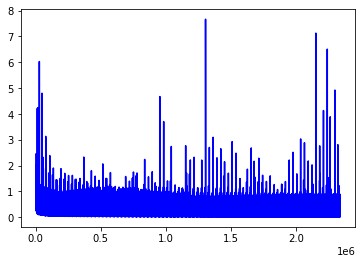

In [10]:
modeloTres = RedeNeuralModeloTres()

runnerTresCrossAdamBatch2 = RedeNeuralRunner(modeloTres,
                                     X_train, y_train,
                                     80,0.00010,'CrossEntropyLoss','Adam','runnerTresCrossAdamBatch2',True)

runnerTresCrossAdamBatch2.train()

In [11]:
runnerTresCrossAdamBatch2.evaluate(X_test,y_test)

0.9147255695142736

In [12]:
runnerTresCrossAdamBatch2.export()